# To-dos (13/11/23)

1. Remove fits to log, only use fit_short
2. Investigate the bad fits for the slices 
3. Confirm that the mcmc really does work for the entire fit
4. Plot the curve using [a, b, c, d] and play around with these values
5. Fix d = 0.5, and add "error parameters" for the temperature (eT + f) 
6. Run mcmc for this starting from e = 1, f = 0
7. Just use the entire series as your fit function

In [12]:
import emcee as mc #try markov chain monte carlo

In [13]:
import numpy as np
import matplotlib.pyplot as plt
import data_analysis_script as da
import importlib as im
from scipy.optimize import curve_fit, minimize
import emcee as mc #try markov chain monte carlo

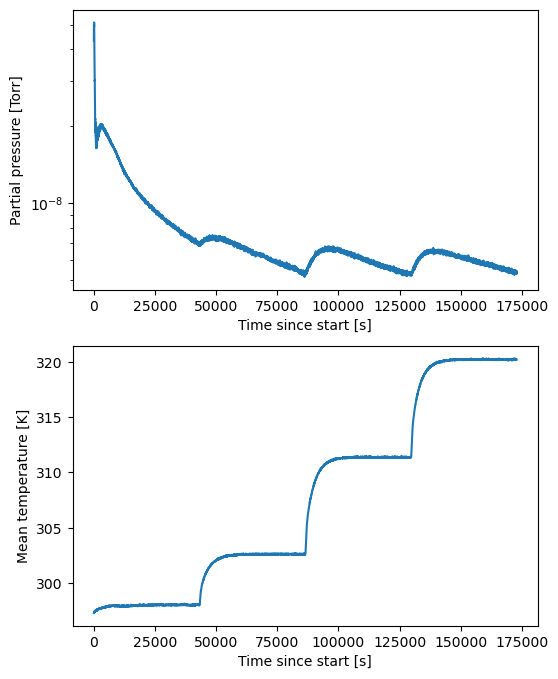

In [14]:
from data_analysis_script import Dataset
run_label = '2024-05-30' ## Change this to look at different runs
e = Dataset(run_label=run_label, gases=['O2'], data_path='20240530/')
e.GetData()
e.PlotSingleGas('O2')


In [15]:
time = np.array(e.data['O2']['Exposure_time'])
temp = np.array(e.data['O2']['Mean_temp']) #['Mean_temp'])
p = np.array(e.data['O2']['Partial_pressure'])

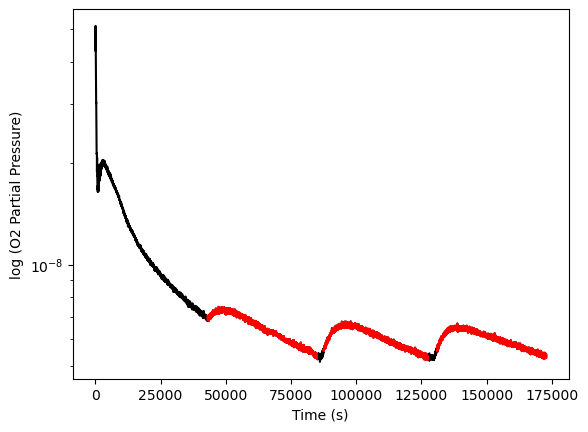

In [16]:
time_slices = [[43000, 85000],
               [87500, 127500],
               [131000, 175000]]

plt.semilogy(time, p, 'k') # Plot the logarithm (base 10) of the partial pressure of O2 (oxygen) against time. 
plt.ylabel('log (O2 Partial Pressure)') 
plt.xlabel('Time (s)')

for ts in time_slices:
    gpts = (time > ts[0]) & (time < ts[1])
    plt.semilogy(time[gpts], p[gpts],'r')
#plt.ylim(2e-9, 9e-8)
#plt.xlim(12e4, 14e4)
#plt.savefig('teflo.png')
plt.show()

# MCMC

In [17]:

    
def combined_chisq_short(params, data_list, y):
    ds = Dataset("","","")
    ndsets = len(data_list)

    a, b, c, tau = params[0], params[1], params[2], params[3], 


    tot_chisq = 0
    sig = 0.5e-9 ## error on values
    e_err = 0.1
    f_err = 1
    

    for n in range(ndsets):
        cdat = data_list[n]
        cy = y[n]
        curr_chisq = np.sum(((e.fitfunction_short_temp_offset(cdat, a, b, c, tau) - cy)/sig)**2) 
        if(not np.isnan(curr_chisq)):
            tot_chisq += curr_chisq
        else:
            tot_chisq += np.inf

    print(tot_chisq)
    return tot_chisq


tT = []
y = []
combined_data = []
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT.append((np.vstack((time[gpts], temp[gpts]))))
    y.append(p[gpts])
    combined_data.append([time[gpts], p[gpts]])




In [18]:
spars = np.array([5e-3, 6000, 0, 10000])
print(combined_chisq_short(spars, tT, y))
res = minimize(combined_chisq_short, spars, args=(tT, y), method='Nelder-Mead', options={"maxiter": 100000})

442886.2112549828
442886.2112549828
442886.2112549828
434615.9872454118
509016.1723773969
442886.2114840833
443105.58125911205
339605.3542712212
202072.314108153
334842.34302162315
265521.2672418236
146652.37819637795
4982.526056787277
20886.909925173968
167567.64922326792
1272283.1872252864
118552.76615437785
945887.3817029948
76769.22621111537
210837.04445641793
8529.464319947996
200612.58584389818
47095.98234444129
120127.41389453347
28075.206306490873
74090.64320597828
16054.00691095339
48385.57853419686
9067.574095200845
39859.48258554779
3843.9065374468373
17327.636361364974
6366.766006815219
10164.994375129887
4115.44300001098
18326.644162880682
2763.189885901692
4770.577003473448
10431.768148351173
2614.299896163309
4549.817257851182
2859.01351897435
5277.52129546518
2648.236265741688
5595.844177524537
2464.3496812306093
2857.1887414335724
2405.761828823214
3036.7562392588106
2355.020251689548
3106.2852076145923
2324.209489104158
3335.1540257391207
2303.348237825613
2389.660490

530.1278668427617
534.4375395212111
530.1915885740125
532.3658861021954
530.1487581902413
530.9344960962392
529.954075116815
530.6369611852457
529.8486114812135
530.3599423629487
529.8525780507285
530.5319692818102
529.8330655123141
530.0733898202834
529.8177487628247
529.9270074150104
529.7972186480437
529.921027082982
529.7973421648184
529.777363715426
529.8212493708218
529.9686061446657
529.7810010884895
529.7837063366399
529.7596800692965
529.7669446864293
529.7652884363739
529.7513226505647
529.768429281931
529.7363970577435
529.7438220007725
529.7322182577082
529.7556110520591
529.7516096199768
529.734775377835
529.7635249175423
529.7323668126446
529.693428261057
529.6660711320901
529.6921420317244
529.737339977253
529.708654987108
529.6790975251906
529.6460806684911
529.62752704577
529.6101540471539
529.5741374912
529.5606306878025
529.5058790738864
529.5190366377519
529.4197638615893
529.3044288426132
529.3148681265784
529.3298586224005
529.1990138712357
529.0729775521984
528.9

In [19]:
print(res.x)

[1.30068350e-03 4.04100071e+03 4.19569891e-03 4.92508954e+02]


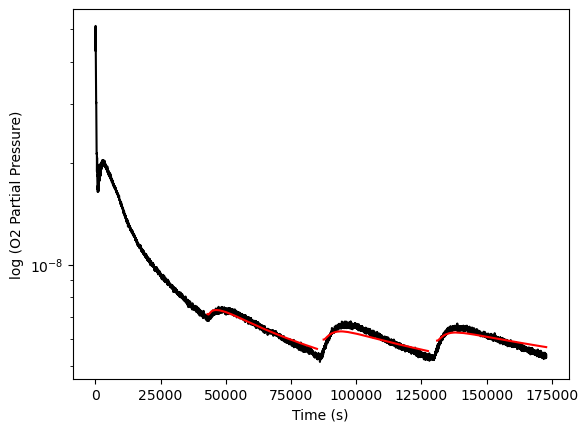

In [20]:

plt.figure()
plt.semilogy(time, p, 'k') # Plot the logarithm (base 10) of the partial pressure of O2 (oxygen) against time. 
for i in range(len(combined_data)):
    plt.plot(combined_data[i][0], np.abs(e.fitfunction_short_temp_offset(tT[i], *res.x)), 'r')
    
plt.ylabel('log (O2 Partial Pressure)') 
plt.xlabel('Time (s)')


#plt.ylim(4e-9, 2.2e-8)


plt.show()


# ##changing A
    
             
# plt.figure()
# plt.semilogy(time, p, 'k') 
# for a in np.linspace(1e-5, 10e-2, 100):
#     b = -303*np.log((6e-9)/(a))
#     Man_Param =  [a, b, 5.73577308e-03, 4.92508853e+02]
#     for i in range(len(combined_data)):
#         plt.plot(combined_data[i][0], np.abs(d.fitfunction_short_temp_offset(tT[i], *Man_Param)), 'r')




    
# plt.ylabel('log (O2 Partial Pressure)') 
# plt.xlabel('Time (s)')


# # plt.ylim(4e-9, 2.2e-8)


# plt.show()



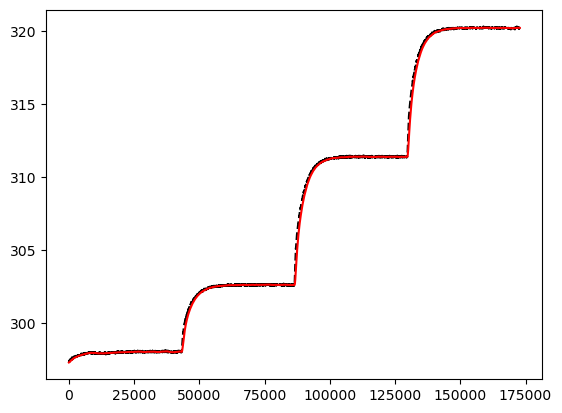

In [21]:

time = np.array(e.data['O2']['Exposure_time'])
temp = np.array(e.data['O2']['Mean_temp']) 
tau = res.x[3]

def exponential_decay(time, tau):
    return np.exp(-time/tau) * (time >= 0)


def smooth_step_function(time, temp, tau):

    dt = time[1] - time[0]  # Assuming t is evenly spaced
    decay_t = np.arange(0, len(time)) * dt  # Define time for the decay function
    decay = exponential_decay(decay_t, tau)
    Normdecay = decay/np.sum(decay) #Normalize decay function
    padded_data = np.pad(temp, (len(decay)-1, 0), mode='edge')  # Pad data with values similar to edge to resolve boundary issues
    smooth_step = np.convolve(padded_data, Normdecay, mode='valid') #Convolve two functions
    return smooth_step



plt.plot(time,temp,'k--')
plt.plot(time,  smooth_step_function(time, temp, tau), 'r')

plt.show()

bp: [ 1.28607675e-14 -1.44521067e+04  3.52447375e+09 -4.21019566e+04]
bp: [ 2.64951597e-11 -1.02898554e+04  6.65055425e+09 -1.46872840e+04]
bp: [ 5.12082041e-11 -1.01427741e+04  5.94518621e+09 -1.80345886e+04]
437298.3511668318
437297.84230581473
437298.35117092717
437298.3511668458
437298.3511668422
652492771.0226567
652492790.7718818
652492770.9904631
652492771.0225501
652492771.0225772
4115.274136907326
4115.27413691681
4115.274136961555
4115.274136910486
4115.274136910088
4116.844552184024
4116.847552028561
4116.844552092234
4116.844552186711
4116.844552186089
4112.287263345458
4112.288600069879
4112.287263334589
4112.287263348408
4112.28726334784
4106.247314784061
4106.248652056797
4106.247314773288
4106.247314787008
4106.247314786349
4081.954351495029
4081.9556480750343
4081.954351486715
4081.954351497976
4081.954351497464
3984.008695154702
3984.009077557689
3984.008695190364
3984.008695157753
3984.008695157272
4056.515456845169
4056.4950998540003
4056.5154576662453
4056.51545685

496.78681358538074
496.7868135829323
496.7868135830868
496.78681358280863
496.78561792175435
496.7868135853806
496.7868135829323
496.7868135830868
496.7868135828086
496.7856179217543
496.78681358538074
496.7868135829323
496.7868135830868
496.78681358280863
496.78561792175435
496.7868135853806
496.7868135829323
496.7868135830868
496.7868135828086
496.7856179217543
496.78681358538074
496.7868135829323
496.7868135830868
496.78681358280863
496.78561792175435
496.7868135853806
496.7868135829323
496.7868135830868
496.7868135828086
496.7856179217543
496.78681358538074
496.7868135829323
496.7868135830868
496.81048191187153
496.789882412777
496.7873653800557
496.78695092048963
496.78685634220784
496.7868290151574
496.7868196114027
496.7868160277745
496.78681459093116
496.7868140014303
496.7868137571622
496.786813655522
bp: [ 1.32143468e-03  4.05181552e+03 -3.74811157e+02  7.11710636e+02]


(1000.0, 190000.0)

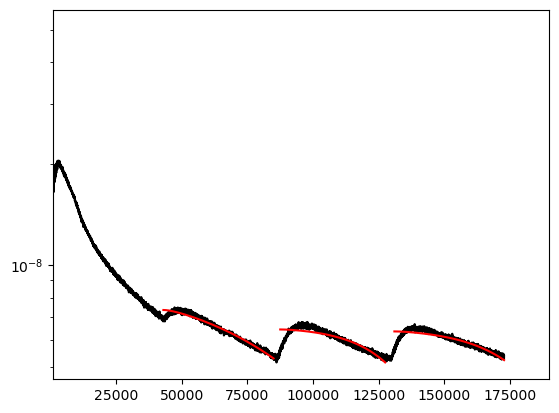

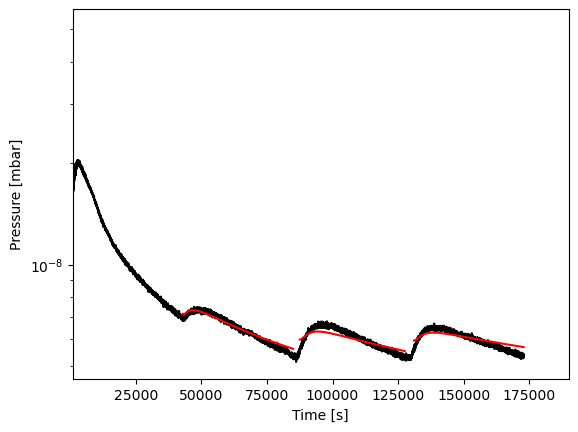

In [23]:
#Plotting Code


#Plot with different fit parameters for each time slice

plt.figure()
plt.semilogy(time, p, 'k')

for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT = np.vstack((time[gpts], temp[gpts]))
    y = p[gpts]
    spars = [5e-3, 6000, 0, 1000]
    bp, bc = curve_fit(e.fitfunction_short_temp_offset, tT, y, p0=spars, method='lm', maxfev=90000)
    plt.plot(tT[0], e.fitfunction_short_temp_offset(tT,*bp),'r')
    print('bp:', bp)
    plt.xlim(1e3, 19e4)
   

#Plot with the same fit parameters for all time slices
tT = []
y = []
combined_data = []
plt.figure()
plt.semilogy(time, p, 'k')
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT.append((np.vstack((time[gpts], temp[gpts]))))
    y.append(p[gpts])
    spars = [5e-3, 6000, 0, 1000]
    combined_data.append([time[gpts], p[gpts]])
res = minimize(combined_chisq_short, spars, args=(tT, y))
bp = res.x


for j in range(len(time_slices)):
    tvals = combined_data[j][0]
    plt.plot(tvals, e.fitfunction_short_temp_offset(tT[j], *bp), 'r')
   
    

print('bp:', bp)

plt.ylabel('Pressure [mbar]')
plt.xlabel("Time [s]")
#plt.ylim(2e-9, 1e-7)
plt.xlim(1e3, 19e4)



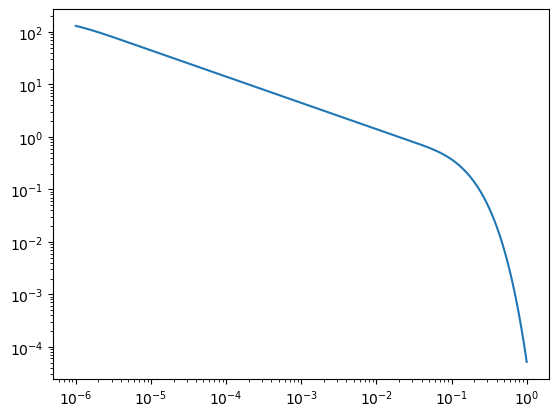

In [24]:
tvec = np.logspace(-6,0,1000)

maxn = 200

fval = np.zeros_like(tvec)
for n in range(maxn):
    fval += np.exp(-(np.pi*(2*n+1))**2*tvec)

plt.figure()
plt.loglog(tvec, fval)

In [25]:
nwalkers, ndim = 100, 4


ffn = lambda p,d,y: -combined_chisq_short(p,d, y)

scaling_factors = np.array([1e-6, 4e+3, -1e-3, 4e-1])
p0 = [spars + scaling_factors*0.001*np.random.randn(ndim) for i in range(nwalkers)]
 
sampler = mc.EnsembleSampler(nwalkers, ndim, ffn, args=(tT,y))
sampler.run_mcmc(p0, 4000, progress=True)


437869.97568500054
437785.2760703469
439264.33875524503
436527.6228614477
438061.13723494567
437129.2322293461
439471.72272907646
436097.3222757521
436083.41081538144
436080.49149096943
436965.33245261584
437073.0426401978
437276.2176528879
436030.80428170704
437374.9196247485
438515.7331778637
438082.6095107089
437607.470181665
438224.7165192508
437483.29003625974
436077.4220095688
437398.6880497809
437298.7844880114
436519.8252161295
439187.9715284287
437023.52529680356
436171.35315154144
438734.1710681281
438081.0048274944
435969.2985639033
436217.4536700556
437154.3679619989
439071.21677009226
436088.1806058987
437433.48473967623
437833.8475026352
437776.7404529706
438046.48853303434
436876.82271465263
438265.35095196246
438007.47788885457
437441.6800749996
437825.07747804496
438492.3395386669
437928.33748531755
437130.6203292472
437997.8446097163
437558.571750044
436662.8598027504
436890.1234365769
437813.42726501485
436290.50514414976
437488.3204614284
438453.85211557226
436659.0

  0%|          | 0/4000 [00:00<?, ?it/s]

437956.122571914
438057.28405305167
437942.7583422287
436702.1097668236
435230.4095306728
435191.25286671653
436228.3121286414
437436.29853280145
437788.8533731596
437840.40313573857
437553.8988855374
437698.3396623867
439009.60040286207
437152.3931700632
440626.9585833043
436925.3815721073
436169.0303908561
437535.38916598074
436932.1614570749
437147.1071729035
438238.2458615869
437862.7248181951
437235.246052315
437764.5322314751
434008.5363942738
437841.6219609468
438336.55706990807
438681.56972876244
437377.1379291627
436491.68651833513
436663.1128896341
438543.5031376022
436962.43710635917
437754.57612472
436902.15683677787
437941.3277073486
441143.68214629707
437006.6410085065
436896.6540161984
436698.2753246929
436988.9590890093
440595.3051200947
438384.3824120916
437999.3160365642
438699.7274296824
436693.5689584982
437187.0700753557
436208.3418972084
436047.7952786356
436917.3390724248
437777.7291473277
439528.31491709733
436186.33322208736
439932.86748820083
437250.9732554104

  0%|          | 2/4000 [00:00<07:07,  9.35it/s]

437387.2449665365
437926.45366730343
436633.11514952127
440741.9672432095
437554.9023063034
437360.0723008027
437182.7998271879
437084.7937341905
437736.4453193268
435237.8104939239
436641.3085702206
436119.04821900773
435758.6497428783
441175.220888368
438608.5438766164
436844.6440566612
436299.8129072521
437202.92923559283
434203.8368730824
435366.03471779026
438966.09462898097
437165.88270920096
437493.33685794804
436113.73877284187
437918.73833291925
436910.17454820196
437012.451547894
438232.4577732237
438002.07643704035
435963.384695456
437867.93760315573
437047.5394444937
436902.3129897354
440860.7791218996
438038.9607574891
434645.77628947387
435436.70998062
436158.3050518598
435729.4018527509
437982.9561775232
437002.81289994786
438957.5752509745
436248.8393655862
436362.6342586717
438554.91626764066
435444.59270170564
438044.71368001687
438986.3191237278
436661.85567767464
437588.65539848246
436956.752359159
437369.7385288761
438233.3125388954
437250.9301513613
438461.9035645

  0%|          | 4/4000 [00:00<07:09,  9.31it/s]

438131.71889331396
436508.5051667888
436777.8570960397
438242.79081811465
437757.61492497986
436913.0896514822
438294.0103107665
437026.997778769
437375.29483006214
437115.37368352263
437566.830079712
433717.54774013115
435396.2574051446
437492.4274147059
435866.7023534178
436205.5845698759
436555.1728570264
436013.51881858846
435597.5275498148
439678.56112192106
437907.2156144023
436730.29335551674
438509.6099064026
437051.8628059634
432896.56765058916
435558.10454582947
437872.7820068309
435953.16293357173
436824.6907695113
438522.0524447662
438031.43476776103
434698.71576937626
434739.38577961235
437864.10925836756
436782.3470384786
436915.52224828245
437232.37651460984
437648.7910679859
439907.60327230225
435677.9689279015
433421.65312098
437028.67643536895
436153.1887126374
437118.8672275271
437430.00959033513
437628.72826037934
433189.3965917325
436535.74486353475
436581.7209598556
437288.28984052927
435731.2708639861
437949.95391911943
434510.42331878544
436662.1306919736
435007

  0%|          | 6/4000 [00:00<07:10,  9.29it/s]

436200.0757278049
436661.1792972741
437041.0899888718
433438.18480450666
436740.50944239995
438627.7917584737
433098.22934474377
437662.47467960225
436204.432990344
438340.32654185954
435796.71668179915
435717.3929084038
437108.0512360889
437047.0427684565
436311.40874778904
437540.9048418306
433440.9747596837
435970.2901562898
435134.0195144999
434526.3416705063
433437.1281036213
435652.7887814114
435183.99831271206
436085.3740375683
436098.1050509674
432693.73752199014
434950.79155948025
438314.80875130714
438822.45597943943
436248.56028991425
435446.1809190689
438215.04525843007
438196.9971126079
438419.40245705267
438215.84914170904
436312.17587381083
435551.2574470861
436381.6892682002
434936.5796245098
436541.7610648759
439701.7359183489
432586.73569736734
436967.1474772712
438778.1021153547
436535.6680487991
436839.5462793579
436487.1504456719
436644.30064354563
432982.7613770879
437863.37742551847
438217.881227225
434483.1730928861
437702.4765592177
436630.5908980374
435973.613

  0%|          | 8/4000 [00:00<07:10,  9.27it/s]

429988.162334811
436372.151550079
435655.20995103905
433067.9389628626
438262.5971346861
436866.82246256736
440332.9752115657
430395.5102780162
438288.0795867611
436014.98979200167
435676.2262604929
436398.95828617574
436317.3504209765
436926.5658413528
437447.58028703835
435864.41165142966
435788.98434096336
436449.7052308582
435777.0575582764
435353.7590127729
435805.6629270538
437572.04485862673
434552.4402635604
440215.8300685467
436263.093426742
435565.28883689694
434549.3714985072
437689.21349357755
433322.32082433684
436554.1637754715
434495.5301421728
440376.63882445154
435580.05685050343
437776.8039044809
436449.32718804514
433359.17052658077
438143.8369415472
434569.8260780362
432904.2009599855
434267.8404410943
431706.96986894
436266.0913417544
437679.6903446772
436593.3044708824
437319.32360078505
438017.9086563299
438795.7168725764
436911.54760534666
432703.02072904207
439143.1057586185
437591.73006599216
429784.1831810459
435683.1931903538
436470.49813611794
436655.645071

  0%|          | 10/4000 [00:01<07:13,  9.21it/s]

435461.7923593287
435330.0489790699
435207.96837908565
437179.26211067487
432417.2389738272
437582.40688735014
437788.4976548088
436805.75611226854
430502.14427778067
436660.25470229454
438274.1392402997
426245.2794563279
438150.42316075263
442437.7680118697
435269.42318761506
438175.5107255314
436638.5160933763
437531.1854260884
437884.06154528505
436338.76480893354
435520.2148825998
438435.24930795043
429046.6147105766
439158.48306202947
435731.7397128466
427969.1574374909
430447.8092595345
437881.81903486466
434965.7265468616
433397.3996337901
435302.95026614924
429054.69036805857
433871.4134181484
432158.52885893505
436773.8848632975
435917.4344656068
436124.44874661614
433416.0470006985
438252.25109818415
436887.6897030916
436009.2130790075
430870.291329668
438233.7687931181
433176.452344795
433734.54311012593
427153.2321062398
435847.7376970558
436708.8312600722
438146.8549257334
429294.60996354057
441011.9937450016
436542.9090154953
436158.5841472397
431897.57452613825
434992.88

  0%|          | 12/4000 [00:01<07:11,  9.24it/s]

429529.0207152839
433039.7231410672
432738.5529051689
429349.1490826428
435548.22739002906
431607.13703004224
436046.66576200107
438241.95115409506
436186.147603317
434403.4374270111
436943.94791431184
430783.5475823519
435424.14397606865
451797.6571073332
436208.2208338894
436511.9752041558
435535.7565217146
429470.65958417667
434877.3081839173
432902.0199263145
433559.213034566
435066.73565755447
433922.2719098851
450607.0330270905
439038.62165377405
435774.73160520074
438476.5621494036
431830.64220187545
436135.44389752694
440383.95343234215
436549.9185158935
435882.0401582206
435441.38051375234
423667.59307033883
436049.4171976106
439097.82759911945
438594.1650870329
412515.6845537608
433530.856949614
439699.62279084127
435430.04238840943
434948.7711169647
436372.2921143522
431763.57851911907
437813.61236459523
433323.54019409727
435074.58358605026
439939.20231768757
431940.7689300365
437776.055358758
440035.02609457413
436068.05892038264
433177.3156583112
434825.50576468324
425707

  0%|          | 14/4000 [00:01<07:11,  9.25it/s]

429335.3986443767
438488.78273529036
436892.1579888171
440171.3456030832
428434.0451497432
442193.68147004675
423500.5716779935
437613.5287316445
435986.5971236249
434302.6789193471
435765.92752888304
436670.5563212099
437590.8804574177
436910.2913336308
429651.91567278386
437614.78020010045
434709.6723481957
434013.1560801339
438335.1469868057
435945.1980265354
436280.2450143924
424869.3018050449
434263.44730782876
435215.59400476184
429023.97961743135
430596.1763104389
432820.36119564204
428392.3647082716
438023.9663213104
435271.995978466
419470.2486787359
432964.3949610938
435789.22423954617
435706.0683212296
435510.39608169673
415414.43130160356
433889.2263816103
435026.9851135625
390586.63364941016
431130.592610879
429207.6405754422
445793.7340335151
418828.8003273952
420283.1624123105
434948.7743179376
435400.68878845824
443448.8793430779
419632.391034429
433181.4338573792
432403.84439899813
435882.88760245556
434362.49038400035
436142.635063251
434175.47846767923
435486.7089358

  0%|          | 16/4000 [00:01<07:10,  9.26it/s]

433434.6201487903
434240.94118030113
413029.9848169823
438423.82482877444
432284.91768619197
411962.1204608869
440613.73513482325
431001.7933003534
431836.4309625732
423807.2462182998
435775.15230007545
436540.7716269082
437829.41458817467
435681.5096902101
436204.3202363503
423503.01094493177
435250.53844118584
418253.4632682477
436865.6531423458
436750.06520523905
433124.0617505884
434719.3483513724
434888.763202443
444958.01917580154
431634.8995673137
431495.69562711054
432264.7671552348
431391.23743513285
436249.38662601914
436596.36032795464
436096.1680608959
404030.1534357595
422558.3600534038
446250.49173631205
439532.71750603186
436473.25101894693
437089.142921546
433881.57083182887
436981.443160456
434991.3347508637
450124.0883002911
327306.2753367884
430514.7046750869
388830.7713193242
433787.9567951935
435861.15213299764
442746.72124108335
418914.1498547281
432638.4532176523
433489.440927092
433140.1567780072
433696.7170500655
432195.54601717804
433995.6118159146
435514.4837

  0%|          | 18/4000 [00:01<07:09,  9.26it/s]

428602.5112951981
429847.93172727176
422754.8346819646
429894.72748813214
431353.00732105924
433769.9142509578
433303.9627850924
438363.8492678356
415212.9637660302
423753.37503770896
452672.0137991207
435140.0300858496
437734.02575963107
419031.67416680645
437642.80377859215
428147.92440582835
435229.2080517574
417273.9073508471
428072.62107620353
429980.595468357
435826.3943175816
449394.98428907
432588.4596033381
402723.1701613015
308878.50237727485
423670.91617348866
435420.57946446206
450799.239992921
410214.7810965619
433913.8478771464
433305.8231623769
432786.0670054208
433734.2383724175
436983.034583947
343320.9672029899
433964.04767180444
318572.27179077396
429055.18477460416
435174.5547749873
429008.4418007148
437246.82597698155
378065.24510108645
435039.19355461583
431772.58900620847
434065.72329975327
432254.0955844967
432559.0968071242
430653.7815437432
430269.2715528979
434038.639725673
408584.90122569655
434168.2773227521
439260.81776702334
437326.22128162207
418856.9159

  0%|          | 20/4000 [00:02<07:09,  9.27it/s]

434690.9709736427
432221.95949193684
433186.1143958797
410348.6460109387
427586.0906048636
436145.72531344416
424222.32283130963
421339.10737950326
463667.7019777291
399544.31000967085
425115.43224301684
408356.44180099247
462111.2665453178
434986.04180472763
394590.8485179487
405829.1846324359
431354.78043480683
414224.4131089594
385891.5533069655
424999.5440041688
377635.88134068425
432626.88247275946
433697.2411366901
436693.20030481555
485147.10232831957
437475.5471199694
462752.35306176206
389935.4770001236
434090.0518590808
422797.25197579013
437086.1886738178
170808.04312296014
459982.46203159145
479697.5916494828
436550.2444451774
404557.8713221359
430402.45943529287
420327.4101671409
431055.9144491817
415122.75196904124
427756.8034929966
419175.51877257816
399427.6916690409
435158.58410406346
438833.74737474136
418766.7157558557
408802.4715993398
433639.5514875149
402062.4121667276
456531.7076020956
443039.45949195646
454036.25636451965
431467.80864153587
400240.7171269529
397

  1%|          | 22/4000 [00:02<07:12,  9.20it/s]

433686.61318804335
342015.8303850237
423152.7378582405
411237.92326232337
364238.01929377334
437818.48661880346
412984.6707365867
418910.6190770162
447046.9009025449
434314.04673964914
435167.22476896615
432143.4402266034
378344.80542025075
326828.9640029449
404607.4618611493
431726.2727290861
426835.08074872644
432691.5384774621
435875.13803507725
432177.97891254176
432715.6728286569
434211.8795009656
407010.4265376015
428943.37491679715
430168.2075213045
311592.21557267144
398581.44829865213
434248.8884897646
413133.1114000861
428558.7572502332
429090.248934205
431178.40026032034
404065.35037687235
433826.5516489334
418606.87153683626
450214.96931055724
411274.23628636287
409045.5675707011
427757.20248182386
375446.3690317
351557.12195408996
433583.974910569
420272.789043487
426897.8792786224
400308.17958057753
424980.4817737285
440077.9430404783
390761.860747613
415725.37467094045
419282.85439971695
300290.11298368603
424162.7684448728
388051.53041693335
427532.07304708037
425595.22

  1%|          | 24/4000 [00:02<07:08,  9.28it/s]

427583.07543416764
529407.8520289294
428469.0730067081
400443.7387446639
419916.97481771046
434967.5001786805
328332.4881134289
368214.90149650455
386590.1257369957
464828.5812189043
404743.92061219853
405742.752521803
417979.0148174776
418986.76562160224
406243.1174917547
424068.5821900006
249931.30066050298
431635.9421358452
410567.7715768488
413102.88243710354
441396.83305314346
428337.6929467516
415321.0399114827
413634.15331223974
340904.3663990766
432835.0072877357
184099.7014091153
436347.95299754373
473443.66649658256
395301.16792267555
333879.538002504
416052.4618701266
420152.3907448552
395072.3164545391
421868.6741594486
451250.97623567004
365076.05646750727
430942.9060818575
410117.7457037743
423370.8338746146
427963.7161246764
379715.91532259673
424694.2345699239
425502.01123817306
420137.0375394927
428905.79797337845
402420.9820486263
280396.8638236306
431110.76971348864
429878.864909946
418912.90070672333
352188.8973465923
426984.03399760806
435574.52630078257
407614.853

  1%|          | 26/4000 [00:02<07:05,  9.34it/s]

431507.6752625793
375467.52108452085
399870.43686595536
357417.44737320166
415284.9955843983
454020.75952135597
401929.26188025705
383056.49132391356
402990.0670880231
477172.1883844445
285077.0812415335
378735.0574475952
417756.28747197567
370663.86937979376
305758.6240170274
347891.7747164714
372922.27260417916
315431.2867549049
421812.24930863816
428184.1075571485
433210.3824496257
410493.2435251711
431820.2195984557
257872.25806057762
405852.32760214934
418514.47327571636
351607.31845400337
404477.20421474567
221431.82783123702
418234.0430691665
417723.5475005015
373557.6127382781
235352.28670885554
374345.6708444038
369862.3132890598
424041.78733221267
428637.57369362365
383007.04943465686
319275.03188400454
415473.34282321774
428228.8997472141
419002.79642241413
433958.634775183
383038.37609824
396362.08892910567
426958.6116815883
425895.3440720225
470291.51505245984
345596.60392627376
333164.08849774033
404386.4748978622
424870.497961896
413796.9996008915
282540.2757487324
45470

  1%|          | 28/4000 [00:03<07:04,  9.36it/s]

357642.736394727
349211.3762435774
307621.9596641357
413694.3629552673
345055.600449564
377262.0414246156
408573.4741078366
400086.75624759455
364961.0399487554
402656.6872805708
324050.326363944
244156.91640618365
222360.65246511827
409801.76846212824
214449.17089473334
39966.1976534643
303979.65042271646
379152.01189581107
421710.29236026644
398973.58263815515
446956.2833529131
412266.52447858284
460855.4568552435
256595.0706074067
420271.12393367867
258617.18201222425
60876.230391773584
404966.6538688093
425048.1634679193
176247.37002093482
425403.48062320316
385908.69309236226
329790.65232362185
405067.825771145
465737.71469949157
428963.1679892654
384419.5103364512
369753.3982272557
392216.68810582475
420121.8927971231
388989.13889256865
371870.71296012634
492855.48636950564
424202.1751240937
358646.824802061
343133.03980202327
269334.9942246702
410194.356055345
284228.56146567385
476803.69530774385
352609.8762127373
356300.5031359902
401467.66428712016
389943.02016049373
432419.4

  1%|          | 30/4000 [00:03<07:03,  9.38it/s]

253502.2992147339
356569.2617949421
364063.34486363246
533290.577927267
368654.2406241051
394549.69701324357
436042.59453766746
288004.1659754058
410641.85970017407
422260.5899032419
366343.60522380844
419521.50557819754
291241.97223748034
293938.52540654107
1236.4614367300298
325416.6554063383
393843.6469349679
232287.92197429552
467698.9598761741
54094.77846229481
304961.91777955665
428923.0250371836
456926.95325127355
413511.9085504431
1198.2091427310338
443437.7374246485
444351.09479420335
9238503.737191387
417668.3386703045
393308.4903693438
151230.36332030932
407454.00898672955
455305.3248525731
401299.99560059933
246845.99158175517
454978.9599223104
335948.47500973556
487320.4694082512
279901.67667055305
420145.317012558
427902.2708886316
472773.28807319107
302136.46687007335
499989.55348119215
282006.81751192507
411580.85211698466
314918.272140296
117632.3755639476
269774.32930999255
391101.28177269443
180793.7629726851
287819.55123497895
435472.16582071944
400160.2700946207
35

  1%|          | 32/4000 [00:03<07:02,  9.38it/s]

355309.3025271993
381728.7085518862
271050.4156000221
370210.4600629448
392036.9952100775
495115.93297073734
412819.77722554025
268728.2473632621
277719.9389438887
284377.40455617453
469142.97007315804
321324.0873842393
323884.99634809955
345641.76330749434
57485.7506420168
401530.3732399252
174052.18187070123
110294.05730445767
185152.95425135506
355333.0260325674
354714.7434685184
290053.71666951606
4525.257753947548
337128.7094992315
402714.95811830985
313854.8376272465
393990.53413606784
97612.07514914699
260196.96746595102
450466.27472890686
244716.19003334708
411935.0113048211
37671.543056997405
305050.51472008345
539874.7637485247
394256.90575543925
438320.6183251727
470425.7086476856
509490.34018534416
413666.04395560676
340831.4157562372
391881.4228469463
355569.2109493261
353912.3653703317
263972.44730090257
421186.03414820024
338116.2382169058
451659.5283981926
276036.4301248051
435527.35823070566
331180.0930161568
416742.8376751604
97277.49724076944
257515.01992124825
24784

  1%|          | 34/4000 [00:03<07:01,  9.40it/s]

501503.26039663487
399370.4162863718
312061.959166809
384040.0276806667
16537.591758357707
409192.35893625143
440037.6558693324
309309.1214317343
257751.72272892433
413601.7133852815
273695.35114062415
110050.92197700031
341237.0734643657
12911.616495954906
72491.7291036895
397058.33050474594
322272.1751260696
333515.28058071365
79612.691907812
212495.16759026144
293933.1952091453
9069.087662547028
194660.01573682818
340482.01937687094
28252.378042502576
405362.74571017455
87676.51014308097
2655.702200164134
245874.69348642038
77201.55963956745
253522.30777065622
393817.31305653526
193994.59385141238
528269.1495798843
75497.18724332427
395608.02160004905
532320.6515988756
353807.2563559604
17661.422267086302
373105.44078732433
321614.1885017047
351830.13481335103
149189.93973402356
45492.885742254104
510510.0568363845
378967.88135917875
456423.5588183784
256910.25464148424
211587.69234703935
198540.79744160458
296109.75520312635
401113.5462011735
254781.02620505384
381307.9708423946
36

  1%|          | 36/4000 [00:03<07:01,  9.40it/s]

438254.4915882177
478464.9020994111
472703.38121065317
53801.969317708674
388358.0052588036
234275.3984929435
293723.0432176278
240386.59564660297
269726.4240589877
97586.97998911119
122485.57984244655
299887.37204764306
478825.268430023
70676.47724537447
264615.3009203855
181519.90943721728
42237.665210709805
310211.9656030262
27239.66762811947
248541.3467636779
399353.8347895513
6811.446865407427
119519.08723838555
399109.4463015975
332058.89675549336
26173.129271705417
309887.4332338384
351031.77970863815
76430.47405359418
291964.01842500933
446960.65352083545
317052.85493069794
149762.10665907952
193985.79037401194
504744.7576028713
1593.3507675701526
390406.52167310065
281017.3904336865
210179.66035922157
364675.6733033496
236876.1473017292
276590.4687499123
397006.11247416376
464241.947530758
365370.4236928059
112463.37492097687
408719.85322985274
17132.59099451228
314947.93934719154
52300.75479850026
223634.57185829003
19167.840591594413
212479.10677060968
199119.29481773422
341

  1%|          | 38/4000 [00:04<07:01,  9.40it/s]

420790.0761951464
315999.0844826982
293338.39134592
1456.6318983013125
444880.50857607106
120007.62652206089
424673.8996734873
273631.35138311295
129963.60229366126
76688.61365214564
359273.90345718653
69694.8425097014
2787.44521289493
151447.1524526406
10243.774882424475
325058.0822032067
95652.20391730947
155183.62835018066
341496.95569581527
399575.8722954504
305955.0334929322
53253.75453103792
1674.8671343463063
270582.6609824062
449732.9787663617
388829.5331018661
762923.0063324133
7159.3358093933075
282517.54913018306
309115.3355872482
1240.418879885081
9616949.312825542
510925.56656981877
1566.528601044669
21584.472773689406
26688.839630309798
170675.47390865925
489111.7096799037
130507.35191004284
371339.5224120685
370713.51401782763
286636.2375434167
153953.3736402131
177164.89798953698
366002.9588784968
243786.20788319517
182811.16812662827
288531.90005555935
315229.35083844734
246769.8039856857
4933.279636661679
317332.3592256047
69706.706656372
2654.484169950688
207259.3403

  1%|          | 40/4000 [00:04<07:00,  9.41it/s]

333841.7506226757
378801.649416217
197081.13516250032
161996.3200760044
89622.81686892775
146180.15403966574
439846.1605490709
330333.1888733057
1643.3583564613639
169879.5957526777
64767.36995175401
1187.7374711602586
412055.67655572866
55731.937171640515
267280.38926813664
163184.80300201924
1770.7794145975815
167341.1118385936
341898.3635855074
257736.05966673963
191969.00607360053
1475.5570354986558
267130.77879962185
1219.2119229201771
395056.97390975605
1561.416864996245
68338.43253243409
524560.3928530399
211465.54244760482
257377.28505409948
5320.8176581166135
105684.38717502811
183164.71335500086
224173.6656957607
2409115.5090984437
81585.93479481246
7732.9352322421755
363313.1001706524
15416.708562753483
265287.13641197
74554.46301912864
262997.38881847856
1498245.1565371791
15906.450468099994
166969.10207761207
12845.812987175514
265335.5865063035
215193.3926989722
278588.61430754187
150152.7314881032
105729.44610599999
169916.0732189916
188403.5098847434
74755.6497418214
20

  1%|          | 42/4000 [00:04<07:01,  9.39it/s]

109607.05305054752
59496.17322582322
173634.21484064087
198358.50001439214
23317.433016972653
1198.4102248269382
38525.41221994593
14894.086265878144
348128.3882889998
1288.6273614735182
86029.14877859039
255195.09672847623
2482.371280148618
310310.3331108234
1249.5523362557165
160953.39844477028
585479.9013653263
452331.528647739
106740.55744245404
72111.60525903758
3531796.4220592543
89988.7296624033
1199.3255720360212
105750.68523356858
2701357.001715945
393636.73504881025
150364.30073484295
124115.67603493962
377068.8876025948
177709.90670834336
282472.522769797
209650.59038711613
201891.8002481554
7205.293815082294
105441.37912204274
158749.64967950142
124162.06172051647
3541.1087660948924
190760.82467315785
4704497.768535701
9267.666344533383
249216.56606246863
180256.83444423854
299107.0021570875
334502.7207498156
211495.56531966518
215233.16585552803
107564.23031827793
166144.93163224994
46468.89154831217
243408.2173919466
86553.16178051356
151002.93287875043
187090.87281880953

  1%|          | 45/4000 [00:04<07:00,  9.41it/s]

311787.6230574531
138330.27548813287
211706.93179688224
4253.67881398218
1770.628678567441
61223.24241718726
4947.044446635086
1426.2141410386362
4124.916890151783
144098.97099535435
23441.838956071515
1179.9740703809218
99905.13583760042
55505.307672048315
5763.967743934211
1178.4280999473829
118844.09789733034
97624.97068564645
28356.96832226483
56240.44160279412
149039.57690715019
12006.668080406116
812669.0875735478
173356.56034517958
521440.94750255294
38239.78721525542
76128.95431729537
99562.79786537301
104216.33254994368
331658.3042867581
30158.62600096252
299129.911949644
3108.833182084812
171644.17933271284
723454.9417193255
58346.0545619158
288187.33130594064
41675.53268188826
47989.60169710585
319942.6926034441
1331.8058944136615
118078.2349222939
26962.327377161455
129069.22734101888
14588.06335478017
46262.530217119594
195129.28704597868
242724.51259294554
88612.76630437384
10712.120186868957
1187.5339520790353
111928.02375077864
143508.2945733021
303135.7882989232
101448

  1%|          | 47/4000 [00:05<07:00,  9.41it/s]

141470.81071791865
1184.1707612089963
1193.5946099882372
161627.55095941352
297085.3197835586
21047.46207195539
17249.372230000234
61898.83268639358
1630.0125367595265
255745.53667623858
7619.763057896545
4884.926090737806
983880.6024977202
1428.3297648034109
243477.83642834035
85275.24538209414
478968.2471229398
43239.87257215794
28372.09965533753
127326.72671456164
324295.3498548659
171552.5038315856
12472.591567353076
294379.797979302
92096.4757102262
44820.88009620572
137894.07672828835
2200.7548756695123
241498.81448124303
51641.33255571028
14475.748278767032
1509.5483723149152
82892.47953371496
1179.111429352259
146737.27973159822
135637.6472798954
11233.233437256276
253257.7093366003
4561.698936695761
41935.83124987446
32647.650641511478
10041.05759279445
1659.7356212757786
76551.70886140833
190336.4344241657
37831.09677050648
62304.800377478474
23956.60479996523
17627.360408739885
113020.2404935122
74151.65089914473
261652.42460657496
3455.3753980709635
122853.95596331169
14778

  1%|          | 49/4000 [00:05<07:00,  9.40it/s]

115665.84862282724
1187.9125457639311
14913.32312745398
37431.55991132315
22238.73104735707
24424.810010104273
126065.78478184532
1178.8885778469407
388277.12898591266
171390.80010476525
9045.267863020079
10481.770072660069
4198.790297972755
31167.81552168703
2074.8550954150164
11974.761213678907
1997.2627111319907
3408.5547682222355
1178.302733260776
24144.512024192234
1910.2398407127962
138282.13652598558
169177.63555702067
34951.9618007374
119635.27568138464
99217.8301607841
375219.2102200502
1244.6771770246432
1785.838278627745
398641.06457619823
5044.730892437553
41953.25956931176
9870.281361479823
31634.750436387218
1199.4096828342588
98233.29403409184
70653.94448724834
1186.8938822373138
40408.89606690194
1419.5085018820723
1343.932675776954
185577.49921077132
271085.91379601747
194943.81162147946
72881.08281967473
28713.5317240227
49852.398494985246
105708.52815295203
1185.8182925793906
2349.221906991812
354950.84191905905
39253.893738732004
231775.9374365257
208678.10204286687

  1%|▏         | 51/4000 [00:05<07:00,  9.39it/s]

69896.4074208797
57249.926108725325
6110.0611649685015
45764.65160475897
2357.223983718954
122679.43700456305
66656.2700069274
9033.190985198571
1178.3512264317164
1558.527245895988
237081.521518687
1183.3651231179135
197932.99418135508
77840.25323557589
262203.2609568464
16895.9739804799
466194.5255602426
64448.6575310076
5960.6806991487365
1616.4382821074637
119038.16624996743
1471.6448614107035
6365.519719245935
1179.919723641853
18930.281665514485
59058.08641825642
143778.15661378216
26031.868532770113
191986.36104710065
4670.03176214515
3055.0038001074154
12610.88013907092
1209.1042286215234
158406.0812296682
143317.11859426936
1664.5177228373377
1191.5247377650414
23351.246917705266
9864.016340330876
81373.4354805104
111426.46287592463
35533.81979871533
1179.3646346490218
355746.5923346838
37293.28857831698
1217.1345663732172
1726.3109245500355
65879.63981518349
3739.79124482235
22075.85738554381
83462.01109498441
17792.512181935508
65601.99411719854
1269.495963417629
237216.3435

  1%|▏         | 53/4000 [00:05<07:00,  9.38it/s]

1586.9258216039739
101817.6389169236
59694.28318694718
14527.784680404182
2905.6334235153804
9722.570087641754
1188.1656270388528
4148.9976886301765
1203.333183800848
5530.014065691333
11821.72845191646
52426.2323369338
52620.38935160551
23253.572189718947
1673.6654419759184
1302.1341847091412
201882.96905960777
6875.593709197325
186472.2135543639
112232.18283035788
2523.0695506144634
1388.1483289168755
14293.109796232637
198297.02620697496
1377.3007057342484
1199.4791115365367
49100.10604498018
331054.9339280706
1179.2836159971685
1435.774453983317
1304.6266203816776
1801.372736535594
74114.24212058852
8599.366841510679
1388.4396380683195
1429.8566573162516
195761.56140413086
9813.397231038121
1771.5532574182337
112252.32339291234
110491.7026073237
352889.911371271
33990.04388327523
1178.4387317205021
52395.68566936809
1316.0658496675865
1178.3343234211627
1704.0565532390679
12901.69531386752
9960.667264812704
1194.3522928311563
6382.192294386474
20088.655728946727
18481.774405847387


  1%|▏         | 55/4000 [00:05<07:02,  9.34it/s]

6370.919326320252
1870.7232016488406
2155.3347181836284
2656.5867467465937
46552.682270100544
1232.8264696106255
10331.056580101116
1178.0240548793918
61140.581409083905
117170.7098200143
1287.965901686202
31102.390067591936
9834.242976104948
1205.175748099145
1185.4905490461124
2662.838293213974
1258.4436923603112
1179.5845178197371
1240.5778967628976
1614.3884584074654
2703.174818055469
71730.75337592764
1637.2845733643608
4164.364226958303
48720.31124552473
1363.9712197942788
9722.722474869333
4907.7401639855125
1529.8510208551813
1201.4866028010597
5154.779198399003
1309.9134389560338
119767.34747914525
8552.823130752098
147802.70675724593
61512.43788665756
380900.1154851771
1999.687295065573
53451.17536878548
12813.561788288956
13492.307666846078
7286.988655538005
2057.3244744240787
2634.9835167706865
1186.161674161372
10786.480516799906
1180.613166389087
1252.262382028834
3971.4877163707265
67427.54095848792
25718.484281508525
1320.4273248467748
11977.817406664208
1269.6686498152

  1%|▏         | 57/4000 [00:06<07:02,  9.32it/s]

15687.583176707176
1476.5697543471342
19399.02322898311
3350.1784697504686
3427.089054371658
1179.213349025032
1420.2710142511244
6854.6755317757215
1199.2581223787088
1316.2593682696804
5701.221181249947
26135.61594581745
9697.182006736173
15870.763433413862
2078.0301067594864
50098.70947105373
1222.970399336321
1182.5316491544936
7342.792550791968
11432.886813525212
12393.870181863027
6634.922592099726
22981.126702629084
2646.30202916038
1249.554417958696
1755.1342561475794
77847.83923562718
1179.7856511691512
1319.0807825633121
24652.34197608847
3196.7295599760328
52929.90374594799
50683.542910457094
1492.4479736212093
10584.450065352921
4057.2431736978947
9783.792011728145
6826.737250190337
1351.144612352156
1254.5704849108472
29083.811192112797
14550.07045250235
135161.43742620508
5272.70153178467
1432.6400465399868
57552.78882944217
2396.849325338763
1753.0791573876868
105583.24987520234
1178.345023206698
13920.883623053112
1250.4664233903657
5422.043917080268
4550.027904041308
1

  1%|▏         | 59/4000 [00:06<07:04,  9.29it/s]

1325.7329935241526
3087.0055776470585
8760.05433433126
1207.612931909877
1183.008259760939
2036.6028643460431
2172.59116651278
2664.2490123495736
3661.923649187248
1351.547007937501
11652.028837666821
5324.554477188999
1205.7153647283603
9148.15349830349
1296.635151227913
2659.868257563775
9027.609238163986
1193.1205825286884
1178.0469136995184
2554.981452044792
1179.5467543889415
32604.844249019083
1195.801867214662
1179.1134680459497
16310.55706959049
1519.0122564747087
57888.409672873495
6246.70104966705
683894.4131204457
1496.2163097910131
1308.6531314490046
24282.80557537995
2930.951438056886
3281.117068501522
6839.52362240943
2198.4998556699747
2780.768046232959
1352.0407504308855
1958.347523311312
15335.111554166655
1178.6743942060834
17866.1322122804
1210.3090957178192
2555.2340006140957
2786.882514229253
1217.2204758025798
1178.379477318064
31274.809162436133
1217.6670099345408
14852.100847134352
1817268.4541289425
1480.883165301786
3030.725877673586
1301.8006043608762
1307.43

  2%|▏         | 61/4000 [00:06<07:04,  9.28it/s]

1188.8062139643484
55615.14890700749
1764.3960727340293
1345.942142170249
10769.817892714636
3627.142835688782
1216.5822692769002
1673.3071581998445
1189.5217364898601
1206.0788555779038
1619.495078919505
1178.5583372645706
1550.8091333376146
1551.5549166757792
1199.0308173775397
88684.71580839943
3464.485897111629
1198.7305228216874
1181.7801690339872
2726.2767832308996
1333.1898390588021
1237.793921450376
3083.3625342551745
1178.5470223219238
1177.9040865706193
74296.85660559431
36073.06254532588
1199.1437643674908
2796.936740326916
6236.5462171149575
1212.2343033488362
4744.572731527693
1225.8163211176818
1529.383717716469
7182.321649055994
1191.5964627407288
2966.580748175656
1227.923699641894
1181.7990575639783
5491.8631948485445
1772.068863857256
1185.9412668155408
1252.3260832977614
9565.718106925382
1235.3922045595739
2767.2539211454364
1220.9225602168844
1233.0639118119327
1183.2588464214032
8328.395803843465
22299.72596707003
1270.7095664047079
13462.593739082666
1780.0726627

  2%|▏         | 63/4000 [00:06<07:06,  9.22it/s]

1541.6283375305366
1577.7830348610196
2846.982121063439
1178.682118141667
1208.2989744180923
25059.453508319046
1344.8688590475388
1795.8137686653038
1307.7427097241296
8584.532278966397
5919.946935855794
13648.326841550488
5013.043066012716
1193.667256979455
1178.9479076319876
1177.779366348551
1258.0116899516274
14549.522250663711
52633.20317323234
1223.2750941017002
3245.946965283848
41345.931745005335
1904.795408339782
1225.5785024662625
1180.2281439841063
1178.1870974010958
9135.722122757585
56924.86419747341
6378.95280019998
26620.64969291623
1179.4829259999487
1232.1211492302928
3019.221472875493
15003.120440755425
1524.3725936412968
2624.0203351712726
2738.891976312437
1238.7572009108587
2536.3773808170768
1184.8719239692387
1818.5464139820933
1591.6827819914643
1564.3391569003527
27432.518471400363
1190.5041725247638
1215.3279019832003
13469.008483871885
1225.7980051869586
1252.9083349343086
1824.9790424483604
1181.2712743057173
1182.5685604430018
5429.040544187649
1219.191008

  2%|▏         | 65/4000 [00:06<07:05,  9.25it/s]

1846.972959989261
3379.858702929376
8088.428066797212
1178.1662711171875
16593.71914079333
1250.623900931688
1179.4563169735115
1195.9815166270223
1178.8844944350433
1481.90572379102
2652.727482255167
1226.9194288555182
2527.1001916324417
7597.257179901472
2939.7364827585816
1177.0405705389678
9590.42092421012
123297.39916876255
1186.4181640136217
1260.9265974600378
1180.6374741149566
54284.90148070717
1514.7084154906338
1178.1414379907262
2334.8292626518933
1190.449393977762
2775.6055368891566
1189.996630599575
1180.5255758736416
2297.3399624000954
1178.3436913262726
17051.869631605485
6885.1618826803915
18917.215786517478
185939.89281527736
1181.990429450645
6580.506534291252
1519.5264620300713
1867.8237836292326
1178.193731866858
1240.7211359707471
1195.4171415261476
1682.8348386332573
1189.1306898245803
3376.100899043832
1921.085345159002
9485.077843136089
3075.827599684352
1260.8383847678933
1205.3795601436882
1239.4532432083925
1180.0951742145169
1178.589883647558
1263.7308808751

  2%|▏         | 67/4000 [00:07<07:02,  9.30it/s]

2840.5939300597897
12604.65619495239
1198.8680141745074
1178.52168829414
1301.1368770315148
1968.683194232482
69481.38589730127
1182.0135146296666
2208.9271250371607
1420.9060902157423
2507.7957095721704
1230.7434565688886
4377.537330061917
1317.8020282953312
1179.284356645439
1364.808368794241
2210.6457368689203
23391.240498042684
1180.8595809166945
1535.836540884071
1191.1102484245275
1185.807376683199
3928.5214448039073
1201.3829955300307
2295.5217021931417
6494.736204396045
1354.1333319325613
1178.878687506574
1379.8221215172862
4837.002325760917
1541.6314741686947
1185.5969044659307
61683.515872184245
1593.878588893313
52347.451849610006
2967.6089703545667
165594.69576378266
2054.580590721385
8258.371098846057
1479.9014868511474
1178.3224187739215
1262.4689277311047
1178.5691682853928
2651.2070235349383
1219.3745577527877
1180.8748259454571
1181.57125924629
1186.3421687637428
1178.3759296339504
1407.4774839048305
18194.42779508596
1178.172094321513
1186.4385026630894
1783.36973098

  2%|▏         | 70/4000 [00:07<06:59,  9.38it/s]

1454.185237560959
1181.9515829462043
1178.3618977154545
2800.813633872733
1202.701823103102
1181.305120118616
1517.7998960377317
1179.7343435688663
1209.4267874175614
1179.2907235356324
2089.32964115459
8000.08564813747
2596.4073022710036
3102.226686414836
1191.7675052730328
1188.6693250582498
2350.687180989698
1530.568124489028
2076.521384356667
231678.1092629566
1182.9588081126299
2691.2383769431735
1194.7288781066118
5161.915126169493
1267.4454289589614
1236.9934009093547
1180.2228491436026
1357.1659639173592
1184.739075382716
1191.5890467880013
1178.0930940905055
3568.412395457022
5530.5705100608675
2303.6063110388664
5531.229922780493
1180.1638375638818
2820.2099635398954
1182.535841222506
3175.328493063459
39222.12382638924
1182.2699181577505
1177.7503252779943
1179.8372001422667
6903.639932153561
27877.649739087476
1178.6065489076577
1263.589239743951
2279.506820732853
1178.5661192811294
1179.9094269820932
1293.6678740956465
1178.6255321453787
1185.9397203378167
1429.56471310639

  2%|▏         | 72/4000 [00:07<06:57,  9.40it/s]

1572.7750182565064
1178.8876872236158
1505.6637946746687
1183.1135188296817
1178.4564955546912
1177.675283136248
1238.6996907916277
1192.400117899882
2079.3896414397054
1180.1838311216247
1185.059032196274
1181.49342707903
2176.2773542949412
1186.4819281579144
1177.7330482054572
1191.7268094320111
1179.4083677663546
1179.6279797684874
1202.3145068080503
1177.5530269733936
1178.7730964523257
3194.6707218194956
1184.648156586797
6326.000583428773
1641.7847358545298
18091.627131678808
243660.08708734455
1182.6171340244287
1178.0430208440303
6190.150214437846
1201.5247302043108
1217.776510206496
1190.7001182930585
1181.81076618548
1327.983856592688
1192.3752621645276
1178.6190570217746
3265.7163123963082
1527.8377303649786
1188.4907127839235
1234.2640646539908
1181.0051713588527
1180.3001617658576
1187.931301324952
6323.353204183524
57593.663589928125
1178.4515185973783
1179.9310997949551
1177.642379342005
7674.0162977081745
5155.277856865921
1178.7468731406552
1629.374805819341
1180.42436

  2%|▏         | 74/4000 [00:07<06:58,  9.39it/s]

2958.05130990235
9750.360946761939
1252.7600275202913
25198.835536624585
1282.938772715178
134245.43264384143
1197.4419353771864
1584.56703181281
1177.6751558133242
1272.7438728085212
6007.199522178381
1179.9341483225994
1203.6716247826212
1186.0840100785008
1185.2993980747217
1198.516661195027
1184.2835656875877
1179.9699691392689
1609.8765406232153
1180.5976450929986
1180.4510753175766
1178.4646348108813
1180.6591693081064
1178.1550347933685
1334.6614734704099
3715.8451275488405
37215.73414098182
1178.5760157304105
1525.4460221453871
1180.2202707232334
1184.76217163283
1233.5701509375117
1342.3173403695746
1447.5342148519173
1183.552322095442
101663.51210073449
1248.086573710374
1182.7864534307837
4364.286066169396
1183.0448572154298
1500.6150638806348
1177.5758185130653
3508.016033244102
1320.7675609403364
14690.820259060827
1848.125942573071
1180.2201927648964
1983.3979982100382
1177.622652680181
3755.3311273443683
1302.6411098176086
1182.2001510348973
1178.042238838792
1421.091505

  2%|▏         | 76/4000 [00:08<06:57,  9.40it/s]

1269.7055017800108
1183.5932463012482
32408.067063729417
1180.228416294218
1198.4966345188693
1178.0969544893856
1177.9051407894583
1179.1616816666628
1178.2336746568778
1179.333205282127
1189.5847684998794
2399.7449387865922
1178.2711755764035
1550.9635217156865
3528.1389173383404
1193.7389652988977
1180.6181942342328
1181.490581781821
1771.2081433364303
1179.2712279676823
1175.6385662569087
1290.412255279559
1341.7724325516042
1185.3506669500662
1178.3887826750986
1178.648734617223
1178.0947159301554
1210.720011003098
1894.6428043417177
1222.6330545868818
1180.5340607543446
1189.3810375391681
1265.0918014498607
1178.0279014530256
1178.751845687857
1179.7844889204525
2977.9574137619197
2396.0457144275806
1181.745399722087
1185.7506721889542
1181.4284000821385
1173.525610027054
10298.814397671558
1215.7707419872604
1186.8526731128322
1195.2738077162026
1181.36820884381
1673.509503792769
1678.3525063601528
1200.5722067465445
1178.3639075419014
1178.0472585102452
3460.92675529707
1384.19

  2%|▏         | 78/4000 [00:08<06:59,  9.35it/s]

2389.6750419047894
1178.4462227036315
1178.8101265454484
1180.0131227710688
26748.70345519246
1192.7713939653863
1179.6162306980955
1181.2467328097875
1193.9106205806604
1178.7009852884933
1178.2387403950147
1177.233521642154
1182.0874581129042
1179.588004121962
1183.8575367316587
1177.4491141569824
1177.8600931528476
1639.3085023825765
1848.1720142003574
1177.9407054127655
1178.4184159692081
1505.4568152958068
1395.9232279691662
1189.4515118752975
1178.1501675708755
1459.7604154942474
59928.261307978166
1181.3479824039086
1178.5833830640745
1189.6091027934294
1179.1184657714407
1182.3647248319107
1468.0686759137088
1183.1843161026943
1185.9840816608885
1177.6619293763351
1178.1428775999075
1191.8966687252357
8809.346984148502
1177.833717728247
1213.3387748003443
1179.9960587794842
1539.1614009666323
1439.2937948057024
1289.8002196351317
1178.694566033375
1232.745466887123
1177.395135069269
1193.2687282662832
1177.915316519116
1176.395235423676
1441.099005822124
2939.9880086731064
1191

  2%|▏         | 80/4000 [00:08<07:00,  9.33it/s]

1212.589251472603
1178.2038821019717
1178.720778579394
1718.1853670954736
1184.8642024266735
1186.226618733639
1182.5273518508766
1757.0891454281116
20819.602668514308
1179.1066431533998
1227.3181598527933
1194.4478820308138
1177.7453276063493
1176.5332677009521
1221.7754253586259
1180.0640192746869
1180.7332981350835
1177.683819802936
1212.5609660272298
1907.1324989288341
1181.4551673245044
1369.2444000495266
1180.932217431001
1178.2738405756108
1360.2709647734696
1174.3673485484871
1241.3095722438952
1237.8968365315893
1179.5179096296629
1178.3529319288812
1179.1264176666268
1179.0126785840166
1219.756139028462
1605.2179126091485
1179.5982718181629
1187.7412593667368
1180.7469675220264
1191.4495304330935
1185.72994119837
1205.3753294784403
1226.112780647287
1178.627853281951
1997.9149581634954
3910.178272235294
1183.1942227117624
1562.5587121355327
1177.4348891494187
1183.5928374574667
1180.1358208984325
1183.2773283860079
1181.576280343114
1174.7758006864055
1178.9087567022275
7072.

  2%|▏         | 82/4000 [00:08<06:59,  9.35it/s]

1181.486854284853
1184.6868070105086
1175.5455705274844
1205.5192765009897
1181.8551998009198
1260.2893200560088
1215.8961395934189
1356.588971631838
1185.5497398915638
1177.6158275098028
1179.9962212462578
1229.0971234582437
1177.732888498018
1295.2081032266024
9394.435897204632
1184.8432581461177
1183.358905260455
1178.3080735232443
1186.729050240182
1178.2519449105425
1177.4558794096988
1180.7099451753743
1305.4236331572638
1184.9329440786712
1178.4198171865291
1208.0441380294133
1178.9940259282025
1185.355256174058
1195.5424539286319
1178.1714735542862
1177.5284319213297
1158.1957177355523
2476.2908458533016
1245.2961429421734
1177.9328990090237
1821.910926619631
1180.197142692548
1179.8200500658097
1177.0324751745259
1177.63442875398
1178.4169256027023
1387.2926044896171
1189.1559238912687
1190.979305667922
1176.7189034974597
1365.8026023046273
1181.7683143380941
1267.1762451584232
1182.2659561283838
1175.7703544214844
1183.220988265864
1178.7705762145754
1191.7192098374392
1181.0

  2%|▏         | 84/4000 [00:09<06:57,  9.37it/s]

1173.1153740115867
1182.2663370785003
1272.7049984298355
1178.3071900604925
1198.160622133123
1176.5589658165416
1186.8648684186787
1176.5272116256824
1178.1607118708746
1377.0524127895023
1464.1990222407462
1177.1890322180682
1182.054733610479
1177.765416076567
1178.0259911805174
1178.4231792493022
1178.3752159033925
1159.8292855741686
1177.1256743951026
1178.2420106726822
1180.4251173816199
1178.4033281839966
1164.6096955491385
1192.6287613147624
1412.1443536114823
1203.0943657574455
1176.425807530803
1190.2476725467027
1178.6967815911291
1185.3387022511117
1190.2141423197045
1292.8943796111973
1184.9576039707053
1185.972036899844
1181.6472865802948
1178.5985905347447
1177.4564391142007
1180.756794532293
1180.3061916606894
1171.6421720225721
1174.9285837378654
1176.8093375119097
1990.3919738130112
1176.5575023855306
7289.460385361184
1178.038072644354
1179.3980158267636
1195.1518581237033
1212.6062839066103
4496.935095182743
1178.1362941717582
1177.3104090814238
1178.1193700053364
11

  2%|▏         | 86/4000 [00:09<06:57,  9.38it/s]

1180.4910655840486
1183.0577861119707
1189.6060875394492
1185.386559913579
1177.8848945299796
1187.2153602210615
1576.605246688202
1349.1946157087616
1176.2546028830056
1177.108010643879
1177.759900362758
1181.1100086596612
1175.480399348101
1142.0606055598105
8671.664676917073
1178.73054808215
1180.0105043060144
1181.0766091374653
1179.1464352424814
1210.1640596895847
1178.2937345632615
1177.8128305778114
1178.4070471290102
1166.2239864100356
1179.6800922996435
1180.1515201563102
1176.4472969563622
1171.4720093766798
1189.4481099834907
1180.6763172858996
1354.7828786136465
1195.3761731287152
1238.5464293606487
1179.8679853061185
1115.127757559285
1187.3222534528447
1178.6829182002566
1210.2616852851581
1178.2743128022116
1177.359404148362
1173.1079606855042
1178.1051353924113
1176.4806929644274
3100.1485030242266
1170.7623911327112
1173.751609111384
1179.7364896885551
1176.0274404428026
1193.7765577152854
1176.6877895996408
1266.3129770572548
1184.2166908344557
2228.894836184441
1183.

  2%|▏         | 88/4000 [00:09<06:56,  9.39it/s]

1175.9513506219728
1186.0299998148762
2109.752178103419
1181.894166085764
1178.6004900458151
1176.4894482675845
1182.8566403059322
1184.4813052064035
1177.7774748407242
1177.7623603191537
1179.1034350405362
1186.4134625082029
1188.3255241791803
1184.3199977800527
1176.1872858139072
1352.102509439561
1207.8269670740451
2684.568342347258
1180.7458430359752
1194.9986676047952
1180.8342827049123
1178.192189837898
1180.5854527183042
1167.7391870344723
1201.6724908877834
1179.3088832839596
1229.918727970945
1188.0526434442345
1170.7489103976523
1189.0096964727397
1179.1627856689477
1294.315712226355
1335.7488068052041
1178.5671371421927
1178.2380595542784
2342.178927493639
1579.28844136082
1179.1325362239518
1177.51926659209
1177.2101736289565
1173.7547611915402
1164.8192201345853
1182.3832084791375
1175.9411462425514
1217.8080279729033
1237.3688916151086
1179.612658232181
1187.2635679740747
1183.0365429714705
1747.1097859400913
1177.8757879568511
1177.5136181293162
1175.3573145297019
1181.5

  2%|▏         | 90/4000 [00:09<06:56,  9.39it/s]

1181.9248312661286
1182.232529006464
1176.573787007078
1224.6432872635241
1177.1665264707717
1177.5631601437217
1184.0941164755432
1196.6391521084922
1182.0900371459059
1177.6697827402218
1180.3306248948397
1191.2807509594013
1177.9530146219222
1175.9918328765154
1543.8313961727126
1183.626400260606
1173.3351212536245
1171.008672490496
1170.4077525004113
1169.5993477883487
1266.8279655266915
1174.0279800518754
1437.3259859655082
1532.302805030074
6416.902372532169
1175.010022562695
1192.0554184600023
1568.435153976437
1156.3693497995982
1179.062354141497
1179.6345660766165
1180.621454366229
1185.7171529834977
1180.1853971485216
1190.516520264724
1179.5367169318797
1188.6419653836917
1179.865950454889
1177.4781958534722
1176.1875844834124
1184.217804016174
1171.8448809936763
1549.7129751381224
1639.0746320944768
1175.8701306431976
1184.7134886671079
1194.9449948950414
1179.2119760505798
1192.5959270256158
1196.3459396118024
1169.023689428418
1164.5733751837734
1196.4006371883663
1176.98

  2%|▏         | 92/4000 [00:09<06:58,  9.33it/s]

1168.3073378766744
1209.9463711734193
1174.2568449473945
1150.0756666205764
1172.694559778066
1185.0939927440222
1179.4238983458179
1175.2454441907926
1152.7148582184602
1172.6011513651576
1171.938723020629
1193.240182619364
1181.7944887922645
1138.1080325781268
1180.3869795266492
1180.0154402106361
1225.0925072520972
1172.1305161278565
1180.0781000560619
1177.4119353612764
1126.9781524866255
1188.1517515633273
1161.2459894857404
1169.683243123542
1175.9033642631068
1137.9316276687969
1179.4018025339763
1224.1336428088307
2001.2986571042761
1181.3771567610906
1180.2288795634759
1180.280440125374
1167.9957670497924
1167.9040594197463
1187.5460682018788
1163.5283355607016
1306.0021833944852
1186.3466321206474
1197.015087855813
1190.1116352214913
1187.420996132893
1186.1414853265564
1180.045587727912
1178.8815350526243
1347.1177451448439
1145.132624645095
1179.1454834865497
1182.4124176844086
1178.5496946607743
1157.7596180889636
1162.566860892113
1128.817043505332
1174.8609372594208
1124

  2%|▏         | 94/4000 [00:10<06:59,  9.31it/s]

1164.0131617200457
1175.7936123761033
1110.7035739399057
1291.9343619514902
1178.776451273049
2556.100325585959
1176.9523680086374
1182.7565679668828
1702.852872626258
1149.673914318225
1178.227191069833
1184.7454905757606
1174.8542767741433
1183.4403396070861
1176.4935394956167
1172.227081566304
1180.9167737442028
1156.9601691597713
1124.9655799103184
1176.5927908059627
1178.9548972600792
1165.0695424690698
1172.125907188794
1186.9941952438187
1171.050516229596
1211.5778473135515
1177.502871251273
1183.8135802892893
1201.0835105520964
1168.9101110350825
1162.1621947296458
1163.887224701038
1149.7466787416108
1177.169553327561
1170.5217436819257
1191.373639646042
1171.2752728551482
1178.220119712104
1174.3239604544842
1171.1716926278045
1021.0329794935934
1950.527321713241
1175.5616969525117
1228.1161929214086
1143.882828766042
1134.5291389137665
1184.020252534644
1172.348672375073
1168.5349012634533
1168.90865228278
1195.3220960768508
1213.0458624027688
1373.6313470627222
1177.2028215

  2%|▏         | 96/4000 [00:10<06:59,  9.31it/s]

1174.5726398979468
1179.6417881144225
1208.8506104573662
1184.0242325991812
1184.358421219995
1183.7179771190831
1168.2661551445444
1169.647347398537
1178.636413410555
1170.0138799624124
1135.9370710791738
1195.7445611752796
1152.4508456117724
1174.0554411813278
1173.6285159607296
1186.6442558061497
1163.3596701018691
1165.4135582818142
1128.4348189693915
1170.5109466380768
1212.3985518079112
1456.8137513128945
1175.3255571531672
1157.9503130078244
1177.0968513047098
1178.594081530692
1179.7864947533299
1163.226927130648
1189.056234077223
1175.730299950916
1171.604072237797
1191.4050020264708
1192.477586543304
1176.015975447422
1183.2477747760513
1039.5820281499807
1175.488615528431
1354.2838598691123
1075.2012037067627
1174.1139231141478
1144.565489747222
1173.1229993581665
1146.431480879232
1167.419810119286
1154.9589764641896
1155.8958686209464
1171.2390749078775
1098.8495277185536
1213.1781444884725
1192.687896164694
1334.1905556205666
1167.8255893577389
1295.2705035922072
1178.607

  2%|▏         | 98/4000 [00:10<06:58,  9.33it/s]

1203.6507676260057
1164.8231569304564
1238.3011648649049
1165.733671265059
1155.4057474375625
1161.4051456594684
1125.2039160929853
1219.2758525532397
1158.9822125431565
1182.6194037235127
1155.029348626349
1145.135095216184
1177.5939711712917
1142.2408413052813
1209.441137200512
1169.1538421299533
1170.3857402007282
1131.4211867025576
1196.7556077669442
1182.6112910718753
1134.3757159354482
1248.5319818158998
1065.9299969627402
1173.6516644310436
1167.4566187345044
1119.1932256564212
1165.3598672869607
1156.2653678498941
1165.4867322366779
1161.9054324922636
1202.417733865775
1341.7383136902363
1177.6688389385754
1191.0925018692142
1190.156218529822
1176.4953383879415
1160.678647912533
1171.0781553797526
1167.766930782681
1114.3949349089162
1119.7289006362041
1155.6184927530305
1163.57810012972
1172.5046779210124
1148.9974642318477
1162.1670674080924
1148.3712580903273
1164.1480137766796
1141.9689105920684
1172.7124787583566
1159.016212996718
1119.2164723338128
1188.2792517816015
1169

  2%|▎         | 100/4000 [00:10<06:56,  9.36it/s]

1145.5253838677927
1215.6486284169328
1134.580208736252
1146.7841623705672
1178.348125116171
1196.186731110972
1512.6220506890515
1157.4875638763865
1176.6991679772677
1160.0516586344106
1141.717582013111
1181.5986921698695
1171.5993978307436
1130.8611171517664
1181.2429564536537
1115.9927917131513
1167.5864152608283
1176.138422713504
1142.9883981936655
1166.0986955916449
1173.9918707995423
1021.6406415546917
1237.1442284749235
1175.7361883626827
1174.1262291350486
1113.037634319602
1139.4356635043732
1098.2401400751403
1154.7144307217795
1204.5095961402358
1110.4930377236378
1151.50694589657
1159.3909379795464
1175.2668851170433
1191.3428124176178
1195.3697841943394
1158.1040863466887
1188.1301463635727
1193.5513994898638
1181.1767943871696
1169.961795233061
1149.475845835762
1174.3698887425587
1151.0124179276715
1223.6417377837236
1133.1934537177672
1141.7671776464902
1163.6885978710966
1140.97060614684
1175.3255281109402
1205.9568138447576
1201.970820569418
1135.6496821488713
1119.7

  3%|▎         | 102/4000 [00:10<06:56,  9.36it/s]

1172.8016768632099
1308.3106801596946
1120.370294341294
1186.257161989099
1133.6400248514292
1167.7805827646848
1209.6492999887053
1312.2724346155806
1097.6938041493058
1047.8103168641032
1168.664241593805
1156.8632986638745
1141.0741679138587
1162.7906830270722
1139.3321060951143
1161.768214434945
1111.9195502262473
1124.1611711070427
1176.6658945833024
1148.0933675007232
1148.1560715517498
1699.3299256306695
1401.0577425696538
1197.54206073406
1175.5496525383915
1157.1978746109924
1182.0559882435402
1145.1052508603439
1162.1298058961559
1139.1676063035388
1197.185533309634
1072.3430473774013
1256.1343241159934
1102.4850458433334
1176.833531690986
1170.4269681403055
1255.3818306044873
1147.0788089860025
1104.2546150696974
1431.6114111366355
1171.4519597781305
1112.5588965666539
1175.7321984114135
1168.225613413041
1159.6257187128308
1136.126568411006
1181.885514331279
1160.1351610798542
1146.8309667929316
1099.4190476979138
1184.9494323140311
1115.3428339162124
1162.7478656945523
1168

  3%|▎         | 104/4000 [00:11<06:55,  9.37it/s]

1138.7650082230502
1150.4248452864695
1268.8029332476233
1209.1158344679513
1129.8526583867942
1101.2087947437453
1165.559190435988
1171.615424553061
1079.8168357890245
1136.4772421192995
1177.3528148859164
1078.9935315151013
1165.1303199634556
1160.3774813582102
1110.8202871504172
1146.5447743914629
1116.0226161424932
1117.7792075279087
1437.4994849289446
1179.3999930367195
1116.5182419537477
1333.0645616437762
1125.5218921541575
1058.6269277681008
1143.1486721644483
1197.9538973656072
1023.704375921742
1165.3952946456068
1149.6692730563202
1123.0091238939563
1163.3087964592187
1093.9760368785874
1093.7939144882225
1174.8643837463237
1137.3070533171947
1133.3390063021723
1146.5360490711041
1148.225708416834
1186.403310854154
1156.896733490049
1155.5159125617427
1135.9936533218774
1238.6453555033654
1133.2745258272053
1161.8342801019694
1125.6311257821494
1165.7785061117222
1120.7507164080253
1127.1022382463555
1190.228686658535
1289.493266454292
1191.1452498861156
1174.6706692626312
1

  3%|▎         | 106/4000 [00:11<06:56,  9.34it/s]

1197.4852665681492
1074.8063633770867
1158.2484380865867
1149.2292790570875
1158.031739275359
1064.0586156310696
1148.9774518139404
1146.5930259154648
1113.1009003340012
1196.1755632553554
1901.6265105547009
1230.6155886905615
1164.1868039088558
1068.4145504796352
1702.8492888513242
1201.3063604531048
1150.9693372143734
1154.1602262545243
1132.07588683072
1148.9104480113447
1109.5500204877658
1085.1384477459655
1169.7478211994312
1197.0593033418043
1156.4510203469704
1149.7113075455513
1375.9846253843339
1136.3174608376855
1175.9508610209407
1137.3045513826285
1154.1498207908146
1140.3087989633932
1172.2772148097856
1133.60174393249
1101.4877535489936
1117.0450330905646
1153.7834659938292
1189.0832772286822
1193.6874858121973
1070.6948962510319
1239.1202017756773
1102.297250146097
1154.999160235177
1189.5133573605751
1131.319639085804
1136.538741893537
1100.675098497169
1107.4687998922066
1099.0578060585417
1134.0402896301368
1053.8372363322674
1060.792415457935
1093.344147694066
1128.

  3%|▎         | 108/4000 [00:11<06:56,  9.34it/s]

1271.9809189341577
1117.1641093393202
1144.7642123675073
1062.097422033985
1106.4547330655842
1060.3902136886986
1068.6663664685161
1153.1252069074353
1215.5235701077017
1109.0453918563899
1165.3170903813855
1090.6039596126545
1079.3375514150848
1120.8750432289557
1228.423657200904
1110.2917826176079
1105.4797578904067
1169.529060442761
1121.0027536627958
1172.723280148882
1074.3622151837899
1100.818579441324
1118.8753773264189
1090.4281972170936
1111.8467583421757
1152.1948106499578
1149.1092723519955
1045.7694925801627
1154.6107689169364
1127.1916930548846
1156.4854366067975
1226.998985121779
1175.5582768916697
1173.8051866601973
1054.6404993611886
1130.7147205757187
1153.518430946252
1172.9347502200903
1140.4399246800756
1148.311841083133
1076.9375771863947
1151.3607430911495
1118.7852881909812
1132.5779606146448
1172.3949880028488
1166.028403874379
1311.1985418275422
1173.1173780139886
1104.8803270023727
1177.2386859228877
1112.331901526528
1082.466677460457
1145.2042868318695
1143

  3%|▎         | 110/4000 [00:11<06:56,  9.33it/s]

1066.4054308150967
1180.145618205548
1101.546750059895
1096.2452600324493
1117.4878827214839
1124.4940576295573
1128.313555608266
1205.2036754468231
1158.5561376911262
1076.5749393199312
1108.7470344052435
1122.754275888596
1148.1780779416795
1112.6203120294963
1147.595638124294
1149.6966994582203
1026.8709956340517
1112.5633911104276
1158.6285952658945
1160.158938179747
1089.0064462285845
1142.6495859471656
1134.5455348571327
1216.7789582085861
1089.631570168161
1069.5127126509362
1083.200346585129
1095.913189158162
1119.2397891073251
1145.4261102242967
1175.52395531632
1166.903956761168
1132.1751531694636
1058.6760188950389
1107.3055710656217
1048.4718414479742
1108.9671324498127
1159.4668818967307
1110.3326154998642
1275.4189800640886
1084.2072108353047
1118.945646885271
1106.9719669573774
1143.4330785997756
1136.4671200233809
1129.2597806550023
1053.9271316800937
1060.2818652678845
1090.822871472138
10501.27368739924
7994.7711784025
1180.5278022794373
1077.3603293349397
1048.886574

/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:86: RuntimeWarning: overflow encountered in exp
  decay = np.exp(-decay_t/tau) * (decay_t >= 0)
/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:87: RuntimeWarning: invalid value encountered in true_divide
  Normdecay = decay/np.sum(decay) #Normalize decay function
  3%|▎         | 113/4000 [00:12<06:55,  9.35it/s]

1240.1251964755759
1140.4862991905698
1031.6369340663543
1123.0502042178082
1063.8626656419497
1108.5208703428905
1083.7801695195594
1149.2564439410007
1135.6775930730923
1060.3576105730194
1023.0307341654566
1149.6501147320632
1023.4636001951068
1108.454517921491
1382.477961663296
1106.9686420674473
1113.9567227920838
1086.3935828031251
1083.5282808279853
947.5690706827709
1135.6254828748915
1079.941163257202
1042.5397689991019
1126.1471869179568
1046.8387339240603
1157.0253621518123
1126.4463358832477
1138.2182568354697
1096.042227897533
1103.5062956024763
1168.323282177895
1166.3086134510238
1131.5732289741627
1124.7978377447027
1129.3784466237744
1131.4015802156591
1155.7144591643735
1265.9216163833942
1091.1200692175712
1096.6443128523383
1235.8491462162096
1134.8155423639535
1156.0622695428515
1087.706010922668
1050.2109791042783
1081.3270159986207
1113.9256194120949
1093.255816506674
1013.0342958959676
1110.6060359355288
1096.4146498101945
1131.4105453432437
1081.0129881323985
1

/home/rjt45/.conda/envs/new_env/lib/python3.7/site-packages/numpy/core/fromnumeric.py:86: RuntimeWarning: overflow encountered in reduce
  return ufunc.reduce(obj, axis, dtype, out, **passkwargs)
  3%|▎         | 115/4000 [00:12<06:52,  9.41it/s]

1106.8166002548437
1099.0631973254135
1034.0326640432158
1073.8790309720782
1047.1118736069507
1103.0193352628958
1144.8989280940687
1149.7325141323429
1042.3097351525182
1093.8277739666314
1099.7184143553852
1069.8342453303478
9145.747110275905
1259.789436374681
944.6901458207142
1377.6040456552757
1455.7821758473508
1126.602012493769
1095.2172710228851
1069.7400766831468
1089.7281207122217
1076.6996656107447
1081.0584928278818
1202.7909899635938
1107.1755249659511
1153.066318563619
1115.0932341893435
1119.9316635107862
1079.0891509557664
1133.6157303435498
1223.7004319871635
1297.1295884181122
1129.2775379321035
1090.642587969371
1113.5277042982534
1087.9097515568124
1368.388926770771
1133.5398766408175
1074.5895201657593
1064.6544684125988
1074.2822715580037
1057.2688076527688
1102.4643509295938
1157.7833603750232
1031.4748891384183
1121.5424072662327
1050.6137747422488
inf
1088.7124551213165
1071.6017371546186
1146.6088362715507
1107.165768082112
1080.1145797351783
1199.81553970925

  3%|▎         | 117/4000 [00:12<06:45,  9.57it/s]

1168.3067509271734
1066.0431324066865
1070.3513192898442
1064.8437624237206
1113.4336830392408
1123.8539570059252
1046.493446295386
1057.9280027514253
1086.126107532421
1266.0477608823928
1089.8650205134227
1061.695900322251
1062.2952210476506
1150.8347254502644
1079.2291964289047
1074.4563323208813
903.3608276081372
1050.2671565417163
1048.2838555781661
1126.416012993498
1123.139771138567
1108.00015960973
1070.3202009671172
1135.196503387071
1093.4103815866072
1082.7893077049118
1100.5166789831462
1064.8984247554504
1219.9238677847002
1141.3761456150403
1183.8463953368746
1125.8061826157461
1140.4164157192995
1169.057985227723
1120.6574962109476
1024.4030309863456
1075.8692383078883
1104.827103215548
1131.0426799143893
1033.139648866056
1207.8727268881976
1066.145333111745
1106.147796541455
1088.0613213137308
1176.7074607878774
1056.968945695973
1140.1979199222942
1107.2264501716948
1002.8906940121628
1074.154667832892
1099.6011023513113
1126.6079703918394
1058.9358313133994
1074.0468

  3%|▎         | 119/4000 [00:12<06:48,  9.49it/s]

1081.145130924365
1103.2893226152105
1121.5323758465088
1125.6345616956482
1065.4687775099724
1025.7058711828213
1094.044034181362
1032.1723759115594
1028.4689480766876
1065.914848830732
1090.2812392891606
1015.2438245618409
1009.773873308385
8045.671038876444
1242.5619976096682
1162.914453883041
1104.683345145832
1064.719488826022
1095.2222437635326
960.8586449457506
9265.86064923405
1190.6523983437046
1340.762010020718
1018.7105478903895
1111.7446027390233
1014.323396695346
1079.357859405904
1101.2041034762262
1016.5351530453947
1079.2221393953955
1074.5574501231192
1054.8996296592197
1033.7544264630064
922.5674588757079
1106.9939483324488
1023.5779971571598
1058.2257916147469
1069.395768174175
1050.321379167966
1018.6018401185265
1198.4234708205997
1035.559367521182
1076.2946690145075
1077.5515987225554
1098.9105076989943
997.7192872980758
1128.1077059213449
1033.7474837947334
1114.6698764037696
1073.3553458437805
1226.426311961356
1099.0853717540774
1104.1997033584223
1076.40441770

  3%|▎         | 121/4000 [00:12<06:46,  9.55it/s]

1147.652943394244
1018.0535177774486
1301.5189233481062
1099.7280704141172
1188.4829007822009
1027.7705296493587
1015.1510262413292
1086.957561747231
1418.9432453351296
1095.292347982639
1069.0367047243385
1060.8403158077483
1143.9474416671578
1052.1915674356746
1035.6693044172644
1058.1933984971813
1182.3767907593365
1114.7125701941673
1033.1378014224524
1042.5924857777086
1081.7529411184523
1243.6349014158418
1006.2470734769529
1013.5651339086915
1036.821756401226
1019.6043657815064
1096.4544075938006
1076.614726017352
1150.5850629651193
1032.2269484939438
1021.6996448682174
1056.854966053098
1092.6274073286586
1053.2339334206513
929.3267693182521
1120.8742672749395
1070.3494929031065
1057.7410425126945
1045.4980718824431
997.7749730311141
1002.7208853453124
1043.4455859567618
1069.5410852166542
1054.5491801510946
1102.3760923517102
991.771606805394
1070.7597938122917
1095.0637388834086
1038.9161022163455
1179.7158350776413
1201.39325147518
1026.6523691105292
1144.1599710729797
1019.

  3%|▎         | 123/4000 [00:13<06:51,  9.42it/s]

1023.0762612671804
1045.2285369323247
1092.1388620327962
1134.3617441121642
1150.9118830311481
1086.307813079637
999.6922720990844
1128.6261805190843
1018.7997369110951
1026.7959560193058
9831.516343705061
1059.6725055075776
1196.2915412398997
1080.757504295022
1002.6030322414734
985.2195100913763
1113.9460494256905
953.9422832488469
937.3731915048429
1040.463618119151
1060.549464974009
1107.902302540125
997.3730245566039
1087.0526257683437
1629.0899173195617
1261.1199997736849
1053.3427826392776
846.7227840384885
1041.9266765586244
983.6023585940138
1017.0272632081469
1136.5422368748746
996.1150781466843
1126.255178063187
1041.537879170008
1072.7904022913178
1091.6933006471672
1016.6819535789633
973.995498333766
1146.3726816110802
1063.4104181820005
1059.1761758046373
1165.4193116380716
1016.805756575849
1072.1242996925491
1051.0224222401419
8571.11514545866
1101.335153883978
907.1377339686705
1064.1424499756206
1028.4360934835695
982.0860866012745
1002.3332327231785
1076.628975404439

  3%|▎         | 125/4000 [00:13<06:50,  9.43it/s]

1142.024994080421
970.9673394844074
1053.3647598491707
1143.828643737815
953.7549216741504
1032.3328839503051
1053.4997422548956
1028.2081362250692
2267.199640261607
1078.0228902211675
1033.1455643412514
1019.8404141916437
1072.4360922237677
1052.9319620600545
970.5906186477827
1039.085257333741
1195.3288077537527
1056.5716926863456
994.775369517453
1010.0058529339497
1142.4288902423566
1119.099702888317
1024.477948835521
983.5741470374379
999.8271543438508
1037.5096896315752
1030.4309021272043
1014.1008906425204
inf
1011.7291988070376
1053.2263295553466
1116.812426459651
1056.961579100718
1051.1031277582697
1005.4012427621734
1015.6507451017958
8825.490121025388
1076.3277637395722
1053.2622975087909
1028.5858039118887
1050.404071010024
1004.4315681534773
1284.9400325369663
1184.4317542391432
1055.651789522071
1080.5246361163302
1014.9104246252807
1156.5812164829708
1103.8300810979813
1069.5025908766002
1065.9052284560157
1087.182637043063
980.0385985715618
990.168020972109
961.4043247

  3%|▎         | 128/4000 [00:13<06:46,  9.53it/s]

1026.5197635299662
950.6989638351282
897.3530523266128
980.1497950366846
1097.825776064183
1024.0754407437653
1073.1457702930554
1047.6048673465662
1077.6821658244005
955.0078277533446
1041.5694830750817
990.2612470614656
1069.495479894557
10029.884959603902
1028.6121818979314
992.2932454225027
898.1976454066938
1078.7064417980216
1003.6913082261033
1106.7735827008664
1023.5571787663848
1004.5393406449086
1029.442000469519
1002.3948052602502
984.8412643790753
1099.4220540295296
1065.6824514478658
963.6870999406948
983.80296904424
938.9557814525641
1301.5858400811303
1016.4002426126472
1208.2841715075085
1057.0379202873953
1014.5866314538047
1008.4706543657503
1040.5974720401355
892.8777181140929
1032.3694757745936
1079.3974754461883
1067.845213178222
1024.7571013856937
1066.3238920598915
1009.4610884897243
971.2899855294861
1019.2676256484417
974.4186088854367
1072.494429009209
1076.7890621160245
1109.153546906376
1028.3164712947487
1070.065722860244
933.0600441366828
1057.491995325734

  3%|▎         | 130/4000 [00:13<06:42,  9.62it/s]

1003.753260107342
954.0921213696183
1052.3404715415882
976.7000492665356
1049.080133790132
1009.0806984720297
951.7194148698633
1015.2441939309042
1060.0830279593406
1024.0329190901555
1131.9299254415494
983.3455611341424
1066.1822870001047
1003.3064022834199
983.0500860746033
959.7212518712997
1070.9645305547333
987.3881330864632
1018.8280661433203
993.6476894027988
973.4130473357322
987.5304640474903
1077.8940750920501
1008.752804544415
1092.1097643415283
979.6045480208213
1110.208727470951
972.9925900847963
939.0350742532677
924.1823293050334
923.752985331104
971.8369303514075
1058.5495243859345
1050.6070288301994
947.1513931446136
1028.8225463246124
1051.394821654035
1028.4604003370052
990.3122419896148
946.3456952132228
1000.5373905841152
986.2079266981501
1010.1125315029344
965.2096720538584
988.0047524375711
1054.9761722735066
1034.553534459617
1057.2245407221576
965.7051364883871
964.6470202122259
821.4448174211063
1005.3538904780032
1044.4301493610214
1032.8161883224968
969.63

  3%|▎         | 132/4000 [00:14<06:43,  9.59it/s]

1059.919585290294
999.8166496322561
1165.0692592006353
1224.2737657011955
1029.2100488772035
1020.094660585617
1004.7346430404198
1072.7109114455839
969.4785331726532
1065.8171888338547
983.9328926275423
945.385760784191
972.8678872428536
995.9486355345043
966.4632109258523
1063.2983496479062
1058.981446011596
1021.3060819901709
1084.6721941129135
7534.808709107138
1094.5790481520821
905.339528029481
988.6260697093337
987.7673918577306
1028.1056870047591
992.8574338466696
1004.7787056527048
9035.530876676426
1009.6275087743049
1023.3201638195761
988.2671000386042
1007.7165199300608
982.036204047753
1021.5077288784505
999.4835758120109
1010.6506700072507
2131.4538158306623
780.0861528277642
976.200592756258
980.6127671790301
1000.3503237647338
1040.8931177405639
965.6321746835715
2175.8864518530486
964.2527608784217
1012.1676944271028
1006.9034917457208
983.1274542948435
1049.7604021422953
987.1086035375611
1309.8317779627773
873.306429048434
988.1428724133375
939.8237053358628
1020.862

  3%|▎         | 134/4000 [00:14<06:45,  9.54it/s]

1008.187045341768
1010.6467599642915
1035.2120329835805
1048.1103905517111
961.7232059133892
924.8945777826664
7361.452932956731
894.372311724328
1061.926447507194
997.9056116482858
989.4297746739338
977.8186985739309
943.7097561787468
958.719420064963
1346.153747858214
923.6871904243542
1371.0287625907993
929.8736750025589
985.5727799201015
827.2514068002013
970.2196202455757
1000.5621465496843
985.9381954890501
967.2633672262946
972.5131229113892
973.7865279302795
987.2925892043496
1139.6127108268156
1021.9264315405867
970.5277495373459
866.3228076937685
965.5622103710782
1064.9913117409906
1068.733404564854
1009.6994283851725
1063.2024586376497
1006.2739795012515
1469.3793504471907
991.326253908047
1012.7100238716296
998.2949995925188
954.8823812360592
1192.874704263811
1035.7345863812998
1016.8912581333327
932.6776592630447
972.3507752466569
1015.5752439172657
986.7288298441597
inf
1004.3454826579424
958.9351675505211
1221.0683775333448
960.5683484449154
1282.805510259381
1109.9948

  3%|▎         | 136/4000 [00:14<06:42,  9.60it/s]

9630.568981766442
922.9909599289658
985.7567302892255
862.0281429666843
945.1144804052685
1008.3050253566569
910.3642214579766
1043.250883272713
1004.5288937763013
979.92041617994
988.7793769837052
1066.453280650744
916.9658759167348
1302.3519784098823
inf
1011.9846457611807
989.1318200963965
989.9770084748646
968.5398444947332
984.0667270601562
963.8899047973687
941.1195761059832
1171.2877923274723
1080.6942997127035
1015.9820182691974
989.9838655023987
801.7807723844076
972.6489892510434
1013.2974494080487
968.2151930816588
1308.2183038883863
1029.3419922260136
8720.183868833166
1367.2242245777195
1026.281299767967
2049.4590373921537
965.677636594646
969.8224201137419
1061.0467686198617
927.7019342957174
984.3687951546111
975.5409861293706
976.6157572483171
1014.3987230771022
955.8353991283815
970.7909424232259
945.8735925249435
955.5548776712333
979.861890016811
3197.1804363140404
937.1216227364264
1078.8441937114799
919.4084200550283
951.6565428212967
851.7012895485727
912.27607229

  3%|▎         | 138/4000 [00:14<06:40,  9.64it/s]

969.1565614566167
958.1236716024187
1219.601724211173
972.7908195980909
895.5834786112171
994.8492670681729
950.3832229668773
1193.773305233733
996.6251118906046
1043.4907508113586
976.4136075988267
934.6456001720626
937.7474831086706
919.2628451543695
1723.2615683351605
895.5522924391119
9273.522291499921
962.6275924870195
934.3620297559997
984.5733210666103
943.5198546505071
981.0963637040735
971.8101166655783
936.4263318083786
892.9741329205378
947.1740429037627
8548.30518776294
947.1362700479272
950.2495747034557
961.5376400090645
984.9784555968565
933.2123442280306
978.4835001541544
999.0030916268538
954.6641065752726
993.5592202295547
956.3127040701828
959.3776232167191
930.4649153866494
878.4926147257796
1042.4868468086077
981.0012955267019
888.2154791830374
1017.8561174429174
990.7073738540348
1364.3565913928696
886.575154850638
971.1912660285325
944.0822242297711
960.786730132533
913.2488702403621
928.1543345793918
895.9444920645897
982.4923600504943
881.5434432278141
959.9965

  4%|▎         | 141/4000 [00:15<06:44,  9.54it/s]

926.3402925007462
989.8094663939842
945.8579601653682
909.2451383664443
953.1185801634484
951.1206130570749
904.9532029024401
951.7768675182806
956.5923206225382
845.5653652049939
1191.6328321282344
911.0664922465417
9209.898166466624
965.1965648142245
912.2574500156336
937.8686246848504
967.4237259329259
986.7473246656058
904.7479633649198
946.8408421860183
955.0536776292115
946.431447770249
1569.9134041269738
1046.9036868507876
953.6557452163447
957.0973542108719
8040.488286427233
946.5309333032824
944.711522632304
1503.6919368415247
933.3725978627222
1178.2129813582787
1002.4192255997016
1020.5902699255207
773.9349327472337
924.9413639588889
956.0996804630067
942.2629314831313
979.7471239087262
964.1316577234961
951.6827215339147
913.0134097955629
972.8513137544605
884.0129701949882
1009.47380907932
864.931194241569
962.4617824493422
941.9279501621518
1020.3978280345751
10769.772289762688
929.5052701259721
994.9855090367626
938.2835909751016
953.4469344705213
929.0604037067144
854.5

  4%|▎         | 142/4000 [00:15<06:46,  9.50it/s]

2884.5754104337007
1195.1947419171433
7482.532627330689
897.1555997246764
900.2731461962431
917.4072158366644
838.9558153021992
925.0886057187387
955.6711442649687
888.8254194351194
925.5159698255409
942.0949625411195
887.8964884021933
943.7003932557843
956.9295871445781
938.6564798673332
921.5115101190605
772.0630228339668
949.9192307000085
928.9378526349394
959.084071090141
968.5250132043348
946.8886759349018
915.122059040011
1048.5414663327774
933.0252104291824
917.2872208729723
810.6388943671211
937.0608666467386
911.3538257053357
1084.7579743142433
987.5692279004012
933.9511376495732
1440.1293151415123
880.5488707223209
941.012032034505
954.9400359532594
1144.638580175752
961.1772853171362
946.5988059852866
807.9227789460635
884.085551305442
994.5562256028437
849.8144841000931
961.1562289597518
941.3774484363333
1147.3227226367144
961.4824235722015
908.9171318709216
904.25131211542
944.0589661683665
881.5735039209719
933.018198126304
995.1627224621825
908.0629235627144
952.3697897

  4%|▎         | 144/4000 [00:15<06:45,  9.50it/s]

910.6124349505719
891.5620821348731
943.7678227669924
884.1561467042429
864.2728628629848
1127.0368766089525
844.6072346335677
981.902149357581
934.5441225775581
909.278078990312
9033.082891622307
941.7234003673977
905.825188397278
910.6744919614717
944.8822617108196
898.4057509244903
824.908929887238
934.3960888248209
903.781196554588
888.2337978954828
8884.794984788303
934.963561264952
844.7517193026227
934.0508066450004
1368.3323938127867
932.9882905508903
876.0795512367272
1103.574194639526
925.4441537727598
927.7156179621479
787.0021936003413
901.8902516583469
925.8161554325907
944.5127726954374
920.4830783374348
888.2420955598255
1007.1667900312799
933.9672611670337
921.610708619316
937.6517329261517
905.1463133990483
959.2893047401825
878.5126651140922
950.5753400403556
926.5113995096385
919.8383300903545
925.5371342808006
957.603978328784
957.5697248483173
922.120904966326
889.2453355334708
858.4473401643713
919.9487752982562
920.6452661904452
911.8129008025539
907.471512463702

  4%|▎         | 146/4000 [00:15<06:46,  9.48it/s]

977.8796314323206
1014.5404370375387
925.4739150138157
973.5414544879495
885.3810463333161
9108.325718996512
918.7168488606961
965.5111341468134
923.5732123862183
911.4128761006226
915.082614995908
951.3623207242972
866.0341595411031
856.2568024789596
16409.277513793833
1017.2956687211258
894.542293050942
965.8426934510599
902.3892090222937
918.6458357014029
983.9085598533194
9054.119478041837
1007.6593570441757
954.2858047871542
959.6042559965215
1007.8842618362511
884.1070410767547
816.7660929262469
899.1020642087356
876.3179661577433
1006.3639488207522
984.8302419120357
inf
914.0801862514683
1113.6041575804388
892.0840477302825
934.7513632862368
912.7263572631953
922.2270113938632
929.7487593367898
909.6344796372077
929.6670870491039
1121.4944114421696
7687.260030634062
955.1822927238657
913.8312476634906
880.170311635619
889.8114871665558
1038.5443796731488
934.7102685655943
1347.9207354575778
966.2900463510452
1003.6102953416895
863.7227048188834
891.1089079961649
8852.75769674637

  4%|▎         | 148/4000 [00:15<06:48,  9.43it/s]

841.410554477246
950.6218959944429
8464.175206742064
977.7626458066213
914.4807645291512
856.7561986150631
853.5319655927036
913.4456959578349
862.9972873539102
934.0304913709556
883.1382624934766
862.7130882893716
929.0192481162337
948.4739829064075
889.8097882282252
944.6814581726887
843.2720515489898
946.3045879888316
1033.2675334077467
871.1268711976347
871.280892224948
864.1140539817711
959.3300371878498
902.794727806596
877.9499356140782
771.8808914198271
889.4977188373122
920.977385864738
901.8442802819201
7025.816099509615
944.3984475382402
7946.288850729458
925.0014789261272
915.4347131878816
835.3236162007012
795.8718826665768
888.3298048418612
798.901887650675
894.1069007845945
947.8429824244861
1148.9967625843606
871.912536407303
882.3154314697047
863.2316154434927
885.2558114568751
943.9496540038955
906.0653381210243
1087.2957172379513
929.5019221373323
900.0345228969413
900.9996433465542
995.5991395736671
949.9076072939849
7328.4489954066885
1059.281828809612
9189.6250521

  4%|▍         | 150/4000 [00:16<06:50,  9.39it/s]

880.2722238807775
916.5871780108832
963.0383148742312
957.3600240816891
879.6439771716379
806.3111137491242
7127.307607042064
865.637656621951
957.9004133547173
1403.1870055861168
911.4822534437554
850.7943392872342
855.2207474933045
919.7973223093288
853.663020078352
900.2455059606822
884.1865449183034
831.578746117556
937.5552671993796
864.6555593785523
872.2140763833329
874.5336637648172
7810.307260854013
941.9015579924258
864.9956640533576
828.5889846352827
886.2192589033366
861.6512848266883
899.3866296493982
8074.260596041039
897.2818836628688
935.0472308979681
883.8294506173818
896.8540724959851
914.7639156574135
873.632863799105
814.7533357500213
884.0870267195842
959.846938350545
810.7897910034919
796.4371877248041
916.2958102908543
842.0748987427735
1038.6658852625567
882.8825762267124
907.7993345643033
872.826976257022
950.0960681313118
903.0649089450401
878.1927145223035
904.818806746445
923.2231012673816
917.8001440739644
9243.376040852403
875.9542777255135
900.72289721660

  4%|▍         | 153/4000 [00:16<06:51,  9.34it/s]

883.7309594429493
837.1338478382925
981.1109912934405
901.5037972348778
840.5816802774616
973.1384299325355
871.1203427431633
893.0365897849093
862.2616385305073
841.318011342573
889.6255488217342
8871.708364620637
919.548612654022
929.7690987680678
881.4198827513842
894.1684678714887
879.3607267880632
887.5313470216593
825.3442052404339
837.9141586265639
915.541339575178
837.1531130802475
1140.5278326951607
905.2572444876724
956.569853598244
964.0425653720968
868.4395148104002
828.1825408006725
1014.0127835028161
910.306422701527
893.0609986050611
919.3602900388898
869.0670006058112
818.3270989543862
960.4450097163444
924.4325912784147
874.4157957695729
807.9041201406005
868.9597069735273
898.3729445068088
9019.07962780285
874.7404444180756
1034.5030610817835
897.4190130593379
inf
903.0482696943527
923.3333586026527
879.040619612447
932.5932199876053
901.4386764095436
879.0279801833843
946.3862098729378
891.1882303139123
927.4205675621308
855.1305893666174
889.2058655225251
918.671789

  4%|▍         | 155/4000 [00:16<06:43,  9.52it/s]

881.9215321041655
875.8053488341657
880.1224341552788
874.024417179471
919.926822986024
1576.6846130387316
7057.1200849334155
873.3115446740483
871.1300662537776
814.3226986796583
885.6283077138551
861.6678975938612
854.5689154879844
850.7304433246518
inf
837.4148986750472
901.3414586965607
943.6544175999611
11055.726538277053
879.3797126683853
862.245885324518
914.2791860416385
839.8965516954095
848.4232752834426
848.6467375919515
862.8100584811825
807.4298484510953
936.1942888251872
998.7794851493534
998.5739605922105
855.0283172837301
887.9914078049337
909.4148840287944
876.7591939887284
910.7522901398886
955.8518549164176
878.3961945246468
995.1632789825112
892.4995663023094
816.6465307797199
942.6157424962162
830.1087921332917
1024.1359102944568
893.5737877691447
853.1796652788145
828.765145030485
902.7636260553237
880.1726543056493
1160.6422706300623
844.4384080126301
915.6875558240043
917.6700000061049
984.438422172804
835.2879509753197
993.6425233745547
914.1892895911144
836.62

  4%|▍         | 157/4000 [00:16<06:46,  9.46it/s]

864.7851157395742
865.378661768752
851.3811804357255
869.9088927990072
823.7487931041321
898.5016264672005
886.3748271094842
856.6273768252904
840.8315393729438
873.7137062776533
879.8750037467059
875.5231036567006
854.9164061910199
901.1286547851795
858.7578392688005
853.3160281171353
813.3791667663514
819.6448505068765
807.0243487539703
821.3618104728448
889.5381061937403
811.4980500679467
852.255836456537
1114.1613930157744
853.0498333708426
869.1987117649911
868.8922692495739
991.4586028330439
865.9782559596033
1053.0927644470544
877.436316349738
912.0705943922509
870.3243840457468
843.5621497647661
893.8051888966307
806.5215106041519
844.991842438177
849.2704115528246
819.5879471339126
859.3150305746633
7878.499151938489
937.142334108495
888.8059734478059
897.3520953032761
935.4077872025927
868.4990411119904
873.7664698512988
7767.334527463257
860.2739544899887
1042.5158711359168
inf
855.8484490431252
1248.6665213601727
890.0523949236591
877.7643279067643
885.7553304127098
861.822

  4%|▍         | 159/4000 [00:16<06:54,  9.26it/s]

853.8673673430328
6964.023956113225
830.6435428245208
787.8436950708079
845.3425100228502
856.4306026197081
783.7735683069802
843.6732111659508
799.0900070270427
898.2493848818849
909.6649443482895
810.0009188693148
845.2833143920741
792.6364048046819
856.0995709049475
874.8185264088202
961.3516473613249
826.8237126669028
843.7066023702193
956.5596333298183
906.692881664619
874.5555204746267
878.1661761129524
823.7397284737478
818.6823768811485
828.627412160936
896.1431128163044
881.3335334617007
890.7356524967415
840.9520683105966
926.1704372074956
865.1239774245671
930.5676219507789
859.1852150191178
842.7832280170402
824.7860327910764
884.9721744461192
871.1041075812627
833.798611167714
893.446314753995
1044.2175033499204
866.9875057593433
829.4166148757932
816.083058498748
853.1780533521598
786.0481654351065
885.5266432309415
913.2635579900431
9196.724424580123
857.7419514125369
912.5314703746858
8713.345554091375
884.0977680863946
848.068079075606
868.4646573286191
925.04109532949

  4%|▍         | 161/4000 [00:17<06:56,  9.22it/s]

838.3273664856466
836.0100139290919
800.9958964384999
846.3336300654249
834.9469083957814
850.1824984892362
849.0072472241602
865.6936923579233
843.6302437848223
870.017645803611
879.7390585884207
899.6845970463645
902.1587561741212
871.830445011635
826.1474414639101
975.9290514447866
8488.636037669046
1027.7039359953233
824.8267017429937
1423.4449431458322
inf
834.8775791223535
839.7446571038304
833.5566062154214
815.6013255039545
1161.7072866324925
874.9483788292403
815.7191295686753
833.6663656966348
861.3669841532994
862.2420708358331
862.3953397187482
inf
835.5060052357483
inf
834.1529836488658
944.8591380642958
903.872482514311
811.633677049162
882.4639281061209
809.9834986994013
8904.18037841214
851.8728770035241
867.8491638756709
976.6755541293719
853.1768207917037
865.2142655485502
871.4125828684026
7052.437705749081
9246.160144290838
887.5762477802085
821.0642625941872
847.7813071358427
784.9110605539709
838.1703137051958
855.7022862327674
815.4428880069472
923.8974419883127


  4%|▍         | 163/4000 [00:17<07:00,  9.13it/s]

841.7195488638279
918.6834679076208
794.0655092101722
802.0026256686502
778.1711178505138
835.5378486970076
893.1470140949382
1035.5367748303586
845.8953329863283
850.5042562348867
856.7591897571331
812.0180754128728
890.6999503522123
849.8656342161557
845.3817467259228
876.5988566574116
975.8189664731487
809.8931178977664
806.1679887744315
891.7482330859516
859.0943221726784
865.9548733199847
846.5421970656314
858.1077492448189
8465.087652096336
814.853880708759
838.2836692968338
839.0542992923862
819.6815977952638
890.755495434235
855.576051959471
792.1350294457309
816.4001234155667
7816.804873317586
827.187148788887
782.5786322800247
8442.577162457204
865.5766054533401
846.6812331569679
899.3802699518301
854.6192714808442
799.6181617272655
870.1354377175337
846.0231444898816
847.3573004705604
7918.436128796229
786.7553441476929
831.9033609899451
845.1611221081411
916.4278975186361
871.0272020601385
836.6650380259542
845.40459271644
810.1474881837362
828.7960153926731
899.65016014264

  4%|▍         | 165/4000 [00:17<06:54,  9.24it/s]

790.1493534267618
812.1223700122608
853.9124273871832
936.4501081181355
inf
812.8878836155791
919.4535401260027
847.1593505805238
845.5672420623996
987.1470136884554
941.5515656715664
866.0181611261
868.1706594368205
909.6821255493733
889.7817131072719
857.0167113450495
790.0611457061161
849.8146392164022
875.0295417865309
874.8904918193807
831.2876366791025
816.3882372120736
905.2466750185229
875.6221938673568
903.9195160090751
841.5847599001459
810.3257918089491
837.8569281478724
834.8175160789327
846.0847572314469
892.1422261940334
897.3994497804358
793.3864108689661
926.8187413925255
805.6384669725845
852.3638112756078
834.3747580573597
819.9475072842206
879.0204344171859
7885.044998487401
850.1267958619687
837.1283173103384
833.274475204343
854.4430015807386
831.2737275804456
879.1745078903061
849.755278222384
7790.110431379026
788.773008660693
805.3163298763078
764.2976820332606
823.6787697514683
842.2611210778401
842.2486078086445
851.5647762458323
840.6676105116845
881.36853483

  4%|▍         | 167/4000 [00:17<06:54,  9.26it/s]

911.2295576607474
812.2411373765412
801.3199598039085
798.3366939927698
883.9695415575382
806.8774500437285
962.0614667750872
864.2531746627853
829.0693064148813
816.1964848961222
858.979249161619
803.9377371407361
895.3265805303452
816.1449734007077
828.8516401596926
816.3016991893282
801.1325471177117
805.7253014390096
828.894762029229
832.5292220521154
849.9468549598222
814.0117410185524
835.2923090416202
816.2935288042813
816.8429734764021
873.5120158873933
798.7301918340784
828.5969766777066
840.067735844143
819.6177791124419
782.8331672762147
843.5635145236633
795.1888657133825
872.9560878793059
818.8095437213713
847.7718128647097
814.3829177430584
832.9350717955339
754.181526818594
844.3151775866612
851.7139883929324
930.0921275418672
798.7987561294124
796.2718988298557
834.7831623014185
9005.393195259612
835.9849932407703
818.5283071438427
834.7541691882094
904.9632096714779
801.3438944199795
822.338260528489
852.8555763790424
860.601061122038
802.6600165215006
869.950659515749

  4%|▍         | 169/4000 [00:18<07:01,  9.09it/s]

790.1595662673014
805.8895806477649
767.7014767907037
835.5806084430221
922.0754764319179
810.412438116294
8892.393417152594
801.671427784689
784.061022530258
794.0786636976829
814.0753403020268
907.2099362635214
807.8642269796815
837.9406869698732
803.8003179873043
827.6188360896438
856.389225269063
847.9699674741203
818.5204276251286
809.9312461004453
842.8374827825055
810.503826717714
797.9751118283269
798.3837045138739
844.5887796164482
887.7978515444001
814.9880986678587
830.4599612894317
829.5059261281928
819.2715712264103
903.4410431527192
832.7821651798838
813.2468328433196
850.1941460953267
840.5005612207667
830.5299980682084
805.9238907030344
815.7933305084603
8897.755370943443
829.2911851314972
835.5340216053281
786.2787298235653
806.2118924858609
954.4428182353824
779.7304510238055
779.7816335179675
inf
811.7486756545345
720.9566173332255
829.041802061429
817.5303762619133
829.9369496059189
804.206782544471
810.6888967400298
794.5291346517963
814.0238703802231
819.850357656

  4%|▍         | 171/4000 [00:18<06:55,  9.22it/s]

inf
818.964118006479
843.5958190482118
811.7614676538285
747.8348792075362
818.3581295366378
833.081662702042
847.0000072458405
7479.905796854051
772.8972552648011
8504.33152586714
813.7383073379337
881.6108247300504
820.4607160154592
776.6475545301678
810.6849451635342
821.768020750628
803.0917852362516
813.6385195218814
826.2456088578958
850.8124320317996
801.8771788831573
816.485428541675
824.6441700637317
794.0097290794956
790.2652559351967
785.7084501383952
805.189233981077
806.0918850773132
798.5704170701039
862.8747860572794
793.9420499499772
832.1330938214994
813.5037550341178
820.4607802890584
823.8440217630259
788.8423231485685
827.7752940734517
824.9901489184991
862.664642269779
807.779822374765
811.2302255993109
892.3562341216633
755.1618909792162
840.6435780257738
822.4591966942105
794.0773664399144
7952.832306022447
788.0434774910395
834.2365060130782
813.7859967545459
836.8655625706722
798.1039616074396
777.8493158538784
791.3074600104768
8187.960954163312
750.0986069927

  4%|▍         | 173/4000 [00:18<06:53,  9.26it/s]

832.8958516186228
797.3569736658558
808.3743486112935
816.5880475959609
825.7625289448094
839.1659216368375
811.979865299106
805.3243813978811
803.8684797390014
821.7640979548132
801.4024353236384
849.2545511929216
843.0110598002912
871.0846414023765
844.0021190793666
820.7743278265223
839.4985469262696
803.0306414432365
801.3616382245455
793.688411825477
781.7424673802977
818.904213591293
805.1739477915385
807.5487729343486
813.8123881632075
inf
817.1953765819297
818.288948915121
787.3438431594761
797.7755265172173
838.1565807816721
783.8427737403795
786.0738419585439
845.6174969420888
803.7532986138182
815.0083872723933
9096.943647823924
810.1893538359087
803.424139089359
888.6667876189788
779.6563676115493
765.2394772876198
804.62577690728
813.2032705622005
788.4489485233639
8228.07574367698
807.2379353248984
779.5298593902446
875.548865027886
808.0990911177597
812.6323403084945
865.0626881563951
796.0463307396899
798.0505951815715
878.9829544554746
849.3525809700911
788.67671753325

  4%|▍         | 175/4000 [00:18<06:50,  9.33it/s]

802.153748061671
765.8653911338313
773.9823823459415
802.2989602964627
776.981029704227
778.5327802208182
817.4759817416019
806.6141692882022
835.5071410193866
836.8281172531805
786.0087477950754
911.1856895777789
771.4138220805503
790.9860426810333
823.0457191816547
870.7461482768155
796.8769733743156
845.5130470264208
802.5157719620665
811.9682544285756
792.7687252501909
844.7170795282073
787.4270518530031
798.6132318511175
801.5152433000158
827.1005177127645
753.2782767541903
794.9318715852213
853.2102105888613
778.4978327616633
777.1085249649641
834.3230408131949
794.6722110515643
inf
7526.5580888148015
791.7289826512551
813.5217445230187
812.7520763955267
722.8125258988964
804.3341556659407
8690.901103580109
826.1348657657185
7389.464563685229
766.1914236153369
800.7017829533017
753.6178672097158
757.6521475340752
8358.620183487175
838.0804830229607
798.5816483163618
810.9130182907966
855.1905287758525
828.2202810118756
742.7002903546755
797.3169404703306
810.5361216453466
7842.99

  4%|▍         | 177/4000 [00:18<06:48,  9.37it/s]

829.8899795882081
804.822830501952
752.6264618833344
6897.783150098136
806.2978862493513
783.8883543169447
812.7151316917847
814.2647973087296
752.4937530911945
777.4127427071362
785.6956701249641
731.7941464588288
791.689826181731
787.8614910137748
767.668538643487
791.4533740042098
865.5215175476194
811.3013093409273
802.5071406746333
888.7166702700102
821.1011219599047
796.1406525274277
inf
811.1239691492515
802.7599807920083
784.361297091396
889.9335860137139
764.2916507772132
783.6343939456839
806.652468968749
775.465043318525
790.4429135812393
762.7264313247822
796.7773095837651
805.2245998815542
860.064883307321
784.4735869937622
775.0021250700148
795.9469802125495
801.8122426484296
791.1218093727753
866.9199847183464
816.6419930423264
873.8903829705034
772.9132687142339
800.9638293731794
762.9841610773983
804.5782516352558
780.6623827140903
797.5857567314067
794.5308233545038
6973.588031136273
894.6848780785981
744.8965395765192
792.3360154295608
803.4768887193297
803.707923543

  4%|▍         | 179/4000 [00:19<06:47,  9.37it/s]

765.2727842928439
inf
inf
791.2653249654078
819.8678378543217
811.6914542483944
771.912240885368
802.4715742971579
833.4163974868022
797.3841399444264
750.5878957230221
773.3592774420995
792.4837673712419
741.5311408992491
729.1681258835104
798.7410529245203
796.2043714326803
784.2032030001847
8694.020720768016
796.0597272495158
786.8905761462717
835.4364862753474
779.856907474649
829.2543081981069
763.2375351176793
823.3084840462379
785.9668312607498
803.9504359028114
787.1156749196816
783.8324587771347
827.695342680557
774.5824162452511
780.0612766456501
812.9160990782959
792.4173531472835
825.1393500255385
784.943276324593
820.4823949728498
782.6023105234192
789.3786492995648
804.6270007878616
820.121507244505
748.2281822392488
780.9427430225044
784.6762155204708
825.6472781559662
762.1788672885439
769.7036419029321
814.1820866829462
738.7307929651543
777.1022230053259
752.3452130173902
805.4645819213756
1077.2806125006239
820.281272476342
799.4924203756269
777.6659788329289
784.014

  5%|▍         | 181/4000 [00:19<06:56,  9.17it/s]

779.3043981408055
814.0948007761712
776.0455573791693
771.6918500979212
792.7257394836085
732.1518274699497
782.0115997083825
750.3894976496856
754.6387072937214
851.3092163449019
7190.896515183845
819.849281343774
767.3379829773028
797.9681356149464
730.6526900202099
773.0159759610106
804.7438225973129
759.6571395506037
786.1500816018599
769.1257765392309
763.1959857279048
760.697680188841
820.2487150259041
803.7250646668281
859.4101998606395
769.2878380029556
791.9113785590798
782.9408761198129
795.5086206159368
784.173927173126
817.2976917519672
766.3298736230505
774.6989323108099
795.3996401456269
766.885145902183
732.1122161925553
829.3189147591438
inf
786.3239001557631
797.1873496098433
814.2395145827406
770.7856937447938
798.9846209399082
764.3026278927772
829.8422288309354
791.8724031345139
787.7082556768444
838.4336880777869
768.8988388940952
789.0301212845304
807.5895726115716
767.9546707052891
780.7482187829846
760.8152579973889
768.5520889279485
810.4999912917485
778.735137

  5%|▍         | 183/4000 [00:19<07:00,  9.07it/s]

789.0652657751809
799.400332432124
807.8042819762445
808.4098557452057
791.5033633424985
795.369285499652
747.6855960063535
773.2665783743782
776.1755888434077
847.1211083347857
786.9468053831517
739.3939320399351
809.3896035443527
810.606130937897
745.8749480470267
763.0905425370984
788.9207395999824
756.9879754595004
764.5721365143154
7538.423605781413
756.3511301780457
752.0761848706026
752.1631580519684
909.1233445760988
803.1654536362315
840.9267644868953
780.0502846563361
715.7123907264581
786.8735719904323
796.3053254739536
841.513653933031
770.2988365005999
755.5824925473537
740.4387843885349
777.9835594449181
796.5759540138572
766.962773276645
823.6942247054656
789.4121053272049
816.3728349491495
852.1895826903612
786.0524511233448
795.9050612508115
798.7355540118335
813.6051295212659
778.4920079942509
775.7344079863601
757.1995726180241
772.8730721722827
754.1638783400706
782.5917143215223
899.552800293368
783.2445027307383
7982.973552194635
767.9313551324128
781.372280839285

  5%|▍         | 185/4000 [00:19<07:03,  9.00it/s]

736.3518058489467
771.0918471038091
812.0332160474691
807.5005435391035
771.6861522782424
827.838525658323
797.8078994223988
784.0182937099261
750.7930592848506
771.9910064911348
808.8597976155376
736.7169673872594
772.5515911094586
812.6904082674336
inf
753.7893390308009
772.3386013234319
857.7190842998223
748.4255414431713
807.5433095989317
768.806495714594
821.000268641224
768.5211832831191
748.5740603684224
770.0274134681019
732.8292935880063
745.6514805542856
inf
715.9555047074753
764.1897477694397
767.8339730642742
834.6816226010611
792.8727949937665
789.7257798617827
754.0380613370639
763.8994686693313
792.6021411169039
807.9423628886007
775.2642696427696
782.3448241405124
778.1881426856874
7039.084538503588
749.874585059727
757.5443145935114
735.5800024938662
782.4744989806146
774.1090457216746
768.0462138796624
803.2456026165394
769.4370585758329
835.7074403365134
780.0257663953156
767.6862453227466
761.5512690774367
793.7563479031079
794.6441499248692
751.8983581627801
781.55

  5%|▍         | 187/4000 [00:20<06:53,  9.22it/s]

818.892477566146
788.6545972898493
745.536360883943
782.3310326516746
802.0744852572392
746.5779174522047
753.423188123979
793.9783367870698
802.2444177298983
779.3724152193902
768.1398448094506
768.2924222160225
7725.730763800529
766.0012399945913
7240.768352461957
739.1251686720639
789.5934962934849
769.5298686076162
732.8983538525026
822.3382821925617
776.3761830608325
772.0336415778858
736.3320663923881
762.9563533292419
789.2347431007432
759.8303930964391
788.6160877355655
816.8535143153297
774.4221878870965
771.9453545081556
750.3956537688671
753.6404552868896
854.3072208154083
759.5674179791798
786.8394802510529
743.9779118186339
766.889901236676
810.1285743156208
809.3489396419407
790.6523126414418
782.3945047945476
723.6023122560816
788.1895860241943
748.6535509900327
764.8790741434877
789.1426357599944
772.6263139416324
801.1148742291296
780.436466347546
772.9506085557089
794.4091401413036
863.0150398810605
8495.990857949728
745.5861704024376
749.980646466977
744.035814757282

/gpfs/gibbs/project/david_moore/rjt45/outgassing-setup/analysis/data_analysis_script.py:91: RuntimeWarning: divide by zero encountered in true_divide
  return a*(np.exp((-b)/(smooth_step))/(tT[0]+c))**(0.5) #+ np.exp((-1.0*e*tT[0]))
  5%|▍         | 190/4000 [00:20<06:43,  9.44it/s]

796.2771203236308
784.0577655690001
774.068038472122
748.8515781862386
732.5146006096813
763.8990941222131
764.3736558327475
776.2347952911158
816.1252080851987
781.8384965504988
780.7810085886888
740.4563505822341
722.347633416648
inf
759.9951876454924
791.4340362394942
745.4768247911998
787.7509742013715
767.4547805519671
754.85669798018
770.8237714812323
776.7598419213232
755.4648075282292
803.0967243584159
754.3573261031111
738.130905120387
749.7693102900479
732.4383462730939
741.8762157951757
790.6428349458997
783.9003358192322
729.6543851070594
705.603691324845
771.3859776218804
794.967515830516
759.768634777652
765.4482703020166
742.1096802256254
744.2079713088826
891.704580521865
763.087876746164
784.5591280991582
793.9937454878504
755.0832567601219
7433.641544126497
740.6733454376235
750.2281008256
774.9291248275615
862.7772608880513
775.8487360053227
768.8625832662174
741.689278382793
753.1763310561616
inf
764.824766262059
745.8113389269856
730.3096185109868
790.2964280128901

  5%|▍         | 192/4000 [00:20<06:53,  9.21it/s]

755.5581163601437
707.6833276765067
772.4258996870284
772.7869974879764
771.0943734160951
808.4329046277552
764.0966951254128
757.5096146535495
780.2530788340039
830.4870659703267
758.8727650546897
762.0519388411693
741.1487499138001
763.493626353169
757.2133086705887
759.5646356595764
797.0180856133696
751.3385993785837
752.4641554698783
749.7795578141893
752.4669812941579
758.5461190944054
744.8022635265154
776.7824470065709
761.8989124381101
751.3340506621132
785.1434771819322
762.3183225101477
734.601151397075
735.0120418385953
730.5842998567082
805.7719190753708
749.1327114523165
732.6555247706663
778.3111096480527
752.333645038246
738.5164356786785
793.4539344752233
753.2994089855841
748.6413405473116
737.7200393749542
744.0003990649121
720.708390435896
738.0363489806093
731.0890038338753
775.8465916455141
738.9316062720263
765.5522766191577
735.2205062340815
748.2461249225676
788.1069944291401
743.4609029231715
758.4799601760615
733.9619355333118
729.9619798816807
767.2800678900

  5%|▍         | 194/4000 [00:20<06:59,  9.08it/s]

8200.723323562477
728.7922115127271
728.1313512849777
727.6269733454496
753.139924864267
710.0180634120208
738.6829009833294
772.9004248294726
778.0653713876334
747.4600114791381
711.9042038248156
760.0840742042578
750.1695613482696
746.9250333922589
803.3604403516105
745.6569478240846
718.981552833337
716.7498675969365
739.8130596904984
773.4974877164332
743.1766048714737
728.919476678629
691.0877364399848
780.3103652711599
738.3810466801147
751.2037823283754
768.4547069961469
783.3142830425099
743.077549207668
766.4518117554769
767.5360352587766
741.9335806261005
770.2521776215777
723.121139404399
739.2651681553502
737.5673481616982
768.9865825571133
756.620805859862
738.5872960475131
773.5941651749638
887.9363398921417
799.1997258863765
753.0654664121291
735.6329170031754
757.6979960504877
759.782581881615
727.3755206043734
822.4440490430529
758.317117648116
787.0407815414721
738.8608999478179
752.8399409562231
748.1703732434986
778.1433503889913
760.6988259418156
777.9626439953125


  5%|▍         | 196/4000 [00:21<07:00,  9.05it/s]

733.5598351999822
966.3562014620181
727.5352081178653
722.3989037376084
743.9920429653082
757.4759564005298
749.1084120943696
758.7794444205128
756.1900498756252
729.1661694692433
755.9132006816285
741.2324101569077
799.7891072975597
inf
735.6531729200229
753.0358519432519
728.4040755464662
742.6100081261286
757.0165765401011
728.0321239938762
803.0486657177996
763.4893320534339
766.5831364334692
730.429937220182
747.2902938666011
741.5471603660815
752.3053651445844
752.0092872675989
769.6216163264996
746.3595633400766
722.0136826943061
748.613001841423
713.286506047819
752.454241462907
736.0934147269908
784.9596462104835
737.3077058862505
inf
737.9418425814367
757.813136833719
730.503324356761
762.7435734555299
757.2938889328009
722.9022097290682
749.5068444408057
749.6120900738194
763.4278013797605
768.0634622984642
748.4440670541984
inf
741.9205601020539
824.759961504531
745.1165902885464
735.6072497880682
727.9311165275953
727.8865985041796
713.2352815660779
736.133758815856
786.52

  5%|▍         | 198/4000 [00:21<06:59,  9.06it/s]

780.4163517992866
744.5550433499799
747.935009884365
758.314443068096
inf
768.7242568605757
733.432644200941
754.7404355048327
733.6284292101743
720.7303757951915
733.525137327443
inf
709.0948366196614
737.758676731489
751.9570247438475
753.885169699806
790.4991591994201
744.9554062157687
648.9163950924307
730.2325352600462
736.9099134769094
751.0017644068549
715.3639089788375
779.4941776418638
753.4555031393763
733.0961787003316
746.3441482448304
750.5041650586421
7111.146172436033
721.8604624127389
737.4851490710677
749.2022565566251
703.6707928347005
758.2142464807245
748.4482909123553
736.6884817748193
711.061761901056
710.6398888881814
743.9439790919575
722.6360671043611
737.6800875366664
750.3863176640617
696.2754007895311
855.696493034297
741.9658630227924
748.1588510928209
736.5758908635103
763.4269732947341
728.4211318338128
738.8780012825748
713.1845553006132
712.2257684598126
804.6212234793115
731.9459687936721
797.287858102821
740.6247817471519
758.4213362393289
769.2491301

  5%|▌         | 200/4000 [00:21<07:06,  8.91it/s]

727.7960918241482
745.773560830942
728.7124915565778
748.8994336579602
747.7325249451452
724.8450636582872
750.8404497249905
725.9478695165969
719.0270700724409
821.0482287266025
732.5804175113001
765.9907665244305
695.9810813695408
734.64346466157
748.9307473423562
730.0155940628135
724.7178188169262
8247.81608313214
728.4674171562798
710.6092698243639
757.5554294477116
777.8506090663884
990.4817498192281
730.266813397897
734.206655313584
696.1235646328782
738.7623283789048
714.0183837321849
730.49653476404
737.0958304607052
695.3544490225341
737.7581978362393
726.4643161025599
741.9000932697483
748.1644464929857
726.9427067882934
737.112090991636
7828.11576312913
705.9493227650078
735.2688022531011
732.6396688901243
789.0813404495286
724.0019360860897
inf
713.2374601340456
728.1096319329847
737.0386330179076
767.7006341343574
744.7585635988402
746.8460899973761
669.8252645427536
706.3591203276112
693.2976705229617
751.7817069792809
742.8315732851966
780.0163717953303
761.737339840903

  5%|▌         | 202/4000 [00:21<06:52,  9.21it/s]

716.2060931581384
722.9726141117349
745.5823643158301
795.1883887978533
741.76018612253
740.2004402730713
737.8961206745029
723.0971656573661
753.6959943363752
779.6544663312576
688.1126509753998
698.1689986046363
824.3851759754714
730.0025185974488
843.6629545309604
719.4584532770033
735.5825349205409
712.6702751614544
765.345544132224
733.6889917500972
738.3463237326466
719.1315389626914
750.3155035870178
745.4214624869649
728.8419727159763
747.917688647249
731.7166095651502
766.0729302005633
717.5424082326846
698.2152815370624
897.7432094587283
716.1735880244094
766.7648447934757
740.1735717010406
inf
729.3610385034258
inf
694.3962764543419
684.407084924334
746.9169743269146
729.2241596178607
745.2242851673892
711.4756397902006
7949.189560114198
728.7464993196072
725.1206567938348
698.7674032898442
921.9210055631333
744.0584345267494
inf
725.3468311181243
728.460851249639
710.0652932225212
675.4254380373686
715.1371572975347
725.1781363290442
676.6543610897463
713.3943773224657
7426

  5%|▌         | 204/4000 [00:21<06:47,  9.31it/s]

695.4799589926747
700.6375366038787
726.2201484324117
728.2730525007382
704.6660972909112
736.3485112871999
738.8147595622772
727.5608513373518
716.5847842288115
738.6996507948934
709.4324044871978
inf
743.458654270959
746.3606100170688
738.3747871713931
719.4862638692359
767.9652624956807
744.8783397725992
706.0935085794306
721.111682641178
752.4128074528002
7461.194435835504
731.1648468139758
7857.1534629791295
797.0969197225753
714.1718654602088
743.5621294388891
716.2890288944432
721.0434766171161
740.6625164032457
740.6737174620206
689.7674250852153
880.4010750870586
699.3993016541775
685.1456476482327
720.781890569121
782.6547367080782
828.1196159559724
742.6598525501737
706.965230696484
748.4403683092032
1140.8481985721708
678.0240073762699
723.609918782029
697.1147223697566
723.1153234545297
734.1318724368348
704.692179746145
684.9851129845326
731.6384866839912
741.9042228365954
764.7453251210883
706.2143320958885
731.5900400729531
707.4046898440479
716.4905513838808
727.183025

  5%|▌         | 206/4000 [00:22<06:45,  9.35it/s]

862.5200442421868
726.4495935236448
707.3705634667435
710.509138132294
740.151099912652
720.2798455302946
749.332094607694
739.5074143457571
725.5084060284094
700.5491968722501
750.3848749702893
739.143802448041
709.3774349783648
724.0842893548531
724.7128594156269
733.274825226466
701.8252761308388
729.4906874443889
721.4991993265612
666.6630485146059
859.9811135426789
714.1934576880101
751.3793895954152
713.7685746783359
701.7529500724679
729.5391074682016
760.4324608697624
738.8441498291106
734.1733558015258
691.9182633624825
680.5402767520175
663.3160975961748
6943.942305083642
686.51456289157
691.2025458222919
717.2217073582706
777.7895840561491
746.1676921711206
708.1832929640215
704.4224314493088
786.9675863990873
698.0737148107322
723.2758928171206
704.7391343756376
727.0924558130448
681.9767923461045
756.4481721378575
728.9175110541375
7499.468071541741
709.3798965564854
702.7659450966371
723.9858369010036
722.8578183798772
708.6912867705828
727.0736593359456
716.8873806060274

  5%|▌         | 208/4000 [00:22<06:47,  9.30it/s]

649.4186219055646
681.5919507054493
705.4534257852771
698.9397382212826
704.2671828567516
682.0740175581826
710.4621494448772
692.3441041017575
722.0940595920457
710.2286404433298
716.674798206349
686.5415961140402
724.0345624494082
718.1052529918281
762.9109248091527
731.5065457700965
732.701395822131
707.5276131362973
730.3390068169983
685.8175886132592
716.0624263312767
732.3580292313275
9853.293219153944
866.3268503542498
698.3736876756999
718.492729517076
732.4986967476777
699.5502849291711
697.4178522176704
726.823302838066
685.9656812135972
673.5579011180384
693.2512422117593
776.4305967482401
719.7678790909979
773.8220129172662
730.4010609889629
700.6889335091337
656.0841948285056
687.337593409768
704.9340735352444
714.5611621634698
738.6264591325008
731.6927284151036
741.739497570425
723.8228196941196
975.993858069291
727.2420636739512
694.4980708875361
692.6451008785981
756.5501557145355
691.8089034649331
716.504122312806
704.1254870489408
715.5172369280277
722.9383746884239


  5%|▌         | 210/4000 [00:22<06:47,  9.31it/s]

692.8988433428722
655.5560940705016
735.3532320990888
676.9139240525387
711.1164380581106
754.0991056340256
708.5900248003707
755.21612249868
698.5352546520833
719.3785358910211
721.0017427790054
688.5887366184501
727.8900858904713
717.9940266775166
712.3261154083574
inf
701.267113733067
734.1117508529642
706.9478566664836
717.2671702423276
713.5297438918337
712.877869333833
684.9648795455678
756.3768666345344
747.4727961853529
727.5492822692232
746.0113338558177
780.397224634548
703.8582731986318
712.5640253710707
773.1401169648509
700.5023511506345
716.8504937355111
733.0532798697237
681.9799265974392
664.382662567474
670.9511073641152
inf
638.5766948736796
682.0094068682675
680.7202615795882
722.9852925867892
727.2593066544939
693.8770946467072
646.5259026055179
694.095154112119
675.0602303795504
711.4421957409376
697.3681943417913
718.4285016534451
6669.900394775659
699.0389409902044
726.5205282407945
711.2938561595639
694.5303671580642
703.5501506736518
710.6468399395214
679.10007

  5%|▌         | 212/4000 [00:22<06:49,  9.24it/s]

678.8052182924921
inf
799.2179492366047
720.5261538937723
683.4492190408605
729.1145268374216
695.8409135083418
706.7449111935563
686.7049662204008
702.6551020612991
698.2551025132017
708.1389832923398
745.7309186449031
695.8721791021751
690.987984835336
727.6724882698878
718.3828618344205
675.5073532406575
704.534927226241
695.3949226782704
711.7820138972272
717.2584027688288
710.1088615081201
748.2739123455806
704.8028436086973
663.351458428667
699.9876166690792
693.4332406632457
720.9038935788876
722.1672756544633
731.9787349504181
696.154188187645
693.5032126419566
793.045861708292
670.7798402971636
763.4512467760743
687.4206651769434
697.98453446711
736.8175634633594
744.6562801995716
691.0548246251595
730.1979103365652
666.9828555021672
701.4873047573545
710.239959067321
694.3924280168774
696.6515560877981
692.9094185366055
718.6682176929774
809.1772675635374
6247.271334707109
675.3838950253985
686.5823761924121
694.0495670705899
701.5938175203028
669.0017823453234
698.1710025646

  5%|▌         | 214/4000 [00:22<06:53,  9.16it/s]

724.5500464392535
714.4706820220738
683.209278740628
720.6818858632885
690.824340121572
693.6290932775478
725.9942924890511
inf
684.8728904054539
698.6702903621042
725.9141031033491
inf
756.3941531651287
697.9905328182375
692.1826998715921
705.0006859699388
703.5107843154282
748.202882620872
681.2066544972189
756.072964676396
703.4260260508522
699.8139751565809
709.5225562860965
711.8962082303483
691.0438794651409
708.8273457287271
705.616804343385
711.3503809785632
691.4107684893951
832.8896921461271
715.3839118372797
680.9231115045503
693.6559907948392
686.9185397381236
717.2114750058021
702.0541474415334
680.804225973811
713.7031354424328
724.4887156183167
716.3307158892305
680.5919370921134
703.6391018967768
683.6084053988086
710.7042216035021
647.313432584205
699.3639953244053
683.4095267181681
700.5425900298221
681.8283122274893
705.4925995464188
735.6982638070529
707.5629680944938
699.7544452594497
7574.282575153946
666.1045554046402
685.201014329705
703.5754534298862
681.793771

  5%|▌         | 216/4000 [00:23<06:44,  9.35it/s]

718.2562771552558
716.723376781
708.0818828591154
661.4655227223294
682.9211253778282
704.3941202347902
672.7796668868465
696.9366941893229
696.3172730810328
693.7058150344235
683.008733809352
inf
700.1657207736575
704.5303641739013
719.3243919500173
693.4762417031765
696.5403307907895
722.7350950189746
967.6017410755064
703.148846150176
684.0930266842824
681.5593488960615
684.7112292859373
680.4741204430145
696.821271886248
677.7023743873178
681.0360928351291
619.3880593916872
698.272968022025
663.8748705992577
inf
676.8810727789706
702.0183656775696
679.3459665989611
701.6693289792627
689.4298717860576
693.9692400137064
670.8923368110384
678.4344301584306
645.3722778835042
693.0673990802827
687.7349553822386
712.7198869079921
649.4186598282431
692.3927409221178
680.4348421475349
701.349770590866
683.1989337310647
671.1274113979971
680.7342201434615
693.3136342558073
696.9776318143236
701.5258453559928
681.0649467203481
689.0102880890965
679.5741947420802
798.3781538624792
714.8248379

  5%|▌         | 219/4000 [00:23<06:42,  9.39it/s]

8109.141113646654
696.2046728802402
673.8927766298227
900.3193220967642
701.5535448017287
700.5651718464899
686.1539657290508
798.3797427554546
718.8643372583464
680.2475177660351
696.1475850318411
740.2083429842853
657.9879780394343
681.5014382075123
691.5754419524935
688.0494094953258
683.8569477676799
727.873470888294
698.1956306296179
677.0404239636248
682.2023587138017
inf
679.121939778764
700.127807380304
669.457560895667
672.6402695131668
728.8115256803858
699.6823810588596
696.0283248021121
694.7611148364875
834.1391969114023
643.431034428253
647.7264211601737
664.5074606836051
673.8218225486195
680.0893104835418
708.4889313835331
666.7581697205575
717.7537653715824
698.2394968046024
671.4308788629153
7096.409117687047
688.6337093812173
696.8948367717121
687.8872706103756
696.59591265506
720.9602758993473
672.1955083649049
712.346831143305
684.6064038878709
688.995592829425
694.6372472920677
696.9067563693715
691.6113456116886
689.5371439831247
694.6238220041197
682.09406583611

  6%|▌         | 221/4000 [00:23<06:41,  9.42it/s]

694.6380803023503
691.2202564531785
7580.516975036875
691.2989568483297
683.3830013921922
691.7206544383289
685.508463687411
653.5653960130958
686.5071983279643
708.4114478925467
735.4490276093667
674.7926807498648
752.4830052250031
700.053519709159
682.4462749662889
650.1061566662543
676.7957120043486
743.7392205887838
678.9921226501597
641.1769388695088
675.9883907093006
687.7167094283539
660.0462739955833
702.6496123346576
629.586094464825
696.6843929255365
inf
672.819162752639
672.6648960987094
668.4088945448432
813.7394249188769
680.4729265398196
690.4910387702316
680.7029774512436
651.9261844773011
682.2635479530232
684.7242852048014
675.7330694080592
696.3054410013727
678.1812676363919
676.9969262510408
671.4780023132957
685.0097059850395
690.7681525177663
676.4910005186742
701.0401364223142
687.6121582724622
682.1509455059702
727.9244254628866
743.1203260571255
685.0776917312758
705.0549561328432
685.1530446486609
695.8885910966849
672.2739764167883
698.4101892506283
704.936887

  6%|▌         | 223/4000 [00:23<06:43,  9.36it/s]

753.5425250575498
655.9363459450443
678.6336449236703
646.0860826529263
687.0179288840952
671.9188250079159
682.6476521006446
679.5095354961808
626.0731765807128
663.1668199598469
673.4251950475608
683.8220178478946
632.1554306114986
698.6820281283374
696.9428305168212
710.8571045461897
669.808147846393
687.5306989485427
657.604265642398
695.1173972403968
676.8658876498682
648.0638870929832
647.9147114602299
668.0746938820772
675.5628799314901
656.4694711831457
670.9147026294063
687.3744475340796
653.8977425688787
663.5183879965334
670.9910975947869
672.7688173833881
664.3946771181404
692.715310831147
677.6729389176539
693.166254643976
687.3063514183063
692.0614236379247
744.9194848310581
698.7282051785041
684.800206064252
719.3027122268834
690.8074000484457
671.3728396780789
675.0916948359102
842.2382352742122
689.3936684556714
723.0931652212445
670.9723540187538
688.6182778278993
646.0526696852188
684.0448752171566
668.1437948299208
727.7587753356902
679.0679606736653
674.04406237414

  6%|▌         | 225/4000 [00:24<06:41,  9.40it/s]

638.6338001234063
653.3107445184734
720.2668784366097
687.7608352644377
617.843810580785
673.1954327903042
699.6568982000534
634.1036180540987
731.6452369084742
688.8524843872137
663.426363762783
645.9801424156524
652.0955616254523
660.244815472948
651.4428209030549
658.1327896245664
625.047622546111
681.5621041893284
685.3932776389656
681.5066217996193
667.887582330729
659.1168713185866
659.1340322799628
734.7249262539312
683.8454287081653
1185.9694414999246
691.3845524607777
706.0111757183422
684.1314657625735
678.3526920514942
700.2512236213195
692.7032576797212
683.1191057699227
664.3463371885477
661.5429488280217
681.8224590792036
674.4315058602551
684.3952134836045
701.3636339325616
6898.343015919226
685.7075447347873
684.554359358506
736.7974932055274
678.0186637651766
647.261734960234
700.4928429515105
681.9497066590463
712.1138610265587
655.9970329223723
666.3538844501588
656.7072467822185
673.6225314881171
682.1108701683615
666.0473780521431
681.7272850030226
695.918006972100

  6%|▌         | 227/4000 [00:24<06:37,  9.49it/s]

618.6122571713556
674.8819322934032
660.8176173463198
663.8182816409409
690.172569765992
inf
662.2296872072288
682.5553657407877
7590.971417452967
673.0962020620887
686.4636168472728
702.9947819236993
868.4202300515731
656.3677765021584
674.7099659366938
640.3510831900817
1299.3120768162669
669.4639514912144
645.5849880289159
671.6497179189871
671.0315947959291
6845.187043555696
679.5984550899102
696.6637528526448
651.4540973965616
662.5377405799808
673.3664733079914
636.043576654297
8176.725399942105
703.2676999684709
656.8878427544316
690.1926304044049
625.9657439049815
680.1817250349584
677.4750181759208
9333.330214761761
667.2461264745688
628.8264198022994
698.2306240426378
631.5045584237521
714.4841540164848
701.2108668091485
675.7402066958743
643.4108290744443
644.0798349285919
652.7197529372372
643.1022674932092
653.598648011705
677.3795681404761
672.7704208198829
692.0483396575847
668.7666328487737
711.6912392581002
665.1004040242674
729.2113254528288
670.4540907990734
673.4583

  6%|▌         | 229/4000 [00:24<06:30,  9.65it/s]

657.6176395486012
723.5266270852039
656.9827587048287
685.8765649630177
675.7251158673853
671.3676142660338
783.878010838102
651.6154722265148
689.3038705098127
728.3561372212108
668.0278502828724
654.9154414145135
9188.158699182539
663.2661544268229
658.6112088477918
663.6833634009649
672.4156176625015
675.5776958771925
1159.5616839950926
655.2091626121114
655.7394029957065
667.778000977183
670.4585102144232
665.5301220953667
661.3010581790169
659.1931582746442
713.6490144890695
629.6477900952895
708.9195174118005
689.7890597269995
749.3225426285085
672.505811450402
672.2106018376037
643.8296664081099
662.8846192955355
637.1736861420686
649.4546127798402
735.0765595385402
610.1282804753494
649.6406560787952
657.5746795742833
651.1178789993463
694.0729099900033
672.364832454754
658.1235513531769
692.6966260712425
729.1163228102118
681.4334521374848
668.6120248645077
667.1084857919703
679.7535486228863
663.3062946615719
7447.44882497078
725.2332147306798
656.2700532745027
671.2106976302

  6%|▌         | 231/4000 [00:24<06:29,  9.67it/s]

687.2052981353625
689.0410065149783
672.3027137784013
653.4061151924759
674.4030972873413
7319.42736436483
658.997860341369
636.0943139276358
681.3249660356212
655.3045799694402
651.8155956860164
643.5195077687215
645.0246049706202
619.882774959668
646.7701381399474
702.5183686599098
623.5876690884286
8166.9215998644595
666.2334098117341
605.3208618049898
626.6124236310397
671.2859428320318
665.022224541497
624.1091600669772
667.3496162746617
640.4789176215304
696.7842535581424
629.8090775761095
633.2096687511134
647.1042375538494
663.1176543435635
659.3289966201753
642.9878549858211
669.8829907820324
703.1317704490134
690.851637956573
671.6040176652118
668.0437300170726
668.4487512086714
679.5637568752236
649.064314735577
693.7447965380695
701.4839018871401
648.7042710232415
710.8135766077755
641.6624016957032
745.4773564635774
679.3684881429147
675.454858776176
655.1067647188299
694.4681963687418
651.5152753992824
665.5996686269655
657.3803232944973
647.8959299864624
652.566078414098

  6%|▌         | 233/4000 [00:24<06:38,  9.46it/s]

638.7075722001356
683.0329769414911
632.2571508530569
695.5218906287323
642.3528808534965
620.670355663014
588.4547694088134
647.5923595649307
675.113343371212
607.6962710977134
629.6866382277474
639.7417250374172
780.1904500356695
632.8926937975167
695.0420492839139
633.1421413273649
645.7090353577921
703.0246552918011
655.0677687221979
684.0498538165646
669.6018193508062
671.3820925709988
653.2941699363506
663.3413598788732
661.1796592729177
627.8155542228878
718.7025604843942
697.0977177690978
663.166411529876
649.8018471276896
654.0453833314788
651.0899518442076
685.7651463142131
648.4831196197433
664.6216991256839
652.3454107588722
629.0572485260758
624.2861623731749
653.704583834523
622.7012866396869
694.9918749521746
645.9081120942469
654.9282729366469
736.4799689690088
660.2373349169234
646.94759456266
inf
641.1895861244802
641.5089403138336
634.3660894003158
683.2196326402404
653.9298951990475
664.3820468257445
643.6920590528506
632.9393132007608
733.1481967918791
673.71425366

  6%|▌         | 235/4000 [00:25<06:40,  9.41it/s]

582.1901323507727
685.6774572639827
641.2263419654139
654.7877793733621
649.949048361829
712.8145017668314
704.730276439855
670.3451366166457
658.4442487153884
667.8289050136407
637.1079815375838
656.3666813602634
649.2386390916421
640.2747645131292
616.4626690473601
652.4956203864962
1293.2362877948751
646.0063038624193
662.829388026371
674.8684969177903
647.457117146211
652.8277832574274
645.1183421268713
615.9577571633365
652.1983112973844
634.7737500935984
726.405369185984
600.1761287181696
7812.660744659148
7711.290056803353
643.553603890329
617.765163032943
681.4165537787183
642.0839194176348
682.7322562787137
642.0421583293005
677.6818180033574
641.4197549578787
720.1473670381034
619.59179044702
648.2753894694002
637.532612836559
623.3545731905565
628.5043066599533
617.6414755115701
666.4473674078823
1519.0368114720213
605.7015355218986
646.5343145772176
622.5079625937283
641.8673083231093
612.3614760767225
643.7043709773161
674.8434738589592
649.2412595317032
695.4613029798114


  6%|▌         | 237/4000 [00:25<06:34,  9.54it/s]

635.6014069995501
656.2891111231099
657.3436243902338
681.5478265059388
627.8531311682107
648.6697653106559
679.4608636664125
648.5989042542365
667.720431651582
631.9276812637843
634.8395463861158
643.8001761310652
648.7912126331917
635.103887848798
617.089243099752
626.2648907685132
615.5543031525133
650.5678748509133
641.9194064723151
inf
686.2685785538108
609.5647632639991
650.9247955608248
596.8338425578397
8130.091258272862
635.6408482262648
608.303156467417
624.2901534993999
618.6347678531938
8260.491915087838
627.4716347229403
678.2137291520531
658.5905632253669
586.0401459702017
644.5425204024359
640.2674320873816
646.7732076115486
741.4256241776066
686.8388308683928
637.99390902246
662.2603529672169
6214.221115618936
614.3255281638919
652.9841883396623
588.5632530580333
774.9338306353711
650.3590838257907
676.4670769100746
645.6712878717606
713.4122950573096
686.7689550389161
624.1372710284194
631.2504693975955
638.1236839512405
645.9009884248546
663.9870233708857
inf
624.2315

  6%|▌         | 239/4000 [00:25<06:36,  9.48it/s]

589.0961440517938
624.8837423054676
643.5965573409485
645.3279112294288
650.1919327527796
619.7846402646874
627.0165998339608
662.4021022383478
644.12984027816
622.5579452699142
710.8901008548803
634.7031287251866
618.0635884039548
608.8612991042158
641.7619091528373
646.9883478790978
634.4385520805961
645.6287131798302
9488.974751174097
622.3437657252123
642.8678280522582
618.6767538204285
616.6928011711409
644.036690573148
653.3694175831489
652.5345569900551
652.8818942766895
755.4748791129482
588.4776737485613
645.4251633702838
626.58539477297
651.4924753812711
627.2862331985307
1427.822401565963
7590.273427718669
633.8361580885118
654.2067011448855
620.1218421208083
634.4066319497134
7314.760331070347
630.373891300047
629.9982503113521
2723.3465772872237
645.8246025343824
654.8512863580438
642.2964551474358
620.5346181574446
640.2451390462842
608.4772027081409
626.5178882127187
583.500505799775
604.3485256400938
664.3813168436445
647.3545701933037
682.1431453935162
620.486955735067

  6%|▌         | 242/4000 [00:25<06:37,  9.45it/s]

729.5458026153391
634.6971414581342
637.1264593051494
675.6399899748119
615.5452114971282
642.9809009652947
662.8616236806772
633.8044931239522
1309.9082712815252
642.4166956169854
600.3159393799322
644.4844649130151
657.981540035535
668.3045349330437
618.2883853492635
639.0562920815025
642.5755737091907
635.9739050458851
601.7535055795404
633.889280029344
601.3099174627387
607.2470040223272
8281.951121688728
626.2434614003282
594.5584839013192
625.5995189379427
599.6426559981119
600.8481222730661
623.8783322921338
625.0823400615815
630.3126356923096
629.8227667676422
630.0089060160469
619.2191574934081
7118.562436551622
584.1317421821786
641.9113367338532
619.3944659144299
618.2642765254232
579.8919791452863
613.7968244929991
627.9763534309435
611.8439699942354
665.8355624107639
632.8295674644544
607.4027165475569
632.7570984844874
645.9180773337907
639.9414242880036
593.9601287115731
663.1470425551395
644.9822272716412
628.379712230952
613.3611227745778
656.6963185566515
736.48122820

  6%|▌         | 244/4000 [00:26<06:37,  9.46it/s]

638.864391527649
688.8131731066807
633.8828506575154
610.9156343693437
649.4609539464791
655.7046529469701
640.8572450772571
650.0615115269808
641.1742479662421
634.5863868168734
636.5066937664237
621.6540485091291
616.0787695475533
628.8679968516575
640.4601674069886
635.2341638860182
612.5289086560974
650.6308319469603
602.1943514617219
630.8728269680598
6109.645782810986
616.4410328893704
638.4407197973794
600.808030807891
612.6867304099044
599.6619034976461
612.1387817435881
624.2959644957609
610.3212358841831
632.6661292844203
612.597504335098
625.5481813437395
615.2405676746775
620.8037094588025
634.3800487578685
609.4722140362353
627.785073307844
582.5883019589606
inf
618.3623453691674
604.4355306098166
732.0597691957545
626.6102766260212
584.4762768860319
621.6262871297413
587.3070828985877
628.5264744644818
666.2482467346161
592.9683677924108
652.1603522616713
670.1713660944214
634.3462716769891
627.0425698248243
620.6978508126806
617.0461943154912
633.3451356341021
640.368672

  6%|▌         | 246/4000 [00:26<06:41,  9.35it/s]

743.0820219784443
636.9610646846952
inf
590.4948751020514
623.8523986599077
651.1607855706126
623.0350299853537
623.4030544988448
616.8090203927427
7592.574492677883
628.5945175149727
611.0915140280924
617.5680790742698
625.3543965927192
634.5612440043801
570.8821689902509
633.8138885494918
643.2964707344091
577.2859801775685
623.5750259079806
617.6916408304246
587.1679015274489
621.271061390032
612.7731639428393
577.9822027645648
591.382084878923
631.2319220311402
587.6371445663069
703.5768120078286
602.9152954352833
639.8606236401295
667.3705963034736
624.5248530013039
611.3512827530822
636.4174153601896
598.6839046692163
642.7815606294511
646.6604692007311
640.5626696634765
601.51492307733
607.3477158204323
642.8427238053196
639.7563924117467
648.5554074414965
642.6992652762544
674.3019638196918
635.8810571726142
617.1446695098414
603.8216879200572
635.2244095191245
603.0345759675979
689.0247274633247
613.0847438430615
636.5159944698413
626.3395916634672
610.1006789286218
646.292746

  6%|▌         | 248/4000 [00:26<06:41,  9.35it/s]

6539.3894313183355
595.2559704898749
635.2774568186055
599.3777836679265
8561.400623018157
inf
604.6670359612651
628.1842077119632
607.6552839373202
620.646627317072
611.9807130304079
626.6880888737892
603.8395856085955
614.4222191990082
612.512714740163
605.0914700618134
1126.9263816037221
653.3636896925827
612.9609330196315
595.8488438040324
682.3676990415763
647.6335820926042
7661.889083475067
621.7662118025988
617.7382477585197
574.1674477396164
616.5519229195295
620.8565707061373
605.0952877030855
640.0918671604809
608.3669056381057
615.4513168192038
624.3871669611335
641.133515673843
634.8059123863535
611.6084478445301
603.9938253492896
645.9286959411796
608.3566504960988
632.1834377152106
697.204804220655
623.4902577193421
631.9184034004111
616.9777326631324
610.7939665767367
660.8170364781843
615.7726332005454
596.5668254788277
616.5918224743848
629.9556445421194
621.5708082401297
579.0318296210688
636.3495909732261
636.2343959664453
612.0820261250353
661.6749754845254
601.3068

  6%|▋         | 250/4000 [00:26<06:34,  9.50it/s]

618.2586254519997
9658.578944934587
632.1477823411756
625.2158557270799
604.0511248986589
605.626495206059
634.2128011385355
606.8229247609305
630.790740798649
612.0608693350346
620.2423225794506
605.4879072926635
596.5843070590638
616.7321048383576
603.5822412079872
601.8278141139774
662.3416612302361
618.419479449583
625.6236331856594
643.8843269751886
576.6007344592842
595.2474309039917
596.5986332301759
609.1294670419259
599.5804897579766
620.0849893108219
inf
632.4556920787934
598.3836907489169
599.5897217628724
622.6267675232903
607.3717839642054
628.9206003036584
626.0847365702188
660.2372580647251
649.2022973944088
711.1216899230386
617.1203781026437
624.4258430952505
634.867655496158
617.0177104847265
636.4436399392284
624.4559458338684
595.8792948047181
628.8660671311211
653.0827935754907
610.7603211007139
733.0176832693551
616.5283772464618
615.7463896395739
576.3834383398676
592.6734223380331
603.2664680880679
634.3581461680224
8188.255238761652
599.7919330272357
600.327206

  6%|▋         | 252/4000 [00:27<06:36,  9.46it/s]

606.8935820580612
591.2586912452473
607.6693312640974
inf
611.5883656465298
587.7536441161783
604.39872868626
596.3015820638369
634.9243973894531
821.8212281020313
607.5300554747118
599.2833732942454
579.7133159961759
593.5758097156553
604.1243062731089
593.7681228798672
601.9315686324273
596.09572879252
606.3303692017075
633.474710679498
613.1736330484321
611.9338313757218
608.6140077908957
630.4300126134133
591.396196967894
594.8032192821902
630.1059074800544
675.8421427822013
605.5227756155617
622.9504805191489
616.5866006349536
609.5430791053714
822.2000616023357
607.7363464390833
601.2149833598997
600.0348696678175
600.646531623845
627.851777638154
629.304958532492
629.5898927119524
613.1551075618497
620.8150054717202
603.6751432415941
586.8521104987619
591.2249442011298
625.0768483700649
585.3141325615219
709.0559354636127
639.7796909605363
621.1723647311546
596.8200876793984
614.47645332967
735.7703382203863
625.1942227796399
589.6766228267207
629.0024203947157
606.7982205644284

  6%|▋         | 254/4000 [00:27<06:28,  9.64it/s]

586.210065197856
599.2582029295708
588.6783688587798
624.067771533991
624.4094764571122
590.2985556495843
579.7150992956833
607.4134884533955
618.0533137568543
590.7763986441078
612.2882072212215
570.4954859078232
579.6358283730024
634.797071232321
619.1961076870073
594.4305525061885
599.6179158040335
686.3703009801284
604.7768880332494
617.119921619515
608.9820961835163
625.2394510201859
569.0284506616792
586.3174425063056
608.0774397342038
591.2786167536004
606.6932180800496
603.127283340483
606.6740570874056
597.6219263659092
620.9719231132631
599.5002437546177
615.4343038613035
620.0610557998934
591.5904078940644
610.6467626805182
6803.476287409458
600.2267182961431
585.0210841410656
593.7315447265962
601.2898596292789
7840.841286202826
624.4845396992775
570.6310323797572
600.2707320072136
625.927420786579
603.8409536158572
616.1640770289885
608.6151304101998
603.9852760802162
599.1430083480041
600.466479926976
580.979284261658
594.9782252009813
586.713714517001
611.5441996128682
5

  6%|▋         | 256/4000 [00:27<06:27,  9.65it/s]

581.1149295631153
612.4749369292989
607.6249190022313
617.964337096708
605.4789013820489
611.0009006133018
628.099369958398
615.9602244390506
591.6176722304458
575.750104522941
612.6770907672641
597.8587702468499
612.8236882935488
622.6604851849752
608.3575458154914
591.2544482808236
605.2452891612968
610.9459904147823
568.4270268397695
586.1943911428434
577.0458214142038
621.8700900180465
607.5621593604708
602.3787590613042
594.1125788867556
697.0721861116201
584.2725842434689
591.7298200765297
662.1872934828573
673.0679079776954
629.6699490557962
588.3474243137988
591.6110767300869
627.7405534560816
606.5263684362487
600.9961466291425
605.8784116158507
580.4187200126908
7906.334290163236
567.4009812263765
599.1550381342122
598.8273953246405
613.8257763702027
626.45120645436
596.1056389873554
602.4129326189665
577.1004820335427
621.1740983392444
605.824763810529
612.0011277019693
567.1392081533932
618.3783618883732
600.5087642171998
607.9698222664126
624.727835690428
588.3067881556669

  6%|▋         | 258/4000 [00:27<06:31,  9.57it/s]

619.8821911375053
607.7570720067883
603.6497034679078
606.5468854588094
581.2076945239469
568.5224415905184
598.4273983688555
577.7325760329372
609.6577978984624
608.8771891147348
595.2999019553549
569.8830605252562
577.3240606506592
598.8449596285727
596.7708936355233
610.0345875271959
631.1596508623468
590.2866405221349
615.35573820975
580.5315975010203
604.8160740294095
576.1367504200872
588.5186352299187
579.623210532354
578.5292659768592
595.8322578445806
627.2269020791094
589.6726110415357
635.8165900895137
604.569638123323
568.2252966758456
6676.100094769688
588.6230915732754
634.5968203394664
606.1602498958799
584.4151852251609
627.4817553657199
593.0409347513864
591.7249778195023
606.413154863289
689.6655797457715
600.0777985751647
578.4699587038791
587.517422418363
636.4218282241898
589.4486763419361
614.9841661876762
644.644711592787
888.7605750788063
576.8444537144645
602.9030956547751
612.4971956303431
598.761077499473
589.5167406799717
602.8026126026336
598.4673761554943


  6%|▋         | 260/4000 [00:27<06:29,  9.60it/s]

622.3751496035356
571.1971233571517
584.6503646783196
556.736236776803
592.143348796898
587.6785146257339
603.6388598319129
593.8166172253325
631.3826971036352
603.1274569864071
608.9384104844
549.8061735374706
566.5597485931689
587.3946956123806
710.5995886193388
605.7046786682256
568.8153898912009
605.5211959001439
615.7981913496772
656.9248423792249
567.2343046642733
599.9575222292433
593.1752471689433
585.0951395099889
604.0504995390163
601.6471260461799
571.0417713523786
728.1612922770612
7099.870635620146
601.7011827312488
7111.743104021451
592.7413896409929
594.0005552057823
594.3198270064518
590.4077022660229
552.4082281534768
612.101357098826
583.7619866528738
570.9454825204153
583.1117796470428
596.342437943598
590.170340642101
562.4059992945164
615.6241070652627
583.9858204035773
623.8351250587016
594.2995563813913
570.7920251929324
572.2288631242823
603.0394570756481
569.5026242845478
567.6336407807066
593.7274473772496
7388.341973364343
557.8301345706581
577.4203564009883


  7%|▋         | 262/4000 [00:28<06:28,  9.61it/s]

577.6829863790881
567.130110840257
620.6188994697603
588.781096938256
587.7215710782732
591.3508426101167
591.473466301632
581.681418917665
590.0607286155437
846.095214817447
575.3049879727929
610.774205672999
579.2116030911652
574.6927896660056
654.9496177076531
606.6648302606645
603.4851404947544
570.9812257868728
604.9801989316904
623.0576038410435
576.3551717898421
577.610852634187
594.270255027328
692.0216243852968
604.1261558607275
599.6136678617681
579.4215120426253
582.7136829474821
601.5791055743578
592.0513734008645
587.5618524925706
584.7528438879731
583.1510954205698
542.3196412462521
608.0866945334153
586.6873910958411
587.7712952021936
594.5992717383733
577.4299174562875
598.9515424976702
inf
616.6064831867039
566.159737190293
571.8766794626497
605.256304302259
608.564892182095
576.2251199859458
616.5844194043949
555.3500129290254
587.122574814837
589.9733159281891
567.5204038558276
586.3878148894834
591.2289268238358
599.5941001957843
578.572900166645
586.2659706778235
5

  7%|▋         | 265/4000 [00:28<06:34,  9.47it/s]

570.8084763065079
602.4907878131687
550.8932528559071
573.4172552930424
574.3403089533955
563.4709221811015
596.5129379712675
1030.4609083441374
586.9133813781227
666.1946020135108
581.4640902807355
571.3744119022281
598.3216769638
599.0328749945904
588.4565631728906
617.6048058987363
594.2197088033092
6849.300107923784
590.0187992259475
562.4066366132485
569.3941074530765
581.07875783963
589.4445297312215
578.5893527054083
601.0413452806865
593.6083891085226
571.2577918745453
752.9073747923239
582.0860386638697
594.3044073039728
585.9198072653255
576.759509886353
584.3671579325321
670.6184009507142
578.5138655162243
597.2370614370147
577.3291103651366
593.1103587459626
551.7756965665803
596.7147950759174
562.4440086569264
583.8910603783975
577.075387398294
581.7044852150362
614.6807445665547
558.4746436585754
590.8250421318495
578.8818350437042
582.4427342165579
614.1626295673567
567.9565053904655
582.1190101211043
565.1883013084721
587.3230781249845
598.706457595574
566.8535148273511

  7%|▋         | 267/4000 [00:28<06:55,  8.98it/s]

617.8040807421955
575.9210216502413
593.2506394446405
558.7253970983195
592.3470380792801
560.3663436894788
695.7504139822561
569.9036551576365
585.9854314755493
577.0643303988206
581.9903289163422
579.4169471781604
615.0388633633056
583.0385870054303
573.7573702656559
596.339471421547
556.6434377504949
587.4726889301817
568.8578700941125
560.9068235878123
606.3684012500512
568.6851163359004
641.9588157877344
586.9741970645243
574.878214575768
579.0382748451769
598.9638353560119
593.1590312205572
568.9908478576808
587.4511234587815
590.8702781972502
563.8168433209455
585.2304899461852
764.3553688306598
588.2030098496589
582.5038853348397
569.3036657571209
596.9749130353176
566.7632801334864
5874.713615531078
597.6605459832068
586.8984079408451
611.7421012168472
593.737569229512
587.2243074081559
575.666191408483
630.0498976681222
563.0016498254784
631.4149160813469
592.7684517658965
587.1083931643236
532.9727222663468
567.2009159001789
602.1291042651967
578.8572915226935
573.3471323997

  7%|▋         | 269/4000 [00:28<06:50,  9.09it/s]

574.9007326342607
612.6097272947965
578.1467996289294
569.1100955542208
558.5783562898588
596.5067710303556
579.7523987324195
585.6488928856852
631.3510622708854
564.0145451023632
567.4308399092363
595.396820666091
569.3377405792364
582.9141552473639
563.1159615155411
587.1627124205445
548.4185857423654
610.6806345411501
553.4363362642365
605.3418353100167
579.120525671365
594.7493187421239
614.0420271996239
571.7207840066449
588.0044515439226
598.5612728297967
560.1431194856755
576.337870967248
574.0827193586546
588.581246197283
558.3289975937158
564.5150333317334
582.5139130329035
599.3428210804593
659.2165489335046
574.3729160874232
615.1787215931738
591.8923023253685
580.141049465692
613.8365667134399
557.2830877352824
630.4039962574375
563.9169542616683
547.7560284097103
inf
609.0827526664866
603.94390660769
602.4175221012241
561.5677229492054
544.0775245191835
561.7718685910124
569.0280136283714
578.8007767383792
567.9189077237374
570.7748540976414
570.4512958120993
639.133744748

  7%|▋         | 270/4000 [00:28<07:34,  8.20it/s]

593.9117418722506
569.8470773004859
587.1058129647938
577.0373734573708
540.4439670385943
583.9191463634514
574.3016597557506
572.2363636930729
589.3624516546129
6614.00454659655
529.4837499398727
568.6315800334762
563.222973667848
564.0369503321508
585.1475879554041
572.3047217234288
571.5867737947542
587.28230859209
578.8527358212436
556.7329271443615
564.820997464745
560.0073080907175
584.5070679996068
572.5730910827342
566.641966087851
569.6559311737872
580.5489707061549
548.4717213955756
549.2292157337995
583.0437074214349
647.1900397104448
577.0053791848075
566.20559128243
572.1027094258733
566.0901056242911
583.0412403375112
596.4441896445264
inf
583.4959644921489
548.0944567663844
558.1560120664074
592.9927422862272
600.321974170403
540.6842179883695
558.3655028866209
582.1434069140569
613.9697033421734
582.2110494080339
857.9640752397119
608.1231260559373
587.169308613586
588.2067026261032
566.8317251488122
573.3389289885813
585.4315233651084
592.4207805756719
587.05820377418


  7%|▋         | 272/4000 [00:29<07:01,  8.85it/s]

548.4735891083553
571.6042148374854
528.4485873290675
544.6345794544136
606.0713210421766
589.0584224340909
543.2177884298054
558.1773054881894
574.2994244780728
567.5495867697229
547.4889685338402
606.2924719530324
567.5304818527961
579.6059678737981
599.64701359572
575.8836943504974
567.008060943856
583.9288525862398
5779.665232726354
530.2086045785103
569.1483077561475
605.0837326826238
574.1668198761477
571.4332214765502
603.478026388889
544.998560335968
555.5603265874138
573.6206056561193
581.920572773897
579.6758823885082
565.6030431737922
568.3657145951574
562.5650087073262
565.5161282215718
611.4342639844929
554.4991198222292
574.568677674538
575.1357781668124
559.7023852672604
570.5333205740372
624.1708631113805
546.4773360519055
612.1432673517618
579.4353931537427
552.9739523116391
555.3528150694801
543.9524086823811
573.7200988861862
672.7399337742988
570.4878375091373
572.410269382465
579.4612654372646
754.5104693112808
596.0520546263002
833.9998831619075
614.8837188501553


  7%|▋         | 275/4000 [00:29<06:39,  9.32it/s]

541.9577558327363
628.2059118981565
547.5747134988578
546.8490522573269
563.8985678115614
577.7165697806506
544.2436138369119
553.6782228791028
588.2799403730249
565.7212215711515
563.0410398050523
568.3970059904102
555.5795540690866
580.2588975328435
582.10403904509
561.4070156638097
602.386766433755
566.8428417643399
571.1976724201425
566.9006832600426
567.5230220067583
625.2474002858528
585.937624775016
571.0822679492561
6054.577419996516
528.4173177982732
546.1307105202006
568.4132245298994
571.0387874415942
569.9429461405484
563.5015236647678
575.6845792064344
5111.048612399908
6935.698159429869
560.046793961089
571.3900264145998
558.3304767899147
568.1505594467706
558.7646161025384
548.432981397963
592.2880542512655
538.2111513404161
576.1322078153192
574.7920958034885
560.5262441453285
546.8579402098239
561.2317433977436
572.5583310644633
575.1030847949323
652.1075646156985
566.6904841650635
566.159054764528
573.6567673250689
553.5619397914828
538.0245312939674
559.1020930617927

  7%|▋         | 277/4000 [00:29<06:35,  9.42it/s]

556.4230043869875
549.3766376444562
569.7227926814281
568.4293995500402
566.869534442242
558.3437732678701
569.3990392224287
546.2299307947033
611.6358502265116
618.244691649872
561.817893035034
570.1117533852528
562.0870233852534
567.061808472323
568.003310283329
564.4306085823919
592.2345470595268
576.193226912698
559.2406405053973
529.621110516231
550.1594033150474
562.2741671176875
570.0983047835138
582.1375336189733
620.6023612657372
556.3303802262362
546.536656101722
570.166017399742
560.1485030278745
575.6757177847194
545.1395747550616
566.9259772299349
562.9859009075485
571.7157529278174
558.6026734728422
573.4045602089755
536.9670031522385
553.7120184906095
569.2997951173231
590.3535097078152
571.1838127713419
565.625126302337
540.0806905796737
562.3539821748725
571.1137456650292
603.5865446716571
571.5462241052747
550.6016229269238
565.6032511582058
545.1315627769609
559.4820826014479
572.5869460260658
555.9517158967667
540.6962993530169
567.1422074877646
555.9299659536857
54

  7%|▋         | 279/4000 [00:29<06:28,  9.58it/s]

560.5705437791432
556.7382431287016
545.5300838068617
562.2519321121745
565.5315014493539
555.1807420451005
569.6327629357561
558.3342287257635
556.209206694512
555.5866312786137
571.1519080619324
560.5991460068684
555.6688536329686
561.4523644729607
578.7588779487689
551.5927030030194
549.0290941037784
536.0889130387334
561.0309068338336
544.8147881374297
562.3510395136078
556.9528348311185
543.2580184478161
576.8989420891337
575.7790266795075
558.8714771482229
584.043485840751
545.0215583234066
565.9546305082297
577.3409910064315
585.9441376685667
565.6649017738129
545.0606055209093
555.3994861298461
582.8576305657037
551.884991928728
563.1884859877766
615.5275460030803
7148.806663544395
554.2084375542812
534.2060519996483
556.0257417789605
544.94643446943
562.3027677942969
562.2954042111231
582.0302574084984
568.2965430220665
556.787412545112
564.5331353033862
588.480859099063
558.2205959867294
536.1123250047342
555.3563481745624
563.5775392283681
585.8112234169757
545.1206292089016

  7%|▋         | 281/4000 [00:30<06:31,  9.51it/s]

533.4539888989045
563.457604822471
544.7317676047226
572.0420352840836
558.2814511592011
561.258634061569
551.6521143264731
556.8730953105077
647.3931343159945
549.4177686607511
542.7270422945935
654.0487963788519
568.3582520750055
542.7278300596997
563.6532257070041
554.5344932956058
560.3005788959267
658.9269717877423
542.0232755096349
557.2881835893497
563.6350996775739
541.5122342818065
559.6946504341689
563.7649906449183
543.3993943699732
531.918375353733
534.2845974113493
546.5461167930266
528.3256449784664
566.1660852846842
560.8682074668736
557.1067066601922
561.5944032100173
562.2616010075685
552.2085506330909
562.2912642725686
547.3288736597945
570.1639800698722
592.9623491286511
542.2642444058429
566.301746479947
565.4747048107001
564.3440994387502
532.4100197212899
535.6041175185377
558.3989935879172
593.5907800080961
544.2796910080049
549.7351973793977
587.8699009202028
564.7776729026654
557.0896134000136
557.5023268112636
538.3514203852998
559.0881989701919
564.8341584377

  7%|▋         | 283/4000 [00:30<06:34,  9.42it/s]

551.0675503145205
530.0804391574916
559.1115367218473
540.9052863035442
542.7780968638101
557.9535434151197
556.4522517342795
572.6395628415368
574.3132902133578
547.0130963893774
550.8865629766772
554.8634753777026
557.118583669606
534.8362733908518
547.0386688365261
543.2753348280706
566.5860017312929
557.5234050739364
612.2191061331869
542.0867025444729
554.5315185724269
546.6520636198205
556.4033274059461
536.6730198130758
557.4519390311222
635.1523597209389
542.5068708247898
552.0246929080523
528.5353683560793
539.2971593272
555.9892727788115
548.0725247292853
559.1221275776279
573.5741487155283
569.239018143907
547.2034193996435
556.7220812127032
533.62623993405
564.5975412740484
553.692694901413
inf
559.4896098083293
568.4491528039314
544.5238291304356
573.1624782454835
537.6284623711676
8370.435632285586
551.2520785308561
549.3570572825977
565.3170182376114
591.8739326439068
556.0547154413914
543.5753303746136
648.4562233522606
567.536212819576
552.4563352025689
526.88255817475

  7%|▋         | 285/4000 [00:30<06:32,  9.47it/s]

563.1992233965391
541.7458858583934
554.722707433215
527.6236537927882
539.2971717256673
519.395056208516
576.570355855082
553.1812495399703
548.97158155433
535.7474778508847
556.2855857609785
554.800523952322
530.2636186166203
547.6011188725772
571.0371262046378
562.8141956358903
552.3641846894918
549.6091432109679
541.2721696180879
1920.5285216075536
538.8256100608918
533.5081333819951
6039.558363415083
538.6734736470827
531.8815696140917
559.1579289560236
560.8808062128069
544.8596785475698
583.371562571024
561.1948597728419
556.4144875234931
557.6903473032662
545.9114119424376
544.4816787218241
548.9391146998696
537.7449070213768
561.5142714369783
569.5026352333217
556.9337812258063
521.2627739627399
539.1293646484786
531.399990478464
550.4523091408919
567.5817788445213
577.4629983756647
537.5239744951166
593.7229401635823
557.2668628750926
547.4778918894184
555.3321006083355
562.4752908145676
543.115522885466
538.7877098706329
552.5783106398662
510.0761877703071
571.8486257033762


  7%|▋         | 287/4000 [00:30<06:26,  9.60it/s]

533.7700661339886
567.8993146088053
555.2792317209098
552.7840700409913
602.6919477043639
6962.442679494427
525.3676052557408
540.377126067267
532.0811879607452
570.0883458443425
585.1094522375972
545.0367365465052
532.115907595187
inf
544.080833685301
558.0843784202978
558.0216186722537
536.859207656446
533.8598388883448
536.0192966243538
533.410112087952
573.6477417932058
554.1130516203522
558.2007990732576
554.369163838576
543.5550350476831
542.6313342939425
561.1121433311896
521.5040874734957
11424.379235715121
520.1884963221904
563.0739331322854
552.3365327505536
605.9369052423258
530.6926339750651
546.5481474147527
596.4792286489869
543.5557469342373
525.8016255632976
542.1610766634776
497.71787203206264
572.8023027961266
518.4306113699779
531.6643939692815
548.9952102175903
566.5673781691605
572.3053240975839
inf
548.2135214613336
535.7746404206368
553.4325199151491
538.0892822332002
553.120458046358
534.476743681203
550.350518159554
599.3997619188274
548.2376489888734
538.81236

  7%|▋         | 289/4000 [00:30<06:30,  9.50it/s]

527.718825731274
537.8260177790236
575.242625530755
543.9161584547755
536.0988452044023
549.7978826907564
539.8595312123864
580.129007503918
516.1124364404343
524.0712400576247
498.4161139464221
553.6711648584367
1363.5646616636964
514.8782028148499
542.875291527559
559.4669253844049
589.8272112359828
512.0088759363013
535.1291750956489
551.2494191632783
1167.3071361039867
532.8917892195383
532.7761997924156
520.0281751690146
537.7378432648383
611.0978028386406
565.1339435930358
571.0410015270188
546.1111529897059
521.7933114201878
551.4149260331727
549.2193739325189
582.9987946015638
511.8527024666299
509.7775311454471
553.7802260333095
565.5103381034545
527.5487689619911
562.2655131123213
555.2295307662001
536.9688592734506
552.8116721083736
541.4696431416704
6520.9383233414055
561.2937507885849
559.3891649738118
545.2996189979292
556.2126292289131
551.2820138925182
557.9830876893031
568.7354473970639
533.8455044388271
531.5147034258789
503.2911095214596
517.4697965535472
540.2225271

  7%|▋         | 292/4000 [00:31<06:25,  9.62it/s]

537.8164200336622
516.2232292643412
546.5834285622645
550.3811750720995
554.326390169151
6890.160360948163
702.8168190852268
736.082383042263
556.4639685878269
533.7040148909207
646.3276133356954
528.1856428578685
589.1757699420822
586.0903426606683
551.5890088161889
524.8901720162717
501.2517046067929
805.7082546499857
623.5609418618942
607.1420181490075
524.7195395002207
547.6623404388823
6437.14127972001
547.7971253934982
544.3794781184632
550.5240800130168
523.653555944432
530.4727898400228
528.0923246701111
540.7505863633248
535.8549166588509
553.0162056881938
520.9611544366606
525.9099827475167
553.592619926164
536.5764038461831
526.5213842257035
520.1788568967542
520.5401439572306
635.1151841556405
546.0880610199326
622.2935669272875
538.1364884774903
527.765423478579
507.3037179623459
520.5196419082097
508.316579567153
509.51778410405484
643.7504003122912
551.677531329037
515.6654655724649
543.135728273757
590.6067129650003
530.752012318549
531.6591347398737
566.9939041316941
5

  7%|▋         | 294/4000 [00:31<06:24,  9.63it/s]

527.2264739924224
543.4896390888482
615.6762693110045
529.9628232049225
550.7912445967809
535.2365786858445
549.3008149834526
543.0975270804859
532.1527857457197
514.7936385245941
513.2153137277088
515.3656164059496
512.0415828020232
614.1904966030879
552.5878895855324
568.9942774102828
780.672737360972
552.5233822760248
529.8474820882109
556.0751410197199
566.2311781323516
536.439179771905
548.7357246837732
527.6917989665153
544.1468752106834
526.9173483511704
544.5399095830138
523.982695194075
518.2504626212348
502.9025700735701
544.1973075914202
539.932428453091
581.0511842975542
531.4655193072509
534.0564483909975
550.544062295934
528.1204937846388
491.7711385796049
534.0018976432589
605.1575646749702
545.3788179954081
538.324164893945
533.6294122975933
528.057289400151
538.1238817476145
532.2032015036989
569.7852289503564
599.5131198192628
514.2291902057748
581.2857386861137
572.0020354793759
615.6997453931474
531.453772227407
546.191303211986
525.5326030292542
500.9414416705881
5

  7%|▋         | 296/4000 [00:31<06:25,  9.61it/s]

530.8957078379754
522.1869279431469
519.8354932737478
546.0655898411762
577.8318377860439
537.4769618417579
508.48434680622495
522.0039050914264
497.14161630585977
563.7866459336294
525.5636993718919
537.2921536850575
489.5893451271706
528.5011979084868
521.104132899321
533.4164795406859
540.2367366231917
514.8664677199233
539.7373083083298
535.2788065454706
523.1855980213454
514.9346005790128
532.4504119319142
522.2909977671311
500.2008909900221
538.828278331549
511.7646219956301
529.3182898924761
569.9356373009106
543.3553681606327
505.3816779818193
532.0012748661574
527.4040419660006
531.0573551777795
515.051670116668
551.6442973152856
526.2954829543236
533.8577831961024
555.4992341635767
598.2092070605117
547.7997569796241
543.3121117827095
573.2522411953377
637.0548319315676
557.0486864358654
7831.501258491255
549.6096136876326
691.9503601648203
7601.437858370404
539.3231646367926
516.5696821597395
572.4960869124558
529.3295941180418
529.1736023749486
527.9805241150341
525.2875957

  7%|▋         | 298/4000 [00:31<06:21,  9.71it/s]

550.3472530853627
531.7946370356003
546.1015120010996
522.5352832656587
543.7111406020774
568.3400991419201
534.6156529107573
544.340587746125
517.2641987243665
532.7330310786804
486.14271235971387
544.9052942039793
525.0891243880185
540.2787432613343
1258.6255989913402
489.50942791534294
612.9474752036822
527.9567263331288
529.1135252298342
512.7829065508859
544.6236932466295
527.7065934825305
507.04825475222367
521.9262453996689
528.4847063030902
540.1833591964461
518.3231663827025
530.5998635752701
515.876066713784
524.8088276157994
520.2082672388962
518.5125517939957
546.7001240577763
533.5798567790621
491.02229902144313
1039.3336865684075
524.8177013669848
573.1138382135762
524.8848353298124
538.9238024798145
inf
556.5766827107582
inf
537.3044980174252
507.15280694442083
544.1980087534787
519.2296809400232
535.1009571359077
527.0001044770895
534.8444288292981
550.5341392774496
7732.797558525146
531.929902998907
525.3317808226834
540.8857090632666
529.7406593460455
509.997421804606

  8%|▊         | 300/4000 [00:32<06:18,  9.77it/s]

520.8916985441451
551.4730319240874
528.1033262148907
494.1543965369489
546.3474987998381
529.276724300264
508.07310993515114
509.34429022034976
536.3206406949673
524.0140510301272
525.0474686574785
551.5559462307679
510.0948003896062
1157.5290055345629
507.87502232940244
556.1230145588011
684.2725798828419
516.8915407857527
556.9634564226599
535.0814522614892
543.8045570830242
518.7554098908411
514.6020628423613
524.1507061211476
483.4050363561028
1243.443924299679
541.0819576258158
529.0388348035434
511.8076629880643
618.6045269990977
531.5988363967949
531.3957793047953
538.2732307732504
503.21294776932615
543.4175014978176
516.8608810338974
539.2549600070568
917.3817318054138
542.7778228967741
528.2649672136961
544.0762083695429
526.7927848172934
535.6093275591877
512.312266164346
739.3318167026101
492.4662851141728
526.0514437771179
493.7318746705585
568.5027301272814
485.5560771284054
513.3345028806316
503.15609196084637
516.9969858089848
497.31142908763974
526.8616866842982
509.9

  8%|▊         | 302/4000 [00:32<06:18,  9.76it/s]

8551.278527814382
548.421545880261
523.2049183860463
508.0847544062383
533.1986400129864
7004.065054122277
512.7102649376734
528.1867743772304
524.8523078620206
598.2647336431953
527.5242706687177
inf
539.460320253818
521.6814500623859
537.0247394490234
544.1391324385303
553.4730222872877
520.9796452583695
980.2412107883979
545.3585995698503
523.1381975491686
515.1656440981333
6562.56947413636
528.714621543496
525.921381440564
522.9810582950829
489.93670000285823
512.9861379082124
525.634296286628
507.10739757596764
556.8832173462941
526.655004952598
760.1421373801699
529.0393681675044
509.9513651856904
608.6326017195662
1520.6347277710997
686.0477937165267
511.0235016688838
489.5861579753398
532.6036359611425
517.2162239091798
526.408874394025
511.0834036033471
533.6932602118875
575.6338806378102
544.9328961134086
514.3180015137827
524.1171544911315
520.9771168767298
552.1724654955417
530.5513378931037
512.7215138237203
529.8364904618936
555.6029524157262
524.4093075422577
inf
526.191

  8%|▊         | 304/4000 [00:32<06:26,  9.55it/s]

519.0632926492079
888.2065618080309
553.5728139966648
540.8065492238936
525.8812550951972
520.2240365233688
533.4635006928715
528.4723116533266
561.2375058140149
518.2905591162912
516.0542184580761
514.4967955757279
513.5350489531841
780.9136518170474
539.3896055552211
532.3017923292971
528.1623053088133
515.28158655669
584.2968846629874
525.033127424662
512.7332756477995
544.8455569984797
486.0704034088843
598.867764908532
524.6572215848139
507.08335272307875
522.2421818613126
533.8601136260868
837.6544313857062
494.8265645433361
644.7192489998902
499.1001973145585
524.8793222637362
537.7914922991883
534.7143922941798
inf
565.3748388299523
536.8420035127332
586.9709631384651
501.4668885843144
517.9854639648136
530.6255436614251
506.01807495736824
509.21267295874804
521.1159939994852
523.5045542523776
520.4163380293718
527.3186874206178
558.1743456878944
579.1454504603662
523.1708265603318
524.912876061448
515.5110921946379
534.8976535849599
545.4473861074671
517.0613012660322
10406.47

  8%|▊         | 306/4000 [00:32<06:20,  9.70it/s]

6474.453989689999
484.8364033004195
515.6571912461092
515.7336403543193
612.0201872316287
485.9266123043265
514.6412138553932
527.3414610222014
517.5397286975187
546.5162645311591
703.6060802820559
2093.539612954645
514.3677919124129
499.20002001338327
539.3746612008978
2025.01952177361
501.0297221407707
539.8902137098531
542.2936046752827
542.5060084686714
619.375012740397
inf
491.81369907113543
528.7960560702329
516.5150293958484
946.876937307941
503.53834124192804
526.0580666855834
521.5539580973393
510.37737575928764
590.1992754563378
513.5582271369678
510.7183206459418
485.0171116903657
515.1335653348148
521.9274132030322
510.89148750141635
544.4236093112679
544.5286428361487
625.6322140911943
523.2526213655136
518.1146279809584
573.9904758164519
1408.8832703751814
485.03968568093114
523.0065181263136
738.1397990928468
513.4944740241398
496.40127194041406
564.1363065067139
1151.2638873005894
560.2267588459363
537.5774691796244
532.1001041346389
542.8430694799408
517.6906433953131


  8%|▊         | 308/4000 [00:32<06:19,  9.73it/s]

inf
574.373726847331
711.1862775099343
497.5883023236361
502.82402616329887
511.1518481726593
633.9406453368787
505.944590890017
509.09523681718184
726.1417486392397
499.55429191900913
517.5733947703523
488.9658082840539
546.3912032428963
506.46634971340876
490.49687955553276
536.5683136349245
497.9606589623423
514.834641143126
525.5459147626857
491.60203359593777
517.6808190160119
512.2474571680054
495.5864070387734
501.9586098517759
504.78504480884135
491.14792673315833
533.8210127394177
507.2124693679637
507.0022980729981
509.60065956746405
484.8467690344711
521.8499671259563
506.98370994776315
533.3070750501839
530.06589724048
634.2400162450347
496.3273834424192
512.866517034313
496.5578964330172
521.1061402375893
499.06831206029307
494.0534035449788
565.5794939042673
865.2025731747124
484.34856452427346
7029.594371397974
510.24090449518684
514.1231038412495
485.979291201655
481.31044133685947
753.311374702599
1020.69217292348
503.87224724996145
803.6557491518075
478.5578697396086


  8%|▊         | 310/4000 [00:33<06:25,  9.57it/s]

488.6382361817083
520.0166203285149
511.1250412894297
528.010568538105
515.9690389303818
483.69107513627944
477.71583817404724
2527.853306950544
510.47722115642523
506.10893454748566
527.2577995660236
497.70104974031153
510.2758734477943
485.17772239177117
491.56639646210056
505.36470969121547
618.4019988407674
529.3050578853336
6653.724525121983
496.2642324014678
2177.028492875525
498.74935174476155
501.74702933197614
497.6435704856425
6169.359022839034
501.6704296299427
517.2231024549718
524.793633290815
509.4141526443341
516.3475534289973
530.9826898069792
536.214354320268
540.3408683144439
490.55707502000007
524.0843358035044
513.6336238267345
7840.028626275522
514.5033413441217
521.1422408079936
549.8775300842753
494.9891449567891
491.01123740937174
509.10352952101596
570.5339117663568
496.9457065639911
497.238454113252
493.8199723819518
759.5026176826739
518.4668240199492
542.7572314247138
504.26646807025287
483.29833443340516
540.219482555312
600.0771754835771
10388.846996807159

  8%|▊         | 312/4000 [00:33<06:23,  9.61it/s]

575.3141557842032
535.3473992792749
477.6655977724828
556.3617641582741
3349.114954321532
491.2000020984994
484.87655370448635
637.0761944304634
610.1584017261034
507.0815916549638
485.5477480683474
516.0057234467923
558.0450133832876
533.657525785902
inf
491.37730638657445
510.53998531113024
537.6223416257869
497.3975041918801
509.3153698067582
491.05703313677907
525.7074051967753
521.3056409996462
715.1745045749117
511.073711382386
508.6315836111554
522.5243164874814
501.30760292585046
613.7078883179621
513.1123059458985
500.43754271454515
10206.753172286803
520.1631931855336
516.5423093584408
510.427414475692
499.7090039144124
488.24930789070334
824.596178005608
487.0244872882413
544.2647971721681
542.0061746269996
507.7252339876276
489.81375228861964
515.7237679937846
488.44111575800775
524.1335283171034
520.9233794500601
501.7834079499233
493.9160274975665
500.1228779789283
481.61694250306385
502.6441741509938
480.90037706805066
510.61878953066895
515.286272867649
486.560502112299

  8%|▊         | 314/4000 [00:33<06:19,  9.72it/s]

485.7167621205193
506.45920100335377
504.6511388710236
492.3935582988642
484.57857242978395
1886.3732328828482
509.2476582817319
602.3608200015324
522.4118043043877
780.4646678073084
486.2456435314815
521.787421499748
486.2423241636384
inf
538.6831411814619
507.17403931932233
8053.981029489079
496.775099938802
501.8214139050301
541.8372531326597
510.20837690006306
476.5343220596943
519.7107029320741
547.7976528069421
487.4958416836599
491.7897741978191
505.6443360076459
504.36727369734524
505.80725210376715
504.9018138238145
488.88484195082435
515.3543417608123
487.7419995925333
507.8236096935393
534.9514810082649
509.71639692607596
512.7405828920471
488.6942734386427
492.74269932929724
510.66093128048294
494.3518028948187
588.5638896519043
497.9870963881394
519.3842237341648
492.90299407243936
520.4444146329367
518.5550456198042
1068.777262816223
491.68810848746784
485.3243015287675
534.6598147703119
506.85629023792376
489.3683125900294
509.1112595663865
517.9762593739684
494.16739875

  8%|▊         | 317/4000 [00:33<06:22,  9.63it/s]

487.54509295481125
492.85409676552223
1956.4089497545806
507.9015330628114
490.0911652813926
494.6143482541024
487.719995546033
510.37226103163596
507.6843232179751
542.806342840866
533.3677072658555
513.6099580035739
511.05296667426
502.62710520501986
495.3157406782852
490.2582629480642
491.57327251909874
521.6453002367994
503.0209641026732
476.5999231133704
495.23070131616146
inf
487.4030023281307
486.19091993955925
504.342366740037
inf
496.6991978905936
505.37441972738986
485.78256618351304
506.4765955535995
507.0265567152755
486.09600318745913
522.9086969711493
496.63108257989234
516.544511625655
672.6246034445726
495.9364038792055
897.5690429996218
509.66449880002574
494.7356024398231
558.3390562136959
494.3201391624656
512.5769108308007
515.10265403007
495.8850721277762
484.32454126675145
496.50586299231213
487.3253174610813
507.0940952735394
501.96868318238614
493.113132715913
501.0745152925137
482.66162299607834
503.608739621117
488.2568148196859
500.767219120643
495.6885487503

  8%|▊         | 319/4000 [00:34<06:19,  9.71it/s]

488.57386675645006
700.0981687304447
493.46573742910397
500.48777609824333
499.46636789472655
487.09947775024347
536.3452180463197
502.9283473787434
500.2856032333183
939.2164476768257
508.43163947039284
504.27795722081504
489.0915856064347
486.63152695312914
488.28713280880106
497.4549222944226
503.85658437303425
496.9393506627457
506.4210544613312
491.7408579643238
492.7191728505275
508.2907836080629
503.2261025918858
505.4781576523303
1696.0015248320578
523.50803699879
495.75809150443655
1379.553765299242
481.9151566882456
519.5095139262979
482.2223322786224
501.082077945015
482.6069245810684
696.3934104917283
535.6328406996171
536.463165629365
488.5278315173881
483.49350942749516
654.4964123273812
522.3557208101774
493.29618189802915
487.2317212826083
721.7116395784956
549.1655699444493
504.2446879423683
540.2157420890568
490.428332239931
537.2327123734019
487.72430550391505
486.97789651305067
678.3357948947471
488.4722588930269
806.8348224398562
484.6893950571448
492.6880858735869

  8%|▊         | 321/4000 [00:34<06:18,  9.73it/s]

483.84164350856815
479.74541787442917
807.627551021497
486.706875401767
8092.227579531655
487.32927012225326
496.3712170879531
510.18806682915226
818.7159597842192
502.32393823423513
480.3008578181846
491.99380535865834
491.79055451360716
486.0029891986246
497.7796466004653
481.4031682663639
493.5349892599324
528.1856036502801
7854.491078754169
489.81214687403406
486.59536626674867
485.9320426761203
524.9549280690896
725.7265378548598
545.9548400039087
inf
496.8255365625356
526.4675770607158
510.70431314492475
482.1874536134775
494.95256014584334
502.8452513384308
490.6915830919412
500.5912974440324
500.95551143989326
477.5137170555916
508.853999522077
494.4212769169209
524.317567001867
988.7493092856307
500.08067547357325
488.20266621144197
479.2510780535184
496.08392603345976
485.79891443000633
500.15327093274385
1977.8325792950031
480.1298311012282
506.7040703946202
493.44809453788906
483.8058758448254
491.69586390120793
486.3682071339757
477.6100157207725
866.9335604394987
505.6645

  8%|▊         | 323/4000 [00:34<06:15,  9.79it/s]

487.3114554826505
501.95305074256936
621.1516303822488
489.808249791036
489.0627173911554
502.07099215926894
487.19067030923253
505.6744289930726
527.2392081691643
2202.953959356006
495.1144785752654
486.46945282834486
514.30448030422
555.1400602099882
487.5016780162233
529.9264021121528
482.2619788011853
563.9945129313721
495.50780056371786
491.9063312840765
499.2268009858938
481.98447553259297
510.3265138420793
503.51649782975176
494.2997733029996
505.0179742828049
484.5571266071249
479.4535990866764
481.18096295823386
512.7615866365757
490.0329315674005
501.6709920438422
501.0809618811128
534.1207377456649
511.84269086067667
511.0275121617193
520.2128919519225
503.65255137061683
478.9215076567317
478.2120347492085
535.3052010937959
521.1763165081281
524.4842689663477
479.23184946049355
489.08459564201604
481.0261015428859
535.0917028655276
491.74241454750563
491.31923082045023
493.813307711342
477.54103336584785
515.8379219551042
528.9779430009856
487.56764459295835
517.733344528237

  8%|▊         | 325/4000 [00:34<06:17,  9.73it/s]

502.1031411475415
486.2737221204085
502.97978272076017
1019.792546807594
495.0938778645881
481.3082908491189
483.1292398600552
558.6354355949873
2092.8544986725024
492.9993435257061
493.69489632003035
504.70716873260244
479.574382525721
480.9566376383659
515.7025173371187
500.16941106329597
478.286179835677
513.5469953752106
491.15991077599824
497.3495512920911
492.2706092385225
506.36429863485483
489.67835450027394
490.5681327700237
754.2669986878021
485.5202724352937
1879.825451446091
560.1431275261634
487.47417041547516
485.36545595366806
487.8851404411423
481.5831402876179
790.713099731492
518.1430556270641
480.41517709888956
495.490340053778
620.4496052055903
487.3390780694866
610.1676776558038
524.7575736825203
484.72273508569504
493.9623510012279
487.2475578114413
487.3255848285829
504.7442782866127
509.1348398946515
484.6498847001769
481.2176641728498
482.28475989220533
481.6783584692846
508.48547858753085
480.5785266772398
490.6634941220954
513.8291418812253
481.55503672281486

  8%|▊         | 327/4000 [00:34<06:15,  9.77it/s]

569.7766754560208
509.8550350741484
485.1314725253711
475.9188843553915
505.27413688169656
573.8296343577285
495.4497821386399
492.89697334822057
488.17104815334267
476.64484378948566
625.3266893634536
503.43496539974194
543.4697940840704
517.0112823685054
486.34284216686774
496.8015395148627
493.4384992824059
479.77360765319736
505.09397012208797
498.16016926804946
490.38833441989385
479.301862810805
487.57452204167583
542.989737585422
494.1347425235987
497.28254161193445
489.5480296462747
476.6645118262927
498.273892628756
481.433021674605
481.1450195073271
498.2850902096581
494.51853915192066
496.63201764045823
inf
502.20101727968046
489.9730016565227
482.87526719194096
500.1136150389466
479.7264647789141
489.4233595475314
503.5703493896231
485.01683303978996
1200.7843146789214
491.3389156737796
483.4050186002472
478.71305997484654
490.6441642391138
768.7137138268416
712.4870603887614
517.8992245489038
515.2266965361935
577.9711582589996
492.0603277455639
511.8573102451653
477.33552

  8%|▊         | 329/4000 [00:35<06:14,  9.81it/s]

479.48164237645216
495.0961029795857
528.8811689063725
494.40206099444106
486.4161412739593
491.5612098638778
2257.7885548547174
1275.879631237145
477.73034020520294
542.1484343098421
504.3881155900018
483.12971219954915
487.22810120543716
528.7608909844246
476.26553766348735
482.64306806289517
497.4742910387727
489.2835902571565
486.9972210802246
571.048602726098
490.6885621891509
492.3537315305
504.09946936739937
489.9230425903333
501.51787150167786
488.51338867414626
482.04821974258607
630.8622949017812
507.8265316239622
479.943779622241
486.94281261434384
477.25916415137806
491.6728218398601
477.76716539943175
567.9261857322226
493.0710093568703
486.2239824890985
497.9388589300361
489.91728970455426
489.5559306950693
503.87921507025817
550.1530180902332
488.2433279625447
485.48339035251075
789.6890012524503
489.58222184017615
585.2846200508402
497.98026969705575
492.04909402541443
505.19038730591456
503.88227824082975
594.78063464343
494.3378281221121
538.7636207680492
492.98305743

  8%|▊         | 331/4000 [00:35<06:13,  9.82it/s]

498.4683625361071
478.9564494452054
491.50359220228603
481.17948598686274
498.8960700095305
492.971247403222
644.6769803063364
509.9414696645846
476.7277682409461
492.9199889991805
479.32509760596344
492.6460967172717
526.6386223281511
1350.443382978841
1486.1886010653432
500.54459624364955
501.3223412685758
835.0148386073311
486.47030970750313
485.618216423866
484.40398145538967
483.2280874377567
480.86519838420793
490.7170496412748
484.1191052595042
479.89802733023885
487.9819437794514
498.2926360577399
486.69587564336587
505.9088959281596
479.3409221728577
732.2050892667168
491.09995710745295
485.52758533949077
477.7757755132742
694.0515449595733
492.7389295880847
490.9157317843702
490.07016687590607
479.6079163760454
476.1409788243323
561.6220427250511
490.19556842659
482.33466076423383
522.445440014453
487.4744068575569
482.3904592676959
498.40591413419696
488.6784451704756
490.9114807975645
496.1366303189596
483.04935987107166
478.2513097897703
485.4773515861291
542.3718138635319

  8%|▊         | 334/4000 [00:35<06:12,  9.83it/s]

561.8115017279413
530.4486399301024
489.44687189438844
494.00167800781605
476.4469524961151
484.18655516399554
483.7897017660139
529.4245752231501
490.4206057786964
506.1817613353244
478.85728023724363
477.81668338259
477.4793195642112
785.5510134961884
482.1723385186543
483.9609117559557
481.74517171309185
483.2603262124287
482.7856512751059
475.15618194133367
861.0166118010401
933.4869396439246
481.57622930391494
478.6533389424994
484.35985389021
787.7466130010697
500.8937237457577
481.1966871978477
483.4492259502026
489.2127224733142
483.5135242036929
493.0375801817087
500.7269272534415
480.3034423650961
481.83992787942145
478.90124180423504
486.9904900723367
498.7626747819166
493.20785273390345
489.05822302991515
485.82778157552576
506.60880514048836
493.42881612550946
508.3301312278997
488.2316818016891
492.3673498005211
482.38213934610434
479.24685855300135
582.8487628006944
485.326391727245
488.1379869023693
493.1451914441077
486.5010021768343
478.9175121601296
531.2114715751725

  8%|▊         | 336/4000 [00:35<06:12,  9.85it/s]

488.3212854691489
477.77935087925863
509.9347473315787
476.03605712417175
480.30081755717987
477.45210894273873
483.66981569682963
512.1175426229981
479.57999339109904
487.8522225226388
483.11352036284416
533.197415380801
568.6508975485262
493.976677454921
743.1288743992427
565.304384861255
477.020598887766
480.5666269182689
484.56998086042734
484.2842041547294
493.4696306160748
591.5435935820256
480.3599521178516
662.1873912772724
474.84564697758594
483.5020076049533
501.98085406541315
498.26548622418505
488.52639038384325
476.21603082911804
498.65830299506257
485.82934065897336
488.01668930397113
475.9244834286768
479.04934434477013
521.8603899981366
486.67057186249326
592.56901490438
476.6585448171868
478.15267737330026
489.356605230763
478.795662828081
504.51814980741534
477.1282730390575
489.0154076544911
491.15468174482965
481.1249045020765
487.4648323660148
479.4599505268343
584.1699286027595
483.28859248647825
480.2308278944861
506.598857400535
492.52387661219984
483.4517830225

  8%|▊         | 338/4000 [00:36<06:12,  9.84it/s]

479.3370555659868
481.96608563912207
493.6516499881041
520.157090928676
486.54640595067764
476.90632344841123
511.221928789205
497.4594369392057
483.0788603660939
543.3304219576623
476.51058708518855
487.61750986048554
478.656838293783
485.88780205471915
489.14826956763903
524.0066308272324
491.33723584552223
491.0761481594468
480.1343804439373
480.44508568537054
486.36366197574785
477.98423578901156
488.24550872524344
506.83268482844073
700.8459004980284
486.5353515332557
515.9499304880769
482.2010069567868
479.17702194579124
612.3104487583673
482.6835027457285
478.20685016182085
488.01103507786985
496.9451429934402
474.9227869226154
499.1226487197654
483.7125250703286
545.4322848800296
496.0719051721936
481.5368307100131
484.0975756316786
479.8113173054761
482.39186100685924
501.68315263527046
475.7250691844147
489.05325273832227
480.5887435333419
478.4670639667162
486.51902782926925
679.8983761478435
534.7526482633276
475.54039726753507
845.4961564784979
486.35380899261156
481.16337

  8%|▊         | 340/4000 [00:36<06:15,  9.75it/s]

476.91946750616063
508.1258413239838
476.71246778191636
481.11321768634986
486.54763113703143
548.6512597577952
572.3831868070525
492.8712689325801
490.5361702024333
480.2268331212885
480.3923398639441
967.8227100788913
486.710171012852
596.3175062334188
488.0977739555596
479.4275259258812
476.30620578904734
482.5815306910564
486.28555060694293
508.06545645959727
479.9613453693903
482.86243403465846
607.8958794116916
478.1188894585248
482.0119890863706
493.5784358339797
479.5244302083006
479.8238888919171
inf
478.70296593375116
501.2127558288004
477.1185614516619
613.8548763279517
1661.405468199648
490.8537014072244
475.16339170763445
476.51645234706353
475.48711104276117
623.3939456536748
741.1911919977069
485.57469891895477
489.4925356882401
489.3626308204853
487.17499601148614
485.8173074778497
483.2313498778784
474.7389059402145
750.9735834431219
483.91040673149973
491.69853473468766
483.3843338798058
478.13371398762513
483.59860517331737
476.15090243546274
481.86732329908926
486.9

  9%|▊         | 342/4000 [00:36<06:13,  9.79it/s]

475.0777479293408
489.11369578350093
485.64625816025546
484.6870666155006
477.00766038401366
479.369761781927
481.01853675818086
489.0806653592126
483.3018409001364
528.0062481495129
475.6861180332192
482.6236411000293
488.74936264825055
476.25656408538543
480.8007136434704
489.3925090299542
643.0876937259729
485.32879874295656
487.16707495900476
478.5625513874915
475.92407253414586
480.3420668528481
479.66393606570614
485.7080997338503
486.1160100160509
493.57208452946776
485.81468533122904
478.7348168449978
494.2094021889886
508.22324793407654
490.6675435634146
481.3330951495193
484.75510295465193
491.53403076539837
476.292560434564
492.50326617681225
481.9119163495402
577.0081860047559
479.98798599844247
481.645231551481
493.01562232867707
478.3291596795285
487.10638300333494
486.97232371180485
477.78027826073236
482.9011368981148
478.09128244536635
511.21367242645465
477.7456767615285
480.89938659264
487.44359741839065
475.62401935732885
621.4616427202816
483.23679526660374
476.463

  9%|▊         | 344/4000 [00:36<06:13,  9.79it/s]

493.53970780698415
475.51020254161585
475.9525790681782
481.2413829790197
6523.842078395706
479.58804156078423
481.24041575310605
478.47292885061955
478.595049129182
477.44909136147794
503.090452763381
479.57463056718814
546.8125135034484
483.12312747499857
475.5539020191999
714.6213305187212
481.6199093351872
481.5283235184875
479.2633478162439
474.6800579452059
488.4018920307261
477.656876939787
558.5323604685349
480.9999053178583
484.51181062814976
478.2751598106934
479.32106126767684
808.803579877036
475.3847142525768
564.153908721481
674.9898641960808
478.52346385820783
504.657759692769
474.47604591095063
485.66455430420524
558.2910668377099
477.18218988048983
476.2342080354625
505.6115311447957
479.71643601373717
484.32641003736717
476.09336765026126
483.4442627620684
486.9728398450182
475.7447783430018
494.3794378739094
478.14644758347515
508.924073483784
478.7546265373454
477.1818800218361
628.6574721047069
475.9158413488844
480.37446976288635
477.98596254557424
480.54347361401

  9%|▊         | 346/4000 [00:36<06:12,  9.81it/s]

479.9838820359676
737.0332409985502
485.62663484395347
477.8780881499685
480.0701003072065
475.17624604697255
476.05309627880916
485.80005221977717
477.9543649116151
482.52839758255067
478.05065279641957
845.6658190565204
477.26291369866954
491.58082010548594
477.8610637410465
729.8946531783927
480.09509855765384
584.7845275502347
475.5826380555657
484.3738131398486
557.3883448522681
485.14993318396097
477.7561036906078
477.0262617324337
487.4597535667174
522.5011274025846
488.4265198267798
1970.9506912055003
529.8963533880583
481.74815033511965
478.79095415314555
481.55933992529793
492.36627423901416
492.62248140582426
525.9627315514683
532.9618348200477
474.69912882779266
480.4224445750252
475.9095114336428
480.3692862936963
495.31685250123576
477.2851453721334
1969.2082596016435
491.5646898029369
476.2001481606425
479.4741585316006
480.27132399387824
475.59085793319383
476.7058231510114
481.0061985312891
503.216225976167
478.383992763128
478.84200999827755
480.9095460839124
476.7783

  9%|▊         | 348/4000 [00:37<06:12,  9.80it/s]

481.80756213441134
481.9817278529579
482.84763518604655
485.79927833175896
476.1574824548437
486.8244985202329
480.2491784961907
480.2805316451659
474.85904289970085
492.13692591468964
477.4979362522625
475.6791020876349
499.7062282210418
477.6080665886341
517.587308375045
477.1039638911508
480.15515235373493
523.3595140701995
481.0290481254692
477.3354825449874
478.57710050222505
481.7901157547855
506.5905756947567
481.1669902925205
519.1783790934219
478.37423847854683
551.5187878873999
475.32290975697737
479.38466121390167
484.2800482510315
476.5450020850959
477.3254417672788
499.3814349217076
1289.2617309124505
480.1776587567481
476.80590380712994
506.10077935321567
483.3348179062548
477.68414525788893
476.94745209425537
479.54115713286865
482.4404715941603
477.2448226118405
518.0153888397467
477.0497487534389
486.24023265061817
478.44367343178055
497.960238588157
476.3760449085585
483.2586258650874
480.3494763138376
484.6183694669278
475.9119710718002
478.310749686471
498.546004485

  9%|▉         | 351/4000 [00:37<06:12,  9.80it/s]

496.05522769392974
477.7797155278797
499.72699331033334
475.76944392675364
502.96879293575137
479.3342648466704
480.0298702994029
476.15209272383856
476.8675063805223
479.4677116749335
479.8937547189211
507.353267026923
780.9605729041133
484.0811926992432
487.5592657320963
480.8495046177317
476.82848464196775
476.24312775698866
494.1630885679361
478.41915995156717
482.68043640896997
519.7006936829973
476.90626821223725
479.1686662754506
477.56952217459593
598.0067583235473
487.3229235310871
570.7202485920619
485.53321934419216
490.7589293558026
474.89732299110005
481.10277182265486
481.85540477021783
490.08874817951676
482.1468920784814
476.86987663191087
480.36358240644597
488.88373817394825
478.35666349637586
476.1943878492761
478.1099811952211
478.24260673051094
474.7447022909622
508.4217451869042
527.4557996151746
480.5235301162964
476.4340289421482
555.0797314641069
476.1479623669992
692.1768496892057
484.2533050435429
481.5795981137576
483.33018085176684
482.49313009079145
482.00

  9%|▉         | 353/4000 [00:37<06:12,  9.80it/s]

480.47341611742627
568.9209932103938
476.7838476455663
482.4042321654847
479.64621180585914
478.52108344417894
477.83868519131494
802.7500309823645
476.5327457689807
475.67828221174636
477.7826897835021
478.50482728966006
477.0686996008236
504.2741198479896
478.28026493733023
475.90451567076343
476.00000200878503
475.7549072285445
478.07873488537314
498.1062354257534
484.5167672538098
474.55284923631496
483.74083940118663
475.42751768988575
486.49065323339596
480.1916423939943
487.0199785063905
478.07244704521963
479.80798462716325
475.3129221251216
477.2122196308851
488.139686807031
474.7591533590897
479.3908022863052
478.5100727083641
477.86500011697734
478.1935387151501
483.54106692757637
476.39241092773835
489.4154281739549
493.7749303139025
475.751194067791
524.8444656310517
476.4784144712478
477.51828361221317
493.0924521622375
482.95008995221815
475.2568543961819
479.21924506587595
477.085643200873
474.8382165718016
479.28318092681263
481.4560783143538
478.86003683757326
478.784

  9%|▉         | 355/4000 [00:37<06:11,  9.81it/s]

484.28806066910397
476.3676227093956
480.7905947610484
476.9510967260121
497.8597737356036
475.7469949511696
479.0975702733005
483.3128075041137
482.92836654345325
632.4657824966711
478.49166227575955
479.6949694462867
475.1143315332923
476.5839583944546
474.80776628426923
1158.3978834775025
637.6785880550545
481.5966942214661
479.72626270065336
475.00611768183444
474.86554584730567
475.8737531303971
480.0923964090473
485.47689020606447
493.6716667846107
480.51389405035997
897.0727982547513
481.4958428356014
477.8706088598535
481.18820527450725
781.2630425565465
480.1336099506469
478.2599062972788
481.01208501723863
678.9089036947667
475.5445994312776
475.8206264939497
481.53701425279087
476.3577176158507
592.6932969679889
477.0898336975673
475.33405250134336
487.2542719528046
481.6198807278695
490.7895905956843
506.8837554005572
479.9193308238815
475.91321267857313
476.98631801446686
485.42639791904594
476.6801130987918
481.47790871950616
479.5180404654589
481.8469785620871
474.739533

  9%|▉         | 357/4000 [00:37<06:11,  9.82it/s]

477.93777266567594
480.26327707096016
499.41240232924235
531.7858556494684
478.185419428518
861.4900903750295
479.9894506827392
479.34162321529686
476.59802772389423
475.7038049657707
474.48919820245123
474.6918086018949
478.6693979394173
476.71120323134915
475.9809137420573
480.8215704729729
476.4597762892457
475.85722397341493
481.8550843863816
480.07524985443865
476.4913096465863
2133.4606718923424
487.0648022765722
480.24349540549554
482.2501903517487
475.1145948459279
497.14930381119916
500.04082976392675
477.98896672828374
475.459525722065
479.5297440241883
477.13649685326175
475.30197847492354
481.18328544830325
482.58677017908064
477.07567819213
478.37300191398674
485.99051583571554
489.81295711599694
477.09786796669005
474.5569648380679
474.44361574941047
477.7361549987602
496.19132237261425
474.3648045893358
525.6776316068323
475.2061378763523
483.7295269953661
479.63092459872826
474.929091536047
475.9490236430348
491.17906061005124
479.7756218947041
477.6692616739566
478.784

  9%|▉         | 359/4000 [00:38<06:10,  9.82it/s]

477.99224173768124
476.96284432252315
475.9653431054156
484.6156618041573
475.8829665552856
475.4147643398973
474.8673112367817
481.4520415146728
475.2518643932891
482.3764644744804
476.7889751849349
477.2150506611275
484.12584067986467
486.2986438977313
581.7523835297172
497.7290661737769
480.5723850912543
481.3711502336165
481.2567072730611
634.414976917865
475.02928805189435
477.7866862847836
774.2343064157958
484.11370394175356
474.81886926907134
477.3015431445661
480.35707238537066
476.46138537932103
501.1234145668709
477.12545713185705
474.7450597765032
474.8456979560331
477.4399583361967
483.7244747022276
510.16278167793865
478.27307710472104
474.82521651775403
477.76777860636776
476.43142568083977
475.3190192025558
477.50708044778844
480.5821995382805
477.83055569269726
480.83882509513984
482.2189123760281
487.75692011654456
493.6809554321663
554.4049078948688
481.26017339392683
503.5288316217373
612.948588479133
481.7773682884228
474.398092818527
482.26618488279394
480.1798375

  9%|▉         | 361/4000 [00:38<06:10,  9.82it/s]

476.45129649773025
477.5420481439524
508.9847526409372
493.1750057644657
480.11508812864815
476.0896230075633
485.48453750517075
499.4144614616006
475.0521418110478
476.082967674058
494.69257349270276
475.9012696414017
485.5356754420231
475.8497114668007
487.55434258462446
479.96483434295874
476.416123628303
482.0621812603946
484.5636203752613
475.4292607364296
479.02311388806316
476.67993342017394
485.14028626652527
478.2797886993812
474.25788961380636
479.8581558987029
546.1055392670785
483.70138831967364
477.27299846988404
477.2648483224159
490.47322330525316
475.9618519589866
477.2500672654753
476.83116985355264
492.63862647618225
488.40661482091343
474.8000986743482
474.24056188546314
480.14022485245346
478.19879057461276
476.0894391506072
474.2131477074309
507.0819839763225
491.5965914827748
474.99275204704963
505.45965227278487
483.41152425719287
528.3640479798032
500.5755563923373
478.35859999011655
482.2298298595762
477.4298498427661
485.3861347138507
483.28121363261766
545.73

  9%|▉         | 363/4000 [00:38<06:09,  9.83it/s]

474.45056239537814
474.9945175971703
512.6811751376945
478.68055236906866
488.0204382143295
483.20197128029554
474.90166196941465
476.7986325755852
481.71823942720107
477.493850432072
498.30044664169054
541.8917815189823
476.191716942692
510.5999072898529
483.7131527598883
480.7335525531094
477.1538333042714
478.2540665014775
484.2372031265044
484.3101892901298
489.340065437643
481.9915410422138
474.67038162497863
476.2456212014075
1926.6929995589003
475.00024918203155
485.0539585972164
480.9911959428646
1278.385978475135
475.9221353125477
490.28237797893746
474.7968927061265
476.36545919802234
475.45299561447655
481.4637748169567
475.1348209492488
474.64205617717005
477.01964634343324
497.9996814426765
507.78737165737834
506.5844938338263
476.0984105388793
478.20023902524827
475.5103939062413
494.23813643773974
479.40003542974625
475.58268176078036
485.6688889983458
486.9191464350507
478.12742561402814
488.7135561067311
477.37076336619003
474.9931477049744
475.708278534703
483.0662496

  9%|▉         | 365/4000 [00:38<06:09,  9.84it/s]

481.0534266640302
476.693717368998
479.2153570097648
474.33084572112773
476.30327353771247
507.1079013525773
476.32734565257533
474.92367508270763
555.7753137532009
605.4551460536677
477.87702325334294
476.7621087341309
475.48045382195073
482.75311580381646
479.747897778991
477.9567297758848
476.8894142846979
483.0385775168281
478.02578801764867
475.55166133066126
503.89304462703024
476.5167857340829
482.23336174519864
474.24651387555866
489.0190730037292
475.06167576633686
1269.2577612735574
476.20441492099167
485.25302727692747
478.5287029042981
495.7672761488033
498.19745685128044
474.25964548292455
475.60975612982514
477.397117849624
475.0408648038007
477.39010018702163
476.12403194515935
495.16741927509685
530.6531904940921
477.35251814597507
475.8984511733212
476.01511505064855
481.1239190237859
476.904100840379
475.2039118083502
477.12953665671904
652.8693798065126
475.8728895795847
477.1691465459759
476.7316853733108
478.7418083346265
475.9524090743662
477.67448179026826
636.86

  9%|▉         | 368/4000 [00:39<06:07,  9.88it/s]

484.1753707743821
543.1062337785497
483.6920794719705
479.14236632244325
477.97773748291297
475.7182902794831
476.9505940234222
480.5007054349961
476.97063036296225
505.43614445709767
507.58083969137033
475.38821690417166
476.88376767531867
477.57457538805767
496.0709498214307
475.2263970596928
476.82382931903476
476.877162940857
477.89090667000943
542.8268545234475
476.4487362625138
477.3041145248338
477.14427566069287
474.93918426308244
476.7549890289977
481.7466518427734
487.5262504556796
477.0896421288818
496.9774163795787
478.3095675727136
487.0574755390234
500.5671213629549
479.7144332886801
478.58725427429187
474.22634180743336
477.517210655932
486.1423417405455
479.59523175022855
479.646144339302
481.4804219759355
482.2939454049106
476.9342643005494
475.7496067427937
474.4883126132996
480.674720263141
475.26166837024425
475.8313663811157
486.0338473600332
476.3454728559666
475.8828198926252
478.9317932155409
476.9773063682268
485.2472472717572
504.0411621840432
478.614133820330

  9%|▉         | 370/4000 [00:39<06:07,  9.87it/s]

501.03788712909295
477.222088218876
477.45772391916745
475.44043088887844
509.70195080814483
517.6028934089073
480.620683337228
476.13458420255404
488.5788898122821
487.9478114511893
475.37371477559657
477.3785048112561
482.3200239217506
477.0360545967784
479.8831355512666
496.45420347334914
475.1365296920673
476.9960447439329
480.50898851721314
500.0450021109077
474.55056110421214
474.8375996236663
480.9438305554702
474.34282988269376
476.89273857711163
477.51290831575847
494.6071973110501
477.87541271567403
478.54135422745765
475.140807931904
478.5498436817054
480.0953452894811
537.8416418602335
510.7013125929152
475.4554865451505
474.6353149229837
485.0399004945148
480.58394610464205
500.16101481284204
501.5658918532165
474.915158247522
478.0240228300595
492.0017354060226
474.5812412638293
528.8234886068979
475.94382117078635
501.01413878597185
483.7069526728734
1777.0158101194106
477.1060438649813
475.38644320400476
475.5015668594085
477.0770659090755
491.9322199887746
480.25653336

  9%|▉         | 372/4000 [00:39<06:08,  9.84it/s]

474.20037636546425
475.3937063834393
479.662388877527
475.67460434922793
476.38863283240937
474.3551784040381
476.08496877607956
483.0828874617298
483.35240458304395
475.31311925889315
478.21210172358735
474.40970244203464
488.6023988752497
481.28288554488705
476.2966366092443
567.8876730066322
477.6523969383933
476.9822659202266
477.24885478675935
475.03339701278486
479.4045060156858
481.8276666881705
474.7377484218131
493.2440881300803
481.31594453040543
682.8877567343891
500.1645649637893
503.9015277412988
484.4699016307753
476.34825910020095
476.24370076516095
522.2885201190179
492.51133066350104
477.1966760303774
477.7999952410819
904.7436601483907
474.73422906091656
500.53801637530916
483.6085543745154
476.4574649836581
476.5872828166008
479.5374486990563
474.71269288570716
475.960555593302
478.9655695423217
491.8347447561946
478.9172309234033
477.1660862594863
475.28899756863746
500.78315346080353
478.50173186515735
481.1849076307212
479.52234095993305
475.021338194987
478.88131

  9%|▉         | 374/4000 [00:39<06:08,  9.83it/s]

1215.4885487500926
474.57184094849003
478.18435751412255
479.11932636063915
479.33211258021345
492.4338547013148
493.0013759737886
481.3503828069077
1052.0188923459123
475.2505404265467
483.35761581024315
514.2583522432915
478.5188523010851
482.3287962640402
485.6428970413234
476.59434693409355
479.9598270640734
523.8787474154722
482.3200934230962
657.4665745065154
475.4164539875979
475.6336247799067
478.38389652152546
490.89051969343564
474.37613359088544
486.111671371571
475.6127467676276
475.1022204030737
476.29933518023176
474.8434861896843
474.45450744313536
475.93913579772243
477.3749184812997
481.57562233302576
475.7661504555376
478.39025173268624
474.9482839590652
495.8321050626279
475.84675356128923
475.7411871112411
475.67771434365795
478.01344767340913
493.1909472269619
588.0094332106692
569.7942690116749
482.1348838328721
595.2057099818599
490.8829279566928
475.65778711596477
478.74870665816456
476.41731989112884
486.7416188517005
489.76852638702167
493.66367022475777
474.9

  9%|▉         | 376/4000 [00:39<06:09,  9.80it/s]

498.28793430302204
481.8453577000884
482.6895235513129
474.6402050465871
474.94111548521107
478.36831720518245
476.8270567868707
529.4071360628672
475.1399608857423
477.4684571262493
479.8168481606156
481.60672614523617
476.6710407774269
475.36801485626273
474.1373932980274
479.95393872600135
493.18152722494597
519.6576160385682
474.49826993582406
486.97836997839397
479.3470615782909
485.79891565908946
474.67440283460223
503.7460166841141
480.42230895276754
474.78069128529035
475.65883563185855
476.50838076158755
474.5073015419241
489.1651032601112
477.769484532547
474.7942940239273
481.8881562482871
487.857513514116
481.5594100430681
476.800514534765
477.6697655242018
476.25309235045495
485.4214608270617
500.7397307609532
477.77768647309074
474.57705659389217
475.2815399694948
476.4394712794824
476.19008517085877
480.595658228427
515.8446553165052
479.63553914450796
659.1227809571976
483.42470920103807
734.3417895021979
483.71183721401206
842.7780220021912
481.5649304318594
477.655125

  9%|▉         | 378/4000 [00:40<06:09,  9.80it/s]

475.15819272731994
486.83573740671306
475.7140127902941
480.79460354439857
475.21108831402034
476.5267875422338
474.50153293472584
482.6964432874386
476.0325772144307
475.52270692384474
481.7182423713639
479.9957529936068
480.44830050517817
477.30432983543733
707.5085534680297
474.50337891836057
474.728040946042
476.3033826041411
484.7415548284199
846.3170657566948
476.77385460541257
503.7362230181963
499.39645294665246
514.1909106854303
481.8524967277332
483.3001091857315
475.4028627752955
545.2249279095518
474.92162953764534
477.25974422904835
476.12436908770945
490.0674912814011
476.8165999939862
520.7138787787076
476.7103514384114
477.16694141157825
2027.6727094573075
484.2767956423006
475.54562611111356
479.9810291133962
480.6315733649212
477.4662545547476
478.40154897885117
478.0939964983864
475.1760247725181
475.60180887286606
1093.023353791407
474.3401184659409
477.0516183570954
474.1743326134782
474.9385046780774
474.97546400304276
474.2991001876875
475.2551521355749
491.66442

 10%|▉         | 381/4000 [00:40<06:07,  9.85it/s]

480.2678568055039
475.0818586769303
1626.8528722657777
475.69692468478524
474.98795280892784
475.2592709124415
837.3750283146829
474.9609199482877
479.0355091139311
494.501582045128
482.01617227393666
475.01726389102606
579.9975062921731
476.3181447002529
485.43240702361055
1029.7864366983795
476.59822198395153
492.3159477684366
475.22756422649036
475.6625701134534
475.91159288858006
474.42361415187094
480.2620602755289
482.07678889800087
481.48013757720884
503.6707015527553
476.5795632774266
476.1011348719857
479.737210509207
477.21902446881586
480.4019907854504
475.30923554036247
478.8917783751641
479.57846949848795
475.00761209762334
475.80985250960305
506.6605180217313
486.6127564757387
475.4454136871305
489.2303440302854
476.15367017036505
477.1976348990047
483.44942458449066
474.58239440643104
474.98144223801177
5954.285891245952
475.88988070710957
481.005530241738
488.05606904898974
475.0127780036876
488.40431755157124
477.66701555574787
476.8201129593265
485.45050802004044
474.

 10%|▉         | 383/4000 [00:40<06:07,  9.84it/s]

481.18740392879096
475.06556587736554
610.7058165618055
476.37829190984934
476.0935742240192
476.9904823749355
474.7232012525156
483.4725689791292
496.81233797538965
477.74133541893985
518.1254665931398
476.6510882394542
505.8788648501028
480.0113952123616
477.02680390525234
478.2502379795044
476.22518281885846
479.01394922656374
484.0533665773189
476.13137041768584
477.85920089717774
475.8428107187047
483.3513197089725
476.1634904256797
475.6054821838585
501.64915929861286
475.7686043890277
475.0479552673082
525.8605603228708
475.24223947317796
475.3981203517509
477.2032041231826
474.1475098743836
475.1095181531441
474.74381617258246
479.5062485363349
484.39949696590884
475.99301045307743
477.61221444597993
479.6494792669968
477.60412184339964
479.08894312635107
481.63085302065264
477.1537744678428
475.25496844137126
477.7830919847314
474.5783581767899
477.1589696964596
476.1211205437724
489.7216498250548
665.2507421546019
481.4222721084242
533.4691030516511
480.038865505537
476.89053

 10%|▉         | 385/4000 [00:40<06:08,  9.82it/s]

476.19813485174336
478.5916402684744
494.05300733474587
487.9101332681645
480.38012407426766
475.7176150110863
477.35116738392173
474.1942243811345
475.8107116875042
480.894367833205
474.60263443547
474.46542510972796
476.50658305409286
474.5670687800776
480.0025346401794
474.93260562364344
505.40676515193246
483.0283800967745
489.5048222393639
486.46899402768497
481.7449822600375
476.47979741780205
483.7706922483836
476.10386163970406
475.7461877930648
824.6695432137928
478.08474997158095
492.42678075240616
476.70242138068306
477.98473829366196
476.32686964509884
476.5352285728125
558.4365787914143
478.6382270129173
484.5381565707581
486.67063944729193
480.3587663842964
474.2409847130568
476.38713744594247
474.5639795411165
478.47529973548563
476.4435456057694
479.833859287514
477.0293540998726
480.1643503267155
476.04171129761625
478.43699541116627
522.829122645118
486.7078133652996
475.11395463413874
476.5932484234262
474.61733798313514
492.43180706989625
497.66430620065114
486.4857

 10%|▉         | 387/4000 [00:41<06:07,  9.82it/s]

490.29597494182667
475.0686221930347
475.0135362285569
475.763471846514
478.95226816998417
561.4056973145111
486.1275472452787
493.5502050308757
480.2031022410397
478.927126514605
479.3732091300893
476.42474271859805
479.663553808294
476.938710560995
477.10255918530714
477.78726785190383
480.19612930140323
476.7540414093634
483.0229808249372
483.5695763730805
474.63290073005544
476.91937401781524
484.4823043066048
482.35778489648465
4694.493961105655
475.8745633588942
570.8257518641449
478.43056364964116
477.27956719388925
475.1014198439816
483.94418725380876
544.5301603460686
489.54983914144515
474.3663190129227
478.9384679658371
491.17979987345143
513.435448666903
478.52509483036323
475.54998241636224
475.56035494893354
475.96725561383425
478.82493831525926
481.4465454938245
474.9930978334292
475.46714740801275
494.99106641307293
474.9934329428433
476.1876919776376
487.5045076815371
521.1177953203381
474.9541150479483
475.8824182468056
474.4239018300986
486.02730218740106
476.4629514

 10%|▉         | 389/4000 [00:41<06:07,  9.82it/s]

474.54017506647625
478.6538715215194
606.5110598139458
490.65794927135903
475.6246053803905
511.63982112985656
474.06801313376553
481.06510061777965
475.09887325276077
475.2181056196297
482.51189479181795
476.32541629405824
484.899547200605
474.6668840022408
475.55065025661537
476.46726213564364
478.3106562271927
476.35782308690136
475.90466986519147
476.102618457862
479.3913192366024
475.2497529592388
486.71639352549005
478.6853314404236
477.2421473256238
486.6359587507595
474.1369820044219
492.3869358513118
528.6165170222372
482.969117839903
475.0547099063309
475.9059315768527
475.1132645070968
1030.3356169841963
478.9949843530519
476.33549246772554
488.5622742612767
478.9386091731598
480.2990737755125
475.4806050214158
478.0292978915022
476.37477151885025
475.20218029138186
475.7483778110966
474.471499445999
474.97140048283507
587.3710236164547
479.248060261604
474.530227955773
486.9453682908729
585.0215636667089
475.02440900861353
479.31762111448637
475.57817222592416
620.019756888

 10%|▉         | 391/4000 [00:41<06:07,  9.83it/s]

477.55339052370516
539.7553148090536
554.5214145659638
474.2353420967968
533.2309121028794
475.8670705895531
485.58631970567285
476.0998566202732
479.1740581367202
481.6603851926507
474.9074488105017
476.63133231104223
489.1483166964151
477.58890933224234
476.3926992624971
497.79790728790124
479.09072543853773
476.14007724612765
477.5393478201947
492.99033894886054
487.24689286837895
474.3156999375808
475.5010979959368
475.086628254243
475.35306166490636
474.9571606660944
475.5451589340213
477.8595626155558
493.177175570839
475.7374092318813
475.6216244056634
475.23114987899714
478.6069267123652
474.6449669247672
474.18417503608407
475.03535219648006
477.4905346347885
497.09820525284636
488.2638418395522
475.2158401293441
478.4985726410873
499.0781984649536
479.0164132874878
477.5808165226454
476.53807285673906
492.11385627755027
475.1077233255605
764.2477033385504
477.07313893411845
477.1088147767059
474.5384796844043
474.1625321712991
536.4796221318065
481.3507254163484
479.228658265

 10%|▉         | 393/4000 [00:41<06:08,  9.78it/s]

475.4335100238917
677.6602265084204
476.16696059292565
482.93516526371565
479.3370230451723
516.8845520130278
493.18884564771776
475.0188145571226
486.2705803085494
474.53615490165964
474.7961310560049
475.30181122522947
480.6860315411974
690.2062293288307
474.21551366808626
497.24360402133857
492.3357696712659
885.25927039713
489.443222735469
712.6109216113033
477.3823692134417
474.5662699848556
509.38325261500756
475.3107116872693
480.06804113444707
1091.4343301704243
474.6395484888285
491.3379574351521
482.7690338854323
476.2058024517945
475.47515873489147
476.58898221164435
478.0548880745703
514.7628896269082
479.57484816929184
481.2954612145354
493.54000551041264
477.29809593511004
481.25171018396276
476.08776222334535
474.5648047299112
565.0355088521503
515.8195420663596
494.46912220313163
477.73239821603374
482.21838847901734
477.3013027552047
476.40012297420594
474.0642959202289
477.1301112537411
475.6572481360985
2279.0199458095562
483.07825039184326
476.87582020479647
477.175

 10%|▉         | 396/4000 [00:41<06:05,  9.85it/s]

475.82927375467557
476.333369351059
476.94846912452886
474.96014575274205
478.3554761617236
478.492194102216
475.1087880931945
691.4442907814462
484.5336715729307
593.812880943037
486.36976167562693
479.88989699147544
474.2269490891665
474.2840148613598
475.82792713314046
475.6308380725795
477.0450319749189
484.8810954619871
476.0104154696553
717.9805802354717
478.38916185147536
475.7911015688718
474.91505355652635
481.6465574686474
475.2750505749955
478.82572942059176
555.3396661417485
475.06760099892256
736.9694494128989
476.1349266421811
475.8754426850332
476.0860670912106
477.96712944006566
478.00400013468106
474.9041805470123
499.19159980722424
475.9001305607221
475.58752488064493
476.9401408934459
477.1303290497482
474.53711378738393
475.2145102721449
474.82866291801145
538.9466087541756
486.12003856533727
476.1827344844495
474.5153731818382
478.9279274474776
475.3416674852024
508.9482969645377
3917.868477991966
486.3975303420631
532.916623474815
498.7088405388301
479.12385839291

 10%|▉         | 398/4000 [00:42<06:05,  9.85it/s]

475.7895092464314
515.6920330563644
488.4028920020031
484.79404105668107
479.2978698885318
475.0748736563839
475.7705408940918
475.6451681097311
477.18838804387383
476.6997859553383
474.64956079635306
476.40859038219884
476.10972855060805
474.1067101674263
481.22102974862355
816.5220608197855
475.6190331831764
482.6776113636016
476.0728525859448
477.9831506361327
475.63225654977157
475.4801053717639
752.427098961963
496.8334405457201
475.62527415587994
484.96877989168087
487.6675467472503
477.9449502146742
476.67375512609686
481.46387994303063
475.09612324267295
527.776659486391
474.6195340849366
475.845960660771
474.9198350393997
994.9690783075662
474.1721131414072
476.43403864117386
478.18278678102115
582.6994604509052
479.04011676152385
521.5742537200041
476.99899641677456
476.74118337592904
488.51558157391474
487.36280373082826
478.6135747473155
474.82476625103646
485.9165735707564
474.47555221480013
487.62670835729034
487.9326330340919
612.9018871834335
479.37019054111965
497.4599

 10%|█         | 400/4000 [00:42<06:06,  9.83it/s]

492.20626304085323
490.6081929220185
478.56707916099435
498.7880422600996
477.051413500629
474.92401059744816
495.4917131466452
474.9805500817359
476.60491319261143
474.533200311806
492.0040135222845
475.61355113360855
476.22961785510915
474.24963021870167
480.4585240965032
475.2912231651505
476.22908519569825
475.25287700653865
480.19986115280653
475.3561191826812
474.04791111500333
602.7688858243839
478.8518747305521
476.44527009713346
686.2692547900481
560.6901419541487
482.76036941125994
481.8544266758788
476.312876507398
477.7705656689649
488.0832002766914
482.10907487502243
477.78795326519963
474.48778844070296
475.582082536225
1112.7613231134683
474.7946895339469
503.9530176400243
476.2417933700976
566.4203469251719
476.40271902995335
480.87103101656476
649.1644223231891
476.65866478282544
480.52840908063945
475.5801110930773
481.80197265354286
477.78298182672853
475.31172553328776
1095.2783792918412
475.24972415679923
482.92680459255786
586.807066826369
479.56994033128456
479.9

 10%|█         | 402/4000 [00:42<06:06,  9.82it/s]

480.1885132010141
475.57204448760035
476.17610877632035
478.72439013091315
476.0159107804469
480.29733810659746
482.8751144232292
478.17717045354965
506.65844957817745
476.9843604218769
480.78665937684656
497.90703401545625
675.9178928340366
476.09173278010996
483.1397208839808
599.353181165405
3272.019067331991
475.05158352185344
476.6469793835573
1026.2058141238767
474.74529425914517
476.44673806439056
477.89866242663214
475.18935072838735
498.3618030830155
476.8804740699879
485.51566734391
500.9829150217127
487.76903900832986
475.64619208477023
485.6026836125353
479.1617798322706
475.04575850482126
479.64251559954835
474.7144041229976
474.59871442205974
487.15072827031634
482.3249093311259
586.6034052583541
475.3848446509849
487.93745614582593
477.7553942125161
482.8938622784126
476.5851006236136
478.133928526395
474.06372683354346
485.22210718446615
479.91428087240814
475.27922736219625
476.29309217895246
475.27403036398357
514.6617647360348
483.4973552838979
475.9195864021941
475.

 10%|█         | 404/4000 [00:42<06:06,  9.81it/s]

475.6275545017504
475.3378603372034
479.5298828092374
474.99629996882754
476.80672560283415
475.3877069610113
476.5152924895902
476.12638438917855
474.3235307064215
474.5739951238038
493.6032868402447
485.15760126985657
474.85500281019085
475.55801246013004
517.7907439338433
479.01893771305424
1900.2091846686872
475.4249223477487
510.0608211069725
478.0989665408025
476.59772360002364
475.1976151922738
474.5483560969594
475.1087971059625
478.472065457073
478.7116991655564
489.7982605293987
484.9401177968324
480.1489336342146
475.36686461186866
474.18337435872854
475.7684284937703
475.054690576757
507.99695415307605
481.45867415345083
477.1711482174295
488.8507892825579
480.0256344548087
477.8542991943692
487.97582728709403
475.68521467131177
476.95244264100774
543.9626176817958
474.7468410414482
475.6373252102055
474.0951701330738
474.6661930182306
479.1635491999588
483.8121867223524
484.9159564642242
474.45729254219475
476.1981950947983
478.714217269946
474.7583363929293
475.9642872662

 10%|█         | 406/4000 [00:42<06:07,  9.79it/s]

478.20690350848736
481.763178198223
487.39447817964594
612.7427856746829
476.39273284677205
475.4186626768555
475.42726351123963
489.60312971886265
474.9489403531826
486.88940868569375
992.4335576409685
476.6070751167804
693.0283774358008
476.5649306820708
485.5734556554116
485.5940780393758
474.3220666644212
474.30494151511465
476.92616238734286
474.49138082559335
476.4645475399703
479.3211338257886
488.4584173228751
476.93565330516844
506.11798412282263
477.00810581912225
477.64213728462346
477.0810359905683
491.7699353827187
502.1342668063502
476.00961345701785
476.40684731987824
478.17576060840696
475.23000211949926
477.32332047210116
474.79047198161845
477.49032189422564
518.9697184988966
475.37582076908734
474.5058986144101
476.0236613436132
485.254954924879
481.01681228827044
488.4243809683511
475.92896970190685
477.5090764889992
477.4335708452683
474.68578913463847
479.36816035669244
477.90255359231725
475.8169231129858
1576.7180492668604
475.74367677646023
851.9665378974254
49

 10%|█         | 409/4000 [00:43<06:06,  9.81it/s]

479.0063394067482
474.4501893485459
479.7885673649435
486.5187320178817
482.1879420064864
476.42147463234613
485.25717459457235
603.1412860910926
622.2049988873871
553.8454120625954
476.9835649477313
949.2883829164707
474.39494692615676
476.42714152145766
480.41342843417925
477.71145910145617
486.29535930096176
475.0443324348559
475.82145815373303
475.03312541954443
478.69000580622566
474.3790961751278
570.4813540966101
483.5556461964074
475.06265210547764
475.5809932180959
487.8923250723319
474.82997052339255
481.8952796979653
474.20740686082394
477.69055186771163
474.77230880070636
480.95953190050085
483.9058651955199
482.57557697991666
488.70549260479606
476.9025034574349
606.8573882879507
475.5302669645396
475.52532441287724
475.03725200269514
474.34761945815353
499.93544936730143
477.0922647667105
475.72011388036947
489.55097491095
476.45930958533563
477.252889644828
478.08359035031776
494.52485873936996
665.1384622985263
474.43574583105203
478.4232819461405
474.6177563485407
475.

 10%|█         | 411/4000 [00:43<06:04,  9.83it/s]

484.6089078902752
12493.624977613115
484.3873422303782
475.93178154889574
491.3038048391615
474.53213549931
1106.121697360786
474.76514329316586
474.83645813526147
474.84634604279245
476.965203413307
475.0853284359782
491.5877004707884
1047.2664285012515
476.9391260363158
481.7362602299338
487.95541460661354
479.59741215376675
482.52154685450955
475.1745682898494
475.84142477229693
474.9246080005205
475.8622105136898
490.14103228699366
474.46072786281115
482.26942137709085
486.47545839286863
476.14158428617316
475.6443536987981
475.5068948721362
474.1641044958999
475.6890992955494
477.03993316295316
478.09276392480444
478.9803250761121
476.45120086417137
481.15081708317996
475.5463843653167
480.8592148681724
474.9612092549884
477.711244863043
476.58354980543083
506.8335188178229
474.43472184944847
476.3993715717044
478.75790439967477
498.83568336180605
474.48368593448777
475.8214988940031
482.2345603306627
557.9033348844014
480.2828900140381
475.8047096402489
475.5201695323269
476.5533

 10%|█         | 413/4000 [00:43<06:05,  9.82it/s]

474.7419431387648
514.1836820502546
505.0684714080158
475.99833893991035
552.4113527525924
493.32392820313726
475.26625226065494
498.1005750433361
476.19855450988166
622.1574801195322
591.0187581780904
482.87628825711704
649.0884902483951
475.23476878461213
477.44719487262364
477.21787303220253
482.56518864671125
476.2672447630846
475.7566516551926
479.4590515897894
480.1914462496038
497.7013126180707
477.8760738527886
476.2614861279617
475.4564090219892
485.146522426869
474.19883277757236
475.5849248047308
490.3463975857776
941.2267537645657
475.0102262658768
477.14594380961466
474.5431640378737
487.5354938204746
476.019841913335
475.0027713408803
474.5381250218251
488.91148930203815
509.1777691512715
474.2172019748216
485.9471403994786
478.11653075809915
475.8907022322376
493.4463187537529
474.87058427212696
475.3047669279308
478.15358969841964
475.7748666689842
478.00866089652027
478.88715798345373
476.1591266734682
474.68631073030417
475.68475716598243
488.8865627359337
476.2268348

 10%|█         | 415/4000 [00:43<06:05,  9.81it/s]

479.2229729249293
481.75399772603726
475.30538809504674
476.0030278198495
475.2863796654201
493.17400422980813
474.5923624867437
474.86794094513164
478.3216657537542
477.3579317516606
483.616273667277
476.59036963403713
480.75641848364916
475.69094176456684
475.6983034602699
492.99373160898324
482.58082147952655
477.05469154921605
483.1567368665168
479.4050381628141
474.25471317044617
474.9197134914878
476.0398142526709
474.5400974998586
489.6782813165312
489.13958300411787
486.50061125720543
477.4007521360711
476.3410564997633
476.6300414556498
602.3787411677547
474.749188378635
474.13679782138536
474.8125489075625
579.3379980272726
486.1649636529955
475.1348301014325
474.26153456663013
477.39452240438936
475.7538203607574
503.62894100186816
475.8702186773352
755.4838078901173
474.02693135170546
477.4116056123594
475.049871087612
476.1441939599059
518.1866949778092
478.242984501749
482.4173817478186
476.24309254032204
479.383686976983
474.55890234450703
475.8708623472333
474.466756493

 10%|█         | 418/4000 [00:44<06:03,  9.86it/s]

478.92413659275496
476.87864474552237
485.0649367306775
484.70961376881826
474.54190597955494
478.47747813562125
476.6579534884353
476.1790918465065
474.8494837600241
533.8148427911101
614.2468642102751
506.40930692925974
474.74952793055013
476.53880011325464
475.3323589611469
500.8438928215395
474.34987057809883
477.79940777381796
479.55205046670363
513.5085490806142
482.8918832928691
474.9300481111054
475.16814007797626
474.590152666604
475.05967338747644
475.71532382143516
475.29505219655437
474.72626531253707
630.1667839672743
481.49315750104427
476.0068120216716
494.5927526621115
496.83861686888673
474.5749835891199
475.4597963013241
478.8140584668455
474.7838547582747
491.4531270436404
862.5031707634434
486.44794216708624
474.63452825778023
489.1208416376671
495.2038885753185
478.3362644641535
481.07553521106877
477.4060652177997
480.22016594218974
476.2818123506185
477.9418745052923
478.9420163783147
478.74839507357956
480.82412972466517
474.8225359888174
474.53159408547606
489.

 10%|█         | 420/4000 [00:44<06:03,  9.84it/s]

474.75743880035554
476.3616159767361
475.3822281186358
478.94446235888483
475.7924167140915
474.2224572824975
474.43758442719553
547.4619495269178
475.42314469363896
479.1334206581313
583.2780874764146
474.35560366152725
476.0519578259619
917.3753991712639
474.81576918584676
480.04147072466225
474.858600716456
491.18852967395514
474.43106257479474
475.9748448015822
477.42701280004286
475.3643148294914
481.94518885417244
521.9959381254184
494.58109685174776
476.14111960791723
525.0414687523354
476.6768696680856
478.4831373076748
474.9913166610787
556.1605733147562
475.16946957654875
477.162477635423
476.5406813533243
477.71796645798986
476.7244349047156
475.3199488451396
475.78269417437
478.68773239669054
478.91541793917344
477.96858304127784
529.2713121650856
474.5829716598698
474.4643325206803
475.4444709720973
474.0309007585027
477.8745253365138
474.72640632276836
475.27446837132493
475.2778254941901
484.0840877417473
474.2102719878767
474.2207600141452
478.7084113017049
480.11591433

 11%|█         | 422/4000 [00:44<06:03,  9.84it/s]

479.6166708393537
647.211638525277
477.6465301277044
478.6680164465964
474.97773789159334
477.10241398040546
476.2267948812064
474.6579092676635
474.29419496719066
476.53341317180286
474.4166752693684
476.8866247221879
479.30103100200813
475.9105845708102
477.71222173909655
477.682745111371
475.6685080980112
491.9166948809481
476.67995325740145
475.92356042611647
497.9200041247904
475.36949767363956
476.68584164605886
476.6759292491391
476.334720017681
476.35105609438244
476.7059227764342
488.85283731342645
481.05937223022676
482.35223640948175
478.6365675258055
476.4101673294489
474.58496798203544
755.698149747571
476.9750214817284
491.51347518803954
475.10266446631965
533.1060404419608
558.9636774882458
474.99333590931747
478.48988836723447
474.07324610654797
475.26401983782694
476.28934327074194
476.1679344992297
480.3336933442265
485.4792836513632
475.29189144697597
478.1354890379124
478.34602235946653
502.8207726687166
586.7193551150405
479.39145980109436
480.9432891103337
474.906

 11%|█         | 424/4000 [00:44<06:03,  9.83it/s]

475.06507542898026
482.6275638932651
581.30005528427
744.4180409937583
477.7443695532237
478.2869521034955
475.01666992744896
512.40444721686
484.60311212911677
477.76234642840507
476.0574994392608
475.8990876200896
477.37760450889687
475.68033243087444
474.44220345435315
474.42928728771267
476.8438330933823
637.79582888746
493.8670935374397
490.74583308424525
476.1237533538357
480.56253780473116
515.692244218274
474.2288566315471
481.1984662038335
476.9002059046408
480.02861683617107
494.20845739960487
475.06236636451797
476.72346437546014
477.92333887465793
482.52987168960794
474.5140833599191
475.7002729137112
474.1591287673809
634.2851019214361
476.08987615595424
511.5462746724537
474.5877653811581
476.80670956619963
479.14313932184933
476.841323516322
474.51460059842515
476.5153066840226
475.6144325885688
474.2096794282934
476.17171042212044
475.616409928604
474.3521720438099
476.31732006523214
838.4781668281603
548.6166950752483
474.5813764958611
477.8065812456622
488.07810696551

 11%|█         | 426/4000 [00:44<06:03,  9.83it/s]

544.1277709609419
479.57877903741917
480.75287392725386
475.40279050533854
475.83484309216567
474.4509024777029
475.6040005755144
626.1455624028263
813.9932697680927
474.77708029616144
478.3622732292934
475.26692502293054
527.1740990215839
480.34129594094
474.5648479068468
484.0791278755694
475.31215771068565
476.4382892398281
474.467380027928
573.9046752308532
477.7867498450535
477.9340800451812
476.6951525000233
475.47424779634554
476.44499913197143
476.5490745568901
475.8722674734554
475.29458945534213
498.1520678076505
476.59194255750583
477.34647506712946
475.7941813339717
476.25328217002055
475.15514155695666
475.70672572618963
479.501453918211
482.72084548549014
479.6855586560872
493.935493682226
474.38427113855937
846.3047314612828
475.7657038690836
477.1384819523889
478.0187246864833
474.19233943617337
483.21906592468946
518.2994283649302
474.91055295039894
490.1302175835577
474.44375217255265
477.27550003879486
477.78411610416265
477.378885184711
474.9030727748311
487.2362190

 11%|█         | 428/4000 [00:45<06:03,  9.83it/s]

475.48575687252116
638.9059236860792
477.66404013060685
474.5914522229278
523.6904967777189
535.7134027939686
474.3826756252713
480.4905842412412
474.4752367582816
513.4601458764856
478.2402213870973
488.4605102088744
655.1960028123463
474.5608299674843
475.8282386770094
488.2950830510223
487.9033110267083
479.22467294385024
495.8623829964023
808.3387919659993
497.9763481720968
474.36271379859556
474.2569153589086
477.34587925384744
480.52758987226076
482.27561443724863
474.4433969480416
475.1388198097059
477.0424346896838
475.13966043438296
474.8318112449334
474.0843444968149
498.3081260186324
518.7574580047598
474.53110012254723
476.60157805346046
474.74625253844283
474.8278089479387
475.956423852426
474.7351568609649
481.2086743519125
476.84410499231694
475.37376507742636
523.1414121541386
479.67347238441687
483.66373780515187
476.2274945505153
580.966716592269
481.2465784182201
474.44596307874826
475.7911910893437
478.61817323149444
474.458135433881
501.76517126867105
474.009835834

 11%|█         | 430/4000 [00:45<06:03,  9.83it/s]

474.94903850645255
474.39654355861586
498.67287947561874
475.3181326013679
481.54367406554405
475.49625316740685
477.9092078011628
1066.9480523339344
734.8125502290025
490.8054649586818
637.3952715363145
479.2222171870992
481.81577488941525
476.4606340232977
475.6774279560111
476.0876840073319
474.23993844292977
476.23897605773163
474.439386053378
922.8611116640539
512.7176859398617
474.84483483795503
475.0688914470663
475.4413455049753
475.2926839039159
474.1638889178455
478.7243320144001
1211.883349278093
475.12612261475067
807.1039940200619
475.9980182404024
715.4186286362636
483.5091995919861
476.4431011085503
483.45982150487765
480.4484164592475
479.56918251201887
493.9851958550693
475.3366433983924
556.6740487781809
474.88173862318047
548.8085039017701
477.78945788104465
474.4679649705105
474.9097166001086
474.604640013432
477.4224424415231
477.3506457194259
602.2780603718081
474.63955042809346
476.38234578342167
475.87823152770255
474.25289191425327
482.95387868198225
479.480818

 11%|█         | 432/4000 [00:45<06:02,  9.84it/s]

483.25127033923206
480.2473242954721
625.9425354904314
479.8428107290724
474.50032351801934
476.1390184584673
487.2102391450329
474.50673946911354
476.16876371552723
474.7617594438999
479.9543852230744
480.0053708344258
477.29009786023425
474.9185065912359
475.4258220230033
475.5094351683895
477.5455935667451
474.48793057915185
477.49024836697924
485.3292048830749
578.6943367549064
476.3822890893239
478.1516632281209
474.99893443308713
476.4884307953924
478.0706188460532
474.5905558045559
475.01631996023724
474.77854388443586
474.19810867070737
474.29872718858064
474.82103185895966
474.4591354762748
522.178646147416
474.5149566997077
474.7899069182479
485.15876241767387
479.4507223482859
560.2704318321416
474.1480267814758
476.2007395492327
476.2565803892517
475.4979899658194
480.75312909290705
476.390112743809
475.8504565324155
474.569031955446
480.49721379174684
476.13690339481974
477.06134985687777
475.95813152997243
484.9123085148611
483.1808837779879
475.8037615414713
493.76295791

 11%|█         | 434/4000 [00:45<06:02,  9.84it/s]

913.6722001994223
474.52451765383364
481.7725864063831
481.5397514547697
476.874085695884
474.40580773031957
475.1833043386622
497.57383292864773
654.2204780995215
635.8117936352703
511.8201000339778
474.63836850918807
476.6255474273762
477.66809617820087
489.96280157722924
475.0925908670856
479.0429865621843
475.03749444450864
481.5498583374751
476.7287776978265
476.12763720861705
481.8123291831395
476.3282454264701
475.7649373643646
478.49064778879
475.19350042693776
476.21250796436675
474.62579942306115
480.06202157832365
549.9073453437684
475.4021196578634
477.28404176020376
474.6088383310671
474.1514009967795
504.86891236764717
477.07656782232107
475.298579625206
495.761838811613
475.6594573104609
562.6111933303827
477.2313380792999
484.5081337189155
475.2828100875703
498.97668232650346
481.9380965876853
475.7772089643788
478.27232193107454
474.59316876695334
474.4321889677579
477.00125993899456
479.102729233609
493.4295079623038
488.99240218309023
480.11146897706885
475.842317820

 11%|█         | 436/4000 [00:46<06:02,  9.82it/s]

477.26016072339803
475.8234175944706
474.6510354655045
480.2594255001864
488.9093026905342
838.0389262326555
481.5910974196389
474.5475083274314
492.27091040373193
475.937510691626
476.67915504505834
475.195334279647
494.0646942332751
474.55761651303374
485.29646813081473
474.84368375493887
477.9506397477815
481.6059727517838
485.2200755842628
474.27457003204916
478.308650722847
474.4246167512082
477.7789265040332
484.87308785281766
483.2910356801533
476.6992331278786
475.86452506657383
478.08441080379805
480.4705307249788
477.7820534379987
485.66374262017325
480.71487401395257
474.84173328331576
474.0052273983533
510.70316836261
480.8091962690801
510.33655938805146
536.3019135821821
487.6650242505105
474.8363071359458
505.82523436001503
480.60864680952096
479.0980840076759
475.440107425169
477.87173631159976
474.8057057793204
475.16744005357486
478.1926482573793
478.6722380665768
476.2614823077982
481.87706530650917
477.19560263155705
475.11657697036503
475.6063736362521
476.972716110

 11%|█         | 439/4000 [00:46<06:01,  9.86it/s]

1182.5479218010873
476.52681276723996
544.0182286441328
475.8875969288753
482.7069398717084
475.3495341009743
476.95628454624017
475.2226833852658
553.469942978134
474.58835049705056
474.4722850497319
476.4950819050273
516.4617252986968
476.61117170404555
474.19814798094876
476.9713072104522
476.5315232507911
479.2435799742475
475.69484552717563
480.5232133427605
481.4595834848858
483.82818306394023
490.840525023184
705.2375620286558
477.33455990689043
476.4089947767141
474.23059944284796
477.02889842903613
482.6393670624295
479.99380851907944
475.265490759298
476.328835654956
478.94961007952674
478.6719513000937
768.2309597689721
476.2650029949064
474.939910748475
475.0663443437162
476.3250957155265
477.8076783688874
476.6504199248935
475.59620320099896
496.8549279159644
477.2702977199543
478.27720394283114
477.54939220584805
510.5121803589194
475.3696148281889
474.95812338479516
481.52630044806745
478.6186706345154
807.8675314903203
556.6189020775965
474.63385046209993
476.8069194789

 11%|█         | 441/4000 [00:46<06:02,  9.83it/s]

475.9493435449773
498.0017609047275
475.7948283112331
475.5280230715888
485.3003935147609
474.2088443829113
490.9447243349834
475.5382818478099
477.5451525448277
475.84191388796137
482.33109882892586
475.7157065003903
482.7507896908155
480.81940648082366
474.4494336177979
474.3084117392302
544.3083352095971
479.7256641580305
478.2678108718633
476.0325296400903
479.7329645660602
486.2007220199329
478.07871658145814
504.0739931953586
514.3791667571445
475.4727275014121
474.6774620389675
491.8903472292583
474.6961269649704
475.67621632878354
474.528155253591
895.9221058167454
475.5796752947653
478.1161794869636
474.8639871332248
476.1275570654933
1649.9393735967046
612.5365171633812
478.2063745990233
479.5067591809703
477.4353628958006
474.66589802963983
780.4588961390052
478.85879968530156
486.76751665470977
577.3218922836828
518.90071614867
513.4676664625829
474.9225803756489
475.86826409110256
474.4480602916525
489.79911177430114
495.56157288788
515.9151314260208
479.0300656508931
476.

 11%|█         | 443/4000 [00:46<06:02,  9.82it/s]

496.71199733852507
475.9837528526818
477.2152650074295
502.0622001356922
486.5221628990181
485.3236246071809
480.1006610628926
496.52069717442765
475.9187103668491
494.03875753805556
479.4221585207396
474.70431470628284
487.96655662079945
474.5602678343174
479.6681514944726
479.77843620504837
476.73175768797927
475.9320537631631
474.3566510388159
3123.405388644758
496.20300794207276
474.95865131608343
517.0853964683461
511.67330113797266
477.12719846159274
477.9117401388921
476.2859884786209
480.1538934945403
474.64634595614893
474.23343420846425
480.7386163940776
475.203498810288
485.6428482316615
476.71732537705134
497.80299868839165
476.0537979980594
476.766796007936
479.1709644852732
475.9289664236131
476.5371968244184
476.0543935381244
509.7962139041176
476.7342569640567
520.482183750715
477.58222331700733
476.2508642542267
474.73949136839735
485.55641638282117
477.0799265341972
474.5900723113241
474.8435213184558
477.80757244990093
477.71366647033915
476.7798836866
497.9097012721

 11%|█         | 445/4000 [00:46<06:02,  9.81it/s]

487.59835824109007
474.88370466061224
474.2479352061566
564.3644242255891
474.8774684356714
475.61319814087017
474.87941697240046
476.3984020022781
475.2437530697224
521.6545096382949
476.2015802069145
475.4388168724976
507.7078213244591
474.96174055486887
477.13007420383065
475.4658491123979
491.6311924013398
476.5864104655557
475.5048353334293
474.7231234898127
479.2956553052419
475.30791221133234
475.56957798910213
485.30626338003265
485.55139157124916
475.0511731405078
480.2036861755086
476.332949705077
480.63407837867953
476.8799071703231
871.7199513487324
478.03183396111325
475.1653977590664
474.7603048942494
481.21930959527936
484.2559659601557
475.07518764114775
516.7755712411905
481.8189619239295
503.3235340731571
475.2457531333081
480.32600013633066
551.9340962188462
493.2474568277789
474.6641235743174
474.3270760323192
519.1861757443572
480.0648025181489
479.3213870786213
475.5820409504008
476.68099149011067
517.9698108392417
474.83878280917327
474.92213599526275
474.2649461

 11%|█         | 447/4000 [00:47<06:01,  9.83it/s]

656.957381578771
484.9643156444289
475.64950293527653
475.8384779018314
484.66635078866295
475.652542276593
479.29822745400725
480.64270117778335
479.3046669756829
489.98409819090693
475.5754605391501
478.24808397731556
475.6674380246975
475.1201728326505
695.0117287914704
691.6544290153586
474.6796313068411
476.05271190281604
486.20096993725963
1045.8511094905
488.4300571754378
474.7367048197893
475.3238552697942
481.1823948323114
474.98476494738117
633.4507692692241
477.82128460165836
477.33528723542514
475.79254769895743
492.81909809592446
474.2945309358671
474.7051599935436
477.6464188109
474.4935922552321
475.17143016017974
476.16358230242224
475.17062591640376
476.7862143905838
528.6553315018967
479.2449629163158
483.8772586415468
475.56919044106644
478.00183749221895
477.05079574096845
478.1202713472111
475.1641143204188
476.25503409400284
681.25716450303
868.0170878662378
482.4515709922272
479.0020186176251
485.34166100698076
477.3595074217467
482.88369607261393
475.76805364220

 11%|█▏        | 450/4000 [00:47<05:59,  9.87it/s]

480.1641483996209
483.1998850807875
474.85409616713906
478.0554171256647
477.1568681975886
721.1914020233603
479.56856112196454
1122.6127685848821
527.5888135872278
475.32081276777353
474.60995541102204
474.56232457578574
538.3003962753583
475.602025770296
478.49801811707323
475.35693067206626
474.98762453788777
475.71295102612567
479.0369559819992
1489.939408905049
574.859563946872
477.56200283536526
491.76194887061706
489.54294452724235
558.2269347988453
476.98127847966526
474.54818310689757
473.9630396482042
477.64495250734126
478.24461952483966
478.555592126433
475.18554510548034
476.91743560984366
483.09778090187933
679.7075388336748
475.63657998868314
475.51186704497366
475.0443094898048
475.50647871988497
474.2526029929911
495.6497996148045
478.45330602015554
477.64911331691667
474.3228363067797
634.0095580170298
484.619310491694
475.63552419666746
637.025037595371
491.0689101301941
488.45344314967167
474.74077383083863
476.99064314078487
474.7381003122941
479.3788297156773
479.

 11%|█▏        | 452/4000 [00:47<05:59,  9.87it/s]

481.4127781846028
484.8837673382906
474.90658952947155
479.1491988910494
477.8271087724489
480.1956767016495
476.27623806744623
476.4354924456008
607.485123622904
482.6530757903404
475.18559778036695
478.75526152659904
476.38870072807435
476.4219017972881
475.0009499987339
480.2127600816974
476.72107233870395
476.69877009828963
474.6439237607606
474.9695560444175
474.91398344104005
474.9118728508151
475.82403512354153
477.5749862829446
528.636182398415
476.38646079432675
476.84666065552534
476.37301002926796
478.357357861384
480.6120443568992
632.0366954591145
474.9469957501527
474.862431809747
479.3376270132757
474.42496505742065
501.11709893230454
476.1760056252342
530.347161392144
474.3499091110069
477.67800822596774
479.1623884939563
476.9813608533011
662.640233712027
476.056106312984
480.17971143629995
476.1013136009112
474.28136614507036
476.74483095698554
475.3833650800069
476.8094550125679
478.3909213317385
494.180324828682
482.87126675709357
475.7071818914194
476.3474822445993

 11%|█▏        | 454/4000 [00:47<05:59,  9.85it/s]

477.45884406246546
476.09371195077347
474.6889444062001
477.0401818628976
474.50667474139226
562.2542983108166
717.9987310781834
484.1153559635846
598.6268930628478
473.95339021647897
481.12814894222527
476.71189593918996
485.42079655026225
474.4590123658361
475.3300387794116
598.3638696698425
478.05721266217824
476.3665292730546
474.9930211770147
484.3426397230063
475.01851918929503
474.3090772124683
479.6495037969309
474.5646023674776
476.77126497466617
474.8286370985222
474.81350014259317
476.2764200006306
515.4954308869321
484.1687912252081
493.518834336145
503.2706140175038
478.90170576904643
474.7167777099165
476.9254686787989
474.18993166933535
474.9641716528555
479.50134319188896
475.14514472963754
476.6375572384803
654.4995357692175
478.861277746881
474.9146358011298
545.94515080369
474.3540310629614
475.3264295126918
500.903502933191
476.065343477685
483.62577198783737
497.1253743249209
479.02962245884135
482.5371653833696
475.7100564135578
480.92471848835646
480.041666343204

 11%|█▏        | 456/4000 [00:48<06:00,  9.84it/s]

474.0712204963594
490.8225441000584
536.7338546895572
474.8102797908959
475.56298866922236
475.9073886544379
481.9379095415113
479.0197770724401
478.646067421629
477.93865803600784
478.9794732124544
493.6997414541349
477.2385790009422
475.5886325120889
474.63557961535975
477.43244641894375
912.5015517593072
477.1225812137717
474.3138931695361
479.8409248794905
474.4994369036221
475.50113773068784
492.2872996453659
474.96265806860515
474.22411715958356
482.1049193802072
477.0638171018371
475.01320788062475
477.89894715907207
474.5123802797914
475.5195926811558
475.1018767917925
485.21190610304745
475.9749466645731
484.12795427999197
476.13211600846273
474.5980337185772
475.7136593207146
477.28737100937167
476.75018745104694
548.448202956517
481.52998766886867
476.5374886073681
485.3832049429338
474.42658321605865
476.37614741208995
474.3592595110363
476.613843219116
479.123453334965
477.9979898615666
475.166062864991
475.3154713273959
476.1012539737708
477.4732804033495
481.875978619113

 11%|█▏        | 458/4000 [00:48<06:00,  9.83it/s]

475.4050590170658
597.4220236721287
474.8675699847753
475.14505802345974
479.25064039084634
478.8795090378595
480.97943158631773
483.8544163013366
475.97452885710726
475.6030328317333
480.96320069665455
474.13107320129075
480.58472137111795
474.124836241253
474.76280025279254
474.6069047565249
475.1302200074735
479.59832572452564
475.91593127723553
474.30493851784297
481.62397282278374
525.5100600185795
487.8631382990983
475.8488538045691
480.45848022334866
815.3741218805617
625.0361303689629
476.3902396690295
475.36763386464156
475.77879618543267
475.55091926824525
474.8502959082301
480.2669678368038
536.2718489761163
513.1433871913547
483.9417431110671
3268.36154172874
474.13673533325436
478.9647739456455
499.7181653944942
474.3785435257272
541.3266184768586
474.6633954596905
474.74664555914336
513.2219227097999
474.71295591669707
476.9639393501608
474.69998465464676
795.7516946147414
476.2013100505554
474.4892518850047
2040.6926284122078
474.4715420700724
474.69501291870023
479.5792

 12%|█▏        | 460/4000 [00:48<05:59,  9.84it/s]

768.7723140003502
474.90217051904824
475.315065077508
491.4066335386781
475.8504501735053
475.88836368473596
479.52039223156305
476.3409045556342
485.400980197022
475.27417485674266
475.8523879234589
477.06228852059235
492.26399386389414
508.23921880784087
593.5879211986471
475.14142761381083
476.5027374325689
480.3905460167217
475.35431206389603
476.04554070033834
678.0171608349827
475.15389812850486
475.2484121330637
506.3018392560124
518.6446196364957
477.35219390424186
482.8363911245333
475.5745311617119
474.89042345508165
476.274357600638
516.8500899436173
481.4079654989155
481.10794703746984
475.1660675990084
514.7552987909886
475.6258958058231
474.42860905308794
475.5346791865407
474.4847823563978
475.20581484537627
480.39875591253474
474.76977087019145
1970.7839284368738
492.1855171119429
476.1478281674534
477.8449845665917
475.3683858429084
475.92367363518736
474.347123527643
571.0418718275503
475.25002866471374
477.0838632216162
477.356529822503
474.11451000356834
474.6429117

 12%|█▏        | 462/4000 [00:48<06:01,  9.79it/s]

559.2466210172452
478.9603796119329
481.1748521732924
476.48362307794025
478.12357429603196
497.21682127245396
486.80398472106003
480.40922214507816
475.4853216148947
484.1325598853825
476.19770889272127
475.8546235125484
475.36320664906293
475.4696065246101
477.0914588054854
474.9033354126617
1308.2952124360786
1057.6430637375584
474.4728056350782
506.6006521984326
474.7054722149347
475.7240302858898
540.9607402359541
477.44137275281275
479.2422313802808
476.7251826460503
474.1665751849189
475.18959047563624
487.4236970398865
475.52522953304003
489.29092695765326
475.114187359495
939.6467694933938
630.4119870337049
475.62730576697527
475.28763116374614
476.0934921382111
474.89418285958004
474.66872232860715
477.90193204691445
475.2545271466415
478.7785552918535
484.6427227268625
475.03238525827226
479.9969329976689
474.45436649768976
481.48751728232185
474.57803742930275
531.9709226635418
474.1853650838111
474.4821032385888
476.36703808783903
476.58391796442794
478.9060945275953
474.3

 12%|█▏        | 465/4000 [00:48<05:59,  9.84it/s]

480.08977539909847
474.6568243179828
476.63675203751507
494.9481717368325
492.20500107748444
476.7225639263304
651.185917466016
483.11473601603683
478.2052240308277
477.4727029912174
474.2595289779155
478.6548573630879
476.1165243284837
475.9571150456412
484.2701984605382
475.02451872700425
475.1080426506387
476.4289210930983
478.27631703647444
474.0195662408525
485.3864191150306
475.12110240685143
507.0111607512824
474.5176999870408
474.4890343036388
477.79569389692585
585.492615168511
475.66604193813055
477.9300124499522
515.6306784344542
474.8340502714102
481.5980075069077
490.3887250913683
493.03518982758965
476.5616305162421
737.2139343888697
482.29116112717884
474.3030078812964
474.7224006858821
475.32037063489753
474.63112235912104
2530.2820752061793
475.77669130136377
477.45420905483536
482.9930264288243
475.4988798188383
477.2065176715888
477.6158721910871
477.38504673187464
475.89318893430425
556.2954496443525
475.0849585770377
474.4752363074581
477.302730740698
475.876447099

 12%|█▏        | 467/4000 [00:49<05:59,  9.84it/s]

491.66931226589577
476.70254948467584
481.51480701503766
484.83564870448015
484.7386855569065
475.1001911607986
474.750912247381
476.49443951898127
475.44419863440737
477.70350068943753
474.13955001262485
475.3871456363331
475.5838158638459
483.24374251582685
480.9875545455512
483.72891246629985
474.0374853023775
474.85351223654357
475.006533669264
493.7647605057325
480.95805956693835
474.9061482927302
474.5883831995866
474.53559550015655
474.8357862270565
478.2120966272895
474.4630484629283
576.7309991858671
477.2249371941911
474.73073604919523
487.90807518489464
2210.931961698671
474.1294913971866
504.5916836286167
476.54474507067226
480.6513439219643
476.47651118075856
492.4190666765844
477.9135261418801
478.29423688695204
475.825847990197
497.4662690527907
484.78234178731657
475.25580896395513
483.2756540861002
476.03961424905447
476.371697098602
476.7193694188998
475.03940798236897
560.917516752344
1290.8003926211213
474.6810999973444
592.3011450783013
475.99266244999825
474.90756

 12%|█▏        | 469/4000 [00:49<05:59,  9.83it/s]

474.45971264427635
475.8467252835511
550.5379443639869
475.8814462681265
474.4251335043639
474.6209463222376
474.594606825372
504.42806191981896
475.0697181003077
476.07615389129785
477.2168041565841
1262.8064974184624
475.6495607527498
487.3815299059895
489.0374575986059
474.6607212333858
477.75734969433216
489.41635092870166
480.12143719349206
474.81867378195176
528.1710402684948
477.6901513509239
476.8203654649632
476.0902226445834
474.73402078162997
478.0627162413601
481.4864022795849
478.8563309321517
474.7808862867
496.5653325994987
474.237432196034
474.14273957515536
474.2799427143877
474.5067126971067
475.7748965670162
515.5731211986592
475.0070751749995
477.5110742523758
474.7372604455559
475.165865338602
475.03459749242637
474.92175913333875
475.61565551682446
474.5543530525318
476.41896121721425
486.52137896249906
480.2478580525719
474.0184523410975
477.5291111767971
474.51579648225544
475.4147784730782
477.517371002457
478.03226345234555
474.55098489742346
651.3364244610041

 12%|█▏        | 471/4000 [00:49<05:59,  9.82it/s]

501.17338187881995
1033.1347762911018
484.0280201755625
474.59510084869277
612.3382137006688
474.5628048066059
474.6097538836611
477.0545490647586
491.90649736313105
477.5911381618222
822.4263787135276
478.5818551988003
474.55586950064196
474.5628260807872
475.2701528003703
478.2204631177738
480.5724951307411
475.12513728854924
477.4233729854611
474.73825148887147
475.0927873034683
478.0855834864873
517.5161584893505
476.79385807334995
477.4563779420815
480.3005473211264
475.8869953431549
476.4555529464067
477.71980431444035
481.2986462038226
480.57013578245164
576.1084934986213
681.0541977425617
477.79899359132685
474.46173907674984
475.2128883803501
476.81181900919313
480.73538589154015
475.7522032396198
482.7492015309135
484.1403044732591
475.2855708209736
478.44385915708364
488.5583835783897
481.52753113267374
476.3726693330928
488.3916967147594
475.15532674021443
481.87677908969164
474.82301658614176
477.23027406690574
478.65605661308
728.9288214130205
474.9115042572355
479.155839

 12%|█▏        | 473/4000 [00:49<05:59,  9.81it/s]

476.4080939065749
474.95011561080446
477.3186444576704
474.9417959040857
506.49162135528127
475.16885619053136
479.7312976810032
475.51692189570855
475.45407402153205
476.0214042413395
475.18663930761954
510.994385517331
476.0356385366298
474.5076958626684
474.61379480005564
492.40499593375876
478.4651944580253
477.46946593136227
474.65860393578896
476.1406299589546
752.0194313494158
477.42591175548364
474.1502657886541
474.61108826819645
474.4830489918925
475.80588605040117
481.1595625991433
476.32065242593103
498.4253629581781
474.9660996933238
684.4453831585957
478.90308990779135
477.0144502783706
475.2268373963203
482.025069681797
475.1556273685744
475.71351003841255
585.4672775699195
476.0683540576521
500.63572789884415
474.32337912306826
474.4103397969029
487.22267768196775
478.9069110586414
477.3136088299362
475.81212348842985
529.9082968108819
768.4756491071405
479.1775189096495
477.3913741455967
475.2524807377087
476.2974967251951
480.54694385107143
513.588568327227
474.383931

 12%|█▏        | 475/4000 [00:49<05:59,  9.82it/s]

475.29975629846444
475.26800196444015
474.9039104866454
487.1858572255761
474.19752033644056
476.6643618266114
474.2251055600226
483.00122811090273
513.4601269518806
474.253366986973
475.66356278392726
511.7330461940769
522.6623941305725
479.24008293322663
474.0716610051692
481.116656597158
536.9441434934748
474.8503294225555
477.98652982421646
475.1853330681648
474.3057050802879
474.31912260791
475.9825294128543
489.36224167049755
474.8907347609904
476.05078459963727
477.4840603490147
480.59667813804435
683.1335659829894
475.1207351185416
474.5191882924058
475.8516591186328
478.36713868156335
475.93284738765453
531.4698093381527
475.9924854143494
791.3330333455624
476.4375225353186
475.28182594938784
475.40416421855787
474.13791229169175
489.0072518233105
474.4128329121715
476.1269285792068
479.56427202785716
478.83027689633286
474.32602860311
476.027478367581
474.9665195670465
474.58996802710254
479.5909303576397
477.60698225036947
474.1296626001582
475.2269865538691
474.478517947045

 12%|█▏        | 477/4000 [00:50<05:58,  9.83it/s]

474.66975387626894
480.66453639179525
477.49322351496386
475.29138343379464
475.0568484152492
479.6399907786376
559.0704217079331
474.70130426175785
485.412254148532
474.3320628489309
480.5295751281072
479.19703155281593
476.0419041101891
474.11840044026627
474.2717254728446
699.3833001137125
478.98401010881264
493.80590573848383
527.3454102773037
476.52642650762726
475.60525119674986
497.9607022777564
483.4315705752681
475.676898613433
1620.737857567558
474.5662295657726
478.5609345410663
479.6825165433438
474.5785770977503
501.3891841743134
490.93621051958735
474.6161063584671
475.0258451390958
481.5161434555686
483.5098302326078
475.54825149734666
475.4675225664276
475.3175695171926
499.9459939984637
478.33645376458423
475.51525801147943
475.5620217419637
474.2986351293773
475.12262935440185
474.26863666363005
474.9721783525487
482.96692386788186
475.2797359809535
483.43185233687007
486.7109109291438
475.3398691683949
495.79903261003216
475.4892870031159
476.5820223562058
475.789569

 12%|█▏        | 480/4000 [00:50<05:56,  9.88it/s]

489.8877219736425
478.56937568054053
475.8166471584726
475.54946843800604
474.42089166476137
483.3278702804645
475.9500564688285
499.2362030421905
475.5208941255788
474.9637561967243
483.2567648922943
475.2325654921985
476.6994562891034
475.1026793578265
985.007715718756
476.22503142341384
475.5087305694573
474.4132199584392
478.31167554584704
475.5253023516785
493.4913050564612
489.22909836081595
513.8911978415182
484.06289588147916
474.43646943547617
474.7502411718958
496.26382259295747
785.3821062214704
474.5727289253916
474.5776024614844
478.43550140182083
511.5139786964095
474.29709501888294
474.90922867372524
475.0969569610943
474.93448642957117
475.6925939063078
678.4678767727128
480.3635341583464
474.7656102094277
475.17045810668026
474.1062047395108
840.5359426299585
479.32333352573755
475.18898786790555
475.66294610529695
475.18873996634795
475.1482964060302
482.4798173664121
486.0644838278045
484.7410149990503
490.85405648534214
474.0253819728852
478.1535783987414
474.693314

 12%|█▏        | 482/4000 [00:50<05:55,  9.89it/s]

477.93952879675663
1341.8978824182127
485.3410726073174
474.63924353066625
1877.949158291651
475.16131261573577
486.5895076552147
482.1078940388859
479.1670341503409
475.8941795439718
504.983635235007
486.65195693038794
474.42532005131943
505.53465127819675
474.4665838796816
483.1684271239186
475.1948019108208
476.60219534403666
474.87367156185496
480.3354000440238
486.9502843170585
776.5808397701728
1275.4006828416232
474.4955937275292
474.09748065435247
475.12671854396456
493.5494418297364
573.1199282997233
476.0704215997333
475.1641509639784
474.2781387603069
484.247747828465
476.1981332619978
474.91600714107005
476.82399697531025
475.2025990538627
476.2581962063678
479.27626306968773
475.2899540260881
474.5698741634111
474.42333424403967
480.23549340027773
488.5766469153592
475.78900327239904
475.1707665344955
476.7045810415581
477.167412918463
475.2240349290966
474.74804001870854
591.1037795135669
478.8029354910469
474.164096045767
480.5109452889428
476.35948291597043
479.08137246

 12%|█▏        | 484/4000 [00:50<05:56,  9.86it/s]

479.59960429057253
487.4958692385788
474.8366911962993
476.22133573853796
474.32570899825896
476.71009912600823
485.55093013286375
479.31747909448006
474.65694339137224
475.6688645879126
481.73996608190157
476.3379054985268
474.3538156059551
481.02190376291986
475.79658377433026
476.04721121395744
474.4120159586932
478.16951547749557
476.1277827206694
477.81002438459046
477.4314189511438
497.81442396775174
475.2989443585869
474.99644093438815
474.53876181569166
482.2112983097671
482.1702561655052
475.9748070107772
1522.047275989865
473.98899097212427
474.46451675221886
475.3668432221099
530.7361851988667
481.1285457371379
480.3573338576668
476.184189424447
474.27953361622303
479.24370847127136
477.17976409364815
475.2908411015267
474.00622173877326
474.71077680788966
474.97736373607034
566.6963819731808
475.9731436718139
1686.8102859115525
482.12206813301077
474.65147326786644
474.11719447303653
476.9843571338355
497.871563533371
475.4819293622896
476.09741354139044
480.5901317671336
4

 12%|█▏        | 486/4000 [00:51<05:56,  9.85it/s]

475.00038086829966
473.9681462129248
474.8475818873473
475.40874361809927
502.9237571228621
751.083441020315
495.271879629972
479.2006622112769
474.9023812269587
474.4890534399567
481.03604953942073
477.6832456442673
488.92348346906624
476.470881582015
648.780089323296
475.29616500925874
475.1038214259421
474.40660364945137
474.28091847790836
475.57038908577323
478.57303294287806
475.35634357567227
476.63866022310845
478.73093744351024
479.6701729568422
503.16435266287215
476.32109718133563
476.05641468081654
511.17712453838584
477.74649653952133
474.57929321736646
474.29518082981235
476.70848553035603
475.19323793283036
479.06400702130844
518.6548390857431
478.8726924628696
479.83208403348374
474.4758358610479
475.38874309454127
475.59214908626757
478.6188861079692
491.9060109133955
474.1924089284183
476.129253697702
475.71708119006735
504.90711447890374
491.4101863688478
475.41918976113334
487.0183041709099
486.159262717125
512.2724436158421
479.522758499011
493.62762956612755
477.25

 12%|█▏        | 488/4000 [00:51<05:56,  9.84it/s]

477.2621258898638
474.6614199270435
480.19746384223544
682.6979715459265
475.07322485606574
476.87175365711676
481.53124616851164
476.0178546723057
479.74268613761194
496.7209579232943
479.8452516859088
474.1678489570654
478.2064111165099
482.3751176245652
474.05562827940344
478.3896366568209
474.5462139013689
483.1041944781577
479.95046985961983
476.59123225319433
509.16929827188676
474.4130577949605
502.359144195735
475.4778558883376
474.483574411316
478.03697485536645
477.1414658922207
475.5735905412593
4235.971500118498
797.8724495005663
474.4006552767197
474.86602656409207
554.2015665537831
483.2558305046903
474.2192802043565
474.86239135416895
1011.7562207008501
490.48354743877985
478.1752185664682
475.58070761205227
691.1916473027534
475.9687512997767
474.6796259624462
474.5049658509707
592.0125409644384
474.8491504425441
483.50885903234297
795.0196490138808
474.5536871895043
475.3664013770018
474.64793752976914
480.33530697888784
474.588477842494
477.20456345169623
475.02685959

 12%|█▏        | 490/4000 [00:51<05:56,  9.84it/s]

476.6488894559642
482.17669044757963
475.58934374402867
474.10842032602045
475.1844117919133
475.53679813175233
475.11301090396034
475.09251198893605
553.3076947371133
478.70868155516314
474.3600020736338
478.9851907572763
479.94247240594854
476.00550117005764
476.868729198741
476.789959514208
474.12726383045367
475.0286280928926
474.559357953212
480.0169076670095
481.57579939932987
475.0800562978075
479.3182904482169
528.719117639877
475.1927469842521
474.34595393298446
475.8160430335863
474.5105730743505
478.4282710205502
474.5862016933333
474.9384392948209
478.8647515808894
475.6631752500176
721.5666008528307
476.72316234896965
573.9625489186243
478.5760142700043
475.8513037528554
474.5597563169712
475.2150916423884
507.9628602641814
474.8766869179573
474.8835527910254
477.4799671486449
474.7780618023378
497.17868315097974
474.87009052420206
508.10229677413497
480.0312980763565
500.5729606029084
810.0710128720914
474.5372876155298
478.8378457464529
573.6328359110844
474.516437054539

 12%|█▏        | 492/4000 [00:51<05:56,  9.84it/s]

480.9821164533449
491.50863201235177
475.1606889602161
486.1547557656829
475.6106972341372
474.44707592020717
488.5390912902358
483.0401620323015
474.9470403323811
548.8439569680223
475.23444930974864
478.49924951198057
488.5375157166018
475.1157265621807
1052.1210635010566
491.5492511706808
484.54220131019525
474.2036329977168
770.6399265005824
474.822037755882
480.4264931910136
489.7759506277489
476.18459305066887
475.6559786523264
475.688957827706
477.6288152480922
474.9885147503212
474.5195130035393
475.9445268785377
482.4439730406816
475.11517131481463
502.02680060891305
474.66271025512896
767.758992049007
478.6901765591357
494.7991645142529
475.20090905064797
481.4392978539557
477.1162583001368
979.2153659733073
475.6912388972172
771.488776485073
475.2036093472917
481.2869101787592
474.31196560058163
474.5546939303682
475.17245732845623
474.5255526661252
526.5339035357013
477.70754819555964
474.5797935854159
476.6714026547191
480.5769169738703
474.52120025997453
476.5208829490311

 12%|█▏        | 494/4000 [00:51<05:56,  9.84it/s]

475.50932356517274
483.55733458274915
474.4561062159111
497.71227740265505
476.31523081744854
475.4445698529699
474.7398828159634
476.5151333856156
476.8663667513715
564.2656963852339
475.78771727322874
477.1579803658418
477.6802591099441
480.18341376142314
477.2821213770553
476.59953447816395
480.9070615111642
487.90457772448906
474.91495024912547
474.4707999108041
474.6151176327611
474.90356207037934
485.9094811342512
476.84389229129
474.9326516958245
1561.6960524233793
5360.811813145118
477.36355642479657
475.5665324128702
476.6253075002617
1206.5473551593927
484.006743208103
475.60410501313066
481.9878551651878
480.9584831433032
476.871368968373
474.13006903146567
475.3090497950758
474.46794097731276
475.85713029924534
508.04136037381875
475.149681264641
482.3981905158514
475.6392827044067
478.1072495340214
474.37311630528137
476.1814995403413
476.22281031562085
490.0598977010992
568.9193397596837
476.9435108827603
475.46115809747903
540.6051316183836
503.44352353446254
585.5413846

 12%|█▏        | 496/4000 [00:52<05:56,  9.82it/s]

478.093030652736
477.97522976750474
476.9202936217862
476.11915194689834
480.2681176635103
482.79275145511656
476.26199445348146
484.03350549369986
477.5869171460099
475.1422385319576
478.890971667258
480.28739810430653
475.1316805125049
480.65618560684544
474.98423193576593
549.3037294347313
475.56072309264584
475.5972324004647
476.23027527078773
477.9206107816142
498.5294705055905
494.75290835231743
478.925215968075
475.9491805052807
475.9580036216493
475.45299985312386
485.8743224882699
642.2591295368061
476.8706016720398
474.4143884281632
476.9702293467449
474.53681701683865
477.2582018586755
474.8519452205293
474.83981770334736
476.75617371474635
872.5063533233032
476.44330948072957
475.9350316708499
478.8653824649823
475.76397785001836
474.44628960672
474.3778789051105
483.6456741378401
481.67095079861383
507.22256433011876
478.29388694062624
475.3976315665974
496.5307608464121
499.7815269108502
475.63413979895597
476.1194713426229
474.58383416317935
492.1904934546683
479.3601008

 12%|█▏        | 499/4000 [00:52<05:54,  9.88it/s]

476.73540514693843
526.2115809158668
480.1054830495972
475.3573462968056
478.26112360790773
517.7324615785865
474.92199114645064
476.7280507716166
474.95989903636075
1035.946369013508
477.2833239317205
481.08556353690466
647.886582570736
475.6791575352187
493.77280002944997
475.5890783285752
476.378335056651
485.7203037512263
474.6747523528429
490.39391912676444
476.699556062392
475.1934760086744
530.1041936097853
481.4536978851265
483.341402830913
474.27375049197406
477.58643328121025
474.74299860922656
474.51490981600216
504.15778716871216
597.0823217716882
475.43992418653255
474.63726283497175
474.4186053245092
2342.9688372486944
493.6201609713774
485.15794006748735
475.49387849307675
478.03543851765846
474.3834355402985
474.3561661896979
582.1186077555253
474.5677793754197
475.6515487544987
499.3410730381595
555.991610616798
474.7308451331064
474.6982613848398
475.7454651635463
481.3117926126471
634.2597786635017
475.9461604485983
513.9786915409661
476.6568584643079
532.22133268255

 13%|█▎        | 501/4000 [00:52<05:54,  9.86it/s]

484.70307272264506
479.65540504883575
878.8795197970087
474.6059569323318
496.0851332500065
506.7067725902903
475.6762588594839
479.07414845497055
544.8251703956511
487.70745712285225
476.2613007684706
892.9055444881571
479.3045131723328
476.6675112725542
2968.565680155636
474.93213947726764
480.08243978868853
475.7707633281925
476.5577091979886
476.8385176373699
474.7956216295976
522.160649719571
474.6187461242935
477.7167322190854
478.06073530073525
475.20357699344436
487.89724685832516
484.2139737755441
475.6798741201672
476.3584510464576
479.8800309778868
475.64748907592497
475.26898640667844
475.78563291245564
638.0435828474606
2031.9066161292383
483.54142770380156
510.28165277241106
475.21587307075475
479.070564948282
475.1430784445077
477.35053195279585
489.011339154496
553.8853486598571
475.45194111153717
840.2673443931078
475.2194263945014
474.885722283659
475.8545782312402
477.7834921716632
474.6070923249244
893.0192307280885
475.2232856513914
475.34954667091046
478.709091404

 13%|█▎        | 503/4000 [00:52<05:55,  9.84it/s]

2096.991646938299
475.02955832009854
479.3927639216804
479.3751594760827
480.6879654997967
476.0093651084809
474.761296863902
941.5855645676111
487.03201708975064
475.2466137615955
478.61049029363403
474.5371901408485
476.06500965312
477.34171663227653
474.38983860620914
779.3620663764577
487.9719717059213
485.9176458633186
476.3791924065028
478.46757748804305
475.64781735250864
501.0180963898863
646.7670074183181
476.01051516482414
475.31114364747964
474.3869408052728
474.1944700726093
513.2624640614524
634.9652175706503
493.99928458392714
479.1749321960186
476.04279358519716
476.5322724844995
556.6876695862032
474.91925118816545
476.14354872235106
485.7595386989283
478.6963616434879
475.0147924274173
495.12214578077396
477.9832760283183
473.97938988338956
475.29123709152896
479.74668799357545
475.165259569506
476.6187812360638
475.2875810122564
476.6153101376555
475.2791124395485
538.3161265993267
1370.3955551195902
4407.873991276112
488.2679894615053
481.2531094120764
1451.383288970

 13%|█▎        | 505/4000 [00:53<05:55,  9.84it/s]

479.1583407061161
478.6570043689198
524.5447857406363
474.3068384313186
487.383766600323
477.1157816739459
675.8319148256886
475.36117691629835
477.387226849664
477.2665198948514
475.712109366024
474.26907706667816
475.77477206008064
476.08491141149
475.68438564976304
676.4354806458622
474.36274008347516
534.1793175436771
632.2329489520758
475.87639541076265
2465.8595465388285
477.645269211817
479.8316152540776
474.0469597537916
475.32244153357925
474.07467066140794
475.7846061107749
474.9781393431797
481.6277621190748
1203.6620369789184
518.9207878516963
474.15120840057
483.09587859428166
499.5262451308608
476.3902653242034
475.39165736135266
475.5865222141292
474.3871802599117
479.08627600175305
474.2836431689994
475.2730277998904
482.80877922585137
479.3942117098762
485.6081072833613
476.3485275514888
478.43307906201363
474.80006198243564
475.26168500760417
478.8299811234104
483.99108434862416
481.69688837539866
482.8060994080367
474.0932296796915
476.09255464697304
474.498626023612

 13%|█▎        | 507/4000 [00:53<05:55,  9.83it/s]

510.93486440672
476.7987938548538
570.5625664236231
481.6711361702397
488.27814403020193
2145.057419729811
475.9437167971863
474.2464011627792
476.2656070836718
477.70659192220376
475.25461970276234
475.0603724401135
474.23880435884837
474.30867877611684
490.8741690621681
498.93264582655866
487.8692471799394
492.1534409266121
475.39973870294443
474.624667421664
479.0164382341968
475.27980116503966
481.73448975868706
476.66966994957124
480.06684153610456
477.40237210166447
476.6947427690542
474.8360515291288
478.0081659997087
682.5281236481724
474.8640865847505
490.6083776897721
476.2040883010151
479.0339343480977
483.7241461079424
475.2545743067012
493.10298046137115
474.4979458850195
474.79283614082794
639.965772969776
477.34651565066076
475.4264473143192
474.0477261871705
476.8048050391859
937.2492547829546
474.81305030498226
476.0471993297194
475.0803165914169
474.91101992731103
488.01486680065113
475.42327525847304
478.5424494420979
474.5154485169937
477.7480463544597
474.048955584

 13%|█▎        | 509/4000 [00:53<05:54,  9.84it/s]

524.336845548971
476.9089855958358
480.82814671107144
505.8161311202835
489.26902887592485
476.81937843361237
476.89292619706276
490.20651107121114
482.1441428317547
484.13406632150617
480.79627410738044
480.58176066730215
475.3413945077723
476.17982132727195
494.83690057864425
506.3707819054097
488.6865605290137
474.8244719865094
1073.0200753848244
476.69684525565424
518.2125900600081
492.0857112990003
559.1922934582522
479.826665141985
494.89705881777945
474.1805748781549
478.88432421426546
478.1478264934413
474.50946506370997
476.3578297264506
476.26423159475803
477.7640477232038
474.7993491521527
480.3095309618586
510.0453248605073
478.77373477179594
484.7841174071687
474.9760631639011
476.58033947931483
477.81734304764143
478.03316997912975
523.0860102919166
830.3137232528585
478.24711327672577
475.2691426503017
493.10481435839364
561.4142107932189
539.773161074153
475.87617065502695
474.9105572533402
475.6331688825614
476.8882823585962
490.80773613962583
477.5502683028357
554.482

 13%|█▎        | 511/4000 [00:53<05:54,  9.84it/s]

474.43906776268796
475.7654607305667
475.4524634668802
476.96534751907205
521.7112850001256
914.0405231777121
475.0017983821127
499.5921776668911
474.06678370327006
475.15180678958825
480.5555295032134
475.82896954763805
479.9944802680503
479.21412022604113
475.2938306734191
649.9456219493982
486.5025674355286
475.1003066594621
475.94741686869224
479.331257895217
480.6011686205999
480.7482065684387
477.54642582444853
477.21998472975514
474.3057712639307
474.46342239827953
479.2557202086248
516.5551396373063
477.53879401637
480.6669120850877
476.23707180205736
477.6840137577216
475.4326475735742
514.5812123501246
475.0779399978044
474.9735247862304
632.1334802818237
477.14659324793934
475.73199902522737
605.6363349252949
476.28120369882123
477.42810685085544
658.6552764566288
476.7700402717527
478.5289482557536
483.00509691962867
475.8438014215569
474.83464684678484
474.708111059275
474.2495826761875
477.4774906250007
474.5184484704971
485.8524076748379
483.0232220751782
478.54526555902

 13%|█▎        | 513/4000 [00:53<05:54,  9.84it/s]

476.0981347258585
476.1330048018902
476.0274635238274
781.4000856443838
475.50660251363917
474.55340306389587
475.0299225706709
475.3162840796713
477.2132754658827
475.6962221928772
505.35496553676194
477.35199454444296
478.4876233247191
476.2913869979818
476.8641150058497
474.95098605572036
475.02912457764194
476.1898356527952
474.94259958898886
698.8971928817807
476.86924357450476
478.6274604237674
478.12420435070885
481.0593092898114
476.023699434453
474.512123180082
479.63791404440394
477.3558806061383
483.17403348806096
474.8419172103163
621.4136810425766
474.99811442388557
474.72065167347046
475.78550115980687
499.3401002252881
474.21770132863537
478.52318494388226
474.4974404224524
476.4323269991341
477.55805119168184
693.9669467735469
503.49411002942225
610.5293393081774
475.4521590585855
700.6782088776513
514.8055829219877
477.19826898987276
477.56662105572815
481.5879443041774
479.5928456361065
475.82644458686104
481.68882212679955
480.78753896819825
676.6938230146145
475.535

 13%|█▎        | 516/4000 [00:54<05:52,  9.88it/s]

476.8702998783284
476.8938941191698
481.76641262911903
482.9583174412706
528.2378917084736
480.51608809257715
474.2830520940863
475.995563720949
475.9235300404501
474.57981981649164
482.9224378172831
529.3231546927677
475.560220788268
479.29679575650414
555.0176851859519
485.32175504665554
478.95684101490235
485.3051762043383
476.86547802836145
484.99547088969587
474.9369462174368
475.5467281632887
474.2349725996015
476.7737587020407
476.9415326534644
475.9413488196825
478.00170075404935
474.6107638616849
476.28564200094735
475.7586193679743
474.4135587169947
474.82797881311603
475.7258652340372
483.5951439381423
474.8939043723624
1540.0790951785002
1515.7604091559106
476.74578524489834
477.07141252260226
476.1048528554459
475.9128691464799
475.7208414010594
475.80265429108397
482.9172044018535
475.5062716797752
552.3408336116646
478.4358644601074
475.06291823307754
475.4846438717328
510.3189790387735
475.039304402197
482.8184248749842
484.3412066618987
475.52171297309235
474.419152117

 13%|█▎        | 518/4000 [00:54<05:55,  9.79it/s]

508.37816776472584
493.32050236779526
475.04623290922973
569.6924668510711
475.70679848634023
474.70072882621196
477.78322440589676
521.0437237651978
477.3560415180062
474.3182094633619
475.12933303039415
635.0561542936332
476.01068140081077
478.2786427359817
479.93224139108753
475.3416475304197
574.5852662464633
475.75301702243684
480.7095276128925
475.791913491202
479.08512549384386
480.0060870076571
493.7089491978205
477.00192459430883
475.23690527460985
476.5871543657537
485.78744376271356
475.18443856020656
477.95899801615434
478.62581842971
479.1398686324053
474.236843409735
479.53474310202864
717.2732212440478
477.9267045754533
475.1388501161057
476.2467467710295
558.2062884538998
476.36714424926015
519.0352417988549
476.70704306952194
474.8825119510176
490.7628043436355
679.5159427751022
475.6514961802093
475.1268790645041
477.82275255481903
475.31512418972295
481.2258663315892
494.30802200405844
474.0310331555942
476.01857485550204
489.2432810794295
474.1176517246755
476.88597

 13%|█▎        | 520/4000 [00:54<05:54,  9.81it/s]

474.4262364491026
483.06107881450276
475.77047745847983
477.2712889289989
475.47997297632804
4922.003553979488
493.1774767204871
476.3762745260412
477.64236793143465
478.88725624554803
475.77460225359505
582.8400662559668
475.985749753045
479.51970694797643
474.9933205489407
514.7365217168363
534.198319788326
474.9456187844454
480.4698628079276
483.82000002371717
478.96697419694897
961.7632323182056
511.1472592954108
483.56201610101283
627.7477182551008
475.1158251916915
474.4159698885649
476.78663608540614
474.7303375295583
483.4288107625015
477.26379358417745
476.2511401813117
474.61687244342244
474.48396558904705
478.4778864353234
474.47317064415245
476.8865194336946
481.09280291450733
476.70576245883206
490.34715244784803
476.48844530871634
476.2892452408129
484.09177699822726
475.96813381063936
474.92990201122154
480.6883061094319
512.7885854913322
474.5416723172116
547.0159870967232
498.1249642648977
479.7798839297907
480.7987342169537
475.08697986726423
492.6511591390911
475.580

 13%|█▎        | 522/4000 [00:54<05:54,  9.82it/s]

474.5317298716425
476.7978699122496
570.7139919105066
474.587715415043
474.7961882033168
474.21488742120636
495.3012834344248
476.37216441071234
485.9217538406998
475.96977150524754
477.67148805782847
474.9387540982166
475.53162885627563
486.3860065599805
476.53563012129393
475.7540927312454
477.64630686235097
536.2695583389583
474.47513263754433
480.88259202200254
480.1954389316384
488.02403166311245
475.4018116795703
480.57995170884425
492.1345598938856
614.1863541291707
474.8384483372969
474.7130021025853
475.0593030157883
539.2015808287094
503.5431664746163
479.67526856994147
524.8073673771369
477.82364014821167
475.1234662925617
475.2406775449565
863.9719999536703
601.2908919498045
474.8123286267161
483.18965249766956
485.42062219181355
508.6124278055275
498.66915055157534
478.12457933067526
475.8899420372586
481.2573759656187
475.87009820736347
474.5247131830154
1633.1099339778589
475.5138130168972
475.6696510833749
639.3663841383811
475.8586200414352
476.35233899152274
475.52023

 13%|█▎        | 524/4000 [00:54<05:55,  9.77it/s]

475.7843161237478
474.7257770201936
489.71832631449763
477.4131300263498
567.2005082565286
475.8768146925932
512.1180005394526
505.7031878232551
474.6961534189889
474.7177906288481
490.75869840099233
475.8576929349198
480.3861929564113
480.5269042322685
520.0899186890207
474.1334002922275
476.0663803162691
474.7682814082594
477.9996737686293
544.3421312163576
494.2965129474594
475.346691234544
480.79664995287106
476.45868803503373
480.80817251402397
475.35144711320964
476.01812335986017
475.2157609357857
518.8272353776665
476.4287994060984
476.22100178036925
481.9331080102967
475.18269176386474
476.3138276516073
539.276507209978
550.1161090540782
478.63652550042906
475.83195984125666
475.46922834176297
493.9099528426493
506.90314277272626
476.0117957362769
478.27269741710353
475.3192705171082
604.4005115823471
474.3168979933383
478.28155940281704
477.6802466175795
475.6554826024752
480.6467949311973
475.5606410217754
497.1100156556993
475.34114289006
475.46577889899146
479.292461981066

 13%|█▎        | 526/4000 [00:55<05:54,  9.80it/s]

483.03883804560814
474.18168641542763
493.20500309338786
613.7851725032074
476.7175309718982
494.638456734614
474.9270772018232
475.0058316892228
475.0870569824407
474.8076390977642
476.43373613518366
476.68790563745495
757.2704830549251
474.81185704984176
475.81004335455896
487.4703651940128
475.2240576266969
475.2543818985737
492.02215553751057
479.6501807271069
477.77001996183185
476.3132198336487
474.68675640414256
474.6224616080932
914.4745414882921
476.14888755386085
478.37065184616665
549.8754533521347
1059.1311796244106
477.99163622277644
476.2531359679957
475.81505726954305
474.70962229148233
519.4464677372033
476.66549964619793
474.5340862663137
474.64961384373703
474.93465256989896
474.94478479447815
480.29439480199585
489.9007870016402
534.4179331576663
476.86888720508836
474.58016078572484
476.1515836332277
491.1803165753188
480.8389716057972
490.66581778071964
572.2915626156893
475.8775989945439
477.3792303738858
479.21581502379945
475.7341122363261
475.3496810943729
476.

 13%|█▎        | 529/4000 [00:55<05:52,  9.85it/s]

480.1781903769422
567.3766408808092
476.01010150638547
480.16927524503603
486.3621955176927
476.4659784784635
951.2346438384276
482.41339574478496
476.6734033902041
476.00237684682975
476.6320204257885
477.9245078321833
476.9202186150741
475.08981728296516
476.0922487942431
475.6741900078504
474.68461770411085
474.773271469748
478.9056708036148
474.71023005364214
474.5701182419169
510.84712946050024
474.719924054299
476.4473488620096
475.09276821039987
478.20247684847294
477.7783713064705
477.612103052002
475.5519841954147
474.59604363501643
476.4793865767888
475.43354673620064
576.7687260593676
483.6466102158488
482.924462677942
493.78108386875
697.8973326151163
474.43185862771384
475.57837265756814
579.3108622784665
1623.5078942972632
475.63139914465063
477.7584018532201
480.07624744488555
475.1672888403847
544.6848769594495
475.73474067122345
476.7904441352339
475.0301508386142
478.51677507306374
476.8799483784679
480.10753076681067
474.46328504709254
482.2161038776494
474.952409030

 13%|█▎        | 531/4000 [00:55<05:53,  9.80it/s]

476.8273438043104
476.3515137962707
476.0570965769185
475.26418159188046
474.58933771862905
528.0237466363255
477.9040919782097
567.8200618758569
475.5754024218083
475.1536435280196
476.3227998928702
475.05577085119046
475.2164070428657
497.5453490576356
560.0636490874622
942.0352529588654
474.64045317888707
553.1432580731487
481.09788099307633
512.7144691417819
570.7360138125798
582.9662879509583
475.20624105860406
480.23493993044565
500.816387268537
476.37742776293
476.34757354665675
516.034411963075
475.0671594157643
476.4934654399266
479.5219282747135
479.905055150979
474.51581540645475
475.6276468587062
474.4156843988932
474.57706489610547
508.12569171647993
475.8188009962789
476.1577268064703
477.36213381051465
476.55956661359335
477.32021835360445
480.44988373584476
493.19954286888304
476.6015923024792
474.96615523296384
476.7134288814351
475.0335560993019
474.6076837644449
477.50274670213855
489.23576016110894
484.0471524790424
477.4959109033181
474.94928735763324
1480.60436826

 13%|█▎        | 533/4000 [00:55<05:53,  9.80it/s]

490.6012614150689
476.05604145466657
555.9118547000285
474.4478884139063
474.7686395233344
478.5536363587488
475.4546043620286
480.3542308930449
523.0915994783987
500.4983389396336
477.8547244170487
474.95439342574355
474.6763373239415
476.46745861022987
475.577872338909
478.854432863183
490.95043966817565
537.9560963063841
495.6875472109867
519.0821894649628
1633.0449904487132
576.3149732141084
476.4721215717516
474.3845174267931
476.33864361082584
476.610981690607
474.71692432610746
490.5658110161845
476.4072500779464
737.8070884515228
475.64576360489934
475.51802524337467
481.27569692266377
480.71821304259163
475.7074142905351
496.8286924758339
474.42423472769644
476.7682476153755
475.8422452584762
474.84175751509923
746.7236938051195
475.90863044313846
474.95431154207336
478.9437261647298
477.8278244244625
482.1344818073552
709.2852579374114
484.67280274261805
2265.703727367393
474.77469208999025
477.81307483167956
498.78495495594507
484.280186699229
498.9152920657381
474.955853777

 13%|█▎        | 535/4000 [00:56<05:52,  9.82it/s]

474.3331646040099
475.8971382209795
971.4242531124786
503.2028872226096
480.00887397499423
474.6770208097538
474.4620596003625
475.6433034656335
484.51757143446673
474.90142111589785
489.04428941721864
479.5160118981933
474.375398202622
475.37949366779196
474.50036172417316
577.889895145874
475.26587028678125
474.39577186036536
477.3290198206833
483.5684547811419
474.27588660740105
510.39817480545787
478.85697841507715
480.6439502663144
475.43794634758603
492.4612129417776
474.4057788458777
474.97516869786466
476.8733716449623
494.9973022269956
474.1193479725358
474.9320552889999
477.9997768038801
478.9185200236903
476.11239395715
476.72808292940636
476.6814691293241
477.58604659039173
484.7500518588745
480.3801055445345
535.9986163704513
475.6637030207547
506.4873795440832
477.7919749522857
480.7558514427495
475.426377058915
500.45158565389414
475.30829053848936
476.7100968814815
477.6038845249277
587.5599623838295
475.78981383545045
475.4893287787386
476.3637272089853
476.23926377405

 13%|█▎        | 537/4000 [00:56<05:52,  9.81it/s]

474.0554676123787
529.2051508211159
477.1190364425052
474.9179016084626
479.75819628561777
475.0553615826768
479.63330925237
478.58976235361956
475.5047394371099
474.18152726672247
484.458257452209
1934.1540103037191
504.8435430892771
516.620928538693
474.9126807862965
476.1842718725251
475.2114404149624
492.67330124029047
474.86940063042783
474.91644679975957
474.9017674754565
476.90499662356206
474.4228511605825
479.387323187151
474.1433107738261
506.41742492419536
478.0443755615078
483.92354080770923
479.04034713287615
477.1177178957329
474.9425019916448
489.98437450425354
485.83846718447325
476.87107153628205
661.2754185178873
490.6850502148791
476.3234556243672
502.06972117666777
476.14676031413217
508.18171945521203
475.1814406200505
475.5392379522524
475.00181238065124
475.91644789195027
486.6925440609405
479.3499471092093
482.26446103743865
484.76533213996646
530.6029086431447
477.19389983991107
476.2285721688865
479.52142188061947
474.1991340597512
481.6828426454559
474.040087

 13%|█▎        | 539/4000 [00:56<05:53,  9.78it/s]

474.27520708709756
482.17069357355314
477.2057246345327
476.09559095391455
475.75643021903323
481.2105394427016
474.5346674689045
475.62434237444063
484.0886817587208
792.3919710868756
477.42690799501963
476.1220627507724
474.23175097372507
475.2504914833159
475.99874674022794
521.3165053689847
474.90695987073195
483.21553689904425
479.1858876021803
476.97564970664627
489.1606330135172
475.0303668523469
542.6578220536059
478.57787424082176
1212.8249744351515
482.1958693809576
475.05941035119366
605.4601955971034
535.6886623279961
477.77003862134546
474.4623347287127
474.31746439574454
476.1001476997668
475.0514558464179
474.63930770189825
480.3264359613448
478.36644012765936
504.712968480153
474.5929753588465
487.94800315893247
484.01680608129016
500.3579322138044
475.8924529801565
inf
475.6274140177088
496.87180732620834
483.93179854624157
477.12392994948567
874.6804569415498
476.25764178514703
474.8529558150792
759.7719235474547
474.6979720556223
478.9237131560028
502.13458108651207


 14%|█▎        | 541/4000 [00:56<05:54,  9.76it/s]

484.43298418727863
1247.5151541871373
475.7880621918746
475.8034095491706
476.83671511535
483.4010941394098
475.0830893725703
480.33192044740446
474.7226366329857
476.62389015906945
475.48640095483927
474.5950788423626
475.82831320711165
482.79179303694025
488.5327104448362
474.11296240811134
474.7563422816944
479.6736119665878
476.9796132440518
476.1348967878788
474.1217853011025
475.54469950895697
487.520687256415
474.3236043359255
516.9428098383337
474.98120623244256
486.23496601592694
476.22190407729437
588.0760989083956
488.8911587889728
476.68556806086855
475.77149393327574
475.1051562480463
475.3474361292033
474.9168633993493
479.43193330994484
476.90022228990983
631.653219055094
478.9665905930108
485.78185964015927
474.3132773793019
476.11308090993913
475.54965198246634
475.75936976945377
474.68167001639677
476.7148022420202
482.7929928138482
480.28856170944533
832.879546556937
487.4714824878234
474.47837420362487
1621.6374404225062
1276.157223018434
481.26785139579124
477.6749

 14%|█▎        | 544/4000 [00:57<05:51,  9.84it/s]

499.2826785710129
494.60870490803035
474.32580280621266
477.64326864853103
476.0748272558163
474.8479363715631
475.0899086835534
479.91660282283743
475.3882109742044
477.04805815387823
487.0322606232136
475.35496031067623
474.6429196662675
491.07828415193353
475.5946315682893
477.2477784592587
474.08528782433865
477.26891598429904
474.1710875116217
595.9779586551798
479.1154032901183
480.9367589467257
474.43302795871904
476.6731838323042
484.24872910135036
474.5342423919405
478.6311352437638
491.92533384008016
615.8032558807574
529.1150311231925
474.6674175400879
474.572021536124
488.68701179445037
474.7835851210526
476.9098952080211
474.95771892872494
476.71795304674157
476.2050353777182
474.6915759404555
478.70278490721506
479.06458182328936
476.10831771450836
474.2162240711252
479.5449883204672
483.01971697627357
474.7703509646187
476.7324756429183
475.57749305997197
493.01915895428306
481.68404586181714
615.297659661717
477.1567984267939
485.19708653928313
521.353746623608
486.1886

 14%|█▎        | 546/4000 [00:57<05:51,  9.84it/s]

476.71802815679655
475.2392783003455
476.9956654750925
474.6782736896427
476.4251601959439
485.9240315603765
479.47816458950115
476.4141354540064
481.4974773840089
477.4432422653026
476.36030941074574
476.08729148438414
475.92917716027864
478.6722235481397
474.89709936001327
474.62123476959084
485.3603660482501
474.8779280120001
476.8853859799708
477.34193174747315
474.8339411147999
487.80760333937974
482.85511927983316
474.6604369850313
1203.6627377662253
475.0250503807623
497.9743362348312
474.94551686979673
512.3792006261634
3916.4338210956503
476.9447677628439
487.4831048479753
476.8687601220403
1214.215130678177
475.4415197064856
475.2098241365185
474.8724953934286
530.9782183685835
476.39385775548027
474.63786799559347
477.10631065232496
506.53577296496667
576.3317601088957
475.8481632365698
892.107759857242
475.4246741834272
474.81992018284893
508.6966877241791
833.5990206541649
474.56280325980794
478.94539701733504
488.0479786684715
474.5984818733285
1918.819332824698
476.67757

 14%|█▎        | 548/4000 [00:57<05:51,  9.83it/s]

519.2242973726316
476.51483748083876
475.666081201716
571.9234310333075
482.30872112324175
896.526390814367
475.2737059380896
478.84886496220054
491.23150865026105
475.1223378543887
485.1234594628247
490.75621201947956
475.017243974962
475.5755058340111
478.7144479095259
475.3349058356196
480.8649582422356
474.45038912336224
502.64707613451276
476.1799899972781
476.6083546629451
474.50793659233375
474.9899535088161
525.6975060696682
474.81138231195064
475.19786707375516
559.707248954127
474.9025231784864
501.61786997171686
475.4863833079222
475.99438869764896
475.0657382264734
480.9414653125028
479.8299949205736
475.23573242986595
474.59675207463255
474.4168992111331
475.11636310648095
477.17948605131846
474.3413320210433
478.95044125378354
478.11628622172975
477.39585665660707
474.7976192573823
489.5634922742173
475.26203169040303
476.45612835512975
508.4666072930548
598.9556296038019
508.91501024853153
478.8805547946838
476.76372212201466
479.8791608703814
474.84799788908344
476.7036

 14%|█▍        | 550/4000 [00:57<05:50,  9.84it/s]

474.0597670036557
483.01437539258274
524.7658887376281
474.81601896308416
567.3111304023246
477.13077653719535
486.13502818347115
478.22915178397653
476.3023713980798
477.7102726051067
480.7330204519222
478.1669550415161
474.40579279867154
475.5497328963879
475.704883455139
474.8633800118126
480.71377078426326
1338.3792248026925
487.3791304476213
494.82838459111935
492.9767829696442
488.77830825889964
511.18008582073077
475.13381779349163
474.2696346501747
478.0012818291255
592.0692701622454
475.0379739659499
476.8362905436222
475.46671485339465
476.39377658733486
478.33733733277535
481.09945145184497
478.8470991161479
476.42759203177235
475.64472500885745
491.69957912414174
576.1895954456425
545.248076595135
474.83207196702716
512.4361370349961
478.396035006322
478.2918035713908
475.0134311711618
474.1235641430905
476.9444773271832
480.35041714461045
478.36532119996104
475.91388543700367
479.23252771019384
475.00127914858854
476.45024379912337
491.98926073943426
496.8563563232155
484.

 14%|█▍        | 553/4000 [00:57<05:48,  9.88it/s]

481.80693190782574
483.4122224973714
481.1262017493741
474.62745716340135
478.91169596782504
477.0998223206772
474.3751836642444
474.53183866460904
626.1899562764385
477.8136899093047
565.0379324905248
477.12673381117
478.1998743007093
474.64547258950824
487.97728180508193
475.8777043704574
483.27240610090143
476.46873008991247
476.43551582064276
481.75886294492705
474.5211966908849
478.2603931907822
474.9167335196871
482.02288304269103
476.17643646646076
479.35554544798435
475.3624879274959
474.33506983866755
604.2485115942696
478.4449474363127
477.35189186723693
481.4763128812102
474.18515958757905
1248.2202107686273
486.9033630360678
476.7896432973551
476.2809833353868
510.8708784433994
477.7847270785836
476.09996014749254
480.81696302298764
474.88120179077293
476.1282864231644
474.9826667692611
484.6299500802153
877.7694804043069
476.3841032281774
1576.4104875959733
475.0618147964088
482.3531494702419
497.70245059426
488.74453982866453
476.25247394368495
474.0330448695189
475.73184

 14%|█▍        | 555/4000 [00:58<05:49,  9.85it/s]

476.45717154391616
484.6423526302579
477.2364740789679
483.730098491183
574.055405744112
474.5665599497313
475.20544663412215
477.40844670459944
485.73350202877947
476.96013108862167
583.8911857561336
478.50668369471816
477.61653907172024
474.85838271003706
475.9794746321624
544.1566554051817
474.45037935457736
480.66602748186176
530.1517500229728
477.99582421621534
476.85719484941706
475.0576645190973
541.0850752366375
508.84207032194195
475.487762466007
507.2325956610162
659.2683815896602
476.05846155805534
474.3912578758427
1296.7219468175376
475.4651860395246
626.9164873425998
474.50967982071427
727.4596842545311
474.4545410125614
475.446341349086
513.8920082410256
478.7985725560088
568.55357756951
482.93077448293604
515.1606362135788
477.7975045374375
477.848891458055
478.81756278961024
474.55331410743287
475.07514630871896
474.44075677189574
476.1381399810708
784.9022270744794
650.5925998232183
481.86640920411236
481.4298636492282
507.95979605446826
511.09672027521094
479.4615960

 14%|█▍        | 557/4000 [00:58<05:50,  9.84it/s]

478.49626516274975
481.5268492733886
493.370381328045
476.5092027174371
513.0636512254156
474.1928526488625
482.6603817789654
476.400499911602
477.7109557613642
490.30142630960717
474.7474689801277
474.8371813482071
474.9550613189674
477.6003949642627
584.9942948286173
476.5415159665865
479.2147847832151
474.98478712361117
490.26392523515005
480.08939376915555
474.46209823073156
489.2133570626907
668.0777844613431
548.6944862410822
476.31893863297194
479.3506118168196
478.3039766725744
488.35459844909576
477.58064334928747
475.18588751751156
474.14094719771435
483.99756529113307
480.99893174793584
477.3748834886868
479.3452070874943
475.6765083293542
476.14869928794633
477.5251098487668
480.3254380182083
475.26049569527214
1866.187122703267
479.5503252364059
475.83493235691657
495.5045845296444
476.0648399440504
474.58666904499205
474.8399164169123
598.0819080315418
475.6825850761958
625.6718307105721
491.7445350290419
572.4052061256934
487.3547921367042
476.10139536614537
488.80729616

 14%|█▍        | 559/4000 [00:58<05:50,  9.82it/s]

475.33943045181377
634.9248504370937
543.9542705105921
476.84019492272154
478.09692622407294
476.8196147827199
475.63002097599053
550.7421661909043
513.988156376628
475.8496308716275
1025.727055039235
474.0900832206724
478.8918247977748
479.3522307876701
478.54022941741243
474.79065915500075
479.7339177924142
548.7674877498484
478.2531374957107
475.22647786454644
478.8219921999168
475.7114544823487
474.6629723130143
476.21208116251387
474.67540928144865
497.3985468737003
475.5385857574187
479.1794884464772
476.67856563824284
475.5726818239795
476.2295552266854
939.8135704950319
487.79986328656037
520.13199867394
476.4436274139338
474.5721926029479
479.9675985235485
510.82228424062805
474.9167795917456
482.72134517330466
634.0286035019798
506.4054698087607
475.9231358777638
482.1859589064404
476.86820063614886
479.40513045603257
475.0245353564373
477.49735569750214
520.1004770231093
474.33987424722716
478.9030300499629
897.3612824727205
476.66030490155003
2931.8672355638428
475.73012770

 14%|█▍        | 561/4000 [00:58<05:49,  9.83it/s]

474.3871341094317
491.36137579313254
477.1499190985679
474.81810599370107
474.8217639606671
474.41309770590874
486.26064719883914
482.1027468729476
480.9142091592305
474.4736716565377
478.78712146405223
476.80300807579545
539.2171359980612
499.1563209665319
474.8058353258034
476.17517019760953
652.171953320001
477.98603581211273
476.2043797569757
487.2072166857551
483.9259724487557
477.4608905815838
479.7361253669994
476.0831675791531
474.871571011946
495.90948679318774
484.4324719067703
489.63583296533045
484.58350624409843
479.93207066950464
475.6473978036956
1104.898913030917
476.86026739204
600.106818588207
476.4123465665617
476.54723181674325
475.6891162248147
1094.904691942375
476.4828306062766
498.03730931872786
1042.2542333648798
501.5447346277354
480.79627156318696
518.541344494254
479.8178165440758
475.00307325378935
474.51467937932875
487.55210037401565
476.2328293679555
474.830709465341
476.74823244288257
481.3796819187595
476.17360905248677
571.6047451057466
474.0308425416

 14%|█▍        | 563/4000 [00:58<05:49,  9.83it/s]

502.5644335582891
476.37468392861336
474.60234001413573
475.73360235863345
478.38720345791137
479.4809424694056
474.5309463088651
528.3374220959346
475.1762766450049
478.37919598443455
477.95162203076285
478.32235066989324
483.3537946727675
476.92859671788926
491.3085047968224
669.9150804768587
475.12333338081055
474.2264666508663
475.44687669646413
477.5273931370392
499.5802551947673
547.5006740871719
480.64677211691526
474.2547225778157
474.393457947983
557.662699677941
475.18381303352885
474.74056175208716
487.8243374449439
474.2595692857552
479.5343103394664
655.65399555828
489.53296133713735
475.90257972994414
486.2898165898613
476.63252505853325
476.44217546713014
476.24951586562884
479.7232095779925
557.7363172772898
476.1554144554917
483.1512813017839
476.0086318285403
501.74197504042553
693.9673525153961
3421.576574078507
474.74097085511914
474.9301824884669
475.1397389117927
475.31378241234495
518.2875363384042
482.58392212174124
480.3674349033961
476.0957706586928
474.654140

 14%|█▍        | 565/4000 [00:59<05:49,  9.83it/s]

476.7075928104488
474.44056760126404
497.7710485031181
488.76737465095584
480.79533582390854
478.04574512437864
501.0825444658023
482.8722118476129
476.11087350610853
482.84054022847573
478.95242145234516
475.0118443990713
496.1750833500695
474.4737795374525
480.51234413084103
474.99978807733555
479.95623686572253
507.0678200740088
474.8223760065789
476.38984986480256
475.6604511849583
477.3812001267979
477.0293451355609
474.83079488307106
479.43491577176104
484.90126670637386
489.797704081482
504.40030265845405
480.94165808543687
544.6571951548353
476.9291702301708
879.0281388964057
474.6338317478724
703.3178087398556
480.1539132554326
487.0525382238029
648.3774137723606
484.0541490267328
474.480014777958
475.11153354260597
655.6359335224034
474.563401911655
475.7081230314854
475.0788338975382
484.24947274579813
474.620718191248
524.1531227446519
478.39421680534184
515.5903214469288
474.61823955459937
512.122693829426
495.4911598727211
477.50278582921226
526.4320652998497
474.88233663

 14%|█▍        | 567/4000 [00:59<05:48,  9.84it/s]

511.56997984676013
478.4925977255672
497.5728712393509
913.4095769567033
475.2417175818316
477.2104065137761
475.49920766518494
475.72026684873777
474.1867280818325
477.3805346290835
485.6568996821836
476.0842840055563
709.9735613136762
485.79723493022993
476.8863983754592
480.91622295782975
474.76293506184106
948.4002537503353
481.83880418059516
475.0789778030106
485.5761467794511
503.92167429956953
476.85965942005015
808.1558007759243
474.5655125644744
478.7281762164178
474.4777212669924
481.93315756786467
476.24213791281534
489.9820668701425
475.7834448834043
474.1439824034938
474.3842223732519
518.2006654984551
482.83545987212176
477.54728534252274
481.38783865954997
478.07841711356605
512.0679786651724
475.71315188337405
477.52237482446674
564.3263125658611
476.9850070624772
528.6404167077487
518.405919738326
488.7538747492223
476.97674900368236
483.506522395777
483.0986914587322
519.3690852210451
475.7571849120558
474.68166450425167
474.98329515702983
476.03162454088545
481.65556

 14%|█▍        | 570/4000 [00:59<05:47,  9.88it/s]

488.4778691866853
481.57984274280926
476.8792724809086
648.590389477731
518.7283205270344
484.3599096897286
479.85539937733176
480.29902638889143
481.4088124515539
628.2572040831994
474.38405574563876
476.54292912368084
474.11591416781573
476.0092658006551
618.6679129725277
487.5562615188014
502.9715654942784
482.38715362913547
474.49402558058534
477.55627741600364
478.5210714109014
679.0590920838991
474.5987131439835
477.16321690124164
477.86413465332373
474.5580237254818
485.07283262544377
474.2173454610478
476.9662738042183
476.46979012780025
475.0179864884363
487.3942889900088
475.1936842937467
477.0114459920288
476.16856731428663
490.8540170790997
475.0551731847132
1349.2473695149238
541.0017431365875
474.52094665899295
477.45075117249075
489.0735695594611
474.8737643511248
476.5675695716985
474.2082505964272
476.1364717112831
478.1285994050242
486.9250035458738
491.59118972946476
477.2921764215374
474.77191624759746
475.18281062757603
474.43119533622075
474.3562317215524
474.2726

 14%|█▍        | 572/4000 [00:59<05:46,  9.89it/s]

485.033617140247
548.0597747023735
482.31810141129654
478.4012785033491
480.26581350195113
480.6238143030181
476.24502003296766
476.6542130471179
478.9572596861429
1013.5043633873377
506.17850413183146
475.00248231407636
485.13623164577245
475.3160657352993
476.28421128382803
477.92652134318405
1783.1846228528966
483.1277135520679
498.2341682365793
1532.0340533591254
477.4357253661146
498.48999097415754
483.95335152623494
488.69833433062195
478.5727424755377
481.4907221385593
475.87422897623424
474.5398578147873
476.2773017319448
477.5645740100059
475.81331502362855
564.3119268964344
476.7279032494742
474.38394062432394
477.99096672683186
474.72879143507595
476.5868222745794
474.275130140858
546.6383340347636
476.9033068336049
475.00076057917965
480.4112517007394
475.1789264916604
474.9480211081513
478.05356690491726
476.01224529806365
476.9661030167992
665.078879752403
474.605005884471
513.8192104051907
476.1200297679087
490.5161723363491
480.484660484099
476.89385385467017
477.521145

 14%|█▍        | 574/4000 [01:00<05:47,  9.86it/s]

544.668526154122
475.4007050479911
475.0907646965718
475.3744612599256
476.9059929696566
477.74264334446417
476.5168233850821
574.8661192667447
475.2774345393829
507.0970722852233
1456.453467856062
508.31452030343337
486.42211722130315
529.6446074910928
477.51266490021027
478.0552335950104
475.01047821880366
474.7621680229668
475.89254666753504
1093.6806477214518
476.68728365627396
476.1004640842568
478.45375970708415
670.7118470294947
476.3033307974199
719.5268236617493
476.6867268482995
475.7205171809307
476.3390979582083
476.38069020814095
479.75014069396764
477.47877648001366
501.4042667424637
491.4259315171513
528.7217628111325
478.3015012158987
495.9002952951904
480.1258255604214
496.26727024518055
481.1668877088865
590.337906953305
480.029712512134
481.11011142392704
475.8686612916541
475.17255608999426
475.7542361608985
476.99269464400317
480.13010826412994
476.12639052076463
481.859582057241
498.57518160556367
482.5732042022295
474.35127020645285
478.87894463575986
474.8713756

 14%|█▍        | 576/4000 [01:00<05:47,  9.85it/s]

487.1689775552925
475.15436050119325
530.6051769058611
476.0601224225216
474.8962323396266
474.40442854758516
478.93487636782675
474.9835366944518
495.1690260031106
475.7943757852022
645.877413340531
482.9036410388516
490.62928317283064
495.09523800893066
477.94935860937744
504.3970010404656
475.8225030648428
476.85608638354086
479.41323519209635
475.38107312663806
478.30534528551937
474.24132186286306
475.3203913441912
475.28212751358376
853.3873152475956
476.0240790620642
487.3030744037592
476.33081972519454
475.0749966064571
497.7977938510809
504.89249758345625
3302.964434423159
1745.9211309344564
476.70894847844727
1012.4428628936818
565.6421384931572
482.1511062443078
481.21176751032124
475.5700514684505
480.35666195092494
474.4828273573863
483.9988958258753
479.23584394148827
801.7307056085765
478.1671428602737
474.2550628444475
477.4197721037881
474.6488254943011
476.17165958701327
493.9449272331402
477.323336479639
478.8111031869329
1129.1381661505848
476.09143192294147
476.951

 14%|█▍        | 578/4000 [01:00<05:47,  9.84it/s]

596.1771497213297
527.3812865799232
2123.4659316686675
474.54935944013073
482.4534875011568
524.2389205468437
522.1197579597562
477.91254040548716
487.71912044943355
475.0254066182903
481.63829537440523
476.0319314046915
479.326809357802
477.00483031166846
480.5106325136024
515.8450389162213
486.45026519611974
477.6495620310996
477.0229879256759
475.7920839884399
478.7290814804869
476.24355009036645
479.2113420611709
477.0219680607326
986.7287630591752
478.96155697622277
475.66622537643684
477.9349965814389
476.1545501153514
679.1621033454403
517.1834353123974
486.02357389624933
475.2526863314107
477.98430898828326
474.83565638715487
475.4158089774276
476.40343486009635
475.06151404754354
1821.4981225847207
483.0161587169148
479.4200070775047
474.9050656218652
476.0317890360336
475.57257712842386
497.3591393866207
477.13528134878425
476.2601313056922
474.2340332079667
475.16592167863024
478.7386375012134
688.2139169018194
474.1674964568193
480.21152571297995
474.368955411054
484.839667

 14%|█▍        | 580/4000 [01:00<05:47,  9.84it/s]

505.42490329128947
477.3067037794027
475.0623830190623
475.3234599942489
480.3863342710407
475.5667494997948
483.3149358012483
489.3282385694509
486.99235311332893
538.9364686596723
474.18518441964517
474.7283522973749
477.5196305005292
476.08585631100993
474.74309569268536
523.1881562513656
478.0990262108429
480.4170289405838
511.08987525150854
475.3068858153382
479.4370755576586
487.19683852063235
479.4214189183341
1406.2186188871333
494.04142526028795
488.78535810391816
501.4598223621439
474.7306491025262
505.22561887788163
474.8486319550562
475.7194656978909
475.41940830295835
715.9591623103547
476.1412521013086
511.0170598196688
480.71535632465464
474.47857644135837
476.05512855302686
722.5670286047515
627.2304255506579
559.0277642082837
481.5391346483346
474.25899945717083
475.05044347371745
475.2587887705379
475.6292760277862
477.9506710570698
474.5550541480956
476.7297140885936
475.8517389413065
475.1252139912027
500.3201362724351
510.2527423404274
476.30715750830365
523.156854

 15%|█▍        | 582/4000 [01:00<05:48,  9.80it/s]

475.4842460768318
858.426239755212
476.7420715445814
479.63486901991615
476.4963576352917
474.3481780652405
475.80004875704384
478.17563809493004
477.34479673651725
475.0392239715291
474.7484574506363
475.4867292859333
478.36984808727857
492.5639831622964
524.047862089368
474.2764736112281
503.926258826682
547.8249284343997
483.19069095436754
474.2937069500116
475.3628539814889
482.0539388654033
477.0543901458904
497.3273781187576
541.6764870369101
475.58756876604014
603.3349366522976
479.34110634993505
475.56538655888073
475.5847709172119
475.04421495854643
486.19705433469966
482.7881080850966
474.650196383661
474.45375540804935
474.49416568779793
474.79231607696397
476.87386582384863
490.1215372199631
475.8103785749595
478.146828495002
478.89279880683125
647.4034358092038
475.4247678603323
496.67269008456293
510.76947657476524
475.38276221475735
488.0483170166176
474.3914256816098
658.0842849719972
478.03947057266265
478.671960831999
489.6547923585033
478.85392584428394
479.477707604

 15%|█▍        | 585/4000 [01:01<05:46,  9.85it/s]

476.393687616143
474.50504703051456
475.655316121886
475.87196046970695
475.110854203817
519.0158063802496
474.57234255850767
474.39287112624186
475.3122707158455
476.0720403055558
511.63043448904756
546.4858194815517
476.43062496000704
486.9511767438667
477.2866944324723
476.0481987044118
491.6319277278404
726.0919145238811
474.2052136744206
488.37760728500797
476.30810717306696
959.7801056211003
476.8188613873265
481.7772204801108
474.72143956552884
476.7983797149295
479.5426913066876
492.6522965058434
491.04263039726953
682.2973921013966
479.4079784712874
672.4425991277149
611.9989743821507
475.52222353710545
477.4717079739004
488.10356451478157
478.69953134515936
482.84494947333656
474.2612582395824
529.6007176750134
477.31643773605947
477.2180594430399
474.82260981993403
476.67019163963016
474.6901415698501
491.7754729429866
523.2057964822689
474.3344643671876
476.6717379211817
498.02453707632463
486.03195213334027
480.69673509609083
475.56936916590496
493.4814433892172
475.669717

 15%|█▍        | 587/4000 [01:01<05:46,  9.86it/s]

476.9825213832
479.00655683912174
504.24890206063577
476.0242068392863
477.995868457641
520.6686304283892
2231.909736178452
475.1319243882525
477.0003501498554
478.71947741975646
475.24231441667354
476.15601393104134
512.7592820449263
475.1760654078392
643.4663387725891
475.37291243421464
499.2118336118409
477.648676047966
474.51306055808567
534.9097251665115
478.9292755683997
477.54245763132684
475.16293767277034
481.3486201112113
699.2323408891891
496.64681017966893
548.3629483084619
819.2650616336299
475.8891561708042
568.1140029840815
480.8824168621235
477.18378316813084
477.16111467999264
476.3633284425081
476.4064588405304
734.5961814167891
474.4552997041385
474.5502569836608
651.658349991761
539.5136471193991
477.45327674321527
475.29774467669216
1076.646789696792
480.38352446551306
477.6768788329549
475.2987901072594
475.1162123193861
474.7771057652726
474.06632681881456
474.25663499034874
654.4801364141886
525.0510286844859
539.0398950878882
762.8032144734708
480.8006481443961

 15%|█▍        | 589/4000 [01:01<05:46,  9.84it/s]

477.23866831914745
475.1833443108341
478.09258064523635
474.2742516418249
474.7123979173849
477.39669076610846
483.4240914879788
476.6289437652147
479.6257357039167
506.29616893918325
475.93836858036315
474.40926441555905
476.23841889696547
484.1055518048588
481.4218779283307
545.6892784738693
476.4020142354969
610.954470556411
481.71143863958577
477.5112824324274
474.9837005062912
476.9296151140114
485.42836205705595
525.9541063985364
475.95309651577907
474.74909975838557
477.85405795303365
475.97604925459234
474.5110612266608
474.92093563306526
478.36091116038
512.9675748725222
475.5953164025933
477.4279846712049
479.3330317644758
475.22228709408716
474.44055121676956
500.8475460163394
478.69715296610093
474.6903080734845
487.86639961010104
474.39705579004067
478.28589814166736
475.85631306376956
476.3555070206402
485.55969815319224
486.98450050618146
476.8665635432927
475.12585435253095
477.43487650584973
503.5368983943554
482.8573462989337
479.22346677552815
474.4297613451219
474.4

 15%|█▍        | 591/4000 [01:01<05:47,  9.82it/s]

488.6289966781645
489.3190832392397
475.4974889837964
481.13659822850855
490.1099776064451
526.0418093258397
475.6483332201137
475.795351871034
17169.275282574235
480.24124337349485
476.4878878058715
474.41417659268143
474.73620172633343
478.00035712188367
486.6689561995199
475.59348558058923
494.27771189914114
477.9967144006605
480.69324080276726
550.0436986107654
474.32532557630987
476.5788731829831
475.6482414294152
509.8672050877913
476.9829733515709
476.6376831114075
474.4245100479028
485.0098418350452
474.1987358256767
474.3843372439171
475.36441080130766
487.9584612640223
476.30418973631674
475.81472034999337
494.83106175791926
580.9000396420485
544.652548952233
475.8985347743529
479.96478269634645
486.53843775007516
474.8190919646532
476.1783104530135
498.07369223169263
476.71841261134773
475.0682693705097
478.92994473429303
474.3733231623261
477.59903283464934
477.0497683694466
489.72472523361705
474.7901618813897
479.33350627648156
506.5314568025573
477.6017363790854
555.0091

 15%|█▍        | 593/4000 [01:02<05:46,  9.83it/s]

485.1251834819618
476.48501866779816
475.30321525580723
474.572636615267
475.2001749190224
475.1130252070802
474.84581886457414
476.0079071016106
491.7957784962637
536.0866502494122
615.4666051718654
477.7641736327153
536.6038951117505
475.92351938662017
494.57003358818906
474.43354517278084
485.1307051237526
474.6214909648054
478.42433573089227
494.4766571666992
474.81153202325487
474.24211379399173
606.0083637355616
489.30714784014543
490.1771905579872
474.6388368297396
474.20199806171775
475.6763670494513
475.09983073833547
476.95356727597397
477.1394643928876
478.689326220716
486.20935745028635
474.82181318718347
474.2894290694163
508.93128723267677
479.8983866338227
475.7634720749132
474.5316236881919
476.97975152011634
494.5866230245427
476.09371576489764
478.5893250903433
474.7668031422824
474.8734737288379
476.35451624122277
475.6620472104356
3100.50844972711
474.5826315822404
477.5426547712061
476.0659168446555
632.9877884322113
483.4740963772967
475.8802167932521
475.01849550

 15%|█▍        | 595/4000 [01:02<05:46,  9.83it/s]

474.88430620426664
474.7863106257284
474.533271588267
476.72517096677313
474.50335886349495
509.84746972195586
477.6237330418309
480.03910166323453
475.6913244195979
506.9661288307649
475.902949429544
509.16300441616374
485.73175922622136
479.6678504209727
479.9610213618379
478.2927149365809
592.3208415160323
474.8214648328746
475.48615876852136
474.1632036999474
479.0712789230155
477.01127348187083
575.3797625909478
507.48650533111254
476.5889900352159
479.37476520333956
483.86903241609446
511.5285129211666
482.1947164459428
474.85310765316956
478.337719293907
475.36619943921613
476.3656991104551
474.4502924671729
475.4519664069617
475.0405160912338
475.52429623774935
474.79751752613663
476.51447494430977
477.0558486492223
474.03965593428165
474.6897604433038
477.78126347951746
475.59128124929936
479.6404927535759
475.3670333373259
483.27496619055603
476.704384105117
483.674280520204
479.71270304793313
474.66593533248033
484.4714849633492
475.0615767371202
475.7575802619748
474.133877

 15%|█▍        | 598/4000 [01:02<05:44,  9.88it/s]

491.4195934590209
505.90990400339416
475.3332177479431
480.61068193448943
474.3042523800219
474.80948657953695
480.1967257302076
476.04903792937193
475.04991508358603
477.2312117687392
475.34500217121524
478.5760728160386
475.0349607181761
478.64472652753096
474.8806977270827
478.13922671995397
476.2999382186093
480.1367180344241
476.1288479099169
476.9745353454399
474.2362718745485
475.43684942275877
476.87698131186806
476.03567828866176
482.3365859054697
478.0745073482319
476.16310441494136
514.4889515322745
476.16613900529825
478.2585487794659
476.34582967486983
474.0857000274338
474.5824870767169
474.1318474977845
475.16918889657927
475.37896181508535
519.7987154205305
479.3667567271369
494.69058661929114
475.3974371061814
476.3238685330232
483.90770935232763
484.70554814529316
476.8162198496475
474.9916334407433
474.63871869282224
480.61495807694223
474.34804575049606
474.8217651718874
476.2941745764824
600.6204714880628
513.7428702255551
489.2564317616998
474.33602804451414
518.1

 15%|█▌        | 600/4000 [01:02<05:44,  9.88it/s]

478.68213041878187
474.31067982421496
475.35603030865497
474.14119745940434
475.60392034482436
481.83186921498395
1451.040189335095
474.4589834135139
476.5172887105617
474.4010366475575
474.30589509767697
614.4417778522918
526.2003590383059
479.8057654579627
480.82351276936777
475.27394294050725
474.9000625608743
680.5011064816757
476.73220441581907
474.82819237858746
476.1138610575258
478.0223847035043
483.6206260906354
477.51267754644584
477.0231098243896
868.6022630351456
476.12900731517
477.6659305514591
524.920557094873
474.66586178829635
474.91431739681445
474.67776931918996
474.1854805135088
491.00665311800464
475.8219463047485
476.5294110683809
474.31109924818975
481.2406175016255
491.9077631459346
474.41182926327383
478.8113785590906
479.06473977393455
483.1348791400684
515.888224150317
475.16391816479427
490.74152306040924
476.56970057890646
475.19210724939563
475.5630789077759
474.82364433389887
487.5168056980927
490.93018278861405
477.68610125801183
478.8404765070047
482.34

 15%|█▌        | 602/4000 [01:02<05:44,  9.86it/s]

475.35489757615
474.4803655740515
478.0718452697257
474.7126047456948
474.8255849504111
499.2102980653902
479.4767221697638
508.00828980282074
481.654112161477
498.83454035401473
497.73355869095315
601.6553735075147
474.15090093815786
474.7203669281416
474.99551072288324
475.37121764883403
487.48146444213194
475.7654989772269
790.6048937296838
481.4692007932508
477.7655759799529
498.1068696046745
475.6434447421204
474.358255248918
474.26151923105215
475.01838856275583
484.1251041766553
476.86953994842037
478.76423406720187
478.2336113440592
474.380389145362
476.4244135564929
484.85783542996904
482.7563836450141
474.4151235644716
477.6084855950434
476.26598194626393
475.98113675207816
475.871036473474
480.0622908880166
708.8692068297147
475.35119815704627
483.4540143494313
474.44409576373937
478.0203034592538
476.65757340483583
476.8145193228679
475.4328361401168
512.5713345109223
474.4739769290509
475.03588865730796
477.3987977435341
478.0409278445252
476.45398356233306
479.67289756035

 15%|█▌        | 604/4000 [01:03<05:44,  9.85it/s]

739.678621741152
475.0856872133147
494.5435048420113
475.7438301115237
505.27474753785526
475.0835176377917
487.60313990323044
488.16226631102654
475.4599852462475
476.47578188038983
476.92632388130806
493.46489755187537
478.8798643195456
475.7898354966449
475.0903777948709
474.46175320277223
514.7803336773645
474.68689957003244
476.9055163671286
480.193228557358
474.3541134920049
11716.273233776648
476.80591015183086
491.298932110265
490.22837288031144
478.04637411038135
474.99304899148797
479.7581292779305
653.6703125638603
476.703343556568
474.5712230338514
477.8148784382356
474.198202500419
479.51008272045823
485.64489043910226
474.95275225127534
474.63263487795047
482.9063144336782
476.59449063848
480.42673321925713
500.40282948545695
475.3377327267907
474.2102791573745
476.1172173550455
584.5178562681493
504.1530977699584
475.40704314814565
475.1817563396409
474.82954861840403
482.45808582794365
514.9056667453965
474.5125022750039
476.8536292390551
476.5637250238097
485.876204405

 15%|█▌        | 606/4000 [01:03<05:44,  9.84it/s]

475.81186298905635
474.4341029918874
477.7002292180515
476.07786136507974
509.5938369286818
475.11024486156265
479.6594359117931
731.6018691931777
482.63726740060235
479.68736734558513
476.48096923064884
543.6730862803313
479.15596289667553
484.8568910655655
477.2199987832602
477.95998592191825
568.4408753869697
474.6365681894458
474.4805566758862
541.6723250215405
478.62984259954794
541.0819335210074
474.9536317074716
477.8846025361323
481.3963269066269
477.3448230399333
504.0646999799359
500.2046430899153
568.8142789584949
483.36720134068617
474.1596431934761
474.29020330249944
1016.5798762547022
476.68877380536276
481.42951320817826
475.394286501423
478.1958562180039
520.4586637066885
488.257652267134
476.55246284435054
477.59442370045025
478.199098281828
748.8848312500265
506.5077662006247
475.0104364186093
474.81987330652794
474.56334270409513
477.48798633616303
482.41670404380795
475.01208372000286
477.3722422547406
508.43037852191844
540.3008715713758
483.04091791467243
490.3441

 15%|█▌        | 608/4000 [01:03<05:44,  9.84it/s]

484.84246593170104
474.62338049763935
477.43687718854994
498.73995928235473
477.2666946006538
532.1129743248686
480.84784520991906
474.45943078245085
475.66573525063995
474.80181530636617
475.14831209765623
581.9749525386289
478.5244976214986
485.90704718004724
474.6736982010676
481.98969298600673
484.5560062944339
478.8648468769727
474.80714011468746
475.9064037218573
480.11976173606973
1811.9768346065334
478.1936750581783
474.5675146376579
477.9079403166395
476.6910814398611
550.4890461679221
476.3457587447535
475.9638358156357
476.1572944037561
475.0457333185357
496.0491117820568
491.40421244721813
475.1794685057505
546.2437045232773
482.97394345324676
478.1257131723787
508.2298775963218
477.4109121789388
478.6798157201352
477.5726448249726
477.82149494438977
773.8326076398332
475.1139159292435
489.80929506177335
479.3227240371665
475.4751744369947
477.09809850981776
491.359614485486
480.50807213855256
474.9305348645437
475.3157130066181
491.6266083665152
518.1999106125616
476.14507

 15%|█▌        | 611/4000 [01:03<05:42,  9.89it/s]

474.6746187144213
474.3565069446745
476.3290800611824
476.8961058318369
475.9684845392231
494.2013979752513
474.5174143581496
487.3946745519588
477.26513289061097
509.515617213185
480.52131363472705
475.1683504741074
482.28806827046503
477.64303904021017
495.38281802599647
486.9020114524641
487.57853677864625
474.737183271272
477.38469644273073
474.63119985239507
475.35048147638037
475.84427559389417
512.3175775387278
475.1004588734881
475.0894230605433
484.57026797140657
477.1362882767054
544.6788076308618
480.8625268449679
474.87347950324545
474.45756226677713
475.0592463567861
477.6321194462139
482.32376890484665
476.44529516796723
476.3767177651096
475.90313295594063
474.2943396385392
624.6980352614189
506.2732763839512
536.383178870215
475.8166026096584
476.4070370422047
474.88681311653966
477.3973809438602
479.92194528075925
474.6288467101962
482.1001551471545
476.9906626498124
475.5415120662542
475.2642158302092
478.792339904935
476.3403876756789
475.44960602832805
479.080940429

 15%|█▌        | 613/4000 [01:04<05:43,  9.86it/s]

1096.2403109123602
475.0212139089113
478.0837180620275
474.4454289578348
478.91140720474186
476.0813429528814
489.28604205319937
487.4405146836077
474.7771014041462
475.65718744490994
477.73494536157773
960.8326491875373
475.31807825300695
474.2303879026347
476.2236055598083
476.1659697730774
474.9051910358401
475.8976784364314
476.2057093533523
627.1209890101604
478.60160572410814
490.8220901096753
474.95351670863226
476.9091673701717
475.1728307442236
474.5916531370163
477.8247682571693
475.00339436628127
480.3462990367914
486.4804706582637
486.2099680659396
474.1036856345762
474.53719904923565
474.74963854879104
475.2921629428095
477.20505983750076
476.3617748100719
501.5521416238995
476.01990365817323
478.61528751149893
474.518375747331
481.9572202918979
477.37001919698105
477.4772238148191
475.7232998604558
475.64549183679514
475.0629135738252
474.4908945006947
476.63192407346526
477.75737961447777
475.2716514398943
478.1420114251589
536.6229895054796
481.3450992923856
559.2004961

 15%|█▌        | 615/4000 [01:04<05:43,  9.86it/s]

474.57455380658337
476.9890033096401
474.5871232148359
476.29682701415777
475.0844367552715
474.40318121760504
490.00332765691445
543.2186232776389
477.5380798525751
480.8359980096566
496.3632661411956
474.41963839702964
482.0607194275915
478.37306264279675
474.8560139000154
479.2852823045958
475.8005000018274
490.75846958886757
475.189773604028
474.6881998724878
478.5587177908248
492.9153987060198
482.30177063074257
475.43315375329826
480.722173472534
474.91131226090613
478.80163159472244
476.86804107222633
476.81612939939185
486.780114165361
477.1416697664937
478.7590327733162
484.9143321581765
474.3379156921061
572.2193891231731
474.69135652251293
474.50264059215124
474.57976530226586
478.66968579170003
475.0833768506413
474.506123641838
482.6896814076763
508.2721295115539
475.37420697321727
480.9593212560125
474.93469985176307
473.9651721706799
477.65601663952935
480.82041816227235
479.2785722095142
488.2717058122778
474.6596042496127
1172.273095386547
474.5403953603725
474.9175351

 15%|█▌        | 617/4000 [01:04<05:43,  9.84it/s]

512.5329800813953
475.32256212774314
474.805849292179
482.2970769764948
475.86022037905576
475.1053004133171
478.01623940031686
482.10948609564457
481.9054617906261
475.62508847729066
476.4851274599527
474.2121230360823
474.8002772416312
475.3218007023378
474.15985092562704
480.2042982877765
478.1159473443996
474.8218951486535
476.5055812763918
475.66018862518
474.3621100960785
479.28586525763706
487.2297209196817
546.6267870759631
477.88987230228
561.5382095852764
482.649508527783
484.4125757882536
1183.714341457382
474.4194644619431
731.3812709372951
485.2436026574952
476.90884390253984
475.7434366918927
474.22489662806504
476.4132704165454
488.3512558069082
475.2840530011046
501.81171546830865
476.6471529236706
487.85383684355884
474.71752661880146
475.27215932350293
476.450001154195
474.75779457029296
474.49347010542374
481.27312669404006
476.4336201610131
476.02095420018253
475.5274986133957
484.1532956059609
480.2356639840135
1155.0872972118805
497.3559558590117
478.1952242389348

 15%|█▌        | 619/4000 [01:04<05:43,  9.83it/s]

485.21543129052577
487.04734496981007
479.1354802207559
476.022190314302
475.17726123390304
476.21839278155767
476.5168916546852
520.1011182485861
509.5838274989981
478.66645734208
501.28966827606314
489.71405904639386
481.69543132906506
475.07701206151444
474.853433210144
804.9519077733404
474.57230665103305
479.02701192727284
494.19966422577704
478.1984270189305
482.2233105594313
480.21762063271296
474.84999109581616
529.7776252243582
480.99727682079697
480.4493065561376
476.6076599998891
480.6198019978427
477.8450018543077
474.70082326076744
475.962845853182
474.7789857105113
576.5877458123755
712.8731522565391
484.6189437715812
484.05724538342645
476.3623252367239
479.5664632708332
566.8374702905949
505.21414658767264
475.7214228486535
719.0111165463943
476.21068695944666
480.38649889502346
496.7708672243353
499.69686667033017
475.3024507602459
485.57483415913765
478.1863431842827
487.22664757690825
487.9813942107666
479.55542851944
475.9839986378671
474.0908470832244
475.677545033

 16%|█▌        | 621/4000 [01:04<05:43,  9.83it/s]

474.06035731479693
488.2451898036521
483.9162768329953
474.15079288234836
474.94447601640576
530.7087913419466
475.6268229210293
478.0195550873999
491.4460970723467
487.32760563902764
474.5107226518726
488.44977319841615
476.83019223469194
475.98399373773304
501.8822542144024
474.20266149077935
489.1946061660466
697.6007976316782
540.0480834473543
493.0946644413364
569.5156515707059
488.68273456032244
476.39200674267227
479.47968117665
475.3265946833553
480.91185258555555
476.2011076129847
474.98821796291907
478.87362519943133
474.1856333422018
478.1727809404278
476.14595594451896
16309.119418157548
475.32631718003535
476.86212038954784
476.4574305547994
478.07521845822555
489.2137999070722
479.2622932916918
476.1701232387043
476.0350787617108
474.55216132781686
482.4831383022675
478.6168972106173
491.2450936816708
477.1980478093149
474.76320214107955
474.46506201393424
481.80045039841605
479.45111101193834
722.2761663563547
474.47646361459056
474.04649092494327
479.01303834752497
475.

 16%|█▌        | 623/4000 [01:05<05:43,  9.84it/s]

476.0819104597278
1098.3453518240187
475.264148283175
476.87937432889174
477.148114421337
477.9846092042994
476.86325191121716
477.8282085646119
479.6448165679459
476.6358598356504
476.50292060235574
484.98339501214394
483.8902939176666
494.3421164589786
480.4196130122612
475.2575091737331
477.8348064349604
484.3166257683153
477.6465192926863
557.501803875557
493.03228686177147
480.9138560927487
475.5779731512918
478.801062051401
500.03635917893797
501.3290076810779
475.83708283718585
486.08153656648085
476.40640406420636
475.1821357868996
477.8342761684994
474.5330683189467
476.5454993922722
481.19364699407924
477.82206543892255
475.0404471230743
491.9162679887165
475.28357748211084
479.88187455111677
474.56535585745115
479.4370758189047
484.65736766401574
476.77273057673483
475.88999693155927
476.7448583130565
502.3907839913154
476.46107014870654
602.0321227773577
474.7531213805868
477.0800482143519
476.4246562752403
484.4727136622621
476.07653164350296
486.25361745070774
474.8645443

 16%|█▌        | 626/4000 [01:05<05:41,  9.87it/s]

476.600757958961
475.79588561198
591.7772055376046
517.1120554096918
475.31695615683793
474.30242488299757
477.52512766418806
476.65401277105104
475.5598900123932
474.90723108221994
476.25657134828043
2328.6545129169463
476.514924105219
477.47701275742145
474.85468241923013
479.8077325024955
482.0552440841162
475.80042593305376
488.7340764250349
475.00152824933383
476.01406745100513
652.766149184379
481.8148087670902
475.7966509502536
474.2123296649525
474.79140537298207
511.187935024315
483.07577933678294
476.61871336592264
476.2309596375729
481.21949830417293
496.4259530027717
515.4445537428671
484.97160135554464
477.444987749415
475.8361929205725
483.38214486140225
508.0168994984518
477.0057632639428
474.2721424461217
476.6684316636183
479.7987615505406
477.3348502403507
475.09738154031515
566.7296982777584
475.2410713536103
481.44851501334716
476.14321568693583
521.7981516438217
476.52899788042555
475.47310067854966
476.1927202523296
478.56058776413175
478.44188844831547
478.133762

 16%|█▌        | 628/4000 [01:05<05:41,  9.88it/s]

572.0359804224006
475.77912377920023
476.2983840992475
474.39182765353314
475.89742969121266
477.77802030569205
474.2652023625203
513.9032900468189
477.2490387729181
496.1312827761543
475.11529590210563
474.0875393306841
476.3096974780837
619.3523655780577
474.75312086500486
503.84398923801643
474.1846014653861
474.2347873198175
494.6494101504445
476.14003923790244
474.20033309325765
484.6858333820842
474.9592693159278
475.21521585967105
475.41727712214816
481.5126310380861
480.2811644695493
475.7877191525597
477.1164001942026
531.1304480846966
475.7934711157747
475.6116792775333
475.5838701942135
529.8026613657548
474.34088793771934
474.85811685223877
474.5012870424237
474.4210605587636
474.0819361504194
515.0900307361662
476.16215311642424
475.52187236361465
476.33976355518615
556.5650456297183
478.5269722967422
481.16536207024365
475.913548505528
476.2506968254626
474.5871225728997
475.87233279959827
800.5091380164837
483.17544052006417
476.7349932619196
477.46030244508654
475.42215

 16%|█▌        | 630/4000 [01:05<05:41,  9.86it/s]

502.2896630476031
475.3032859978009
474.7054275290033
479.71117353440695
476.64056207603596
474.9676987211159
475.7141091012214
477.31603682190587
486.27673725403315
616.8939206132266
541.9741580332604
474.7369148621642
481.0220340513239
484.9374705270818
493.79475917183726
474.7756543055574
474.5973038539955
474.86586690782406
489.9547810057974
474.45180770984445
474.6138273420384
484.1742723983064
484.8404566865301
476.4549997043238
483.1651840352451
477.2462768796265
485.9194939374173
478.04779920510447
502.2817057158647
481.85621289656956
549.0551442467345
474.76428244332527
474.41606510650104
474.4549528526578
475.22062945189884
479.73818440525963
476.49426270742026
474.8765414518742
474.84776504831945
474.59482031868055
476.3864492826077
475.31046372034206
477.0369060015904
479.87491266138466
474.54644174529534
478.7472020480273
475.649049579225
478.5173435710235
478.74752798056386
843.4612219257017
475.38321581294264
478.5999042831762
481.17671214257126
475.899803328295
474.9563

 16%|█▌        | 632/4000 [01:05<05:41,  9.85it/s]

474.4416522706721
479.2502805539498
474.32923675635163
474.6853421070829
476.8374050847386
477.4187001872899
475.3910731210931
537.9946422369698
475.6750126311032
474.62982310201716
476.6326396507575
478.3487772466634
476.53950498924814
488.7145122015395
474.2523363180296
495.2152518821657
478.80994341698016
477.9326476105176
475.54995035700694
475.742921246324
476.9227107886911
479.89483343542867
474.6336691956488
474.66633511483093
521.1582568541945
474.0630062073295
476.9005759010939
482.7773660405036
494.1193449127943
659.3247173349074
477.41130202094945
476.8005274937875
474.77854590124093
474.4463720386616
475.10689548210104
476.5876046456814
1076.2587495149226
477.75484363003557
474.8358504205685
480.990763518137
474.305791319364
482.93340429920005
476.10387623898015
482.1201872946788
745.4675546637558
616.5064975158796
494.95415078541873
475.58330182049133
479.8291358698353
475.21077380795066
492.1535938385978
476.0735682113687
474.12337654941655
475.5184916830683
858.483404644

 16%|█▌        | 634/4000 [01:06<05:41,  9.85it/s]

474.62007117624773
478.4537776568993
630.4073541943783
589.7203610613492
475.62739821649143
475.1984619107576
486.9351343574726
475.7079005075195
475.40880095226106
474.67621166966575
505.986962116567
492.4990928632065
475.25215690032434
476.2682576045156
474.5284976078548
484.83018416457946
482.17414815803585
479.70058662994524
488.48394872592706
475.255870818599
518.0489126283863
481.7489709029038
474.60890620473003
488.3867833997597
476.52734986781604
485.6122448252946
479.1576523248651
476.49466038322555
476.6301216571816
482.73581653101166
474.3491477998367
475.9195731378275
474.7633023588928
478.1879897342999
475.050225089808
625.1815407804379
474.3006433123743
476.1468977005602
477.15571325658755
476.50111127298914
477.83348013428264
478.3068043683357
474.892717930478
475.52193482089496
479.9672718164662
482.10048652755853
474.6705811240922
652.0907364614429
476.61874168234544
477.9649910892697
475.5346922943129
479.1039299236595
495.4834897369294
753.2844523344502
474.483506413

 16%|█▌        | 636/4000 [01:06<05:41,  9.84it/s]

485.2540502883085
479.222396618608
477.35614997675526
509.2107277120599
476.34713710153176
474.3112616135663
502.37001990341753
474.1186199404461
476.5050727129483
487.57317623856477
475.7274182772454
474.9415388985269
476.4028862521575
474.4821482032063
476.32837135148463
478.3998915019356
480.04421950547805
476.08131921635646
476.61004402328797
474.448338885192
474.2904702526811
616.2571109797149
480.1202829228885
477.0511968214764
476.11716101620004
474.4728053918345
475.98146988904637
544.2730842054598
475.04223265137983
1755.266834180004
491.4604026112858
474.40225347915805
497.4173590599645
479.29948897813017
479.54063404888785
478.626465483843
475.63178949174034
475.89276775865073
474.43386206093993
1126.1204877041937
477.04943891625845
506.18143751343734
505.5334904017006
476.0905713002935
483.8700863453498
475.9298403359195
476.0126389196955
481.91317609587395
475.72477344818776
474.9801409484857
477.6197698947377
478.52788759630585
474.5656441165341
477.5087073514026
486.6520

 16%|█▌        | 639/4000 [01:06<05:40,  9.88it/s]

474.8753150598368
483.4975572346337
475.08792317322445
474.2773525894996
2134.9564194047784
481.0938674263156
474.5909018742004
476.45563277580095
476.7712295147702
497.77201180943996
541.8489316215055
478.28674624240443
477.19605498173087
476.95547581815686
474.5745040669475
474.1374069036952
482.9267104130311
475.6166630308586
474.6585671176406
497.2515477607794
474.3556032832201
474.5773287187927
474.7349307630733
475.9399752021965
479.7347182741508
479.0792455669822
1668.5308511537369
474.8556081744478
475.1200764273922
515.113133912789
495.49896596016106
476.7695658053999
481.22469670173035
513.5257222147636
713.3230300950116
517.7577274844426
623.8023461362322
474.8309337795136
475.5307427709922
475.4806790388576
477.52013399266536
475.2596517565326
475.34033938621354
477.0436684380151
476.7518088449611
474.7615154689573
474.60188147626985
475.5485978628113
474.82293937788995
484.6204122099232
1375.6841676330318
474.89791838753365
475.09505562666914
476.04388679884494
485.3366046

 16%|█▌        | 641/4000 [01:06<05:40,  9.87it/s]

475.3191937946795
528.1903109904873
898.7679388502277
546.3930963427537
474.70809149099034
478.0466820689287
475.0440009632076
498.06642462888567
488.4245937450542
474.2501695487344
475.1694482993072
477.72887209286614
478.8057221720577
474.52957600207634
481.5446481325055
495.41510887527306
483.1111438709668
3478.478948389698
493.28545321289323
478.43099179545885
477.5737085913624
484.1660909940464
474.7264475518946
477.0317353581182
477.3610650085032
481.06245983486554
622.3273143997494
477.0030441137037
537.5808739102831
475.37565473597977
474.391646178614
477.23297358666167
520.8432987584074
481.6240350218868
474.44742809993693
481.069831588379
489.1160275909026
477.26001807258933
479.0743287603262
528.2344417922217
479.4100512937263
475.58657719007954
475.09166546402025
477.19214746674595
477.6237269360237
482.98731537471247
474.49062259222967
1444.5860041292024
529.1302515979064
513.3787030650525
637.5888155523409
479.2444235631747
474.3066766370133
477.63718272636584
474.7448886

 16%|█▌        | 643/4000 [01:07<05:41,  9.83it/s]

476.8634767226345
486.03840907260604
474.48485642925164
474.1142875872278
475.62555723781173
770.760011451955
476.17911553824746
596.1592055947323
477.89446108770363
484.196898689003
476.08300033668615
486.0389849232524
474.89043301449044
478.0720021632795
481.1884002117979
479.19166229568145
474.1021257828382
475.3616778786153
1020.2850142016298
474.961959218785
476.4300861887099
474.57086415890217
481.58592881069035
478.51270956264983
475.65024349157824
474.55538142434517
483.0507228932307
475.0470187340364
1010.1041456441517
475.05441120747906
484.5201858472626
477.72978217541305
476.3129319007397
2295.0702147670922
552.2055716354641
475.4598868543124
479.1344646858249
479.8323840401945
479.9527163949515
506.04636389698794
474.63081858561475
478.62615612491874
561.5260267545304
475.79484249719917
475.08128936589884
484.05858258704325
477.47354791550754
475.1278655613003
480.35394766241
475.27297957110954
478.4738760847233
476.08673715192174
503.32428788440836
513.7615528733638
474.2

 16%|█▌        | 645/4000 [01:07<05:41,  9.83it/s]

474.32728452308515
476.8588040948711
479.94656711953087
474.51091712562067
474.5201610113919
474.7623112705468
474.4374046481999
480.9219554634557
480.6841811724769
925.2567057970384
477.30082219579174
476.034757458929
693.5903122063979
478.64333865232936
478.41020865814625
480.23104232350477
508.29499368621885
660.2528945964195
477.64565921578674
507.2303926574834
478.25697918762216
569.4265440418529
474.5029448233593
474.59547863594327
477.0232654017834
474.9039707154248
478.9806541953225
475.24800036682393
474.68593149719703
487.56339703580204
872.1937844032843
474.67800562414067
483.48290879386155
474.43098517268606
475.9614842763142
476.5357245034419
476.30932224673643
474.0733638117981
478.0369233376099
476.6005970628053
475.56932554065736
1377.6683280590432
479.75802205168463
1278.907017084115
592.3291598244485
524.0507203775765
479.74485448225585
480.6001755049024
474.47839782083327
474.23457512484026
475.34112267840254
1306.8385366460823
485.9589250816048
485.7805883290202
482

 16%|█▌        | 647/4000 [01:07<05:41,  9.82it/s]

482.3125146454412
500.56836473150764
474.68582476157457
494.1749939769228
474.70134988011944
913.8277028750135
476.4601569721809
476.01900063267624
745.1590385142304
482.249870841713
474.82511743699183
509.9697028720109
1441.6273751089434
474.2441385645901
475.13710624506405
475.4452848637616
474.8267188479473
484.99088647350186
480.95098647221437
475.53181504048564
475.43525102485523
506.22263759365717
475.39683888639667
563.923594145605
515.9892783121026
478.3698558730878
475.25289058964034
484.80992140369096
477.2976407456981
612.0324639636253
475.07823783477545
475.0312238412415
474.7518398847339
479.55204701961566
476.1724726657411
481.5624313248489
476.53101807301687
496.50068745850274
475.3112903850426
494.88674222365984
604.0296174937412
474.7706891390863
673.3332814518475
474.6820622267577
474.5169180640803
503.809161302381
962.1261482668612
474.4636010083558
480.6814763682007
475.92412108239876
487.16439334909296
475.01549795061885
490.2808359635506
475.34532769211916
482.920

 16%|█▋        | 650/4000 [01:07<05:39,  9.86it/s]

668.7839732610032
496.0277246853437
541.7878531151318
496.92126771028944
475.1402731923862
475.1364640844049
620.9393321672463
475.7221688885958
484.9217297358206
476.95003786575575
478.24982801793533
476.23700949806687
474.0919363803861
528.1033652947416
476.0725886928235
474.0377829578622
479.88019358733646
475.53999516074094
479.8194845586669
476.2848594740972
475.8685836999066
475.879316992628
483.30599017917564
511.98018613280374
1361.7981077249233
486.321987346528
476.818566607709
478.25992573707714
477.8568063773211
477.170456424264
653.7666842431291
478.65318823491805
480.92732143601086
858.6324791459474
475.02222160686233
474.89252755440157
474.66847205772984
482.4716019176169
492.211294774499
474.113863891662
474.3896900133718
475.4222763033422
475.45977111916903
474.77602015937856
480.06709754032704
2924.655988343555
475.18502003844236
640.753405174353
475.2496928915001
475.61388042756545
475.73468380333736
479.18796021861243
485.45291547224434
480.7781662939799
495.23124123

 16%|█▋        | 652/4000 [01:08<05:39,  9.85it/s]

476.1999853961589
475.06810603467466
486.05163551173604
475.76268003275857
481.5893756183872
475.0044613008841
476.02729918767704
474.3082193973712
476.5768483746619
485.32459189591395
477.6057346001212
476.5542638022247
475.6729149546504
475.87213483725964
475.05909485595856
855.9028965605302
487.73406638745683
671.1910749717692
474.81130549640227
502.3698443725093
484.9370217774515
520.4115141570765
479.0009140897942
653.973818637322
477.02876483951195
478.1240112710183
477.91731621502663
474.4679427295215
483.12278731658245
474.86220526549727
474.29710879446225
478.90222222961387
474.53949503598744
495.0509441099063
474.54286910304967
477.749279060105
476.2266179935265
506.47148637316997
474.4579745712015
476.27972015010914
477.9123377572929
952.8170491323345
476.52432969909034
790.7525790040252
479.6347420564101
477.77095658717576
697.1422408108716
474.54940705577246
617.6452403622908
484.67259382367183
871.202219721044
475.2096022712112
477.66970497446823
483.06816891590216
481.83

 16%|█▋        | 654/4000 [01:08<05:40,  9.84it/s]

480.1789896172633
516.7737172636979
475.29240822219504
479.5455991836767
476.73261627404975
474.42338318646847
476.1103478961667
476.12516607888756
477.0751401154809
476.1884675328057
475.8095672000479
489.43810684432657
476.00850695640224
474.6916781582995
474.89069620095177
475.54416697887467
476.1544097257432
484.3963881199058
474.201468791732
475.9552963642995
474.5998932744313
490.567950692562
474.5635089559689
475.75586155267933
476.3647925640558
621.8993010834171
596.5565500860166
474.78948310603147
476.5209450870974
475.591453055907
480.89643232118374
474.73411520994915
475.93998847717745
477.3558339526043
501.79198178545835
474.37133400889843
479.36944308487756
474.8293611613352
474.6498594390081
592.8460327592753
474.72740084805713
861.2736759759799
477.5825686090769
478.63063929155953
484.3459136455012
476.4622407808602
474.6617863084356
475.78402100556445
493.67740705338224
474.3057306588813
477.28447945029126
479.8712777235269
481.3264931460036
557.9237394748286
474.855828

 16%|█▋        | 656/4000 [01:08<05:39,  9.85it/s]

476.0730894031245
478.85670628474344
481.555826951808
479.78096175309514
478.9029239562119
1237.016956829354
492.1642715512711
475.7273930291576
475.87414753552224
475.1839361159505
478.8722893734981
475.2297062632308
480.62323735480004
475.11576921808523
474.3728987053971
474.3312815205954
475.4362890831476
485.52248490211207
479.83455971415185
474.6631903153716
484.83098402548075
477.1615273764812
475.3491947075785
495.0574139768661
488.8046796875076
481.7123791014234
502.2510162460628
477.9993562800306
475.0288917143322
478.86415213374164
478.79037993455046
954.5384798474594
476.0343423132946
480.1119062254536
476.4755217269289
476.9170261007448
474.70585049599
499.4369508370285
475.45696638977574
475.17227905357146
475.89005990245084
503.91656647389857
478.0055816219203
477.70980882631756
476.5179769176021
477.0644838096023
482.080732153729
477.1900796830376
490.58543588551095
486.93659466258345
487.0052365659
474.0823972544963
476.25367903003814
480.24443826984975
483.572911972482

 16%|█▋        | 658/4000 [01:08<05:39,  9.85it/s]

477.09377744945346
475.0381975478098
996.8310546757756
478.08931280457784
530.8497498468994
475.8712330010772
474.33413995652296
474.36849936782124
474.53465091334397
480.67039221874313
475.6143269071365
477.1414582736187
474.70029543189276
475.35103948375536
478.72940132981836
475.2579405633892
487.8549170194766
474.1013469088566
475.8148436478898
513.2098335283047
475.4049187716256
480.3891969111829
474.2627640966067
475.5966319179242
487.26124252629097
493.2924556488198
474.6831249865859
479.51670706820704
475.69111170900453
490.50819108243417
474.7222848641878
476.1625122940651
475.34841981480236
474.7945925289515
491.05844350187084
474.83733332127696
504.27149221008256
476.7744466378221
477.96509431613885
478.3104120400003
485.92387026938553
479.749347950611
482.53549074770694
496.71791914863616
475.4768346797365
474.51332011586044
474.60266117788365
1902.5850988401285
476.5358972681233
476.7774814920648
474.63005788084047
474.72819118496415
476.56342093675613
481.9011653936059
14

 16%|█▋        | 660/4000 [01:08<05:39,  9.84it/s]

475.79629063462863
479.27132882650164
478.1348360364665
474.88172562571197
475.3142894975506
475.71770676371415
474.46246000589485
479.68228897738186
484.16244566035766
643.4565384699655
474.6418991250268
476.8211203734412
484.2220653167419
474.4266737579982
512.6475923932037
506.90833324588516
485.85282961054315
474.47183187985326
492.5156086048819
481.22401093123096
479.1857583483725
476.8299589722124
474.9727667840945
475.66190079452616
475.5020670848294
477.80950696668253
512.4652706875554
474.673328417386
477.9478728279538
496.0582524596158
484.5738697520158
476.5937189311799
502.88678963292205
475.8474356868521
474.88283745759827
475.3190660149543
477.9508591453471
485.87057621930256
728.6135427410296
474.80378721694814
489.3728970595486
493.2060091414465
1186.9025189321792
479.3464899175159
476.86691889605464
493.59440576518256
474.47027287405575
474.58646324316067
722.1263276729653
636.4751361884852
477.0209656265728
477.41131836939246
2517.6721642205243
475.03171345374824
474.

 17%|█▋        | 662/4000 [01:09<05:39,  9.84it/s]

477.37449696361466
558.0565415276807
506.64229678659194
479.7195897633059
486.1263134961573
484.0222481480071
514.7891955342732
478.69253673681317
475.69638708354097
474.6961924165024
474.51199233100317
484.4344964377114
475.24106642614976
498.2173101389626
474.57972585926905
474.2310072998022
548.8788497596721
481.01455833786224
475.3024473765582
474.84372004327156
476.8091630377945
475.03564547126336
474.1736291039214
474.6462022159506
474.6373519882884
500.37240576737446
474.7739215389769
480.36775364140595
476.0925063420849
477.76755629058323
476.83990636451523
476.775232271589
550.9084057218006
475.98586261629714
482.97632520671806
475.430771165115
474.70673767442844
474.85767455852533
474.4578438415723
474.6096135744166
494.0683723207313
474.3920338340564
485.72196260005535
749.9707602077926
478.7036909742711
482.1335998438775
476.8597335988166
474.10186676235827
477.98940712949593
481.8628889500882
475.4169165978281
476.3592617496138
476.1330060051
481.17220597561516
477.4415529

 17%|█▋        | 665/4000 [01:09<05:37,  9.88it/s]

475.6196756994854
474.6203790232786
474.676220165726
564.8425984516539
474.9830531808969
478.80393209261433
475.14022283840313
474.7370462610958
474.4764875658973
476.043858231225
478.1231025559857
483.59119288368515
475.04740073360824
476.76727742145624
496.1735229108546
480.2182745274127
475.24602263047365
474.71412051453245
474.9535279351228
476.82140056152866
662.7460412739382
644.6379236401424
474.8735736701494
475.12472454727055
478.90779068404424
475.2230918081742
475.1543108457307
475.97096893465636
482.37265585389747
517.9860451915988
474.75689127650685
663.5091317034089
474.1616308229143
474.81600865418153
480.63257717002796
475.39457197756553
475.68346991415694
480.9986670050074
476.9957180379546
476.2072814938937
486.83116145554493
479.376545518772
476.0510159087769
579.7052575009025
483.3507998039162
481.41228265545385
474.65636193784866
474.6050096262429
482.5743114523794
476.41468153282307
475.61626893512926
474.2123648447327
474.6239383197247
475.57648424307683
519.4501

 17%|█▋        | 667/4000 [01:09<05:37,  9.88it/s]

479.7160850322461
475.6202025179541
474.18270950675424
476.53300815375457
480.1153473208984
481.1979475154836
477.57167577084635
494.639357330344
475.12843702347357
490.09398864219736
474.72974577166985
477.2095535214129
487.46571748482245
474.7926816465596
496.4408849458293
474.7692745259192
476.0587075681397
474.60098803129546
489.2994562517034
475.79091920489253
609.9918185141745
485.0638688896669
475.5390746366477
473.97330171711053
481.9118443051006
475.30478979348396
483.55319918389876
487.0811117484547
476.1742889349585
475.2991720462237
478.17800638217363
483.74411917574366
476.22910920133336
483.5624862729223
478.0087931489713
499.8966906175541
479.77784019982107
476.17426319156493
476.5141275753462
474.94020431875725
479.3321221814341
474.385396604471
480.70398632998257
476.1298457025123
477.07554891267216
475.5911030026357
476.4639113418088
474.8445141457509
474.91322520131297
475.63865542313965
477.97766069475597
480.06518755519255
477.23318371651476
477.3564091854017
474.3

 17%|█▋        | 669/4000 [01:09<05:37,  9.86it/s]

474.635924812724
478.78104586862565
475.75316324303196
485.5455152124942
475.03242842456973
474.4510299220897
479.4094230777473
582.4009008347582
546.290005521128
480.3900777583852
476.5669534386963
482.2406785136536
475.85903453260255
478.0785387155029
478.50956282539136
477.02116620930525
474.06537777754033
476.85974085319543
478.30174465965104
477.4541612754362
478.128702555543
475.0793806869993
474.7068946943146
475.79770799701487
1455.6329082206344
475.7492811903769
481.9506279149668
475.72724258869346
474.9099946754768
478.1556479731939
486.7239638959458
474.91007475403967
479.2061070358725
478.3601632204152
477.67682150833275
474.1778959216902
476.1907752456973
530.2150367983411
499.6248514995213
476.1889942259073
474.20483189491
477.25049390866843
475.0299692416439
475.2870911866522
475.17912373919876
476.66565789894634
562.5567817006461
475.0241475232708
475.0584752757809
476.54340520109844
488.73878002254634
606.4659126716285
477.76755746305236
477.6477276170397
476.197160782

 17%|█▋        | 671/4000 [01:09<05:38,  9.84it/s]

474.7516365417151
477.08454709080917
474.7067627724758
474.7328732164548
481.29544655960046
474.7747289085671
475.1629562179253
475.7621362474737
475.76049389448883
489.43911301387647
480.886483335291
474.4462054872524
546.4618227642576
480.13913575593267
485.3496837312805
474.22542708694493
481.3908921816733
475.28943193233
479.35859600103834
477.38774071966304
476.0925874844927
480.3836931361369
1333.3323083642836
479.2187948016051
479.4775256024072
474.0960619631072
474.5582784174937
474.5866860198946
873.746970105286
477.79278825949893
478.06737860856066
476.6947984921874
474.2529000148447
475.5577895531781
474.88928629792485
482.93860004647297
579.6272284430427
477.0660203908416
482.0273312049558
482.3626025844998
474.83744150559
2477.486820090764
475.5243580129163
475.60966068912603
475.2234453968309
476.2472086835094
477.11900110535623
488.93838580697434
475.6825375928307
474.6432056167291
479.08570712407936
508.61611776881
503.4307644303351
479.6829738731407
477.399115259601
47

 17%|█▋        | 673/4000 [01:10<05:38,  9.83it/s]

476.3286394681188
474.40119841159526
486.4324482613225
474.48000001142043
484.09321910798224
477.1145569530879
477.4726043668668
474.35735534849414
474.7115233905179
476.28329051583376
475.5131081547761
475.4851191656076
474.93962974407157
480.50580461985896
477.7514795834595
477.3726105009458
475.90640995364134
481.4043372505374
484.87847358477984
475.4156767987035
493.45037469134667
482.07283094376237
476.738471905501
476.14608749626547
475.9702755255559
476.13541217681427
477.5226606900217
528.463391666307
585.8543800979867
505.56061729696046
475.3851956019521
475.8332213000602
475.7191507253044
476.7408044861061
476.951319764462
474.4748533533269
498.87757341737966
476.9804718708831
474.1260542293147
475.13927131483115
475.2758969650573
474.8443287543588
486.18922064525015
480.4143595096187
477.23320920462345
476.53361694148964
749.5809234445312
479.6368182027768
567.754598479356
476.8583937441728
474.3789009718282
498.62154411735304
474.4792709446764
474.2743658235779
507.36624481

 17%|█▋        | 676/4000 [01:10<05:38,  9.83it/s]

475.29790561383675
474.28032058260254
575.1115206055199
551.6265046985332
474.47597662940177
479.9349101497478
475.2284906995625
475.35327829295665
488.5086593087061
477.65741261725594
475.04030118371907
482.9375617888295
518.6317341865614
484.7768001363431
484.82633641834127
852.1820744870337
489.1557295374425
480.25828788812277
951.7608063024055
478.2293618870445
474.7054547802143
844.6492256818548
474.9499743169889
494.1568681395547
532.9059976705801
474.7587141645957
474.80970853899356
474.75808993552573
474.35073064290737
474.5496018162895
527.8264106511068
476.5764453968966
489.8158665669566
475.3440216188018
475.8663739374783
476.65727111279074
474.5708494346944
1140.6358431463989
482.54895369975617
475.1945777536771
474.6578150727201
479.3205762736183
475.0389994218687
497.5849768408917
477.7075809272518
475.5996191579984
477.19944460334005
475.155678975101
475.6088006902474
474.5699243263051
481.1841262863303
476.4319484280611
476.66096184222397
476.6648704029255
2619.08650233

 17%|█▋        | 678/4000 [01:10<05:38,  9.82it/s]

476.1575989408436
478.95681421677654
476.1861569230207
476.1154168775666
474.767580741136
477.20421341884
476.32831229779237
476.020225277649
481.4589683745405
805.3469826978494
474.0744053754733
625.1268356353617
514.1409339329139
477.3565917515598
475.104725254477
474.92109350672644
474.6702128120574
474.2044894415179
477.94308162328684
478.0291241931674
479.3797263435315
474.482690422581
474.9653403960697
483.7422728387573
475.3222326742816
479.0737953659598
475.48511947294696
474.7666731146883
474.6833526229476
474.9147632407035
476.6268073601809
474.98783567565175
475.29578752472077
479.6398239805415
475.6421534329122
474.85953351262197
477.15247809006036
478.85924575943744
525.9562246667724
476.2954849049645
479.55853925744395
497.794055499339
474.2084488612221
475.48603301445826
475.5364946829392
476.85049219031214
476.0323310047135
687.3574615544129
476.2176718418083
677.1865882615
475.8261610814815
477.4662708040954
484.36990733471663
479.6443791869763
476.1028796059127
494.55

 17%|█▋        | 680/4000 [01:10<05:38,  9.82it/s]

475.08390238226184
474.2076494736085
476.295803810455
475.63038546884036
481.20668309778523
475.08888172085074
512.7558269577033
475.2917172658905
474.8191704032505
501.83498114497337
475.17275643809415
475.22411600645415
474.47451684097115
479.01707993912413
598.9244225248694
495.63277824968503
476.6571698360306
475.6118671332148
485.6615857968677
478.5988079287806
474.64023167829
475.73489285784547
475.1108140127926
475.9510137227609
499.09026575693986
475.6399805909754
474.7995774522426
503.8211979635606
476.7115212093747
519.4885996414832
476.43095854062017
516.4193889240483
490.1711676477091
474.1909287960623
484.7635500830205
475.76388727726
476.4309170413064
610.8652693411229
475.14189498165206
476.89007898297774
474.75010355427617
474.8383849524307
1354.6881428694815
474.75555034000973
474.0367592738427
476.216720706198
572.0036532332522
480.0305056121924
474.2888563496546
475.0721279566126
477.86721323906835
475.66585466732795
477.04646452670204
474.4194710170312
481.277850589

 17%|█▋        | 682/4000 [01:11<05:37,  9.82it/s]

485.0402903742913
476.07615071195164
475.6701728059314
474.51108351096036
476.3075119445996
1042.838762702913
479.0546225087626
549.4730006069567
802.5426010666371
474.37406291560933
478.2965414725152
479.02774318364794
477.36038661694374
1417.371051624168
474.0460358802428
490.83624566829513
476.2915096300366
475.5518992763605
482.32612362893076
478.07034029682313
474.86528836252285
474.86615237485864
492.6235095253246
477.2287555537673
479.2019045272074
474.4521587143359
478.51380498526106
475.10977873619856
474.91699053984166
477.52794441869037
475.12174970030867
475.09490581593775
480.2491828998833
487.25649662332444
481.5294571063601
474.8037759144199
482.63788970251073
477.95199610303075
475.2145136520807
475.6250633923517
478.56047798107386
489.4918493473733
477.70579871943335
478.3473313499057
477.6754885200845
506.21769860322996
475.1111741431396
474.6572186765675
475.5196211169684
769.2060135448428
480.0755475521519
482.9744851007858
475.3928457145621
477.34158829328516
842.9

 17%|█▋        | 684/4000 [01:11<05:37,  9.83it/s]

475.1858511121485
517.6919309204229
475.7206491743708
475.77429336234445
479.30240245845084
476.623118751312
475.01452893235785
485.65263494457594
474.91467598811215
490.0793463203593
484.7794615867069
1114.1510729214058
496.60816060872895
475.4940197876954
475.93927165280695
477.8763335149095
764.1086547736516
476.2717013647715
476.16896016218584
486.02422429032515
490.316083735238
474.20077229430046
476.55915573404593
480.38513615576903
585.7928316557158
476.8635071473979
476.79315187110376
487.6213232003621
479.99948543927906
477.0249108840635
474.88504941662393
476.2800060594758
474.6864870093826
474.55943659458836
476.07004978235403
517.1656366132952
478.407416931832
475.33010801397063
504.33322580984327
476.7836037088215
478.96615056416346
482.76414866935716
479.6217000417806
480.117977398304
475.76764410273955
478.26994245437504
474.2651817159077
474.6807154044167
504.3753343756824
474.2697823641714
475.9555399876655
476.5623742306873
479.080527592997
474.3115162441595
497.02807

 17%|█▋        | 686/4000 [01:11<05:36,  9.84it/s]

587.9952877794094
477.71388182733756
475.88509325113233
475.15642490048424
475.55481329397514
494.7372131447512
476.55148841740834
474.472285442342
511.3453221322202
475.1664196209164
474.44633073963615
477.62198466433904
487.0473573914739
474.2766171881229
550.5319778639287
504.79331266561405
1788.0040704704445
475.7581777695707
535.1920880326061
728.5085680921553
481.24924303948126
969.7911177017498
474.9744608981372
476.70807940209727
490.7373058379094
476.7563888187131
476.0522518574723
474.43061969502236
515.4132847937715
479.0710701275284
476.6377754434551
497.471786063209
478.9302290329538
478.23444531188466
474.4683933954466
489.5308092963382
474.7796769299888
475.74055982988665
478.54105261287356
715.1480144903816
476.41635138923004
474.5687644627583
475.22789529246415
476.49781169886637
478.0482629792859
478.90400878415295
478.57824575478344
474.42002088561907
475.48759640197363
477.62170680973935
474.8809225488462
1053.0348856643022
477.13825646927506
485.48665979079686
479.

 17%|█▋        | 689/4000 [01:11<05:35,  9.87it/s]

479.66833730480903
496.66034357685123
476.3282407307479
479.80349336397876
475.84731854647623
501.0115288199826
476.48203987638976
475.0920884635994
474.5464945950078
478.2751636167641
499.2958155212907
490.16983583244485
476.6285992672322
1858.656566079924
477.41344804207495
474.91061535688243
476.89229994347
862.5514871796065
488.6236880699505
484.89807757641086
530.9909934601419
565.3713373153803
486.7735082440495
477.6788712256674
475.95061998555695
486.92828289821693
475.05968149379896
476.19723816278577
476.1146004915888
475.37748742229417
488.9219989189055
483.2641908085142
476.0496265876352
474.8552475975291
482.51120647172945
486.1302983146524
474.6216496216511
474.7118582528073
475.94858622750075
506.3217804047321
476.89622644193395
474.50101037864425
475.6846899319976
476.52933107255535
475.8033053292736
524.2307794810017
478.34611436574994
565.0136362726831
475.5103917725139
474.53433775673557
591.4774091943639
475.6406625053431
475.4939234827656
474.60532865049004
476.8733

 17%|█▋        | 691/4000 [01:11<05:35,  9.85it/s]

478.95282984092205
512.5347253223417
475.30797910167587
475.33789529835065
474.63723970571243
498.4933497345664
476.127603744996
474.0590673217266
490.1677555210456
475.12641783369
474.1181579442925
475.0903584514073
474.81523246978026
480.48207099030003
477.2961852409283
511.9966916326066
474.8620155390774
560.5240943533877
510.2132389805695
495.86159602860073
478.06318440695554
608.2679123063442
476.3466900939488
489.4934830419291
480.3088607642279
475.1959878033179
488.90258068295526
489.5605124183235
476.58855168540777
477.40369839855305
476.77843135959756
476.55711222092657
699.5990068376202
482.88836326325094
614.2023687642641
476.42998270592255
490.15524337966303
509.98395129052597
475.39887966622393
480.9866930672177
476.2215066746862
475.97419555909596
474.6290262147363
481.37474067093905
477.75908161264624
475.8203712705997
475.7722184128979
475.48892059937714
746.8293238804197
475.6883151181549
476.77759492485825
681.559172805546
477.44241869852107
474.79106479105013
480.108

 17%|█▋        | 693/4000 [01:12<05:35,  9.86it/s]

474.1703592144478
752.4795659825418
475.74263386452867
520.7624886715341
476.56742397102
484.1428801827011
478.3974627027901
474.8603879654538
475.05469229812957
478.6473234360465
487.39386098268074
480.2654232892471
474.59392513853356
1396.3994724366833
475.17513015802626
477.21342136768965
760.3164785304577
476.65799891932016
475.99614205699754
569.5077776708778
912.4450093714887
475.1746094376432
482.5662263399008
476.234851244182
477.7450670939979
478.9244930403931
475.4740524727114
766.7021573658965
475.0819266497517
534.9770036161061
474.6469050724224
476.20643881407375
475.55420152168375
478.88938760766143
2146.3040361044364
476.13875566736124
480.05734868707043
475.30871826208715
479.0713863596577
474.1873357407861
549.03570336341
489.0551279361705
494.6044520685761
475.67351018015023
478.3303243481088
474.7421545836537
474.3731377963038
482.1230911940091
474.68371455406077
475.7336697767015
474.8185144556089
479.39737686680314
478.9065095680211
474.61316259139414
476.428117136

 17%|█▋        | 695/4000 [01:12<05:35,  9.84it/s]

480.90347531073775
476.96101373491365
476.6615293422843
481.65991010006894
475.7548423503744
476.74038860570886
478.65170376412334
474.80955567159936
491.0293756507405
487.2701096713353
475.888666924858
475.2270594682631
479.0898337284218
474.7889311972027
475.5205734000134
477.39530408000275
703.2409749134694
507.1107971839539
475.57557493119765
511.4021424643131
768.2261921476894
690.1814053888094
479.16373486129487
477.81229170437643
476.03052730018175
775.5377163844132
477.3524719132724
475.9335135567108
474.22312209369784
477.54899815352815
495.83593784621667
475.6443269957046
477.9629652526171
476.80691078154143
478.18637227937506
474.9300956263486
475.5544194377659
474.4279948647386
475.74197958511553
476.02940378878066
494.4829932935393
476.0408929384852
611.3701103612074
474.5747630191215
475.03955723875083
478.8484555225764
476.35225310890195
499.5011203910304
475.211623347387
476.4508730405309
478.39011826808667
474.8641059316126
477.62405577817947
476.3021361500557
488.3799

 17%|█▋        | 697/4000 [01:12<05:35,  9.84it/s]

477.1722632937764
474.46301683444665
485.0721439845571
491.12722618445787
497.6981872601825
484.9540096943647
476.14562552048784
477.2627706990507
475.0895247521672
475.5101048874851
483.9899124578933
485.8418343107393
475.2420422014626
476.46903065231004
474.77415792720114
1074.0026412683421
484.1934595747917
478.9013170667884
474.89939381220404
476.3406204346229
488.4536156129257
476.08689856193405
474.32906722024734
683.0964055282216
476.41150865695136
861.8055232786
475.1935578198759
474.4115674335779
477.2067050495234
479.5082515679501
474.6292177922099
519.7850825748028
478.49333464712765
475.953454158254
480.1404794074049
475.2540933625058
475.91529720104836
476.7968627361702
476.7888954368686
525.1159241376878
474.25789818784654
492.3424025962622
495.8825468601631
594.1696044730131
474.86929650958797
475.4422871002616
493.4517296774234
479.32160395219967
475.4158049270355
476.0975684997932
480.3768665492701
494.60872920636103
476.20822194101055
475.76633547250617
501.6536560523

 18%|█▊        | 700/4000 [01:12<05:33,  9.89it/s]

478.6567892396288
474.3081152238754
474.1644805313085
965.4025378964955
545.4561071477139
474.6013918449089
474.9657845438106
482.4266684536817
520.0845432914836
476.9962571741091
474.8599479152536
496.06265312977905
481.0989058468972
478.27871677003026
475.3424963979869
477.33427608214083
479.7257035307433
488.43786330185833
474.7758647507046
494.84073849590834
476.9937029058095
476.86159734219996
599.3628926046988
475.4816150201468
489.4841721399127
532.3306579445454
475.7938879204847
476.4594066703896
476.2636599153806
494.67507284801985
478.3579056161743
476.88973608273795
475.01356218719246
480.0440467237292
486.7812770880479
474.4332080229884
475.38140718638357
474.86666692958454
478.7505017435194
481.7928733480405
476.8587578490275
480.3129290878582
478.2013090383179
475.436310061
475.5393509622936
475.12071827736304
474.9295600892595
475.07638287855474
474.2311295987056
525.2726445477967
477.79518477382743
482.2875839150833
534.1561066262282
475.4808185460302
475.6543856204606


 18%|█▊        | 702/4000 [01:13<05:34,  9.85it/s]

475.2675479986593
475.4681500300926
474.5112303840377
477.8320315114751
489.22724765752594
476.8333760916492
474.2982013026146
481.0707662897876
474.028391200248
483.8849682037318
487.8081992586011
479.0498173837855
481.00503370897434
476.5448472362749
474.76431633586424
475.35885533700736
474.94408480153976
489.4230807917925
503.5498038667969
487.3006863698056
480.8022040067031
482.7263066905991
474.96943568099607
476.8308353948546
479.78779784305954
475.4631072372445
490.18872967086253
475.61627245389485
521.0038718618059
633.0819907448813
491.41270854449124
578.1707049929979
474.8843943355182
476.1061894370721
475.3704411741856
902.6679231754797
474.1763778743276
533.3102752765838
483.3995236849439
474.50057451836693
476.1168672052268
475.175734703894
474.43026451462606
475.11308023171347
489.7668660595588
477.3596716018445
573.4682659950931
476.5147683677955
473.97324182891623
484.61014215493185
478.6865929565181
479.6484230181569
491.5978788283292
479.41528109104433
555.8778902087

 18%|█▊        | 704/4000 [01:13<05:34,  9.85it/s]

476.0335768922845
475.33704191134615
653.4031977315134
476.2617653081975
477.2048182838635
475.1785592704534
475.9827297409873
475.62936504336903
479.15233057512273
475.03318401498376
481.2367987803993
474.60871296251713
488.0680896091221
482.2652351418964
475.6606111461592
475.09076986631237
477.9522856257618
479.7583507147541
475.7563520141301
480.11735395582787
513.0367124980432
474.5794288970096
475.1982404651623
944.4708840575754
652.6943179851887
482.58705908541685
474.29753895681927
476.2850609662785
475.52642305472153
478.93828851910337
475.18540052290007
552.5901306313194
475.8595352839558
627.4322905130614
480.8370758777607
475.251983937972
474.7974110010841
477.5021795915391
632.9854831446578
477.8260170672119
475.1153229266285
477.33980529068816
475.3603294271914
476.1920073164615
478.54080376961946
720.1254138555444
495.66961596096604
530.3612198573742
506.43707820756
474.2063139356054
475.7568469592337
476.1371782432734
487.9215833406353
479.19965426433725
474.73903239400

 18%|█▊        | 706/4000 [01:13<05:34,  9.84it/s]

474.18209913307885
475.66860846049985
503.01239772914755
474.4306511397689
506.4166757125275
482.1366200271248
475.7318430622211
477.34360816747306
481.43432169520725
478.7507782115705
474.54609456845986
1046.051261594498
474.88619995238764
2941.6331021619253
477.27935897092954
585.9459435253765
474.2194167682046
474.7423299271252
479.67721789888293
520.448847457792
480.15928976720113
491.0315590000534
475.6259682930155
474.21479697620236
474.80437095803484
475.8907711940227
476.48834071910403
477.1680639744145
484.3043420152759
475.7613997264733
478.3191769064639
520.5595513410957
487.5016808591463
495.7173146494072
507.21829675138304
476.56084781397226
502.62405666187635
476.24580580177343
476.75038589489884
474.5278145483561
474.46241362247656
477.4233910232373
474.54152533850146
475.87625035138996
478.4784789771062
478.9390877686334
476.01442450031277
475.42461701202774
475.0731320097408
1285.548999591131
527.9640240738779
476.37957088055396
521.4819173576764
477.08941036158285
484

 18%|█▊        | 708/4000 [01:13<05:34,  9.83it/s]

474.6921455955261
476.0267565849418
477.50208753978785
478.6314284358798
476.30460681815725
481.9250817447224
626.5328402473226
475.6957016896579
476.9861037877058
491.5052740521046
476.4123644917497
476.533388225414
475.45034420639524
491.16507521388075
477.22310716692016
511.599468109176
475.61579912981836
478.98810400364755
475.6285838341238
477.82625877254117
496.57619042059605
475.57048590781466
476.0638158000676
476.520030119874
479.7628788710774
475.3878338829977
475.66101494081255
476.01862218695
475.0090659929217
485.6801727224081
476.1380779375428
486.86187147135354
476.9985845114751
474.45882792682806
475.0188094797438
484.2609764192654
474.2936962622359
476.4803260180623
474.6508004961231
474.575358858273
552.2028548542223
475.527744950504
474.5217958975966
546.1884959265731
480.23624677103567
474.6220927952543
475.3578299284613
594.8404503854179
481.4432746835564
649.6999672296145
475.2625859995108
474.9054526023899
483.26735962887153
2214.1872971140047
475.6648638975503
4

 18%|█▊        | 710/4000 [01:13<05:34,  9.83it/s]

475.5032972489237
477.65206347813853
474.66563420728255
544.55663167382
475.62174374588903
476.41362258129834
478.4550652394487
485.4137461481254
479.2823914812618
482.80956427471784
476.0320369487714
475.78348183641674
478.84920048591664
475.66878497062737
577.6583905498157
476.348755120758
492.18949547752084
475.27264016953404
474.138561547441
490.23949656534927
482.92167762428977
485.35371139855613
476.0027060567412
474.78280145542533
474.28154782589894
476.1443990863397
475.08889187687225
474.97098270887363
507.97732504287177
474.7922679834834
663.479459029609
476.1501796960826
479.74074928510333
475.19979493416946
474.6880238880738
596.7115177162428
478.0028084252122
476.90739992620746
484.10355394559014
475.0861750898382
474.3235147978399
505.4179742866906
486.3332476017262
479.3835934551118
475.73937732114814
480.52898072298217
474.15142634939343
474.8599910604463
476.7060611995215
505.60789807978404
478.3358035504498
476.6645716382628
487.5711734541609
481.0810245683806
479.508

 18%|█▊        | 712/4000 [01:14<05:34,  9.84it/s]

476.37335615701295
475.2750832049969
474.82458410431684
474.5092994045157
544.4708514059355
475.42318919046136
478.7217267664022
477.4868133660466
475.1030202730399
476.5046892460754
483.0263084572389
477.68201647237845
474.4690155335991
475.14472764863933
488.86304413814594
476.2217982684336
475.3673962248027
483.9390265336062
475.05496427811414
474.0621495214241
474.0643195277874
474.5481425681985
494.42370277873584
475.1864313667579
480.9265509778012
481.0606962172756
654.2775148814126
499.5447011497175
475.53357211857497
478.96612709742226
476.2706159912864
476.16174049937115
474.4962725824611
503.48669189996673
493.1978084087993
535.1459710557829
512.6474488182689
476.4211587064102
481.88083850963676
476.46613950363746
474.2380433889208
515.1836339851949
490.71105167578537
479.6490932898538
574.6576608615782
592.7843902798204
482.6802058513273
475.8057046934243
485.2614881100535
474.8525759531878
484.0680969645623
604.0719905411236
478.65682112295326
479.08625820445616
475.3792934

 18%|█▊        | 714/4000 [01:14<05:34,  9.84it/s]

495.15460744614325
474.348401863149
480.52533037611903
476.2775771696553
477.48455283692687
482.0511226662802
476.93361342317826
474.4664967045201
474.7308490732314
585.3778106287496
542.237286065775
510.09564105217504
474.9180075017788
491.5168942034301
474.6794437067531
478.13122642063365
477.0443899136971
491.6814110489212
491.3917268891085
475.09228253632125
474.20249949951
495.1228429063321
475.6942335064251
475.42108621864844
490.23985441732833
474.2088477672229
475.1870582080161
734.0018755189133
474.205020183843
530.9384908609225
474.86206007793294
474.9640318792668
486.365752264398
474.17883614302195
478.64564595136477
474.79197777603156
475.1704668228025
474.62475907795726
518.311487100724
477.1723794061918
475.3717451651627
491.7225165628866
475.49936016966376
478.1094845428307
477.634623106373
474.5389180922319
478.33996964650345
481.25441097671705
475.05051479857684
500.7346358456361
479.6832502693064
522.5353929820433
478.31077718398603
592.410993060446
475.269270282864
4

 18%|█▊        | 717/4000 [01:14<05:32,  9.89it/s]

484.4372459344179
474.44451230804464
475.8539107927294
475.6854480205818
588.9975398752356
479.28856300457346
477.20778775542806
476.2744630781783
874.6438550102167
488.84946597231897
479.09641657221624
474.70321796799703
475.0180239869255
474.16630511066984
572.4165937662469
476.247329896756
475.8743082467962
500.33626904391366
474.7319391277359
477.45948860390445
474.36950811796703
479.76999596674443
475.5952398047526
488.35262416658935
474.2023282089212
473.96369990949904
474.4513460858251
638.505997557279
475.41842670509277
474.49984484506655
474.05219468925344
687.3674559412302
477.7015651256103
478.3114872134198
475.5013548079356
479.9765010725623
486.2020149397505
501.0165434169184
496.9350846292441
508.47502159348227
474.3671243635214
479.4327099487832
474.880039802042
478.151018732967
476.328330088278
475.01717924574893
476.4985965787813
474.6229923779612
4001.3871927256814
512.3346090188933
474.5463664622014
476.5323113609809
474.50661665377413
483.1361108737979
475.042476553

 18%|█▊        | 719/4000 [01:14<05:31,  9.89it/s]

476.4132349079896
475.3117634707889
507.88983012141017
474.0612330223644
475.73180725820123
1073.2586929668196
478.6290838491618
478.24419470706357
475.14091057372923
475.63685298275493
481.2341886784995
474.87744822963793
1273.590341636769
474.7271172087815
501.9443169556921
474.89047341963646
475.51060055599226
475.43071412995454
474.56449960756356
483.2361614715376
481.1404627881376
484.9116195539688
718.4253772611149
474.83060596284906
477.3581658532906
484.4035863927435
566.2494771489849
474.774204660299
477.8813018014612
479.61665713385304
481.0890781621865
474.196858914635
474.48055191507865
475.5745570189406
474.6031619763143
475.008023357909
477.6266560334882
473.9522097475687
481.68602206760625
475.88107525876535
487.39844462129093
483.5404228771446
474.22338545316813
513.562308419858
474.2036868181557
476.817317031185
479.2806919179156
474.7540494506479
476.7048790021327
476.44307594884714
496.9436385608628
478.30799980890987
637.5015869174379
477.8642955892859
482.811470220

 18%|█▊        | 721/4000 [01:15<05:32,  9.87it/s]

1190.5321422949246
500.6750653062996
478.2351660476865
475.9492586963482
476.3067686912792
474.34721519081654
475.6117883307969
474.54064019726314
475.2870826094281
478.8102989761759
486.19393211129125
476.84701459296633
474.02629223177917
474.70394219592373
474.0181741464844
475.94953006720436
477.74138826909905
476.411866143947
476.4052602491378
478.51886813814616
502.5029265342783
474.7997388370873
474.93423439497207
478.11777902852396
875.969968773604
475.0579923442982
474.68002087403124
494.1742053823218
478.3572013405866
517.0217849982068
476.7166327117947
474.92196994477865
476.2830068931237
507.35276098546194
474.45159173452254
475.4301895532602
983.6188482101421
485.4601776627985
476.3802164803768
575.0392675260407
475.9950010929068
481.8980053615313
478.94823611507235
474.4399541638554
476.0337055844572
474.19788659435034
479.2625687500666
474.65925827474695
475.16110894727615
475.75418342775527
474.7292623769272
474.91131844440565
475.44418466986303
484.3347638005764
474.335

 18%|█▊        | 723/4000 [01:15<05:32,  9.84it/s]

587.84896674531
476.238996597399
474.95822426768615
475.70758831629365
474.1538513487045
474.7787909706993
478.58865844542
474.4641776156116
476.34433325466404
483.1866516472778
474.9585651765888
474.7646651341199
475.77195845247377
486.2193536553333
474.8126637574725
475.57843684158576
474.0431130330682
489.61844380754945
496.82544571419174
474.7853276031051
649.8067727108655
531.3353115318099
478.0757723020139
485.1577813207442
479.5076113527946
533.71028579258
477.129341757621
476.42415559518645
474.38850795208987
474.749020715786
474.3289186652228
548.1846099529602
504.80390981986625
477.16770098236435
475.74094268640965
495.707765649911
476.05118126151933
481.88804020636223
476.6029375357976
474.1827664143656
475.2006015634368
476.4570207979374
477.4129288284878
478.4575532731413
478.9429117412371
474.8069783192226
474.4155341704488
489.1688604678965
509.0854937410019
478.2634543787717
475.40787257541
479.2660224835196
477.7085595718473
476.17563497180276
482.81622667437694
475.42

 18%|█▊        | 725/4000 [01:15<05:34,  9.79it/s]

475.7915806712426
477.97241365214234
475.9734974246466
631.0210241372195
474.3228707571455
474.3698301472153
479.38303709990686
491.1818976629118
476.1267979666804
488.4630310065937
475.5453570037658
484.8746290830079
487.22017689317727
486.65955939331207
513.1664605501301
556.5048702010874
475.6246809779823
620.2654440643641
508.34153813822047
477.6875202567164
483.3945574010155
474.52666497714426
504.98878178768564
474.62688715938293
477.330618165174
474.225012879636
476.2161689741713
477.8306973316113
497.47710276737484
477.6481256804091
476.01290981229386
476.8621891786333
513.9745321046454
478.5029019933237
474.7117884978434
474.72472681558713
480.881315568689
474.6042206022879
474.4650819940942
478.7635575423015
733.0274712116886
474.9086211540578
474.51263953074937
474.02389999435866
474.93161833546924
474.14956324264506
475.10442476746573
475.43303169034107
474.24984818585455
474.2272853148854
475.571899556899
488.8115273834598
477.89179052951465
482.7014346369264
477.490167191

 18%|█▊        | 727/4000 [01:15<05:33,  9.82it/s]

475.0128848219325
543.8171008367758
480.6474035960192
480.1442314241614
480.4537381426959
476.47042433413753
475.228724364034
478.87272995688045
477.846117993213
474.57884976505676
1087.448393911445
868.5843018222911
490.92327112253554
701.7111190482287
474.0897763795276
475.8761809968675
477.0081952714735
483.40048816735595
480.4662548802562
475.2488684051115
475.9090312143159
476.429945947303
475.3306936165856
474.4221406982986
480.11166663779505
474.76479158755444
509.7796237618958
477.9266475116102
496.2115287656262
476.97461108750815
475.38832743382653
475.3510248528802
477.35857440174584
475.25178643465244
475.80591051277526
542.7730245010184
476.3644057016014
475.6044254058584
474.4747224758227
475.3427783920885
481.46385475632724
474.2935461721827
476.18286941010524
474.55058359910646
506.10167251363583
474.5666081226193
3920.9449122220954
476.35352643490177
475.91378121369314
476.05271117742546
476.50706835611226
476.17766994782005
495.0053656455713
479.940001342568
1553.64825

 18%|█▊        | 729/4000 [01:15<05:32,  9.83it/s]

486.98916944862236
476.02486040899225
481.03978948731043
476.8121825309336
859.0119008416784
475.792877719633
486.362309594117
477.8013654340275
475.1651523638752
474.3738044935136
474.8910964206866
550.2552794341607
492.8742977985237
497.3613958074135
812.7070490009703
476.0448929404515
475.81895121018243
474.5168934593251
478.81673538985547
530.245325134967
475.25337427221694
475.0253201934894
476.26288180219024
478.87605653152315
488.2891313984858
474.42903908300116
476.26273334242205
550.848979628156
474.2053539778825
474.60775188900743
476.04288214391175
474.6723171010714
480.8491996154568
525.9795274582646
481.17148359782175
564.2247938967397
480.09488211810026
474.8187394920466
484.66968583464904
476.17513296230135
479.55020689457535
476.6987506180558
476.2995560671072
475.2521329675289
474.48111963602037
482.09201396452016
565.1117768631248
477.3054423848026
482.5168714451404
475.9484947789807
477.1551025007424
478.0767554466789
480.23633767444073
475.40070820391793
578.3815305

 18%|█▊        | 731/4000 [01:16<05:35,  9.75it/s]

489.9588576348221
475.14273963987216
479.855473623939
474.4922903291207
477.2361662206812
493.40807690062593
475.7570447112183
474.08702194038057
476.82356444252514
479.6672610748885
474.65044397533813
478.5088403663144
476.6043719336214
480.5107093311853
475.8335364385331
489.74820414867213
474.35884274777004
474.58365811164043
549.5600491839995
478.04469387401014
476.9938900342852
474.1862674076746
480.6997540410092
474.3986999937363
478.2389059412419
523.5755080916363
492.8356956617847
474.3231896143958
490.1885411031448
486.08472921883146
477.7289768768007
2274.579643592455
477.9818513747983
475.1377926741351
542.549188051671
474.5314190930221
478.54824235188346
481.07492811876557
478.2379489150372
475.47054606621487
481.4723727775647
597.2806165073519
478.4707172484962
476.19897482256965
482.8335594675554
748.713714486179
480.8360290297951
474.96937038699264
476.37496500688735
475.57572963556174
480.0583639232308
476.72785653112174
771.6658013863033
475.6194251454513
479.288149717

 18%|█▊        | 733/4000 [01:16<05:34,  9.77it/s]

476.070844290095
484.75775643126383
476.6400195553015
474.56931757438815
474.5753790537185
481.6489060073637
474.5426457974203
475.4739642026501
515.7588870971961
474.82823745817814
501.9809363340362
475.38698623816595
546.1012833853054
474.4067139296857
475.6377001360808
475.3316921102851
482.88290551010545
476.74975585857214
483.2760192566626
474.3360524018724
476.4899862184652
477.38907640903113
478.0748416363864
475.66133805348596
477.89646601388637
497.868053996279
483.74534654354756
474.6882128158787
474.87830318291844
475.47858722105667
474.9776146952318
500.817181647972
474.7789536668558
478.88464178880986
475.5795296553854
475.5331203046377
475.83633454129665
702.9493377040499
477.67398463246036
475.6561528351801
479.8457449788692
482.9142440001209
475.54103386602134
775.7392092084347
542.7483087718089
475.52565641227835
474.2191169172368
475.40767067084084
476.7526724859651
474.56739917554034
474.925987029835
477.04722020257134
475.4601318916036
474.53153513342346
479.8441282

 18%|█▊        | 736/4000 [01:16<05:31,  9.84it/s]

476.6004674638348
474.293465496525
475.8013612982886
474.36439888891965
488.19523415000674
478.38255593771055
544.4778071664427
660.0759678413515
476.1916609834494
476.22596421719777
476.8633376505544
515.3463399814118
475.91887799503365
518.7242354647141
569.2300359395269
941.6261455682744
475.36268747335885
481.9281292544236
479.32949330412475
477.0034904761229
474.4464790385656
474.52588010875695
474.7123836338598
477.4328445007418
475.5715485343877
477.07247155859875
477.3542587270663
474.9195009441431
479.7611697354493
476.97202398080606
480.1373924316748
474.92789854320836
575.1644117873614
484.3755059713344
476.39776784470666
475.0344015617577
479.2868529226947
476.03908327906186
476.1847797642862
483.1931141570341
475.1919649155196
480.3135928399443
481.9727208104368
474.7783437901667
474.3114353673084
545.0811602511503
474.46086112792375
545.2728337489457
475.56837039535395
474.81175437701125
475.5818753985979
497.16784118385914
487.63435447705945
474.5727273986022
493.3302664

 18%|█▊        | 738/4000 [01:16<05:31,  9.84it/s]

610.7850757707886
604.9834165169984
476.6870229588965
476.2398545162935
479.41714937893425
485.8257470328292
486.1821552776255
477.55431011234793
516.7083309641139
478.7778829838613
475.8654645220172
475.18035002906987
474.9010725029999
480.35480123105174
770.1932552238179
475.33186378867265
482.8957943619274
477.116351162876
476.07260371511813
476.60256399680213
476.92225854231015
482.56727635064874
526.9112997373329
477.0293311816581
475.1948902799385
474.64910894469546
478.6635196436042
475.4315783393379
482.5892104672686
771.919777291748
475.26015678141493
477.93701239301174
509.9721593092048
474.9453693038417
477.87818191268275
524.5960452611148
487.0222469261083
483.4499269214366
474.19492429988594
474.52154737491935
475.3902874767348
474.0666040457784
475.8230929643713
478.4346719387879
530.4034435490443
479.5883833038843
806.2894481247956
515.2922270368986
484.4806404456882
474.93307342482177
781.9917059722084
502.52475299565083
493.9824428720981
475.380595265411
475.6494197515

 18%|█▊        | 740/4000 [01:16<05:31,  9.84it/s]

512.5836122744041
480.0141768247562
475.1057261749031
475.4052063419103
488.19856527811396
475.57365054426447
476.6958914940083
474.80755147963134
475.13455168651916
475.9791003044983
479.1112804863732
478.20181055413804
481.6707508543678
474.55950266757856
476.4211723692481
479.07013469383804
476.128936970689
481.28340091931057
474.74355876615886
475.42472228294184
475.52158490643427
474.5513393996042
700.4781003352488
1760.51071109899
476.5889359125236
474.1298992772246
475.85702431916565
475.0795604453858
475.8336813603146
474.7545454373298
474.5819173924018
474.61821970853464
502.4021334473673
475.4257440265679
482.0195430038871
476.88828050584027
475.25568541029224
477.8900790410893
604.0163423368895
477.59189433965525
498.38617955102643
485.69172341943613
479.5700172792524
475.9474726435459
476.1922056797568
477.843314088054
527.3567841677168
474.6277359508209
480.31742519986045
475.72387836713045
619.8685496752805
481.478985223845
474.72779780397855
483.63823855936744
477.139442

 19%|█▊        | 742/4000 [01:17<05:32,  9.80it/s]

476.1840488790004
480.7183074144031
487.40615357558147
474.0440526123082
500.18327943962936
475.10866826748435
509.31069638541845
475.0178355008741
483.86060752905223
475.830509736399
476.0471646478059
475.66924516015024
491.2695367537333
474.6690430653065
478.0932912652647
477.8311370337708
550.226879297355
480.9776301007472
478.20741002518037
477.5078567241851
476.6584738177737
476.5056858995041
475.08986081373274
481.22621077009035
475.22970830937635
507.87951868246313
573.4407936664159
474.272240832329
479.9505612595733
474.28179856501265
489.49239327697757
479.4047447986402
474.348994836797
498.1914611530262
476.8347432209871
690.0850523458423
484.4886800684751
483.3111137231855
474.5327704818976
478.13583850332463
729.4281619333061
588.2276211868225
477.49725657856357
475.0591099213472
474.6395086101928
477.91475649984034
598.8796563312139
476.5856477390225
474.29905797134234
477.39766950403595
474.0819928411942
483.88101153289125
482.3940638364986
474.2279799748579
474.543499115

 19%|█▊        | 744/4000 [01:17<05:31,  9.82it/s]

474.50012325584214
478.0370965617312
481.6417953875163
476.06701701996565
475.303281420569
475.57012413313623
506.6150534688767
481.22841387882846
474.39216359923813
485.8022826522964
484.0385356772854
474.2134859908549
474.7524628124533
477.40559717464663
482.34732934729635
479.02045124098703
474.6961912713151
475.5654879783601
484.68326587890846
488.0517571826039
478.78788286992085
474.6180443156734
474.81842461233174
484.4164813971692
474.8893279724196
475.37466702298525
477.27140105191415
861.1604423110002
475.70516033115814
477.6689817337615
475.50864061555205
485.9531691835663
474.3013139379291
474.8499793027322
533.8411865542107
476.6893225087259
474.5785504941653
474.1197929765064
506.26499716572044
474.6458679196177
482.4824959903041
475.18345901365126
490.77930715480227
476.3018493539862
479.109333685655
474.337506856563
568.026786840904
475.8460730644295
476.27575468105044
499.0507449776157
479.4519699670428
475.9844294217811
493.04540145073605
484.83480558066964
478.3631813

 19%|█▊        | 746/4000 [01:17<05:31,  9.82it/s]

474.40559252374146
474.71615489913063
481.30782553390793
564.3323232137857
475.03640104932003
474.08540371939324
479.00802250243703
478.5546459776344
476.7026755678801
478.04829274499326
476.28710563601555
474.2333237312715
475.20684446571073
480.4925097492868
491.19776076510834
475.7920099336096
475.3888023871008
475.0817253814223
475.7139303963379
475.15162411561033
477.284905823577
483.65980256978753
475.15515222502256
476.43970564273155
480.5966870545646
481.6471370868272
474.3911187784499
477.2580528187032
476.3513252340947
476.0266592153222
516.3542150404357
475.1809776369017
478.0735821900863
477.5229027889919
479.46718369331614
476.6378149212993
554.4849503212354
475.220148260821
475.9449690141065
476.16262913590134
714.1195869604101
475.7172570521327
725.4675978475582
488.5398610826092
479.2334793636184
543.9565746017962
479.16736037389404
477.2587960773719
474.9642770588015
474.08641285349125
476.7598916994712
479.4575711928054
545.590615781719
484.9932668778417
477.805485031

 19%|█▊        | 748/4000 [01:17<05:33,  9.74it/s]

473.9877432914927
478.2364492745511
582.8229085078865
474.14285122347655
487.16288041670987
474.5959526195932
475.9235309833346
475.52775396226923
490.250358946838
474.1491046539558
474.7637214295547
477.13407272461745
475.667807444443
474.43973201830795
475.1235404778038
567.6323184197594
474.6509153977627
475.20862207660014
475.06799586863644
480.59498908393346
474.57318182116103
476.4936814319314
478.2690893038245
480.83864145484426
480.9155941545997
982.8657231733921
517.9922720305822
511.2066069118374
991.724945734124
500.44140182238147
488.0543161735395
477.4871749276332
476.17480212352973
477.0792546212315
475.18618782422266
476.85773911798884
499.5656075428497
474.3652835913924
479.2312805979029
485.24866984378036
475.1966621434459
475.0287926867204
477.95499441844447
497.3955104601473
476.5040039453911
475.18781271130814
474.41360327057055
474.8612349257161
478.0627948026276
474.78945658668846
474.10512546717536
549.3065078624268
475.00355179444995
478.3868622367602
474.664044

 19%|█▉        | 750/4000 [01:17<05:32,  9.79it/s]

475.82184086001024
497.6121093104787
507.3613614656231
487.75092430513496
482.75246942006225
474.60862474768885
477.82593323366785
474.53952252010373
608.7411386035269
474.064051769349
1256.8769314635151
477.08890748623605
477.6722115499482
475.0303864830115
476.2640612714217
478.47485935970485
506.55921846537865
488.06528962075686
483.0994949060935
476.8709472689389
475.92345004717436
476.8983862093799
476.3648259607786
481.05739435795454
477.7118273764245
478.88610324171407
475.16179423880646
491.3488477066637
476.95608928722777
474.9853371814812
483.91938751471616
475.4034035493348
474.79434065146484
489.0164810173615
474.9353758731085
475.5470503124536
479.82397362848076
481.61245001639537
478.2607105842773
554.9262200781232
489.13963426040823
999.8052666683045
474.45433665671305
489.86353758176324
680.605707546349
492.14845522073347
490.6519832829222
482.87584317813634
477.31682699152856
474.65698506579236
474.75061138829085
474.9698080372889
475.6848780724853
477.2900032593437
47

 19%|█▉        | 752/4000 [01:18<05:30,  9.82it/s]

476.1000176579196
481.325898358943
474.65933046005074
475.1228322035015
480.4204023301531
474.7445262999769
480.9721613728082
477.31215412504775
475.7742295402408
474.18695645985053
474.49249429745373
475.81479252287915
480.18383987402376
483.7377239435335
482.47566278431555
478.2734264387898
476.4389141549436
475.5971976416665
487.04392882737716
547.5019230098126
475.7061632656608
838.9180417356064
479.19747543084065
521.9767962104097
478.8683093324933
478.92212428776736
474.59545472356245
477.643546320241
479.4984855754724
475.56520911045806
3838.9360610831195
479.6502257915205
474.374714380783
475.70955420943716
475.5829816630228
526.8595428638148
474.90934411416197
476.7154034488201
474.4489903586972
480.56259643696876
474.66192496650217
579.3548376905412
482.2626307231558
474.65036488483014
475.1124085815777
477.8008692761938
479.1396446010641
509.96822224628147
475.35292204796065
526.0665229177145
478.7882680698315
474.4164556767955
474.8537350852656
476.95954165533817
537.711096

 19%|█▉        | 754/4000 [01:18<05:30,  9.83it/s]

474.428498326063
474.1816705403506
480.1365477229223
535.2020443274401
474.56754490522127
476.7994257941116
474.62941691487083
521.7337462595071
474.14034851136057
477.7685802292281
515.2608313407102
591.6782919216487
480.2189432547549
475.44933555012847
517.9473726625703
534.2623694698768
476.52540306097734
475.6699841898891
478.1967619231013
476.13600869883993
478.99021755115916
498.6755003164075
474.24042799644985
479.1179734695331
475.125777417141
498.8421964980604
475.1864304581616
474.0513769730437
476.9777732720212
474.286851466635
730.8610658602446
474.2314072507144
474.522136053713
497.00152964249463
476.3158483306149
475.4581824352368
509.1829846802045
475.76988492917417
476.99322008958524
506.78667270148935
488.6885499545817
490.1101193080425
476.39831941179955
531.9838793233088
476.5940249057961
480.3889462580212
475.22911666587356
477.0474287922578
488.3631129278059
474.41207597075595
491.13068931162655
491.0949723869938
478.9161408041271
475.58164945098383
474.23250979322

 19%|█▉        | 757/4000 [01:18<05:29,  9.84it/s]

505.51057857603917
484.24108311459406
474.7110555937544
479.0944661352025
476.5338388650586
474.72455691378366
653.2890569400527
476.7825652967775
487.9034642614961
480.24352764026025
490.38065107453497
476.18051783433566
477.144213068909
476.0790039092703
475.23412819718516
474.29819171222647
582.0527260138175
475.32534754750355
474.8691401988806
477.5017667649476
561.150917241148
480.0554690961209
476.6855151076537
1224.15810647515
475.108917742298
476.26001161445583
553.3230691002764
476.97232431592977
512.737248606305
478.6949761100084
509.6325664154917
475.00523497498045
577.3716777026618
475.78631163645656
475.9507741120504
476.8296818812556
475.09204039739154
476.1749114038594
481.64824795756266
476.1435557841555
663.6076765380733
600.3748755377885
475.55872288341413
474.305550899413
475.60109196324015
474.75973488570276
1096.8228135838192
474.55152866047115
475.1162421897
474.1345310042077
476.52222074849874
476.79637327934006
522.9103455045279
485.24338119966205
487.7928891300

 19%|█▉        | 759/4000 [01:18<05:28,  9.86it/s]

494.9974756509937
478.0006095107218
479.267100561176
474.3170290502879
474.9800076869613
481.17506171877574
476.91429094360655
480.86259181125
479.3948097345778
476.73837851966005
488.3548293907943
482.1559976392705
482.1474152654484
474.77314639951476
483.29854864491733
480.00937975256994
810.609607680595
584.6766194886732
474.12771389406976
478.46849620121657
477.4469751978415
475.1271397018486
475.5818321461634
478.66935185693603
478.1951207939712
478.907723266428
504.37854158635355
480.8912650121757
474.67448689969
537.3429041979047
496.14224065760203
474.8633075995964
474.7408261427445
481.43070034157716
479.1971816643764
475.3251067897256
486.60387388781817
490.00332734015115
474.4627679489515
476.92119089887
475.09401952787726
475.24897761505207
476.304731197657
474.69553022785044
474.8110832490478
475.2660097127206
474.9423937328546
474.1946785676991
483.11869057080327
475.4417411062697
477.1482586476929
480.01298307782974
609.9341526956297
491.8122389073163
475.89835856878506


 19%|█▉        | 761/4000 [01:19<05:29,  9.84it/s]

477.0183529495743
610.6703610087397
839.8550384630272
477.43641736055645
476.6610113886711
539.2847590495653
476.05402304886263
493.2993508892653
476.6854824218745
474.42075017394853
477.08519227566376
474.3228561027943
480.66996346349663
597.9236683408438
479.5880396722987
497.78875202710674
483.1141837759183
475.66609174140086
481.24132926567165
477.5406359623929
577.9899650823678
477.40754075938753
474.7880225843438
474.7179562295568
475.89006506597286
475.7768269161042
476.19690991393736
475.7515950139252
794.3597734258925
474.8788507522411
474.5888649203011
480.2118171282282
475.08566560958843
477.757733597899
474.5349457165297
496.51357715894704
474.73455188029124
492.35797504495633
474.17791529611725
474.41259943538506
670.4275587173283
485.0434064984004
475.72366917464785
591.7434723716669
480.11584279024083
476.9426320431576
482.2743278216069
491.28169614055787
475.203829192482
475.66186979001156
474.7252437306843
475.36534897753756
486.451935107504
474.8451545995805
478.13390

 19%|█▉        | 763/4000 [01:19<05:29,  9.83it/s]

478.7260695939682
474.3900398192321
493.32905173806415
476.6909666434991
480.59623571724137
548.3713743137401
476.6759723471015
475.4584974871702
486.1572771202199
620.2000657995227
654.524008543124
475.9419609182675
840.2486169908179
501.7486153046282
474.654461693387
475.66637773761795
479.56265887278425
475.0463472423834
476.816914014737
474.96217333913154
482.6931758206532
474.8587272129295
475.57975950652326
487.0012575893308
476.7830906024231
475.7417540358929
497.6461229426168
475.41724396102063
474.65608709077736
495.54748463250434
474.44454293953805
475.0691114396906
476.40682559640334
476.92319587024974
474.11401923575886
700.9067472355315
621.3899188287978
475.7037168263547
474.4797067361201
894.6186385164025
475.6182274330931
488.2196237434682
475.3899044250515
580.1293572026334
474.4192577467125
480.2536612014601
477.6218142411069
490.1123764186904
499.54181372572464
475.4716513121999
475.44671933159265
476.7308067570686
474.79803942486086
476.37921980346147
475.2390914524

 19%|█▉        | 765/4000 [01:19<05:29,  9.82it/s]

475.8823745011206
478.03613266854876
478.121623552432
479.64605091492587
474.26270415428166
474.5726915892526
479.88344189128395
477.9821810096762
477.03861587479275
475.6008723210192
474.5530888423182
474.2108142603232
480.6715334240487
475.030834743397
475.6384493447298
476.76171641197243
475.7416882214085
476.83714879029515
747.2320005872226
477.05061274184226
476.9047439169412
478.6188954988105
475.2835848174955
475.2036048342031
482.2966034886817
528.9883445119015
475.01902897064025
474.4827697253613
477.79310273825763
474.7517608151844
475.89276285374683
504.19833522354304
476.3273903089403
477.75373335169655
475.7640951550304
477.10307725761993
475.3611610413301
475.4216768860642
475.02411422881113
482.5234495431549
489.0506948375056
474.41834404224215
480.22827240090874
477.3664705580493
474.3729720102701
478.7789363295065
494.7450434818016
500.9785696807585
475.5158128603845
477.46811814413684
499.1688545109689
489.4741716543499
478.87908966130647
474.5716030038507
477.7981470

 19%|█▉        | 767/4000 [01:19<05:29,  9.82it/s]

474.5998480841407
475.26627781405546
487.7389521463734
486.4957458833521
475.78959837288386
478.2721209052372
492.5430897200435
690.5784778176642
475.22340513813054
480.8441812524502
489.87005502759996
479.70786682300024
474.30653434696336
475.4112577080587
475.7297213364651
474.5955117316512
478.1217844849689
479.19278206221566
476.6801458032436
492.77235499703374
475.0564935143641
611.208973534939
474.9936099895365
475.92498642466376
475.46790217024477
499.3829118315675
474.8626555954083
748.3669904232811
474.34699572206
480.6473197630046
474.0657822592462
482.297740276258
475.9802652892495
474.42582278119505
481.01952605480153
475.0504657145207
474.50474473028015
476.4250711511504
491.50389439638394
920.7957295729839
530.1961461091473
1091.9023880567552
475.13046029779724
476.5054359938062
479.0476828141657
475.99541987409435
475.52825354099457
475.8409856991811
526.1434210781426
494.11542809290495
476.1118366873246
474.946714212992
478.5741656874549
474.9586637909295
476.8685939018

 19%|█▉        | 769/4000 [01:19<05:29,  9.80it/s]

548.0898716008883
476.0322606669778
474.3884149156401
500.5245726695746
474.7290061858705
481.4034340469028
480.27750730378636
528.6249204240024
488.78577375547167
477.6482833926476
475.044758046436
475.82493667085873
474.907245353079
476.41645845267635
475.87445676516717
479.18716177743437
475.73801579627434
528.6428561076086
477.5992819850505
528.807111417824
478.8537185650199
474.4879181973581
474.87241539985195
476.0343029919878
524.5684323897578
475.1372750508314
474.8690262258265
474.2892626676555
476.07413229784487
475.4589847900219
476.1418945448483
486.36810060087305
481.7119742626287
488.3741313203453
475.7157137176575
474.37303409186904
474.3086984854168
476.17833036160954
474.70274920514254
477.13815522801684
474.37548869991156
475.26450922791605
491.9045934034117
475.62400171826823
475.7595911905408
476.1717159245828
477.80172948162436
483.7161413869992
477.5670235893235
478.50189088740876
474.37935658099235
487.67461515231844
475.9961708536265
475.5919537653407
476.907667

 19%|█▉        | 771/4000 [01:20<05:29,  9.80it/s]

477.39018416584935
481.67283392055356
475.7494701520019
476.5120521777866
476.1780630150423
478.6108588277224
474.5104520611913
476.0467663665419
501.3158996933062
475.51275496648356
478.3910799238262
474.28399641544996
483.5505303898113
516.2568107565343
493.33513038883075
476.21247099224905
493.26180818771496
475.8792434209234
474.1348385138467
474.83987316195703
475.6683162430913
481.8996788095485
474.94454409290796
528.6563944597643
474.8295213966278
475.7903774464662
474.8616125595796
475.79529889912965
475.496526791495
479.62399424075153
510.57609768759926
491.06068086954167
513.8883139352614
476.76505634404293
478.84354644885536
474.891077732333
506.74354312324823
477.7751588647836
476.64365594318866
493.61793857012697
476.94334497954526
474.7359380267146
476.7864466357274
479.6992029742273
501.36355738454654
489.77562866316583
474.4329248344896
540.3917493676163
521.1164454416456
475.41904507266173
511.7031049739093
523.5658492134439
476.4804651777464
477.62146382682687
475.487

 19%|█▉        | 774/4000 [01:20<05:27,  9.86it/s]

674.6866463251483
475.6783754209066
476.88198263427887
474.5550672133543
476.8269844704627
474.90485700785996
474.4151137896036
474.6065434603101
498.88736708015915
483.753436774888
474.8591659179031
474.208264585942
475.8679998525818
476.0140807094949
524.6942313024049
474.75100124322
474.4393887199027
480.833780473147
475.40094911359637
490.8059560828804
490.7253375014367
474.8980113108504
554.7105442277605
547.9357517500471
475.3271599836773
475.4010410823256
474.82798373808714
474.91784750627073
476.24398126287144
484.2221368928721
475.79743705809676
474.71252412551524
477.27848302769394
475.0364768328236
517.417324254558
480.67723159610017
474.71813581834954
542.1760223305668
476.33984741714096
475.1408786284853
626.5060666818667
480.70284487064725
478.6063728722618
550.2125532129605
508.2687374072415
475.07821793065773
476.2341539784014
474.1373285775561
479.0873712894735
475.2904207562209
474.6958428626657
480.16171551112086
477.7332318871129
479.37099613932105
476.620511118889


 19%|█▉        | 776/4000 [01:20<05:27,  9.85it/s]

486.38014793664973
532.7628973572032
500.8784505532459
475.23707340915473
661.8397787173326
477.1346142023192
479.56131770666025
475.68697330476857
475.2062397175062
477.0800523073866
475.5255422294101
652.0617651426916
551.1372450657556
475.006548393804
527.4884651466009
484.76241447877516
474.68368824108325
475.62788728629187
482.30629552523305
475.05719260322047
476.7617535899895
475.7921613349741
478.90367336578754
476.6564050407035
476.19691204919764
486.5874018673968
476.8893381836333
475.7502152085625
476.8008444829404
480.29992173745427
476.3880900893396
478.0845250076675
476.0044975258143
478.11269600151604
549.7009298945106
475.78800244700494
474.45779203049074
476.4325642524919
476.92489466394824
476.020602616086
485.8787761801336
475.8847238995198
477.6952517273313
474.7034345310236
475.0850706758079
475.0430435781856
482.3682203685638
474.5251208544594
496.5047868831998
479.6017886431513
474.43747825756753
487.36857614533153
488.82877966352726
476.0724133601102
541.7689543

 19%|█▉        | 778/4000 [01:20<05:27,  9.85it/s]

616.9027585397378
475.81370102198025
659.13440549514
475.36010560697804
475.2187468024685
476.24574668180514
799.2208459381538
474.59003674805786
481.8928519886689
489.08607217915073
477.13346361603124
474.70246923999065
475.9911699138076
479.00399896935875
482.21090541266074
474.4286642801618
475.0510558986048
477.50136440246825
477.4603591799849
476.4452818682044
479.2335474093397
475.9659175883093
482.97189891438217
475.25143837738676
478.467988017905
480.9530573290008
534.0402957453555
478.7737540250006
510.36883145952396
474.3985527090084
474.8734511545465
475.290013799303
489.63224735846364
476.40954859456906
478.2356764575468
475.35675343406115
476.5456786818908
476.6661433868358
474.63641647210846
485.08920287635294
474.84960724037427
475.2860453991796
724.480886724971
504.9162300296736
476.17133712551305
474.88413732115754
483.7132165300639
476.0296789875432
474.6036826052499
475.23887928890576
480.13044112606264
474.5164365056263
475.34709189663096
478.1049412405825
474.79853

 20%|█▉        | 780/4000 [01:21<05:27,  9.84it/s]

474.76446402176094
483.0913135199889
474.62245769801115
1179.1822239894773
478.2508317605109
476.24653368437214
475.84340973528737
481.23425610739594
474.8419831348235
476.0183600713683
488.55549750157604
479.21233536968043
476.5480446075942
478.19787802456193
476.3916118438092
476.81706060543763
599.3331169753865
474.9622237262195
503.6807696323267
477.7670792804374
579.8445387249528
475.2300650437974
477.73030019161604
477.18455419415744
475.12285222960753
494.57645295675485
544.252292771167
518.759548677855
475.43158659390826
481.4266666978602
477.6537245847848
482.3169075444527
476.65550737017077
475.9658061203741
475.5827802855739
492.554255690187
837.9428904950854
474.42085266582217
475.47108221584625
476.1604334364745
480.99108017628265
474.7934468974495
479.78434271397253
633.1160113278399
475.07496710495815
475.43308098621804
481.25678872806014
476.07837063208547
476.6420879437477
476.7485347394727
476.2601225389876
494.7784549542806
475.01579308792924
474.9819054001349
476.35

 20%|█▉        | 782/4000 [01:21<05:27,  9.84it/s]

481.18734512047047
477.3309914526558
481.77872279411383
474.78504219760947
474.73877579959935
481.15313570792136
3172.3066370420293
477.992923816546
478.67017255154366
475.03615775953716
474.47996616243285
652.8689753120875
479.39794430469095
475.4138300814578
494.33613946445666
475.0076376229237
475.031731573066
475.2196349968839
476.70653282430004
477.8564221913382
482.14196415358947
478.7352738393598
475.502420533674
493.0938650937817
477.85919202049735
476.5557981340456
474.57446360518594
479.00938125643677
476.72759736300384
475.39294574861344
476.66705898220596
477.52606977786763
476.2853195102407
477.1644368906421
507.087968174108
474.45022857529665
487.35812297717905
491.5166589916083
488.43329837280373
474.810249254444
476.2347420289529
484.829080161152
474.2765348754726
478.6622512145231
474.06190125329823
477.0196962836612
479.8383529578465
475.63203306725353
474.48712560266586
476.23569305216637
474.4697513757684
474.83316383152027
475.9959570916043
474.5322525582162
476.08

 20%|█▉        | 784/4000 [01:21<05:27,  9.83it/s]

477.7412969416426
475.30378835973426
475.27730137138826
689.5416485057173
478.38765993895186
474.3980896908717
478.9730286370808
475.28182271819696
505.1076511835007
475.46215415664784
481.6591730762007
477.1590547309185
474.68907491800235
476.84444387616384
474.7251110221896
482.2790001277869
484.9561094015165
474.8242675827657
474.9399721298971
498.61275358811037
477.6496918824255
579.5250017303417
475.40373109787913
474.34655194577203
474.7186049338418
475.07239516065727
474.90987482563787
474.66691961115635
475.8333863540057
477.5285384870562
476.76093406201284
476.019110803262
531.8568041200949
475.5110381582503
476.28833789056443
474.57783304383247
481.80458183617884
481.42246364895163
475.59848357425443
646.9027600928802
475.6722266361738
475.7071027043047
483.80502859897604
478.1047966725127
480.30369996795525
475.2952626554887
501.6598570328432
560.1544965147784
474.28382109272184
479.32998787208015
490.74031782045756
474.77335655678274
490.31190905098646
474.4428143251691
534

 20%|█▉        | 786/4000 [01:21<05:26,  9.83it/s]

477.64550643389526
476.06202707017286
477.6795862133256
475.40593720168357
475.20676906873103
478.40780852957437
483.7225050703238
475.11664581665417
478.0912646314818
481.7158458805466
487.12160670898385
475.8883679639502
474.686833768061
564.9573160126846
477.33958727538675
475.6693944943388
475.51575758031095
476.3925622499068
475.2894677252485
474.8651945448588
474.4942204883083
477.662962010496
475.1108274596122
477.42785283770223
476.1407729744618
474.60656964919673
474.4040934231206
487.51360739504116
485.5448067344765
495.77046016025815
490.81567207616087
479.7490520977143
474.0211824742968
494.7322672302538
481.60650403903566
477.63436676581864
478.2064149064514
474.73847572880845
474.38836416214707
481.1080855227948
474.47596070791735
490.2930053192003
518.338009497069
474.7818627119027
477.8149344698122
484.4266057128188
476.99889768339915
478.17323058453746
498.2514600803702
474.65876370965157
474.9181595781536
475.36327120407725
474.5706918932274
474.57028909568976
477.193

 20%|█▉        | 789/4000 [01:21<05:25,  9.86it/s]

477.3913950738271
487.0659329863478
474.81733765898827
477.2237865677626
479.0018363041213
475.5297743299356
479.0825165043088
489.3234231782364
485.00212547155076
486.98199570988845
710.4215687686572
542.0663341257319
476.42166728949275
476.8868013864357
474.70099274557924
500.03834951119444
478.1445026003519
800.5766217444752
478.11553646045763
474.9444086645111
474.80352041211194
475.7891768006208
517.1406514018618
492.9672781035854
477.344377357882
474.5583207356188
494.48154314716174
474.3136546939802
962.1368720513391
476.7468731118883
486.0081114492856
480.298208786063
476.2687101475512
511.04633176296545
475.9055545515397
483.86154358094484
474.48510623475795
474.17147582071937
475.0545436151004
476.6173175599872
474.3465265261937
479.9351090657944
475.57130460831803
485.41784288256974
477.7768520919919
476.75755398489457
484.49064072347426
559.8310714812355
475.1933839773576
484.4704636658035
476.7422036154752
482.7874109640991
661.7260141245113
476.84401050205827
474.41981335

 20%|█▉        | 791/4000 [01:22<05:27,  9.81it/s]

474.986689985588
475.74979125836023
475.3109425538196
481.0231440276971
474.4619620204482
489.86599107053
475.06211237453954
748.2073229913156
476.45962975939835
477.3097552964465
479.56533254172143
518.5357640558112
511.6163872932017
478.320555386636
626.036118272109
474.8816362583443
507.10879693927586
475.8804753516898
475.63733499667353
477.13877951760423
478.0958093584198
475.4024486592855
476.39345035125626
476.92812774872016
474.7098093625995
480.55287399031266
478.573501092471
474.1561729555749
540.1505687375894
486.48056510702133
480.68267898082706
478.1855407398858
474.96697689489923
475.63927434441774
476.42365737162174
474.1645448193281
475.6648456817017
475.09297634084305
478.8495878850906
474.78102067467285
474.8389570152258
496.0436984749051
495.77545115384794
477.8303659736057
477.9714669241863
495.9595790865649
478.3139395134034
476.5785343229088
474.1188455986836
478.9007831672837
475.44275862449626
488.0281793662123
478.594019560138
508.9031084871499
474.991749214546

 20%|█▉        | 793/4000 [01:22<05:27,  9.79it/s]

493.9339406656973
480.4279323442381
474.39209878385134
479.0092191055838
476.5803610799928
495.3767942128426
492.1777206784707
476.5079827736413
475.64132662427943
478.31656951319235
774.7966631548684
502.69318675092086
487.21054437614004
474.69476807039655
475.42935474021255
606.5364452621751
474.8906708561591
478.5391458831528
478.60353153589784
480.79169280802415
475.5538648518574
476.3567169941531
475.79972876365287
480.47391131176505
479.7968720472756
475.9059386661145
494.21805831119195
474.1174622670808
475.36554763182636
482.22846578199574
474.13497358492214
475.3477639472202
474.91800841355484
479.1624771832406
474.9370581565105
475.008938673962
475.2194368230039
482.1894189272292
477.6459102494246
526.9218416327203
503.04697265831163
682.8419700047814
484.7585058587862
474.9972744497876
475.46140679025797
479.41636829637827
476.75171604852324
475.90781309451205
474.4298297944995
474.32941658043165
503.17790170834826
479.7498269904947
474.9924170782408
498.73594955279054
475.0

 20%|█▉        | 795/4000 [01:22<05:27,  9.78it/s]

474.9605395358735
483.6087246447671
480.6791856806287
611.1840725956067
477.1456081282705
475.5190802925945
2154.6218365675236
477.685597113708
485.8004800416677
619.7317724174495
479.0254257221192
474.33680152657405
479.8272644426687
476.56187429371374
476.77819543671296
474.82668053130453
475.1575049667234
477.526742024722
475.73781384651636
476.6655936586758
474.43540855188513
476.18915361984466
474.36137254452626
475.55242313560234
480.0093815996217
474.6072532309518
474.49635936444076
494.96985982877766
475.8012609919692
477.4575203147726
481.1053039723959
486.7506182071445
1607.240263280926
474.9650320724221
474.60326852120266
481.10501263925346
484.0961634243196
475.32071933570154
507.71756322222336
477.96101801625184
505.135925890684
481.78655284206513
579.3138272418728
474.4621445503351
474.42906095097464
475.12396778616255
474.65198695237234
474.41020758841887
477.37455903057617
475.5632726827171
475.46134873334677
474.2482613405566
476.48793105728214
480.3336363356039
506.65

 20%|█▉        | 797/4000 [01:22<05:27,  9.79it/s]

478.952071047053
475.72703444198606
477.46318445898714
490.549314840702
488.8374963230487
478.5830273778606
474.3100179337156
478.9838446463818
474.58141725497757
478.3650223152766
476.12616897384146
477.17617740740644
479.3877147139664
474.8863645515279
1341.3373824416467
480.85498619189866
476.5299556595851
478.98128263697083
474.58429977450726
475.267701398957
475.88846955407416
475.9160654158244
523.8894866049059
505.3690244212569
474.97114999419716
509.4798176352203
479.2642096410021
478.13473504166745
475.289588986273
484.3157325192335
475.59691374355367
483.6043470047009
479.4496645016107
477.207704078111
486.4270595947729
474.7065505002111
475.13643835700634
477.8895963980525
475.49570614502034
489.31969785298577
475.23619222016185
473.9989670980485
474.28973977777474
487.72963737368093
476.20371362585456
475.6596937183898
477.0345773808733
477.63033319254964
681.1339774065304
479.18092503597063
484.2379821563546
477.2061007770193
482.42736208188927
493.19970052002736
488.58945

 20%|██        | 800/4000 [01:23<05:24,  9.85it/s]

490.3842415171913
478.4119862321071
551.2928520496847
474.5770784327234
475.1134554329572
474.0673507026574
1057.3853629956734
482.1532278823056
475.1788098768297
475.5867090800201
475.0372672734491
478.9160233076864
475.5502740042024
544.0313688648382
478.1327631152986
475.6727074446924
573.3619629794017
521.1981759820185
545.418725239017
474.962633914424
476.1367519032548
474.72717445969045
480.50479161060946
670.5345162568757
476.5451014223059
475.7409066736524
476.1475723431855
486.1993039169293
477.1255510153139
520.8654455256872
474.0167186351516
475.87870725457526
475.4054725832707
482.78722323771746
483.38678139175187
478.9066421772535
474.5636847200083
491.08857200031474
484.72619177904477
477.4649743773276
477.24200299829636
478.0912156591793
478.76129451444143
474.08455306467476
495.62359682517877
487.7768789869821
475.2365873659572
474.7433790150418
479.28361036666456
477.7769046045862
477.1998048682517
1624.886717079793
474.7233793437872
474.51099315183984
474.848204046221

 20%|██        | 802/4000 [01:23<05:24,  9.84it/s]

476.5181042895163
475.0902228164672
474.82463050657407
487.06038084649026
577.3131473541712
478.9687994174694
475.42107582670366
474.8546710973342
478.04821002623345
475.0670875191196
475.16807041493433
474.75855288048734
485.96474215164994
474.24641692329465
476.0334907502139
474.81403239680606
478.62283927122525
476.9682020149191
474.8534471940952
480.24109121516847
478.430657554301
477.7548823726474
480.8710811979038
474.9619633944599
475.029135270709
487.54042887724466
474.6199330755129
475.64651148464526
482.7541139888486
474.76450609553825
475.0654384368428
477.88612397574354
474.8120433778685
474.9519306036552
476.5505421486997
474.96170102723147
477.45768855189175
483.2508508726279
475.28324532252964
480.29269235586986
1687.6734958527509
480.9530205063502
520.7382816458271
476.02084685053194
476.5892040935935
542.4134308350926
478.3187893673497
475.4750494594211
494.3351846199519
474.5442543551876
1093.7145682210585
476.4072595852862
480.1756890476199
474.33781813321787
473.997

 20%|██        | 804/4000 [01:23<05:24,  9.85it/s]

475.40503842336614
474.378888159595
475.28190385995543
474.9771491039031
480.24026079811136
478.0935234393787
476.4100107466487
486.8218222905617
475.61424501436994
475.6145192117194
474.67812656331137
11992.736675441054
540.9768125880026
475.32362743894237
479.52228787025706
475.07105271991907
476.3451168107347
475.6809559263769
479.70165793099363
478.3103215253554
476.28037516189994
474.34010761358695
476.44743925858523
479.0967676483148
487.1929267701104
477.20606774728446
479.7760747897794
476.5588639210614
485.8940771628155
961.2965812193559
493.379911036178
474.85274261557174
474.3944076650593
638.2715638405921
475.72033115624004
481.0327898474597
550.1432736536981
476.5426834802229
479.6653696208784
568.4823414759051
474.0285634978838
474.8687074272625
478.24758092389607
478.85900366889643
474.9534805983146
478.0046468443764
475.9724972938782
476.89126692784845
1000.061334296001
475.251064952164
474.597379881872
480.48786437177324
480.5940036806472
642.5834389484019
478.09316973

 20%|██        | 806/4000 [01:23<05:24,  9.85it/s]

482.0664073789787
476.42613445220115
475.5907798059137
476.9588597672846
475.76601095559334
544.3700492648218
2469.088920756507
475.4581942172516
572.7020303803411
474.2122661011647
474.2619474239792
498.4621841212732
475.78274087386103
502.9945230460154
479.651001699423
478.34147483458156
474.96944258395206
481.99823074804385
477.019822292208
475.2488422331274
476.9940221149613
480.65022462513303
476.1009148074716
480.3348144622219
476.7685496220687
476.20273985536454
497.8313654980031
478.36318941960883
474.48571944599314
485.58138063762533
481.1835110836614
474.22560091738296
549.9071518594386
481.41471198265106
481.351673979632
476.245945369344
493.1706368951386
477.7039818050183
475.9471509691443
567.1823589633219
476.974692379299
479.69679192493334
474.4616699503362
475.7125652617473
487.54112794452766
474.67312749169537
484.7638199256591
1227.3876070089766
474.33363619799326
474.417960089211
477.6672614934562
475.53695067988326
475.0656338662292
582.4962653234106
478.54240428944

 20%|██        | 808/4000 [01:23<05:24,  9.85it/s]

474.80853571206785
478.371711839107
478.39681014811146
475.94823404240765
475.1752651339016
484.2619686393201
480.9766784952268
481.4274402953987
474.723130649155
482.0564421804919
479.42393349188774
478.7220637827061
483.2649838076819
474.5717286270879
475.5041664136682
478.3470495533776
489.3016142653683
478.18956460229407
478.8659159559569
478.67437059467863
479.39341334880464
604.2213115200647
475.3444426798091
476.94117745601693
496.6210474572623
477.4765302564076
483.41249637536504
476.4385980215914
474.44897467355213
475.9588568197653
478.3909240217207
474.13516904268255
475.90905915860657
478.4098170968552
475.78439451387504
474.03649605210876
484.87219186160655
578.3251727404875
477.2955259335275
479.955288186706
474.45178882635304
474.532134550306
506.3425391263672
494.0919536607523
477.03661340664667
474.91449406545706
474.94178712276096
598.9015520068788
480.6104979011334
476.7159631734466
485.9795765259311
486.00072210143514
485.0741879667877
476.6821696216948
480.61931339

 20%|██        | 810/4000 [01:24<05:24,  9.84it/s]

484.79359994509116
475.82901536115514
476.7731402916845
476.9665214031436
476.51012935559095
477.32079106659234
477.9109194152078
483.78912619150253
476.50281130629577
481.07335979617125
476.7950774707537
474.7266696750976
474.573676428512
474.5280238556689
483.50140650027095
477.9500351460789
475.62628450305954
474.6186410251681
508.1005954844683
481.28533631873205
479.4107393530485
477.35255437796275
481.92368023753613
483.4017560772679
482.6714425646778
474.75482338682804
475.02688376255736
476.7922459206527
477.62485037006604
491.2579033831131
478.51628122012085
475.5054366579633
474.48167749978546
479.7558877779421
478.83569794961096
474.9599813208263
522.5665993694553
477.84798207953634
507.1694730101827
474.36188321276427
524.7576136452572
474.44983106659436
474.800578397476
479.4805543596842
1334.2093817706482
542.7105356060704
475.2137922921774
607.5817362572384
476.9758139086857
481.3716937604242
475.77660291230546
476.5870708393825
513.9282635537872
476.0354140846297
475.934

 20%|██        | 812/4000 [01:24<05:23,  9.84it/s]

484.90560166739203
475.5931988963203
476.3998758392464
503.4102403057402
485.6443233467006
476.83024245944347
474.83569761294444
475.33223376923064
474.8505178500118
476.76425438597914
488.8729469671406
502.7092086284428
474.6718467818305
476.7615442245858
476.25014001161094
479.9210357797575
478.5747077758217
475.8720266504555
487.39740995132985
476.82973799965066
474.6852696809018
474.8716395399617
475.0820755417339
616.3297987418538
511.54910083223103
476.0859875720005
477.6170684939607
479.8696034860673
487.33495250718767
592.6159794420813
480.8545699058585
479.25854170318667
474.558285401531
491.81069511683916
474.7848739621067
480.73417297488584
480.42310491765556
497.0043632465433
476.06072810861707
555.6463082420952
478.34051140457603
479.7536338889636
534.2122905859962
474.36848641363133
530.4879108535656
528.727455104145
475.56081665900047
475.64691376357877
476.1744606957118
481.8747479188836
474.33098648592244
477.3147839143532
474.6254905558622
476.59615388687
475.07256489

 20%|██        | 814/4000 [01:24<05:23,  9.84it/s]

491.30712413603055
476.07845886779495
476.13223935825494
482.2872406684912
477.1393789855699
483.0079656327882
479.7006867082291
475.38434809004343
502.06808951168523
495.22800000566576
477.4169094336919
474.51128080154626
1169.8282253366483
492.6586345285342
474.06007357034775
486.4216250020002
477.02114622458464
486.3622770186395
474.8509923312054
478.2468691797883
474.94652562594416
741.9241994915627
474.8113803018583
474.95015532844656
474.7785721327864
480.95292576813824
476.2485994240942
477.5825109435631
476.6120346113422
536.3662514517258
475.1761134588012
2381.1164079196283
477.235853849149
577.8927047464242
475.7008519397191
474.52552167813917
474.348081168913
489.49814844055936
476.6003644424063
474.24223511311345
474.33692849128363
482.1286033160975
475.53375763290376
493.81290261039476
490.7514356376094
474.66000472979573
474.6764296370902
475.36784805203865
474.1518686378753
477.2672352784441
475.5169005736275
481.0879846761144
475.7810002153427
508.4872257009765
480.2351

 20%|██        | 816/4000 [01:24<05:23,  9.85it/s]

474.8221653922395
542.0495296057152
476.36610628161884
474.13499319643824
476.6394600080989
485.0108069326336
583.8416135574921
474.84631864198656
525.346224442535
475.06672100224006
475.4272755194619
474.2588182554676
507.1197119819432
476.9735347874216
477.6344838594179
480.9587621556483
474.7169782957923
477.7677986196426
481.2620315707613
482.37450218937374
708.4171188177684
476.05219587307323
480.3747462467238
475.2292549003023
767.7234964572281
475.3154288316301
477.145726676996
476.1655559286552
477.580173930167
478.883190754905
476.03620814455934
490.91478894998534
482.1348933015249
475.06769971476126
474.1613310910284
474.59125376441295
475.0781893192742
477.8860932946432
475.3168368498558
481.11357651825756
476.84984671255506
678.899963445082
476.1875628617553
899.3431835604647
493.89313358106654
486.57234182409104
475.8882096312827
476.06452606714237
961.6883992290589
474.8935836610088
479.4333953190641
587.5144153913868
477.40887183064683
475.8898906929129
474.2120364263674

 20%|██        | 818/4000 [01:24<05:23,  9.83it/s]

476.39739579277966
479.2847949366677
475.9874581238349
475.07212527842773
474.45692216157175
474.3018176347681
477.8049511538468
476.45491063047257
474.949031847279
475.8478843830703
477.7512822579665
477.61760364110376
477.7218906782314
476.5986771332517
480.35704698965174
597.7484248192687
475.9330193921026
475.26724713551175
474.44013704192844
476.82400110091106
474.18166524970513
475.04101631903234
474.48247776777765
476.1403178238496
484.0566667402885
475.9474563691673
492.92265188744017
476.1774282064691
499.5294420960343
475.1917186259353
474.4564726558255
478.2542098895995
475.4065962875797
497.9272330604591
477.51515058651046
476.9115128449962
475.12767890789803
475.84133386528686
477.47859803859757
474.82756248539084
476.5347716511071
474.7500180410169
478.4353395464683
520.1664961219626
475.32677285751197
476.02823526733846
487.8455310536786
1038.2184439459804
476.77712946504477
475.5036319394468
476.82618764518276
480.2361306917296
589.7472943505811
773.3380101146736
495.35

 21%|██        | 821/4000 [01:25<05:22,  9.85it/s]

480.469012304013
477.1859811585581
561.9776889039954
478.33353097664303
475.2660056163786
477.3863753566174
501.7610924941032
477.5747498561079
484.73081365350015
511.7819150465501
474.6947807622005
474.92950762772017
475.89036821520347
480.4648888251002
474.5258500063019
477.97797907130484
477.7409298999979
476.0520721224196
515.0827526471472
476.2689108717261
475.6484262107226
478.530857232985
499.38408474895573
475.14906652805985
477.26394862676966
478.48765300033153
818.9408626462885
477.7404614811007
537.0224421229899
474.50466148012845
549.9208210455065
474.47708902048385
474.2622796761422
477.72303111658346
484.8576642343805
485.669668153802
476.51058015266426
475.6300891290193
474.5746894853917
474.8441790450728
476.00109122074
475.0440844778424
969.7003659966074
478.28968985508413
474.151764142346
477.105560589197
475.0965499026207
479.1348187692165
475.70997852762474
486.31246823718453
475.9854467272122
476.635869690215
474.9865912766214
474.49737895674247
474.7033647823494
4

 21%|██        | 823/4000 [01:25<05:22,  9.85it/s]

480.01748712726504
475.258211040383
475.0250935683134
476.1907982875646
545.1095625796728
474.58361817394484
478.02196930861624
481.55592349728
482.98736056374014
475.7152353104919
477.42919019628073
475.66523526816
476.0901885387019
475.4633610016531
475.82501288761273
474.59078590994886
475.58712416444143
490.8164063953251
474.27951101523104
477.9038211069599
474.19193292094013
495.07544853401214
474.5501407311842
491.5466462196749
476.661139875778
9292.697683558683
475.8870665177277
475.0949608376602
474.6852789769419
488.39728382465034
493.0207981858406
474.7226303569288
474.8398514588905
478.9784298522928
474.32550631095535
476.1752655669713
477.0263010500763
907.0611983713278
474.5090149940862
475.6593279563625
475.5115096358644
478.5711825716447
478.0140481402291
480.19153362253894
482.98033098875624
475.69698221424244
489.0492825666762
474.2482596859174
481.346198520606
490.57401044838787
523.3752853675023
475.3207870770131
474.2442871994064
474.2243492541906
482.0481729714453


 21%|██        | 825/4000 [01:25<05:22,  9.83it/s]

476.06807958216325
474.2353977796421
474.2718272240006
571.9467517721735
480.13759027224245
475.9275577361502
476.42926643019644
475.153322621384
480.7778259707465
491.64707200798495
474.2221605598603
477.98391902545177
488.30670827481214
476.7548902960386
475.91452648886604
480.2417496777098
476.6151090131091
482.70726892709587
474.3696498929236
476.637303215119
476.0625237934501
474.9375692153949
691.8317767381982
474.45162800570813
484.4756028168929
475.7526772041626
530.3515574967619
473.9625797079051
485.2729531618192
474.1949625480222
475.1297380991139
477.9209200625722
474.1207759305116
482.98423594305905
530.6415459193043
478.34839836982695
474.3128990695379
474.8237998449955
475.78366371969173
475.6015907042093
484.8454653221951
503.01824487989455
474.9741373704997
478.8188808827818
570.8488117877968
507.215482155764
475.7228805078083
495.02486769143127
482.0981329190575
476.24902330904877
477.96198071291394
475.4831035405721
474.1414874982728
477.9316865911862
475.71059618323

 21%|██        | 827/4000 [01:25<05:25,  9.74it/s]

484.22964639670056
490.19161920566614
540.2343300250725
478.8552430660169
636.4874424754164
474.9323593559367
474.52367125179785
474.49447742571874
475.6435125635243
488.50975865566437
475.4967284216837
474.88627053423534
496.1754165753518
483.00459402457994
533.3547193230306
475.75124293480513
475.16155213195555
520.954430304957
474.4412269715382
3367.9867098168534
475.53324499769815
475.0119824591692
499.48943876351467
483.4057484199707
474.91035965844105
475.09745058926694
474.2875140147611
479.38611974416517
479.04233159585465
481.39227325889476
494.1625236328832
476.5790606429804
476.0218125530579
476.4598178408378
1115.4322942723607
493.64418190928353
475.68457764176713
477.69375431827325
475.23937919295594
476.15109718746794
477.819151559257
476.8878199813865
477.4673657498121
479.38986895185315
475.79753178484293
474.99864194860834
478.08981433674654
1224.7297984690656
501.044957512144
514.1368147904152
475.7989222520227
509.242706352299
475.5314664665795
476.6128720685695
474.

 21%|██        | 829/4000 [01:26<05:24,  9.78it/s]

569.1828117760833
485.0587851261204
480.4150552245818
479.0690806290822
475.2849738451166
480.2166878709836
478.85217544685753
474.02488738038335
477.5016983207817
482.6828608402186
477.1605735136999
474.97541212776514
479.2216043224625
475.1088499131806
1588.4529144370758
474.54088894919124
482.8026666183441
475.24067390279015
476.31688378266995
475.04842550117024
474.46273606567803
474.6341134373694
475.5371318881716
475.1478652484219
474.70010071967863
475.12826603307576
477.84860903527596
477.5349835728069
495.1697505318573
474.04492338055445
476.134399231067
475.1693886159984
480.04297296798575
475.24502272414503
752.2548480140749
474.3835499069232
475.5005659793304
478.62425264438457
476.255815946791
475.92385780642843
475.1589689861026
477.6225324644229
475.70116397974357
476.71600650782176
486.7638663684578
483.25042958783064
475.9874629164878
475.1015260464345
500.6335300015451
756.2062170017435
490.4358487320724
474.7023016584693
475.1275386530555
555.0667375449093
482.073950

 21%|██        | 831/4000 [01:26<05:23,  9.81it/s]

475.16698317179237
1144.71208262535
476.3043194220351
475.2465983299515
475.44649854793045
480.9737087038775
475.8242494601253
474.66077829586936
474.60903463608577
474.14325721237316
733.8798004077123
475.23899313102953
481.09180205769644
475.93199984363827
475.5890830892293
474.57089157584426
477.900615571196
477.2810134497614
474.95982830069016
506.83726902237214
504.89386369756767
476.2416069561731
475.6663905714869
475.68417061968717
478.4299832124908
475.9620193795946
485.63536806505374
474.4835460152061
475.2466720303967
615.3483415510286
481.0527416308856
477.74512587400864
475.7016886707105
474.9477423441086
483.15015641866137
475.487013497275
474.8016045779519
476.37788409532624
494.45416395872724
476.67064856052684
475.1181490142923
475.8443322020862
476.45681377498266
629.0618801687114
475.29757367537013
474.62542938508483
474.2198277221568
497.00887701584804
478.4437297784434
474.8967541215575
475.0356767490764
930.4265854710785
476.1667209943146
475.09397150441464
476.598

 21%|██        | 833/4000 [01:26<05:22,  9.81it/s]

476.9963225400398
475.74686003149634
475.6464805883119
475.67406336328446
487.1350076647385
476.5272845333904
475.66722050718704
476.00867611899844
477.1656547781322
475.59742384229827
478.03533371969286
475.6837872438805
478.37290873306404
477.6206412972115
491.6666651418112
540.8077115264714
560.5262735875551
476.83143070624243
474.4075097038693
475.22189702868116
474.6830513112688
474.99250005276974
475.5385882830187
498.47966948897647
478.8324286668402
474.3271479499378
476.74691757808
476.8956178423449
513.2921304559309
482.8888833877263
475.8078449240287
477.96624203135866
474.642587804007
477.03189470999496
2747.220849160001
478.67855616464124
488.8631947007703
482.0921323099167
475.6834487826303
477.00142394306295
474.9183885401118
478.2165084503303
493.1161095448408
474.7172649326661
476.9734938414194
474.53656178301327
477.3988458463393
479.00820242959855
534.3645242038525
474.4522876737811
477.7184523221438
474.92439476690515
474.7732688814828
476.6905502796027
474.565193501

 21%|██        | 835/4000 [01:26<05:21,  9.83it/s]

505.09522798157957
474.67528646442605
474.45457105627884
539.4068157650747
476.2925979212144
477.5275677892025
481.38291416035474
474.7499390972152
486.79051600631385
475.7497270584121
475.0036061843315
474.6075453294278
477.04273409286293
515.9922936690481
702.2022995895449
929.298169755327
479.540281955329
485.56796938246856
1231.242467164182
502.3628726821375
476.6463469941925
480.09135512857563
474.3391011753395
608.3700368252872
540.6955405148658
477.9746079354716
477.624510020275
478.92586366945505
475.4861034651658
479.1802154793435
474.2629929441076
475.47349705727765
505.8223533637554
475.1047501279396
574.8912598933932
518.722847245122
499.40947237659805
476.0504705398852
475.0857347516175
476.9329202630141
579.0962713824393
493.7866832595181
476.2373841168351
476.1778819225252
476.4070200183445
494.5273357997134
476.4194242683501
502.72327129130326
477.38089407520397
477.3166367589748
476.58253640233784
475.0014971089547
477.8775740418979
474.59164404355397
474.3503080450190

 21%|██        | 838/4000 [01:26<05:20,  9.88it/s]

518.9626333007375
477.9090194565768
475.37998847447136
476.9533597150454
474.7088430678775
745.6371809413205
500.73056218919146
475.99567085736436
475.43685601669233
481.90746112912257
486.3495302645151
476.8028898029341
475.44267808942845
477.1283796544658
478.60470517115357
477.6754485603659
477.8786687570127
475.23627422961744
474.609200938168
487.0558476376082
480.1285809172291
474.8964606632249
482.9956326137612
475.7252480054414
475.4875155995976
475.6610528491022
503.0353527845775
474.9233323163374
475.2198807174158
972.0686936110429
476.57464629926574
478.673340477299
475.569183261716
481.8948005295995
475.4460517023661
477.22335967888927
475.79001832553627
490.02145172788465
474.5052372300904
481.2761125855261
482.8080319917388
485.50721956629656
478.70904206260354
474.2244615113342
494.3342620330417
500.21113268322574
477.1540745755133
474.518859997336
475.4904138781665
479.1178782629629
474.4090708913093
476.75252564231334
475.7838372137212
475.2749075985996
648.805905466273

 21%|██        | 840/4000 [01:27<05:19,  9.88it/s]

479.6129095846147
2856.6769104759323
477.24966518601195
821.7876992482372
486.8291343917807
478.6449866427301
480.3753431986004
478.382096045413
501.07348825152314
475.3686036839034
475.2076419516641
495.14216717206494
484.4894942610871
476.2135774945466
474.089584258213
474.484119725705
494.1214307143924
482.21989023662036
604.9694610558975
480.68985220522677
499.7705060913745
480.7110158180149
475.5808167105364
516.4733308413545
474.5035618510161
930.302104477892
475.5103407329101
531.017554438793
475.2340165233288
476.1702726876612
480.7143771307655
476.03503460592805
474.1309423397317
476.4948840341702
477.1647179035608
474.63976175338917
478.24559969862844
474.9795802587321
479.0970120347194
475.0846269524375
476.97728878439347
477.5903638525424
476.83715854655935
475.5479180440734
1032.732637131568
782.8365404715125
477.814705321514
475.49026379410384
487.7579118535051
518.2377958123279
475.0820067449225
474.4587548610979
485.62813481250487
477.3386210468067
475.3707947028833
475

 21%|██        | 842/4000 [01:27<05:20,  9.85it/s]

474.71768271047483
479.19670659145055
477.6498574724405
475.1226884235946
489.27366085944703
478.9872171750176
475.2720338422101
477.9428396913995
477.21266281859994
480.145388503363
499.37657086879915
477.43370182388844
475.65845737954595
476.18448522187106
486.29521322653704
476.118243037643
474.40282789703497
482.35698254443184
474.455829750691
474.70884048347284
478.07278999036964
475.4233531218034
477.7467919339805
480.56485050540715
475.0868482401747
515.2325930168931
488.13470668334884
498.50414456732335
780.7214061423724
476.5161936898711
474.243245196222
475.8800334186628
480.4254860716457
478.9299093785814
477.11282167099387
515.1785127245618
476.99270146567096
479.613342404922
477.45323670182194
531.0749472259174
474.78915056843107
1365.4725097375958
474.8473747780396
477.0209542128007
475.5728860839488
482.5180787997069
530.0719300082387
670.509467354647
498.318302638503
475.0817680392044
475.3388479774969
518.7171006136904
486.1986030443564
475.29938062614235
479.021481403

 21%|██        | 844/4000 [01:27<05:20,  9.84it/s]

476.4987822130657
474.83307737119077
474.39460859317325
518.2109815690937
579.592013285522
474.72046817574426
477.742442361779
477.183496467111
474.535571805093
958.961071091476
643.2720987915052
476.6565948240112
475.37763278062056
478.2938367579732
474.64298583964325
720.9811528702581
480.60913762669
474.1720392741297
478.0132300319606
476.2381869146796
481.939447483402
479.92137594874106
474.5809171623658
475.5532925502877
483.0657531904752
496.7751422225589
475.82273791052364
474.57004249859506
477.5052594730264
494.3381143832873
475.5796457749459
481.0901497460066
552.6159731806476
489.0430474851372
497.74529163407254
570.0354513904867
483.1944846396705
474.8996835074912
485.0488522509656
478.85763100960423
498.9978486168457
494.14244015215627
475.8766239268509
479.54452751946326
474.65039650790163
662.8190311306797
477.9316694040579
477.51519100190364
474.9403821773092
480.02266039569525
477.7765810516671
474.3986082692785
477.01189623836933
475.9249781860566
487.50294903839824
4

 21%|██        | 846/4000 [01:27<05:20,  9.83it/s]

475.57205254721254
475.26112827403335
475.9221845897662
474.77577498333017
484.27620118021656
561.1697783416738
474.47904923657615
478.41411770697346
479.07842126998526
495.4578549909302
475.12554455100405
477.397630368578
478.3477078223933
474.51777975629216
489.01618860216115
475.3538795681796
474.2918618475195
486.93466763965336
475.72665411088514
508.0453321753632
477.6408931588786
479.71284890513425
484.4489764241952
474.95900707038356
477.3856615783484
476.7053236348198
475.31421624794893
474.64747465418645
474.724851487277
477.0722913590448
496.8884132317081
474.6509314014753
477.04985837392707
476.43574944156603
477.6836645412046
478.39126860050845
478.6680765840214
476.9905552480627
505.8813480327236
474.36847709456424
478.00804926547187
493.48409707056805
474.2323888814567
476.74668533322534
474.70136441631155
476.69235873296736
475.38054153619396
496.69908426026643
491.12933355088177
474.91217923691227
475.2800614573853
479.1926018247978
489.3848784270447
479.00183340578417


 21%|██        | 849/4000 [01:28<05:19,  9.85it/s]

475.59863567582437
474.3695687773313
475.4872825516735
1530.2387687661296
498.01312495991476
480.96257404826036
477.50156538971396
475.0928555430776
477.790469351049
474.5124674823743
474.42548821811874
533.9105586284056
573.5406371203653
477.3231364441707
474.34102114693627
483.82406591398376
475.91183355833994
475.14936978987214
733.9935874317684
478.0818846247127
475.29979495071666
1372.680732125044
477.47979980167906
475.21814309804836
478.3865145997869
475.4583555694283
477.65013848133054
480.0956042608387
479.1559390746548
476.71422651720565
475.52429560989964
475.4576530994579
474.3683853234653
520.8645876421087
476.9491830896261
481.57150922882687
474.76642713070623
486.40319037765664
500.4782076181471
475.52993991844687
479.80779616508187
483.47486689887126
476.00510854187405
483.7794909313359
474.6414812082526
478.06073927566075
475.3385140002709
476.56294924421513
475.5152450413616
474.5034812762198
475.4023702499457
606.32534032218
477.2959851431368
474.6200531666513
478.22

 21%|██▏       | 851/4000 [01:28<05:19,  9.84it/s]

475.8555666282654
477.85368882346165
474.8437594211703
485.531297460211
477.2761479369378
476.90820634850127
476.12202373242104
477.9782750247181
492.0118914994843
476.34968590860416
474.6555767244201
500.49566939814326
476.01749217731935
477.22931121043644
488.5020674438103
474.65094081305017
482.59612450956985
475.7925054000549
476.5194322053109
476.9262381098782
474.1415972794794
543.2992568846596
474.4418108890454
475.3652784265607
481.17836343766623
476.2981344252007
477.73166898505525
474.26347739946425
481.0003005769666
477.7519405892118
515.436259054934
479.392779356061
477.35624732043397
477.5496886201548
478.90469763176856
540.6376349228372
477.4727269644643
477.7768224380713
513.3010445798894
476.17957970036355
476.9931788601634
475.29055839244137
478.52024248873124
475.35706896124987
474.6073176695994
475.29052963285835
474.7191168570563
474.7758074592303
474.92057115298365
491.54140742876734
475.0040132960688
480.438601729806
485.38376170617323
489.32446969015734
478.49431

 21%|██▏       | 853/4000 [01:28<05:19,  9.84it/s]

474.36643635847923
513.7565292929291
474.78518530776915
491.8278314242812
476.4565674449828
474.7229798746415
475.2761809628806
478.3289059559212
475.21703852876595
477.6731274484057
474.2314095125779
502.1011332751011
475.5492960888468
474.88286439447
476.28840744358837
486.9317622971764
475.31571160225485
495.2738563068435
486.7290157628137
524.7407907030849
475.25395249803563
474.94050588653005
477.07793382735156
480.81476054986774
476.09156342519327
480.30761176366383
474.99506583954826
476.57741216644456
474.79991188018744
474.7365793345944
479.09824808700296
1017.5900824852423
505.2018263836366
511.00190397940406
510.27818520069246
475.393739935452
478.83009287779373
475.6592505223535
474.9117374322095
485.90906105999244
481.840403880077
474.6025916863809
476.2567452283023
549.8840411336258
480.1635928398458
475.8316118367423
478.9510350833283
478.9406011888396
474.527987726897
478.7196391941144
474.71174990244714
474.6426239537322
501.55080040558397
475.2030813445492
477.4043338

 21%|██▏       | 855/4000 [01:28<05:20,  9.81it/s]

480.1469297993069
493.67752862875517
742.9874956882556
479.62383204069994
474.50792504043113
538.2166132814773
485.8085360523006
474.426098749685
474.8196403076881
481.37111587113907
506.12956323623285
495.82224007688916
478.967842769282
483.7446893623067
475.8838849863927
475.4715120115524
476.4476053202253
531.3469227866569
483.08330975578383
477.81908612868637
474.9656387959088
478.88447750628274
481.01176498979873
493.0391309280099
486.19320547587375
477.9276784351565
474.69197098010807
485.4756308156878
476.3818328248148
493.0042713842312
483.96019178876776
475.9963568928451
474.22583091981085
480.6473966710349
479.0608999135213
476.2477791260711
478.50371541719016
503.7343470820467
475.1095951021837
492.78381269584776
484.5519538505789
476.26682843146455
475.7360759654574
476.73417663993985
480.70305666154036
474.19648662388806
476.02642036446434
491.0193506257998
475.2656829078024
510.9472530358961
474.3734728483921
487.51286343265775
479.51050162682395
477.07574604165194
476.21

 21%|██▏       | 857/4000 [01:28<05:20,  9.81it/s]

500.7023956258506
475.9572571236915
475.4353838616052
1216.0308730259267
476.518133804213
481.52442782808697
477.0940744820916
474.71533524712964
475.68808002475146
474.7568604518233
474.9681234296766
474.6851473879109
475.4550159792027
474.553012624344
474.6695532724742
474.6969339939275
476.09821286770864
476.02006091091283
485.18524431916137
485.40494345312004
474.91008162014805
479.1994164171531
475.91049421382775
877.8513094501054
480.51550647380066
475.539737171866
474.4010703175103
490.36283326320296
480.3717172401649
475.6617648861239
474.0690138345326
479.53314439816677
480.97296579350194
476.27956117296213
479.8940179817524
475.5944438018033
484.44180070382754
479.21357388092326
475.7023923543262
478.7685841752186
865.2443472837704
474.74041712550274
562.752814658813
493.3180781818083
474.8999029529556
480.4532850994947
474.3666901163625
479.2711673246124
490.28702193453205
475.80342243202597
476.348247331913
517.5873717825662
477.29226466396125
476.6437234148356
474.41330346

 22%|██▏       | 860/4000 [01:29<05:18,  9.87it/s]

475.9431548036214
474.747323056475
491.17421041792466
562.8866626952198
475.41026479639436
482.8131583508376
475.6324457800447
483.11536919287346
475.58213927227314
474.27464664730826
474.9280445898966
481.4487360016719
475.7917420434361
475.495834399623
476.35896775082915
474.6518218485777
477.13082789928563
475.05727125850973
476.15283614694056
478.04082031767723
476.02293727730864
475.389678463403
474.179704677677
483.5070977389461
477.6994652509913
630.1747788040559
489.74764853432305
482.0151305877167
480.5854999929811
475.1400698971271
507.2872253382228
475.40551204797424
481.06989639834376
476.85595777873397
477.1722730325869
476.02837787130386
475.0503958455208
490.7745810346188
478.5742253033346
479.50248607741156
552.730898161108
524.4339669025569
475.64724864268567
526.2660991034326
476.3082185050172
474.847232420047
475.22660983236193
477.5075078377946
507.6467942156069
475.1862582510891
489.0340710912527
475.9765744285649
476.19901910549305
477.6085865227856
474.9579218497

 22%|██▏       | 862/4000 [01:29<05:17,  9.87it/s]

475.47754126870757
475.37638167874127
475.09346612482886
477.0993223895209
483.28066327880146
514.5394409331242
475.8529246762806
476.20689898584317
482.5093869599995
476.38219048527543
475.33469174483673
610.4441998865111
475.9788131307962
478.6790409287155
515.6906364095369
474.9071439297118
508.57369487823706
474.6653060575358
475.85644511810585
476.42826826308266
476.4393047084549
613.7442611803256
474.27622204353975
474.6798901160914
1216.9644806835831
505.4760908220569
492.32705159684826
474.2908027547417
475.3076206937476
478.17739915806436
475.51848659785117
484.89175458356385
473.99475323634795
478.6116084062562
477.01852158702275
475.9207964357678
487.71786765908155
534.1218338707731
475.8157900038616
477.8384890467545
474.83695352122834
550.9861074050918
480.40265728215434
474.20537317942797
763.1272451647828
474.50018053687484
481.8255179992558
571.7526308640317
476.02323268278707
476.61323141620534
477.0811213172257
482.04827115290453
478.5435788405334
475.5353777591696
48

 22%|██▏       | 864/4000 [01:29<05:18,  9.84it/s]

475.4863416692891
477.9595985296379
477.3742689772184
476.30635640499855
475.4510520294559
507.18180516825385
539.4061004404348
475.0977893562375
481.64313720736925
866.2842625251723
476.8211113908963
474.24800019227223
475.31768049366275
475.0141643235587
475.3282553721514
507.90415180878057
841.0938422586227
477.10877962716415
474.67362433362257
480.3299477691802
482.92898524969354
474.8633992698651
474.6066309932023
491.782574677961
474.26345196059776
475.1064403653337
475.52097795837165
483.8448341738139
489.6036076904762
480.24056409405557
477.722762990829
481.49871893234365
2561.0030911792883
525.1844762729601
486.3223815741186
475.5405250326305
475.0235750395576
497.1342454262615
482.76864196179196
475.5260757691352
475.67253428595893
770.3167185256664
477.3984303347057
1261.0169186709052
476.5869222891942
509.1189824619252
476.6113994838218
475.0274545553495
606.6021208151741
936.6480256255132
477.04534800961534
476.16612448881176
476.46601466270386
510.8269625413925
482.184162

 22%|██▏       | 866/4000 [01:29<05:18,  9.84it/s]

477.5810477680941
494.741917673381
474.66207532278855
474.9591391148635
474.74508394092254
495.63965643941543
476.36916693159634
475.19039365787205
477.4995707936214
476.668833654027
1760.4863999460122
475.6279394562662
476.881209907895
475.2259697683951
475.0825974909152
485.2271570155819
477.3145369135623
480.85898357683004
557.1060003915386
475.8111123429413
476.2151976448297
475.040018482254
475.68480650942
475.21652337201783
474.8458084031235
475.51137487618064
477.0890771331112
478.74255050124077
478.2308880356372
477.17383117724194
478.14421037033
557.6734495216001
552.3625602956963
476.4295127112246
475.17093896319903
485.45145479542435
475.1620770121566
475.1744386552644
474.73738607448394
504.0122062857214
481.1394798696621
475.0055173574907
474.6435477321066
477.4161050507876
474.4003115334301
476.47501256833954
475.94303221626177
484.5931200617018
475.5106112517956
475.5402846634479
478.9910810109569
560.9728595815695
474.6030266370312
478.8845794101532
477.6935908695775
47

 22%|██▏       | 868/4000 [01:30<05:18,  9.84it/s]

476.63214818499637
477.07097962506384
476.50084153593684
477.33168018560286
647.2622577718657
477.1806348914891
475.47078415055034
477.7070967379344
485.6774874387664
480.1046549581064
1184.9153718032858
474.33310359874724
474.5169292034632
475.0983692284036
476.66010507194017
474.29365817747595
476.8764959469122
494.6708788340019
476.2377686869945
475.7184125559518
475.9910882309817
477.571917296239
478.1608967966015
474.8648280645166
475.1698302642836
479.1790786209517
476.164416350546
480.22784574336305
475.57366124689776
476.1165861470728
475.2399413507644
475.28014764589415
474.9924310088401
508.95155440493664
481.13230827960194
499.5883977786429
480.9714149901849
477.49102942440334
476.662216588374
478.7628662678234
478.32654058313227
474.4150229549789
492.62936098372177
475.754633774071
475.1191919333884
479.5147331069335
474.4506454079789
477.7194457153308
478.3414963776854
501.6021707527293
623.9931727831183
482.10612153578336
475.8739285376324
474.5471545884608
585.4892605263

 22%|██▏       | 870/4000 [01:30<05:18,  9.82it/s]

499.6391817333774
476.35024179523833
477.1585858414736
621.416520515506
477.55106117327864
474.5017978013975
475.0852096142612
475.7838589319044
475.77419981705714
474.80167734904137
478.18929074925614
476.23622038388174
476.899487519754
484.27971356561375
480.1261486048911
476.49909358939993
474.75588163064623
476.04605399779564
475.90647085616393
475.80040014412214
477.87449476594554
479.97012291742266
474.26540385118835
594.0024824092309
474.16633796917057
478.29662996027645
475.8489633652014
474.94115955264766
474.8659005396395
478.99580464016753
478.16462192284143
505.3490066055621
474.90071999138604
474.9170284642653
534.7722455767574
474.32117625140734
474.57940844790676
681.6949832718283
475.6355730367173
475.99897702173087
491.6409580515041
574.2858729351696
488.62285295010395
475.22374301413004
475.9131032596491
477.87975220295937
523.5301678731571
483.0350530465624
475.0990739439743
487.44988785877354
491.44801527837944
538.624210575196
485.0269394547455
475.4899034097279
48

 22%|██▏       | 873/4000 [01:30<05:16,  9.87it/s]

521.1870970785
477.0362079833065
474.9202662088952
475.12490022893144
474.34809186941425
479.80188650719396
475.05199360959176
477.14001363955197
474.9862300476974
474.8232461346565
475.06148056810366
475.333088112179
480.4484214259939
664.4098886793857
476.6824694694662
476.3718514249159
474.6091427037743
907.0637187441987
477.93357485081435
488.88344752630064
820.5556929779169
477.45406659503624
474.5876289418461
475.46573437843875
478.1324574918781
478.55750125754173
489.0652345230899
477.826629960396
474.96432060835525
476.9786519211067
490.48973251460217
476.51393069529126
516.6267759375935
514.0687979030906
507.5857678765118
479.52670520898084
499.13315971710017
478.3449929535773
476.38406656016093
479.58110826913764
475.0142904882609
475.5504076690863
475.2103778736007
474.62134597400245
474.77108375511455
644.80442949949
488.466158871257
474.9284469797241
478.169877218117
476.8285980114325
542.1105045040932
475.68056794925553
475.15248710451345
983.0966116989086
474.49791666911

 22%|██▏       | 875/4000 [01:30<05:16,  9.88it/s]

574.5379449254646
474.41763598465184
479.1996113225788
478.26441799248835
477.4557246925876
483.5789327241781
474.4314625949393
475.8820009153824
474.13735392110897
475.9814019814361
474.85815400931733
478.60741548158603
786.1514827416148
475.1559465829997
475.8105038761332
476.19431749175254
704.0675921314541
475.2574495529471
474.4688287068685
482.493447908471
749.4690297971948
478.7033157392081
476.87682823332364
482.0014313776489
477.1035716168541
517.6750805976319
497.49570435638554
474.5885719226193
475.22721383107546
475.4432339933695
481.03416253914287
474.4323053465563
708.2792604155921
475.2635776407135
474.52800111298745
493.5078831265728
485.08734222577397
475.2549533979154
546.4727791364041
479.90723906242073
476.23776520819166
480.6108059992153
474.9221094060379
474.429647703627
477.1741802415112
475.0092470767844
476.32674232897756
478.81199528001855
475.1235502718205
474.4871349293435
494.4542266596524
475.3725887694385
479.8422631664247
476.72886211617316
477.391976176

 22%|██▏       | 877/4000 [01:30<05:17,  9.83it/s]

474.97165678850536
474.34097010777634
475.1130183946575
478.89955976019775
476.0652009214432
484.639972372332
496.7374250967995
482.04881694369163
474.1388600688609
475.77789306229414
1189.3350474185017
491.7567360008651
475.30677321222106
476.04342084400696
478.8663498387009
487.84666625618
474.6218079353445
482.26077677468254
475.03995301783743
487.87011891928813
475.8484118308446
474.7347721596206
475.3228005176282
482.89569474236964
474.7763097478409
475.11154912141876
474.21897912817775
474.5223543892681
475.2865826112251
484.72714435640796
475.86435601902434
475.2222371808719
475.53351649660215
476.0706139136463
653.3937154350128
496.91959968360356
483.5438233147809
486.3677630641513
474.3838087561313
475.88730681692823
474.57598526416143
474.5086356692135
477.3570752103942
475.50380758280494
476.9488418736379
477.94563114311904
478.86999871028684
475.2078357201276
478.8927676224778
476.64056049689884
474.7095533558149
476.73171463376946
495.5419781214159
512.7458999465164
475.99

 22%|██▏       | 879/4000 [01:31<05:17,  9.82it/s]

477.3901336010166
482.03714756860575
474.28345367601577
511.0104502798715
484.82766969470947
475.3374587523371
475.51207203547267
476.860054584764
475.803838744529
475.25184169755744
483.9143804417733
478.4366723853237
475.8593136771259
478.8256532781314
476.8571866415472
518.7261881465151
475.64146103084965
477.6835836016754
479.47365891020576
480.38313641032045
475.06262067799554
478.68470259536366
474.52792232770435
474.2361995053404
661.3810526733266
474.9187646056685
485.6321438200928
474.64930035188183
474.8435220556812
475.45727279409107
475.51048050960395
478.1684983273694
485.1170851761542
502.98948195041527
474.37673147810756
475.6935137331289
514.7741980436479
483.6383085911946
476.03053068793963
475.83417822720827
662.524178252323
478.27130969246934
476.4445146783088
474.72733367682525
483.80577699350766
474.7347762512292
534.5220253243991
474.66707488754366
474.74274638400914
477.02291379807644
475.60257188664696
475.4671382014682
474.33002272410033
636.6484813644537
484.5

 22%|██▏       | 881/4000 [01:31<05:19,  9.77it/s]

474.1677401207269
493.33434122603455
502.4566379925834
538.0797531575804
477.51680613502015
478.84118767938014
474.1436237773681
479.6400011336625
480.1985648104445
477.72038746752185
474.0570190131757
474.85736256834866
475.83984346955833
527.5481708060843
474.80461752453914
502.64023910937146
493.55624544962643
950.7854904587398
478.87604631715055
488.16000209396805
474.2913719717604
479.51674625531274
479.4670542176303
531.2259159599171
474.68253629412476
554.8072361749199
475.36948848499463
475.46898418063773
474.88275785132714
478.1514677287078
527.3925382985065
475.6154539545247
475.0828469279329
475.6174103054784
481.0843593411548
474.5557586295362
669.7898386797414
481.272317317893
477.66661761662397
475.38892133772697
512.5417851582188
478.9937390952459
475.4874425574212
479.6166448020079
474.7151842118279
475.57023814236595
500.3704895935536
477.3548026693459
496.01006800038823
475.07036693015374
475.4586675245837
474.8384558195298
550.5418760284659
496.0683694949897
475.9357

 22%|██▏       | 883/4000 [01:31<05:20,  9.74it/s]

474.4066784825474
475.6651385898587
474.7027456137517
480.5057042647598
1042.107004066946
477.743378110669
478.0956478643585
475.153478195449
474.29257182675417
475.5294999589264
478.3711322110418
482.9069296960183
476.32116296549594
475.4617104717
477.93511097625424
478.32213422665643
475.2278546882689
601.0502844344505
475.06320361415345
474.8780351183775
476.0755958312779
476.0352588552322
494.4491630633728
474.4492186426239
615.7113489791016
476.2909793265521
484.80205329992384
497.59886583371446
474.61362641761053
475.1079899272914
490.74778002266794
478.9985675556434
495.826998811715
480.9509177628005
478.33711158858415
478.7159910252269
517.9228802899668
482.48728079317067
480.4549101071992
477.3072388436384
474.27444051142504
510.4302525210992
475.33083720560296
474.554231869529
475.6064820714755
476.20164967565705
474.5425788042523
476.4461805200397
475.78339843283186
474.63452906980876
530.4639566079637
507.7545848164515
513.4650718733075
474.2757206487395
477.8192452854489
4

 22%|██▏       | 886/4000 [01:31<05:18,  9.78it/s]

520.7968090956772
474.52529057688474
478.55703268880353
474.2831650438531
475.0273889114318
1113.891386072119
477.54045469775053
474.1468997475308
484.50160951911556
474.9269411716143
483.9230964394915
474.5522801054591
504.3293492423981
475.4737107059087
474.831953702028
1257.2490189724654
475.9392779961022
475.96164057430093
474.32401824533247
476.2090905137984
478.1971521935659
475.83984367168785
476.8459260385114
487.2884187726909
480.09085420463276
474.71633887926026
475.81374361436553
494.7556463107092
487.89428211505
475.95456439645113
476.2464982256589
520.9005620656827
476.0254016362534
490.13426095384875
528.306078529332
613.8815567787594
478.2348108589841
474.9270523145086
474.91921642565114
538.9286737325906
506.1778460068704
475.3250580381384
495.1898068940308
475.0692044726908
476.3139652586757
480.6518410715537
1269.5368490823043
476.41433686107825
489.1205049821548
476.25965235287384
475.6730744447603
474.95367114268356
480.4932625314567
477.0327709907536
1101.820300031

 22%|██▏       | 888/4000 [01:32<05:16,  9.83it/s]

475.0191316544365
501.65446623399816
474.98123591045
474.93578994460717
474.5626719610532
477.13703723726354
556.2591251695726
475.99679108179066
474.49264468721856
474.52043003476683
591.1385067022773
474.58071502804563
474.6083360722821
481.7226339265814
496.45688652877993
476.04336892168845
477.36786755585763
477.9666568839298
481.36249101993076
475.8889488081108
490.0278344503954
503.9152306588104
475.81070419492517
478.1467381713857
482.0001254244271
540.8901937664348
476.82794181326204
477.7323735642615
481.1504532013946
541.8935265775744
474.81744823295037
475.8410452964184
729.7383595752639
484.13721612814055
474.2688590056148
511.60202971662716
517.4762017086508
480.7161346004853
477.0626975951909
476.9927107194801
477.9055623945064
474.9586183580451
474.664031325618
479.9925944137366
480.30096944319365
474.52537895071816
493.6617371939788
477.7252142795579
476.36257503106106
480.87185412609165
510.3220915300715
484.6904447430663
477.86081535145183
475.87689964673996
477.07404

 22%|██▏       | 890/4000 [01:32<05:16,  9.84it/s]

482.536133347223
488.6439959566285
483.76670339643454
762.995342051648
489.36254363373234
475.12133510560284
478.98133820780834
482.0153971167198
474.38280566215224
550.6175477436157
474.98168213730867
474.2541589352069
500.97416654678176
509.270423376724
476.68340682293854
481.4805866542232
475.1100248470923
499.42589920132434
479.8369117108263
475.6875253454625
475.9533192069877
476.04991155026244
474.2718600183873
705.582628406681
592.3851425866154
474.5981190395154
482.4580863477147
475.7942711295023
476.89624745791923
478.143941455087
478.5974769616264
502.58365102529206
474.3972205773265
477.1632617642201
528.9199410706505
619.9928541374329
475.5056614515582
477.74482223049245
516.9459003869324
475.07130043604064
480.3628376192381
483.78414052900473
475.63344147108677
476.93007441143607
475.6432324031635
478.528618254262
475.5250240550704
474.2099990785087
474.28680872792387
485.74194291484383
479.57817379199105
475.4117502830974
483.05225065906194
483.3776970849711
477.146272398

 22%|██▏       | 892/4000 [01:32<05:15,  9.84it/s]

508.0869006546335
477.09671976141266
482.9478983630089
476.40761046816925
475.30236807519555
776.2603171235346
476.4787218686761
474.55842247579125
475.62651601984453
475.4770192331791
527.4676529488129
474.4555009612843
474.24184361805925
475.53228916345637
476.4119263337095
474.5789582073025
480.22564229451285
474.3567939163805
476.6032039014653
490.29782844160763
477.1117732858224
482.4888198491017
481.0972436839968
491.5741446118228
474.2629892079607
484.9165532524644
477.92296299033796
476.3771987380776
476.8358550595532
487.1141450960588
474.3400399329779
477.56768443081705
481.69239383363777
474.54868970268916
474.65601856709947
474.7950967227548
474.6655989749469
700.3779380193497
475.61767169862395
476.1115921363289
475.56639377653846
475.21891327439016
476.34068343604036
477.69828585243215
482.2829077582162
553.2487106599797
476.4074562009199
485.46963361921473
477.09163018955326
475.05051766824187
504.9310469006871
475.17493284609964
474.32534656018356
477.52203485135135
475

 22%|██▏       | 894/4000 [01:32<05:15,  9.84it/s]

475.211286397666
477.81388143780435
478.9915790240944
474.84857931664203
477.5516637162913
475.35145343699236
484.3365635063292
474.77737338474174
475.5789612341608
487.3103020549581
474.3618660395564
478.2074352683699
512.7613431054862
474.9892070106722
474.4337230078466
474.9242972041039
475.47508015979383
475.39364807540557
475.121154186364
474.5601256699422
493.51057951280796
474.528678592122
544.0443513189678
476.349145479761
483.03902557749973
482.5500309948657
474.3425142383397
624.5258572300352
479.9170496414987
502.56464067797424
478.90744561779854
476.5915594426888
476.83992907828247
475.4330427917233
490.5906022665123
481.6496138915114
474.81886432366497
475.60260884524905
475.55854206953074
476.59394457386827
475.59991904416324
474.8745941078711
478.62117109514645
475.1992362650952
499.32527944526663
475.07559800720867
485.88731582657135
477.7024046639089
535.2731545019939
477.0801648143119
474.1420665172931
476.799687843221
474.9116540464616
474.3685931363842
527.630767168

 22%|██▏       | 896/4000 [01:32<05:15,  9.83it/s]

476.3431799745339
474.2885767425844
474.51941426428726
509.9919763323868
489.3109349501944
474.6449335468783
474.51887397385184
476.81145696254737
477.64553888621805
480.5523050175111
475.8575794879122
495.8058033688032
487.3081552832431
476.82099118635045
477.6907836575007
475.4553462796864
479.2682470063188
479.83028668559336
669.9767307559629
474.5825323003951
493.76910387055904
484.7671999967056
480.59197037383194
479.61502721643063
474.70370099701086
474.68591319988354
485.918283924021
478.0473090998913
475.44725072183655
478.4854454941992
474.76046306082355
474.3147444239904
759.7129480072554
481.6280559728659
475.680297201701
545.1837204394341
481.0779188147549
475.04849624497854
475.3000018768554
474.03944338069465
476.5752950691947
481.3686797724713
475.26101993196977
474.42952546449413
475.2883972445953
476.6206237654171
499.87264359582
475.9564786605947
549.074320430824
547.2867477446321
476.1181784704181
474.864548806219
474.2376643268769
475.9594589278741
475.5244754941715

 22%|██▏       | 898/4000 [01:33<05:15,  9.84it/s]

483.9165126686468
474.1311811958509
475.3624287654643
486.64453005524604
486.5933764001999
475.5075314671794
476.5894280340238
474.7004327397269
489.93735409627834
521.469350231577
484.8374444880567
488.45595602359833
489.87159072475595
477.21565407050684
477.7136552285251
493.5393040418889
475.5782410746904
477.6256454918347
481.2413020329309
482.23789714337323
479.2093612320976
474.8722599825867
474.99983421900174
474.54486270230444
475.8066217302926
479.20960824224346
478.06707524468214
474.8450264082628
477.69379282436637
475.54131157382477
474.9497725754803
478.22323615207716
474.67605827026745
481.4627802779869
478.1858036559266
475.2185975826927
475.5124645742785
484.09547400019676
474.15605660239856
511.25857793197844
477.79920731357686
479.3424090681567
492.80301192307763
475.56279582371735
478.6414352777609
479.27511815364824
475.61418800162
475.74183891627956
475.42210458424927
474.4519994078496
475.63285050769946
841.5737256613442
479.7901810410823
480.46345846969416
480.08

 23%|██▎       | 901/4000 [01:33<05:13,  9.88it/s]

606.7795581643517
480.6931016915187
475.1784932047599
476.42288423347463
638.3915139231353
474.53497385574303
474.1401623724176
478.5664116768507
476.0769683783509
477.28707465652076
489.9502657666468
476.54888160413367
475.2684574176358
475.3447595261575
488.2238175128048
488.1385967647
586.4671847169961
478.40847583590414
486.0655742400137
668.0763376633565
476.86001418823537
480.2297036728522
497.4813236192989
474.7114981144563
499.25004857273547
477.57179629707184
475.0726161294457
480.1579421185511
511.5584416034875
476.1809261106199
479.95719513431754
484.57836905113913
510.46147539362147
478.81551613780584
474.6560616720767
474.7803180826585
474.21169145243863
503.1689125446502
537.4554336486826
534.7921267700268
813.2203239538571
476.0698409669696
1296.6644061204552
475.3191620610211
650.7529137253875
479.0924020628581
551.7463845822107
474.38751193900316
477.16193394264656
476.4039765437914
476.751515217214
523.0041803037493
475.64726798462385
475.83476941771397
476.8086225094

 23%|██▎       | 903/4000 [01:33<05:13,  9.88it/s]

475.37046110867396
475.1155059695847
605.2031686921111
474.87390777126905
474.3148726550048
483.5920403640902
474.7830503159573
474.33731387756274
475.8170447040946
482.15996107642974
474.571842052413
477.94229915400314
478.2888688742543
486.6148515506882
477.47959406836986
493.60154331248634
477.4047267861072
477.9699539062971
498.523871431049
475.3255623509922
509.14651269541463
602.8265865791531
479.677956186522
476.4092612780489
474.675185552681
475.7889598256751
615.4946542592138
477.3547301930671
474.94895665024444
492.33964434140887
475.9479563732856
500.91201330515673
480.77438605255855
474.463085822361
474.51002610706365
475.23982917120225
476.9655268719484
476.37150982732305
475.22998899460066
475.44106513941574
474.51331876086346
476.1114545733542
475.936398490362
474.2679884355382
477.95246332380884
476.2630536367807
474.6107994171134
474.7451320084462
485.33419081978946
479.39143477186303
476.95122938476754
475.0093862942484
476.50916778932014
475.5722464472935
474.6648116

 23%|██▎       | 905/4000 [01:33<05:14,  9.85it/s]

475.1663206701754
474.40513731082666
476.9773389520127
491.19022753581174
482.97655319484704
475.9544468599349
508.298569087284
481.12070621116516
477.4835311004275
479.9060113609055
477.1117347877759
648.9627601884248
559.8976520196948
503.7787366663989
551.4805075664592
474.2834242146879
478.3765635070059
474.98387144755037
482.37797421827906
1093.991453071012
478.8823912132975
556.9061942861381
474.86507501840686
493.8675397239788
474.7202283890866
475.56409364137824
477.6833853068659
541.3674570550272
475.1783536923193
477.9143099894751
487.34108540106405
477.59533801890416
607.7194557582907
474.5350517213876
475.20331172170415
478.5764783231622
478.22444826825256
476.6747029689833
474.9803185140061
477.2385774132338
538.9841410132854
475.1458196382698
474.502809624287
474.41914796762194
474.62408814064185
474.4117672833868
477.31878649986754
485.4272009598546
476.93841879644077
474.81186742832324
477.66938372668903
474.61952820846403
477.56401267402384
508.1375466825861
478.564948

 23%|██▎       | 907/4000 [01:33<05:15,  9.81it/s]

482.5266601199388
475.5313525998131
475.9840196011296
720.3819530052658
474.64947562857606
482.37844400403316
481.0339503326808
484.1527329459052
475.3212104651819
475.8025851402407
479.0954901347087
475.0677136890695
506.12343777889
476.10724213515124
479.3771051044847
475.3994459029964
474.0980040992035
525.9430583255072
476.1920567764178
474.64508385039613
474.78064585105784
474.48382730712547
476.69920600684117
1752.6128045067555
475.17218611937335
474.87822893757345
484.04933976333837
476.1326106537015
475.20999584823994
475.6268408494938
474.94134254948455
475.24427421868216
481.8980350382801
475.64196811225975
475.22627815951324
475.153212916387
477.64760566071527
476.1345859567201
485.8345204319659
477.26162791127456
475.4485789562401
2547.0522860403116
474.6897115674629
478.4023396186739
476.93889513291504
475.05556526231
480.0732342221992
474.72338465939254
493.36926128590005
491.78660629252124
512.5245696812909
478.18881761818636
475.5054303077242
507.09304145636486
490.2821

 23%|██▎       | 909/4000 [01:34<05:14,  9.82it/s]

608.303736060269
474.53598267710527
474.47253740354415
477.8690311596505
483.1475117246209
475.28764724234253
475.9716855793839
475.28808382620326
475.9051262040168
1719.8162944916944
492.51698795416314
475.9779543607947
474.78590663317976
475.39512498175714
481.68007888725697
475.1871520233162
480.8489857833995
1009.5378106344838
475.77733988954986
474.3289926013934
479.90539294293865
474.93813637359284
477.615061133906
477.63394922132443
474.80044934566143
477.2701681005625
475.3177342783166
490.06492976260256
482.2484909278433
557.8601911344695
475.105876235587
475.6175153723709
514.7448273296418
479.5414105804814
477.1779737829345
846.4819606511912
474.26011618583163
474.8241024684954
475.49565022409854
479.5259186329482
481.7512840032823
475.6040938303306
475.1905805456446
476.1471351556912
477.622583449946
474.55966915812036
478.353047077651
474.88095767720193
483.68996581424676
477.03883530672437
474.9350170780006
475.0688129549668
479.5825356058342
476.47515865241246
474.955644

 23%|██▎       | 912/4000 [01:34<05:13,  9.86it/s]

485.77260695426077
474.3109215207317
479.8222589895729
478.45892067835825
474.69160909304384
475.60653553026515
476.2597335326573
475.0027626440984
474.9612723688358
474.83619240078025
475.71497777372394
480.22800734635075
475.32697304820823
475.318972593128
476.31547586488676
480.16096971489986
475.0299543955863
474.34737449801196
474.08961577192815
476.10553432214266
475.34425870603314
477.49943475902285
481.43602250359
474.3708508693853
478.4840210913523
480.3288233904947
511.1332510495881
481.35046252263714
482.27893475709334
476.1866009418524
485.7841915658616
476.7454791778854
482.26658580040754
532.5474266211877
480.3933837626064
475.61130032021595
481.8294328392701
476.3729437206471
474.8160507169074
476.6986883400331
474.50637489107123
474.4444813241664
475.11187797076235
474.3516619968472
474.58127650994436
479.2169465568562
475.2304395231436
476.05200844854323
483.8220170704875
475.8130720975636
475.03798577224927
477.402631935556
474.8860192542067
477.6032247079237
517.0472

 23%|██▎       | 914/4000 [01:34<05:13,  9.86it/s]

483.4250472297065
474.77429996617155
531.7843458735174
474.8248373797967
477.195239610393
552.2033262633643
475.78303345123703
484.3162909982366
475.29364019434763
475.35402008028586
474.2426219951485
474.29042282670474
478.4349126970453
474.73286025500477
477.24720090325627
475.125080150163
475.5189757351695
475.0038604283554
475.4458341099994
481.53595873873974
475.79380462312236
474.82264473365046
475.4788688974545
479.1898309783867
474.90660319148276
478.02974712112444
474.361718528196
489.4229779067318
475.7700082493137
476.75245673504514
476.709304669876
497.23637929017764
487.11930923677863
477.69185021263814
476.4615069142042
544.4954212790874
476.95887847256733
474.2079582758629
474.6321278664847
474.20057392014775
479.5965873953744
477.4786211433318
476.2887525115548
1275.7998746707344
478.7539609288463
475.3010506414174
623.2554565911757
475.041815378356
475.4617909223417
496.790880782616
474.3156841302602
555.1156569968904
535.158482300276
476.9980034455577
487.397244724532

 23%|██▎       | 916/4000 [01:34<05:13,  9.83it/s]

478.4313873106622
676.9733067962437
475.6149339632039
474.78164700717406
475.26382778602175
478.9642205450705
477.57604885370074
496.45473253628677
474.6596362621477
478.4315626320624
477.57328194429584
590.6074320660155
485.23309792185887
512.6298420058979
511.3609418096905
474.91402355357684
487.11293804178297
474.2423849831616
474.51033516287714
476.5310258991771
475.72385585883904
654.1879338226178
490.4221082336172
478.10808107906786
475.61913528704423
587.3551906939879
764.6400430943534
476.17070180152
475.6230649107724
474.99074203913096
494.5490850852152
475.4356158260793
474.8142055104234
474.21643062540966
475.9943092684894
477.88283081235124
478.64248180530944
479.3504257856311
476.5141744131628
476.5783666471759
475.6772086373346
476.3532403080372
475.62989705200414
479.20576749505403
474.3050438700478
474.58719855047264
475.7290552299198
479.21661398398203
475.49212075703616
544.9424629762445
476.322282702816
491.0759049326918
474.24044862481156
475.929112543107
478.089283

 23%|██▎       | 918/4000 [01:35<05:13,  9.83it/s]

476.0872229881265
484.0540926638412
475.41297054924763
486.76478176858984
475.34999346871325
549.2627307885407
474.9060576587058
475.7304847677795
477.44976880820417
475.7022602263615
477.2600266161602
475.2348800945433
477.12409167272233
498.1568292071179
477.62072502808127
474.7866063385557
475.64447710998024
475.41363665423046
475.4640259064236
481.8480608010453
474.1962374920394
497.07404559760505
475.11777175442484
479.5018569143649
625.949152929566
480.8531445899372
474.4354362898188
477.44611214036513
482.05310550529236
487.9157818630844
476.69195659379307
475.85309329990605
476.2166991826607
485.0271509708482
475.5430810897244
574.0942561792968
478.4579297716797
475.02558305942694
474.9657339620852
484.3634474980234
475.32520554077183
483.65756068145527
476.16589642114104
475.1787932251114
474.4664447821419
475.8991612234622
477.6951525209912
474.3588673397703
497.6678702952237
481.9047000838053
474.51670239129544
1135.2342914914614
475.54789646325344
476.7205130615175
486.8005

 23%|██▎       | 920/4000 [01:35<05:14,  9.79it/s]

476.7036388058243
474.1923758515413
482.8217493658213
474.296573017406
493.2183434663199
475.0563659194805
477.1332548974551
475.3975025563779
478.4701941389549
475.05674533822355
506.60720991896665
475.320112545383
476.25143582842907
479.64051955398656
797.7825780888825
476.5205871387471
478.8887115371081
483.4030944873645
475.2842590215666
478.31277512525173
475.82525207017983
485.56683640858705
517.2228902507975
475.9288576269596
474.84296680358136
477.07665705842436
474.7228468834137
584.3688406379956
518.3035718862895
672.7952565112798
475.4841642091808
487.0527947681119
474.71738554990424
474.15720836496075
491.56677967742405
475.65089871201343
528.2012015442399
474.3478480972042
474.4767203846035
474.4878206494568
475.716654133245
475.708312482732
476.10010586191544
491.9996535521403
474.5654749704617
485.9184277417556
477.565285646121
475.1275126206
816.6732510939064
474.2037760881776
474.60294087305925
683.3035551777072
489.40352722954344
475.6594770347315
474.66502457163705
4

 23%|██▎       | 922/4000 [01:35<05:15,  9.76it/s]

478.18529671410306
475.1200242030404
475.1799403504698
474.88559976727436
474.82307565261965
474.0510946917608
475.9302050350061
475.92949139348536
481.6026994102041
474.3914504282029
476.34909584153735
483.03507148496794
741.0687503034003
492.4674665987734
475.10756581748706
476.0672215646599
495.07576088115786
474.8002924871226
476.925113353401
477.709986734547
474.5976947567455
506.23072965366583
475.0129923259053
475.1651341429697
482.7973058950149
547.7248983737494
475.5881652907751
474.4602463360947
477.97119450665343
477.5212398502308
474.3165006718028
474.4929718960041
499.30230632909235
540.3588995966534
477.2306219094961
475.45669710227975
476.2856739673689
474.82575017019644
474.5661709338574
474.5626678437381
494.77441223525665
475.25693382350835
500.3259689143724
475.6091694652578
474.3100713936452
503.8624111797093
732.8986084597018
475.71176930395205
479.4848766637784
478.14563426752284
479.51399738449993
478.6436608364927
474.5859446140225
481.54258970741057
475.9119477

 23%|██▎       | 924/4000 [01:35<05:15,  9.74it/s]

475.10757480390123
620.8763890139678
474.2418425243133
478.56918365673033
478.36768940864613
557.0112244501538
500.77471686457545
494.0232111761086
483.3853081781051
476.6433271379601
477.94723032101876
474.41777486696594
474.8733784444889
478.444497526531
477.8726670763287
478.6020675010645
1605.3494624621044
474.60152168486405
484.1170806507762
477.1881410587957
482.9763630668815
475.32879643640297
475.2558064936424
480.23707681486155
474.7361403409276
475.1269338344436
479.2942528679885
499.32476777434164
483.8794975605191
478.61844318860796
476.4410609700736
480.5803006871258
474.15987343709685
475.06381890987427
474.3452887157388
1142.8428253514294
478.8017072555268
503.32759292054743
475.27124082718433
500.2842990471824
476.5064366580122
479.58591798449066
475.32713696307417
475.11299900506333
475.26274115679416
473.9701250798504
475.71004515077334
479.1035777990352
475.92465265791105
478.6222368762319
476.1326478186328
474.69475640574035
533.056042375044
475.37354172397926
503.4

 23%|██▎       | 926/4000 [01:35<05:15,  9.74it/s]

478.8480741741831
492.96266038943054
477.4970509857864
475.0541164098671
474.4854186611545
474.8616326546546
476.9884480070734
489.09173364709864
529.6570323479276
478.1046738935094
475.35305427968086
475.7268379471409
475.504839961835
532.6858319704761
483.7041602194761
477.60222873384055
477.7875497201344
479.0096650684785
476.55253966298187
474.4546661472235
475.03316345676205
475.57119682443556
474.24286209242166
477.71237404882964
482.47208108913975
527.2541706171181
477.3154656395356
474.7748061388394
474.48865751338485
474.363114598659
478.81759336179385
474.566311650075
474.0274146221906
477.73624410463106
474.6534584854513
475.9616621245226
478.3597750123243
474.1245812280476
477.6688598483297
505.1769778556941
474.5350899227253
949.8569293828034
478.656414547932
1449.0531170503946
474.67365795535045
477.63922164586637
477.29352817120605
480.7942281952812
481.3852835781852
491.6135669124684
494.27280737131116
476.106609861238
474.2719668363586
685.5211749194176
1299.7143300004

 23%|██▎       | 928/4000 [01:36<05:15,  9.74it/s]

1252.3012785621709
488.00958995087683
480.20824357588407
475.68339248515065
646.7910435427483
475.4425018407988
474.0523311857769
475.46904515736315
487.21588811187166
479.3155832459477
486.3049542835192
474.75411497276104
477.3646108370919
475.14684153219923
593.1527246894441
623.8009793708684
477.8259218318693
475.7968286450558
479.0875884447036
476.7390390117454
474.6676757354665
478.9018613258778
475.6564186207014
475.38728531698484
476.0610982785388
478.01943840524615
478.30073084213296
475.213687520555
480.4781303156207
477.4980860056814
474.7400167599956
474.32759546914934
478.27139979902836
482.2727414527411
475.04361083740565
477.40388552532545
475.27328430627006
484.8528433185643
474.4898872528637
475.7595784564228
479.13842587114243
478.1357319776912
475.7645085234082
475.043030616745
511.40072822047654
476.55663479629163
475.8384307182736
474.3442491971902
478.71283302171724
532.1731446472398
477.1176401024496
476.91285506357644
474.8807687461687
478.5751128317668
477.51294

 23%|██▎       | 931/4000 [01:36<05:12,  9.81it/s]

542.8687007420465
500.0137094596279
475.32304553852873
474.1243328374102
474.2781685625504
478.74027541027397
478.5382117138638
477.9480656796393
478.40966719367844
509.8886351701739
478.40115256438537
497.01639543916065
477.291612130064
478.5745299683213
477.55116825067466
474.5072579569645
476.2964020889918
473.99842889054025
475.69955279965785
489.0371002909222
494.8192752990898
475.51304441391994
479.2606358593586
475.24027337237595
478.488823198457
711.4627020203726
474.85974841582953
481.5048678108942
474.5514114352575
485.18682837025034
490.40339916429974
544.4986340678979
476.33008723461785
479.1867814358605
476.13632025761444
567.1737088993251
554.649065804468
476.9120005895447
599.8920583898173
476.820674801064
478.5184128355417
479.5944195207841
477.99208566517655
475.26382951328316
474.9424768308823
475.5621932671695
483.1573733271483
525.1509914776827
485.55019641762544
476.04569830584353
2353.382524490903
476.26295213004164
478.21912401212415
476.57212054351254
596.223406

 23%|██▎       | 933/4000 [01:36<05:14,  9.76it/s]

495.96812915785995
473.9949656986567
474.51898210541503
478.2861286101214
890.9053320843118
477.85048124244815
501.04334212122
474.425262320186
597.481239128698
477.50241770531034
834.4198904668311
481.97971767126205
602.4963921600915
474.1716715849879
474.4320378224928
476.1371504619603
475.26325915133003
474.7342312403623
477.50393197474216
480.91687356488023
475.9355960714204
495.47633209126997
475.6614828278466
1016.5303543736939
474.5563914691694
530.6344495281996
602.7299789311382
476.0894047541341
476.27776237727085
888.2316895835287
476.3882427404789
476.8581810588897
545.7618311503379
475.6623556156247
640.2082350748208
476.63196603053586
500.0914997234627
475.0433098842868
474.4279038890289
476.1277070276991
474.2922937331955
476.15882223829294
523.2828679193673
475.70847484620936
475.18372113095796
474.1104448676167
480.320378007141
482.6523620553803
474.6648159417991
474.02966140134674
1996.25835459576
475.8329792748415
1583.0194261256088
474.58013592823363
476.161913887426

 23%|██▎       | 935/4000 [01:36<05:14,  9.75it/s]

480.54132809905195
474.05578302201866
474.83599921458824
496.6634731327064
570.7195937663413
474.43281049594486
477.8918241965192
489.16636289471893
509.8293989879066
476.80576088809374
474.8966683614375
480.1948412896962
474.7453473960988
475.9765463961625
476.39076077977626
477.3259734141991
490.308881000744
474.7210556892524
474.37991475223714
475.3557452959714
475.17597362132534
729.4342795677334
474.340016471989
474.7907904508994
477.1212276615467
476.8142811141686
482.19729563048605
480.39260503440596
474.2373552948966
475.89662155903693
474.29327955067146
494.0175393542741
478.82092628765105
507.9286000204603
474.94631565926693
480.4403076216154
474.2716292190652
482.8577064983974
509.08821610530117
477.7004808062934
480.5507252105733
479.4845259637317
474.04316896815385
475.69543435463146
474.70493792267973
479.376348949392
474.25224389996157
484.4246371865914
665.1425646046728
477.3748042237551
474.87319074608297
708.4807315556607
478.0611989159182
474.22162177622283
485.67580

 23%|██▎       | 938/4000 [01:37<05:13,  9.76it/s]

475.25960756998586
480.98566584883
636.5599353302749
475.02363455663897
474.6618721454231
475.8380381658416
475.3646581606172
488.75650665444624
476.5275526492454
476.06218930716875
478.87280871712153
476.39554625021776
476.5901308178348
474.4761249006899
474.8822910206887
475.3616153872952
502.254540717542
476.0727712716335
478.32004220218556
474.9163555583042
480.7575108185987
476.1979836409413
477.5716841578096
475.7363918645726
477.0763163435564
476.24702165622375
504.13678940750924
476.20444975836006
474.9704256116298
474.97252749695167
478.3710049955203
481.40581689891894
477.15425839106217
476.2946651185344
502.17158482815756
491.9746488166561
481.0181199644965
475.2798592699195
474.71622243474224
475.01232605506823
477.0056579149131
475.07596108762755
477.4812319980819
478.8065479025435
474.49005010866176
580.836911234054
474.4770873222692
479.9043489760692
474.58055102987583
478.94354841930397
475.21621969621526
475.41327523099164
475.820730864472
476.96415998030847
474.606267

 24%|██▎       | 940/4000 [01:37<05:13,  9.76it/s]

515.6617769125742
485.69662214614834
485.8984996726374
505.79570998961
1317.5956783321453
491.6300189877136
742.807878996872
475.9217770925475
476.25857037207663
474.2335082751887
476.1678186651388
474.6894248760027
477.0731111088329
474.1325571388595
475.7551139962443
474.2472376041477
475.0975864632645
475.8731935676774
481.80309207561197
480.03747305506363
474.7625873098336
483.32681232218096
476.74147997371347
474.7828149630616
477.58802273759886
496.00573852833793
475.09759834447897
475.6369099605583
477.6274489816846
474.6001904004735
475.10746631682764
475.4396818974056
486.91617720454434
479.5666451709973
483.0931237201034
479.5811196448179
474.87941527147865
476.83386126036373
479.90761423845385
476.2802257359153
476.7845678758471
475.42413026089633
475.0725518507604
474.680191098304
474.56859128456824
478.32869665393656
475.0801941402551
474.75665735313436
475.62819520565915
485.13566541627694
482.1087906594489
480.45298354933357
553.1472716739991
478.20162799874595
475.20901

 24%|██▎       | 942/4000 [01:37<05:13,  9.76it/s]

474.1540661270592
509.9556979303728
477.2459001718768
479.05251583807006
475.18216346364767
474.44594074648455
476.3400418929083
487.70817282152484
474.66946382476635
474.8977545663406
474.82441350763935
474.65012663145643
479.89715083740776
732.5885783562782
474.70226051492745
474.6144791380699
543.6914027827636
495.58308717580263
475.5464250007292
477.1318172813864
662.3070122242591
482.2460262492476
477.143753644701
474.6144495606593
486.1052515207999
476.7619403052554
475.6164598833736
478.2356261736716
506.2111828595018
543.8566289705883
475.2374384305444
474.31550526728915
474.8531984523985
475.18248723741124
519.120189012368
594.2843814883769
477.1291134333302
475.0676052097017
481.37544479648
474.966172104773
477.5235462478472
474.6743316172601
476.04359892306417
510.7509403295773
475.82191769939743
526.211481145197
475.36104793466086
482.801050478142
496.8858050267962
475.00240308081356
477.41377042955423
475.7223175475242
481.7726961215549
474.60284589219486
475.2871877326615

 24%|██▎       | 944/4000 [01:37<05:12,  9.78it/s]

474.7935023251822
475.48423762515955
562.7720585996808
477.2380531764403
483.80392379894295
477.9889526814716
481.99455809351986
477.0463221427447
475.36568964242156
478.1168831946214
478.5233359863704
478.0564770955614
479.27965057024255
474.5952418235087
477.9650260027378
475.1374352430734
474.8809578331791
681.0966406330098
477.5010186128677
482.23921664784774
481.3494092328432
474.29287171964813
475.5601822486951
474.9398370213106
474.7748268072081
474.1598586103665
475.1007207503856
474.8940203195803
475.3513821559268
487.6442673643839
475.2907415318178
475.8834262283553
474.9966925146533
474.1579464229328
475.40008366051285
474.5048685868293
524.5761140099743
474.8912877777649
476.91782804399156
476.22456802332186
475.79290533409164
474.50250410969113
474.97647573012006
494.63484958247057
479.08569759494674
493.2840939955366
474.7604898835126
475.25415856113057
477.4582229880365
481.29504268567536
474.21487726262677
474.66450926254464
571.6723664317719
482.77325738355023
484.0464

 24%|██▎       | 946/4000 [01:37<05:11,  9.81it/s]

477.3938134822766
480.6039813034719
474.7563499827328
474.4162077316232
488.57533220490086
474.58362982043843
479.61723496278637
475.10108046451387
477.14951881289124
480.32682101898394
481.09953890614594
474.7564967817124
475.0526682456374
474.3168180640995
474.54069283013195
474.5073954558941
477.26516613548085
474.2907366175535
1736.6977210308755
505.4365401087548
476.09934857249635
518.4760687644612
476.3018965783634
481.83245407957395
479.8089360543438
475.8133058731544
475.21951885909357
474.60510874911284
571.8997936337403
474.0757515128589
477.8572184698707
486.83370115544665
492.13420943614557
476.94711472997625
474.85361428193096
474.7340101208916
477.03491452171545
474.5482499165975
474.88774723436654
519.9126477334551
768.7333863009139
478.1575683841328
483.17501973168686
474.6161877835292
475.1129608252063
474.3466160155679
474.8313453153236
477.474434415818
474.19216859140715
479.07316633957134
474.5407107439765
574.7417312276086
476.4195712747293
509.52495231541286
480.9

 24%|██▎       | 948/4000 [01:38<05:10,  9.82it/s]

474.3122339188777
536.359729951708
474.7548363495725
474.6459456225795
476.4324214156923
534.6498146391107
479.6343545573259
477.8900775718198
488.32691182700466
513.6170053782648
481.108588726173
476.8074658477003
476.92544598477036
474.23115082629994
475.7623425047503
544.2435697114618
488.1176140507712
481.9897251954001
618.3396770417287
479.73579683161194
536.068794953668
475.0501674528667
475.0096915863036
474.9763567153982
474.9962229715941
475.47598065221223
475.9341085189835
821.0113679271672
478.32883612844716
475.75755765543977
474.7174060181227
475.1647052548722
566.7534001863484
475.02573582342575
475.3378759575593
475.7529689051328
858.4877303570167
476.41701725874634
483.72598792443256
475.2415458074527
474.3996168419054
474.27648714774557
509.68833682146715
474.882916342877
475.6448753905208
486.61255137644616
474.5232792900763
482.05366327511945
536.9540155491484
475.84954684991294
474.85643061887697
477.2914543025175
474.6539453983223
478.279287669605
481.3029416032995

 24%|██▍       | 950/4000 [01:38<05:11,  9.80it/s]

543.4120532499483
475.3971047666216
474.2312118422124
481.1294487290563
474.57055671009124
927.6009016365324
475.67534840501605
517.5348599329211
474.94328991259476
496.27068388336005
477.04711833984
491.791807278997
474.15005403364444
474.55284230306455
476.4169255727662
524.231152677024
599.4726170388153
487.1636041870954
567.1807113122758
478.4363976201348
474.5971641972437
478.3307218634916
477.83312096145113
474.41467043782984
474.6883670524904
476.0017530262671
481.3293334845314
562.9954914349184
474.7612828272846
483.3823210516339
474.86954433916316
486.9681315064207
474.530291133662
476.319206621353
486.5545623388701
1025.8565714271638
474.63241539242335
479.31836773487055
474.86774909048717
481.81701054232883
492.69353708060964
474.70757442755223
475.8118346472903
483.86685031040656
475.2478077104519
481.76100983072115
2313.1854453595333
476.48238908359923
474.79949905887895
474.5265344109345
475.43205688014524
474.52163767185044
475.7173848934426
474.2211038069031
474.7908654

 24%|██▍       | 952/4000 [01:38<05:11,  9.79it/s]

474.571068602849
475.8980560160554
488.20047291235426
475.4976493867709
483.9561238501045
481.1169748796802
475.7252789508958
482.5458597746481
485.5604157548867
491.02896850688904
474.77780394711715
483.14000766259437
478.73541687024624
475.41671548094433
475.7754977412952
484.93080734784587
475.47585299622256
483.6684251641389
476.40374995783304
474.78878149444347
475.66969215718206
512.2219088293433
474.8825989523782
828.0079607054629
488.44941733144867
501.8875568385361
475.9899559048111
476.0334590684918
1245.4978619111675
476.5384887337751
481.34112503007555
477.05555426703756
516.8145210164939
474.5396718198757
474.2365170880492
487.7130695056963
480.49531183621605
475.65614282995006
514.3914516690148
475.9678416560494
477.56598074261035
546.73650786587
504.49689520836637
477.6504009737331
474.5757439526772
474.3431426503221
474.243905623522
476.67454754619996
476.68242350422685
489.0721570723837
482.3653375264712
474.22126232383323
475.0536178322633
476.95158518857744
514.09035

 24%|██▍       | 954/4000 [01:38<05:10,  9.82it/s]

477.56604536644255
477.4241810345079
486.68364198337486
485.4686278247682
490.1886435653632
474.770195210394
474.85017911832136
474.78361856994695
476.6606552860392
475.1045386910934
487.574363573446
474.7625757416165
475.97372463138845
474.1478172526063
475.8294192560041
476.32068527767194
475.7446772541214
474.9728324830582
510.97681596245707
475.21326703115045
489.9270299557351
481.01313947495396
474.8440264991226
477.0028886164218
475.7553209422856
484.98397703079127
477.14061016752436
474.2886057876454
916.7141707946549
475.070690325618
475.0712171818419
475.80628061808335
474.8835971802463
496.6515133089896
479.92721068926187
480.34966606818307
479.22125312847515
482.2882037406342
475.96932283609544
478.67564902736694
476.34564939141364
477.91502652911106
474.92182068904754
474.7758246786064
476.1907000678816
513.4201910494062
474.3817098053611
476.59838049299685
474.57523042487685
477.30363027265525
474.28679469388806
481.53493187756925
476.51678461051273
477.4503926819022
510.2

 24%|██▍       | 957/4000 [01:39<05:08,  9.87it/s]

477.59974733827625
474.77796801233103
475.4744145790336
477.1646829873325
476.325903979731
476.2513320558361
475.52001696921
480.30217798122146
475.0947308228155
479.17360582715577
480.41891476935587
502.59545082523357
474.8429693222557
521.2206021637892
475.51356194377666
476.6492058519824
519.22258409845
2259.2749037349463
487.90169337596757
474.82904464184367
476.81085275399846
475.45752466164066
475.24891283224235
474.2076263741812
569.6494004398339
474.80909702400436
476.8360058278473
475.2034448967972
477.81952700736787
477.2511633239839
474.7012530392475
476.2147761448683
479.35928236512444
574.9567795703683
591.5211784032032
481.3704799131683
476.9469648747228
479.6426756667395
535.9506926442486
474.2992865366262
514.5126516624518
474.6343827009933
478.3189682369161
566.5624428924734
476.90375538620196
476.0268194653913
474.8534811610596
474.48014263038795
545.9301271135419
1695.935117766715
474.6726817871875
474.37253680049616
476.45014964452724
477.1604230354906
492.049738850

 24%|██▍       | 959/4000 [01:39<05:08,  9.87it/s]

482.6917633128463
478.0942381268595
503.2024900286927
676.8152418657126
474.6701977676153
476.5348637200922
477.33028119192267
480.05989671895645
476.34131128711863
487.52071980518633
506.14102236726444
476.42006259264633
474.7946958142772
487.97765421932
475.27952561487695
518.436073303202
476.99999829819296
474.51132177517616
477.3773201090811
474.9672404583617
531.6931563773385
474.7887011502671
475.1992854320474
477.85828461275287
477.68528752769214
5664.006429821948
481.559192988082
474.2753535588831
474.82747193962444
475.90506879948475
474.7682753189324
482.1353783443213
483.95893370480064
482.5497606302143
484.7752522106947
491.8364929805284
484.7083678538587
480.7562613542267
476.5124956516171
474.6012094841902
475.2585826433513
540.2264429986454
483.1879692512291
475.42543508264043
483.67119506935853
869.722762209838
477.48906772424766
478.540912112832
480.6299865625017
474.52661428509896
475.98242333776057
475.06487778833855
476.7552108528571
475.01470883828523
474.584976077

 24%|██▍       | 961/4000 [01:39<05:10,  9.80it/s]

494.76004669270174
474.1051119590947
474.728842438006
474.96734222150377
628.3590591999578
486.2036496003477
475.2967011404501
476.5129914772436
476.4432368092654
477.3044723080002
475.85758315321175
571.5814228112506
477.22932813381715
618.9047168951765
474.76489457774045
475.04322164997376
478.22629344420864
481.11887658588375
477.41633453013935
493.2686159718513
480.8076796335769
479.5415514287214
476.1509868686528
476.2546007578533
482.8154598200335
475.10367735708655
482.698880176782
795.7609874615764
538.5445528226284
474.43026526685543
475.33581002726055
511.5696118660347
478.36275587712
851.7338721423913
478.62637762758504
477.3141419989814
483.43839234697657
475.8884099063172
523.8697259342443
475.11120296190524
746.66654206122
474.81872388853736
507.0997435908838
476.6615005490981
476.23121549780365
525.6195977984008
474.3678953651776
474.70524501711475
474.6054041657952
490.5592458261199
474.88828453286504
475.50248496636215
476.1832191900823
475.06912952079585
475.284359338

 24%|██▍       | 963/4000 [01:39<05:09,  9.80it/s]

616.3614474158369
474.634837946368
476.93241460223527
487.60776557170163
478.73688567775275
479.4295781232019
485.12948696087574
474.64965184750156
509.8349860299514
474.55748836410964
547.0235951297652
475.44589400191217
477.4004100203084
477.10622024128287
475.55057785684437
475.5021688524908
478.34272417504417
474.19950514503
483.5413281083861
475.33502563032505
476.3133427059603
475.1909423079485
475.83024502234093
474.59481087449166
474.26531143453866
489.1630356588863
474.58097076900174
475.6203614169269
499.8315961020536
474.63331494985124
475.16930015772925
475.6872931360424
493.2539646598239
536.4840888524578
477.02036595662986
477.3251165363224
476.4339954739033
476.7892271255464
475.78298995776095
561.8007675337093
478.3513850575705
509.3150272265673
476.0127005636347
474.69045401214356
474.4711895228903
486.09963601177657
477.75704226247746
475.14641717287475
475.2172863851511
510.51142785941084
500.89829765066014
481.66428079859895
479.54812281594945
475.3061996297905
476.

 24%|██▍       | 965/4000 [01:39<05:09,  9.82it/s]

475.7414515102403
480.60403006825356
474.7955609530221
474.34095734043433
474.9657027012619
474.51910690210843
477.45998778585795
474.1749975104045
475.41185826307566
474.97378162275675
490.6166404555066
476.2352889702535
501.93772804068203
478.2990554782229
477.1833533940875
559.30575863538
475.8167662848334
474.3844570229036
475.32954375254934
481.5309517110022
474.52652798899857
560.759445656621
478.2997822760537
603.4481695324889
478.5577033674958
480.5251755584871
474.38637395691956
479.6856902100951
475.9452377332933
475.08927247804064
476.9341775961995
477.9603883590772
475.1271039787956
542.7047274861732
474.45794626642976
492.31888139499296
478.1425251634148
704.2892548459348
481.25643939718447
478.78764100237197
475.25599246126507
475.1524400941045
475.95082647774666
483.66698224454376
475.1820925108375
871.5193119307912
475.0904390506388
491.2137510869013
477.35600555228626
474.5658154351587
475.48510673942553
474.5795616749751
474.67249769857915
474.8233757731234
487.489742

 24%|██▍       | 967/4000 [01:40<05:09,  9.81it/s]

474.7438221465867
474.7503561549467
532.206058436585
477.6489028802273
474.70120106549507
475.62740422597113
476.06786555079697
478.71308738020116
477.7203702614622
546.4396026303328
474.5622781838564
474.6479833907644
492.62552992156725
503.1979427029415
476.75064099408655
484.97966618914165
474.38381296446244
474.98051779247356
476.0210122229405
486.0526312012399
476.0735066531468
476.9240350288226
474.20161639564185
522.4447703172118
474.4181730475106
inf
476.8526413621212
673.5722765866651
475.40698043875705
503.89589464656336
476.9950943137949
475.44381352942
1069.7872211837234
476.37774306711174
482.71773518130914
495.5158501328278
476.7699226273077
476.48921111944605
474.8446240080457
474.365107427389
482.56554025521496
474.8900589356239
477.09204604347644
474.883099550957
496.66286246973783
474.10188306212376
482.02758077061856
477.22815570678347
474.518041870688
484.5627677473116
477.1043779205803
474.40821544925313
475.20265703896973
475.4700961811131
474.1226748549114
480.01

 24%|██▍       | 970/4000 [01:40<05:07,  9.86it/s]

475.388217299004
477.8584949871279
552.5497009688861
474.076136814181
474.74185941851067
474.1558932560191
475.03787690016975
538.8406697563314
495.92012922782385
477.0144543098442
485.3650026269739
476.8535325426864
481.8034963553848
478.141846260242
475.0675142385015
475.1630539854931
474.3058234061418
475.810645831456
498.1320367741006
481.44532257590845
480.8890367785494
479.4198969585938
475.7515168651993
474.16635312311774
474.4367797637315
476.1696098880526
489.01163093524804
485.6176057358778
474.6186781291306
481.0743194286348
475.531507720887
475.4564854426141
474.8637923009194
588.9719160138311
478.32605770211023
480.4376006670761
475.7769925337932
477.22396265560144
479.34464691105495
508.1655469923404
474.74724134674744
554.3649329795828
475.52466722546245
476.62192583748026
479.09197420062793
474.3707623866237
509.277826346555
489.68226251306305
474.46160793076683
495.5324184198301
475.96158436527537
476.12020543430157
477.33933053951023
475.1865523986453
476.835354441299

 24%|██▍       | 972/4000 [01:40<05:08,  9.82it/s]

482.2194535409051
474.3297861706117
491.0894525946266
484.2864033454732
477.5570869646229
476.63480955313855
474.58219635874946
479.5721128533275
486.8737072703159
475.94004443826407
476.3297002901886
490.5669314555178
474.5337390325933
478.0744109331055
484.75310978754186
475.0881408863131
477.42111257610213
474.3577813603002
764.5959154467168
482.282187148994
510.01143968364573
478.60278388719877
474.77731492870475
474.43720751370233
479.2575251575162
476.7851684871188
475.2643749086754
475.40361179663097
475.2587881402918
474.22071559050397
493.44262525349404
474.5819768451288
475.77403946670074
474.2759286089413
474.0947949880431
656.3444631625684
475.70035387400065
479.54725895455397
474.1486919533799
477.04859879007006
519.787700309573
474.789346519454
476.5876448491058
549.0367155993602
477.95275586684346
476.8471029955181
475.2102653709068
474.3469110194471
474.12404062784657
479.1137307109973
571.1053221886216
477.87378778362046
484.6645541149758
540.6429485890058
628.08918883

 24%|██▍       | 974/4000 [01:40<05:08,  9.81it/s]

474.84120947893274
475.10277998863245
474.89578714606705
495.3374763591453
476.75853723360217
474.85298763020063
479.0893803532703
478.56395218442367
477.5801034799112
479.13671790506885
509.12492927706916
474.65226181628515
507.6233041643886
480.94037040139966
503.9949425997737
475.0739758476218
474.65447695107787
494.1878882852288
478.7345249770416
479.4529715838434
474.4630085380787
474.60056577685555
567.2372121644153
492.29422189826573
476.813403629209
498.4896755705813
551.7275303811261
475.33928278934945
749.5407974401986
476.0135345796957
475.3103278301052
474.795221634036
476.91273615114056
475.42154977398343
476.8340288448064
477.0407320595765
474.36948844138215
474.96464235837186
481.79101239870374
475.72561032034855
474.3217029447628
477.10738125728176
474.2151570111253
474.759453309645
476.4542279522104
474.36258235861396
475.62159193530465
487.5874033987207
476.5140257161997
474.46497095648897
475.1305364248641
476.43090721578017
490.56759325003577
493.32953406383626
475.

 24%|██▍       | 976/4000 [01:41<05:08,  9.82it/s]

474.4971389187373
502.1823982397394
501.1759642816651
478.9603244532419
476.54833289728504
476.85232920030774
475.77907890145053
474.67304846340517
475.29831854459275
475.41844094048525
474.1874354782045
478.9262146617753
480.4240308611453
474.80278820743604
475.1135934872252
475.2562506939166
474.2367994799898
474.2247197946157
477.7178408358384
474.2190877037914
475.3230242419338
477.26716909911886
474.8138458864574
479.31215790254265
477.71387658460264
476.20506680485676
482.62125120126257
479.8188117252113
474.18168409295413
476.8425264992511
474.23998331978544
478.5052233994744
474.90292532429294
480.1363586556535
476.8146623774416
478.8862990235421
475.09439781259044
475.2551263579682
475.47400635948986
1134.5007218129222
477.40399148538444
477.3701015567563
482.9047076514784
478.12537750599756
476.4901598956369
475.019281706074
478.22604613626083
474.1235120942956
485.1653360271906
825.3117492431389
474.2409330060924
479.8290525591408
481.8695488349196
483.69861238954104
563.696

 24%|██▍       | 978/4000 [01:41<05:07,  9.83it/s]

476.5948989954916
474.45420206686856
474.5486847565749
476.39993072718187
478.9109421231546
474.2671002034327
487.2638657704696
477.65068651426117
477.34011845975704
474.89248732208716
475.1651854517442
481.27547051971453
474.1322597391183
474.96614828927653
553.4802686077303
479.8079601674393
670.7901643125905
479.91938233135465
477.46860986290096
477.3831416093757
482.2691266894829
475.7814005581134
474.260755166662
474.35148455020766
475.3828740517455
474.86784558788224
498.5802430284518
475.3288505568944
474.634957096811
476.8406320826995
475.36786992989056
474.63667065828304
478.4884276590942
490.81140590366505
476.2045993997035
474.1293339307194
476.3746915462033
475.6330550618996
477.97123425265994
476.2922957643186
542.5929614488184
583.4044212837828
474.2241534457257
499.76917520149954
501.446008239904
476.44799084879935
475.74882530045323
481.7147346352598
497.6005359829983
475.28791850967787
475.72322885479053
475.68526036917945
476.3841240947922
474.4933700111254
612.788096

 25%|██▍       | 981/4000 [01:41<05:05,  9.87it/s]

485.25005129134996
474.6165983045646
474.11219241585775
477.45040385745085
474.12951092756896
473.99461814466054
477.0762200228623
615.7744442253563
476.47448100706106
495.6260350996753
475.070519824253
711.6032132959641
522.7534218763718
474.63721427994744
476.32812750169944
474.4083953384193
484.21585591328653
474.668182322527
672.6491782940263
474.6667187614685
476.2361194943194
476.8682362621621
480.05758270027457
478.1301499002782
474.18612090673173
476.81081711222004
474.03801430900273
475.0487413577496
474.4921727495149
475.2844110861989
849.3613556736531
474.48048072480947
475.54566513296425
474.79010430575875
474.5004683558354
475.48968408663364
482.2198203688963
475.59330578743084
482.7000830163512
475.7314848577073
476.4025647096022
479.86036192703887
664.887099574785
474.7592493288845
477.0703608285573
474.23254063315704
474.7355670199245
480.86539117404664
475.2512556771504
474.93833095777325
476.5691593729465
477.6320636332369
485.9424968574743
474.3106783735
475.29768666

 25%|██▍       | 983/4000 [01:41<05:05,  9.88it/s]

476.64242663987847
478.314566245897
474.78614166879447
485.4107210599506
475.823876396165
474.73887127992475
475.1292111456703
480.4383580992321
474.0215502478404
476.05913073931856
475.1429826945363
828.7916419768758
480.6537810175583
475.5520451930536
478.567525374064
474.7054211323275
478.24416669909004
476.5069677595797
474.9299808884621
474.90915211426636
480.58269323545
696.1759991464216
474.23838719350556
637.5422761172142
476.7831581366645
474.82247910387537
475.18211314670094
475.4236674434262
495.0114901528941
483.305035158878
475.63963247422225
474.0750864963204
478.7308730100277
478.1460477029527
474.27870232582256
474.4028014015538
477.2785567067564
474.31024337008535
474.92415265320807
474.20437479478244
475.3312954505594
476.9766590946791
475.4493760412098
476.04344480071506
520.8622547003654
478.1981224330444
474.64489352444014
477.78189166705897
474.533054019764
474.33200836306247
488.3169721920756
476.65234929530214
474.58980375077965
478.3720846321119
474.49333589943

 25%|██▍       | 985/4000 [01:41<05:05,  9.86it/s]

482.0400665237935
474.5348039137326
475.295836258168
474.43560732356605
568.5544862458753
475.1579538506737
478.231235223917
475.40811812803054
481.4097903383823
480.4133598727124
474.7577888706162
477.428814929787
488.8180974907147
476.91450658622387
479.1084371052608
475.56175052238484
475.3818879788139
475.17263671248867
528.6994504613158
497.3444295998478
474.74766348279877
475.3151626836236
491.9427138207281
480.4206699347741
474.04864606553826
483.80797418104424
943.7674482132172
476.6584618754422
478.02220598775006
476.96365176853135
474.003093345353
475.1340986581199
474.6395440433507
506.3577791840248
478.1125895701132
589.1299331374927
476.1227486627481
474.6918997758692
477.4898887482328
493.90801752611867
475.4794506918097
474.8068322643955
476.07869298763455
475.64725082122465
477.2175536669205
475.9644965958901
477.2420594019286
483.0846792339935
477.3636093134736
474.7055200693094
478.0478525500132
474.5954015732553
476.8373932456492
474.6509713924328
498.6375664504025
4

 25%|██▍       | 987/4000 [01:42<05:06,  9.84it/s]

474.3873926514262
474.616103892164
474.7143051881976
487.82197660748835
475.46009163511155
475.96986932855606
478.5276098483
474.569579579481
475.6900227733155
477.2211185172259
474.51274575534524
478.58110035462295
474.47400135768476
483.15954634574837
477.575906675826
476.3486294087387
474.5185067376134
475.5531550966353
476.30131158944516
500.4104370225865
482.83784825362477
481.85491390870845
484.17416839543984
478.0302159775358
475.23633823274656
495.48968835807
474.8277566701193
478.4355412723916
474.4741584671021
477.2807698250712
485.4475673020288
496.17721466002223
475.925451522292
476.14090531052614
483.9228960853754
480.6381344161971
476.1185068662584
477.3223781237754
561.6225169782474
475.47607888172615
474.3092811289741
475.91685147720386
474.70494563620673
477.25770498541783
475.6430516858197
475.14638191461705
475.0323219927951
474.00696755952
475.1709893755416
474.7884529731336
480.40618074609097
496.69770087233553
474.7284516348633
474.8377274659875
478.5461834613539


 25%|██▍       | 989/4000 [01:42<05:06,  9.84it/s]

481.77390630667173
477.4339072030424
475.060185929559
474.5585232229391
474.9778422520022
475.8549335646471
475.17797487745804
474.8831790623465
474.10415293603734
476.2271913234215
476.50267220746025
474.7415512605241
476.20995271947845
475.1983149920061
474.8260950447543
3092.0923537040735
474.94018581196457
505.830024401089
474.64292857134114
475.40010043729455
474.2682345888375
477.11415758851086
474.7252346585849
475.4239210483461
474.21930569389633
478.2478552902063
643.9689740049802
475.5473727789901
475.71973565025496
474.60485514641505
476.20310759100596
475.0202844914523
474.44097366982396
474.10564274405306
474.5065726506739
474.73366831259443
475.15955711797744
477.8439368188862
476.483550776519
475.14030405810377
680.1063122554267
493.2972609336197
478.62061803710276
474.667821192907
490.21683192593525
474.6382802832653
474.2039743422468
477.55727305949387
476.2554483783833
475.56415653851377
481.31911429234674
474.4093078235965
1157.649608419392
474.77871194392657
474.744

 25%|██▍       | 991/4000 [01:42<05:05,  9.84it/s]

474.6771247688406
476.80569117331044
474.49385168277934
475.7983130169886
475.46285054096427
475.6395491594254
476.48636689698753
3622.2305384561123
474.7285872113374
480.1003239274077
477.6239488421079
485.0405302021409
479.30273092774354
476.5006807995094
501.11797781706736
517.2852739536654
474.63358640342267
478.8020140667511
474.0273106931273
475.1707818325428
477.60334029815607
480.7853428257981
474.4430706507823
474.42726909035656
475.908231018944
475.9861351325744
476.8549439010032
474.9249437194027
477.8701407674667
822.6397567742268
548.4779599431452
474.55680236291647
476.2855245704254
480.14492692503904
1508.1588918254924
481.61689953959194
475.3414288591701
474.4540533487904
475.56387149607326
474.9537800271918
475.59370576643255
475.9017265142629
475.5831816953571
475.05079266772765
476.0187335514565
474.4723344409605
474.0836066826456
486.6372665348045
474.40468473874154
475.09519353602417
474.3090788003394
475.22062983343216
485.7192654431837
474.02604648548623
479.4077

 25%|██▍       | 994/4000 [01:42<05:05,  9.85it/s]

474.7826622542159
476.7321587975272
476.95050463677
483.6930327169742
474.4987271544861
474.4806630126418
475.7049161158373
483.42188564276626
476.84536912434356
474.51517498612816
529.3944258596991
475.70694682321016
479.3768295551073
474.79665753028456
475.3858358029318
476.0336395946314
536.5590893630233
482.56984255521763
508.93102130604177
682.4944367269294
475.71090448847394
475.72168441089775
474.79442702049704
476.8455007709524
474.48233194410363
518.4800704500061
627.3433726758251
508.71582831731337
488.8176021605362
481.22029565888135
476.8287743995638
476.13439039214836
475.8011940860033
474.7815407917045
476.24214696778813
476.2217769584556
477.77786818376853
474.80837148020265
475.13388111876304
475.59270182698765
474.75699543173556
474.1431051398791
479.4821966167598
480.31271999566627
475.23446861206605
474.91642174994496
475.26138865447456
474.74227375599344
475.46963572758625
476.1264850037406
480.4441641147258
475.39971706011914
583.2497695706402
496.65469031333794
47

 25%|██▍       | 996/4000 [01:43<05:06,  9.82it/s]

477.3291341023704
474.3736260326654
476.234052997777
543.3695186646833
476.0272828947884
474.6226936173359
474.7698969407463
522.8189738020019
480.4439792361598
474.5806095946761
474.7378475531371
482.96653039303044
479.37876444598464
481.46213373724174
480.0574156542345
481.13028554345686
484.2366736515779
474.1365416030678
475.86958275958193
474.99786851039966
487.76304937433537
634.2421733884814
474.889041636152
479.2958159567719
477.112607377794
476.93890595875285
474.6076136389124
510.6746188829059
475.2310889430967
474.9260225280221
474.221704529813
478.05701181133776
476.37766616830777
476.3623325027019
474.13379718326314
474.0912403234602
474.88769673422917
474.04860203328354
475.3620397139909
475.06147654070867
475.0590123176429
481.3304753634532
475.9470413895656
1128.4491852389015
496.1462813647946
475.2933811833789
495.4421568107265
479.08485033704324
475.22543013889754
480.7278638066531
488.202903680855
477.98973298247245
474.1415740232191
475.5315785265011
479.14256866786

 25%|██▍       | 998/4000 [01:43<05:05,  9.82it/s]

502.0424036339363
474.6264471809873
503.71896126969216
483.02350718478823
475.40098398773875
476.6877617050359
476.95317034154345
475.4929585256836
476.3099198794331
478.92258446689067
475.86619240753237
474.589132050716
475.67176624048705
485.2251381480185
500.31523463422354
479.9677813690606
474.71204071173497
473.9607868480384
475.7718459028282
479.6771922910484
475.62140238003207
475.64443389796963
1517.7196759459587
475.8260095364107
476.1204647916255
475.013665286234
474.7493359246824
474.16027765268166
514.0032558967861
475.579077382377
475.278336138881
492.8464501871139
475.223698444566
637.7387654458748
474.98038616003385
477.9006208717064
475.16186243044626
475.372823599962
475.7522573846119
475.0816735555285
476.2855014167193
474.99402282843334
474.497894803196
474.44629689561737
801.1683882578451
475.498411527896
474.21589257601704
475.9217454266975
475.2679903447166
475.13929741475584
476.44802771561905
479.86755764157897
479.6585912260982
475.6774229732022
478.04612616725

 25%|██▌       | 1000/4000 [01:43<05:05,  9.82it/s]

483.5228348105508
484.4674751503006
476.034575205605
495.56336816334357
476.65564249087834
498.82419530505376
474.9792911839963
1021.2060235899039
475.06445370659804
608.7633515884507
480.5130292910972
477.0361529847522
962.3371067601483
478.1483073683562
474.24386117764686
477.1979650502624
482.6461922970101
478.8843619789112
484.5926351560492
474.8491947401359
474.5805087336437
474.55714165309445
474.6665207723787
475.5492677381201
531.6171554680633
476.1955281936748
509.5126723951979
523.2898736228856
477.92460708111025
475.0983943388738
545.0926832794487
484.35412620795273
475.04546305173557
475.82475212537827
477.92593467102375
537.3069870349248
476.17168636316734
475.00150443966436
477.2884276346224
475.53885361432935
474.8050685582142
474.25605242745957
475.0359338708372
474.7068127678215
477.3194747009749
475.57061974143846
477.2701246900755
477.2292062966807
476.19730422134194
518.9304659232546
478.15982874536553
480.24253386090675
476.6927091393285
476.7573193270682
476.18097

 25%|██▌       | 1002/4000 [01:43<05:05,  9.82it/s]

475.7233822281136
474.9742946612651
528.8234129294775
1296.2302886038792
674.598859295347
481.5128791755567
476.6830579900501
474.70236828731174
503.1724189838414
479.6035078716977
474.4608798025714
474.6304215891561
1358.8903493530215
478.1020921414676
474.687497756435
475.0379790303052
474.9480055469711
474.3041924169701
475.9338372407403
475.3576667286621
478.88121106484977
474.3157074329817
1042.6748501415043
474.1762216627133
485.04124437539076
475.3407880595967
475.0813783092202
474.34231073704746
474.3575442347767
474.1218107006538
477.4431457070691
477.6613094155666
518.8366838303863
481.483760300924
474.7545629080255
482.8423386422372
495.9999639350803
479.08878881045393
481.1635194199849
478.59188930607684
474.3562977823196
475.3232246759882
477.0858746628485
474.9762727569915
477.3405909745218
476.1686854636777
475.26808320132557
475.2153433919437
475.6156769713191
476.45962242871855
484.3978358211034
486.93441513964467
474.92611126599655
474.68599717485534
479.2227067294478

 25%|██▌       | 1004/4000 [01:43<05:05,  9.82it/s]

474.66307038790313
481.7422494221692
474.0608236371465
481.0803414055464
474.9440080079995
477.16450051906565
475.64267251741103
475.9534789034459
476.918822447705
475.84326403526006
476.0720968344217
474.71463150075624
474.47513934640415
474.19346711131186
475.33217469666937
475.08323950067995
475.24446793839184
474.9705858397258
475.53209869447335
483.5424219194467
493.29156167727314
479.5475924991122
477.66374036324555
475.6234243181522
475.2200945977193
480.31283091835945
662.9022666671599
478.5389497267106
478.0109744055825
474.5331832147672
700.3737960023677
475.0723740273562
474.8433244172433
474.78240044545623
474.73568525723016
474.7142650901233
475.53678459225426
475.8562717292117
475.860281905782
474.9995334084914
474.55021137071776
1049.13442179974
477.5464000291194
476.0590955133367
475.13224879032197
479.1467601389098
479.5398369341447
474.43548600392313
478.4828626266541
475.8033238608774
476.6343841751045
476.0460974104113
2141.5894295565568
475.9354892058367
475.564972

 25%|██▌       | 1007/4000 [01:44<05:03,  9.86it/s]

478.43492025080957
475.11947562117246
474.6347810050086
475.84826746678027
474.39436568232605
523.7382104321441
475.08950185473043
474.5481994002584
474.462499970523
477.49156997206603
474.6468829234895
474.5124303803873
473.97945716421674
478.1408735621975
505.84664087461556
475.8577112409342
474.7936172507133
475.95080748970906
475.74398983313966
478.0634308943302
474.90193490911577
475.28896154664915
1738.347846662662
474.3038544056292
482.41151732201536
486.7371228746083
537.934227512738
476.1055563758224
475.78222118690917
494.0151615363227
474.83888789546256
481.1504778379581
474.5147501893209
475.65467287875765
475.7536666308321
476.38647136078794
476.4117135883263
520.5234210745581
474.46892367266844
474.1540284131813
474.4655902771773
474.05834186007223
478.48198738967153
475.0832323778758
530.4017600592788
474.23272301156464
481.038744736836
476.3424236117648
474.34276378699013
477.035480078893
475.8351436575696
478.8146980104087
477.1259437938297
475.03759683353707
477.49928

 25%|██▌       | 1009/4000 [01:44<05:03,  9.84it/s]

483.5752871489308
691.3665783414212
872.4432923613817
478.0121418430382
481.36389114960355
477.5634326315032
476.4073102762173
474.82595190886263
479.1499623207594
475.8384551827731
476.63390185929785
514.2825305048387
474.58574420294576
1054.7818210487312
482.4654978800031
480.92157392736414
476.4037669977183
474.7706334472693
482.1243849787089
488.9576821460929
474.3608817964258
474.54716560395025
478.74122409450683
476.1223905466169
475.82794233340303
475.1374320027703
485.7624563208517
475.48082680749053
477.200975015085
499.8049173206091
474.3658396640151
474.4186444210949
475.1692581427991
482.49261476535247
478.5035171066383
474.298523520815
476.65885449045993
497.6359311771922
481.03036323702577
474.8773183843104
476.48372915761445
474.7917935479247
482.4895290878183
474.7638764347938
478.9919554067285
474.5789889423598
474.64775511348154
475.33286581622326
515.8195922590436
474.3474163775577
476.32003008925955
704.488425034554
474.45561117133485
475.5120904565023
476.171683424

 25%|██▌       | 1011/4000 [01:44<05:03,  9.85it/s]

474.47638756305923
474.5254975296447
484.6484878885431
474.6235252924976
476.4958563908446
475.0174781676343
474.7175922792517
479.06026668802815
474.6339649768829
474.27186192610793
475.3989067211759
476.13946182885024
515.3559965238293
479.2622331103916
477.29761739793287
479.6099774578769
480.1577658942096
706.6073482821969
476.14403038381914
474.4647075635581
474.8454063398941
474.56881535797896
474.3296324219873
479.9962972797355
474.37727737481464
476.51019007986287
474.94127824263444
476.0582123423236
479.28272537514886
474.56612151689353
474.3134146455823
483.55522176759916
474.5684800903032
612.8458001110578
474.78723198885854
486.12154522550867
491.8276634540376
475.20918924855334
474.95982681235097
475.83461307454695
480.4241492535329
474.28935215244417
646.6073103157485
476.06320377572786
519.5466130117152
475.61191147885813
479.90774733694457
492.65451658927645
487.00814213456783
476.1530618093255
474.7085901573463
477.68778705875815
474.5810682431881
474.1982351465306
474

 25%|██▌       | 1013/4000 [01:44<05:03,  9.85it/s]

476.7524607280629
474.04514491682903
546.6369792133817
475.4069160245393
475.2124898417246
476.6049049994555
477.0462459960154
474.85082147637695
474.53912926571604
476.2893427601241
475.5427083255803
474.8292213082745
480.78481501918367
487.0727315530476
478.254328402594
489.62001745897203
474.2384651628636
601.5071128038027
482.40407461997717
476.8517812283931
479.5880413199069
489.5919411910691
474.3479593041595
477.2224382370419
565.7710089011213
474.2283796371676
476.9499289938547
478.2526623312675
480.34192182743624
486.79658938118484
1215.9756135434893
478.7980173251999
477.08028791407855
478.0145826125757
489.6696882955232
477.0726126183614
475.33296242679523
478.00467817639884
475.2952355218175
480.35614165930974
474.5065956723902
479.48688506392887
474.6210848060164
576.3674740382206
476.8538244936497
477.29036397788656
478.60699721311624
477.13692657660624
475.1489074643728
482.1084788966273
478.2607597698493
520.6651399834909
474.51818693531544
483.0559333424312
475.6905554

 25%|██▌       | 1015/4000 [01:45<05:03,  9.85it/s]

475.9882339730166
474.85618979381235
475.5024770746577
520.2605461464368
481.13492436078036
475.37522273840204
476.98322791588737
489.52727571628185
474.9522240154328
475.01335456304594
476.6352342470601
475.52439353137225
474.40933655453233
474.9999431426163
476.1288724201071
475.16484307132305
474.47935262733216
474.3923216448061
476.41525702820405
476.1490699820186
490.4131767816286
475.07975083176007
488.40638625505886
475.0096084408295
479.74659235934615
478.38920797261255
477.0157539260123
474.36396404890195
476.9255580375681
476.65686009574273
474.2257306160314
4561.162803720334
476.51486470533916
489.4434191427518
674.29576069968
476.40184224546454
475.9895880650917
478.10979496880566
476.22358824373754
474.5445109307951
822.2918931776553
494.94535401013553
475.1809938901863
478.55367300425837
481.1169180821769
479.33413858444635
479.6849304163288
474.36369967475684
522.993920493919
476.66395950229435
480.7001253744733
474.11288209339324
474.2412249943287
483.7563550780438
474.

 25%|██▌       | 1017/4000 [01:45<05:02,  9.85it/s]

477.70082115723915
478.2550861077376
476.9913285230292
477.9480932098026
476.2382279622108
1218.553994712487
477.468307523196
474.5886372037257
482.28963296018924
1907.0439874927247
473.9828577638594
716.472966362129
486.24351797230247
477.1368778053748
498.556317747969
474.58240083207556
476.76455127617436
475.233332933361
512.5747991518508
478.0833651009618
486.0446127879968
482.3259012349372
476.0728110601193
498.2732460453257
474.6498043360552
479.5397193293308
474.4665971892129
474.59974353462167
482.79607990188293
482.82227766101
474.4478576631804
474.2786505747702
476.1899828933541
546.0387653641469
525.479246125006
475.4775102935205
475.7598894056775
498.82509863278796
476.4510203609125
474.875771772092
475.6988774602054
474.80690460183774
500.9586069719
474.39389109954953
474.3179634101158
477.6193565436056
476.4556858143343
474.6938884755119
479.89750988126997
474.20278608012575
479.9854091889423
482.3951790648383
475.7919970581815
918.1236417346378
895.4153481099602
474.6339

 25%|██▌       | 1019/4000 [01:45<05:02,  9.84it/s]

475.12756356084986
480.1987169876668
477.7195198043739
475.18294756352077
475.16095922623106
475.8595769461013
513.1844948107438
474.6320213288824
492.6232159196573
475.69711432271487
476.2317214052845
474.6394567362147
478.0603897169723
475.6143781977552
474.6667830766281
495.2385708791879
474.2336301635447
474.94331183903563
490.585880596609
534.5867508629924
478.3034242158201
492.1440745679894
492.72058429442814
475.00227239287636
493.447745104059
475.9364064414491
479.8765768760595
474.67947418310087
475.6125270807699
481.7187601793073
474.5028512170877
475.62425557615086
475.3420074442947
505.16280340893957
499.55440713748976
475.0024116553998
476.3348713405079
478.73437671206864
474.7389753643421
492.3964261309651
479.9380538462092
479.9748607057331
474.8105040616334
479.79335913176374
474.39926228285157
474.2892912071246
478.8869971402646
477.06864644779426
483.10962767864623
476.5960902268645
516.6742688608783
496.92320901685224
609.2907454546933
563.2974634275665
480.050639127

 26%|██▌       | 1021/4000 [01:45<05:02,  9.85it/s]

474.9638331578018
475.00119634728804
474.31002842193425
476.74853303774756
474.2207458695957
474.96330982797843
474.695462007683
475.7868124758827
477.4754480606428
474.2634103053851
476.02388805347414
477.9518840214417
474.8886268698718
1046.5583038378459
569.5364537023845
477.21712087449276
476.5814764261404
475.0251188099169
475.23043433270004
482.93739256513896
476.9487736850834
476.87782872480886
474.9771204001873
474.98167981382664
475.6879507253532
479.4995832945844
485.3433280992833
474.838893751908
474.6461365725635
544.043523829246
475.41509499919516
819.9172894414535
505.1392003645781
517.0782895723099
650.830066434597
550.1137344323249
478.9622155170941
475.45114520487584
496.15945805399974
486.46883896653776
532.1720712796529
2469.992422345979
475.26002420805287
477.0400328175972
475.0869118725169
534.1978148136222
475.9264551251259
477.70796267955876
474.5959629392675
475.32560860362224
474.2969350550358
475.35978031329074
474.528914759653
492.40825922959203
475.584698256

 26%|██▌       | 1024/4000 [01:45<05:01,  9.87it/s]

477.10038533858256
482.24315782449634
475.5471989181
484.8943016986104
474.3715119003498
476.8589520294844
474.3301086924932
474.97565710811995
474.17864641154586
475.09432150122325
476.81536756569346
474.85450933946726
475.4238682730849
474.78066783306986
476.5801981248768
477.1130131971499
475.46147366921605
476.75557498949735
476.37785329011814
476.446246585641
478.7869455812946
478.3803300225972
475.6049666696106
475.77311672068606
973.5726334637668
475.86746272740197
479.78683493471954
479.4036564724511
477.8045752178917
478.9757513072731
475.3600672436319
503.0050589995082
474.5684881776373
478.3430338377985
486.23764370710217
481.07766790995504
477.60756617001766
474.3609570183899
476.5622009317714
485.92885852072857
475.0220174451814
474.36712556450993
477.14260134500734
474.784185172961
481.4687436309886
474.7834528640764
479.0790423191446
475.18137835723866
486.01244187016937
478.586592217571
477.2734784711194
644.7276294998161
480.52654902563097
478.27405723874983
474.365411

 26%|██▌       | 1026/4000 [01:46<05:02,  9.82it/s]

476.2112790391329
515.7979703818476
498.37347724155904
477.6057441775552
507.1783059196473
475.4816527814253
477.4712783871352
478.11906470637956
475.50005447660413
479.278330062207
480.55498572914956
474.90907277749056
476.9937249464777
482.4668663038665
476.0432108772042
476.9082624052465
475.32357208041833
474.789158410739
474.24378602386724
474.2316487562557
475.6311311004274
514.8305755143724
475.90311064859605
477.00628152718923
476.1687376233964
486.04708216204796
474.6207758077573
474.891790084868
474.011509344242
475.4262488104871
474.83653339044855
484.35601368882516
474.61950290554023
7730.694274209297
480.003343991736
524.4543804596924
474.85644407461933
476.21389775739175
481.00540361818275
475.3366494566427
480.4302978104711
474.2007113274567
484.0571551652621
480.5712493705248
682.7494965703581
475.78094488568024
558.8537745828431
478.67791814983445
477.2741763641441
475.17806704803456
705.2973298700745
1826.6022965209404
489.5560938247842
477.76376665636565
475.67525785

 26%|██▌       | 1028/4000 [01:46<05:02,  9.84it/s]

490.9220732034448
563.6893586370517
482.4573654707044
475.4482882024748
478.7509236801328
475.09485123845155
698.5338624614005
478.93727978974044
479.531443036042
474.8904287806496
476.67765895997877
563.5269647812391
476.03723448478667
487.8291143439916
476.2123421042628
478.2658180089276
480.8392486298552
503.8285478184896
477.20942160484003
476.76809753786927
475.32684312106306
480.9519278856367
474.26219860952517
479.5488965489347
474.8562183583108
478.51068427010773
475.05185706043864
480.25927572484596
474.87144943340587
475.6441454330357
478.155919364325
477.7152992905129
594.4842013268506
478.358196145635
478.0181016738754
474.29938339099766
476.04563378632616
477.24665361576876
552.8918364325264
476.6830201782918
477.20849088119314
475.79422281558203
477.4139456261678
474.1251305903809
475.1767330472202
899.6132573472554
477.4244041590797
490.7029287457404
477.1762243517819
474.5394867860508
475.34574965829904
479.0561328378924
477.40000647221
483.875034870793
475.012131645743

 26%|██▌       | 1030/4000 [01:46<05:03,  9.80it/s]

475.17155635755034
516.7980076624664
475.5807222650618
474.20088287361773
485.1694411327569
477.81245183105835
587.2066264929229
476.0202288143558
476.085143122037
676.0706929260919
480.92722086929507
476.9254703939688
474.31648638365436
476.2172161384573
475.8877043119948
476.2629038832978
474.7032572731815
474.26876737702037
475.6039815057611
693.3961367354204
477.1188551109058
475.6542894431999
476.57496405318
481.0296398651115
477.8744341884135
475.96449784309686
476.506750631764
476.44206551858105
1505.2395870184105
474.2883940411831
475.68601214548244
475.9147959856145
478.3321603034597
483.6059818933137
1108.3750155475843
547.052327343749
475.9474097193048
475.9553917595206
475.25611990284887
480.11808453713445
475.9380437606369
698.5689817760328
478.7945687793998
475.2118410358779
476.58678130457054
474.68961797278723
676.1314412855237
474.8608124429674
537.2424256683265
474.4270296647034
475.80038770911887
654.888113808604
475.54223000288437
635.4856010775868
476.7914914287797

 26%|██▌       | 1032/4000 [01:46<05:02,  9.81it/s]

489.0984324303871
474.97846954040165
476.2614073737634
483.33496294461935
476.5959934441736
474.0418806706172
475.48740279477124
494.60017602814673
742.7638721770049
475.93018840893575
480.78283674254635
475.34066686095133
480.2615980506551
476.67387366673023
474.5680751571593
495.3939631331479
475.88417235447173
479.40835325303544
475.8812710326361
501.2128826883367
474.25113037149293
484.21842746092625
481.8267751226658
476.03973023015897
486.7313064038211
474.83980971078955
490.89998385882734
474.87196562200313
477.00969798426235
475.2398597561138
520.8695304423351
512.092809089027
489.3082753568853
478.36305960774587
475.8824552725888
483.41779883221415
607.0203164465014
475.79934325502825
474.6743213738853
474.11221853239346
475.05456723001885
540.0985616648034
480.7490070430797
477.61010961187645
475.30283741816356
474.2265266876335
482.32176615705606
478.2112671305531
481.4966893772688
496.9549099766299
477.3959483189264
508.3345958322888
554.7140713970734
474.80778122006876
476

 26%|██▌       | 1034/4000 [01:46<05:02,  9.81it/s]

475.4338058383264
517.1746912506927
479.7974270575579
878.5678226140825
475.53390100209884
480.1598479212266
476.94494971024454
497.59783336021883
478.062215053844
482.21594254965424
476.04853464834423
1384.361596610243
476.5430857095613
477.8306873590307
488.36831857648764
475.87795760019804
518.5136664579027
476.2672578345801
480.2194998703186
495.3177349600486
563.4389400208088
474.77461083401704
476.611938585393
474.2130019063408
475.72224457835404
477.71505267175894
476.26122886605
477.9143599110298
474.2794422450793
474.50184646178036
478.6233983122138
481.02431128946216
475.33319075646807
475.46938615638544
474.9021034723404
769.1589689282143
624.5488948042296
479.1601512124903
475.93861309776014
474.11447087652516
483.0158044194702
478.12443621857483
476.2154739854527
1048.1224259845146
483.6673346235906
482.2720506165733
474.0653904590476
587.0249749407913
479.89165549718496
477.81336223297023
484.58450982696417
568.1403324865082
479.98847927700916
483.02848048575646
478.66351

 26%|██▌       | 1036/4000 [01:47<05:01,  9.82it/s]

475.7418906975074
483.4479921167392
476.87970017732226
484.4033211065657
487.02586956714595
475.1296205318761
477.9979348694704
475.3149294157263
490.6507797793213
479.32168461178554
475.36361505857104
481.05765570149117
475.87510879850447
477.92927956412757
477.37630127398404
480.448624128122
475.70946158640334
475.7080268642721
479.4855610626057
475.29130169706445
475.8968873629549
474.6075959809244
479.28681853404044
478.44642433769957
475.31211260960424
474.3953865061206
481.5622411984538
475.9433780752298
478.11123173031035
479.36167966494065
477.24039947644974
480.61152117418936
477.5431659921866
474.24045214646884
480.1377483612862
476.9114774282581
475.31844569392746
485.2526979656757
474.1359146988
560.9052434898349
2402.9643217299904
474.2076184072892
475.165788618476
478.06447173009195
716.1315864187096
474.97770889518745
593.5622929648778
478.5284223967252
476.99103058376227
480.51693002826414
644.3408198776774
475.72815320008743
474.85629202044584
476.60399709314146
474.27

 26%|██▌       | 1038/4000 [01:47<05:01,  9.83it/s]

493.61241379894454
501.461962685074
477.2735412921285
475.2633835801365
480.95866025210256
476.9376333446981
475.74107289240703
476.5165689559785
480.00243654786055
478.0274164318192
478.01326955734424
488.0504857825805
475.9797940306206
483.17560834334733
486.23640765114646
481.42846978764925
476.7214007438363
476.3122047475832
1074.8156414933903
475.20060402565935
475.63403969560596
489.0244088017472
2823.0450548568497
475.4707587402468
491.83252300620285
477.0214452847813
518.679063574952
478.14113218913377
486.93816362928794
502.4042941504513
809.1283677220873
487.8053132388605
477.144552138773
476.36355561545025
558.4016688152024
510.6502517814801
568.8126208182755
477.2141204251467
475.52665079555885
491.58190430890863
475.0656735112228
475.00786036126055
474.2754512067827
484.65676942199445
475.2439169798874
475.84084589094965
476.1683009331883
476.51670773361303
507.8624680672512
474.1741083611165
475.0230642823249
475.9888701549406
476.9006731519416
488.6232966553226
482.11100

 26%|██▌       | 1041/4000 [01:47<04:59,  9.88it/s]

480.0300174564788
475.54772405925075
476.6341355674691
558.5656817333027
474.55520905631795
475.65177717357403
474.7485185191397
475.40652422897404
559.2406901455026
480.44533372881045
477.802064223871
475.0980892125293
475.0658571665946
474.00827609443576
478.9197506189505
475.4265991036382
481.3801782563751
476.3984346419469
475.2618357634073
477.4511600200473
483.90778612255514
475.90979660863
483.3239952383166
491.00170238556643
474.1698466507837
476.44213856723644
483.2056801326959
478.3487603632261
475.525222158651
479.3868511972196
474.36896108503606
498.30116706052246
475.83954406252406
482.364705809224
475.22052094063827
484.18033247549823
486.06574311059535
582.6961450110103
474.16334169251024
476.3310321242039
475.0613715903954
479.04000213975354
646.4782824767773
474.9190394884562
474.7116108273907
511.6102690799355
475.65364463863114
474.0909061176355
478.4261557811892
475.4937387921867
477.6032131028686
479.84540075368056
478.7317582145598
475.9948063799498
486.4645753337

 26%|██▌       | 1043/4000 [01:47<05:01,  9.82it/s]

477.72843041898574
481.7513152873091
475.84213579558235
483.86294826081365
477.4561503628661
477.3781236315307
475.3213215517691
476.6529976178689
478.5630626232536
475.94884925300846
475.2820698575749
475.9746988484263
478.5185127488456
493.8365079083736
477.91538707863646
476.4053443032404
479.8739629728108
479.6668334341275
474.4268086863634
481.96174578766124
577.563298310203
516.8145672405695
478.1083077816963
533.821011665495
553.318148720525
483.1018466799943
475.7565590924038
477.3899353696879
478.95386442266414
474.4489590808215
475.43553566782265
475.4354334492532
477.2286885230852
482.56584276896774
474.9552625601379
476.5163809725591
479.38171960472056
474.758716995062
476.4536803966474
474.13429662551954
477.33380088124164
476.49667318660113
474.3145712114048
475.96146433980596
475.3281585562263
478.1199784757813
494.2648645813463
476.93784373109474
504.1783886907815
477.8552671016287
480.1073173186679
476.6261997433061
474.3192364990369
485.0326434575985
474.9531384841896

 26%|██▌       | 1045/4000 [01:48<05:00,  9.82it/s]

475.63141526795573
485.7800309371931
478.7320473132062
474.08897210502596
476.85410309245117
1503.6978380027301
474.4865716416115
477.51277256343366
475.3737968625767
516.9617876971147
475.0775315542203
488.2461938731586
476.2796723382944
497.50222239181494
488.0472042159604
477.4443329207278
479.4967625207918
483.54040175658497
476.1507003111963
476.18726289069497
474.5704038064265
474.89704546728245
478.43522995127165
477.4128748593963
478.6597678216552
475.5370713515499
475.664185086077
475.9591454595555
493.53887647293976
476.057366921596
482.84318655556
475.4857797274811
475.2311631021856
475.25929102392513
488.1939794839585
489.33642723985747
479.68403171734235
791.075145602652
476.9441927620776
476.44555033912667
542.7630507836664
491.93907198434664
475.1904247432175
474.83777699905545
475.33519950592233
474.2434670801838
481.858880731806
517.8981082519872
475.72694215758526
477.6348912450676
475.6582414513113
482.91024427806315
476.45108457588765
481.77737717997286
475.73730333

 26%|██▌       | 1047/4000 [01:48<05:00,  9.82it/s]

474.96914536986355
475.48229473228537
474.15206363562754
481.18528254772673
476.18626281771367
475.056692697471
478.442323846468
474.3553008793716
474.7115655107648
474.9907552661334
480.30209688552577
478.0700545931079
478.1099760932399
475.81483004592206
475.4845318333877
474.693817868814
799.7956106276015
474.22726170242663
474.1115919646445
475.2515884494098
572.4562336719754
476.2309226819409
481.6854244295881
484.419435954773
475.8792151252314
494.28907807686596
475.16372656272216
485.30389493598307
533.9319282245219
477.1289289452875
521.1950122430013
474.40654972616255
478.4086828341677
483.1707016252656
475.7073608377041
738.789312554061
475.30996731111276
1037.2148292537686
539.2433261327624
474.7912004045512
474.8771718419448
476.32083729211115
480.7173835276295
476.2475650152379
1399.9248788521172
476.81423083921214
485.4603823946882
474.5182934908373
475.52473874686274
476.11637657104006
475.5845856230701
474.4285214124835
499.5211446239434
475.7795262377065
483.2150635457

 26%|██▌       | 1049/4000 [01:48<05:00,  9.83it/s]

476.307950373316
474.3446150857359
479.9094709358065
474.6421887710632
477.7065836807911
475.805145385928
480.5880358237798
474.83046620943855
1801.0557842973049
476.03867247473653
479.10711126800504
480.17890065099596
474.2517508784922
480.03392924909133
476.14974602909666
474.4605189041795
485.21924594051563
496.07310870200763
474.4880719838753
475.04732579003223
480.032964896579
474.85556879960546
475.7946715758909
474.50910287270494
482.1940711119038
474.4781296134212
475.9098970136063
474.27323739506335
475.71798051613786
609.3370468393932
478.871439860195
475.55349511231896
475.42897204246367
475.9808804440762
475.78593814838666
478.8621419949597
476.33359549905356
477.6985156949074
474.3949766253662
474.258192146932
477.3054018195838
475.1182475312681
474.40703095520763
510.595022635693
475.1535859810287
745.161454968478
481.20341163391356
574.4576279115097
476.74017711795585
490.3910042545324
477.0978855992191
475.4153640075317
477.8717431065531
475.0924068078268
474.4936162522

 26%|██▋       | 1051/4000 [01:48<05:00,  9.82it/s]

475.9544422041914
981.729304875118
475.9922584252067
475.1100389841048
476.8327104005668
485.0995459338123
475.3440636644643
477.58212737637075
503.79132804703005
898.098589045663
474.8432362723105
474.5723708748347
481.0648326157559
475.07234184157744
475.4251650000611
568.2869595720126
474.999253824653
476.6760476194866
475.8809820603726
643.6408486287796
481.4376006517878
475.0178715287723
478.82889328236047
474.35430002886227
481.4578185687104
474.5677296837623
479.190170824556
478.2967437336747
475.69530774857895
509.440926056633
480.6234751027441
849.4683844438257
829.1638613013356
477.43646314668547
474.40002622477977
479.013559504846
491.8005395536806
476.2374020687615
474.6231632997519
475.5066900577395
832.3516474025366
476.67297026598976
477.3081014462154
484.05872931205124
474.5756856557488
475.9550800720265
479.83365335510325
476.312854215777
477.7012466537572
474.41486309061145
478.79683151642325
480.5098276550058
481.9133946485925
475.3849310852837
523.7881326317065
475.

 26%|██▋       | 1053/4000 [01:48<04:59,  9.83it/s]

476.2275014337137
475.2051064139663
475.2363505042678
476.1105445301661
492.6481624181094
477.74411120499167
476.7232012469371
475.49124476682624
474.82355014650926
477.12828706656
474.97693332081917
475.91253450430764
485.81252337114125
474.614678581878
477.12977925499183
476.06026486170356
476.3498064102106
505.7281280765567
507.6165696129943
475.9063486727009
495.17533902434207
474.3438269586376
474.9914360044963
476.29983701808027
502.60331908674533
476.22252445839143
476.67768683848385
479.02964416457075
514.9804182914914
475.30471432506806
486.77650003667213
483.46404294119134
626.0322263330895
485.32560863023326
481.18054074260425
475.3380421738658
475.7902185856781
488.49203462105845
474.8051928002867
476.04736013673335
477.7211313618145
475.51310890400805
475.04578161648664
474.831765677561
477.24923612470417
475.30232646889783
475.1515610087558
486.7492245167349
559.5927538020692
474.71631689399584
478.2070667339009
486.7811657653914
701.7669975504667
476.5961505169323
494.35

 26%|██▋       | 1056/4000 [01:49<04:58,  9.85it/s]

475.5871543368913
475.8174313819381
475.8637327668955
491.53341287052234
489.6151262696492
475.0268835574043
475.08111286574206
474.37231964114255
584.380576607897
474.72670340038974
479.70484854101005
1071.037706549896
475.0850384331185
499.9852118971209
478.43019492108743
477.51356479544313
474.72340916200847
487.7897289159017
492.32817735204435
589.9179061600742
479.958118440351
477.23958490948513
626.4926937668895
613.7165340153214
475.88725786226314
481.25072464573475
476.3529671289702
474.16770431170556
475.4222464768468
475.2480487224558
476.16616193349165
474.57686119710013
475.22590132038204
484.7024054036907
475.4666848871286
481.89330866958426
474.53881141659303
474.5744390444765
477.92359065584304
474.50780412321114
474.726910608142
474.38709460781337
474.439159540672
909.3683024210068
484.66692960531884
475.8684724580525
476.33900337510676
474.60125079069576
479.5685140291728
479.53155473522105
503.8583667314898
474.29860494587604
476.76087786281676
475.26379731118453
478.

 26%|██▋       | 1058/4000 [01:49<04:58,  9.86it/s]

480.20635782519696
547.5784128619539
474.9803306221786
483.9085619609837
491.5905630130282
595.1821503932763
479.7591047908763
476.1010921304601
475.54755228752396
484.5334831648366
476.52197137181145
485.7902796738495
485.65140773192485
475.11914014061756
480.5976998904585
475.67159246791255
476.4006512842747
581.3928098653653
475.0743187825292
553.0485210653592
475.0306048579354
474.38723314682323
481.5061708821303
877.8452187178933
482.0449850317648
478.7251893118147
478.45930761529854
476.137525867896
474.95734568937866
486.10999903879684
475.2777617578333
480.9935077377654
474.73263814019765
477.75017698061686
475.7399326946287
474.3497691392083
476.5410875062544
474.9137314191304
474.34186662674296
480.56218575242764
511.59806211821274
474.54524408556887
4914.580167703116
476.9736378703495
482.6497759370838
479.1777110143855
509.76565684386134
474.3216208478351
476.45697173805786
478.40992536080705
475.513831039733
475.3284887600407
478.1965488491342
474.6272248530124
478.1434899

 26%|██▋       | 1060/4000 [01:49<04:58,  9.84it/s]

474.93551421044174
484.1018456552193
475.0104916126399
475.51623607736417
476.7297285379394
475.8779171968798
570.1055200108306
477.04315141930573
478.062080688288
476.25755060408187
508.05695024939865
522.125658292287
474.6499321129796
476.7933125789984
721.6208636657891
647.2238077323327
474.0871455468159
485.0737218363574
621.7437076371843
477.335052745495
518.3066595882099
475.2942244607815
968.9215714307318
482.2101038399056
475.40212316499833
476.4447299211595
476.07508101142696
493.64496036682476
476.4354559855528
474.11908628038555
474.8629502567075
505.33660449229336
796.8778396111419
474.53978717281797
496.6699709592258
474.7019384880556
486.050527944024
476.2294789324297
476.3863792396728
475.1746635538268
479.7153568425962
475.04676174904625
474.24744258470537
721.9424299812654
476.6259176167742
496.2542517098394
474.0327105237824
477.63724449504974
481.76223378335237
474.50733527889366
485.96523107274277
474.8811028674943
489.30308356892783
477.1488253609533
478.2423430431

 27%|██▋       | 1062/4000 [01:49<04:59,  9.82it/s]

474.55562138768926
474.95849027293906
474.3751731285669
475.6914523205496
503.51559194133245
475.80680158905716
475.1045384798515
824.0303392811883
475.8105779751605
713.4190289373705
497.02206030519153
867.1639079189487
475.27871025341875
477.2306637527538
476.51115671870815
476.949396682872
478.0090729399044
476.2142623310462
475.27313560354105
477.43169593074924
474.4700002721955
1016.336358771027
486.69103423402277
483.8133228260679
476.4841251017057
477.95401805043525
479.1655607172172
482.2649400468431
475.84977854362165
476.278982569526
476.71335977449706
483.44617085511834
479.78295413839714
594.7482307525347
475.25460490876674
476.32097772616123
475.59099208054056
525.170570161939
477.4798155105169
474.2753467212871
523.3958258870437
475.1658321565492
475.39407545762464
504.8136182922471
498.68636197416345
475.13239649770236
1492.4042936789915
477.15505212936
474.6991536051513
475.0937928126341
476.5406440278809
476.2022913892711
474.7426804266223
478.24783062332335
2357.51623

 27%|██▋       | 1064/4000 [01:50<04:58,  9.82it/s]

506.29502834700725
475.2525812204656
480.0010529405905
480.65513231164687
474.7910938314469
475.7845373236032
474.7091944672702
476.053798104628
474.48614435128223
474.5458795279391
474.9760818110733
476.243764926729
477.4829741725383
599.9409965824218
482.50935877537637
503.3677269903768
483.75844157774026
475.707707684478
481.01748826430014
482.5449188906779
477.77758128129744
503.2312785378108
477.5363985627001
479.1699565278054
474.3944576560005
479.0548627391367
475.33128451834284
475.709302226715
478.4296089143983
579.1419408564491
474.3572536082095
475.74846571515036
480.86754125382805
477.0359705613497
476.58994411540687
474.90367508852626
477.5284744845338
475.11438121108984
477.0530764982857
478.6514410884326
476.62121865108065
477.06011407836496
481.8222320748277
474.34159860999375
476.43861866954444
475.4767928146109
476.30246337264526
474.54068436424154
475.2886975790256
474.1058925626503
474.9028735936795
901.0948433423157
475.2126844701133
475.00430811337304
475.27065886

 27%|██▋       | 1066/4000 [01:50<04:58,  9.82it/s]

474.9542245339899
478.9468886292816
480.69898115790744
474.93485618825133
481.6735412500855
476.4004157176204
474.90342300336175
479.25185795335074
478.3731861292547
474.35584924492997
503.0841198904683
474.320544503914
476.0085040227299
491.7375959504426
474.1625644017204
475.31583233831896
475.29056420125073
477.2678156715752
597.813179362744
475.05220010797353
478.5333321713103
475.72679400621985
491.6794397078779
601.6323606179612
522.6820527217183
474.3202929041314
475.8722812163346
474.91212156580343
514.6077521819493
475.5870447753973
1524.7242498694782
486.62767116975516
474.24444026705123
476.2141426748236
473.9967216926012
475.0367329003154
475.36602915293196
562.0728164920079
527.4639056301984
474.54476856130407
482.4432318139744
478.0922825288318
758.4573082608467
477.0737112316
475.0085267888195
476.91606642440604
476.03296975428424
487.140863249851
475.7086671779803
575.0866981246236
474.75471038607327
976.8828905189532
487.98154195767364
3063.4790909903268
474.3600494957

 27%|██▋       | 1068/4000 [01:50<04:58,  9.84it/s]

486.14762279564127
475.17068539074387
477.19923443623765
477.7062914566179
475.854366019762
477.3717076772863
481.1362617651175
475.22714130315404
485.5599661446553
475.4174535440708
527.6609824887684
477.4979001185459
474.80748157336393
475.72113162325195
488.29828080082956
475.132700874463
475.267140229343
477.985132401099
474.4255281062521
475.73051057124525
508.19655303635136
550.6290285125834
476.16996346515583
485.2668856185862
486.3817871465722
482.334206391534
475.1972455452295
476.11090495563974
492.3065603220503
474.4893500403517
486.73660554868616
485.2981276302091
507.9222156917481
475.32254686041904
475.2329964196324
516.3773164270589
479.0508385442341
487.7278740495638
476.2610022540094
508.1417856684592
474.07304790279596
475.5348891178984
476.84747478717867
474.2814529832824
2111.575737778042
487.6827335890939
490.6914493797077
474.7517190291174
489.59053161608244
485.11426318109767
474.81759925156445
488.9220773756193
481.7864222462053
478.25278583693574
475.8889079345

 27%|██▋       | 1071/4000 [01:50<04:56,  9.86it/s]

481.836230239058
475.0506281349652
474.4368063557272
474.6747348805061
475.1138641536746
476.8432243974645
478.35116707519217
476.7488734745285
480.94895974817666
479.1130491741564
474.3325331244681
474.5869532462818
477.204069756132
475.8086402387346
529.51792267973
478.0461039095717
475.1233176192677
3180.7745874113134
478.3158547034448
678.8177886226507
484.39043174234666
474.25882810385235
482.80217747814385
486.84159383931757
475.0533043115532
478.39343322833867
476.05768337095844
479.95739761115345
496.94906210568035
477.9184627713784
474.7107510716646
475.0660163987455
482.2278187511518
475.9292573165249
474.4594647200697
474.3172099410476
474.212022718988
519.8476422712463
475.81098663630735
475.63755549305085
476.1091961508564
479.0951683393718
489.6799343545868
476.56795100116676
486.19697930254983
482.31621121181576
475.3776225880757
474.2870737720159
476.74403715864145
482.81940053745086
514.711587629208
474.4695774781617
477.5255451240788
476.7965975603811
474.457277722519

 27%|██▋       | 1073/4000 [01:50<04:57,  9.85it/s]

475.60806504372863
475.8004514225553
474.6831793916974
477.61491987150976
482.312062510775
476.3374917151013
477.0771766259905
477.310844116191
475.61212785511077
499.5033411172023
479.45968763170515
475.9739607764087
481.18177191852214
475.71977531757443
477.4704522643687
476.37505913979663
475.4858707181936
474.6551141611684
485.829776275478
478.3385608320018
564.6675313199048
475.2672667248696
481.4414906718098
475.17417517061733
477.952677170095
496.5498915395035
489.3466475717365
482.20139403051553
474.27756756235567
475.79238960802047
474.7128238293271
510.61296101465496
474.76360611117406
478.2777780490017
692.3597367093013
475.4691736529161
474.63539498399945
477.1738660337986
475.7343541386704
485.69541370894365
484.2378256952118
530.0168843378033
474.5336538593286
510.0630884023956
474.87274102997554
476.05635356079915
477.2641855396565
483.97903852947843
3199.2850799846465
489.72498971813434
976.8818109081233
487.4275658707944
516.8730473929068
479.28018947722995
616.8138275

 27%|██▋       | 1075/4000 [01:51<04:57,  9.83it/s]

475.62255900359935
477.86437792336073
489.35565400602167
503.82609769953285
475.11372370979404
475.2719155037354
478.64215724368097
484.9343817951509
477.6999113459459
477.7590814920829
486.1372180718734
506.646977364195
474.5114251363898
479.3608338662755
476.6383665073723
475.4321377302997
475.14322234800903
715.2218084348472
474.64549864809055
478.57833854737896
478.7385974760251
477.0358583838027
479.2236715969831
475.01002066672766
476.063625161353
475.7987372704468
475.67780447669423
475.25609019810497
475.2019150914019
501.0406758914785
476.7669497971166
476.3176187001446
474.9414555410499
488.19490116419934
490.46838543106037
715.3636714281231
476.902129874297
475.5714035391628
475.2160459077858
476.13781575003804
478.59937190308017
673.911737872447
476.8124025907269
474.3724569486169
475.0297790126524
486.4595820918126
474.3561107994881
474.6199763583794
555.8466671124967
475.991203739665
486.4357444962412
579.2049708162501
474.851412002231
498.88892381461494
532.3810896400673

 27%|██▋       | 1077/4000 [01:51<04:57,  9.83it/s]

476.02077825573804
475.26917019291733
475.89938594188084
477.87852190633924
474.0463002519961
479.1995993706639
483.8996402731766
474.29847076234597
474.6874372194885
484.01944287934657
476.0722522621212
480.45765898432154
475.10111871405195
474.4895032446376
475.63496243612246
480.05777396760664
474.22519572107245
476.0589815107412
476.24955282099165
498.74241553111426
520.1115321451988
477.69252259832376
484.7226192278358
486.56624243231954
488.1943695938416
476.8868433088407
981.2299698647556
474.86491481287203
476.7719566602413
479.4858073489073
513.1690868124094
480.24408719394467
475.09962590098155
480.13765809740573
474.6994672028831
513.3231105872824
474.8244366278463
478.1894360359764
474.72609479665016
475.1186615089707
477.05098432264987
475.263574122161
476.95259735614917
477.63344486632354
475.8711666513689
502.39915887315357
479.24926576959496
477.45674179065054
475.6730833938457
479.94457408703283
487.413149168691
475.01109612791834
475.0226976422249
477.77738668376355
4

 27%|██▋       | 1079/4000 [01:51<04:56,  9.84it/s]

485.46956831707575
475.36200818117777
481.50488964674435
477.2668364699844
595.2054193112485
509.49556569525316
475.56923630645974
496.24601477683956
557.9287884706928
476.7466930859046
475.3235902488358
475.5300481691851
723.8852096255629
474.3110194169411
475.85134020411715
478.00298164919025
474.9293571191302
475.8572325003481
1102.9689963701055
474.9112038713291
499.40635093577623
479.80488058577487
489.9152244428374
477.8519915939868
477.42998888859074
478.84693371017113
482.9639686130881
474.2795180225612
475.63166403182873
474.9874445772581
481.47615300282075
485.0852071398418
475.0936143668077
474.9838315043826
481.2059603102221
1643.3173371102425
475.7109572325794
475.01687639098645
474.51331001627545
475.65231196698375
485.45207437612686
474.64077619050494
476.38367366804357
477.46513347675887
476.35946304534383
475.1150693939443
475.1274394513887
490.0632889727036
475.89462713685157
475.05032512505426
496.2126268145728
478.1470943652624
473.99352368604536
477.0619894891935
5

 27%|██▋       | 1082/4000 [01:51<04:55,  9.88it/s]

476.53750911445525
475.20869116703943
474.15172999245016
475.9159435666153
549.9185770577677
474.401791802666
476.2137665862285
475.25336850545466
474.3797708726474
476.48167034883954
476.1399949480242
494.5296815411478
476.4419474968839
474.46884330172725
484.0186816182497
488.49444942879586
478.2492164142238
488.15092048940073
480.21013445286997
503.64612779138747
477.2266974470817
475.63656662756506
477.675572927959
475.92418558261
495.2157685504647
597.3028303836659
1965.466496726589
479.37057554542383
475.4990108251401
593.5937746132441
474.8973665091612
474.6720159751629
486.8628570010141
475.8336629047407
474.54966754903324
477.52741713156377
476.84750945608647
476.95930093386363
480.57349087608264
486.8889086986343
475.31510791342214
474.8900675794142
478.8695435043372
474.691340727209
474.8260539131039
475.08567545445817
474.5043983630939
486.04638846297354
475.4839076556397
475.8748107109517
474.6946800606241
476.4130364109939
475.1760481789845
479.0820329234342
482.329550041

 27%|██▋       | 1084/4000 [01:52<04:56,  9.83it/s]

475.16620036220695
551.0247964941262
479.7030241043001
1056.7715098995727
482.6557973799835
477.6892119117833
480.1623575294277
478.2842128231691
478.40420360464987
479.9348017460716
493.1098310332512
479.48690864787005
475.10116295583214
476.144374117304
521.6458809085802
475.3856974271686
474.41609150781244
865.9968906139952
510.33896693084574
474.4285449422556
474.38199519455316
475.61426909225304
476.5464299218561
475.57538097693566
474.42563728109224
476.0386497478844
475.85488562614535
490.75600214845707
474.56046192514407
474.95928614902255
475.562133871152
474.8222002380386
474.04935689908604
477.60331997693174
534.8783279268252
488.96971072460906
476.07837594068417
773.6573823240908
520.7801321960446
474.4613143156542
475.4440797247295
495.4310938409459
475.5798201170934
477.1980584921999
474.30049662611793
476.3411989678481
483.1615693843254
487.5196028182462
474.1880989336152
474.05174690261845
476.45381044924983
482.3685168970013
477.7480330095314
476.1941997390994
475.4255

 27%|██▋       | 1086/4000 [01:52<04:56,  9.84it/s]

474.4183507388468
475.80382823539964
482.69430516502854
483.90913790366506
489.2655844701818
474.8529454873909
474.8015384242529
475.6007827773852
475.53195809965115
476.05264421314087
479.5934717141479
477.97050619614765
478.9358180604386
476.06012226925867
474.41329328520766
474.60425687603725
474.7748114028269
474.5541051230982
479.79827732852107
475.70365581817964
475.73731586744765
475.37817876495797
479.12988189139037
478.09768386756855
479.417156853093
475.7592106885293
498.45536240719605
474.2436965726165
479.5439693638183
476.9061209473881
489.4794904435437
475.88301202041214
477.0828820057858
477.7356821818229
485.0868300826711
486.10907540786457
474.5425601784946
533.689642248384
477.5496714317812
486.2024489719692
475.06888611182495
474.33731323117297
479.9653741742783
510.3295288189662
475.1009378758637
480.83905571175757
515.3480092363166
477.053563410487
476.88296665549
486.0397402836913
479.62714583005425
630.952985038954
481.2615238022537
474.53256226036166
474.9937707

 27%|██▋       | 1088/4000 [01:52<04:55,  9.84it/s]

476.59691664093623
492.43467583908955
475.9929499037215
474.7290568456198
476.9003166442687
495.3989399307135
474.76032373742044
476.3289231530164
475.40281867867844
479.1574280994343
1065.9284111604677
475.6770580181102
482.8513422279716
474.5916030763186
474.6036068183923
478.89285720482115
478.8717168998276
480.98487605235044
475.3504728020206
477.3010994544618
477.6176332356172
480.8619229621057
495.49764531861825
475.6068261720594
475.1302746707777
480.8625893776433
475.2381105523348
701.872782770504
475.376297006713
494.0338494299708
476.39237343724517
478.38660943693833
497.2155234659741
694.4445720000124
474.36940558510526
475.5964952669619
478.06127042577566
481.767315912011
478.1252408522316
474.51089772551086
475.0727051959046
474.92548799703667
475.6822681934339
478.4591846452144
476.91290703084155
474.53408362583514
608.1034296835592
482.2804667181534
474.6859755516295
474.70705523544774
474.9563187397427
477.5634821829144
475.62578269256767
479.1062300376984
476.107354258

 27%|██▋       | 1090/4000 [01:52<04:56,  9.83it/s]

480.0638466288273
476.88916260587666
474.52363061639244
475.1382814211695
475.4110129709473
1057.9699212225642
1108.3410498045037
476.7153401038642
501.800176973497
474.7345097414013
476.3610620928293
508.92145095571414
491.9577613953859
1070.383030523532
494.4145220195701
474.552935952863
476.4493930246165
474.3885844392024
476.26940243283855
483.371080160711
475.1261297510626
476.23913677642884
475.7401640842176
475.95770932768005
503.9571486924128
475.3111596579215
475.69389607381527
476.37766320551657
476.3852271601297
477.3016696985867
477.0945979410369
596.9038591378333
498.4440993649854
475.1455928870545
1267.6924593500262
488.4542114222453
479.317453914582
481.01025346563887
499.5605266019639
475.2929606261242
480.314408328264
483.5425709247304
550.4600049507292
481.3725865146158
510.34002258141425
475.95358638369964
493.4693168192798
474.8546374848359
476.22148015804987
476.1392216411102
477.31600097449626
474.9603248708503
474.50919005999174
475.0548816147478
2102.64061285445

 27%|██▋       | 1092/4000 [01:52<04:55,  9.84it/s]

476.6031373955703
541.6293723868575
500.52780646876266
474.59268056016856
474.3561439812635
475.1306230507657
476.0057018245556
474.5290573474903
474.52761183741893
474.49751074319727
475.9982323112093
474.9052050513812
480.0734494660229
476.28815090759537
476.2747705152912
475.7546592887685
474.14303053072047
481.1997987770567
475.0622058712437
670.4946696588574
483.4233151402244
483.5011210936877
476.73548447514816
474.7970295582312
666.872144306716
476.2339614435158
474.70145681314
478.88058868263875
476.47505705521235
482.1909216800097
477.09274104213154
488.4169988672382
476.4036008063597
505.6016645099228
476.9653770724948
474.6221045076661
479.78740505964697
474.58905200351563
575.7650591144193
474.33539001346725
480.63603972734046
474.32197022307537
478.80463268493367
603.8065153620246
474.52577140320665
480.2629121315643
476.05769619093337
580.9194830491921
475.3269540976826
1014.8513927249992
496.1236613818812
488.4156148451087
481.04874621747365
491.77572420663114
474.445809

 27%|██▋       | 1095/4000 [01:53<04:55,  9.84it/s]

475.1713841755086
477.3668305478067
484.91323298929143
532.867984582323
487.8563393880751
474.26766371284305
475.97593121619866
475.17012969485523
474.0720617575872
487.97959994933126
480.94122198090156
475.7634825180837
501.6071733099411
477.22319458474186
475.25285542092814
477.0585646862802
475.56738270237634
486.8782919904779
474.0355676238909
3385.6579120386673
479.0376034176924
475.03939698459897
478.8641834577045
478.35248608698396
531.8726477459368
474.2786644554621
474.1882071435065
475.79576856581485
493.2390482340103
487.949305164111
474.7478060150114
476.1291876972114
477.3680558511325
475.43981153631245
476.7772105349941
476.3220480152336
475.40563348674596
484.1473472195844
475.7589298412224
476.7770904490345
489.64109930347263
479.03847566200005
481.94871619329456
1079.0038818968342
476.1108620773134
474.6057946860641
479.56774803163967
515.389360842927
488.1228970345942
474.3970688159363
474.84717898151996
475.9789039737899
477.1372664925626
477.7976341931759
475.013649

 27%|██▋       | 1097/4000 [01:53<04:55,  9.83it/s]

500.9026530311627
477.15651811848954
483.3246215483308
478.1921098310046
698.2446370579115
475.05127924770045
474.66255832688796
478.4830448666695
474.14624475272933
1008.2017841756239
571.0196212456109
476.07647948625566
474.98082165632934
476.20029016649323
474.18809810747354
479.296559826043
475.5228703787368
474.07596692028244
474.5812089672917
475.29736442357546
474.92891447597987
503.3692628965499
478.3146519042126
475.9347041946087
532.0214048168359
475.22160057965164
474.6711872379479
476.7854282482055
511.3883293984562
476.1287965547893
480.4424727127943
476.9465691030913
476.4461563193573
477.6919685972066
475.48501875045025
475.40825858265555
477.7085611289908
474.6213204138906
474.90419472009245
477.6025546382309
481.26440923170856
477.55242887420457
481.64202340924464
494.69845962412955
494.9295719523433
475.4069586960789
474.71994056405833
475.41532665483817
525.0294862540645
474.2507364290973
495.4747801578285
480.24729549199577
494.7759467404768
480.03745553612987
514.0

 27%|██▋       | 1099/4000 [01:53<04:55,  9.83it/s]

521.8563472139406
489.4631207815571
475.1696523353109
491.49814786953715
477.5479174353105
475.35899764895623
480.56165886739984
475.42386933262617
855.0861071985748
767.8178897580118
477.7938417242634
487.94518167424246
476.1599858679105
476.011038809267
476.2161426195674
517.5887482554083
476.5021217602907
481.147982635203
478.41729422906667
474.7263013619878
475.7482894047443
479.0540230037807
474.8669897076144
475.8368546252034
474.5697311508898
473.99706174026755
524.6755013896723
475.68500408837883
497.0457581603831
485.93770215236725
902.0292205913167
4739.042429642065
624.5667962140972
498.10854561355575
475.56210473155073
483.69776054760257
483.42955548048593
474.15596169119885
483.03214790899403
481.55670018551496
479.4999711404579
475.7669280141772
474.9007716956205
476.55935755731184
487.6121403003561
475.84407607955654
478.15876246841384
474.47181492272125
476.632248922234
474.8374318875518
479.1480320044827
477.37692844748375
476.9293528949899
474.9226083040456
487.301441

 28%|██▊       | 1101/4000 [01:53<04:54,  9.83it/s]

475.7563129243522
630.12552279997
476.287955813973
477.9364484220936
475.35580754939167
475.31359603051374
477.124236093552
485.24497187251217
477.1484791410141
552.0923580719526
474.22452905708764
477.1246459009491
474.83397756109434
517.1264083406428
474.69666936579256
477.8621716697621
514.8924685514926
474.7509803719873
475.1524028946726
474.87417758753406
475.39088615363175
481.4772833879152
475.92036011519735
476.52746573047745
562.5840899491417
483.83485895537547
474.8092834441568
474.67626372506874
482.15067047630765
487.84365567567903
476.69789729467385
475.015488592409
496.5082598369689
508.36339980734306
479.06814251048877
481.05179227678684
477.21287166977334
476.34924591256777
474.7275291439379
484.27691202676874
479.0256118985728
475.0655151010075
474.2916232708535
474.63250704874105
509.474280288694
478.795362369652
476.07257993155133
488.79593849568425
475.4414452608696
483.23788074196204
546.6094724555869
484.0774434387672
475.31435571526504
485.93048504447006
561.8662

 28%|██▊       | 1103/4000 [01:53<04:54,  9.83it/s]

481.39944247594957
474.51401372914427
475.288407657776
476.66878398610606
478.34253986065244
475.4647179078968
475.7192034909963
477.03103052950706
477.338713098344
474.75762574669477
476.6824658101096
474.3863885152697
477.29533635601706
476.75234695828084
519.1189970173206
499.4759344858436
481.8775503199851
484.638812436222
478.8839441963929
491.81574950709376
487.24016440535974
516.7015436228792
474.63899586278546
476.65179793212997
475.76674652563526
486.6050508030947
660.8921927399085
486.42035142618636
480.3889144125297
475.83187520506783
476.1697917457258
477.1869061590817
489.0111677354727
477.29274073201776
580.800373007003
480.19409095404126
475.45717180726456
478.81565485429945
475.6873950150922
478.588177745476
475.78457932586844
488.2349160934135
474.32539835441116
474.5271783264022
484.438033761782
485.8836279997043
524.6532113446981
476.9605397474494
481.4309926109221
475.5917880124171
475.3609466999609
475.6450280727562
484.0928232715448
476.3111119974659
476.125486662

 28%|██▊       | 1105/4000 [01:54<04:54,  9.83it/s]

482.1070207376249
477.19522194261003
477.5232833289624
474.41626667749586
477.9432419167813
477.4449584475153
497.1148127443092
474.7048664545874
476.13638757255546
474.5988943652794
474.994318396658
482.9050540050629
474.2776019741269
488.17770213127204
682.9103666935538
499.0614879448299
475.04936894614707
490.8264376981907
519.7933343028526
474.78738423875757
475.14013580532173
474.1696033239265
476.4857813889897
599.9635122955447
504.75104669776584
480.011748535926
476.11396318008684
487.3518272731427
474.67129697992175
474.8792565849116
486.87529241810785
479.51973113909884
475.393780765379
485.9481498493905
474.4877540069192
475.1034380786081
527.0288672884303
507.5638111187339
482.51295217250896
476.2849186424062
938.5754804465623
675.6419046811827
475.33776462978835
475.19973187252197
492.4489696099254
478.4561625821928
558.4276555955066
476.2946306061496
475.5727150210248
480.1484827884983
585.4995888353932
518.1918227927688
483.2875179898447
477.35614859518114
478.06860551492

 28%|██▊       | 1107/4000 [01:54<04:54,  9.83it/s]

492.14317063416956
475.22845887833404
547.8569989955861
476.2446888440525
597.8207002040739
478.4679563435055
474.675615398369
474.44305583348137
475.607773787397
474.80165203456767
474.9436614575999
497.6183558698848
476.8922053936642
479.511890337978
475.889167192365
474.9647073959227
474.40464229107164
741.5803867889321
474.60350006759313
724.3139259433162
475.7249902635546
474.55106645114176
498.3664044716795
512.1965637616208
479.22160489004455
476.21064890003584
475.09905652344696
476.67852528555505
479.2359685788141
477.9004300153084
479.65113780227773
479.5911866625048
478.05828678511944
479.2995811475334
492.3716280137021
475.70102599836065
477.22208440971986
602.792882862156
479.8351433279914
589.8911861072054
474.5002205901419
497.8253168586498
477.0455740415064
685.4136336417689
510.9297876795008
474.31540535080615
475.99865128927615
474.7776515657639
487.2544730146865
477.83241384248345
477.63825763537557
474.18096547670825
480.1292545657643
566.9454092625375
476.077188124

 28%|██▊       | 1109/4000 [01:54<04:53,  9.84it/s]

476.1181115418048
517.9969634146771
822.7567406238096
476.00038621412045
483.03818448248194
486.3861968770048
475.9339541741866
663.7776398799328
481.5763806585854
505.79488702968666
491.99551894135305
478.14023614455925
480.9837037987294
474.6305040866638
483.24838122046253
486.6225573431368
475.01740713703407
584.2519592108597
479.78936087383624
477.428797834082
487.8735580822067
478.67086045689535
476.6536069440082
475.03532350170383
952.8753702567097
474.25110079964173
505.5658198639368
474.7218108896686
499.1172896075549
484.7593424081635
474.13182010736676
474.99002785443264
474.60158553656584
475.185468555659
474.40786752587377
517.2232450743024
474.94878138186255
476.3222169356841
475.77041248792085
476.19861108617886
474.76980803534065
479.0179120726461
489.4103766261558
474.1978672762317
477.63048043013765
477.930868818744
475.6655649743254
478.622396154865
481.13854095351195
476.5483691429842
583.2711954565744
474.9647675443689
476.471464889935
474.68534125554277
476.2538831

 28%|██▊       | 1112/4000 [01:54<04:52,  9.88it/s]

476.0602194748927
515.8169589466905
474.3984741501089
483.89599214675303
554.9974579047781
480.89529983896864
475.21649654251974
506.0976198250865
476.601880147898
487.48602753004803
479.4664915906004
474.8303497283328
481.2399805074016
476.0245163477184
584.1821296417176
527.81701754462
480.019946532204
477.3208078847191
475.3848481687419
474.8194933593495
475.3656914788836
474.5026926363354
474.70689251344885
505.1189437843704
488.4614149281582
479.691485086657
1025.681832251594
475.16345366183356
476.21853297499734
475.0687703953158
474.0641399398587
476.91953776263915
476.60420819235804
475.99241839853073
474.74247109628215
474.0739390954918
474.9907989251534
478.8727963390866
479.4820769070389
599.9439384279559
478.52531945687906
476.3925066619492
479.108908345994
497.0896757461856
476.59305374506846
475.61814863689904
487.4974670024702
529.5484820966371
477.4206396704179
480.6508178983115
474.3975049484592
475.85649418734954
476.6556851524682
610.9847896557437
476.0064581337153
4

 28%|██▊       | 1114/4000 [01:55<04:53,  9.82it/s]

482.72873677778273
487.25548372870423
475.46774590015275
474.7906737524709
474.9169437648015
483.77191765669585
474.9738183618267
558.0207894560816
475.5843322665201
500.4275284103939
474.9964760339792
482.60756671237664
478.7520935444593
547.9047510160777
474.8186716238806
478.85638507192164
475.6579070782154
480.4158926978533
475.83810204110966
474.5672923205242
476.04501328142334
477.4646982261548
484.2992063501439
593.6880453317351
474.5170065878335
563.0078554270052
851.1979353463502
474.12920332278645
474.7569387948755
475.14905213490636
479.1753049369496
474.83171914185107
474.8201134143278
497.21450009736486
485.3431412739044
476.1649284084257
475.8483509814255
488.4788485440574
480.5787179191424
480.88212776614114
474.59561744414407
474.6427585119642
475.1298682917541
480.3855178343249
475.7961060472743
475.71580339224454
475.41465269793474
540.5877652358536
886.1499583086863
475.5159494422813
500.1147635193828
475.0092796724663
481.5686409285521
480.43207558140193
475.7549451

 28%|██▊       | 1116/4000 [01:55<04:53,  9.82it/s]

475.62607815142843
476.08074706871673
526.7916686700283
478.0764294851798
477.3395884110337
477.28572253559366
483.754461452991
703.1299064111113
475.6311902870424
479.9740253799602
476.17257725821645
475.84822446763616
477.5055999029206
475.79518342274815
954.0039802007161
474.83592263752104
475.26975084697193
517.0527491309233
474.4189497595426
478.2918846200068
478.7138910863165
475.2209416794232
475.64376604195246
475.50431887265347
477.79757622788355
511.8178515591769
638.2494789938528
478.7600098569478
475.3431784143493
477.94887825662283
474.1037439404929
479.41122477309824
482.9162258622593
691.9212694014105
477.5647364345391
475.0518953642736
474.83145044034063
489.57944441934967
476.9555742364895
486.6618910065482
475.0739597772457
475.6676618158317
481.34962464851066
481.20437433139347
474.9843587237938
474.2305827060049
474.5922100592975
479.8864051292369
552.027375137254
476.189345334469
476.80710742596136
475.7844857043175
484.453479589954
475.41104514036124
504.725384852

 28%|██▊       | 1118/4000 [01:55<04:53,  9.81it/s]

476.56213076079234
474.80944670109164
479.9979925796033
489.93220004568565
478.94314640610474
769.5072189776532
496.19568485876255
477.5869214517785
490.2728679540173
475.07915191145577
474.57265851705995
474.08196122909493
493.79968987778585
475.7436480172357
478.42703423992856
475.5348138368762
475.719432368098
475.09980477948295
475.8719474905604
504.1557862404267
475.47111783591265
482.2853246917315
487.35218521435445
543.5446636692118
474.56334798993356
483.44109516313387
476.21257205579764
653.2628082869173
474.71064010870316
474.21072072995105
479.47418176457063
482.6840394543584
475.2196435458484
474.0461417174112
477.88531121298456
476.30643398052763
474.3964834407585
479.9123177607329
483.95280282720995
475.50920879064483
477.2984401413937
505.2482175159804
483.5633425922183
509.14436964774313
479.82311684165904
475.8092349198729
475.2945658807761
474.6208453970016
635.5384018496657
474.6546731482002
476.2102835243241
558.5330580053685
475.02560873366104
476.25702883504937
47

 28%|██▊       | 1120/4000 [01:55<04:53,  9.82it/s]

479.1928713201846
474.38619662369354
476.44946056940296
474.29990985192967
484.58358390638466
476.87831813996104
474.8461580283835
478.6291296812559
1769.7755966100833
481.4538494579758
474.6860245547563
477.75803067595496
476.37041099811586
474.5863643859449
474.7844249075489
476.1511169609778
509.40174760947684
481.6418686885689
487.37198294650705
478.8516922104158
476.9518391334467
489.5269887745857
479.5952307099353
474.85346118763505
474.8426985623421
477.1725175756128
487.8844424621021
481.26913358807826
480.5870065101291
474.7813161083621
475.55339120155907
475.80742622582403
478.8438965821448
554.0803144527316
475.8445060121177
498.22041005423006
479.55831709422876
475.31273131039836
475.640039149385
474.77361582102674
476.10082417307603
475.0161239245161
474.71870416959166
475.36671976831167
476.49792724794526
575.9495268164134
783.7635408091613
475.1081679184092
478.56247161631927
543.6319850661425
563.8465234879418
496.5459875821607
478.79811322945875
476.1246710372667
517.6

 28%|██▊       | 1122/4000 [01:55<04:53,  9.81it/s]

477.51916534747386
476.3696307485642
548.574889455161
601.2000788619232
475.0502552353692
476.1163777512543
475.18595805323685
474.45232775635185
475.5308937503057
477.84745286606847
478.9651241038116
474.4933446120514
475.9275260675331
475.91028095588126
474.07863243496126
496.5975905585574
478.4517542405432
502.12370370586495
474.90900463583034
475.4886779544334
485.2719804193031
475.7840021737441
480.1579614450959
481.63274505906526
489.3471504395912
474.9419301489872
478.3138646061564
474.1428843667853
501.38644579057325
474.9770049095067
476.0802490880693
477.4673750372125
477.9333670850333
474.16498109545284
474.7728285919855
485.7999781801284
478.09382733598096
484.22636556612593
483.7064273675589
601.2108427365395
477.2772231249867
474.48176353225233
474.27927573823456
475.6103267518648
474.7215516428816
475.3641617823205
477.8325671479555
474.7993058574389
1546.8901195266317
492.6289934718617
482.94375860330615
475.8807322120369
475.68958327472194
494.5935646704645
479.3695574

 28%|██▊       | 1124/4000 [01:56<04:52,  9.83it/s]

475.07176036535753
543.4591854886739
475.32891212589703
475.87539929269474
484.4601961190425
486.8748561352551
477.5927799304768
474.22070817250227
478.1429145651203
475.2080777859124
521.6804944616725
481.6380502658813
476.2702627235123
484.4937066453765
475.31797378787024
476.2886851041824
557.8954621104521
477.5094701372118
476.2999134704832
474.5822932027612
478.0362166293641
474.3346639923586
497.09218019165627
474.70331478661
475.12172926811866
475.82946354924553
474.2185604445175
475.262907571381
489.6381844495909
478.8951793109464
474.3460106819305
477.2857319046834
474.7127400252739
475.7697463156292
475.50862544324747
474.19927005293073
513.1674952074343
474.3493318553019
643.8256899303722
474.7759162532708
690.9778843396127
1107.7043307405932
474.1716179713898
479.9498588692854
480.2023167036577
475.47501702863497
479.3427141430057
474.6066752011495
481.3774341470249
538.0328756114407
2079.677936518303
479.31190104471636
476.28932960163195
476.4875411894852
475.5810604973275

 28%|██▊       | 1127/4000 [01:56<04:51,  9.86it/s]

605.5264669235544
475.54380905858295
477.0686448383412
481.085320777905
543.9781222009838
1219.2473014511943
474.35397219196983
476.09205439703726
476.81105371722106
555.8757584005788
474.7427771905863
475.90395207379055
478.40257062331335
478.52011510102284
475.1012245174651
474.595329814877
477.8281354255166
476.2139933548656
474.41335715489765
645.9019950953593
713.2279581800517
500.3745396395283
477.37556345252057
483.1414622048643
477.37523736923475
481.4943396791957
517.4738514553917
475.90327074228014
474.3357190043112
477.7834740007727
476.9229049145339
677.9439292554864
475.2246295823182
478.46854215311214
477.8809065733194
474.69455743194646
475.0818017838812
477.8019034237716
476.78660964379543
485.96765747761674
474.9000302683016
487.5029732701326
486.50455163326814
478.3703361746923
483.2404788457792
475.58227386785023
834.1256572279084
475.34670951999453
476.149089828958
562.6061505296896
499.03782308850055
474.9720811906201
474.9219660109158
475.12656852632705
541.988767

 28%|██▊       | 1129/4000 [01:56<04:51,  9.85it/s]

545.937694882126
485.03061313173873
475.16951846269575
482.5985337567448
474.87013278592036
541.3766190417648
482.40470195382295
479.23735931792874
475.6242734968171
476.13353389173153
474.1850740693541
482.52234796429275
485.7689564179939
635.9638861390022
479.52113009099077
494.9828984404307
502.8000596728802
479.0031602969708
475.35744629328684
531.4675442617486
476.5091131789992
481.0775985168092
477.52984243759687
474.33452964654543
475.08747753635873
493.3872484426513
474.877552765347
494.18407937998495
1116.557366388709
480.0966411854064
474.5463827759435
475.24587252388676
1886.3977383508345
476.0785941238971
475.85622877669016
475.14423649611854
482.7805606207762
480.8349768206693
477.5127687471362
477.60345538361327
477.4076016126468
546.9665918540209
482.7699088007637
478.43408040505733
476.79774229827126
474.7078319117237
475.67536134473085
475.2074474899612
477.59362416204306
474.29839674910374
476.08176241918727
477.3646985275683
475.76528276253447
474.42488349218326
475.

 28%|██▊       | 1131/4000 [01:56<04:51,  9.84it/s]

474.4739238288438
685.8885424984417
475.4217058114528
483.13801444032947
475.2175159881215
502.48554522814203
476.3471088919348
483.3610590530137
483.2296991535077
474.076793893592
476.8161230760185
477.6065350469097
479.47695530667573
542.9987477603275
475.2034081081134
775.7240902168587
478.706886401373
475.0350328428582
1112.2988061415235
474.62295951965973
475.6744468966742
475.9857150087744
493.11840368727997
476.4349091118818
474.67809529264315
475.25585361171215
478.55611433053275
488.281086176179
475.83735759236356
475.23489108174016
480.3613215069144
475.14028708472273
551.0415426075133
953.8190928321693
1270.9161500775892
527.8733189172256
508.26780283044815
474.305704893188
475.12238861238086
498.3644770843446
485.01567305212143
484.3735689660754
613.7688408092899
483.9343992151467
476.2612323487209
480.4726484565156
507.45276586412206
477.11014615043405
479.6874268229569
522.3492442299334
476.146627459619
475.0204285096886
475.157639553497
480.2498604262038
483.113180704041

 28%|██▊       | 1133/4000 [01:57<04:51,  9.84it/s]

477.59943129629914
518.6119674855202
474.7548105912827
475.390773243795
674.823576414346
479.233429044501
478.3536486379493
484.57131735646817
474.38900293159566
474.5021178360734
483.14562600743227
480.5471430817183
474.48155597598196
479.4266019340602
487.40162264679464
479.28272825770387
475.72042499086484
2194.136670885748
475.618705409385
475.6106537067546
530.5040954525499
475.67844910456665
474.714309126011
482.8893110429346
486.8877574967843
480.8991748048421
476.83655783164096
479.5010871107082
879.0440544603937
498.72001998406455
475.25948897161175
478.669114161451
475.00965647875273
474.63404604017035
474.93019980942717
474.5204099589691
477.0531366152961
481.7443153473184
474.7441738308882
474.81547960879516
478.0873513373327
477.9667487259275
475.2900337863049
493.7018479054438
498.30391385053395
708.4306160505726
486.9829221159191
1433.0084205503426
485.53324065588856
477.82203460935136
481.95382533271993
475.8550146107542
487.03749557402824
475.9786084164823
475.26255983

 28%|██▊       | 1135/4000 [01:57<04:51,  9.83it/s]

478.02998884199957
476.5262191671652
796.3651889702046
490.21448380878917
512.6148983724571
3952.3887476775626
477.4738593697522
474.5635597303894
482.9370544034608
476.04883408327476
474.2303718250172
475.1913388990319
474.0272806364836
493.42953397434434
475.0957737093315
475.2285893729862
475.4754325147887
479.49270140049464
474.97978971595063
537.1812662060487
491.6662134455639
477.85351586534955
474.57312951680717
491.1055793871188
476.47695093615533
478.48018389903143
475.34711753277406
474.06988750404344
474.8270701975564
488.8690346881228
475.0142307523653
620.160292320272
474.6551268239567
475.054133036893
542.360885913861
478.0078406549781
477.5437260691868
474.85741848331384
483.03278995451456
475.14450330617734
474.70453743050007
474.5266893999829
506.03222002077473
476.4453816481255
539.7683999814044
474.932756788848
663.7913406630488
476.65000804800286
482.86722745596035
589.1287802854416
474.52287759159117
507.88430400085576
480.33663239910055
477.8573643090707
476.46740

 28%|██▊       | 1138/4000 [01:57<04:50,  9.86it/s]

474.8654915977541
475.1551838353447
474.41654288829176
485.6764773211551
478.28907452352814
477.77245608981224
474.01789686054025
474.91904335428774
475.9883533139666
476.9674280908719
479.11707536965554
492.75556992314085
476.9205963074851
478.8570231321288
491.23854292344186
476.8795047523347
501.57894721012434
506.016367055074
575.2935677270855
476.1992847629936
475.07353128952496
482.82031043464576
856.5497034254988
481.4708410633136
808.7771716335237
475.0110871451467
474.14638703361834
479.6992408960491
474.76823420009896
491.17168441272895
475.98157511141557
474.2967348885412
475.3122041141332
482.2790766809359
476.4372182218432
486.8685932530339
479.3809602615896
475.37234840924884
478.51109085934206
475.0723283920719
527.2671648584763
482.3793850129526
485.9961196786228
476.4862324709896
475.2169496500806
475.5475692092752
474.3942412233059
474.68199940794705
475.4050240634889
497.6005983383695
475.2907419150505
476.6487180746667
474.5628463911919
1529.0120476903298
475.347961

 28%|██▊       | 1140/4000 [01:57<04:50,  9.86it/s]

486.398454935029
474.0972860594039
475.4889003053489
490.631667559149
475.67517306285043
490.98136908398135
474.26913215528805
1336.4837071380234
478.1321174312196
474.8053366340245
476.06713179069675
478.64387458684575
474.96222068648797
569.8692129042904
489.7709718477938
483.65209472281606
475.9399118601841
482.3727619144545
479.430964998278
476.23549913664897
475.1048439419826
474.33608200961856
482.68628804505386
474.35552862536247
474.4122592827862
489.66368848940374
475.16582346859775
475.4704858157311
474.7546386899375
475.1960407738303
478.10556735490155
474.8570411809332
475.9622452570724
476.6330813028233
656.0483056504638
475.5214667236743
478.36388114788014
479.3244173059237
478.972394849337
476.0780105721345
495.56069661927586
474.7420884613474
502.5372308568326
474.50392846036607
475.2160491471064
474.6818979124148
475.1744203393038
515.6648528233568
476.3914751149691
587.6257810020854
496.5844343163395
476.38370500363396
498.9580156704861
480.7527589206037
718.983298708

 29%|██▊       | 1142/4000 [01:57<04:51,  9.81it/s]

497.7217399917023
483.80057416943174
475.52018708349414
474.659554900969
476.7685696494252
498.2795288211218
477.68542869360897
475.79428655868367
475.5962379474253
480.8295082487016
480.2738179715448
493.6834906111683
474.82565031969114
475.89494700621015
477.5398566781253
475.6695933149272
475.9402431298422
481.8516241838718
476.5736456975266
475.8425988413302
482.79080035497645
482.1199050259597
475.62627521140314
508.8373439537484
474.78590964098
502.21934472079124
474.56637538521807
563.314217926702
494.237203898379
618.1227409845039
476.7835590960759
480.80829073937133
486.83665892649253
478.31143532468656
2324.10661727304
487.11389227739596
474.4118896177017
476.682380641636
476.10382338034856
475.8222520447742
486.5216259181404
475.0806578678361
474.48203566703444
482.2596589333692
477.3770506286877
482.09564618511337
484.4230653458878
679.6437656833084
481.1247742570689
477.7020006478106
474.5922172106046
484.8049533777018
480.0755747939669
1068.356818380584
474.7500561919236


 29%|██▊       | 1144/4000 [01:58<04:51,  9.80it/s]

516.032880459746
763.344697045308
484.9348163556316
475.73259147791873
485.6903999965943
486.36089935929857
477.0793911011742
586.8505859429824
474.42812154424655
8478.042514578421
708.1905320605559
474.8876943713615
474.3030036478209
600.8816795917544
490.93047120405447
475.80139112611516
505.068835443618
504.66425896534787
475.0629260892088
480.2374010491775
476.5485822528467
476.15077862389614
490.95800220155803
483.968620982126
478.20548491816595
479.67056758573455
475.2700352070643
474.6409997615958
475.3256188402969
477.8432007779867
474.9982434831116
475.16679776063376
479.25993118071756
474.39215354145125
2970.203351452878
474.3652353678007
602.5594718283456
478.7446128710773
477.25566986109175
477.7090448724464
474.8805198026386
483.7494605524047
479.0069195906619
1218.7930326538476
475.38345934645656
512.4465965385451
477.43744385911873
479.27710974984103
494.1604417850542
477.85082155726303
475.01537110655676
481.61898226571714
476.2783328177604
477.19884039993775
476.589775

 29%|██▊       | 1146/4000 [01:58<04:50,  9.81it/s]

474.1925840338709
492.17596787730344
476.31967165519137
508.7207237663334
475.6019265923817
754.6566375309967
504.2322154445523
522.1198504960266
479.8575368759667
476.41079701741563
482.41830153689
477.6876515528462
485.25841701989697
479.7698235702891
488.88525986288636
489.49390622815923
567.7117619643498
475.29804963874267
474.3427356701659
481.18596071484535
475.0885553597831
1844.700905978086
475.52431909153063
480.4604550937415
496.37871961385474
489.5550654566637
476.99218330935696
1002.3497586616365
496.3173619351551
474.37080460636594
479.69271852226495
477.79042466549413
478.3002006694122
476.7649693541237
475.88780936725493
548.5691464506181
476.09149254746114
526.8386015247531
1676.8341316632402
849.9549556921695
477.76073064128127
515.2781541311235
506.2828148456954
477.10820864894276
492.1285148563036
474.74537538236365
540.8944653314134
475.95049331571266
474.7150554044455
481.41529894218706
486.73723592353457
475.01606230161775
532.9839580279814
474.69323149162886
3412

 29%|██▊       | 1148/4000 [01:58<04:50,  9.81it/s]

487.2220878506972
479.8054209531112
475.94452034050113
4482.296487864084
484.20057939074746
1536.4196087909115
474.3496536739623
492.79123498404977
479.1396893262945
477.9068892503735
917.3843508567807
541.4060923983033
475.38470889869654
477.55668449335417
477.8908449716363
488.9411089113526
478.7916232093505
490.21249113846955
474.34395729561186
478.05681564810595
510.1732623718983
6767.631898659536
474.71990309037596
475.26745893133136
592.9684650693
476.93191055664545
476.81388715481324
523.582015331812
481.644182785267
533.6837957683102
476.2678470823814
477.4468916873916
478.7679200738327
476.3752354903773
474.5744106439789
476.0566550787572
581.6924876058066
475.32356537964984
473.99109939569206
484.7777232994057
474.80571590437233
476.47818986012254
485.687097709382
475.05765528581844
476.45407929695205
475.25084790680035
476.0709211535641
482.23277075144074
483.47417461979524
483.4068538582025
487.00682872944685
475.0777857663238
476.84403750538587
1061.595085218616
516.644282

 29%|██▉       | 1151/4000 [01:58<04:49,  9.83it/s]

476.40482814560534
474.22515910541046
474.8293018838816
479.8800884443032
539.3561387073003
475.0159668398975
477.2512550118684
474.5161535663822
478.1333394811028
3788.1402883168394
1192.9645915492506
479.04275111622434
494.71784589669085
501.94883964030134
475.31592680602296
475.6008919526299
490.91098697767154
475.8969998243145
475.2780078189875
478.8697901842832
480.870364892316
479.14892626154364
478.9250661517188
480.8894834695724
474.60037163665186
503.0427627461731
489.8830561113923
476.00765703630765
474.69541948088204
1219.323857611996
476.98957204570746
475.223950212254
497.83080903115774
475.1228509297929
477.21916004508853
478.71438800310716
474.68862383180084
476.8733600398469
551.5085935505008
475.4243513963222
510.5664889423095
474.22308120938897
482.57093574186297
491.74593196935007
477.7519883051722
474.3619916534879
475.7596746846921
502.7718653900082
489.3325398000775
488.8726176134845
476.36979976693334
475.0712507064947
474.67500328608867
474.74111439875196
475.46

 29%|██▉       | 1153/4000 [01:59<04:49,  9.83it/s]

474.8012014814225
480.0428256266964
480.13333939267216
481.83552408730606
488.1285196458424
474.34746860962014
474.59901877644955
475.0718704100931
475.7175017798607
479.4755087256315
580.5446697187615
476.4776827042074
478.50120141575394
479.41512053956984
481.13609811218146
475.734420928074
483.3743381169336
475.22578393191895
479.1137871148749
474.9983191473553
475.27332506043854
588.3620289372362
475.98230958033366
475.9402731411099
476.02190726147177
478.0717764207267
474.58470153895917
491.559744489626
1014.136198313198
474.96674995430584
476.8547062509228
483.60279416812506
477.40411605666753
485.5551515308446
478.1020073261282
475.3939521644314
478.422362705955
475.45720217323145
487.58478278532124
477.0042363868803
474.56766635021415
474.5601953113513
474.8334320045084
474.7611177018315
476.500719620021
475.31782281009026
594.478543543427
758.2849356087677
474.59183312095365
475.57552331347813
474.080697972488
474.9278700831394
476.74695966303454
477.28493381863177
475.0632217

 29%|██▉       | 1155/4000 [01:59<04:49,  9.83it/s]

501.113131845201
481.64856384693735
477.0563453150147
476.20600095611474
474.8333991264636
474.3910696339184
517.5283063245915
475.9090398864781
474.6060325628282
629.5099452064621
474.1779180129003
477.135683231597
478.1413385828522
474.4022533492736
474.549478294534
475.109785195307
476.20986143134184
476.64152485691886
475.4864443522224
474.95609144352926
475.1250846910555
474.2692419274928
475.3224436213318
475.5187315468245
863.3724176307376
511.2369877220299
475.08629292024796
478.72632998637556
478.9363956743777
474.23727913397806
475.53010862924845
509.9287693076674
474.80467591096055
489.04181623077324
474.53169458864016
477.9282142938178
479.87818288891503
485.5347712868541
475.5610701710689
480.1897221162759
474.2476221880189
474.9827690904054
1741.6205708582306
474.6770084132875
503.37112596423754
475.3083388833313
491.69373715365373
1015.0373201589591
475.33412270906325
477.4279558523153
478.72257385848116
477.8137820527861
475.50398567736727
516.534527659024
482.087421286

 29%|██▉       | 1157/4000 [01:59<04:49,  9.83it/s]

474.4317921540127
479.4900164894543
474.822490481212
475.27892274829344
476.06164133946356
486.95274223604446
474.3576504136395
476.1674631277649
475.5969795424279
474.6669826991081
734.3230550900842
484.74006084762436
479.9164787030263
479.1217642160321
474.7685114005502
477.4646164014533
481.9989554017425
584.7337827649017
483.48778857120243
488.4665282191537
478.26042679818784
508.14684785566953
475.72254635711823
478.5759102072587
476.65701182166003
659.0744051610602
475.8273298173459
478.79633593403344
476.210125575923
474.1390925504705
474.72780038358
494.21290828267337
476.0051410315907
478.5309442660199
475.445164333049
474.5807072000064
475.00685749453663
474.91084415869364
475.1514633090864
476.7289920533107
477.47064753823025
479.38867906496205
532.0154749644782
478.8383538072767
475.97024845523435
475.8858940597238
487.09095345041857
482.26196846064295
481.0127892855736
474.04487864001726
478.0162283828445
476.2660666883604
474.64947946606634
965.7681898937592
475.554254076

 29%|██▉       | 1159/4000 [01:59<04:49,  9.83it/s]

594.1022359805174
475.8225667959846
479.7046426677771
729.687427448131
474.291719529486
477.7943441961195
475.1528247421458
474.3850945151201
474.65135057236563
474.75217943522114
990.5183110458344
482.96865165660955
475.5039819906998
484.73153998005915
500.31958972124164
628.3143725337715
502.7354484688983
491.02861590003334
486.82212211723527
500.43710081668496
475.20020175645334
477.5921519723522
490.7373042181292
474.42747502632386
474.69652006699175
478.0117908104244
480.7467911178181
475.21493061586153
477.24447846592915
474.3823305998888
490.65420825059346
785.9574022148963
478.6806986146988
479.2405001376179
476.9274177483378
752.7990339787706
532.4992355890583
474.5203274815908
480.2757883756582
474.6549575032509
510.3638031441249
479.0122705451436
476.3047412145082
768.9752196756301
474.81766539926696
475.1401260598103
483.7216486840979
476.58611549735605
474.8380308486062
475.31593808552896
480.6911678997856
492.5483266487107
477.2010703510802
917.2157186281387
475.384143424

 29%|██▉       | 1161/4000 [01:59<04:48,  9.83it/s]

1040.9460337966248
478.2246580151979
479.1192441211139
474.7000711525931
474.62434704170175
481.13744504569223
477.2921270278022
475.1711987873778
480.565264506819
476.51285293897104
475.0111775687151
484.78587521880195
484.38676958549473
500.9330028384098
717.5347145134679
477.3866069124839
477.5946588238145
474.30025789248833
475.92665349444167
566.7411726593216
477.2965719401649
508.47118495176153
495.17998940364487
476.9652487026724
481.00067652872104
475.67548210618094
476.03972365909516
481.43889371309785
477.5987968164101
477.91162537843127
487.7523839119665
474.9852797194284
474.8355866229838
474.3911399950105
475.29018149595174
474.5237142493701
2054.642016243464
577.1603108269109
480.4151765363288
480.914658996813
477.39415499894005
475.58731741818286
848.8781252214305
510.28400434620994
523.3494204257711
486.69273929589275
504.3564827400097
476.6669747485962
528.2962624290581
527.6052706958825
475.832205336696
475.87874466975904
481.13827981189894
487.2396356131682
474.48129

 29%|██▉       | 1163/4000 [02:00<04:48,  9.84it/s]

491.40620583973396
474.11910397051287
475.8978859806341
474.7300954863905
474.7298766753481
474.6099516064067
477.4362537225525
480.07167802870526
488.8358976341597
499.06597231379305
476.7853531204852
841.8384389678446
480.039378206043
474.4050222998527
476.0360598863736
488.70074867698054
477.5305484452177
476.8257542610526
474.43122644418247
591.3600136553375
499.1055109150028
475.13965448157387
475.9417625167903
480.39714279038844
475.58845114842836
479.5151486202992
477.72435341719705
515.9569604734943
476.7838382448549
475.9696958397941
481.9751176856898
481.7870603054263
474.97093512911016
480.0913980530985
1043.2662588632393
475.266855623234
476.8200139046785
474.99750087677205
474.3646418839597
540.8536218753329
474.1976964928005
481.331303062091
475.3076704407366
474.5608037222871
483.0330243116316
474.8483918684686
474.9346079977039
476.83609484913666
505.7713590323107
474.4262242673924
477.4229787330488
474.392250842155
481.3753911487388
476.57654013976895
474.7165207611682

 29%|██▉       | 1166/4000 [02:00<04:47,  9.87it/s]

479.8771214211995
491.6815648686894
554.313267338506
476.57113246577285
475.5441263616476
482.2619076957732
474.2344188084025
474.9967014871149
544.1354120448481
474.2643398715536
474.3018415011953
475.7936816339203
480.0654687943369
478.5060837885402
476.93688010891503
483.75348488980796
489.3087685655595
475.29220158790497
477.2058275910721
477.5153369611074
474.4798958552949
575.256022290394
493.7756725198022
621.4785250210211
476.4146577952777
474.5435255024387
2209.0681173361622
480.84608176442833
482.47483760489536
474.3545494454331
474.99269844344167
480.92932134023306
482.49893754639066
484.4282635929854
474.32456739340273
488.9730009656473
566.450518958578
478.6517766975842
474.95981612297976
477.80135349984516
474.3668813919631
474.82569738831467
483.3116543636077
474.3258455513068
476.95399339748667
475.95353466450865
483.36418776633445
554.1938850745385
475.72661045790494
475.0443478825787
474.1809931329381
476.5313046267518
480.77524805669873
475.0357593516895
476.83329003

 29%|██▉       | 1168/4000 [02:00<04:47,  9.86it/s]

474.0548369791186
511.743999429117
476.0490241511812
475.34949498459565
475.1064177675892
500.0182638313453
474.22233077395197
485.51810693252344
484.8503903550587
476.16746038193213
483.1251268233999
587.9180484759028
475.5534289026248
538.7718846911773
478.03509073929683
491.3596678576948
474.78421711943224
476.6811661092908
475.8966813655874
477.94779131778273
475.0138734937757
475.2072140461703
476.9011563161578
474.5149771935605
533.0028319951614
492.30887868703365
509.72068145117726
474.8262838527727
477.93491265836604
481.3363609053403
476.772562086235
488.24470962524464
474.7194969231302
497.87267021799494
474.8317887837494
485.60247643784857
477.1538639762889
476.9433956298828
481.4244780668007
1914.8384043489787
476.0402982154048
476.97140623479044
474.71913600172525
475.69996065446077
573.0235663489232
482.2790716084098
475.7356549623394
475.9447416344408
475.59233086907
474.7662265988737
474.8758847577997
477.06486392455565
476.88792066988856
476.48980013495367
474.59475928

 29%|██▉       | 1170/4000 [02:00<04:47,  9.85it/s]

475.4550098617374
475.54627523611964
478.5873559480756
475.30837939288085
474.64081445044195
474.067876758674
498.48600240458137
476.79416500044067
476.2124950347315
488.66391917494343
477.77558333403044
484.80361318785924
487.85275187885435
676.2035293651119
478.8766207890649
5358.618221099832
477.66028983104593
475.5035921213514
572.0822019997815
550.4916744985143
513.6686627524398
480.92846945527464
485.6160724892575
475.3984681402726
481.22968294603606
475.04936515435895
475.50044619711264
475.8801333224265
474.81499677485715
474.8237456826506
477.21485780931164
475.2859640957875
476.4278053347566
507.21752019003327
480.58643308461114
474.9398648164494
669.9139138087836
474.73793222422967
633.2494821028376
476.0989583544498
476.54988010084
476.3360494864667
866.4473925387385
498.9352191216724
475.17423262840305
485.1692649886593
475.3722984624504
474.2925442141524
476.214596747418
474.91014357226663
476.89660108802457
475.83724411605556
482.246960805296
474.8766132013004
475.545766

 29%|██▉       | 1172/4000 [02:01<04:48,  9.80it/s]

475.4948614468792
475.76393314037796
476.14633222257476
475.61791964330865
474.93694759526676
481.1121619120106
483.4282858854475
1136.6232212431337
487.99447968951307
476.8742804036457
477.3078172668868
679.5586170483848
482.2448495384035
476.039287052795
480.4554749227714
475.5854201615442
475.61715048298583
478.85821508419997
481.926752125708
504.6528257729126
479.6144122177099
1212.2741588718413
475.0039838780278
474.59564253943716
474.34104728798286
488.6217012665274
474.3914407891718
475.6027975924807
536.3278250576827
478.5025869653754
474.0000921008106
505.9043762038351
485.77297151350484
604.7619043373294
477.43377164773403
474.67345106544565
478.10263392419637
476.93480027727907
481.7161927600884
474.7702625784169
603.9251262230989
480.0880318152658
476.5420217411031
770.92220352404
475.569676052569
474.18904504736736
475.2321367647692
474.2465993649455
475.3880253847144
474.73919401817477
475.9292977869459
760.5702855575613
474.4159415295572
475.26168845994493
482.3453729788

 29%|██▉       | 1174/4000 [02:01<04:47,  9.82it/s]

475.1829087931593
496.64665574415676
474.27811496629465
476.9904365700477
476.3186091413532
475.46647540869753
477.61182347363194
474.92377000783733
512.6929532342485
477.38296160558036
478.1057816931292
480.7292878921669
476.2503271021856
474.7821978025567
475.4188115671634
476.8945235399627
477.3693875935795
478.25081090730487
480.51913247404764
474.358301300662
474.94677997155543
477.0457107152058
474.3165172672624
474.31118774483366
490.53012213153437
512.684601384875
477.66952500003197
475.2511810229461
480.93155779589074
475.1834113656289
475.1565558743347
899.1506710818444
517.6182449687038
534.150670219788
476.74357306779535
475.0531987651713
474.8763783406989
665.6623659045131
479.079032032989
477.78496771381765
478.6430295388211
477.8507223644716
475.49048078398863
480.50047859396
474.73766431251437
484.2660632665497
533.4608857235002
474.8573743918464
487.7663080547627
476.1344922160324
474.74312627208366
485.28968358351733
529.7087670826397
477.8786631523274
476.36949382108

 29%|██▉       | 1176/4000 [02:01<04:47,  9.84it/s]

478.933994531281
475.6138439693697
500.44334001212394
475.79143042510105
477.4610475857355
518.8839619820902
475.1928311414209
477.2600381385872
594.6447758226166
495.16730300371034
509.56761867169206
475.57494875230816
478.02760110320935
474.5970948812902
621.0437108479072
476.03765365950466
478.4746010545502
475.0468010651583
474.5571219882178
475.6028978776654
534.8159724770442
478.8331783045036
474.67392811558346
480.03288179963283
476.9120064663067
474.864186498962
476.7041931853935
485.23855102761206
574.2498504490741
475.4793216161916
475.7049956287573
474.7528598307903
475.9254775080475
475.762426137391
493.82659079189125
477.94072745008293
521.1625167219673
489.73406243418515
478.73403440226764
478.0942895325128
480.77474999727553
478.54287280679665
834.2475920728417
480.74210576757946
476.081397788589
476.95241109115864
481.3368261423842
543.7087527084212
617.8813444220301
475.0935719081308
476.44722721851724
506.58835768580826
476.45306273211884
477.47277562347136
1656.17363

 29%|██▉       | 1179/4000 [02:01<04:45,  9.87it/s]

475.1796240799223
511.01951587892114
475.3735963645852
481.5126543430029
475.0061955581172
480.3152248258517
478.0858903071044
474.9403478150494
475.0410136224178
480.02524273946585
474.815019156235
474.62419520831935
475.32443723794006
620.9968112607918
1219.969441011946
496.786028662376
477.309253203681
476.43514304599097
608.195093553846
475.22698224176486
478.5235211347603
474.9781636265771
475.69869917460585
475.5759941502431
478.0248675223001
507.646394066565
489.6785266273287
477.696771610105
475.5320266106127
474.6990438494224
477.97050741504995
476.63678219874123
474.0205744143073
476.1825919906342
478.3188847418416
474.31411848383254
475.4393989982546
479.9481612297146
481.47823569706645
485.082443086484
475.9177632862544
474.9254432973505
476.02360076884634
812.3267198801093
480.7321571940982
485.5487341160665
480.7424904636117
544.2689974637442
475.5097935948473
476.70679894041666
481.81974211387455
525.4633213312782
475.3977595030256
477.3893199495104
477.6800029870651
474

 30%|██▉       | 1181/4000 [02:01<04:46,  9.84it/s]

474.8560798728059
489.36808988210896
694.981676413747
474.95437803002613
475.6466747948923
482.8736755704831
483.31717392428106
474.7386655924441
478.2278768532738
484.30628138695323
474.9293793954408
478.7198751673489
476.128020816553
481.1053191383708
474.2905720816882
475.66147083883726
474.44440788018676
480.94544736912053
676.5838995674544
508.41567874217895
474.9743745718393
493.5069970061502
475.30203723116307
474.290722334525
476.379976813523
477.2765833196515
478.2951746225376
857.7453416136435
475.50808257421835
480.0398187845947
481.65668271350575
478.8735727735884
475.35142138923544
478.30682236429004
482.2811406882149
475.10241170553314
496.52233734107284
475.1167501984136
506.42163314689003
508.0476519150015
477.25827340973234
475.588640073019
490.1216483381162
474.4196546736621
490.41387186419615
489.5644465790041
490.8555839132279
479.7500606809286
475.6195457986725
480.4340452988407
475.49122151399683
494.3054804770301
475.39496435197884
475.43083408638614
495.60062306

 30%|██▉       | 1183/4000 [02:02<04:46,  9.84it/s]

474.7326364013427
478.07029222752686
476.6087139482412
476.69608737781044
475.4570999375658
474.73675635499404
486.397311901717
474.97888926293234
476.85150479450436
475.0763533995472
487.85285642824124
475.1706393158364
488.8030176539911
476.78701099730114
478.99072671265947
552.9035883696354
477.03887607584255
474.35397592522384
477.4699162340962
483.59411605038065
475.02595059690384
474.5606326793568
502.58182175182344
476.0089730562423
479.3420599362678
475.16362915196896
475.8276858325582
474.2169700648561
475.71536183046044
476.21008134815116
1020.6180499570438
475.25569521150555
476.2615562925979
475.8764782798397
476.54500345227734
477.0208333151005
609.0109732256755
474.23802746455544
487.7091404634881
482.47359495990975
475.26275171299756
476.39524524233275
474.3420656296487
476.08153991430027
475.39788247581885
477.4785118552586
823.7053502370838
474.5565063372569
474.2085609864964
479.2508360387083
589.000346498922
481.68892042018626
476.9039729948615
475.08984775152
474.59

 30%|██▉       | 1185/4000 [02:02<04:46,  9.82it/s]

476.7914699361454
474.75134559319696
477.56175678993384
480.7079070150533
483.78216734151187
477.3220964394717
475.973416280999
475.22541334582513
561.8017501840792
477.0379078961431
475.03052113471267
482.8185095723799
474.6997597876158
476.80930654697113
475.6035380974493
602.223854754414
474.81261181457387
475.2356538251669
474.25725977757236
1372.1077753915997
475.0535520204438
535.534798944785
474.3984462933128
475.8092436310782
474.4882714936382
477.41030117559956
475.02315483262925
523.9138128375984
476.07989503353724
474.1008371240197
480.14038189757855
476.277566362264
476.3084908107376
478.9740714682447
474.99260628158623
474.8307294842196
475.68127733736816
480.43509704835645
475.0357825333159
475.46602683019483
476.6793171047164
475.0050198430448
490.3513089138892
474.3505769688513
476.10315684751794
474.66852043011704
487.88223070548077
476.4119480815365
477.2917656954971
935.0852748913769
475.1134313046558
548.7887548239438
474.56034781908204
533.4700080542846
478.3610163

 30%|██▉       | 1187/4000 [02:02<04:46,  9.83it/s]

475.82794963921566
475.4199726612268
482.35394796860766
597.4244517390719
478.96844205865074
476.831517349696
474.3474557158406
474.6779514396088
477.05897983795853
479.0248562414756
474.92525408274525
474.3184552466779
475.0311774116894
479.59797167049487
655.7510440031801
476.7164287494387
478.1649190055168
480.1628231466444
475.3485919801192
477.0952926645408
474.94719169698334
483.61162980474774
475.38592521682585
474.4991762621605
476.549449283379
478.67822773472665
476.7832000947813
481.4172351254541
475.456592759362
478.65240080036233
478.21452660690863
5699.638034213358
502.2008074282967
475.78429073910706
787.0638487713571
478.51080076480434
544.4725229666079
475.986516857825
567.3006596007999
483.8020893555603
475.61095515432714
689.0600175044312
474.74490833854566
481.6732298972159
477.5822989687955
738.717719415538
474.33093052296636
477.943813961556
503.1117334462624
474.7693762986586
498.32920488157845
483.65722675292943
476.3759193142447
474.62149894427444
479.3600179052

 30%|██▉       | 1190/4000 [02:02<04:45,  9.85it/s]

492.863610171374
475.1109516318179
478.0207522895131
488.6904642564028
484.7499870576497
475.36184422111467
475.11139806891066
476.40764838362225
476.46722805705076
476.1069862003169
474.19527271288933
477.21948603775877
481.38265422489144
482.66509052933594
474.6746142553654
475.4575291376767
478.87848841599003
475.99252476328
478.2269135141075
477.1305638477776
474.58751295612785
476.9493924712052
482.23549137203594
479.6204661977562
476.99538154357634
483.8698268331989
478.5596345211806
476.2197602609296
476.09551579992365
481.49176132626116
476.50874851605073
474.7065767781845
479.2071169216142
478.10423319468657
532.8548640058821
503.03094909518563
475.9498110906817
474.62077167267773
475.14398919603855
473.9977677247686
475.7041041335911
477.05154019039446
474.5824513932657
489.6776640926265
491.71890052850574
553.2327807682257
475.2890557027807
478.66557109552474
476.33441704038137
476.32792621727947
474.30623944456624
475.0219216743783
476.2698553322999
485.09428438709085
475.5

 30%|██▉       | 1192/4000 [02:03<04:45,  9.84it/s]

476.2379510796248
511.4576512428678
476.3738143790577
474.71187277371797
482.2395671422364
4811.73919365756
482.18255296956374
860.0703734286843
478.4048764197055
575.9225854802617
475.60493305332307
476.1740135075188
851.9790924640183
481.18380026061703
475.702162596855
474.59773762735483
476.24164712842395
476.1083084609294
479.79526750085563
476.21092262032016
476.7488910659538
474.5853972789909
474.00978558222386
475.93978891499415
495.35507807797717
474.96424090093865
474.623211237786
478.6501312767123
474.98636618450666
478.0454191924223
475.1813959005543
492.3233588554381
474.4041029796796
475.72155430532706
791.7032281415115
477.2954108002766
474.6132858137074
560.2535337461957
503.1544514523907
485.53812484967705
475.2882330854342
478.0076981909703
503.5143710986501
474.9672037881007
476.51762060730294
474.5136504609698
475.84045774150394
474.68161563617525
493.0854448746145
475.8941774984038
474.444280522438
474.4706332940308
476.67996292085326
479.74380626739423
480.40458886

 30%|██▉       | 1194/4000 [02:03<04:45,  9.82it/s]

528.8551743495133
475.3859858782717
479.13278326899217
478.1228155277206
848.6474625887605
644.6009769341601
496.2623033622164
500.0328041751404
475.79142529443465
474.4022490498878
476.52242961953635
494.2485917506882
494.1993205317663
482.5464798549748
476.3002273839705
474.382126353416
476.28497392911646
474.57931312638556
475.7024032294284
475.3684973355687
482.8200329752907
492.9576982138279
476.1044024560067
476.7869762337832
480.11754053365314
734.7688807126336
474.9709280288614
484.6822184975629
683.6415973984274
476.0501189277585
474.71735978763127
482.8561810059637
476.81360951628955
475.6234655558395
475.3778472194801
534.5001271248266
474.94497262422715
476.12153886698206
478.6364210217374
474.64756446061926
603.2811792104185
477.1466066103952
506.6365126909958
477.7673604409806
477.849199150117
476.5323038693933
475.0350470176009
3375.049974733893
512.3486875906125
475.2261944360351
2237.6002334654604
478.52650174152035
475.76139753075654
477.6259385835117
476.353311859327

 30%|██▉       | 1196/4000 [02:03<04:45,  9.81it/s]

476.85806884674895
475.88065527522303
475.7558442154236
475.2499646213429
475.5423115068926
474.82147464845946
476.97388057926764
475.3317570247099
475.3865784794049
475.1325462400889
476.27618831834957
478.00403740708526
475.8990600189389
486.3636693925679
475.95153020860914
476.3491268173618
536.2638398767659
475.78934249277575
489.0439292848264
474.61217725076324
689.9597624194779
476.56924710645467
478.01134651550257
486.1059631070174
476.12345563188904
484.8413703490881
488.4236578073179
492.5821481334357
482.4330492481449
480.6405199693212
475.5953100138651
474.55947625106637
484.73354580097737
474.79780264236274
475.6936383831984
1944.9073845483938
496.95079484735294
475.38493497427424
475.1956190231937
474.778282018694
476.6611544542234
483.39491005723875
476.98127090301966
775.2466844948674
552.6235005943854
475.7684537141057
1014.159350463171
474.5591511058516
490.5458810878963
474.4458299366113
476.1810663943122
478.4042567056236
519.5198096457796
497.81292823709373
476.7453

 30%|██▉       | 1198/4000 [02:03<04:47,  9.76it/s]

474.6392962666689
477.5465071584954
475.5301575852595
485.3745366130677
502.67047705167533
477.515884115849
484.9831957681978
476.8028597495993
474.6627460597056
479.3962125434572
474.5062135713312
478.60070047104153
476.78697299671774
475.4923897919675
485.3956783388559
474.74130209757607
474.3717963637757
477.7909963356576
532.415548293116
474.30709102844395
2221.33233986976
475.50789130846175
474.36988992167005
476.11517108653373
474.3061061168634
475.3378567799485
476.33119796576
523.0785846213078
480.5189650050818
476.6193041751067
542.220757218382
474.6349982956805
474.8232910729458
483.38822922275347
491.80355726865344
479.17348250677105
477.4952799041704
475.13876141132255
480.40130616763446
478.63550467402285
477.1569343069034
475.34362404609817
477.7665219533534
476.87445460232505
478.5007127705816
475.02156426027886
483.548434209049
498.9860896811459
474.4060972726836
475.85521498198545
489.0112319822723
479.06752175513
477.67009661311545
476.58730019008885
475.6882902071186

 30%|███       | 1200/4000 [02:03<04:46,  9.79it/s]

1971.0662059836739
478.50310403830576
474.3313002822517
474.67542561883016
474.5185760419303
699.4395163411336
481.0764314975495
475.13940681346105
474.23340516465373
475.3109514633248
475.3844914667782
523.0052797642938
481.29072566822634
478.1694023007636
477.4808587362121
483.99998903473295
476.74709051814796
486.53427657943087
485.8772149042027
476.9160005562581
474.5260774496255
478.6854570535846
507.2284177935838
475.95590834287754
483.97837464897896
485.57047403022307
486.5502965334542
475.0037450590919
477.8402999847789
478.9494062154375
478.3403203472408
497.1335917801041
476.4199232059532
474.24196579055126
478.76898242417076
494.5689307006445
509.8649355881905
517.5595671459444
474.9041397683406
475.12812196778873
593.667356970126
475.17370162016874
474.959199933752
493.8187202478596
498.6970756035275
475.68730517105837
480.27189682837354
476.8069845072904
477.90143891659795
476.00514713137994
475.60089030672054
476.0948707481731
474.4401063422838
477.8056755016526
474.51771

 30%|███       | 1202/4000 [02:04<04:45,  9.79it/s]

478.04341700829593
475.6971201236939
476.1805921314103
507.2885848422189
534.8754718061471
474.9182378206042
477.7855382506695
495.5135369867534
484.6570347003639
477.63367656566766
477.3716083849464
532.9755609941178
475.11885836986096
475.01471603338547
482.06212503166387
476.7839616059554
474.7063368094348
474.3651265721514
475.24327187791323
475.8548826666896
482.66417878995804
475.1242981749403
543.2588652638772
922.0666074234894
609.2228462138569
475.0037728252338
490.04760751303905
475.9517000966942
630.765683934578
474.2053248350071
496.4699517151923
474.7536775771374
477.72470542455875
484.580248301756
475.4014500912441
489.93196917566246
481.01933419037624
480.51200630732365
476.85851394975606
483.04870505463
477.2248808406015
474.1650860717107
475.80432874048324
479.46462889583245
543.8717067063012
475.2125769126524
477.2005967038839
474.159959566944
474.1475133187775
474.6278265259243
479.17782227344463
483.06159377765687
476.6529177744362
481.96244583118545
1818.6248651257

 30%|███       | 1204/4000 [02:04<04:44,  9.82it/s]

475.395560815282
474.2482918427618
474.38124615607205
479.85631951864957
476.60244124001684
488.33567636079897
483.0903442741418
863.1748213766302
477.1218879624487
476.25887750720415
479.18855627094456
490.5772105500282
487.7204575932194
482.10027473341114
474.15352536621145
474.96118739601013
476.4859641508444
474.63596607048464
516.3652174343929
482.9775036127335
475.8726720106276
982.7640404756138
474.45544580480816
496.74602761231426
485.3130077647719
481.42246269899215
479.783802564415
669.8136511775017
478.37815133601185
475.0768591765097
475.0119189540528
475.0021676409896
479.63088226342074
483.5815841241341
478.028117181094
1103.1700063053563
484.6141712998615
476.42793689591144
477.5317614418597
483.0702249323226
577.1024078018565
476.8967496827131
474.8385413967532
479.13186450921853
558.8178361756766
475.8613924543388
474.43520293590325
474.75273792663603
476.5369904332907
486.98104468521916
479.4852088936101
474.77272061104406
494.04958535597535
474.56917298383553
474.866

 30%|███       | 1206/4000 [02:04<04:44,  9.84it/s]

477.0658701768939
474.6262976793264
522.3150533516099
479.7545527213657
477.3895608769921
475.61966367288505
474.3062682291546
478.6803300444413
549.0258874204732
474.5122130037455
477.47215448521627
474.42753339498756
475.7968343217294
474.5542222682569
474.72406922979485
484.9400907314955
476.04027212225253
487.486276724979
474.3077027934268
476.32267058346565
479.77582031468853
477.46922545855955
635.4357046851956
480.97957345401926
484.31936958025665
475.62007169397225
575.4939974002866
578.7122508336753
477.80590290401994
475.3851886638573
476.1571068946136
476.54532250889497
477.05260032643935
476.42303266062737
476.59649246742003
492.42665780683564
492.9247526408462
474.70479402937946
478.1132752745591
475.3496358255494
478.1959355081059
480.4140533268624
483.9849514898158
486.0522129724608
474.74266089980415
476.6715228821938
487.7133620736921
482.8677629344832
476.29577151254466
498.9612901964141
548.8322462670018
474.69948932868
512.8312065854896
475.1328484809526
476.1911713

 30%|███       | 1208/4000 [02:04<04:44,  9.82it/s]

481.39770786035206
474.04249500486367
475.5881446921027
477.7671421172538
476.41875640017287
474.7447154150175
725.043643713322
474.34415257864714
475.2131056411151
962.4289262373527
477.6233989556098
530.7604706684438
474.89430400851563
477.34414996409794
479.9807582453036
481.10346925806545
475.76363929450855
491.93465207743685
478.0591070924079
475.92169875077707
475.94277988524664
475.16390805176206
2793.7661017352502
475.65506611441504
474.3657037627477
477.264298251629
477.1705642322492
480.9092446109503
490.4411566617986
492.9200138714813
484.59031677673113
474.25563734149455
476.28998808303584
515.3796954306154
540.267416432521
474.5276226280979
474.2312466524594
475.14235117039277
477.3262407492591
475.20231745355204
477.8115814915851
475.6071320044214
484.4553038717992
482.43848078393944
778.7117951652331
475.7085912207804
475.1078181833618
480.3867546855017
476.8178122334686
478.00560042358194
485.4396971655598
597.759890900706
477.13929664044656
474.87281914975847
551.87669

 30%|███       | 1211/4000 [02:04<04:43,  9.84it/s]

474.2356759583609
475.33871573072383
480.15115817939807
488.7596485763832
484.63082025495333
474.4111477597519
484.94995234891206
475.4334550984358
474.5024175761194
475.07670820222995
476.5875951632511
474.5604261443102
474.81822185186945
476.6420730210549
475.772306468641
475.6226353160053
480.4483671338346
475.1663404526539
476.05678994733734
491.1552734421108
477.2959364314362
475.78987401367516
476.2806153302169
999.177464654556
474.25075448297116
475.9417550353887
527.1912040486568
485.93473464952285
474.91219602017696
483.5455659942368
475.132140619546
475.7794107021584
496.35055722327536
480.66581395035394
478.20013419839046
475.3938829818321
474.74676133148785
474.74803550512786
604.6141377478818
548.5978022678239
475.27609600956816
480.90436610743325
478.9189069409677
507.9184288289281
486.71465225297356
474.33670322399485
605.9582381536019
475.0554728086924
475.25285458769355
475.6447336538864
489.7420246218148
615.9731396037971
481.7462577922384
474.16046378684604
474.80052

 30%|███       | 1213/4000 [02:05<04:42,  9.85it/s]

475.2210518847984
475.8254012370469
477.7970383888181
474.7322717147923
535.8649173677322
1054.3937605970928
486.4321585566995
475.5039331089222
474.8841944586601
476.6550112847644
474.85576865442704
6347.227190200159
478.50214391847385
477.7790046747315
476.35899665344266
475.3469594536732
475.4373100064023
476.3485337346817
474.55250486686407
481.2110729127377
475.07429585713356
482.68001749323423
474.72137972312237
488.73444991109034
478.36014877268184
476.331419040515
475.34924993626976
475.1914039251779
831.5574664239413
476.7593740661391
477.9359225188446
477.73633889740654
478.90160926427416
475.9388124168752
527.6088953026066
474.7946507947829
486.1653002683875
633.6973252889477
489.6969075373674
478.6085592628514
492.1388702171224
474.4276814709357
475.1249195357698
474.2683553011732
474.3292805868924
474.8688009411595
477.49528183595936
474.62927050197163
477.12355613936626
481.4750537035694
475.8864405051144
477.1531491350265
548.433766520146
482.896250676364
475.36721205552

 30%|███       | 1215/4000 [02:05<04:46,  9.71it/s]

477.8953565603135
474.8648432357516
478.6029200953909
477.67666564871405
487.2431000743969
474.81655517907785
474.43921923248166
561.9515964373709
554.0125293574214
579.070187448791
476.4291940166473
508.84233217344604
475.5318829575087
474.37399091717845
475.28888266079116
477.1095825169606
474.9938602431207
474.4533309235279
478.4836368352595
476.4341482855778
481.82205904878265
474.7751589944562
475.09325709280836
1004.3179085256279
476.6206074492946
477.3535759306449
486.32215631594954
474.7617524278473
477.144549167957
491.80053480116965
504.42304627118284
479.75062557865505
477.22439749274895
664.2667308439702
512.8359375532142
544.4996357488648
474.4109019718274
476.05906620944404
475.3165758453347
476.8404578285891
474.7869667662866
1021.1744340254754
477.90099326371
479.79938132965935
478.07856102478064
474.2478734177504
474.8852876642618
503.26826978242127
706.5978837746555
503.764063117836
480.1642440393117
698.8231831465225
474.4932988747073
476.66668462224203
476.819187233

 30%|███       | 1217/4000 [02:05<04:45,  9.76it/s]

477.7310335165258
489.6677284362012
475.00329472905446
476.231822564597
474.5259240882739
477.9028298871521
483.9216181686435
475.21014166298994
481.14307889407723
474.36515336230434
479.30660788738135
526.7746825096801
477.33384579473045
474.5227939353641
477.0367492031466
476.5919361333421
475.60479811308164
476.4636850210976
475.3346513890475
861.4447157735501
475.4451331287403
527.4842290331115
489.0292502550643
477.78510987434976
477.7271908379833
477.5274168774837
626.9343388648533
481.31072797815716
474.99698138893854
480.78845590165423
475.0245815498155
475.3217274776597
474.80773435176775
476.20180814781077
479.2909105471796
475.1970233312718
479.12874495223645
474.48742160472005
489.32311352171166
588.8252768395863
479.4892309188913
474.334191407414
485.91370865542
877.6279613595573
478.1714481106431
475.7572762088863
477.19203282998825
475.81783245167844
479.65663684745493
476.61106656203947
622.2117712015774
477.7187267914485
497.7019872058413
477.67033868291776
474.1216656

 30%|███       | 1220/4000 [02:05<04:42,  9.83it/s]

476.1980526541073
475.05960963153586
475.42645215816106
474.68223488002485
476.04891871005515
474.4163629169069
475.10849554855565
495.9244617306546
493.58556125188943
474.49853087633676
490.27216173091483
555.840088666108
484.2922924037249
474.70596073154593
475.0373936136491
487.27341203712285
475.23091176578805
475.9670308587962
475.72058815349635
475.08933074821437
475.04910684117567
602.2221476316445
481.3395822338883
479.9966027384182
474.8547044262266
474.4234516957306
475.8286808955466
579.6673596984637
475.7933086594735
474.1538535173804
482.9578552921683
481.73632889024293
814.2530070084433
506.3969647775057
474.32667493905103
485.8019281176954
480.87560489278064
519.9182552108568
477.5212349950051
475.7084554341959
545.7330509233551
475.8315070416088
486.0980309141697
483.3723577277116
478.67180241578535
475.61015999751066
490.7203347367736
476.38429725951556
1069.5317983156629
475.874736930757
475.0204797640807
555.4312956389014
499.87671617890476
475.3865944950758
480.2578

 31%|███       | 1222/4000 [02:06<04:42,  9.85it/s]

474.05151389596455
474.2342597271485
475.59397967477463
479.33484180881123
476.5210040419393
475.34016364143724
476.13042517626445
698.8070365321755
491.6792311417099
484.23282573405334
1012.5583724302285
714.6021793194941
488.0108142425205
635.9003188107142
474.60938501134274
475.6301081616047
478.1054706662892
474.2346725231309
635.7639687327701
474.860007990034
481.0304629801768
493.81119145863084
597.2898824920364
475.12670018522533
476.7354372555749
570.5652218755645
597.3859065454997
475.3609332066619
519.2367754003961
475.5062362769193
476.1696658216189
475.80343091058324
475.6189443284143
477.3541040090735
476.2460158770713
477.14501141191556
513.6332380336395
488.00170531681994
897.4562533672515
523.6098771203215
476.0636323612624
550.0262387289041
477.23384730769345
475.6262888185615
481.2591793824987
483.0033198266053
476.3289874665068
474.26063533970125
476.9409969421898
802.8224342296588
479.4811001998514
530.6310899194239
474.9259830829281
475.74153789001724
474.636516488

 31%|███       | 1224/4000 [02:06<04:42,  9.82it/s]

475.3713459663869
475.1182195939419
474.6160839398582
477.09963539472045
479.5740334991162
499.4004548991681
477.5418898933586
474.4592250035079
483.0118877901914
483.4347295565006
549.1701493481943
480.5368325463146
474.30400285495887
480.0127734408894
475.058479774535
481.4803341630195
476.5189903645209
474.63768247011745
492.3835978060793
479.04943798699895
479.1935311765403
479.3846822109609
478.38375476438205
482.7021237233315
481.13044826034
477.16494454088036
476.5695587068647
479.48418611082104
477.4731859236201
484.9777559962396
477.57191984467477
477.8727310692848
476.5971420564431
475.52646846524965
474.8629780754809
476.2586974968626
476.5209919568051
475.60301189052996
475.0957434775912
475.56169361075956
475.9536601816518
476.5896540935645
481.53135390552865
478.45474112920317
554.9631110242273
475.83587076718754
535.5377027973814
476.20366616557993
475.68317932176535
474.50624127014703
478.14430365687326
476.4644007111074
476.0604495574463
474.9059409340406
484.520964959

 31%|███       | 1226/4000 [02:06<04:42,  9.81it/s]

474.41018337032256
481.3232141856803
474.6362389452684
474.2928334772518
475.76923850040953
474.765031596486
474.3277545671599
477.2690959215148
481.06276589809147
498.15371248438146
502.8531545768641
475.3807414652339
495.6532581502346
524.402024470595
482.68729129451265
494.38678760266356
475.13243771232777
486.77170116641815
474.56767980495124
475.70747463502425
1192.4604101030072
476.5320650783148
474.60068139501175
474.3151382861769
475.7435171457531
475.17548083568926
481.94983373291007
485.13946656207133
474.34658730220764
474.6038318288307
550.3458372442476
475.76171754688636
480.1883962604809
539.9177420210108
474.6434999088257
493.3545652960054
479.60885720859085
476.51497781901696
475.998172769637
476.0227355766426
479.9745796639662
1519.7244532968634
476.3093967867045
737.4232306865474
477.06109746358743
478.3208380349048
476.17184543084073
477.3358074951513
484.8919620924401
483.20951057199534
476.9825479134062
477.9261628610715
478.7523772274747
477.4811691375553
478.5059

 31%|███       | 1228/4000 [02:06<04:42,  9.81it/s]

543.9702901887164
475.2384771741506
474.4854815558236
478.3741656732923
476.9463813404088
476.57807153722456
474.6675046294929
475.73506670458795
474.8924981185587
475.3734631881359
475.5142597578509
573.9913431633688
478.74908214884397
475.2564784387838
475.1441352297617
478.8785023416133
481.007863557084
495.38548809837346
478.21539992291264
475.8119861583561
474.5340127982321
481.3085688778051
483.40608413923894
477.47415480952645
5063.539750374817
475.6401029710561
476.91247435367893
475.8169098129025
476.0733202484463
537.0817570782515
476.56206652456723
478.1987039257142
475.0773636390344
489.29983729721414
479.7574054663927
486.3462533431897
475.3100110079367
497.14887192441574
480.00381694571604
483.41046129835087
970.213461847424
475.6683839049271
474.90024267900503
495.0524722408389
493.16050755925437
479.6463239535598
480.2666549460156
474.0876617929424
474.85257976426175
500.8900607405829
477.01335682048506
476.51698120091584
474.6263676282921
479.14558992652235
474.2477647

 31%|███       | 1230/4000 [02:06<04:42,  9.82it/s]

474.8082736042111
780.8874295077835
478.7050076108449
474.57581107996623
487.2712219197049
476.00005917733284
474.5117417403759
482.2607686656699
487.8557484440931
478.5023086634098
475.9620474960615
485.72273259886924
493.33396923340877
475.00567900224405
683.2068124007919
554.5829189900282
563.9283094666018
489.50435176558614
477.7290918694121
474.77791507422364
475.9472017943204
474.72141482744007
481.11577973376507
477.967991157121
488.38060915808643
477.4565462518298
689.9209424380385
474.97190345746503
478.94776066867814
481.41558827951656
474.6894580559287
474.6630487369829
479.0577661081178
477.09879222182474
490.87644887611907
476.9012569671489
518.845809805244
476.9226500477347
474.66884678487435
475.7137288395023
474.33503160303036
474.6121234048683
476.4563308910846
568.4071674639308
475.202622721368
477.1941758882584
474.00101370364854
483.5936030736804
475.1013525565261
479.5770931563307
477.51452915955605
475.01538645735104
476.1472748011878
487.6986160580453
478.1735750

 31%|███       | 1232/4000 [02:07<04:42,  9.79it/s]

475.957435413901
486.2451265685685
720.8566721872793
475.30827045930107
475.53123417784394
475.2694220160486
474.7169750335554
495.60927459528955
506.1002060246266
1104.7181310046751
546.7630729006418
477.1916613481161
475.7016784100226
476.136941223805
481.53985167990766
475.42624930403304
493.80980139339266
476.7423001123688
475.500083679808
476.1215732531943
474.8346842576475
474.5172038948099
474.22543440746466
475.5530887713617
475.47529628543566
514.154051721963
476.1746226502675
476.08578264776656
475.5648102308264
521.1663876950711
482.5095185344205
476.57790521722995
1344.493624993994
473.99277268479943
474.3510446401375
481.0512312982578
474.9413077597559
477.92560884320187
489.4338639402606
475.50741465004535
488.11830084156986
476.5293443108125
476.2041722342751
486.707312257694
557.08329662158
476.3638010739171
476.09503437707707
474.7029876950479
578.7079605215824
474.8086359135134
475.17314231377406
475.085538746416
498.2537592113734
478.8706939103263
474.5528944978532
4

 31%|███       | 1235/4000 [02:07<04:40,  9.86it/s]

475.39464404362684
484.76499267884617
494.6510875307754
483.0909094948265
474.8388643509986
474.0788837119613
475.19182878667317
475.08673020127713
481.29408368473753
478.28809451607003
476.2716457471861
475.0825945206511
486.89747631585703
494.3322988121978
475.2425956538319
480.26284766878825
476.082903635564
477.21314323337236
1315.7464796489307
487.6166852163275
475.0552533515867
475.81920527331437
475.00664841070375
485.5560476123123
477.43229182908885
474.5531792692081
475.4902771407018
476.06665768082996
475.90001826271634
477.8669331961868
474.5991599565119
644.4632114090693
476.78135266615817
478.1442390633227
477.97991989607397
487.68592309945495
732.4374399126075
475.9638295848407
476.0895953094545
481.52697632214506
474.127486019328
475.3586423891643
475.98604758700134
479.42367925084
489.700513910926
506.6348666155045
492.720343481781
520.0140259643285
477.8135928179147
478.9137254937217
475.8712699177417
500.0378338453221
480.59253890559677
514.7921767806549
475.946373125

 31%|███       | 1237/4000 [02:07<04:41,  9.82it/s]

474.9293279724991
475.05315023820253
1319.6794981835683
478.4293455484951
477.40573119497736
726.5835579809698
476.27091166665724
475.13118814008044
475.6067932708433
475.89049821076065
474.8644118026393
475.5496775434889
4023.752262766425
476.1235212709338
475.78450999972966
481.35668773310175
475.1260339492987
476.88121619268657
474.2737235100908
477.6843215320834
481.0625476343751
478.1486865247266
476.86255261909105
474.76819999877625
476.64298763215584
483.45413445428267
474.63470750660076
481.53893290915533
475.16006159118444
482.9643045679142
475.3728704368732
475.1649661086444
2184.7598460984996
474.9158341954936
474.50698303377476
476.3983151679008
475.36610818325744
475.859089632812
482.355840287417
492.2411716236504
477.10524066514114
478.0675073357432
475.40983217129866
477.37420256960434
475.5344417995085
481.22162763339253
474.907355559338
474.2933595149319
500.5951465419729
521.5405869606934
477.09315990436255
474.8533247583011
476.16275314502406
474.14016439858
474.9016

 31%|███       | 1239/4000 [02:07<04:41,  9.80it/s]

477.3503580531888
474.3887709638028
475.49554007025756
482.58838351568846
474.86968834307163
474.6660663256115
480.35166536030147
481.48218774489624
474.9972817076001
477.27364190257214
514.8351536547088
799.2356831223972
484.90646671641673
479.133991068774
1372.3916592516448
498.9680023950159
474.20559839700996
486.1459987835287
618.5119481716941
547.2278010837836
474.51619460260065
501.23710974470487
482.01672946419194
543.208042119214
475.0713395102065
478.76663988547165
1490.5339400735609
475.4783957263612
483.0653341689058
474.7836638694129
507.16644125981327
492.7006979219051
475.52389748708833
719.6213508370691
480.1375746759627
474.85713335600997
477.14463652045237
475.9772511128688
536.2928281758752
477.23639692648055
475.94408309099197
475.5786710712615
476.4306876322913
478.3178254674101
491.1653335005436
477.21726904613274
476.2027372505265
475.9765752313758
481.4176314984454
491.0286186948284
638.0080349825923
474.7947113948618
488.08696926736553
476.73034580131235
478.288

 31%|███       | 1241/4000 [02:08<04:41,  9.81it/s]

479.3851578725028
474.526132427152
475.6556667146495
474.8839931185179
478.7410271205968
474.46984888223585
502.47872700636935
482.15209987208516
478.88595678277045
652.5557816439944
522.4726907271665
479.4915845206735
474.2702373261553
480.9760660357438
475.4848088603126
474.27464187764815
476.861896219861
493.72240667063915
474.47313725561105
488.411021234458
474.71994182442097
475.78262859233416
475.61539273902605
478.10820807905463
481.1882878269758
543.0769549551123
480.371458698728
479.20058585489363
544.8811532159604
563.731264925012
474.61588111117857
475.3566060219026
549.6423635261905
513.9285820765184
474.5934327986965
475.1401112467641
482.0136188715355
487.60432130545814
474.8566547822655
474.40507299761373
489.77198676944676
481.40873472321204
475.2473567760074
474.3111719300449
486.88345798218427
475.18635087122607
2060.5293690718568
658.4954782221973
481.4405071207126
475.33443848497035
483.8047980407773
502.7030452534625
527.364816815118
501.74201980782857
1779.2923320

 31%|███       | 1243/4000 [02:08<04:40,  9.81it/s]

1784.7799894143657
481.332839717638
475.73974140520664
479.1262459449074
474.04545126826144
482.48793200772866
475.3341818933586
481.5293131215569
475.71554494827615
475.7860236177245
475.01066102437426
512.4330241671458
475.184089916395
492.308678126109
476.1114568810897
475.1731570741621
492.1734223237198
474.2464927034667
475.2575188021239
476.548273780331
474.8141528279121
474.06637686424835
493.9457989940621
488.55909630818724
475.98473040641096
475.2779772714314
475.09383250586427
475.5058036852879
478.1793505625333
478.521585236863
479.88321169562516
497.47773518053884
479.75286529796193
479.05190798220616
479.96861002881263
626.1545846793717
477.97960762189246
475.0467126104181
486.32155873858994
474.8319338441412
474.8628741814329
475.84098268650985
474.7933110922616
477.15600508879527
480.3763993225811
474.910974527702
475.1660950225962
483.3118595372295
1016.9986184467368
475.13038327274774
482.4601508767368
500.74941783603776
475.590862470139
474.360882763419
474.5564497195

 31%|███       | 1245/4000 [02:08<04:40,  9.82it/s]

477.23048436533816
480.3293000551774
480.18241124139195
474.81432918585256
484.58662783095315
479.71014979318466
482.994503972047
476.03378565902494
477.9355710383853
515.6841738567322
475.9353013137521
1060.2432946241458
519.3035139493905
474.16972649045806
475.40143900598594
474.4004372151677
474.8919907557604
478.42353989332
475.90812370693266
476.24627408913057
480.93770369286153
2584.556014134003
474.0231018414868
474.82947515401537
474.1530504134306
474.99517915124574
554.3335558953014
475.2869951882352
482.7555941687883
478.97292764207793
486.63870251846606
491.1575239224496
486.73770899545946
489.50080735483186
476.36746077095376
480.45315374343716
478.0365508795762
491.61428319548025
475.9889712334074
819.6865105977749
474.6857593240907
611.4594157158652
474.77527032781086
476.4424134934426
474.9025984436953
475.7286037813053
475.6093345353813
474.28097215642276
475.42528223049607
858.8854817154152
479.64144930987345
475.70692783801184
478.39335267344217
476.76681053815935
475

 31%|███       | 1247/4000 [02:08<04:40,  9.82it/s]

477.79148812265584
495.1096615664583
475.5546342414659
482.1517692690136
476.45989420348616
474.0582747089026
474.58903901707424
475.8589928387561
478.85320898994337
476.88344179367164
475.4051758377291
476.5827132918746
475.83738401644166
479.82324540738824
491.6510503390376
476.96997564416995
517.5705842999389
493.489211809039
475.75737772496063
501.0932107421089
474.81986160855183
475.5650121555664
477.31745013929134
479.17909340030826
481.17318050848496
479.35177140728564
475.1400889829163
477.8152291523409
496.39820125162294
474.4796186981903
488.81535537838533
474.6759870617599
484.6635983093869
474.9661186558006
474.88657889946705
474.69010362461734
483.4259806299832
482.29879089675467
475.59701568789956
474.79684641782865
474.5185664557372
475.1629566146912
478.7113102718548
478.71581002955406
477.7232831539292
478.834346793529
539.9391966258245
476.7070927749928
480.356303934591
482.9717844609576
475.2938748286429
594.624240973849
2073.3563793925687
474.14313901336175
475.9296

 31%|███       | 1249/4000 [02:08<04:39,  9.84it/s]

482.50463484013153
476.80708724838905
575.3198653849352
563.6191601365423
475.63530994113427
478.0499418812519
475.143558288408
475.2427481635831
540.2384430020672
474.9451921989293
479.8418144820589
474.24508037277093
488.55943424370497
707.1692393288347
531.8404472323213
480.86475838907927
477.8356568085394
740.1600843349888
477.784197634009
475.05944407443235
483.99054840489697
478.60237049599203
475.32768969798735
481.10484120034164
482.4791110245354
481.9901823702655
475.56223399031694
474.2643538875625
565.8965112970179
3763.0134603489964
476.71527197718916
802.8513423229482
479.5172600133171
474.2140196315181
476.79526991401605
506.56505089488945
475.8827519661548
1535.2039220977902
956.7380372893219
475.1308315535449
474.6551319589546
474.33190890299153
474.37465749155325
475.3415214481345
475.6942745349353
479.0226794196575
475.00794012031383
478.3529129930116
475.0316818172879
646.2944720874439
1463.295328194183
484.46274321725696
483.4358841408474
475.4691640196419
478.74842

 31%|███▏      | 1252/4000 [02:09<04:38,  9.87it/s]

475.1284366714136
481.7409114947285
474.4504234464331
475.33067291609615
486.28930767489544
477.4246322583828
476.0236847211219
478.0013265306896
475.77063623598605
475.50118438431474
475.7388000243614
588.2117893947777
477.8133767300068
795.0167684921025
477.3432763337046
476.37388874733267
475.0555322165452
497.49507276725114
476.2159187349004
523.3843355493369
477.6015347464762
481.0655303999668
475.57662716286376
481.01597230183177
475.2092522996918
475.9951641365544
500.1001539370844
474.1529439338358
475.90585571628907
475.96171018046203
521.8099483528149
474.3046672822458
479.35339156216014
478.2704845180237
607.5757427332248
475.9918108034802
475.95603164322677
484.46452071458367
474.8098157180011
549.6136124339478
474.3243653622638
479.33208517504204
477.7015738853816
480.3917599534495
478.95083301034515
483.3648561380045
477.00943231262943
475.06054665035623
479.18286507579637
480.8531808093941
479.1932828957059
703.2790542510393
478.9808403814243
475.02848040314115
475.35163

 31%|███▏      | 1254/4000 [02:09<04:38,  9.86it/s]

475.61250322495533
474.3109198365452
491.3616539484713
475.1266349004761
521.5263028819929
474.9604053909012
535.160101867865
474.7379211451182
503.0328040374367
477.3538142788117
476.55378410802115
1313.8552737364266
480.5374811254217
475.643960055982
478.75160826650483
617.1606116446292
474.6530805491727
477.21879399648265
484.9125248585518
484.5062829185758
474.33939652853
481.11851881376845
475.17915909392013
475.6842901691542
477.16716830452333
474.3515441348143
600.6944506292693
728.932024036111
476.05964751332425
475.5186426900815
477.58320083232525
475.98457447926273
496.2137643663475
481.8085340770912
474.6661988044069
515.7572089877522
474.97577619625025
565.4951264304293
477.44604810567887
476.3886341058793
477.8166395753823
479.1257475300404
476.4020346451225
474.355811359481
477.29285319950134
474.88020288431517
475.43285757848514
558.7616823413797
478.6152804646287
476.83889415600356
474.7208933383298
475.60359636552823
492.08483330706275
477.1105050858883
476.46744190992

 31%|███▏      | 1256/4000 [02:09<04:38,  9.86it/s]

495.1676751841451
475.94063639952924
475.6016303399652
484.31943927779287
478.9252060121152
475.7152850255974
474.7580533692473
482.0737143842198
475.04054802605833
477.5963200064788
479.2957622886467
474.15851853072536
475.50226447165574
476.7466590749653
489.8365084552165
497.82437930382
478.3312495290385
474.5695954756807
475.6854086291073
489.4871294526482
511.70167124119826
564.5488753114429
497.80945432983225
476.9677296916936
524.713758171191
475.9400551172703
482.6990757883391
502.60029141672845
1161.7106789704362
474.6545137009031
539.4568804326901
479.337040659723
1073.5732265201032
479.01979841454965
499.3007563685262
493.3843687943985
474.9639878828668
489.5032155748679
476.0168621871519
485.62466301274276
476.4267839321486
477.6820579367242
475.6772523780656
479.8869419989678
475.3623082869228
475.09245156383895
474.36028070911885
574.6910556724413
475.4613994143695
474.69961915764577
479.1019029984402
537.4987154629589
492.59586281652497
474.33958767363265
479.80025409802

 31%|███▏      | 1258/4000 [02:09<04:38,  9.85it/s]

476.6810160995182
479.59121105370593
505.65729869347626
475.5508394319213
743.8975901038458
544.8425934451491
480.26154179255377
478.22552691610247
474.905801277081
476.02435741585197
525.452736498271
480.1152321336814
503.17291458608037
479.1329899068025
476.4656769017349
516.4631824671897
474.52451278799685
474.3711905730507
476.0203601190578
474.4977033642701
475.0167429877766
480.87988405438256
474.9801527996806
478.4935409672576
484.12558427613857
1399.0466388596221
474.8251929252269
786.5924641238773
827.753075927073
475.54949274667877
478.4309131574928
474.14111418460254
632.0735464628044
485.6115498568988
475.21078389524445
493.4879391816571
475.05349867175573
476.81757195149237
486.3017107673797
502.96982311743034
474.53008342778776
477.69138968311177
475.3688916967241
475.5603667357668
475.5654146335065
477.4697844620412
9329.04314230078
475.35180851158725
474.71754697734923
477.88690963461295
475.00049149847496
499.7369075059421
474.351562542283
475.26953102525977
476.043992

 32%|███▏      | 1260/4000 [02:09<04:39,  9.82it/s]

476.4524519009448
479.4918609784977
511.8690004937672
477.62235877416856
475.572413454816
475.5442784432976
478.7215766303443
474.8159438369228
475.0484537909638
475.1317874963586
486.41134677004504
474.52547631547253
474.91436081002234
482.8242884229393
475.2412424578651
482.78459692528736
1967.4921280239168
474.78758501071707
490.11496673767255
480.47847407687186
475.560142751322
477.02028260162643
486.79222582783797
474.86434950991463
477.6417439370674
475.5384273741561
529.0500023733597
474.64718899721083
474.7430791671951
475.0695823377472
489.55333007998144
475.33636484703874
475.150445094736
475.36788924397456
553.4483542921698
476.03396185267786
475.1371691091242
482.253635156998
475.3152304031414
623.3123547820067
477.430268633513
1133.058910482513
721.2427288437866
475.8724446408719
483.9019924709228
509.1383407923012
474.1746335457351
480.12938305583134
474.8935606582369
475.82191890281683
490.10036523271606
880.1286819575813
475.4420250374591
481.736671777957
476.3636968872

 32%|███▏      | 1262/4000 [02:10<04:38,  9.82it/s]

2387.3930491082438
474.8422786670867
492.3098140564664
475.58520722829275
480.71827763464955
478.4539795660885
474.7661184079897
475.39942600090603
486.8864543307732
476.73848659594086
731.9408312774999
475.5323148723479
474.2112250884464
474.81977199979804
491.4644217131777
477.598132262594
696.7557658436917
475.7233531262674
475.0936265441878
481.64089760490555
586.9541396160103
478.1606660221256
476.28081880497064
474.19978181524687
477.20073415105503
475.82672059840894
1203.834578508806
477.1450125952989
476.0094927578105
476.51097936383974
500.6136154290608
475.0499754409934
474.5240493922134
479.0561591060086
535.0329852740235
1170.6429056089096
475.2829215740662
475.56312225305544
477.8031825688842
474.25732931114743
478.9874880541353
561.0997736456557
480.0884821810285
483.02263084173467
482.798090470094
475.06470239332873
475.3319747489012
483.241581727961
475.82707867733006
476.8708134017433
487.3185325910616
475.72160729043935
516.4953508279245
477.9678398098012
477.83018261

 32%|███▏      | 1264/4000 [02:10<04:38,  9.83it/s]

475.90219490049157
474.46783149439653
475.2728540313612
474.44739677242774
475.18618950634607
475.5351586896296
475.2307398003867
476.86264228648656
474.8253849854085
497.96502687184847
475.04400213793184
474.85914706940315
474.11585854913506
478.85585611034315
476.88416902021254
571.625606109988
474.8496667846946
510.06391242139557
476.7764391939642
479.3328078198789
474.34779955048657
480.28554694222834
474.13869710115944
2276.851696024619
480.5358055339077
1720.220599401913
477.5381253843178
544.2389740744925
477.7406963000436
493.2593291667318
474.31511380198504
520.0231196011315
476.4151150420008
477.8998214493194
478.41542165395384
475.6300179115608
478.521780188992
483.0775948463992
478.5359943741067
596.5004782389956
475.79483597843193
476.42739052525246
1021.1695428136269
474.66234943363
474.82756962687057
491.40635065741617
476.7017513761913
479.09994712416744
1503.3877958205949
478.988824087877
476.70893633798664
476.52895206698014
475.15178443397167
476.12771949340834
474.7

 32%|███▏      | 1266/4000 [02:10<04:38,  9.82it/s]

531.613672013107
483.80589496665004
492.4805111951094
476.66301443464494
474.9425448848983
475.08593975959343
475.1852747757912
476.5090555735803
478.2765630470101
612.1793992385072
486.9903405286915
625.6532773391341
476.47067829028015
474.7785231439627
497.64232388763384
524.4117050500578
488.90798897779075
474.5478919520964
474.98947795218623
485.7654157245935
476.57582604122086
480.66738541473427
474.83903007239894
1996.7812773628582
479.2761464716614
476.6852447962162
476.2137239696144
494.0436469082614
475.12765455684274
475.99466699084553
494.6980089531298
478.7872653696116
475.1768875053491
474.52905793484734
476.4528087910568
481.1720416992073
1107.5957117718722
482.40775758995295
515.3329985180978
669.0495473949252
475.1944329609437
481.53837445267914
521.5377887482684
475.65878230020144
474.35635200464577
515.2380202086904
475.82293614300056
515.2716505434552
475.67639974089536
505.191591061881
475.9089457174024
476.23566197090224
476.13407077291714
498.9806059745023
480.418

 32%|███▏      | 1268/4000 [02:10<04:38,  9.81it/s]

477.57693202243
477.51321233382345
475.57264040727324
475.5050133630595
475.69783914562015
477.8672806535203
474.5617327335367
476.4297160490198
476.93566244773956
477.3449155416597
474.6383359074956
487.82931153615783
477.83077240933767
474.74527682090707
479.72360352191265
939.0012048691592
3527.974365445003
475.51287482946907
474.8954124254536
474.9088355698844
475.47211816440847
476.9207705826458
501.15702246056725
480.1967348526071
497.10882889147393
474.5617110464089
498.757733627653
548.0354577213266
509.1602781856978
474.5057985803948
479.0344095609627
474.63085354258146
480.3431919270341
582.6972056878433
492.5487522724625
476.4875503585179
475.5177902665214
479.2130507156327
477.83040274288413
483.49722275711326
607.0469083711947
475.4886292112398
480.17627824017336
480.0884397627999
475.91356705276155
475.23721180712823
475.26395468639555
475.78655340372416
515.9758943191438
483.3573283739304
475.92788117395446
477.2498576716458
474.9779211161223
1149.6938717986136
475.86447

 32%|███▏      | 1270/4000 [02:11<04:37,  9.83it/s]

477.5588011111688
475.4707217371914
475.78852611100575
516.3252896013068
486.9543382412607
478.2612953012639
481.649034082593
474.6782639277844
475.70171445900144
474.74414341259944
474.2452651745185
484.9668684788305
645.3106503462957
480.1004011493319
905.1248903236292
478.05359911913877
474.86549062590404
475.5817216479817
475.42328794588303
478.8461085069222
478.76867116566433
474.5641774180462
486.3309174433564
475.7078419276807
474.8616022972815
482.6963873615857
478.1847365076303
477.1406234281696
474.9583099540842
474.7678527373832
484.7699873788712
481.6221793371358
477.8570449470291
474.99695232079284
476.29258634078485
474.1769965047108
474.54526483924406
480.93706809458973
478.88941425566753
509.2419900265104
475.57295707636183
487.26049942655686
486.1796927334468
523.1412487506036
480.8767557567753
495.39533549761836
476.9760755943364
664.996085021426
476.1886949525881
476.1344154370652
494.46731710271433
476.29117390116704
476.89312985937966
474.46135679008125
532.8357565

 32%|███▏      | 1272/4000 [02:11<04:37,  9.82it/s]

475.61764662669714
477.3286126278109
475.355572772228
474.541177178355
832.1006597610807
474.53867743870524
476.9625603104646
484.4203959101926
483.74104293973653
482.1213105789942
476.1813654356454
476.3206427197657
494.54109686716856
483.17645142555966
581.1028995537511
476.56621949861886
474.9299364556926
474.8230201865681
484.56802304942636
481.523576017953
489.50926739117926
475.45540480669024
478.4436574470624
518.7202509967314
474.4412808783285
474.0673288082387
475.1918838374415
475.202205283115
476.13120798172764
484.74195206833014
474.30209611499276
476.95152150520073
482.56817773906533
474.8880335434437
479.26013658622566
830.9317968194886
498.8899937738372
474.964470457719
475.94588778235806
553.6107185774495
475.1344467209433
474.4243924850765
494.4259292302968
477.6707796762872
475.26515972095643
765.3671920366091
477.54274366812456
474.3593897964476
476.0810775107544
478.03589209678194
475.6067080786315
474.5247179090224
475.55521668775134
564.2671886566857
477.790031893

 32%|███▏      | 1275/4000 [02:11<04:35,  9.88it/s]

492.16210605634024
475.8050859294648
482.3762520217884
485.5676808139158
474.8859854438689
486.4108111668926
474.38628394386524
498.2447847103288
474.9319064186251
478.68781520729794
478.34007497437506
478.0985037485302
480.7867184915651
476.19161576084224
476.43657365507977
477.0423897378307
479.7766087096441
474.7975284580721
475.937880903264
476.20531906712887
479.8485121513764
475.7516619953867
493.2699813532373
474.6061809230156
673.1654651465902
476.722311860484
479.0451584464962
1927.0565911348813
495.5349012813002
477.1215671151093
502.0768334305217
476.12093489425985
475.1613139416377
481.24896169863956
474.7387092172983
479.2532112078985
481.17309208214033
478.237834893235
491.10158990735255
474.47142181945156
620.1945474770112
474.2586743710213
492.1296712588181
500.25769732421594
477.83761217346137
474.675621358503
474.0861724683257
499.63325870341794
478.6536279638981
479.4812187170006
525.5055681387807
475.48386874886035
477.7360174216984
1160.6104031439768
474.6055048631

 32%|███▏      | 1277/4000 [02:11<04:35,  9.88it/s]

475.38673721585553
474.292148231782
477.97851192047386
507.4060805209846
478.78248562230243
496.2432768146071
479.3686415956965
541.6347720836011
489.23442958673854
474.66594480943434
474.522423076555
488.5287031280597
480.5836538671351
478.97157042772244
474.082860393684
491.89809318850405
478.10464375724206
482.7176918667876
474.4657320386237
477.72064262887045
487.1189596229851
477.07051196873624
477.63870339776975
476.7040305532096
477.3062129143033
488.9819257176006
485.96060256681994
476.88457639858336
481.65369261403714
555.5924350362079
480.04674237439946
474.00290105109593
479.1903136057958
474.4774163412577
476.0589701500702
474.72012317623654
475.61047759527537
474.1367264036346
478.2750222893481
474.61140800827974
552.9764659038473
498.2740312839694
474.1743399727418
490.9700023863921
494.74433142639697
622.0876749920541
476.68660555569755
478.49233403053444
476.1737580311622
474.48261020329414
474.62914974411945
474.6028528339841
615.6862322357597
474.745598600346
487.9304

 32%|███▏      | 1279/4000 [02:11<04:35,  9.86it/s]

478.90151058279923
514.7599014368235
476.28554137455285
478.3888476594333
474.8386020147358
475.60521943160836
475.4138484535794
475.52088730273925
476.14389035771995
1002.0664842713892
476.2971399507824
482.9860670557895
476.8314690221002
476.1586449765245
475.81427301404415
475.47849624164473
475.0609775784608
474.3990603492504
474.5781639388275
493.040827278558
478.49704459134506
479.7374781662955
482.4934683938775
476.05980440002133
481.77474606326086
475.2487894104191
543.9548635689102
495.4068458034528
476.90904233872885
479.652049196259
480.5632461289381
476.37467949144775
475.3849806761297
474.9266430095637
476.03883778404963
484.82185614688495
488.429760380187
474.6570089435478
493.3880620846321
843.3851461181791
474.12845108932004
474.0488731445738
491.29286243972666
474.28920222310586
474.7753635215183
533.7007906399045
479.4099489161067
477.2891221172656
482.42701534926164
474.46140024230954
533.0093775736327
478.8953818389588
536.4002678848378
487.982057669965
1098.2498102

 32%|███▏      | 1281/4000 [02:12<04:36,  9.84it/s]

477.68038504269805
477.91868788481844
474.9154545237367
475.55914018627453
518.4591197159532
477.17442018944405
477.6423899655846
478.5531344957896
477.4570162987892
477.12843366156744
474.3203022736563
481.811014026658
476.18702029286084
476.20118063336355
475.73207486349594
1001.6059317637333
504.71195904926844
480.4779229516278
733.8122451700672
594.6225883040775
474.7677093712364
474.8834095034076
475.37554839628666
476.3748605944592
559.887836520171
476.063111818346
499.35190421447146
521.6084026757248
475.135437238434
475.3932664786828
479.6315883766506
700.3618230200393
638.6451480630443
520.9432546574803
481.46879743571094
478.53686966362244
479.7754562910818
474.76864561187097
484.6018314179918
475.2208666487793
474.37564813623766
486.94623793837354
474.579646349151
474.59654593086964
475.5044840180008
476.7911198616322
502.5632713570475
2511.6267329967545
474.7205200631877
475.035007126537
475.08229559810206
484.61370290181156
475.29944858868737
475.3056636207916
483.54775470

 32%|███▏      | 1283/4000 [02:12<04:36,  9.84it/s]

474.85690522813184
477.3334646858401
810.1098928023259
479.0843806778301
501.3379310118464
477.717455346315
1136.507851825539
484.9620659211379
480.4583363979453
485.02415157699005
509.9706771921473
479.47044322932663
479.3545956261967
488.8956333345707
475.3103205621332
474.9357787341115
475.51136629222276
476.5517694302148
474.8978181857175
474.7339974136264
478.42373634011847
551.1402139809336
474.27874254066785
478.0310562290963
474.58112755333985
474.76827753312426
476.91866247498
765.1740966486987
476.7081153069671
486.54447364919224
485.4193205926719
649.0265870728726
475.42158390765854
474.4199531896139
478.9790640952733
482.7587590166569
476.4370620117251
477.9916020018504
474.7809456436186
474.5589455630072
484.331480326425
475.34104558268433
474.4542762799065
484.706912623821
476.43005946007827
474.37769566406837
630.2960326196329
474.95973491318466
481.29050089706396
474.6111933808573
475.4504299841942
476.7408290967544
477.84695584526264
474.30789715898106
500.205894748882

 32%|███▏      | 1285/4000 [02:12<04:35,  9.85it/s]

476.27029498224164
478.42418572110006
524.8452306225453
477.63400674699085
475.9378772725537
475.7906011535414
705.856708258743
475.0391014938782
476.6606271943492
475.6422513351041
484.20450783153103
474.25759776772577
477.888772489765
474.73371868457286
476.8484982676964
475.6805713711495
476.58735472821377
484.6053294983626
493.1740603253939
474.4793332070738
475.9228905107046
476.1059925378613
489.4039303306774
476.24352668978526
484.14215785377064
476.1456311091293
476.4172431330667
475.2718236322937
475.2677979114328
499.76190445079726
475.80967785654235
477.49915127229167
480.31502562131976
543.1491944278846
511.04278253132276
480.04149321092336
490.5248382088878
484.57352933124264
492.3857298976676
478.36896819112764
475.92778409012567
476.82610597746145
553.7080651288164
492.4551468258542
475.9194963474451
491.59755403268696
474.46963878496615
479.57549538914003
476.2231849978235
475.5075220154374
485.4608736834913
480.163488318964
475.4031033624676
480.92262279290765
495.4502

 32%|███▏      | 1287/4000 [02:12<04:35,  9.85it/s]

474.65456696408614
479.8344811072245
475.3737047111684
475.29542105612893
475.45590213578345
541.9260539880659
474.87768482981653
478.54990966680094
475.0604165079129
477.42145286739014
476.8839359417152
479.16047576697974
491.3772397117713
476.6838131348991
481.17436541356926
475.2700437311705
474.9808372038233
479.71927394913774
600.8925011311952
489.43567851655257
479.8516313576137
476.085107704235
477.0521239251733
479.00807730921616
475.26669052119075
475.65994397845105
476.2997203092688
476.8913746727843
487.2781042455324
477.0319697746406
486.40511674217043
476.62920273708704
482.8293876396282
478.0347474602381
476.66736540555445
476.3963606020019
479.09627294301345
844.5598989338089
476.3673153621378
475.31310813743755
478.37146303595455
475.60933261923
475.8554032862937
475.10038350156174
476.289445256874
511.5260297387889
474.30241233308556
481.53008620169373
475.63199550417824
476.2205935701866
475.24390906885486
474.21677320899244
475.0110844705281
474.42224207007905
475.38

 32%|███▏      | 1290/4000 [02:13<04:34,  9.86it/s]

475.04648661163105
477.97387772071806
475.64850453891245
476.11974992308785
481.95647478974604
475.4137959411876
475.44034042130176
474.4069390684298
486.07522316555696
475.8025341484988
476.9813125167998
497.9615835909697
475.75760331511367
474.91148234246657
535.6374702252535
474.47626731183556
476.39959474494924
481.3439108988697
475.4621852001151
1505.331058472471
479.33470922779793
510.78045456938855
476.1629771718508
515.4704613618513
474.516059194842
477.2519295310298
474.15683246582546
1288.7982270972739
474.3892810697959
474.9217485627994
496.9206366986208
475.1742961412033
539.1275289408554
476.2171221336494
477.6050885166736
499.04011695785107
474.5523302808628
480.56898716459847
474.7745633098307
474.49921809705603
480.79732251717707
475.0018579395397
478.99126988384234
477.2941994394355
548.9936419154658
482.8645432108848
526.0646251189578
477.9095846135804
479.59404256065454
474.6903845864706
485.9406282226787
522.9063847875003
476.7927669212096
487.6851908244216
475.8883

 32%|███▏      | 1292/4000 [02:13<04:34,  9.85it/s]

505.3344617534974
483.2356552220099
476.70637715212183
598.9712573052708
480.9764315550173
475.7429930740303
541.6788035495756
476.9708193920138
479.8446464468396
477.57693101355653
474.92100436514204
479.9872876849161
475.4385007935539
476.05861747517736
476.38584569936273
474.6041204403134
539.0565278397089
481.7463981264956
474.55408144325133
475.39361435839703
475.44784915152974
477.87347453271707
479.8936598627695
474.0447841047969
505.91420754995977
476.9881365073577
518.1479866672383
474.2135321296439
485.69058581781735
563.2056051851338
476.4718801593955
475.8932019933087
478.38066867853604
474.12051149393267
591.848169310435
475.1932840101673
484.21522557515556
477.45978304197456
475.4635942837153
505.86251899237095
635.7655675269268
494.67038300791694
477.0299584140703
475.490956057896
480.13908209347665
923.2548545068861
474.51939655562444
476.9381191754849
474.9875195664624
474.3608696768215
477.5948657384441
477.10525674795576
475.1911589649075
477.6359321547218
475.730259

 32%|███▏      | 1294/4000 [02:13<04:35,  9.84it/s]

493.96662005610085
488.40031609716516
479.21567876589756
592.2688365758083
475.0921451000196
476.4766203645931
478.63930337378645
481.33570861391024
476.9615467613148
476.59754152772814
476.0498741878448
475.9761016574971
476.5957662397337
476.5736312722445
479.8285955725634
476.0663317096544
689.3892644643666
477.1304361386784
476.61109592911157
479.2204127193089
475.7162108243466
474.2568800108536
475.3747927689167
476.2469793941134
474.30755149475294
475.989040814367
476.34311140005883
478.6875003378327
475.61839253475296
484.9393307103948
494.60365518720346
489.03799899549455
478.34481295210935
474.29572247856913
476.5381218857643
475.02790267136845
474.389307226171
474.8669378969066
500.59125185832
477.17178244137233
474.70935973309605
488.33130083483275
480.56663008629647
481.93935804566803
624.9175134890086
475.30254123060706
689.1521344851411
483.9839518411042
482.36632199484916
512.078552096574
475.1400437547089
924.6842693047422
475.5049394459444
484.09354784710285
480.946793

 32%|███▏      | 1296/4000 [02:13<04:36,  9.78it/s]

481.49616975998566
475.47024426252625
476.92190819013985
492.22780459442595
475.4135318800452
475.0574373817517
487.7321281008645
854.5501761249159
474.0983198489499
475.8337842049626
586.0128990081771
474.32957497552195
475.550491329622
475.34638138821606
476.22636620509627
483.22776111340715
474.90986703159786
475.7450658848056
474.4669638785401
476.04492783354704
481.02204734397
627.4405625839481
491.62761067719464
475.73556560087496
477.9675240714076
476.1412501040101
538.3385582169926
475.8029889562548
542.2164610149539
3903.16365644283
476.584153276436
557.907102077592
474.42069238321733
474.57971202623287
474.6996581486592
478.0038229762585
474.5683154053179
480.9434097052962
524.8701502797182
477.65354815699175
475.3438783462964
541.1222839091654
480.3320834168209
477.54022176327453
501.8090782211735
474.9186821682482
477.3440292120973
476.08593876567
486.29186602197495
480.88477988748224
476.51988408675993
475.730864888478
474.7419855405724
474.507673889044
476.4327835523512
4

 32%|███▏      | 1298/4000 [02:13<04:35,  9.80it/s]

477.5474384247495
475.53256912608555
513.8926011098755
483.53657528361816
475.26876179603704
477.05326806836456
476.57226023609354
475.3751828125807
509.81371783201723
476.5187860946029
506.0571590356523
521.2464952371604
475.6730956770612
479.3111475305015
493.40936870112347
474.5574466387285
477.6576736096299
476.4631545596353
475.3008926318555
488.3554847427619
476.52925971053276
475.7345132750106
475.74159211756785
476.54920731998936
475.69045478715816
474.65306285899055
474.803862242803
611.1290673607651
615.7575295401127
488.81272336229074
478.23591856353295
490.22473680827903
475.2934443066316
483.77453174682864
475.8197186404554
538.4048661139063
474.7473402119259
477.41265082957864
476.0863784677256
523.8428207647569
474.52114236619116
476.73625452243795
475.0533020374466
794.5502031855586
486.7587839146562
496.13948381426155
481.6474350425542
476.2766027920031
474.51391997972246
500.4357676991298
474.1283936277872
475.621101257981
485.15742617042974
475.9033004613724
575.7554

 32%|███▎      | 1300/4000 [02:14<04:34,  9.83it/s]

474.7482237404874
476.37279559953987
475.6354484552166
474.9049931449372
474.57324466263856
474.4727435382223
508.0645806922157
474.49908491623876
476.4737248173375
481.47474539436473
476.5545894768857
1145.0206833732216
482.5854434330589
1017.3350321552884
475.40601237039715
477.58695160789387
483.2823702950703
475.73108331729065
474.8132731981619
490.1223426670699
477.62703368863004
480.9687536273367
474.8146434508594
480.2019242513196
475.7139127645108
506.03210132733886
475.443113223831
474.2904219418838
474.81012427500616
505.917144151364
495.5913362559953
475.16255863683193
474.5583119703526
475.60695150015243
475.3060959501627
474.4192279866995
477.2948697073032
582.1645545549759
483.0612183399237
474.3637175921248
474.44921329877695
475.1724790248513
474.5215617564655
480.23108264119816
476.8986649237171
526.9916074899016
478.3135038141133
1008.0077304842752
474.79298775611727
477.28227608524975
676.3312721857837
490.9338969937898
474.56450193295467
474.45824160937974
475.23677

 33%|███▎      | 1302/4000 [02:14<04:34,  9.84it/s]

478.72258577008904
474.6984348880411
478.4102075903368
477.1476945260541
478.1963591241261
474.22419328482334
1146.6144634507698
486.18062152249195
477.4463280309082
474.4403280495136
477.1244114212665
476.32058017337795
478.13280837222607
477.62338303675403
476.61262105589213
476.06756601840937
474.27269741956275
487.4767644866499
474.311199222762
474.67467540728376
475.14029650152975
475.1016764633033
474.56466507967093
523.7968324131193
480.0259114019572
475.2484979455468
474.2504954675212
479.0113669099867
476.8019251267524
475.2110575937616
486.2043251110921
480.0374427256427
474.9664192157337
510.17501794235164
475.67572817160396
478.51754938520804
483.29772347407095
507.40525491518497
486.8413948443098
480.5490470787089
480.9862648940555
474.4856089357937
475.9820884425933
476.01375006405306
476.4070332059162
476.85639602967143
476.40990492747375
475.36822738482596
478.2604306560356
513.6183585356324
476.81697583447556
484.28561311465194
475.8580524455256
480.20185357311675
479.

 33%|███▎      | 1305/4000 [02:14<04:32,  9.89it/s]

474.69274035710276
475.0590225306664
480.37636455446363
481.2654539588701
480.30043189270356
474.6445223397787
504.8084770320935
486.32224798217896
486.0945935755095
537.1534483600027
479.12418223475026
495.049303023681
474.2465295985585
476.10101059059275
476.58869890116756
474.7747508159863
513.0599703378182
479.41916644999736
477.43299211121183
483.14258898295725
892.9263629970842
475.082871244879
525.4890054273194
479.66962720560207
476.02476859356136
476.59532864096803
475.7844075089477
478.3577062703363
496.2414278691485
474.4507571973609
494.0218299304472
734.9477243764011
474.5656491086356
481.35519494872295
491.96790027957263
478.23363655751587
474.7472056698539
475.46866980413733
493.17619823996756
526.4998446498106
1916.217817982137
478.3879910436966
476.1817204034062
475.10736501676973
493.20742580600063
483.077712871554
488.7978506186229
476.94658872928864
486.87231703907975
476.68205925944295
477.75836584284696
476.68907153908555
474.49925154013306
479.26283861469574
474.

 33%|███▎      | 1307/4000 [02:14<04:32,  9.88it/s]

478.0617359544594
475.97034807976956
475.07953876246415
474.22685571544446
474.7268603586788
477.45410739649145
476.20496989891564
478.3442854268489
478.9539616515016
476.63146428087833
482.042986570493
509.587295296755
485.1791237148383
475.1359058503899
534.8002578761161
478.8408915262514
476.6585157965439
477.45430528826745
474.9031077507108
480.09722374554167
489.4532942928911
475.3965461263888
474.19378840325953
474.4459493431351
474.38776362872176
475.14755301972195
474.53910541247797
481.17223478061806
475.33936193551335
539.9673620949902
476.90780655614964
474.3231958686322
478.9648915146757
474.8749651487018
477.2803572670938
478.38260013657987
476.7191608674415
493.5080790519074
493.3855073591891
477.4190786157212
477.0629366103457
475.39079678920166
475.27933479107
480.93374435478927
477.89099894342206
474.7807952218811
486.9825748306838
474.0683515554092
476.16688474033333
476.5278439253916
478.06552509827395
474.53394890440416
525.5024124235223
479.2785626817343
507.517448

 33%|███▎      | 1309/4000 [02:14<04:32,  9.87it/s]

494.7731322274766
691.2822953233268
475.4706926365926
480.3714955657119
474.7926671423234
475.2982717076501
476.06705595662186
475.29759368824637
478.5072225304628
475.33444208514715
475.66054037045143
488.3903836205826
493.31112584989694
647.3993641544926
474.5300689519991
475.2659786661079
491.888053671197
478.5648150056135
475.68156743907304
484.86294118304664
487.2902788203616
481.6551948172308
474.1173251908777
475.9743245065417
474.76509010148186
485.3469703173683
476.04396118379236
474.4620434809309
474.8087335796739
475.8768514251834
474.3702897538733
478.4061535440003
479.507872644048
482.002583556853
542.433878394004
477.3376587743703
477.25326064215096
662.2589698141097
475.8657725641119
475.8227363509819
475.9418577554307
496.71235447054323
477.7606647249688
493.7538894331806
476.53436952299876
542.1570784362332
475.9068941162066
478.877566270088
475.5695654754565
474.43195478216137
474.2677659753279
476.9189277465666
474.59778519614633
475.5118265445155
480.44286200223274


 33%|███▎      | 1311/4000 [02:15<04:33,  9.85it/s]

479.89120068737674
812.6649486578959
474.7485573804472
479.3482266991855
476.5179117100016
2502.4496894577055
474.60866280677476
475.269896695978
516.1911006308139
477.88287658072016
498.73368957665593
478.15425497491833
477.579396788639
499.04244546768723
474.91750284163584
474.5589653265546
485.74320514650117
477.02559246590033
474.587876602604
479.87105968352023
476.6571422503942
483.1400869596579
507.2750923945592
476.3536182683383
475.338491965989
474.15953508906944
474.64150996124994
498.13361661410653
477.5154823199007
481.5149224099482
478.31197552148944
475.5567412030988
477.6501332646664
482.83832773251675
476.29782236275554
483.5784249439007
479.9393645411552
519.6914797037637
537.2256307068064
480.86365504550815
477.0342786103645
476.67252310342025
475.1665310059132
477.7158495426528
478.33234292704003
474.67950399183104
476.7994291728751
475.21867027399276
475.2289122364655
474.962647867059
475.18146793814094
475.621336131865
476.7544487331843
476.5501733271922
475.7388705

 33%|███▎      | 1313/4000 [02:15<04:32,  9.85it/s]

474.93499349100716
486.83152384536083
621.4797324696699
482.4778124675313
474.5901224492643
475.63459203433206
486.25329796965485
1793.2042644648764
476.68967365857293
483.326933626825
502.45206941991523
483.0604406722738
482.81289625040495
572.4521886422403
519.8727063516549
475.46415937405084
474.49256248662806
475.24498798052366
475.5276389596034
476.45120958834207
1581.329265964119
474.71077583892327
474.655129952124
477.7073586619664
475.3065535676478
485.59202453199657
484.2353379693422
477.1541059990472
475.251142093391
475.5428418514966
475.5770695401048
524.012382576456
475.5263283772671
483.55882018427354
481.24209304456514
475.1016445322554
515.1837187235097
475.2053738141842
474.7327657258815
479.09076509003836
476.6355117653336
481.98832044888195
474.4678375510164
475.94080096830965
477.33625444223765
475.82798830254114
521.7592295915783
506.1202820812766
475.1652455640528
474.7778776444134
477.4315317458747
474.6317754149979
474.7381074824022
477.46295541250413
479.497249

 33%|███▎      | 1315/4000 [02:15<04:32,  9.84it/s]

481.9328444484902
475.4128740109364
476.08383603599395
474.78523048495055
474.96650322779766
488.6888156195247
480.77324949898946
501.5974094718884
480.3822337561261
475.9578336821078
681.9216331894344
480.7036520567824
480.3314672427618
482.1912946159189
475.19883630717203
475.0786545178569
474.67129355163684
519.7997266475152
474.8333664382064
486.7559977515947
474.42002376202305
540.4740482771653
474.49282714149876
477.3977548041531
476.87595910972277
476.6217157652941
806.9276109695608
475.25881124154404
477.42168810953973
474.89228432640743
474.34062354197454
480.1625937974999
478.52961922373623
474.98785697149975
481.7678194606476
487.4476267936423
475.0454228153723
481.4528949885288
474.7974576849854
476.4170107712686
488.1032096234636
475.80589752749313
474.54679041591874
484.4942442574654
656.1799854310029
487.7174191016723
476.296697053417
537.4097618570281
478.51988897652933
764.9727076368607
476.074986099697
478.03230746064105
476.2190979584344
487.57377000187785
481.634497

 33%|███▎      | 1317/4000 [02:15<04:32,  9.84it/s]

476.5816454710791
474.33396003294536
488.3951031402106
499.64569491119846
972.8162705038508
497.727923940169
478.51506311636155
475.0883703303077
567.443625849873
477.5915103462656
474.98506933262706
474.45263821289217
478.64307833813484
481.75935778656316
478.6836606268431
476.1351776992659
487.1740434040949
597.6732125093262
474.7812373899561
483.8085743594959
476.8099804259646
490.76452160311896
483.69175307806546
474.13954640693527
477.1198653823283
475.19974599183126
477.0452143901313
474.69648294350367
480.4031783071375
912.1428217427803
477.60963315832475
476.54709773140974
475.96388766434467
482.7755409516094
475.99931302406014
627.9355991445518
474.4241213756832
477.38849398551423
506.54587834575597
484.7594744833559
479.49806439911043
475.48828795959855
479.97147591575646
487.8179252829308
478.8875862193422
475.5366849328538
474.6373065194463
475.54035961739606
477.719816520711
481.8298454244614
475.3647703121564
486.7864064065486
479.1077035924203
476.02456834246664
801.1078

 33%|███▎      | 1319/4000 [02:15<04:33,  9.82it/s]

474.43696768736686
474.5381078458626
477.75701109351377
492.2099953470337
475.2363158428985
476.45906650019276
526.3560060432781
485.46103096489884
486.42344983290286
491.0618198525765
475.1933508145027
501.9828672385253
476.85346545773416
477.56872462934587
479.94827420113677
512.760426241136
477.6808809733404
490.72479640030303
497.2059167222154
474.66459261496374
475.61228978272027
474.28994643213116
796.9243006488805
484.83415829280233
476.435277682521
476.0484147968589
482.2664146685387
478.2755683550514
475.23450571094344
474.26725751880815
500.9554169227523
476.497316493741
482.00884170607605
484.16242218058113
588.7756454875073
477.2695230470774
479.3506249854587
475.05744069287425
474.50979552119287
474.47470987228985
476.43598929042935
495.0531627789486
476.5390001143691
475.18013730782747
477.25871341906037
475.5936707206217
556.3893458762875
482.65337066734855
6877.701639077057
475.84563769470435
481.29273432654014
476.1502656256888
485.16445164601214
561.7062272727846
475.

 33%|███▎      | 1322/4000 [02:16<04:31,  9.86it/s]

474.77112897589274
825.3454310020934
478.3969899689565
477.0228965675202
481.76976980999484
479.14534488774984
488.11877467735394
475.3597280027707
475.1370306923823
474.4731181178997
481.62156312755883
476.1213817526349
482.30461355813077
476.60131725958377
474.49128859081657
477.0004360252856
474.87766415510043
476.40756157791793
475.7050639932802
474.69262653066494
475.16036823100063
475.9337277548892
474.4602859097195
485.0860136064174
474.75666068405917
484.04742753251116
482.37450719699996
476.6119459496937
475.0577474165019
487.1100102784734
475.87163966100735
474.85638410938395
523.7050254905025
475.1382610746622
474.861710095517
477.9583683570845
474.0845423401086
477.2546052857954
490.09732884072946
484.3549306351248
477.4137297503561
755.6786130246774
752.6580339030534
476.99372679838746
477.8990300034316
476.2276857253318
475.66675214758254
474.21432765639923
476.106373824743
476.823876867508
474.58641603262276
476.8555224396705
494.08717244417653
487.5736741685599
479.0139

 33%|███▎      | 1324/4000 [02:16<04:33,  9.77it/s]

495.59464392749317
526.2999962793338
488.5890308302072
477.3254463338263
474.30631815709137
474.40353180527507
475.9585949470419
478.497310867372
476.3363836603545
475.2327847223569
474.1997531436382
476.41606017121546
474.908774474119
474.9448322046638
481.8226625506941
476.0366388680086
474.56315739188915
548.2037519986695
475.0266011560064
489.6027261084647
474.7053857914307
479.43479699158064
477.8112423847382
478.6624137541124
474.42082617580206
887.0394086392574
474.85940284637127
481.3730869265795
476.56898302758543
482.91916625069337
477.7697588120349
475.9640573532848
476.00437629166424
476.03826582803885
475.08946267180613
475.30356124014804
1290.1843211077585
476.9619104289708
481.0630623113998
474.8938009344458
474.9137255103677
476.2195935529937
485.2226707722491
536.6324327051908
474.54727673299925
474.4186336901686
474.15342767430263
479.3095119272814
474.91965957808895
646.0560399373114
478.3629670403887
479.0526040341766
475.184915993032
475.7790923717371
474.396661662

 33%|███▎      | 1326/4000 [02:16<04:32,  9.81it/s]

477.30569854543336
477.76736432152927
474.991136479349
474.9486420522362
543.117523007256
475.26677042694416
475.37782173487597
476.09563676642176
493.9331879921526
480.06847588086845
476.4102711959766
474.7223360083796
476.13919677551945
482.4720922068115
482.74827427803814
475.0307295471409
480.98325783186493
491.63040794078915
476.7196559632032
627.4998795809303
487.80514689114636
488.8416644998648
486.20838533419703
1587.9305471831403
477.1504881773275
474.82744291501126
480.02139822909055
478.07302215172473
479.10162219378356
482.68212071012624
533.0620135341344
477.478480423973
478.9649010339042
522.1336169214485
475.3748378562928
474.44016121732693
1001.2053615982313
482.8081635516172
475.6705211340504
490.4163913548597
477.1822302637973
476.393016091257
475.9147071261749
481.16972268550546
480.0434396547652
478.4317770641771
473.9877955038279
474.96814885735427
492.07249633929166
477.351153061859
481.47122727983725
481.57230917559434
478.6415447946815
475.92547246761137
476.954

 33%|███▎      | 1328/4000 [02:16<04:32,  9.81it/s]

477.084304360852
477.8875151054383
476.3599035500225
513.2712010352136
476.0337077874417
476.73897597402384
475.68773663092037
474.90264922904186
475.20077669217335
476.1063231255123
478.8573223989233
476.35369815494903
480.31099136544333
512.4168074223976
485.1051070312565
475.92092360793526
476.5815439946638
479.9290979694057
484.6816863063042
493.0889002665315
589.1340844881188
476.1934049786559
474.9656376038255
475.81765282392064
487.64353652564546
475.6179237979079
474.5083484224365
476.2025617128215
475.9532471766953
479.1484730278935
480.0745973709663
475.8685375016735
475.5017137456301
474.7063834126193
475.15014073835124
499.3827327244801
481.6000729332088
475.0391679550209
561.5968594121848
474.3581360933091
475.85591477712876
518.9568854173164
474.6664227772013
474.83747388885683
476.78298369908237
475.4384847428925
475.2372231513492
475.0028092814115
479.1024696081939
478.675317139372
487.18092692036544
480.41716392988315
476.2679947185622
474.59146427729877
475.1138742911

 33%|███▎      | 1330/4000 [02:17<04:31,  9.83it/s]

475.8925631141607
477.32724862755083
487.2016109036893
474.96306466264434
491.30809428084984
489.5915999768647
478.3130487845589
475.09608594156913
474.9654445032158
479.55693596119147
479.4692481833612
479.0459312439471
478.8522691577283
490.3750656357677
477.1481439601729
475.8061611408158
474.051762152405
479.2371432629929
476.25844876219895
491.927728478153
477.45587484596456
477.91656623143456
476.2630386663526
475.60286105399143
476.87176699698824
476.03321806613326
476.3750301599191
474.42791498288824
477.55253189192007
507.97535799193656
496.95393869047325
910.4561464092867
551.4492233990793
474.56312875758226
476.1327794277888
476.48230276186285
476.46793397729476
474.42261103063254
474.416064612219
481.0407520637108
474.7094579073072
482.6311927444233
477.7012029576477
497.7437698672743
478.24733740160616
474.18733447042604
551.1969895011932
484.2690539244287
475.6375852878705
479.11133659878465
490.39030474646665
500.7721292481253
482.83591771806584
475.7258515856633
475.265

 33%|███▎      | 1332/4000 [02:17<04:31,  9.83it/s]

474.99411258108125
478.1210824208179
474.57425970652116
476.01692242358905
475.79450076108014
488.41186859838325
476.653288564347
537.2027701925635
480.17871837813675
486.20620993254414
568.5567174925094
479.4265704309599
474.9999253700968
1285.5507323417976
485.3134206700269
485.28243617249416
474.4238940204766
475.43613043261695
489.147568172628
476.87384989770794
475.86976930546734
475.1796898003671
481.3827251423969
483.14500316794823
476.4865737514349
477.53569393759966
3108.503958097075
511.61024906234644
477.00543072830556
474.8009331470618
474.9978694567998
720.6159444924317
475.62798254133014
1199.3367431448903
474.1325253176889
475.51174830153946
479.4499019897162
499.2675484369237
477.1949474256829
487.95703538837165
484.3086942535574
474.41984709069106
475.9861890238965
480.68553435087574
476.3593562947609
474.9808669852181
476.1508395009307
631.6893468240851
480.23694574509443
474.33583646358267
474.5573146841009
492.84745307642487
475.54272420126927
474.4931488738402
476.

 33%|███▎      | 1334/4000 [02:17<04:30,  9.84it/s]

475.14649770012636
675.7491507695697
483.1236541224635
480.23807915851825
475.1769234820922
513.5477950032209
476.0897351181943
475.49912003464453
480.1292765992756
475.2851042545863
507.25936053162735
480.0152186454706
474.4815828031286
477.612379961388
481.78415716324326
476.89088896683245
484.5863013545793
474.395903998745
474.93862983822294
479.8562768562912
1191.7852321403682
481.1761442453141
476.0322388408501
474.6936628534627
476.39472154291786
501.427260471713
474.5501078100539
474.5793008064138
476.1742540083098
491.9644533725932
477.31887912722635
474.9030690107479
660.6284646469599
3648.8386504207383
475.30737215542604
596.1016447567378
474.9319813431852
493.07658619555684
475.66827562070284
496.0589363313584
475.72760449102964
474.8038760741191
478.4008077894687
476.2570081781274
476.0393230104836
475.5674057089541
474.60782225965556
475.9599925426563
476.72391307193357
474.78188843082734
474.4863933189339
474.38813822629703
489.2089041922803
482.9239598058448
475.61424071

 33%|███▎      | 1337/4000 [02:17<04:29,  9.89it/s]

475.30427442666183
479.2975657728158
559.6422530423181
475.5022889514089
485.8123551680307
481.9244001475543
474.27630350241293
478.2142466969142
477.0336617774798
475.52857150659185
475.96282834947624
475.38803501107543
558.0851522368907
486.67207947656243
489.097725954432
475.492144374496
475.7744607084595
476.4081098154293
479.69628940395773
474.42829129183053
476.92760220231474
476.452405248272
476.0040194265499
477.37788126646
475.822203216767
475.8792169511746
502.71263780750087
626.8213943470998
477.22491345563816
476.0744278697097
476.58012389725934
494.5252362461413
474.7022968632322
483.92691917191456
477.3935469078714
479.26878288572135
476.03454492316376
488.7614316022887
496.22049359885017
474.9884281791155
487.80014955139194
476.72728132198654
483.09801927894614
475.479402876311
476.30881845940337
475.32397146475984
730.338796058312
475.73129465374313
474.59870885711035
516.6407044594092
478.50465509345884
538.3012492340629
475.56446505462105
475.48872448231555
479.114075

 33%|███▎      | 1339/4000 [02:18<04:29,  9.89it/s]

479.6404258106641
474.6440735092169
474.60453490068835
475.981717612434
476.3888986807248
521.6493613116854
475.7415928288298
477.25894806893507
478.003752451941
475.5269288731171
477.59238723300564
502.720910033658
474.80570672510197
478.4779020069393
477.3987570487037
475.47807263682006
475.6129357744604
1027.2846020700154
474.3302126746173
772.7971019879225
475.56664259967414
475.3033189873239
475.6789805916238
476.8429781484115
685.1632729383048
500.96074142578266
475.4515095650995
475.3008924024374
476.10828689697263
477.3428311557642
476.6724749482589
478.3564511865167
476.3573721648604
474.8927261697334
476.44085272087517
482.28041068450176
474.7193486435208
483.9855049285843
3278.198411561377
494.2479110777525
479.1110195320476
474.28424133638686
475.08347798191346
481.7376988630841
477.63109319442003
490.6421064964954
498.50800275966265
476.3032872872508
482.7734227658907
474.73662171986996
475.85253857723626
475.34771494902486
482.77651268628637
474.4872943588244
478.44620765

 34%|███▎      | 1341/4000 [02:18<04:29,  9.86it/s]

481.85638354884543
554.367826045387
567.7136629433298
474.2442744398297
475.2253661100069
474.75891335219274
477.92375931933464
477.43257394659554
480.03938651974704
474.05114763511835
477.4050289943975
474.94408678420416
475.3606421097443
826.8922399401845
492.93652203267914
476.4146592731404
550.7271936022132
474.73904447641513
475.08578821232965
480.89252855419903
475.58736149382617
475.4356803455659
479.47580146666996
475.41540136800927
476.62348713762594
479.41197882313077
820.7231567523537
488.9990012757756
475.35760007373204
558.4492026301477
475.2111416519594
512.5344611002987
475.7637266311415
486.2630893597161
1760.910139696456
2638.7371173917304
478.54620651037897
474.16357295624795
476.11430526702
477.67968759726875
481.02867868899784
474.29132829961327
483.6937976451655
474.0234666381857
485.5466615716818
1793.2929203175981
476.0405316339338
482.44273389282876
474.45089940749017
562.3054003114652
474.12020352181116
476.40367046341316
530.832128898652
474.7852860813015
478.

 34%|███▎      | 1343/4000 [02:18<04:29,  9.85it/s]

477.6683518012576
474.6922168079065
475.64529796808495
485.2309921997436
474.8927644244151
486.70469767696767
474.80151242155523
525.6905863722596
479.7860750441848
771.740362106349
486.1671593897127
512.3438692425807
476.6179489944436
478.9922637174303
475.15094469383234
846.4367205429089
477.17735051156706
483.4712932554631
474.4955797965058
480.05302537293926
476.57605805213007
475.6065446352853
474.72156201428015
520.6814787623236
484.1621413223737
479.8951160229584
507.73973074884503
479.03097782033205
513.8867226163127
477.68936387422696
476.03615229026485
618.238104812672
478.2011518669875
475.0430443654368
474.8487180065609
478.75186152289086
527.9141328415058
475.40689303924336
474.5379433247443
485.2208314136575
479.33794044128257
478.3897763785828
475.51018539046197
507.03152446114063
491.57634589515015
480.81079964875596
474.7224723192178
476.8129698587366
493.2055370288
474.96989069561647
476.3553051727415
475.64191499603703
475.64720501180943
474.7358922506374
508.4881495

 34%|███▎      | 1345/4000 [02:18<04:29,  9.84it/s]

474.57664342036344
477.66813421335723
493.0769257007732
474.5272025335779
482.85777159741093
475.2780236645339
475.72613890561047
477.6645600072836
474.7485868045635
475.3195810637199
475.304442902726
477.0935870283784
479.5386868787475
477.5068293281819
476.92295440779105
479.5766236846031
475.48841183079463
479.12818268795894
475.0795243372673
475.26098619088094
504.67318215018054
475.0717046842011
479.02864282027974
490.7429876876216
475.40379664355476
474.81546902316865
489.8099653683916
481.48250102194214
643.5756566219471
474.6483312898876
474.9708231217095
475.3584576963792
478.52096353843655
478.28136408068315
488.731439873845
524.45963022863
512.1707173698256
474.33694325042967
475.3454240783048
509.00032029819346
474.4574594594926
512.786830113768
477.3076688909939
476.3546711641079
479.91149072500036
496.08179787345483
478.5485988773556
475.56365111296816
475.0199045554092
479.4091579222473
475.9530967191204
504.19321806303014
476.1636075505378
474.778372057948
479.541430407

 34%|███▎      | 1347/4000 [02:18<04:29,  9.85it/s]

475.18595273687544
788.9262254626871
474.39798267507103
2066.170372605948
481.3133614473461
476.07304874221757
477.39580434228515
763.8637356183646
479.0288091990899
476.5019440760717
475.39479208654234
474.2896906129555
760.7712914154941
475.8383836033705
517.7569546261926
486.9456475373988
476.03755414700333
477.30678750457844
474.64611233344226
477.76040634057983
477.68121082786405
479.54912982520455
476.5690239571866
475.20202312397134
475.3635275717578
474.8506708576447
478.94625645104264
474.6186559750227
475.91401823444073
479.6080595271473
474.94726793361343
490.02558662011825
711.9126170325969
476.34091535385176
477.5467405165691
492.7391160343933
502.897866120882
522.8273982038199
626.1296685298519
474.4417071842546
482.8124572298679
494.89575607942083
474.2407645003184
595.6035139102466
1739.0986076084048
474.4651421178479
476.10236405892783
477.3105521961363
501.425312689464
485.8534559892498
477.5882550641944
477.33495494665806
512.1174990291727
486.7712151201557
485.92054

 34%|███▎      | 1349/4000 [02:19<04:29,  9.83it/s]

475.4969818616062
476.27818249451263
497.7870471434583
2251.83443026825
476.38394032843814
476.28526667948745
480.4307420829555
475.2011315347096
475.87134706898047
686.7949576734007
475.36603012717103
480.9817641629909
485.88458613587045
475.6453829298559
477.3265330471847
475.5186702735881
476.0971590344161
476.10951744058815
602.6323257073775
477.091489523655
504.1859958923952
879.33835560936
478.2676524309453
477.3584839611735
503.5769191910026
493.9703488070587
477.1319001708337
479.17042453176134
475.51956055341657
475.4619275511231
479.5270936625943
476.2792370067949
556.8996079882693
475.1011776673227
709.1235590668077
480.2139899831094
475.70280641325775
480.16213259610413
481.90399136909343
475.1364246241038
477.13961173418795
485.14633048639826
477.21310238607043
475.249824672994
481.1935609875592
475.67729098712044
477.8942047499126
482.0552092472496
474.334011376716
488.1092789588993
476.3353475076694
479.6075293587839
477.9243699679257
479.75355519707773
498.0774595071012

 34%|███▍      | 1351/4000 [02:19<04:29,  9.84it/s]

552.3828618155961
475.3464871818502
474.4647807739852
487.07268473901615
477.95833999139916
474.90297598656673
478.8142590280802
475.83984447279994
475.2792402906973
485.84713617912416
476.8686322808418
583.2007881126857
493.06492971740573
476.71106095851104
476.10500842450824
475.96846848672504
547.4000886235998
478.50231512208654
476.34152682598994
475.4891294967129
533.8078530253208
479.02092636345736
474.74460985108124
481.77099721577383
474.18259199494935
840.4361987990793
475.1135374263399
502.49369941634535
478.4645693670091
475.0479483406887
476.8451897263428
478.3685065697358
477.68174055174995
474.5368061000541
475.2884017816865
477.2621374926712
475.5246916192476
688.7892575872686
477.35328297443004
474.8721185279834
509.51254884452635
475.15123997321655
476.30108607677676
607.1023632634406
474.8685399134321
475.52139481074255
475.11723121862246
603.2344935884311
478.7058240383685
477.9814369243225
516.1423806993591
475.6171929399552
476.5900753132719
474.88638406018504
486.

 34%|███▍      | 1353/4000 [02:19<04:28,  9.85it/s]

474.79162898642016
675.9065469750831
1147.6589212035524
480.5317150890538
486.3177439828675
475.53328033522143
479.6649855372398
476.24070258297047
474.44844143573573
477.6067031744625
476.6784107019301
475.5941373253195
598.831187285922
476.0588515175025
474.85960424345956
495.77476612995986
476.632188270692
477.45864003482666
503.53756909782794
474.6642524545295
503.84221960837743
474.86205306805005
477.7330235113528
475.1395484405192
475.4582737661063
477.38680437177675
480.00737192727775
477.6857136743809
480.2426504163499
475.3509402341482
475.6847117513288
476.0225215720161
474.9787447327335
493.69458788143174
475.30179413659897
478.847717607168
476.6939155686496
476.1094136493243
1007.0369779456769
474.4061088086415
518.4786732057505
1374.2899545872576
528.4143504195433
581.0563336759128
478.04518807919067
474.7800220440732
479.64136420723736
478.2135249110397
487.6604857197282
474.7039332841847
475.1760357563662
557.8769176620427
474.9974466394756
476.3008747961552
476.88966233

 34%|███▍      | 1356/4000 [02:19<04:28,  9.86it/s]

474.72674676293167
477.0464836836154
475.03004933566797
486.36373979539746
476.68881820882484
475.62559983069855
496.06581860361655
478.02969586562097
475.4646206087308
485.4138849480479
531.9537283387303
475.9243660106596
475.81463073147756
476.1738556257298
474.74638087520816
476.69024330454477
477.1253144616495
565.1635248077579
475.7941710197863
475.01022755267684
476.59073296093476
479.9711369799517
475.959657119528
474.68936042185317
478.4871753879472
483.97443016737265
481.99754690038685
478.6890528456837
479.62926819764357
475.55538752022676
477.54235549259624
474.49434830934774
475.33866905684647
476.58911655049747
477.23028403469243
474.4501067141568
476.551282281303
475.5969863385976
476.710410013347
477.06316968461715
1041.1965213221324
474.9496435371219
479.113594006882
479.8514363012516
474.77914719803937
478.2010199388733
475.110343431754
477.0372318728719
474.1800272526238
477.9060481918166
475.8793198765053
476.2468410134865
648.6252226204726
475.2977206080755
477.6961

 34%|███▍      | 1358/4000 [02:19<04:27,  9.86it/s]

479.2137653096817
475.3970659019941
474.6242702605678
474.7993317746824
479.4789718047736
475.443955642981
479.633614924888
475.48555109982954
481.5838994316624
478.46538915166116
475.135858807395
474.24118287910693
477.3025311438504
494.9613308658098
474.79920920789624
481.2350134577176
475.33696756910433
481.00296216528375
474.18771625871557
488.4717052327919
475.53442782035313
474.94342107145235
474.8297105320057
482.4267643210107
483.4197598739074
643.1307105402368
475.8296606320707
474.60420805362514
481.67189265156077
477.198984477088
475.4975209594999
477.0264980904933
497.3792864833813
510.33787700525795
474.4639217175644
476.04932812054824
480.30071955895994
477.2705077615338
474.3945762465146
476.1986781342157
475.9417381540692
484.5589037048705
481.97059005784797
481.33816592466894
474.7690126455715
478.47858829141325
479.5221104619644
474.6084615542791
477.614751277904
496.2991620001337
491.69762296523845
475.2129681561508
480.9496580634084
476.96819713608085
500.6041812766

 34%|███▍      | 1360/4000 [02:20<04:27,  9.85it/s]

475.03549560788156
478.65192802345706
474.913922904321
474.1356683677418
474.27229929018847
476.51602659862334
474.69308208773424
487.80423155842686
476.4180317047108
474.20684622038436
475.7861711735777
485.97834230635453
513.1945326787841
478.0914369909851
545.6487499121624
475.33851794974856
485.6138945123213
577.5295318833914
722.8319586619932
480.13325397369783
479.422378072478
519.6040496664771
474.4018201823801
475.01802910995673
475.5039910229734
476.27812664987124
476.0339436574131
482.02463074931575
475.9901365483057
474.31442837548394
474.317820647277
474.5710807099619
478.62095675239254
474.68097892208783
483.5310793968802
476.12911176755483
533.4207969276083
487.40693541361924
484.17295380201745
474.2363212232619
481.65269152451197
477.6531122103539
477.67534963878745
491.4202404089773
489.03297499880256
474.5211052819006
478.7440252762032
476.9314426386271
527.4167347015219
478.73805651245965
707.2117498697237
475.1375545834954
475.9715580350868
475.06190970884745
474.322

 34%|███▍      | 1362/4000 [02:20<04:28,  9.84it/s]

475.95606636541754
474.9885306589818
1357.8812139112079
475.2973732612125
477.6949498161812
475.48705779861734
477.93777533561376
475.80330679123944
485.80750753842636
478.33705797297904
474.443930764606
483.01295063295174
486.09894515922383
478.46906525671614
480.3000476815368
540.179463275565
475.0507089382732
474.7320701144595
476.1905015147675
474.55403121643303
474.96182396314316
700.4394193185888
478.27443525457375
516.0298474437506
490.1841851459366
476.03148871306314
575.7777342179168
476.8877578231238
486.1597590175301
649.3273824698429
479.176698237394
475.32437030417145
478.08507830792837
477.56091816598513
475.4455293510616
474.76019470648635
476.2518830401466
477.15066434273274
475.4251550952174
481.45773391482896
475.36853915066627
483.1658445565434
474.57739966455324
478.0044388104159
477.66142199446244
475.80578768953495
476.27382524360235
850.66749294221
475.30930468564304
479.7016050038259
475.0993408543691
496.0227684358199
476.88169679752053
475.52999896709446
475.0

 34%|███▍      | 1364/4000 [02:20<04:27,  9.84it/s]

477.9601534948622
475.6294109984681
475.8634878717005
484.535535277071
474.71048951056605
479.0584999303896
476.56897377574103
476.70852741405184
474.4323892857059
482.99758136381973
474.61532789318437
477.0888397897039
476.10521785416614
474.86555473306873
475.10758427053133
476.41807519754934
479.0320712216535
476.96405108677874
475.70972218253337
474.83890198417464
482.6577480582
492.6126020418442
540.4276969053584
476.36572971092943
476.28489119011056
517.449045962869
489.64931734336824
474.74860377767686
478.42124728221626
489.9205090661891
475.9832006094381
486.4623455378846
482.0558844783627
476.38349401123037
475.42398884473533
475.51506310841535
476.45853509436665
476.02071928005785
3359.3242690688494
475.9121952040254
477.94518444752174
478.15659276122045
479.68793341137416
480.22786912265593
475.38563098631244
476.5386965189923
477.52248635735407
758.6754058859511
476.15346325962537
478.24719871989385
476.89032990033127
484.64527888666646
476.14694461048856
483.8175001799305

 34%|███▍      | 1366/4000 [02:20<04:27,  9.85it/s]

474.08510242543923
476.983936088057
482.8820089065882
663.7593574657543
482.2568628486652
475.85897056368077
475.3521179268881
1499.4413664148483
786.4466970846713
475.5063952961714
474.50914776176063
477.63402356476183
475.0468662660145
476.6815118891859
477.09911138514303
475.14631948616625
476.4871570050261
478.4450134760234
476.2994683999948
477.2159686558783
531.6970240816008
485.09005916556396
483.4071647755325
478.77578987322136
475.0952662796017
477.0450848869352
476.5844719743523
516.5561381087701
476.14181517895383
501.3897506757637
475.97687010150634
475.9795508458539
478.3251705026389
474.26453322207664
474.4330606406729
479.79626523767973
480.97982630820775
476.8649666443605
475.78135238959663
480.9924965281713
474.7312312611143
479.6472258217265
514.4669102518951
1044.2776887651717
477.4082519291509
474.5727839242169
477.6972623517806
478.0985990833675
474.53271068777354
474.405037444904
475.99687977171675
712.0481554120424
485.87883573519645
476.349599121297
475.87236470

 34%|███▍      | 1368/4000 [02:20<04:27,  9.84it/s]

511.5105528230981
478.1479698227481
495.8403717437256
475.0818266673173
488.33454686994855
478.06510731306787
475.4715528541709
485.58397619464523
477.1372163668344
485.7012528179816
475.3764542664999
476.42345259333536
490.42528244668006
533.5603305658036
476.54898444326454
474.67663607246305
475.72731328712257
475.6257840874446
505.68255460449575
474.4947142660602
588.8816944304551
474.295751013439
662.6341887479962
499.0363930999722
549.1631829388048
474.42931831000743
475.20360533961565
474.8644863606122
488.12027488964446
474.36173996388743
593.269798760221
478.0154519823198
474.4975852356299
658.2353076862271
476.67554496772357
507.3015705046813
474.50234084451665
474.55622532992095
474.3246716622873
475.1892837753567
474.24880087350454
474.9344036410246
509.29827331252545
773.5677974677199
499.42685791838585
477.1614319951394
476.10377680664425
475.313794741049
475.24759220360266
474.9914553544934
475.00109969614505
475.2274116329536
569.1999461430403
475.4500968149428
475.06075

 34%|███▍      | 1370/4000 [02:21<04:27,  9.84it/s]

832.0273073170201
1452.8425056517808
488.9525927062096
475.0690190334732
474.6010620867145
476.108997255658
475.2451609328532
483.3042254994532
475.59459036993155
476.24077228162446
474.9732036080021
592.2643208772886
475.10065406231354
614.2497549340511
485.49138005530773
480.1521819018678
504.204109040378
512.0504394322458
475.7670780560155
483.1641019055511
499.82600326959
484.0404514605068
474.32998452168783
474.59917931761356
530.2738389196431
477.280401842522
475.18463415090605
493.3211447380223
476.81055799529327
504.36179901565055
478.1556261403453
480.58327653798733
474.7655674736858
492.2954003709913
474.8006312831372
477.7062652801339
474.6661206571367
478.4803455259683
475.72087696524716
565.2663562917855
478.756112261694
476.7324937453168
480.22567608687405
474.95976722530787
475.1659331588215
478.1415762682163
474.34713574357966
479.0260812117275
498.9524073572859
476.2770017879793
481.08744828030063
478.80844827470446
475.4179104544753
680.8281943095134
474.9772485193109

 34%|███▍      | 1373/4000 [02:21<04:25,  9.88it/s]

499.07316607502514
474.8717008456882
474.75791457772686
474.48435848225233
523.0546338697136
487.6417563939758
474.9374932270998
477.69036451194205
477.6178055773029
474.9543986225922
480.2697926590399
477.05334439266767
621.6126495221357
476.7381327957807
480.34085822729924
475.8514301419532
635.3632628020001
500.56596411728304
478.32120449394483
477.4099045972212
474.5555608177273
476.97852070987733
476.02782052762643
480.9568720802072
516.3529052249321
475.5480540688577
474.6406957216267
475.6062030281572
476.44303549414707
475.7373761960089
474.0621880427138
474.0835948787655
1856.871127448426
475.7401107692217
476.84263320094004
476.008062219327
481.70323980926077
475.90346533080026
480.3507627916362
488.2381000791486
476.17112436102815
476.5494989598318
477.2196571793826
483.53441536063053
1005.7806624197518
612.8558111409351
474.2850868046236
476.976858045731
808.2436671177785
475.06316394239315
488.7245246871724
580.818784988706
476.0333724926272
478.45428811388456
564.77961984

 34%|███▍      | 1375/4000 [02:21<04:26,  9.85it/s]

482.27484119671607
728.6533130261487
477.79312122941764
493.00715024627675
474.2671402764304
475.09779142543096
474.88389746407427
484.6400713116523
475.02014793581077
479.51078972095775
475.3156667598346
607.7156980750137
474.8542929068004
475.2336771108416
475.1814867776244
513.6722792663863
476.2711091846588
474.491011204871
534.0779872982513
478.96201154459845
476.988818371759
828.1075553326118
475.19693542941513
475.4698351527818
476.4819268249789
474.68046584593037
478.26685025446136
508.24267735215585
475.72400117267784
490.29456951833913
477.2841921371331
707.5408688619368
923.1521570815883
477.70489560820886
483.8091082018226
476.3257425470648
481.5497994846979
476.1707964963934
480.14698756311907
510.69630292966974
474.42399482475366
478.98851466818843
475.81621709005145
477.33968763285446
474.51405069696807
476.5729805366498
1086.4809198881044
479.9880701871564
641.4369184263294
475.6336289775993
505.6329857433639
474.49674029459345
475.4577932499453
488.222110444339
476.110

 34%|███▍      | 1377/4000 [02:21<04:26,  9.85it/s]

475.07541037758483
476.9353305105982
481.39138445408537
503.91454699480147
475.38741141429165
474.6308429707837
478.5453897434984
486.13995086458885
479.4181001623528
474.8292912067618
475.16949679890956
475.9236569187589
475.9584316017504
493.39718416721234
477.1677263808177
613.4441302289534
513.9487728115456
477.23850078299375
500.1708167242746
475.07003397875553
475.20883670758906
476.06544801210373
474.55483754888803
474.39328212574287
478.108784333922
482.0303174114656
557.9416227775337
485.6502838098316
578.5657087135683
474.7369906017728
478.5881511946759
474.6706735723506
479.0536699121817
474.3725391616813
489.8694868993788
477.14894504975393
492.9459674027589
476.5770427685005
476.4276853394624
476.4034178374002
480.7608180604842
477.2244840079537
474.9935480852289
485.23624311490437
475.3445226678317
475.5004071674134
474.4530527497683
474.0245058859966
476.96924932896457
474.59730847032046
501.0062245316012
590.3584777565981
511.5718762624851
474.8162383223481
494.13963822

 34%|███▍      | 1379/4000 [02:22<04:26,  9.83it/s]

474.8489581150666
478.1935840457255
477.2776651061979
476.37272953331126
542.7238080662329
478.16744700344105
481.29153754398976
492.01090489292346
475.5693370789196
477.73236530484
474.8658255331163
474.5353260362217
480.8644089032744
474.24093340699824
477.4339270565737
486.55575704541457
490.45922750138544
757.5281829696897
479.32207054185454
474.0683095186223
483.0042754387857
475.71202878774534
476.34161967529127
477.0591775013608
509.1874677664872
474.62418371881745
474.70357249462614
484.8449731533918
746.1232515290791
476.29709276849724
479.83725411081446
476.6992704675448
474.7174862994233
475.19835661315915
475.03442017688445
475.66820666644264
476.035595723801
476.2184023291782
475.22468974061843
530.7701535245965
483.19039033445017
476.99235866992217
478.48898314614274
481.65825494324935
478.14515130613574
475.7171106690754
475.1978863007296
475.9119040495617
478.3494508290984
479.33990204274187
476.9616492564718
539.7434284378064
475.0334337989575
570.7304350342682
490.806

 35%|███▍      | 1381/4000 [02:22<04:26,  9.82it/s]

476.8368847440312
952.6376236568667
486.72268512931083
478.2225164361878
476.419081286205
572.3571626287346
477.00009561726654
475.95645247739265
532.3540792323994
485.1179916389094
474.5489295059287
474.61700862694283
478.162913132112
474.3484811168985
474.2638304281977
475.30547344123335
474.2657924971802
481.84246344402766
523.1937350585929
476.3828116323128
474.8249346601472
474.49990120435086
474.45098737374906
475.21982920672923
478.9912404603991
500.5379874157741
475.5659211283229
520.9739332474098
477.34856737112284
475.55387672943624
569.4540326526783
477.15143407784757
476.6426242937789
474.92945902120783
474.16586076461954
475.4109327884475
489.53643016421665
1766.2694243133167
484.23422850763785
560.9837818564204
477.10782155225024
749.1885462954101
474.2817334431019
474.35455886636606
478.2383273538521
481.1451434653769
475.63844379347177
475.8528756783848
481.79319056023553
476.5679169378277
475.2185142943953
479.0633098740624
475.27109545333104
486.168277481553
474.63330

 35%|███▍      | 1383/4000 [02:22<04:26,  9.82it/s]

478.5813142034775
477.07808449925335
492.2943101307752
475.2489368045689
476.8052665647973
475.80691253548395
481.29600789162737
477.50556607828463
476.5943726078783
669.4329871962539
475.21476042982897
475.2809376219408
499.6423815481049
474.65010535951177
477.93450646293013
475.4105534172264
481.4093959088831
1577.3910989475544
475.470424460015
474.83543601470313
474.4353244559112
475.32866691537436
478.1564902124161
481.1502471904673
474.3923245347819
474.105549055137
475.1337003727829
474.6461771318881
477.32854168181757
497.40410558117253
474.2573863145542
474.9315002551476
883.8683863083695
474.28093443829545
474.39482081629103
482.1718008411996
482.11690193049094
474.6255265950848
478.71803790365396
475.7969983052093
519.9809213023618
475.40730035147436
475.8289371571316
476.8743224483239
475.35612538264826
486.5984157388909
475.7860369606025
479.0006648245634
489.8256470783061
475.2272971408191
1038.9578439073166
486.1848887497126
475.56651194582884
479.7063837458571
474.263495

 35%|███▍      | 1385/4000 [02:22<04:25,  9.85it/s]

482.7359417044652
474.28526195796076
475.9503278705432
474.76519272329284
475.49851696316796
475.1886693806568
474.4593765004782
477.9044669852062
542.0250676323137
477.75936447328536
608.4837870543591
479.22911249309345
474.25616813952195
475.0062314881758
482.0253424661074
474.4005001833022
481.2938294571903
646.9796997552145
474.1764584232563
474.7663583486383
779.6198932875408
475.048332547895
476.1296818205469
475.0340835801667
476.3910237834176
479.17760180867486
2405.8312906806214
475.32653530100345
477.2233801119562
475.9625171167919
483.04768482526015
475.37825607743315
475.2056641237367
478.05408739105394
481.2855469775996
719.2790421846707
482.61117681293
476.0314934924079
476.05738528865817
682.4030236296028
478.38464535904313
477.7957501202406
915.5415770398199
476.67608813344486
479.0243182828831
482.5889796816988
474.4552887117362
474.83883388021235
481.4198406356218
478.48018970092403
513.4243186897867
477.1560244244209
474.6211897055766
487.23341528321725
474.234428987

 35%|███▍      | 1388/4000 [02:23<04:24,  9.87it/s]

477.0404858730997
490.9398669646626
482.8611909735157
742.4362649659057
482.55349548147433
489.91127799067
474.72988537471304
474.31187192485174
510.1174601478384
475.4917327407791
474.4756650700752
476.09185401427015
475.78376839634404
482.7557025818214
478.5295313340488
475.30261194590935
488.5773954244081
474.59585416031166
475.6190191885748
485.8098115860921
530.0179341223721
474.34080626447184
497.5717386008134
475.071955864428
498.71975236539333
476.0490558347176
474.2802238023967
474.4216528282253
474.8230814061359
474.59269975434745
476.84330496065996
475.382707374225
477.6786207688478
477.815851620742
476.6930274674944
475.3237034752467
1251.357093172488
474.53148402631666
479.4288677920928
476.00311495329527
478.2123416552875
481.6136109726934
500.0864685302904
1196.0677395001042
476.11747652321424
505.37107005046914
485.0832476905206
474.68526092580754
487.3905913560769
479.595493209075
474.8394515775511
475.0190906654369
474.4703887664315
474.2864526657137
533.4445398702337

 35%|███▍      | 1390/4000 [02:23<04:24,  9.85it/s]

476.1262517791377
475.42541497297384
479.1331381531028
716.7398314506447
476.29658454660324
475.0172775636535
475.5647343770697
474.0679244713371
487.0458328016344
536.8949093216901
1851.5382412930267
481.94923977564775
477.64643128733957
497.80839257391096
486.88471087395635
500.54699935986156
517.7392919078142
482.8333002518541
474.425874705208
475.2299046648568
477.9849314194418
475.16498544870274
476.97445059768813
505.16858476753623
476.11550053388146
479.4646635971885
478.29181350791094
476.7658466283749
474.8325456296882
475.3395276340619
474.93965206915516
475.75704585259
482.87804958600344
714.2910529490196
476.25163624796426
475.06342291870106
607.0024717246096
488.1036576282305
478.1803270416384
474.19027815654545
481.80067412171485
474.31101689636046
479.77120707222923
474.22428643640626
475.477704768119
476.71171853247773
478.0514733165618
475.8080252847724
477.2771801937783
474.66235228711446
474.61790625226206
476.9332505618982
475.145151063597
475.0348991188868
645.7315

 35%|███▍      | 1392/4000 [02:23<04:25,  9.84it/s]

475.04059262384254
477.29596258327456
481.40386093262464
482.1086644998555
479.84551239019953
479.81903451116835
477.74069310226
474.4255690682528
475.5849155203045
474.88073908094975
474.5578293944295
475.5357472405968
474.92373580786176
474.08856370110215
479.3197172355684
475.96354393966794
510.7906555572378
474.73153767985343
474.55425630243565
562.9132923012332
475.3796565653732
474.929981379836
474.85651945639364
478.2740106775363
494.91647096172363
474.0584778154888
475.61915417078524
477.18599869682254
478.0770906307374
474.6644504465604
475.20813999551945
475.5123267723038
475.37453698704553
476.74035976362285
477.6835655339546
486.3005583409644
478.90752485491527
478.64504879886675
479.891070941777
475.34217869226273
475.1775923735586
477.14282503607285
731.6326581458652
475.4119246404416
475.37494040738864
476.75552050830555
480.7162852838519
485.4551810118386
481.29668216115954
475.2148834227663
593.7496758574307
475.7092888206191
475.00040218604164
476.50737892535756
475.3

 35%|███▍      | 1394/4000 [02:23<04:24,  9.84it/s]

807.9834634196145
475.25168526436545
475.18000629581366
1392.302564470082
475.784941234124
476.9616125561485
474.4018637613061
475.52459119040236
497.01858894418604
481.2145375224611
477.5333037016334
474.7917040702679
492.9501217704221
476.6272022542776
491.3665806700204
475.88785690615936
477.0396988418131
475.39412043133166
483.7038098117852
477.010602871979
479.2762758255461
476.6444527914143
476.074148257846
599.7422748834437
474.96711495513637
1046.6915521068197
474.8802094919453
486.83039851641433
476.12439459184213
476.15261631372687
478.05545884300784
890.2707919165194
493.2718555772453
590.3375963689864
475.0306271597746
486.14844704772975
479.29891872548376
486.5150105729344
474.86523518914913
475.63290333256145
479.5991078053628
480.4759500008637
475.28543363684753
474.62370559414444
567.2616361501205
475.5201399842214
545.2199678268001
475.10256243713894
474.9391461931664
474.46371133625695
476.0894292093019
475.7733932046753
476.4145275859295
554.5485273237714
475.7634169

 35%|███▍      | 1396/4000 [02:23<04:24,  9.85it/s]

475.8679818472671
521.2063775487429
476.79943331545854
475.1238053781792
809.342068257308
475.4263599682253
479.80311530577103
486.58266561966326
477.0414571898278
475.493364355039
475.7888753478702
480.68987183029094
476.0072289956383
475.9624112987259
506.9226463038926
474.84608249381813
479.21688249029285
486.28644454933533
1118.888000176405
475.1881143977962
475.8643689228995
2657.3992085349046
476.5561123354937
484.5545424139544
480.1966517098815
482.19413920152675
475.52153672262693
482.52721043273806
474.9748999606683
478.14228624720715
478.6851879367953
474.42243096778947
476.1409651715914
503.48722592111386
475.4754388941569
484.2148766018023
475.6873761072661
474.78174064488445
474.88448377568767
478.49783768694243
475.1593242295726
478.930253536303
476.0229070087136
473.9857387158796
475.91992364876904
783.9346994023847
474.85876633965233
475.5712591589978
475.6220555476492
484.1376944735549
475.0734170096417
475.41722170216735
476.9331604312247
478.3053766061212
476.0686723

 35%|███▍      | 1398/4000 [02:24<04:24,  9.85it/s]

498.82207239604935
474.72223314232787
474.33320643767473
476.0231172646951
475.29318145161585
475.67180901817926
475.9396871705783
476.96102217408617
524.9177068122822
474.9424906216582
475.36708498192974
1117.3388286214363
601.9018604421086
477.21834187288175
496.11194610771844
476.4657523115566
489.1145914985543
506.28047711019184
477.15595721399006
475.4138895654946
657.2761288549921
540.7245386545794
478.07705447219286
476.1437114676967
478.58417007896026
486.05101293792256
488.24256854576157
496.333451996985
475.8550483700862
481.30776573411845
474.4880951645779
488.2071162267281
478.8387168562979
474.6280872621194
474.9284522553453
474.26122115472714
475.0795204553312
609.6003579102135
477.2439084630735
480.5373486780528
555.4561886735285
486.4436318419685
479.02804702752303
481.7998071538805
474.5562536285657
475.90778415154426
1110.1118956756427
480.5427187802161
476.38146600406003
492.8317489526143
475.69399825118364
477.8018224906212
476.2749941534736
750.1934767885225
495.27

 35%|███▌      | 1401/4000 [02:24<04:22,  9.89it/s]

477.15278097307714
1610.3120534006232
476.63810601874604
474.52744604319275
474.6860247604467
474.49699703607234
647.1843384805845
475.3730232311832
479.91976608680545
481.1656655177745
475.6842802031018
554.9925366240061
474.7904273924478
482.6015503902428
475.6825431936791
478.37842762047325
486.18655298912176
475.1717701574464
474.7532435050954
483.17564518548164
475.92499631418093
477.71066511838995
483.7907056240855
481.1181521860092
530.760682857715
476.42371174505746
477.66154006571924
475.3872490302654
475.51267148377804
481.22936563462974
475.0143369579652
476.0665018839094
483.95000748677114
474.9818606362187
475.57399651457666
474.5690566254082
1166.9871380403624
476.26973947792806
476.51541409246227
475.8222962497506
523.6927847789455
474.4250817228176
574.5924252313479
475.299750559392
477.3705285791216
496.1291307890751
474.78882166323206
474.38857017646023
2229.7760482106514
614.7109278832015
483.24265561664333
478.6055114437145
475.0076260529565
478.1423403929541
475.91

 35%|███▌      | 1403/4000 [02:24<04:22,  9.90it/s]

536.7476747205683
486.8624583029383
475.1435859184916
475.8176588935354
474.58186533742736
660.7481072287047
477.79432267758665
478.7645336241817
503.09438049497624
479.2120525571085
474.3910314159997
476.3319653371613
476.4204983561368
475.01697757523914
474.47939452904296
477.0025648881231
488.2632785350065
499.74017661916673
555.918371806595
475.75552080858984
499.5807527432743
478.32755220284105
475.967777088692
487.05242498726597
486.70120154555684
478.09323645986933
478.07499623447166
849.9180952461967
476.40762445387634
475.2337115466284
475.5141099791925
474.7639665660595
476.70873302921
1056.866371819571
483.61495598564954
485.7996567569289
474.9952374074337
474.6688594390281
481.1054237232507
475.13114227976064
475.18736857794835
475.75862741740013
474.38575878419493
474.6570588812965
478.41943230330276
475.4686653851082
479.5396250727339
476.8037594254562
476.61026261567054
477.1066697347219
474.6119475991513
476.2616767602087
477.554911212721
475.76656891588897
479.31710565

 35%|███▌      | 1405/4000 [02:24<04:22,  9.87it/s]

475.9110569481296
692.8783921549593
474.45986411586074
475.03765636725564
474.89748915798873
474.6247686513
475.6423468722006
477.7606124298105
475.4330681461914
475.56824587404174
474.95958019713635
480.60763168966844
474.7884516211325
884.7903858805248
488.42974927104666
540.5921021325105
476.270405213064
475.4582868404039
479.93555289713424
476.72051519901004
484.63364847995643
481.45842879979386
479.66862312098
475.9594446818061
475.720261420992
476.4337992866598
480.3082018879701
477.3839292689071
490.6263545469627
509.4348718953321
475.9779837386841
1096.1366682953899
477.19871742001783
478.1862814688121
496.0128572733853
484.0346898382813
476.4593695600488
499.1227374490355
476.2255812905849
475.6897456378548
477.0304061218394
474.83324335913363
595.1625938911209
474.52066579606503
475.91068163479997
474.28974177072934
482.9650206941889
513.603629550264
528.5211636882445
497.68369102976783
475.0273942730933
477.4562794063043
536.7000110296541
505.42210840854375
480.3010239852086

 35%|███▌      | 1407/4000 [02:24<04:23,  9.82it/s]

476.2673261448398
477.20198528123865
490.70037979322075
656.0909372094197
904.9933047206403
495.6366554080083
475.90808307600736
488.22320926396367
475.94544178562296
520.6187901418745
477.60149103692555
647.0111066239115
475.19440351564583
609.8978568233359
483.8100208431815
476.53964058493517
478.8651684416133
481.51692266849625
475.3894582665236
475.5745617624302
479.5909081190261
944.8971338966219
475.9748163159785
475.3247887424514
474.8071079710922
519.0794313129834
474.7373178606263
516.3352138601489
476.0775216188035
496.80037706930204
478.4176756521992
535.3715538662291
478.5791778860128
509.50860040075537
475.2799742806184
477.2565467473214
474.30562206869297
574.400730101656
479.17127090594397
481.18704496511543
474.292940595686
475.49672549479783
476.4240967534289
474.2071593658691
478.3476925566235
480.9683357282677
475.1299416753573
480.63393342552456
594.2106781882654
474.7107975633557
475.2646719972067
475.4974076353539
479.31548273421083
1105.9665665869147
475.65075721

 35%|███▌      | 1409/4000 [02:25<04:24,  9.81it/s]

478.416925708188
782.4941106375677
476.68039654564234
477.8943200327226
478.82178419912196
477.055313611305
476.9805109184173
491.16605440376696
475.2167824694068
476.2844929820611
474.950487670186
500.37811458761945
474.25390375601
480.21113599794984
513.8320937301233
475.48794362580713
560.3941026711104
742.2436591218375
483.0661235676554
487.3611709870413
489.1691965492447
500.4676633926563
475.30903672764157
474.65542448170925
475.78415301341494
474.1140118295918
513.0952615211647
475.49454879750334
475.34984880595573
488.5336401555213
475.7011234231542
474.69335592255584
476.79087526924695
475.33962960751046
475.2846779272253
475.7743735929706
477.5468022458587
494.0993931366026
484.29477921195655
476.0870503954822
476.63298454044497
477.7044485456637
480.8277673135541
474.79722272269197
480.5642155998861
474.5271942255998
478.8415921248624
475.8917463374467
475.53493536492823
476.5053551734011
474.6291903608532
475.1095567924889
480.4953653504221
687.9588709360726
486.94237885710

 35%|███▌      | 1412/4000 [02:25<04:22,  9.88it/s]

475.80573272017284
504.72574108562395
475.6908151195046
482.32264612933034
474.55782172203044
726.0768445182923
478.7617932402838
475.1930709875292
477.4618340271772
485.82870173854275
478.80098400653657
477.7095412471503
481.27930011967453
481.8404305637698
503.29969988265185
475.26251745765524
478.8945135231409
479.03903263073204
475.67973970358776
475.6503501567903
477.1837931751351
474.43652318509
476.11026567422823
521.5806993333936
475.70964197390185
476.1786049722036
482.8710981467413
492.337191742859
476.60624531791626
475.89356501526015
478.70184456520224
475.61341138164806
477.01503014461537
476.1335214748623
474.46663635179715
475.98283661638146
474.889030475475
475.2877237605996
763.6757940176341
630.1832944351247
474.4385301628055
475.65166808500476
474.51678047555265
477.30777824721747
583.2237433517661
478.53936541841415
475.38395099954766
476.8084939070501
476.1834556604615
475.4905664198552
475.6755036951938
481.6132698910993
476.48988521399207
475.23799054058605
492.4

 35%|███▌      | 1414/4000 [02:25<04:26,  9.70it/s]

477.25809034729167
476.7673872328437
474.47906927365204
477.7810295311415
477.8704929908439
476.95666365603677
476.17068320995327
478.44393908906244
474.8652500327663
476.07515052728223
478.13163625486385
475.33904418922333
476.9902409220791
475.0455477759066
482.7495468546771
475.24340118425
487.4332029651161
478.4469047850472
517.2737337235719
477.90459152160827
476.06602197231206
480.4033026599819
477.4957219454185
474.50657861712705
631.2687069236438
479.46939862577204
487.1316787264539
477.483103481119
476.989134003092
474.24106552899394
477.4402122348682
475.24576517942376
498.6594565020066
815.8704320999477
480.0503305656173
474.7922045208081
476.66364186444446
1263.849939872072
474.46939249894547
475.21069993322385
483.95793260280965
477.29361734520626
481.87654352771466
478.262365840364
484.0597025671513
474.5647388888339
478.0840417982976
494.0680201579433
475.13649859760187
493.56318313073257
478.2545570351854
474.91768646305405
487.02350280880773
475.1814244564324
476.15150

 35%|███▌      | 1416/4000 [02:25<04:31,  9.52it/s]

476.134035370656
475.875950638066
474.8057934923102
474.18905648125246
479.4424225088078
821.6437861942935
476.89195273026803
477.0521414756847
476.1099822544825
483.5145013435323
483.4098758223876
496.59405481027915
474.73624063846876
478.4653671257107
476.2069899626051
478.67515361898927
474.3009701344006
486.7503081614053
476.4006900080764
477.66312548373327
474.44677063441554
477.4904159468326
474.32341576540455
480.4085287511464
495.8385359753597
474.8137055664338
10947.671945420208
494.65765220515334
508.60825779094296
474.42341271466637
480.5435594029774
475.5799777638861
498.0877711937237
492.56515988087847
474.34441875226906
480.8835542612337
526.4254122690659
474.7118271338219
474.3613935724992
475.264204947119
479.1670928558427
475.22865224504983
474.2928570612021
476.7152794250776
480.98721173715603
489.21837949781366
476.9773629372423
478.15830461196174
474.90458988921046
550.6052616819157
1555.5744150003095
476.2602365746674
480.53832560625324
476.15203208458365
1885.7956

 35%|███▌      | 1418/4000 [02:26<04:30,  9.54it/s]

476.32020241118164
474.6623674223463
476.32357675751007
474.90207656767757
911.5277918751459
481.70847170163574
475.03362307964306
479.71575563170455
476.55286299659105
476.26768551439704
481.08179418978585
554.0697790459216
474.387029932185
497.8331557060494
476.10294387362353
476.38417808370565
474.6245009946206
481.1954561953585
474.5791392901757
476.1536688790908
476.0956092312885
479.69753426194796
475.7350732994404
484.81411183206205
477.0954332379139
513.36956489077
499.01481240807664
474.8566829535537
474.4802246675564
476.1799754167042
486.06357483091114
478.2447761854167
474.37491021765936
575.582277906027
551.5438799318433
477.5999359938591
479.47128318618377
507.083577014122
496.47840880440543
484.34198566384674
475.7836746865553
474.89475004161034
498.0056084418506
479.09566154321294
475.36069202538965
476.7752114980868
569.5263482637297
491.73867478731313
475.17850825382607
747.3451808680154
483.74479165321895
474.3578820997046
478.4194316259835
477.05321036416717
478.888

 36%|███▌      | 1420/4000 [02:26<04:27,  9.63it/s]

478.2608231102847
474.8733962208149
476.9652116490816
474.20000879842644
482.10020035619016
476.9333951626702
480.33437126583283
477.9031937968989
474.3433066716219
475.8823528832087
476.24021004437196
474.2311425166381
877.6139002390926
476.7528459402431
480.61542152674065
475.37698508182916
475.9142134882768
476.05974294748546
477.15651763753453
475.03265519264687
496.3766606540547
474.7139280491451
474.66963221654646
475.016304430033
474.48068346894024
474.66703420726253
475.2640297722595
476.813752518104
552.994755528785
482.43585053642505
519.5401917045052
476.52547183963054
476.68804127480036
485.0272973972008
475.9033956773151
474.05845471338324
487.9579572384673
613.9337572197467
474.46921934621344
477.42584147370445
475.3413084614978
476.3665309329515
483.8075333694194
474.34559354211035
479.5106758995286
481.4876809415604
475.719124245923
483.7355306121672
475.6723260154513
474.7299079448541
478.56514216880873
624.3923468632836
477.5428138248976
476.855904267279
475.606426820

 36%|███▌      | 1422/4000 [02:26<04:25,  9.71it/s]

475.4726821763064
481.1333646899045
474.6299628107083
476.8298267179222
474.16461976439547
475.060408727118
5699.56391968081
475.9922832074953
481.5983253733433
478.05529982124244
480.12924053727386
474.8235475046756
477.97453396463004
482.16732156589075
477.3637333862184
475.1887781737148
474.22642729251595
475.66405363896786
823.4805120193826
479.65204639828977
483.6785905224801
476.977831754983
496.82215252190304
481.17124443301066
475.46435968992085
476.7955838625834
488.1822048974484
478.0101710060369
474.2393588857733
477.7632733257707
475.99862302236863
736.0752189145434
475.7726825842212
476.81398013044304
478.6739822359915
513.9179933936109
476.5245182599833
477.52517514841054
475.712170626441
476.67462458089915
474.03523842051277
476.4765243232129
480.33338671599165
537.1078909554014
485.0645433347635
481.01866848859083
475.4332790086976
481.22984809626405
503.13592886399186
475.21817301639874
481.32278953586973
474.25856068055646
474.80307105354444
483.58028325518103
475.659

 36%|███▌      | 1424/4000 [02:26<04:23,  9.77it/s]

476.79892722471436
481.0562644057067
504.2356747549464
476.69822785884674
475.0001434447016
534.1499423661483
510.4367517762528
474.1115107775606
478.180382710433
478.0269174855441
483.0578682621981
658.015935365589
721.1197064111185
476.4624444463747
475.409341044216
475.2406249700639
474.64685264795753
474.1987562176025
775.1902416109521
474.4256292218043
476.36107619083543
475.825545568393
483.62868782635667
475.1489174330109
491.021247078399
784.1321480089791
575.6684958723678
476.8055604735842
482.8030139658729
474.1633712088794
496.5327908002455
492.96155212556704
487.69322886289166
474.6172252216517
474.3999014280547
476.6744045660288
1699.0847182413054
474.50822912078996
482.16764914134114
530.2012397436474
476.0767115602446
475.1331001072851
494.48517244412005
476.6249639384011
476.3147223922432
575.3121613772532
474.7399762170537
477.94987050376733
484.9130724551002
485.33964155269825
476.58554460274433
478.21875095269326
479.19216551106604
476.97660265236686
476.033567715539

 36%|███▌      | 1427/4000 [02:27<04:20,  9.86it/s]

504.90329074809046
480.1080802285307
475.66016604941933
478.83041202834744
947.1893450387867
475.40803039725984
518.8773951870771
474.8604264742818
475.90709133639007
484.2485991691044
1086.9248665508271
475.4232245421657
477.09559929656564
474.4514211618157
484.13616413279726
475.96187973029896
483.74139689861767
478.33055267434986
503.7365583312233
475.13871815362074
481.4850903972734
574.7000092576035
475.17921828219295
503.51205166066813
475.61296661505673
474.43418488446366
476.09326735806746
705.0889606256475
477.0070050904916
528.7840924547875
535.2086048282526
487.1870087275404
474.0656957645458
487.07697052612514
474.52556616133427
475.44579581594576
474.4372830186275
474.9576425441191
474.9197514395004
598.1717806865036
476.3266072062513
476.20557598163816
477.22442288214404
478.60442753561233
545.789030816038
509.9485492575797
475.5923495191276
479.37036230537825
475.47098838433817
479.3463000655266
591.1272457780849
482.3801722825843
484.60908075226115
477.56296061377276
47

 36%|███▌      | 1429/4000 [02:27<04:20,  9.86it/s]

474.7723026533139
475.75632417318576
475.2999793283444
510.5635220805895
474.32084177058425
475.1776410190836
476.466857389728
474.75678593338444
474.94705119648734
477.75341139055394
479.86612117068825
478.8792634408106
478.71908036044726
478.14762150347656
475.03793820901785
490.60178628163084
474.43163081960745
476.14022713567556
474.12362669369384
476.200325820932
537.2695230833818
544.4072077925775
474.1487945980099
477.4037974765007
476.1105722905629
474.8560661254468
476.61949819918084
474.8213347490797
474.6713257828344
475.7984649268021
509.06339147476103
474.81287822592174
477.0604226396628
483.457629645109
479.193202022411
476.3721188884053
476.1564262851737
584.9115164238018
474.2442496312962
476.4836407110796
475.69388501455103
477.3667768367573
484.12443923998586
482.7599429634059
484.7132630951721
477.32436648849335
474.86362898512147
489.3306745273359
482.41560223729016
475.5290261002598
474.21727453779994
474.80056680624523
478.12679414259395
476.0694603135697
475.9094

 36%|███▌      | 1431/4000 [02:27<04:20,  9.85it/s]

475.6492641568185
474.28150729401636
713.6537676099077
491.3597927676572
474.4325812002931
496.8548163301351
475.0118041010562
475.8712828923684
475.1569911838617
474.7197551252324
486.17179269428044
499.4624817210726
476.47122213832984
481.82095219821593
474.3001760687045
475.75420562989717
475.53793172838726
483.8617896123949
496.13872187507104
474.88813859008746
476.2533246223172
477.0892894415565
475.33402203938806
483.1962327849948
533.9124462533816
665.2167719491124
475.0480761586958
476.2900117773647
496.1730863448477
490.6703746600208
494.1461612020221
479.64403567103574
487.91111716713294
475.74195816031306
484.0614098701886
474.942187674697
474.9498525739813
477.1366191054252
562.2673320320957
476.7862588038719
665.684881576199
480.06013485542144
475.16596232487575
488.9506082389443
475.63451350362266
481.9859886611203
552.7824572753786
475.93279433102134
505.78551118840835
475.5021147042107
494.643681662742
480.75075506909525
475.9598370403446
484.41036176313327
475.52676560

 36%|███▌      | 1433/4000 [02:27<04:20,  9.85it/s]

474.70452722389484
482.93893661687105
480.7831532705034
481.6046558734878
487.57274595560114
474.5022112298955
529.6705131789928
474.8494880505091
475.33695274082123
474.24824739061506
476.8110452222327
551.2664379779719
475.4176383100862
474.9691215847739
560.1290262948651
480.6409436494077
484.8858199739375
485.5501368092217
474.73611072947654
476.28573349584434
476.44529986110706
552.7425681317874
476.84587813184095
492.62985734794745
477.4608448698679
793.2178401677182
476.9136864290848
474.92502154081
474.4714150997835
475.3038691646851
475.1142053951766
525.6693470627505
475.67974145017723
487.11590298582564
474.0574599037668
474.8840181925847
476.40560164981207
479.7634985978663
549.1355087687552
475.4173227550889
815.8098825762672
475.1056553682699
474.1462361654556
476.6711596793633
476.3973443536951
482.84036026713505
482.99196810977196
475.17863621524634
476.8035230068986
474.20250721049274
475.24818498126547
477.7186631992491
524.3603244637033
479.56973100682274
1719.483879

 36%|███▌      | 1435/4000 [02:27<04:20,  9.85it/s]

497.57919372840547
754.2221217895179
479.85672327153657
477.8795048985967
475.17444846567105
474.4236597451903
529.164080693459
490.745866500871
571.2547193706828
480.81536101512785
476.1898249337954
474.29345900474925
478.6304370180996
492.701667531478
474.93207664008594
834.9000558808875
477.5623499430458
479.09948400710846
530.7206053599355
753.4721086220007
476.58899675500027
678.9054757146059
481.6271768625517
474.6943016873304
481.1741093407579
481.62432154698865
586.6368888370027
475.06044369772576
490.896558168018
475.39638860200427
512.1377493594564
484.1056799436618
813.1433231484439
475.79361700125384
477.2018382600696
474.30997775162257
481.182561852
474.32272401737185
477.8975885970232
475.81624005010997
474.74974652089617
474.68539254692394
474.977596485936
490.46989687422894
4767.42070789147
477.8360112614621
480.36726370883525
756.684603254156
476.2089403532283
480.3747819556263
474.65563250853324
492.12718037100046
486.34945361719076
477.4779500148339
474.8639594412207

 36%|███▌      | 1437/4000 [02:28<04:21,  9.81it/s]

476.69962415050713
476.17901403183424
475.52767701967366
476.2631741849337
475.9241738653308
474.7165026918992
550.4777667148733
685.3678140699276
476.141365514167
475.0856072160426
474.6559005278305
1008.0663718226241
478.02973661957805
479.7555432766686
503.39547079011464
494.8349658567004
479.3255857240634
474.74229287098717
475.1477547534423
550.3545995066514
474.6172126231311
478.184953397955
592.418229619547
474.7477588616622
475.7184530245995
474.7117896007469
475.6850691371939
479.1078468521405
498.8456324023358
601.7103833933572
479.92912023670306
488.7934764827639
478.0223497164427
475.9681018797769
476.65729734382273
481.83020453808217
846.0998216044659
474.37542054247285
481.0233093328096
486.9736831346101
516.9332211389925
479.94698342308874
480.2499785297815
501.72198846661684
474.62055125066513
477.48644531495216
509.2944048042884
478.2041987138522
477.48471536727254
1411.0685114475682
476.0863185205865
477.8526151026409
475.34233524056395
474.96406691331015
478.21545359

 36%|███▌      | 1439/4000 [02:28<04:21,  9.80it/s]

1215.5839997172807
478.3596819827398
486.52116988030264
732.7937271620835
479.3996355097446
474.3615619627526
505.2129581407772
475.81264360913104
485.97657341289835
476.83341974630537
485.48441708962827
476.2585937797779
478.32180633591486
475.37519363062967
474.4055597332738
474.7466406385458
491.17109924240333
483.81199279265445
476.74565528119354
504.54154015817176
593.8156111484736
477.5854945858331
493.22609471508594
480.3083521593593
1762.9083722546084
487.7901997831594
477.798816203781
477.31289063636
475.2537443639817
484.01515957256197
484.1809449870375
696.0852631017068
480.30030032778814
477.648495070936
477.40224157709326
483.7842048288126
474.87294471474854
744.2342377788643
478.81385800695614
476.3418988032812
481.17921301656503
475.1373349963584
475.62717099132317
474.7867580488613
478.648412350992
480.0947276231241
502.10730573772287
482.19697813337416
476.68294613374053
478.2467929734451
476.91394704101594
479.9992618903675
475.1247153511159
481.25122792175597
474.101

 36%|███▌      | 1441/4000 [02:28<04:23,  9.72it/s]

476.5289219031821
483.2474486006739
485.3755544652781
475.67178550631996
1328.8822453867815
479.1499869552834
516.1165008012028
475.3340305401533
474.51047559814344
477.55179608516045
491.10773914295766
478.8616789840351
479.5250249815268
577.5770393548688
475.674889286945
478.83752536900687
503.3923058969617
480.4129238759759
477.1564887918241
549.2071693347493
476.46931715150043
479.1658873090307
477.43408605341364
482.8948952195998
502.3964686400193
496.9987764311461
481.3152715964427
477.2148236635329
478.8324108773352
482.9555560401724
474.6932797628883
474.9415250907009
474.5818017160984
475.33284479432575
474.20932578063616
477.9409191566807
510.0053456079906
481.0695519653243
474.48508265382435
474.8203951519572
478.9714720684273
475.5091253332346
474.6489885532123
478.5288273659699
485.8865825303903
474.842696579292
475.2803511059177
477.4779186952284
478.0370126032459
480.12078151465175
488.114482938301
475.87524436585863
475.1743151071796
478.4380463485571
475.6505435848377


 36%|███▌      | 1443/4000 [02:28<05:00,  8.50it/s]

476.4880242310155
482.37846958473847
483.0099096980669
474.83009439049005
477.3383857971089
474.20923833583987
475.3847855862563
483.06038250609856
478.9992579360633
558.2293013078156
476.1431598926416
475.51794522100425
556.7414336590627
475.3285598351883
534.4104891262522
474.7075858307608
509.9487563851553
536.5057122578971
474.7684148682205
475.4953130574629
475.67725823545965
507.803710918749
478.4916566547081
479.0602107896444
475.49793231776425
482.63823247543
475.22933423043463
477.72497328105595
474.2678134730321
524.1135588457521
543.0223576977596
480.11035959318826
478.6448595747913
482.38121475065566
477.3444457116421
485.8989420899875
476.32934127381066
475.5749397182074
476.0384022323483
476.5552696033807
558.3293455905088
476.6613307302772
475.58315955400866
483.8921254379777
476.3167914404256
478.9769227309942
475.31706865067935
1696.6922889299476
479.7541211417915
478.07520448256497
486.89956335783
476.9637710775959
476.1098878330691
481.56734837503103
475.601844897848

 36%|███▌      | 1445/4000 [02:28<04:38,  9.17it/s]

477.0799433282743
474.90454189341983
481.4251393848177
570.7416727789798
493.2935487012134
482.31678052656764
483.1349202142733
476.4792322637752
779.7579255385585
478.88691441492176
490.26413947978165
483.9147115856592
481.22657818438427
475.1745950960145
478.76858230331356
476.9866011476562
475.24788146750507
477.81972024585775
474.50716988785575
486.16910528452524
480.30368397893255
477.6462021893855
483.62136070572046
476.2770947218462
475.66775245885685
476.0677554223276
474.44281290642317
478.09946060456986
477.3432628837527
475.74913284900634
481.29281842263265
476.46398850417114
551.2023014078652
475.80060868626015
491.60937893090477
481.16720532490854
474.53642086921826
474.4547597506143
475.8737189436544
539.9924924098063
475.0430691640285
480.0193065583819
477.0505305715699
508.1614841677704
476.5351700086944
476.13244671983864
477.9815788153635
529.5469358385499
475.89795615092237
474.80370455285504
476.7716029020456
492.5192705427211
479.5719765807026
475.2408786601835
475

 36%|███▌      | 1447/4000 [02:29<04:28,  9.50it/s]

476.4986574939136
484.0583649759284
475.02692603458956
475.4543736735441
478.27765797952725
483.2264264400734
474.94569916999137
476.6532464101611
514.7543461562348
482.90910206974354
474.62796036664736
475.8698995024881
477.25500855499035
476.6208519985737
474.6404441374023
475.37617579779965
720.8531040475132
494.2784956160491
477.1131761739529
475.77862127341774
474.7293525446079
479.4574661419655
482.66782568457853
555.3180024954643
490.1123860348107
475.1486805146505
478.8971489849828
497.2574639334897
475.7685993872634
476.9687936061899
486.07843985264907
505.85527694147055
475.30483098923685
474.2766242944941
486.64477522327104
475.2942311924106
477.46092974979666
474.5928778704484
474.61808210539175
495.4806459573141
475.82745689398746
476.05563918371223
475.51313456023524
475.4268893829434
475.1187281172432
474.7477640396042
478.61077886607256
557.5752931004945
477.48525665771723
577.841972195997
512.0764505421198
476.47959049632107
475.1435770713224
475.4706282288554
483.1982

 36%|███▌      | 1449/4000 [02:29<04:23,  9.68it/s]

479.7353575627372
476.23389633152556
495.47285672757357
479.08120156542327
481.0871999012101
474.9857877207963
475.6732454349758
478.3992841451374
479.4322556738513
478.83281246496705
479.05634472124916
476.6191790144542
634.6643683069399
477.1659179858602
488.01518079162145
478.1651824722601
6528.8080772883495
478.39013194194985
479.6881352211534
475.4785992784134
480.6935964280847
479.2791237497861
477.74734060915864
480.19206372685164
476.039205686958
488.5828065746764
478.29355952621495
500.753345184906
3355.082583885408
833.9916798936308
483.4849508807035
477.31301442041547
474.88980265630295
566.6104591049691
476.24517411902985
477.2174817070656
575.1541702338211
474.40757352751746
494.8665852621396
726.9907694169597
474.71260116378244
479.6610547567824
476.6746650965021
568.5028720887357
550.1249789461706
480.33303663107125
474.64638691100686
480.5575745640695
476.0282038813807
476.22979379302956
476.67932277394493
475.2551692890612
478.10339348283446
665.3506916100903
480.70169

 36%|███▋      | 1450/4000 [02:29<04:58,  8.53it/s]

474.4620393791639
501.1512720179999
474.7302028900413
522.5933520278736
541.6534513361429
478.66093918336986
606.8619090767481
475.3807746285117
474.6921359418413
478.09098525128877
479.1639073455127
476.1570709948352
477.4857858128791
496.91212184248934
475.36139378067537
475.6820822319603
475.25317515423194
626.2632600699685
475.1107587743058
479.4205778022201
1395.921232719894
1261.9695861438347
474.8931900165677
598.9086345480662
491.53749704873417
475.58916143426353
486.46239004615535
478.13399052135975
476.22635240563716
489.4868398616569
479.27663017335504
474.49574272645873
474.80258616344025
498.72676212385267
484.0080911408181
483.6172166965768
531.3965239899156
476.9102290028112
476.3857348095481
476.7052452535023
475.51477829547355
477.5587971167243
475.2453323699202
554.1857585137972
480.57517304190753
477.34217162866287
484.5098043749362
477.91149838223794
476.86295912992284
476.4354764113491
474.742985455724
479.6474430544257
484.89966511222565
512.3781709084622
474.8415

 36%|███▋      | 1452/4000 [02:29<06:02,  7.02it/s]

474.8856735712659
475.1226567796906
476.1167860045955
481.7503880789906
525.4703436431141
475.117248523227
533.6583528602216
501.6103341836325
478.03780095390545
477.0535870210696
480.1029674404436
3677.921306049586
483.8401995332796
476.0609484745837
476.2361139808496
478.1551371873569
559.3401110687287
481.16268701236174
487.4636147675199
474.5920120198271
476.4051739417139
620.7313518568104
476.8825725801584
480.29320014837526
694.6004094448512
474.56625007696994
477.62686584631973
483.03372178088426
480.7686547421327
476.87575948465866
489.2942191471466
474.95686838068843
1102.2706497069817
479.3110877747814
475.2149818073891
520.0134649676353
502.7342568700577
475.88266281017695
501.05992206025394
474.97716722061546
475.5073959783585
514.7092720098184
485.6462072117421
482.5630502546746
507.0838971800773
478.3685288552533
474.34775143029407
519.0802464366051
475.205075869256
475.73179234050804
477.0888686709371
660.4309859086209
475.6817519293884
1086.8952290875945
474.92560178784

 36%|███▋      | 1454/4000 [02:30<05:10,  8.21it/s]

480.93073571788307
478.77657886498247
513.3485468458175
480.1159076020334
558.357707525101
474.2351851723655
482.6469189267812
475.0723981678271
475.5981458285007
481.9671013797747
477.8124419001921
495.3553134780051
478.62958191864806
479.9073619150215
476.4328239158772
476.393223265746
514.4126766843721
478.8557675081082
478.922073290315
507.8286675789697
475.77168245003236
475.65055414728243
2119.441418615513
476.44718878803957
478.99610344192325
475.0323562386676
483.3137986379514
475.7286767634004
474.48732338581874
475.09084363379145
475.2596954551659
475.8070824979296
474.75884447872204
474.7821972148555
474.98158877257947
477.26963372166017
475.20279316526376
477.59346643233675
474.12355136943773
477.92917528791986
475.7266491315764
476.3543799699345
808.8370026522578
478.0957370007493
474.8000984530971
474.4433434887684
474.1443304540528
478.3656716439682
474.7284076924685
4560.017891779367
475.1952299252975
490.92646139223865
480.781211391326
474.91270792646986
482.3261980166

 36%|███▋      | 1456/4000 [02:30<04:43,  8.96it/s]

476.40912952547507
722.758883865587
475.94138476488996
475.56015837710936
487.45609472719843
487.7799094379885
475.84311392835116
2415.6484570112
475.9585094843162
475.3534389183641
530.6387139727922
490.8400532150454
622.3667977385079
476.1367289657512
477.60707380390176
476.9011944721484
500.7710254261679
479.2010360475391
484.0526440330144
599.494615382238
476.81966345037387
477.1537409079088
477.99603300483994
547.9917275265193
475.8196666440522
479.676880291721
474.8745271832338
527.4698197666295
483.0996059744781
882.098825396307
475.37089133226686
476.14085082606414
481.6521347682619
477.77085101482595
488.1994470822127
477.0323601261622
475.18164916975275
476.57220802946483
476.64374188712156
474.07318799305665
475.34086068745273
480.0232583470108
478.81317341949205
479.2333480401131
540.4218721070673
480.8877620362569
476.93422273161224
476.8301498653923
474.7499118862905
831.5578023751848
659.7015465026032
491.1912240950728
477.2139826770912
475.4318639696651
479.058627297413

 36%|███▋      | 1459/4000 [02:30<04:25,  9.56it/s]

476.8612885152926
497.1104223818865
480.6564860994028
478.34424011024254
476.7053242670127
488.6083918028958
475.9387530622331
476.4800052920645
508.2398273293246
483.62111908738177
475.8001034725522
543.5939314688319
3426.6599310762713
475.3938097995089
476.5189896711719
494.28781758048797
588.9163175520166
474.4175736522381
478.4533504057584
478.3215193417564
534.1732753788069
559.1151245290719
503.27260305480934
478.7153419313266
550.1868857794333
477.73259334532133
475.91366590652876
475.12377051375665
481.79598774945146
476.39955103692466
475.7127810433601
475.94679461531376
480.97304362156484
486.61208344519144
477.8867250131226
476.8912009902904
474.7962268074083
474.8687867203879
501.333236020638
486.1994116930528
475.7429772659415
476.41277162819057
862.4212315631075
476.2303664151247
474.26739458781935
481.15397440624895
478.07042790895605
479.8259863211638
475.6533294147847
515.1780481899476
475.9118843415787
477.8590457911693
475.0709876248234
474.16220460090506
476.0390354

 37%|███▋      | 1461/4000 [02:30<04:21,  9.73it/s]

478.2391803032498
475.0602085300687
476.26707679154896
474.92442702721166
474.9195672413904
474.981974958395
478.0172254338439
485.8530739923568
476.22862295718136
474.6668364437767
475.81667116343215
475.32679671879004
474.3080496086831
510.3315377837314
474.67605122465227
536.6569791761818
475.10713699884604
477.57896456608626
480.228699527083
474.4772430668454
484.1487905084803
486.6797552942312
478.38145731730503
481.70221069076655
479.25863796316867
475.327875090568
474.8492320376766
530.3032558496977
476.3517464487608
476.9175231480346
485.1302794353515
478.27593571146406
476.0529338722151
474.18505968782233
475.7584600543394
497.1154580088222
625.2737351786952
576.8814425659602
474.6403469696597
477.3824568957849
476.98968061686077
475.20752275299964
476.1480170336034
752.0480429461326
474.8789716321329
1261.8965522469807
474.9257284235989
476.5626493068921
475.52966267798536
475.4259203043717
475.6361402682876
474.1967595763176
474.6202108951143
478.4267633174253
474.3914413282

 37%|███▋      | 1463/4000 [02:30<04:19,  9.76it/s]

523.325787770109
475.07705229174235
474.3144422580462
475.2127920097363
529.9580063441327
629.9464758487007
475.26388484974194
474.651839530389
477.2762773410502
478.77580969013695
476.97567329920565
520.5595272233973
1782.3916753892659
474.5591480878451
483.0609400055968
476.5568085051888
481.63968580896585
899.2507535485472
621.8410684484606
475.1238559453383
490.56889124084717
474.6364648264142
475.08278545349765
523.3376254458666
544.355026138521
478.2220097413971
483.8271737078703
524.0642335051726
480.08291103208495
476.79565109216895
492.97801455767285
523.0227607064056
484.69131609874
476.0576791620909
476.08881676911903
779.5261498919416
474.60065636086404
475.78277333642495
930.6666107728764
2022.5977403231113
475.4271104942226
474.6280996934928
478.17719490424065
474.4281996646326
474.7365088322566
475.7741848220893
474.62366127786373
474.9770409868544
475.4802007637816
530.5056119767735
498.89935491209997
475.0542219913037
474.91736393231884
496.61233400090055
475.028911222

 37%|███▋      | 1465/4000 [02:31<04:19,  9.79it/s]

481.7774177149367
474.3068546807608
483.6164062557548
476.1325341404753
475.34152900637173
476.0859596234868
474.3156266919786
474.47848215361563
477.5543054789159
476.14001989271077
477.19283549273047
475.0062560931801
544.9997477237208
478.7701808541396
475.2238507957973
562.2399701795496
478.30853990707226
476.18294372057375
474.58611995494454
474.6515304862165
487.35634117466327
476.2176185556286
482.3323447318222
476.1777960820398
484.53629930534476
474.9280977874123
508.60242655384184
474.44124877711977
507.00379144866446
474.4058722556833
477.24525177041505
475.24751576306227
558.1774418277449
476.93339107917643
474.22482000962464
475.18999034565815
475.4638808509972
475.5071304852919
476.1737147309585
593.8323942069262
479.8411117224175
475.2565403563428
476.02315182266074
474.3632560540019
477.6044841167804
480.50548763600966
486.60711097055434
478.3141475875161
475.38550247725595
474.32706028369984
474.28191289999035
506.6702028885502
476.14517137091894
475.38485445487913
475

 37%|███▋      | 1467/4000 [02:31<04:18,  9.81it/s]

474.6849337270404
474.8499689751292
478.4007238473822
477.37731014360736
496.7421853352388
477.71246841750894
474.8046004572718
475.09584094977663
816.1219593921069
475.18022671837224
475.29179837466984
475.1407279605402
475.91993345713945
481.9489759844385
476.5368668625009
474.73635898382526
482.70308068835504
475.7207540840841
482.90108755643746
475.65622584224377
475.4414066216128
483.32613766619534
476.35078709521804
523.7449630591829
475.8322760489132
480.7116613263107
478.27142548761793
477.92924111676894
508.9536545213194
542.8564681428076
482.3840252083
476.0673317473521
519.4921911448139
474.0667906456411
475.3948801651445
477.3583136008057
482.7914296399714
475.49850021473975
475.22765706851555
474.7650480224647
475.62278285182697
1401.0013662913059
474.88189679949437
478.35615490571945
476.25690523201376
475.6921884127194
477.4681271750461
567.68032334789
477.32800285523
502.7873638561333
499.9462360320249
474.5884953280354
475.15191554769143
480.46020345957857
476.34257515

 37%|███▋      | 1469/4000 [02:31<04:18,  9.81it/s]

474.3144975492215
479.17442206563175
495.2951718198457
497.0025697330165
476.1881845260091
480.6709098832585
529.106505231453
476.19939835819304
476.90532267509855
501.7769023234306
557.7142042041756
477.8094850186368
475.0910023606606
480.4914329704634
484.9596463573031
496.4931765177765
475.4428806077006
474.8472686458084
476.8762646468185
480.44564974929847
482.2337153982407
475.5507297766497
478.3326190804217
475.6924787434169
478.34656243818705
492.0192195379953
475.28861380146895
487.7852125553808
552.2766609766819
809.2682783624991
512.6834002300521
474.4345448048455
482.6967117606756
868.7166273288036
478.3829381228277
1562.024393200848
489.0313317510412
479.2016594115681
503.8101059680595
484.6201055051141
478.86997296004154
486.6096573554324
474.1409734651111
477.09720543661143
477.96587910818363
475.0588016080683
479.0431012701699
481.2631669585785
474.3198165880218
478.14011256653885
478.06577487214236
474.07568121954625
480.1566388841099
476.20197573670083
475.425684059380

 37%|███▋      | 1471/4000 [02:31<04:17,  9.83it/s]

476.22611154548656
495.0808240953894
477.3056471194873
474.95108677102183
530.2720290634404
517.7051142098517
477.45009173152687
475.1556257955159
1721.4723804583978
477.3035426000302
475.5273388486359
476.4344256345802
476.07821793972045
772.1556365836652
474.43598272463936
694.1054695811351
474.3962670787843
475.05310282609673
475.5921831925768
489.21873540915385
474.5703457718209
490.5013274142509
479.9295594718508
519.142263419367
474.71334779767244
475.8458230203839
475.0767459964906
475.9661696497228
474.38388064234766
487.02561575486703
474.97706624278504
475.3741714788175
522.1271145198267
475.77396561267494
474.4999817703595
479.20886915521527
477.6160618709222
478.69479500568855
475.3769196758107
475.6476958762577
486.8379993561862
495.79902247746054
480.7514687896437
475.7481417863264
476.6235503043111
605.0345432729239
474.9591347442379
479.93137301083436
488.52669450944575
476.08694469215493
476.2729917640425
481.19246415226576
475.39087917575046
483.64448240330375
476.443

 37%|███▋      | 1474/4000 [02:32<04:16,  9.83it/s]

474.8325200636578
475.7063670510631
475.17569560064055
965.3542832118616
474.15548306202083
481.88676526024943
475.07545592099393
475.85804486963536
480.2999746928058
475.3658372029493
474.9961826840335
474.28707819855003
475.14013613699854
482.68577740216466
476.57042588803574
474.65419387212773
478.44611967153566
475.1442613519788
476.488646310592
482.8369974283386
477.67218857626676
485.74484774742325
474.10487636388666
477.7429349311661
477.5887107494768
475.2681604970975
475.45169848033623
477.06144411497223
491.4181297749668
478.71412396167193
475.4466982467649
476.75789357428846
483.2206090700204
475.67981759800773
476.4560491892898
482.77755317560707
474.73129608598214
480.6160175551343
488.30206749983984
476.4221508377635
474.73491289192987
475.67621310764446
480.7231391760696
499.2670682876875
475.4806342963806
474.1935340783064
491.17055272048185
475.3335255836658
474.1877379621858
504.279432799637
477.3657688712059
479.0223457567822
488.6897990947486
505.007800011187
475.40

 37%|███▋      | 1476/4000 [02:32<04:16,  9.84it/s]

576.5556262511574
479.12477507786366
474.38707425230984
475.80676389593907
477.1180719360242
485.9117852755673
474.8674159430444
476.0139387223749
751.5035713942701
566.7703683703735
641.1783931276356
478.3647798860065
475.22426277024977
474.4347513889054
476.2810973761261
489.626315841508
481.1682915553653
483.6163242585546
486.50038289769395
478.84611672362735
475.4664488316559
476.2996258726678
479.36828647488176
478.50459314977434
474.6245515775007
478.9581286778918
476.1335351636681
475.7967930837534
484.99700694185094
476.9008110386306
476.1702891905348
473.97547152205226
480.30079722142045
474.7314923199292
480.6554720348067
476.07380970818394
475.3768739630674
479.44332690432327
991.1074982063362
831.3255194035947
476.2120012041986
475.61751464276836
474.7303229457481
599.2704663162572
475.93127258879133
476.00582642125755
475.3968307666954
479.03335603909744
483.3357447827212
475.90893054099445
565.5557275947134
474.2792408043444
475.7259071139261
478.4300561921597
481.3908059

 37%|███▋      | 1478/4000 [02:32<04:16,  9.83it/s]

474.05263756571196
476.687267386385
476.67194967148174
474.2809613897744
474.89099769625955
479.3472729764677
474.95162319473286
476.714113307548
475.2549473820868
501.1451942873446
476.918732323141
475.4547430555289
474.5770861321931
478.91552060476016
475.47776590030037
476.5183539686352
487.1115396671812
488.328250381094
476.14512138953387
474.94579144445765
822.2739011200123
476.1250479258111
506.8414784975494
474.3323019034971
478.9076153067918
476.28115849754556
477.14991375800764
477.52206262268317
485.8059334669349
483.1520145473718
479.217276312694
485.54483791574387
519.8441985623781
475.85981638293185
474.57356508050304
577.0399985425458
492.81921622233614
474.9202942173763
476.83723179524065
487.7583871782783
477.5017290282427
878.5457129792086
475.91508288787657
1495.6639560258966
797.6378026935481
482.51253298528525
476.67581094071085
642.7532620073175
521.4000305223929
475.5037432490723
475.4854793931272
474.5215199355248
478.0790656393838
476.93053182575386
524.06102129

 37%|███▋      | 1480/4000 [02:32<04:16,  9.83it/s]

479.76438592999085
576.7681663179119
477.09038636157743
478.3849422500588
479.58795886967386
479.50463717069135
474.6736073917609
482.9478093845602
479.78072595161177
474.3745932360565
476.9114363809926
475.03588588563355
555.6310650126801
474.2168728088923
5678.1764542603905
476.5228483357082
547.8336402611269
475.6314336970753
845.2016949355304
728.7353062366728
475.0372350923717
478.2577830234798
477.7767526487247
525.0019085652261
495.8141764712483
475.94663252181647
481.8086649029781
479.3213001553006
474.3320926587692
475.33038790925576
474.38785852915294
476.5133236937708
473.9538498238172
723.1068376691308
495.62404508405746
476.932608780156
476.31705630092546
479.38876687341474
478.50812524885157
477.41715297015816
481.01190174435845
478.1614233302322
476.0193036939865
474.84330914364807
475.2310351860737
475.3674746055408
475.2151478051022
475.96750365337607
474.7527323664686
473.98359517000694
540.7427601867693
502.83916651096706
477.25012075935115
482.05378588956677
481.775

 37%|███▋      | 1482/4000 [02:32<04:16,  9.83it/s]

477.2655559165441
479.4266403201366
475.6176224813195
514.7877226208084
475.66447588002916
476.2035055106711
476.58536545355526
475.58615174516626
506.92637018018513
474.3700069422971
608.7451871775353
476.5475045776151
474.4792742064508
475.3864775814449
706.8475241606795
478.09201166289347
477.10734702656606
475.1565316847556
479.56231300975435
476.5340029960664
481.07379260850075
478.42572117338057
476.37546336587855
474.32564267468956
474.2078402665194
475.27281385328945
474.30420460813207
474.39385117657224
475.7754585721565
500.62622339569054
474.49730344095724
475.4369438511716
474.30650563524006
479.5780990023628
483.42529350677387
477.29580737584206
542.4393032009771
543.9576966294367
476.463300406964
516.2034650556727
475.00919028555614
478.5585477362245
481.98450615098034
480.0098394864852
474.9557326603236
475.21650623835325
477.1424933291578
475.72911319068385
475.6953462189745
481.5831775305462
565.5127488579653
476.05918028570414
475.49589634114653
476.36808739466125
475

 37%|███▋      | 1484/4000 [02:33<04:15,  9.83it/s]

510.71585184865074
1201.3654432090175
474.6659093354478
568.6700377674728
475.6959518713263
480.85070324887545
474.88699158869997
829.328311476949
546.5070938009637
474.9839809038002
476.6374609416507
481.370601783524
475.67297498458373
474.4998013862084
476.6479477070543
481.39340448788346
475.3017735102738
474.6995836701496
489.56483973214125
477.2948584389349
477.4246188473154
492.0551681152953
474.4659985174963
475.3543248015996
481.51953316313734
476.1064796268163
733.5881492657028
474.3842015093255
474.48293411816246
477.2819200088595
479.28877347485354
593.6143417079585
475.20542429107905
480.48131231573973
474.80878418394
477.74160248589516
476.2354263770975
583.1140702254429
591.9624437719217
711.6274332178368
475.4270128602534
475.1157696918418
476.05848992069133
484.7683413945113
924.4534714492966
477.2855916664995
476.39328915292396
477.1238486146825
476.88856301027556
480.72616313152145
476.3014626844452
474.91985257985846
474.96380913852647
501.2618426488701
487.036199921

 37%|███▋      | 1486/4000 [02:33<04:15,  9.83it/s]

475.84764890859265
474.9562299711906
475.9533203331135
507.85388008937656
474.6810946211606
562.8550571641906
476.565320810903
475.31037755883693
474.12253314952585
474.54057213863126
475.9380885322658
477.6948938105727
475.9641447642524
478.5869459681398
476.15118404968075
516.9048163761586
477.1150509348224
475.33730182571736
475.1118030560164
474.77213728544257
508.0061368042102
476.7472934327956
479.54352326371446
487.91938021159683
474.76505620674436
481.70867106693186
475.8178610754778
474.9341636908777
474.4174788178193
474.2493373401179
480.84570657496477
476.9616148746524
474.87743653448786
474.77200350167084
474.65660361014864
475.5862140787532
477.02259741196883
935.342825944174
490.3150631678599
477.78279817546604
495.3825544226142
475.49073595139674
475.07702176397765
475.4211606626735
493.663748566559
476.49355685785963
476.00791396319926
476.62647964866335
480.04025824532533
479.2140040450634
476.4529913045571
474.6884073880998
524.5942201167513
476.2061643626982
476.088

 37%|███▋      | 1488/4000 [02:33<04:15,  9.83it/s]

479.31294397255505
500.45764582976346
479.86491778045576
511.3930734579777
474.81329837445276
475.2561063219398
515.9677787816901
475.39316021122835
474.8767227626174
474.3052510037901
532.304299842134
478.190828994443
496.3062193367937
474.8753014739653
518.1010647747238
476.8033920293138
477.03758036174185
475.3648036183739
474.7082895479151
479.7616303718336
475.72406944310444
476.1849458872384
475.81075607891114
474.44778422660363
474.4908062363254
474.4140046706253
532.3012755833031
491.16599915201937
587.5600594638038
517.8658804001902
505.3140921715539
475.6523408813538
475.18366477945574
476.54522906306397
510.6066005183951
475.8915218648892
474.7967482765939
474.3797356182398
1643.673945220283
476.52209702660923
1030.415302544785
478.20500700660716
476.576889401224
479.1018060402713
483.48225431798437
474.57420166137763
484.437096682091
479.45202133028687
511.57317545901697
643.6425569979453
482.4592374299983
478.93564208819157
512.6067704939214
474.39304652588885
475.78989989

 37%|███▋      | 1491/4000 [02:33<04:14,  9.88it/s]

570.7202440352452
477.62877984744955
475.95067222387394
673.6417781272042
481.4244765147817
475.67960926848906
478.66537724305005
482.22048137697004
475.46287559231246
474.8640511610327
474.520010736731
474.27987306298087
543.7968065531838
477.48186271848306
492.4584746749057
475.7118103510777
475.8768370399207
474.52659784965925
475.0131345479671
476.3020458138502
478.39602489702827
942.53135088467
478.49311125471394
474.43998490292574
480.5051988505945
474.91415825834594
477.0996506021615
475.0912988570358
475.1456254868415
474.49923462538266
475.1246882712261
480.6106065988412
476.0761923840724
477.98305237571253
474.89509697810513
1702.2458937995202
474.2879699949851
479.13923659907005
475.4044846694578
474.1898926869644
481.0872632952737
476.2692471992571
476.4700824759067
475.81954841809534
478.4146808368224
478.8484828383538
478.0514703385744
502.0155820136596
488.79894885983254
475.7567562995316
474.9834416912173
477.9152665719911
495.42091144756773
479.5796159855453
476.907884

 37%|███▋      | 1493/4000 [02:33<04:15,  9.83it/s]

474.29411262206133
509.7352258086534
475.9178798578177
474.3824226540918
474.51690937906454
475.2566275941882
492.2464415672309
475.43659531745493
474.0719035969003
478.8349630839603
476.9143684384446
477.4045856188101
538.4131645676546
474.94721101803486
475.66062607178037
475.90384332822623
474.81843917226246
504.08758662060904
476.5986509958749
474.6352109518378
474.5876115084201
477.7060050044237
507.9276622851337
475.82574009242603
477.29138233267633
535.4750498394307
475.02399163862475
474.3991747644002
477.1561751614099
476.5454155619061
475.84010734877023
475.4447644371049
477.86748603831506
1541.7025042247087
588.6879254422083
485.3942090893316
474.8084890346783
474.7701106321933
482.86981633553614
630.579098601721
483.34403924056403
474.85235174371365
474.93302425752626
480.2013675211252
567.4961879612704
480.46643614790577
478.9580817597823
491.00193539531426
476.25327752168823
475.74588024048734
474.445940697079
564.773685777916
475.40416952758045
474.09240370480813
574.834

 37%|███▋      | 1495/4000 [02:34<04:14,  9.83it/s]

479.7758829916062
475.83880309067206
478.90599749453537
481.69194380235535
474.598480641303
523.0755923984588
477.30556347527573
474.82258303197557
475.5614176793764
476.17291129845347
550.5755438135375
508.3593676589573
477.3680396437347
554.6009085148637
474.5973251541532
474.45461060205105
479.5124739409315
474.3264206511697
485.25291895974283
481.7927979686532
474.7865407985678
477.25034246106037
476.25223381165756
506.1864084685953
474.93412195465646
490.78135483375127
475.3271190320694
476.1228647161661
474.77900392535594
476.7361356299823
481.0594441967421
474.84984182268727
476.00378465293954
475.20536739292015
474.7277591214564
475.33935779445244
831.7574734593095
474.19021707565867
478.94331108594815
478.3157155685257
476.24348635255956
480.25093038449637
475.5538473922919
517.220996347626
475.7411380074901
479.68034562029186
476.09441164683074
478.5296754472117
475.066241640409
491.5522352496309
474.7832015613857
474.48070760171106
475.2665916997803
474.7718858323851
474.066

 37%|███▋      | 1497/4000 [02:34<04:14,  9.83it/s]

474.60841224227727
476.69809779239563
474.5613249004674
483.23777370013363
483.23533363399275
478.3305081753853
484.63600146956685
708.2586153061285
475.7630359826059
476.47788186197374
485.8147922659906
474.67612049983705
484.34775433298455
485.0337273909533
474.39719400838146
475.58864561051786
480.62167620998514
475.9986754063694
476.176366926098
476.4087421878261
502.3071700887949
480.36261422870064
475.0194508846712
479.9395663556181
474.1739632274091
686.602725063437
481.7809217508918
478.6404610911774
478.50841091424974
507.37876794600294
497.50902263716415
686.3688860744486
476.6733978756797
474.29563834936727
474.6724271352763
476.81857993660094
519.0008630759297
477.36946926199283
474.33316872510585
475.8580132570503
475.5951840156542
484.86800514556387
476.9347451184118
475.80961556182234
476.1174611387594
475.6185106319686
490.3220485773214
482.7334244120091
480.7259068028103
727.883602346872
476.55652273371743
520.0332104366958
475.9040089003141
475.0104068347316
474.33932

 37%|███▋      | 1499/4000 [02:34<04:15,  9.80it/s]

475.2068593037592
476.2443034472724
475.5197292704171
474.7453005809713
476.0084234679824
598.4032145542326
475.767507581014
475.84114763738
478.0497629689528
499.05671424506994
477.8012013881437
476.75037984620315
474.27403994533273
474.8120959607487
475.5722129388407
478.2375153457115
475.93246450206567
493.7518717801832
479.65350303707635
474.55390117480255
621.9953734120145
484.9344309270808
479.7796251891684
474.6425317679415
474.5503208233632
478.6539567713611
501.55955482798925
718.8975469464326
474.86171059741116
536.6398997579773
480.5299435270655
474.06953683998336
638.9928796618015
477.926718497151
474.5566668572072
488.55259405400056
487.3359029017669
476.151340976739
530.5534847356927
549.1697236847376
474.62933570845564
490.43836292197886
474.7819335312845
497.8298840335573
475.9373209780009
483.20207260436916
492.73043108264255
477.7888224426227
493.27198853836734
482.84408021084164
474.92550037848673
474.5314459000889
474.8738575777086
479.19441585243595
477.66628883607

 38%|███▊      | 1501/4000 [02:34<04:15,  9.79it/s]

494.8416196785451
478.5489147930582
481.7924739835791
545.5309775880602
476.1850053387223
474.8698149901609
474.3421168492178
474.808992101732
542.8132465332437
476.7227200500241
479.06830709636915
856.546974835425
474.6205172472862
474.0844736184314
475.2495583072532
474.6314330440817
477.9884440029692
476.6571319148222
476.6365230528106
484.0883997304116
479.6235015070446
474.9921983674419
506.12375812549794
521.4685067848822
486.53031524392804
474.91602042211935
476.4290484204655
496.04403487637546
477.8161525516839
476.7791452491756
563.3464244040357
712.1347734262947
481.23472601825426
479.3622266785883
481.5311855799603
474.94347378345
544.4659474774561
478.7589469569564
540.5094446280439
476.305924565268
477.23161860493445
476.6088211295105
476.2207706083957
475.9849494572112
510.8698428080365
474.499196797769
475.04528434602105
475.1928430071997
490.54830822481625
476.386204121932
486.7296838723504
475.2772509757569
496.31286203771776
474.5879560204572
475.77800029536644
478.92

 38%|███▊      | 1503/4000 [02:34<04:14,  9.81it/s]

495.5464021211676
475.38913020564917
493.90720024845484
479.7261011723319
482.16812153962866
474.166982963685
478.2518032286692
475.2087502067778
475.59511852360333
478.99517866928625
492.2403476260236
482.13351354455574
475.92997948625595
533.7236172607741
491.0179415749101
493.8880715686622
474.79440045827835
474.6734700028594
478.37123344874874
475.1996713895745
475.32748555168223
481.11688711258677
551.4116784158618
475.15497933065484
478.3638778415301
629.7746309369852
475.79371135154656
482.1502536207828
475.30524677272945
476.4224310621875
475.3878843074015
476.0815317997359
477.1737810586643
477.16786315760396
475.70834315811055
476.87039342825693
476.3446263294702
488.6288228702397
475.993589551545
476.09739735473295
475.16746965428763
1415.387929570411
474.7136440783978
476.2235793365734
474.92321935812305
475.6775413826265
481.70765955089144
474.3282300278254
482.8685388273867
475.9956563464182
477.4957400645944
478.265982360071
475.8577170967023
480.5123213392101
475.962840

 38%|███▊      | 1505/4000 [02:35<04:13,  9.83it/s]

477.01171499114565
525.5547258440483
484.07590569565957
476.67475794259167
476.01205874053954
474.67739996123106
517.8618399285161
476.70162316172326
474.8384578319177
474.7696367900579
487.4965684205414
486.94176088883125
480.9642222023918
474.483607426346
474.1809891592216
474.6326829800797
474.9124228987415
474.68589990514556
482.97668845003625
475.2094894382505
474.43057076053344
560.1525141196413
475.92579967295336
478.7678355338155
475.63889943425573
476.52645701592627
474.7317494451572
475.66108219262793
479.60128936207553
475.8269025518387
481.92450525628453
479.06902722449945
474.7300063356207
474.7564855189299
482.0363136730215
476.0699170959449
482.73755994286535
476.03678933469996
475.66901076398705
476.6226765341256
481.4867812179723
483.9730525539885
474.68662729181233
477.08040716028347
474.8943251042367
477.24001639721126
647.8363115990016
474.20472103452806
474.56321182248894
481.5959179793431
482.08927287005537
476.7295329487961
508.05785183789
477.71975551468654
482.

 38%|███▊      | 1508/4000 [02:35<04:12,  9.87it/s]

483.9883835227756
476.91389175324883
475.5946429871916
489.053603916296
480.8652568590429
474.71142416541034
474.453943322054
474.2801992635859
474.81753988762546
476.41197601324694
475.10649143712385
477.88687140364493
476.13035753354774
478.08271363589245
474.9947382018797
475.10865725748505
474.32768473141186
477.4070172677277
474.50108336860933
474.6279805425674
475.99183698989435
475.1133305889361
474.2842968402899
479.37518573750305
475.3756727895019
475.16257169337126
600.9946457734382
649.2356092236378
475.1247641311418
478.99652718593995
484.5695132005268
541.055602748818
475.91250906932515
506.13692240685356
478.25711127049055
479.41501039962054
475.081673881446
860.1706758890368
482.7814361104236
501.818335977346
479.7288198937696
475.5991496161761
474.547777226503
475.5947372330469
474.66246739740905
482.0788080199727
475.0800603500323
477.6201226192488
476.08235901350986
486.35125831107354
686.927747276809
477.41597124797573
476.25802575954236
476.25147088501626
483.556452

 38%|███▊      | 1510/4000 [02:35<04:12,  9.85it/s]

500.48330475290504
476.5597720530863
6741.842133513828
476.6847953083132
485.488938403071
482.47513094253975
482.0794137238363
478.38726723500037
474.70527681234074
475.1976788093293
475.6455935848202
479.2979268088619
475.86040084322474
476.4937883639923
475.0413717347142
479.0925061977969
474.2964529794581
474.3434358802907
477.32311290063984
480.0645262971001
497.66284419835813
611.4795036032679
475.2868363569935
476.2109001036555
481.9295039752342
480.66008895204334
474.12748183582363
481.42583377707797
474.0561143861554
476.2311561730408
475.5238791108418
508.9682474989088
489.4405373731057
475.54049757808144
474.8940035929618
474.30275823357016
570.668039477172
475.29406429825804
479.50720467460116
1029.4922899004164
475.21109414749264
474.55859060017264
474.7731593230205
475.412329901049
483.719277678079
475.1431642027792
520.9907018157999
474.6453030341419
480.1038367882418
476.7749007875953
1357.34862671485
541.9407852157802
478.59054966984814
475.47853141811333
475.9854595071

 38%|███▊      | 1512/4000 [02:35<04:12,  9.85it/s]

549.4297317766732
475.11250687209395
479.9624971264206
486.01549880858215
478.9955981977482
476.2632434836037
485.65125057978844
475.4392999464493
580.098567941603
475.5160481222407
474.4937388640686
480.7666132076366
581.6828650139526
481.9110484143149
477.34773447844884
474.0023218826493
475.82642545002295
480.8373503023391
578.7402437273226
476.1959876170863
476.2205335420641
477.84538859161273
481.1234586940515
475.08035928577965
482.4128419939091
477.53705438239894
475.65617467963295
481.2675746934275
474.4148649302497
477.4742374809433
476.90400878387516
474.88500867972044
504.94793813444437
475.1628137796409
492.2285021284896
475.2486513386049
478.3288653439742
493.7699732688796
475.833352332564
479.84733832073823
476.6895889625702
474.61735180021583
476.3530655961287
479.9627306333205
493.3339686031693
475.05334413077856
476.0656230792539
975.9749191322426
479.4396117433143
475.66015881325484
476.8529546476537
714.1742314058664
475.1901661460898
474.37614088422106
497.610776587

 38%|███▊      | 1514/4000 [02:36<04:12,  9.84it/s]

474.15270819757967
476.2133453054692
478.0183713009911
490.8750654406473
477.1961003183354
487.4786518109885
475.61505322042245
475.14196482436756
479.5119981274063
485.451422373356
502.47093876931433
474.14454757738633
476.2840557532188
475.46276284587987
476.71664626645713
475.4513018259084
476.5065289771153
507.5229341596369
514.5177505109825
496.54137349301914
474.77740584256236
476.67763844364674
475.1915895129604
482.82482347474604
476.95247113005706
479.88817244530776
480.85834810991474
474.4608066595922
478.6519712402798
830.9718706624008
475.27126350178133
786.1208158916777
474.68745789566384
474.6224395335764
524.5783145016043
487.0846435957434
478.1403687205827
476.47577510949213
569.7004314787898
475.0673604284087
474.18624249550425
623.388706249355
474.13760941705164
480.5994831274158
524.8478435833963
476.88251914771826
505.08372973931546
475.7117784316026
563.2216768860802
474.9617723427539
493.0317838354575
479.0672317917744
475.6768761922508
478.24877062382365
474.6988

 38%|███▊      | 1516/4000 [02:36<04:12,  9.84it/s]

477.84010775971353
501.4412301790434
478.0551317399067
477.50133507347493
478.05582629986515
474.80807366247416
477.1362381820072
1081.076263159019
475.79692362968933
474.62067902191546
476.424216952376
476.01003201504847
3070.131438031812
474.62746943832093
474.65414919536283
574.5808236585226
475.26190579704144
510.4232790208225
483.984195193885
474.98718456902907
476.0489243351552
475.3566403370887
475.9728870778248
474.93627780812153
477.58959529661576
479.9264095132484
475.0486772076456
508.1332301349804
476.52801987263166
486.0489968519252
478.61135555906435
475.5145020327735
474.48143318850396
474.88553239683483
1576.601382075027
475.38214055532194
475.2496109987093
481.8922100138427
476.47246378266357
482.42038572032834
496.78690151975934
474.55035981461265
482.9755642420869
474.6168624215057
588.740507206684
800.4134878215989
496.4251983418725
579.8435980337819
558.7903326976602
474.76014968046593
476.3518641799305
477.0644718360948
474.34276939960097
481.722874068697
474.4348

 38%|███▊      | 1518/4000 [02:36<04:12,  9.85it/s]

474.4417778967353
482.97769410693263
476.99505113181
475.9161899674429
514.6425428701586
474.42226390845747
489.1952646908351
478.25002369386334
475.7392037344939
475.0719851199914
475.0969849048304
479.5006529113
475.2928620198898
482.3188954692048
475.0739756950106
478.5026888975641
500.71574197060636
479.71311259617585
479.711113170169
478.4405363813284
481.6213035217331
478.14032558226654
474.54600474729205
474.502657056634
474.31916473188886
478.72161514530984
476.9768588490562
2239.59999384953
553.6607686427697
474.6477702288938
475.0956667084881
477.61592135991475
475.63770883465895
494.4171945081466
474.1073574549078
502.6708145571132
474.7283285148438
479.3997717352134
475.5878498584018
477.5578442320574
474.2057267612255
486.28829287817956
479.57489818415866
474.2997452474401
484.01289281290974
477.2377975710239
474.4072157344001
476.4359950237216
474.502497884594
480.6433184971946
475.96995068413725
476.55929270277153
487.7237384771967
475.70671665082983
479.1089377701613
48

 38%|███▊      | 1521/4000 [02:36<04:10,  9.89it/s]

493.8949124108494
474.77760284270187
475.2776268759072
480.044213217459
648.7634880514141
477.012430855502
477.85483584082465
488.2406481152487
474.8525079249166
520.2975029500941
484.4964591270934
476.6462335119703
474.6783844211046
476.4108557151462
474.51959927866164
645.3194030507522
476.84014879918806
474.95200077458503
474.50321926465847
474.2157169673586
474.7692787727184
474.230501087084
474.3651360869622
475.1621141183965
474.9558110620799
476.67766573647
502.8987958502227
474.63461816889526
483.85933867559703
474.49007403056896
476.2216074720367
474.9474011770725
481.1714551357793
478.22172966942446
476.4876314738725
475.31960625229635
477.50891909004844
474.58876526856443
476.2408938986329
489.3966867585258
474.90286318366805
481.48389642844126
544.3473250779181
479.8898383565686
487.8891231210113
474.6050298973885
475.19508346755083
495.73936025097237
474.7056421920138
480.8105727052513
478.671602019297
474.5610596376497
486.22574374251144
474.25182376547
482.01614027444253

 38%|███▊      | 1523/4000 [02:37<04:13,  9.78it/s]

482.79917810319864
478.81041786948265
478.7158866876192
476.7136591940572
474.32307347495004
474.719278244677
482.34097187848374
478.32054970488906
475.7183107303911
476.8989677816374
484.3072421354808
475.00400037404705
895.1540128440838
487.5082616985087
480.6271234797702
475.31533620886273
499.9312215964436
474.49615146478266
477.3309964942536
475.0121784723522
477.23592605147473
474.1963235599193
479.3457519847151
489.07781082199364
475.91724225869694
476.0791921727613
475.14886759608675
475.36975400252555
479.0120011259849
476.39569796204677
487.93282844856304
475.693942085854
474.4483466451007
476.9283357567489
479.1966365311457
480.0066037208972
476.510089271766
475.3389259888572
477.47233546816096
476.8831072939167
474.4068342543635
475.885488734007
479.26127359670784
475.5319770865526
475.9723889125963
487.847543197245
490.9280362036128
501.17598953443274
475.4937745235982
474.7452469584058
476.4195188698477
474.2391959741526
474.6900902493735
474.63136452118613
475.3577995112

 38%|███▊      | 1525/4000 [02:37<04:12,  9.81it/s]

481.4621931965722
474.30875952276705
477.63736976534045
474.9867006564182
475.76477369439704
478.526511371205
476.2778400522939
548.7698359960953
474.8279822711437
476.47747840372074
477.04566694344004
501.7875873039496
476.5475111159552
478.4918551146362
474.49944160120947
474.5134891388851
476.0081974192519
478.8628515409507
474.8697022953878
508.0757824638679
474.6751036997971
474.6132416739991
477.7128425986208
474.6693631985636
474.9948863384471
476.59299657462816
475.1003447759624
474.2688399257023
540.7054229503407
485.13382127047146
476.0910957216661
474.35294821788
478.00769466453926
475.49055200792725
502.4940790821259
482.88182508592115
476.9668701015431
505.77346893015215
481.33661337890754
480.04024903123394
482.90496569194465
479.03908926864176
474.3360287395945
491.8241710188042
486.3202429105285
476.0321713281634
474.7030788680486
474.52543534100624
474.7166141213847
482.531172029049
474.4674770248864
475.7838580802453
485.43298269854824
475.14525552916007
639.089593154

 38%|███▊      | 1527/4000 [02:37<04:11,  9.83it/s]

476.0914393698874
566.0179413548965
493.2071873643423
489.23282532909025
476.59340330517296
475.7651392864085
477.1439760415978
503.77201452828996
476.68922791689465
613.4378012919146
477.71846130197196
475.3696532445141
474.20804970227994
476.66282086158884
474.1844128590318
476.9445217489409
474.4138633762327
475.99239242194636
475.0612674482727
482.31341898508396
474.6852477705436
480.4445434729039
474.3891513031182
486.8147219822029
474.2734823306783
485.16035162777735
475.7156648436542
474.1865472508228
476.8865987792315
475.755202277241
475.8145867945611
474.3804238934333
475.56402628815914
483.8947996382139
486.11360202021007
475.39553840827733
624.1226991658988
475.68987848456766
475.64046494326055
474.83756999020335
477.835425304266
475.1626443462061
481.1861426942437
474.1475345764045
1018.5621699262917
474.7428824905957
479.8416966591561
487.1602450271605
475.13484270395895
474.5510198213518
486.763981630598
479.9756224303326
483.1405983963026
475.431394605757
476.0487764472

 38%|███▊      | 1529/4000 [02:37<04:11,  9.83it/s]

474.1655157836618
476.2417160715388
478.6890925343559
476.26046079380967
475.2497358112215
500.4544471406304
475.27182902201724
475.89408818757835
476.4524561986601
513.6282639517688
476.65732955573617
475.13577168375775
477.9476478801442
492.7233993723146
476.1312199615803
475.43167869998456
503.75301855968803
476.63999825906615
502.9385237371086
477.3327865301692
474.49102896292663
477.12006763652664
483.3958023635864
476.259882308395
478.16819270005146
474.9414019561415
474.1650967086317
501.852525638886
475.7476306596837
474.33567230166824
476.5714534966153
511.83620732424924
474.70924472381273
474.24223724977975
475.4982340825027
476.5140075685984
475.77589470616647
476.7674253254655
546.8267452775237
479.3520400916038
480.84943620638825
474.48158270187116
948.610791959263
475.3683007281664
474.3152120021025
475.91560032044316
475.5760752486034
589.7186114653598
474.3788960209996
482.6835636972427
474.08220411668924
474.97169650012836
476.106395620778
475.42066405589884
475.337908

 38%|███▊      | 1531/4000 [02:37<04:11,  9.83it/s]

503.93974087944366
475.16944435878145
485.7634858609763
474.0588916802075
474.43573751120397
474.4047992992263
480.78944602221685
475.2666558451278
474.5635131520869
474.6272008257977
474.22011259635525
489.4218682384669
603.6311970174033
475.33730602327284
483.25123857191807
476.6023889775588
481.1636118539282
477.7514233619006
474.347483615766
474.614975306235
851.9968608468307
478.6959701071727
477.8330629007286
481.80795006652613
476.40618707603323
476.7692907495105
475.41272627221133
475.85363015641593
476.0344075831223
601.143712183931
478.00796350843723
476.8593156162899
800.8343505237078
693.9397462429176
480.2887975963266
475.20247643788974
475.91031780975936
474.49787563286134
476.7579135679472
474.4013241205776
477.3140992146184
478.40810879623785
479.29885136257843
475.2657238350274
476.4930368396691
476.235152039434
474.9257486797931
477.80760620357364
475.7441498998687
516.0186061792282
474.37625834932504
503.0506456750133
476.7136802247969
474.58049678295777
474.43787313

 38%|███▊      | 1534/4000 [02:38<04:09,  9.88it/s]

540.4883793252588
477.95973729057073
475.4582121653083
573.6492662045214
479.70607519234426
475.6735245656513
478.87455703726675
695.2773725327681
474.10289592107426
483.80127683332
474.2810728406277
475.6332290772274
482.2814538188504
474.2903511041261
478.3430429442276
486.82624245088004
474.3513394358365
474.97413530342453
474.3984843144152
474.08175844997584
563.8204383310949
474.0472061468257
476.0162779379965
477.7706693242746
479.83647296025435
487.8890977083184
474.66719755410804
476.0344991044482
510.00779894888154
482.2991500876059
474.3231056790373
475.966440203205
475.174890672287
508.03713145511654
477.48681678979165
475.7167683611191
475.99907120110987
478.3736082973943
474.78245515263984
474.8401771888678
474.9401880533542
475.0941537237726
475.5374591005217
474.93067336506454
481.14636102953455
477.48121127648585
474.92311233147683
475.64873042528603
494.96280248882863
598.2505560586562
546.7998430120317
481.0922505462671
523.3046372020362
475.11824356292715
479.1148412

 38%|███▊      | 1536/4000 [02:38<04:09,  9.87it/s]

476.1689131481987
475.86627587786273
474.3414485446366
474.0218292999861
475.4803615731544
475.81763043017344
475.9665462618052
474.61250894526495
474.7076909729289
488.8733610257606
475.6788116036862
690.1843841129732
474.74475570836495
477.82745425954363
474.19728782117477
476.8507481884136
474.870610511863
525.9665073359453
483.7546782503547
492.44826369413306
483.37346170807444
477.09565129456206
476.28197215924564
475.3880795519183
474.3637626973573
475.49151767559215
483.2268050424367
476.43189915902195
529.2139472397746
474.0791570739836
509.04731026794354
475.3088769419463
477.09993290968384
474.2236522004439
478.45029105262097
487.3148761297076
481.77944178517373
496.6349107839635
476.59740292095876
482.9583699629069
480.17049076090296
475.00534031307967
475.6004381222307
474.71182524339883
474.3793811335405
475.73325539046436
644.9595598809071
474.80660733371747
474.96092203337423
486.67702532004193
481.0744969956232
474.96011067793245
474.44455644410004
475.71638744630684
47

 38%|███▊      | 1538/4000 [02:38<04:09,  9.86it/s]

480.08525103373427
480.59750467123206
474.6692602188923
475.888285541928
502.2578620909276
490.49594908553127
477.0821495775616
475.36193036408815
475.6389914251464
479.90103425704035
1005.8505202843451
477.9927996888007
553.003445770658
803.128657788586
474.9027297387116
475.63910928295167
475.1123890690645
475.17316836465585
477.71415008597694
474.17129129536244
474.14597851295787
474.08858960964756
476.06574270919253
502.75420509317007
474.8386610498196
475.99022014511564
482.0721664362788
476.451037991306
476.3849032169787
483.6156901646522
478.0113486405793
477.3425132492426
477.8109868365192
475.7933391417454
475.33990156803776
1665.806254616263
478.35261441372575
476.5317405868301
474.52622920663487
474.21354627535914
474.7789463001385
476.3887643142705
758.5332262657276
497.6339971376785
477.94437624848956
475.7679181440792
474.8498904784286
475.0509501656718
476.49138892645425
475.39552646766373
474.3296732016192
476.1335643105965
478.9766289576777
474.7758400993819
474.554281

 38%|███▊      | 1540/4000 [02:38<04:09,  9.86it/s]

506.2002307066054
474.5533434670009
477.18801799246694
486.6634539843882
474.3339782039303
477.2873595078333
475.09637940571355
474.1800104932945
484.76727899090463
475.38552910581564
476.57636201492613
474.8667375706474
476.42793818565553
475.03078261052684
474.20468129296523
474.2289362344916
476.20269302658687
882.4151809116319
475.45152354349455
475.0405072426908
475.6311146402135
476.1437328442514
475.13364380652
475.0305624048427
478.58207234930086
480.013872805309
474.8586708519179
476.5120097879839
524.8715813766294
475.0429591838253
476.4821743485671
613.5462765990508
484.0399874893162
474.097418569134
480.5370142691331
474.5604039529273
478.70729271029484
476.92067555152056
476.126225300687
475.6715121615001
475.72610582003375
484.2850981478001
474.51439149912864
475.4985655332689
476.1646528451575
476.14343652262016
785.1474241815602
475.4745355497289
475.49856910028336
484.3411478721981
505.75581482036665
475.00429780403226
478.5813931961942
476.14267602561665
474.777346431

 39%|███▊      | 1542/4000 [02:38<04:09,  9.85it/s]

476.62727432795305
475.5336256723907
474.2235001437404
505.0897417840958
2511.0509344138695
478.3805615643157
476.3352818044083
474.74919066817375
1522.551982081893
476.0228120799494
497.0503045260021
484.9177060346978
480.7393081246165
477.08187554430185
475.6533816730891
484.96217683524054
474.51491828089496
476.14798322468687
483.4262587386642
482.309612767265
490.3596144404497
474.85934017140744
474.3775848741678
476.087734435526
474.7627896258576
497.60755260257264
506.1936474599149
475.8989968210002
478.8904579653779
505.6197902017151
475.4380749232468
476.0766256303703
2140.849534957156
476.16250144959696
494.5231712125263
479.2599356153519
475.94982363463714
479.4686839840091
475.7325414432091
474.44213751184526
475.98550982967265
476.910314175329
481.7578787334212
511.55573457534507
477.7497940133772
479.74929953491073
475.47155725478905
475.2346770124865
476.10991174841917
494.3866609511134
492.3420312084868
477.4220123945405
485.9378403686552
474.8619942171629
478.5805627596

 39%|███▊      | 1544/4000 [02:39<04:09,  9.84it/s]

702.430434100524
476.0359445455215
476.2479500532158
476.73086360106043
583.7695301309926
484.1529317565803
475.26867599286055
481.9583447717821
476.3247558718528
522.1852201049089
474.75047409216864
474.5642037150859
475.0593661273665
475.0260278824568
474.4410744480274
475.06877424508957
481.80814413332666
474.9174150994591
476.3126750643762
474.6254998027277
478.5233016578642
585.2745490600511
474.7811419067872
782.0938751089062
480.4631307758516
474.18880601957716
476.30925748829895
484.4866249222505
479.42544859578857
481.9949325004764
474.8515855738359
474.73314732374877
476.53864303713306
476.27587403595726
477.2465295200932
904.4661419902872
474.2975171726019
476.93030249090015
483.0094763108488
474.6655812827064
474.6034709316905
480.93679856798303
492.82619517279375
479.6675967730846
474.4331015991824
477.6902089453861
474.2021637997907
474.2974515411126
474.7279557994449
478.20660571376243
476.6272895069963
474.37840970884633
474.1977970801493
485.9044045851153
521.477557759

 39%|███▊      | 1546/4000 [02:39<04:09,  9.84it/s]

475.24710618707303
478.7661047770719
474.33755090175123
474.6018607350836
477.6191998442813
474.9518287209439
475.5420323738605
475.9868470453255
497.02869018708975
475.9252274132975
479.0142038250218
481.62635058071976
478.94718121375706
540.8399469250581
478.47035111772135
476.55835097424244
475.18631247693924
477.94556555636007
474.21220079889946
476.15216102610543
491.66969351399507
475.9664851267012
728.0929026346982
474.7073411570136
477.1223165568768
496.3334899334301
509.1512016869839
475.3319020828569
479.5695829201218
477.11718843876685
647.9663016001952
474.5932069901029
474.20516124572083
476.07850680951003
480.4211053661769
482.35927937204514
474.4717957374961
475.2661671421756
481.7377346523622
483.679189891034
476.3724255597418
482.9952210147371
478.54581745296787
477.3140446577031
475.86962195569055
475.11818725876003
476.198839566825
476.57771484698134
480.69236780661777
479.2872656734213
474.13204171166103
476.5148048301227
477.4435933943155
474.11414967726876
475.088

 39%|███▊      | 1549/4000 [02:39<04:07,  9.88it/s]

474.1947059295066
474.41195423796944
538.6848347538605
475.12692159555445
510.16004001542433
479.6286410916039
474.822950252569
476.43976353549056
476.0055596612958
490.571950248269
475.17653858649544
476.2125506882242
480.0663842971113
476.4826380578771
474.0063732381144
475.59792817495145
475.8590619864497
475.66857826702267
474.78567381049345
474.1529213944308
480.2584673960006
508.71477263834413
474.0532403366267
492.36038319211633
474.3345136345789
475.896496680403
476.20523677859785
475.557263344488
475.54231332979407
561.1541236157115
474.7641721494015
519.8324022457365
479.1512073943387
475.4006236175195
474.3123934361988
474.2482980168244
474.35735633518306
488.3718514952605
475.9499491302295
477.09230406619463
478.2829577404684
475.20106897600954
506.77082970609246
476.5765385857662
475.743680654773
480.8299634412633
490.0638700323629
474.24676686843804
483.07443999313296
474.59577759909723
474.39623597191746
475.54054482035906
478.37822344038955
479.1076498341545
476.1080693

 39%|███▉      | 1551/4000 [02:39<04:07,  9.89it/s]

478.85401778770563
478.6982829448942
474.6443585095706
475.33106006435804
481.34525712325205
474.83406995351794
474.1745357180021
474.68493377723036
475.40562214586765
476.74966123757713
474.4659021922256
480.60661030488313
476.39428975557416
495.8986846496624
477.44375309832543
595.579918902211
474.9808337108147
474.6917868994458
476.49331208640285
475.36400157068533
488.4491152664932
479.2979860873612
475.21924157554434
474.91472758539294
475.06415697933363
949.896062666676
479.8727606400299
475.2216401557839
475.0589972042656
476.0000221631316
491.9550252191481
477.54143597998905
475.82187506425925
474.4173336418536
474.99200530621806
483.93000066560296
487.3960021435613
577.0284463164978
485.4073184306012
474.8579655702361
498.75214117132896
475.34981609474926
491.79625597189346
663.0663085869627
474.56926517715823
475.4047870726362
475.7074991701611
474.22123835319377
476.55788387020186
475.8669820768611
475.715176320737
545.5601441734904
484.74699849823475
475.867994805394
794.41

 39%|███▉      | 1553/4000 [02:40<04:08,  9.85it/s]

480.2064878831265
527.9333904091973
474.1843573756341
480.3701240149283
474.2692117826106
474.64413660303603
475.17833133861427
476.28811179854995
474.76754780234273
795.2521761614864
475.77957747781323
474.3719661950971
534.5927054773612
477.31947295130794
474.94445540035395
483.86610958171707
474.3132328831971
475.0481877326789
480.0985849749883
475.7322595965144
476.6538012484548
475.8424219562267
474.63511661017446
477.59204683622795
495.1627637526404
476.5527888494329
494.6002471976898
478.4450340361291
474.7529311977603
475.37808327688316
474.98887146849916
479.3407496218074
475.6712546895531
487.50016930334044
1103.8350681548143
484.89424199970205
481.53142230533183
482.8289810134057
476.675866983344
479.5206315107557
499.9143495909893
498.749149188309
475.5167260135847
475.1522499903155
474.4150423220153
475.97662481179253
501.9502560796653
483.7370409238164
476.5070185827832
475.7539356159955
475.2058943555695
475.92192605162506
474.24188034631413
475.5929444539185
474.1955696

 39%|███▉      | 1555/4000 [02:40<04:08,  9.84it/s]

474.5840475369395
505.9314540276157
489.3761168759749
497.9509240904329
474.8902497687965
474.64204680618036
474.2077574237568
474.68369154998754
475.263792361402
494.03811492839225
476.79079935876905
475.29952039994635
474.7631315403696
474.2760256534915
660.9540797231826
486.5643839177209
474.8093709178678
500.1777138346333
475.09041919206504
553.9324431357137
476.7434746276291
475.7819050107227
597.1080158971652
482.3682051714914
647.3734750888884
475.72759398145746
484.16760862623596
478.0587014672476
476.12484110068783
474.931131940722
474.852581202878
474.10312383420734
544.7750316246145
476.11431713139274
476.85436017965645
485.47822992741453
715.8825579086674
476.77953657542184
475.3434486330151
474.59982132648
479.45570675071514
478.0632176162764
476.68891977550777
475.98530924652454
761.6166171546469
474.93459412009713
475.8512570920972
475.05910278662344
489.13533846745094
477.66737194339515
486.43365610399314
489.2479240176819
484.0318449180216
618.1427375808787
476.3386089

 39%|███▉      | 1557/4000 [02:40<04:08,  9.83it/s]

475.4464341143605
480.00217097846826
476.5763970883379
476.3788654873834
478.662140611972
474.7549902570553
475.12896808658206
690.3292326147838
474.21317422265855
474.22645543024794
479.26208159664947
475.0343960494373
545.8727967995749
476.16081777032207
485.39442906636344
475.84967596715626
474.4730723963556
486.5384589394109
475.6861625156408
477.3507868012664
486.57867504455004
479.71998046469486
486.7795682625592
474.5707218569188
478.24281592791726
474.7703684960724
476.7171260054384
475.22082011205725
477.65053796816767
641.001217687115
478.5860003006096
474.4497394085102
474.67248614613277
475.88123130324686
495.6037607718011
483.81537733269204
474.0637923618269
482.01442704249513
480.5124704804032
482.66338974860173
3041.9809464132027
474.2668663505726
485.73368577436366
475.27879626494564
721.4916991502255
474.79075072976144
475.88670167807106
474.9890644346883
474.8260045799796
474.4498909567132
474.724421573501
478.0876581203843
474.45880270635394
525.4480172666867
487.933

 39%|███▉      | 1559/4000 [02:40<04:08,  9.83it/s]

477.4494832827087
474.7738709612813
474.8376086767533
475.04710046932723
476.75685173214725
475.7990529157838
474.1968898224578
477.3529974516202
476.20670228950047
474.51006745573363
486.4689843563381
482.28524293319674
476.8225021830263
475.43217011845434
475.3009242579549
474.6833119585667
477.54061257622095
543.3080700221277
664.1804650838985
475.17553371617333
475.26613623915966
475.6696897157086
474.6632479081243
480.33529315125014
477.77109936199815
478.37467215947487
509.98794531580285
478.3197304369098
474.65795906712026
475.76596408110385
572.7197065090845
480.7004344362161
484.0418043495692
474.2335200492054
474.71258250920425
474.5258881409658
474.49177510713463
479.3450737712997
484.00104832297495
474.50410281240215
477.91299327680287
492.9188759228865
478.3155376168369
508.54702986133395
474.92525851124833
475.2139233506232
476.7177320721298
477.293634554908
477.31011766381323
475.59875369572956
475.9743235448958
474.66094570086744
505.29348984526456
479.5016189039785
480

 39%|███▉      | 1561/4000 [02:40<04:08,  9.82it/s]

475.1860124695362
572.0429954557547
474.82154929183696
697.6122764184855
474.86734792072605
474.31568819197753
475.4869282558475
475.04097995597556
474.9972320006457
476.099324054849
475.52939321687643
476.6265413017976
474.5390926537506
476.7955387968461
496.26858821277057
475.2762319947176
480.0925601378409
474.726652250283
477.43660437958465
520.1121144813696
477.2806484606034
480.26668094934115
474.3176502704147
475.91858900509095
477.2206219794205
475.0504292750717
474.3228490824548
479.73249663896286
475.373838418933
476.06932967307887
474.2917038529393
492.34748657278453
601.2943687142188
488.010021844633
474.11225595626036
474.40871087365736
476.81202699480093
477.51957070264075
475.60008428307606
480.0089752038997
478.15656699503364
475.38717885909205
518.9570474072268
478.7986751303682
477.7091604327502
476.6401930136044
479.7617642265244
474.5808620533302
477.6123204867015
477.3323529748897
485.9591787851796
475.2476876038935
475.0511573634303
476.96759880696567
510.21165375

 39%|███▉      | 1564/4000 [02:41<04:06,  9.87it/s]

474.32173934492346
475.80371195147325
475.1922668790657
478.4935712426066
474.48555382226994
481.0964764205844
476.6582883099448
522.3944347456732
532.5458913219622
474.38479510667173
476.17118621268503
480.0080349140502
475.5814132651314
474.3590281016167
477.0241523164303
523.1380556085035
475.8608965485535
476.86714898061905
477.8010216517469
475.66659663487076
480.17031048266506
475.147068836584
507.6586459034096
475.2253123071474
493.02713707191515
474.65438571608934
477.6647668739689
501.16336470062083
474.2783210010206
475.45469280862994
476.0037015746831
487.12781073054845
475.4221413878237
482.1227642132489
478.3656429087032
475.71940869705134
992.5523579329019
574.7210687300833
474.1001018848301
476.8792122082443
474.5002686735266
474.92633635427507
480.7672171363058
474.9156406607585
475.8171974081062
532.9084432087373
478.02707775878673
476.02282235550155
474.37385576094823
474.1451413746872
474.64983760649153
485.7426525029939
475.2336249534797
476.8733267839191
474.562226

 39%|███▉      | 1566/4000 [02:41<04:08,  9.81it/s]

477.48357329882145
474.89353803549517
476.4421128698425
475.112907152486
539.3932969507925
476.12385893862256
522.2856178609711
474.65290342476146
474.80692846752737
474.00852806851015
474.5236205279532
475.3335504618042
475.9597783102442
477.0759379674489
476.25717534845273
474.90842533867743
478.12646140503637
474.3888879616808
475.26546579467583
482.26243527127804
647.7824077186519
480.6170159473325
474.83898912128444
672.8993904881835
474.26193167475617
477.0082591239553
487.1332321674516
475.2883877175869
475.7505415076107
478.9991433927523
475.5722501989201
519.2903007618773
481.1113640698462
475.74258148568265
478.4046618449049
476.5159369088602
506.53531998523914
474.5730074850622
474.97322438330485
475.8820850400649
475.99530314799995
476.7168126673925
487.4389541369112
474.49819226801435
474.90367473328627
642.130081896628
474.63922863818266
475.88451827450524
474.50214638744103
489.52533913113814
475.8997731902558
475.86099257852044
475.6058874038543
478.4883208472834
537.81

 39%|███▉      | 1568/4000 [02:41<04:07,  9.82it/s]

475.2683335636843
476.2052157297406
475.6787758871324
502.27105377354314
475.3214861769854
979.9956509800022
519.2861704623297
475.40998761071893
479.9851413538637
481.8809406577059
475.3777421454489
474.64435299111165
659.6175951280143
475.57094725317677
475.81931113838726
476.89345061152096
517.5622490681235
474.65873664414977
474.9753319250167
475.2931331800551
503.1888847558977
475.06122215770984
480.70830704286925
532.3685279061071
477.39013886670523
474.5540138776887
492.2386971946768
475.28331969130465
474.16854816746024
477.8139150523828
481.1107428899253
496.30853677504604
475.13474322766444
479.1783716584156
477.86750463403257
545.4348871489487
475.2467998779358
474.1815187062474
477.488621633335
478.0923182026605
477.5468630550624
474.8963404188314
480.6414454138741
474.8888813602182
476.00734718371996
507.54149820592556
484.918938385587
579.8114173606361
474.49728335572297
476.6223158985854
478.2241538095659
475.51038991594885
480.9100837916609
475.64956103635853
488.213729

 39%|███▉      | 1570/4000 [02:41<04:08,  9.77it/s]

480.6888352514594
491.31548828267756
477.33230112099363
491.67567539774427
474.6074774201028
1246.529754885507
550.476480503618
475.8529085927165
478.0443043329141
490.7356787274658
475.7066144556618
474.5318498719291
476.8228052800693
474.1722281555897
540.3970836472671
475.2441298538359
474.25353530856273
486.2374756814827
4750.3776941590395
475.59417960893086
608.0819465109655
479.54385189369833
778.4530917750936
544.6712040759867
474.9949931054021
478.1388902062486
476.3078882541043
477.2372256122637
474.61004177244587
493.96397372763374
480.7580684946706
478.54729877707115
474.8829025004206
484.2412855052353
480.67042040616025
475.65492201860826
475.6143848543839
478.12968438347093
477.5951835964348
477.29112212383416
475.620035758403
474.225562542794
477.0284516180965
475.3229672696881
475.7761301601834
1387.9700433551225
489.16519255291905
475.5788224902465
478.2542160891732
475.25273623571167
475.8872062344358
474.436455443359
506.1337448681932
474.06800983943896
475.3476802315

 39%|███▉      | 1572/4000 [02:42<04:07,  9.80it/s]

501.35419078916357
484.6659793030534
478.9061761284334
578.9216765547467
476.27791821233177
477.07288268735425
480.10074791428167
474.6509849063377
477.6400933018032
476.05319979080775
475.477152199538
476.28083353455395
475.3798204720369
490.8395706453153
479.207387184338
476.6675972143976
476.8947340942643
2834.7242061867264
474.5317408730586
476.88796309399675
474.211121573958
481.1345419295043
482.9806796034999
476.16183016527526
474.20480402810125
516.7107065437134
475.1161984565921
4207.773199148556
1060.0748592264058
483.7326005903424
474.61809276904773
496.35745401702536
479.5572582413798
475.6817030590647
537.3384640772751
475.8471857417279
476.02439867962727
475.83669717336966
477.92977948396367
475.81356125843087
478.99490227343176
474.2376286090791
474.2823556450559
478.005845224063
479.4757944021009
477.4867050428103
475.77461741996296
475.08588494329507
500.2979689782936
475.72709114988515
479.86667641539793
475.22478293032407
477.59915858598015
495.9824546494374
569.2625

 39%|███▉      | 1574/4000 [02:42<04:07,  9.81it/s]

2063.9278378565637
484.37082673526993
477.89269370407476
474.49453629065385
474.1186862092127
476.6212149718204
474.81194598437787
474.3448829058034
486.6939502354033
533.6825051498338
476.3798678522971
477.58831517594297
583.4982000358109
474.50895765275993
474.8653078733993
474.526772649132
492.172839845061
476.9708419581407
1330.4305571623104
495.2961446897643
474.9001946135006
939.0381689163281
475.28020364092004
474.7531269829634
477.7377925812566
569.3588820044708
475.0536565478323
475.2754457096333
492.5639491786292
478.7527447167331
475.5531933508238
476.27960742779
476.937867868854
474.8980778705554
476.0067743622467
479.50067632688916
478.02772852233966
484.2888714386995
475.60768260113383
484.4448412647887
661.3778851563267
488.42801718886534
473.9628594881405
474.25174926764726
474.3772940624108
476.8785184551841
474.7909176497468
490.78152186986256
478.9375110221031
477.5592145273698
480.5211880977654
1623.4766044040357
489.3909625046459
474.30307987979205
475.315313022421

 39%|███▉      | 1576/4000 [02:42<04:06,  9.82it/s]

475.7445385845937
474.99738356604723
474.7889667607637
477.45379142262425
474.9067204217448
476.2591774226961
476.0962853787291
477.5479478656296
474.1798472219667
476.43049662401614
477.81173290574486
474.7917116151077
510.25586135697307
480.1715124130603
487.60316435775917
493.05770165763914
482.5096874645194
488.0157021620994
474.70971377308837
475.9652736657845
476.8967683003275
477.4382861893161
490.4399846915953
475.2479969351928
475.97396197667825
500.17432683158535
476.45354610198274
474.3205851582452
476.3578519435289
475.04918577493777
474.3221072672503
476.75826886952547
481.31579690747674
474.9259617895656
475.14235970703595
506.5130751225746
481.52542350228737
474.2015768721793
475.5464973527222
475.7512235814179
474.78474951184864
477.1982209114627
474.8219360224105
486.5675959863564
486.4124777540328
474.87215279777195
491.77163552742434
547.8991962045177
632.7841790980826
474.4419672306658
481.6438046997084
482.6743961791888
474.5157153750168
486.16450374889735
475.9643

 39%|███▉      | 1579/4000 [02:42<04:05,  9.87it/s]

474.5968103947958
480.2249658823032
474.7685923932087
532.2714721788725
512.0410408268331
490.69412488116063
478.5290237209115
476.1457374980669
621.9054396387643
478.7098449447406
474.7264149477212
475.4457356881778
477.32732806553895
478.36981670779426
479.8709519040242
474.39813726896296
478.2688422089495
474.97141946182046
475.133257102528
474.4151171338286
480.81216289933764
529.7225726189674
475.7230302477
480.9654566449939
479.2362357272418
521.2310334741804
480.61915132824487
480.5537304137525
482.0547034527435
477.2549087311372
474.2487164983943
501.7027923152702
478.1157200093668
474.59809675845054
476.2136002549312
475.1869442559198
475.00353277448653
493.6256715798623
485.85845891265893
480.43126827439573
476.240465343301
476.3458650575768
492.4845089642145
474.4296360038049
477.5853287783056
478.292948768769
482.3221015364139
474.46806541047204
481.10275999546104
483.197494494813
474.7590200551798
474.5253356982735
478.09136711354614
535.3553653166791
497.5662796623635
477

 40%|███▉      | 1581/4000 [02:42<04:04,  9.88it/s]

477.9143230344183
478.8397050114459
491.5245255043253
482.8507517213941
475.5523873276718
503.3617035981653
485.2070945069107
479.931133162626
475.9319714780868
478.88753935863167
527.9605100632418
477.6191092567649
475.28583759344326
474.3421503679323
474.59435389877297
474.92931643761153
475.95652828248507
474.72636174398815
476.94822858009854
474.15437874046927
812.3988165305134
476.2388237976638
476.6163803331558
474.2160160435799
711.3094226073048
479.2597672405469
475.98538429015554
1353.3719593892986
477.76090759837354
475.8760003703359
475.02382112138844
479.86322459986735
682.5880861137933
514.6993858761364
476.7920791669327
476.23226275603236
477.52945427542494
476.5911463417066
476.1923353527717
474.6863105088728
517.7587531708015
478.4439290285543
497.98382744577003
484.34153001984953
486.84218161369165
475.564229268312
488.58297966603226
474.2680450926263
479.48464155753044
495.18663532368123
477.176317248534
475.64865085954455
475.68209994863315
477.4681577937785
474.3107

 40%|███▉      | 1583/4000 [02:43<04:05,  9.85it/s]

554.2056495597301
474.86270801918636
475.29137690928053
479.5344049376871
478.2570607477668
475.58445276684256
474.6369316243745
521.5414941817078
474.34677808293577
477.66239261732346
474.8507167922817
619.9683826965265
11612.296531913187
474.4134893287456
481.3117170691351
506.05388050936875
475.2199784204976
480.5915609342978
478.25243783208504
478.5780759208873
476.11884804060605
476.7679914176751
475.1117050689402
474.5628522892275
475.32529296022005
474.5613628296568
478.4141348053281
474.18562185496285
485.9251008410647
481.2889708172865
477.2812077174008
479.0800315560591
550.6749421468437
475.04583175951626
477.32535530678933
481.4757618339827
474.34429015264993
475.321103221267
475.05450358085716
475.7897126271513
490.3652271396869
476.1993960223642
475.6264088342293
553.5751399360666
475.15691918017285
477.71696135460536
555.7000319571684
476.4810504413648
483.6808797416184
478.123518247237
475.7519120426071
474.95967194536235
476.8302849686083
476.36289274666484
1249.023960

 40%|███▉      | 1585/4000 [02:43<04:05,  9.84it/s]

1068.2390061577157
539.61651222305
474.37505192754725
474.12014573469685
474.60361135984004
476.2555298711244
481.76340192486015
482.3128844906539
482.5640193108481
621.0067065396822
474.1382581201323
476.3806532503223
476.74702422888544
476.4003603193399
475.85107634683146
476.5708119244064
478.23699187821813
477.08366228756825
486.75173653489026
476.49934170401855
483.06003831222404
481.2699543285653
475.06757508446765
474.36965120093794
476.6684226454472
475.70622050013856
510.86004267444173
476.1124773058636
475.20338230284904
475.82575286846543
474.12631796559236
478.44356891102007
475.13592705602593
476.3778321630758
478.9137697802717
475.7252772817063
506.3420793985557
475.64744657773974
477.99655480253483
475.8511691884579
474.19870329614537
474.4641224614607
476.33459194902525
475.71348226570603
588.4228613567786
484.87908298438776
474.9987265496985
477.84783362897866
477.4868037926726
478.88583044862804
474.9544782198814
477.9337076943136
483.8430556597759
576.9751153543316
5

 40%|███▉      | 1587/4000 [02:43<04:05,  9.83it/s]

497.74207927308066
474.24487063675326
474.673452732093
759.3981243229615
586.5196170618042
490.4377641375728
485.5164544894813
475.10606269973636
582.1236487395754
474.6584208540462
503.9394986083556
484.0881221744612
488.23141049780315
475.2446362525815
475.1697490332928
476.406234471612
476.8946514978557
481.17217454716035
476.38900941953784
528.3135384454802
526.3406548376454
474.4774037747162
475.27516883462476
477.69164933902545
475.03670579295783
475.19735555079313
475.5887716732122
474.6947350537895
519.8753113942523
478.3369425604333
482.17360783812103
565.7481092115847
488.85658256307397
474.8842330724881
475.8397527839536
480.0279743245514
480.85774121805036
478.18922621490503
474.3414414915849
480.10852876486376
474.93023580186133
477.9801942095122
475.233631646769
477.0131349180022
596.1121962099373
475.46008928327956
478.9672039119462
475.8551653672381
474.6261210115921
477.1786021252508
476.1538657495885
474.3158385583149
489.89153511046715
485.17227614311776
477.94851246

 40%|███▉      | 1589/4000 [02:43<04:05,  9.84it/s]

475.4501347688189
487.5981810965147
476.1324226226053
474.47891146791846
1595.9041482834837
555.1839451867975
474.7938615826404
481.44670192938213
475.5783998400243
475.8385185888168
475.8644008523066
474.603617128162
478.4572520554299
805.5600971928322
508.3384451959272
474.0850583848735
475.0502348107783
474.91312972485946
474.41218258817344
479.1501171504346
479.5373565002835
474.8870086213027
475.0427341421074
484.27119425333103
484.63176879266234
474.83080581307354
477.04967306732607
476.5434752230077
566.3655173161994
477.71763347483494
775.3821437813535
988.3558364784469
482.54427629636405
475.5007605099331
475.9633284714055
474.1925299060174
476.85093743742203
477.1085255359036
474.4682408643977
475.9965016137171
852.6724721145804
477.52413113324934
480.94934560979556
586.6125950873177
478.7681542197021
478.62871508431795
475.1216749808925
474.9334617149153
475.2834901590648
485.5393628577161
1496.1068547557359
477.17482798448884
493.0147629690273
477.3033486503671
475.46459650

 40%|███▉      | 1591/4000 [02:43<04:04,  9.83it/s]

476.74596693209014
475.2645722179471
478.58228897759915
474.8480784713994
474.70106764044425
926.2162525273047
474.95757294855366
481.5203471949814
475.6882789634791
480.26717338539567
498.9679600274185
477.5704679245634
487.36218362964064
475.78201701075534
1553.1803249206237
475.0194002009641
476.1350967694043
475.36377399328956
475.26693789342687
474.75195593588387
483.8585225225323
481.1448033277329
475.38657248886096
474.4700440071897
529.4943423173713
480.64014121474
489.2584046803344
481.36220078202666
502.6406697179828
475.893158846628
474.3760174424092
475.0005682821435
519.9869857583769
474.5869592920492
481.88693762733493
474.72599055837
694.6552518468532
476.3812693971877
515.5681823512292
477.73515424339627
479.1171409058377
475.3916740351339
475.0708693224787
475.8050959242539
475.38811695603437
482.660478754893
474.1367831063567
504.3978368708658
474.8254931700241
476.56600028301193
482.2518331046123
481.95514339403405
475.0887538145229
474.6849589981255
475.199892926517

 40%|███▉      | 1593/4000 [02:44<04:04,  9.84it/s]

475.9181033929338
477.2846713539345
618.134062674643
484.1537137425804
476.2436006407824
475.6105138647229
475.4247580844696
475.5319026484954
475.1790576590482
474.21989065992204
474.26912654244563
586.7779400483068
479.1245116629322
475.9633886639772
605.6388265254714
483.3011349991042
474.93486150235844
475.46826203856153
477.66021192294124
502.4653029208382
474.36021410292904
476.60779944602905
474.1310516932903
511.0254169877944
474.0333488135334
476.79012626224693
474.94048612785184
493.9523946143168
475.88164769751893
475.9937360303827
483.0543980488831
490.3473392609398
474.5306972016734
474.46243816053607
475.9147572718982
474.64389578052356
483.70228370556794
481.4548412758828
476.818254364477
475.58646385128066
475.50635499030045
474.5577990782914
474.45775293111797
476.51458850593224
476.2659571812697
477.5306763195695
479.9724195121978
474.3335841687416
477.1564946979661
475.3666171985452
475.176628976232
553.1069818480421
474.2829471771023
483.35752235379823
496.823077511

 40%|███▉      | 1595/4000 [02:44<04:04,  9.84it/s]

474.71721032005587
481.00084034961276
479.531241664853
484.95772165304163
475.86212751628585
474.7629895405866
474.33445185536334
601.9388728233113
475.2140191913776
476.87095288893096
494.57134569171126
474.6511741526966
474.1944468740768
700.5044406532776
475.0547369884376
474.5031919258235
475.28533736963874
474.5726250944738
475.57019729607566
475.04983991850924
474.3819799274589
475.8322691581028
474.17077125612053
474.9248658185053
474.53919586211634
478.0098272559828
475.3712751600267
475.6154516129285
475.71733368046483
474.8564924875739
476.1706769122745
475.1966562774582
476.48481547381766
481.1254217752167
474.52225300889427
474.74915301409726
476.2490274384282
474.02020453512324
479.98724885408245
475.3533144164236
474.0173745725611
474.2255522061693
478.4013662498418
477.0351025652925
661.9186603564619
475.3408443822198
476.3455765165848
474.4804527242602
475.9794291118915
478.0213673962594
475.8076319380298
476.9282434399652
474.6241801397692
476.22377626863516
475.578169

 40%|███▉      | 1597/4000 [02:44<04:03,  9.85it/s]

474.40781041244543
476.07735959444864
475.5895249465954
475.229064593476
474.82156447838906
475.6872590948075
476.1809887430569
501.08329687028146
475.47394599520646
474.88897615364436
475.4053974614783
476.6571519433657
485.3840701199083
475.43206023974835
477.3334272284583
481.7404380814799
476.1056301721534
474.7751251867653
474.77274571689753
474.5242303351661
496.75261363770835
475.7058012251572
476.73485196804455
499.73994767196007
475.41698660958934
478.016503223179
474.7928588314927
483.0186041669721
476.7699738301699
476.06361313945735
507.46109246424595
477.10225336557585
474.4140430605768
478.06434399800014
474.9924298296112
474.3425430241357
474.68938136261215
474.4736821755736
483.9907080914216
1322.4424292990993
474.78425191472775
507.60200254713504
477.3832014919376
475.3596171878148
474.0806260209498
474.38800021913636
478.38309314011605
475.2198907046878
475.1161777126422
474.9407775873959
483.8863309643475
482.12692970773344
481.32112386538836
1089.9730244502914
493.7

 40%|████      | 1600/4000 [02:44<04:02,  9.88it/s]

478.1610608022895
478.8039668992551
474.8339382902315
475.5902088356638
475.07636037631204
606.0803532960194
483.8838023363394
478.6496463618383
556.8825162228445
481.967572982852
481.7597729357303
474.4876500431208
474.6100715714106
476.9018346017977
475.1101847272791
476.02409379974637
475.4883228510602
487.040412375508
475.5986743736498
475.6509382723706
476.49021334561655
475.2194457584246
474.6838750525672
481.11025502902424
495.2312328628559
474.47202441133516
475.3235587763654
476.1044047671328
476.707700255227
476.0477624631749
474.5915171842255
516.57620216485
476.7653425666764
539.0644598899323
478.540586282652
475.691838104802
475.0208431660058
476.8809219793454
498.3481371566398
475.90815649015946
477.41253314682893
478.17536039834954
514.2756890556814
475.5202661600719
756.4848783406335
474.55904515889756
474.77289000745554
476.1355026676564
476.50230212700365
474.91625968533714
477.1428148333187
476.35004071951613
474.6609172834889
476.84984006608033
476.9301594447098
477

 40%|████      | 1602/4000 [02:45<04:02,  9.87it/s]

767.2460604142908
474.1787774378493
475.07605853404755
476.82788372313735
475.3434172490281
480.0716059402056
474.52493364535155
476.11099742018405
475.51617197046664
474.48270356137965
478.8721650747726
476.1772817962901
550.2854823597222
476.0283962011189
482.322915633377
475.2671029063023
474.2703555709994
474.2266004425454
474.6106468056769
485.0669576511389
474.7833489965814
482.29350821492005
474.42519624163
475.34299156067584
1308.8774542967988
475.8706692682897
475.3889287693372
474.01710378467345
481.80005535198757
478.3858971685337
482.41737316436314
475.2131006205008
815.8530734404862
629.0252526699912
474.44855750875723
476.499805332143
479.99856344669917
474.8670300914037
482.24407604415865
482.5870408516769
477.9066575886103
494.40198658905916
475.69822174110743
474.7133530162709
480.451016104401
474.8938450897966
474.4947803973718
476.9252229058188
492.3831252427008
509.8706453692703
657.1912056678453
483.37693375025606
477.7653299055263
657.2843433294806
480.58219778363

 40%|████      | 1604/4000 [02:45<04:04,  9.80it/s]

521.3604179907798
481.16966647087804
475.05015907829926
476.31367934859196
474.398485404198
554.8551934256571
476.00231074864587
476.08179969889886
478.98883408392305
481.46404445772464
498.48440698222873
474.45605787248445
477.3514307238098
474.14410922680554
475.5873242658457
476.9574474036331
481.6645652276777
474.4442543409265
477.2027099270689
475.03065188865935
495.69434591765446
491.89985519928973
474.33179341083064
590.4949035852896
475.2155588079108
477.49777533240285
478.9252776592042
474.63341813221166
476.04578946827513
474.56105796372356
474.7944605691574
474.6442593038568
476.3079004665783
474.44401783057765
477.61224700786704
476.1278929985215
475.78208328429497
475.62710492061984
484.7137876051466
475.4429529683096
475.9017479270202
541.4064712901516
477.7860335323837
3559.5364650773504
476.3738727488435
482.3279223530325
476.0312773351435
476.6335797150614
475.81314511502615
482.44473148426783
475.14101973433276
482.32594276137587
474.67459797875193
476.69547606542073


 40%|████      | 1606/4000 [02:45<04:03,  9.82it/s]

476.50993715661684
500.9936870132589
476.66813587184083
475.9304766323086
475.10128047975513
475.9160824883427
526.4898430946832
476.87124631421705
476.47049218658356
475.3407851560478
476.5007207077259
475.69351705166173
485.3760959228487
475.197929314933
475.3599962028466
494.3687771559574
713.9745352848064
529.3182869148254
476.69101243487677
475.57328003490557
475.9586936304354
487.09229445065
476.65602142485886
476.5239748048303
479.98208787141755
490.8971237440301
474.2878253309663
474.90561344185005
474.78630827038745
474.9055447358988
474.6199095758565
474.44184931333916
477.8768433848375
648.8614417265715
474.8974438301575
474.75280001445014
526.9876480930932
478.9039945448043
481.25220060617363
475.0661320913883
478.7431426510227
477.517775290552
497.3637314831293
474.87902530307645
476.9922187850448
509.64844256143306
477.04124108987907
477.597713728047
478.03240879283675
474.1121128418888
487.34912520912764
476.821221379622
489.56536358838616
477.662577334267
477.6304517914

 40%|████      | 1608/4000 [02:45<04:03,  9.84it/s]

475.0020784766604
479.1443006672255
480.84940242415155
476.6487090200583
474.90000798307244
482.9159309487618
479.3187844995369
480.38829567392224
521.5560217285246
513.7771570860748
474.4822826565645
476.6381072645928
476.7027437645651
476.82599828473815
474.60116709715976
475.796746655479
482.1145422253531
514.586813225686
474.9129378086673
477.8878014749308
477.42355977049175
474.5725106836716
474.70466906638967
478.2463992486067
474.4203046430209
477.84491931814546
476.05643313708293
474.75438107395235
475.083659557632
488.7241581779279
474.20545585680566
481.93900851777454
480.3610867783495
475.20562801703716
492.24755180646093
485.4287663479534
474.56358212914967
1891.6192590783128
475.37823226723873
476.02942917470824
476.9953858311063
475.6670765488168
474.60584619752336
479.51098746170106
475.31611662793625
616.2725729947857
474.2969750135368
474.56276322446917
479.3985631489294
475.7974687771274
481.7166060042696
479.5729501287404
474.2598606763414
538.1614575188171
480.94908

 40%|████      | 1611/4000 [02:45<04:03,  9.82it/s]

474.3291729912843
510.6889534560038
498.5284859246397
584.2381250989407
476.71718475568196
482.7092395013192
524.9998428001675
479.411525106967
486.7334360378889
477.2415233953821
476.51574449011395
475.9312132588291
482.7028913250292
475.08380500479547
474.367831624872
479.2195604758879
484.6224589343478
475.25098945923236
474.38503376621003
475.00443077688215
474.1254370390526
486.0565668793571
484.3655682948115
487.5681683041192
475.144482910251
548.544400775765
502.2244554332503
474.40213807140253
475.4373981957288
475.74273288004883
493.35864437564965
479.38609588331946
478.4446640508338
481.5238805367239
485.46698806518225
477.2847222039336
474.35327709149436
514.978035195988
477.36830951776864
474.28234799683224
573.51131246688
475.7735849260035
505.74550298105095
482.2473764709322
480.8361365247289
476.90405327329756
476.2867691503524
474.17735545031553
597.3615546811179
474.3919429847125
725.7682253699036
474.4155319680324
502.75828449201566
489.5980943976141
476.9538189388158

 40%|████      | 1613/4000 [02:46<04:02,  9.83it/s]

475.5273782873803
475.1474669294748
479.86186766126036
474.6528849465593
478.4837691259338
479.4039731901822
474.26138827168546
474.1087019806929
548.4356635895399
474.85816648308196
479.81024089390814
512.548534105745
480.03877466177096
474.9932582428739
475.81106797478765
576.5916932754466
11437.258435748543
480.28901779526325
655.8194326215328
474.81190810902194
477.69575216505575
476.0415180009151
485.7221440512914
478.6231809650657
475.5990615971051
476.0302391426577
475.35042876464803
475.90981344603216
491.31311709558116
486.5567839962577
475.4749743082658
474.7860394121607
479.1536994903168
514.7788330439023
477.2720031765523
478.3271935338515
526.3486508997039
476.14731036697174
475.3861091417182
478.39679179789925
474.9644473764252
478.2723431402904
475.924934074412
481.26422728068496
475.14486943492614
482.26329169893114
495.4310292710478
814.6368764731076
474.5913714064158
474.1632678905657
504.8182849447964
482.21027052702084
476.38547537811996
474.6676797591977
474.832026

 40%|████      | 1615/4000 [02:46<04:02,  9.82it/s]

479.9785135921767
475.22654389442187
481.6188602893822
476.3934156614147
475.3210744085193
474.2616383773321
565.4116572026268
491.4066366832316
474.0956125420297
477.0309401619672
475.242985840175
477.6581150785661
560.9419060039279
475.29791430647856
629.2954069416098
476.1433298511397
480.47775981764414
816.6942491272575
520.5070560222566
478.3209008245168
474.91344845735784
485.9343300304628
477.5056947208511
479.7182182407396
479.9174985978625
474.646206126767
495.2464776621365
474.94201857268183
474.9761444262762
475.2334163068348
475.5551284574693
474.8026026191434
475.4696307068519
476.73025269042273
474.5846187404193
474.59051813361157
475.52366954908024
475.2956364813319
477.44341513686845
492.2768850182549
479.12216388917744
475.60267844996525
475.18778350821276
560.4888750095156
475.08507257030607
474.06354171663367
479.5166193725795
1164.3205161945207
486.1755487744849
474.6043097744352
475.1608459683622
479.41836861810543
484.67818363333197
476.6875869607061
478.681476259

 40%|████      | 1617/4000 [02:46<04:02,  9.83it/s]

476.3056388520762
478.8822673024423
474.2367680519064
475.48831026069473
475.87326797723114
477.1818641584337
482.4689160813351
476.1575086756362
500.48568531977656
474.82974901643024
474.79543690377614
581.6290079881824
477.0419806992617
474.22144763167563
476.25695515426156
477.75440886740444
474.686580321857
634.559930721209
474.6284214392353
475.60892688663927
483.3824835395672
1517.6438585249668
474.91322484584873
474.45706368497156
478.00190950832496
476.768940614927
522.8991804475916
475.40029148857514
475.09559414277595
522.4265662288271
475.10949518758684
475.4967048791417
493.01979502773463
477.31082314815114
480.9091840512797
474.3537653923902
480.9374139433656
533.1275482050496
475.4014563167342
475.69442806118104
479.5987003298002
476.1953016845067
480.3139800207679
476.9779593727571
479.81352049580744
474.15465387410165
505.8452373764389
477.6479639764097
483.1858594080984
474.2319002191809
475.60257863576066
475.4640856675472
476.2689596456637
482.34217641210813
482.5382

 40%|████      | 1619/4000 [02:46<04:02,  9.82it/s]

480.1473618841367
478.8418585725876
476.5203604070379
476.40674843505764
478.26575057019886
477.2365046651457
478.41711306428385
474.7239473069552
477.4890637961328
534.3840639620212
474.3648516551668
475.11879525536756
475.5383669039187
482.7598741623255
481.171733903861
477.9852485299204
475.4588570682731
491.1798390321423
503.6921660777345
485.61994239094395
486.56070546664876
506.9552953048387
509.53346577101956
474.57997311825443
474.3938583245598
489.1537085438948
478.5755064871662
674.1164784682517
481.3637379673943
479.8728457412281
477.680947943818
483.2246692716454
477.7575270645024
476.1173797045144
477.82161892370584
474.0348736419971
474.52322877243284
477.3617650336048
476.664286450255
476.1364933458143
504.7824800470768
483.418069217895
476.52861946922417
565.8842598004338
475.9786988771091
489.6382092463707
476.2072705992923
541.3412214632839
474.7043672928633
624.3409041154443
475.1205027738359
475.9913713941871
487.1304430545473
476.42515497535715
474.31955230447176
4

 41%|████      | 1622/4000 [02:47<04:01,  9.86it/s]

474.7038204383316
474.43624435972475
504.1580213592048
485.3143704661382
479.4856363748826
476.37406432775424
483.417298450624
474.16389620834883
476.17703302302493
475.0152003069239
478.61423162378156
475.4521684906658
477.83860858142384
1402.3265470556425
486.3775761648926
481.0630040148967
475.2664933731749
552.1271972956356
476.48375584166325
476.0430804698954
474.6361625247445
474.8030354962559
483.0123389850019
482.0987027076308
475.26946980471496
475.57349009419295
474.5049447377339
476.1854692561638
479.31578955645716
475.2628601899735
476.9594299943187
479.96338339496356
474.8677274343778
475.7615436463488
485.9038464027662
497.44675256754476
478.5550307315109
475.43314376943493
477.31941312655624
481.6172403560048
475.13168350617997
476.24696322825685
475.63510589682403
475.79591592357644
477.52134423429993
475.7956763931021
474.8673625576563
474.85002400730593
478.9470018274032
478.64562563022133
476.4654897713146
475.10497369668974
474.8554579491712
474.2478137848536
487.29

 41%|████      | 1624/4000 [02:47<04:00,  9.87it/s]

478.8912358287413
478.5484106184689
478.41320446959145
485.33704169604744
476.68922844747004
477.04928845725885
481.05957191240077
476.87484680315515
476.11098477831786
474.50393165742537
479.7267992051413
476.19859940084285
484.2644033403951
475.1649156164
484.2303912696774
496.86857687884617
474.47751031803256
480.7557799830823
506.06090062115254
474.91723220106326
480.8811293572997
474.8491915347652
508.641658476647
480.2098486366801
2995.681766626646
482.91524082665967
477.4176032189438
715.338637467887
474.24613742797294
474.97146600425964
474.7462929562612
474.1063822156617
477.8065472633949
474.48765037473845
475.9370482147515
474.46343811675195
477.6083879105385
477.81440819055234
474.4918191287912
484.2283322857219
1087.4499915183846
474.37479653036223
477.49329131266575
475.02123261495535
486.74704641158127
474.8464169218025
488.16069321210915
505.69339456876133
490.35980824160987
478.2949197073587
475.0445713488569
475.92931377024365
501.8628982354364
477.01842578129003
478.

 41%|████      | 1626/4000 [02:47<04:00,  9.87it/s]

475.824479526956
474.5363739665175
474.7719569272405
978.5857561389951
477.0909260582696
474.97108462937183
482.2170464218816
476.7671337868345
481.1767928557794
516.8466561717638
475.0067133587486
474.63428313118806
476.98299924687564
475.27962798980036
476.4472449721661
474.3341823233429
474.71059931373287
483.0271861363027
474.7518880515246
475.2814439539336
480.0251972944991
667.0403346395104
478.29424710454646
476.553851878237
478.1898725445989
475.2090613773341
474.60391722545467
476.81761221786235
478.18765859490037
502.81662363989744
474.2224043767505
660.2838675790435
482.2299250737042
474.33133132183934
477.98759394270905
2229.960043527033
581.7513698366253
488.49427835116035
481.45755711864103
554.6438943213244
482.1906794927292
484.01378643023173
479.9578832155164
495.18436399139955
474.72332722905736
484.63820163673216
475.65347288161536
474.2116024279724
478.6125543857236
474.61031696139764
474.3358417832254
481.68889047870954
474.4697722658793
492.5539269791881
475.76411

 41%|████      | 1628/4000 [02:47<04:00,  9.85it/s]

475.1311128023334
478.73790852815847
474.33928364044493
474.3164087553674
474.97020350801506
474.7738831893685
474.8679025283991
475.5641515265326
479.28939053701737
476.6926441178216
475.1057317536814
485.32612856549645
2863.843478700793
474.65577058975424
474.52117038574573
474.4651189206128
479.7462703148811
478.0706836107606
478.45863812990285
474.4674309701283
477.0395434641442
476.50103057643724
517.8179393621788
477.42950944327333
474.77036685296514
510.7805795790794
475.61213130551965
561.8744631053839
475.86144763302383
483.0530690420438
480.68730625516525
476.61260400183005
476.05379370048513
498.66895722275456
474.6155127147702
485.3059759870022
474.24312118291647
484.2067021711085
474.66440122955635
475.2436580792388
481.0457501713282
474.28226527726736
477.0950706580596
482.6481543443082
475.49914219807977
474.3459726094654
481.7695686159626
475.78211522070785
480.6158268750515
478.0381591770395
481.50617251055513
477.8931213189461
474.2192410288966
483.67014336420505
475.

 41%|████      | 1630/4000 [02:47<04:00,  9.84it/s]

474.31434927271266
540.3689591030455
474.74092857305806
476.0578492813742
478.85529148293534
475.1167320162931
476.6712350873968
480.99174346496636
474.4872065925915
490.29616034372776
522.4466059781365
475.07301125963113
475.8775271954755
475.326232762284
481.7387221858146
479.1216544721273
3316.17976109263
474.4127284618148
510.2690752312415
475.1496482140878
479.61588542823654
522.5029660843691
769.0027643626217
474.78561438848044
488.0189515196806
476.9898324257867
477.9571174746184
477.64640532241503
554.7484498107107
482.57261371990273
496.5892281704817
475.1902179312191
485.4627702164048
474.64983286984625
477.1955941413326
474.91107348461253
477.30416139886825
481.73578571104474
492.87599169582967
514.6961379357971
484.8030352053328
478.21848893215827
475.0376691431635
475.01025276262914
474.29267635282366
480.45547829256674
476.21519741652594
523.1014589661148
474.9797403460864
480.0465773975658
475.21169519231916
474.5284827574801
485.26579682379463
514.9404777234904
475.3377

 41%|████      | 1632/4000 [02:48<04:00,  9.85it/s]

475.387694702381
474.58588178366705
476.7775106320477
475.9621064570846
480.5845143283876
474.33939690876474
486.55786638134146
474.14208731523723
475.3230347450408
475.9485928588507
475.44200181214785
476.35028265642836
478.8500229490745
503.52857649015647
477.9235594647272
497.4854231356752
474.29571924292316
482.84365946071847
476.14090526775277
478.6832005329085
479.9461168335419
475.3936749640837
474.9242033035943
475.4482523761376
482.3184093982209
477.33350861315796
479.67588416291596
485.6517114773751
475.9769015824693
481.04317900507704
475.48872982896904
475.1973098390831
474.38888316685865
475.6645686746128
475.45324313248705
475.0844839031475
478.57771568951557
716.5977560931453
474.77113459961294
490.7895496916083
476.52106685866664
475.7216182770151
474.6289035938419
480.26576205389983
474.88494395634297
478.20290916198337
477.01518474161014
476.41529827597634
474.92994528058694
476.30824116032613
481.0367472781745
478.8916081778084
474.6442639841063
476.85386820561916
47

 41%|████      | 1634/4000 [02:48<04:00,  9.84it/s]

478.524387374143
474.5835588380178
474.53766256714465
495.37746279096234
475.91488389434954
474.8654090416559
476.6755160729616
477.32150113921756
474.8970962531102
476.23786039748177
478.2912102016059
478.47856392952514
478.4116015565452
489.52026216665166
476.8844270148382
474.5389297481536
474.81974425327667
492.1276431392998
474.58406622035255
501.79232588758623
548.6417484498129
494.11443945115866
474.30167563599423
477.61047791549254
474.6519625335056
491.79157110048106
474.31174420559967
478.49713381932213
648.0398426339314
1460.961182514116
496.8518945628829
475.79953554202854
580.6010104148761
474.61927640725173
477.37072374422667
2461.661517422961
544.4353128915723
477.18492324141687
475.1389541358563
475.67716645224976
490.9470718216903
475.54897361888413
474.46875898237374
479.3706540005038
486.7158354900046
476.89661783041754
474.08658875283714
474.8489077918968
477.54113365190915
474.5091120368483
478.2709724841765
474.80386694932184
480.11232102106584
476.1591903584727
4

 41%|████      | 1636/4000 [02:48<04:00,  9.83it/s]

478.7569551743045
491.29569330234233
474.7220734833952
475.14706507865145
479.2921405329968
475.84066144729917
476.90347204773263
475.99485752238627
474.6385861206678
474.3466741881401
476.00789713773116
474.8385902095158
482.75679272107175
474.327618174553
475.0461396720829
500.55100275517316
478.46879071814686
474.3137301915449
479.43401118964545
512.5776544249271
474.6045597647054
481.72968915245406
476.2982474476965
480.97201637011034
478.48005703799515
483.64965024978306
476.1368516705269
475.98221521282727
482.3672044172192
478.970667647299
475.3480900911576
600.1327956857664
477.35747036271084
474.51522762492226
477.8471132826616
479.1726480975324
475.8303846610579
482.00532936276517
481.33440512206914
475.36977975807986
2397.7544992868425
475.0470289544522
476.59454098193964
477.66484280287364
476.1020693417744
474.81661972656076
636.4057926486819
475.2067080198442
475.45914998487706
592.4850768568508
483.31319895290017
475.48070941076105
481.82215226643757
476.02210292385263
4

 41%|████      | 1639/4000 [02:48<03:59,  9.87it/s]

476.4868095371456
474.5626657637639
475.35237452060795
476.8471073163862
478.0188618941922
510.7988757816902
477.57051666496966
475.4961731156088
509.1341682543215
476.7649164974147
506.9437911291884
476.1153542472807
476.3607314295865
477.0655698986808
499.1791680193593
575.8570479132262
474.6348351157475
476.03983304031385
489.0329789635209
475.1206526324973
475.1396085295366
474.4709548937664
541.453268350632
476.34693628633846
474.0477901425757
475.08643324304967
537.232597026929
475.78975710208147
474.3474979071646
480.61094367842384
477.23386571905337
476.1250769121433
474.3255603562302
490.9352055297708
480.43647182060977
475.6968501200728
475.12583550466525
476.41259787162625
476.3205340490928
474.6026006643108
479.934317628071
552.7784559327694
474.70581967640106
584.8566605003261
477.6836426575586
474.6267971325359
479.2123661323584
475.35806788456284
496.9940768360942
732.6633141695962
475.54704331650817
474.3363305285568
476.0693965668487
474.81738009064225
486.598064534562

 41%|████      | 1641/4000 [02:49<03:59,  9.84it/s]

477.1951228748784
485.53664591862054
475.5877725568746
559.4051242508834
476.94813534973224
495.4832701279404
479.48536597317377
474.0461494397231
480.295146783286
555.0699893092554
484.8755709036754
475.26103557612186
478.21533611120356
500.6050838086999
479.0998050710426
481.7070687805821
478.6740164002215
475.46052316902217
475.71362657677093
482.22652568786657
476.0686212290425
476.14130338568816
480.02087890164347
479.194173618988
476.4442682578788
696.4331246063562
475.07604148365493
474.8103799160101
491.0746707190829
477.2861916312479
476.6598820121282
485.97721008860935
646.9154293353979
788.9958082970463
479.34381050627627
475.33888924376004
474.23775848917273
474.51227412251666
475.5574572639374
474.96247828315506
474.4033033255109
475.5549615332985
476.4324695045718
474.53370359990123
484.2653524768791
477.327256880937
475.4263056741732
476.7954959624409
554.7906449605503
476.86249760723285
475.06188581933395
479.77201161892333
480.0481672874789
474.4642087184672
474.951018

 41%|████      | 1643/4000 [02:49<03:59,  9.83it/s]

478.1139453165064
475.90864651924517
658.2762017407315
476.44976344844
477.0456779698119
474.8368515707666
476.7295108800984
476.62560749513943
475.30346087889643
474.5257220792962
479.8916490026396
480.5267084395042
490.58899803494864
474.55951859976665
476.2836180466386
477.5942900689247
475.46090519149743
475.76458585305056
482.6872524312441
476.64444986233343
502.4249214091098
531.2328015295202
477.5756479577804
475.1380187017803
481.82860542590976
497.4173808088681
482.167049881302
474.54335988671687
474.98706792082857
480.742158671794
475.1042824965327
475.7934883208325
485.62855125119097
534.735945373436
475.7442568483872
943.9839086056521
476.07479119591335
474.94730297253477
476.0976193461232
498.40752670016536
491.37293312041226
477.0158995233231
476.5424402462412
475.04710917047476
483.6758351776656
474.2222720759464
563.3255405446145
484.19759698665996
476.7139673432918
476.819018198019
476.05465850343
482.2448259909404
476.9265962587474
482.9356402104683
476.3774070170015


 41%|████      | 1645/4000 [02:49<03:59,  9.83it/s]

474.5138729233896
476.3870348619625
476.2520235819637
474.9450954507641
475.32207362536116
481.2041467863679
497.3266267078486
476.0542100871118
476.16912893477183
479.0716708104305
477.555861540866
478.01414425916215
475.5805731774418
474.94593701534626
476.484716257312
476.82165847607104
557.1156462513345
1165.5597559328849
609.9408840498364
482.79280525134214
477.3201439043162
601.3456633641381
475.85929062609057
478.97671969441643
490.40103149808147
476.17134939584764
478.736091213666
476.4761574081107
474.57234536322915
479.34571426549746
476.8452852243089
478.37460143104346
477.1950779077117
533.5733863115502
474.45201619528666
525.3001493920945
475.68269553528523
478.2730774798191
613.9484360320578
482.5917707645156
474.9991347399913
487.2663421712121
476.2081742105546
476.0441623417029
475.2427289814452
484.539495289148
476.10405890654056
475.0659996304933
475.59242571788
474.8091937005106
475.44371060116123
627.6847458442392
476.9161811626834
474.31857266571365
476.79628929042

 41%|████      | 1647/4000 [02:49<03:59,  9.83it/s]

475.1835351792995
479.9208130336859
629.2589974512287
476.94302424714897
478.0336682817286
475.5860858884512
545.3951530455047
474.38003507373696
475.2254062526998
13552.454672356384
501.65227278261636
476.5438628993648
496.5553352480067
476.32953870810337
474.4640935885609
487.31593037695075
474.6971136697133
483.6780683131932
483.6582113390964
643.7646203393365
502.37623757778624
475.823672347597
484.94956438241763
474.5749255354384
608.9544060070518
474.36415471384674
474.21844166447625
480.50820477991437
474.2726172084822
482.77357488201017
475.4699364126035
482.07394409284166
479.64624052849473
495.07274761936947
484.1175990473254
474.31965580413305
476.19071847550117
474.5318868541938
477.04607494244385
475.28854016983803
474.54432888033205
475.5831715971444
481.68947596830253
483.8662697936724
474.2113685010176
478.7030529801142
476.862179209282
476.4575869449559
475.0428691552784
475.3211250981174
478.04048791479477
903.4349456279602
482.48741796589417
476.14349554501763
474.38

 41%|████      | 1649/4000 [02:49<03:59,  9.83it/s]

670.8419260363037
474.5346792184765
478.2062375591456
487.3655638679861
474.70875532617555
479.50387020942634
476.82651653123094
477.9057635643503
474.92064169698074
517.3357236866108
475.18124009281996
488.8386137765425
474.73165062055125
476.9152304668977
476.89280468358703
474.39353013443497
491.7258279072112
491.3381277318915
475.53850950720226
476.8208872893284
480.17612225139595
480.49058499916816
478.38241709900785
543.2042206505625
474.3368875329221
503.2613169118414
475.98820612310544
481.5070110340896
475.82747088836925
477.56700637828374
475.1511485935884
479.5682700114233
474.2498982187166
474.38508969933974
480.95278314814317
476.4896659440496
481.30300650150537
474.5337619165591
665.6129790796188
478.3714817393938
474.4179416103467
474.69070277679253
474.3036309504291
488.6847751127519
479.1553060415033
502.62078530574786
475.90209575262026
497.85909457234317
482.8896937934223
481.1990021901104
477.4658594278567
476.10540961221005
497.0942185727512
478.85878570110606
475.

 41%|████▏     | 1652/4000 [02:50<03:57,  9.87it/s]

475.6451609772396
474.99951193069387
477.0135195188046
476.8161419337258
474.77994078748355
476.3091595418751
650.8300421192406
741.7965263896025
474.93353421161436
475.2561127294846
544.7775304702546
474.75899975606137
481.5603405585956
475.5740121953249
477.7691677543934
478.31100252906197
474.9042398174046
529.3077329702721
476.26357564950285
475.76142838682
477.3143707853465
497.2641678746444
476.1495114950798
474.21591068137894
479.1292253674801
490.5547319513486
478.51586275908346
475.6796094696456
475.6290804796392
477.64073066925147
548.01925170991
523.2881388654216
476.2628523653203
632.0937830112227
480.6387122579895
479.1194338890401
488.87041982754465
476.135811350971
477.89731398656943
501.52790145705467
475.1815351590782
500.9658940992426
478.940653525192
482.4963811301011
474.616852031423
1723.1796779011552
479.78561651987314
475.5745138606351
474.7347820814439
475.2652133018924
474.3937693783731
485.6515754239977
474.65904844303935
475.2154372108185
528.951363504083
475

 41%|████▏     | 1654/4000 [02:50<03:59,  9.79it/s]

513.2073209998351
474.9895341296718
476.72933396026065
512.5466974304737
479.09600428667505
475.58373516599465
474.16309369463977
491.10399398550913
478.81526134335195
476.7933744180822
475.85102145262636
474.64372799835644
497.44147067329436
510.1102777067988
727.4847816419019
1208.5714441808595
498.2027758682036
476.3292477220211
474.94054742476555
560.4848925075735
479.31263586157587
476.2537148762413
474.6558671932614
476.60588494538956
475.5306829321702
504.1956589934856
505.0833897598849
475.93440984118297
475.90400246745253
474.58386000472683
477.10506275447835
478.6243405702037
475.86089567534765
474.7857838761672
545.9342032881208
646.9872418899963
475.2926973933256
474.49636423369606
477.4562007660628
476.1814560864161
3492.5834157933623
474.0703170890516
474.27885177766984
474.4655368603081
477.6005628970971
474.7577381268482
476.9957515062526
476.7027455637977
480.63400559706736
500.1315619387467
897.8897810192715
495.5421458150063
494.88021883401564
507.57994916785105
476.

 41%|████▏     | 1656/4000 [02:50<03:58,  9.82it/s]

475.7043954817788
516.3083454630345
480.81856113365467
476.4838784301228
516.8623732939634
477.15923072821874
476.6238095653874
532.8090614119935
482.4215056042458
483.20503888856547
479.0826648000083
475.045978085692
489.4010929058961
475.0447842874677
494.13074691228434
481.5557067507839
481.1492751278351
475.686219430251
475.4723421080727
475.58764746034353
474.34096554627774
474.69421057624334
475.1320781535215
474.46717650335006
478.0759853260215
475.6057507100739
476.3648550763681
777.2891948100631
520.6655424755304
474.87743021876656
476.5527512347186
475.7629457054769
479.5714424714672
476.57126945848995
475.5664180735813
474.7554557929551
479.0150057650472
492.76224611630926
475.35031044874154
474.4923004635925
480.0240155402324
485.29743835160355
474.7287931876371
476.80748952365326
1521.2593250488135
483.20427155336597
483.88090293123764
477.07565421870817
475.05221136324957
673.0364393806221
476.0062015755109
475.5043811476428
492.5208497227999
529.5674960772837
479.9986645

 41%|████▏     | 1658/4000 [02:50<03:58,  9.83it/s]

475.06300781716175
488.1860993202898
546.8196014227499
475.09872467522416
561.2162097828358
475.33257220693656
475.53027697273143
484.856642060626
483.9586590186466
475.28118393897256
474.138924872644
477.7391468106679
475.40153371930023
477.7803859140385
518.0839341104679
477.14006311639014
482.01662780266395
476.16540301070165
508.4720975058135
504.7356957058778
474.27131148352896
478.4290103865381
478.3893579809139
478.8033485152132
764.1536932075478
476.0310103260749
477.31057332315663
493.2324487506701
474.14971443129843
478.07889931639534
514.9041813253928
492.5725854789191
492.310948676246
474.37498060460575
479.9133076178693
477.6186535513588
477.186421902815
484.73066270322585
483.5943194042668
530.6041199636113
474.2291094002394
475.6536252469639
474.4212221828474
475.35405468162446
476.15672736137446
910.3172232486365
485.8041806358127
546.3098918009171
482.4066071828398
477.64014537949464
474.4937916786504
476.29303000195864
474.97255379374724
480.19960368284194
481.1623990

 42%|████▏     | 1660/4000 [02:50<03:57,  9.84it/s]

503.4539736426021
1461.5244236883404
474.57331340580123
475.2624975624226
478.4497025405639
481.7117164493568
474.4855595882366
478.5266883782677
475.6118856374198
476.40058684641986
474.37119871199593
477.0880216220082
481.49590968928607
482.88584780299175
474.9823638764399
550.1642042470075
476.76125727742
481.04871530640526
505.6599732665112
475.285707156159
477.53084045746743
474.0423385259942
476.4518259864024
490.3055481349561
475.7000080142915
479.8942851509032
476.68259638669883
475.2717439903917
492.1221271920775
479.9547064884858
474.4344146353236
474.78998105173673
478.0261317341343
574.937485280417
492.69500742986367
478.5167286175938
477.58638164176716
479.70884045991124
2199.38753401497
474.35526480751935
479.5312242063801
482.3082952443326
548.0450641711323
474.10122637233997
475.1876474449772
474.60886253819143
629.5672907285967
475.7375813805388
474.0181619734872
1280.5251819197158
476.5172570593028
474.2481214267415
474.25873482951295
3891.7314701175383
484.1207014822

 42%|████▏     | 1662/4000 [02:51<03:57,  9.84it/s]

808.2252907906018
482.92834507832345
486.21730966719093
511.3375027136384
476.50658334750835
477.5873537983916
478.40513657071745
475.5639867012342
474.5213481384218
481.83496230309856
478.04448654582393
492.5053466393095
477.7775462958251
477.47711309523675
474.6459925169571
476.596799989854
477.5451936333933
526.5887779830173
474.03095114472285
568.5619831696536
648.5989643506014
475.5294204952732
476.89896544680414
474.71069097436373
476.5589478454416
474.0633464656768
484.09018742408267
539.0334925446659
474.91064098320226
474.8683795989914
509.35117773270616
475.89346160486434
474.75455727709686
479.1684771152331
627.7538583902556
476.134730884794
474.4871766898108
523.6229571608148
475.24205088095124
475.6201980900536
474.4962726764169
475.7163854687993
476.18370219045465
475.28887026654223
475.79009289968064
480.9557182503158
475.0170335716765
485.08401780642737
474.0438170883167
475.4293423553959
483.50608470781225
474.52616610322593
521.1080265588744
482.38686968868996
481.123

 42%|████▏     | 1665/4000 [02:51<03:56,  9.87it/s]

491.98962414313155
474.16096943920996
493.1320485524768
475.4357073406461
475.89675817868783
503.31308291613243
478.4534812316773
478.77788286157033
495.86095276238655
484.9654682964176
512.0083756232789
485.80076881043817
475.2078445386996
474.9125503098975
474.7692324609069
479.17026727942385
474.0416808753271
476.9525315907474
532.4151040789263
474.1254771072659
475.0002332953795
474.6454904485763
474.1567522148865
475.26481831851265
486.7122280474019
565.9945082015583
475.1569927094364
1011.8823893982523
474.7711628098833
487.42371504367156
484.9054893883027
478.14956001259816
515.7886593149155
517.3590576174114
479.00773149901187
475.83071096913693
477.18344548924836
555.7131338892309
474.9206463332914
477.2766455249225
475.98365585657
475.3502194508049
474.66680310668295
540.3948733968564
526.0121778312005
476.45069539920985
475.9142388614532
474.7033032875365
481.49357224183746
759.2739215599854
488.85566999404193
495.9448805939087
481.09648462329045
474.5286047924335
474.041400

 42%|████▏     | 1667/4000 [02:51<03:56,  9.88it/s]

475.3507951380828
474.3842854306289
474.89264699802413
476.8379321751643
475.9872759597513
563.2186465081845
475.95237950845177
474.30872016602586
476.3472353201435
794.7193036223907
480.35045562345874
649.0980631576558
481.0189174315434
475.9314867652821
476.92167791424066
475.6506599213137
475.5919052337977
479.02992094377305
479.1591152700046
1690.044484012037
474.50015029990635
476.208142288313
486.20728386969586
484.48575667448046
475.8137707799906
488.59652751722354
484.3467214933097
565.6920577808053
500.1813710513438
528.6261580461787
474.25778683956725
477.1928685630348
476.08326714081386
475.36391384910587
485.6228295139285
530.5494201112921
476.2092765817578
474.7613168035062
480.9084208840445
547.4400588391846
475.7302503804574
476.1251434529325
474.7277970446845
476.0033139230796
477.76126090007085
587.3939893999808
678.2782844809956
757.7386028300981
487.1341510241599
475.3509785004169
476.79338504836005
481.1656889076217
475.0076748513361
474.8514305523966
484.0578342895

 42%|████▏     | 1669/4000 [02:51<03:56,  9.86it/s]

475.56340607502096
482.8690811423804
480.239239576089
487.1212805847913
538.3030607406629
487.4072388944236
475.91226337037386
475.66099458134846
479.49596362210445
503.83769292107274
480.10449028228095
475.7494255810802
474.73195098251335
482.89853714361556
475.0977177706334
478.9232030489526
494.8106412430962
475.910849889961
479.22086309763813
477.5612931514088
476.75831353111255
475.0197743939003
480.4686469903488
479.10124981932154
1068.3938834568742
474.7635716669672
474.59483964637025
475.44014277416744
500.20412014638765
478.5601704614419
544.0463067495989
474.5797961210026
479.2324853031836
474.3561858468222
474.98257092993884
614.2309259745042
863.7715347566402
531.4370362973546
482.5052579567623
475.64336673264273
478.4459845577038
475.04199261517726
474.44809753787985
477.6597464704093
490.26489011351225
476.6211490884273
849.5785035589457
475.52012912238354
573.0149415031484
483.52758651392986
481.5379959926909
728.7116029145834
475.5015356953369
474.94682631843034
474.997

 42%|████▏     | 1671/4000 [02:52<03:56,  9.83it/s]

474.1176551050687
480.6271598807015
475.71424569977796
587.3437500187811
482.5426731338665
475.0776861350064
480.53036508276926
479.9128360184352
479.0864280784283
476.2985125320326
474.9233617497738
475.61072076092734
479.9916171997238
649.6528187445051
478.75243390319054
518.5619961752097
508.5487394531392
484.0436900427016
481.74960934366527
509.50402735395426
475.15015245369307
474.59136990686443
475.4482201063395
476.327010931412
476.2140403828593
477.40064727404473
474.4487176145103
737.740435835191
475.421842682063
476.56618615210414
484.53995876207574
475.4108964673781
474.93600088397625
477.18393713841897
474.0859274173484
496.8562654198506
497.07270466682644
475.45425959785405
478.212005282273
480.4613673752188
477.4249761080827
479.1814096648824
476.1233722751048
475.372444348091
575.8429001148054
477.24614456112937
474.8877503196422
476.5939103607692
475.5769198643526
481.59982777206636
474.64752554448654
676.7904473515812
586.435996136267
476.35746629468906
475.21044446928

 42%|████▏     | 1673/4000 [02:52<03:56,  9.83it/s]

512.2479243900636
474.55017924759596
477.6528059790106
475.2693025486148
475.1769629290572
474.75910661414383
478.5815356990586
483.36113530502064
474.66345096292264
483.9742685748157
474.2276138907463
478.11650459010764
475.584765471246
488.3715384809374
475.45565668017053
476.31482780723826
477.693940244317
480.8675650949625
475.7727859965792
479.1579749883399
476.08804292731384
522.642434123392
474.5335943674005
479.8188791112718
475.22761988073756
496.96185603099065
909.3493647456796
478.7635168198445
476.1634662112797
474.6155229047911
505.40445326538384
477.05942896996294
483.02285227609815
475.0072228434907
475.1324917513314
476.6086019158511
532.1912624948618
477.6878993871198
474.86670209765305
476.4966863736229
475.0465850695749
474.35354608199395
475.21714746327484
629.6251274974762
476.6814614071111
476.88710996032034
477.6191879507004
3120.0140656115304
474.8747474372634
481.5041190151333
518.1484555956181
477.3411345553473
814.7815465561309
482.6774452569388
559.673622732

 42%|████▏     | 1675/4000 [02:52<03:56,  9.84it/s]

483.7147294509405
484.69018391694846
482.3362218281115
475.0578507810243
475.3793889776195
1013.2714130895057
559.9537795152328
474.2088249035091
562.6368420013841
474.5815574769402
474.89287895345376
477.08379998473595
478.36756121494506
474.69496682453484
483.79654793095074
474.6754009987751
480.24562595166054
476.09531320535086
478.6307541494447
474.61065348332545
474.40053012285784
476.3569673313235
474.47316854773277
661.9368423072526
481.991458355907
475.8117764558139
474.3338019701628
477.0676564026952
664.9163898499137
477.3648935624574
539.2954874254144
480.0910593675349
477.8392387821282
475.76709060604907
476.9772932110317
475.1976685027523
474.70256177383305
487.9921010174619
531.7246538263728
477.15579808272554
476.8073597517336
474.79828665178405
477.2846709323792
476.24781058590975
550.5797097146769
678.5508103921422
557.1098207050898
475.6612345352654
474.069968587212
475.0007518857995
479.70233111194545
1826.343448856825
491.071201931942
474.72209434912463
476.38384394

 42%|████▏     | 1678/4000 [02:52<03:55,  9.86it/s]

475.52564810893773
477.9449058647433
498.5838166096049
488.70037193102814
474.61265190776453
820.301991507416
484.8335033847736
477.29730260183874
474.79849091225424
475.26624664012627
476.32127143165013
475.13319169444696
476.98132765340694
498.3275663728804
474.43349594882943
474.6650809351912
478.1866703373211
476.6574660073778
485.53799406000445
507.3974675916669
492.38726311936443
479.56876006863394
814.1164102908505
474.50918932190694
474.665162608292
479.9799872407184
474.0709374764767
482.3052364564741
475.10487598212455
478.8157173685757
476.89187362802727
579.1261607341079
481.592213823889
478.7232972639221
474.39700614936555
525.0166997912042
475.6722900040958
716.9220543510537
474.8109595437305
971.2426120317166
478.021578031476
479.11256394063605
474.79268970341076
573.0569544096576
476.96302115165935
490.348584454107
478.73861504335605
474.98284862950726
475.87972959243996
475.7570297147987
508.59449561261357
478.9492071751752
477.3378148591573
474.23324919008917
477.2531

 42%|████▏     | 1680/4000 [02:53<03:55,  9.86it/s]

1699.8867189904277
474.37341876919595
475.88839249911587
474.73817102028437
492.39073266997946
484.13290904242865
489.6629982048332
478.78082315420414
478.5552442509818
677.7202490092018
515.4272502706772
480.2916746887091
477.66978743535435
479.0500806490518
489.0090037023589
476.2438605334645
474.95183908617275
504.60150217692984
555.8940612351456
488.8076344360228
678.3960522162463
486.1674512019253
475.858730443544
477.55810334524335
475.5264375759572
474.859048525165
608.7330241030428
479.84124401686415
500.5512284321699
474.5222718116285
899.374012921768
480.79731995992324
475.37397360408454
539.5011656334932
2755.5832753061263
474.1672816494183
475.9866832563401
474.53742754859127
478.50607348253266
475.0923399800546
476.11029353164764
514.3753622524036
475.2625640038675
495.45928027117685
475.9146658452974
474.46270704226004
474.4923347216653
478.6680277103907
474.4558768903162
474.74473873248803
585.2255226430397
479.39958978357384
475.4386429844876
474.44241098536736
478.6741

 42%|████▏     | 1682/4000 [02:53<03:55,  9.85it/s]

493.0769510774907
527.3660377837109
488.42489731674874
483.6333064837794
554.1053148410751
474.21736943993676
475.1458981409005
474.1317436011736
480.55507525050297
501.9066364005869
530.8053915614967
486.1483196509103
476.38832402496575
1301.2630367978484
475.67719987800797
476.1688790015334
474.3422556690007
480.29381353633244
498.68602682309006
817.965253978972
600.7802371968281
482.1294575915495
475.4148749559108
476.075562147872
481.29090084703176
474.6876404509118
489.6320491439309
478.56457919712835
1076.6775050116407
475.5721596339865
476.8894402135135
474.5865359007279
474.99358934892035
478.50115517776476
603.1451908721044
476.6478704372356
483.4652098386184
477.7529785344369
483.3731871233441
474.76234348429847
478.74864670669024
478.6131569486749
478.22489992465125
477.8108487608954
476.3976041089142
482.5109413437548
475.9869531601329
474.0134221716528
848.0038971824137
475.50602785004753
475.53954226699193
479.14707686068937
475.78812963675983
478.61253544571656
475.13472

 42%|████▏     | 1684/4000 [02:53<03:55,  9.85it/s]

487.7937206790089
476.66416813983847
477.6234852763896
477.29506489895596
484.53427873598264
475.8662068321104
480.1602779257912
479.17396369065847
501.4256320775613
477.3189270627661
476.85479293607557
476.88068769283467
477.3303101209603
485.39505921779784
557.6493518871174
484.70613086666674
3565.2509480165986
503.8775963855288
555.8760915985728
488.86912873683053
474.7024635109
477.43435030868153
484.4847029200612
475.9000717118093
477.14487597991535
479.46325656584713
619.8755665648234
521.39310070146
478.2657343627392
479.53385825458366
476.3589100674125
508.39284525014506
475.15350350147656
475.32049147423004
744.1560098280153
474.76417598982573
483.19582518318185
474.5103036812013
474.5679855404351
475.80464219738036
478.38603415037176
475.3319889343324
484.00372628994666
480.28700701259396
474.9885785628675
487.50571343108436
474.20863907069065
475.5035329844931
475.94256051718423
474.87577830397436
475.7224323849882
474.18300622621575
474.9501106637166
475.75241891123085
474.

 42%|████▏     | 1686/4000 [02:53<03:54,  9.85it/s]

478.0520536284873
483.01970631864026
477.18773787718743
494.1276062230881
474.7780377838699
477.0384837600311
479.3330190646833
2133.2972846878647
494.0631119530983
503.86046768648276
474.341138440015
478.6017649875797
561.8580426905733
477.0814089881386
478.60469295145043
484.6423755531613
479.534630207186
476.5699077226822
477.20513903638397
474.9625523456595
477.7713477808254
477.5411744469036
475.66543562688076
1002.708423709621
478.4903360121463
475.22575407971306
474.46728329870314
475.78962159473264
508.0981363801103
476.7137868776648
475.5755238185643
485.2401377415942
581.0631815351693
474.6274264390795
475.6690065829512
512.17264918933
482.46240055625174
474.8509554887398
537.2897448191122
480.07326231354864
479.75256407969596
476.6331021994331
475.13597707737244
477.67369713083775
499.2958381929633
484.4978395989076
474.39293593373594
480.4714225016966
480.4186568083202
516.0118742371724
476.4263341126192
480.8880803014704
482.9515841679766
480.49379347597977
475.40563982062

 42%|████▏     | 1688/4000 [02:53<03:54,  9.85it/s]

496.2261096462936
477.0843648664095
477.1397661875134
475.2419819663671
477.00763632300726
479.10318569269845
490.0944487585641
478.3843757122057
483.48910860932415
474.6196990032527
523.6115391515727
474.6602169067759
478.1365893523635
474.8477465362211
663.9021767634332
475.4386238834172
576.8453546701232
477.5449740628237
910.3331751473987
475.3607503834862
483.17929150287205
483.90451695961644
481.56304839311025
474.9186509791844
474.5845232928177
588.939045436912
475.2219105194764
522.6636245326858
476.9961346127028
477.46110468518157
788.0827495475539
532.7538489806484
559.4727105473736
474.2562302031713
564.5575764013821
474.43720604909305
478.5944395538506
478.881268343255
475.85947013716213
603.7114897007316
550.6067424826645
477.5810522188434
486.41388234671444
482.7523293868625
521.3662584513899
483.20214247585767
474.8551637790398
511.1726191162925
478.2343826959315
479.01198903799866
478.44083407472533
475.2843097666261
476.6827222138221
475.8917737755047
479.868211015743


 42%|████▏     | 1690/4000 [02:54<03:54,  9.85it/s]

477.0461581943585
479.6237657230971
475.53014348363354
474.52542338168604
845.0387345646926
540.5400664649985
474.2325440703532
476.9918943805966
479.1857689368293
680.1663112403386
475.39211960006264
478.4664828572415
2111.917111493881
474.50994734536494
475.046649824975
504.7484741760225
475.6057978027294
482.2250739198076
480.3400787737558
591.4234392771014
481.0099925522227
474.06563787360767
1768.0629875681868
489.0527625104217
474.8049937018218
497.9890300704148
475.1461187370519
474.2166640393725
475.0825439531144
479.29817907891487
502.165027119834
492.13842878581886
634.4968789822599
474.6563075691296
496.3294940941497
475.8831057323617
479.7694312853787
475.3429941099454
526.2322821288703
574.479861521207
809.6151402711513
474.4046672712019
479.4970468712417
483.5790841208529
479.9389623153097
494.60667319177173
474.7856275678472
556.4155083061461
476.3191827732298
485.8441679032657
476.3713407982477
477.10708844789553
475.68224014041533
477.43518993312523
484.55214605748256


 42%|████▏     | 1692/4000 [02:54<03:54,  9.85it/s]

475.0567238021326
475.43629484708083
474.63831659340826
483.6716189062121
475.9538333490432
534.7969899124961
475.44352883532235
486.0216085169154
476.6339557671206
770.7552744964726
474.95212253382425
475.6285771747463
476.7607623144605
477.3173563961936
476.21653854589795
476.7500489242347
497.54218263546716
474.1439605775945
483.65540608626486
475.34544381381124
480.7951060530487
487.0913295644748
475.79586891633926
475.8915279619514
474.4596511501279
474.326742236521
475.78698694162694
475.68711115990004
475.82885145859393
476.26113824158006
475.02694668265497
477.5921274923843
477.84781710221034
476.6020581832084
499.13307483245586
477.19772861487377
475.30726381666784
475.2451631126951
482.2074311377862
495.24544152359596
476.213656879867
476.74584893326005
490.12504084837207
476.163026373071
477.1767524595767
475.51878574807154
494.34848563531654
506.2457423268766
475.05999734108514
474.7260629915371
721.7601390516791
474.57912494149303
478.8619555074296
533.4130511395722
475.61

 42%|████▏     | 1695/4000 [02:54<03:51,  9.95it/s]

491.26218773391236
519.4549037731524
574.1342191229762
474.22515085647285
506.56802618904214
485.5837593078699
475.74146364419676
500.8652229407454
478.14975523765986
476.33733575379995
503.9033750076523
477.52691688272694
475.8707322218835
479.8457585439749
921.6714501117407
480.7021154495332
475.8900775637166
486.02893641590936
474.33550115298266
476.22253953392203
812.1105282573153
475.4488346787748
474.12680237964616
478.2068201474143
475.7226653026224
474.50649451796494
728.1432911611133
477.6615340011952
479.75439464380986
474.04922949202785
476.9581409152219
491.87222654609576
477.94343280275655
495.4677630592168
478.95497760414736
489.5139957252225
520.6905150246289
487.07860361075814
622.2604072921657
480.4687680647704
480.164014896559
480.3868142282174
485.7318200170763
475.96493934109293
474.5779652634737
475.2444624620034
474.4313875469378
481.4282151064617
478.4013907511671
479.5917355184863
475.6120937397956
478.21668042803105
642.2865981429964
474.9888472289204
476.35711

 42%|████▏     | 1697/4000 [02:54<03:52,  9.90it/s]

475.05430637634623
478.59690343626426
475.510897872729
483.29796863202534
478.89474815346273
479.47027512233797
478.07360689683105
477.24347885531915
476.2235872595486
504.155438242279
474.9638595344108
487.83042048057956
474.70706199613505
477.2493240082524
475.16529855817566
476.49411270014065
475.76330944472704
477.7651603839283
476.3682317065945
478.6267941891852
511.6894808127774
477.206755828982
1025.2618797584353
474.572417581181
476.8838163713684
477.97059419991695
484.4829411734217
481.7111024244724
501.773429551567
652.2452820534443
474.34608408725745
539.6648471765973
474.2064596992717
516.5459034146236
543.3081310000779
476.6748822785083
474.6492147814272
479.4955053280551
477.69490114887094
475.5409621146498
479.30084039017964
618.0605184671986
475.4623178708604
479.0274516500052
489.7209371519546
478.0553273819574
474.84829047024647
476.7899228010191
601.4686816681518
481.2780719400526
537.6703905009008
475.9911271957252
511.9896159193977
480.1389740355934
475.78536333635

 42%|████▏     | 1699/4000 [02:54<03:53,  9.85it/s]

476.58385721169674
480.87003709783437
542.231967915115
474.5311875630678
491.3485570676645
474.9827970383573
475.41435706109655
498.7554513486697
475.6364841648221
475.0549801334835
477.5569206518321
508.720732658981
475.0401666301037
514.8530169258185
477.0574044377618
477.23759199531696
483.9617420711301
478.0270661114321
517.3543549958863
474.98081386425565
475.4291574467063
476.5687072203574
475.38810904677564
475.6625076015523
476.44115896489825
514.9129778528104
476.804857112357
480.7517482715735
476.37425002789064
482.8067531299064
476.3625642740222
475.99462195945557
477.55539905987797
475.17406963233384
476.925856662802
495.7212637593322
479.6677594735215
497.33268507933803
479.87713873813357
478.43312474938074
474.3699316327471
490.45223075373815
556.2434062057846
480.2958427734094
507.1325561707645
474.38582149184475
476.6128481046699
480.66785573665175
474.3485914442577
476.87702042270075
476.29931986198426
502.0577976168791
477.11251593054226
476.88356303011653
473.9845177

 43%|████▎     | 1701/4000 [02:55<03:53,  9.84it/s]

480.33411957816605
474.7058535250294
474.33535280226175
474.1620396138037
475.903327636382
532.3717189434336
475.4721238120336
498.74659823373423
478.3886146055682
489.83987940766656
480.143147708518
474.75130013185054
1208.6884628987632
474.79282554120573
475.1374716679106
481.9016179043381
475.15234684703256
481.8271462194805
476.16524796231016
481.9692745534124
477.6971312413456
489.2500199198754
474.9852193829557
476.6099804643395
476.1915000614976
490.43709286854306
477.3525402886932
474.6463059180965
583.9264516846421
474.457644197924
504.86941508931784
474.527516379145
821.8355884460195
475.9403064127088
474.91732777809483
498.4405045881062
474.4859616036756
474.4005189566141
474.62320617035266
479.8854095350381
482.17338430365726
475.99330705282637
476.0743954119117
475.7227326358201
478.0634154093738
479.1197917935199
485.5626176986139
483.7465397111846
474.3713735965949
484.3156286929416
476.2633911643699
489.03447134850575
480.3721892842107
479.2522947488505
479.573623776909

 43%|████▎     | 1703/4000 [02:55<03:53,  9.84it/s]

475.80384810533485
474.5328617535307
487.57309036299694
477.098371654719
474.29094456672567
598.2834106057796
481.13853770536514
479.22579470748167
478.98005007128506
477.7652481967025
591.0797984696464
475.78238550604414
481.2037107638689
474.3760235453783
482.26289980531004
474.77190756490995
488.8311055455369
476.48911602020206
476.86546159095064
476.02707152689266
475.2824512032619
478.3436362210499
475.24571641380305
484.803502158246
476.2617159705379
475.61437975934734
476.1396890750049
475.41048160681464
477.9439293075808
519.5445616704205
551.2720027879448
966.4249037068386
476.0982609734173
490.6319115113999
474.4801133859236
474.37905163351303
481.6518443856619
476.4430454614387
763.9010162830284
478.08025361651335
475.2736502602031
479.2555262153742
476.48236986367823
478.2451245610491
482.5527995300338
487.3380074032244
1623.947310367455
474.897848037112
476.26233893143
1347.9726197386894
480.1703380484306
477.896601968561
475.54320350668945
474.7010681245338
573.0348645130

 43%|████▎     | 1706/4000 [02:55<03:52,  9.87it/s]

490.0738403176952
474.93677948225644
475.59811315889834
484.6176418994769
475.3339178628429
475.3124210877315
474.4472362255708
476.6086506852682
480.1704529289207
474.65175661516173
476.96928955831254
474.4948182834996
490.13978535115746
493.20735633728344
490.8875809754287
477.9312881492812
474.0788995505212
515.4788426331583
477.98983058332203
505.62014994943195
497.86413569913805
1066.6911673169482
475.5936436967592
486.9919009835996
480.9291530814246
482.5318070797052
1876.5578189143757
474.584024190204
474.6526768966023
483.97600375574996
479.6667424715479
476.2574493665827
475.0024448990439
475.70800221639433
475.4147713396271
483.9288622390684
477.6306696748676
476.8937790924693
487.11909134871377
477.22459451896617
476.59382163864666
475.4331235026791
474.364419410781
474.54868688948517
475.3702782824338
506.3701781708354
477.3525417771691
475.1095583494882
481.6476137735325
500.43977215859616
509.9946092266447
481.3191775210903
476.1295522795395
479.9518124620605
478.76138807

 43%|████▎     | 1708/4000 [02:55<03:52,  9.85it/s]

478.8758543217501
476.1698304811164
476.6097754140661
477.03734533374393
480.1023662353492
492.1213533765898
480.43843839374705
476.90262411635285
474.93982595255983
475.7178682563051
482.25275609827867
481.85911195264487
550.0596363400098
477.24763924970205
491.4391935283113
478.7594318765398
488.6337885296806
475.0028009782194
479.37135723709036
478.8290807033345
480.37058571654745
478.4728795070947
487.06305063295423
477.2645859159301
488.8795248913051
476.25232074747566
478.60869908324014
474.9097124223079
490.3271677386413
489.96165883921964
481.3579832086822
517.8253598761034
506.2320379996685
525.4165812702217
511.76975082057737
474.2751445031068
477.78212540280146
475.5349307367037
475.27146983072294
478.1514832473123
477.2998519843482
476.3525233585384
475.7691424074288
474.61720461713253
476.7578066568547
478.60249256516073
474.10991148643325
581.2846698670826
4941.909972399559
476.90170059473024
474.9094463632781
499.7383770540248
481.14891509013523
476.7917962614035
487.792

 43%|████▎     | 1710/4000 [02:56<03:52,  9.84it/s]

524.6647414682052
476.9629818485088
474.0108686437499
477.6997090125465
475.4547796957952
675.4191717850895
509.8944401913671
476.1469712087786
475.7959204811445
612.2904081825893
657.5563201200549
474.1705946134043
511.90560090401846
525.1727107996294
475.50337611016994
524.7652154196205
474.81271266850337
482.67384140285753
524.2356862203146
497.13694988113934
479.09157330211275
474.9284210291838
478.15989592283586
474.4007829368759
475.32814887410166
476.13250795036265
479.02875368483365
533.398363906752
515.0643759199755
474.2968121169324
475.10204047773016
476.28848266596844
474.74222861369617
479.9071289117327
474.3656888323235
479.156621376098
556.4405476736724
477.63804182858973
477.3477839642121
546.7973685875212
485.58481653767046
541.2764078720402
475.4380835344813
478.23350562952555
502.80393438339524
480.43607063263636
476.776426964115
475.06683213555266
480.15637810271835
475.24934529475024
481.17280810118865
779.1605359171566
477.2954365994768
474.2933994205685
480.00446

 43%|████▎     | 1712/4000 [02:56<03:52,  9.83it/s]

474.16010611604275
477.78577444253364
474.22477390130246
475.6303972955191
475.3285274708104
548.6828935029231
475.43299645526224
503.84661769929295
492.47615474748693
478.3335374706203
474.5811241025367
478.1220012443188
474.2512626187977
475.4467057926562
2069.7040695597257
475.11191669928417
480.20453157286363
474.70837321074663
474.8720855500869
474.52994128163994
1499.170181098605
474.9687295675651
476.51187817805004
474.791405650004
476.83247649594136
475.6478831481227
477.0030992710582
476.6048168191966
480.8237101241019
477.7453320724227
476.3725231816475
487.23648879935956
487.36717391331456
493.91425293220834
475.4599269043359
524.7202147253452
474.28120274016896
475.5775302263751
475.61244011939567
484.2968514354406
474.61214136982505
493.65607306073804
511.770224274439
477.5832244009933
475.1586883823628
476.71497643759915
475.39690628381214
476.9039617498063
633.7688573978703
476.0331636074836
478.3349056324276
475.03846019383013
507.49669608230124
475.5605682182254
476.46

 43%|████▎     | 1714/4000 [02:56<03:52,  9.82it/s]

526.8129343760174
477.7877476126348
479.20978163036347
475.596645392126
475.65421657869945
474.05411581521696
479.1145638480282
509.40803248330315
476.156401273553
475.2938753686641
529.2629461336105
5450.63686534655
477.58916148048195
476.61337641811747
477.5642887337742
474.87291703398176
502.31604928520625
480.19222308892876
476.84002564005857
477.65693412732367
474.9154259811379
707.9372466435104
475.5614453559432
1072.670933920388
477.6849021034724
481.61838118742287
506.3883158376881
474.5422613415907
507.1418748022346
474.82959538871785
482.0042990014644
475.758948829611
474.75331880407293
476.27191914310845
493.63141416113825
1159.2938582899617
475.10197903367873
494.82916641364477
479.5270552658028
495.27285812837476
475.5110767727349
476.39730950194723
474.44271926715214
476.72833921251396
477.64657416821365
475.7328960108133
509.137528749763
475.1967484052102
483.00384099516305
476.1745979555825
474.9063163401611
481.340026545165
476.6499779141536
477.62546941380737
475.3080

 43%|████▎     | 1716/4000 [02:56<03:52,  9.83it/s]

475.5583351819706
476.8883269652438
484.3823902270003
478.62972727654665
479.5240134938865
487.33394927617354
475.7600752200031
480.34463912113216
483.8949075045804
533.5896840230151
476.7065026250611
476.8136669867176
522.3065565551566
2777.4544924172646
478.31741657570643
476.8415931658683
476.4790812129254
475.33102588876346
477.7788752606162
649.3943055824311
478.11257344351696
485.9693196001712
489.2267146051444
505.18901336254453
482.9755853649811
474.1580216794081
493.3312533422943
476.2192012839031
632.4965408314494
477.6785309203463
476.6300214276858
492.4477227029583
479.7695839025229
474.67404550316365
554.7098836784282
474.58390608755815
475.0230644900077
474.7068111811866
566.035049050054
490.44157815320233
475.5376650367661
670.1333663345343
475.7416981424668
475.0617695929615
475.494841644855
489.2716279997061
477.49402510640493
474.3016895277547
474.3887498393212
489.70989640276764
474.7584650064826
488.74761248733864
476.65989649574334
476.68671292857226
479.9266486549

 43%|████▎     | 1719/4000 [02:56<03:50,  9.88it/s]

603.1004018330902
478.07763372277805
475.33156411812354
473.98724769023664
474.9809192202443
475.3822785270607
475.93382155114665
528.4121871064267
479.0580040168094
721.0402059409776
484.20066618055404
474.9625200126437
894.3746705313197
477.5819038943341
476.06672814274816
543.7243980849881
474.4112333123369
1119.7465561373
474.6592408649984
475.89302409157045
480.80378030232936
480.2126197285121
474.94428722961845
477.02764811372924
477.3415607370097
474.08463427230714
476.35446742663737
474.7006282123066
474.7937389897841
482.488054119582
479.9839282963293
479.3978324764951
509.1007514420675
560.5346242221112
474.1965181054079
755.1003354518934
479.37119985131284
490.52903363418636
475.64947253811334
480.5944316595186
474.87327606200625
481.00984452042445
513.6493587014321
480.32451837019335
479.31504067836363
477.07425253934224
477.19637159312674
486.82795786646795
487.0674709506043
474.8129879186396
478.0262074682897
629.1396864822736
476.7430134302091
480.0752866721717
474.73931

 43%|████▎     | 1721/4000 [02:57<03:50,  9.89it/s]

476.41766852864146
477.82986280652466
475.43525765393844
478.65884728798443
484.14682709407
474.98524501494114
475.9342152433845
475.0476295719893
477.6539524891118
477.69333362249535
474.5199587055342
477.2112433669373
477.11040858010017
487.520520338963
483.6099322361037
475.0368512543138
496.8138488499917
483.59163303901033
493.0485202865423
516.0106297777936
531.3793382342803
487.44513829581877
479.16558847506633
474.92676585964807
474.77008058044305
474.26905770134897
477.41993890457127
476.01774106985437
475.4261905508915
475.3968912353178
474.85515680274415
474.4994368406971
2373.668905956167
491.81939942882957
485.47342521304165
550.8899123250467
484.7186660174821
474.3750900777115
474.7888797211524
474.6401938116376
1675.6417371769198
494.60937543051654
499.8818417589305
482.0106203463153
477.2763259369317
478.6501317411339
481.2047210195403
474.4513612566232
474.07115565287086
474.57159487674267
3775.5689292049547
475.19438957863474
479.4825716187521
478.13162406705044
486.23

 43%|████▎     | 1723/4000 [02:57<03:50,  9.87it/s]

476.6791374756262
476.23556028809077
476.2389427058244
475.54619533870084
482.53617994681287
475.67705353177115
474.57497305942195
517.2874974123897
475.2201306079136
482.33112119415284
590.4404207844013
485.3797632297772
482.0106931832008
475.64905704014524
477.04202189021856
594.6983726957116
476.1791171337478
475.49199679705174
574.8778638060004
478.30932160249904
474.78304980842097
476.7996148722021
506.629311717723
478.2991834666498
479.0533029168665
1178.2641736367502
474.10960376840023
477.3963763951245
509.5850555054011
474.41805361905
474.72554898895146
475.7536205484637
485.25804086147605
475.2352016484099
477.36251022498595
474.5910057638647
474.9831943712216
482.1870474806407
474.41441557905273
902.4558483638717
7444.089009205345
476.3004944825319
478.8021298891649
475.36906289838083
487.91924143185315
485.14123871483264
475.48314389162147
485.9974277765232
478.97964909433955
474.8676326899794
474.2835310437787
480.2121608481141
477.1436780765621
475.19653529633644
476.2856

 43%|████▎     | 1725/4000 [02:57<03:50,  9.85it/s]

474.7337718100556
475.8045931757742
483.4088274429911
477.02385645313336
475.5510059914753
476.3904742816818
1615.6686344026814
475.2882998332509
475.35275891761796
755.2901115696328
479.4941350829639
485.28319911918413
478.34754155942124
475.9745416606361
476.4882145801047
475.8878544534414
766.0419850834919
475.3866061575153
477.2172765128465
474.98749851283173
509.34418885147215
568.0885836360769
476.0588114820146
617.2048408263627
480.7406256850536
477.2530022340599
474.33299476167997
482.0792012948572
482.48050195517317
797.2158825072954
475.3435088319443
476.2182533805733
486.49922069198044
475.5153967526681
483.20700672636866
479.99106753107753
475.439642907735
475.9037157829807
479.2524350591686
479.0318001078715
474.76593970820215
648.1481584766871
486.1835828638617
501.380465214417
474.935515761988
475.6029567143049
474.98271845773934
483.6450724775608
476.1457230665033
480.20410690559527
474.11885069986903
474.8953396727612
475.643147613353
493.71690734540886
475.86146313554

 43%|████▎     | 1727/4000 [02:57<03:51,  9.84it/s]

593.8077137178949
474.9136113352563
750.3564535262765
494.14634473529384
477.36388584637245
478.9253938342258
489.737640430605
475.3876837015999
477.08848351718257
480.7872381718473
482.6595813653578
497.29676814574265
480.67130393744856
476.18812084748964
517.267272459556
476.49050116821934
516.4194804693739
475.21184849088945
486.97480444158873
474.4398065882707
474.93392318745356
1163.3150666949166
480.39426393092504
476.4142298995585
475.36082385834976
474.9854455752186
474.11029543760486
474.25911128863686
529.0118850792581
475.01255502758517
476.98670863585494
480.9509839579868
474.2554945097995
476.6327648763553
474.05084699378926
4423.202392838604
567.4180815147363
490.7073767364225
475.54140128894323
476.45131304267375
479.93924685161096
615.3322114837244
474.5484467657883
626.7249229340848
476.1086666231363
480.6227126811
673.8446089276946
480.74437005404445
494.67915745376285
475.46483741430393
474.4639463583803
474.62615839923865
489.1572653998849
478.1958153772398
476.2952

 43%|████▎     | 1729/4000 [02:58<03:53,  9.73it/s]

524.84634757477
475.12998492777734
492.2906004781428
477.5720543099176
484.42896136918773
477.544541757514
481.59314384802906
482.5902829317702
477.7088488151737
475.0945814012216
474.835348169689
474.9498806307567
474.7790473856119
3666.264964959634
483.2762831852775
474.39104042972974
474.29772986115245
474.865908724707
479.6525857673486
480.4620139079078
478.9154695988768
474.0340113900894
476.3274338130886
475.8393989691107
482.50580339798887
478.5033652635928
474.46512365023307
481.79143576785134
563.2418411277971
477.9897236407988
577.3759872195806
480.8706992081537
481.460482557245
475.10328686150945
475.33979770382734
475.42099843876247
474.56613646161577
773.293002924471
474.26992032183773
475.71921772242547
476.65304513832905
475.0300852794869
5454.34525344121
478.2821537333331
502.87466463480223
479.1956205298411
535.0539711847993
476.6604714222137
481.1143490170502
476.81318428498275
474.0906437477436
478.0189078962757
477.7495549264717
478.55927840830947
475.8818360882178


 43%|████▎     | 1731/4000 [02:58<03:52,  9.76it/s]

479.89350719824654
477.22222416647855
486.35166016700225
476.4235628368998
474.23110435467765
482.75407826154577
2252.7509150846827
476.89755048533925
477.6182833944489
478.22516484922016
483.35252930669486
474.4356571628281
475.13525062333895
737.5382804594512
474.98951446651813
478.83415698367884
477.79895540285787
476.1019348413462
474.12913648545094
483.36974202853617
510.7534682069045
1009.2262408020869
475.57707732168535
475.34648002276924
490.17700445931314
518.6715122769543
482.30706146588227
966.9029920333664
477.39271305752163
547.9945188194984
480.2487275546926
475.1821239890702
502.3890907787508
481.4233995903405
480.4881183267854
474.19642063640737
482.1497483422852
556.4508249827234
475.22245981856156
474.6595173380835
478.0127328393721
486.424177028359
474.6141805267034
481.5621217831753
480.13604093280986
477.2714632586555
474.60040959142566
474.6607327633877
475.51320006548906
500.98298103237755
475.11213827649567
495.2035715325929
482.0624822658608
476.3022653772154
4

 43%|████▎     | 1734/4000 [02:58<03:50,  9.84it/s]

480.69259659326576
505.0425752147703
484.99837074156994
629.9113279596008
474.0373872100623
475.4292745764187
504.18582404934864
479.55612958139227
474.8140529429035
474.3976531656758
475.2017243937487
475.5444182182482
475.1617368595132
475.60402279910664
480.18577397839215
488.99360611466955
623.217664534331
479.0970588469248
476.10940996221507
474.66839084782833
481.1908951943067
495.60382146025916
474.7741132078452
486.1270930113709
475.7008802226542
478.66910400134
1157.237267623907
565.5453356960511
478.1674794581662
488.84383488449635
474.8519889293966
486.9379107446012
475.1959575470937
475.30885731045834
482.1517736844703
477.0064938702811
582.8343492121908
749.1121571100534
474.3161699365212
475.5000995472038
484.95123394837674
475.29430479862333
481.4795231912914
475.59868487328265
480.15037359502935
572.6636309841448
482.1693958227926
474.33133912696945
474.18288837836974
510.0853746018206
475.9135837864226
476.87091927837935
482.6631928418777
480.2304664741565
515.60041307

 43%|████▎     | 1736/4000 [02:58<03:49,  9.85it/s]

477.11445572526645
474.93689605569847
490.91601100058415
478.32180330368794
476.17408800028966
606.0422823969707
474.9226932019159
480.83667213881006
476.62910965441796
496.0373798380405
1053.1927517577926
476.36281558578
476.6417250472425
474.7321366589998
691.2216460945855
482.5941426235907
475.51610310976037
2452.8971518919675
493.78579755015085
488.4114952440863
820.7927875253154
744.0827347299143
474.12255957939396
475.911801462546
608.0188010534914
475.28393336198394
480.947632781885
475.192882667999
803.208265828438
484.97090381180385
477.8803947212412
476.44634008657636
475.30657672138807
479.66936662688715
480.3214164545748
483.24249784809876
477.05789338319664
487.36554972370016
670.7481532764881
477.2900134863313
475.5676486608148
474.85122544141495
474.9851552292564
477.6414193826515
499.8973966737507
474.14184332939993
492.1368017272665
476.0208244859647
474.67158950250257
475.9285024940212
488.6359470372919
475.94477023080987
482.60823342555545
487.7808383657885
478.63340

 43%|████▎     | 1738/4000 [02:58<03:49,  9.84it/s]

480.59140970570604
482.2658345161459
475.9102677201064
474.7195075300654
479.06742298072277
653.6416164715135
475.0245509487121
479.07077760470986
489.9669807416093
474.90197546742723
476.71880617684224
484.3892248945209
488.60281491590536
476.38050506347764
474.1888592171728
487.7340343756232
480.8379781082925
478.1780698059773
476.42517277120567
486.16159160127575
478.69862221134224
491.381900814815
476.0579626310732
478.5773253049366
483.5496467879591
474.97152241635166
3085.8752240836893
474.3154791902282
475.52737004939235
747.4446925450306
484.93647843107095
488.69709665548754
498.91843232594215
476.3832318258012
475.1088412467926
479.4343988358031
475.273107541262
475.60667900286035
487.15747430991274
478.4407691862078
481.0435611294011
474.551021850937
979.7144245338036
1809.3109057320125
474.88938266215814
482.21236633612864
483.53184050026715
474.90526981728243
476.6139018997883
515.5728344452275
1142.7399835976403
481.59410008708744
475.4109623038371
487.26472323915266
476.6

 44%|████▎     | 1740/4000 [02:59<03:51,  9.77it/s]

474.36717037867504
481.32528040007264
474.73201185031763
513.311615209035
475.014140236529
474.7928918306957
479.8178234442626
478.7048770119405
478.53071316845745
536.8331847908698
475.03341547136
480.7849315402807
477.25678878299743
492.10396883056904
474.8558995425045
884.0906493655273
474.5420700228826
501.47594239641
475.63336958468545
476.45909294195184
477.8694100092838
480.2945332970279
476.82953442991095
879.5365164573836
476.8508330516883
475.25609718318606
479.4884117997187
592.1986777749233
499.64512754826364
476.8460600293043
475.28496230754524
476.9492167319107
479.89114228030394
475.1765806083388
497.5954669400019
528.6848345403589
478.64022160049444
479.84375403134845
474.70744720085025
475.9156509926711
476.0777952567614
490.73547121870274
474.0520239512318
504.91674203182697
477.294419560689
480.7529245222207
474.7764487251031
475.83697128977707
477.9460970160485
474.3771819622762
475.165812628773
725.5520118002847
479.9730453590673
476.8994183271217
477.7633949810986

 44%|████▎     | 1742/4000 [02:59<03:50,  9.80it/s]

505.7839343836499
531.4684202876899
476.431156273499
476.9949130687906
476.0249270856208
475.1111224520821
476.41779435037756
477.9588156714271
475.9512824182356
476.4909801619865
488.49213307153536
478.23243954388596
476.47829687454896
506.9710312392324
475.5737576352019
492.5918043925142
477.6360280018396
474.7227012969584
486.3190883639908
474.3231999352824
474.37797445276004
474.3262566163139
649.1023161824012
511.5361967533919
479.53148040166786
475.53471972984585
475.2647359908738
479.37878236245797
479.64066104387734
488.81155920388915
481.4220686893335
474.7918691117799
609.3390246160786
480.0766486192755
485.4082440836865
474.7672134130225
476.7098562109901
480.6912895007614
477.02880664510394
494.06781126527136
480.8918335970058
520.6815863796364
475.77621340248044
476.0406351180256
484.25229614022817
474.1694640855832
484.82113462110203
1241.5856223738233
476.06322905565884
476.43250294526854
474.93239157729766
478.2109130178047
4871.617547027327
475.86751751719567
475.43119

 44%|████▎     | 1744/4000 [02:59<03:49,  9.82it/s]

477.06619996061994
1329.0048087363343
474.74794499750135
477.9419587711312
496.115019040367
474.1710108874088
487.6681567911718
475.26062373260305
589.3701370942528
477.12642172486676
483.17914459856814
474.4759338954895
483.27464177287027
475.1271171000213
476.2526311747035
1494.2627093822405
474.72657086547775
476.03797060853134
476.31491698069857
474.8955021726622
510.27953288800404
477.3435870962861
475.383633083357
477.8935382023845
477.5435260629489
496.6141024925741
475.16013255881063
475.7494369636439
479.79511860514407
513.3022479531136
476.5843622378
475.06239284195703
514.3964722456284
488.2898118243807
476.48849567244565
474.32154426930543
494.8358032940453
477.64056059714653
474.79464938472813
492.3236183867773
475.90946884152885
479.4993857471347
480.55940166365696
475.2277457709134
479.0102832082581
484.8721392928088
482.8767547873915
482.3993274120172
474.80511480304176
477.7743572058126
490.14332953993113
475.72525060910067
474.78017675733327
476.08627017361937
476.464

 44%|████▎     | 1746/4000 [02:59<03:49,  9.84it/s]

485.91966512722496
494.7683737663757
488.64549321289076
476.2183115901788
500.1079957699768
487.12315062441644
477.18456903435333
478.6207829654131
485.9033372191375
475.1396350110526
476.9512101951258
477.8508608881572
487.44679065192645
476.0962876482853
474.76817559786235
497.42820976929124
479.6132131938108
812.7317709482304
475.26012453973635
490.91180300068334
477.87193731265484
698.3007325104467
1017.8743016372971
475.4186242910014
482.45870991553176
477.9853488491882
474.93516832034186
476.18961945430544
490.7913335933708
481.4124538211124
477.5287664393099
480.70522145075086
504.88580104519906
563.4799293540659
477.5381128393726
547.4573007643816
475.69073345664634
475.25604697633906
476.999010399909
477.17817919613003
500.1525749896023
478.3402664691662
494.3094259495041
479.79646455424586
474.61353953605374
483.90571008873525
477.37406923631386
474.84998897466994
476.78218403132735
481.80658134361937
476.271477398184
474.20398150753385
475.0453181699091
557.5642815758074
475

 44%|████▎     | 1748/4000 [02:59<03:50,  9.75it/s]

482.998423883984
476.329994774142
476.78139410648623
478.92014661488895
477.8323868359925
479.7226717010459
480.27073464989144
475.2581380446098
476.1662593375575
479.46759420888446
474.9973731124683
474.61012075054555
474.9146315564667
478.61867178181876
491.1088554737685
477.92058147997494
474.90367003826384
487.2593961887051
487.01592106323807
529.1908774960123
476.8965538197069
490.3809135288741
484.2464936794223
476.63235145571014
474.1296126756855
565.6745494836881
479.07999366205235
479.66215579472157
477.1301423949542
476.9666894314705
474.54107913616485
477.8392451002508
589.7680280341535
511.289955311495
478.1632311884517
476.51308818902857
474.4277808555494
493.6825554828208
481.8447864913082
478.48454182562125
474.94546706131086
485.2085070465269
476.4401879710613
475.29845579167625
497.84463925105973
478.43873272945876
476.8026562423932
502.44542414719945
520.3161731532907
711.9156086702496
476.6760281082643
475.8505085528516
480.4843621481414
502.70084820730204
474.164319

 44%|████▍     | 1750/4000 [03:00<03:49,  9.80it/s]

477.60674725744315
538.5718267068908
482.56071675170625
476.74075899377215
482.05236826404166
477.4329569828497
481.96539447174774
479.6914464834361
8134.970775633723
476.38819944249315
502.31266346935024
482.61190270267974
476.3619451435132
483.29447916336255
474.75166535573544
505.1423743034152
474.72035507682006
476.61134364074746
474.4505546739149
474.89935505858455
476.0130957220748
477.2311086013631
476.98440827853415
476.200261943311
475.2470346748239
474.36345518143355
477.20759112416476
482.9243474093116
474.69261773218557
474.92745879362616
474.5797082807141
474.75565075470104
484.1395499930851
500.59386014635004
478.2380415949869
476.28764997876596
475.1606101750209
474.74926555364266
480.37907435419197
476.03956392716384
484.3051340922977
476.7177095216129
1380.8680444579702
503.96450605043964
475.11405690865416
476.0503412328407
474.19811633938224
503.24779074655385
482.95768828688296
584.8312548881726
474.43938317536856
477.43241204976727
475.96684259111316
492.9980493127

 44%|████▍     | 1753/4000 [03:00<03:47,  9.87it/s]

494.1008670973265
474.7969853620734
475.08274581205734
480.032352455065
476.44798580279115
478.6687857632573
481.1288871065467
479.020189705274
474.83873325858394
501.55027422499177
481.4946723810559
479.37427761874426
499.5812773787403
474.46787216144116
485.11669150776993
477.01033543113584
1179.7263372818709
475.5954298370527
474.3878506925695
481.0719322867821
506.60195217644525
474.72367005214994
474.3407065131827
475.1721989456476
476.20372448780074
1587.70990495044
478.83267575415414
479.98041808925416
476.6033915667215
475.14702162092277
475.3949240285476
478.8319502048033
617.644361904498
480.7336761147428
475.0204991868042
474.5326541148778
479.0849331542503
475.8948143593303
524.1334087981916
567.0667267755134
986.0692511058662
507.01289950880425
474.1956733929805
476.31378853482096
476.23906585994985
475.60284757031354
477.38401710749577
474.81841895708885
487.0982488995628
693.1494225938691
474.7583184182213
505.5230494211849
546.6952137476069
474.2106651573989
782.5031194

 44%|████▍     | 1755/4000 [03:00<03:47,  9.88it/s]

475.00975899831553
476.19818613782274
477.41258910734325
475.09698702578305
506.3765718920641
476.0219544053504
496.3372231865848
485.82881560626396
474.713072584981
475.1133590233812
477.46883981112654
475.1149947509937
474.3677803243801
474.41094241384286
479.4253479899415
474.953166811094
474.63873384862416
508.0293788421393
474.2088881433955
475.12691675708527
479.6702704216618
474.89312288194736
501.25843851679576
474.5497201992948
474.8131739193519
480.4605275498594
510.9153055616442
490.8342608688989
481.55389230712177
474.45852395321333
475.75706948216384
478.7104511510728
613.8756616803337
560.6559089838055
475.2368911623602
477.84443811627546
476.4219127326377
476.5054265522023
477.43218470580723
509.1202854852578
476.33925347639115
474.85223917411474
474.4864751747263
488.5391867049493
618.2482780305265
491.3109995789079
480.8622991927962
475.3489694448142
487.804650933517
484.1406424408937
477.0768897650964
476.37169741728405
479.9775579006819
477.74925593341214
479.7414800

 44%|████▍     | 1757/4000 [03:00<03:47,  9.85it/s]

475.42828661750985
476.4812228842304
474.57152341510607
475.18098579825534
474.7449253775926
474.52354957152374
486.3422577057828
479.68194775577695
493.2608031706946
476.42685707467194
479.332355765757
886.5372079036044
474.95019143475076
475.7667283017165
477.28691153206006
474.4574742118907
476.50819230065594
476.9465334099341
491.3685739980086
474.68752082597746
476.0510287630451
474.70303057097385
476.2570727092744
481.6409365936366
476.3572553321779
476.1419219740521
474.0938247878964
476.5411075773622
478.9171242935346
476.97761596536844
477.82806075942784
493.57365152215567
474.09606892892145
1139.8847427147111
475.1239431326706
478.8414383428804
515.0505539027324
476.9233811396134
483.17975587680075
474.6050283283085
476.6192029181148
474.5674156795412
474.82475603404635
476.13512287826853
481.10448817311214
475.09837946326144
481.5949417763308
744.3404378781523
477.4670694691473
475.2840210996929
474.2738147227595
480.24025346314454
560.3540818951903
474.73116757525014
492.96

 44%|████▍     | 1759/4000 [03:01<03:48,  9.81it/s]

475.105852845482
475.8751260708237
508.87270844844716
475.4343580260856
476.01203576840885
474.2633932167864
474.49879451286176
474.3642185557569
475.46528371283875
1447.573942412791
487.02101642141173
477.6121411951889
476.37269773069124
600.3345518855922
474.8739913670362
478.30457002449816
475.53192033915
476.9489314452968
474.20264604399887
803.9966661091083
1197.8772152664956
489.0751734761636
474.19093612802766
813.7933928373133
475.6150130151899
501.1175986041503
483.2484737503722
475.04366381217187
474.28732042861645
475.23405980906216
477.7796137696755
475.5978097007319
474.18970746300346
475.37706520885945
480.2671428198345
475.9304184943798
475.8827964667434
600.4230955674709
483.21503709994727
477.2899135593068
479.1539018187441
481.7490716332509
676.8880682810593
502.43537485615303
475.2400115765073
475.5058566162892
488.6457222838546
476.8562715982471
495.12408970302886
1903.268817908782
822.2241915608109
474.1433592481822
478.26593946996513
476.5191190238172
653.96814993

 44%|████▍     | 1762/4000 [03:01<03:46,  9.86it/s]

728.9499091673096
480.9726729769541
475.4622203905817
474.928716036502
485.6618740607918
499.3517567648841
593.5678634056587
485.1345762700064
479.35376903602184
475.8169212869491
474.1988315996964
476.78380511116836
485.9062785318839
475.17170502181926
484.51723891548994
477.5497699339888
475.67564154941954
475.3080572158813
483.5020479957547
486.83789948882895
483.8107278597017
478.6880549279243
474.75236235907437
475.5089474892151
475.3222826495015
474.85346844347646
475.5854378677852
776.7071412765647
579.1675479914065
474.97346823152577
477.9070656303356
474.75208995607363
478.4525344530938
506.56141323295105
474.5309502333929
482.24922677681195
476.9914565009795
484.43562049585154
475.21776247597455
476.0629199685947
478.35562376145816
476.788766410142
984.6638101158642
474.59162080503785
475.727189490299
474.3769707344383
475.26994145350847
474.0669772578096
498.4481868904002
474.9547799205108
587.2029024846086
476.40880185075815
479.6065772588409
475.6003558790742
498.822436531

 44%|████▍     | 1764/4000 [03:01<03:47,  9.85it/s]

506.3453735741766
474.0604359100497
476.6618496786575
476.22984777107297
479.71866528411135
485.70985468442626
528.3569535957242
474.6486773358959
481.03157300946657
482.87919846901536
474.5714560106484
477.44516793963254
492.65291904250125
500.00725679045433
474.92379199759336
834.4451236206454
493.28104722224293
474.7286373864846
474.9179162013091
475.3947640639524
1000.3639918972949
476.2736265956268
476.1648978184178
477.2881930723916
503.51782827861024
501.5745051577396
478.2590576471747
478.65480669240907
476.48180953073756
477.3746889349151
477.95174588019046
480.41262399289656
500.6800038357916
478.2625427857216
494.3350007967405
475.55307699649916
475.0590822383587
2321.2801059376607
476.2069613717117
474.9898584815566
478.2445736713214
476.94307390750134
482.35209781386754
481.0432792350002
479.90300189861614
1187.6277483684062
475.45389064820455
474.1925489869144
474.70976638365187
722.1764422855474
485.84272455795053
512.4907280702046
999.0229015036814
475.605164561009
474.

 44%|████▍     | 1766/4000 [03:01<03:47,  9.84it/s]

474.9669304004532
798.9488792283851
474.48186214828615
479.91669733401096
476.0046099033616
475.8446128476077
477.93222829538126
491.0634157615991
479.8445629293802
476.26004453592
508.02110306396673
477.5674621370606
476.8232478527594
484.97025552693657
474.79340128349764
474.8163825688421
476.4376416500868
480.8242026997635
567.2134364198913
474.01217361275434
481.4631796136106
474.0119363982916
477.1906647971989
483.924146702506
493.1755152695047
474.7247202207319
475.8290247439558
474.92871826658876
495.47950153045747
531.0275705072003
483.47417892708665
475.5737373494956
480.1373864117518
535.4784063401128
481.3186786112801
474.08069949943985
475.14247446813977
475.36533088977296
474.55461860246055
500.2997639973744
3475.129571594237
501.008684797748
477.80642395121686
475.0867808547083
480.11283773754116
607.5472619507544
475.44080769279
474.70674350573097
479.3726793019671
645.3707319565258
475.4778597592747
474.7843378738442
475.2930834622601
1072.9954266966163
477.077730749405

 44%|████▍     | 1768/4000 [03:01<03:46,  9.84it/s]

475.22402179945175
479.64999785757175
478.3665815381038
476.9096998794378
476.05603364149204
475.88480358865826
474.7388292411867
477.66870796612307
482.15754837858816
482.0287083454045
475.424936313755
475.76408656480305
484.3466938374497
1087.288152772284
476.20641350853015
475.187663296126
475.3097619195123
488.27143143243103
477.9833571705544
481.18350796608735
480.36922975302684
474.4480149264005
483.41333114189763
475.4285971600133
478.73017258927655
476.68051856980424
474.5701285426169
504.9447936477723
475.74475246612644
492.8920237148135
484.99239661427816
474.65267910188527
475.3476668804522
5062.088509544888
477.1309224208634
480.8720554571641
478.89554393063025
476.54917333903467
474.74983169988866
478.18563082054425
474.25583453753626
485.1776357630213
475.21777534752545
476.95197618482246
475.10625615433264
476.3187179696031
474.55738619686224
868.8579526655338
474.7683283036329
475.8328065303744
477.04695783592064
475.7616704780924
474.142120338748
731.2653141212634
474.

 44%|████▍     | 1770/4000 [03:02<03:46,  9.84it/s]

475.11638032953425
688.7063976947845
485.9390776145135
476.3169776156508
475.8216388954802
487.2546150020546
474.4263977843648
474.6362806032702
499.74516680799684
482.0315400663696
474.8095550885254
476.88943961348775
494.3058982783873
475.740687314556
771.6864618084225
479.84629140041454
476.0331866734742
478.1687547877964
478.36772489590203
476.43080071054396
474.13413351337454
493.96379549554786
491.95808816687423
474.4129001716392
476.34673685673266
482.82736418224164
476.25116881012417
503.72349589303656
876.9057500618092
475.62687096154775
474.2962830815711
476.961140359493
476.96036383867903
481.7007024225477
485.8502083753264
474.57863058581984
474.18327649980904
477.45066250676996
475.6534916404721
475.31487288391037
475.67756766902164
474.34091186314095
475.15020869856454
474.73913757477686
477.0153088021889
489.4003383806251
474.6199644949967
497.4975466833826
484.5794015156579
474.7994116464154
491.4732521421415
485.40229024348776
475.4506140628341
475.977536787893
476.150

 44%|████▍     | 1772/4000 [03:02<03:46,  9.82it/s]

474.968686412408
474.56046594714707
477.4245013745168
480.921988244731
474.8063345125184
484.77371717986125
476.0077150068608
508.98004185447036
478.1955049457484
476.0460933697114
477.17096553252566
567.383450357255
481.4454900516551
474.56374993073456
476.3889944623466
474.79311466224
482.22214308978715
478.282115786329
477.81331223172145
483.4288267204596
475.46017315602114
495.6510700409595
481.2949112612017
526.8317116340584
475.0312715862415
503.60603615853324
476.7290207140617
475.82844633992426
588.3502680926069
475.00630465421307
475.93182331827103
474.8864535001047
480.15823246657965
480.3872840470099
1013.2244501403129
479.75882801408636
479.6418330763131
577.6765058673923
476.73747453522816
474.5414615833784
506.44562315322327
484.33413667773794
487.63838246122543
656.9972132465148
518.7559790136463
486.1843745855366
492.82113905093945
485.37744517392355
476.7135773716651
476.8390767780181
476.0733340446143
475.1219685142777
6365.217842156501
484.2346318141216
508.346800530

 44%|████▍     | 1774/4000 [03:02<03:46,  9.84it/s]

476.0902746716471
475.3776763633872
474.75785059974834
477.7974251461192
478.73611843171454
474.533805072307
1602.8685369396544
489.35271648233163
490.5790029936462
534.8738813261871
493.6407480549908
476.99851708375957
476.41907436427744
476.22994874139914
526.8635708974348
475.2069209806755
531.0818363147091
493.87536326686404
474.68748997550006
474.827646260861
475.51768395885244
474.46423041856565
476.8951469239308
579.8275887611768
474.9182893665172
475.2252520721071
475.5766496913741
475.481316007318
474.34047543006966
534.2689527025505
481.31827273871727
490.27533615071064
476.3016903810697
481.83761683513967
604.6470028568924
482.15531537236046
476.21663558393175
474.65951178321154
478.02058524130433
474.88343815419927
475.2103536501688
497.44633171756533
478.9031877392693
476.70463421107024
832.6027861499103
556.0831205109639
515.5277817357176
516.5114007148165
488.6383502474448
479.69556790416385
551.5025193694911
476.72782844553115
480.13707050477535
476.57339482460065
476.0

 44%|████▍     | 1776/4000 [03:02<03:45,  9.85it/s]

967.9834806167835
482.21810976030156
492.91378148930403
1400.877194333553
476.47240648704667
475.1919984161656
504.3546618440932
475.5088024777539
474.8400439211641
474.10347693476876
477.4035092449019
475.83520240351265
501.38420357019095
549.1233447413624
474.1794054151561
474.597594746384
476.13422891310904
481.60038346682484
478.2886304161058
1125.3640693135253
574.406684903741
474.9987788432007
480.3964117356478
474.64222769250995
476.60070972272035
474.68273748902845
476.4694252015303
475.83785700504825
475.2910065275695
474.8630610299309
475.82771002220414
475.7546127232181
477.2111213472629
516.9173648067517
524.7583964266937
474.7862644363905
487.4073266112795
474.99298687922874
478.1915136436586
676.9877457649408
485.7761658930192
474.4813703085799
478.68764139914435
591.1709607719148
476.7649631779873
475.87665219520744
476.3662555665585
479.0825034141869
475.06535361510635
475.46735165665586
482.1042068381605
709.8839885171617
481.1701418939073
474.4755151330879
481.8998923

 44%|████▍     | 1779/4000 [03:03<03:44,  9.88it/s]

474.63154398771036
734.7017126741982
533.0492709758964
494.96493414549235
476.086532160494
564.0822489614318
485.5764036339115
475.50393788528714
474.8170949988562
483.04250006189875
475.3503152641868
577.6205087392052
476.6206925369352
475.3646398271077
483.17465098452953
476.27876978599835
475.91093003730447
504.68531643878185
475.47954838186763
474.60052966921745
481.24778446442707
780.4230341522904
478.3343343398499
474.4303603095515
483.6174431790522
475.5388590864452
475.3694707713681
522.105628514671
504.17849589297794
475.59096716066523
484.9178646699755
486.558306674561
478.84917777272426
477.97342240356625
477.24104593684183
475.31212952178083
486.8925422506278
515.6153264233377
474.91041484997015
475.1984179556194
565.9337512235027
475.69702314678386
520.1947954852574
529.3682602805029
480.22107841387833
475.14867255838396
478.884368256461
475.95109197305237
631.037543054551
476.63194012213285
476.2158745294864
474.23433366437666
2951.1751783792015
485.82627953721976
477.004

 45%|████▍     | 1781/4000 [03:03<03:45,  9.85it/s]

475.65575343763294
490.9474012682007
477.3782692637038
481.9665835091417
479.89473060930874
478.8457948022673
475.7197299438957
684.4667381817287
550.1918883251494
667.8169471565977
474.43021772022513
499.0872906405787
474.0664294642487
475.33246786819416
540.0361378124164
476.36002608190967
591.0882881002428
484.7439630853608
479.1278258655291
1098.8484782349149
474.5108081956218
507.6948265605587
475.6236551060953
1969.0918949670356
474.15457536682425
475.73680992201673
476.4637834160351
475.1063720159318
476.6399269980093
474.37469890414826
476.8062864774088
476.77290230417094
482.51237160318925
683.8430782278303
1088.9965425994956
474.62471471976795
476.2095317782669
475.1286464706801
478.39845415293195
488.8345849192485
474.76667210807807
474.7823104024318
481.56936628402696
497.1923720256392
477.36724046449524
475.29155356482204
476.32036666002443
474.5968338111405
475.6143725941871
707.3051217809696
474.9816101337024
475.38798204872654
476.78467976744014
511.2686342166159
475.39

 45%|████▍     | 1783/4000 [03:03<03:45,  9.84it/s]

474.9730933788013
491.92672356895076
474.4121412247563
564.9947810570434
488.9020466285283
475.1166674391202
474.4518503729321
489.22734022450163
504.13762337369474
475.0458064754459
478.0621866487905
475.45993157147444
921.9040860563412
476.40232272884174
476.54975407475206
491.3417748697914
657.0777120466345
489.38956949349716
476.8802990084173
475.46670543580746
475.1174282642826
476.49047812275546
476.0659549792888
474.9053241973555
474.8461728797669
476.9890652523792
476.31609142317893
476.0975940978643
474.70790578757186
477.2978762885473
476.93392779439245
1887.0721432053501
476.3754870578409
475.2271065235757
546.2294717767803
531.2783995527277
475.3519411417769
475.8528744069454
547.030323544187
477.0434667110754
540.2420940068902
474.49817729442145
477.6898012331335
479.07079704123623
476.81862091100794
476.8641058936743
1816.6837474738227
478.5029041845194
676.1135906760172
511.22310977898144
481.51848432289256
475.5718981880409
477.1333780502356
476.69413397552614
488.89749

 45%|████▍     | 1785/4000 [03:03<03:45,  9.84it/s]

476.798978468157
1008.6611260844572
477.4062284621468
478.17734443318983
474.8182826808504
477.98139470975684
475.0796903971496
474.71340590053694
800.0524841235955
486.64803461644334
475.37495398934084
480.84570665637017
478.8940296328482
694.5764134276044
475.57791359689674
481.6969984659363
776.7171207260614
474.9973110758392
474.65729479575094
477.7282745434551
476.7049963735464
478.7202265386389
475.2223357887822
476.81493258337883
477.107917631624
475.51331890992844
475.70518905645434
480.3000079253221
591.4965568451596
476.05448911670453
737.8640716532846
474.098661563717
476.8703414658219
585.9836615761403
475.47279471565935
476.37479158851744
479.5448941471036
476.47982657985716
505.2987676133795
478.7444361907056
655.858245371997
475.2402664337483
475.2707453535494
596.9829628939681
474.6756474282583
477.7293799811526
481.5750665199979
538.3736786468784
474.8894188841565
478.1138151543694
475.68452561361335
490.8375600412474
476.5789989213153
476.56523389698623
499.1086019509

 45%|████▍     | 1787/4000 [03:03<03:44,  9.84it/s]

487.019558129757
492.82430373421346
475.39501653151433
686.7375416041505
483.6980014168271
475.3339754657352
480.8088535702843
476.8727249465589
479.75695582517824
547.258302011508
481.9843946275922
476.66273857226577
476.461033847933
490.65488015426115
1472.3350778174004
480.89762455732773
507.66711043838086
474.76542121637385
474.99744908857895
722.9751703310072
476.0597661635419
475.0072750604685
475.07371121162663
666.8511301358283
479.573113921383
476.74395414398566
474.9838300497025
482.5204261845505
474.2249854291696
474.883906840165
479.3955687439547
572.1208220016746
548.6434255842764
496.7220035123005
474.37711106376247
476.60973738261634
475.2587950434106
546.4236708076403
476.12777088011546
478.87033577085106
477.7303711822402
481.1519564387652
480.64792108171054
474.91675509628146
481.8130739302227
481.85623748616433
474.44896197067544
475.40707597789327
511.38865752634865
474.1771735788881
476.514829876765
475.3643287501877
507.3309340295514
474.25630651648964
478.0345580

 45%|████▍     | 1789/4000 [03:04<03:45,  9.79it/s]

474.817215014829
479.97535735300255
477.3466767026065
474.8266273579436
475.82027780191083
486.7741417078257
479.81869297456467
474.59367170385053
477.55524092172277
476.25313410264187
475.5566703407514
476.5543148781779
536.4537899483605
475.71597242625114
518.997384427425
475.2457223535546
485.3766038631743
476.2031582837891
677.1773776791216
477.56768347806116
474.6684784828095
474.3178286805205
476.68849009828034
552.4488261398419
481.4195314852334
733.269422517245
474.4228757873045
476.0698407323964
474.9323565444399
476.9447436463579
475.8523717825906
527.8382813537862
776.2748196486655
636.5945739758006
474.95775602754986
482.1551909093672
476.3769001689144
474.89223135781083
481.38363411703006
529.9614009945984
474.7931568855533
482.2697945599199
480.87154590025284
479.801022290676
474.86876591438534
474.7750111643128
502.5766089524303
485.2665794086106
475.2262207979496
474.98198980517327
478.1544415917342
478.63083922557144
474.95189788364917
474.06519256403215
531.5040641712

 45%|████▍     | 1791/4000 [03:04<03:45,  9.81it/s]

481.3602463815889
475.1764611296539
475.3181595234383
524.6974042521331
474.7560236593521
475.6009615868694
475.1407188368015
475.0226030137216
480.87991672278275
479.864784680713
485.8335464274551
476.68305191854427
492.0678640244729
474.5084031192607
523.3997908786315
476.6037070013019
476.89121677651576
474.3148675713335
475.00130226442957
6593.7374344469745
478.3750704579494
480.15856797848113
474.15855524856534
530.6339412585779
475.22943732474505
578.6092786715332
476.0206548280867
474.9928566767366
476.188804706034
1434.3682230456184
481.2942362622804
474.2904241598495
483.14836591657405
476.1981420480003
475.34487337226983
588.9568860364889
478.61836080277135
486.96323815307727
476.7037490740871
477.9367004349661
530.2820342626243
474.25512554142506
1185.7236046064004
478.8643894281786
475.7333105833895
474.3150991705579
475.85236894820866
546.700856830295
497.3096000331095
603.4213205535307
476.2272035818011
487.8433568601384
506.6931260494718
492.9225625354023
477.42694171002

 45%|████▍     | 1793/4000 [03:04<03:44,  9.82it/s]

480.36228649965767
479.5261861369456
480.22587634255956
477.551482931206
475.8249560347082
476.59488141714587
474.4737433709686
486.71113187858913
760.0046967123499
474.5860432446972
475.0439684884087
476.7607909920199
475.67923234841237
483.5956036018075
474.7591519887045
475.84860580174035
474.88933329267945
475.9467654642601
482.08748824618385
477.59455267386176
538.7613276431048
496.5957300417491
475.2890856037366
520.557832896932
474.8635425234595
498.0851780731531
478.3910727518379
475.49622093614516
476.87844134275866
494.461297930926
475.0156743290707
477.5988329106987
475.679243891377
478.4111407367005
474.5835798446835
475.1570188915207
533.873270570185
475.61430117728656
573.2765886075099
479.6608292623571
481.46952807997536
478.7186283618595
474.5300782094216
474.9825030872461
511.6589598765419
477.0903911443395
475.1310309911416
486.59728755116856
521.7440868680293
509.2076009937635
482.32212862520385
499.59147791979547
475.0053023442714
602.3578853766226
798.7922337686989

 45%|████▍     | 1796/4000 [03:04<03:43,  9.85it/s]

478.64505463332443
474.40047091058216
553.1937482824329
743.6275991788517
477.72822071803773
474.57602586659925
474.3784695233801
474.4029737882103
482.73485613401516
477.7677853570725
537.2189360089412
474.9022801002961
555.5022715440858
481.4722003654515
1046.3503587370442
484.3642650069742
475.577743730031
475.4139592951001
474.5728720113818
485.6566262704237
475.8835852274789
474.51264296687714
479.2544692123728
475.15466861952694
475.37313893478336
479.30216723722094
475.5797087794206
476.5463622607971
476.52383546495514
480.147743664871
474.96857756147153
540.6817020639232
484.37069436508864
491.36404819776857
474.85417987348535
477.89647940695545
476.0650049954281
478.0314002010647
476.2249175344101
483.6867541855826
474.64909496605014
477.694696476644
504.33510199096116
476.26408657830444
476.0061301013503
610.6550143679017
475.7358443474267
475.69766222033365
477.49174317949115
476.0002583970765
476.10855161498716
539.6424170889618
475.9744156503548
474.55772319272006
477.4599

 45%|████▍     | 1798/4000 [03:05<03:43,  9.84it/s]

475.5725256436761
475.51111520040956
480.3775323959036
474.02705705672577
476.13858364412636
490.5412814151074
474.92689408480453
474.2305773033464
786.8926300039575
475.6054466566544
507.526362893045
498.69177809154826
2167.6389317020435
501.5084930953104
513.128861920791
475.24328666381507
705.244834458995
478.55082091618556
2005.715838114358
596.2533271994516
474.91275917502196
475.82263318577054
730.7214934381549
676.4651389134103
483.2516617172231
775.379581201425
476.1324649979031
475.34105510531873
475.1600808642629
479.015577506319
1284.367840168787
4228.219502934062
691.0346368035323
474.9112528836214
1286.3218092550803
476.8318655677545
478.54203501427986
482.856795389419
474.4736410775703
477.67165359275737
475.92335802323714
474.47717717607026
474.560451377791
476.3253591601231
493.72687139105966
503.5609293460064
480.1152645682324
476.57480045677784
476.04951001053723
474.86780946225565
474.54596165611076
474.4810717539875
475.2247135429434
475.16477283471977
477.167768009

 45%|████▌     | 1800/4000 [03:05<03:43,  9.84it/s]

478.6543031798835
477.9309711819351
481.3736186765099
475.92577710347155
477.1650363329196
573.5088420772393
475.26940303416455
704.5581501254642
476.33949079603684
475.3220128058897
482.5559939691946
475.1407841373943
478.5819626191601
475.57016647463865
474.56381999423047
485.9490978723761
489.35584960506617
483.74324047896783
479.5660636363249
474.1604128555791
475.0682304464692
474.7336974164291
476.16136424688267
474.4379347055336
477.51597927607287
475.45953844459217
492.5213244329508
476.2255053302583
474.12158447426987
494.9478347335597
477.3089995185602
474.55536103693305
475.32811379251035
478.4290495552301
476.4592690418986
475.2635474694292
478.14215265534256
481.05677692569
477.44318099999026
474.5003852426228
475.84171400435474
476.47519483392097
475.1092249054901
480.99913861667386
475.05309699699575
476.82318143360555
480.87810197979377
480.815038605043
1709.2784075197073
804.9337354580274
474.146285277287
476.79473630110937
474.6116707672222
1025.6713247829991
482.9676

 45%|████▌     | 1802/4000 [03:05<03:43,  9.84it/s]

475.156082150314
475.1769001142836
475.69733923366186
951.7752910130109
475.8123756701216
492.5673057899469
475.12182287089854
475.6689382222657
476.0382293004256
486.03882315476426
476.1099665350613
541.926099466066
1245.228324542766
477.57582562791964
480.5801989080228
475.0997977662322
474.2772648699321
476.297265271479
507.17112862253106
896.2898501074001
476.0651755024877
476.5572491120241
479.0283091949809
480.92678375288625
479.8508810789162
474.7352915837745
480.0285556877566
475.60737139396986
474.82341379955767
483.0380122124346
475.8666746718003
474.57406780042817
476.36486231200774
478.17380950776555
474.54428220178363
524.6302158860603
479.6675778428697
474.2595807101306
476.354131615252
504.3491530667443
475.0340818356444
499.0071676313506
477.04337236275046
474.37787636949884
474.47856000623165
474.66325895084833
475.86673713901996
476.14551847465486
474.528845860646
481.2989465683517
476.9572074925826
476.0924932336541
490.9076260377615
475.356756274859
490.225973279551

 45%|████▌     | 1804/4000 [03:05<03:43,  9.84it/s]

474.8312283140491
475.8355318712998
474.64615530417376
475.1652451222708
474.9022204259034
475.97360041852244
799.2139105526967
475.27153562523586
475.2420599655467
476.66346698323383
474.8198105768542
628.829191101838
491.39883251254395
476.08689900870627
499.39349273149696
719.3654669536847
474.50899744913556
474.72448050614787
475.20686595962337
477.0109898919559
507.90830232929187
475.57044152367286
477.8158042870359
475.47288981385793
475.6790418649267
474.61269923886323
475.0426511305325
475.87370009307745
479.17290253031183
648.4344489482801
510.38974607740937
474.75126266001314
489.4422233757024
545.6615026451869
489.56614021050257
494.11329850109144
475.7077854596088
496.2627971306819
476.035494124769
476.2357209972869
479.1061363495166
480.9829254258649
481.37914103692196
477.5717134858776
475.84953730830995
496.4673350544375
955.334801558168
475.7326952124493
486.5491490854917
481.5147139711014
474.41029379107886
483.66635349326214
474.5303464050039
474.40615466826125
474.89

 45%|████▌     | 1806/4000 [03:05<03:44,  9.79it/s]

475.1112228092357
480.4543882303013
476.9731505811506
475.40734947372545
481.5549080557172
499.7086961841045
477.25738517093197
478.25485744986105
474.20511794230794
474.65737152657124
474.472905450329
475.3764541243438
474.3869171070525
600.8847041863594
475.5886996826896
484.4945157042725
484.15877457902053
475.3553476126038
475.2038065218919
475.3326106617498
476.78708994455025
479.3164675370279
585.2563129315073
475.7619236114414
496.89879518976176
475.4039011261299
505.65022410659014
474.7541954878029
564.4700950613992
479.98612785898933
931.6382426075697
479.8056422291181
475.4543042408862
477.6824673676929
474.5621928756987
488.2382150386661
484.49852549660375
488.94549518772544
484.02713501042626
479.6072094610952
476.0687843533167
478.8019276443076
530.7551917032753
476.0790735204002
474.4550079211342
669.8066563413647
475.4657680742556
475.12128792333397
474.70323435372626
1714.447699661956
475.76052833770143
7702.335181380373
474.8590900559792
480.0564314342302
475.896496554

 45%|████▌     | 1809/4000 [03:06<03:44,  9.77it/s]

475.29751161953794
482.1135166491284
487.87149647035454
474.9904918321432
474.07135791164205
797.4266059584912
475.58779365135865
476.16976022959534
487.73807922084296
475.69167118675114
474.4740797462862
507.48353901508005
474.73445920322484
477.54624754518585
475.95156639845663
481.1383845634557
474.901916175583
478.2861397884525
476.2836563583624
483.2878125224093
502.2747176402355
476.52373919494914
502.43662854045107
475.1056531072173
475.3857990074681
474.5145390793449
494.7748166688797
485.70135052824895
479.65810017196725
581.5472976096695
477.5612718276195
480.4298620333391
478.8072963167072
476.3817402670269
477.6000022061347
483.3997162723696
477.1317867162532
531.644420714629
474.6780530566988
474.26208430029396
476.60594282444913
476.4229207632923
482.73707868849715
474.43578975076645
475.157488986304
481.7176806616503
485.07295025723647
475.72886637496873
475.44705438880385
475.12770606164315
479.03143028612465
496.99770826144766
474.88906121744515
474.5922191321673
475.9

 45%|████▌     | 1811/4000 [03:06<03:44,  9.74it/s]

475.82917241457795
564.3657105900352
474.36598065060565
483.17126533734694
483.6571157502476
477.60104357965895
474.5350288438035
480.1754963061696
475.6762279619439
475.92983545907435
506.9599295634196
481.71548360086706
475.2688139271059
481.1490887000283
510.4463930302463
475.0158079831349
475.19797046131526
474.83148432836674
474.5557963232128
474.55747873188704
475.20863053024266
476.15652065898945
474.5558762553852
485.80870796402365
478.5184343540977
475.12938857061243
495.6908766193768
475.17602597962934
475.1678331612363
480.8334624742141
476.24936613607105
475.4597909240385
570.7675765665774
475.2617013721931
474.88270126247454
475.3439197962859
493.0564613654251
480.64704415345557
474.53124171996774
476.0164752233479
514.8409060066472
1515.5624592546064
501.87152916603713
484.9801293202115
474.70835036643155
474.211708336002
475.6361861926328
477.5582010911236
479.3809452428544
476.83459312051923
476.8478974015109
479.76015439518096
480.0945986060476
474.81470418390006
475.5

 45%|████▌     | 1813/4000 [03:06<03:43,  9.78it/s]

476.97116199015767
474.8779552125239
477.90752692149755
507.88618580226927
479.79945695845424
474.66449268419103
481.3695207039783
474.2584881179597
474.3119231073316
504.75429868297095
475.51380554946866
475.62673563868714
474.1815294873004
475.186833456376
474.2679841312679
712.3148520089219
580.9708853473616
474.82283018431224
693.5735588092359
532.8881171887883
474.94038993331947
484.45396598281724
474.70503819613157
474.87350922497916
484.3804262621464
476.3052248567961
474.71230241123067
479.4908847147869
476.4129438743089
474.92055793110046
479.7346161080058
489.32394122330714
504.8307001812734
479.95328149375587
475.4852929921974
476.0433198852843
474.4513769943288
475.97646992780653
475.3474467460786
476.9471236579293
487.26981350148355
477.9043640650705
474.44624400218675
632.5655309741404
481.57679790228974
474.4486549539194
478.60094948462745
476.11013212212856
474.63490788027923
478.48167114810224
475.03310999184276
481.26732118900134
476.0075529196845
480.5076625491363
47

 45%|████▌     | 1815/4000 [03:06<03:43,  9.77it/s]

477.7811742197161
476.28967023054634
474.36109371740383
475.9205370120694
477.21388214290937
475.77269225836153
474.2583421697159
601.3879017968525
539.3640681541101
701.4621888504346
479.4632118625253
480.37256651867744
475.20126729059575
474.979417167238
477.12004479653
474.47190335915025
503.7262100908256
474.34526731293175
480.56554742643846
475.6758930627278
477.8360410743121
476.052567578723
479.9565459740722
474.2451304216636
474.77805113435426
474.6288516516836
4157.483320578664
475.1047563803408
499.4555419834338
479.4373060355532
476.27423191378654
475.950085034054
481.01604517845124
478.9991330539036
474.3281299276898
488.2689811958794
861.1677434590887
475.3921696835965
479.2676654311648
474.1286701566143
475.70258386048465
1577.6757820786236
477.2876689155939
475.40733245981573
509.9680477700329
474.6540727486423
476.5174092018886
479.3123629909296
479.7371523482799
493.6850370298396
474.62734632990924
474.64345005048386
479.1831070746253
1203.7096355129297
474.43491001233

 45%|████▌     | 1817/4000 [03:06<03:44,  9.72it/s]

475.2678221285588
474.9708222691369
474.50953323046735
474.90196755891907
474.26071221798713
475.204918695784
475.09387154723595
2279.5373334867154
485.7927751301912
474.9484975704075
475.7681096684441
475.4303511250607
476.98570238958007
477.5473587377096
475.4226503666395
785.6456082138861
477.4445740582431
474.64740265822024
535.5400099445485
476.99185369059916
488.51647050166036
475.2806137658276
507.9625830831632
474.65196084422416
477.9177299302213
608.4337576324212
476.0482440479385
474.04920015623225
520.3520287378121
478.13586806549654
475.67220059929656
475.2905214658479
502.679174778429
477.2031794857058
481.53530500295045
476.78768130002686
474.58294122476127
474.71783105955836
476.24922894735187
476.7016879024397
474.4515466509073
502.4978222210275
483.846435896693
492.29369537870014
474.75741901629425
478.40337894073923
475.985339342595
477.6515272407104
477.9177586492855
477.34032601098784
474.771552866903
474.56097814409975
478.18589295476374
474.7416032103057
474.45186

 45%|████▌     | 1819/4000 [03:07<03:43,  9.74it/s]

474.98006571450026
476.91750413860314
478.06640911395334
484.76791703550975
483.2253044758027
477.54526448423144
474.60581879201715
474.78999925568115
475.31946027119466
477.3661068482693
475.09183574661677
491.3470689893658
500.38291249921116
475.63712323376126
475.07635717206864
474.37605470226987
487.3873322767951
475.4361371517575
475.28203217784096
478.43201222454934
474.2599337968539
484.6329285333747
476.7273354593963
504.0911677598684
474.9404552287754
474.410349485907
474.88905017066094
591.1615407525906
475.0551461620848
491.13374932507236
476.51232054142616
474.8110200547537
5257.555720322036
474.7653430027303
474.1211201122738
474.87129050031865
498.67433281879744
477.1715928480381
476.95537366568817
474.94587167242116
554.8677718355875
479.637499237916
475.0499993301048
478.6490314435697
474.58256871149644
475.4586613564686
474.60264103080414
475.32773856162345
499.0992841335022
474.52853711071043
475.06649065956606
476.18035093329854
484.5547222819154
474.53699632357365
5

 46%|████▌     | 1822/4000 [03:07<03:42,  9.77it/s]

474.4323157837954
475.8447900802315
477.55955980494036
491.44751956572816
498.9082513162293
475.3750030676761
476.26779981624736
477.3574359711511
475.00156867684586
474.6645580435981
478.32010593902044
475.2238128816459
474.2792282086168
524.2606859989418
474.5646109524812
475.17360405589534
477.9292821231628
489.25958947092147
476.4464418342123
679.2460494491124
476.31323054328493
474.22396634940986
476.8764571519056
484.4093638505782
474.9047899980083
474.94827288265867
476.36200752720896
475.21160087822636
477.81051342832814
478.7163182894017
474.64426017306937
524.1783490322241
478.8814945792294
682.4691198389796
475.11701079718364
478.8661175659475
474.6026695421727
475.0969217713756
474.4722001989617
475.0752520517658
658.8164337828432
592.5024071523142
474.0948362593892
484.46469113029684
482.6674800948356
475.1182229170717
477.49123390189584
476.2925932649083
483.5851933559102
475.4556656912546
474.24657707313895
9258.065004798707
478.1255071463638
478.4922569456445
475.578195

 46%|████▌     | 1824/4000 [03:07<03:42,  9.80it/s]

475.1985544161662
604.2595448460177
481.4226469571689
474.17463654773996
495.8650682640978
479.6472031166019
474.94186664777516
491.17160626082017
475.9622483941349
565.6455636764126
542.4980894035343
475.01523493715547
474.9867821730008
477.92905901180126
479.159079250485
478.19836158637384
480.0625711471624
477.47055053476186
475.3853542613476
477.6229998333766
474.79288921606735
487.42265475695115
481.2743024483954
475.2241435933213
475.45418468287255
476.1972061449329
477.04707174448595
479.3019135744805
474.7727392100008
474.7896514266506
474.8356722557018
475.06458311603296
476.8164084551113
475.650634681409
478.0627746901787
518.4703803710145
486.2778438647143
477.9289826158806
983.9275759554687
477.7596645648044
474.87123332071405
476.7299787820107
477.4614749069214
873.933425892597
493.0864328576725
476.7873606830531
480.4779619186869
482.45110069184375
485.86740758889744
474.5003427704877
478.93134191928715
476.3642975826889
474.3505475883684
1277.025579274272
474.84726329182

 46%|████▌     | 1826/4000 [03:07<03:41,  9.80it/s]

475.2581005033402
512.2692765710539
474.99407543342744
474.98966018313234
476.9266883313095
475.59040782404725
474.3236967799845
474.08860763909615
474.4277826262861
474.8638845549099
909.1869179323344
476.1698609472047
474.09962537322554
474.92138915421555
475.2343562074602
474.1901297114263
476.0498614098707
475.3893785772824
483.37462171344146
482.83853656434235
475.09031289347865
787.5061919108641
476.3070027032569
486.2603758834462
478.61049629185413
477.6186051069789
489.77050105197975
475.1850290558892
475.3072712991969
516.8707201004983
477.37751206098966
481.2680764808964
474.269335602957
475.6566322474606
549.4454204390915
479.40775026139374
477.07876517579297
474.9605105871253
474.7297637468321
477.46625766201953
474.9078735873193
482.49766419417983
476.98093018341615
474.5009894935658
476.1443609342641
484.10766771078596
476.52934827342216
475.00560016485247
477.3890021651259
474.41183898554004
474.5329050253754
475.4077445630146
475.28642217176315
475.69665168554576
474.80

 46%|████▌     | 1828/4000 [03:08<03:40,  9.83it/s]

474.6986709558699
478.6743877108432
475.163970646188
475.5912479726794
477.5321511066422
475.5633406422917
475.04508044772274
474.37308963220255
479.67704510203646
475.7139045164301
479.14727617995976
477.6039710938425
476.78470004389305
478.0219040753858
483.39445586427075
1363.7246160879433
475.94478458386766
476.1644265209128
474.0360209379159
476.2525565271292
475.8146246723836
473.9985573182315
489.693309789756
476.21722093568997
492.12484399375717
476.34510785156135
475.5131977640091
476.2283643319053
475.6159804817394
478.78901900297626
475.84600075330866
478.7201600659166
477.4083996968947
475.019974796184
477.5390439037284
474.7073290874393
475.8748262849123
474.26992679429947
504.1990429557737
474.40086101762563
475.1294269247443
476.1597191697519
608.2306884933968
477.1355400511486
698.0180758589797
475.9041552481725
477.6784252116242
712.0163918203613
476.7495243814958
474.938418982112
479.5135035774832
479.23478621563254
474.39095304364037
474.8636720005521
476.01378446146

 46%|████▌     | 1830/4000 [03:08<03:40,  9.84it/s]

481.23308936589615
486.88787164702165
474.9528219134189
480.2987623226211
525.0619646006749
474.6614588637551
474.07532540802845
474.390262415114
486.70371743770284
478.83418392979183
478.8200441355683
474.98121438590624
478.1721415985024
477.5549986949522
474.06494319996756
475.50436144122705
476.91400155899896
475.9221119100948
480.965492057505
480.70734426512956
948.2456650221159
474.4385387223841
475.43478962790533
491.58926146590954
479.31909990979466
474.70041119348235
613.0952234783086
544.4646996050078
476.82594484633466
475.63331698597705
474.83025182492077
486.11704638449464
474.0776180707468
491.62475777773375
479.8759513500764
481.24194706235346
474.67612609938146
476.56942865114434
476.90533065248724
490.0378019021901
483.301347440216
482.0379670921931
481.05749085801415
477.35985702595866
475.9151354891919
499.9578488057309
482.4594609684886
492.732243168519
487.6253910657215
475.27640053001653
475.4977366766838
481.08088798424455
475.450914610603
474.12685474944294
474.7

 46%|████▌     | 1833/4000 [03:08<03:39,  9.88it/s]

474.90064992047724
475.638118423342
475.8317672051803
479.11203361868127
474.69610175742923
475.366948360686
502.73283750279654
475.74481658267047
488.6367174894358
487.8541830325724
474.57244684125146
474.50914463286324
474.2232221010241
476.2721762511477
479.1275197357591
474.72558661519474
480.2497825355921
475.9110357896587
480.2409429735344
482.1651814276625
521.2146851445104
475.7231311113689
474.3313599475811
475.6565260905727
475.5813455569792
478.07993671647205
550.0110809442131
477.12694103293995
475.35164630701865
497.1920687491299
475.9324910999888
521.9841124418678
479.02509377364726
476.0995113186657
474.21304623603066
564.5288924588438
477.3563573621629
507.90042095425446
605.3631836189572
474.5123015603827
492.60969887927007
478.95524846001365
482.8120139158859
475.57795220007506
475.69480324228994
475.39802822928385
478.4294889236296
1578.450846801374
476.7471412920354
479.3094411147481
474.64103811932387
476.0178523967262
479.09608227604855
602.8768288216418
477.07726

 46%|████▌     | 1835/4000 [03:08<03:38,  9.89it/s]

476.26616039420924
475.0998911676365
476.6582768199577
481.11497560143636
489.0922407851041
474.5310133118177
476.07254893870174
477.89102285794286
485.7668950645095
480.0116210060105
476.35584484981877
475.6235392619674
476.05274827997334
475.6907480133366
474.4456651469443
477.868536144166
475.19617497674403
490.3004585901051
483.3455946670786
617.5033685237679
477.21670708008105
475.14277234332474
494.3786499028977
475.07331797155143
474.6471623352981
475.1026414572731
510.4337235476641
479.41261646787865
487.1850553407037
491.9821017982624
496.55544014851205
480.7890319411754
657.1508594921524
480.2364697955079
475.96610690490684
504.01293900926714
475.78171815095186
747.9863370485389
476.3077523025669
479.1032300040169
499.8419459014861
474.2186884129319
477.29197267823673
478.4454755367525
475.91111371667887
476.7716779427101
476.0736902427532
508.85710710567616
478.62449011577735
475.6167353091498
481.42475508241216
480.3629374249238
475.30187098370675
474.51889838753004
477.583

 46%|████▌     | 1837/4000 [03:09<03:39,  9.87it/s]

501.24798116759183
550.7413211336655
556.2652598845093
479.29600035873887
474.9865855870956
475.4721903141032
475.3585713004541
474.7971954406181
623.9462284559886
475.7133580938918
479.3424030205739
475.62657222101046
474.4178115506126
476.63177693584197
496.4182897987338
476.1326059198182
635.2468944013887
478.26698190018
476.8759853908772
482.3475892621995
478.9353813905029
477.25020761711187
475.12179967689593
475.83680409741845
487.2414152449119
476.777592216514
503.0517454247514
476.22033523277736
481.166502329108
558.1304129672893
594.8787391443141
474.1054579354194
482.62300633782
474.07194872073546
475.6462243506393
481.7190956002265
484.2152388631645
475.60238041661853
491.4722172735237
477.68228066181365
484.0805035234498
476.20568791343226
508.1936289372973
476.21950348256826
474.28574141728956
475.0269178953614
477.7780582336112
484.75950703008425
477.92443802183175
475.688629093447
474.2061163265434
479.29901427667085
474.2818706588941
474.64848862215825
475.6602834029428

 46%|████▌     | 1839/4000 [03:09<03:39,  9.87it/s]

475.1212247076471
478.2273559222515
474.19228683316544
516.8841124391155
548.583564563719
489.32868515749107
489.37316971999644
474.3056254768492
476.50273345306675
530.8911634094998
479.6936070552794
475.73321140714563
525.0524519897459
480.38922173272215
477.9768268305075
477.8584106375294
477.34096917427786
523.9514724673428
478.76600176569207
476.2483963998563
475.4000828625343
476.94881397445357
498.66520748129295
476.62452091892146
483.52768386236
474.0135568197527
576.8904704696943
536.9758498983723
491.5599527908553
479.6093150433474
475.5821814009537
479.48504030958793
475.10410108475173
475.81256083565256
474.72118601193614
476.5601905916491
475.1263019407596
503.0546039151724
480.5583501043087
484.5851871116138
493.9570338094962
822.7743208994258
499.9022743679788
479.99642067235976
474.99175339830293
474.38252545745
635.6577215369103
697.7552963770845
474.7589256187266
474.6084686375692
475.12705289101984
487.32704546682305
485.19281855548303
535.2726949396737
475.019811742

 46%|████▌     | 1841/4000 [03:09<03:39,  9.84it/s]

485.6354210155675
479.64536424328844
483.97049417401104
477.9404702240337
474.58697031074144
476.83250003864606
476.280736567492
476.877783850222
1651.0145993596934
478.96224002497104
482.3966684153514
485.23782605701376
482.5281725714246
494.77904824909837
475.5702056662506
474.30422076502686
478.87824341562066
475.0879349778862
492.51544272562694
474.24672310374734
527.2234282764714
477.498223706999
481.9160304492111
475.60179226852705
511.2581449590316
482.0930160741896
484.9718967206171
475.91899355137923
491.32708876967496
477.1761988304304
474.249719804713
520.546564936941
590.1405849026821
474.4525415916933
476.70675618568686
482.6734193981776
477.0039689131346
474.50414075941484
495.8717044153153
505.4440795070568
487.147841083088
474.1458515431354
482.8979910843551
493.3540216901624
577.0649853868726
487.1569260398676
478.4369652116545
1272.1641830744552
474.80521048603975
478.04071037051506
474.3980046399546
476.56083743970015
527.169104227245
483.7124531623817
476.1828825950

 46%|████▌     | 1843/4000 [03:09<03:39,  9.84it/s]

476.44424253043974
486.62042982183493
476.2048069060374
541.3942457765035
475.07663500850185
566.7726177587821
497.20473450184204
476.5133888160767
475.20512910187233
682.6409561882335
482.85331437262397
474.2962622656727
476.2884665779402
475.5429815952484
475.37367634896987
477.67449384239404
488.19661845754376
474.7335768021163
474.994645466934
601.8324870207188
475.99937848813903
475.50534536200564
479.37125535796713
475.41286206670304
475.8765823113681
479.120522904794
475.34176268291776
475.4524516776074
474.11629973085667
479.5558932614912
476.61187605862136
476.1627823305149
475.0094735980864
475.7134800724474
474.3712630963759
475.63314591458595
479.8073740838722
478.6931066912813
1774.2691785597065
476.2358801370402
478.00625995583187
474.28792036440836
476.9123851574824
491.23096819357943
478.0233251044683
479.726555992909
498.6901345514107
476.3811861746549
475.2394478303502
474.11582884824185
593.9974679430019
475.4821632523498
510.65387814176603
474.8346034428524
480.9538

 46%|████▌     | 1845/4000 [03:09<03:38,  9.85it/s]

486.327668975389
475.1099080099102
474.4526006584905
476.44470592085884
475.5154713697872
478.64635672010087
496.43440867416314
474.7335032170292
477.08414864968967
486.8365142480675
477.46862507713115
475.3473692346629
475.7747531696313
474.05472070488395
584.3945910678311
474.18522561911414
530.9851462964057
475.7730168108256
478.22319942650665
478.3291808880827
664.334319669058
479.6199721285858
474.55930779903446
474.33705743209845
474.3110494453876
476.08293261641796
486.95223901641543
477.4865873520384
475.3110230571204
475.7875888358761
479.3277035054412
475.663942269627
475.06122076823294
474.92315239398204
474.9699457524114
475.3652885968894
475.5516160075252
476.85656235617125
2153.8269570421417
474.42140495322155
475.2676922455115
475.5959320423903
499.1182785125825
477.61059082420786
476.1978994149695
508.53209457717844
475.3142657110823
476.2055082373825
483.5111590418964
477.06313696793495
475.8897081192192
476.6284911757485
482.0197417359502
481.05472670158355
476.403816

 46%|████▌     | 1848/4000 [03:10<03:38,  9.87it/s]

474.75016470395883
475.7850730095181
474.9315839553226
475.8674894191459
477.39539491425825
475.8586046550125
3673.9715397618775
567.1025463472527
474.74899579330594
481.0804514906793
478.27911629885654
475.29351716402516
478.2061318845146
486.8017991377517
477.30725690385583
479.63777384187375
482.1069132339991
475.26544202036087
476.06993699708426
476.92677697962426
475.62664590691503
891.1817222826844
479.87740836127244
474.577617091324
475.6698144288014
684.942941849739
479.1912026867154
484.2927509681797
475.9326892755506
479.6996786556192
668.6202108430871
477.8409853778184
475.2254577989016
1006.9624488311474
492.1037919497153
479.4869832881831
476.30030901205043
548.5507345233224
480.3813719654782
475.56542059223534
482.58805396818997
475.3137982844855
478.35936142535445
480.1855547874174
479.81336540756075
481.97118318628975
475.37702938617747
485.436377482149
476.6662697681401
506.1207677436916
487.9381262075057
475.0363661246304
649.5280324500266
474.8498978898062
501.924199

 46%|████▋     | 1850/4000 [03:10<03:38,  9.85it/s]

475.2323883254632
478.49931025872246
476.2338127309132
478.0803258756008
494.5583484793138
477.9083556083555
475.030288703799
476.3164985761988
552.6015591940245
476.48404179899035
474.5452002626973
639.986749282925
475.9373594040467
477.35641153799406
475.56520529884705
483.4008080714043
505.07870367067534
477.9370451133109
507.75441458566877
474.51251185714574
475.33973627755927
476.34575898248175
479.3784141838379
486.04406374629275
485.561312783865
482.9791493064248
475.75197599661857
475.16747442691917
475.6044979055752
485.59291171260327
484.1745127350037
511.42185064696463
475.54741100899616
681.4572103783289
478.54082645039347
518.3034713247964
480.31005796855004
478.37920287715406
474.73351413032486
484.9057487933958
517.1541181506267
476.43858154230776
476.40068537746015
476.44352259266543
474.9059685023015
474.5487977343621
486.1582445867035
641.5091503266589
481.5676827372192
481.95689013421526
475.52042989197275
513.6894071677501
633.9835357552655
476.71579934597685
474.89

 46%|████▋     | 1852/4000 [03:10<03:40,  9.72it/s]

478.1505630500776
494.078427146079
482.2419406424598
477.07634190228697
478.80067981468267
475.227414245936
530.0253255899551
475.6784184373613
534.2425082210907
495.2375318046755
475.5459097607517
474.23069803492444
493.03829314780444
474.7170173606004
478.0235079481555
475.8747979492772
474.8702129473463
474.8497721459459
486.07684729444895
477.81673063405157
650.1408535394614
476.0090488593378
475.4543341277615
475.1119670191538
490.9271433051061
475.4406101454705
475.83282772624864
477.551845062655
478.81092015433984
475.39988930276695
476.6245513018134
474.4756745299451
476.4417190508865
480.16607280772917
475.9799611639406
474.9084275690479
493.5435765200324
474.3899335385583
477.70568579152325
476.0945885542105
544.451700338977
484.73745533602823
475.9149970709964
477.53397422999
486.8574097595949
490.13546175009543
481.4272941564518
596.0035671248945
475.20860806662506
601.7251712054137
474.3762347029071
477.0487265172838
530.7640997280396
606.5464687593992
478.7140275659924
47

 46%|████▋     | 1854/4000 [03:10<03:40,  9.74it/s]

510.827017922392
474.3928714650308
544.7376375095489
475.5149771020637
795.1849967646466
510.3100841966427
585.2844938616789
1082.314588541638
481.84189412755643
476.54271458163146
474.71845698041164
492.51111064075724
1163.171988129175
474.4383137736145
474.26639205775854
478.2884621952927
477.42052458769456
474.72658312252554
478.9595402289933
474.7304115738449
554.9986244570174
475.8540016963135
478.89277600812056
474.8782478286779
475.5453656273678
485.62574247312557
475.46258009729024
488.3566663884404
484.8447961240221
484.49625861019626
474.7717640822103
475.36570299289673
477.315390456273
478.1925103861676
502.70832787492225
474.8451422570321
477.3167090534597
474.9783764561114
475.41128263259344
474.8008311799257
477.5385003605001
474.9857275267939
566.7304327215072
479.79942352371916
486.1103527674579
476.88178006709353
480.63090931374984
474.1475911126514
480.2431132212546
475.8376833651704
478.3384668371918
474.29640241670023
494.32885250135905
479.8222855148497
475.9743105

 46%|████▋     | 1856/4000 [03:10<03:38,  9.79it/s]

474.8272108274406
481.2707345798885
475.0358825197947
475.2435967839347
479.58290712828364
476.48753002746236
480.1222418159112
474.6368552747589
474.7552065957529
479.0639473942356
477.2819301132141
474.15868896379015
479.3004092645889
476.2264950371636
476.80781836719507
475.10393233379534
478.34579915165955
476.319548642903
476.0438631984401
478.88784945061775
494.8992684364114
475.4092921996163
474.3107780774691
480.6499856666019
476.81319179612785
474.39508752592644
474.698672980153
513.267645619215
474.4767269283666
479.59105174232036
475.101306819018
495.71809061148645
476.600627960818
484.5911987723432
474.9167789928973
475.20887556024815
476.46254353178455
486.7079406856999
543.2995467806292
474.65688193521174
483.140019716683
477.1902421813801
474.44156920852123
485.4811123930967
474.0522461485803
483.3604753157912
475.8667708721907
477.5052817829123
475.3722757341284
555.382633879295
487.22877364173735
481.41713507979637
489.3828601088317
477.24876406273336
482.6032589101812

 46%|████▋     | 1859/4000 [03:11<03:37,  9.86it/s]

476.47577146782055
475.64805795972177
475.20285105399796
476.3524725237447
477.19963369572065
474.9300825654867
475.4786916114226
474.5738476432527
475.2647510577598
475.3203080385182
480.50577617732665
474.4004802886234
482.81922998927206
477.2820632328013
475.0598952062577
474.23607432148043
476.0382674705418
475.318396703338
474.50994632128743
488.8186915907181
476.36721961289095
477.18077747449445
486.7209341029553
478.503317129877
475.876192597402
528.8316004758951
522.6542400378685
694.1100016312657
567.9006757661425
476.01048283422836
478.8039646184934
475.2209986895305
482.43594593678637
478.39155877332814
475.2109839911318
475.8500796888787
474.82718658392173
836.0550525396743
482.74392384128026
482.2532067847358
480.7913683388332
474.3167034501791
488.4019640295835
476.4821653850868
477.38863055026025
475.36968223204883
475.3514931828479
474.3701891374709
479.03469468843934
475.2032214884382
477.62578747698524
475.69451314608375
475.41995312204375
497.755270079613
492.7432365

 47%|████▋     | 1861/4000 [03:11<03:38,  9.80it/s]

476.5124549080476
502.35580671553817
486.2345185448954
478.3697351593488
505.10567817931724
520.3294765313209
475.3076904100511
476.70954630004235
477.1681732998527
479.73062093192937
478.5646453978494
475.9517110513301
479.9830361335448
482.48258940091165
484.3494220437076
478.78924228076653
504.2750603679841
484.86149154453017
478.83032386989635
476.5655108905788
486.7117829903608
475.3771302601739
474.9207445175662
474.3363509652686
496.68561582347826
475.75874921226455
474.82069912313557
545.1195160400334
474.9124097801114
485.4225909785215
475.40099341621004
475.5512136834215
669.1812033293643
475.076348543785
479.3726457962313
477.18923846672465
474.61033149980494
475.3572649008053
475.8584839348282
495.01383439157706
474.3409943096796
476.5758105401701
547.0497335230211
502.3628988576767
475.1160117579257
475.42095822675833
475.6565043145604
587.6447470471617
474.543951022634
556.8248951599456
474.89241341066236
490.26150879226327
474.52365515090474
475.9389948344132
476.8293674

 47%|████▋     | 1863/4000 [03:11<03:37,  9.81it/s]

480.8133726403271
487.6368355696334
480.6447895931086
474.2904003736425
490.0491738114082
474.82219598465423
474.4245699694813
482.9959443225498
475.80894406745585
476.9819430896168
476.2154310327127
484.2848007501992
479.06388243117544
673.6716116016883
475.0916499493169
473.96725996121177
475.9431407579914
475.2482921436153
475.08780847441597
475.1615956043945
481.73872741991073
475.6621194920022
532.0445863226386
493.0045379513399
478.692497418917
474.8872683211364
496.30968857321506
474.55015537892206
480.5719246738166
474.52497174940265
474.1616842212841
483.51954812932604
477.28663631578837
489.58182728119573
476.0363517168257
632.6213100487063
484.61551532623
490.53647001824595
1071.5915813452855
479.2321381700229
982.4700320845476
476.33493367757944
481.89809450018214
475.92938087953604
499.52078152161477
478.5266805170963
479.41399350869136
506.7619342436457
474.32819345189756
2111.7647483008573
493.0264747020916
477.00988941135677
486.17095789440634
475.6744223030194
478.5877

 47%|████▋     | 1865/4000 [03:11<03:37,  9.83it/s]

479.0803429935103
478.7164022123688
474.94290336040456
478.23664498659844
486.5544775243029
485.02869107357424
474.73929333767273
474.6691096585263
493.53703387813994
475.9286445421138
482.69132843735014
491.7924011191213
480.04289243611436
474.5729621552891
478.6512791722438
476.5862590916885
476.83410253358784
475.76089017975806
475.12533143188136
492.1206367895994
480.27589494339827
490.8001939564939
481.89674069063295
477.2156379023328
476.23107365765696
654.1980791525945
480.8796952453895
474.5808509314444
478.61289421155095
714.7555958063689
479.49699357130885
474.35102462788745
477.94709280642155
475.1566679171617
694.2683393806333
476.1866315972863
486.43550175523507
474.9192425761348
475.9566421561923
497.14795561805363
478.6923214160089
638.8962366777403
478.48875042585973
475.5839264214052
474.71089470514266
475.66092485859235
475.4903870872116
476.3657400421222
478.725603198222
564.4294564864174
481.7009374793453
475.8686550519589
476.3074163104136
482.2527463180918
504.844

 47%|████▋     | 1867/4000 [03:12<03:36,  9.84it/s]

476.0180846579012
474.6122453736629
474.3327942488502
477.78437569126544
478.2367165860381
487.94845861173326
478.58161285098294
477.6646421773951
504.44534907288084
476.25158472880827
474.6322927328631
475.0419391154857
478.38760211540955
479.3513320444057
475.7942451380122
475.3667484490732
2025.1944685381281
728.3303243338518
498.1766668146118
548.7637794549539
480.0320192516689
484.03729631344794
501.93129240462434
474.2593562740493
474.1129828325794
477.27570853835414
474.3254112465413
474.9293780815916
475.2714947183274
474.4576295153046
474.44797442507326
487.3548170858756
484.82323987878
475.3741241906261
480.36295723119423
475.08266998826775
476.6106644552601
480.59027528907427
637.8522190635935
476.65048390084246
554.0428353698679
482.23370973514596
475.588362506835
477.02475937196664
477.46017446383104
482.539484847565
475.15444943178846
475.9794658481401
476.0386958281989
488.80146279533415
481.63967739107215
480.30317183787014
475.4339577376861
475.17046929413965
476.40586

 47%|████▋     | 1869/4000 [03:12<03:36,  9.84it/s]

476.98907429612007
474.8114275510769
674.1200856235853
708.5509292034636
487.05070245670544
477.29459115045313
479.28846634200056
475.5228826630612
492.07432324083913
485.0813926547551
475.11157091183793
474.2845450172393
478.87901367534175
474.1309384860592
477.403049499134
477.38841293409274
980.7902785730334
474.52763202333915
474.11129610892147
475.2090221233875
480.27060899627486
474.28352677286034
474.40573672782944
476.4566109885371
475.4062291400588
485.011426101003
477.88579568290504
487.879176655306
476.37060834012084
475.1361816213815
482.238551532938
476.22842303330856
474.71784287979915
483.55237608561
477.1039214986903
inf
482.11648545098313
479.7730550456089
476.8682092100944
474.5348727841455
475.04965751647563
477.70925915608996
478.4711624528045
764.0533385906033
475.3762536573444
476.8887459708702
487.184484523328
478.4509616127121
492.0619678913095
475.2288863201579
479.9138655688321
476.12888893593095
484.0396784024242
475.3402249723338
482.7817863000206
475.962698

 47%|████▋     | 1871/4000 [03:12<03:36,  9.84it/s]

474.3945753741339
474.32060806065647
474.73882624097973
496.9023964743069
474.569433808513
475.34848782881477
476.71140314869626
485.7351702007512
476.9352196337438
482.4282985250706
620.8947726819531
477.08230862245756
475.5259104865816
487.7026345942319
485.2000091968547
475.5631877835953
475.04312740704415
475.13926797831937
479.46120355046094
480.7506833619152
474.3118636359603
475.4392900733483
481.66635155590063
474.97938413268395
479.80816557774915
478.82954400677045
483.5700396366745
859.5848769327526
474.9361163075923
482.7035940858808
474.43135366581237
531.788748628154
479.3912463791943
512.2538395051647
475.20059012500064
477.9849590776369
474.58124963314197
474.59814813803763
476.5420704031285
491.13609265056755
477.3768485567449
475.6035491581298
475.2515914592367
477.93085067693625
504.73198131168385
475.935073788593
480.6064843645963
481.5198705601225
505.9212458776292
482.3722556401697
474.9088316573842
2249.1609900971725
474.00961273411497
475.2599719591107
488.462578

 47%|████▋     | 1874/4000 [03:12<03:35,  9.85it/s]

474.485337768903
481.4528436130067
475.57199373492875
492.58911312551277
478.28859681463894
475.1368927053315
476.40007510252195
476.0513582915234
895.3716230986767
477.8070766176105
480.3890051879804
478.48752330655634
572.3384216238728
482.23848557031886
589.4438997562266
474.74162189130476
476.89244049653496
475.2957392437677
476.3605106248
475.18815954422575
541.2749513798065
491.31506717983535
476.8203575144197
476.06847448652195
477.0762678303937
474.65614574974717
476.07343784057093
475.1137059551272
509.53958880344146
496.97977544562684
489.96097261136043
476.4267700733699
747.7200316782751
474.2092740754545
475.0511498952085
476.55523816274206
475.05878533849034
477.4135490755055
1494.1839212677583
1456.7272157468296
474.1776910501403
475.5801907695344
474.61231061158094
544.2842583915436
475.3991118557459
497.09965407232073
475.2965679597686
615.587226177825
474.17106003440125
475.52942124501806
477.72902202336354
476.20206628860285
474.0822403425013
475.23200301977295
544.75

 47%|████▋     | 1876/4000 [03:12<03:36,  9.81it/s]

478.62858552884745
481.87957825716853
501.60233099666203
480.67784573086334
481.1446389587463
474.7757642726599
475.3520658078234
530.9659466933081
478.7555980329238
799.0154550182478
542.9261619351324
489.226415208178
497.1991348399589
487.40318643856915
492.9862269402073
474.43756436729444
633.7036663253735
475.5904397289746
530.580117274505
474.126906970053
479.9350414925603
478.18769101079897
477.64043881818657
484.1477493741959
474.8939284385177
474.69720956950584
476.9621748423085
523.4071253613752
491.5400174350427
476.4047754336524
1469.011102882719
476.9471875249235
474.4793435826018
595.4143477992188
562.551045318816
475.8120476370342
482.8271723639046
475.0779130580478
1294.1037120326444
478.47462616718104
476.90839627067936
522.9145518226768
485.15553491226507
531.4644086381988
506.94929613328446
475.97593484167055
475.2117650365618
502.79174795514683
479.0942831488107
510.22878659243383
474.0984838980384
475.88611993940407
476.33315647406954
475.2314507945698
481.914304426

 47%|████▋     | 1878/4000 [03:13<03:36,  9.80it/s]

490.09685717889806
501.83338540947614
476.88494405702636
484.10354936087623
478.9739094407672
476.3088315873608
489.0317613724867
481.92533045678636
507.95916796677074
511.6047974814671
520.0498561170969
475.17368452229977
474.8571100111063
477.532710238699
474.48799082423136
478.52539239289433
480.4829635224457
476.6822534611616
474.5272637337367
546.7803389944341
487.8911678499879
474.12222933620023
1017.3555467412561
491.67683824549664
490.12675005355095
475.57172741108656
524.3845649101988
474.80276484094304
476.0947342102375
475.22728744679114
474.1957809656252
1559.4165082520758
478.5639504409612
475.5422868434632
476.5734575408094
474.9728636983384
477.65797417557246
476.95739025535073
475.8631881264887
475.87168606762066
475.0698204285611
475.5446293060128
474.4405968003117
475.78444660206077
475.20817863536615
475.1638386862812
476.53376254717136
494.94490005353555
513.787747969639
474.5891538333985
494.83014578855824
491.97980503726893
477.2315718603571
474.7287790457891
511.

 47%|████▋     | 1880/4000 [03:13<03:37,  9.75it/s]

475.69329568103404
474.24363558879156
474.2511112745085
531.5950967714737
475.80097668054134
474.4188543165741
528.8122553378978
479.3131957064144
485.6355280686931
474.50894384127025
484.9706515707891
479.46668376609136
475.7009691410196
474.9137308525891
474.21912396952143
474.4583864202199
476.4469937078844
475.7461182123574
474.76130082893576
477.25219742837487
477.66280349354594
476.46524997756205
475.695751191668
487.29039121152084
475.5517501923206
475.1320550843417
486.33195415939514
474.1811894148715
476.77900102195713
475.51864663554363
481.2235486937908
479.8925799972146
477.5904679274985
477.2582991874091
475.2474951778597
482.28824919582667
481.5435833372844
1375.8659119126999
479.8933472886834
477.09508938244056
476.97555802911694
476.7703102486423
484.6004258160595
494.86614850847724
476.5270016363097
474.36438389994316
475.8377273130469
474.7283331014784
477.0676156350844
476.07893820360255
474.92314778227376
507.3205613985476
476.9124666176542
1798.167771660188
474.536

 47%|████▋     | 1882/4000 [03:13<03:36,  9.79it/s]

476.0391500644638
484.7824973093527
478.1575100001445
475.31778208670494
474.10080746519463
479.31094216760664
475.4383644762619
478.50259814687354
474.5209417147169
503.02437014635933
474.35980950144744
476.4888532786049
480.5093827412115
475.99941356952144
475.22980923863616
475.759929609385
474.76079901096386
479.9667944647086
484.42770788726557
491.05745865380317
474.5149657181114
516.9260126009137
476.0890965152244
502.74005443451404
516.3562952141158
493.99295681442493
476.32609566786766
481.3397761462413
477.9113052477663
477.01990337071567
476.76116464384836
475.3687563082514
476.8613879367051
477.0575903454555
480.95998909137336
478.84637162804677
476.5506935758083
475.4348512347135
476.45226170791665
477.8826681571016
475.0903281486484
476.10426451833075
475.37109126370046
489.2858001707888
479.59839362067146
483.7973304266002
480.3640371763479
496.1254224931223
476.19549721417076
474.96066728073833
475.0747902363202
475.2861410241716
474.8448460277389
488.5416034317602
573.1

 47%|████▋     | 1884/4000 [03:13<03:35,  9.80it/s]

474.0419560093371
493.5595987527276
474.35075164106456
483.66897686683063
479.3573041556283
474.9043135207671
478.0532013778242
483.6161756273626
475.67852059843045
488.24933191563736
475.75741934372707
474.4813054746595
474.8770541976802
475.6105654328305
474.44378189790336
483.0123890919191
474.68439621164447
504.92410849974016
474.37483602366626
1066.7758742769593
475.46401029834146
475.7968563567294
474.8586313132869
483.3067625333275
480.4546845985458
478.2201531216653
475.67045803616656
474.5135664311523
491.22219849264104
476.19258631347554
474.0025390859794
476.54823688274814
475.5639452572452
476.79876543302373
533.338294829775
583.3654436606606
520.7284364410357
680.2308149627836
475.95437705187317
524.0380936200182
482.70160648074364
476.84024431175874
482.93119448285796
476.1327890533539
477.5761250640591
477.5148506212286
477.6429073285858
475.49003296088677
481.76453347792113
475.9891150821475
479.02992810781836
478.3231486816479
476.1318285748741
587.1399067563127
474.09

 47%|████▋     | 1886/4000 [03:14<03:35,  9.82it/s]

477.8968581652825
478.0169224023233
477.4473008802885
476.20660920714954
478.1095761996579
474.85931112184176
475.1028702214746
478.2153255489796
482.09679927261465
474.8532405230202
484.0238344876527
475.27593269038334
475.60210444133344
490.693488744519
573.8384845166806
474.35257701816136
476.80554879195967
477.6165120058782
477.7158622251799
477.17607790641046
609.5242681977156
474.93226284953886
474.81565771823256
481.6318898033155
1146.2840951013025
1218.503274859362
476.7328063124256
476.48714283634774
482.4417035317691
477.0873454217567
478.88088939414814
483.9930512153046
474.99056179166803
619.3559776716424
480.8939371479313
477.0784905278525
512.3579839341346
478.16626925330297
474.9930702009601
476.2917578095174
481.7973313503826
474.9325085600634
480.8838010465994
478.96529106971457
630.0268194595127
502.50998455841307
492.85108183460875
474.8132719862337
475.4713911986545
479.99706168043883
474.5746708654324
474.8153279212604
474.81931924877233
517.5334129343935
474.73846

 47%|████▋     | 1888/4000 [03:14<03:34,  9.83it/s]

475.53191713003196
475.87088357771324
474.7408021524426
485.18919867890094
476.7156330353805
475.90688605000776
587.9551064027761
476.25969172366615
541.0070391335132
484.95342934795735
478.01447656804964
480.6178331730705
473.9828499149259
947.2340204111605
474.98120889623675
478.7637825140467
478.37855521240516
476.0206683285603
501.16436155678946
481.4776193837899
475.2243386586084
476.13370591841806
475.5889413387174
491.27374724672086
478.0739032308898
476.63387853470965
476.8117436028236
474.6916949936537
489.41454999808246
524.4065113207057
474.68496076555664
475.9606330146608
478.3643809568472
474.6804426547013
525.800910193768
624.2282619377154
475.5202082415081
475.9994017415262
476.9819457907479
481.7485677077808
474.19576195357183
475.257330629625
474.6741504333652
474.848536246994
515.4786319256712
548.4191726037102
475.52869229021053
477.0642946299701
476.8775952747525
485.90426915398155
476.4315332596858
476.40170808486766
475.37586654165847
817.2727994897599
475.3231754

 47%|████▋     | 1891/4000 [03:14<03:33,  9.88it/s]

480.069083578042
476.4765830754328
474.3853843008185
485.32296807179927
483.5298179281387
813.3212831515973
480.51698408125014
475.9434041460685
480.8914795316283
475.1760518390127
499.21028403109375
582.0599628134942
475.26179919306435
477.5007777601259
496.0870535251154
478.1104994060156
474.15070088154346
476.52062797944234
475.169302112944
474.9415220424103
545.713927060496
475.8748293711586
477.88963187075296
475.22486270832877
477.4054112819314
474.1603611645078
492.72211603855743
479.16640141552296
513.3982616119608
476.2034087283556
474.8205647576517
482.61788245871793
478.3307524708069
579.2132252443755
487.01677113033475
476.9945982697428
542.9798214389768
478.404330636976
475.1329940225516
477.12455965921606
504.2022051236482
475.55480232480915
479.91146502375136
475.8548772136596
475.96883963306817
516.5734312279022
475.1179239855977
476.01061735040565
483.7827722666451
474.27572431005126
474.8527412687251
485.18127533993487
475.2035247750126
474.8369057281179
489.103180186

 47%|████▋     | 1893/4000 [03:14<03:33,  9.88it/s]

478.0538544250178
481.0405643653602
475.17078269748293
493.3823147105004
475.8421469527834
475.2144260677712
534.7170425395884
642.8555763529154
479.5466709952467
474.41334208578166
475.52789415227016
475.61828853841206
474.31950747784776
478.5661033262933
478.738597723028
475.2795604859202
474.71395018062935
475.14049097589475
696.8971134592916
476.60030316100955
476.96334195126616
617.828256874149
476.23789980615356
475.9881621613464
474.6914664295998
475.3303555966343
476.84298005839474
475.8993945105641
475.81511432880575
476.64515214155597
475.3848913115634
474.68117217531795
499.9322596932393
480.5237580970943
506.3223583625285
480.265276095029
474.6575296213225
476.032366155308
477.25411469948347
479.6684495558886
475.3504790405226
478.15940200410597
542.5887441574664
478.26090172561135
474.51931935806584
480.34759908403487
475.12927721482254
475.35159834158617
475.7240324337672
478.6346839826656
481.9308041111505
475.42024809789524
474.4112442761982
474.57117542143624
475.36204

 47%|████▋     | 1895/4000 [03:14<03:33,  9.86it/s]

474.3358816792137
623.700888808057
477.32009112628134
479.58549268507727
484.7327314687127
478.9418012051285
477.6954629536915
475.4621581032661
476.9432776273903
475.7938563122009
475.1911764651221
591.9175106162849
478.84482209018915
474.1426354795582
477.08721589221176
474.0853663840101
475.95068890483685
479.66073301473995
475.09684357054164
480.3606130904257
474.50861586851875
522.5593492113321
476.8284977937973
485.3232348739924
564.9258066679984
475.6330190349771
526.3474245432171
475.6997641662436
475.09963732385245
476.16209545944076
476.1378974914299
476.7887606473557
476.58664001096133
517.1385309915252
475.4331290955714
483.58858295874336
476.5211039087742
475.4589579773628
491.2900176152734
483.196290455235
475.66217115479594
476.3019857083076
480.3750333113736
474.3270755843283
477.59593023805456
476.00311709214634
475.1617737459143
499.7402962911686
476.04354184439853
525.2030684210042
480.70624750348065
477.117388423144
482.8968971713779
475.00341611803736
477.611289804

 47%|████▋     | 1897/4000 [03:15<03:33,  9.84it/s]

475.55560084932984
510.43807026963964
478.08669866842047
474.79657948943674
474.3097706296634
476.2431465097176
476.2050017532379
476.8572455100933
475.80156942477737
475.96980495814967
476.3460569516931
476.18790529286906
481.35297008470025
485.20546812710614
478.54729097718456
496.3428874462136
555.6350548575458
475.80636106035894
475.354867888633
475.4077954708803
474.5876866620597
568.2185128540443
475.9513504851492
474.60827457064704
475.2167200087995
499.2595592395496
479.21649845392494
476.2170849817004
483.9802367116743
478.12386614094214
475.560509549961
477.6440424773895
479.77310879504387
477.4432682632087
485.5993852136433
487.20223121154913
474.9033400157504
475.4062977911918
475.61874171009606
476.211556679229
474.54183482249806
476.1868351998627
476.7343146133643
474.57830914402
482.7404504201925
501.06764623087196
474.19443962214865
477.10845019907754
474.16008878435855
475.718316502309
477.67818775247304
475.40128258714276
484.4833968936612
483.4819624430415
474.346594

 47%|████▋     | 1899/4000 [03:15<03:33,  9.85it/s]

475.8058806273849
478.8688133683245
475.1253907525097
478.74256186894877
475.1429185688384
474.47019739733594
474.9280645590073
475.6409020100209
478.6759965942517
474.5317350945502
474.40320952744224
474.4832090449868
475.65617680923776
478.30462504703655
475.3550416590515
474.9205936721811
474.8514147277999
478.24166046234194
563.5176058531529
477.87944578077463
475.7204718601291
475.5133430889525
478.36562019124887
475.04656155990097
479.7070045899691
691.2229475911555
476.711701386552
475.0259719571996
478.03210788644685
474.69359154612897
477.29050822591773
477.0914667315853
1088.1747328519102
474.3760783103136
488.32347818825593
479.6623703445716
489.1457864761652
475.73557765952825
480.1375554791066
475.7470909882248
479.65110926035965
475.38341876317986
834.7958405828911
474.67182850990434
475.54557590983325
475.9917177539368
478.0398338862447
478.9984779100386
479.0320229370689
476.63991213044255
504.48567060676874
478.1419332572291
585.420436130702
483.5613537015363
1626.8652

 48%|████▊     | 1902/4000 [03:15<03:32,  9.89it/s]

475.0631762928971
478.2018701841933
480.68223777344997
474.36085362790084
511.55368224185855
475.3910089638193
474.8063063338075
480.89423548085534
477.52709536326773
477.69096582613093
505.34883324649246
531.1439611575452
475.474070565628
478.1945468219185
507.6097965930199
476.532250033261
474.6994669766906
476.58864233228405
476.807208891807
477.32771862390405
475.0923256866896
476.34730525249205
481.03417155605507
617.3375354708019
474.6225785112001
477.0341110477362
482.41378467621485
476.54904233620175
475.82869927729485
476.8387936758944
475.6077634840965
474.6011192819103
475.35321984645196
475.0175751231453
479.0213124720782
475.6447111664348
480.81731118512033
498.7005017529441
476.22582129812895
474.62012806219934
477.9805318436161
481.0770516701393
474.62426792634267
476.6849446143059
475.03938252086544
475.7332519287994
479.9879732677323
481.5233517039649
703.1951336112737
477.4964675478508
477.42289578713326
475.2431555256383
474.3837318782467
475.7963644452303
554.109585

 48%|████▊     | 1904/4000 [03:15<03:33,  9.83it/s]

474.0262236894239
474.1121902581302
475.68805372018574
474.7617688586143
506.23110455240317
478.5698228127836
475.9855469101242
482.25415931106136
475.1469172921929
474.6215733490118
503.0010394967417
501.30448764146337
2115.7179352244784
520.9365796760865
476.36748010653787
477.53024529166817
585.26923247605
474.2303795183411
2089.911353703261
502.4212424730938
479.27851315103186
475.98539306014413
476.7597937410001
476.12586479219533
558.7554327184332
477.0224522789442
476.1768093373465
476.10214414756314
483.4004473242303
483.9567148677566
500.2393485322506
480.73660408212237
474.82484058234286
600.4427219721333
498.672939139749
475.23579550492013
486.144225714399
475.20543691821
1042.4079472330177
476.0361364160801
510.97088184859126
474.51524422215994
1320.9302896367378
474.854241681625
557.5725446579481
480.22015630323
491.6227454138009
485.7019948641299
477.13085270101914
476.49845855626336
477.6869637900227
485.30928844185803
475.5911378429611
476.19176322193755
477.95386330830

 48%|████▊     | 1906/4000 [03:16<03:33,  9.81it/s]

474.5876758761719
501.8718955795702
478.420140880783
485.1335252962156
475.7519246099272
477.84430873513287
477.672155702263
475.03655897725594
474.99867633758856
474.6832797664799
474.301399400632
481.4228780446401
477.85947995919787
485.323397145399
477.7574973271892
474.9911010425183
475.0080740742442
486.492640237888
474.27973110624805
484.8826573202453
474.20983656664924
481.4883698045385
474.51471189816994
478.1078058671942
496.2048773535928
495.86880578116893
475.75994144069375
477.4013759857345
476.3992204293671
476.1393842538298
487.6958205271616
474.9284760956618
502.92667220897715
478.03652749195595
477.6399003074275
477.70873110179235
478.6179019620026
477.3376914667066
483.88951829655144
475.67076303145814
488.2468112778753
474.0239211760243
593.3474318194487
475.7400754073491
476.0442328536504
474.62922624814433
479.5828711682127
474.38849870736976
508.9800539104564
477.2371237529105
474.8676233174946
474.9101925475059
474.95563026848
474.8086336499411
475.7881604888245
5

 48%|████▊     | 1908/4000 [03:16<03:32,  9.83it/s]

474.8237754258573
475.69078429491606
486.31572967238696
476.5628534750105
474.3293609834506
481.4899843387789
476.44636696767986
485.2608676931475
475.56279672173014
531.8866180426498
476.0154706062931
540.011421280741
563.4433817068506
474.0736304560355
480.31057833737367
474.8091526206622
475.07324383411674
479.5894953588912
478.9321919122931
502.6450511802919
475.4097679480972
476.73398229478386
477.130665894626
480.04840454090265
474.8699697680911
478.65477744794947
499.61714534388636
474.24972307861464
479.7607832579467
479.68280208438915
484.5887075378349
566.4219647046525
652.1374290152095
476.70331763975554
477.64310755730367
551.0830566844002
474.6278265794922
475.2723616178377
474.84637434507204
480.060932134257
596.2138252258189
474.8039370168739
474.2265568503225
480.0684504704519
476.89319221032844
482.3132673091519
488.886454616744
606.3334638614551
481.01566740774473
480.86416979411774
479.6729838947601
557.4079830501233
476.1345328135998
475.249428100753
479.10403154337

 48%|████▊     | 1910/4000 [03:16<03:34,  9.75it/s]

543.3025012508081
477.1502733075847
474.12146942956736
478.8047927663141
479.55438389465263
477.5215756475164
475.2676315266095
488.5143510363769
809.2905240182901
474.80584227090156
477.8528937370746
479.9177673473231
476.8884081807457
516.6743446301081
486.9414889168814
732.1431432965636
474.898026953604
474.20196145196303
483.7770546132233
477.9739529385628
474.8683570473763
474.4455313922765
474.12580566033637
474.9438531554494
487.2793841018789
535.1620098504659
474.5549985931064
475.76129242670993
477.44123887044873
474.8336411020973
476.78639343457235
475.62666430015315
474.2166542287323
475.78545232291344
474.1891300693367
475.83983986724877
546.7834945828001
482.58893766736395
579.8864157361186
479.32138334799447
475.78165643057497
475.64708913361903
767.9149149176073
479.00058685683837
478.376161460976
475.57231578959653
617.4460171166596
475.5936160606374
543.6967836636838
479.26276903242024
475.17164611427046
475.3561673851457
474.7949133119164
491.1286816049759
532.5987022

 48%|████▊     | 1912/4000 [03:16<03:33,  9.78it/s]

475.79904883131115
478.6980568751377
478.8600488505178
483.61365503223755
474.6361886713287
479.2793370301664
476.306536452069
474.3062500145263
480.90726007041
477.71603294919237
14035.390000618776
477.17893355213005
478.9463642767305
474.8507560324831
479.43036722486903
497.96790657224193
475.94643975569164
479.639343134578
477.0496776922598
747.0159276408292
484.2745269383172
475.10973328818324
475.52938312974106
570.1068174382173
479.00009331847644
486.20794337640586
474.1762306082421
586.5366148821611
474.8859538295511
475.55494496442134
475.04925705258404
475.6969275063496
475.2337037668194
526.385366768209
486.3703261306333
479.53654971459
476.8921914467164
478.3836715441472
476.19712042648666
484.1628819417797
481.72510094442174
479.6384302144421
476.4891188046365
474.0005005500741
475.30903757839747
1064.205235285833
474.4354385546863
476.2105411718228
475.81023326867484
474.92924772105863
477.5819812673625
477.44627114336777
575.3799388808909
475.3903603480869
519.83454015858

 48%|████▊     | 1914/4000 [03:16<03:32,  9.80it/s]

476.32180144257666
474.59335816794055
475.0169930743556
475.3116472132183
502.9313182851943
476.27105214605365
474.5156272152953
474.56421038201046
474.02471608396553
475.5069830753847
476.1246309551678
477.5815889578641
550.2424944872764
488.5682375636025
478.80986256766823
507.73937731626114
482.9765662587699
476.0673181110152
477.62871328769404
476.90287703008323
476.52194359337966
474.5900086038472
475.11360982331234
551.3136551386028
474.84440572308654
474.17346287653265
479.2228720268156
476.8856520246516
476.1713115873088
475.777461300123
481.4371067458069
474.4770818963543
489.46820404003995
483.5123362880425
476.7240687277707
480.4737661502442
523.3347365043221
478.6420214773497
476.28365113650676
476.8348157469744
483.02962279653633
475.67764680229845
480.60707677874296
475.4339576020624
530.2197186574996
574.0243672528841
481.10596921870734
491.2644071804606
480.8911056647745
474.7118198652565
475.1843152970991
515.114753054701
694.3066819121932
475.3040680860729
476.3874126

 48%|████▊     | 1917/4000 [03:17<03:31,  9.86it/s]

502.7122964104379
475.1230714866335
476.87279135443816
474.36026405914885
476.78605109803163
474.3345587079758
480.30308618602754
937.5098630818244
519.0193708876106
475.67715115757676
475.72207514054816
474.11121422846173
498.80825645147854
474.60930763655523
475.1647124185778
476.95763129864736
474.86961818954995
474.7605949750251
475.15929665784694
477.88497142547794
474.44780203165016
540.5161961919725
474.7783794604176
476.01234386438364
477.20638163271366
474.8947475877161
507.7852741280894
479.26371180712636
495.37336251341117
510.884885515263
476.12736982133356
475.9013894810128
475.54018523087666
478.00702543346483
474.637245376667
476.00683966088513
475.0932239341646
501.74485296637175
481.53587718108713
480.14803521438114
477.49641535186373
519.9121133282663
476.62131138085164
475.9904718845888
478.68372204060523
480.56983087194834
475.51746862732745
475.5956883149687
475.25559043617136
483.5274836025732
489.30035641332483
476.43025894654727
474.819548866314
475.859361407677

 48%|████▊     | 1919/4000 [03:17<03:31,  9.83it/s]

474.481005360208
541.119440732112
474.34395162359647
474.8332079774734
479.2246430503478
474.46564715497686
483.49848020112233
475.04281301100434
474.51369566525716
477.695095519836
579.2716000887657
474.2191932183368
475.3218145676141
478.69728549962326
474.5424224670096
479.7473898905275
476.4539169983544
493.9753357830826
476.80289504557766
475.31879877115205
482.0984317549446
481.4450313576019
475.6533881188453
475.3765843122647
475.2484368232065
483.84486995477016
480.68163375156064
1211.9401248006861
475.9066344804889
477.13950133387914
475.06313995191573
478.29882375924734
478.0985197091985
474.5619180045072
476.2554878093756
479.62670811487527
476.414932062482
474.37071738342115
669.8004365031829
475.3913080633428
531.4108250747754
477.6735623001636
475.2293406051549
606.1826854198126
500.7683509287908
476.345785845323
481.1081527683279
477.77941891634777
480.1172260940089
482.5942282330878
548.5917428549409
486.18483503565193
475.05897256650854
475.5948987349915
477.1982883167

 48%|████▊     | 1921/4000 [03:17<03:31,  9.81it/s]

476.7511115990769
477.797432268234
482.1437436609697
521.060158709706
477.25805451002634
481.3809863594005
482.90480128095334
479.24026623714184
474.63732750610575
484.35457902282945
474.1553226705737
476.07867424929043
1370.1791566886832
482.1393849788035
485.83201985600545
543.9031381349745
475.37646805752024
484.4329152783963
476.0816755112317
483.91448117322807
480.19355828901655
474.30194673386325
475.5748096144969
474.1335011334586
476.3297719380055
520.738240963527
475.1216111988698
508.0584864339901
475.2796265080389
475.9555272192159
475.6482398587446
477.2323721641883
475.19257804605985
485.9070951893347
484.11068079866607
476.549393250338
475.41676066660455
476.18160369077486
475.22338855338444
474.2815715103753
476.49280016723463
476.5254875725865
474.4434989484337
474.3226834033387
474.58759086489124
474.3959084037176
475.6531515332921
499.65585104206417
477.1244468129619
474.2143839755738
489.10389156448844
1376.5062568755452
478.75851711368625
478.84184433235595
499.7271

 48%|████▊     | 1923/4000 [03:17<03:31,  9.83it/s]

485.3819755815035
474.94811819238345
479.9876743625045
477.6625766608043
477.18963192989725
479.8990355764847
474.5944150078332
475.4884252668968
481.8738693644085
526.8355768524538
476.12512895325835
476.149348188599
567.4025134138054
474.4100466310581
474.61818429842
486.0582298242112
982.2949999990576
501.1740268613436
476.5492681731778
485.8001481064583
513.0591517626713
475.15134803925366
477.63340472746506
479.672583962366
483.6139251777015
476.44345079070786
475.7139760703668
646.3395084541602
491.8848219240238
474.30413594338233
474.78126641529957
492.25190090909985
476.06281828182136
737.0052390467242
476.2061140817555
479.2694380672473
474.7051837337438
481.0747975985966
547.3924532409628
481.1560629265405
474.8417129554437
475.3454088629469
665.9692898600629
481.0688004272103
478.49058024930764
501.82099200738423
477.137295945249
477.91335189212526
1044.7402134084732
481.5089122169227
480.3804365462987
479.40630612266733
477.12148267460583
474.33075446347794
474.611529494307

 48%|████▊     | 1925/4000 [03:17<03:31,  9.80it/s]

476.44250466196456
474.6555427967018
474.3049833039964
478.7461858500198
475.85513851247066
475.42597270629005
479.4669934579353
524.7734329672771
496.3521565635491
474.94283718720254
482.44513453876783
475.8844724602455
475.10389358184176
485.2450744327078
475.046841559576
687.0975925908785
478.0452108932427
484.1348209964666
506.59329399984216
479.770606180975
483.20132326143016
474.9677450409412
477.00344519078976
483.4051543163184
474.03083205988344
488.00627727884813
478.85549328172675
474.1223381351058
494.96356059669085
516.3878515709409
474.73356080370564
475.2102715741116
474.1365078117608
474.25092808169074
479.3648690946922
474.7003395984848
477.2277919184852
477.18149517024517
474.9222447646774
475.1055295840513
474.7181753599429
474.4803353516961
545.2880423176198
474.6536319337888
479.2325324139347
480.85624759585147
483.2741532256247
478.3887725862363
483.0005658316853
475.0043264725795
619.3042657726781
474.90038779606795
482.0460144898253
475.33867562387877
754.6661292

 48%|████▊     | 1928/4000 [03:18<03:30,  9.86it/s]

474.3456981010572
488.5692996764694
474.81804809611924
632.0525336702109
479.7554209716262
479.2096879894307
476.0058340328454
1280.0040511766658
474.8558953857418
476.44000762094595
474.69451121465573
490.76564864580536
474.38579546207194
478.0118712008897
476.4262384549719
485.0039512990488
474.84603017459017
481.0896108974203
482.1438864391352
476.384328421616
474.38436788168235
494.14743797743637
476.50163283077063
475.5528120069704
501.80931706570357
477.62195863478183
474.09022766146836
479.81233936658
489.5723908532668
477.0521139685949
477.4303158755814
474.8639657612938
476.97635203275223
474.6599870667411
479.29547727017405
476.34057143715995
474.6784349889426
545.1343642515171
476.2512971490378
489.7671647375553
502.7363117213847
474.4757440764195
506.86998126889796
474.20897720823115
481.0588537945419
475.6971872666814
571.634429795841
477.6167852940807
478.8393175694141
1602.0041063096464
481.78772742832587
652.8759410168335
475.2521201970674
474.06120303989223
474.7558638

 48%|████▊     | 1930/4000 [03:18<03:29,  9.87it/s]

476.43330883701316
482.89940947268406
561.5676839628787
608.196972296558
474.55396780071254
474.1057414466911
479.80409244021996
479.083945327083
474.57854222268924
477.2763304563874
475.78751335046655
475.63258544157287
475.97849888005726
474.933068573544
482.69182401724004
474.2879192856501
475.1135810431407
483.42920644094414
786.1659425232746
481.7885738903293
481.2887687751384
474.97473462556485
477.6713154403451
475.3029994523897
474.89543156417267
625.1273028083158
478.61332400167123
678.6244743981542
554.2997525195802
508.94313237905277
475.6633100181006
475.22951060924765
595.7913157325523
474.12334041312084
480.64885749646453
476.4915979849402
475.22573176034916
476.77641161738006
477.0142657920795
475.7560768993391
478.2320664934422
549.0246975602604
494.6168935463642
481.3487062293784
474.34334025870015
474.31323927220876
475.95582483837813
474.77285734753775
475.38631174953355
491.8805463802412
490.5356139674563
474.4799455074086
478.26642335434144
474.82418073241854
475.4

 48%|████▊     | 1932/4000 [03:18<03:29,  9.86it/s]

572.4062244750389
475.0553197291942
478.7224080351472
474.619457516728
476.7269395953893
478.5552998933631
496.4130005428475
475.4356271233538
476.08320254796473
487.9715002568346
1427.2756938967004
476.1969696987129
476.2628469560583
509.09268554562647
620.0711972645752
476.45419724866827
473.9744536023583
477.0191422278455
474.31903067474656
625.0864339658576
512.7000432267595
501.9898171957805
474.25534623540494
491.80907114020386
475.04408257920556
477.08268136767964
475.3116890296036
474.9333255264535
475.02982161868533
477.19890327651115
475.7997253572803
485.7108293069996
475.5197133072756
523.518471467391
474.1404268962639
474.77856177560983
476.4585490677399
475.3110899315692
474.6490503926358
476.1546858996042
584.262058560389
474.706878640003
474.7168964131923
2134.834806706651
476.5291083958384
477.3793478723977
475.30577996837076
474.34885545630283
476.00262681232556
475.03935158934877
475.8262449957678
483.22214321950685
475.8731993162904
685.7696107068892
516.23552572073

 48%|████▊     | 1934/4000 [03:18<03:29,  9.84it/s]

484.89176541203113
474.8046583328443
495.62905164527496
475.27611270266067
476.9307226125024
476.6986216435937
474.80777607386244
475.51636449390344
476.0295901896827
474.9339133656621
478.07496364964254
529.1732759958878
474.252957283907
474.45247387418016
475.17329175726707
488.30684373891154
655.9746482444233
493.80070100167836
476.83304037322375
474.09359757458424
508.6768189104919
475.7084947550613
495.20186981707303
475.0322564097472
474.59928084407045
475.2004072021331
474.65759115008495
479.62776292949434
474.3193131859171
498.04702192552475
477.371523905566
642.1394007717108
474.4264792379533
546.8316791042785
484.380993665555
507.32480910483775
485.7310864893289
476.4378837112829
482.8524301402883
785.355001538399
475.4173827827733
481.6437215786594
507.7336007626658
477.2487086094603
496.05594180684886
474.3693466207686
478.1006802617356
477.2043635223247
493.8119812322766
474.02348248275166
479.4973796693905
480.7268663314172
478.2844824257719
481.30292735753983
478.7188887

 48%|████▊     | 1936/4000 [03:19<03:30,  9.82it/s]

646.9893180360999
477.6792957536724
488.64570558596574
491.01050679065327
475.4223375734244
497.0222800367437
475.0885881416548
516.9481338475301
482.4254674309458
474.6866330863536
480.7224710346251
677.137386134305
500.46993769467394
475.6501995138708
476.1374474431241
475.35851553785375
474.5809744507195
921.7959272100989
474.0127571694743
474.6970161764157
496.8835054754353
474.79519523226446
474.7838925422317
481.08296272790136
477.6262485069868
481.1434225661483
478.1024559218794
626.4158842778355
489.3024091316257
476.39769720397067
474.4401494007725
474.9929526265754
474.98375774715134
489.58526814710797
479.3626568747735
477.76861492661635
474.93601813236467
474.6177092818816
475.81751629433643
474.0556478391371
474.71200728691315
710.068504921732
487.73677963899337
493.53973225215026
510.48825953429434
474.32270424907404
513.3398929919871
476.0397684675595
475.5585532549128
476.4443759611407
484.9689579825243
475.4015554399806
476.2487644366375
476.539074645327
478.4142508311

 48%|████▊     | 1939/4000 [03:19<03:28,  9.87it/s]

474.35502342002167
476.7794968554981
481.47274562228887
895.5959415142439
477.0566209192981
476.03511147449194
481.7416998793359
533.3157531988561
511.3577695327985
475.540672147096
475.2087800751021
475.0238993143649
491.1755495186926
474.32096737002087
475.8458980152739
477.4388403616814
483.29141275380874
474.3723611053727
476.8776380370022
490.2685102684776
485.4639565794653
488.0039405813096
479.71417729969437
476.19294209369184
474.8372106861948
480.43271218294166
482.6551351995862
482.8550991798924
477.6791491757091
478.13756103167793
476.53652875715613
475.3102568752787
480.51929171546743
580.0180617697488
477.0437078439568
474.53538662204716
483.5024668315799
475.20257406220725
476.5153714867646
475.88606397485046
475.50411326619854
524.790321684383
485.7971882287408
476.9246383374412
474.9856920976549
476.3058316322691
476.13543599055
491.0502236151848
478.47081106135863
495.9770601685278
474.7152771343405
515.0398256069574
483.6668675348014
532.8606077899508
475.821669243084

 49%|████▊     | 1941/4000 [03:19<03:28,  9.86it/s]

482.6672254258176
474.0181787764443
477.8156766073978
643.7434310097327
475.2605297533832
512.1486399292565
477.41600884251227
495.3228700197653
479.7198286107907
475.52965837754556
477.03520132763833
484.46489111908227
477.27689884823064
476.5042796540839
475.5539144807319
507.76209100139965
474.58332268258823
493.17558066786955
476.83470755237477
681.8518193495281
476.20013358937734
474.67319749861485
535.5133540131224
519.1334634032341
474.1286771257422
474.5313513002644
475.0015780391029
483.1015215087882
474.9229071619297
537.1237280755959
475.61148951382035
476.85711258290513
476.591629311764
476.6401490049195
481.66037061881224
477.2982703258425
550.2958435785088
474.7443776370816
474.48847282451385
474.96826733788555
476.608117118674
475.98399927687694
475.00640862512785
483.2485258388943
485.9545246434676
543.0284050186282
475.4917604387912
479.9824667934705
478.4958940813348
474.58580857625833
476.16613544229534
474.0747717686775
499.34838854210955
478.65481243074703
475.5025

 49%|████▊     | 1943/4000 [03:19<03:28,  9.85it/s]

480.9442246002045
476.22734514739886
475.7368783126698
481.0641023349656
476.8963498331764
474.5413261020022
474.8091133705542
535.9445366423508
492.9918157972973
474.655338577361
475.9546805294494
475.1927458924534
474.10471480155377
477.8347600381627
476.0236256226236
475.1532153475882
506.82838536181845
475.8215179240643
482.70569825887077
478.412214232618
510.08606759380507
479.4342213447147
476.42255146970143
474.5829696085211
475.1921672996507
474.4121303100915
475.8149672116853
480.0182625527756
477.7785731337423
478.975540834217
491.4044000056788
478.7861171575464
476.36466501894586
480.9535290182365
597.9320459531696
478.0272815882279
510.59053039374226
474.0871652370466
2729.336810444035
475.2831289556033
474.9983827630281
482.68269668612896
480.8044531330039
474.38459593511504
484.44103144931114
493.48098091251006
476.9546034963978
478.8785721229813
479.33070468198434
474.56030109245535
625.476300358236
476.9715886101317
479.5248193721186
474.3577073165687
475.0031398331597


 49%|████▊     | 1945/4000 [03:20<03:28,  9.83it/s]

475.2532627710999
475.5699110964274
475.3556524567372
487.81616997170124
474.52207582652443
476.5469886092782
474.1439627480553
481.35608640759165
543.0987247975886
567.9200964886511
479.71205875496526
484.33347229890046
476.8831927924098
628.505647332076
474.1290883097365
475.1670806443906
474.4017498699875
485.82887523002955
477.8337654851082
475.60202509091164
474.3636422616431
475.24327849885407
484.83061695513067
480.5548958242375
474.4873225141453
475.7745887851299
475.46040264746057
474.74876955645084
482.6329594885583
474.51482455775545
637.339210444575
476.421746261742
474.49892212615777
478.19962570957364
485.7790615635745
475.8696322573163
474.74411783987557
476.40049804002433
476.08229374814874
519.0742257048414
474.91657381157785
482.0493724734713
483.59861096120534
724.0527479366066
529.9867672306402
478.20690750264157
477.2157436665193
477.4601946076113
474.9435814316054
476.0537564847126
478.1342749279216
477.48821066681353
474.1559389455073
475.39449875326994
522.74722

 49%|████▊     | 1947/4000 [03:20<03:28,  9.82it/s]

542.2841863076429
495.8953382504176
713.4897135780029
554.585175016125
479.79867005813594
490.58651373740065
488.6050380028328
486.6933559424175
493.1701345538032
474.04332958298494
476.5323916045271
474.3515898621712
511.9164329060727
475.95826893042437
475.5979063606759
478.54224749785374
475.04180987597425
476.2681178979579
476.5670803926278
476.36311603691195
475.46130394635685
474.2441333329207
474.56464908048923
475.3258853576187
476.8690372238148
483.86025449095285
475.52882968385666
475.1854939087102
476.12168241322877
475.2936109924277
476.19062417173785
505.64072177691787
484.7137098782129
474.7275110465698
476.76054862154433
474.88557674512913
477.4726784214262
474.34799313837163
477.4170924449627
489.7115440493684
477.9310825442173
476.6737939875254
475.4114609604667
476.1983231119401
480.8580267344958
475.6391009383084
475.1469046221001
475.39889295251834
479.1972623484115
525.7011115706912
474.72984039364917
478.0549795610767
477.30282786024486
475.9871416434146
474.93088

 49%|████▊     | 1949/4000 [03:20<03:28,  9.83it/s]

719.3694926283711
476.1179057044071
477.2036184655141
476.5363113765188
484.89605080306904
478.7100354228226
478.69549584245124
474.8453560163345
476.40678348080854
475.8049749720682
474.769593220645
474.2416841911999
474.5573546290385
474.3723350889527
474.6958039465922
479.46142354114295
513.1497074896356
474.6171624379897
629.1350472489589
475.9114112955552
474.4008087369118
477.01656823887146
476.0695974592237
478.9117964502759
478.78795049349054
476.1578631716483
476.95756919527724
518.0835719733889
495.3021446565702
476.315204554077
474.59091002094664
474.5583547257495
479.69607711566766
495.3774568589429
474.5348499225009
474.6183349739167
489.0750467031495
475.7270712472147
475.2748265092446
487.3907366736885
474.2330290524442
474.8066923072567
474.46751021058856
479.9392224091081
476.7936908027894
476.806115086281
479.018210130336
474.9313758758549
482.31710753788195
479.0509102052604
474.73854536656927
475.98705554951357
474.5155490657777
501.6090779871187
477.16268446404615


 49%|████▉     | 1951/4000 [03:20<03:28,  9.84it/s]

474.49064288384454
477.6563239468416
474.9203531755518
474.3953443621775
481.0352340440773
475.31887334112133
474.3480209877371
475.73340518020586
481.16380730533405
602.4050271051126
474.2845744576939
479.700559409426
482.87574624729746
475.66036954306855
474.6536793295246
476.51069478632826
475.6540071049427
525.6583255141393
516.7081103763551
481.2814894322687
478.54370038782656
478.18149490301766
479.16831183330453
475.87813838710406
497.57708823754047
478.75606510138505
475.0114899076392
481.7148195678735
493.606052858201
474.1776049922813
476.03386665252265
493.35170328959686
475.83431087485525
476.53516883824966
489.3228435086935
475.8489540223722
558.4507466449296
475.1418473023823
475.5102315854191
487.2261046889307
486.665021054966
476.1854027397228
476.0295012665988
474.57402488110915
480.1688573439371
487.1656543015026
475.31695176289145
476.0738192595155
476.8184967024469
475.9257465264987
491.12772963667516
474.21603148808526
474.1982837312852
528.201762577949
475.5811926

 49%|████▉     | 1953/4000 [03:20<03:28,  9.84it/s]

540.8039756994815
481.0706152961277
485.6539482515762
490.5450169393759
480.8628289765861
476.58544842415836
481.163401567039
480.2643235003775
495.39498994937856
474.36452340199855
475.9795457430006
474.9523525298029
481.1084605934579
476.2293899839056
479.70572723910647
480.4121895909518
476.00229810117025
492.2672517516518
477.7830528433609
480.12550823490875
476.8493585818059
475.043726052813
475.28380272873335
475.5412835260896
554.8556000821818
476.87506652947286
506.44572098980694
485.94519753255196
479.7945887900256
484.98440937885977
477.76879369140664
475.003751236426
475.9390238607931
478.2596101676519
1109.0495153034028
484.4738118801365
477.5327950904076
518.2951600872532
554.3729588880856
475.6261824718169
475.8064277134931
474.1969314415942
474.5161954613991
1822.687735314648
475.677352592331
474.44205672953547
477.7586533637459
475.3985894878841
475.01720380071583
474.60299666928756
477.1545310345074
1045.1893593721413
486.50034271600055
479.6184099733256
717.4731828776

 49%|████▉     | 1955/4000 [03:21<03:27,  9.85it/s]

482.59442812255566
477.00806704342136
580.2912698998775
481.82381153200186
476.9687786521842
475.25822231362724
478.37151388281757
551.1664722349175
477.8085387060888
478.1709777991554
474.60037818679376
480.26833057406134
475.369275736437
743.8779157138764
475.52450564572706
475.6459980708786
477.36056232128396
484.9635090760279
475.38768254369194
475.01429439597166
481.3062698580169
475.1528825921603
476.93668123059456
477.8531693216552
479.5161503040533
475.2515507299602
478.00175963064515
475.4038492211967
476.47293882747107
541.2133356334264
476.6949562990678
475.28138276896675
474.3115428706503
474.4089696033968
478.29698830862026
474.82871474047874
474.4328398985632
475.9716511935874
476.26694688751786
475.4961971986342
476.7847151056116
481.20642076103024
498.4691895241901
477.2116600021319
476.57933529885406
476.0250970099562
508.37988712183056
1007.1027322466734
477.5239867649244
474.5505190051958
477.5261473611222
475.82433836869336
572.0357454503389
486.8754370152075
477.34

 49%|████▉     | 1958/4000 [03:21<03:27,  9.83it/s]

496.8535675111244
474.3897380490901
476.33490647809214
475.7247735181732
481.27435175023146
474.8539050219314
483.9881363309134
475.5282268752531
497.9469513822192
474.58522573422516
475.5334398223432
476.8593395157438
474.477998423129
478.95292852087294
476.5120373896603
477.75682040475544
477.2609222567107
485.27111589381354
474.2153643132067
475.32920187547387
484.4180398843567
475.1665961732742
474.40983545439735
519.9612584404399
474.35519545729073
474.30834799676745
487.9288050436703
481.2752746703002
482.9530267962986
485.0304635221969
474.3901092392392
479.06863979087404
475.61121588641083
487.1756853063921
474.5410620009806
474.631547013439
475.3488384879889
533.1498309209603
838.6244245013932
475.63653581968117
1215.4912199586206
588.1754736975049
477.0382445806607
479.4465152388491
474.74793602768545
479.13428150547213
474.95720445414355
532.3242206848226
479.91834887015534
478.5990271990704
475.90193309329374
475.1925326048685
497.6532786258206
485.76367076968313
479.092389

 49%|████▉     | 1960/4000 [03:21<03:27,  9.84it/s]

770.76331717156
523.1330796312708
578.0286099241075
475.3462504283816
475.806924701333
475.91405788977534
524.6756315478954
475.2998033050977
477.20491697923563
492.8704792837829
474.7631020755757
476.67380373028254
475.03280198221296
474.58935755764765
477.5173123186677
482.46560699022547
833.6939488751209
479.2149205242835
580.8925077867165
531.2961739076411
475.67527547086024
474.99789453173656
599.8859192594387
475.38115411653587
476.43866154535397
488.4121406376022
489.8968481243592
480.03633541352866
476.73141464061143
479.6601744748756
477.8476626814258
506.18337633529904
488.434435151091
480.48967216530093
476.44366289301263
477.1693784416724
475.531275167584
474.74462059872786
522.8174632108457
479.4148232276235
475.4471987760627
475.6948871292325
492.38393317190315
475.4892330497107
475.3074966633982
478.08396978887333
479.8057431371341
475.6101206770608
476.21866908202946
485.03866817429684
477.843515889075
474.39945717501803
499.91012672176663
475.76487382596207
549.9079831

 49%|████▉     | 1962/4000 [03:21<03:27,  9.84it/s]

486.34282457939435
482.78795857639926
475.3671638670227
474.1682299676617
487.2498785310362
474.9863264899075
483.3278031650136
475.087376249808
474.9223292128337
474.57951843569555
474.8945998344664
474.7013071751362
512.8799055990444
476.03201881161687
477.00594268665577
488.9650929588814
479.53257685875485
496.2286143256382
511.4543520395645
474.6759363135577
502.21432401674133
476.87834054389725
482.8810602534421
475.5918291929705
476.32315563197454
478.6098180114082
479.7540552717177
476.1155328638363
475.52417132146616
477.91300563777565
478.1645374006634
475.0501660194911
478.93299334794915
474.52272192859175
474.51549677151604
475.2509498253793
476.586591307167
474.90986445198456
479.2972913550089
476.2895654858011
475.0259118321933
479.41074340223594
475.48801162111937
477.5863343403748
493.4933388213973
479.04856522848894
482.4172980123984
477.5197140936787
477.2126935803021
476.79669313117387
475.7760636193666
476.5318706180082
474.8080303126603
475.95692629108004
484.006570

 49%|████▉     | 1964/4000 [03:21<03:27,  9.80it/s]

489.2711185415038
488.94112586997505
479.7598336041302
476.72662701226704
477.6669086638034
478.82394307322346
482.76970349353104
477.1196230666507
496.33697923918805
480.5659529329703
477.0818239864543
485.6386625807077
482.562182948841
1191.6351862688048
475.9348058252469
477.5981398459254
475.5715387967513
475.6773981386021
477.8368303486101
476.0607652841191
481.36839487621245
474.6797933688056
499.3781520343673
480.15437393978306
484.2519275348777
474.96352234897574
529.7891404201904
1528.524438584935
476.5683856079904
475.99160226336136
474.36819154658957
475.38200275023144
479.27086981648006
474.34520980163154
753.3429177289618
479.84970821863635
4119.223644175736
478.14551740246145
474.29306578295143
13767.386398850856
475.26653564884055
474.98239430381057
474.710488116081
1056.4730130674025
1389.2529161310867
479.70768343361055
498.0086111879063
476.78342538185126
476.3084479155772
474.7511591181975
474.75226977166517
501.65777006400253
531.53139956818
497.3559804877175
480.47

 49%|████▉     | 1966/4000 [03:22<03:28,  9.76it/s]

474.5282693979692
475.97837000695245
497.62509953133656
475.0455336520842
636.4129356943764
474.8725783461498
476.31591545273216
475.0518429373617
642.4449411860261
483.1687849663212
475.2453601535408
478.8674986181024
498.19294317599997
479.8073989050645
474.95956209277574
474.8150714443915
477.03474233879325
481.4200754427362
487.907911556665
706.395620118666
476.80522473495364
475.992821042885
477.29119608772044
476.6796412390475
475.09468144468957
477.92618940641347
481.55786278097105
475.21918165246956
474.6379591278263
474.5856255319132
476.76535861003885
492.00353585977484
528.4700543435163
474.5871767737496
484.188291357474
482.2666602160356
480.4799530271058
477.2015143148055
555.0116896677966
475.3683405654776
475.56808252775386
476.01334582838604
486.35631083479393
475.59109691819515
479.3099839725082
629.8594541505438
543.7959235671794
474.71853806467215
474.94560075701605
475.0196484090645
474.41403401504044
474.6618857793783
502.80421517904284
474.5396394376472
475.995013

 49%|████▉     | 1969/4000 [03:22<03:26,  9.83it/s]

706.4770010956586
474.83148757260625
476.03424731314664
476.96868578967195
632.2430042016008
485.5532148959778
482.63124949249413
572.6677504850921
597.8870086690389
476.4744549022648
478.22171771383216
475.1654526601422
475.06621896577775
489.94790769072284
519.5181815435208
477.43087254376337
475.57286120361573
476.18953852233903
676.2063959364866
476.3041369502789
478.56231707188095
476.6486330275833
475.80581214730256
485.4508097013694
490.24373666604833
480.2097667538244
477.67061351462405
474.256700061601
4449.9705738833745
480.4685444991593
492.46132456037117
537.4594738775743
484.1220428054057
475.68876395896297
491.6242230587652
474.44020596228376
477.55983056447144
474.502254292646
479.43137899118966
475.18784916057734
475.14967953960524
474.38748554702556
475.94736431519846
476.1917464185775
479.9182989225611
479.07258459006675
480.65608853025844
640.1655094421008
478.17931701602714
477.3875410762404
482.57354895958343
632.4697151453181
474.54032318278996
477.45628596902213


 49%|████▉     | 1971/4000 [03:22<03:26,  9.84it/s]

474.86329312930536
494.45224063556753
476.3074166857668
515.1958579942083
475.22519007992486
474.02379826020405
482.28658948168675
488.9371915263914
481.45707570798896
476.058843111658
475.37485203886797
477.35424570011946
477.5550093781343
474.2192746025849
474.77706556496713
477.4695840197831
477.88030406466845
474.20795436749967
475.24131100756364
475.6066048635984
475.6615726119577
476.62710098859225
480.7382208682405
476.34674926870844
479.17266851015995
504.9360371387248
490.13303329747214
944.2839707282909
475.67767827732223
754.9334347188574
474.785434035011
475.5011628891204
542.9239018673605
476.373936618607
622.1941832435192
475.39027822973765
474.16807255954495
1401.1037216541336
480.2472470439166
475.4729617484737
474.583826441167
487.1734975750484
598.9522020649554
476.08719162223736
475.92358564472966
474.37020661070716
475.35936690474944
481.91069128717066
495.72621539114647
484.4976973814295
479.38917580157954
481.7927019852613
476.1816064289036
475.75927278686095
476.

 49%|████▉     | 1973/4000 [03:22<03:26,  9.83it/s]

969.1856605572519
477.0111470244134
475.5687934398414
617.8975607025163
475.316218101117
476.1330630738148
475.3776762553058
477.0634767043034
477.08898870873134
482.0469546343768
474.1513416608384
474.0312456292094
479.5819558441178
476.0618910046343
475.8654654446717
474.90956284394304
535.3900529989915
476.2690602364072
583.4572368716272
476.19987220587603
501.6146191379163
475.1638920325981
1477.8830676314685
474.3331134672916
478.81048066090455
485.77046996719025
476.78654257743534
478.8169445594933
477.08837422719125
475.3840941448474
1028.5759506408328
474.10144500044476
474.4292376706807
475.1367370982275
478.14811303637174
474.61999056237556
475.1763049633764
643.3743057663847
561.1986652727137
554.4593446779363
526.4752544941565
474.73503523345744
477.52161517302744
483.20697849474755
480.6942839599466
479.4781335766953
483.64485022945155
482.7415365151668
474.3337005805242
474.75584921742177
476.5375574956725
481.2154668173449
476.40207639806744
492.2981559306233
478.6414680

 49%|████▉     | 1975/4000 [03:23<03:25,  9.83it/s]

493.6202830158019
477.35654218167633
475.85447465828776
476.497901091615
1806.7037448616725
488.2421598778276
692.5246096279798
476.77487756569695
2185.1155388850243
515.8100003973593
475.3177894749556
673.1176507575103
474.6656871412254
476.8942592330003
476.11091953781164
475.1058627206812
475.7514131312969
476.03059100069817
474.3865162020371
475.7874067536693
582.7358862793496
476.5028853537941
483.9311459890562
476.6198306653022
476.282367345613
475.4314314109283
1670.1672656331555
543.1152483686332
481.0824640030345
482.3302273642897
476.4897406384597
476.0343217001531
474.8680346802498
474.46886170175225
478.95516427063205
476.83340568437626
475.54914687929454
477.6331520482254
475.96011844761097
474.40067822973003
474.9813250171784
503.61653326429274
475.0129805092374
479.2731739316305
481.64131925427563
475.02763954046503
496.43669940597164
540.1353620271411
476.5887132746335
475.0796042770417
476.1433941318545
483.0595423584109
490.66480456060225
476.93550820455744
479.202242

 49%|████▉     | 1977/4000 [03:23<03:25,  9.84it/s]

475.1118473247119
480.09918467054473
475.7042551081113
527.2400484752659
475.7756068346238
477.11492164652554
476.9417958300188
505.9282075241246
598.4752782841166
483.62919008426206
478.0249181741344
562.0412760826509
493.50179584456924
476.4445698149474
479.1830334490079
487.28021486768284
542.8992241545168
478.4794676637264
476.6805000949856
474.85240093065073
474.79459890491586
478.07140862704944
475.64516736435354
475.86983462883757
475.8672965172817
475.69519032233774
479.5990967287113
476.0294841498239
529.6626651835844
479.374888911277
492.4521859654018
474.09669499073965
475.95459581504093
474.57183463012257
474.87393416447514
485.82349041809823
2392.25501729845
475.58634304960447
478.3396934062763
474.8426957266922
504.2906741811835
477.5114627849309
489.1040681501591
474.69026945935406
474.88446473245074
475.8518215956584
520.8525388113391
861.946411540863
475.3686777112539
480.93019306042606
475.5811792017552
475.413914337189
476.2057905533758
475.4255622498432
484.96802071

 50%|████▉     | 1980/4000 [03:23<03:25,  9.85it/s]

479.02243455379727
482.00681111964155
477.1765064933812
478.1318774066401
557.6104597692201
482.92972551661495
3270.0823178914134
477.42870247332223
484.7726030041673
474.63952634260903
933.424219397321
476.19055658127195
482.7228299898313
474.5439710389653
496.3621433303064
474.3233452179154
482.21178713569384
474.25365463579755
475.1116315561623
475.92797527190976
476.2198534408891
479.372036352795
476.7186403360434
474.6322079608786
647.291778055489
474.9340259618092
474.43385819189956
475.60991369210035
476.6192783026931
478.1569419598269
484.16740333290636
485.2960372405674
475.82183544213217
475.7037868283038
480.68287609756004
619.5519700625897
475.0681004020951
476.50108530763686
476.5960939752179
474.66564482598494
561.8738376822288
768.5883005045077
475.4143617966739
1096.2987378517867
474.8131208840256
476.6391408711656
474.6934648349084
484.5853550504981
476.32880426699955
477.29223926709403
475.7225763301872
484.1890580262947
482.537654741238
474.9567836301297
476.00473319

 50%|████▉     | 1982/4000 [03:23<03:24,  9.85it/s]

474.3139876859916
475.91210638948655
474.4353732860512
478.28824110790333
474.56874567322086
475.64584040408033
476.8183152961134
474.86446340726934
482.96882099101845
475.087486170573
498.885184251298
474.8369645036346
474.38220635147877
475.09670364933453
477.4463119167981
2302.5141519702133
477.1828573974693
475.32199522996723
481.2208963819685
475.0900140389391
475.161395250245
529.2882274992648
475.31971109348916
474.5932618682045
475.71967915026164
474.95708540022486
2176.4474071792256
528.0077391901934
474.3830831162725
482.8392713189853
478.9597708046772
475.7122459147025
476.01057563658014
479.58840391898025
735.7513445146512
474.4029688385996
493.86069810770107
477.24923653672795
484.7913357433152
476.4167359880434
476.1299228363869
474.65137315735706
590.3969104085628
475.4530330687452
484.3777973330585
547.7034230810555
476.8458188045658
478.22721507029723
475.96249576739024
482.41935112051647
475.70496445869367
474.25250376174944
477.8547029794795
478.9414482181543
480.807

 50%|████▉     | 1984/4000 [03:24<03:24,  9.84it/s]

474.76178670023904
474.7915810922932
475.71239676051397
475.73074523870866
476.68443110466626
488.320134341462
475.13706052875557
2445.5083370198918
475.06101794613306
499.3446063606543
475.379876990194
476.20368844493595
474.9003983653414
477.65570573063195
812.4307159100304
475.1367890079882
1272.0436603540775
485.1935761412125
483.3259009622275
502.1084649469892
1088.8476664905406
475.4486014973486
480.37147770321485
476.2459903896012
1345.8495864384165
474.5691651567919
516.542812524552
518.9801795395392
482.1019194393106
479.71120257093133
638.4460284121284
475.198212793921
476.3762866819591
642.5726650647268
474.9944061476331
474.8478901492758
475.55698055899774
488.4978517977914
475.5487070492811
541.6056867068762
480.86330056415807
485.9808234532584
475.404362700079
562.676145271048
479.7837446769678
481.9372535488172
478.36262861647583
475.43819712927456
483.58672403119186
474.59434857933223
507.176073765249
485.7361779859341
475.8869623031868
476.9993711655625
476.87842009810

 50%|████▉     | 1986/4000 [03:24<03:24,  9.83it/s]

475.0401285004579
489.2887508388113
475.1066023264153
477.67551265053163
474.104170619243
474.92552213535004
475.70927502479424
486.16998665868
532.1819766442964
486.2895972161459
476.6225836024423
475.19929603637996
478.6368436545689
474.51107714892913
691.092311489999
551.3246565661071
480.0824377538208
488.7673759936481
476.41408591541585
474.4790033298019
484.6386933485352
475.3580561970919
479.90885814517264
475.64148590027474
474.1886196525088
476.2824236283472
475.05271092634115
487.30077083147717
476.9278130309086
480.84100550619195
477.33427994566415
494.01408298165677
475.3324320371444
475.4394777608371
475.2670963570601
474.71850434155186
476.42608755506166
481.6725226686645
475.6787282197032
484.0931805316045
474.3073099568482
498.0863763883536
477.3962356126424
474.88668489973304
495.67292793279097
477.60909182105036
479.7703897630348
486.852487741328
474.8702824262861
647.1808708748579
480.1374935449582
480.8066641332685
481.1912851994265
476.31514757781724
475.5970601368

 50%|████▉     | 1988/4000 [03:24<03:24,  9.83it/s]

474.847115043484
493.5182679697592
475.7338312345829
503.09250940028545
475.10335372195175
478.37465232063545
482.2931629532578
476.061737961518
474.03041911489913
475.61811075035115
476.1543280120025
487.77440691678015
542.6769273305763
475.8367258354104
476.35561254950255
475.3444235530434
481.7899907670325
475.2628318126525
474.96876302809954
493.3581825765322
555.9049686901906
476.820298922245
517.0683386619665
479.0263944325545
475.6001525731365
474.88251636578354
485.9634900201096
493.81971971159646
478.30059616762355
500.01147950498563
485.899287660336
482.7805999334973
475.22413136805665
477.80870874038004
475.4880837732976
474.6313668877448
474.569024151421
474.5733821356397
474.9548345960722
513.8900613392875
476.7437367574379
494.11779351238346
478.43523236163816
475.1548965506897
475.04887025931606
474.7158397273819
474.1776872784219
484.9878087671089
474.7727114297821
482.4740553189753
1551.383157720642
491.2261250452128
475.5904851638485
475.47196293741376
475.03898199950

 50%|████▉     | 1990/4000 [03:24<03:26,  9.76it/s]

475.40172173606027
478.40258031132737
515.1940920790216
478.8427666409013
476.80676292697126
475.1852194436808
477.38316477379
474.7264046780756
480.32070889777253
479.1048102825821
480.65693017693803
475.051158769269
477.9733831144881
481.90591573861104
478.0074903049989
485.8338137388355
474.9604694539181
488.4000086403596
474.9247400185683
474.1256723654938
493.29866254463724
479.4784951768317
474.88285162225134
494.21455066867554
490.04945005191837
475.73276823616004
815.55769825469
474.56844233445656
524.9101056903132
483.8891882996429
475.4436942054283
474.98129609576443
477.1671713347007
475.04325487147474
474.35048381306837
661.2967072026503
476.9640527101751
995.7578586874836
530.8634886510049
488.62438229783896
475.5492610642961
476.09970222903104
476.61904191024075
478.49771653234126
476.9397716242181
474.61846559802916
486.4968738015326
479.99095743101566
477.5968395024955
477.2888516144186
475.0019051439541
477.11445629985514
475.27289436326475
479.7487674398915
476.602564

 50%|████▉     | 1992/4000 [03:24<03:25,  9.79it/s]

533.256716405813
481.6056395123766
492.2067658682871
475.4590016119673
475.0513073663713
475.96747764559206
475.61684443730616
474.3399140889278
495.83714929780274
481.9581295568654
475.89491299931285
548.0840314488228
475.497314750338
502.460824186389
474.15098597561376
478.25961559687516
475.8339234373355
855.6652087974144
474.39308175283065
476.30282735973736
474.7680103034274
476.8540114599341
3433.7131828742376
492.29266936389416
588.1124959718707
478.6770090732269
499.72391562595044
524.9850135239919
485.3418487834628
474.7225871705898
486.0703010243033
476.9151514803881
487.96594307866945
474.5906008663105
481.88535036461826
480.0727731662088
475.69618638788467
477.5131781380333
474.27529711931334
475.3162611393264
521.6856323501988
474.9793719737382
553.8689724461349
492.1871797743802
476.9816328859116
598.4049393030741
483.87925453806236
474.47604716879096
477.38429501657833
474.1168612642665
474.498053646759
494.54803631138117
478.74295629282506
489.25088916484776
475.8241934

 50%|████▉     | 1994/4000 [03:25<03:25,  9.76it/s]

475.82284587684063
1258.977825218515
475.7055203372009
491.04970688641407
813.4805149922579
475.00932880434607
483.24063928092096
475.10501600178395
475.57750879878984
474.5709847526782
477.5711312721152
475.17974930006903
477.9541304254567
479.68069913726174
509.8162751832225
475.55384702248216
490.06537592084845
475.05161365256754
476.1607920147658
507.4519612526721
474.34892423697795
726.6357760979654
475.41118593112924
478.6873868708514
477.9432031248199
475.9047725573336
487.52374892900195
476.60338687793677
476.19511216764204
482.0921311041921
489.4629193209298
506.3207954796385
474.9143498782666
474.51163843727784
474.51655176655646
476.7836067136749
489.98757557718955
475.1769698684355
504.7162325408511
482.3241335846132
490.1517032121025
476.7941215235166
477.46822439621445
480.36575553091006
511.4013589976246
477.0100760933668
486.4219085699046
475.9540462684306
475.1752812491635
475.13187887452693
474.80544168410376
474.1542674050187
474.76821647802353
474.23986202098877
478

 50%|████▉     | 1997/4000 [03:25<03:23,  9.83it/s]

493.03037293806244
479.6010857794819
477.2118327644214
481.6405473245976
475.3644607552742
485.29617024259426
475.71459104692286
475.71943913320524
474.7855817930709
477.00116292342966
481.82743112816166
475.6447515190183
474.4593123203192
487.1540492751777
486.9368903046736
474.84964519248774
483.73612453460777
491.77294430210844
659.4225295192718
475.6206679377583
476.49916118789463
474.4979967138901
474.5171056646054
480.88262067691505
474.31542825023587
474.5772405998192
478.03929413697387
474.1859647309939
478.90474402006885
477.056746201623
1928.0550375160947
476.06403969512144
479.56352681897556
556.9191544554644
474.28048021972205
479.13138818386574
476.80747614449047
649.1435835899115
474.4200967719502
564.2157411893248
476.26999112321346
475.1429157100823
474.34448761527824
652.3079167973733
475.38213068431753
474.14563325085606
477.0117759664225
484.48972701113263
475.4686411998125
475.2855015966471
4209.277930737138
475.58698513438134
477.61300701920135
475.78096683000433
4

 50%|████▉     | 1999/4000 [03:25<03:24,  9.77it/s]

555.2095008034001
482.4771562016514
525.2399160341363
519.0964775727566
504.9458071933317
475.7801633800974
474.72837479934526
698.4375853044951
474.87948870644124
535.6168266206896
474.68048473438347
643.8823284274007
483.90615030050975
474.70602130958963
476.58157717560977
1369.5070022658506
476.2637706535321
475.0911085412264
477.94399248162676
552.8796735460124
869.8826088874276
505.4558054530541
579.1680827779021
475.4289931220346
1142.9913663591412
481.5859195752763
475.33362487718523
480.9845344541661
533.5183196798284
485.1763261926891
475.5663062467752
477.0750869662447
479.8299948328981
476.46008008660283
475.77364557244607
477.3646204215281
530.4292338049154
481.4587554640343
575.4130266426783
475.5595354118997
475.71790314216025
480.5466398605978
474.80307480984897
480.33655449461907
475.0217443141698
489.7160879228185
477.77686132659346
475.0169694473649
474.30568685068425
475.8347608046125
474.25567205830356
487.8755259494336
509.36862418211575
487.7613289445778
475.92428

 50%|█████     | 2001/4000 [03:25<03:24,  9.79it/s]

477.7526682506141
475.71104308468784
481.7956009643439
477.08673342448503
475.40507633143363
512.0793423888115
474.41893729472173
481.63918026955764
474.21563075275594
477.26340273426626
669.0259486712707
482.0014286144544
490.0307839727461
487.42773085741044
851.940307549395
475.20762100566776
474.2801788240188
481.31915849860025
475.1699368589956
549.4443199733845
475.44066071816087
477.4602484367618
599.6447367984006
475.71107919478925
499.394846076683
474.60946052776137
475.2964399564085
474.6264547330377
481.129576899955
474.5846133654877
475.29760137080655
482.03850932991014
479.9446523571976
474.4138493730561
475.61579029517975
475.40854561082637
477.14209777259026
478.060021476703
475.9538840956575
783.2268229144361
474.10196436619435
475.03397602385877
474.29999288650515
486.56925017504136
476.2188385356003
474.9143551855352
477.96102501626655
479.2172945134828
486.95198493915086
480.2060061520843
474.1613976368565
474.35238531866753
475.5278661261984
478.10678116098796
475.84

 50%|█████     | 2003/4000 [03:25<03:23,  9.80it/s]

485.61278115419077
486.94023202493946
476.0078596837921
542.3134209044648
475.50044152069546
480.55631037633094
474.88459317848316
478.0243480635497
475.45798516090673
494.004465993668
492.64230724964955
478.07493379759154
476.7017132869405
478.54325568943636
478.9775554295138
475.1949835254063
475.6303653872115
477.27334081789235
473.9878095576492
474.3416812935826
474.63101618325646
477.40074863446966
475.40814830496254
474.97160753721266
477.1735326394792
477.47652806930984
475.28806065328604
474.5995050198829
474.8485035244354
475.40609615055615
521.2910511850885
475.4191730212432
498.83374323177395
483.79093083760455
474.2477271112013
481.05083559489276
476.0812843967437
482.291223935546
474.60908761984274
475.95375140342384
476.94744602602003
484.8425075070378
482.77367480727287
477.5730156130789
531.1332225061144
480.9864923850321
565.9645970550262
475.4268912326409
474.98418533843926
476.10545363679444
474.57291297319193
474.49767744039207
483.09369758382627
477.73098869070776


 50%|█████     | 2005/4000 [03:26<03:23,  9.82it/s]

479.2882151688981
474.8748674765853
476.48106969506733
475.9843478715313
474.4742197853911
504.7367601589654
475.6185621110583
490.9128583476297
476.7802136731883
488.64025673691265
476.46239620021373
478.1383343131229
475.20608542161307
474.46271021650415
474.13196002210395
481.39872751784776
489.3546510445198
474.7033648005423
478.175735409498
481.7946011226044
474.6410879141882
506.8179879214349
1521.178204017319
475.69095339304636
480.0154845742669
548.864467377492
476.23494188159464
489.6067468401578
480.61200142068617
475.4800621456176
486.62022496236773
475.02787069107444
475.6407266229672
477.91128051263365
474.18920665306484
475.8252269073787
482.04622741781964
474.9156347053835
474.4215644548085
478.36189950557565
477.1591789181693
479.85275301865465
479.1372292052256
475.16073643680534
502.6017059702882
478.6825621770305
474.4841586640677
474.10665986148535
666.8017397403778
476.5273526460868
474.5271459921008
478.1237911894008
477.1189423559321
474.10154273087846
475.927090

 50%|█████     | 2008/4000 [03:26<03:21,  9.86it/s]

475.69815523933676
476.5016197216104
475.5569352185305
483.7046519098065
478.0645714856596
475.75270023923736
477.48224513641264
500.13292674737636
494.39676711164975
476.144834608987
474.4367092335616
476.64063857730343
475.3389598590016
481.13462346591166
475.3029004853829
474.8652049650989
474.52666994051003
476.33209758058445
474.57011397891114
483.4742196779921
558.003586218395
520.1099271428192
542.1389808291491
486.9227302790571
606.0711812445588
476.8437055808062
492.30655621350763
475.44149956525735
560.8379929759701
520.1957499378359
478.0198169800515
475.7510012679807
1078.8771236346633
476.38805602322236
474.44073550056106
476.73923162168796
658.6474319412673
530.6667968663149
477.31919148299016
522.2966320238013
486.53498177465013
640.2803046701497
1856.7903427640063
476.9933853748695
936.0395690777075
475.58129010074583
474.75191294225976
474.28102390605676
475.1378092726195
474.8955697740916
875.7459167348052
527.6248671880344
479.8594578759519
613.4857704936813
484.1909

 50%|█████     | 2010/4000 [03:26<03:21,  9.87it/s]

476.5720638670947
475.8573117395971
477.4985520754155
478.26049401794893
474.5979302689698
482.56523668347234
484.2281307883603
474.80425488567175
798.9133979746539
475.8513752085672
478.6150895288822
478.18528194830947
474.7781314545779
968.6097152893286
479.3676008760319
476.3031673704144
475.0206494117043
475.49549448874996
476.5351129366429
479.9371230956453
489.3730289310375
484.620569831592
474.7080387105884
474.4770555400903
475.51256453435207
508.7687302788055
475.8931208658388
485.46349402149576
497.9445584853587
475.9117334860314
481.8114930121896
484.1903056348689
476.2527321934518
476.7201339320622
574.0805065203998
482.1185183036765
474.68798134372855
559.045479787406
476.89567548158703
475.390373205924
474.10009054676897
519.2315167696673
474.3210753790701
492.45824025636966
476.5814458916681
527.8223251727926
480.2905397482539
475.83147390260797
480.6113076648803
474.2826256810113
516.7391332375055
477.32426482016047
476.5802630822742
528.9333851372401
498.7781396163617


 50%|█████     | 2012/4000 [03:26<03:23,  9.77it/s]

477.8482348250658
476.4255701470739
475.4911665402042
475.1541423920263
476.18298012421985
474.7218550406383
490.73186532113505
474.2463179628721
496.1679313843628
475.3515971285872
480.13466210222174
476.6246969634097
474.73126737087995
474.5106050367813
474.96047469432676
474.2580051217298
1008.1472195763969
589.352831354989
479.97284345564253
477.1097133145689
475.28087487976234
477.02513999587916
475.14309684291504
503.8203707196118
476.322654797424
475.42259693681285
636.4115665733113
475.0950198674375
478.58947260568596
475.27883688693817
477.55042015789513
477.3942395610052
475.76242810935855
530.1214268023421
477.60774603876615
477.0411947385735
474.50218898394996
475.75341055553463
476.95395408092384
475.514055357212
484.52661742403507
475.69860854044293
496.6787298683529
478.5298929431728
476.1501290563847
2054.047367217683
474.3504998364914
475.4114564633729
498.4331410783178
474.7558035138494
474.7981222105179
489.66625187011164
476.31972553693146
475.3568096470823
481.4565

 50%|█████     | 2014/4000 [03:27<03:22,  9.79it/s]

808.9676920589008
611.5876381895837
2164.3347669771692
475.72189429460343
475.3843888420274
476.43767784143523
477.2684625706853
475.09567140215677
475.8726252195653
478.7798833816712
480.7228494731293
478.57770015885774
489.35901702780933
474.8430604329833
475.0767431598588
502.93512667010936
477.85173266912113
475.5703365824287
478.9428050721517
490.8379624045616
475.07631790410835
475.4220211642453
477.1031095030425
500.0700637592612
577.5289430353637
484.118745758433
488.2707998445047
475.6354031311444
490.2475181084492
563.438864949867
474.4727297284702
483.8365985063035
483.6453085806299
478.6170150621321
474.5362021497628
474.66087498881296
478.82921405404215
475.4985263860209
474.87247682915824
475.7309305684247
477.51443003349857
645.3828871016281
485.32558239042146
475.6358846123389
478.1399364067759
474.65122845799857
475.3352096382828
474.8944137503539
480.81350830402334
480.10728527020797
476.3068406918021
478.58003491338604
482.5422024886666
477.49474207084984
474.9200421

 50%|█████     | 2016/4000 [03:27<03:22,  9.81it/s]

490.3903584516379
475.5241611272188
477.93319928621446
476.9827801747664
488.82234957617993
475.9797988771246
482.0560735703814
476.4046259211219
484.25062374848704
476.17469931655626
475.42156376879336
475.5928411112378
476.89359983881013
475.7368431825439
475.1047494074326
476.8291673700731
480.6175625259287
480.86862999877104
480.03294315286485
476.0694875556355
475.2180720874053
538.8830228805161
752.0694994651302
478.9607996527555
477.07000434540555
474.85885057456954
479.6272508530181
474.81750682926383
475.1009308050481
475.976565810107
478.49320824498034
480.24584820058453
475.9557604029736
522.9232671141967
476.9896043935006
475.5864613761172
474.7887780424511
486.5991675359434
474.68634259916536
674.4369767401994
661.6485207173241
486.2599145807159
481.0996574402463
521.7728662184227
474.89770046854557
476.77255429947013
476.4336013128008
475.6360117770275
474.2026027236389
835.7346566603433
474.5115971946502
475.0267519002171
475.7021447120028
484.21895953193666
476.71491128

 50%|█████     | 2018/4000 [03:27<03:21,  9.82it/s]

477.9756919996828
477.1933477755666
1142.972594246347
480.60470596048316
475.9940030074485
491.0192229292501
475.38156729137893
478.39595783260313
496.1227538626083
475.48330938903007
476.08745530659667
477.93085806425483
1220.6319162042691
475.725943686929
483.14298438513663
475.3502189241721
484.7258488104449
525.0300820804603
475.00227276401233
10330.78500034519
608.0624823497456
476.14238521902456
5031.521589474994
474.0179050314268
479.37431190990355
476.32127805023094
475.1807567080915
565.8842672443077
474.52618280811464
696.0198395867134
544.9917805496142
478.11710519410246
474.72232259581847
478.59565592303943
475.3012609659388
489.7203902974971
476.7184943430405
479.3306424797817
479.9401704951934
479.6243693403158
477.5063454641528
480.09718888637826
475.33113880704354
476.3726395933111
477.19718360739887
483.61206259523925
475.35006140673875
475.67597633931604
481.74258877326685
474.64836803634796
489.58663619902086
477.5614354796737
478.46946570176425
556.3762399867152
477

 51%|█████     | 2021/4000 [03:27<03:20,  9.87it/s]

990.8233620260438
474.2792437068008
478.78031243544854
474.08285812346367
521.4371399425293
477.2142626015114
475.93700766193876
479.5444056561965
483.56686555133615
475.0454061632797
475.36380631791064
475.7098326035401
476.58951888518874
475.57513959907334
485.22100685437647
479.3204261094581
501.1632382472378
474.8831679602957
494.79346327375305
478.07513858888495
1464.3123751764522
477.9712077761328
474.7394913487724
480.4235930279309
476.21545770304954
475.3922854528987
3414.459348631509
475.1417749336582
527.2237093595029
485.99735797368254
475.34065058998584
475.8567253795142
479.16480468526834
474.24584772828223
474.4202702330092
483.2351553309362
474.70369143228646
474.07806778110046
480.07937337562413
475.7686290368631
475.19559729323976
478.30992485324657
478.5481447210781
474.16971711788426
478.9826991929411
474.2325931448354
505.6206762230132
490.8623216007109
474.2209215725265
475.71366246654765
475.0086598299614
1296.9769491221346
475.7241764391256
477.958922814516
476.0

 51%|█████     | 2023/4000 [03:27<03:21,  9.82it/s]

556.8899362699972
476.84069190253916
634.6529003511068
476.71620817102684
478.51001327617263
475.7066102511845
603.8744465899756
477.0159553525348
516.4999556305497
475.07770008910353
474.16329922921466
475.0835593310643
481.9387913407421
474.20059269075085
482.105057798031
476.31261387851333
500.2647799019446
475.62974195356094
475.86040996429597
476.8881302360357
476.71658649107167
476.75707178205613
475.6523762689337
475.53833728406846
484.43140381925605
489.45768196105655
481.19690890045433
473.9813490138805
475.01729031285413
490.17869695484256
477.50728321660165
616.4409241624425
478.7908838624607
611.7229000854115
481.5481654243407
476.51902686506526
476.9442312108215
476.37838998021664
529.6230132801654
474.53048147553426
739.38654240879
474.6634377910721
485.0159755167632
907.0154983944367
476.02943571012804
479.0815777755604
476.01166044422223
477.321576705747
475.516928279977
481.28359183046496
475.2870953419325
485.04997726420106
475.5846422689316
474.3327237074202
474.3582

 51%|█████     | 2025/4000 [03:28<03:21,  9.80it/s]

477.1027543250199
481.49909361192846
480.8831244035084
474.93898899508474
476.9087887206797
491.38104870412434
475.93091855965554
573.7410605052778
474.86456113404176
484.8598337670766
475.3787932293907
475.4739489909108
837.8576294536042
475.5825949760824
476.32397188074026
475.3153491744845
477.32059023012243
877.1966371929601
501.57132445089326
481.457225934785
476.27509024490064
475.50462391612285
476.9465615630381
474.24974445516546
474.406714640431
474.8859942482923
475.12274188316945
474.61117438787664
479.32242502622614
476.26709991633015
474.9888388334188
478.13247141377605
474.60101282377803
474.9099306554248
476.7603875079021
502.45763885179485
536.7120873041355
489.16410422619384
477.16304833922095
475.872909333175
480.5506023278715
523.198306604778
474.5365455036914
476.77927287827345
484.1094980812045
487.4719580376723
477.5381409325
480.10127728186234
475.90105158829374
474.9913036323339
475.75053397624185
477.2417633488444
479.0580769831677
475.9001038126161
474.1941999

 51%|█████     | 2027/4000 [03:28<03:21,  9.81it/s]

475.78064634251916
478.38046011019355
476.99242712569657
483.80609805766113
474.34013210545424
565.2194305846776
484.8032676466842
477.92287392422367
475.7436068456069
474.4635542177939
474.40755034432243
474.6887774624044
478.35147118538043
481.0479653439903
474.9240699645038
477.6358477431023
481.61372181313106
500.8690569228353
474.41044652943935
476.6591124558139
475.5484424864558
474.0951086787873
478.387484430405
518.2016766006112
480.90931117326693
486.4806901094342
477.47446774357036
485.7747857973356
494.6963426009553
477.5242195326811
478.7721546258007
1327.5479808014743
476.3719788135735
601.095016624019
475.9828865600941
474.4295095612323
475.86750764172194
474.4356329451168
474.30379302945306
474.79724642948406
581.8715725907879
475.9948597890581
476.7355977003286
479.62807837042567
485.9349132338032
476.89297651136076
476.01963849316394
618.0456121188155
475.0018275861835
486.26497269955775
506.345063507792
990.6666875331777
500.7225491098364
487.0744463014185
560.9125450

 51%|█████     | 2029/4000 [03:28<03:20,  9.81it/s]

475.3031915241473
474.76833788752646
474.50506145293934
484.90906355132154
475.347916506311
475.02888216838727
476.965616702704
487.13275932446595
474.6283200905202
476.6052909023812
474.6243362802056
501.40485784424607
484.8279571058712
475.4116262941442
475.4751615419204
475.2941938471233
520.1403752563463
475.702469286633
708.1513774799994
484.00585113785496
483.76249677797136
477.42304541369174
477.60455914865497
478.8234744767318
475.37533990966926
513.6092258417453
527.4954539333651
478.44376278660224
483.34208943333664
517.225723132162
474.089841574501
509.2141431927813
474.81265870939865
475.2451472153379
517.2401864336142
481.2683029025324
532.1967219399936
481.126270104446
476.41451255707216
477.0670132826424
475.770726237291
482.93965632093364
1091.4820506577496
474.1647541333364
483.42225096397317
475.4393872045696
474.453466638283
475.65771404808254
476.1730864969549
476.62886472250926
476.87714761899207
475.4498222069549
474.22321869828556
521.3711647678347
474.2488948537

 51%|█████     | 2031/4000 [03:28<03:20,  9.82it/s]

482.34592547129216
478.22440612996104
476.5737887888761
474.7431078250735
477.2872143178684
476.1262459627385
476.3351023824307
1016.3129197348278
587.6422251845515
476.87775347417187
475.64919796621973
474.3514391085636
475.75864900853026
477.12907265504964
475.68960358707903
474.86060865990817
474.1295851490315
901.1272010627334
487.73374649073105
605.8302249932296
477.5907017088597
478.45277963895523
625.7085141463147
478.36234266124256
478.20450734050775
489.2883455188912
475.98461654961744
475.14483079778864
508.60525102186085
475.1591765740223
476.1385567644468
479.00624201336547
474.8892982962701
483.8788501379121
475.52472390032653
475.64570694389465
476.15149737385104
479.1016995135807
479.3505889165217
476.5655504906846
474.75097181082424
474.68377881046337
476.5707592491705
474.68973635250416
477.08693588075283
475.5254325571916
482.4380104770131
476.7029113426539
503.5474163602883
475.3242367150987
474.7120915822509
552.5710388336183
632.1473260567559
474.50305848242033
477

 51%|█████     | 2034/4000 [03:29<03:19,  9.86it/s]

475.8140349752989
480.07838172228435
474.6946724175871
487.6680749626269
480.4674540179395
475.8641837510604
486.56453714328944
475.1165671236477
475.29268259153196
474.9476137021882
476.9967711661817
476.2445715330985
474.2433663109271
475.6353495083133
474.85401651505975
475.97558075194
497.86580203904566
476.98847818605145
477.6450333533033
476.94434687294273
474.3531386906972
492.2459566090922
476.6326454539884
485.55058908395716
475.6225701881346
478.7977119997871
478.03154229212413
590.2221151895851
475.509195951493
750.0746483133657
478.3116863194731
474.5487905324736
483.5840239714693
477.47093330503935
520.4566353297328
484.8049859600028
483.70906611186683
535.7379109885624
661.4417044124936
475.09656158850885
1257.010206832987
474.679395421826
489.0985094861863
1698.6050668944379
475.4303088549601
476.2119909315124
2003.0358375143687
474.12780426059965
474.8445499582842
479.9738223840827
479.9246024128337
474.69168461057984
475.6679246829685
489.82512554732534
501.07418406155

 51%|█████     | 2036/4000 [03:29<03:20,  9.79it/s]

484.06023436100037
483.6036679748947
482.4739660328382
477.72202702307635
487.59689763821746
474.3938018727224
473.984583953671
500.44865528975424
477.1836206785398
481.3353197478826
478.2861544193931
477.348220616196
513.2742946505209
491.259956763129
477.6451683341192
558.7953156218582
504.8367158084289
476.33382066637444
501.0576788773494
477.7782292737019
475.3030160399687
524.0714947391705
519.9372941264966
563.9454325382644
480.955150106214
474.85641644636985
477.17119880441453
610.0361307041574
486.2989009610363
475.7885357956121
481.1409592947689
474.125883496459
491.17802320307
477.4428686070075
474.68697952400873
475.7195951383646
477.36640446058266
490.1443403596508
483.77092873499157
475.8655936785044
548.0596816570691
489.90220913912816
475.0780261866892
478.29772592666257
477.09370273215745
557.2018641920856
2452.6831777977436
485.6469979077659
685.1836187512486
479.378044818043
735.8770468236124
510.40155094713396
475.67055114544706
477.7177433854273
1000.9352502497283
5

 51%|█████     | 2038/4000 [03:29<03:20,  9.79it/s]

478.0280572908563
475.8131769793197
778.2345237629214
478.85136710765386
474.7292011352659
983.3464408765889
474.0015164805498
511.0350199179371
478.7684292159088
516.7961174742684
541.767911591694
474.9628064134327
474.63669951385384
482.9648150612047
476.1912540442082
475.7921018515043
475.65393793069495
477.10186286282135
475.4099628890468
475.47691195806146
476.0774217852103
481.90895099180693
4081.0239939031367
474.1144855389931
1673.4203427362413
1302.907722022048
481.7154661744206
474.6525043684632
475.5959564876295
476.7085280568963
475.82430985214165
476.0199519139436
475.85928593377423
476.6462271549774
475.1676293946285
502.6118689207357
476.3617761541989
474.592977776962
475.87073891854993
475.2094072432567
474.3943032445472
474.27668896397364
475.09140931052616
477.9167493857775
476.4957878697836
478.3487371853426
475.6317160892188
479.345651861266
474.5943743685651
486.6820295921255
549.8683911384221
562.9175335158335
476.60982070044184
474.54600006181397
482.811100195330

 51%|█████     | 2040/4000 [03:29<03:20,  9.76it/s]

475.8730051792356
475.66692851606444
483.052792361333
485.3157113928373
474.6023434038508
480.27947994882476
475.9860654471282
2520.545420134359
2844.0592700626335
480.0553956631824
477.75540072633424
480.98195758457126
475.626555186068
1923.3425869239363
475.1420769592286
478.39466011356075
475.8260830101197
476.0202483918191
476.0917714520849
474.6590439727965
492.87855406704114
476.2994137841541
476.1345755954288
477.66367850041115
475.85341982090546
474.74485424361853
476.22814844454064
474.60862291286276
474.82425825038894
480.00797427402796
484.5150072288734
2105.8967684824024
474.56561828512145
474.511496326224
510.34637980631834
507.3748297038448
475.431925595934
483.4551121911345
521.3957598176673
477.91309607337155
476.3028867470489
490.26518027700115
937.3680929723515
498.86834939946897
474.58010717979823
477.30698738382216
477.68615548571427
585.5396716599737
486.64710553155146
475.8438966623181
475.5193076575655
475.4410085412821
477.79292881789206
482.0536376763858
474.16

 51%|█████     | 2042/4000 [03:29<03:21,  9.71it/s]

475.4368651109935
475.36508346361035
480.14261698711556
476.805265316484
476.937541456194
476.32958855597985
490.13324040801916
479.36608993639715
475.73145563478886
938.1667157296814
526.8248836126506
476.59187246450597
475.05438401915933
475.61192616816686
488.5663604110644
484.9203676276301
477.12489161926675
474.8931194733971
474.27941202485874
476.4985875084656
2184.8826857615622
475.2210330306164
480.23306206365294
476.3628985649557
1099.2846787312296
557.8267587590473
475.7217852789125
476.06114148940975
474.83543707479294
485.4106668435029
474.7476972539451
512.4215094138373
477.38703367390184
489.1593079628922
1795.7780989099786
474.7851684242911
479.49759823621577
526.4420578534929
476.6062135002584
475.88769482015636
871.0044301562477
496.43688868075935
475.2407377588974
474.82631558959594
474.25103571298405
477.005166216371
476.68298641198976
490.61916699432015
474.1899873055428
511.12477538593066
623.8873417838198
593.106063467184
482.77876500459337
483.53065385993443
476.

 51%|█████     | 2044/4000 [03:30<03:21,  9.70it/s]

475.58353271357134
509.61172969598744
479.4769031186238
480.9395686836774
546.2107973247879
483.06668134468606
475.56828609764887
476.2199598433593
625.8589750594522
481.50330362780403
498.91952073373176
475.2692308225917
475.5305562468683
478.81670643885013
487.29988899900536
475.3718944283697
475.67217098828667
481.94759171876456
485.0343007440244
475.8172858951243
476.16489191338337
476.23476638869835
492.7906891143409
476.6058223350773
475.20692365136813
483.7236061180929
480.9354672561799
476.1262102905638
474.03270843346
512.0639486672168
479.0077306416848
479.86615574177057
474.2969489237957
480.0875117882491
474.86756541723446
589.3689664196576
477.2186329228168
504.83337721556813
480.09629008633635
474.0132457340767
517.3530413572569
678.0389621783052
589.7684446966562
476.3531781071139
491.721591435073
485.1907415335983
475.1979184881021
899.0359722943072
478.3706713495516
475.64870893285956
486.60704597289333
676.3063491249214
482.5517867763661
475.40363763908636
480.5811766

 51%|█████     | 2046/4000 [03:30<03:19,  9.77it/s]

482.5926572898762
545.3279179597967
475.10179550254236
484.4488376723085
482.70687084194105
474.19617698954715
474.6843215445833
475.99253233045266
476.5497914577767
474.8361033123722
475.00065513547383
474.8338002060919
476.38801896249817
475.89691030658565
478.0593851722406
546.3803950057738
474.48390182237165
476.512446742755
475.9806906674363
477.9193003273084
475.48747038624265
733.8262651953378
850.3246467947863
475.8105342286059
474.454767296878
480.3196024978895
493.1652906845321
475.38926720952395
481.44546920302054
483.2450800696164
475.0917464269421
475.28528459397074
476.40623497977646
475.3213569643756
474.27637114784443
475.35727131921084
474.8016382898296
474.2860638651797
478.51420282660956
474.18583558331966
478.71026921283385
480.14193725638876
475.37312265892297
475.77651663950553
475.84193066794217
475.5659135544029
474.45557810694845
481.2747029856861
476.9874042711949
474.57921072289184
818.6841521278825
474.8133575314748
476.18898918017453
477.46517725533215
475.

 51%|█████     | 2049/4000 [03:30<03:19,  9.80it/s]

481.5142174200213
659.1120733899662
inf
478.298986522201
479.7358976910141
477.5293550767268
512.1767855056183
475.0249102418685
474.1597857391998
475.26393402317973
474.4659596278301
483.94961900201326
474.98500925377317
574.8902395920137
477.7189517291827
481.60868889862417
474.72582725348127
484.51289402778855
513.0514867920325
476.99813694656723
475.43352796037874
476.7920837104831
733.0720336610209
6874.851358951669
474.197231453348
475.2028555835008
475.8311087005706
474.42802073557056
474.6802724426031
577.5968669418073
476.51487675060946
482.2284506509428
506.99436613510227
475.5113931153215
607.7344624558154
474.19617777727916
474.6133569071025
484.45329182597607
474.297645131599
474.3517934134211
478.2194079397066
483.6900256055913
993.2657347417099
1690.421334378296
1084.471417329801
487.23878517979654
474.2598772125831
475.71311825884715
517.3031486696234
485.65335649395047
478.79231403697963
567.8599353480495
476.7239512251463
475.01364150486893
497.1371429802583
477.34302

 51%|█████▏    | 2051/4000 [03:30<03:18,  9.82it/s]

478.10311839503663
474.6519722625453
476.2327192431689
505.65931072551587
479.9171753885018
475.3758967045371
479.2621480762661
477.6972430446809
475.68591351108716
843.48940393678
477.10441305943505
494.7394202408274
476.0547993562121
474.5481658153751
476.55759649015675
480.42738181368406
474.55403982162846
491.1345407309718
495.53667237027383
477.23300838286787
475.3650181959984
767.3786353084088
1908.0705455046123
475.236927240764
494.4601506669493
476.3584377405986
474.1813499130738
477.4065933093036
480.7658109834243
478.6506854528343
483.08827820107206
474.5575303098151
476.8237157185713
690.063502914394
473.9876463392764
477.7063611897845
476.81107394950686
477.9876825304767
514.2921677114125
474.50862302837686
488.22389583578416
478.1755561625319
476.45504982247576
475.6804256922501
521.7112331973012
479.20556025693594
474.975159135215
627.65931048646
488.931450924037
474.6241063293751
478.922458688385
474.4106409169984
474.55862004179914
478.5138942909986
476.7181222504048
47

 51%|█████▏    | 2053/4000 [03:31<03:18,  9.80it/s]

492.18340516147583
475.14430415559104
474.1424520578178
680.7762814130232
476.91447532823946
491.8149244656875
479.74439316694236
481.3626161146514
475.3500913290926
475.4110588601019
476.67386969570623
528.7143381923369
4161.397604858325
480.74885615610174
475.45536678424975
476.22817060571185
474.0605468415729
475.2480879586353
529.3759860785664
479.25895071849436
477.6327191405675
478.997532237884
481.4692358855708
526.9002087840124
474.77714876526466
477.65026490083505
478.6856773143685
477.9231608715734
475.2351748805083
474.45440454656836
475.14771913473373
482.22411518486683
480.30270313996743
475.2217020219979
477.2836879538098
482.3788496256219
474.85738624832777
478.7140535808963
524.4918561544456
474.2523271806849
476.42027664898274
477.5362089837355
476.3756664312167
475.95988457599196
476.2178602458648
484.05742633373507
481.03867841138424
490.95099503694
476.69180575056566
478.02074428060376
505.7913377240285
476.8836260821116
474.3893313216499
500.9342923676494
507.53694

 51%|█████▏    | 2055/4000 [03:31<03:18,  9.82it/s]

487.64390108998083
479.1980342249615
510.8225915004273
572.0185522407703
474.78175827357734
483.4575849168948
501.42585069666507
476.06569266760994
475.5924011536519
481.12682250363133
474.22872600341725
791.361637944622
474.64949381680583
474.90520249030624
481.5201575247619
498.0817169158799
477.91246917656247
477.231857146202
483.87782876855533
493.8840786607442
475.0539576884931
480.94753014337493
731.8219673093679
475.5306780664092
478.4781220786032
526.1773805251585
475.5299325556498
501.43636750778063
527.6532639433018
517.2769374686088
474.92034517018226
482.24233056911703
479.8103958445199
475.99219398942535
526.2757306078482
508.8866336247906
474.6526038805805
488.0895366014454
495.55309227511907
474.727248166472
474.2372061835591
478.83174376468344
482.9560433723918
495.84123121720734
478.45356504591535
476.4870048994623
478.597205634841
494.9756769080461
474.8685049408447
474.7895468104855
487.4100850564413
474.4858503885946
492.5693998084327
478.409585731956
479.5323175852

 51%|█████▏    | 2057/4000 [03:31<03:17,  9.82it/s]

474.78576827832353
479.7528925503583
475.7840434347898
477.05685018211074
475.75137704498866
503.32639226528363
515.6814195133766
477.9152757649016
489.26144617792124
477.4022791132967
474.4932717890256
535.9876959939668
475.65230493709475
493.10069626292733
474.536366664184
475.6943618409283
474.62884975142424
481.4889455825318
474.14412876188294
475.41953927584706
478.36090584565864
476.14049809769506
696.1564616011956
475.591294274451
484.5387478137416
478.15624206549194
478.8043727183795
477.0799965903394
474.4587366668205
474.8223051098288
475.31678976701045
543.5725740980454
479.5166462347221
475.8157527091058
765.4081425914455
479.1838681943296
476.58562632842063
528.6454105945973
476.5131532860618
474.36137860082107
616.4724914797421
476.5377224947708
475.03185023223097
478.5058952388812
474.66458197454494
587.0129547138283
474.4772579784663
477.02235976732425
478.1865285283857
524.4832949789132
481.6595144440937
532.4277154675063
481.930644841715
476.95891689624364
528.5613024

 51%|█████▏    | 2059/4000 [03:31<03:17,  9.82it/s]

474.15246660557557
475.4173910471949
475.84125112566824
474.5507778100644
494.88195512170404
476.8480343879087
476.24842580788845
475.1185735884631
541.3794465603473
474.5968959378964
474.24384506051877
478.13557929465844
1753.6134671104996
474.66997504581025
486.2854002758595
484.1533438976371
480.9634517213899
514.8185893758014
487.10731726846143
579.9679889017198
474.52127883391313
483.87359873195845
578.8924794024794
1006.1255939731022
477.80600954280334
487.89424974747
475.69814990647956
479.89979811615774
479.08120537461843
476.27100351414623
475.95159791347714
527.8271611375704
479.7068098813812
557.337632437101
679.2484985910987
476.0217455617146
795.1429005112661
490.87329837421254
478.8549932542071
474.656987558232
475.84421522104697
475.58340386597047
476.42893483282063
474.6335916296234
571.4394391820514
514.9035165018373
494.05325928072943
479.4537071917833
476.24978911106405
482.7042887606283
514.7259801580038
474.2321418001055
475.99724214108846
1114.2341344527108
478.72

 52%|█████▏    | 2061/4000 [03:31<03:17,  9.82it/s]

480.777752879358
527.8822510884788
474.6229667554289
480.56262849038217
475.1531861350313
668.0391946769408
479.05773514965904
476.3299501602377
479.1896055814121
512.2840950294827
506.6612078910671
476.82165464131816
482.70823810726847
686.6502834348894
537.1472198780627
488.9980541378573
478.0168028116523
474.42140757657114
475.6150312822382
476.02543412727766
475.211390987998
482.1282877997975
480.66043105943965
474.44446420135665
475.67942824338763
485.60858797696426
478.58113488428955
476.7161815232113
492.2540760778181
479.07489675691755
513.8911852796758
476.0113561318441
475.8632523349215
474.7716542931261
480.1220024191726
478.13428247426475
478.7291234460819
477.49888530374307
479.7586621897947
473.96609877814114
475.92746080628666
476.3411221865967
474.4494214278433
481.9780250116101
476.64718722862443
477.0202366288035
495.1457561137327
474.6673458527089
750.7039152386221
474.44640247940094
477.99701285432366
476.0780977284238
475.81673303455034
474.5547920153277
479.047616

 52%|█████▏    | 2064/4000 [03:32<03:16,  9.87it/s]

478.0154820002937
545.1967333373922
7444.620269918513
922.0765966785683
488.0027275841735
475.3807908369785
476.0327607061379
474.24629854129824
490.9854017463399
474.97743797869674
476.3664968240133
478.03901876573474
515.4335795472349
483.1413684751243
474.60038535585113
498.8857298366603
475.5938561702679
474.6492458296758
478.32701441493526
478.3612284757782
474.5014194297337
481.154192103294
481.68311843445565
476.29753148249836
474.8031562297531
474.5273093247407
493.08470912954056
481.80164940643374
514.0705949410526
474.13458177286344
474.80212568692934
479.87519639893196
513.9928759560601
475.05739429060003
478.5775064158236
482.505647536198
475.174586805382
481.0670439249973
496.23709627648304
474.83199722044463
474.4230361297347
474.7353794056178
475.6153734371789
475.8426063059865
483.1721108493393
482.8424258789255
479.3183878906266
475.45532688168817
475.5840868296014
484.86761586071543
475.0655343805219
475.58392227130423
477.841250653973
474.52209108419834
475.429781894

 52%|█████▏    | 2066/4000 [03:32<03:15,  9.87it/s]

899.9688657551055
477.01403308806744
498.4940686698033
736.2516516041179
510.7254377412065
584.7934905021255
520.2107717442118
495.3375477599519
475.8929445906411
486.2173040640834
475.99754738432773
476.1027719149193
474.88337731829444
476.3256873596871
476.65550856406844
475.8674818889383
475.09872626415586
474.4563993120864
475.436373023292
480.59673023176094
474.28006912909285
477.5781379315084
480.625684508431
476.37226131888315
491.68542749750793
602.4034778703494
475.58944318381066
476.04223258575314
474.81142255514305
503.3665121117368
475.04680036420245
830.1712456267211
476.7902542300083
475.1785264538205
475.525315595673
476.1004538113468
487.2863517752962
3710.4789699268968
487.9335989479311
523.305498660507
475.0352164730826
477.8801314917201
476.728506200206
480.53233768433745
590.3975770664938
474.9465352079478
476.45802075196366
475.0123302911767
478.1381156379256
680.6194950335472
476.30851124220396
490.01724347424596
475.0148340970222
486.9966629827971
474.55700934954

 52%|█████▏    | 2068/4000 [03:32<03:15,  9.86it/s]

474.6278277804791
482.27037029510404
667.4181556068473
475.0185855692539
477.8601162565933
484.1313427643849
489.1806656685158
485.1382159667419
474.72377652867385
489.8126388634733
476.7760106747703
550.7430204922027
1543.7722937693165
476.54078144480104
477.5050723944254
475.4794596335786
479.7369381400886
474.74803805744517
523.9685393654905
483.1473850639502
474.2070457389624
538.3271569802914
475.7870799877982
475.3283693585634
474.56403141615044
690.9756647555089
475.15893545128074
481.38727141435976
492.22292855690387
783.3941663140835
474.5261966683799
493.06531622043565
635.2853656696842
487.84431594148225
662.6439942803934
474.81330518437886
483.90578954124334
575.1026539585537
475.33010715971284
477.90504613293956
514.2350018075456
474.8087168897934
475.48255413027033
484.9233692220693
474.05895678309207
476.4899206893725
481.6357197333203
477.2751319681779
475.6260745406047
486.30982339003367
595.6663463706676
478.4105953726561
712.0684609392241
476.99397122828486
591.20853

 52%|█████▏    | 2070/4000 [03:32<03:16,  9.84it/s]

474.50465015288125
475.7333887683741
610.4031704893117
729.8916511170735
491.30293112442564
538.1667215697453
677.9449175482605
475.64095609718845
490.4013088676947
478.7546531750277
490.18978633427406
481.70189049510935
496.54158421046856
507.2044819083669
475.2631131963806
477.0119664018773
474.9830986971036
490.5102284137999
576.3408341661396
478.2767733411156
484.0302062602215
474.2229017627619
913.2996283138275
479.4136659833798
478.22828997407765
474.1614510599044
475.4307417151285
475.9264569167045
618.5662754659014
475.2856121304923
476.5119595579034
474.30532379562317
1577.9342945983735
475.66572736322536
475.3595803947453
477.55792244893536
493.31773972959036
476.0940615069925
525.4413714897419
485.49948288505146
476.6321366240367
474.89964044931855
476.6668591619162
489.25376123561705
476.22662486191143
476.6164038228086
477.49334630891656
555.9046781239617
579.3620167524416
474.1315349712705
511.8877596858311
474.92725051994137
1632.404840154647
479.1966636094452
476.449431

 52%|█████▏    | 2072/4000 [03:32<03:15,  9.84it/s]

488.5454243117912
476.7669981982382
478.3659628126644
659.8237999292887
482.96399275523095
485.023742150113
477.1653467398015
484.97555332263005
486.8078639521842
474.5097272347009
474.85659108705516
478.64257804612794
475.468499938582
478.61559433573973
474.0307133876368
478.6938940043738
474.03580389909155
475.62511569623064
475.5001603392744
474.13826122174055
514.5306249672327
476.57452954253495
477.48209166737064
551.7802807377852
475.65603291640883
475.5033477639813
488.8243755554224
480.9433510270582
486.40188099550375
489.98237704537814
477.29596796444696
483.16154846560744
532.4711600720912
483.2922425434027
1353.0776251283291
485.5772483087256
480.56309107100435
475.9436431050415
490.63750957563394
476.51296979234456
478.15249105793146
498.61798276591753
476.39799465864576
476.877141767118
474.68210292310965
529.3936885209047
474.8886903394902
479.90302631288023
478.76513353189983
475.29964698483514
477.8519019998374
996.7651214850355
478.017401031491
485.70920456146354
481.8

 52%|█████▏    | 2074/4000 [03:33<03:15,  9.86it/s]

476.04908128944265
492.2534480099615
476.93321232521515
477.38438472086636
474.1348858637788
479.6962196771552
480.5209200004447
504.8206635654669
483.3564228989551
476.73624307395926
477.88998122228895
928.9838788070863
476.942153160204
475.7181429731512
910.5107872199428
475.00912395329163
482.0647966831841
476.7372592392516
485.0723160742282
474.68300105529886
480.2203774002198
480.9091380922463
474.546443750164
485.58959955189937
535.7659388467471
474.3383704190451
475.8798285566687
479.1527309644312
474.67799019236537
474.67797570081507
630.9626829183848
479.49114775594376
476.609921078036
476.3649465491659
474.86257701569923
501.1847496341546
476.41767892466606
494.66399837050903
474.5769285347859
488.6854923560337
481.00833162919395
474.1191283985986
475.5260670028067
477.32210580458434
475.17787536486503
485.63862024289284
482.7777118855374
474.476758699627
475.1888216152268
477.3850759076309
476.2395185881311
474.77643363834034
476.9499931263277
474.5866115119106
475.509907303

 52%|█████▏    | 2077/4000 [03:33<03:14,  9.88it/s]

476.9383079559164
475.79639609736756
475.8355547176298
1173.7053798213576
475.1515334612621
474.4290048327656
491.86197303339554
475.57592840321456
474.9513552109228
490.699637794195
474.2701820047618
476.4251135076682
474.64260740132926
482.9779560480104
476.9853986202396
474.3272561402206
476.8868147276403
476.0020730751726
475.4436183958856
475.086420364062
474.93077130630144
475.34116472655114
476.99968284686435
488.8777726057169
474.4387374244859
493.895440408062
481.31814521660937
481.15327483328576
532.9478161776213
480.3137214424131
474.605747864818
475.52233893958567
477.69518420694044
474.93895285193935
476.3228524153962
505.84123307089783
481.5365512226551
491.33967485677726
476.0365193240616
477.10368451543445
481.0484196058046
475.6903742854508
755.398229584743
475.37487596257404
522.4420830110747
474.637948083727
485.77465801270984
474.75672330480484
476.50600467286654
475.57479260359656
480.1840635646718
641.8642584769291
475.93694499742776
476.02705325181296
475.9519985

 52%|█████▏    | 2079/4000 [03:33<03:14,  9.86it/s]

476.5828396036172
493.10871880268354
476.489337672181
1057.6604889691794
550.2084727323552
475.70975136989716
476.43580454094996
562.8075907710924
475.01154516100644
476.4205060014401
597.5578775593042
474.47870904993886
474.2678942551966
641.0578408087738
801.8970995062716
474.49037256845634
476.4815633144994
476.03792870280415
476.20559814094463
514.6487352885609
1660.4525124650436
533.2086528124412
477.89542039868746
474.5253354252802
3394.633602179578
475.45475264371373
478.22894094480387
476.7155667895605
482.5222127892043
492.39899969821766
475.05159345813854
477.7547997924187
475.4649205173446
477.7868369228895
475.2698327688402
475.5088477435944
480.640827874744
484.77619686535576
489.23964947479317
476.31670829136635
496.1757008950095
474.9902208894599
475.73743121309826
479.25860779012413
475.1580649875467
477.8989027241971
480.77085349652003
476.0248625047386
475.7756261870262
475.1416578431482
474.25252158806234
475.3315131453754
478.6708453710247
474.80252392635487
487.312

 52%|█████▏    | 2081/4000 [03:33<03:14,  9.85it/s]

475.40513633901276
474.338544499
474.61706797120775
478.02404026822705
474.5736796620911
474.52088118891066
474.1022935301657
476.1766587491008
479.7017304575925
478.04645058245086
567.6241075945163
1308.7534997039472
474.6614916219753
477.83992579757114
475.6309293087273
475.29394265229337
496.875516112969
477.0701712304644
477.4065074465083
474.79320643832875
474.91333620544907
476.3060094753872
477.0978263605306
478.1992034512116
475.49858791561155
474.67188086376694
475.2668741743791
475.37513957112697
479.51532907947916
484.7164145172401
506.4303801572204
479.1825804305973
486.1275591983185
475.161442560267
492.9961833308579
476.5991946326422
475.2212542467502
474.53579639627264
474.18673049521135
519.7629487217869
481.32117869935576
475.3671190085246
474.24065055928395
475.3139907099481
475.0074957816614
477.3349046566121
474.7583638091454
475.6031553549021
475.7968290356219
474.92490839983327
1129.0139980817148
475.05089103684435
482.4732300652355
528.0675069113181
474.961705082

 52%|█████▏    | 2083/4000 [03:34<03:14,  9.83it/s]

475.79153192093685
475.0174157681099
476.68255739769097
479.0338866754298
476.85120497477317
475.7790033336533
475.97582660802243
474.57629206876516
549.4236460345124
473.9982465204504
475.3522685986783
477.5575684306342
474.5305568298305
529.316089660666
483.1037668152642
474.7972925767954
474.5289950638713
475.5959362839045
477.46911642939597
487.1784335722702
477.3623966734486
476.59894363068514
480.5905441549969
475.55810701942175
478.4844779074407
474.173106868991
490.1468234539692
479.5748034254735
517.735241797487
1443.4692835814424
511.93822071541985
483.3784812740723
475.89779633054695
480.4276905369238
474.44963159656675
476.4527619867982
477.15485332546984
475.0678354534787
476.069484838276
524.0993366844061
477.14472430792466
475.20884264266357
476.0412173821536
475.760375856746
477.91682297983425
476.2051719442948
476.5287364405827
485.65649024116277
483.12854393141833
481.10951263850836
476.7886855687732
477.732520192416
482.2965310699576
475.92819508323953
475.5287103023

 52%|█████▏    | 2085/4000 [03:34<03:14,  9.83it/s]

475.0494511327072
476.5131621538612
474.97622189534366
478.9516846640594
474.94888451143754
485.84004381852856
477.7337935996309
474.1531790512885
1066.806363902702
474.240479416029
497.32620632044524
479.68281017945094
479.65116948088036
721.0038935945062
523.9298083322655
484.516744960098
475.78464949337103
474.78507415511615
480.22856677804765
476.9203211893565
605.2609975024749
474.8691829322785
488.47322345927176
474.6289640287142
488.8954108745066
478.30066868599795
474.955580241073
480.207454775413
486.6839017760639
504.73966958181563
475.8835413898493
476.34156986893265
479.0276387559462
476.1419752605341
478.12323850823225
478.0317407697073
474.764428942589
474.7990827393156
475.01356284182685
474.733065023314
475.53771216576
475.3118642181353
476.82907135312604
477.6847145400551
475.11846651510484
474.13129635529594
477.17551355599585
548.9592029314831
482.0256619406857
482.53209912744944
476.79005064992253
474.98688234214336
475.22027143187984
475.8802193395484
477.404854156

 52%|█████▏    | 2087/4000 [03:34<03:14,  9.82it/s]

477.3632790630404
475.22730465753506
476.51428885714955
483.0777782882086
475.34002459020803
474.4667315962127
480.7701360643769
547.7178204463097
474.8927453736843
476.13944609532837
475.3611099646815
477.0367992247309
475.96318384569315
1090.0264017934117
475.1025626844439
474.7521356696473
482.2274657217587
496.19193731020226
475.7453622172534
1167.4867245251305
478.64473703295243
475.25153181338646
477.3027818677255
475.34590043989994
478.4367977940897
479.2276930469144
481.9075702772435
474.925989950886
475.718203076262
476.2142286771801
474.1348576021656
474.3366235371774
474.81810821584077
475.29978566945556
476.33210338438494
475.5980728047473
474.9736645182445
501.6046508638914
474.38238440875267
474.23358440438983
477.8533596852533
531.8472086155942
490.1755695862324
474.9635147242893
474.6309686883026
789.2669488555346
499.56416040308704
481.61382562901434
475.6283382051624
478.32317453912486
476.7591828630642
474.9985726510315
476.056114087589
508.98539100751
491.5473359424

 52%|█████▏    | 2090/4000 [03:34<03:14,  9.84it/s]

490.9062328668647
590.9080729536978
477.02862616893395
778.9474863007567
477.5415209441948
480.6768627845708
480.4236403606761
489.384823500268
478.5865919590981
500.9350509376826
476.3956779897127
474.9109945134699
481.5269295157636
587.5033350719691
673.3600232554253
483.6763912616796
475.1202700365433
488.2808638092601
474.29966222367955
475.6339264934958
497.506250433018
476.2967095547836
474.43898774152365
475.82398187687266
489.99142857281186
474.61107647173924
474.95098421269915
8809.69932840216
479.6265229184678
568.7123673619687
512.5783054411861
794.4697353235572
475.9802290322449
474.69744412183184
474.1110514841319
505.89997515632274
480.61874393365395
486.0151588087564
475.41008163576504
475.333878719822
509.7980793007807
477.3192715827996
474.544942181425
476.21693372218954
524.7689325019066
474.96751342644666
477.96737086512627
478.93578649673657
535.5287240903548
475.1246051094252
477.54360060585316
476.87795759855453
482.97352100572493
476.78873108256005
474.7550474640

 52%|█████▏    | 2092/4000 [03:35<03:13,  9.85it/s]

474.8825767042192
485.49877572230656
475.5127896358731
500.98926686288655
480.28106685489433
486.6098308230378
488.0487343904423
475.2233310435253
474.88274819306133
474.46311453972316
780.9166547811611
477.78526270935646
475.2873118064571
477.43126083430184
474.5390348367266
477.25803413623896
474.6806939218072
480.83565958831093
476.4790366060462
478.7329239370614
632.3657926213576
2020.9451684473893
478.07603231825607
474.43466925135596
476.3791097195391
500.6216242108268
475.0808683681859
514.4771832476993
479.00116178730707
482.1321067919089
655.6238185131185
1605.9238270040196
480.8263926052938
475.1582413856128
474.3536593566689
474.8451445640576
480.97195425536995
490.65185571518356
476.19373965629126
476.5597034492042
516.9444103285243
511.47643199449
476.32736088402237
475.0510264240495
524.751472874454
474.4986927807464
834.9765351542516
474.3250474790726
563.2756058914106
475.16746527024713
484.06863289515644
527.5529744856692
476.0165519357158
497.5735000100708
480.8631622

 52%|█████▏    | 2094/4000 [03:35<03:13,  9.84it/s]

475.31052942198414
478.48767400745766
475.2222159645124
487.6542313997264
474.78237046301996
1245.5098003851872
595.488653633092
539.1174997078127
482.20453969160286
506.01915525018313
477.6487651225351
474.4471890253028
474.7264839371385
481.0193471625401
476.3544673123605
476.94629167879657
475.5702575899511
509.6102748351485
482.3116716804503
486.5931495820603
475.34628521172647
476.45922428353225
475.5287813243241
475.0523388460258
487.62590800379763
477.0047081864642
475.3765161878118
474.8464329375052
661.636713797257
475.30992926619047
540.636847531785
481.2287349068256
515.123596612869
479.74079800613356
586.9668822038582
476.75895231050475
502.79292213435934
476.5519753629496
474.5726529501904
475.0422984816564
474.6459894285222
474.5569965051908
477.635767650996
475.10858539418916
476.50305410186456
474.06456498017627
481.9175520049226
493.7437165205713
645.1985198962709
474.5992430028962
478.88770309596407
1608.8796049041975
478.88136431583456
475.21943264089134
481.26549808

 52%|█████▏    | 2096/4000 [03:35<03:14,  9.79it/s]

476.02606346628704
475.1418660183583
492.14692364169616
476.1293542318096
485.37520315292653
562.188381422201
690.0462162995459
480.71133485587444
475.2642665643926
594.9351618644571
475.0479276766389
476.79588527418497
483.90855302849343
474.218204742222
474.5825980615974
687.9477317357766
475.0181543710194
479.0253971160748
484.089430587768
475.8696627980791
478.3536288088054
495.2811330977602
474.89773543017793
491.71402611660096
481.28207379474514
475.60055621498645
477.10352021962063
476.42646636058305
478.6299920714255
492.41264443051875
474.9665774461869
477.0165431748031
477.67062889422147
479.03627308143143
493.7270935158062
474.95040442144034
481.54721995247985
478.13980274196376
475.61691133332374
491.2696805985224
489.0802917429118
475.5369728436317
475.23706001960295
474.6415933000591
477.2727174281361
475.09412486388584
475.7195631326183
513.7737657093573
478.4219327946054
474.5581293043997
482.40003837394994
482.94952015217723
475.379784184442
498.28533634657754
503.3371

 52%|█████▏    | 2098/4000 [03:35<03:13,  9.81it/s]

474.5669522623855
475.00338280060373
476.23798795610287
474.73757974586886
484.72203678636555
475.5858803470958
473.9850953315728
474.5004734535472
474.7712336204897
501.1301612708771
474.57939182038666
495.24782887573065
480.8114479498944
479.84657262878443
711.1097274525165
474.16589978191973
474.72515720039667
477.59965316991867
478.54813977153856
474.8863724029434
475.96406107092884
499.2738034853285
475.7745116437178
489.6605717982928
475.15107244547653
475.2896575587923
699.9851400640721
474.6273853427452
474.34492982593605
476.33814368159955
543.8858964323039
475.9795730920074
513.1985124065221
655.7436022285293
481.0666953275929
520.0616138586365
511.4445714012439
555.1476543338189
486.3404836294774
475.7786832527124
554.2431485349141
474.8567673466682
500.74463992652795
475.79797802751784
1988.228820841072
477.3273446012192
497.7445763521825
481.40566679236036
550.9402092876647
483.8030886599331
483.791220130234
476.5933706471442
475.9201179213571
474.4368942572553
503.2511755

 52%|█████▎    | 2100/4000 [03:35<03:13,  9.83it/s]

1575.761609345514
509.4052264735156
477.31213048985956
1346.4383985614095
474.8516322354348
476.27547446876906
474.8944995309928
474.6897107550264
480.5305896936826
476.543817637244
475.4487469212459
632.2821109284376
474.74012648605697
497.75956602697374
475.5033493297839
475.5736637274533
474.4792953926248
475.46225617226946
475.24068387971226
475.1193135002941
474.54527051413584
475.44638403303645
635.8121794070584
477.4656528585109
518.0190181978232
480.94605062400126
474.48683830968037
648.027503111442
476.34711867348375
493.6876398876961
475.4659427345689
474.7236852356254
475.1583038211112
475.25620264566953
479.32312840608785
475.43725235784694
474.4701716425196
518.4148736609823
480.2880673619313
480.23546568544725
2425.9434888238466
475.0612336718901
476.5261464149331
474.50682269450795
477.79492929940545
477.90359243459227
479.67247147080263
475.56870774722825
493.35294722545837
474.8767227293306
477.30947709792696
503.826312886923
477.2518972031346
479.863692434168
474.9251

 53%|█████▎    | 2102/4000 [03:36<03:13,  9.82it/s]

484.36719300049685
623.3134521703705
475.0704248380671
563.9813692387154
474.7925076873777
475.93802522211274
543.7575653840172
476.03670387784643
474.0880973527463
476.02486131271655
474.4896062003403
475.24222707427225
475.1838991921268
477.5297136339344
479.3834818179763
476.3700235773984
792.3368032894175
630.9457207288849
481.3173163718444
950.6441024136693
477.6992353686279
478.422380729388
474.3389939181195
476.53442743383664
486.3881769855316
474.60272733480224
486.07746731579437
557.1450711339126
476.43610564542576
1111.0731062836098
476.7203018340494
475.02786834488876
478.3534156983994
487.9932278742372
476.0328993401379
474.3934536351185
486.14174835545487
480.46581851895894
479.4151556469527
475.09227735867034
478.00586198975475
510.2652580085762
486.9954436965362
479.019381261614
474.7395584269776
476.9813158181358
474.8577380017503
474.56424485783805
480.12084437631876
725.6201966568917
473.98734933350624
475.0212494847177
482.18277484160785
479.33625148063015
476.487523

 53%|█████▎    | 2104/4000 [03:36<03:12,  9.84it/s]

509.4033702580941
2447.372978061552
479.8162877699449
479.32179476575664
474.4441703254322
476.5267357450729
474.40922186241517
533.8277348442543
477.2842336485146
474.54684591809234
503.1208131175954
475.4157554222436
781.9363544112017
476.14994576839945
474.7224492019068
476.12186208613707
474.706551743539
476.0219508212641
475.15883290123514
497.93124167334
475.77509948510664
1182.9412914893605
574.2247855772296
481.4965538969636
483.0823251010839
476.04239434772694
476.75904804860244
474.34393097008774
478.01206189403774
476.15249570895617
486.6407139447904
474.9342013580284
474.8425527034216
476.25172964032515
475.1246082167429
476.7870897746159
478.952783331949
477.78441174241806
494.42881935190735
476.95744844669434
475.56384718062924
599.7391877176133
626.0232404251133
478.4390034042809
482.5567896453822
475.5320781072671
489.3398163172738
494.1053335638175
475.038797615625
474.7997200148583
475.42015823621546
475.7853439700156
484.9103212948279
476.6847319335246
484.5752035378

 53%|█████▎    | 2107/4000 [03:36<03:11,  9.87it/s]

495.25100898510965
476.250899856517
475.95354398441464
474.8501609370362
474.4517870780419
541.7800527424723
756.1534366269002
538.2010808818344
475.2420865404021
475.0822237134274
474.1386145172652
475.938602502977
475.2756586865509
479.4627141115047
480.3715356935156
475.7646504639811
476.32678907779905
524.9705792026925
550.8523627076936
481.7986955849967
477.73398020933206
488.394143030088
476.73437609667667
482.00916086623226
475.0027517180765
492.596623171052
492.66316602513376
477.96698519004883
479.65393763821237
482.0335019575417
474.53383404926683
507.86829957580153
479.98246296825386
477.92342333390616
475.0408393044148
498.72088446754753
483.12860843763923
475.45292750105455
538.538637617293
476.6543321924267
492.71017378099117
474.33489278057317
478.4373540239746
474.6744243727615
476.0194097149313
485.5515578370672
474.6797569223515
486.35228088354825
482.98603630089576
479.2206436230527
489.9779221213835
475.40493324493684
476.31961127003774
488.8504201485173
475.4635507

 53%|█████▎    | 2109/4000 [03:36<03:11,  9.86it/s]

561.1598760617386
477.59810173494895
491.8087139142581
475.6872024501847
594.93167009009
475.7724559517645
483.46132251450973
474.20783180200124
475.2671606962075
474.24121770738543
485.1778723695721
558.1366242340962
474.3671590279398
476.50116800110237
474.8558861407108
557.7102880616953
494.9511971864438
3998.6109050318455
493.8716707830173
475.72456490711994
555.0569210496349
475.26603767004036
478.5638140419301
476.5847861959783
477.80572954867307
476.0048837632816
476.09334708010493
488.0964476883629
478.542299927243
479.56579951057694
479.85830938627885
475.03960845260013
475.81884550655633
475.60566311126456
483.61853623743076
499.11776416440057
474.76902012729795
479.71071220583957
477.08651140641126
474.720295927532
478.9140987449081
475.35391505138017
475.44042297356856
474.6914212915189
474.35111803992925
476.86598478661085
496.3563847947647
474.1584192278102
475.7454323157023
475.9707693144387
475.8286656894063
475.9601704524254
475.54566394192153
474.71745755006066
476.21

 53%|█████▎    | 2111/4000 [03:36<03:12,  9.83it/s]

475.5083720603607
507.1710992216887
475.755757179142
509.63563586734773
574.863459349087
474.7289732020005
721.6798626748973
476.3537898521212
484.1842323242209
502.8481582880404
477.48690483258525
475.1186962518584
481.51178431462915
529.0448043606402
474.8038251145607
475.637099519315
476.510536466743
479.2388047192984
475.5762413336817
480.3020649353515
822.2586317434688
484.70459549707454
480.3841104956293
485.96984890531724
474.7091734102784
474.8147031149186
475.3601921746754
478.3654732415137
479.8806094693138
502.10602636123326
551.5918395342494
477.7401622288274
480.74959412125463
474.7993662796394
529.8848100832788
474.82754986870555
475.583433579792
474.3244058656518
513.6220090536332
640.1222423362799
634.0752189640727
511.74947788912414
475.4142017166743
475.8073560319315
477.6771347080735
510.8578651462723
475.9256127028035
474.53467898161165
478.8847774942898
474.33816347588237
475.4611049500492
476.7321440899538
1058.5201841683588
475.7348171509477
474.3010006461739
476

 53%|█████▎    | 2113/4000 [03:37<03:11,  9.84it/s]

474.7833276360903
939.5188694507973
492.73088634419264
474.5532158851265
504.07300291079275
479.101345991291
475.7514241076117
474.97418076439294
476.4381121902915
475.6414118024843
476.0323143329565
486.97819016000426
475.28507882553015
485.3622152885114
475.739549862912
480.87581644453337
477.15350704932285
474.7083022974656
686.4133420920623
476.5879334555006
479.2765020774338
488.991477406955
475.38048774477284
474.6376870080792
476.9296347691862
642.6819097212312
493.55824546325994
476.5991611547181
477.67749816809567
478.6423212066211
478.19190900931835
506.7820623002916
475.87098138329065
538.943856520991
474.79230278451564
475.1740915861118
474.60690016542304
476.4503248603223
474.63308374529896
3072.743384803319
478.0669011963014
474.8484106910415
475.0285794497345
474.20817989086237
477.701675854051
476.5134378739684
474.87639931939015
477.81553282528455
531.1964493425329
483.4996577365351
477.0131210743199
476.25950959810496
474.5967477621905
475.47200748713334
475.608748652

 53%|█████▎    | 2115/4000 [03:37<03:11,  9.85it/s]

477.49085658277295
477.92264312433207
480.85699383479914
488.60848220171806
476.5082036178522
499.6460116880968
475.77413776713274
476.02383647892543
475.8032229200416
489.9736654562459
478.124680437434
474.927464612707
503.4860227535645
474.55722681654174
871.4488825023082
475.07134798368963
475.8600158459353
547.5894024386618
478.2162404913021
479.9093361238673
685.8908033532168
474.1121233484671
475.1256750851007
474.90862426303164
474.41644489473487
479.64414426127087
474.1213795637423
695.6467730565323
475.26327204684327
482.64411323255626
526.9577412942926
478.2449446499698
477.843478142614
692.9578277226859
482.47630162806513
481.73219318484576
477.5280988326264
479.83401422652236
476.15438471016375
476.3440310827458
479.274005240982
486.5169390433547
479.1310637501474
475.6720474281467
474.1999382266428
477.5397312942983
480.1054353286129
474.4350642547298
476.2906467828958
476.40047056343263
476.2582355160238
548.3477181599368
477.2644902145802
474.13759789180244
476.612691907

 53%|█████▎    | 2117/4000 [03:37<03:11,  9.83it/s]

487.4913681047001
502.56557958175347
514.5470144657576
474.85727669706023
475.4442332465662
1317.790533326237
475.9415709707406
481.2725145413261
474.3359108326082
557.7433531758376
474.65852023357735
474.0112722173793
475.5311298075586
484.76029346833883
478.6125737904723
475.53690108293983
474.4285492298014
475.5352944549264
474.81604967872545
490.9750876372504
1979.1493916419106
474.9672915032809
512.113380600169
476.3025253301502
499.77363637191047
475.24647992899196
476.7473945334972
502.1027271823482
486.50763971609587
478.1064958078173
479.1722441990526
474.86122441630874
474.48932436501127
475.1020387222794
494.16481185866627
474.52995056796425
476.79496273817097
474.98827768787504
475.7567644026927
477.95051016901544
477.34004203392624
734.2047070115144
478.0085739027105
476.3343133495494
814.7705800782685
479.23847138796776
542.7471727544994
476.75036039372424
474.39279232817563
475.78310815750854
474.6832165078908
475.3710090780709
478.55696463549583
476.45177447931167
659.1

 53%|█████▎    | 2119/4000 [03:37<03:11,  9.83it/s]

478.76735611548656
475.41969565781733
476.73157846143624
505.2749357664768
501.37317906182045
548.5945031543868
3836.798747171546
496.3893803848763
474.7821999073392
477.16567758529584
481.9728130714151
481.87462583040053
474.9199856619132
475.06329800431337
612.4931718417306
503.93379708241395
476.53483402535664
479.6181242855481
475.6652182113065
517.1964492280542
1143.5931082997581
475.49996442211255
479.35889621426674
474.9595041979757
474.38150680694054
474.12974931007227
475.28992596756564
474.9201465141823
481.79920614978096
577.8689853890882
476.1256956836879
481.5147892876299
496.89761062958553
483.5205169838166
477.374276574712
479.45543020446223
956.720990784994
474.26461816798144
474.55940049682283
474.7728050316855
481.0181685608487
476.00348527688107
662.0332795624173
477.88740171002706
678.1037099743562
482.0816705825741
532.482206262773
475.12590790080355
476.0518542581833
474.21882612075353
479.53134750825734
474.5679912940716
476.5750493352424
475.42316880777565
480.2

 53%|█████▎    | 2122/4000 [03:38<03:10,  9.88it/s]

508.8170895823726
488.66659076600354
475.92483962339895
491.8938872566084
478.00884428433636
475.39712881304723
500.54936232969203
474.74235954973074
479.16088761925766
479.17156729471486
624.3433958668467
475.7346852645493
475.1246361980377
475.5064941134443
474.81147641933137
480.88828466315704
476.1549921628669
474.325287183354
477.38214958966125
600.9392944310041
477.43379175625944
476.3034903004959
481.0266409014249
477.2674508829656
490.40100526152526
490.1311380522735
481.09754159075135
485.7712129636251
479.1942517073312
487.051860559651
473.98154357122536
479.4519007344535
474.0314877994408
475.7652946472697
475.13626657455666
479.9368822346406
475.6893770031086
491.547221249738
492.6817091238169
476.55674153255836
475.1849534433444
507.84167514637227
475.84122552165417
478.7488211771166
480.3293761381001
495.0629945437846
481.9636541427141
475.09065737986094
475.64296216361305
475.07248594132915
483.8953709131247
476.2284739565525
496.6693854014281
477.3290787992057
474.99514

 53%|█████▎    | 2124/4000 [03:38<03:10,  9.85it/s]

613.1641574036319
475.32012470519743
476.22065451328496
487.1775530977003
474.7902164060367
476.69576600863695
474.81393420837054
646.0272474467878
492.8459004621067
482.3266398833489
503.1395524009548
516.2150733514201
474.85701777200967
475.3076200237638
474.9712963341234
485.60817033826953
856.9625085845504
480.13110250251225
475.6925667499602
476.7296839811016
509.49976182219234
480.1037734963531
479.546154508178
496.9773306284447
480.1189903203218
475.6607199208406
481.04946064975735
487.44838191000565
476.2563894294053
733.9399461095545
500.32514611439797
476.7846733769384
483.3372069480561
481.5053384610935
490.4950221431586
475.2703893545297
474.05528452637117
484.5899262715607
483.1790923813669
474.75810640230355
475.33616710648045
479.8526967423337
477.1571055948711
474.47176466158163
475.4957500764841
493.4741120700492
474.74371637442334
485.4537749011995
475.330199652443
479.3891248279683
522.2343524501869
493.0547148539332
480.2554572568939
481.8919425595714
486.5424709719

 53%|█████▎    | 2126/4000 [03:38<03:10,  9.85it/s]

476.23585474478807
474.4902408943903
477.41322397839616
556.6128013808391
493.5557763705026
474.4939659634751
481.2017698419485
703.413326497079
479.43664377780635
559.6572040760722
474.6566302321204
476.49152909197915
474.8469571581737
479.159092042756
476.6428844492102
474.7724109217458
477.0991071208383
474.8353720892726
488.54344346542075
474.782095892084
483.3103224147815
502.0059287419863
477.6033832978201
604.0260646575799
474.5586881536815
479.0502144646789
474.0720156296654
474.67742375215244
542.7510826585622
474.15017562810084
480.1346900956179
475.35296549659216
474.9122326656086
475.30640972120796
474.4472910648317
1083.1791140137113
474.7006987427292
477.6419273354444
475.65974571308993
503.9965026209627
576.3584001129367
523.3217320703409
476.09629214393453
479.0429726362382
474.54851709397974
507.7408276025701
479.68999103861375
477.38899684782484
548.2512412547344
476.260745761562
493.59408510440653
479.5578278843187
793.129825607542
478.71636067645113
474.766322462286

 53%|█████▎    | 2128/4000 [03:38<03:10,  9.85it/s]

477.3427235527698
484.16034958404697
474.35236135857224
475.450237349368
529.2442195932895
474.3069419570326
484.0125885550063
495.21014857804334
484.5029102626569
524.3184360921521
476.1650763577261
476.6356083526258
475.6624873608447
474.48993491433396
474.4551687231584
475.2777911981514
477.0190836639962
476.38046414106066
475.2717803302694
483.31403688472943
475.5023895089521
635.737112688771
477.7683378786458
541.1369918204749
474.2573251985731
476.81770762602457
475.63841913277014
484.89042266941306
478.4281197971275
476.20118547853156
476.6392150191346
474.8140165288515
474.85059250382585
483.9930486412514
474.2167473272151
951.4665794805089
494.5748481102199
475.0657882288799
475.88345066644547
474.07435153174976
483.89665442230825
474.20719385993254
477.3932167713016
474.46904143421915
478.48667132954404
474.2683443336948
475.6813810471655
478.5364542226979
476.05281750324264
477.22040487037526
477.3810603722105
542.5226417258165
474.3468195021777
474.4951255924802
474.0513975

 53%|█████▎    | 2130/4000 [03:38<03:09,  9.85it/s]

481.59427702216317
526.7922615108524
598.3215443937497
476.06983830549893
489.34327263179796
475.9989095665738
593.5798209597501
497.2315410892885
496.0299617591719
479.0587634673715
475.04571727937594
477.33498538694835
483.8753436864397
474.35457866474565
1073.5144186793398
476.2814488554876
474.560823200449
477.2190283530855
482.5938605560874
479.25226219827283
475.3181913573788
476.5272422772268
486.3506202549303
475.63523604227265
475.35667267935713
488.28044357445356
524.3908995636159
475.3478251360501
476.9118501433157
480.62210810294846
474.16156211384737
474.40551370975356
478.31359307269713
474.2194904508319
477.6762094896957
477.96516924137853
517.6248625636922
476.58022825061676
476.86240521243997
475.4092912445321
474.86336172810684
479.0140798577075
477.55106154717515
491.9505037930088
474.861775177118
474.1863557298505
475.0746826892186
475.3468562756338
502.11304140643824
501.51344185708206
537.2352768708427
516.9008471433107
477.3496592790433
964.1431473865135
476.3334

 53%|█████▎    | 2133/4000 [03:39<03:08,  9.89it/s]

476.0780039723942
567.2218310198523
487.7015957888751
482.18525475008585
478.79268470334887
593.8557312203563
475.39739947241833
478.12181132569515
475.5312561712823
518.3768644868308
573.9824257579271
474.85605182883353
485.0264526890711
474.5472356282593
476.6687754207568
486.79989500608656
496.5883425907402
475.01438028511865
479.7810756809586
475.29809267365323
475.37807762552717
502.3874298333342
477.98456702879275
479.7063763468475
476.89547101800326
476.9533814983607
475.01028052157915
476.1324196300316
474.2644023816953
475.00691174487554
477.9106892140569
477.2413382217514
479.89863880304443
475.0278698699297
478.3857897086435
480.317143566254
474.9664944428536
477.1929526770924
478.98041981633696
997.7316656388307
497.8560374489908
474.3652115965819
479.0111943109139
475.49436616806315
520.9936700882182
477.0684545881673
474.5864318365471
477.4625739892713
474.190678985148
477.25353212090386
474.9025733699711
477.9627599242419
3113.657531365613
668.614306725007
2148.650176275

 53%|█████▎    | 2135/4000 [03:39<03:08,  9.89it/s]

475.0662492059201
484.61006415928034
502.7123192608802
521.1109893903644
476.3578781488616
539.765321282267
483.8944261619258
484.1163886882537
480.97952598264993
480.78408941667914
476.077868035636
480.9573406177518
1194.1716516202746
483.0169236319063
478.15507880098653
479.12774552873844
477.63355497917945
475.49854058546373
474.7994052053517
475.9325548474182
484.83436835606096
475.2359284528368
502.1803339119907
476.1903989265582
483.4418499633465
474.2839068657285
481.25915032261
474.92021990151085
479.8463992893164
474.1407729945264
551.4222573826994
2476.343139199232
475.42576471504117
560.7613569876074
476.5744450473081
475.31173610109533
474.4936205551704
485.52991681320236
489.0621715461873
475.2673576411837
475.8743041237689
476.2016751829605
476.058042295654
483.8127406331032
475.37950249501876
474.2429588139489
483.9673818700494
480.2745481928977
475.3909724242066
475.74583938250623
478.9346996025996
490.04272974816365
479.42167179943567
480.8163742477235
494.732761770326

 53%|█████▎    | 2137/4000 [03:39<03:08,  9.86it/s]

491.083218080836
476.1754246300549
474.9776338632978
476.99223994025715
477.76158695706727
479.9678528468092
483.7794931908468
476.9339297938756
480.8144032372518
476.1445189954015
487.09147065788676
480.82731585944987
480.6882345695941
480.00340222345983
523.2750285492791
474.8254402750042
3005.3453361806505
554.1347975582012
8791.792234354307
474.33971586891613
475.09475309269294
474.96456907337296
474.9457530377098
477.96880436622916
474.92899593862495
477.8024763968996
546.0166505069021
481.8241995284433
476.43085009629306
486.4393360229072
475.2214586441373
484.456397584972
476.14979085291947
475.8991848772171
823.2988267515509
482.0813567202807
484.64207846199855
474.18663632406555
475.31057388475585
475.0094213343615
478.33331244924216
474.3731729822346
474.802226233028
479.30520514168626
474.6157461955204
480.3345317949377
476.6004827642115
563.0096555623049
474.6249093427193
484.13745778245107
474.6722659705527
510.72543101655197
474.0979309677444
480.03021497476124
474.551946

 53%|█████▎    | 2139/4000 [03:39<03:09,  9.83it/s]

475.4235999702834
512.7863926794412
478.81509143979525
478.9841026272354
489.3042700182257
475.2488600249907
475.78357772310926
1325.5768396481699
478.30719355172494
531.2330240223478
480.2109868069731
474.9299481882383
477.61397780171484
1361.6456558724162
474.9918663340068
474.05268585253555
477.4134215063217
476.0467493182975
476.92918784696224
477.34902642786943
475.5642511981287
701.8540697307691
478.3719947839881
475.1242976053583
478.3076103202112
482.65946334017525
479.3250024607982
474.66179267603434
475.9285812616571
474.65424125767845
480.5608940984086
474.9510390560481
514.7419551455775
475.7173976756235
540.919424212285
614.2156954853599
478.5840857109183
481.5655431220043
474.62057743164246
474.2199681276105
474.5227008353787
479.74638910409806
520.2144570055406
2073.111758381655
476.11829898976043
477.46230572675836
476.3454767331218
474.9932553245442
480.7352605424594
479.0378936568143
475.14420722577324
476.7042977913784
474.20672163323513
476.00636735524824
478.341264

 54%|█████▎    | 2141/4000 [03:40<03:09,  9.80it/s]

477.1017936198264
474.109459864143
484.08234923146256
562.9319322567143
475.2440228312152
474.9399001098633
742.6803104590301
479.3512189797957
474.04968846929296
476.4991109894328
475.4079118676922
1178.8684847506324
475.82485110338547
622.1526496528609
1067.3726861188986
475.4325622992416
484.0633186353905
475.00230622747665
475.2375411770663
475.05636537770545
475.9454867939323
474.2893889186332
482.1216720215094
474.50791728098494
492.29845278780476
478.84005649111947
475.74652090915947
474.85270170871854
477.4875856305009
771.1090958386225
474.13905266393544
475.4400463950426
476.01174739002045
475.1961034356318
474.85847581609414
475.5359569897937
475.48540054256387
475.54477182564324
480.5234288524609
478.95199219904055
629.8486783231073
596.7032358512625
476.0362507994353
479.84438322168955
476.2871906820007
477.7661656970019
480.74124281773885
493.8966499876428
502.85749446792806
474.57484592073916
705.2173142102763
485.698652612198
478.9307142252316
475.1507426056494
502.8258

 54%|█████▎    | 2143/4000 [03:40<03:09,  9.82it/s]

474.7401590099368
474.5325415827222
483.43172139520857
489.1643927372709
475.0741506406523
474.79323300855503
543.4172575360319
474.7988952863679
474.9522250072149
474.96286231465814
479.8713545183176
474.5444138045475
474.5537393818996
475.6172622428879
474.8523443372514
474.73173115779883
479.8155633727741
518.9752872957353
476.99476209508185
475.6142729400035
475.54773667459915
485.0844606693257
474.66136516206984
475.42287365082683
475.14249767200414
607.8118451497915
663.9645454970793
491.2800043779459
478.39577554470543
486.9588066599281
493.5096843670926
476.4151197016657
475.30450215773305
474.5144478564482
475.37430184528046
474.6850227957788
506.3656280171943
479.84296874040945
487.5242721327078
479.28636056170285
475.33210398768426
588.6759436373391
475.4466992752201
481.21446177389487
498.0128229974553
474.1919051012744
477.7753043448553
474.50677636685407
480.84913897468675
475.714045699474
483.79035291308537
477.5925089330742
1057.9310634280655
490.08528211677174
475.6160

 54%|█████▎    | 2145/4000 [03:40<03:08,  9.83it/s]

474.8332460096919
477.01944405327976
475.5934630133289
1309.309713314831
475.0445179726936
484.48317889115185
476.94601953257074
478.03113463179045
515.5243149768492
476.23511936756296
477.32008348382465
475.92703778513646
474.6005972047345
747.2643444216187
475.70108214344896
493.5035103936057
486.74052215671475
474.589351008471
474.56285762660843
476.0967439306835
506.3212989295021
477.24652235090105
475.62923952500216
484.6013293910454
486.33475122736263
559.1651905319061
478.6198750784922
475.9831560806759
502.83864316859473
485.8181962345043
481.093338289693
751.385283451623
474.88960429951817
476.1241807347247
474.49146988444727
475.0408094815888
478.4543932696832
476.59660140874126
481.9197774579966
477.2822654193342
474.75979818121345
477.30769902233124
474.3358079760133
480.8126460226697
476.07400963210455
476.8209503746126
475.7536602256856
921.1465881695269
474.3703851768439
474.4164984189047
478.5814219246103
514.6523395652887
478.0995994134186
476.41823604409296
475.755282

 54%|█████▎    | 2147/4000 [03:40<03:08,  9.83it/s]

859.1478274808339
488.15399420047106
481.8186505299266
490.82406547926
555.1922996948857
476.17324248750845
474.6819235305372
480.1907021558525
1738.41817088587
476.19695629555474
640.8400906068277
478.6523606867704
478.70731060614594
476.94735632190356
482.4375269586699
474.1959809430866
476.9538193153873
477.1340548302782
526.5549493828844
475.1589903543952
476.2174665157521
478.73324633903985
483.2484878849429
478.7415581932552
725.8630386605416
477.53878687064264
478.97810333671794
508.8199327255246
481.77151356530646
474.79297052078334
3730.7953722121583
474.71862779482524
488.9185132782982
474.73245483313826
474.9543569885168
474.9800995515518
477.47407351059985
477.50303282938853
474.4728193115684
476.89365800707037
477.93665774506377
474.54648609990045
475.7823407412204
476.3100943364458
485.47673108366655
477.94148232334015
474.85019611148357
476.94386170526445
474.09547499658163
509.95292980672673
478.77419147221633
475.9336127087453
475.496028105152
474.53153399078604
475.78

 54%|█████▍    | 2150/4000 [03:40<03:07,  9.87it/s]

482.61528182197935
474.3001626956679
477.5903130586953
474.4464187850877
474.5964953497246
477.36550509360234
482.00477662933883
475.0500858404914
730.375733664803
474.4865819151769
475.81495180789364
474.90231868888645
474.9792677166553
482.8593424799174
477.79306145430627
477.13655413054875
481.5411703275771
476.1679641216208
483.5012093518144
475.53137069842984
477.1036669747424
549.8362876931318
481.4551746736498
475.0091460628562
476.50304910703494
474.5958260819922
474.01471800722015
477.3498668484216
512.6566232816664
506.84103327749506
492.4859432275452
475.23709297642154
494.057766463158
987.6187719661326
475.04678085456965
583.784472869517
678.780234277545
511.35083910243293
474.7786097670298
479.0337870399041
506.29294585988043
479.9151646161644
476.16989204862
5306.542291330406
478.2118454774093
486.1002266434682
484.08886922998084
481.83996516131594
479.34122874437924
477.31886860679447
757.2129416194684
486.9715026331288
485.13673914892
476.93470976398993
477.152968234153

 54%|█████▍    | 2152/4000 [03:41<03:07,  9.88it/s]

485.75554153280757
474.4419428393962
476.394078835276
474.5649550429208
474.43357439491376
480.4095684934719
474.62216282847214
654.5479848320979
480.9329826337221
476.2504115815624
740.4327573525068
478.36641586395103
488.39631951928607
481.5522330573988
474.5937472066745
545.8619824662336
478.96577937037586
474.12325203372944
476.1277130051016
491.58554643951123
475.50605903709703
485.27576382762345
475.87730209821484
474.8551009862601
474.3535012885379
544.3556917827194
477.6382469591481
476.60484755639294
474.4359302073585
482.70763956468693
489.47303617621714
476.74497387984104
476.2133905972281
474.33050618044194
475.5332662742262
474.2819884256261
475.7798766297054
474.75591224929474
474.2268608672831
478.5527446039136
476.190941609977
476.6883804978728
487.2679125345162
488.9471231651861
1190.0375784686562
475.16618104817496
494.0057795049311
499.2854383618728
617.7000541724242
503.3843093713249
714.6409858986888
524.7476136352484
476.99544349425787
479.4709455321876
474.864745

 54%|█████▍    | 2154/4000 [03:41<03:07,  9.83it/s]

477.8922839383439
475.4987447969003
474.1919027755123
486.80604971265143
518.075318972274
475.3646459482761
477.5731669103603
480.38712920250686
474.7994412722918
479.52477345729676
474.68014040905365
474.2390222704446
478.75946507621615
479.34174447506246
546.9784552130031
595.1013997852767
474.2102063131517
478.2193622331519
493.97259340717824
475.1123945670885
476.6200846885498
478.3711597594486
483.6109973273585
498.35121630003147
482.6944309913428
478.99127678223795
476.6953889924654
682.4230460986652
477.5091182574707
496.2557735504258
474.1054422303526
576.3640909434471
492.75815145573324
474.49752585258625
487.64391823431254
480.0264482036205
481.8044556297219
476.4147550423998
474.4341209564493
1148.9505921009775
474.42593988003796
478.1611106615375
476.53375859395624
481.46383677354453
475.5727148156071
474.4583652146025
474.04216351001355
480.51741878556675
477.101194728843
476.56291765013475
482.80254921428286
476.9815977049774
476.61587746390245
474.8968597882173
1326.3273

 54%|█████▍    | 2156/4000 [03:41<03:07,  9.83it/s]

475.1256441637906
475.7570203840164
475.7390509598622
474.4914080895559
475.2056336151937
476.99979017052175
477.6180885932477
1880.4531056682108
474.09729187071264
490.7602987727347
474.79242793998526
480.3495876110727
474.0777386911525
476.8975922103448
1175.837216609317
484.79553549483035
475.1594900337135
482.72960816019327
476.0268493234107
479.1592952991783
488.63888684806403
474.29720617994883
475.2095417361237
576.2522272889165
476.99448939158617
475.60140845338526
481.0430715919603
479.49334139769974
474.25404229774443
482.19868994135993
475.39424029082386
478.15538989069336
474.52384453140223
474.7785036473897
507.74422635235237
475.78288785169576
483.88906834612135
477.7776693095375
475.78749229901325
476.1431015738364
475.75451104002485
475.55119425998623
587.8978307194251
499.10124509175444
486.5644369364606
475.1971689672042
1002.8366932002573
642.9892671290371
484.57654479844234
483.2874286209744
474.62623381476965
474.7429140972258
475.079278315641
494.93331456836984
47

 54%|█████▍    | 2158/4000 [03:41<03:07,  9.82it/s]

920.2727420674606
539.1497964077316
484.5294002265837
477.695760596218
529.5512809977324
474.666266280219
491.92961111779806
476.9845736856977
481.05197305329676
476.5525075653232
477.20389067581203
563.9473535907288
474.4416921935807
475.7488938484858
488.7639627431076
487.0771269173333
474.81329951998157
474.6192155387496
475.4696864365473
475.22314519979614
474.4658305634872
476.488531034272
477.13629627253033
474.63611373855457
576.8492224843438
486.3543220813719
1017.1696453164543
477.88601948419955
482.16514873572805
481.6701717648317
481.4795429611434
477.2311168732905
508.6773339720337
476.7250662941234
477.6964715404861
478.183222929478
476.321036899629
474.65067062837653
481.9755446012499
475.33054236082467
477.13798990390217
480.700540851929
1642.0856871969854
490.30603297885955
476.81861236603265
475.2167162210062
477.5965642286793
799.4096311696312
3760.3014744173993
500.4872585216833
489.5374343050585
521.4781403477216
480.21902697933155
474.59520280296005
508.26869571725

 54%|█████▍    | 2160/4000 [03:41<03:07,  9.83it/s]

475.4128067768319
476.45600176037595
562.5949347478477
476.26296181836307
476.590570371807
487.83400887716715
480.70563637008974
482.0263748438589
476.9094661663354
480.1424262388246
482.9237717527689
477.88192813473256
477.06832363715864
477.27261290434524
475.83068599322576
476.96672378328435
480.43446408905777
475.58278081026833
475.9361107249124
482.92568415438797
480.2134974635744
475.65939997190117
476.1057201112308
474.21161079033
474.89455878259093
475.91773865101607
941.109249351079
474.2255443634948
489.6471579423784
503.70893049408573
475.6495951960105
507.2893638676868
479.553028608664
476.0766044386396
474.6663723503835
478.47677594949926
475.0935407018114
508.9004193484784
476.2719280960419
474.261752891663
1265.8246263360425
516.813610474212
477.0305754975649
476.4116460115416
475.24073075869364
474.2575547959714
476.0571813937518
476.7591714508626
475.68477214125807
474.4823457279958
475.2823390386493
754.1937223173286
475.0682576559575
474.4697193122165
474.74913827053

 54%|█████▍    | 2163/4000 [03:42<03:06,  9.87it/s]

475.2064725988197
476.58846500113106
476.042195620628
480.5626762645859
474.8405526991516
485.7306511830431
485.9420999153341
487.68809282942726
474.0145084449523
475.5289427665258
474.42376592262235
477.8116658000584
495.0144168509051
505.3712453858449
475.8525819191608
522.6883581281174
510.6362202751916
482.0394722615907
480.64847376961717
477.3096248262083
475.6067816705911
483.8285540889294
474.7946403153377
477.83869098748755
474.7399643121754
474.61008465051077
476.7705052123422
517.1665648500773
479.52408154063636
692.3095393652059
544.5395368833515
477.44512247132604
474.26706355971095
477.5043767221448
477.1233388049758
475.2810421728182
476.81550654097174
479.83250764559045
486.0943406255873
476.2120697407833
605.1310216994873
486.30863758867577
477.2259322958304
477.4621746312565
479.9388990621444
474.0595462548654
476.84926381264364
484.0379905153851
475.5126343780696
474.67921570046457
500.0727316414366
814.0641932284412
474.3414211878667
529.9837352642121
616.75508088152

 54%|█████▍    | 2165/4000 [03:42<03:06,  9.87it/s]

1028.6705069963189
475.6857496273999
475.79653591671126
481.7625764919899
480.31311521199115
474.69944905811695
474.6455382498205
475.05728193566176
498.039466704201
491.2603869781742
474.599439736559
480.02978602709067
490.9679984780751
474.65744427563357
490.5460217998352
476.00169307093256
474.9321240760062
474.792666573117
478.28157522055966
474.8650162606677
496.07030190723395
475.7644061930608
476.05301178826704
479.7695396915815
562.4140341613542
477.7499340899416
521.5156072988657
475.71444296533684
474.5006834468579
508.86533724669766
485.8955074333353
478.90664153019065
540.3477994955284
478.55654377361674
474.7570952423382
477.86354147291047
475.1291660980745
475.4571471265297
475.5402744017109
476.0518376226049
476.8799062146469
492.69871710564263
478.3491615888022
477.1120000400071
474.5603996981178
499.70806374775816
826.761275419284
484.28758605725375
475.80821298384694
475.5581036041509
474.4886554524371
475.9253750915932
536.294862880537
474.49812244729026
474.92302744

 54%|█████▍    | 2167/4000 [03:42<03:06,  9.84it/s]

474.8327545575746
482.7343080928214
520.8490323564343
488.72711385145953
475.13702383552027
475.70857310879023
482.97988635923855
488.6375302313055
507.35592605805084
476.24175584779834
491.37981376993895
475.9999552597643
475.4139857036306
474.6868731440347
671.6719691044229
475.49323975782875
484.41950802124353
476.4856865813902
477.2205179701474
480.53486324968753
474.89609369747495
474.8406172046968
475.9781890088147
480.8484848766224
538.6292049315164
476.0523963790016
474.9619644484389
475.1804496760459
508.65628366475784
710.7153941573033
1026.1377089976177
476.53606119389923
9204.506587702197
489.2789091332743
479.6482260625929
476.4144397697853
474.3001403429248
477.20010650648214
499.4415659419704
478.67618741268734
476.1403425993981
490.2433170325964
710.2154060722501
476.3987075311834
485.7558150835779
477.31966970022984
484.7166305628224
492.0609763934766
476.046504757037
483.81302611543924
478.9358434276727
474.36105102002404
474.1303319387678
489.43434422855415
480.08919

 54%|█████▍    | 2169/4000 [03:42<03:06,  9.84it/s]

477.8451848789388
975.2175921778672
474.4896012889738
474.7245096748156
481.96772780010906
476.4887901819976
498.0012293693852
475.24480363453654
474.7672038236696
480.7752098716242
476.20779227784305
864.3411762851908
474.8623079448496
480.19562032456383
481.9710719574637
474.1208376867322
474.38145360494343
474.6011845629129
478.4144454825725
706.987902323219
475.6730314350939
482.7420090454018
474.8863520421585
480.86218923544084
491.76094823031985
474.6323037896186
476.09974318405324
475.0834102107176
478.24176944080665
477.3886184210188
477.3712891835476
478.08446699423183
475.0020307362235
476.477010134456
482.85733919115404
475.7923024047296
474.37960814709174
481.17673184567195
476.63219888205106
475.0921312440288
474.4963699136422
477.76372793068845
474.8500491356297
488.987603241172
476.40676641847085
475.7288950469118
5182.54047332296
482.5359807728242
477.60252293704656
474.68472002951
475.2032466892885
475.03348413275705
4968.603916807343
476.26390805726584
477.95570998044

 54%|█████▍    | 2171/4000 [03:43<03:06,  9.82it/s]

474.59000304818244
547.6663007731484
474.2851658336221
478.1362339230945
475.41714835071747
474.3655295943018
479.6611793711581
477.2836608240039
511.97483077896595
504.5335242503376
476.7296843455177
474.57038802221234
475.897172235194
476.4347271221046
474.85263886744804
474.15484462035465
474.15780912548877
475.8513072583067
493.4830375294917
475.2273382305997
475.11057346234213
569.408706535713
475.31163631468814
478.0826054045481
479.86921396496336
523.4686755018722
476.5074422995028
484.2707280300542
473.9976131712772
479.18094347628636
474.92081705326893
474.64171583437997
475.38816934476233
474.6263663235946
479.19183474921033
474.868032490701
475.5771033394641
478.9075375666563
491.3389126585952
1186.2561186035389
475.5878611310501
479.54698598874984
474.64508732329733
475.14774464848347
475.5007964556599
481.91533004677933
474.34058673297454
478.74887081299414
484.386617426705
716.4598894933492
477.0870290302266
478.81241044381653
875.0655376737985
482.9271440216238
476.49910

 54%|█████▍    | 2173/4000 [03:43<03:05,  9.83it/s]

478.18697816034353
476.9125045972511
474.55876646621397
475.86540145501306
474.73006564820827
476.5600879556288
476.6659342929006
475.86244736315325
478.2397070374763
500.0576187360024
474.25894146009836
476.79183083857913
577.6654096718071
475.03860979030435
475.2985611554192
481.94440641785087
476.3707346183443
484.7114587128052
480.17709418335534
475.02973449247133
476.1870932658602
478.1896675793592
475.7219002218318
479.13208929961627
474.60505891319923
476.03894307599234
474.37942748239254
475.29666619241436
475.6794331110244
474.90502747059486
481.58711236571787
475.6325454392256
476.50187019373027
477.85747144127384
480.65616630200805
477.8270366365574
475.53718129228946
480.14486643875307
477.2787387195177
475.6458097305504
478.1838411216039
1459.6901971042375
477.20094709393743
474.38838421314216
476.68146472412934
475.84581124779146
476.6972188559953
1630.2862337029524
531.8475219695961
495.694610942543
475.34071551069235
490.98830552296874
474.45109683256334
477.97187227864

 54%|█████▍    | 2175/4000 [03:43<03:05,  9.83it/s]

475.0794450202088
479.22988376461905
474.4008009815969
474.4610265291452
476.3204721370755
476.8165995227903
476.9344688796041
474.5653742290958
487.76059269401014
474.82977419934684
475.967074166739
482.4478911100757
475.6196099451264
476.8706237474006
512.7321825121621
474.84591924973716
474.8586045542005
476.2669427007842
476.49309208376087
485.4888972092474
477.35636216435785
478.9057510998309
499.9058191724143
475.1655321598865
474.52627600318374
477.5970129943074
476.00404312241653
551.5940198104772
474.38290978215883
475.8276421848742
474.38086470743923
780.3035711680116
573.3012750337948
477.778261657817
478.63316849020237
563.9352589486484
475.5854717583338
482.69522941317763
475.2968142400032
474.86283395096757
477.4090042525482
474.7263572182687
475.91040952519194
481.709539213512
800.6846631968044
479.66354830912866
482.67719959211485
483.8356238939534
479.7659717861821
480.51764010596844
476.14485008298243
482.48175252577414
509.7931320579446
475.8637226456866
478.42742527

 54%|█████▍    | 2177/4000 [03:43<03:05,  9.82it/s]

494.0466711871328
474.94627877040466
478.9201074826336
975.1185000075227
474.1794259267833
485.1340592289125
476.2843020696164
474.53642721524506
476.7569392928816
476.2040554505305
474.0078150476603
533.0730118464842
484.66814439396563
597.2243674885391
477.22638659412473
478.6479161343523
584.2146058695882
475.1811709073461
475.6754121590255
476.1325265582066
474.92120042863263
476.1034567894639
478.2431803093846
480.3605540068205
492.22852641749887
483.3073506115088
475.6822646428922
481.13511251879163
503.7670383330738
475.0114904961007
476.8902576635335
475.38479704012923
474.64401766675604
474.64914655374787
500.7431199975626
475.9230988357456
480.7662809837803
474.7307704844402
476.4457385487675
476.3211898670889
482.77610330259057
474.91836724658515
475.6160241564943
490.5794746144362
477.96096070186934
474.9080499880492
1360.999795804312
474.67121565803996
477.0465662382525
488.66890780095105
494.3657956655676
475.4899831923301
478.12489011306354
479.62928238462985
475.6423688

 55%|█████▍    | 2180/4000 [03:43<03:04,  9.87it/s]

477.49890118282906
585.5427168395765
475.3302849340519
475.1173697809209
478.99777090719067
478.88971415352694
478.10015620984376
476.4046316014711
527.6318677616944
480.3390335466613
549.5311946661516
486.8330942565966
485.87548522451914
2632.622856680763
474.73028485000447
477.2430584141355
520.1864558488521
475.35471844588756
482.78890712256356
478.71537877541664
474.97963761608503
475.8600095276505
517.5814794191401
512.2651429236976
476.56639738142775
474.4825959109574
480.6717748068464
2052.6283103056976
574.5881593875497
474.1526072085484
480.05354146826187
475.83080786220404
476.0571664470043
474.5304181208723
1571.264481262835
489.51631538520905
476.34432542249743
476.68754335893533
481.4957354244231
474.641384964018
474.81048361284167
476.646613756438
476.31203983398643
478.8463664092776
750.7161417409192
487.7077604451309
478.0897842560325
475.1601804590898
474.5774043146026
482.8166084320932
488.7013307083705
477.5650468782816
474.7340872609007
475.0450409397348
474.9385509

 55%|█████▍    | 2182/4000 [03:44<03:04,  9.85it/s]

576.4865962203991
477.9661373112093
478.1558629167233
474.8407233640587
476.9009098696166
476.2821120792964
474.25439697366147
475.9613366534929
474.700154610251
475.314310098921
478.2165951559581
474.94267206557237
478.06218041288315
559.5541981745735
478.574263496633
480.64947839958296
476.31002997215813
485.51583241598155
480.4977763536099
490.77159653636045
474.8827929741649
481.31501536204576
482.7859292168684
475.12518782380215
476.47728820242844
649.4336832117976
478.76339398283864
476.3193934476788
474.0707675299749
1148.876249436462
596.6998442159281
475.03005733712814
476.162813944023
475.01881211645275
474.7944894034919
479.5739954911733
1400.5423686880267
475.8907737996811
474.8589637475345
474.9464853298949
482.4801972239556
476.1603745208758
476.42347724724067
476.2174591004519
476.80704506086425
474.396399818203
474.5703366254337
475.779481059473
474.2953398642959
477.2297795495888
476.63183747650055
479.252474281235
475.7400813034243
475.35148852222244
475.2705555913941

 55%|█████▍    | 2184/4000 [03:44<03:04,  9.85it/s]

475.91695541017793
474.4473636187331
474.8565203198952
476.37128978816025
475.3484479085573
490.47323949110296
531.7381231552646
907.6271519084643
478.55853943181955
481.4874571899081
474.7189841992328
476.1958190445889
485.85673773358747
487.48201671938
610.6265638770318
477.35296484331445
496.0304556263852
476.3260469164718
1248.962362056948
761.7483791559182
475.10589197072295
528.2559339781103
474.08923693112195
474.6957007514265
480.6209465694966
475.10024449082505
477.02114885681954
475.1634990977095
612.2066085492407
487.68871622135924
477.41766407737856
497.41825711950264
476.5091508814752
474.5820514130726
558.5579007184338
475.59566013090415
476.1876032194871
481.95415865984285
474.7896900015253
474.92666190064017
475.6744817369654
525.4583580582906
479.7355617685414
873.3102733076845
476.9284578926946
496.7213458968437
474.3065774254026
479.68936302890154
474.64400402964566
474.9300147977483
476.67059921256975
480.0900942077747
507.541093818079
475.7129973208429
1701.4162681

 55%|█████▍    | 2186/4000 [03:44<03:04,  9.84it/s]

474.98566080947467
477.6455659183841
480.21696950174083
474.38805179450594
474.8008361204659
474.4636444781571
476.59195764163275
474.5755941060128
490.576376899632
477.4431372990088
475.2619952966453
476.0684539643811
651.5622969626737
474.64285734730197
474.66816468978016
479.81134545184614
475.59419105358535
477.4902732410461
474.56093892788897
477.9731073839774
474.59461044279857
593.504061169391
548.5931247853455
476.3123642480044
515.8276469267265
477.0356609011823
480.03093615089267
475.1858606350942
476.2526484572236
477.4684057357196
478.71108264569625
474.92221755263074
477.6673393095386
474.83245626918716
476.00925728011396
674.9294725057093
475.1431884668931
475.0977542906277
484.044826356895
514.2657409937838
475.38748341079486
479.4093904365968
506.79273716781506
474.8415673539636
475.495858267716
475.0292055318709
475.1125486112454
475.3439427073382
475.48863580432345
508.224168846222
474.9362302285505
475.468291481474
474.4416187757024
478.66234535909757
475.33049559619

 55%|█████▍    | 2188/4000 [03:44<03:04,  9.84it/s]

477.8354852281371
480.1894911316913
475.65698997104073
476.0658710210814
474.4894118913261
476.67619768249074
476.7324633806025
482.03708885427943
482.7267293764365
485.75043442550935
485.04625325274145
476.08358589893135
503.9505863866542
476.4292317327939
474.9060032022557
475.21397891490494
477.37252106012033
479.3978300587795
475.1592375310833
487.49438705042405
474.1737097401116
474.41756685191825
475.60758790654256
475.2606448790979
481.3166153721461
487.230692547006
502.9044263000538
498.9577373219173
487.13162788277765
476.6114804944763
477.8787688220141
475.58291751243684
479.0710651271245
476.55749883616613
474.3342356760487
479.3796178555328
480.77208389761415
492.7172321666091
477.93337514426787
474.9807021383251
475.2429078906929
475.6574975482414
475.35685715876093
517.8543109313507
489.2248772488941
475.03904783464435
476.2785112036778
479.1587888848667
478.5499470341055
475.18315746039843
514.8242139403578
475.2555300149724
1979.7962642211162
478.06039325731865
478.6654

 55%|█████▍    | 2190/4000 [03:45<03:03,  9.85it/s]

475.0152907514889
497.66778269789233
477.6717703367917
485.0619308960951
475.53701582412606
487.83359915545526
479.9447655053526
475.45877392966685
486.2172629828252
474.2714551996493
494.0631162534345
478.4909161732561
479.9731087256852
486.8399766158376
476.72520990129254
476.6156643257451
477.2265564251355
477.9252388831175
475.37660619663404
477.3110531878448
475.225437835026
476.96210450638466
474.871004412523
474.747237616682
480.8355680573031
480.8003568287564
475.0430163914185
474.5384283333894
1320.9619680142698
484.5916743285216
475.5432848522472
474.2629047591382
477.77962337647676
477.8030842393425
487.39537482650906
474.2198362527866
474.6240449116693
486.2240788121156
475.27833324836234
475.86960944061684
474.9982334393742
524.0000959842819
476.517041280092
1125.0959574597155
491.5071486434213
481.0650670163217
476.5874153798232
484.02976157900537
519.3022724196184
479.0089059590048
474.35388052701677
478.1618179232925
475.41885303067613
502.8577055750567
480.300818735402

 55%|█████▍    | 2192/4000 [03:45<03:03,  9.85it/s]

475.15626919985743
474.5418007754581
476.8182350727464
474.3606895102707
476.3901644799788
523.4092633629431
477.62447615688177
474.2985644933227
477.6298810295507
476.5945964802337
476.0036629992519
504.8496530838725
476.1220851528485
474.7398413813771
479.33355229444385
476.77976150980453
500.1943518183024
609.9801068945073
484.2150457558705
477.31032095949445
536.477886456452
474.5946554065962
474.7983756416541
593.9050444261397
474.0621366753891
485.2239967079787
493.03861308069577
475.58145262822376
480.00502246478226
476.6564693302916
477.8031713803058
480.00390888151026
475.09130339618946
481.9452303343021
475.23969172526006
479.366647503336
489.79806518782686
477.01496221868587
477.0954078451997
481.50644591543835
475.67081740495655
474.564719596738
474.8068875621666
477.1594405240494
475.77163117736393
475.60178900731364
475.9289590285006
486.12494335585416
477.1594283211474
477.4067734289234
1691.2433310477563
477.73148392242706
627.2713810469447
477.7525701077023
487.3598408

 55%|█████▍    | 2195/4000 [03:45<03:02,  9.89it/s]

477.1318033302479
518.3187938409413
541.1487841399755
474.273870254906
474.7815671248012
476.5782592127234
477.32730448013365
478.1733230796455
475.5880155181707
501.2821814623901
475.58241889273677
494.06114428558936
475.050340545268
493.8528194026709
474.3435594703461
474.9972964281489
477.4815261206009
478.57624277428886
475.3961427086618
475.20467694741615
475.08634086413997
476.8885623860841
477.74565064823196
475.7790008684276
596.8421596795745
475.17207554272727
474.2526433132852
475.35737008675994
478.0884243872817
476.00697940422435
496.46364618249214
482.44966159272764
475.98386290384383
495.0598074350467
476.7526229055036
475.8795571142002
493.92222176418835
475.5857972511875
477.52916773489517
474.5796983588105
477.2233832051638
475.19119758519
477.05586772073764
484.39861562346897
483.2601279782525
475.83875656592863
2585.0718164402933
475.81292405616705
507.4625675128174
479.675209812435
482.2272982230095
475.7009626901315
475.29110423246726
475.0717352135941
480.33480178

 55%|█████▍    | 2197/4000 [03:45<03:02,  9.89it/s]

485.6918800187957
505.3258743390135
474.783351478054
555.7964868240072
489.5635956273762
482.52410382679375
480.93220609575314
478.926590317871
484.25431831543153
480.11708526229097
476.0707968043323
476.8558857533801
481.89223777002314
475.3361842612546
475.05692930326586
476.5728472890479
479.1319798855112
475.379247297535
484.16427438043536
502.39630725549944
479.73798913819286
475.1770850329349
476.92375359492166
475.9245190002658
475.76518757314716
598.1202757833378
507.96071119472805
487.6259230228617
474.87184757712265
475.59557382678383
1139.2599453516461
476.1174323409493
475.99300474440867
476.0480757633046
475.97401907453377
478.7632005624735
476.86945229028373
477.52998697697984
478.97887458306934
475.58096780749736
475.9919983523264
479.9640010887147
477.98948740145636
1258.6490160465698
487.31435747465645
477.5808300978123
493.89157872601515
585.2657174458559
475.2596814499802
476.9429040272611
490.6966853846881
478.3742495442426
477.8172057256349
474.0631444027872
476.76

 55%|█████▍    | 2199/4000 [03:45<03:02,  9.87it/s]

476.5634825165846
479.60282427506655
485.6777236209488
475.1420628540807
545.875051659827
899.0366307233612
474.3572105995354
488.12762810546644
477.23275803170304
475.85661744147
2035.9850884614245
475.7674115399446
477.6848920713538
476.66361296658994
474.88687983583975
480.51741495534895
481.24559186914166
474.94889513300626
481.83749427900597
476.99537803704857
509.1794307672115
474.33873653264806
475.8654623900493
475.9211028027829
475.57273429103617
474.22841681816465
475.97669095307776
480.1987681271049
475.7801180897724
475.5192689955906
475.292889266345
868.9789601289712
475.2776540153908
475.2542248661856
476.90676948677907
663.0644114235799
474.8636741368912
511.19572587346187
475.5790582342874
483.58060095185084
764.0067379513827
855.4996350422236
478.2325498629435
483.7951438984473
476.6341110840575
474.77686251711714
798.0093201332212
487.09526121637475
481.49193625277235
477.1026296896496
475.37002213925757
476.2031727210241
474.5408373755077
474.25537627705955
476.26099

 55%|█████▌    | 2201/4000 [03:46<03:02,  9.83it/s]

479.7381090610895
547.0565439022917
476.65060446795604
476.44926516229975
475.29604909823155
527.9365987214746
2709.719923265946
479.2006768165174
475.5715404327616
474.24224671738347
475.90459135012594
474.5585762499327
474.2058284788601
474.77032739919605
474.03723626991257
479.8744837528845
479.91363284802287
477.55704931067226
498.2810545418981
474.93788521729965
474.51064886911684
474.8103304197806
478.0699944466274
492.61160708916975
477.2185001061124
475.40528483807736
476.3462806669286
475.66096182101563
474.09012547927944
785.5747946007368
477.6983858628215
549.1677164383211
474.05180068807493
477.22246670690834
475.82148565820887
475.68617517705366
475.53077376732017
475.3507979484345
474.6873902838106
476.2457813451483
474.9016695675714
478.5729670488456
474.2375604943926
492.3026040683115
483.6012986689517
503.6810464388809
480.83665701496636
475.41767451681676
475.11982026573673
578.6002053694458
477.2517182279604
485.7304366911272
473.9696255062033
475.3010555103932
475.6

 55%|█████▌    | 2203/4000 [03:46<03:02,  9.84it/s]

476.4589762788649
516.700759941879
474.47309955124894
476.24152150691157
474.97908318456473
495.87476480802087
624.1243226887941
476.54732907920163
474.9242127974359
567.2639954810111
477.37894070898307
476.88701180591454
515.6706744011458
475.4659474805136
476.0008593033522
474.4678552262235
2813.3118053942944
604.4057378365794
477.77784216967825
480.52934257115203
508.789063330572
510.76012064834356
475.5491655926628
482.77382503472813
479.4390332976416
486.68078431947595
477.79460886239724
474.5033089874012
476.694162343953
583.3183723931102
478.66227036427927
481.49362143226153
481.67811866263116
572.4015773964745
484.8220670302833
869.6262373858516
477.71603307131073
2710.474761967377
475.2462142416191
483.100691983193
476.20318597882283
474.9416819876832
475.14190989608386
485.88989589371147
478.1542991262648
479.5659830190536
474.1667899509454
479.09269584265667
475.25888696333215
475.1485312975481
477.4221748802552
557.127129213922
475.64702495391793
477.8494242164962
475.93845

 55%|█████▌    | 2205/4000 [03:46<03:02,  9.83it/s]

664.832797390354
475.90943838663986
499.6096657530497
475.60574977013033
501.48604613907537
487.9974533769089
474.77222155240884
474.8190517292532
475.8634764645871
474.75282177124615
477.6916806687212
487.66848345704017
485.53257891306896
478.31641013100364
474.2598987620495
475.4368241335467
483.8948907503069
477.5332182122685
480.3133236981321
484.00279850451204
1737.455102192553
481.04193904728595
478.2897595558116
474.3490479227313
783.1439317304556
474.3520802479765
753.7306415320481
480.12241541785534
476.96863032669245
475.0613771063431
515.6826385736382
475.36084730191703
474.91068934007194
474.70936354494796
475.4779519244506
474.42085469116466
475.2858631803496
476.1491194450234
489.773100517528
478.4043291472052
484.85952225911944
476.37070994331685
492.7322431698309
476.14066000422906
477.433299106916
475.53941919685496
478.83976364269915
477.0822431741122
474.62416255005945
476.23771311561654
475.57916478600674
488.9916278970101
482.5644712061766
474.4863717358677
474.294

 55%|█████▌    | 2207/4000 [03:46<03:02,  9.84it/s]

1004.2074503307892
1418.0793490170145
475.4693988069631
496.3480926503356
474.9821390982054
477.332457027277
479.1960857819263
476.34559448514705
630.7968584850837
479.153270025148
474.58466865615856
545.3222923531785
475.28590786966765
474.9412158189871
539.3617384802515
474.67645218192007
478.89666965033666
631.3138162990364
483.2869685788344
474.8308809287731
477.4260779970621
475.38766841941197
474.1643658619788
476.74867752110174
484.70158311559044
482.3891992475769
474.8410604403532
476.611998100103
475.0284193250254
475.8832375675439
606.0955314947041
478.07751613883227
478.25451024656513
475.17938531927376
477.70372181401046
475.5689156816979
476.06486628096553
477.9049572665957
482.16523344569
481.07803443034834
562.4944061278171
477.99430089674075
476.34567143271136
476.1453527796236
492.8176743740324
598.5417329554593
485.7306009789116
475.25782788866576
479.1079998628461
632.6297088094816
499.28961917154265
474.8659464769038
474.9493426335433
489.17668738409316
474.82341954

 55%|█████▌    | 2210/4000 [03:47<03:02,  9.82it/s]

507.86226381234934
474.71229292171006
474.05015820520754
512.1995718227199
2415.1766110366207
474.1168320318224
483.69924919391684
474.5998814509113
475.12219678083636
1200.6740815282783
475.34176316501566
502.41905504510055
475.2183744704449
474.2578108433254
474.87775139520545
1637.4461709193367
476.58399375985397
475.92976589499096
474.89847540152266
478.96516603188604
486.97351673424106
474.4829448140359
474.91393616634105
510.3577021855337
478.0147676293079
482.23018172488344
474.20003869910323
475.90201449544435
485.0356644479769
486.9264551531703
474.56967781271845
476.7787751986351
476.4624677930108
474.7949763579536
474.4974171565002
477.29459637007386
496.8875285642796
476.3481798484974
476.08104490218545
673.8938371306333
487.4540081463259
766.0195740653712
496.92222777519385
476.6125690507409
475.62962880526356
633.3644023197546
474.5226203112501
479.7347310033965
474.6390790451748
477.14409459329926
475.4162986625912
474.59736941194797
474.6072970195786
478.6736330293849
4

 55%|█████▌    | 2212/4000 [03:47<03:02,  9.81it/s]

525.9830024895593
474.19357397931594
476.2261647762248
487.2582068524867
474.41733687755857
479.17353234992
475.099303538007
475.1051207601216
542.7511206581805
477.091338899835
479.124556482517
852.1421059695027
478.0343808414873
477.13260723824783
475.4593201475651
474.30353102051987
475.82584629455516
475.1129010507895
478.6750685740143
490.43555996392297
474.80072122028224
475.0847631735604
490.9234601402494
588.0563405923074
478.70885192466767
475.05742385041793
474.9872184656988
480.7181757391219
479.0259545911353
488.54929326125057
480.7493776477795
474.74085546111996
475.3257491695021
476.4419062295903
478.132818461134
474.5742548312281
474.32570714320684
621.3583187281712
475.98663349195556
475.00060400659777
1399.757516206536
1293.72477694885
475.8998703471482
475.37920831869246
474.58417614869586
481.6793772384393
474.90213889700715
474.11165081223
474.57384037131527
481.03713479677896
474.47449061481205
481.81377461113686
479.0263591457107
475.1469036207189
474.213312155701

 55%|█████▌    | 2214/4000 [03:47<03:03,  9.75it/s]

500.9968728092132
475.59858249745065
477.169575419102
482.9585768352488
488.87058794430925
653.149205867278
478.0020835493185
479.2960262956659
506.20457470741576
482.28339047559393
662.3158306720622
476.4769305926483
475.07282092065407
477.3839932587347
487.08032508351323
475.0943678170187
476.5646145885308
477.9074320575253
475.1289435283504
501.2742023750456
474.7332704047358
476.33364246137035
477.67611463614065
611.3275381229056
475.1181200093629
475.2638644048026
558.5575261920493
490.7884942472598
474.2022387317835
475.5000622830052
474.65825926145845
476.45286627387077
590.6388166130706
474.35519785524434
476.5407397219401
488.5274423937267
479.96279131903475
490.3424478445876
1041.06543770605
1795.0899143636293
475.70111404458476
475.79599838033255
479.7845711700456
474.6847284169726
692.9322584838042
477.01030683334255
475.8768897160069
474.73924023787015
476.4639830771673
474.8526464470093
482.8583594378539
477.35219685242515
473.9987301578103
483.15942606828975
520.94769106

 55%|█████▌    | 2216/4000 [03:47<03:02,  9.75it/s]

476.24220404881805
476.14146676043174
479.50789513832973
476.7645182698982
474.43412150501706
476.66039003620665
476.3570373053143
474.978789399148
474.32192438867696
1038.1820357799556
480.8273916533244
478.4769755331311
474.9270336968209
475.36750178134275
480.82602326117853
478.4946305304319
479.0281519083526
475.1935838183715
486.206887122191
480.4079374871838
477.5823468456016
474.8097684664294
486.3058353041955
506.703054908514
476.8076047256155
475.0220942691453
477.5043975640739
475.76953585538377
483.45377764745643
514.2396365865143
475.7363614177223
474.39170728800036
474.45663061650066
493.5421038888691
478.62408971209493
477.811425810399
530.2721097490758
490.645499723987
474.9353466106724
474.5098640538029
485.5807988634805
475.51087796317483
477.63259019999305
641.4350911600618
475.2231381932469
475.44085284331067
2073.817961554667
476.54799604052494
512.5137820419425
486.52439864874043
578.9370280729584
536.2798988449579
491.00158440751727
476.50658755027985
474.14976376

 55%|█████▌    | 2218/4000 [03:47<03:02,  9.75it/s]

475.9661159560417
475.95586514056964
588.4411002967512
480.2770435478981
478.0065647427268
475.7740472438494
476.4611886722263
479.5255231506876
474.40600414447437
474.8540282874598
479.3071418189543
475.20771999812723
475.58307953553935
483.246809772769
492.3927238231073
486.7533396836247
475.9738124296433
474.253539020605
475.4588737259887
475.1305294668552
552.5049298798625
484.68535700485336
477.62279719642265
477.67629674214214
476.07041605693814
518.1779754912071
505.5512933307884
475.64896754229414
474.3639068199767
547.2461049789559
474.5638157806653
519.6700049186068
475.0118514036024
479.6939673573753
475.8340535831471
474.99216247453495
479.48776756766637
547.5890052475831
549.8395149596872
497.857954292243
479.70178112378284
476.2213443025614
475.3706173795738
478.42899378540653
475.2852318452999
478.73825622872386
477.9903886099464
4146.497579574898
474.6554764428652
483.3567539896829
482.3748241140788
569.582492151813
609.6680243995796
474.0436122888316
475.94839208864636

 56%|█████▌    | 2220/4000 [03:48<03:02,  9.76it/s]

491.1747227225364
478.1913904369343
477.17090710804484
475.0938279925523
475.72222416481554
479.30808282432383
474.0275449893646
545.7922184589495
476.744223516656
487.18011250655184
474.2143535649133
499.0347341478871
474.7417911151832
663.2435917805647
482.13747684418786
475.5852896550774
480.2453413358453
478.1516043758413
500.07230157865035
531.0135773602159
553.0477064869176
475.4255866099679
477.920330470312
474.3285575016011
714.4040777888031
600.5266873939049
488.01206197308994
805.9340923942809
476.96506065124976
474.62959617456164
475.2614391271992
475.35183928475305
474.3085478356213
595.2036754597937
474.54287957581704
481.28977112273617
476.44124697683714
481.5755318143487
483.2671482110314
477.3319615809874
533.1453791595861
478.06478367743375
481.22458449011697
477.8231943181852
475.76985330446286
616.6031203007979
476.10958269440107
481.3407910123801
476.6583394168048
499.7799535588639
478.0503123456929
476.4463662680994
478.4566208404406
476.9716685099238
476.157298616

 56%|█████▌    | 2222/4000 [03:48<03:02,  9.75it/s]

483.0614315494855
474.3016402089243
485.94153997188107
1792.0058389789792
642.6892409380689
477.7007422532928
497.15855944239206
563.6135479195905
483.9655201908299
492.6747093673139
574.3214046137804
475.8581610189053
476.35679233180997
757.0856968599946
474.66987951081967
475.21865903786403
480.0722386387426
477.3263402299401
582.1903132855689
474.51379481651475
475.26454037636057
487.4000563397788
489.42093525518715
474.83997214060935
478.49775530132973
530.6143084736685
476.9949425710566
476.4956944254957
475.18377313795634
601.8119379857783
475.2370309313068
478.8904550845695
477.2960940670164
480.8509465892776
492.48724768254283
475.885293083531
475.0219954629517
1880.6774022523741
753.8742892503119
475.9633602577037
475.6375320927039
474.6584952793411
474.145578497618
474.8727188035121
475.28878995838585
476.8776160762945
477.3838418349069
548.025019967131
475.27760124633085
477.1986710985831
501.723715609902
474.717943653584
474.4743544211175
483.54677573431525
476.405983893972

 56%|█████▌    | 2225/4000 [03:48<03:01,  9.80it/s]

1100.0329936782964
475.9628238849765
475.37301242613955
490.88199136748693
474.56494251633774
475.02273827472123
476.4845007978184
475.56056288757713
480.12996392463276
475.130919609333
481.1293292371025
475.6904027067862
494.3290445135006
496.6036880099296
1288.141886928416
485.9478408512397
476.418146476971
476.26472782782463
476.4259216078874
475.7920022956711
474.19711916251947
478.0069526587689
1214.8903097948696
489.80182800566797
475.65017633901857
474.6946102879308
1018.1097829564951
480.04669218413875
474.57466384903785
500.819055823146
475.9471739775633
475.3825433232752
480.96132776677575
477.69125439899346
475.7750657596995
547.464824057199
477.86539701530194
475.6907680367171
475.20237311523414
542.5562395734137
474.5279051286567
474.8654827654141
480.8951387197933
484.947119795361
610.5967862027953
476.38712869218205
475.2111313641116
475.53259802244406
491.88405883935866
474.453880700502
474.45381681232095
474.7395680973205
475.19882991369485
476.65612635466186
474.60654

 56%|█████▌    | 2227/4000 [03:48<03:01,  9.78it/s]

475.11195347201
1568.044689497086
484.4615880443333
475.6940946611134
476.63894766005774
475.0159623019819
475.67953187298997
514.6726336889164
499.4892984794435
521.447418177164
474.9880719615743
553.0914270528968
476.9012942423311
528.3400432341543
479.0859279931393
476.0392632250405
483.4940759170962
478.1376998480863
481.45197939899896
474.8807676985108
474.23973490600525
476.4087030876732
478.59264242694593
475.64277147484825
527.2179543108913
474.7845396806998
475.24352088107776
481.2632556024677
474.6853119910483
476.77034902501987
475.1493793276322
479.8832800717756
475.16429288034107
478.75717995416034
477.20316159605153
474.74969169553344
475.75543516907635
476.8427331462962
483.87029908795097
488.26133267956277
517.6728984675663
550.2456446980082
480.1643219146717
474.49815197784045
478.8455643177513
477.26347011304114
474.69126686302917
475.2127825511501
622.7931984162273
476.65690151406955
475.614658443273
529.9210458856865
475.47703397807186
475.1423932869974
628.47878077

 56%|█████▌    | 2229/4000 [03:48<03:02,  9.73it/s]

532.1896272425023
478.71629581793445
480.5536491535089
474.8565063352678
475.9757798608788
482.03496353149694
477.69638118589137
748.9438719820625
483.8551340055884
491.33170009197426
474.08287723477247
482.8629010016073
478.94831961010743
477.4514097740471
476.4700280143387
478.22007252170357
487.9714663659491
478.9849413095764
475.070460573594
756.9895662381753
478.0354519426664
506.79098915537037
474.86437526013515
477.2265066407598
479.99395546638084
531.4977817952379
478.48064974985647
476.19785181796544
488.0033279879542
475.06118641584885
476.2432115656868
475.1095905782531
484.5058422643388
478.584229455399
481.25884605401546
476.6750197689574
542.5106790108091
617.463674100987
476.3427306068372
474.3115923510676
480.0193809462926
475.48697268879096
671.4287515210708
474.9998353613047
474.4293477242774
477.8496994730152
476.45725339873445
474.26173539374213
474.32839613353815
477.2644653024066
689.1016234313349
474.77637504793915
476.7211767659602
581.8258377299784
488.08682685

 56%|█████▌    | 2231/4000 [03:49<03:01,  9.72it/s]

476.8097665055767
513.7463354031374
475.75191914794453
474.3463287225365
476.39180312976026
477.4132637006022
476.97393690100625
478.6195705151868
475.9769706257387
1138.0200548970165
530.777297377196
474.1879121957743
483.2681974853036
476.2552241315418
474.5897419049125
477.287398530634
476.0959882155116
475.23111988315475
490.9932666041817
475.1482152396518
479.86752752714267
480.8646367203693
482.20251907688674
883.1405520297158
478.40282699075794
1349.0108443436561
475.4203395639161
477.6481164728594
1349.7193632993653
479.79659065217857
474.4790422152894
486.5385723753966
474.2583287157387
474.8695853218131
475.37132510597854
655.1593354005038
5025.4478167868965
476.6890361189376
476.3107410627755
475.6621250413795
482.0278515836499
482.1985905329121
478.83893537092706
550.8890475876772
481.8749709467569
480.5882908785811
476.14215024281214
479.332320857133
476.85058574616033
477.06350825533895
478.3724310269282
484.69282987926715
479.19719191852323
496.5395425909111
475.72389409

 56%|█████▌    | 2233/4000 [03:49<03:01,  9.72it/s]

476.845726231444
475.4751575640595
476.32824218253853
474.26239504114903
478.0704489297785
489.1916563523506
474.75803581454284
482.06402328578304
476.9158023546749
474.69182667654695
481.0614971011595
496.6772068379052
476.3234279332558
484.2760860726939
1928.929299703593
474.6628653710864
488.77125962692196
490.0604298275698
476.0333019994433
500.3983897933801
513.5294847093658
474.43308841235137
477.1096153444502
477.20757242897514
474.6059299037315
582.9742494839843
481.1096252061511
476.7573106192782
670.0514440309134
1766.8719160863843
478.25338667053586
491.763920915312
477.2361160484901
475.18589836326726
477.15523032447425
490.8285240224038
475.81496948533515
1930.5636407487605
599.3234914525303
505.91373160827334
474.2483336487292
480.46331830798124
531.1088748572722
477.1987913581687
474.71631562604114
477.1502061111727
632.8056602073009
514.8369579642274
474.90732189439325
474.4423780942615
476.52973274380827
481.9368912913379
474.4930432627208
503.8929595586391
474.2423356

 56%|█████▌    | 2235/4000 [03:49<03:02,  9.69it/s]

480.95254052930034
1164.1414918550254
476.38704386097845
474.7817712400406
474.35368405696875
475.26961507021355
479.77248364646925
764.1596081566036
475.4700376378187
714.5395745031797
1200.6277580758785
474.61062857693025
476.6080515789963
656.7339812377427
476.9155653225864
963.4960372367252
476.91531973093805
474.9094299174908
477.0924556166776
474.44374334651326
474.7802338281913
476.57004814762377
476.0985941780633
475.8964272242871
483.0555136222239
476.8676364884733
474.2193734870744
545.0174859514646
506.6683869850341
502.89943574640654
490.2916173163083
511.68358198255766
477.40983577811437
550.8327461929152
517.2209830492607
475.6656618259251
481.92361860606366
476.5700930656159
519.1865535580495
545.6861660347927
475.6258381984892
540.8143719292148
474.70912676547795
494.3086243706954
474.54807496890373
475.35099744607874
477.07941871231975
497.66780500404604
484.56771250978625
496.038282613142
482.09538102022856
476.8469343605624
477.2812525664223
474.4622262381722
476.734

 56%|█████▌    | 2237/4000 [03:49<03:00,  9.75it/s]

567.0060199287017
474.72883608086556
474.2284815562436
475.5826181739067
477.3542689133244
475.8710108559816
475.0343570098453
476.2014672088449
476.0784108318248
679.6647513188368
495.9431817139614
477.5781330923225
476.2958320657801
479.31963912914864
478.3260587072924
493.0873380816737
476.6173585444795
716.3777500520791
476.1823856414729
477.01547603034
476.3329164218335
500.85934048153416
619.3346864123005
477.1652928164875
477.41297304234126
477.66188111133783
492.35336669327626
479.05350451554136
475.7276860356919
480.12901909627146
648.0691249298334
541.3393744433477
480.03043178562615
499.31527356256345
474.4830342227217
476.9777114270547
474.96941694635404
474.2517829348206
486.3111605017903
474.7987453965155
474.78665624801954
474.890401247631
480.0308813106325
474.9277894528657
505.0693951711852
476.49190035235637
475.99823624281987
640.8614478320667
566.303128803683
487.21356505796365
476.54744677876465
524.4105269403153
477.8367285677848
478.74934630659243
477.85129836110

 56%|█████▌    | 2240/4000 [03:50<02:58,  9.85it/s]

498.23227845779775
485.09217755103015
481.13705494916326
486.4381810709975
478.5395871480706
484.80492007960225
1506.1565629021677
474.7063842696639
475.296817154946
477.79910498768896
475.02052772029924
475.65783455566446
526.8976285553287
474.64335405756935
476.5854613054411
474.11690785521307
476.5611663935661
484.1379699332238
476.2448044898194
474.4865868378488
476.714015991032
475.50778228853324
475.36468082118927
1261.331904837262
475.2747596301872
482.93131065331835
491.5705284405177
575.0520176463568
474.22023739240154
475.7771523213202
523.9649936710127
474.91667929617086
475.55942981520644
475.9602834529161
494.649708198267
480.4080184412595
474.1944777175926
474.0881694304255
1026.3766416979106
681.1344083357765
474.3447576374923
474.53121432486705
521.6378808545064
474.06310570879003
485.36501823939625
533.6132134457912
491.20886064294496
475.0729133180986
477.0208723858322
475.82089454592847
474.57003315276813
474.47419195781134
475.737459609871
478.263191067153
478.04631

 56%|█████▌    | 2242/4000 [03:50<02:59,  9.81it/s]

475.88854117555866
474.7257937973517
535.3430888893819
476.01172777031036
484.7415850019979
476.12615773197444
474.65340832411516
476.79315524877615
666.5773709641285
474.4365276948884
486.0176972650472
476.41176787794797
574.262817616848
475.01704783079174
477.05325230542275
649.6542408919481
474.6531217984075
611.9853426168179
474.4589694546505
482.8020287363282
475.81181571318433
483.2029637914265
476.20050885455555
474.065114099627
475.1158169895477
511.81369754632215
493.2530285172973
474.63560598472446
480.3428690553492
801.1235394499192
475.49836660735036
481.5892177132014
474.4960135452069
474.38422279607613
481.10234900142547
481.5312508817382
478.1146130785463
491.49342659339857
476.1221547285175
478.6798802012201
475.1573877166124
494.4450503030411
474.92279265217894
4163.0759154156085
584.5077469727639
475.08710708163414
474.72850663218594
474.57286065643615
485.4999872316915
474.9766489552845
476.0005739672644
475.8888337725298
498.28482603929535
475.3022755480679
474.5864

 56%|█████▌    | 2244/4000 [03:50<02:59,  9.76it/s]

474.70326644407976
481.89703883686775
476.4802752037954
478.24509552523676
479.31845687061525
474.79012937654124
475.5683898879488
479.0813237838198
506.2741073896447
474.6654768935807
475.9742012322788
474.8405410152393
474.88502075414027
592.4593695253132
474.8732516935223
476.5319078513504
478.5203547826483
538.6864975654792
485.94302320205804
556.8896751988848
542.216417869804
481.90370693075687
476.8675196373611
474.8088659621722
508.6447351888737
474.163055306073
475.995533310841
476.6552063785495
476.88950061342035
475.1883212854657
514.6280844153624
476.36663074096236
480.04868366074834
478.33638198589597
878.9960960713329
542.2111374822282
502.55892692842184
481.85254472544045
475.74395940745393
490.12337949237536
474.7950597749243
477.91418574043945
1714.8670900158425
478.36268115472217
474.2485945154611
495.85282496965283
474.57073841753413
475.6589209175812
477.1150025022562
528.5235923548693
485.93084178266554
474.94887317081094
486.0469756057911
479.0149266422935
475.6118

 56%|█████▌    | 2246/4000 [03:50<03:00,  9.74it/s]

474.94357245463954
475.44161080144954
476.7825614092848
474.4587796095235
475.20493415501033
483.43919006086014
476.0632612474481
476.2328264259044
478.0640999454191
820.4655684975149
502.56852181256096
492.4140490132094
479.63673671155766
478.6585423610007
669.4703999702185
482.7640633680963
474.9130594618064
476.73481937624433
474.8555296266229
481.91143541930296
475.1033622727374
475.96607394860894
499.58941534933894
474.65413886331436
616.4045776462284
475.95779408045064
477.7227712718104
474.9601922207768
475.45525577483585
476.88238170794847
578.385089926708
475.70046498511783
489.51375000402703
562.3493025424472
483.3180409008607
477.8169527996119
474.17422856524814
476.160415527926
483.8257436018607
573.1982639536784
477.08695472409124
475.17687895666813
476.4936165701314
490.09979928288095
530.5537850274893
484.3843968576839
475.3083727116637
474.75019088574976
475.83269149040996
475.6617110988632
474.5227637434905
474.9981913089455
1212.1903407985374
475.9646735997013
475.091

 56%|█████▌    | 2248/4000 [03:50<03:00,  9.72it/s]

475.1623862935399
474.0688961061414
476.638771606439
474.24781369426756
492.8427145570933
476.266412329798
475.3399796385071
475.95062963112815
476.74497799434954
498.25834346695507
476.55126109221754
476.3535599419333
621.7140273121522
476.22582850613946
474.2473754581216
475.15246183406106
510.5698468297652
475.78271626350437
476.83728778786167
481.3444951707982
769.1401492095265
475.56706419728846
474.907694773801
474.9035452495412
626.2758698302878
476.6390336661548
474.23754112733195
474.53418632148106
476.2939065372517
512.5849759322355
476.5630559277957
603.6293071034155
474.0119311821551
530.1511264360983
478.50260232859296
479.25510524262086
478.69855778289434
484.3654943324296
480.37934402781974
476.19825264488134
475.71540330775053
476.2162700732255
475.6122561121661
474.38737463505237
474.8344917867238
551.5865221975802
479.13755095163225
477.7552529849037
474.15367899323263
481.0571628216142
474.13890097849765
474.7395797667768
502.6565563247018
474.4346087754272
475.05011

 56%|█████▋    | 2250/4000 [03:51<03:00,  9.72it/s]

476.10374772949024
534.5979715798672
2022.02223979198
474.0411516833722
475.0103174702961
485.64924331614577
475.06974563161424
649.9169365845715
474.3906790211669
4423.049444308952
477.2093873264812
474.56253742579446
474.80797860301016
486.8517326891805
474.3308415953435
475.3405735239785
475.79454799469664
474.4660759118135
476.9475593124702
475.3264142319129
2644.2155128519785
479.09726933748135
475.7871037058761
474.37159915541923
474.3448036134031
475.97046229527484
474.488055671309
478.5969480973329
481.204507719046
481.1964615966608
475.2625780786043
475.3173075744312
477.7806337872861
483.2313753749994
476.5253085169854
482.87019290723833
474.6616829608214
476.0473084263116
475.45078565236605
479.10487513898886
500.80011798652754
474.2362275311193
475.605185179591
921.6059579701003
482.840203045444
515.0266970362193
535.8828863460702
474.82705189042105
521.4342080540317
474.61565661062053
476.55826707497334
475.55883347726694
475.43980689126806
480.9512496615551
476.7581693710

 56%|█████▋    | 2252/4000 [03:51<02:59,  9.74it/s]

475.0312389055574
475.18299040166175
477.554804439471
474.3683914263793
479.62400295342763
475.8788891436511
476.835892334365
475.045545418443
475.2114075180265
475.00914781790675
474.5747376001554
475.48675872668736
475.0987748569289
480.6019045809355
476.0647807572824
478.92652095015507
480.06000083102924
476.31129015868765
481.46597562400507
481.3470118900103
488.4002439945931
481.28516901005054
560.7254207046001
492.19987158424806
474.2979074881392
475.12890578135773
476.7959264805041
474.27334449508794
478.4294164668561
480.64489569861985
480.9214269351574
477.2792559888287
480.80121020407034
475.16551576419545
475.619638557642
478.37060159287364
479.28749572690305
477.15445974075294
474.0669737537114
474.4181006001154
545.9096301502484
474.63441661349384
481.0431633749475
475.4141440987255
479.3287734101475
474.8202440266281
476.5518895668296
474.92651439409985
496.4346925283866
475.463449178058
473.9961898511268
474.64667874567806
527.3787181632429
477.002999200196
1087.08892428

 56%|█████▋    | 2255/4000 [03:51<02:58,  9.77it/s]

477.992275915419
480.0567496230824
568.73157602179
476.6375976749113
475.06365192613686
500.50965052879656
477.3449321032153
516.9938279250391
477.0780315556793
545.9246543874748
474.28745242375015
521.1818714761753
1680.670770530841
481.40266326252345
552.5301293921317
482.05027397935714
474.89215568899147
476.81202842433805
474.892889866927
508.03575795905516
474.53472665703487
476.96374781094596
475.74895051341286
518.8787967241317
510.36750914632876
484.64223900341733
477.0250546046816
477.0888346948468
475.25325725725355
476.1808842838375
481.3955683857727
477.1680816912489
480.0061817961564
475.6702818535558
498.58081154738585
476.84078921107556
476.042640597872
475.91589405734516
475.53849900989934
477.3311978795823
481.3687653549131
483.2622253553884
475.69133105267906
587.0640894716604
475.62163159614295
474.8335879187903
527.89152053039
477.7178710058743
475.17013481164804
475.62981648038976
476.1588950951109
474.0149124555524
489.48577922125287
491.04288328320337
517.7828512

 56%|█████▋    | 2257/4000 [03:51<02:58,  9.77it/s]

492.7838609473887
485.7069356152242
475.46213675632106
475.9440700708465
899.6834466349351
475.071821362006
491.05114665128417
478.7620467300414
475.7987041951957
481.21346378488397
477.39085280055224
474.3891778622859
534.1984847936469
647.5248356424479
474.7186855717117
475.29057044802204
476.02050213056543
474.48268317301853
669.6392599276642
481.2272312220142
474.83714283138846
480.9877830635591
474.2518360994952
479.44017819968417
480.03533407143533
477.74392344010136
475.4497421533357
474.1288082216105
475.22427543602856
506.01016918020525
488.0478978494985
474.7022418536017
480.024503334507
501.2848896363781
474.4717930794303
475.6733455553469
483.955238064651
474.65131870905986
475.8922305669147
494.2926304503065
475.5081611167939
475.4244987512503
476.5998245241174
865.3660898511753
475.6085419537442
477.05449564979784
476.19741637969423
475.7060640142854
475.7129772698485
484.07276247090823
478.57564688858986
670.0084028951927
540.0744821084614
474.209764129489
475.8407926279

 56%|█████▋    | 2259/4000 [03:52<02:58,  9.74it/s]

479.4450040479061
476.1500011177151
474.71094249635735
479.1985212793068
497.18329827837505
474.2535748522064
474.10928012084554
475.1564049035592
479.75087094240837
475.1767414258848
483.5459475000806
628.7904422805038
474.66180009051016
572.6878831954976
478.802220488954
496.462636441802
475.50282693155583
493.1266595064877
482.73006500857576
475.9439284231168
538.0061694052786
475.36104180977395
474.792277288445
474.40082197911835
474.42453912342006
475.31246395465627
475.60648739012197
497.45398223437724
474.225432705293
476.4055119872402
480.67255184652225
474.4783426727457
475.75415101541955
494.025200612415
474.7951987463805
477.8329121389294
507.82752864936003
474.7852857686429
476.0535256354642
512.40429142506
478.05046246179677
476.4311338742876
477.6191925783456
474.5695627038044
501.01564510577055
489.2723464361692
474.7147791371271
475.6465954524707
480.1560722590529
475.18271842666354
545.9881161500412
475.8834416423868
493.70967613178334
869.634221451922
475.542131997995

 57%|█████▋    | 2261/4000 [03:52<02:58,  9.73it/s]

511.7373852067277
475.00738324360697
1338.001871603065
477.08862391387174
478.5342626551686
475.45608902154447
485.45622489913575
474.0710369361451
492.2651490239764
474.4655221999662
547.1212061559997
476.1058433150603
493.5467008742386
475.6218333454109
475.69370473305383
474.49602071017523
474.8154672939279
1365.9545940606017
474.92923779033913
524.0516441631826
483.2205984170484
481.1110060238757
479.53935724457733
486.1811550903942
476.707747648784
475.84988051475597
477.3444606707634
475.05984202429295
475.5684188674268
474.9084512638985
474.9069859860255
476.46411554284737
783.2778835796163
695.5440470651226
636.3452077050722
482.6690109519867
474.8498014900582
474.7411127018013
474.70601144010834
474.70624362869773
514.0829313542386
477.44494459365023
474.20582127374195
484.1824298995493
484.55306277363843
479.02292349127674
474.8890982447607
477.0001198230809
477.17653483924045
1313.9916580083047
496.3464872293156
475.47081558191604
474.44008164003236
477.429463052155
480.7643

 57%|█████▋    | 2263/4000 [03:52<02:58,  9.72it/s]

479.03405546354446
474.83866961275453
481.241735904156
474.67288574650377
480.68914491215014
476.03822824480176
498.1905287238847
474.89415579579907
612.3353891754446
474.7719245847628
474.8553310481208
474.5416817067091
475.80552571346874
476.9458223742185
475.29707936643933
476.233783598036
564.8185435092064
722.13399814162
477.73165838791664
474.6911711075167
582.2502659682093
476.19228641587364
474.84251403367676
781.4502837045644
506.91448788792064
588.8232801313077
511.0712920266528
495.7186871549775
476.5829769763974
475.38472382067357
976.2865076707754
481.8419233335008
500.73254889540056
608.3591103181334
474.5759078285163
478.78203760387544
478.22794226329256
476.77935824346287
474.39824714387055
480.1629352704601
474.7793932807913
521.7782915294354
475.89798458377044
482.0698931312468
579.5030117907597
483.86185724924684
476.7592832218578
485.7176580953769
475.2243997346541
474.80774727763264
475.2016851473274
474.25866204160945
474.3470519803439
477.60517380950887
475.18992

 57%|█████▋    | 2265/4000 [03:52<02:58,  9.71it/s]

475.3977338535371
476.7767716140358
492.0486938502219
474.98102018909844
760.0110501001006
480.81708134961684
478.44163218989934
475.02893742174246
476.5055314549545
478.1145796405108
474.63211516489145
482.20158052728556
479.7192903970505
476.59097158805866
478.3852859157185
476.9469037937872
476.7249632226984
485.21177863441125
480.6744143366318
474.9056466444784
474.4996416188417
474.2456445296835
479.3250982730607
485.068003893526
474.06945556384187
713.3657199632127
474.46883754154544
474.63921570558614
482.075714336895
476.244614715079
474.49248672493957
1899.6925599780377
474.6928561404171
474.98510781915945
479.2536932800045
475.2019176055807
475.91282217693595
477.7717430950511
475.8345357149092
474.4438029488314
536.7584459965772
476.53342331201793
611.90565717081
475.806597500732
478.34046078191744
482.25243140873187
703.5964931991674
475.44971457763074
474.84764459290693
481.8361083084021
483.1470591195159
474.5487434019058
475.66927035057915
479.9525908141743
476.587919870

 57%|█████▋    | 2267/4000 [03:52<02:58,  9.71it/s]

474.7479417399965
475.48979522300016
475.3338509705514
475.70006517617946
474.9068650566021
489.0738006919498
478.01068772264944
476.37271749582
474.95063329213826
474.3885748078264
476.7905659116698
478.46394147130957
475.0481653563089
474.0553068908718
475.03274496782956
478.7562660145529
480.51964298994494
477.8098617287908
476.7636872156495
475.23463004094026
475.7685330557243
474.9309775113044
500.7902395267877
479.40202904513256
615.1573845304514
475.1590190808042
474.8112644721215
476.17018680541753
515.8341503572401
475.9066094505052
483.42915480637305
474.9431272300792
483.2951615020911
474.6540130420044
476.41221223997036
481.4552194207414
479.9827261689579
476.739363664336
480.6950122989435
476.54642331257713
481.70863105797116
475.0214876513347
478.8700530913635
476.66098073271803
477.7903259133891
479.5605030664748
484.31874180328043
474.25843584973063
475.576174886419
481.0113406142906
478.00872622152633
477.2417247679381
475.530433251597
475.9375049965932
475.61914412829

 57%|█████▋    | 2269/4000 [03:53<02:57,  9.73it/s]

482.19091466560167
477.6913194201714
483.9212380797087
481.05198694539683
475.8321838603871
476.12827103524535
476.6012325182228
477.41300588543123
551.8313757303695
476.12149940653535
479.22545170968687
522.4314429054534
477.2639404954455
476.05630592383244
474.64186710789636
936.9999677712675
479.308834867787
488.69932600001187
1295.9178774768127
481.6370063298407
474.88612279859166
475.12031621180114
478.38413770600204
476.55639141261247
479.3492585674014
483.8288262673411
474.7290435543573
566.1118638951946
565.4174242157599
476.1074059788841
499.1740306267361
477.5386447197232
475.54346998258444
474.29093934323913
477.10793042549767
474.4561864896191
476.3367226471389
479.4481615775948
476.7831287203705
482.81631477376726
477.4759929477927
486.4386574612334
482.1915866311201
475.73716572446574
474.84151827517286
474.9862268723998
478.37591970139187
787.856714956986
703.7513149029334
475.0046416494573
474.465056619109
474.62359918931793
477.7107299587239
500.713100365596
475.825261

 57%|█████▋    | 2271/4000 [03:53<02:57,  9.74it/s]

476.67689926785954
474.2565794341242
474.249309031642
659.1482512896697
475.25429081891747
476.70212415356497
488.96292472417224
478.57882448225644
474.4775542967241
477.573912699575
475.6532416876719
480.57259049942365
475.0956695591216
478.051938768557
476.3852463197493
483.687751931974
504.15377627725434
478.877097934149
484.29535088418896
474.95452637032486
475.71316325541204
476.37732396694093
477.12053627247474
475.6636139629903
479.71084910318893
475.64109910278813
475.0591973560314
477.1132208150476
482.41302627595826
477.473553712431
485.522095715003
476.67516747987884
475.11769412120145
479.66817518031326
482.41016162237037
477.23410810200943
475.1954029679632
475.4399937405728
474.47422877594425
475.5441825094735
729.5948428193128
479.02198673514965
475.64349045411717
493.21818088335675
492.54121401267525
475.63822176992966
480.21603100133586
1330.1165057731498
475.9352160435562
478.1157599303394
475.74158828976596
474.1578392515224
476.04850574223354
474.9244329920598
483.7

 57%|█████▋    | 2273/4000 [03:53<02:57,  9.75it/s]

474.9775805785372
484.85520514767745
475.8048062785735
490.7983429067388
479.28831255189084
479.4004019105913
502.372616952497
476.59268192784793
474.8641760206739
476.2210481524702
476.8610241802867
474.6313753503454
496.8521457308618
477.3042751546302
476.91050387367636
475.70691531131814
474.5363573847725
478.2807756013273
495.0761416299791
475.74413417675714
509.9119565607125
476.32261761543157
510.4318026733108
475.33103574822707
474.4835407030193
1072.9822326490894
475.80809534865944
476.4261085093291
481.2799536640823
482.7756004276432
481.18430184621315
475.31024633881555
707.6181270936158
478.8351377404076
475.60678275246846
1388.4562048079968
483.7057551492931
476.5247083919749
476.0818328662633
474.8022632875794
479.4120997528829
511.2869646824529
475.5559094468175
474.44201202354196
477.67190764083637
780.8799608476187
478.40677025646744
476.1715886323262
488.72194840521206
477.31766345978025
918.0072798497149
474.2887071006351
481.2020141598723
476.0927098580487
478.436502

 57%|█████▋    | 2276/4000 [03:53<02:56,  9.78it/s]

474.8827794165487
477.0598716326507
478.19678979717844
476.39747101542446
476.6759945175228
474.84404035163647
474.7707276530836
514.1297797815594
483.5579425127481
487.7514960575747
477.1501915792735
475.0950258641309
474.8806293797438
479.97603376025387
518.023151667536
518.6778514859266
475.0905033321924
706.4997748373407
474.8410555138123
480.29000662000806
474.97908268277956
475.98981682845715
475.96962314584937
474.43740969614265
495.91571499313534
477.539928537985
475.70718920236857
480.83651093833714
593.7112723525563
474.5411036235459
535.5458020774055
475.91613109269247
482.75321635031526
500.9677848160019
476.7295981545167
479.913487783357
474.0628135950241
474.55507876451236
478.942209215239
477.42352166216983
476.7464590250784
474.2409742647594
477.65717588624295
484.4381205025844
476.88207119499145
584.6965178097012
490.9102466322319
479.2064747792846
474.9099537261548
474.46811452446934
478.5803923522295
476.0929612695641
763.0794488948391
474.7602440877234
479.956873853

 57%|█████▋    | 2278/4000 [03:54<02:56,  9.74it/s]

476.5972973268244
474.8160744983727
474.5069471106689
484.6706174646596
495.46576726873326
496.5233086811721
507.300924131089
501.6803096374894
474.95980902462077
517.1817831554488
514.8955662467861
477.24537564086734
478.4685128173338
491.96554287370947
477.0914833320385
474.9093252059824
881.8700346021808
477.8180582558407
1516.6065997708538
481.4893333466455
482.27554955012425
474.1625887854068
1768.123379621787
489.80854166232365
475.93356315448057
488.23104126862864
474.194082704596
475.74290769808795
475.85023743163754
476.1229694485067
474.73827925621396
478.7840264721616
474.58441642405546
556.5175985404587
478.3525991878272
477.08542381264743
478.38626813769446
475.09190298128476
476.7531050012792
513.4013203948927
474.3753169140006
478.77258986867196
511.6495943901058
494.44015416408956
477.95941831090266
474.8247439744253
475.6579872582006
477.9051708350803
505.73301683606417
476.1715151056105
474.9247211191626
492.3342183448678
476.31886275326457
474.3135264345485
478.97494

 57%|█████▋    | 2280/4000 [03:54<02:56,  9.73it/s]

476.5561191280115
483.132444197575
478.86144781379085
479.03964255892123
474.883902036876
476.75009470748716
499.92692552832364
474.3374968787212
732.0593415542621
475.9745921851386
474.5379101049301
475.88064686665507
478.3468992141458
691.3531006320183
476.62875235592
474.93590727880667
475.82214158358397
702.971504898068
492.3749115186742
486.19320498714717
474.5316648963979
477.35361546937463
476.0631385008588
487.1684726669595
483.41942281165046
474.8453595124209
477.2630330218376
475.1490510253897
480.38397549230433
478.6240013279036
481.18096167698866
474.862523649686
476.3722737858147
475.2316103271227
474.4280856690299
502.98890081634624
479.52658039183956
480.1971656698541
475.8500557853729
477.57634971424227
474.37072253618334
476.56910344464654
478.3738312172701
560.6254570158841
477.2508188336526
475.5495939205457
475.824024403958
476.40503080366625
474.68124307680836
475.11571098157367
480.33231251576893
474.75147244202105
474.6775738497529
478.3637415727974
477.374481982

 57%|█████▋    | 2282/4000 [03:54<02:56,  9.73it/s]

484.308398927292
474.77510470944617
537.0445278934917
476.8453629580186
474.6065712131896
476.93965072189263
474.93555065922106
474.93508786592747
476.58565144682825
475.1233759959263
486.60620955130423
474.5187834481894
474.5825380449838
481.32216977749425
752.5274803574019
474.9720859376281
510.73105230109877
496.94767363556286
477.7318324531228
510.2416736871393
476.6422849198499
475.04296961148805
484.8326022083112
495.1052672773789
561.6991148842873
477.3506351380115
488.0850791827567
474.6994101513313
476.23817844379374
516.5229348649725
492.21078544456986
474.18793628865
533.5007430469541
483.0023266135601
475.15164734180803
482.57797785366824
474.64593643885553
478.2899093408589
483.780760117655
475.0476673567388
476.48754391214277
474.6297525512997
566.5882589970494
474.473114371062
479.78812877018026
475.5261649057933
485.09357738168603
706.8313946516168
666.8932511385436
476.43175456717387
474.5870680619688
475.5219562590747
484.57838007502926
484.82996980299447
474.71188034

 57%|█████▋    | 2284/4000 [03:54<02:56,  9.73it/s]

474.4762994796398
537.3117203865661
475.52687540323063
477.0186503695077
1062.3204408090726
475.3740675920128
483.8120427344795
478.1430187323233
505.26646016201323
492.56420782467484
476.32938509717883
478.34695986444126
495.72072809083625
480.0565126665419
476.78078683611545
487.77042009610625
474.4044029761198
476.98187092955794
475.196052294164
497.22885812047025
477.72684023445214
481.23454164572524
483.98045803213813
474.4947227509142
485.6272833267011
478.6109177865834
476.6610808653359
487.5584480849427
473.9929907680331
502.9354829856027
486.26527998050744
483.15167583201605
475.43644237099096
474.93577531779374
510.4998635774244
3308.642668408522
474.578038007786
477.3232633827606
474.99798064321647
606.6436488009314
478.4084136841104
570.1324242375235
605.9061787922028
479.9187526542845
474.31634280625514
477.2952377712964
474.9495375204521
475.00501397830294
478.2452732461998
476.1928924690749
475.3837268427826
475.3378611528276
478.6445986359614
475.2531821670556
475.05005

 57%|█████▋    | 2286/4000 [03:54<02:56,  9.73it/s]

477.29943064705185
476.3026234300203
480.473753282576
474.49844452080373
477.39952739254295
518.7032183729552
483.91716645348924
478.8924712308808
1128.1818276529666
477.70443228563056
485.4708351044338
476.5231300233195
478.71424975995217
474.71700416720154
474.3279617128122
475.43671123575865
477.22232643104445
500.91769842473434
489.6283751291364
1327.7247740491143
483.82798348389855
495.03985466529866
475.7133617667274
475.68575221450635
636.9577429095962
482.82206409680094
476.58559836897484
474.5236813169751
476.976487345315
476.57092249672024
485.19172055743377
475.43889735089203
1051.8510439047614
474.5892332551256
490.08008408920364
477.2322677948796
474.9441062536251
482.32018779460736
478.38647693164626
477.7736240391471
474.67495638078117
545.195041202085
477.694122199188
475.6264671219153
493.6362925012653
475.4071443874797
476.28189549144776
484.41864124243875
475.30803987020306
577.3187866866615
474.50691117611973
475.2651528519104
477.92548480049356
475.3796186575849
48

 57%|█████▋    | 2288/4000 [03:55<02:56,  9.71it/s]

491.98160455231334
474.5893606470062
512.2446325808257
476.02283977866324
475.63824651916445
478.5111337761962
479.75464325206866
475.1350590925983
749.8612536107423
475.7677353515877
510.1297776117843
477.73322526661536
705.3839381788052
474.9107125919895
475.0887968427476
474.73285333544936
475.35168599661284
480.6463671250202
475.26395714420636
483.7507805875123
601.1423560485879
476.6001316709336
480.5467308374455
475.0057724340513
484.73938072136883
475.2395707465261
474.7286444371403
475.32803749337154
475.03626532487186
475.4733095855426
481.12246992213926
483.91795479637744
474.25964725027444
474.44327841836434
1254.2955462881273
478.90591056238713
490.99422325479736
475.7786175542715
475.1434726917176
477.83441537693
479.94631315290144
474.6581861232289
477.84318331183204
1034.5819203183732
476.250751003709
481.6445041155971
476.15776029975996
475.4466817580583
474.1936624913083
474.78142776869606
475.3951504573317
527.6257954606727
474.9142026066743
474.5743454736802
474.0777

 57%|█████▋    | 2291/4000 [03:55<02:55,  9.76it/s]

475.6131526861975
480.79671961403596
482.233724260524
476.7415591342996
488.0149681252931
479.9817117819096
474.3700717820766
474.7911358242603
487.1771977952312
475.86977908061203
475.52522846833784
474.8371739701765
474.8319764340652
482.65544217751494
477.9019735853766
476.1353399879919
478.28122979940406
475.4454998354776
477.2622323553463
477.08691513015617
474.2093513055884
673.0189852974106
478.3347764163912
490.9919253856796
476.4984071235201
478.0143812754867
479.98533383142205
493.7641272037783
474.9040385290309
475.73774874198216
480.6494936809511
479.3520733359551
474.58816779704694
475.8260611988383
476.52803332761164
475.9044554168063
475.40109485805675
480.314096348309
474.2833446064508
482.3843097954567
506.79562201827946
480.68395880897845
479.4266437144005
474.4849933806163
475.8477692478975
476.0737651049741
474.5734691339784
475.63632501174595
479.74270000559693
474.52593546780906
478.37830797130607
492.179463213022
482.4694975768996
474.5609747524345
475.3481241710

 57%|█████▋    | 2293/4000 [03:55<02:55,  9.72it/s]

475.9006627479919
474.66649533255537
480.7226952294287
476.3507384800134
477.0529080581004
475.6132834461578
475.45510229167314
475.41994357235336
486.66956383487855
474.6517032504534
476.9430363455391
667.1723629808644
476.041714911382
474.4412862420887
490.0810223947884
475.8566801078058
480.82689413862914
475.0964088014137
478.71278654219685
474.6962227459891
474.7886265358236
481.8726879053439
479.2710246762735
475.2372832278471
477.05575683469044
478.4019298012678
736.5018776590987
497.9776534798493
489.8299742798016
673.6085423711273
478.4833392121575
474.04535610947886
474.34525116014197
474.9762610273989
474.6908691955866
629.4450045612293
484.04018719713304
474.3624982106129
475.47593978360385
475.0800447167767
476.2178493777254
474.33064768668487
481.8132808963158
476.52678229243776
477.7395971881429
476.16722822430506
476.60119303664317
475.43713317096996
481.3397518194716
2049.6478686647197
490.3370186853029
475.89000221626105
506.5450958368599
476.1040984127403
572.6454857

 57%|█████▋    | 2295/4000 [03:55<02:55,  9.71it/s]

474.70323088650935
477.8365356533931
544.9651566754511
476.623121184561
475.7244134512416
474.76201422302734
477.9052222896206
476.87629283639956
478.5785247585145
474.42728060803813
474.0688954258965
476.9069053738526
486.8175047092153
475.15289129623136
483.77745387202384
524.5149168755468
479.2284339136198
479.63757251178356
476.82994113206433
495.2110129723764
475.53390091625687
475.8236742126689
565.0483288646016
475.04813724057954
476.126007854855
478.00902264224953
476.02379650071083
476.5519216378546
479.5861290796885
474.14201539476215
475.1080726204385
491.97619099629094
474.9445131091421
479.22455350169093
476.57967892059423
487.49570331653496
474.17675862013004
477.11791353780404
474.0191652893518
490.83320891169336
475.6416185230885
474.25402960710665
474.01788471302814
475.4204630816611
476.69354446331516
474.2021715883353
478.51837924258524
478.75632956830503
529.5641011690946
478.77564623976497
480.69311312971627
475.09654206511186
475.55457329304824
477.6884768194083
4

 57%|█████▋    | 2297/4000 [03:55<02:55,  9.71it/s]

548.6432097034417
474.98925515635017
476.2908152529239
478.08531199311744
475.0319865566492
506.9056925772116
553.0450896695115
2629.441365672239
483.9499462308237
475.1328216598825
490.25895300608573
475.37983107337527
476.2888793031202
475.0487714965884
480.2468682106651
478.37161597224144
480.03078040289796
474.485165765072
477.4148475308206
477.251128436117
509.97871867370554
475.034267712944
748.3631116872457
475.61096770432107
480.51662433632015
475.08225329516085
476.2343085676187
481.996793279627
486.9347979612653
482.06799121164215
474.3828637347906
503.17690818683434
474.63036437715635
476.5323691331751
474.4699176927776
484.1569423197519
474.4477808988876
483.27166214892486
476.51650638809247
498.85435341265975
476.7589726594322
521.4167816267512
477.8290103389201
574.8895470240237
475.371388050459
475.19648631754535
476.1655576128474
483.49623882784306
474.58384750968594
475.91419529962513
483.7848646863307
474.37690537014385
474.9390912962474
477.25701941653256
474.5499194

 57%|█████▋    | 2299/4000 [03:56<02:54,  9.74it/s]

476.05226933484994
474.2615789088737
1207.3332754910207
477.2631885112049
481.1647937274631
476.1812851399841
478.7519522932129
475.6125285042028
482.7853968815544
474.2918580944719
475.16097231789865
485.34870916959005
476.01687216854435
476.0024145186086
477.5895407934228
497.95716021842486
474.77583890875127
478.27168249091505
601.6878771598491
480.6873095221155
485.8664066604291
474.4254076706078
475.2932984211582
474.08741674321055
476.0487913405948
526.325665302729
474.4138454421077
490.018656225046
872.8652684312635
478.1433776616858
528.7397709727235
499.5073058583854
474.22135212865396
489.93300101301827
475.4708299449719
476.2184899304416
495.51350711632324
474.84911179151106
669.963685163892
479.16754098194275
474.67421272982574
486.1613681308779
637.8102286624255
481.28081843610886
474.9504511193122
474.19747706981696
575.2113234803109
475.62988731381364
475.4301928086435
476.65568158533216
474.80375906966685
475.56965258812716
478.45933106571727
476.0816990852713
3710.2855

 58%|█████▊    | 2301/4000 [03:56<02:53,  9.77it/s]

475.9370941409881
474.30718008209294
476.4685490656897
478.2659144834871
2244.0517182177937
478.0668546622537
476.56862872852753
478.958240148168
483.39510757240214
535.2390397953484
478.2457915150927
474.54952264837834
474.60999303143797
474.2815874021234
476.34452526908274
545.683389181067
474.2669843290572
476.0069489428246
474.5713306160184
476.2506781002499
533.2155932231165
488.89561310128755
477.5797484933478
474.1029898306892
488.6478501493666
475.0999427571718
477.13037623385804
474.98398631965927
474.8155505063497
476.5419369942782
475.0737573516457
477.31233525471976
475.2869550020307
475.0120890437813
668.1791595125504
489.93584440646123
736.7769058571807
483.72608509194936
485.3123117634357
525.2958580103493
510.1195341894318
496.15965532805603
474.5367938944236
474.08106834572345
474.4852588599672
477.91109583671835
476.6004879157137
554.8817943850657
475.04795727947584
788.8790647567225
474.0688647252316
475.0287373597115
476.112101695413
520.9770824479326
479.3275723366

 58%|█████▊    | 2303/4000 [03:56<02:53,  9.78it/s]

476.9417948967093
475.42090457691955
476.9532605748856
474.4859503090013
482.1245940832777
618.752285342837
474.12032446209685
475.6763620179297
474.51186299002836
476.2389877411557
487.51369233730395
474.8468098546231
475.3286095116423
475.37105572415624
1024.4559185441765
477.7449216663904
475.3180869544014
508.87232047595853
499.13510525780725
537.2072476282115
475.4551495563917
476.5114966054381
483.0896366835016
2411.5081280185395
477.3055794603741
481.4613687733637
940.8352084075582
664.9658572331432
476.028965420334
474.06802656696794
481.7796682241679
479.15473329906894
489.170095371851
476.100761789858
478.0908404227609
475.74518087352214
561.574365148113
478.31615869835883
522.0006865149284
475.4546155646258
474.217215121853
495.75491712139603
481.9179628977507
482.4970952311511
474.0577058508321
475.7684823686012
474.2125185773613
475.9583602296842
475.3957124662891
489.8747641218056
478.7936023406121
486.0224612475619
475.016945403088
482.32539684190533
475.43414648782357
4

 58%|█████▊    | 2305/4000 [03:56<02:52,  9.81it/s]

483.0140241257318
489.21743854158416
475.81314746092437
490.88744724083324
514.5789992441076
475.4154075123796
496.9340782005387
475.4832183984814
475.4727422442379
478.94816407043913
475.3282543097362
475.14019137595585
477.96303407839395
474.7159672096244
475.6242702063453
784.160476892268
582.0863068663873
474.0627089120966
1079.5754250540353
1575.1138681558805
490.6396490068713
477.9377066443723
474.71072280621104
477.73022195702123
474.39220949732317
476.86749140636573
478.7014154673852
475.0275376973012
474.2600193628622
491.01167927889077
477.4497511112687
474.13944752577186
477.305717009493
479.25109229171824
474.0989646154238
549.2543978462486
491.32485674810886
475.7797204214329
474.77964456469135
474.60952855384016
477.41198526468526
480.2232362121317
475.7167848537106
477.26894781131404
474.1519715817422
474.20973908939163
478.0481834749
476.61229948115204
475.4269183587213
492.7480066161968
474.69591607169104
474.37580470017747
490.7129283633724
556.457452095924
479.096484

 58%|█████▊    | 2307/4000 [03:57<02:52,  9.84it/s]

476.72430993189715
475.2337546221252
475.6139326447735
476.6451901225457
476.0516427907017
480.34665875502674
474.5534373816853
731.4805834471622
660.2699536341443
474.47584264374484
474.8214864751587
477.0649298004822
584.5085211280217
474.17001650852285
484.90895463563766
475.05587304697696
478.7906914192696
507.4452442874777
475.1863651706732
474.3785799218073
507.08458114397564
479.894252066886
474.073897405696
476.5393217408235
475.0826623198381
486.178809655187
500.0665701004549
479.97071339853727
475.39831908256065
475.4782764577685
475.16055374415976
475.45199324510406
475.7371696722464
474.5982907210104
475.7875152535696
476.7741850385304
475.63986462284754
477.31715349737055
491.98526865603014
477.3285833726801
475.4835868271791
475.1566066548558
514.6110027587563
476.910194266403
475.718590882253
475.254231250539
481.8711445155558
474.29208861185293
480.1306663325453
478.7235323718992
731.3322900458136
474.71549510828555
617.269585281837
476.04630709238313
481.60522941570895

 58%|█████▊    | 2309/4000 [03:57<02:51,  9.84it/s]

486.94935435456256
476.427851746584
475.0336492687421
475.7408174190765
481.10148842656025
481.985491188131
625.2565442531011
475.0724853461328
482.2472067362464
474.2193483904267
474.91392825818195
477.54128149942835
476.3272357594285
474.491774202235
474.5121520419533
475.46219438460116
479.3244083370307
474.4607587654486
782.4915965988121
477.4399975940845
474.51919137143244
477.01081855269894
475.82284993911514
475.34127371331886
478.13862755534507
474.44472181312153
476.0012614305482
476.91695713722936
474.4819777649909
475.59544123977963
678.0274397452984
476.2238314372622
475.21035919619857
481.1200085552746
474.66833162198435
477.3323100345002
474.38920183842333
477.0225870455457
475.1944712494791
476.0414321181187
479.4873615728367
474.40937715684686
478.8774700748227
475.57387239874873
474.4004327052244
496.5299743010617
474.926857272002
479.2414051707628
478.43532581879026
474.9216844991297
476.6544242969379
474.7446220679726
475.6386552494437
474.304090319943
479.1146436220

 58%|█████▊    | 2312/4000 [03:57<02:50,  9.88it/s]

476.3975603248383
475.15597791227736
495.3192999565663
480.8010865217924
474.3839465329215
476.00308896921354
474.4526364970328
475.6250816079715
474.15591022337685
514.3655224023648
474.5560758574864
476.28877346445586
601.7261815003687
594.1810516872154
499.2809291067342
487.3092266018747
483.9629474471577
526.3536390352972
474.28027627436427
482.24735071610917
482.8180567042788
490.07156952234584
474.7634105761729
511.07196835167656
475.4359553136564
2855.026779425356
507.6735126087406
474.9272845890985
477.6632529696641
474.557001058098
474.1418782104141
475.98491242648646
475.21646509749206
474.82549351065677
475.70220535013294
501.60063059820277
505.2904947136992
474.788050620668
475.02445862580777
474.2809311510747
477.95171488177084
475.3941043518611
475.9378989540845
477.42643699466737
486.00985003729664
479.07275221511077
478.1006744008845
475.0551394340807
475.6581423825145
481.7021800012202
474.82244109557615
475.7283461374702
474.8197475611888
476.2346457450678
474.1043382

 58%|█████▊    | 2314/4000 [03:57<02:50,  9.86it/s]

475.9125083658129
474.615059909681
523.9658319139369
478.6828610233003
474.926622309785
482.7756695569002
535.228718553322
474.7394204468144
475.7325422634842
484.441433397465
477.16669596464203
1558.6292031345954
475.23454507464726
476.7584193294266
475.86134366599947
478.2510850927164
475.38179608326755
473.96058450623974
475.1951298869683
476.93496018235714
483.10398281050453
475.69592796717075
486.4032955134792
488.5368011679381
545.2964582417513
478.4744707369369
605.3317444812601
488.0423095822732
474.4062268250683
474.51636007363993
476.16979916614514
480.51749498838944
655.7439782529248
475.37868212467754
476.41540486898003
476.54300964229895
475.70658041227233
475.98436311279534
482.56770860279613
475.92631579866054
479.92639336929386
475.1872725319158
477.1219379685525
476.10884784387684
474.13195801345455
481.84576425033777
474.3838879072239
475.1096223194656
475.65202272784336
475.38751526546844
507.4890508419329
521.2233615093916
476.88778843262014
477.6053260826859
490.64

 58%|█████▊    | 2316/4000 [03:57<02:51,  9.80it/s]

474.56250605583375
474.8023408472204
480.0317207649669
476.1364411788325
475.71810138574756
483.51079281390304
475.6409315061096
1876.436443373605
484.71788274259075
474.44884406225503
480.25105912727736
474.41468523690673
494.58391212547946
604.5313803564504
474.52558296921967
491.2676748369997
498.95653430735985
480.90985708794295
476.37668597460674
475.0558613022617
474.57238320445776
474.17084018013594
474.6473613858649
479.6168769162507
484.266685448568
613.2318101724636
475.57108187142643
475.06372159174106
480.143733608129
475.9112090204392
474.88116396642766
551.0849075550732
475.07081131201795
477.14812140361505
476.1417984980987
500.54247671604156
475.5258127055812
474.49727154684194
520.7965761123121
496.7206533639371
518.579438141661
2869.8345348216817
474.73916775887994
474.09608818449476
482.1888985227808
474.825739900694
474.419444522484
480.20196302412194
476.09506479089464
476.3669004722032
478.58504870247236
480.51130786466473
474.9025208043438
475.3641182632291
489.7

 58%|█████▊    | 2318/4000 [03:58<02:53,  9.71it/s]

474.4121164706493
484.59909291639934
475.9512882024594
475.3025624991732
496.67050890133453
478.576430202181
509.6112081523898
475.70551611905717
489.75468539028145
474.467946502549
483.3207110649664
483.87606705733225
476.11138004285397
481.2385946964314
484.1645317959168
498.32639724054656
474.64284632949494
476.6251517041194
478.1986401179644
476.2707678345619
479.4210835077915
479.1850245570534
474.9252541692947
474.2581519715544
483.4152392600209
477.45504642541204
476.9770360358784
494.09327446783936
475.9680473744813
475.22092718570224
502.79305589695616
488.30346217500073
475.9768476261879
475.22966100245367
478.4464569928045
474.90847485832
540.9371763796515
478.26036914012707
475.8713116088108
474.9736713762249
476.9638126865842
479.2653715776876
503.782428730819
475.2084100523958
478.846321086148
478.4838066130852
475.1085657694163
475.29375016963064
756.1693038474905
474.266520187779
475.09341325449884
475.68932438934905
521.5928503291723
474.3096905322993
474.0662543807495

 58%|█████▊    | 2320/4000 [03:58<02:52,  9.76it/s]

559.0305691944346
475.920054807731
474.3112429050633
479.16573536344396
546.27445835194
711.9601217453386
474.99497896072035
482.7353475863704
475.36400699177943
479.70553061482605
476.9483315744999
480.98763304562124
474.5472546531927
479.512001631728
474.65429607909846
902.0993390378077
494.07002712457296
476.96229340357974
474.43318000163026
484.25499183783836
474.63668886152874
536.9965710557785
484.3358382161216
474.9809215166361
480.5215659115087
514.1596413449013
474.85696432607153
475.2398445409344
488.6706605778799
475.6395734812839
475.14640183349366
477.8748312035793
647.326556135597
475.8400180826278
474.11419444739454
477.73897790005464
554.3680678059327
803.2398154079401
474.46010204258357
482.8425540874984
474.99226422746904
476.1619259668047
512.1451000712092
478.99600023639545
481.67675047281483
487.6326930216945
492.1937021542182
492.67672084569256
476.4755974824168
474.36007887915895
561.8272890999235
475.27290609867316
475.69890188302725
475.76520033875
488.94740857

 58%|█████▊    | 2322/4000 [03:58<02:51,  9.79it/s]

528.5128116128806
1380.799193813888
474.36247681541636
544.9776029138483
481.7040680764444
779.136052775113
474.6823210523309
475.17655938375356
475.94879606311287
585.1998012086088
483.7158672756517
481.97587383180013
476.839072685623
483.8382665497696
476.09291110450886
502.3244498931331
486.93749592844966
476.08342730362324
742.0526682802617
474.5906644923285
475.4543105137784
495.3753306242735
476.77197106265226
476.84721881999155
500.4686827787788
475.34080594197644
476.3273237090789
478.72163424049353
479.6418322434197
474.38873314436984
474.91947386743567
985.8045316725639
477.9755927214161
474.94579074492276
486.8204192315882
476.27512535061885
477.7888483165362
511.6556417621405
475.6718824289354
475.20611563528496
480.34236188480594
475.71789037037064
478.20637275398235
1342.3813238721052
490.8169380434382
476.00179258080277
2479.1797335182746
474.66424971596837
512.8331319873112
1478.3159796359769
476.0726603407557
474.9444611148531
485.6069617125227
487.70239673436276
474.4

 58%|█████▊    | 2324/4000 [03:58<02:50,  9.83it/s]

475.6804881978974
476.58408177814465
478.5411399263789
479.35709101123444
483.43711794697015
475.1154467499882
477.4862969880212
707.24394135774
475.1485613876338
475.27557687433494
487.6566222281764
475.1993070787381
475.9064702401597
477.460011181336
475.46758071564165
479.5833489294194
477.5539210477613
477.3326195710081
476.0913777567949
474.9890236010559
474.30133151650136
475.56972535508385
476.7399273620669
484.1959474969922
475.2484576521613
479.69118697507946
480.7893186872656
475.083906973241
476.5510484795609
474.8454936056195
482.12614054942696
896.4707186106774
474.9321052163045
478.7679406382095
493.5744995215505
550.9781462169844
475.1034283690108
476.07287356948586
535.2800005924541
476.1712862752596
759.3428457797977
475.48301647578404
485.00747613271074
1259.4463128128696
475.51264846129277
476.3761200206996
479.49814120610085
474.74497221956403
475.1875107500882
475.12194897744047
480.1132842300588
476.4189848694476
703.8654612286502
478.64434728899954
475.2699787970

 58%|█████▊    | 2327/4000 [03:59<02:49,  9.88it/s]

476.0852419693837
474.86189061556036
476.04957408169014
497.3851080913848
475.12805971779113
474.49208460866436
481.93606907625576
474.70000729463084
477.5475544358269
476.7919695669832
474.4545558058337
481.2283361494099
475.23247797997874
474.75740323380614
474.4353328331441
479.44130195960116
476.18709579953565
475.0803786642591
498.46341830412837
480.7147485194318
477.358454912883
488.2398118002194
475.9404393145311
474.3255918353012
477.5290201316097
474.55812342344484
479.58593528420454
486.6940965782502
474.12746285645824
475.20203672482546
474.8656546668876
860.6631817514487
495.3577995634622
474.58390202800274
476.39058451985466
480.35477018792176
476.0451334329629
475.8283587005409
475.39058739376213
484.10920583707053
475.3642965023493
571.43441133226
1689.3894791917571
477.1160738329098
475.2663008057174
486.5915506689199
475.90642976273733
477.9799610434888
475.9371696009106
475.4279764614443
475.8196776725212
475.5069487293694
474.94346308862
475.1822683865115
483.1473347

 58%|█████▊    | 2329/4000 [03:59<02:49,  9.86it/s]

475.79110075459346
480.20070429188956
478.0174290136291
475.64959743117817
474.2770292478353
474.8504367254242
474.41588114613387
852.8003350460759
474.10992676113824
474.9375602723738
479.5089393312713
474.5561375781664
477.74834061889743
474.5846958541413
482.4433703172929
486.17501521040344
477.93170104938116
476.00511292298086
478.06143179459644
474.80412807028677
474.48468189920646
477.7463459854421
475.34200253354425
474.7299003463466
829.7110077521762
476.4445216980422
479.72044785469257
474.9206834540538
476.20189131360553
483.63759453290817
476.6554803716805
479.7768510562802
474.8582703923065
476.0277827191854
474.77796452539394
514.8232942606476
492.4030890372859
475.11081766394443
474.95462351420406
474.14489701690707
502.49288406914013
507.2677219846379
597.2616914349675
475.2465391767461
474.41063959725653
474.9947263750267
487.71015284832595
478.9649185564129
475.44783259782514
474.96834824432966
477.06627968641084
507.69338006652725
475.42498646214165
476.54914114146
47

 58%|█████▊    | 2331/4000 [03:59<02:49,  9.85it/s]

493.427535834132
476.0892503967897
474.3426546879451
480.45267878285654
477.07682646514706
740.4621617799653
474.74932507095184
477.31897968960556
474.71956709882886
517.6215058079501
507.71009006830377
477.9926995857858
499.1488736709102
474.89747335074946
475.06064498064063
802.3543531653893
586.2125461716489
500.2937315328369
491.0058706593595
474.78362456994745
475.91298539046863
474.8514557462454
479.8435050918573
490.8123721120544
474.5945540557913
475.79210084577016
493.7514182787508
474.64452040099286
490.6801420025016
476.0439908602476
477.6569335924993
475.50299857714765
482.6218266778728
542.6474414131173
478.76128747193076
478.3480794922612
476.22195672585053
475.0301337312077
483.69298383720604
477.08623489877004
479.4877580750368
474.12189731798486
477.79839405318984
595.1826627431655
507.48796102297933
478.5752527884118
474.0470873595025
481.9127270661534
479.85061702224516
474.17089932312126
476.40477537943866
774.8963483968347
480.6842772362217
541.40840046549
475.6712

 58%|█████▊    | 2333/4000 [03:59<02:49,  9.85it/s]

500.1253642391785
474.4900998876227
475.77291060170086
477.3384111492132
1642.1875874352831
479.4848590524324
479.52947937509214
475.1513206788784
477.55300927031277
474.7882420127537
506.5408356540478
474.41585800874714
474.9034947863595
536.2057093269087
748.9961360955114
474.2967190309072
487.23300789999234
494.6846152002124
477.083726085493
474.4497845899881
474.20370538654356
475.8660349892114
476.00422961642556
474.16941587903796
863.9691124040874
480.393988395116
475.6406886711385
478.9365724938002
478.0407794655649
475.62859621971353
475.00899311013814
507.78108985392475
476.07413357811254
474.8479314405121
488.43874209808416
474.1113237293291
475.7739730914279
476.08945921460327
486.12279886929923
479.15074011594606
476.7063546008095
475.9154429384246
517.5211474952987
1235.2868107017862
475.15428654228697
479.7572830446533
575.2283877601024
475.1090167457338
475.540940235426
477.4454459515661
475.04972890572526
476.85261074926734
476.18199249899584
476.01111972495005
478.6301

 58%|█████▊    | 2335/4000 [03:59<02:48,  9.86it/s]

477.11480664562396
629.4546906259257
481.61038394692275
485.7448982461737
475.5526434008923
475.5429814703895
476.78840018379873
520.2114487213221
661.5728574362637
474.9210461529111
479.4831341354871
476.48032139011764
477.51546780487865
478.5619603153543
601.8419070193077
482.63517069033026
474.649016045882
476.60673895400726
474.4883615992436
481.01868418424203
475.2331512476312
483.1433390376711
474.4832322909398
474.33743993972286
488.31386729624717
475.5051385551476
475.58312411054226
478.0567289341728
475.60934630125877
475.3098198966893
474.7395444570463
854.3450131377136
477.97257806098594
475.9753953734625
476.00912788901167
477.2505421853632
870.5019632507706
475.094608249647
483.844800729255
474.1981080672184
475.3484939777625
476.6424572183876
479.7763810878819
479.723586050637
476.5752714861137
479.55355361505053
475.6732425688865
600.933337125181
475.19569246030295
485.13761509826537
474.25818638056353
478.913715877738
478.13175152313215
488.80931061971876
482.4936110227

 58%|█████▊    | 2338/4000 [04:00<02:48,  9.88it/s]

474.52961335042664
476.19816335974446
484.2865281248756
2122.828095135711
476.68634819974244
474.4504674919024
476.33178569542997
524.7928947895767
476.48525383158596
477.2004234736305
477.1385256161236
482.3531245120437
487.39205232715227
475.96470587378747
474.7523601496578
474.18423782516226
600.018104118668
474.6266634296262
486.62300365824
479.2914137361358
478.5320279676183
480.5844579437731
579.4743408659315
577.1914180960028
474.4863915077576
515.5707925299969
476.09639198132766
482.89542394586806
478.6585608617551
478.60082429022924
543.7460522725353
474.3453672734936
478.6513167876691
475.45389069349545
493.00932186612147
506.9798139476542
483.6353263741498
513.6342360353904
484.9947793352547
485.94556065217955
475.8054663866059
476.98268015521035
1333.665707755482
474.70739527030116
474.045119874947
476.0705946765947
493.868844807865
503.73755734760255
476.6855546242259
475.13974561486833
475.0305558097466
476.2844572989572
476.03003419921174
474.4209546964594
480.2362755952

 58%|█████▊    | 2340/4000 [04:00<02:48,  9.86it/s]

474.5189226434043
491.2616580147986
476.03003166937805
475.53419342199334
477.40443880425175
503.09949058456874
1308.744332718171
488.39575975587604
474.0514158522713
476.23054060102004
475.3776929505591
481.5041014211034
481.8782858927921
475.92425607209384
474.16199947714847
546.591375859542
474.0337847416239
478.1508350160019
478.07066182904856
476.7598900632851
479.6695901133213
474.7992348154775
475.7257659337614
479.3631094346266
476.42938157429734
474.5808458930827
507.38318176124505
554.0679006524845
475.0072540566643
478.61506114464174
478.80105688219476
478.702686665332
478.34860743473905
475.7689942630543
478.3683642010875
477.8461847697464
479.8556039085199
474.2898203539337
474.2438641852263
475.2197549989067
475.22959656163334
476.8822802163969
475.5516261027723
478.2124409597482
478.1839378036946
473.9570276814586
475.98551201535383
476.14021319440144
475.48830164488777
475.01086982387494
475.7550721274398
485.73013281614294
475.0097667743491
475.4688239490565
475.739042

 59%|█████▊    | 2342/4000 [04:00<02:48,  9.85it/s]

477.84390249920557
485.905104573129
474.2976543709622
474.5647014589963
480.5426104016271
477.2239167189954
475.88269270158764
476.3920620568889
476.981166537142
488.0350860718712
496.59859294285786
476.1787280273853
478.3114581637225
498.2068935592402
474.4643724440606
690.3282798433095
474.88874208274785
475.31545907678475
475.0892143474034
482.1232526742202
475.1250343613272
477.8063103399694
476.4960503511519
474.7148874441297
476.6446657271956
476.3476332461936
512.3929577758865
474.64811408218617
474.42714883823396
476.54517513159885
477.7844794694514
475.23223690586497
476.62166296316957
476.5964901515805
475.8579771958446
477.57865428251023
492.08962879084544
539.4386865795836
474.0447839522584
502.14585487982146
476.13015704760136
595.9299374579947
520.0366636095189
475.3970302417216
483.7099804907782
479.3516545860231
475.60156046957445
476.73496097900295
474.6513124788049
475.7307135999749
481.11946774998
474.75853476037855
479.32981205765714
474.59094487662736
474.337045763

 59%|█████▊    | 2345/4000 [04:00<02:47,  9.86it/s]

820.8168607435138
475.06320811974956
474.4889622132856
475.02609356458686
480.16378041288647
478.1541776899211
474.4904831669806
477.5659640532982
477.4368429005095
549.5574020298825
652.8702597926045
922.6336468445534
475.64877417672346
478.97678782151684
475.7991667775624
575.3795632445681
479.22058290327004
474.8538127404661
475.13989553564056
478.50609768552926
823.3989147160833
474.87608341493495
483.8776742749136
485.6660045183728
475.40439926571946
475.5904112354727
488.21257707765886
476.33310690768093
476.975719180589
475.71390449335604
475.23560111398615
478.6053831354834
483.14457507016164
479.80996485266894
476.4194867629186
475.65597995962304
474.624664351315
480.38087650177135
474.2726321800775
943.4017300158471
474.98722267429525
517.5573506721935
474.93028073751407
475.6641929905696
475.6673810755881
480.70307195686416
536.1433675487183
1231.9403257739882
476.453315334441
477.77144786087376
474.46020473616795
537.8060304289991
495.2814184219605
475.0371465734863
475.387

 59%|█████▊    | 2347/4000 [04:01<02:48,  9.84it/s]

822.1004323011443
475.61084439275965
505.82325951852306
498.62167122757495
475.8593693836398
474.80106845463405
475.6413335419841
737.3365753635023
475.3656192686516
478.9561269594449
475.1904684027953
476.27779194933925
474.37612767184646
764.0397615538467
475.99766158866294
490.92314242668573
474.15861795618
476.28415535108314
483.09997955445226
474.091812030808
475.18463033423933
474.16916453615613
479.19311371186024
480.8528444389033
475.86285656095106
475.52834081009274
1430.6423247717935
683.2383974505024
475.49721187329857
487.3099110101304
477.0335353616905
476.60581561557353
475.7594842404254
474.4775856455457
475.6378350924489
477.9912104270918
737.2944451269232
475.6709030550097
475.4313087681004
474.9854575827198
477.1076604204441
477.6918268698382
474.2148438728292
474.18738501343694
477.2887099400115
721.3347152990136
477.3631473625926
479.3285882190921
476.4069193680954
475.98531146802213
477.32890014196374
497.52918722434924
477.85717984846644
477.06767148127307
475.118

 59%|█████▊    | 2349/4000 [04:01<02:47,  9.84it/s]

475.16437901258223
475.3091490040672
474.22413448240377
504.0472436316407
542.1484253883943
483.1836129013434
475.6788252737957
819.3268745912177
476.96641419912305
476.0832323411563
488.26041077378153
1161.9532785115798
477.3093560635879
478.6119338925997
476.68447780255275
477.0707825255747
475.98178592392185
476.5981631680446
475.27391550527955
475.8448947995363
475.928156965139
487.3688043574425
474.35473570516456
474.64868015246236
475.5066340843762
474.7854588152239
475.8420327831485
475.03776575099334
475.6916239582367
1165.966541511924
474.9999780241891
477.7538453012505
587.4696025207267
482.505277486928
480.5324249714023
506.49090257457317
496.3178445533436
476.95390879794525
476.74170567484975
592.8447553950643
525.2645089028961
474.17672629038134
477.14721110541404
480.3747366620462
475.2381025523202
829.8440566433668
474.82385654267017
483.1932196929133
726.6381197715986
475.4680645774976
475.20616008834173
476.9316812869879
476.24164014750534
475.466818762994
475.38383941

 59%|█████▉    | 2351/4000 [04:01<02:47,  9.84it/s]

475.9115345170961
475.8320123889112
1148.5327775191804
484.38551785909357
474.3578403851279
556.452243093444
522.4041417211557
536.3961659625886
479.6266161624238
476.26749872418446
478.1023949951496
476.9308323201864
482.05445524656744
480.19304367845587
475.2352388115347
474.57191999476555
481.35856075796175
476.02636174620534
474.7466177315061
474.23680022602286
474.8761070947073
474.7888666991483
477.8910874359006
486.8111973329914
513.9811853520127
785.8826185589888
474.13542806005796
481.2676607190235
498.94702938766574
480.53163396419393
474.47975829783195
553.7343303306459
475.0553455004947
475.14551010853074
474.24933285992074
475.9686446142182
540.2260179240812
474.9184932721283
481.16495753856543
477.3888190139338
477.96941547316385
486.48990323424266
494.37562634612146
4183.889522361598
475.61482797758595
478.7384371141573
475.84484362214164
540.4616914389238
480.5394737567858
475.22317054225056
476.5632386955909
480.96875817723776
476.93975049060543
474.54666058726343
474.

 59%|█████▉    | 2353/4000 [04:01<02:47,  9.85it/s]

476.7984264851158
481.3740850239209
680.066376248064
482.8709792060298
496.55534535930167
478.71064831489855
478.1465698820631
480.02356105958575
495.3343972993538
888.5890909952036
510.6690767520148
475.279113839362
490.92628341833944
476.9653594465657
478.64178271932957
618.7804989230219
477.89204496689166
475.09436536081273
474.92070330251084
475.37534144818164
482.5988888070927
477.2537370779132
478.14304451576595
474.49687461705383
533.9229049937475
475.6047349243393
474.5642090594937
476.4332165227285
474.71315984053643
482.037907135796
542.3624581953779
481.2132921431106
475.40337727077696
475.8139733428038
475.20995027937033
495.7380479338012
488.70028676769283
480.95894069140917
507.94029317357933
474.774104039189
474.95095824257885
550.4713711382776
474.72451232625315
475.3424911171669
476.67998894404906
488.959192885477
538.8117287823109
474.7718088847417
474.2322491548699
482.72305344038784
476.42179575978406
478.66905844982807
536.250059243964
495.5665729123482
489.0819950

 59%|█████▉    | 2355/4000 [04:01<02:47,  9.84it/s]

477.2234587071254
476.81224259752014
613.1891677867505
475.42815308673937
475.95219668393503
507.79984874308843
476.05008306267325
482.2462797844713
481.17591708817497
493.84136939829773
479.35105745065005
478.2739707546152
490.8084608378982
475.71318058551424
480.8358764480672
474.4805482875924
480.7801699207112
893.1348961067324
478.899328622905
476.1341467255608
480.3374305701517
511.00507232874503
480.19420499671173
482.6609696316313
487.5384371706989
475.3070291243426
475.96845616960957
475.3712272854461
476.860732916521
479.34151884072037
482.49396123337266
474.97962838394585
477.7084623986059
475.0015325787507
474.8235252917865
477.1312441670718
474.56309872496286
475.0668885547482
475.7243871426867
476.61868330166976
483.3677433298868
475.238285894034
4196.915475946993
500.3569298010942
509.96256659140533
475.6747973644379
474.38052594249166
474.5099800447429
477.36048117630287
477.2677371648874
626.2695425880079
668.5458933266875
478.1022091726264
475.9218266479794
483.6191579

 59%|█████▉    | 2358/4000 [04:02<02:46,  9.88it/s]

476.12702098166176
493.9550818476272
492.5110204761294
475.16439986683844
485.0980113968708
535.4302881364362
474.56856847379
478.7409387711053
476.20843081724144
479.00048060883347
476.9750846074836
487.7599210963323
476.78301991534215
474.8846258057363
505.29625962534936
478.5349945596139
794.5181518165223
482.13922984392036
1512.9135285069476
480.4686677669181
482.47809482740996
476.1489684496404
474.9981406674083
474.5457716784467
475.46033812140524
475.5136643592604
476.3873375468771
514.8669701118764
503.242508144156
478.7623752393014
549.9283131626139
481.8862196727531
496.6860316844185
474.32577703385186
474.70371779418315
477.59046295678536
476.65006918964855
540.750149080684
474.1251155163669
476.6889085229691
489.8980950010823
570.3994844789895
477.23332244583634
476.23383000728643
475.3852618307313
475.30486551164967
477.48334266633094
477.5987253302609
474.3177932252765
475.95485342271536
477.7697605296914
16865.658442584787
474.8230322330927
475.09138408673107
475.2960640

 59%|█████▉    | 2360/4000 [04:02<02:47,  9.80it/s]

480.41266307587534
474.188682729124
481.4865810002059
515.1025975432699
476.49832112524814
476.8741967282589
474.0507009943737
477.54440002941914
588.5849780548554
482.86233474016296
477.02052563222793
475.862768026456
478.1038496626557
486.55393446274786
501.1165346768579
481.16387003933096
479.52290018806286
474.0834190692566
474.27469004292743
477.06540194526707
479.567877761094
480.0400271740374
483.1474850356944
476.9974146532658
474.93868121991477
495.09112206465096
477.58162923513555
476.3561771230922
474.7490264982523
483.61415059952697
474.92818718420386
476.0277610387387
478.79011786227636
474.4375733813747
478.2973118026209
476.56457140926636
488.65146696211536
479.5996768673932
476.69454069802566
475.09982632928836
479.31996752457627
913.0382879826534
475.18578342921506
475.57604291388964
1027.1677003332625
476.8793430212784
498.459388393709
486.3358899232784
475.041310275096
474.1038496936409
482.46102160031046
476.35335301573565
475.5014998993962
482.6803194142473
486.428

 59%|█████▉    | 2362/4000 [04:02<02:46,  9.84it/s]

488.03326169975844
479.5840365826083
834.0353085621628
477.7664569332339
474.8417918632294
477.2583447155466
475.3036201865091
558.4384521415417
608.1636409712563
501.7047103588589
474.028271933948
474.2211768528914
509.7038679827596
474.58510779004246
652.056888670821
487.43104668141643
481.21806633841095
482.7581274937308
483.3567693781049
477.08641058311684
481.0452525165954
503.2397653014034
492.31822257679073
475.30521275725573
475.22671502267366
475.3190100437322
499.06508169496465
478.62078384720326
480.4103267985013
1019.2227971349573
478.872797140547
537.1891521200291
475.59418464413454
476.9279735838302
1129.3403622639785
476.78447199130386
569.9756943948466
475.3847826766881
475.2889780608527
496.55430603109767
479.36617257347325
627.8864795382699
476.65321881193927
476.92688812136737
474.2305198750249
475.479185364923
484.58393988472153
474.4239085203234
475.1095812194426
474.9969569691797
484.3644284435034
475.6961805437616
493.473281364286
476.6139679411326
475.3208752835

 59%|█████▉    | 2364/4000 [04:02<02:47,  9.79it/s]

496.01077626062283
788.5730287115296
482.1185002888849
475.6184862917024
479.9018463024954
475.4653338652275
476.3502845485511
484.5082139444373
475.80877833125027
478.1523010277838
476.93710966359964
503.97121574345147
474.19305020726256
475.2566489036966
474.8489740687878
474.12657126528387
474.56060192847906
476.18867298295635
475.1524191661619
475.75893876231714
474.95016043782437
492.8880728637944
474.82303939967585
474.73689020771656
485.1975723300894
476.695419301525
475.2043053729052
477.8855521956232
475.3536065328596
483.5666853603395
475.04805979662274
479.2800458899747
517.1591815995765
477.45569871874375
796.9101477043736
475.6835416041253
479.47922724761474
477.5408126201769
477.5420734082853
479.55891664503906
484.0169134386184
475.0311036188531
541.7331089746835
478.0655979080779
519.279726783853
495.76404997014447
1081.35692083316
477.69266302122924
477.4543162412646
482.5924826033589
497.62325643225205
618.6689880384903
474.2537039364637
477.2233465994518
475.20712702

 59%|█████▉    | 2366/4000 [04:03<02:46,  9.82it/s]

475.4729497558408
475.1966548448004
477.5574015091497
475.1459751723414
474.7002920630724
479.41592390130563
477.053711735659
491.5083066843117
479.2307940647636
478.9575132424646
479.32480500455995
475.83106237564203
526.1649936829516
475.2304131944602
474.44390798490065
477.2610273935775
476.9800441695388
569.1569746391013
476.0186648952412
476.47043444638587
486.1299618199663
479.8166168272405
480.0330755072215
494.19479775636546
476.56555310950307
474.42846341140296
490.6145483637206
504.3791249949097
478.5647618147588
480.1314001324535
492.8812432927747
910.8067357639063
474.6213009566148
475.71939573581943
476.87625969650435
475.7361863346497
476.7118042540002
474.30737702820977
476.5400855176481
477.7348710284759
475.56140268325703
478.63729428083445
478.3106298317581
482.44413252418195
475.859906872795
475.1116583864465
475.2155131457802
483.45013028994913
474.3535563884261
580.8458823892696
479.32456004331925
483.7619703883399
476.4929955241033
482.4069451274772
480.6130094189

 59%|█████▉    | 2368/4000 [04:03<02:46,  9.80it/s]

475.0036671193214
477.5327652881248
473.96115411941673
489.6672927225684
477.23198685542997
477.42476162784044
554.8806685619514
475.41650133086443
482.2787773589233
486.5128819655653
476.27559330496587
478.3171164496297
474.11726915394837
496.6223871177148
840.3144106574545
489.7386810255553
474.78045413628365
477.59693667645945
481.61675460473316
475.40116298674167
477.2594318046827
678.5103379750682
489.5069145117251
480.3052218294873
1226.998774560333
487.8557736685273
474.6438994654111
474.6066361064819
484.42092702087893
475.63803180623745
474.23636174676415
477.4924367734202
477.115002465261
547.7493417546061
481.96388976032006
475.7626800558586
474.0409122025562
475.76959043236667
479.0372076887328
483.4536770129391
475.37239357183125
482.46696067737764
610.2765645396281
497.4372608977566
486.17747756446505
612.2601796862291
510.7365233307247
475.26208851409666
478.67650356782616
527.0938420054281
482.58473403058326
480.83649183730887
488.03911072665176
474.09066387627473
499.5

 59%|█████▉    | 2370/4000 [04:03<02:45,  9.83it/s]

474.15954458914746
476.8317476597557
474.7902509225144
475.318469057804
497.05438418781597
555.1103661182435
474.60698982094516
489.3331075682398
477.5208178113659
1298.8031884163106
474.03741870819294
490.0201925091253
484.4555983724006
476.60234903282407
483.1248188236415
475.06883450667
474.87446438796593
476.28897176971543
474.79772028299476
474.70582112837667
475.8803158132043
474.15610883583975
475.04974103242404
480.6435612372597
475.52930343233027
476.31158299260375
474.5721993820897
474.8726507505505
585.0297862985639
1184.8300374169694
627.8693581325778
480.49435322724844
483.09425066269165
475.3767475499034
475.1841636355143
619.6701879338261
475.35789330682974
497.09847842837246
477.4416018541123
477.57854026365646
475.02830093534465
476.4308662137292
478.2889183625043
477.2574049858383
563.0981765638525
477.3716139729202
475.7479507122532
477.6449813957047
563.0771176371092
478.67178970309
908.5309843964474
475.6946345810592
495.1250454718591
475.4440797590718
494.06433863

 59%|█████▉    | 2373/4000 [04:03<02:44,  9.87it/s]

484.4042096044279
474.3792214039999
479.0362920015675
485.56270905233134
476.98278451336284
474.1765224772312
476.35458876411684
475.92077464052005
474.8234370334019
474.33542686803787
477.73921163106354
477.52101910253106
676.3060612061181
538.0320331004659
474.8149866289708
476.6544481725755
485.37704200544624
491.0692802585205
477.97996562070813
494.0329537415404
752.242111265283
538.8645162090402
475.14764365552685
476.77756887442126
474.4917366305673
481.6486088231498
499.7444494570642
503.32569255579
476.00510134159885
476.7732972493808
686.4081451769201
476.5668487322205
474.23382739168903
477.00989729274727
475.01398853389253
482.6518124642553
1062.5557980420288
477.1815970363441
523.8271024034783
477.6812990151569
477.3893255313226
475.4033615214346
477.53824099362373
487.57698755355375
476.8928958526025
477.86914207694946
657.0339607354266
534.0773501633079
492.2867408151376
525.5983303716969
476.9733578044832
474.90943583599267
474.98702659348083
559.0432811756577
475.313414

 59%|█████▉    | 2375/4000 [04:03<02:44,  9.87it/s]

475.3034426482582
474.7786846951466
494.6636273393219
475.50266858255304
480.00612992103095
474.3710072935078
476.61073633140535
476.4675297900958
475.5249759272779
479.4268322816777
479.3308235688292
478.6815590272852
570.9073833272495
474.98496186774696
477.58644023964774
474.9233083892791
478.6560245012205
476.6274629047661
475.6623166305017
577.8274822496799
477.3727957394732
489.7040038909931
476.7684337573814
479.16095750858574
621.4314859413561
474.512360539612
501.59970295465695
476.4767421946267
489.2755888903655
495.9705797887647
474.8951025199718
476.329150174801
481.79763823097903
476.4199835273108
478.087545176392
476.50054303366073
525.9420921067529
474.30001844444
475.39896438569633
475.45596945199793
577.0364879271027
498.3365086493492
478.93371187009944
476.5218961894698
480.76285642183115
480.12990570127533
476.79146136342916
480.33396454941646
487.31690716302074
474.96031068083926
474.6130878652492
480.93209733955837
487.3853790311666
478.12278547439035
475.191822384

 59%|█████▉    | 2377/4000 [04:04<02:44,  9.86it/s]

474.42838323882387
476.5278536199029
474.2471239780256
489.1625707976142
474.96098908361057
476.5937551238058
476.7370555595696
480.8141378013405
515.2739516138654
475.76556559339673
479.7536502166874
546.4574469995691
502.9245771773147
474.45441254341733
479.83816833252695
608.3855415530331
478.4711663763245
476.5175722065908
485.63530359145113
475.2160954016576
491.1628945396434
478.2380227752367
477.3071511956613
498.6709418933532
479.16869651964987
478.1062872844759
476.6609842994843
480.8619355335801
474.2571411061046
480.0797123490546
474.2916467770733
483.6727900409993
476.28574702127133
477.84793587870905
474.206793411921
474.5540596098798
488.07223026291734
499.41912023605926
507.1392776799574
475.831070553543
512.8789748573954
478.6971440406687
477.8233593069617
478.1977267339952
474.17781733731533
484.09690859773673
476.8647882251742
475.81869706025
477.3770402454593
474.19206294986276
477.58887257419906
538.8137001052545
476.0220437073724
521.4380744437541
478.2571671997674

 59%|█████▉    | 2379/4000 [04:04<02:45,  9.81it/s]

486.8138090822695
474.5997253832395
476.13138713701653
474.7914179156222
474.45338775708854
498.92324097762867
476.42707702003185
623.3884091248049
475.9277046651436
474.56775789409295
477.4978032780225
483.4177753180021
477.1961968302541
477.01338631924807
475.86558822188704
475.1768454682342
477.28204404194685
481.51989565357326
493.3556362369689
474.15291362859625
476.805332829251
474.5882981111805
478.6012624140003
474.92980324292347
475.8356065752288
475.97217779491535
475.3556101733345
476.20083785627975
477.04395026151496
474.36926148368616
474.98285337302366
476.96946795964084
585.4901664668498
506.04194421657024
476.57489430032547
476.68419774902827
483.15544605814944
504.2769554868866
474.49117692954593
474.7239313784372
476.5560687705407
475.3645978673919
474.21445945136566
477.21746457206916
474.3970498160815
476.3401552855018
475.0873530256948
474.5317135955666
475.1892825922146
480.7026687485658
478.1775610140304
478.908228152674
513.6619022416791
714.1476591748274
478.41

 60%|█████▉    | 2381/4000 [04:04<02:45,  9.80it/s]

532.2704733823123
481.03289098084105
476.5736933125787
487.3966900188601
483.199062767368
632.2982214708645
476.46873527885697
486.6923900848452
477.9394865029601
495.0277271980306
475.9662943181754
516.602300135412
475.34639769104837
475.96022053569493
478.19238923773685
2238.2636396337434
476.7120209516407
474.6877531165619
479.6024969216729
478.61151550290725
478.28998360043835
491.03088262921267
475.9808081222553
491.83126049704276
477.19542421807864
540.5203638871635
744.7624250125516
476.2656850978159
478.4764145848333
477.058726337337
475.3890955665826
475.60220600508524
478.5836485658496
477.26930968774883
476.6620309277545
474.16030468744066
481.29574275247626
474.6305163408065
474.6806157057291
479.1997847467704
598.7906326800842
474.33246450531436
475.7700448251734
475.18656830612485
477.1193903577296
481.77618029968477
474.8340836257728
476.6222546193986
476.73741143563996
474.69170656786906
587.5438390916956
476.7626982867661
481.93998500606824
497.8286128657613
476.063344

 60%|█████▉    | 2383/4000 [04:04<02:44,  9.81it/s]

494.1156913797588
479.5200988964778
473.9853745219547
474.7073878096909
483.11425937146373
475.93305000721585
477.25125874112473
557.7016143409563
474.5558874151272
476.91418765441915
489.92771283974923
474.59507295495274
474.41522423580557
475.2453582688594
475.52704558152175
478.0712635796049
787.8564983126407
476.45913216307883
477.8475184296971
512.2076832510769
479.10381017454887
1541.7109854650616
478.7889078375249
477.4346384891352
477.3500002723451
476.7333909517439
478.28517327635296
474.36268992620705
511.0735234054197
478.184034364348
475.0816234162958
476.3391623439932
474.321415228398
474.48664212422045
474.1801685603938
474.80418153191675
483.9777944080038
483.557904661267
477.00055925663116
493.6505813215674
509.87992356242023
474.9856272811354
474.1934781569038
507.9467247612772
480.3743272375072
477.85524905499705
496.472475684571
476.5580908334165
475.56830117009537
476.3556271360123
480.2362420377522
482.94726848836785
513.4619743832179
479.2201467921914
477.38977919

 60%|█████▉    | 2385/4000 [04:04<02:44,  9.82it/s]

474.3418329804235
481.48675532508236
475.63467642752084
573.5465020273159
476.209777666057
483.5472724507725
474.55087245116977
477.51847380169943
481.78004316610816
491.2986038618305
478.14434600061935
495.8035148122338
475.53188675914987
476.22953233148087
478.5499486500918
492.46909551039937
476.1410483917932
476.7507267904224
476.2701192605437
477.4348222212363
474.2828307894707
475.39612391453505
478.4229146447941
475.99855146010714
477.1109280490657
475.66470902489675
476.50549471176527
490.77845388917075
474.92021083499594
1010.3129768932562
474.6919775602996
474.2373303247566
474.49538331060785
479.08193470502084
474.2023146206151
481.78276707479665
474.57041441236987
1018.2011321311002
476.7638802676523
474.9405864001037
487.17533616920844
476.028854969844
474.71550626781755
480.3039340993254
475.9555036370259
503.71033690208384
477.13171190106937
478.35834741763006
475.2003327687938
475.60640883739836
475.7519457786979
476.02117155041236
480.7018561110648
671.2889637986955
47

 60%|█████▉    | 2387/4000 [04:05<02:44,  9.83it/s]

474.06672419755387
474.63683919061657
474.22885864650857
474.250106290741
474.04691874265023
477.4853669891842
482.81722532927586
476.2227184795313
475.2031925272231
474.7754050953364
476.52370912467325
474.83205050896385
475.04011747048594
516.7354270058427
474.1167345869847
477.9506082649492
476.91567904214673
482.85133688422144
485.4226405570327
475.06118979430653
475.971671883816
481.93166721383125
474.994028591767
474.85402170001464
474.1765971006971
475.29754626693637
475.6058250483087
474.6601861595168
560.4355328376109
480.04534546642105
496.93125747823433
474.1510239752189
480.2554464870326
474.86867765453053
inf
481.38173274698784
476.44172292082817
582.9948952360471
478.696565728058
475.8267196528043
475.04016014428083
476.68311390229917
474.6404478519176
477.1216037020999
1985.165464113466
477.72022100286114
475.9504990868393
474.38089065688814
474.06537001258545
1053.7353674392223
475.4252216981565
476.6809593316595
489.11708436643005
479.35116508312797
485.15941712164255


 60%|█████▉    | 2389/4000 [04:05<02:43,  9.84it/s]

527.8417445370715
478.1134858810333
570.1858742841733
475.3905140061147
479.7712444982685
498.49299330647267
509.3032311963154
476.30367993263485
474.88021967728315
486.25770982845245
474.91187161199525
1072.8905862089682
477.4125085790224
474.1997787247891
476.0628923509022
481.87189728561873
477.87505848831836
693.1947135338676
484.5271073459008
479.3049562620101
475.3815057361709
474.7795926744464
479.15174134373126
474.62677763598583
510.24606524468174
475.8324156082614
474.96357751227845
475.73458499924595
477.04270758418414
476.71453820673435
475.02552941884335
701.3119418763505
474.91256068605037
474.91009767267815
502.23277349685134
482.4986766295694
476.2579450197858
477.8626904388709
479.14746613378566
481.17782405734096
475.648373872603
474.66566610578593
914.7633382038853
474.9904364705674
475.7519977328749
481.59287732484546
475.27268811931856
476.7375643178615
474.0612585854737
477.93052515061527
478.93896803002986
478.479947249819
476.61810547605
922.7887617491464
481.50

 60%|█████▉    | 2391/4000 [04:05<02:43,  9.85it/s]

519.4124904671243
474.3239946537783
576.5000900718262
479.03032129544545
474.59620242115477
481.3795554057623
483.3494127852646
477.54948997788733
474.992191586434
493.74691048450234
478.0424043370838
476.6784302493747
514.4251887574558
477.5509745206059
474.4050148861593
517.077914755881
483.19010295419304
477.1708120764575
475.25900084054143
474.45005159066193
474.2368844310181
474.0517522421269
474.6389952502575
474.84465726479925
475.32077156387817
474.7065456214511
475.30863547940197
475.9321092744059
485.9194072309326
477.2802230668646
484.7841593833537
485.6058891795941
474.30090651136703
478.4846720743369
475.61998190840615
474.5031184913337
477.6342959116571
702.8486673254395
474.13643446761813
547.1303622481252
479.92649971750774
482.43982712578736
474.54263900516065
475.45935847486464
477.016874717075
481.5080466462779
475.9389909891299
520.6366909581882
475.54374889795173
489.94770793593744
474.6855062552946
475.83239536934104
480.5965289500745
525.9292307879621
532.0140108

 60%|█████▉    | 2394/4000 [04:05<02:43,  9.85it/s]

481.8859042292976
482.484230241765
476.24993468501356
477.91044425860696
481.9647669055051
474.4533755973044
486.04729719158826
477.0488728465127
476.60410381991557
474.2282958723197
609.8619812113077
489.5754888706216
475.060098372644
543.7698226426277
474.4606994529575
474.14292436851537
547.1438014862429
476.9884848272511
477.4533145969759
474.2879715874375
483.7108324002393
565.3430444469386
475.5844002727224
1074.7539376906564
475.8625915829773
1063.3962569102412
478.00945850231574
492.4033749316386
476.83526618687984
488.8151922353475
495.2516820484651
474.1407011755398
480.7198967299372
477.6389366797672
474.7731466504617
475.50412133496485
495.8383574995219
489.4444367542252
482.39854145471895
486.76232627180525
514.2374558506016
479.4511527063743
511.01027008556366
476.19852863431305
475.28843828684955
545.8953054490391
512.272450459651
474.4516309206135
475.7860206780697
478.6821797055522
563.9619594360917
475.1860217701052
479.8586717830889
474.5852364361949
475.146541334462

 60%|█████▉    | 2396/4000 [04:06<02:42,  9.85it/s]

478.66307825583874
480.9579668744798
477.9300850310209
474.5836161007266
553.0702049649547
475.4178078925722
484.81024944412707
476.7118811720741
476.21664098389084
474.5981065719193
481.86701971937873
474.39607799160217
474.4907725941348
475.22027788142566
474.02700514418177
501.6374720498046
474.58917199656344
953.7262039747643
675.3055002347444
477.1477123312289
475.3148238294019
475.48110273494353
479.8162555630681
476.8998938516513
480.75557539860006
1082.598696954885
477.6204031239593
475.0860911003319
474.67624306972743
476.1369533730107
478.3684976020844
482.1823445162464
474.61479656137305
534.8962461086608
477.2660075987841
477.7972490519684
479.0185656518513
475.914868992997
474.5405163285001
1544.5608280946237
474.837713802872
482.104597004272
480.70759958036706
474.8984830135057
474.4319951092293
474.6344854352845
475.4682461467962
475.9070721786505
475.16520154452166
477.27509867036645
480.10349912746426
475.63465768774836
475.5042287698153
474.30428107146656
483.70153695

 60%|█████▉    | 2398/4000 [04:06<02:42,  9.85it/s]

474.58252806791506
476.07316912575317
477.90523835729215
474.21479550619705
479.79483762661704
477.841868279704
479.2726919912541
476.8413619543144
475.88501529255234
476.445318983897
476.57176217999984
478.7929889973588
476.5071610826595
479.7198650150071
477.94745871471844
474.54904727097306
475.3750744424288
475.0211934452121
476.0105306704713
594.9751449310918
474.06419583714035
481.48440038812885
481.61288491342634
475.3628290201747
476.8596022617113
474.5672357110577
476.62134641665665
475.185209016912
489.87037876167125
476.11781156625335
547.7621363198559
504.9117800128181
508.1159083384375
475.1799731375277
477.1902456956728
500.1451727958632
480.27266869839167
480.70230163237534
895.7891949093589
476.5896074879357
1440.000040049135
485.5169034891752
474.2252971673309
474.82321812643715
489.4655818005558
474.4023478199128
480.4918358896365
500.7652527888866
474.4546731409227
475.2156127897109
537.8140974236876
3544.7652066413348
474.23062480388216
526.1991836906066
474.5300170

 60%|██████    | 2400/4000 [04:06<02:42,  9.84it/s]

476.6109027909534
474.8164187200183
605.3972939437681
474.60980284018376
492.38097535722886
475.0571991538
474.05936047173077
475.44372852139475
475.2426933013921
552.1216601341225
479.7232234663498
474.30677395476914
482.36578494273937
477.53551772627253
475.5075139609434
477.0034018992193
484.65476284624725
483.57906817666316
474.26294507001126
490.5003616647628
476.3665708008
487.4921053511854
504.3771048822974
474.71603568927236
475.38249830541963
480.4796082655952
477.0406653873924
489.3217752616523
475.51261599409304
476.8475933929044
474.54250492233325
479.711409204731
476.22588664892066
477.99621577906584
478.1748854546996
551.7592275828324
483.9614864158517
475.5389908997181
474.4723106112764
476.29050926205514
477.4283604545992
477.2850239841372
477.25917892655696
476.81941983620806
478.9982144947554
474.2003826870488
480.4944254264389
477.04696266795986
492.15769115048306
476.74802983463337
474.73559734589855
474.2333501701097
476.0527590229191
532.0664215161377
474.80202189

 60%|██████    | 2402/4000 [04:06<02:44,  9.74it/s]

485.8275275572239
483.29702243991
479.27054794921395
484.3531327418994
474.52250553102783
474.4608276739525
475.32020859360006
512.0254553381035
477.7503807867955
474.453452848569
474.72666409227605
529.5493018375423
475.15603711948484
531.5941623231352
476.39373867601455
474.88316469073703
674.1333684238621
481.1276408059185
475.7290565537703
475.03383452724313
822.17868519752
475.3889908739007
478.922729868888
486.5946162323165
474.51569552280563
474.5656985683128
476.0778197072218
505.2493193791106
506.9170147824869
475.22235970250995
475.68948448259107
475.6685874292409
1268.5558752373634
474.74079019857436
474.163778772651
478.968632321684
475.29017630191703
474.33782388945883
477.05338371794556
484.51939325910257
476.7287236159895
510.98743124738536
476.14243017924906
475.38575108398777
531.9316786528252
474.63132628744813
478.3646441958458
475.4872079278949
476.703189593758
484.68982740920995
474.1628421944116
477.5782736191865
474.8462293156554
478.5564012408806
475.05158244509

 60%|██████    | 2404/4000 [04:06<02:43,  9.79it/s]

476.11241675731503
475.60254019207736
1004.2219699452752
474.260425556443
503.3850389437268
516.4977458550007
477.08558419138535
487.871816887131
477.7346552996319
475.1599334624125
483.25043228414427
475.02324191611626
478.8066643103513
484.4403027092452
476.3639527173799
474.7870541824186
481.80612522498325
559.444947352021
474.4107539586427
475.2822897152057
496.68015040474506
478.7144693538661
475.5144503371625
482.5215572230158
474.30642125485156
476.3601561045274
475.5297631442627
513.2448892200725
481.386922078575
476.32713515453264
474.80294014630556
480.1519305657398
477.073886988263
474.39185079103873
476.24005046011325
568.2695618198211
476.5649260094423
477.6713741841584
475.62223843542967
478.30608056686106
553.9042266082686
474.7920858852587
493.4484003179999
990.2983420200756
475.8407497343034
475.14572183104514
521.282905693984
475.8316621095754
478.88152517642254
476.75773564818496
475.64557119208456
581.8740668993678
474.38718323257535
476.57817152270553
475.603249326

 60%|██████    | 2407/4000 [04:07<02:41,  9.85it/s]

478.54252101187996
485.57524227995054
474.2252775788988
744.1141497898268
478.392815566535
476.15843947605117
476.85696346815246
475.3863508479004
483.6409960830472
481.52090856199095
477.1709101649292
477.34891129434794
476.03807183397623
475.10644366893973
483.61866708705446
477.0884617936049
499.0153751777761
475.3773026220815
573.0742914974581
494.0902400718764
474.1487933552485
478.5187931843408
475.24600325891845
482.66597995967606
525.1290115874433
474.3024412606026
478.69810390839393
474.5775225374133
476.91042024038046
477.914642355585
475.1947116461697
476.8712212186243
615.8942864743408
493.5877303523811
474.46855965879814
485.2870143335145
697.5098188734966
475.18544391870694
583.7229877160987
474.12442249881303
475.57977090411146
474.7494479761897
476.70537948119915
588.8891264770276
480.645421495018
592.0518600897293
476.1341421298717
474.49939590147187
475.1358809058598
498.12960094256334
550.8568112179232
479.4818947721188
594.2341567313637
485.52623275167247
481.535377

 60%|██████    | 2409/4000 [04:07<02:41,  9.87it/s]

477.3901215593799
480.1164219722301
479.639140134048
528.615013745155
487.90043119092627
485.06480529665964
477.05887253873385
475.65609988543406
512.7628305799691
476.82406958841045
480.165848357388
476.2422128400401
478.82387584264757
483.2293651879885
475.89467448388115
475.7096025981724
523.3917715182424
474.74864587941613
476.18921414863206
1784.8974326504263
481.65839640070715
476.14228409275165
475.48150830865995
477.75328471347683
534.2462418009709
474.44026070425457
474.9122133705267
570.9676171064502
474.8338159016929
477.7483643829544
475.5478832838048
474.49673030622176
475.00928726373337
478.5087381522482
512.1618215911328
474.9252266472747
475.7998409322201
482.030035109157
474.8175495207349
474.4630107964982
474.43328939559075
475.4791050437395
477.3892227692012
556.7868788916905
543.2768707117751
475.0587568814928
480.8562302155424
479.53129581605407
475.5526318577478
477.63219474653874
474.41159349466534
474.16756071696796
474.6235125336914
474.2937565074901
474.989969

 60%|██████    | 2411/4000 [04:07<02:41,  9.86it/s]

477.98726049208466
478.7666154888103
530.4425061024726
474.74066779389227
474.99183192544797
481.2837005322084
508.58997991208423
475.9175896929955
477.1938567136996
478.0284699483937
474.0619198225818
476.1892099961524
474.5120328570039
474.8445215198726
481.5669710995066
481.3939040344227
474.8058716950639
474.29127847010636
612.4108402499144
501.0301748489014
474.7028973103985
474.43496493280253
486.47200870765084
475.07551007335957
493.7398496373646
474.79928274976567
479.09050905244067
492.0121950452095
475.5988425614296
477.2379690270549
481.85631690729014
486.21415776086394
475.66944614312814
485.15375870771106
475.2938544473385
475.5567658122213
474.57275264056165
483.06800810382924
474.444931181582
489.93857828329334
475.47969778576305
641.3327222356113
474.4589260125373
485.6263228508368
474.1372186923445
483.90876098219627
475.1399253184767
595.6783105138361
507.94133479571263
474.69227087293996
474.4619578020302
476.7407472168171
479.2711165967597
474.7151022393812
475.2636

 60%|██████    | 2413/4000 [04:07<02:41,  9.83it/s]

542.8427013638801
480.169612520222
484.71743026633084
475.9663608237877
474.82125233788366
493.9151803915165
474.9498813946946
489.2314326310197
475.3680295301369
479.8502623405223
482.3369566578648
488.53376896807595
489.13662630580683
491.42908731622424
1568.4136125880223
504.0375302266897
474.33113698346386
493.2404116655673
475.0959618577439
474.6499628250774
579.1065803996929
478.01346189724194
476.16143384754923
474.8081357348914
475.2346796628383
476.56503279660535
476.3174827771682
483.87959709929095
481.2024338532168
474.2186154786842
492.7945178504456
474.9272564066056
474.97997021220806
510.20014785702307
476.12290059211006
480.84506189450497
475.0676820786535
478.46574613405295
478.66634800730924
475.082304704183
475.2256593353038
480.6374113326847
479.31809249560706
477.69694525488507
480.80104240069113
477.3295802935904
577.2258910470102
477.6812234167536
476.0315916921203
476.10271457061515
474.43658307901194
475.0092205990543
477.99416493270604
478.5622682919477
642.512

 60%|██████    | 2415/4000 [04:08<02:41,  9.84it/s]

1369.5629868529427
477.6362565656177
474.0314017958461
479.9236631040653
482.83416135798535
484.46805886743437
476.9929801391729
497.61902567195375
476.5483733138128
477.28697702071634
566.7808593434083
476.26549827505363
474.5606014381011
474.85072310832163
483.10846946150065
488.27988346908353
477.50841656270893
480.21075612673997
475.9574969166637
475.14153394784313
477.49966736230886
477.79409018162255
477.1396335893533
642.1719855838224
474.9625287048143
527.4622867391925
480.52929136969203
476.80723553829125
474.3386617799763
480.7461721586394
474.3711690480191
476.3600653794732
475.25892312540265
475.49734192561164
475.68369579298565
476.8254889526645
476.7823311531612
719.5743775180813
493.27891587473806
476.3288577636208
523.5924848288687
1363.9618989673693
486.97817048803097
476.63241339509034
475.8497831498996
482.19217444835203
477.9921003260196
474.29283450518807
480.1667852041419
504.9987601101807
513.1883086492785
474.5732608695187
477.94441309984427
479.0595706484081
47

 60%|██████    | 2418/4000 [04:08<02:40,  9.88it/s]

482.14846514552875
537.412405416446
474.15093873661067
492.022895404284
484.8314983969621
490.2035235324212
800.4588411758657
511.9206496496892
766.771606386261
479.8735424678527
474.2180406011722
474.2135232923039
563.0177998194437
479.8507220988302
520.927199271394
475.58001575809726
479.41936882044104
474.42056197111276
474.3203124474363
584.4313184123113
478.8499138036078
485.1338743211411
869.5065607110023
476.5473421070742
476.4632292107875
474.18520062751236
477.00902356081644
480.7303217454786
474.43997111097576
519.631145388099
475.7902907671155
482.1934202995314
475.6853553135734
476.19006431374567
474.085317056254
477.85683558004087
476.5319012829547
487.32913245496076
477.4804011499522
480.81609090737504
479.0454387712515
475.4148888710538
499.30227876371333
938.927295030187
481.28943946074423
481.68766833498603
647.6089961416862
474.5364227628603
476.8799556920559
484.3487368259348
669.3661359697486
479.00482888749434
474.96736287917236
505.75367534246834
477.4532238705457

 60%|██████    | 2420/4000 [04:08<02:39,  9.88it/s]

505.0046647654195
486.9766808568691
527.5623124415324
476.387689973681
474.45683977744125
476.94606307287086
476.6691317449131
478.58477611580463
476.9036194711356
474.820656882599
567.4543157231849
484.2952394163419
477.1614681031362
477.2004818983287
475.6371404662227
475.13092289419035
474.94738656191385
490.4190970180459
478.5067443469544
1153.8614124955473
477.32411717029913
487.9120508950135
475.98436952474384
863.3084457125215
476.2046751068885
474.4639003100743
478.5991766879074
477.5258558477682
520.6420712411868
476.2929808166456
477.6400158495443
475.44485809203724
489.25558105029785
477.821937093257
480.25689740925617
884.3297008645143
474.79916637472223
475.3387385814432
475.62547847104213
475.98852453388406
615.9044867783201
474.8595890516393
477.8306506488897
476.77066164768786
475.9949969783151
476.6691230397579
489.0076059388299
477.691857538443
474.6943385694836
494.70134095460577
476.815652549055
480.6941170571091
476.97369592448763
475.4123422790259
474.597995470898

 61%|██████    | 2422/4000 [04:08<02:39,  9.87it/s]

1583.2200056526178
478.75870015429666
566.0012203604001
476.78246932887464
1010.6013991182401
546.4864572551232
475.48909626257205
501.73017205493795
516.0945198054887
480.4117502193294
475.14037408088916
564.813012431426
475.83290740883973
567.5341644199378
477.7766021517141
477.05991881807586
475.4846632470941
479.0440447095219
475.7160308775929
474.1800262693622
479.2640003693789
493.3572373408872
474.6486990959363
673.6559333521056
1524.8865336198623
475.14713405831833
640.9944779846555
476.85866001364377
476.30950433533474
475.0423045965131
490.0263597641317
475.8851367584488
478.97562522771614
476.92536271019776
475.11101531216025
475.4841737496529
486.69433215790036
482.17393779979886
525.9110809361354
523.6845623141362
514.7216676397106
493.9150055919715
971.6045644578808
474.1883114970215
475.83548051544767
475.18009775697874
477.3375580510292
474.4407716437188
2165.2334166308783
475.32549173769235
1026.0746359997333
475.109169889924
488.41443557298714
476.15143296085273
532.0

 61%|██████    | 2424/4000 [04:08<02:40,  9.84it/s]

479.11942560648424
497.4450527102317
1229.7520023339225
477.7879388435832
478.3671207481403
484.220379091899
474.5989468231687
475.5486721572405
654.7265544359947
474.44493178083155
485.8748424573857
478.18842994936676
474.177536418224
475.56486602959626
478.7856690821896
476.0082509160749
475.15059579930875
476.07046119861906
474.4876874945168
477.32431257413936
491.23490768433385
489.90610864140194
933.3627353303693
475.88826793029057
475.312187742704
482.1155147819702
475.64191148616214
566.810359403082
474.4590018100244
478.4412719365848
474.7711006799825
474.3976171564351
474.3353889381536
474.8856028432549
474.0732501817656
481.97622796653826
577.9452669776188
477.0462968770741
492.2813276598363
477.87142053735886
474.6676839319133
479.21147170966816
482.9276863583795
493.66067834208934
483.06700867305386
475.9236824894755
1838.6060144419025
475.20290276415585
493.62592598423953
478.8640107547975
479.2699908710213
474.40482475890366
474.0878450642916
476.36891462456526
478.261962

 61%|██████    | 2426/4000 [04:09<02:40,  9.80it/s]

498.4951221930926
474.32915667588685
581.9654339019032
476.78107574463434
474.03088217808937
476.75643561931486
476.1893871519811
474.101885255873
500.12588132038496
477.7595836169445
479.96526141800075
475.615494855237
480.2977360074666
474.2965560494854
475.8219902878169
512.765417381846
855.6348681714048
501.4263973045514
480.6442972282648
477.06899449770356
484.4733562991638
474.3248046899188
475.7513895542114
482.4064282217163
475.8010308624375
481.1407813137429
610.3627642288843
520.323970638068
487.3168046786234
475.7102222143769
4412.041980118546
477.9424315579887
475.886305209026
480.8015751285337
604.6208500561632
475.80573643489583
474.74015950673726
475.9618924156701
478.02824520423553
497.4990391730116
474.1046032143005
476.73356916112397
477.63108515573754
480.3747884166727
476.14737234519566
474.05431233647414
511.1800927226168
475.6727499716176
495.4993955517039
475.09894493532875
486.4720996430225
491.4096620994567
474.7127425275696
480.6149564887111
476.18076094871094

 61%|██████    | 2428/4000 [04:09<02:40,  9.81it/s]

475.51066606438934
489.1828176403934
488.88228428292365
482.7014780439307
485.2144854257617
474.60924528062435
499.72594795406326
489.2852055217178
475.7635519391839
476.3339636937892
474.55980529645313
474.7415645390215
475.17660420721234
474.86230977439794
474.8303767268826
476.5956215346964
475.41771637751754
475.09334257980765
474.21304909917126
474.64873937658484
477.12146782631504
514.5554883625338
801.170642417428
474.0286688572843
474.918334997403
484.8165496862339
546.2063321824983
721.9114889866066
476.4929150887196
475.4856929335674
476.85932253910994
477.9125464863794
476.63547763812596
474.9515896255472
487.4811088630645
477.65672051032476
474.19709657335034
476.1100249845127
475.8044876726515
474.4666913709588
923.2813924864347
474.9877155721638
477.0173626193559
479.89178165347363
513.813905005726
478.42217473952036
476.71285401174623
474.28911837577596
699.5388532861315
484.1644313159592
598.4756048345513
477.3311283300462
544.1038658757765
474.86224166693785
478.181325

 61%|██████    | 2431/4000 [04:09<02:38,  9.87it/s]

474.03524714254587
509.4924157340199
477.02957264796646
599.8761909348775
474.7131476458725
477.01579360913473
521.4335164304011
475.18826812631517
476.91627274189796
475.7283766744365
477.5931678597176
476.67518467788864
490.73637946113104
492.0587541558715
477.9018036426572
475.1771653650869
475.6723108882657
595.6008421409653
477.6562330264728
474.542233904032
474.80960564333634
475.95722163941446
495.47974370130777
484.3813280041569
475.25124450522327
579.8770037517704
474.1891243464597
480.92567649623675
479.31993788097634
476.50989537683665
475.5333746273559
476.74709732673233
487.15437349680633
476.5114930581541
485.9981129474246
475.2894562581681
480.8343816539885
809.9317209519386
475.5644141775765
475.5512366816149
475.0652370939208
478.8659323032178
475.3669798886001
516.9563331000824
480.88451576297723
477.21383250916784
474.61919790890454
478.3288144232697
474.0440045019932
474.3851166354239
480.35008410643843
488.4004470573328
477.0569595016745
480.1932284886951
475.65878

 61%|██████    | 2433/4000 [04:09<02:38,  9.87it/s]

474.7856936105472
521.4421199062942
482.65179156195006
483.30114783016563
498.97770144415324
475.9487186289795
474.96289962567965
621.9193261218452
482.29851740719283
521.1048163614655
474.05580343871173
478.47903208254957
880.7027513622029
478.2574310012941
478.4971751929903
476.6848283423974
528.1730346965595
479.7328662014023
474.19363824716066
475.0307532933931
475.627732848041
474.9536231322037
475.52362843619255
476.9053473417073
484.77560998638023
492.4279249861264
477.01020326171965
503.4182748590646
477.6033999964035
484.6631280600816
706.5764504342957
480.79429080090136
530.5832219887346
476.3504413780087
477.1834052493226
481.8980914423669
538.261411107911
474.1907686041602
482.8704831778666
474.8735239161183
475.09696220225766
475.544769530862
474.78054145896397
498.45268587347994
478.8282172836464
474.68744754858534
519.3705801588474
474.48890656389386
475.6568351274034
484.4080911602335
477.04206171932526
486.24210701706966
478.22905832695085
474.6305637926875
476.2976737

 61%|██████    | 2435/4000 [04:10<02:39,  9.84it/s]

474.07650403598234
474.2694595530267
478.7252770085271
478.0457785599487
478.6653866841076
475.0485834303833
474.67372266573443
480.82868592499347
475.5557363853382
499.05034928353456
475.44315069103357
520.0657167504116
477.35175927012443
476.8605035893554
477.75961073927704
502.94786577984985
495.7792963556303
476.35244609614716
509.74125292399367
477.7384673724314
475.47272301087906
481.7704275190729
474.59770743684135
475.7454285352684
475.3771965732484
483.1761270583981
489.68511631158754
481.61875341727665
486.7357894116526
479.5352416540383
474.1235228876924
477.3126413272025
475.41665598873635
477.1689246339666
477.0148144755736
481.567535366411
488.40582313925637
474.50764963651926
476.10670794279883
484.4871870189065
474.6109866048118
492.9470475245173
476.52085511878965
475.49557300091965
483.67813284773956
477.5537370357249
474.30361398332997
474.20622951451
561.6912534918579
757.675940320774
486.1207768191917
479.23336871249603
475.79946419742186
574.3698380088327
485.6655

 61%|██████    | 2437/4000 [04:10<02:38,  9.84it/s]

474.3726921475818
480.1647524599791
474.175062471013
484.09593495217155
475.75640257599
474.831875147838
493.2925653481973
475.5296355332432
478.1804817375687
476.201638636025
587.1543365904657
477.5650884196106
476.2107174876561
474.5910963075889
1467.6988752659965
528.803128506671
474.4545903889665
476.477077404796
476.00201349732356
474.7067304770435
492.3127637260489
476.8947174474116
482.04214830769934
477.17398925809425
475.05448501507936
476.1248166587626
475.99268887838195
501.3191041864983
474.309934892368
476.5563619613189
475.32155325953477
493.14340049657216
484.68057787420526
474.2358611089812
475.5236669523562
475.4487363521928
515.2548357445739
476.0277878463721
475.12134434861275
474.13846179725533
479.5518428686143
502.5015336805171
475.85850709912415
476.0838786733142
474.78595464784826
474.350415941493
476.87890850318536
478.4899520515839
1188.0030877266724
475.6282448588589
475.1716241229618
474.9907528745211
482.9388554540875
476.8098828886934
476.25252002906313
47

 61%|██████    | 2439/4000 [04:10<02:38,  9.83it/s]

482.76312545354426
476.1215827464179
484.6284457907883
786.1151335434779
475.6368161743177
484.23771370313716
475.58664565364717
476.8175614477995
512.7818638133219
474.0972542608788
538.2904528527431
639.7728744724411
475.0064473651946
474.5986720010831
615.5907787992749
476.2656027449706
480.1595428693876
476.8692310502745
476.8165883202155
475.3313659709
496.51951450172373
476.50791300107954
481.742901528493
546.9436090213217
475.22634197229866
474.8083689462445
476.9853541293893
486.3247392165992
477.0608184223555
505.78354854304405
479.39684643787666
477.378988011648
476.06695118333243
702.7358352082549
474.4545477875884
475.96311978303333
475.04883038730344
476.11551483198014
477.13150440625543
476.5580679286359
482.96740508874973
479.5851047314871
482.2987936935285
476.1371404062622
485.115979943797
477.0494070787514
525.0155721823658
502.5886901378799
493.38049229306836
477.7911229660344
478.8681296754362
478.3223767735339
505.0044077934614
474.3448026273234
10347.32299874886
4

 61%|██████    | 2442/4000 [04:10<02:37,  9.87it/s]

474.94788217506886
520.6342595818537
795.4446797720243
478.7927811751066
475.8336886167649
491.1808153917596
501.0021214897193
476.7359077374144
484.1990048618738
480.88777588070786
482.6588805227826
486.174789406458
475.7809020087245
476.4231001830705
542.4950837416895
476.3817894207778
476.1597251712862
538.4739666992506
474.1261245672931
474.37249889807214
474.1610858153648
475.05858927041106
475.5332399151335
475.34766687887065
475.7626993930587
474.96452926868415
476.33495963770747
494.2230045480167
474.13758203421435
475.73849847859526
475.28711210877736
474.7641345904608
474.2973555183927
504.3990294747309
476.5664808856048
474.6472404978876
483.9484700222215
484.5174730524484
481.069252719274
474.86246803589074
475.0444127097262
478.7505463670458
479.004989912071
475.41289240244686
475.10345318983553
479.79567682347823
478.34064918442095
477.67745775230816
474.4151906089146
476.82064680250244
474.76049415303055
474.9109488521503
474.72938846542183
480.6478726844115
475.52185276

 61%|██████    | 2444/4000 [04:10<02:38,  9.80it/s]

475.00600907540945
474.6080744155721
478.56258208540555
474.39305927006035
480.9288818833244
475.9631979771141
475.33712404939433
475.47670598969546
475.95000021399215
489.1940722062578
475.84762910296604
475.192664007099
474.87377374162253
474.8287422537068
480.25785945561165
512.3935442737916
474.4246039724112
476.1093439839202
1276.9512479701307
476.59771295371036
3253.0566602041326
476.02513299485156
477.11553773010763
477.1561382578241
514.3653874747656
482.03673327931557
492.835128364875
474.36512745481105
485.56709884986327
504.234203877971
475.4485749380227
522.1221078098472
477.5136338894568
474.3497096777178
478.81274381746107
474.7102369173389
483.58433434058975
478.5009603534004
476.6223112407886
474.7017471907441
475.81563162471986
477.4696207229443
474.98667091129084
477.9818653005977
482.5415253154405
679.3799254559683
483.380078630555
636.7946879493795
498.95561376746036
475.039935989098
475.58526288896394
474.33169101588487
516.2670191619984
474.30902746191066
489.9161

 61%|██████    | 2446/4000 [04:11<02:38,  9.83it/s]

477.209897402829
478.9292691959939
478.3279847805505
482.26773914315777
475.19387669155174
482.6639728826458
474.39927953783547
2726.4965736968084
475.77600052828114
476.4320081396438
476.0285816262968
481.4776582586536
474.96082127422636
474.96728778151214
474.59161008430567
474.5875409079185
474.5798358074097
478.9549555874081
481.83451799840736
477.34644508488213
475.18136243559036
474.0537599394696
476.0875929340589
474.7006593952549
476.3366722774277
476.61329786235495
479.6158420542888
475.96197427234597
499.38093150618505
474.58450678276586
476.38547439980437
511.95254562126087
474.56862918809566
480.3651167748043
477.6534351446527
474.45504916741226
474.85197108970453
475.794645436226
488.59353100112463
475.81575025111465
475.1957364996613
476.02921143165617
479.94344868138035
476.2424814609956
475.4651556578085
474.203840391443
474.30917649296384
483.33387737193254
474.81658399093556
474.27505438676917
522.6931752362541
475.85528320657545
554.3651017348559
474.2847893983745
47

 61%|██████    | 2448/4000 [04:11<02:37,  9.83it/s]

477.0188034357043
475.81347453513996
475.42368557593045
584.9204465208943
475.0186344120274
478.0621231384354
474.6023088380799
2312.628448818044
476.545527200006
475.5926436214453
476.7414999677961
487.5412285992845
474.9386454471578
475.64717483889353
506.70267625010445
790.475301788359
477.5302994710325
531.0786431766567
478.6507277078843
476.332460454911
477.12402668519894
546.1575380777183
486.5799196288497
478.06828784202514
767.5752649512797
474.43616514781786
476.6892774361284
474.5615002849174
474.43991146662984
478.47061804053385
482.17594495676894
481.06759676904716
475.5314643461704
482.1675697787848
477.9743514824498
475.2611691191096
483.06558849340433
474.46369869490763
475.4153281740056
488.26352040037756
474.7990910209728
681.4557238236276
474.519175806685
475.59266686115757
482.31483389060986
475.77883550328846
524.3483669154663
475.7367728792241
495.13080672713807
482.3344799180201
474.3688258732495
474.53448696798233
474.70804682428866
475.37515937002564
495.7378632

 61%|██████▏   | 2450/4000 [04:11<02:37,  9.84it/s]

474.2794910410763
474.56518224704513
486.2102915283655
474.5663345285839
482.0267248123987
482.61831617666076
477.9729492635625
477.86397888740146
480.18464730008554
484.40978020473455
474.22049928371575
475.59894426352696
474.72664109698553
475.1132052240598
474.5131709122146
475.84453656238423
474.9816672825641
474.68112924230707
474.7936861522527
485.807819640126
478.9363663684709
474.9553917914625
474.5920453066797
488.0145566420358
479.4501998192459
475.74365154659404
474.58340204318165
476.1346211541354
946.274349668364
477.80119555601675
476.4173182995878
1674.0508307211926
1294.9755358561129
488.8292546819797
476.61318717974734
482.90531524848836
474.67015791761105
754.9645954224031
474.4809015478948
474.4975354482274
475.3533862618815
481.41005238398304
476.33336260164174
475.8714901344199
475.1156809058085
477.55842684462596
481.32713562614185
474.9083696097352
483.2369101959793
479.77092810568286
475.18748739370153
474.44396550132296
594.1680343560466
476.42359243996367
474.

 61%|██████▏   | 2452/4000 [04:11<02:37,  9.84it/s]

498.79837683339167
476.89313208385465
474.9503375486906
476.4395382995841
474.5007045023957
474.15537889891755
475.11015723548144
475.33346121955947
475.4610019123125
477.5530182010095
474.24064595433555
479.4838843284988
476.9769119467012
474.29307897562296
475.7594776593033
475.2045584260495
543.6054995296798
475.84527197588494
475.41305357463216
481.079065869144
477.3677760014701
479.9178309516591
486.3164692773891
475.4352043084205
478.5728581641933
476.63061748909803
611.9578298824492
488.15946864185014
475.86472700559267
475.61953103472877
474.529035634891
474.3528651764281
478.87351684113617
482.5732016857286
477.7204004943242
489.8287341913038
474.6074055464197
479.37303363217524
486.6882006795163
490.530933287464
475.7807406601627
477.5648041800682
474.8651735043465
496.4849240576916
491.2319229557315
475.2048001113143
475.5194285450317
477.12538150336644
478.62443877946805
474.9745441242196
476.9414092577
527.9549848705433
483.481310341573
788.0256003705767
476.131286135603
4

 61%|██████▏   | 2454/4000 [04:11<02:37,  9.84it/s]

474.5082837501834
522.4008459167437
566.3650395758553
474.03340626466917
483.1440148269255
482.46551796662743
477.5205991206609
487.2994743892433
676.4031235921103
479.31910951454233
475.1300613419462
478.62949607235237
475.65930189107354
477.8374824950579
475.45613562508754
628.7572512405026
474.5693930385998
474.8898089307274
474.5024345329555
487.3442549658174
478.7969456188947
474.51942137662707
478.3123191371249
490.16689787904966
474.17185954207264
513.819833392025
488.2902242900447
478.6644619235029
476.74710327958354
477.3573931323905
475.89563212610886
475.5482133183764
474.537561458063
474.7717282701409
474.66171833000317
502.4764609859961
474.8312649757652
477.97680952447365
493.16372206729704
497.2022022501806
476.09126625338894
484.3639489654594
474.3791751133763
484.29099200308667
479.25419886044676
479.36677343573353
474.60667828723695
474.7948391907148
543.3663666846621
474.8123979916241
475.8336791675496
476.09631204587504
477.8856894037326
501.9281571797429
483.553401

 61%|██████▏   | 2456/4000 [04:12<02:37,  9.83it/s]

476.9105499856005
476.0169914524966
475.71749479985806
476.61548214550976
484.12762826187014
475.59447969480493
541.0185157447919
474.3898793473377
475.62446296985286
474.7030421676232
475.01969349733014
475.2384961335889
474.5285564935295
481.1704167634695
477.614308527506
474.57510587727324
475.03126252022207
481.2507405261505
475.2269125757432
481.72515066678216
476.59405544302336
716.7472384877424
474.62745104441456
511.12139900798815
476.3836699105626
477.6220482329918
474.6681299794612
475.64078401855437
484.18208743762017
476.9217116383638
474.8193283667156
475.8066613591613
501.50032293166885
599.2899662490838
477.6033983420728
7373.138724766995
478.700869528282
1046.2361862572845
475.6024170109402
791.366401884837
475.0239357682174
476.26354045680375
476.67228627903273
606.9677460095027
474.8394652837512
480.43314677901606
475.2321383512445
693.3553326644658
475.86116339040666
485.1375501699457
483.9493505090386
474.5098290620411
481.11473190761245
482.71700013055806
483.31216

 61%|██████▏   | 2459/4000 [04:12<02:35,  9.88it/s]

474.80822478423
522.3182365618096
477.80738410852285
517.1907728352485
482.72049416598185
474.5316787214629
478.9549390872592
474.32100149612415
477.0200836123297
484.6868086625534
481.16824499303493
474.798944483417
474.13388416319765
475.07877147159866
474.7567273109752
474.5071303431132
540.0332616469561
475.87564359216896
492.7064666945276
513.2301062381035
476.0205249503707
476.78711133835276
474.73925488007177
481.29651463385153
479.1060598364073
475.88681785351696
485.5313254765272
475.16605786989635
476.9315807250027
476.67485164093233
476.47406780141125
3178.5770515369327
475.5255975308066
18187.265780919548
652.9957379599227
474.1778171715944
475.9649696379393
486.46798765059424
475.47557767218836
474.35653388649564
475.18697025496516
474.6534921529733
641.3356278538754
511.81715892371653
474.9242471518277
475.2742463432006
490.3533762182553
475.5268109517459
474.4624933116116
476.6245849800381
479.4756707158931
1236.9908709820297
486.69348938126893
480.04994986040185
479.588

 62%|██████▏   | 2461/4000 [04:12<02:35,  9.88it/s]

486.9927603655892
482.62551469301735
475.9503003181336
476.35196222459786
477.66360891241607
823.6520530853779
475.22580524140744
506.79530834393444
475.4154610514702
475.42400615008376
476.9393805632505
479.6743368333598
477.0932183511041
474.20211068022854
474.6487590573609
475.38120784433113
484.6604449093748
474.8263347716764
474.86610077008595
480.32728257960207
475.83924251442085
474.3934570385388
477.50090454497797
480.2653068153405
475.21495402543223
476.576479379514
525.7361082009279
484.425757937628
554.7252193279592
478.8597306378921
477.9442571531249
475.2481769238023
474.540488737347
476.39572549413083
512.2551229258721
523.2544334371362
475.8890529906169
1410.9239381511757
484.0621748732052
477.263934395026
475.5424451059913
476.2349245483118
474.93077199610553
476.76778682352585
488.5066134981284
478.95263827647415
485.3550172501537
481.0680657785682
478.2153398231645
485.4043369209164
476.9661641738547
474.1375669069421
476.4915016349795
483.1936577700966
492.2550782217

 62%|██████▏   | 2463/4000 [04:12<02:35,  9.86it/s]

474.6391889249342
475.3729121433313
475.8680848129708
478.103880023001
476.28179750076686
952.5798803708839
476.6717723479675
479.60893702549015
1505.8315312687482
477.0135887533697
475.4945355368152
474.2530357632892
591.0064282510316
486.9611131163093
476.0839118105084
476.7845197301382
561.0011913719843
476.0818858125168
474.7831876562253
475.94247068681204
479.94608282616656
528.9089119944592
541.404270530974
477.6501811312075
476.8081345541797
480.16000394652684
482.8214922552475
479.6803328846334
475.66159007873233
476.3965836414857
474.9974722279018
477.26353712186835
475.805886655158
476.89749773894823
474.88503890040397
491.71322476768773
503.0385472423984
479.2175923850592
474.28539696676114
476.4402701579568
474.84461875767505
540.8801300941982
475.23630409933776
475.15713600530535
483.38065412173705
476.04975813357447
477.2888431630413
475.0511517534424
546.0298190865178
490.1552028325119
474.3624221717696
552.8577375882052
476.5067834935616
9277.15135536688
494.07320550258

 62%|██████▏   | 2465/4000 [04:13<02:36,  9.82it/s]

594.1131247933963
485.6702312855508
479.41099963437136
476.62209657376184
475.8916645178367
788.8336045746635
518.0336826807301
474.056357596884
715.9938707668184
1247.4678275280353
478.65104938686744
474.94761789313696
476.7828412281227
490.15185176387615
551.8597760767386
616.8200183626069
475.5709237302223
493.84667073887266
479.74352373391594
498.83978865652557
480.10868160714114
475.62205423635123
474.6154158511963
476.5021169286421
475.81842375003754
474.80300774673896
483.41826569419925
478.1744137475379
546.1223129074017
474.8409235176417
474.5004459446394
481.7992346352376
603.7125611969901
479.15587829280065
474.7368319142377
474.8156128888583
476.125105752407
474.99775944815065
474.1986040524381
540.8299179763687
482.5132633308829
474.681246950134
476.30859594824005
475.24043523922046
478.722949899353
475.38807473819696
482.5497709203464
481.6293260395326
476.72557114386484
475.9213322035747
477.8327984733906
539.7340569140227
474.686510316247
534.3737355476667
474.368488205

 62%|██████▏   | 2467/4000 [04:13<02:36,  9.83it/s]

474.96122647615346
476.42361011676235
475.0266157742251
476.08165969214156
493.73457640241156
476.86001644905116
743.9186999221897
1104.604512037664
484.35722979442187
498.7813277082823
477.37921530448847
476.1121085889391
486.0675671798479
475.4250106996633
475.15349950474285
476.2442736632876
477.4209620994647
474.68269634243234
474.1448811042814
475.91217549021894
475.3212103344743
477.5961234864402
568.1470849018542
475.1599443566414
474.7142664205462
537.9732138033454
474.7204912925214
475.4728781155948
476.1040638227699
559.9995585760857
477.7774102765092
474.9574004086568
475.0876295684828
477.52640168679727
480.2961406110777
479.3217801876671
475.05821795192503
480.8616843583169
474.89317982805363
479.0736046184753
479.4133401589316
479.3912088061883
499.7216392862677
519.2616131687715
477.3888941009284
565.4147217884753
499.2304787518841
1126.5881783002746
476.1984387897332
474.7562190479574
475.03569852727935
477.39030119057935
3891.3663887894
475.5272813646492
486.6962240443

 62%|██████▏   | 2469/4000 [04:13<02:35,  9.82it/s]

474.98562458284835
479.5411072471194
474.3805951080188
474.61207329034266
478.92335512693
476.8392902985541
478.56374067008824
476.2123647566743
475.59313739744255
482.8509879489603
474.52059359399186
478.22740292432763
475.5389118531524
475.0398098517443
486.25388900835924
531.3912134540303
474.8051503276496
475.91486239206256
826.2779834802018
534.2781565815966
494.8064030478148
1261.2986206488322
478.3766838842901
482.134546744119
477.1140285329318
474.07386498681126
474.63745314629193
477.4327796583983
501.23660087354625
474.7104808319534
537.6811949886662
477.1510214367529
480.2422146798046
481.7186131316144
475.7650074806239
475.8973089253666
661.0389850871832
480.95858033808787
474.78622953437207
480.85636175913976
482.4388828334356
476.57545235009843
484.1734769515379
475.13459781475905
477.6940652787051
553.2359040498104
492.58445326272505
474.57526879782637
475.57588730362085
475.01540714140924
475.99718802141535
518.6012261991484
479.814842001037
479.6605239713913
492.509694

 62%|██████▏   | 2471/4000 [04:13<02:35,  9.84it/s]

475.32899259347755
480.6188138467786
479.3106981487799
474.5120996656739
476.8802051094428
555.4239171237912
505.92575838143176
484.28274103123124
478.78963725206165
476.57032839736064
505.2552698387276
477.2871371339261
815.3380285164665
477.6407455774278
477.61994104073756
482.39379072406575
497.2281971037128
474.7524180884048
474.26897711250695
477.7830022460267
478.5897084275804
475.138050074832
475.22215412019483
1067.2155630129248
484.4441954217935
474.75806979115197
619.4385269998211
474.79397814267
474.94092170651214
487.6679241318706
475.91024129981207
475.7958341117693
474.2105708670873
481.8554844377709
475.84493259224587
475.5689747286588
490.9753020479624
520.6963119156669
537.6678372050721
476.94960796240025
478.7428743681472
521.3754060988192
484.3852866150104
477.1713649459466
475.10389726538085
474.813569296525
475.99584003782303
475.0233697631352
474.9669775434654
474.4133705929129
477.57508132572093
478.47953057690506
480.7809887969843
497.411795123044
699.3099680064

 62%|██████▏   | 2473/4000 [04:13<02:35,  9.83it/s]

475.2135839463906
477.35905193730343
895.6886556872668
486.08719738391386
487.06412015304363
476.69725413100196
478.37528064981484
474.92185532729707
475.7759806572822
475.07092765319237
716.7140256214141
477.54245067140135
500.8355144519642
474.71617329129253
475.32383959546667
474.59628490495004
474.18403385961005
476.00332381911244
474.4635096499758
474.418045460597
474.79292200894014
475.25975320810187
488.9467873548829
475.92240461191597
475.75908147641564
476.7653043926771
474.57560345819195
475.42072490258863
479.36419264470464
474.4027085226585
496.8675295978309
476.457564192991
474.24160916817584
477.56915145267686
476.2013941681183
474.9456629518843
475.1652420616389
475.37313142981895
475.314588369766
487.5430811885401
475.5579992475109
476.031747125199
476.42057369926874
475.627450042785
939.7796248530226
515.4672380516429
505.85702396326576
478.5306481882463
475.64521507157053
475.8468588498822
474.45094470793845
474.8188829465266
474.10027724083756
479.2259903311239
477.9

 62%|██████▏   | 2475/4000 [04:14<02:34,  9.85it/s]

499.9284246196917
512.8980293426397
475.7895226771684
475.7641473146026
477.0619856442469
507.5581091537432
483.81694719283064
485.22554276969385
475.6625491589482
483.8969979650497
481.3532482443967
479.74212513054533
474.92486883182045
488.1985291367722
476.4896599507771
474.4371351295244
484.03957520985955
476.4590104068699
480.6901600511673
480.5540921055665
474.7675799863681
477.3716430973271
484.94829969455236
475.5682563659385
474.57692500789756
474.1403541613664
474.49303434620697
489.1898921992964
474.5202305586099
474.2734096805066
474.89398393285063
474.7928595851609
478.066594824821
475.9887442002107
474.9579924023575
473.9985373634006
474.55395066918413
545.505864643427
474.9580223424714
475.1776345158401
474.41100654650387
476.1668361072046
475.0566823857176
481.19314399045896
474.6992910283906
517.2053904088291
476.46489093935213
486.2290437635093
484.3926960458357
475.77412606678513
475.01954981087374
491.39145611467285
827.4977844048599
532.0334083886307
477.4117694763

 62%|██████▏   | 2478/4000 [04:14<02:34,  9.88it/s]

517.8187598504303
480.96854661387465
477.1817446171048
474.93282698901623
475.4494664669026
474.9825594220412
495.172601496006
475.22401680852454
474.6871869914106
474.51203135660177
501.3131528410412
684.316046698701
486.55065419485936
484.55176767384125
477.57982310705665
474.98150350209966
475.00667335983815
484.5906916452099
475.8529878029471
475.61017590176846
475.32402948944025
481.2239594658044
474.4580274792661
535.9517060770828
474.63381239177073
478.6236492566411
475.96136494338225
479.2445156961169
474.52076286177123
475.33942543854374
477.1173066045445
476.13507066514757
646.5023231266027
477.1541970473805
477.8538634110206
475.8264378910254
479.24821107716696
477.66067773716577
475.91887297590904
475.487070111482
479.28432217864804
475.50320716178277
475.9304406094381
480.22684739452166
476.06325214820106
475.948445500851
588.6598131304813
475.2865534639576
474.86183052913697
474.70527440071976
488.90382966458907
477.73541679872017
474.7968831869324
483.59715231048835
480.

 62%|██████▏   | 2480/4000 [04:14<02:33,  9.88it/s]

477.2216481210388
478.8818805516138
515.4493671655064
478.9763968155623
477.19043975664295
522.8338224543841
547.6945620076588
510.2205406690263
475.5089901578616
482.63939762109493
545.9276469372909
477.2024348409562
476.2066196594192
480.24652335651115
475.84496683365956
501.85058093017614
477.15687051970184
481.1397351597859
474.266265835168
475.65747000849296
475.5092850104055
481.88602921055025
475.03449456104306
474.5030135254388
476.10262315239635
496.74766343810245
475.4059305206451
615.2824500642041
475.80946667560033
474.15581996779406
478.31969365467216
518.1880056040953
475.936818151756
475.0289704751299
648.6253874379655
475.5310422557171
490.4389989494658
474.63945858210377
475.4345308500956
477.34199963356855
477.1540345213023
475.372781841413
475.46447683034154
831.6644057574929
731.3959224648942
475.1056019601964
474.73964900351575
476.27879607410074
476.1287377324345
474.820638404952
477.8188974487492
481.7796039563881
475.9403826606442
475.24917282551644
475.83913704

 62%|██████▏   | 2482/4000 [04:14<02:34,  9.81it/s]

476.016493118927
475.767982801293
475.6361210086056
479.1211108025474
475.35429309602534
474.4867974129925
478.8843999844139
477.69348396650287
474.98353135046267
476.55609338388274
476.356582361448
480.1902332001642
487.95451815433114
474.1337941782747
479.98994701389097
955.9704521017983
1212.0162026401513
481.31637983378346
504.2191115987747
478.24163278083614
474.63232975594116
503.0984709662057
476.11712603287486
478.3316163528533
474.5679031746175
475.0302613098464
475.64243520985946
475.6999308777654
476.292507165042
488.95383643875556
476.86050248788183
474.74165459324104
474.2968945928008
475.3420862084747
474.73082573245426
790.3120916004648
474.7083751271212
477.70353343825593
474.3371190942506
476.0090102294254
475.8430166528077
488.3717367119971
476.97177541777063
476.46248059199394
475.11816812034795
481.86925263960774
476.03166204141655
486.32968801876507
476.7593973739447
474.7288357336788
476.98901628559975
520.6949021030237
475.4015882375799
476.24934500857955
489.913

 62%|██████▏   | 2484/4000 [04:15<02:34,  9.82it/s]

476.8119597938505
476.8013165651964
476.4808032034214
477.8579642735088
477.3001020797332
476.22439444933013
476.86976853942906
474.29311543438604
482.2125334149634
474.60684683181483
478.3070984707828
474.44500760817755
498.0162323369288
475.3602040486507
483.8916435064843
474.9031384119039
476.99403977386737
3247.977354071494
475.8359894926883
479.40622965641495
474.5826214411383
474.36483718518537
477.9439517312544
488.29367703880115
476.79932752029777
480.3983185528253
475.3293994088529
474.311203575687
476.6721314948643
476.436641919502
476.01375604544944
474.96035583426806
476.1018267224619
475.9259677911291
474.9385797529479
481.11239469407514
479.7731096636758
477.4340173592068
486.33113687493744
483.2908823307317
476.38006149704654
478.58123165228056
476.2791780428345
474.66103630164037
474.4510656786515
478.9588582624615
476.52362010808963
474.72149113501246
478.7167164163273
480.07328502273765
476.0868966609991
586.3476896871011
484.0755383330761
475.48697555299
1732.0109056

 62%|██████▏   | 2486/4000 [04:15<02:34,  9.77it/s]

474.48507497305746
490.5133369942856
474.9993438867655
475.1699205763593
477.2641416242452
477.69406105531925
476.2272960186583
475.9878728639686
475.409110330741
485.27049837881356
476.5586470566479
477.3329847368525
549.7575133337939
481.87065746722897
474.60440333051383
475.9660410937379
477.23440973067665
474.27966090147027
476.20259659354866
475.25688608905864
475.6883900303434
474.6514181603081
515.3668707276365
474.6306684720038
477.1984660772857
1864.0232284171564
476.9371392334872
474.1063364527082
475.4910664268175
477.50110220495804
475.27504972220277
792.5369153905617
527.7809758479885
481.3169337777698
474.4066153032293
477.61415170153896
552.0830391287773
474.8293779734123
475.77868929934215
475.2872681278687
474.51732879869905
5103.563544328259
474.2492385077742
475.1499694447113
475.19826865142795
800.1911182221743
477.2995312577195
497.18304259748135
521.1790297658019
633.5626038799614
512.1532438517037
475.4774999054355
485.00313166385695
488.868398254523
486.40323030

 62%|██████▏   | 2488/4000 [04:15<02:34,  9.81it/s]

475.0435646553043
474.5629350747421
475.1546760586587
477.2371203709091
508.9087974716641
515.606553758302
475.2732282922832
474.6153580906273
477.2060049152368
474.9891154097196
474.12218439724984
643.6340985845301
507.7265568845464
477.16061369951524
479.93403071050966
486.6381624032813
474.4989031464602
541.4482268563899
475.95583692626974
474.56774499754147
477.5765916612591
474.83694683050163
567.7007110334255
491.9476531345598
477.08814078223986
491.40094275530964
475.3768385387448
480.88542199379503
481.0428459389497
477.4215165299345
477.0686451659748
531.9493702373585
482.08976660020767
487.6249852614167
474.9375402352875
477.9101073031764
475.3968625937424
477.12115582045055
478.91939080569045
488.29644685687526
477.00860870675393
475.4521051462448
476.1593033157701
475.3484889098257
476.348336330082
537.259151655656
478.0123474303076
474.39180931787257
481.76415563444306
476.0551828069734
1413.6467579308267
477.92587768223007
477.85134783662534
474.27366343874814
500.2683789

 62%|██████▏   | 2490/4000 [04:15<02:33,  9.81it/s]

474.30804727418405
475.54499490928816
489.0354442503003
474.3173412067289
476.7312133935917
474.62291639098896
475.72942115191177
617.7166393920941
498.7056939030623
475.3587355615829
476.27314708726897
490.94421796438303
474.25338347555027
478.75370832921334
475.0806191369639
474.01433936200476
475.4075703228209
474.4201164021835
485.3429063175632
596.4916618023587
474.78395572075914
484.5101346162365
475.75958281261455
474.1609761985136
475.7898877223942
476.04342110351746
490.3679736771634
477.92477415397764
476.90448419280096
474.41004808486855
481.99051074220495
474.3316681260702
477.7014448979877
526.0628244533092
475.93976115377006
479.4402582031437
475.157916793364
474.5294950968449
523.3405212785118
477.51032986962036
486.63853514366616
482.9331972066228
476.5947000375477
477.12125481729856
478.28468759409594
493.64183618076345
481.93283501574854
480.6950726163292
475.4480967903545
476.7476601269568
477.92878822008566
478.0952538012053
478.4743448419707
474.39471261752425
474.

 62%|██████▏   | 2493/4000 [04:15<02:32,  9.86it/s]

475.2107886831928
477.52265749483433
483.69517032010873
475.7296643830741
483.8242725031058
475.5270806981352
475.5808029447647
478.11930430201375
474.6703554800914
477.0085064047474
479.6784672525235
474.9404560254286
474.34531137599436
475.31193648558235
475.3682877897836
475.0076833144064
477.7630757234342
475.4494293244105
476.70246974685824
474.95422548638953
477.2188790891247
481.41688442183323
573.8874731132032
475.39911668776176
474.7038876243769
475.13811505773117
476.4738723112765
474.43372844442627
496.6900144905657
476.2133176063935
479.30501779577725
475.8582874400564
474.7165873196665
502.90292093222683
580.9415889063881
478.62142179046145
474.6035190548163
474.7409776390756
475.9569557231592
474.43181969521527
474.79302714279333
493.6568059999001
474.981304437939
479.03643744828105
477.35512710330755
474.79709627153903
499.879595352975
508.98974607710363
474.11328322139224
474.44514289028064
490.46830749339074
486.9788102780733
474.7492856112576
479.00411596344554
482.61

 62%|██████▏   | 2495/4000 [04:16<02:32,  9.86it/s]

480.22365508796236
480.27849525761724
475.54049195652453
569.1513582364871
474.4609017264909
474.4634815778914
476.0882807106869
476.33975636055584
476.05767097239874
498.74697152292805
483.84743242040423
474.92460710216886
474.7188371230733
475.43552704244263
474.43490698571156
474.7397225288755
509.2918578141313
486.373966503051
501.0000214968481
475.2271577596648
474.11815995619116
475.53083269056003
475.6905054948047
479.96635183406437
481.69650436337105
475.32857151065934
474.81119293045924
475.16692364913433
477.7011822961065
476.351838514886
475.48851709510996
475.5095014038026
476.5719367641758
474.2611775153025
474.2591184883545
483.7626106217865
480.0733925187716
474.9737104156403
493.34668691945217
475.20842977120117
486.29677819832034
477.0497927818972
481.45816177304687
502.02397867022864
475.3274621806662
474.3592815965301
518.1040836715074
478.45824837186535
488.875154987869
490.05242863342175
483.67593411793536
480.93429944363226
476.197071607691
493.868150316839
495.95

 62%|██████▏   | 2497/4000 [04:16<02:32,  9.85it/s]

474.3595410967759
474.93102825519446
475.884698234682
476.9857317377674
475.640895826982
476.7427145066333
477.0533087480612
477.08791910207026
479.5285019885629
474.18463239959175
475.19851818035727
474.86957677089475
476.22522383302925
476.7600342963334
474.7519840138121
488.54593504107993
519.3073430520399
474.96895695000177
482.16256078896447
474.4683102548526
475.89795369029366
475.8657913484134
755.7339569720903
474.2910895011725
483.507842623701
480.76935340960694
477.82889229772684
474.8318434170343
481.7120973928239
476.05131552843136
478.30757009381955
475.0967363905127
628.0562714511816
474.49868001175344
1966.1071517312093
475.8398458902674
475.4724383943164
474.4237074417166
475.59838814681746
486.9750923054535
497.5904731029143
479.3725719028697
799.0682797188355
474.56372609927274
478.2597392935701
474.3699816966651
475.38335461219856
480.17850923601696
475.94942426005935
474.8905506541676
544.9096065256422
478.08123537353157
474.28117692003013
476.9615994760951
476.1531

 62%|██████▏   | 2499/4000 [04:16<02:32,  9.82it/s]

474.6397053245887
767.9864290785881
481.14329381879105
474.98206756956927
482.9454670495391
474.57961347141725
562.0195931333565
477.7414086849774
474.5450673207709
475.9776901938676
477.66316753916345
476.91430277844296
478.39657567580156
483.0271797679736
478.52074428353643
475.410537110742
474.38047873305686
476.94104548428606
474.71599520557004
474.8695205589733
474.64445670789826
523.7810382302334
474.87934519131153
1315.3365067502114
476.8168884450197
476.23775448673774
474.3084504348574
479.52394343477977
474.6234707163039
474.94172960864194
478.580353157044
476.0463656397882
476.1426860438835
483.989200951541
474.43204754846175
474.1831699279355
517.7348214473426
474.28115263414554
475.32059107958173
475.90370387622687
475.65827007357075
478.41850321257283
475.46761081116796
474.8055659929038
475.5115215835309
489.2901095069333
522.9387761553655
483.96953681134204
474.6578277858672
480.9066219084115
475.1563079924225
474.8963024617503
475.85594467297
475.46386703129156
1272.898

 63%|██████▎   | 2501/4000 [04:16<02:32,  9.81it/s]

491.0508892419725
475.9028244859418
475.7512975856698
477.70257543718515
474.26372987794525
479.8045855129603
476.10267329241617
475.92571981222585
475.07605684127327
474.4257043372486
2895.751336778805
475.7382744065716
475.1984949995101
477.8374194392737
477.701444900988
474.4994468686546
475.0166886908602
474.1899040216972
474.30131140434247
484.76913885967554
474.94705308065073
483.7456098145532
477.20476978863496
479.9847387711492
477.4124032936586
476.7342618377246
486.52651502164883
489.59276581613733
608.8467641883428
531.7559218939597
474.56300185790684
476.290086387496
477.1643871430286
486.7755704797476
474.17650348838634
859.8442144817529
557.6871943121312
480.21628005804155
476.97703079110727
478.5908970254583
476.21501083839854
474.7875415708842
475.34310619477094
474.9034068999438
475.37145584526354
476.955826047507
511.255885383179
478.41960250764964
476.17737665218283
535.4623745548033
477.6992314808199
474.5872573351935
521.1898681700022
475.25043297909167
729.8869236

 63%|██████▎   | 2503/4000 [04:16<02:32,  9.81it/s]

485.8955317046899
476.57141007123676
475.6460658705967
478.0052519494028
474.136798897392
489.8098915433667
475.1742576429625
475.1932282480068
475.60540543441584
483.48551782601055
477.1103790610849
474.51590000269726
474.468739744012
478.5588459528742
474.13680098802683
487.07485939381417
475.6871207801405
475.16768246397345
475.6026398729417
480.3402645565808
483.31094990500947
474.7643751416369
475.51912932771415
474.3226656907567
475.44550537463823
474.3293842322988
491.3077243884947
475.07908264748363
483.84638573875833
476.2277992051388
475.78334502774277
483.06876854359894
478.4323642451629
474.6925472899002
477.3089177938136
475.2898960402001
474.56105519683496
475.2490159134952
475.81466808457617
474.99932151816495
563.408770499294
475.8059057308399
474.38879904749285
474.82652255887274
720.1217490069475
474.11163946980446
478.9476402674375
477.2786730950398
478.2242290446712
484.7134162433232
476.17166697797575
475.9577091251065
474.6509575908834
484.07648364813394
474.16585

 63%|██████▎   | 2505/4000 [04:17<02:32,  9.82it/s]

478.3318881823249
476.6527416088436
483.9691844081841
475.37891920154686
474.73811462957235
476.1142858107181
476.2940450907577
477.7950082866494
474.7188321009087
487.2132414488355
479.8224079681735
477.20340191209
477.58784169201857
477.4133248788935
589.8219582268607
475.3230619408163
474.291779894092
475.0760540264829
478.892396550121
482.298119208548
477.28650566377166
485.30596551294275
475.26310826288443
475.8151584364663
475.00804306231737
604.8332725767804
474.6364287994782
474.8193033478444
475.54642123478163
475.5230095740348
482.17565183617546
474.69046476704045
479.59753463206135
494.52593137714047
478.3465112553534
476.90732671921876
478.66791556818276
475.4059437903604
480.4248484154972
477.5302686500842
475.73195202957777
479.78469020064665
484.70723478777035
500.1296427460171
531.8837678897708
474.70602238147893
477.89372387455967
478.8283852464446
475.0387087223314
476.4719872223085
474.3758871744706
477.4166898203872
475.6980595848329
475.83600905179617
480.757561566

 63%|██████▎   | 2508/4000 [04:17<02:31,  9.86it/s]

482.92297366427965
475.09972168539537
476.11160394987013
474.7418990797157
480.5522941542291
524.6891273604149
510.58774871300767
626.7822470232182
476.2025088559368
475.92687568592646
479.570066181808
611.0344574447693
477.22755994601096
476.75052551442894
475.3584239066344
476.33901337814586
475.2052093813936
484.23252606294994
476.2537819681415
475.1901715940421
486.8545707752445
489.90925293194874
485.58345559318684
539.1574084413733
474.6944090171378
499.1206504568335
477.5717679630315
486.0814181372439
481.89789026950245
477.2069732529038
712.0088212127544
474.2767914514771
474.20758334932754
474.7966043617651
502.09136775360435
475.0103551533899
476.26264743455
475.2538167939964
474.69920144700194
500.84400542374533
474.27312662963953
475.5507612217476
475.26669052971334
477.7868005095906
476.68348021193594
474.61414964943447
474.84656069325405
477.1121692834578
475.041052265041
556.5682454262264
511.13577483258223
485.8586347115188
475.1214266948257
546.1707570137066
475.035869

 63%|██████▎   | 2510/4000 [04:17<02:31,  9.86it/s]

475.95990308326645
476.44093295759103
474.81124228604676
480.12919039827364
475.01013318711136
477.7765944317597
474.4981447423224
475.0762176607364
512.1543827917949
475.07506753585284
474.9942000155796
489.4464811098992
537.9886600287832
476.34488018998854
475.5639398929063
474.5346249658375
652.7653321560124
506.2122458239355
475.67089388549493
474.5815306162699
476.17531962759716
527.1103135445735
478.82469251592397
475.123400346742
474.3431185277505
482.58361748911426
542.6805020551044
477.4409211882394
478.1356193712385
474.4287494680534
478.9684407809724
479.20324801698723
474.8559529617253
477.07617706544613
605.1659582053063
475.7311778420369
482.4072372300144
491.9302418927414
481.79358063313396
474.30018176445947
487.6892680494232
476.18049131753696
479.1595381665056
474.6904071934291
477.92954107045864
480.84588075799957
479.2739871102915
476.75864122146874
488.3952143090661
496.55238332338934
514.7536284830215
475.2312916167942
498.6132417287859
475.47214770243835
482.7119

 63%|██████▎   | 2512/4000 [04:17<02:31,  9.85it/s]

475.2519036116952
476.6316933108957
476.66631403378864
477.8475495500398
475.02181739361424
477.4677021442586
478.3131974339759
481.49962172607803
474.75964212521205
474.12589645931087
651.1602483338281
475.0061551370457
482.0626706569725
477.4140168227154
474.7884798490569
478.42066787330174
490.8898179409275
476.0352979337998
476.2608975434096
476.62654651421667
475.0030247083133
476.97520291775857
475.4939323715292
499.1877707663786
475.27978817925475
491.46619736522814
476.31045671878553
474.31410493829264
475.34964234150294
524.0292520067987
475.7640115778793
478.17516105677817
1315.7006241019226
475.3269524336409
482.77243572010434
476.36125916677224
484.35423230951085
475.88662044020197
480.77084292011205
476.67957651573437
474.2807625722658
492.19933461611487
475.75335846874793
574.8682417030636
477.09779672395166
474.7478165302899
478.17867157293546
488.2839249168812
475.2591503582321
547.363904642988
482.93776532572093
476.21227237887706
489.05835165219895
478.8324859662966
4

 63%|██████▎   | 2514/4000 [04:18<02:31,  9.83it/s]

483.38679124252303
476.54524920744115
475.6721367439309
476.55158196293974
508.8835168611933
474.728916048384
475.84147460462265
475.82224986057616
489.8019621341655
492.89046359070113
475.3404136149736
484.534166632924
479.58800705948056
476.37377567188037
475.9593336418792
478.53726941747294
478.2117164860774
475.2555402704916
678.4056224620134
476.88197150408575
475.72390392976797
475.7027664550948
474.5351221378326
476.52842806298503
475.4057400980107
474.563695508363
475.26738858909806
474.14323403269157
550.2218904263322
476.4488344090644
474.8343564262526
475.187003625715
495.53283592749983
482.2629985609008
530.2961759769742
479.35815064729314
476.4085480205324
497.70921617382083
475.7687288235184
474.048480501909
474.936645169143
477.658250233628
475.7103875606782
475.1077723320467
475.6058692581
5017.24886604454
482.8444169878446
481.8429717115824
475.00321267775826
603.5149270519892
474.23287873158336
475.37563231096004
491.1795934723607
475.45221329420133
598.5169863177614


 63%|██████▎   | 2516/4000 [04:18<02:31,  9.82it/s]

474.6103643921599
474.53872330990333
490.13737413150443
477.5112666316552
478.90832715042916
707.9673684734091
475.0292097549145
475.09377831265033
475.877361519622
474.5026022769864
476.63425207469703
515.9963957496497
476.65159037082265
483.6289679979667
478.14606935792045
474.8873837787731
474.5080163185154
474.7986969410598
606.7363710033571
484.6740078854875
477.32957446234695
475.93085543918147
488.5376004128239
474.25345663616935
686.6394847242118
474.39696771953464
671.2767286803689
475.310885261886
480.4779973711403
475.20266755590217
474.304630758275
474.9573593052239
474.7054239227315
475.16345200613273
1057.320327090389
475.31964342880553
476.675225002434
478.9408392124352
475.0721516858225
480.6712368228016
476.05978783962547
488.11687773386325
489.5426044898427
479.4083615934612
474.36336665414615
483.3643534962615
475.7323513445769
476.13439386212826
474.7937048621872
475.71013569255035
475.66643741464117
479.4619560417186
482.1191448087968
474.0994732695626
482.08290993

 63%|██████▎   | 2518/4000 [04:18<02:30,  9.82it/s]

731.6921777954763
480.5238688183294
474.4308315805755
475.85425945327546
777.918035729753
476.0109750413242
475.6937114815858
475.46413954649324
477.72542905560977
489.8396876852747
487.8576767624084
476.74188795544893
474.9663166984486
474.07206123766315
475.3580094845883
640.5221503593275
476.67789750430546
476.47436117099875
480.48407300023257
478.53756352633707
503.54230442774184
565.431330689217
477.5723529984365
475.13868162028484
474.76736380321375
474.1033953068742
475.17358048769444
475.37114842381027
478.6408531014323
479.1941799355276
492.2218149669675
477.8930609321072
476.2062184951567
476.0459813019964
514.9547146282309
476.5495198299483
476.62078970486425
544.8616871102424
483.1175933188797
817.4203113571027
474.54206064765754
474.30494096246093
478.9972689660764
477.6796286126836
494.75354746241356
549.3131056919375
547.6817050780269
478.68956909951675
2924.8363032215625
474.6476069393052
492.96803324258957
552.2447386309732
476.8012948669575
477.84318172113456
476.3116

 63%|██████▎   | 2521/4000 [04:18<02:29,  9.87it/s]

478.69722332852496
474.79890586488216
475.5527628212189
474.92813480728114
498.12246215630023
475.67509152259845
474.56264921972036
475.7529407128714
481.2265395649619
482.95508044697715
475.86478690884337
477.55181690867335
474.69422831135444
478.2299323342738
476.94861514716945
475.1775156237725
507.823259050603
489.3742329462177
477.0379067461806
474.60903916954055
488.692377382219
479.15937978834415
477.201430631936
478.53803665348613
983.9871469024606
476.6034094525339
478.01361037451477
475.674641861951
475.5967801154204
476.9157908796955
474.6328303155782
476.27043833206744
475.6637167606836
475.0545004276996
479.46548822493077
475.1515930791946
487.70450424974683
480.1287055785785
475.0746362982309
474.1141377735757
476.1211659886704
492.2184735316995
475.8759916081086
474.1058315018726
477.8774034243206
493.6810868398581
481.2033536790682
476.2494166269364
476.92873822888123
475.9358884956128
491.4900434421928
482.20308677169953
480.7795427606728
475.8163862123198
475.60300211

 63%|██████▎   | 2523/4000 [04:19<02:30,  9.84it/s]

474.6206506442836
474.1168348481781
474.8607849679079
475.0002362162191
483.23301124686867
482.6995694914067
482.47662027427316
478.76996498875894
501.5592432819834
476.1943644942153
476.5284267711802
495.4381112788355
476.3290369381988
476.3559255567064
474.9621582535944
511.3271741162084
475.1955311455352
475.8890810345639
474.3541215454048
474.8928361552325
475.78926204760245
475.92359101217056
477.1283360549189
478.4239510501951
475.9421780741124
733.8635260202686
474.81423938117655
476.8501050191156
478.5956742099113
680.921646054626
507.64955156202757
484.27886652386195
480.11410467581186
475.64079533395164
479.4047209362607
476.72937728413706
474.8252614739156
481.93221233137933
474.7303608918803
483.05926549783317
474.3470911505859
1498.765252277729
483.5131733263497
474.212067019514
476.09292846784984
479.9949100059983
477.4167711797795
478.4785177908518
595.9230918278812
476.0239748868827
474.6099335659104
474.87449085915256
475.7826593003492
474.8279990875674
474.25741626537

 63%|██████▎   | 2525/4000 [04:19<02:29,  9.83it/s]

484.12125254852833
475.76378327596166
476.0923575325651
474.70343182094695
474.86380611030006
483.0629155423424
476.00241087091547
519.5018598384062
480.2710820921358
476.04839262322594
479.550553137553
475.0069957522419
484.9258066123322
474.547678198624
476.8594991705219
475.6381776226933
480.84238378653026
474.58728854496906
477.36197648008323
476.3029598347425
497.8153733693029
489.54274398500723
479.69303018036635
476.87649361568526
637.1765760710621
504.8113817190792
475.25677188623524
474.22775162618086
480.7700656660436
475.5655150644335
481.92619442913406
477.90326282531066
475.88118739566994
496.07425451022056
476.1617644999006
481.5142067738394
1547.3531285379179
475.2591346975677
476.47280424754456
475.4342269647764
474.78982435223503
474.0278698446867
477.12505556623466
481.9633611696514
475.59162779281473
474.2266251514775
474.88102703635263
475.6231223842128
476.8897751671251
483.65859109154746
476.83479780209086
485.3112024499119
474.71933978196387
475.8877030080198
474

 63%|██████▎   | 2527/4000 [04:19<02:29,  9.83it/s]

484.00966613583404
495.7847536587327
474.8687036922026
1029.1224224616851
476.30922382156615
475.83474324280246
474.3390450007559
499.27684716389365
482.7803314722639
495.5336785805862
478.9428863951284
485.05315154284136
479.9481746359046
475.4585339678064
480.91844723995933
475.11066307877985
476.7124522453041
531.4038193023121
475.6516488575262
477.4147584872103
495.5796267571249
474.9472097344285
478.52187655055627
474.6876851709967
476.4448688296135
633.0108249673426
630.209539965281
849.3638758840325
479.2438111349078
475.3510733568558
475.6917114666328
475.31938087354115
486.2367026381121
476.4856617263529
476.11140570567017
475.46916801681357
476.413828573649
475.11187097408896
475.17381426668567
476.079820063153
476.67346514803614
477.3384952989526
481.12174454568594
482.587056823519
475.32441337931965
475.1808355466932
475.8214310188698
477.8711349371647
474.2051738038641
491.2876217050199
477.24003324692023
474.8955485772665
474.3926996995764
475.1389004739933
550.2452361174

 63%|██████▎   | 2529/4000 [04:19<02:29,  9.82it/s]

475.85340804324926
475.15474206302383
475.59427205951215
476.9539096404202
474.29127916638777
474.3957607671702
483.39964173037487
476.3311947579316
476.94788998430033
476.15566179533414
476.76111448435915
536.8280130061231
479.98587537253593
492.3232363542022
508.1120057476931
526.3938433668877
549.2762117934899
480.3204165327102
476.3678236342099
479.4260113942729
474.59508509843
474.11246221628255
651.9282618211465
497.6624618429301
477.0335924774497
475.6681979513178
474.6218121668984
474.77654535528086
474.78673349885764
1249.6068493126845
475.4686322292008
548.3090671048839
500.3710834614214
477.12683055526554
474.4642052553827
477.1977599079568
475.7697336414326
719.5879586447993
4749.6301374568875
1340.7259607781752
507.35826439120524
484.86707610171646
1051.1178538637641
474.79529868820174
475.66179991275635
474.09167904129237
474.8832253055436
475.46892224040414
474.4054480542728
475.9185524393601
514.1617320169462
475.3670621021409
474.6727870538655
475.54148456579946
474.62

 63%|██████▎   | 2531/4000 [04:19<02:29,  9.81it/s]

474.4450347044072
479.67321318801396
477.8508467271822
489.15912697739014
492.1478401149223
484.14380627561627
477.33313408704623
474.2819642456693
495.19613063275597
475.74405659029776
475.3711950462298
480.40047921123517
479.4330847150924
474.72170655288187
474.6865801677237
475.6304958176964
476.10691448024096
475.25292799338024
475.6116510540804
475.8867695514149
476.9818198345916
865.139586101039
474.7127079560091
475.40540760945225
558.904227137646
476.6217987488932
475.47672225993296
474.6065081732671
474.60870629779896
476.6034435723451
499.89779576278397
482.9559393625025
486.2503847770234
477.9931686319731
489.3949028983517
486.8487526563152
479.7380934728149
492.6490104829669
476.25292034630934
650.0960350492207
475.5758504147336
474.3265130093413
578.2735323119387
477.7755596158396
474.516555082043
475.5298379596551
478.06684301432483
476.38935636096176
475.1523195250468
508.03806765804285
482.8743404044215
481.61381096530823
477.23646513285587
480.0672499281684
481.3260146

 63%|██████▎   | 2533/4000 [04:20<02:29,  9.82it/s]

475.8667799316679
482.6546544385983
504.7803158738351
477.99010610014125
475.6339344945711
478.2632764200749
478.52120979637476
485.5672048704621
479.91043531459707
474.3104418719756
490.5766682725946
475.741763898915
476.4886274675264
484.56292302556784
493.22504578009676
475.37992085542555
477.27722679086855
475.9087934206242
744.9049676276663
1053.7968657476838
577.8513600731189
475.6511633806763
476.7622720179842
478.40892654806476
480.4055853700812
475.4118750674008
477.06346149751033
476.5844524550962
475.422976956073
475.69630333004807
486.8112211189601
474.7719815406517
474.2924109993324
475.1747270783019
478.3094945230073
475.7429766197099
474.3953112091158
475.22577259288926
475.1869971143159
474.29226079756097
502.8102266959817
476.39788677905983
478.91967300526176
475.0355588324492
479.8742900377294
481.79493825140037
477.75215937454806
479.98705686375945
477.9031684863629
509.1164009983686
474.6685562829566
474.9826141859088
584.1024820038836
475.8713775548885
477.07458888

 63%|██████▎   | 2535/4000 [04:20<02:29,  9.82it/s]

489.8611543291638
475.0788768326404
476.7347838155987
475.12886621714756
506.49289951171824
475.4312970677897
475.21243275170576
475.9131241736235
476.68150167172075
475.23442520116316
475.74422603395783
478.6794228276798
655.7430448576963
514.2809659881916
476.3252143051536
474.1208412978897
474.764407978986
679.5365824848858
626.7490968822193
478.9663527520672
643.3207262879371
476.982197376252
513.3461902024483
474.16924308170576
474.4200903033575
480.30464122023955
474.36165552378776
474.31746832162537
474.5892837323777
477.0563981329297
475.43445906133064
475.7103232600915
476.45376895032655
476.10063880376146
483.37849072269245
476.4209875415436
475.05909533538636
485.82330884852803
477.48361555542425
524.9582499363363
475.8622344974585
553.9041912364746
474.25526207867466
475.7042745079752
478.5966642692904
483.7531899124895
474.8012097367747
482.06969770449905
477.71109189690975
477.70715042355357
475.7518296101222
476.05647573274445
475.34293529751426
475.3101854046742
474.640

 63%|██████▎   | 2537/4000 [04:20<02:28,  9.82it/s]

495.9098147670506
478.2165327272088
832.1674166628462
474.71151079848613
475.0594359150067
500.062851603511
475.02740892285533
482.11413984931346
476.00984363355144
475.3149740199016
536.677884818255
475.3463144684548
482.1797008108556
476.42673034622464
475.62400079177644
479.4710221645154
474.0080245580192
474.3925702844812
484.9523801368263
482.39941738568325
475.8732698641139
477.45329948604706
477.48097101437475
475.1111084565505
474.9830955117631
475.3828795854526
1242.0175361061297
2768.456376954782
483.869267917083
475.2931003229345
477.52936751510606
475.8985473772682
478.01193065791773
477.06512741862497
476.48250577197814
481.17666450068066
475.6717361211003
477.8278960203768
475.685916719386
478.25666255047224
477.2899584513706
476.1420659097641
660.1757158725565
474.91326513582163
478.1791176913773
474.4396386611271
476.3512182701693
588.9106033258095
474.53160711683057
478.7081602736765
478.45561031059935
475.1810838795494
474.72496555405485
485.20813337074156
1188.488055

 63%|██████▎   | 2539/4000 [04:20<02:28,  9.83it/s]

475.76751469438335
475.22476917787293
476.42969415647246
474.73752316420274
477.895932109574
476.43901771941853
476.45302677653524
474.8924409694727
474.03519236904293
506.5032165575474
474.2317380428675
474.3059873058031
477.0812705057953
952.3840809126748
480.88146719709533
483.748630959807
475.1759329038139
476.9290493160856
7674.62342510069
476.12582440382516
495.29195595510333
498.19048983468554
478.80737806742735
507.95793245177185
484.83703832516915
479.57042691866815
477.1571324500745
477.4935129783055
478.7398050269974
480.1783979334438
477.2946615649238
480.2081700352708
482.4774444742402
476.1168126110614
476.1109232067396
474.5997601534014
480.20735471181985
474.28575827500504
477.65690065493527
476.1565842787728
477.70693429163475
475.7006836253183
474.95827354455247
478.2857576810759
478.33523924331473
474.29004609128776
476.4654072531138
476.65079745501885
477.0668446183902
475.38124069398395
475.0132583353403
474.7618474745329
549.2669868144555
476.84131413698924
474.80

 64%|██████▎   | 2542/4000 [04:20<02:28,  9.83it/s]

477.7698295685825
474.48054505518473
474.39445046174126
475.7668395710424
1337.7934928551315
536.1877734254695
474.60638780113527
639.849355832664
474.5303705242202
478.3211691673932
484.73669001561973
475.4534545472337
477.3134508842576
670.1373592215706
474.19184995886957
474.08000403004365
521.5109083331247
526.9270044755536
474.2743875208157
477.4341829397705
629.8182173904654
661.7482583784379
512.3228203067106
474.1009173328408
480.09068218084985
1496.2785309001763
475.8505873142891
475.18880229536796
474.5595854144086
619.922973700734
474.5319994883155
476.08201524636235
475.7609484040949
477.44341971336735
476.0092659128011
474.99867127935914
475.68720789416744
474.06434248374416
474.2360396282949
475.1418449598714
477.4501079077179
481.3319868976473
474.6780646337485
475.1695032985935
2042.5992023801937
670.898622926136
495.1870344095155
484.7788512672716
478.27094643385254
571.3172127089683
524.2338705817394
544.8256035972588
475.16895540093697
474.27249896098033
480.23106291

 64%|██████▎   | 2544/4000 [04:21<02:28,  9.83it/s]

479.01205146222065
474.5735715578598
478.0533781451855
478.16758974716777
475.6400392223541
479.5348060247398
478.57068556802625
481.8155785074789
481.3356213317677
483.8100569326721
474.8093931703135
474.81769169585823
482.94258805876893
653.8199711680298
475.7095834842861
474.1776394747252
474.96733490922213
475.0196429269207
474.6080245422383
475.16955081752553
496.02460954438857
482.78310162303853
500.9638765209826
474.9089782584432
507.75365204757725
666.7681255334282
476.04089449987083
477.818130246339
475.45912543891086
480.33757358025474
475.55391729052394
482.4253211421335
476.3842028939856
475.1731692697173
476.5298723912251
474.28521178589233
474.45402015505164
691.4971213260808
475.37769737363925
475.28201650459073
484.57915879557896
477.4675687120339
474.273678281311
476.42234233977337
475.2301562646341
481.2777672176306
516.3453239988794
475.06279826871577
480.21334240621366
479.48227258954364
474.07072907559893
519.9356400714978
484.5657780279528
475.4494951891578
477.67

 64%|██████▎   | 2546/4000 [04:21<02:27,  9.83it/s]

12420.080457224663
474.748400764091
479.52757984432344
475.83703900428395
474.1599108483041
474.5721076509907
502.20719873928897
474.8011160729763
476.14900518927334
476.3847063349159
474.5259078824723
477.33287627410425
513.9274172819798
568.8965848553053
490.3506260232826
577.6388616247502
474.9712076575923
477.6879340897028
475.30796985617025
474.33639851333453
479.56849051513746
698.7234989880785
478.66069152740295
475.8739293872415
483.9570009912345
477.51500024680206
484.99532491898844
474.7413046331116
475.05565326597485
474.13115137134207
854.104840444089
476.531187872288
479.63091370984773
477.10922642091964
478.8665145889477
1005.9590886159144
1271.675585427976
474.3854535934962
479.99414558570174
474.3873667212498
1004.6518541862747
475.3894286472399
474.6697259343067
478.1294262043567
478.630628358542
530.674832525574
475.9585304215012
474.57238744820654
478.168966930811
477.79825400715436
475.2996742195128
474.71298072834134
483.98393649367614
512.8677809818713
476.9528077

 64%|██████▎   | 2548/4000 [04:21<02:27,  9.83it/s]

1175.1964938341393
476.7236144178702
539.0214332352213
476.8466587250273
475.98678743300184
475.5683595657996
474.96126278141674
490.53566931014933
477.01090668785633
504.1636402281929
476.4814363600988
474.5969853420347
585.471332861657
477.7009800409371
474.48739645338446
476.4738661324727
475.28387421282594
475.65432213209624
487.49661564347934
478.1242984361157
475.3154594962231
554.1510686840132
477.347122232114
508.681653275432
476.47013719886024
478.39705841835735
485.1384006794607
491.15381143147533
474.86715210796183
474.21400160343177
511.6096733745659
475.00590474468436
546.3361922508942
475.7597906619849
480.97946641798524
474.174640662888
588.9024662060228
486.68505454008005
478.66573890100557
479.29974822712336
490.18678008470124
543.4045072687816
475.5792672077794
483.5486471380269
474.53868928987936
476.0325583889301
476.29199717738265
475.8479849388657
478.8418555942493
474.69825539101794
482.9958998997916
537.4680273936499
479.59649154433816
492.4596580686933
479.5962

 64%|██████▍   | 2550/4000 [04:21<02:28,  9.74it/s]

479.47970056709914
510.53512394375184
476.2163415403104
475.8504963619213
492.4151025486734
474.53683822612186
474.10729310511056
474.9888737125599
485.27935214706173
479.55442488094656
474.58073603248477
479.17019572270897
476.11672612922825
518.6701860951966
480.15235465744473
476.6711739540314
496.2551723499779
478.89535683752854
474.6162107598776
475.5708449857307
483.4648828398648
477.36215202272024
474.5995057108218
479.0067283663334
477.05821504805164
484.4653012156414
546.1967796295207
481.76573999341747
478.58470462011564
500.23157756213607
4039.0435213843048
475.67062402273615
476.88997249011777
477.58503466595573
479.0273926396375
611.8351089423745
475.37711141080456
480.7246789432712
569.6811488494918
476.74960208789196
475.4884704928123
492.6744426972324
474.80233488381236
476.32045952901467
475.05849647695334
1535.0698225339509
475.2334298806812
480.20314202677923
476.4416123097462
475.95195804964465
613.5401092611787
515.7486883298825
490.69376088663296
475.3310685280733

 64%|██████▍   | 2552/4000 [04:21<02:28,  9.76it/s]

474.3651777131306
479.4178040937318
475.48663729687286
475.7652201206974
504.8962161793574
488.2485148435584
479.42647041863285
2267.6622451069597
474.6379598280132
538.9253432110249
475.4861312363081
474.3147385940607
477.89522601692266
474.1734171586528
475.07003228018107
479.33866250866544
474.745376218102
475.4427546933915
487.60686097618935
475.7360543602519
474.47089489851646
490.37875108643493
474.28318194279893
476.4241393766872
479.688094477069
480.2926722514633
493.1542271217802
481.07062465558556
476.5384564104518
2079.4446267386184
478.96101341324965
479.57633948708866
505.89252563667094
835.6051355388382
621.8590355998667
481.27695927942045
680.5867241307797
476.91456878740036
498.08650896621253
487.2569821838764
478.19114942495327
476.41921818998776
495.23973908429906
483.9195978635309
477.0862189336463
483.5839478542973
486.43950638419665
529.2680636340582
1782.4466785682393
474.8405830991958
618.2795876748471
477.0259761861995
531.7004263637859
475.6367773861632
474.493

 64%|██████▍   | 2554/4000 [04:22<02:27,  9.80it/s]

480.24156611826004
474.14065332590303
476.0763891688788
502.5649582698676
524.5034043633095
475.1407452611656
474.64126471088014
477.26139499469883
476.09171398418096
659.0099868737864
475.2008262083131
477.5504135380786
478.9409969784238
475.2326618175402
474.57728871413224
475.28191379524094
475.68577013197256
477.13309299454903
475.397203609559
474.9424399201482
474.5041168119641
477.9207919808305
474.7500490680658
479.65580232331996
475.1325823923263
487.9264884365603
480.0888110213016
547.2142178685189
479.3778404629902
476.04392600365526
475.41099680591253
475.8732738447453
478.3299239188445
478.1576336538832
650.2915666870305
478.45341266801626
477.291837894786
476.28184726789254
477.8590673361929
475.53713418462917
508.89594087762407
475.634151035543
479.0097790449948
476.31477839164677
484.10555028726645
475.3903767648329
477.206585018097
497.5119630623395
475.5107139111592
478.29146790849575
474.89741186764275
478.34780836927985
476.4996271328304
480.30414406132826
476.828554

 64%|██████▍   | 2557/4000 [04:22<02:26,  9.86it/s]

475.44269432134706
474.73088026871324
475.8214975643466
474.4064185542492
487.152145376876
479.8722958897011
477.68066385418774
1187.4458428520618
493.76389818834866
474.6367648060233
478.16856266027634
476.7115801195186
505.39229712986474
508.22729924495377
747.8201897038673
481.76424283583754
475.1265119844998
482.0805594346656
474.64596310600166
475.28201984538475
474.91379317487656
486.72130537865576
474.4658763270314
508.8643492604889
475.7278732615942
475.36671564143717
474.90074014623895
484.4188609180633
474.2810925546891
478.6029837407018
474.506741826689
476.22096939010254
475.9618134856931
474.2911459596494
479.1024697531787
561.5217190281926
474.69277108281426
474.8287911282058
475.18646651476854
477.20749109517186
479.3438774284605
478.9221908829386
476.5222927096992
476.8642867080829
480.98295743048584
498.46380764836266
488.2212837066888
477.5760861869296
551.1303619698681
475.3809316554624
474.0938995625531
479.13174712458994
474.69193857933436
475.4036961481469
483.069

 64%|██████▍   | 2559/4000 [04:22<02:26,  9.85it/s]

496.940481763952
475.20429037595966
476.55087000015516
487.1681939640175
477.66221566695634
475.11507828298454
476.0151596591367
479.4322841460006
500.4053749981135
487.54902705930823
474.1851917354732
475.9752331366958
475.26760337046824
2520.524435624604
512.3809672384605
475.5120395451682
477.54154188245764
474.4116321084755
474.2739199775713
474.817819719701
476.10851352151315
476.96925571978517
474.9562771471478
482.562352075722
476.8372712847191
475.9007736014842
475.33664794335766
481.4786744331919
480.1100769311938
543.5759857040152
485.66980843984254
476.2392955692154
475.75861392877863
512.4518199861404
495.3776974867139
478.1151168684818
476.45687873816667
474.9077575038963
595.5785957402346
474.83051262364484
474.09737215789585
477.9190011260948
475.05979775810897
476.27230457768883
5805.736003166709
477.47773341767436
474.6476293026608
475.3942116891759
480.2208769625736
500.0651415824699
475.8507182312977
875.721784706124
477.66831625154373
474.2737572149057
483.931480916

 64%|██████▍   | 2561/4000 [04:22<02:26,  9.83it/s]

479.11666941541324
493.50657948146136
477.05262406620034
481.31517637833593
475.1465497215059
474.77993576034015
478.82514981566015
474.5799002793141
477.4668043123683
495.0924692236007
480.3490699942662
475.38022517054804
489.5957968052069
480.82692026019555
477.1603021114226
475.44908025523614
479.85960653039217
475.5000839423643
479.78109557358647
476.5067704346715
497.7721064242153
478.56652348222224
475.14265497872407
481.40479967501625
505.63098315214955
475.2348729228718
474.8642515382035
477.35476402958204
875.7131380282673
476.13110310335276
475.6921921266769
475.9606020162695
640.5637428534599
477.51464573486305
477.1079647514225
477.80315778903594
474.62841457913396
477.9209695767429
474.5018438024272
475.0427441961541
485.1604789631804
474.7170768070055
475.4330523530664
480.6043628075915
681.6745899012413
475.1591179667048
476.4687121536966
617.2282907400862
474.36102075698466
474.4376031513177
476.6665661858961
475.89385054548416
474.20150308449786
547.9432104480994
475.0

 64%|██████▍   | 2563/4000 [04:23<02:26,  9.84it/s]

474.63771939750745
485.71501164298786
476.0406074878596
478.0508607936682
474.53130507966875
673.1069001978055
616.2536029335934
480.0749378387157
1459.3854741838818
529.5863765241011
507.84199454907974
482.86614352658444
1442.0059623353718
479.8554756198892
477.9002910252554
699.4690275418595
474.73181399168516
475.8716125401663
475.260715232646
476.55362824468176
488.9233195281149
474.1810636576432
474.2376951374979
481.2724196217456
476.89826040334543
496.7086396431176
480.5115432779512
1075.8498105909125
479.10662316025196
475.1314853570609
474.4507837416482
476.6512450440667
686.0832408758599
475.65084015352227
488.6303059641558
476.34055867770473
476.3918171222182
477.4743523463304
477.00153083306736
500.0131548493746
476.8525299980082
476.8225766809512
474.8139088895893
551.2237009778277
475.73762186867293
10190.295935484075
474.3316411828947
475.17789526463037
474.6879323276662
474.5713002554786
475.2791284436446
476.6977302510235
476.4647552851372
479.9425140859974
497.4899924

 64%|██████▍   | 2565/4000 [04:23<02:25,  9.83it/s]

475.99290454489005
475.7811544639145
475.2354757610926
508.69507150739287
474.8780100790943
475.2012317494351
481.5880253445884
478.04094917415944
488.6946872483627
493.4870366637572
483.50801149297575
474.5801397597709
478.0512568220596
474.9078065846696
475.02418413844254
483.0804914194181
480.15596158165033
784.0640339419258
475.2562358780615
474.610080571373
478.9353879211471
620.6271440339393
476.65939412518657
475.4982878019235
478.1453964953604
475.0007282494106
509.5582730557803
476.6184379616516
476.17424176791064
486.51008323877716
478.28886464534907
476.2812602445998
474.753049706572
477.3145628195957
474.8622664616929
492.94528601405057
498.1041575486135
474.5894539593027
477.0773658768146
480.02363656353214
515.0040518423642
2440.4451945755827
474.1516026704535
476.0408771661745
475.7820218249137
476.47231224376065
529.4998602432346
474.7042698795639
475.17624188055026
475.401518984232
476.7404263023007
476.9178503463202
586.6952958396333
616.1294895046134
475.182381578226

 64%|██████▍   | 2567/4000 [04:23<02:25,  9.83it/s]

476.2693577825749
481.67078480673047
475.1471446403608
477.5293470317031
474.3462012002706
717.226781995026
476.2045560450903
478.91791165553076
475.18287400268514
474.5253565267598
483.42285954610384
474.1989676142415
484.8871911850698
482.36194253172823
476.91987830808966
484.47029763970056
478.03654996130365
475.3761813060055
486.612706195338
484.74701214592403
611.7635131322713
478.0350259566083
479.5693213588026
542.9115107396981
476.81204338243685
559.7790066600214
477.27711564494524
501.7154546119922
516.0793558684181
664.3126895552655
475.9701146112521
475.7333434121284
475.6759317755143
479.9432203846701
480.8676401436057
474.7006775709674
480.7380735671368
497.99686351243594
480.7162578038564
476.9306022332949
474.7570471669641
477.28104165279694
475.0212752247563
481.9601484807165
475.12547284150236
476.9429912529657
482.22533204582334
478.9135824580734
474.6274196667055
474.4474797227814
476.55040941384704
475.62251565512946
476.47164543906473
485.9433826483518
475.48820822

 64%|██████▍   | 2569/4000 [04:23<02:25,  9.83it/s]

516.3383008353629
484.23652894696033
480.24541703366947
476.7005550281855
474.56600690948943
478.546890583081
474.6286225746085
476.91851594290915
479.277311460305
474.19643320216875
474.6193946044799
475.409019881317
1675.699812290149
495.72217572130796
486.55597726859884
474.2800557929089
476.42995688033045
745.2908306315791
479.93515258385105
475.0600397729285
474.2991580329067
482.9868584313756
1826.3698212944832
475.95130812043215
474.765619266446
480.19265077166017
524.1691475313457
475.67263545101633
474.1506067276818
482.1719051249378
474.507173967967
485.31626803614716
476.8630916507808
474.4431101182835
483.55602157962744
507.47331835163095
481.16760503711805
476.2055893899212
474.42403438175364
476.6626609059389
475.62378571400416
517.5033139825498
479.8825671655618
475.39578701980736
478.51320311063535
479.5534451694936
540.2643495968751
476.1267464856766
474.2781971346611
614.0278422722696
474.2281486352071
653.4720191145925
478.08137103529964
474.5524837478655
479.5326200

 64%|██████▍   | 2571/4000 [04:23<02:25,  9.83it/s]

475.12457475527106
476.63128896548096
475.4976928845525
476.9221158605267
655.4662720142737
480.9298073741425
483.4450369524318
474.68966668146936
482.2355369752177
478.78889060629217
481.7092299857991
475.76530759415573
485.45461775336304
479.22192487626666
479.9222882902794
474.9949385544397
487.8242749792889
480.3858263219999
474.2413818858843
474.1769361236878
486.88113809630124
476.77828346747265
524.8955275237709
476.77116931924127
474.59355486011276
486.4853672516073
480.0288170573749
476.73796710480053
509.285458939543
474.5951395033345
475.7807148489999
479.8737918777098
474.8322513877544
477.52961105143766
481.7496310421285
481.7142465268382
474.39040297070324
485.44227796072823
518.2125399709632
477.8660974417648
475.24922507910634
486.7777353112816
481.6446255281538
477.4867383038516
479.29002195254475
1014.2779156396684
474.7219421014498
486.39371934629474
475.4233554663907
484.259070335056
536.8944714227072
474.90904019096024
475.1337442719757
573.2488072815254
481.922695

 64%|██████▍   | 2574/4000 [04:24<02:24,  9.87it/s]

478.016784013496
474.92081059904416
479.94262601431757
476.9572707212145
474.4299715827947
475.81176570342336
478.94773300885356
474.953820032021
477.50634805647445
474.21745633107196
553.7322982488482
512.5548399409312
515.1782068745215
482.7417480736964
475.7546539053035
475.29087257035303
489.5641847771337
508.1170425562524
482.7870932502234
476.74941491474647
783.8336326050321
475.2730307834678
475.4677242509382
1443.8605506060892
475.8311761770375
474.9798624793226
477.36052156327435
474.1571034893568
494.01232868033026
480.93557145143916
474.5813409364238
522.2852234589367
474.7677536592786
474.9777620061036
475.8289670071003
474.29765244473435
474.610842167039
475.28452006292144
476.2327743470155
474.4436610287287
474.19431069504867
478.95858112004873
486.0439126725963
474.72119927600534
583.6022260312857
483.2171230192964
474.59407670696214
762.6249255941514
474.5072795827384
475.25149464831645
478.9667182112938
481.00803395049644
527.1299671898366
474.834418989736
474.66594021

 64%|██████▍   | 2576/4000 [04:24<02:24,  9.86it/s]

475.455899637457
594.8289049495224
476.60280310639575
476.34350882282274
478.37476872043385
583.7594155564129
474.6676701593508
474.4961026685937
489.25328670905367
499.355853566358
475.04698840784005
475.7465099026517
499.49760859407274
505.08527961160223
478.6135819296843
503.8668549934887
786.6514744444013
475.97391772130004
482.66543871783813
474.42520756588505
476.8870328309619
485.50952542998675
501.6886828894048
475.5508292188686
481.90549499306366
494.5292509426564
475.0102329566737
498.95688107436297
476.40833658279894
483.6403473073078
474.1988551251273
474.1962806505261
480.5202205621535
476.27933429371615
475.9585455733464
477.37192855682525
642.7140740726489
475.1137523439835
475.6431587850862
475.5029091177156
481.95513554006675
474.6590880120365
496.2748791259071
476.24491876648347
475.2265132891821
476.27593029724466
488.02907877043117
537.0289945869795
474.85968500648346
476.8711197779747
476.3954327802805
475.6448547260278
480.7759063929498
482.17466112356675
492.7238

 64%|██████▍   | 2578/4000 [04:24<02:24,  9.83it/s]

526.6517613224091
475.039187547235
474.98033255695486
480.6137828648858
507.1995903680005
478.860458315875
489.7333682952427
478.12105173804673
475.7206969016364
475.4342670160972
474.7859930123864
474.7375384362714
652.9581098317833
475.2173047474927
533.9909254710606
474.29425649471585
476.44745257189595
475.75392467978384
474.4671097426848
915.9965571447696
476.0683853166546
475.2556391396024
477.4266421879854
528.7226570310942
506.3864613324864
487.26433530701826
475.39828009184225
504.496535502216
475.1862400775012
476.89174001992734
491.86368188000864
480.13453735950316
475.6546138750037
506.3756297430764
475.9326683984862
571.7350076218318
476.9025557400303
477.36273161714854
740.8181507140873
475.6955483989596
478.90960902448035
474.25100984902485
474.545675691232
522.3418703741988
475.7724570063792
485.83296513317885
474.7056670278964
474.0472173606545
480.744915964312
474.2314183514259
1569.438746729077
474.4269862363582
476.871854843191
476.84713738561527
477.1497057486355
1

 64%|██████▍   | 2580/4000 [04:24<02:24,  9.83it/s]

1686.5848774996184
474.52523831454675
486.12579996992804
484.2949933108554
490.4432726878556
479.20353496192547
474.2692771350157
475.08431632991244
481.10618307342924
580.179060360434
915.8828860186034
505.69153768176363
476.57109996479863
475.9135670499053
485.3781085065378
474.7944561806342
482.8954407864698
478.0389942077886
474.74954966137756
479.2566563115196
474.72585191526855
475.2204169539617
477.80876246842354
475.5193033761616
482.53675422077026
759.98273760031
475.99278129476795
479.4492067453237
486.70972077056376
474.2635314433741
474.8494731656953
480.6112677582996
476.6470080002822
475.73251655909166
559.8311142527094
595.177201920659
475.39244358859435
488.6598873269595
481.45068616705663
475.6738612794548
477.39948497228636
474.08989685460693
480.8262078297482
475.4468384447943
477.1938973098662
483.9856151282839
474.1843845384459
475.4390990460806
475.3449203722205
475.6748385221806
474.8525838480233
475.39350628874433
476.2121050555547
477.73887526535975
478.5825932

 65%|██████▍   | 2582/4000 [04:25<02:25,  9.78it/s]

475.3522089123189
595.4278893911357
477.8401256958373
474.53359235611447
479.7060455235934
474.28063908712375
475.3921109357914
474.26011876600205
477.34712435114204
511.66820325449225
493.4530979227273
474.5941484022944
474.1569379275249
475.50938563789776
477.01154041537217
475.57540846610067
475.35164828696657
481.2010929067808
474.39916023451633
475.31774646688496
481.53853266550203
476.2824726060437
485.21984549159527
648.0824109264984
482.9112606276783
474.771715904778
475.8827055305619
695.1946317143411
475.20449580670044
477.7878259166877
480.5957491373141
478.9857631984804
474.8431747757653
475.35129529317385
474.97170201071697
476.24537585171464
490.8427844656011
476.762606196937
475.2066393967644
522.7490353433457
476.0908579611007
474.94698085577437
489.26433564069964
478.0928325137493
477.86463094588976
474.297493974349
478.4026182750627
491.674298629163
478.5912579091462
499.511990756018
475.9381135745132
479.56736598294367
474.5043063334527
474.6187299124183
477.56619266

 65%|██████▍   | 2584/4000 [04:25<02:24,  9.81it/s]

475.7997454633109
477.1860161095119
474.4087217538381
480.92206323007167
478.71143746873935
476.5159941874063
480.6543779262483
499.94104970894335
475.27465020009544
482.6972667735986
475.2097588094663
476.95157211811136
476.96468406798573
475.3069896936581
476.26054968286945
474.7896623865678
476.6946664343304
474.6416160457588
482.52929264168426
475.1925792491571
489.27259687136115
475.59739101937186
477.2847815415452
475.1766066138461
482.52332922523567
474.12129346521317
474.7014522229977
524.2365204659096
474.9200585586839
476.11477825693976
476.08325108891677
474.456000844218
475.4249626583661
481.07780633172234
486.74942734288
483.5745849174725
481.71172400694513
483.22578149638025
474.3337640557053
476.047921848371
475.98509621801867
478.87241823176424
474.59267870454903
492.15109565809087
478.43177435513144
475.42904525844676
480.2475729012185
474.8171419753097
492.47518170915384
476.2109100179359
476.27176243897475
495.48356099365645
476.21084309915364
475.01866649099605
476.

 65%|██████▍   | 2586/4000 [04:25<02:23,  9.84it/s]

475.5162925560734
475.551661437551
778.7853926559811
475.3790351745441
479.71291183490865
476.5436178643414
475.43625039666995
474.9999445619117
474.56519812145734
475.9276535409042
475.6858586371329
477.6377248297773
474.368750384155
480.36450569600714
476.475685545029
474.78531052796956
476.54217949190274
476.31714546724686
474.9955269789419
475.23141432879345
745.1010830437539
478.44866508270945
484.0028867676823
506.42022895826847
525.5092574447908
474.6299135198717
477.12061567742165
478.2598984727406
476.44920258846366
507.91699209385774
474.41023973936905
474.9040468869681
486.2270717448916
1470.8484963362223
476.02080467438384
478.7753464285487
475.30164346984145
481.69631134496717
475.8425543915919
480.30467099861517
479.5289539105231
483.7095169674429
476.43912141358726
476.9073019188879
497.550863069238
474.39897316469364
475.20239708260635
524.2958591798111
476.4541175444052
477.5212800450555
475.36376149855204
475.4059263332472
482.0983013936175
475.8622626033186
474.83519

 65%|██████▍   | 2589/4000 [04:25<02:23,  9.87it/s]

513.9492186108863
475.93491007585305
475.99352236344555
474.5280076653729
479.90349886292915
572.9593802158041
528.6046671073931
495.06695759721333
475.3881176057287
474.4610414652309
475.1588981271052
704.6401924891481
474.695178981057
487.67875744013867
478.6842438005339
486.50106832485613
474.4521322122316
519.191856262893
474.35259563032474
476.7500277043165
475.4866749035226
475.00581468951583
475.55521894894656
480.281654720386
476.5350509779984
588.8579378101169
484.1201403238057
564.5280841334612
483.0807205091982
477.57687715118806
480.56050393552107
475.8396358202965
474.96128724811535
474.04086586719137
657.9222467283055
475.6368967644798
489.9643886726293
481.3138994998785
474.8430286396464
494.32122066073146
476.25256820768647
476.23018772106445
478.7583955338369
476.1111801840648
480.3020069579543
475.29157929364254
475.82430983566314
521.8539465255907
494.7586031966831
480.3573011754156
488.285539826828
476.4088726038373
475.9434250923483
475.53276347308764
503.333891559

 65%|██████▍   | 2591/4000 [04:25<02:22,  9.86it/s]

477.0623057067211
481.8556536188531
474.18226228697654
555.1978545743514
474.02018452952973
483.49817009181504
475.94945709740904
524.5261035919141
474.7150409299238
516.0224469303166
475.48752722617394
474.4045732589642
476.54620326959594
477.04940314988755
497.19747787661345
504.8201598554638
476.8122282346967
478.6765366278869
475.74783300272924
689.4805423218731
474.3302746958043
475.66648701040225
484.2348785379687
477.00286463886863
483.11417542789616
475.31299131587036
478.15584131454534
476.8048777733093
475.1205729528919
480.51035294785237
476.8180251704531
474.9547293615102
474.7898910853729
475.2688877081865
475.09086704919514
476.65924572042627
477.3693314670089
475.79508584845166
474.93087804800814
474.0567275488022
485.2646247637417
475.2957375869875
474.5895484054122
476.5370806566171
495.6873244536313
474.5149354950446
475.59606511744494
478.7438039299551
475.80809070432775
475.6887594058461
491.7550294443484
475.7857082858122
474.3318851796363
474.4368761580377
474.663

 65%|██████▍   | 2593/4000 [04:26<02:22,  9.85it/s]

484.47083291183156
476.86991565634503
474.8123578678086
762.7356001158829
474.95597417994236
478.1947097017287
474.52878151365775
587.8716445605905
476.4008350329425
474.29699879140344
484.9672365050814
477.1913257139091
475.9170704054009
476.8575525229647
482.18394445348514
474.5837468149643
538.4169012835958
481.05666596677713
474.53662349388446
628.1747305448898
476.142989192952
475.25239307342235
478.22516853722726
480.16927442307053
474.7543501707937
474.18825043527727
518.9882464109145
474.7481576359485
474.7043226865758
474.67626575391364
479.34279938693044
516.8621881947173
477.19935887917427
547.7250817082352
476.53872731445233
475.6883970237849
740.3893590653846
476.7289720801431
476.87248567188834
475.2731923450023
485.21655206289506
476.03990608858174
474.4493233725706
475.27233380610085
474.4475249956004
487.2152371877241
477.67961979110095
475.9340592671895
474.8062307501144
479.91848352457305
477.84763427298446
474.4345895106652
476.5953515038914
499.68497047208433
475.1

 65%|██████▍   | 2595/4000 [04:26<02:22,  9.83it/s]

560.5862781660061
483.51907250849797
474.5913144974335
484.63650761398645
476.3305765442234
740.6945071649035
474.4812572870847
505.50029798677883
475.0838719597145
480.03419221684175
478.2892654569072
495.15457721173277
478.15238493926336
478.63829750228876
474.6571223446842
474.830868159329
474.8599211264991
474.60024343613117
481.6818371021833
477.8428610842834
985.9098111097329
477.52572339979776
476.3495720088534
474.75760816441846
580.649005645277
476.23515979244576
490.77576514265115
474.98036674532545
474.49625830084267
474.79513150905746
481.5729025458743
476.5765635191318
478.33138813282534
479.2519243728308
475.4396705371393
479.71995706544766
477.3780321740795
488.4879665268544
475.95047344735815
492.2916905472415
480.0685407125136
478.16227698121384
479.0007233652287
474.43809029728527
537.3789336762067
484.8720294342381
476.4429122094173
477.23817546832817
474.31147874727424
2112.4362870097716
475.1044352954988
476.51525745065146
474.54626899536356
474.8002916984265
478.1

 65%|██████▍   | 2597/4000 [04:26<02:22,  9.81it/s]

476.53593184200855
475.810736513301
628.7741786490112
477.6460300231196
481.38678655304614
474.697531618218
478.36270521090364
477.1793515668681
474.9184971460487
474.7678311995676
474.42765905278463
476.93461463043667
474.6015327387109
475.702262751862
483.09270947653494
481.6278955263573
476.95692983835386
477.95007471840444
698.2841878847723
474.6062148811562
482.763835198973
476.38833424651483
479.78610681248983
481.2174858740308
475.21328328969594
474.14105411618243
477.77424658333086
617.4246811808122
476.9299215236526
476.57842886359333
1886.6536849167164
618.1544361173993
474.69630556916746
474.005556945286
474.4813224526529
474.52326512956324
482.50917262393466
477.3840842546369
477.6376529758321
474.8657410210487
479.52860852372555
474.3723891927749
475.24335969808965
480.48552194555174
480.6386758853346
474.2555795152601
489.027198339572
475.27611138308606
477.10435587545487
476.6104847225773
633.2406926697389
474.3845292864
476.62499468579506
686.5882622715296
477.087298497

 65%|██████▍   | 2599/4000 [04:26<02:22,  9.82it/s]

478.6290951335577
475.319932796104
478.4155801728725
474.7654121718453
475.1701642247553
474.44839171162306
481.8207415086902
537.4902899019606
484.4887637471458
494.341483750135
482.48168875734126
476.0546266658989
567.7210745495654
475.26680119255076
476.16785210615865
474.54055467546146
474.8871728899303
475.85394846943916
475.56088539901606
481.63271923111506
518.440780049413
474.5691395337169
474.88449343522507
475.6375802539254
476.21578438505185
474.89147948427853
477.0697491450125
476.0761463179382
474.636293400271
476.504376456595
474.491198114596
476.0393659537319
474.6527049301496
474.8686524470679
487.706995263083
489.3138491810207
474.34838069649334
475.5143238682694
475.4993148562921
476.1745815507627
475.81593809531853
474.2755618543527
476.55428354958343
483.6989776986825
506.5985876073784
827.6345742286655
478.2613885887407
475.05927706377247
479.15897880852407
477.17725659368097
476.6047337711416
481.4933131636043
475.06160908132745
483.03348906543846
485.687466506171

 65%|██████▌   | 2601/4000 [04:26<02:22,  9.83it/s]

482.43787174629165
474.3647675684564
487.282984238346
494.20280118405645
856.173024332647
474.95197698953865
476.71097815749465
477.73504004855573
477.15244679103574
480.652319362062
476.4317122862485
491.4612650688114
495.84118365086385
486.30884457151353
474.5634623968639
476.6319520230112
484.2578312104581
481.2695895028315
474.33537804869866
507.6491504702083
477.02108475925513
490.4808860630827
537.8934033766857
476.5979238234549
474.7198933511948
475.97089606574866
477.64480634003803
474.80811861254705
518.4263087279911
475.9085463704157
474.0936461428904
475.5966643118388
490.66178914918464
478.70750447306824
583.4103532644515
1019.875847340478
491.46305731502645
480.6682061374704
508.3563540339095
475.36580631313893
474.83137594739446
529.652684757028
478.12405397593204
482.33476480235237
475.00332793223424
479.36984526290956
474.7671397851623
474.7417507675146
476.37934655656977
476.3654361927108
476.6302807437289
487.644460908298
475.03029002480463
476.50402299383336
482.7343

 65%|██████▌   | 2604/4000 [04:27<02:21,  9.86it/s]

482.36827457079517
816.2659708664739
476.00892945695193
475.6172602393283
475.0126354521398
480.4430294473643
477.11581958610964
480.19044933172825
476.5468575866281
477.5275078426551
474.9077283251834
476.3231345770828
477.077184391671
474.6373737695326
482.11059827398304
486.7351863909917
474.377142258449
475.8236686014087
478.3465624356675
477.2647164592533
477.53425797946227
480.7321792829697
478.1613136487846
489.79194719423475
476.7445508282119
474.5467000741909
478.05283934376723
476.06733510461623
474.7846738774431
476.1841150652208
512.1644582391413
477.3857671802864
480.6762646221591
474.6712830846209
576.086455660598
477.7053638856619
545.2634645698297
474.5882395047599
475.4493741000439
474.11494661049096
476.2045769588022
479.46939286613633
474.9294896959236
475.2179027939341
476.37477352102474
475.082439953798
476.32452417114246
474.55518950231334
475.1689728715457
481.6010421691245
484.04436206177854
483.6731919898226
475.11444742380615
476.00311114667335
476.65667128970

 65%|██████▌   | 2606/4000 [04:27<02:21,  9.84it/s]

477.08029510542156
484.43775241343315
478.5528843425123
477.74537267763895
474.83956551669394
491.07678705160356
483.77022391189877
474.7004208773011
475.9312165778297
475.2284871435025
476.20583599044215
476.7935429222273
477.01061427984666
474.62863962261093
474.98265467830106
478.35427260720377
480.7461596931627
485.4303719796865
477.49022850616467
568.3401797114977
474.91175634510034
1435.5301349601648
476.39505375139953
517.7545337332633
482.3568598612621
476.7722521117713
488.1808138354523
475.61804468456006
478.7719593273217
475.85612322370207
478.0921082185459
1325.5862862604754
476.00931281336364
477.07753820840594
523.0296414127661
475.81123543064757
528.5007968619458
480.27396524258415
474.7643968647315
482.0157425851924
475.6533885672105
475.5870697442402
475.74630556674924
579.7850906577665
501.88007437357146
474.340791896808
475.2072367249335
480.75804361817353
487.9428622731471
475.70125009859044
475.21590051981224
478.471341818722
479.39726567020057
475.64804048526304
4

 65%|██████▌   | 2608/4000 [04:27<02:21,  9.82it/s]

474.68148314177904
481.50956596051935
474.84281091955233
482.6124277528585
506.6152596389345
477.85986100757736
516.8885902759508
479.89325308007835
484.6972519269029
476.49030431442816
477.20622692345444
478.28432261427736
475.15580172047675
474.4422668486085
486.6404915919006
477.8519082172377
476.5468002090342
475.22545941131193
474.37282527890164
480.8529009945898
480.6523553882605
479.3094839563323
1125.5890154318927
475.13611896718135
573.7770414296593
499.09364745495
476.41636084770863
523.8310321328179
507.29371582444094
479.00949891370556
559.3419850192231
484.3523664637807
474.6251374124819
556.1019186434165
482.44602475611026
476.7863112832498
483.56854567822484
605.3667734980372
475.1034663114399
475.70739900463184
475.35719976043674
479.76744065246135
474.9528829001456
479.637376769571
475.4472236806939
474.6908032371929
477.3351411226025
483.1118036935593
475.5049020947711
476.967806005072
844.6051919005301
479.46196383383426
771.9192654890767
482.28399323681526
479.51706

 65%|██████▌   | 2610/4000 [04:27<02:21,  9.81it/s]

474.9336662495224
474.8071148858627
475.41987867689426
519.2862498686811
489.4777195146615
475.90589872156943
474.5638281561215
477.1194759447772
602.0680843460794
474.96747400641857
477.45469081484254
485.58826647769536
506.2342051959078
475.218082960502
502.8991741738661
477.13153947607753
475.09936553820677
494.5427912098877
474.7661034036296
479.2856614030068
477.0037864367035
476.3973833088214
474.935754132264
478.91887294947395
533.2094666422021
474.9773307733343
476.04352071237184
478.4877004276475
483.3483276706088
484.6904092332948
476.2184527214905
474.2976662173027
477.25058350600676
479.1581972967484
485.55198068768925
477.3351944372519
480.7134389098238
486.05901418061194
490.47616668647737
476.24104477368223
499.05288056453753
476.7178806769348
476.44192881850233
479.8294359351153
491.46063159594263
476.7762198191386
493.54227190681036
475.9263575284084
479.1418032668741
475.9334265301636
477.46876284629315
530.2553287426465
475.7351434234987
479.7055992249986
478.8166755

 65%|██████▌   | 2612/4000 [04:28<02:21,  9.80it/s]

475.76479148983594
504.01104684118934
474.9084564034806
474.46509766415323
475.4368423567929
474.80734341209455
476.9747873107571
476.7219584216667
515.4981579907745
7519.952190195347
474.3431067762375
575.8253776157425
479.2435460618453
486.98988403007644
519.4270015804007
485.5331846153782
1005.5685489581444
475.7147464778571
687.184923189413
479.5125653483842
474.39094746702307
493.0992687719064
474.93553274282607
495.40302735374735
475.73687401026575
475.0644595464722
479.7569359273044
479.3276826423968
475.06229634782517
474.04476278392536
1671.1962878633522
476.66929233802153
474.23223442510243
474.53431245391647
489.5162046086777
485.1192672012259
493.7506104527463
497.478439441272
477.05653975721
1268.625209250329
475.48948272675244
496.7121995819757
474.1780618026236
474.1410681379605
479.6412890479175
475.087656500997
1584.976550925691
474.3649478235665
508.545461865158
476.01564322356364
476.12283093092753
477.1750099710406
535.8055944845391
475.1558882493499
474.91305979151

 65%|██████▌   | 2615/4000 [04:28<02:21,  9.80it/s]

479.2551791451026
474.41459779193485
478.728247170483
588.5896197718511
484.4901942716652
483.40736605645225
476.93309699800193
475.2168018353775
490.8117096882247
481.73247643767826
588.9647809736827
484.548933636112
475.87422302658376
474.4887355741003
479.3906364917697
476.0906629267214
476.8098237393382
476.1165588123325
478.7117664923401
478.28112892111744
484.3920140204793
480.7295115797003
474.8989038947703
478.9314178988639
488.5953572009131
474.74993525079475
474.69634339641385
511.95738119488124
474.46884762687245
475.91869000114804
475.3860321726389
474.2240718422094
478.06716710097504
474.7024445167734
476.6810151846083
477.498680541659
474.42307126415466
488.5356384528677
476.3540600579347
475.9599331315546
900.430206434456
479.82943649927853
475.84450925288036
476.3830419307573
476.7569213717514
475.54133395055726
482.5035564067782
476.03014958465326
474.1117939254983
474.21945851154544
476.9528133040521
475.7167585525033
475.7729428815282
479.0154597663268
487.9092462104

 65%|██████▌   | 2617/4000 [04:28<02:24,  9.57it/s]

474.57945445175795
475.25441754041447
479.48039369003385
474.81519452315695
475.60123075580185
506.7798289235933
476.18908677699534
474.54086579367413
474.05718542336024
474.40145816171287
474.333635453492
476.7004091496312
477.0670595442332
474.49530644148604
476.79473270305607
483.88317301961325
485.04675675857027
483.51805236129184
1233.5701742278577
475.1668351717766
476.8410610795155
487.9886017684254
474.84441192575025
489.04975782566885
474.3802986642705
476.2999740972351
475.1214656442239
474.5585183818506
474.8558889230101
477.7033914458595
1623.9321573117393
475.1689404093237
748.2630517961084
475.1842653283634
487.18529191291424
491.6154973317674
474.00307180584184
475.48898265410776
474.8820965729159
731.7852748901574
475.15439547076556
476.7541732132913
474.31212499386316
475.81104141386726
1484.2819596701447
624.4583481193922
476.34678149955755
1127.820477843528
6355.097120152677
490.1064735821953
475.43976259252247
475.19356193493206
481.953351136654
476.6038814405389
48

 65%|██████▌   | 2619/4000 [04:28<02:42,  8.52it/s]

491.2280455396151
475.3684631052515
474.7025682120398
478.95922207164705
475.36027393231063
482.3753368272795
486.6938053151497
484.35067952282174
495.7649375447389
511.72784286504316
500.5565975639928
475.09399127898985
476.96031948154507
475.6890601810362
478.36391363566656
475.0354809999229
476.0167515337762
475.8768513076227
475.3709095170217
476.57253267480723
475.9743828273258
474.1981027029388
474.87837969910754
475.00532547110254
476.78329494693344
480.22165224078094
510.20865522623774
484.5446330926753
475.97985808125
475.3494721939139
479.3033716612704
488.2599677141669
474.31267003125936
474.8801056316523
474.13902098177346
475.6313770146919
479.2424035916895
474.46279691785264
481.99955293600647
474.0594333356263
479.7895994462999
482.4212595031947
476.27299635916347
480.44251654197694
481.06150508812306
483.51878424724396
483.9884417002912
478.14916542699984
546.8854630939921
474.46134062296585
488.21331417137134
474.2581173155863
966.9366801653998
476.8132371903598
744.90

 66%|██████▌   | 2620/4000 [04:28<02:50,  8.10it/s]

475.79637201743304
476.67631354086336
474.901527623263
486.7146043620767
478.6506579048325
498.3657489835353
474.44975094359523
1883.6487319783214
474.66239221599506
704.7540624132507
479.50937698527645
482.3140421241443
477.24957585470344
474.8122991404919
474.09651348422335
476.51813285375385
490.5747931401188
476.418583720437
474.668139074831
474.27881332616664
475.10556647138185
474.6582487945582
483.2042334558258
479.950713242621
474.72811365015025
474.5426053253676
474.38577294509
474.49411826817345
487.7999718515814
477.54276939643853
509.49175372259964
488.92847735280924
474.37871301137704
474.9337229696124
477.4737684885235
474.9907536850147
476.6845022419243
494.2161665153516
503.49454510557297
475.4788282683161
547.3297120182067
489.23682046264867
476.7550698794279
483.5069800649195
480.8549488566608
475.2427603384406
1809.1956882796942
480.2167404200695
474.21223469645116
476.77283362347373
478.12295900608
477.6453164178093
477.53292698403675
474.77161451253875
477.14793955

 66%|██████▌   | 2622/4000 [04:29<02:34,  8.92it/s]

489.45834858826066
480.40948169296274
475.85200478125057
494.6723197427693
474.3561406811384
475.1458065280094
477.21565093277707
477.1532945037215
475.2174829654514
474.6310803391272
475.6960183782362
475.61818189493937
477.254085183471
474.7965343556441
478.3465669971397
496.04513912207
477.282211971843
926.8755498893253
712.9585043569489
476.5929110783319
693.6530610381201
477.3729250616302
474.78465153794093
1129.797715835243
482.6085527602091
475.0142287323746
474.12544903770765
479.0714600440939
479.1385185362187
580.4263310620781
474.61995088688957
476.54430268299734
475.2593443857829
480.49726993072534
475.43006784916474
475.419026061415
474.55091790182325
483.19513540374464
475.0075586388486
476.95173941510745
477.9823271578483
475.43300967022174
477.91950371224937
476.1314131990987
486.31136154924303
538.5468312854158
476.88404174074765
474.4565713304871
483.4799698369469
475.3865008774252
503.77915523270224
474.7110391667268
479.55432638010564
677.9991702182662
477.098706226

 66%|██████▌   | 2625/4000 [04:29<02:23,  9.56it/s]

474.46606191381966
482.1997452114639
474.85882554809336
477.46569263382185
749.0368170959881
474.543051439519
482.88137282456546
489.73100930794817
475.0191001456163
476.77145716807803
480.4226908377633
474.5480087628149
475.5493821302811
475.88953015804185
485.39095752327603
474.7747501938458
479.1079978241956
476.06429205041536
521.8554015807192
490.27612692304
475.4449587831819
474.35268061494696
475.62756841607103
476.28217797349635
481.76354878736487
475.5777789510524
474.5865354326985
549.1522512515323
476.4157283050375
475.87058986834376
474.6149916655954
475.7082523202563
474.69197904161587
2417.9755196667948
480.7426679028274
482.4241413412126
497.7290655688509
501.0407314355071
485.13179414518106
2829.9874751871894
570.716097813723
480.6520939420134
590.5577051554251
474.98044218453765
1187.4278750072656
474.9230346563832
474.0788555088966
487.59301202897404
476.9864322288999
475.7827960585902
485.5121151190791
476.5144771099591
476.09175857418177
474.41642608024847
476.09876

 66%|██████▌   | 2627/4000 [04:29<02:21,  9.72it/s]

489.95285595795923
578.0327152938553
631.4061830368602
648.2493845067431
474.5278409774357
490.1142775801586
479.21104576645695
475.5027611275942
475.5899684861664
585.0088815036759
476.4537501826375
475.0330078341577
501.0857214144799
722.3959104255283
475.3015002388282
474.7803533921551
592.8256153582836
475.8232278201733
478.70278950528234
474.43591594645125
571.8075658480866
477.9636541384321
474.2194785890521
479.4721822654694
475.22873264413045
475.36576824473593
489.1201086834586
474.99892689163835
711.7261252743236
479.64057002155295
478.1519373989672
478.8427192478718
476.39450936746596
474.1421950697039
478.43373355101846
485.26265359707327
476.0928499334389
474.9888355683098
474.61400056854114
478.57450849238876
477.1674986204471
474.3043657846296
476.74197640482134
479.9837913170851
475.1328401369616
474.3431631591552
477.3631435538557
815.3232924870316
478.5984330083711
568.8112495252285
506.4618889575704
475.5810824421559
479.58277194821983
475.2862484611399
474.566450559

 66%|██████▌   | 2628/4000 [04:29<02:20,  9.77it/s]

474.35155905368117
532.3882589739418
476.6064514022389
474.94471714954113
476.57399310230073
477.02044501943146
474.84828759084843
475.0455261419619
477.681268578449
474.22291659881625
654.1762034925524
500.0308837936427
474.1015102590011
496.63443794342385
474.04601763427604
481.3570195805315
476.61070473996784
474.7890915234623
477.58526671767464
477.4662290848846
476.83422356018485
476.28190401480714
494.8040510266275
474.2510750379753
477.56564526578495
474.7325217641318
475.9154793180045
517.3718534726916
785.6725734583315
474.5984316264627
501.0714685332297
475.74424656718486
478.85044266440934
477.08069915351496
558.8337513807737
478.7497700483909
478.56045683438174
475.7202679434246
475.39487491249974
481.25251424740844
478.9117026706233
959.7671786677691
475.56029827817423
488.1404973529724
475.04398431645586
479.1970524167133
474.88511737376564
474.3007810552938
475.36583529933677
479.09852935286983
477.62521296571975
483.83162945843713
480.38577355542975
475.058680305906
482

 66%|██████▌   | 2630/4000 [04:29<02:18,  9.88it/s]

477.4834737479429
478.1250300835028
481.93544415164774
480.62813599131096
475.67767079647786
474.3766296901217
476.2363315199371
483.8596070068362
476.6373177286798
614.4098372515982
474.430559843409
474.89530511606966
477.80703832663465
963.0431071681946
481.5156966066358
479.152918735731
485.56228237539193
493.82860233807924
475.36021030683406
474.8035772570074
476.51204367426806
480.4649756485951
476.7160677098765
475.17132152608997
487.4294538769949
475.44435277386555
477.2793458202649
960.4278648583228
474.2789300017099
475.03775188866234
489.8644706756682
475.03291415364595
503.1402667891587
475.74694572976773
475.11091264905326
486.9438109680854
476.36968473791165
475.7116027673815
476.8507510300251
476.4916626204658
474.56330100447036
642.27676614897
485.74746287362177
1128.4477162360545
487.47414571216046
478.68504307485864
474.0266421615063
476.84924761922207
475.1514827823122
474.7337879185745
988.8149138281328
474.21980839905945
475.89320322221874
477.95048516020256
474.603

 66%|██████▌   | 2634/4000 [04:30<02:16, 10.00it/s]

478.33615462515166
477.65797261581406
540.2889899023417
476.629270043085
481.59745724023236
484.6333059238275
476.15467771666783
474.25388228368365
498.9007929049972
475.2555556611691
477.48707977975323
476.02486193508435
474.5012964118997
474.59440206934454
481.44639790155486
476.65842228041146
474.5462547658252
484.312580530188
474.98411675620525
540.0845244448161
475.35410699454974
475.53987229372416
474.88962428869365
542.3434578659953
474.41327123049155
477.2485640277977
486.45474345410014
476.409224012182
511.1187174723317
474.9240893698031
474.43502810891783
481.0312365696093
475.8850079893473
477.693506283602
475.9017675316742
505.07583357863666
502.01474489730214
476.13699095670654
474.5493340871848
476.97556256838595
476.3367621414174
480.1212024192355
475.7674319980772
475.4108619288623
485.72177616005797
480.65569064383305
481.1609567698509
474.94602832522014
475.9139539320771
546.9298439804595
485.98943476356953
475.39310706570063
474.488141319913
479.5297318793281
480.624

 66%|██████▌   | 2635/4000 [04:30<02:16,  9.99it/s]

474.5308790421429
474.75184675508484
475.1333747302281
476.22586683735335
483.0799425430305
925.868384465339
474.545031500556
478.5226177927612
478.3723692674456
474.9738444011191
599.1972377256391
548.7364557112742
475.22653918106
476.7998896916164
480.61290657647476
474.34868505363517
474.05124145859173
474.83940701487535
475.4495367171301
474.02629976435844
610.2738024757633
476.28176898495525
480.1018397956756
476.6846227397665
514.1351582073195
477.6647340613317
483.36794770764243
476.2428984941894
481.9206434658252
481.957221219183
480.86207643477366
474.67549862211627
485.19274398032076
482.17267121641584
477.60285951002913
492.49164236742524
476.87820348935605
480.12275526016185
474.5778386843401
592.0635753357818
562.3788490409611
489.8645578718715
498.4416602215897
474.0973805722126
478.81439701921204
474.6374908450081
476.4050017054477
475.9055758978215
476.1615538768236
481.04825416492247
481.8329789065649
477.66611897004645
495.50175542825207
636.4591576823565
484.92124474

 66%|██████▌   | 2637/4000 [04:30<02:16, 10.01it/s]

475.6744009845221
485.0212333912634
474.5409677905685
475.0133491516211
484.4646771326653
485.3785801402895
723.7300383895092
473.97004401527977
477.62014523969094
474.92122363068194
482.8053814391027
475.1703485434374
486.7156097204343
576.4641480430967
476.3958618954637
476.4939480328049
502.94503621833934
497.6935418283691
474.34527555912604
476.0146118997227
1064.506818237796
474.5704287624813
476.7498625389353
498.7113837361095
474.72595939458
478.9694058667849
476.52735472096094
501.1583968582502
475.27261923717157
475.27450019267604
474.31942133243524
475.5857371053742
476.32605010752764
501.09409646245604
476.77553797365897
474.67858120057105
483.37793560566564
508.939387691767
475.1607601435909
476.5046800889038
526.1820428745879
503.43301618004836
476.14694383499204
474.82730729551065
488.8977620727719
530.9324735043622
475.68167862713494
480.7819996044648
475.4913607421396
591.6933756721439
485.7010973348061
478.90026336514995
475.6650320618708
581.5828279073071
568.95668406

 66%|██████▌   | 2639/4000 [04:30<02:15, 10.02it/s]

475.0247925013432
483.5405012736975
480.28953106815027
479.2184291144122
475.7270387121117
476.461648577845
477.07161573625547
510.2159198792943
475.66997406956625
564.1638469798287
474.6290203246446
474.8700205215589
476.5673019593241
506.76822299208413
476.6709828101043
475.78517942514225
474.4809125194566
483.81057064487874
474.1574204764358
474.4824424442953
639.8874611020035
474.9629151167872
475.7448564444306
475.24509046957786
474.6347044361812
605.0104442207692
481.2962789131566
475.3233606480359
475.8138916777239
474.88566283985006
475.2551522823822
485.2330355021831
531.8944367216262
486.2319112126162
555.5659050803982
486.399787482756
474.4618321180191
481.74271050428223
475.27751616254534
478.8701672042354
474.03846375219786
474.96347671685487
660.0754063997614
475.154647051753
476.54130232384136
476.53308668526734
476.04273809916504
474.9120483474438
475.4134508170414
474.26113518329214
740.1021937741775
476.3736051014691
478.77333133189086
478.7247677201592
474.0944062369

 66%|██████▌   | 2641/4000 [04:31<02:15, 10.02it/s]

830.7368313891075
475.5788696247207
480.86170350130203
580.8031028732343
476.1886717198875
488.1049156404558
474.3204867495396
477.29584292873244
477.7021421844532
474.44168950058673
474.37198005973465
490.607528015592
481.50769136364374
481.2030242769256
475.9551694309799
474.8663608062005
480.73642805386373
474.77965143226186
538.1760349268291
489.88319074752303
475.8162993761697
597.8478409852935
481.29046472659115
475.53854279015724
477.41562358848705
684.257872975533
480.56514200119096
474.900831988437
481.52839153649313
480.99656251465194
475.215274955666
486.759528933572
474.9070417002837
481.4748413014111
496.0400452078334
475.18966737979076
539.733618803431
555.4272131587799
486.02084218780976
474.95785961828426
476.3511321822031
477.4989464306
481.21561762716476
488.59972310510943
482.1826699938919
475.3123010582255
476.5001891201347
475.36579923094894
603.7930287481012
512.3648723572287
476.7268541517449
477.1851250240885
516.074392054323
478.11050369759573
1141.639109660981

 66%|██████▌   | 2643/4000 [04:31<02:15, 10.01it/s]

483.4170793563901
1114.1416473318461
867.6021500800647
947.1046745855642
519.9398131201053
476.50143683886597
476.28665261197966
476.1961193576791
475.66953641550845
475.54286793412496
474.30363249488653
476.38718296462923
475.45467063445676
476.70736395242733
480.70230030024095
630.7365373115006
479.1620286848843
553.9822049317268
474.9124425592051
475.08740947765625
480.3348808015194
496.1932160765516
479.68059820518636
477.644566286774
479.1252873111913
512.5899043275749
476.14624478744395
8289.029363046626
478.5405497848715
476.80274596098275
476.21824986059636
480.93920457196276
4451.2371115752685
486.4048552431461
482.00374525854807
476.12697409453045
475.17237243095474
474.785094632819
475.55388330714476
541.5129728271982
482.38230615071086
482.141004653383
475.055487233469
474.75440711029034
478.68962905780086
474.36669185635174
526.0241428494182
475.4619565812155
484.5138840301677
475.8670498230852
474.7765655676113
474.45998757610454
474.32679489720726
479.41730540690486
512.

 66%|██████▌   | 2645/4000 [04:31<02:15, 10.01it/s]

478.2593946368547
560.68911368765
475.7486322113857
474.492155015633
483.9391802304333
519.6057133539257
481.5996112128647
477.8543309799751
995.1375776386241
474.1214034116034
514.9952747827309
474.50544063736544
607.4742566544743
485.31192401976045
476.6469498015773
700.4077334711873
479.45586312149067
474.8780260521155
480.62986458066547
509.1712765771025
955.4589733482708
476.7466728101647
477.5595876220444
476.31804939107246
475.70035214054985
531.6787856933817
494.5579154402165
490.26171004463924
477.16460673109884
480.632419856263
474.40490443816884
476.40563429370354
480.1674047644561
475.70600695694134
475.0461893681914
474.76744649842107
1682.6746426216484
474.61928103313926
474.81767455398824
475.2967742801885
474.2547690490338
475.0729326744609
480.20554402982987
477.3798188377956
474.51632717724067
476.9560114447035
474.88118605502893
478.7483031049163
476.2300972350752
475.9105143820945
474.5635115035359
478.9749366018
479.205421045475
512.0629569521682
488.47645920483944

 66%|██████▌   | 2649/4000 [04:31<02:14, 10.04it/s]

477.3624354883696
518.6916016045503
474.5801554248228
584.2761631828681
474.24295626516255
486.46787670146125
488.41235567706764
486.3235774012444
474.5164242087474
476.09040342559535
475.1453173459108
502.7039097124533
475.33302441434074
478.63423342397147
474.3600086375461
474.39559077701665
474.72159039328665
487.8050407376743
3026.4913781985024
474.6812933722984
475.1955866245322
493.7308451254395
476.1795204091927
490.24629214662684
474.1068784676139
476.83582060288734
577.1906141823595
482.1232854504808
478.72206737537243
533.0878041070756
476.6093983487908
5012.4730052319255
474.646034776664
474.45193311493335
474.8149029354289
475.9536936536097
474.2781748494224
510.15505891886625
477.34113640528886
474.618412336883
475.7583144945942
474.9846697747661
474.4298496028981
509.73586863968933
476.603767283673
479.4054094906659
474.66547821027314
475.9906794769584
474.83076744740447
488.1210788612934
474.30968237309867
475.99595842961685
482.53035731700913
474.64997085593734
474.2756

 66%|██████▋   | 2651/4000 [04:32<02:14, 10.02it/s]

476.29038341102034
475.86789395909494
477.9319509447407
662.442846341204
481.4575422594537
474.83685181902484
475.0794307509098
476.87796514417425
475.13839260801814
475.2441916686403
539.5565363908476
480.24721503017486
486.52314603600155
859.1043036900894
479.62035005127973
477.88678785903767
475.0751639900815
474.6206731488508
474.2770221185746
474.5769471561706
475.11849288723334
476.5039225449972
474.52740794148986
475.3388203898572
478.45728894825174
477.48797969576526
475.8943762625765
476.1464338566638
476.82484377368905
476.5051479154598
478.39768112530805
474.5826290764451
589.5184322674627
490.9181846678134
475.5849587312079
474.8318953860319
475.50069532258834
474.42043020388405
486.50938635393936
474.5324705201357
475.7718980634793
479.36103525252446
634.312999118155
474.94203271336204
480.0738209936269
475.2046946793002
497.06438236324743
484.8277409021468
474.50333498753105
475.2078155094117
474.63139625237085
488.08550564213414
479.23837879404533
474.5245078762208
476.1

 66%|██████▋   | 2653/4000 [04:32<02:14, 10.01it/s]

475.3813134323117
476.4814425302033
474.3567719414895
495.83713028497107
474.75392243526437
475.5423793881634
495.6886116968549
485.6666275183247
474.62622248079884
474.6329362114676
476.6833889577797
594.2932975032978
483.17010932812155
518.1845849841592
476.8772135966819
475.01887588136844
475.104640789586
477.64251181139076
479.1183334299912
474.8490413186786
474.6229368768566
482.06391906386835
484.5607870123131
490.0702371585012
474.6712619278072
475.328667402018
518.5731370009796
475.36574078174124
478.183563627371
474.26076751662544
476.60413855529055
477.98947074980117
475.2031437621726
475.5576003027438
477.2696161691833
475.0962754339746
474.6301513834586
474.2736003955332
474.5754411274883
474.2290547345945
476.8026597340594
481.68584888015573
474.63166359323077
475.84253429405385
481.17315295020796
477.0542840659947
484.6908557229848
490.04234733497015
525.7126227732542
517.2209624768448
476.6761713906799
475.1713947433954
482.38116886818636
474.49345129047805
475.389357662

 66%|██████▋   | 2655/4000 [04:32<02:14,  9.99it/s]

475.9363417372082
493.87992854827814
475.6040206397249
474.44548729537445
476.0102463737332
475.3091795097505
479.70344146369087
475.2636647455033
475.0228508042119
479.1897913586804
1051.5027054100653
476.81156859636553
475.6410221983823
511.16104594306256
474.6705729810559
508.7424194682329
829.5154469003122
531.3355422568834
474.27572245522356
476.67856692583393
474.0867857174019
474.84302114945297
476.4060793663732
474.7565690444685
479.7551913000442
478.0058683848223
476.64738485780384
474.5907414600566
476.52407201622617
474.63946409714106
474.43719708397117
474.88083482726444
628.3046616605006
481.1299721704248
474.90457705409847
476.10108263443516
475.21858920472937
481.77105840656236
477.3923240622519
480.9726423503342
827.8656399392694
478.6335257967461
476.3508308502368
484.8649157905131
480.47603882700577
474.3983242670522
474.7609720539536
474.90889847410006
475.2409503933906
474.76074060374447
476.31582550291216
474.43733250298385
478.3412322804801
474.83975101948784
474.

 66%|██████▋   | 2657/4000 [04:32<02:14,  9.96it/s]

478.0620200638942
478.467822539301
475.88749822517036
474.8400249002626
476.45836310054096
474.89621102438224
474.84439044626345
476.37279993352024
477.5311023104973
475.21802362347944
475.9656706827437
474.6454574363647
474.6404645413413
475.55106793455155
475.67993710424287
475.6258104226812
474.0111065184984
474.414363764936
474.949423386798
475.3465583694856
484.4409546473759
475.24782796136924
492.87767166295725
539.8275400455167
476.04770172823726
476.4602282982123
509.62948412332156
475.44143223904894
537.2457564069791
474.8959172788569
474.9231640769343
474.6696912016206
474.5328932930873
475.3474204653788
474.7708848227415
1070.5658218404108
477.214331726678
477.6610712331434
482.79246477382435
491.32455268772753
474.8853523267877
474.75282493597007
476.9752909360283
474.908011829131
476.0856300088722
475.7841458067713
479.0312661874401
475.32896314186286
474.45185572374277
476.7320401538519
474.5088282727976
474.56975238664796
549.9152367635709
535.0137620238843
474.286634706

 66%|██████▋   | 2658/4000 [04:32<02:28,  9.05it/s]

475.58500861799274
474.8296883285446
745.4956270552933
496.2169652665977
480.40844967080363
475.5189662982814
489.82266877066445
501.5312991283925
486.7664127532541
474.3577860933407
476.51841064448604
477.47741088135865
474.65268305643815
476.9088471007839
474.70875508130047
475.1353071434985
476.1997262848553
475.2462680934048
569.2552495386044
474.15144357098035
474.7165109446567
1833.2825101954577
479.24414920208113
479.8108185195807
779.085083276027
476.07166692246926
476.448828572083
479.88602287467944
474.51195571286934
475.49611685552236
474.70938780309257
480.8832534439623
474.79905892478735
499.67238807846627
476.3898728267351
475.61737481259166
476.6723361981314
475.80027526149314
553.3532712045547
474.81903484501413
477.26262864609487
481.7919162571253
674.445273076622
493.56579297951646
474.8924520328251
475.13391681138194
474.5768338164427
476.12579665835244
478.4738655377196
476.41225582340735
474.6128286929893
478.5024435668556
476.0902652141257
492.06144960055445
487.7

 66%|██████▋   | 2660/4000 [04:33<03:21,  6.64it/s]

476.42158165895535
476.7794420496395
474.2029186124321
489.1925965278654
474.3310068584518
474.75175618501544
481.1143522304226
474.62438715307115
476.0630508451898
489.65789657003825
474.97730695470676
485.1961979488607
969.4247956120141
475.16379004563345
477.33917975859896
475.0423281904581
485.2354265716295
478.52197037878796
475.41504850489827
476.8864288916883
475.4381453576067
476.593657632499
489.34835934143916
476.24669516885785
560.9005029082153
477.17600991181035
475.504137473912
476.588382721947
475.2293813708095
474.93918803809754
480.1655495476291
481.1749233878305
493.94991773018444
475.1841368616871
474.91533624038254
475.73087420296537
474.65224921391086
474.0668586996196
475.3961635327488
477.6893372679226
475.1183984566859
487.42873074084207
483.3463251579183
474.55813468186227
476.75188972384615
475.94049115702853
479.48537484400003
484.9701737568006
474.9434584223951
480.6068854713595
480.436388410052
477.9108081897985
475.01643946975105
495.9185661656919
500.55233

 67%|██████▋   | 2661/4000 [04:33<03:28,  6.41it/s]

477.4318770649278
474.182219151282
475.46251021730654
797.4132314467846
475.4865167849914
477.0188464862025
476.73445574095126
489.69885718519697
474.17635836713396
489.9445890401623
485.1264399085964
478.93566976541877
474.2870791803492
474.7153212762534
476.75448254543426
475.54573518317613
476.01521188086303
476.2810787880855
474.7162194838895
474.2396437615907
481.0733622741309
478.0448065197821
476.8536471440093
912.9750521586016
475.8914177737812
474.6483119285949
475.5040960612558
517.2053566854781
475.3271298091596
476.4631238858776
475.8242120358337
477.9103740795782
475.4381578595834
477.2535447803812
477.5710353562158
474.23264291694994
476.1105828509084
474.5480190997831
475.0270872495282
474.7939619293843
475.4871440107579
477.0077995090227
474.56468698573786
489.6927375095074
476.5276085499114
489.95058239446223
474.7272619006529
475.42052876115673
479.27646172823717
538.0254105954673
478.0979951848943
476.7881147862935
532.572214512539
551.1879021445441
499.5733428513611

 67%|██████▋   | 2663/4000 [04:33<03:08,  7.10it/s]

474.45151920027115
732.651651241961
475.1321661315684
474.27862825626636
475.95439331945624
502.7191766037188
476.5247477560533
475.31247413595963
486.7445942753618
475.83620333323955
474.69716746980663
493.8983930502916
508.4993341281023
549.016553463968
474.38017322779933
735.7501339231519
475.22416494000186
474.34872056779136
475.8503175369668
474.5787970191009
476.058312319633
482.4118081931525
475.1849051977174
476.0649334592822
480.81264699860935
476.4872754772764
481.2096332366089
474.87948039152457
1050.6177283419665
475.2546545485277
481.7026830641853
503.63832617597313
556.242308641527
479.220960275725
476.6469357918458
474.38100455992486
474.0956156669799
478.71726179162283
486.34027754247734
497.243514698228
475.4998675526422
476.2634930017431
483.1728742828212
474.55683265779123
477.56630946361975
474.9868419177915
477.9171543416738
474.54477478493266
475.3971831488231
477.1051075707484
474.917492024643
474.52207412019834
480.52198236105914
482.5441975006743
475.2446012500

 67%|██████▋   | 2665/4000 [04:33<02:42,  8.22it/s]

475.00116619693756
476.3164666563674
482.1415911687901
477.48910492364905
479.00875871312167
474.8062585135218
687.7673423949342
474.88140893514577
479.2126751524953
477.9831432284934
558.0582974075255
511.6865013691248
474.3069124766795
625.6916489944393
475.1173826788669
475.44623393849645
476.2588518885168
484.4969291114579
475.2750467511971
475.48022996765565
475.24456612863906
475.351200547056
478.96595323375266
477.463240208087
477.0366074475152
477.0618765369097
692.8601547311478
558.9751732296199
474.5300028525224
476.34145827390137
474.5791422335268
478.3380502767812
474.3699452452861
474.28344801571257
480.749395249831
474.91625198914744
478.03770600063206
511.7914184400412
711.5955679789283
476.3349502288611
474.7142636226226
477.58654081643016
474.9250111034791
478.68276239019815
476.43130142284974
475.66724456334595
475.6873307052026
474.5067558201011
550.1866961281596
478.57386316531756
474.35703391852957
474.3560530501979
478.49843263793076
484.60574066920316
475.2986076

 67%|██████▋   | 2667/4000 [04:34<02:29,  8.93it/s]

478.7701536614151
474.5578375788303
474.60456793249864
474.36736215118685
476.4041752337281
474.5848251118065
479.8273922503505
476.1132231041603
474.5295991996335
484.0334954400722
484.0273976949959
475.86538823421927
816.4832710069938
474.74438402871283
474.9345943025146
476.2260421941747
478.35262241678197
476.79056299316096
505.7301989619861
475.55138010390027
475.2041476113501
474.97799397788566
496.4269746560581
474.5045213448854
474.3643341779292
487.5187825072138
476.1236844938062
485.93712853444583
491.8082847350058
506.97627583029526
474.0800105713517
480.52095102224916
474.34381380472445
756.9660527242595
484.57780958282854
474.51092942956996
520.8384609847332
479.52870819508183
476.33071979948636
474.8277467307533
474.61545560440186
474.48089222469883
484.0403434121752
482.4329307429575
476.3683462284998
520.305040408829
520.6356757162362
474.07737554555433
476.01290312628663
492.73372422947006
475.0961572050592
476.6257682476968
479.55143773973197
475.6593998445686
474.649

 67%|██████▋   | 2669/4000 [04:34<02:22,  9.35it/s]

480.4484964755701
480.9069380872341
474.788326058063
475.420251366991
566.201769149104
692.5842756819413
474.15254039238806
483.2464306324831
476.4028704383498
474.152585592832
482.3364756443778
561.5729740902877
475.53280144087074
476.2219352986098
474.6122979730115
502.6366208216928
474.6392467147489
477.48386194726504
476.1272726917208
552.9473949686871
474.37020203951135
474.1498851341139
475.33370806180005
480.2569458994342
474.7389238460833
477.0855493885032
476.3926466972563
477.3021071848158
482.65676199481766
527.8482939144603
500.82154589578045
481.1401110578645
475.1111411700706
489.38151872694345
474.84324339701925
477.37290924836395
534.1013377519516
476.91433743666005
477.4980108707417
1173.5051602097512
481.6567632966259
475.68153597920286
718.601625555011
474.34247579461805
475.30447341439435
474.4475719884799
505.16189771916265
474.2457706593235
477.0403813928481
490.2736619680353
518.2873078532244
480.9154064853651
492.3319744991786
474.149265760341
475.6205763132683


 67%|██████▋   | 2671/4000 [04:34<02:18,  9.57it/s]

476.07928291747874
486.67778791495806
480.38358039428323
474.5248228218548
474.82508928237985
476.49049284875025
500.2362621908919
478.04465916164327
475.7773218486947
475.94296012612335
474.442607849425
475.6451796789678
474.9474318500596
474.97956750699205
474.81666725910134
476.44411616532494
505.54942284004676
474.01337255808255
483.74338122142126
475.23710327682954
477.9406356353238
476.470676921271
474.90227691050796
542.440479081421
476.1388443086264
504.6773690848892
474.6280008107682
483.5883205621568
475.796076851477
499.8880393179564
475.8695506709531
648.5706291418562
474.4985473361976
477.3921533121652
476.43033263578127
479.8721611644945
474.67746426881376
475.25382983870105
476.5720651543181
480.7945910689019
479.62464149327366
553.1560853231206
475.5298664149865
474.5935366196672
474.72011849240346
474.8825250487048
479.0455477902494
480.38307840273455
477.69599513117316
488.48290218758814
474.20870112774975
476.03505011895436
477.1740011242696
477.63013964503756
474.50

 67%|██████▋   | 2673/4000 [04:34<02:16,  9.69it/s]

474.73211044116533
476.9764995926916
607.6146926594147
475.30618238673367
475.4499181562492
475.68337505196894
475.472623292839
620.8296257736605
475.3722947578754
474.73439888520153
478.703887910433
474.8704617428095
477.8435519991512
475.42214728740316
475.18452497269584
476.05114544960026
475.20481020945243
482.8426160435048
475.6136245398417
478.4719087177907
485.6520189448927
474.2549094237372
605.1054351063033
478.8510099488795
475.9074075580945
474.5878483976726
477.9649396910445
483.674417707525
474.309691904411
475.2452821936117
543.8436385707357
476.3802707233487
475.1512522061735
493.39705755944567
498.65853092591317
476.7887617593136
476.60382428085893
704.7078812381214
475.29853216742936
474.71784568465705
479.9884647049254
487.5677725804686
628.5915429675695
476.3258090966623
476.30485052613744
476.46679828173296
516.2180134406032
491.6885162115063
482.0817759136156
479.3438657757089
475.6359646972623
477.03284705832056
502.61527831500564
475.46068625754606
476.9542036136

 67%|██████▋   | 2675/4000 [04:34<02:15,  9.75it/s]

476.89371566787327
474.61262474468157
474.92988023852513
481.74994535819883
590.6650108783981
475.521241768864
477.6440087930417
477.7398969523647
474.8001933763692
479.36873583301673
474.2742656511478
832.8550227355277
510.5480518575039
479.6701299509591
479.96143391933896
490.43989762040155
475.8039155151488
483.89920034318976
474.1831374976778
476.16490157758386
494.9444107507213
474.8032426568513
477.2678703507779
476.0411337445893
474.0697364079389
476.49602911060816
479.88349344727067
476.2223204088737
474.48083872474916
475.3295150136979
475.0079504415926
475.16799805065955
477.05435219198745
475.6600305103024
480.6949176176619
474.25319576602715
478.8335833834276
477.1522162822838
474.3509595978136
476.3275751983781
520.81703946378
490.1282165905447
474.3323891880044
475.29817942954105
487.0923251719691
475.2326911855354
476.6405246863968
478.00722102622655
476.09764974968175
474.3116992634032
475.60659339539797
475.23032710620447
489.99937789347604
477.3423962644394
496.706202

 67%|██████▋   | 2677/4000 [04:35<02:15,  9.80it/s]

476.512257735036
474.6556631505551
488.34682829596755
476.4935143701454
503.8846351643613
480.87914237424883
475.10149712819725
474.43276135582965
478.4775687379308
490.1873247643743
475.5665312694413
475.98537460158195
477.41060116032327
494.28892418710086
478.5733107689006
546.9390025233145
474.6188549686105
475.9378425795383
476.00042159573223
475.3822941056019
475.1318127558609
475.6030549553606
476.55793884198096
514.3682958187237
474.24791813079105
476.04613578597326
475.0535240307615
479.3938151855343
474.95904936839327
478.55739897379897
477.15782945475553
481.4748686568802
474.9695915751511
474.7930320607952
483.90987794154876
605.4009664730268
484.75354669031503
479.5733857352221
538.3147121684711
474.65730266418836
532.626679939079
481.99860616486956
476.91029481174684
479.3461321205505
476.35199555350954
474.5173329914643
483.8687558140153
475.92393948022743
478.3475855397687
498.8714608497713
497.6349769141684
474.75826744658656
483.0455295426477
475.2187604394341
481.8150

 67%|██████▋   | 2680/4000 [04:35<02:14,  9.79it/s]

475.56051580431733
541.9238740562212
486.02547605524336
476.4229773204308
476.42596158456126
497.0602156363039
475.8569393924531
475.0863807798471
474.2006698258623
475.2956612653687
475.87529794302253
540.9464128338616
478.91391446836667
476.3748796176622
475.7270751248133
486.67418123937875
494.9256434313908
476.16003767851294
474.43418531342894
502.94320516260814
491.41166153438695
474.58243027672506
475.9160203478861
479.1218434892633
508.3263264178708
479.21701021372286
476.0081561070902
474.6791249836365
716.6811680738313
486.40265032750995
475.7346977513895
474.0409887717659
476.65033178157773
475.42444900761024
476.2999916390172
475.35513818168323
484.90460066884026
474.30647545511073
475.0123229211448
475.51457481852395
477.01265386708275
475.1113562059063
474.5369496363749
577.2122075466871
476.68119160964613
692.4499503142697
487.55307719546886
475.86584176471524
475.2326515419279
474.82859441754175
474.1854775356437
476.18615101269336
481.51529362632084
475.7300067992427
47

 67%|██████▋   | 2682/4000 [04:35<02:15,  9.75it/s]

478.03387024146735
474.6833913076619
596.9195655518031
509.0107473014744
474.37033742889787
487.4484124348072
475.4167180034516
475.33040337490866
474.9026917524152
475.6515717245757
903.2128700028657
476.8713261848228
474.1827532761795
475.76351840006305
475.2652584618809
476.7195438249705
481.0757175039712
474.86581552019345
578.8467395186337
476.0347410523797
664.9465400215169
504.2416553437115
482.4151779546057
474.72119258096865
493.01248352036214
711.9070344862441
474.23251083017203
481.23287927579975
476.0566685438872
474.1571505346914
475.93361117927054
533.6865559498438
475.8015026422125
474.4048075229584
475.8301390691132
477.7735235750437
485.1742288250915
476.8811975100565
474.3734129468842
474.640219660024
474.3101463162947
474.3390302812008
475.5570261101792
474.116881126122
476.8367275342496
481.820386376191
476.3487035031932
481.56568716484657
475.31255958129407
490.01643494197504
476.8099991840895
489.4351279410347
476.4132289729897
482.81917229231135
475.4516000304556

 67%|██████▋   | 2684/4000 [04:35<02:15,  9.73it/s]

476.360031955557
474.14436446543766
474.4748650873404
479.1739255337627
477.36131603432085
555.0881721558519
482.6107135298085
474.8222496356671
476.7223214690319
474.43225064644344
475.94092317953186
475.98392657465445
476.67436866010195
507.93116053223616
475.7616830554136
475.0632880752786
474.23155481852234
474.5885178229077
515.5837028936904
634.8815325299091
782.8728705361256
476.4269235365567
475.1504843423593
477.5350529433506
478.1255815376609
474.97659182735663
475.5405641009291
483.235316264687
483.31817311855144
513.4254630249379
481.1419348465249
475.0795034364784
482.5556091745475
474.4771519140052
474.42003376320486
477.0364818336154
619.4651198459004
479.8503676302296
474.5305517208403
474.7069164416619
565.393278393278
528.1040802316263
474.6614144085053
537.6923540752575
475.8391000007283
474.372748049595
474.917580053188
476.14452127158154
474.49199624866833
478.08944642185793
475.913360520212
474.0473769189872
505.35750664549164
474.36442809788036
474.1486910158311


 67%|██████▋   | 2686/4000 [04:36<02:16,  9.66it/s]

497.7864694200723
475.14332916692047
474.2587191905307
477.7939751253963
487.38580968195924
477.2247902266504
474.44736970211255
476.0092210270758
482.22095380643293
477.3017320248456
475.45581335879524
475.746445351567
629.6084902251374
476.88886009044097
897.3938947815135
477.48523110573586
480.2410809663106
520.9343009691788
477.6180698323857
476.71557037040674
474.1935947056004
486.5201519800508
474.5819070161435
475.8159916115817
474.18344539319673
484.14211449801417
480.17632828360746
526.345854438515
486.0069587573197
474.8988940145398
491.9324551133087
526.5801087742598
475.81122717345653
477.32526163058094
476.60188519688523
475.68504182517813
504.10512764666186
550.7180553198277
475.795866027576
477.8146678594735
475.95367495235377
474.3237581513097
485.993914425442
474.9403705583075
474.47829994899797
474.79660360170755
475.0728043724056
475.1120889303511
475.62839220587017
476.88970432680713
476.5069790256121
475.7068169160858
1005.9851834376032
491.2887336249894
474.937587

 67%|██████▋   | 2689/4000 [04:36<02:14,  9.73it/s]

475.4973654893548
480.23724174561863
496.4748366397795
500.9282800406261
474.8701935248981
475.5266949062451
480.9099278910439
476.1843163133849
477.1075172612379
474.56025248177434
534.0678652137557
489.8929983659706
475.32260560253565
513.6453319104625
497.8273725110448
474.1697831033579
477.3411007717517
480.7087841004578
474.7692098553066
488.51464097816125
475.7721718820769
475.76355789193315
486.7970812316366
485.46998462033645
481.7429600455911
484.8712163253617
477.3658009162989
669.4514648098364
474.1700322309374
475.83315021411414
479.0222934687964
525.828708642922
474.55383623271376
477.88566106795855
494.2547447364783
478.092157003461
477.1159626002829
475.57063522124713
526.0411548536097
477.2338687597553
479.7942400271169
474.8453857366838
477.77405831590545
475.00891691461106
477.6908361645848
475.86059585547423
476.15773175337966
475.16297097261577
529.6190409728367
474.74844331662575
476.2455950076885
734.3576523021358
475.82681028257457
476.3998182343767
474.504421870

 67%|██████▋   | 2691/4000 [04:36<02:13,  9.80it/s]

476.0790675296511
476.3696596163236
474.12638547199083
475.49961254117034
474.30660717948956
474.07591887088597
476.1996987408618
476.2853671203585
487.6537946258502
476.4354403664743
483.23944504585137
483.8342405289254
476.2747140888763
474.64341659014735
474.7710192390255
476.09873166379873
476.60916141837083
476.5181696453096
533.9007737970157
482.9041343759858
476.67054152281185
475.80818809296267
476.1918515430508
477.5991150685087
475.21087047922464
475.7004195904045
477.138815240456
476.53557513793646
476.2340474474001
474.9365233575505
476.9065049859019
479.18428597824493
475.36082118970796
475.10701140286466
504.4355138107787
498.979496384192
477.6659123739503
571.1894361567763
592.1037538530832
494.2040655098008
478.316162442956
475.52863375836205
478.1631446834499
476.8027833879238
478.1991677972478
486.1765921059165
474.6105960515807
475.3293124451503
475.42661851801074
483.061824475257
474.32421710624436
484.77028060220135
475.6853228626146
479.2666281269269
481.686638031

 67%|██████▋   | 2693/4000 [04:36<02:14,  9.75it/s]

482.34223859579475
496.4775708338501
474.44759670493147
476.62722686003525
480.191408890394
732.0844448556895
474.4694459381004
475.20354136687394
474.78800156058674
500.56907899269765
517.9535506970301
497.9026367184766
477.16805666921096
479.1406133722122
474.67211891103466
475.2989499079417
476.8828027379479
499.4894721560088
481.6425970085248
531.7569724824161
477.8764345580373
475.58737416273743
476.7282931181354
475.2054217207766
476.33269496288113
474.2418080320646
557.9743060452292
476.31332828911763
496.83554294398414
488.37097348481615
564.8329095359209
478.1490353586412
546.4340078219758
477.7101491613688
1200.9866489865308
931.7539592816886
474.6981349451924
475.9789499505256
477.28320525356173
480.3452586140318
474.2828941916832
476.28849977230516
475.52836609588223
476.39715266311663
478.5358902152461
481.5407059221494
503.1804924298509
476.878459297796
475.9602716764472
477.43225120463785
475.0370769073771
474.1218061690581
481.7070751954032
493.43853694780535
477.218787

 67%|██████▋   | 2695/4000 [04:36<02:14,  9.71it/s]

474.85937573284747
475.86567466106925
496.1198936838284
531.6540462345132
475.8853884583232
474.1749167930455
475.5390207221708
478.8422045229957
478.5397226116815
474.15955742979577
484.997349175964
474.7014578064052
475.338156675815
477.5998239887659
491.17599996644344
480.00603828133404
475.58856372980335
476.5432112131583
483.5842281870927
474.4142184700773
476.9419593393166
474.69977720709727
475.23935846807717
474.8442668455317
475.7596048984334
474.5391032727795
2554.975528553993
474.95223877909007
476.8207791619732
474.905262373918
475.6355001345778
608.3758438192126
511.37516154049194
1219.7118305988465
474.6707835808945
630.3181120113262
482.5275743361186
482.6589224005783
478.2938601996936
476.0959546753749
474.7127231097296
487.5037173790896
484.9626923007997
483.23630230168555
474.29463166778464
995.3013707190198
504.2930340533395
474.7070829386914
475.4228033545045
474.2294254582414
478.5229160760555
492.561856559479
474.06397069802034
475.7798793967544
478.3555161441045


 67%|██████▋   | 2697/4000 [04:37<02:14,  9.71it/s]

476.8318345404723
676.4975412257023
476.09704820039025
476.72453678579166
478.4425042851425
475.7524713643385
475.6766978406473
474.87542549314117
479.4592435221264
475.0359600731116
474.1092113883236
474.80308369197206
474.6259481050048
475.30085590318953
479.85311803956955
477.1744820486583
475.9019750249949
474.64462352048736
476.401315737315
849.6234820383993
476.44640506111216
475.1101690106694
563.2837616297595
475.3772259027962
621.8322430819053
486.6168456899145
494.21912989513646
474.7058362771735
503.2427341289356
682.482168447568
475.0025359535183
482.0448897302285
483.6627406783776
477.04950598875365
485.3477142985153
475.3201409633845
485.80606292813286
476.4967188832901
554.6166556492647
474.28003310409
474.66134955716956
503.8193260466115
476.83103995140783
505.7805555341659
478.762827359743
486.51967770638635
476.4075928367597
480.22246435807415
474.3898003601433
475.5168370043406
474.6545190839061
476.2951686882138
493.6559415277451
476.4228951391438
475.74077923730283

 67%|██████▋   | 2699/4000 [04:37<02:13,  9.71it/s]

476.0441325692076
474.93771560908897
475.5266556132324
477.59928439820453
475.64965136911445
474.4822456222438
479.0314572714384
474.4721915010358
475.34957692916873
474.9315245140366
1679.6535931962576
479.30342039846255
478.2600305387723
475.3933414741681
478.11667472921084
665.0446508154646
474.87389698233056
513.797650189684
500.20666954956107
475.3423268084914
475.6745095831934
475.4927092200572
481.034009419115
477.9539648261186
512.6331140326668
477.2610865836593
1781.0013308636985
484.2599811571495
483.98983249742855
475.4249703373695
684.3397916042
474.5102064801943
481.0701139838849
510.8926003269504
483.910783366606
841.3677412093163
489.8333114917127
474.1562680782074
485.76792369389455
474.9960238717217
521.7685206191564
477.2829135919316
542.3949021176772
476.1338292366829
476.58103134586946
478.9697622907856
474.8837554575559
475.97860323871424
474.88477565864196
507.6063343761021
475.1954775306155
475.8906783194668
486.4169446047564
474.60092581648735
474.45669713632816

 68%|██████▊   | 2701/4000 [04:37<02:13,  9.70it/s]

492.0269253191484
477.56121771504786
1144.566937283038
474.6394839739773
474.27804102951586
479.35354578071707
476.1212636064236
475.5351442208035
475.8334080313399
480.49333045603805
474.1571931784411
474.99858747129787
493.9895019664791
477.98177621538645
480.3009449845685
475.42896639697767
475.9551295735418
609.7948450875003
479.35653190544235
475.1213608273573
1280.2362297426553
475.1813490998583
676.5508025297536
487.9662828934813
477.5322304401075
479.75370081217085
481.06102540956397
475.29007955975885
474.9393791901053
474.87195271124574
487.8321708312691
486.3556359945761
482.4873944583045
475.33416751110474
475.65128311184367
477.7789456088511
503.4744288200506
496.2189995243717
475.0663842345625
475.0600687259305
474.8857777930882
474.7838256976573
474.72826898691164
474.9434682038894
476.07523188342174
480.1517325685803
474.0966493211221
474.72860684123384
474.9226955399971
474.6405917378504
493.8743128665111
476.0779294523341
475.08277312905125
514.8472656219838
474.50023

 68%|██████▊   | 2704/4000 [04:37<02:12,  9.79it/s]

475.4899605720574
486.3693095857919
485.8035918325066
491.7386778317788
476.20997849798033
480.1336177398318
483.73741470135656
476.9227156845155
476.81365928345804
475.4748383814242
475.06809345506684
475.97728466852516
474.32539465126985
477.17776247262293
474.43453875771746
484.49272209982837
475.50711705176496
476.19520025694595
475.20846389249124
507.1535699567762
475.10512037602393
478.62481369506725
516.8273652261704
479.0162733243225
475.07732188143
475.3870756572046
474.78788334050637
523.3442254860404
475.5042594672134
475.20496469654665
485.37844318563043
474.28668155266973
475.0946472636339
492.40124973357905
474.0918800671203
474.68109588206573
475.64156089872756
520.146441902806
477.5271150716137
485.5886968838146
477.3283515297727
479.6682067410951
475.12973201721627
474.8788809591073
482.19920234135816
476.46102841635866
476.10505122908944
482.6246569438315
475.2749932775086
474.03581038285506
475.7444245358231
475.5951334830941
475.2651939315128
475.1269009969627
475.8

 68%|██████▊   | 2706/4000 [04:38<02:12,  9.76it/s]

476.9210533667599
475.5395497213807
479.04292691768325
900.0117271426047
611.97807104135
474.8816289233655
483.58690674219696
990.0298991765723
490.6898570800143
475.5842153537199
478.2412463545157
474.55389549192824
537.3066883030781
479.0462775906407
680.678468502475
476.9124893552381
474.8768464406613
477.15507228307035
538.8894576089781
476.89170472888713
474.3818279175122
478.7392207918353
478.53611441509247
479.40921898044473
518.8662667293304
547.7834595626771
476.05837130241844
475.0011977635012
474.4975115056453
474.19350381996736
482.52536033609505
474.1075787404279
1049.629427171078
495.9788009372616
475.3468850948985
478.08194748989825
484.4577681908105
477.44123196589914
475.94360939770047
477.3542012548051
670.6838042040984
475.8949332528448
474.91463438382874
475.5077947019736
474.3702020448287
516.7752464555628
475.3244343374955
1257.518964389897
482.6221300478061
479.6326544504914
490.4222923606485
474.9161039401244
509.28118734115765
582.0660641812626
475.845342796806

 68%|██████▊   | 2708/4000 [04:38<02:12,  9.78it/s]

1042.1226799881479
487.0783446363447
476.0836780523407
475.7127659361586
474.0719548252227
483.20382462027044
589.2759394736083
477.16347072947326
475.980808480735
475.482359973763
518.2506606134968
477.37577201468105
905.6134357235941
477.3923777322051
489.08645687952514
475.8116746490741
477.51574921824874
1366.6216529613887
474.54868495142256
555.6614518009883
1167.7677259510103
482.53523466029355
477.40714998907754
486.78342743490015
474.7213976028122
474.84427995609144
483.1420179026526
479.20215717628787
512.0582394721201
1349.1973539814612
480.41904656748306
476.898009950447
508.9591133288585
477.31117807114015
475.65829095010014
482.1032600551456
476.52971726251013
479.6599744575959
601.7851848597713
478.17050908852246
473.97732498143046
474.31015679020516
4218.6382364597475
618.7307391571295
475.4391652763367
479.1415686627869
486.87563596920086
474.625661904373
476.41437340200923
474.6837164364346
475.25295407027625
950.7934834898815
486.4694460562265
2794.963499165295
475.87

 68%|██████▊   | 2710/4000 [04:38<02:11,  9.80it/s]

474.7474670292998
475.2833426682424
1028.90174026361
491.09032144427954
481.84402428990705
475.20043710740225
479.9192597744635
481.39053730229864
521.4344236174763
478.59807089386396
477.122956268482
475.45209420486816
478.4794692918555
482.67615804548626
474.3665619546568
491.21107751117086
490.1407378957159
496.9558928653288
475.8986609500075
485.6348305627556
614.8703259894355
474.38314911638054
476.6048789221906
476.29479137658035
474.60113880671264
475.1514944553433
474.77001192006185
475.258630297074
475.9755233928638
476.1428815657051
477.78294544297637
479.16863927801404
474.33771063979964
480.4828970303803
475.4251909124742
478.2763180086806
477.74261510437776
492.415696969655
496.64492885626976
478.8259023068948
483.30104220147473
475.7255501969886
474.6573703580208
475.978398159118
476.7741275249123
480.6353336143938
474.56756443158616
476.1607097522235
487.01970090515834
489.76251684039056
474.34055246256065
477.1289043460914
487.60112925853986
475.483902341908
474.5958575

 68%|██████▊   | 2712/4000 [04:38<02:11,  9.80it/s]

485.47810394821335
474.5674264199116
475.33360957631055
480.4354962874161
475.1873310980044
476.8622804000596
490.2673779805952
477.4518280359199
479.48460510691575
476.67228138802705
767.3286020395535
476.488711908489
476.7846266930824
481.1508392542195
474.9895648907317
475.6417130918876
476.72034404566915
475.39430306145596
2845.5804153480267
477.82933273814
481.2411090099818
477.4378868001231
474.316375413563
475.05987713213915
485.14192812575834
474.7394490973225
539.2287729069237
475.36132731950147
474.89797388512255
476.2743179598872
475.04263291026655
474.33059497870903
475.89867254733775
475.5631831789984
474.76969756577864
489.07286373015717
479.24580756113227
478.6709092638189
481.79706670542237
479.39248874443285
475.6205430108088
475.92917136902634
477.3885894001586
475.34006153388225
479.0599084109296
474.3499353150455
478.0309809031614
475.6372897792921
477.12846471580525
475.62027031342825
476.849030033741
476.38584839340075
476.47961979482136
475.49012062802916
474.398

 68%|██████▊   | 2714/4000 [04:38<02:11,  9.81it/s]

474.35621618404184
474.8034983976107
474.8923290268176
1109.6358726560939
885.8689025416679
487.3484511005095
475.3580820169635
475.9867858651346
474.98112543750915
475.44681759032665
476.3295591197476
502.16922642635666
474.9330680694433
475.96950600213506
476.8221741082721
475.9642126456771
475.2492511593971
501.37965481227826
474.3389140254111
503.4676947190634
474.73517717604636
828.7799086275016
509.4566368677837
474.4429441347231
475.00750353709464
557.6570349981367
478.151873541127
476.055915319664
634.0308783749539
474.2559102191999
477.0921688968401
474.4910422466836
474.22766191346693
690.3129537096495
474.32936137863857
474.423783980376
474.7154479699234
475.4429753308455
787.3748917181097
479.3630341477502
2841.61376148211
496.0592832245729
474.6109115680383
477.8496765594342
475.30534582025916
495.80950106706916
529.5528022980645
476.4796303940229
479.5866702621309
479.7561203543206
477.21005113058453
477.28630172629335
495.1180729309118
850.765247549569
475.53014848725206

 68%|██████▊   | 2716/4000 [04:39<02:10,  9.82it/s]

474.4089723450162
474.67552626437276
474.80109283851505
475.2326593169395
475.37699251379274
475.217579202782
474.7710263143671
475.84547320272173
479.48637348467116
477.77035456696575
483.99177776880254
479.06215069463536
475.70241756984393
475.30419246718907
475.24211960268576
477.3914127798079
477.4509145175706
474.98758357760806
474.5902710339753
475.5900119891269
474.59459896569706
477.46342588348136
475.5607912505383
480.2755336305587
480.09553709671707
476.9102909805671
474.51896185348687
476.65931235848393
489.05937255084734
475.4876070404973
521.698185916214
482.5672008285969
493.02103736839797
475.5892965289487
483.3174953745448
479.692578841934
479.94436776768305
481.04143924468883
506.41161748526076
475.266760017293
479.2883062154808
475.78625029027523
475.10333174400057
544.6459304560982
489.72183987334705
475.30985639293147
479.2632583483178
477.187795434603
475.3968780369288
474.91974573270767
475.8458979069193
612.3031177865282
474.48418720745144
498.07099130490025
476.

 68%|██████▊   | 2719/4000 [04:39<02:10,  9.85it/s]

478.5221650461392
474.936046144732
475.18186938796447
480.51297128958805
474.2515482096744
508.9657539327436
474.5675273433443
488.7951678720272
474.7347988247773
475.06128098126976
555.5320614588893
476.04363513557973
480.6829334190241
474.46804647006
474.78050026818636
474.9172653755305
486.9781368149014
474.66329953766717
480.4578214622744
477.0578414328442
476.15356480785044
474.8030426048771
478.01188276665584
481.6957259726852
482.1519967519047
475.3167238525357
474.4118835180566
571.6155053768307
489.403143444949
479.6109396775311
481.06068415551783
609.1372464780992
475.4657119152144
476.3822024362492
479.1178759000192
476.07978867537935
474.66612683673986
476.0814044228207
475.9918654366975
633.7399037016692
475.7798564192334
475.6236822473652
474.43126397749626
480.228042641466
474.67256835387377
475.30910542752906
474.332469005474
474.9623587870054
475.5082211932736
480.4332647968259
475.66198194360237
484.46540175156355
475.520507608058
482.04959269453184
476.17594204665863

 68%|██████▊   | 2721/4000 [04:39<02:09,  9.86it/s]

474.98820134460766
475.50254182546996
534.8640709445959
475.1781604874374
475.1425903490639
475.58372626188174
476.30789399864
570.6851710805477
475.3488428732615
475.12285447581576
475.2920734796163
478.044797622307
477.8393114306963
476.2059798842272
475.3359144780634
489.13147137733523
474.84687314133396
480.2609671020955
478.7739032048131
476.7122421905435
477.0471083197531
476.1872349031177
478.0249480136779
475.3645009185549
499.06210386471395
476.2760140225498
476.25139555223524
501.69327067253147
474.64079166114453
474.6865096668231
477.9434736941395
474.42449010666815
474.47303724641415
479.58048239365854
474.3971462890024
569.510533779718
475.1107695535072
485.4417628181533
474.36617695033226
475.6141676885039
482.3424413647778
662.8711190139417
478.2630578200234
474.612633875894
476.6415146415625
475.2082448510215
487.6588634392329
491.9927913161779
475.6146902748993
476.59493696405934
475.16388477835886
474.0439996239062
480.7591637738249
474.7145244814924
531.2620203559279

 68%|██████▊   | 2723/4000 [04:39<02:10,  9.80it/s]

476.0014845360157
474.6623382528357
776.1612117675216
489.3159500165059
476.85691946251757
481.999849747164
1152.3968473172913
476.103833434443
475.1811456068276
477.2624299021082
493.1281932471817
477.494378487913
534.6365554705526
475.70042952557037
476.82700918280125
474.4499951416429
476.2255523893438
479.2647427896048
474.7138083020549
477.5803002781326
474.3380377559472
486.98078317465524
475.33473161462217
476.3068678641559
474.5861603453424
476.487798908156
475.0819318095164
1989.4485075489454
474.42549522328613
480.8257681681744
478.23462166356467
480.02859475109284
476.8124032050282
476.8888503653602
474.3395029215606
480.412569987222
795.5039010297995
476.1224396621698
479.46254791097516
476.2438649469849
474.94773550695857
484.8281832735589
475.7960221281686
482.3215198197661
474.7312996723789
1418.0579682814462
476.85831475406314
532.7437913210429
484.0471968578108
475.5473263969732
474.7392432490296
559.8000812360848
478.30926938856896
478.06529786866395
476.3663492675111

 68%|██████▊   | 2725/4000 [04:40<02:10,  9.78it/s]

476.5160118707789
475.2414315588627
502.28638932143076
489.64234266019645
478.3786222552135
481.02038312307144
479.752563508596
477.9042622840218
474.84246669965535
486.56133360687926
919.3147754954919
486.97693936363794
480.353404942018
474.3115032695443
483.6204949274815
483.376418830936
475.0022641636683
480.2867857730506
474.5258620247754
476.15181327988546
573.5765662836938
476.9493163139234
485.6355301056684
506.30580356938606
1677.938390143518
475.381997991877
855.160318634095
475.6548870002658
474.3209361711022
481.92282903984915
474.2867514974936
519.7988099839497
476.18376166728683
474.00180000270745
475.1429977641065
476.7260528944209
474.47170951388216
478.81939041255987
1132.276109077136
475.9143105296277
474.5538533408546
475.8034657718655
477.55048784778853
474.84725533707245
474.38445383513584
476.06368887794065
476.25205865541966
476.03802468252786
476.29342338276956
475.86455546320474
475.69000130318045
475.4113537247672
475.24332763125966
487.75390508664503
474.94984

 68%|██████▊   | 2728/4000 [04:40<02:09,  9.79it/s]

492.29545766576234
538.9431764980184
475.3838283674889
863.7468734949954
584.2250987637991
478.7919063998446
474.5707081752001
476.06071520389935
475.81962975629637
483.4205127976917
475.2213896510401
474.5220795117595
475.0034412413657
476.50158976767545
476.5628094633637
476.1577494712444
475.589087348054
478.00255931686945
476.4310452125785
492.413574256703
474.9695850973117
546.1247308329309
478.72729798522914
476.7276984579378
475.49888770912344
480.9280630883148
477.5146352711241
490.23208630023026
474.3062359776357
475.41494250608116
477.8557884906785
474.0019824472573
480.31732803602944
475.4019876610615
900.6391112583063
480.9863111156591
476.2099424953634
481.0139177570901
475.7457232284789
475.44699259599406
491.55810794805603
475.3045892424884
476.20702187227005
474.8326578912329
476.53958204077975
494.6850354610833
483.6456181801618
478.26824537482025
479.3450260213827
474.14254445089625
478.0324288909714
479.51814052453767
485.6605400231769
740.9773812842762
475.043759598

 68%|██████▊   | 2730/4000 [04:40<02:09,  9.79it/s]

477.0709991045284
478.87569045118744
476.0461652946641
485.90812350462676
474.181525694936
531.849478872365
474.3134552575211
474.49674917779214
552.5579035703311
476.8421202812656
477.79425136164093
476.31182937575124
487.7916184304671
476.9357144932185
474.1922264233893
475.81304186782677
476.2307891320257
488.29615144773703
483.9977092595277
507.09756516635645
480.95651592463634
485.97175223508464
475.05091243336426
475.49635404526066
474.32151445389115
476.4253925491678
474.23189421272525
474.3169626440748
474.9851871251027
475.1784897275301
481.60966547720625
475.0746006744404
474.4477901044294
586.9730525754128
476.1313262132816
483.293620636155
483.04020803098894
474.70114668380603
576.9177661514002
493.43909627266817
481.3733036152414
474.3544638029042
493.9102340294686
474.8558949940667
487.4605293456045
474.43422434633607
474.21084279778955
483.1447216089233
476.38146325756213
478.6871204814625
478.4720719555721
476.32842339424485
478.3600637079841
476.6376188478146
575.98143

 68%|██████▊   | 2732/4000 [04:40<02:09,  9.80it/s]

474.4617441627138
474.5492809304
475.52366345522637
475.5677283708208
489.7508125770358
476.0861321915984
482.5444438293159
474.66221658149686
476.62581208124186
526.8100929827322
475.1317469200697
475.04235913750415
540.6406255304435
484.59860068696673
488.3711610197377
474.8383644054187
1134.0328263348124
478.5879530408963
493.85911322545985
475.7551835812675
474.52018596338127
476.5259650681355
485.055667789298
481.95325182509765
474.8201957695132
488.95486626660943
476.42799482748603
522.4781687919376
474.495927095247
490.4043866280788
476.55945020528605
477.8874892082461
477.2131560034753
474.83982027640184
474.4336873240726
486.1101322098169
1000.8800832502374
474.8449162427581
483.1361792894417
474.40705631498463
475.6443978599419
475.10236079036224
474.588148163407
480.00382822978656
485.0749458610537
475.06930788653744
539.4563090656324
474.6037915180789
474.5107031550086
518.6003949010563
475.36113237360786
474.06914074214865
489.40242283707863
476.4625259520797
499.620504899

 68%|██████▊   | 2734/4000 [04:40<02:09,  9.79it/s]

474.5927751729078
476.72757809328414
475.2118980721077
484.8202087440183
474.58931411819276
477.1865586206317
475.83663001053753
500.8183061598794
475.64598073426083
476.1976643198217
519.7201402612617
475.62890687903496
490.1047773791341
475.87299267982866
475.2947121896294
476.2489396302242
474.9799136473016
482.77521598146126
475.8104077571635
476.13106270690037
486.34075607653847
474.2429161341696
484.7455255691384
475.09086314640456
476.88885098625235
474.47244822195296
475.47753811182224
474.93436514816227
476.59082217566504
474.30267674335494
476.6193929020744
485.8340545372905
569.8602565155263
474.57100500912884
485.7869772370248
475.5008797453215
476.6737115278541
482.58811210935835
479.2134856768846
482.1819175086628
477.56126250497397
475.710864960309
480.2904533451642
500.0229269396621
474.5990027200496
476.8743489789168
482.15938910605917
475.9873152544054
479.34949870834487
476.81473590724266
489.04607541430346
477.030539675285
484.2803337028672
941.5426099952703
487.062

 68%|██████▊   | 2737/4000 [04:41<02:08,  9.85it/s]

475.71340732593836
475.55513487357524
474.09067355581703
483.93467242825443
474.32893576791105
476.1613498811785
476.51538657381354
476.07953071481217
477.28746950963944
474.4570153615508
475.61138816643506
476.1246755616069
478.24791181207866
481.624327075041
475.13827287764616
474.71422285565814
474.85838985555665
480.10121047749783
509.01169428959065
474.85831909186464
475.07204819296766
537.2605678066984
477.7763818162075
479.83902734623894
531.3891434096719
474.4826398904186
492.60739104197705
481.4174259241448
476.07454740248807
474.6015318020528
475.1536803960447
475.08544214189226
478.8359859653367
476.88889348471673
474.7458812840627
542.7711078296691
485.63860784656225
476.86049013965714
477.0055618514246
716.5884781361524
530.5918779108686
480.69226788443876
486.2950052198993
475.4727413608322
476.002346810409
494.35979845675195
475.8425742256484
475.17747855501614
507.2856823461076
482.84395425293417
477.7362468604426
476.13359665545187
474.34672523223287
474.9149747599814


 68%|██████▊   | 2739/4000 [04:41<02:08,  9.83it/s]

475.2586571013394
474.3964232883751
475.1944656792894
474.8461903427823
476.3721820901286
475.31895758795
476.5875397996224
531.5681808518124
479.4325168425806
478.40707711322625
480.63802751823243
474.85481883877475
523.9225765705512
481.7116158335981
481.14809234667416
475.18163925588715
475.3518497683907
475.79173974237375
475.1442482640121
476.694959519416
902.5975333360549
477.06103524525486
476.0065314106724
501.2339151127833
509.8852199507427
475.22050049672947
475.3048130182853
480.09085054248004
481.01871912089234
479.22038217036675
482.5532046538441
480.70908778475825
477.1623449689921
475.8778450716849
478.5147460830365
594.7123541907742
475.8335615916045
477.23560524530984
474.95451214712267
474.5146773897004
476.059893786956
474.95805567188086
482.50234086909825
482.8004935992744
475.6169915123862
474.8126902936308
476.8679273162098
475.2995204660672
481.2933737557787
475.55655700453434
475.2775697794182
510.7555829889553
748.8228947607504
488.41932290998875
502.2954047384

 69%|██████▊   | 2741/4000 [04:41<02:08,  9.81it/s]

474.6291481464909
509.3187290650901
475.06207255264934
482.77373657407406
475.3404847966821
481.4860110402781
478.3442315952835
475.8283182587347
475.60199989244825
476.5699354502718
665.2496960108972
474.6718812959208
483.39203946766503
493.87726689270676
475.38559122350034
477.8328688546894
479.07139039603675
511.1821463298116
474.8411075156247
501.54612715673926
579.2956281764501
480.04218186240905
474.81587753303614
475.2293202119955
1281.4413444856098
475.6088302822194
477.3689431865704
534.2448304782338
500.7060973750116
480.47111586847586
475.8807612599419
474.9832649903997
476.5875905897221
478.80509950661155
475.7816448036966
486.7076581122131
475.26887448927886
474.3547096401194
475.50493551623094
482.7023030701579
474.36957547018073
475.9771830764901
477.2575843383066
474.8050808487868
476.1915520209548
479.0924643979697
475.13635347684686
475.9554828723474
484.7389661190285
497.1136879734468
475.2373949001941
476.5842649315283
475.39404558294905
477.9821119820497
475.103684

 69%|██████▊   | 2743/4000 [04:41<02:08,  9.81it/s]

476.7753295837099
477.11295757806147
478.84678469990575
477.0100775488143
478.67296093033826
474.4436061589496
476.30030263493643
476.93755072959124
479.44256832948696
476.85800757610946
478.05984031798505
571.7026205305583
479.2095405251718
479.4080709238618
480.4386547427084
475.58211745851986
475.4177422713942
475.6286121223336
474.44578768818076
474.71598977190354
474.4597630015889
476.28260751833443
476.7944408859403
496.21400610888975
474.78649513900217
475.05491038451305
474.86368500457803
475.2888761867116
474.35441934807216
475.40921221909883
475.97180419709423
478.16483529836694
480.91181532665405
474.54775037868257
474.8831640393395
491.6303787654299
508.0289837826034
477.43976797980685
479.4422778427159
509.27119550715855
478.0725423127686
481.52727336051714
478.665811260006
479.8301273052945
475.46935198086146
478.27212128995734
479.55174948601245
475.0671004702046
489.18584288260615
493.2205005008819
474.92186181228243
607.1402278011353
477.15142589966763
476.176157300589

 69%|██████▊   | 2745/4000 [04:42<02:07,  9.81it/s]

474.49520146907264
474.8242052145183
475.7321968420653
633.9958337248733
474.8945513640574
476.5761605181383
474.52892973153047
475.585910788522
474.69293825926957
474.398293823939
474.30191397097946
484.0255030223847
476.65720852660144
475.2872023436538
474.9613940577601
490.1108722437336
1136.4279124599952
477.23080676873167
476.8013560853061
477.7772147588132
483.3095924602415
475.88344470564505
475.98902523366473
474.72981952333254
479.0418916142335
477.5203326197276
478.1033741624314
474.3170755367829
477.14706171008214
479.9176546362227
475.1403204643995
573.7132389284449
474.33580305310954
475.16743403505143
475.98463612363037
479.00389559517214
475.99443543371933
477.6428664535977
476.3447404940418
486.63511740406506
480.54342512419
483.92905525210386
478.30717042263234
487.31277094289874
474.6064915910521
475.4318444433815
474.38224180955876
474.66830988812814
1827.8538298001583
510.4540447814164
482.10386122835223
478.87641903205724
540.9472507980237
475.3990104112528
492.971

 69%|██████▊   | 2747/4000 [04:42<02:07,  9.80it/s]

483.0495006938147
474.0597212484573
475.3576329476206
477.0946493662133
594.5149078940967
475.16815173268685
573.4257818685228
484.6993785714642
478.6161460691381
484.99293929595984
474.7377379936157
477.0190551004027
477.9587242798303
474.82266778137284
476.28256290513195
476.98764205712564
475.29346504776083
478.7519176038828
476.6516890956638
569.6133385331733
485.3586488599142
475.7700570800979
474.6115244658225
474.91629074378494
475.55334757688536
475.29094106180935
493.037500069304
477.7450122551186
476.6738250358387
594.3958801368224
476.03686316115125
474.82321746534257
545.8498434374249
475.12632212003746
481.9212296660536
476.5482098443721
475.14244609871935
478.8588721004287
474.6164685761687
487.978090351466
478.7493896971795
475.05397266349587
478.2979409805534
474.1396536197711
568.3605494426022
474.66801574319794
619.2391093265002
474.91520114565606
475.4913736347328
474.849822583698
475.26500634469113
474.4214324316546
477.1884756771376
475.53284105678046
480.697730582

 69%|██████▉   | 2750/4000 [04:42<02:07,  9.81it/s]

504.166436192829
474.9048735023348
514.8109879883383
513.7492433681311
505.0389547306556
514.8510181466618
474.66194469072946
476.0599321818614
497.32897742066694
474.6887022685195
475.1571098322739
474.7946269330924
488.702547060495
480.67053705194434
474.395171732276
480.7472463346434
482.91591597171674
474.80735473203436
474.7599311211147
474.5981879911884
475.6181917293874
786.0402290891234
512.5723303615985
485.0501110362161
533.8912999885976
482.28733471546946
515.0587426376991
913.8634995727407
480.44045197197346
476.80517924937675
495.02111720107473
479.12322227823813
475.00211624087194
477.0719292031824
475.0697693759723
497.23510647910484
485.95470278424875
478.40167524216474
475.39314244897605
477.09460091918305
474.6754415328133
482.1939473829795
476.2968950866481
480.34129160059774
474.17770753993216
654.8562786759637
475.3987403322201
481.3544164160435
474.58060171566365
476.47650826163215
474.467124650346
486.8954692487134
476.8608062593536
477.5719295898481
476.12561082

 69%|██████▉   | 2752/4000 [04:42<02:07,  9.81it/s]

491.1981597732962
474.981038748012
475.43376870685825
476.33814858711014
484.69069219482316
480.9098391075864
474.3810074837323
603.2942082554166
474.26190886533163
509.5363956600177
474.19529064681024
478.642861734867
493.8197301689936
480.4430957618378
477.57419496934517
489.2382098123511
476.9473571308687
476.0594282001826
508.4187589785789
491.45742578432055
475.3013379991354
482.0022833194912
963.2548052409772
482.6932006969516
475.220232448848
481.3426015470742
475.47665900811984
476.21145472453304
477.8042881133154
475.9033957410532
476.10298301844364
492.379533930198
1202.3090811497443
806.2117199403624
497.06296611060304
479.39550204516206
474.6800658856913
475.76658457495313
474.5594864048041
474.6047436071214
474.96367087557707
476.15222532829796
474.80276277858803
475.9707644564286
482.6772361262852
476.43897047335776
474.7493213336826
500.08686493780135
478.4280074147827
506.2239182385889
475.13275823752775
487.2387664721406
534.0847143699219
486.88585774330534
474.3669473

 69%|██████▉   | 2754/4000 [04:42<02:07,  9.79it/s]

475.9204077901372
475.6185512842865
475.77936549273744
481.18328522749044
475.29893137673673
559.5935235676978
475.84718694400516
478.0657275208299
484.8756332549226
487.9764642939072
475.27434249121995
477.1357446832945
484.62295822035213
474.84308156579027
475.89286823343866
477.29177130121377
481.0300710424267
475.5530198377917
474.35076834088125
481.135814787088
474.9461896055922
478.88076044085864
478.140813635042
475.7243220013591
475.1095977647599
474.81988308722117
475.2672145916456
475.33269499540415
475.0408063414688
474.62807449412094
474.4764656263176
524.0653186636457
474.93472580813955
540.5140782546555
481.72044625142775
481.4883355478899
475.34153288445
475.050638641582
475.34730669671205
475.2314751211645
482.71533858066834
482.5657472317904
481.0464110282666
497.39172230200666
475.8315200617658
645.992384145404
475.2568580703507
479.0602795025047
474.9254856718776
474.11344137120267
519.5891799385561
478.4211987202982
474.15581182690096
474.1698155234815
474.267378058

 69%|██████▉   | 2756/4000 [04:43<02:06,  9.80it/s]

476.2009790061642
474.97913340528817
475.85834201896205
475.8995476333941
641.7116068976859
483.8434054043792
650.1179083127752
474.6303727598556
477.79825519337066
475.08324033964146
481.4799393904714
476.218605421663
476.9610738611624
474.8551218834474
475.0424288340003
484.31985010442395
474.66073618539895
478.53254018016247
475.34055914164446
479.6449177574399
513.5611702422616
477.5265191816582
477.0069927140501
476.0716737430455
476.4221547884154
481.3813369711073
512.0171803299071
475.4478484876581
474.20137421255794
475.9509185473036
479.7758961331299
547.5622376878837
475.57364584095444
480.7789911833236
474.9183322889761
524.384697544056
474.759036529167
1190.2200673411594
475.6088117901396
488.6060423067547
478.53495170821486
477.1506329213238
546.4615821237637
482.35830590003854
503.44646488620674
477.229068048652
476.8668814590085
491.3573000158939
478.1934329904619
947.5347405689402
477.40410240730904
474.80474586575
474.77673786350897
569.8482361984749
474.5421654858237


 69%|██████▉   | 2758/4000 [04:43<02:06,  9.81it/s]

476.3909198153416
474.82497099871034
1029.111856420947
477.86751896603096
478.09877233456854
485.3362150189713
483.73216572764744
477.45179712242543
613.3207409575755
488.09383515229894
768.3516423524071
476.4986012650842
532.06378155321
548.7826739274269
474.64180035192
474.2687124080317
481.0808020657064
475.261764886534
493.2759583935305
477.4920646677915
474.41529602690434
476.09444942953735
474.2589106042856
478.70745434907894
474.81157206536733
475.7979937957741
475.8000027916216
474.92576665713733
474.8402337504391
476.7036944732472
1062.75753837966
476.3426213900892
478.814495421255
474.97526460399393
474.4268139435061
474.6345256740675
474.2414085822313
553.9577550988945
574.7746683001677
640.44659443961
476.4932225145026
474.2885122281559
476.08311159835586
476.2854050329141
481.29658226967035
476.3097447484315
475.63974549491854
476.24418276125374
476.01932476472297
476.5140357401531
474.06413227662165
478.55853561441245
477.0122387328086
506.68966901977615
474.9116522485537

 69%|██████▉   | 2760/4000 [04:43<02:06,  9.80it/s]

506.1983055508739
474.6999462714318
475.8643440649645
482.274698760765
480.18654843859696
475.4347116355235
481.40435512527495
474.92677553269357
480.6124580858482
474.7173577753054
476.750810892923
474.7377856992339
475.8229920968939
482.3573510915951
475.93783212352787
482.07639053460065
477.0041482062314
475.791606208602
510.6685372132345
540.9958136187238
475.3300721396362
480.1718108150262
493.7721063260163
474.48783604932464
477.1076675625858
473.99423128716927
487.94415130614505
474.8549460682464
478.3823467924435
474.21671823148563
474.83763419440106
475.1813638793224
478.76811642668434
522.7045499558997
475.5291276615595
558.5700493993645
475.5085416648238
474.7081836335553
483.14708126783853
480.2896900361281
514.069096501082
475.34626822850026
480.3816794462791
480.49352883316305
474.1513147603695
506.4702652818253
496.29384566392577
517.645783911192
481.96039666459455
475.52864346402134
474.50020166082754
478.88457225951765
476.60813468971935
474.1461210256796
474.164602664

 69%|██████▉   | 2762/4000 [04:43<02:06,  9.79it/s]

492.3374009544291
475.3395979424485
475.11494707745226
480.34649418790013
475.2271943453511
474.91494093563534
474.6122924082167
485.72450194410385
524.5559517559814
486.84667957033923
474.1258631543452
479.15902617936604
474.165113404615
476.2168305783527
474.4564512121314
480.54620207250605
475.9632197836271
478.33320191656674
474.9258211978675
490.35662851570703
486.2544341677867
474.31272761042885
620.5534839074263
477.8119635526601
491.0335040861957
541.5311761628823
477.11544598100755
483.2407409027875
474.2939992102381
474.9857653927975
476.42915222273405
475.45822554448534
665.0927309890155
476.4006360629144
474.37629787849494
494.4341982292716
475.4954761396812
593.2620147227693
564.9110552455851
475.8702865423818
478.72575007790726
691.6724217930297
474.6243459549355
474.5215245358408
475.86238249679036
475.23871211514523
490.04603479596005
475.14359494848395
562.8046010568187
476.3742888328486
476.8595953131463
663.489687608772
478.152700184828
552.1726167463577
474.59902891

 69%|██████▉   | 2764/4000 [04:44<02:05,  9.81it/s]

474.75072894023583
475.46271867807314
531.0622426178959
875.9950545409642
474.7054524896836
475.7526760853263
477.97500872244547
483.40834601466247
475.15845666906284
488.32854641007305
479.9225547333315
478.99903455187996
496.05499627050176
478.26964785962343
476.6600744540801
474.64273142031186
479.45467147725503
474.93045840480687
474.97692206731836
475.7209209793011
476.20279129669757
489.6555319569068
475.9028098158032
477.989463246549
479.0321221990581
910.612553511861
477.86690579297357
482.38901116688237
538.4591431313856
474.34735630802015
474.9721385255168
633.8266612513103
476.4844470163878
479.82054374422387
533.8691107170289
475.77840246570406
480.98107236268686
474.8337944758496
475.65083838261626
477.44845311612704
475.88303467484275
477.8878116905431
474.69157867850447
478.7691192505947
474.5575933040454
479.3860465868288
475.9893165629003
474.95954053054817
483.345267472459
487.5841626645114
478.7629886803444
476.1280102295258
492.72638154100906
476.4469561967341
475.2

 69%|██████▉   | 2766/4000 [04:44<02:05,  9.82it/s]

476.12981042704
477.8670994429335
661.9021570810148
474.48783826778686
475.60899255393537
476.54890403727273
475.66379685032007
476.35792337518285
479.90990970095726
474.4678229318283
476.7875846986342
474.9167955263341
480.9990263198604
563.7315985971518
475.9723055701876
481.1378975922269
483.26602470027603
475.41683225385066
474.58943821545057
509.7029525021005
680.511461343546
669.0696589715961
483.88383130950416
478.0165044189207
474.3528003799393
475.8337434060712
509.73001090413203
476.1464629879838
529.4408977335613
475.08063476501763
474.670408528747
496.05102307912495
474.8626750218443
492.4135593529974
475.2162888513559
885.243587103435
478.177974799495
516.0506104707976
474.4303314712472
475.53158354533855
474.1622150325355
475.07784724023065
477.3509423039709
474.76430320266036
479.92697144084707
639.5107905974162
475.2218662437607
475.48820751884887
474.1601133021468
476.14654439896367
476.27214995285385
474.7714640698873
490.2612309378185
475.58979472766254
492.516129286

 69%|██████▉   | 2768/4000 [04:44<02:05,  9.82it/s]

476.25557687578225
475.6093182436704
475.42140269673746
522.901655931816
478.63284501274137
474.5695360206301
474.8708530440287
475.9377265899187
477.4614895470363
478.5053690374719
475.1434066930162
475.81705242095836
499.60340763178544
474.80636661733536
475.0886660115117
475.2552226084066
476.0174522593418
474.2313295725474
490.03722254226193
476.50001951426157
475.63403634906575
479.94282749860827
479.34715512184016
475.22497024743274
474.04617476907873
474.3859955871967
476.15288223597526
500.9507822593713
503.8321745972546
640.4402472367706
478.3748849463382
479.28035170035116
474.5466131303795
478.8861330975069
475.76478299928357
474.98171139386534
475.6593243774336
474.65886217508404
474.1133671074332
475.37050259493753
475.07929339551276
514.2356008073675
479.71754591955835
480.9529315884655
474.8615352808525
488.90075495393825
637.0116369859473
486.40741477646634
475.47391371431263
474.87232857341553
476.6600188803294
477.1538221920256
478.5795212148013
476.6633498556233
505.

 69%|██████▉   | 2770/4000 [04:44<02:05,  9.84it/s]

476.8498347123358
479.0614694048503
477.3256473504388
476.2659837938955
476.154711066968
477.8335660258749
476.3046218225303
517.154446698363
475.3097328456693
474.9044331336416
488.28629463709694
488.0739497184717
475.4743605702675
475.5637086120603
487.7324321835262
481.46021296693624
483.3520816502851
550.9634524869352
484.94849972657187
520.0771776656456
476.21091109423895
474.400266082512
474.5794502046255
474.2858123184127
474.3418334407629
614.186438030174
474.84109371149253
476.3340389005922
483.0879492113503
480.39083663624166
475.113398182663
474.89857334423436
475.0847593542994
481.6976117524238
482.8477005862276
500.39614178918464
474.55511756305054
525.1722272954287
476.40758446070095
500.39770978812464
1002.7999084427067
489.83775009353724
474.7191838355038
529.8259592502857
474.55232294341175
483.5160312871813
480.845681785529
476.1111995104415
479.68435726724863
474.3949073311154
476.6580447636313
474.84155999128313
477.0111828426036
606.3614839482491
476.0938016515996


 69%|██████▉   | 2773/4000 [04:44<02:05,  9.81it/s]

487.1578034982176
481.92080565673837
474.34169164786033
474.4730130251964
478.43767356764425
475.5892618533264
480.4933438356349
475.1840101251334
643.2970387944879
475.9724489645623
476.83723691319665
501.28056474744284
474.8301596534555
487.397787570409
486.59502573036355
479.0863660047997
475.9721753474273
479.1271235510821
476.760540336622
564.3052493418229
505.3198867705167
475.1961698556235
477.0029147929745
474.2136600724033
488.4253356325567
499.0609177590692
475.30874284949624
795.3619644050824
476.5285993669874
564.0450212528292
478.66662169102074
497.8931187378857
476.97342981683425
611.7034995203207
579.6583364368933
474.1248417562974
476.00578440004364
475.6416949182228
474.97962806895737
475.5904444038309
474.7044077464054
481.0516860949106
474.83886865447505
487.18016685727326
476.10087251784574
474.6139156766493
474.8284536375652
474.9362059605713
475.55050273460535
513.6945115511653
475.7498788732489
476.38780836115967
478.6895769281128
474.89307992102613
480.578161820

 69%|██████▉   | 2775/4000 [04:45<02:04,  9.82it/s]

516.1231158983802
479.8660984702725
474.90118242958033
474.5488762423567
474.18068518307336
478.2347167460476
477.4158082242045
505.99623666495506
525.8986309199315
491.40308995572235
486.61646143800897
474.9522902355321
475.6281315523483
475.3901401593769
474.3551132380012
522.6466699552668
500.3636734138572
474.04712373488564
474.75762375635577
475.4155608705245
476.05848777751874
474.5807676551599
474.6093708689001
515.7733567991723
489.5016247870815
477.31549756633007
476.65652298944815
480.9546218464649
474.2490565845161
504.6422706928904
475.2254182307486
478.5921756072152
475.2546036742571
474.54895928286527
481.290734292868
568.8156710688841
480.5717386503138
475.0231677087617
474.08579417467627
475.1737729949632
479.08007093903046
474.6916650805885
475.90786635993817
479.02950994040793
474.38509172151487
478.1208937115091
487.514137227587
520.4780980701364
614.2646812154388
475.64723464974753
474.0911062294991
480.21499179019855
478.01078782364385
476.46790473819476
479.805806

 69%|██████▉   | 2777/4000 [04:45<02:04,  9.81it/s]

478.6967856640597
474.7722544564971
483.53297461875536
474.9389748927222
474.20877064906216
522.7843820207619
478.94606880144283
474.881395818123
475.3463936752365
535.4844003257855
483.3745679400697
487.9189458648927
475.2352054586231
478.17842939416244
502.011373467748
1993.5379765509874
543.7212175214249
474.3184959927302
475.8770414051744
483.80504809007937
483.08079835225925
671.3205315929833
474.3281819130268
894.1077469717361
475.1928195890091
477.52745855934523
475.6804426300814
474.43738127291726
475.2881198417021
475.77434489961274
474.1416937848545
475.3089323064844
521.7177940050283
481.5605029478952
478.0018709646127
474.13040589461565
599.7897528228674
479.5895676983597
490.311113610364
487.0435818473136
479.423730587436
481.1834053480296
476.48344434390026
476.76896473853924
475.8730856678492
485.18716057423
474.9973387470216
475.5255803225159
474.9384336332674
481.3424056189756
474.91550761042026
477.40598636682347
487.45900999100485
476.24045644398853
758.9817295312884

 69%|██████▉   | 2779/4000 [04:45<02:04,  9.81it/s]

476.77964529563303
478.1115056848667
1378.3064004899547
502.01822496037937
475.3199446372955
481.58599112256695
474.89285928043324
477.3198883644143
476.11823481994975
476.4193118319743
477.97758486851825
474.74615425114536
482.32381416591954
488.5611030074383
475.5772193086574
487.01389825022704
476.97931724163413
474.11948477420896
474.87168971770393
474.3413806623848
872.4338890736478
474.716030225934
507.8665447352782
997.900930143649
475.4100654500452
480.9739203559231
477.0557733913248
474.4539960360603
477.1447119050957
474.19188646971895
480.4896997222785
480.7730493783527
475.45699540551766
478.76347120268156
478.1265750667101
603.7840528327391
509.55666577180136
482.3648604910311
476.0503346105093
653.1066684097349
474.8046329756246
475.5690997265565
476.74015352581796
478.8432382426172
481.8462720401527
474.5705288299181
475.64358303299537
481.2627449819461
474.8265780798821
474.6377630223326
478.70864671685365
475.03232781024775
476.504333420899
475.38397371310475
475.33590

 70%|██████▉   | 2781/4000 [04:45<02:04,  9.81it/s]

498.7819085428112
482.605987033711
614.4479107377135
475.4810315319603
474.82440918923646
550.9781659310498
474.04492431091023
480.535483465733
504.52958655447645
475.3009572190433
476.337691662015
485.6171759242046
475.1755499982209
483.1103505326854
567.2922901763998
476.72571073080394
483.9282794350401
483.0306786843657
496.5295711936579
474.46228372662574
475.62049054852554
474.92984228129365
3173.3933648098423
475.4892441020022
475.8989410286513
481.1245839642047
491.12603811735113
481.4580509063389
480.6954788200339
1620.9999795683516
475.71349173308505
476.3081727655635
475.6275717993276
475.96289191117893
475.04520601568686
476.06679255942345
476.79938712566366
479.2131605706046
474.4203328180996
491.68160711956875
484.71832516701335
476.08918387750305
474.7973969007471
476.2252011910702
475.8283263383394
484.90110030937177
474.727250750553
490.93071586591066
723.8155327113174
476.58471666283776
875.9284583050272
475.0969316451567
530.3727997274892
476.83581203753204
480.717550

 70%|██████▉   | 2783/4000 [04:45<02:04,  9.81it/s]

478.9093537817235
480.5829754282097
495.95589194246827
492.73922317348024
492.7880414513076
505.6677527415933
476.7926424879908
476.2784822127792
474.64916304337106
475.1301625138325
477.3839081661824
477.5826925447674
475.9868267329785
474.91860317114003
475.31680739346007
475.4482985926728
475.0854439031816
476.8226764324121
476.0692084804233
478.91209022935664
534.3214346549202
474.3303529427546
482.9584700851254
475.37242784143695
474.86876547177775
477.06457258978287
474.96081644414573
475.020868049252
474.59365240182876
474.97547050118317
475.5729275397577
479.5134940996147
482.645568971098
476.17827695871375
520.8746448816471
477.2107176369594
475.6391725023686
474.47754755406265
488.39501249394243
475.9627904681321
476.89889093312576
475.6766132990597
476.64106333855295
474.4657407400425
494.0064957297637
478.4973747337857
475.08930295573896
512.2939159910557
475.82657528142937
474.65431268907565
476.2852647193796
475.3480076039297
480.73758832571053
477.8998881023184
476.05452

 70%|██████▉   | 2786/4000 [04:46<02:03,  9.84it/s]

474.76062295731646
475.06231624693123
475.8256006606083
475.911533267806
474.92410614259535
476.2803503339042
476.51561172536645
477.41168058447965
475.49603199692734
475.1967407409353
474.5400275931242
477.0050837060914
474.11617816005196
475.2363271558664
584.5074088930729
474.1462364593729
475.5114902000646
484.3038154297767
475.3741914875443
475.73481778269957
474.56290865562136
476.06463981943637
479.1283589618243
571.3342387483616
477.13779782873667
474.6703642568781
497.4556980078321
477.65231069785835
484.50642985716024
477.29905008056926
474.9470897520547
475.519388804944
475.17413610179386
536.5283488642478
511.26946176044714
596.0512773668175
476.468110343727
491.6134139988701
474.9269686960578
511.94835797859474
477.6782183687508
480.013395848285
475.53246289222994
476.0599723417903
477.34553545863884
474.77705271562763
476.97080901863643
538.0059817414216
481.5507973904023
509.7645724976873
475.05973803664233
514.4712939691921
481.04273113563147
477.6330207683242
584.58004

 70%|██████▉   | 2788/4000 [04:46<02:03,  9.84it/s]

476.5386088705663
476.6859823384357
487.91869756973085
479.0084884400712
481.3384904757786
477.7795158702289
528.4954265662752
475.13831107198604
480.98454053756353
475.8369070564601
475.5231088213881
476.753786692529
474.0226535263554
474.6614962688371
477.4320867930676
478.3377551091325
474.9296143934374
474.12683289182155
624.6773002596965
478.62963957616495
475.1969325571445
475.69014384768514
484.78859649999083
474.93927824172954
475.3885184349982
477.03300715546527
488.6136049858957
474.7560981741069
489.8140213486814
477.92035536474896
570.1487362423431
480.1141115762541
476.75444115953684
475.77598603714614
475.87411046397847
882.6805340454054
474.8968694118188
508.0429476018383
475.07443870851046
488.71755965558657
475.28518718263734
481.67266846104883
476.7360976673677
478.86945011936336
476.13805552948054
475.0280433696846
728.7618013662772
487.2195185304806
480.5882858101627
617.7933849669512
474.76067966551284
499.80459538913686
486.4037311312131
482.49791297224186
486.038

 70%|██████▉   | 2790/4000 [04:46<02:03,  9.82it/s]

494.57389578677186
486.51572856037524
482.5478875013772
481.1113324516889
475.40340679928056
474.9245250105211
475.26573904153
474.6407290005728
482.81470469011094
478.77309703888704
475.1620502496666
480.81815670222
478.9005647458615
477.0136995287463
474.64790394234217
476.4878285957099
474.6373181163792
492.10732844897063
478.7197632889661
479.5484454895087
569.7307700405611
477.71386720920856
474.6067236971532
476.7820426686801
476.4956195035488
518.7310918135801
474.12725728519456
474.3265946035258
477.9134367474687
474.68089359793015
474.4755882992713
479.81487950360247
477.0804067171206
498.6070767323543
497.16533438468406
476.6498416352789
474.8609158779309
480.86851625621875
477.4703124591607
487.95730469222997
489.81447580178775
474.3318056810282
484.4133636282584
475.04284572787947
475.9186537040626
575.7964545401144
475.03777013525746
474.1072139750114
475.2084222517875
479.8047893977646
477.2415548636947
475.23636793954427
474.3329297358631
478.3315448580786
512.9241541542

 70%|██████▉   | 2792/4000 [04:46<02:03,  9.81it/s]

474.19064870014995
477.7645186107861
615.7120367281926
475.46530329021914
476.4002629964595
480.48813016628753
475.75798484829795
487.0554533328361
477.6284446902819
476.6409522976544
476.42815329667053
476.6221958760066
474.27380474977963
479.75423235704454
475.05974809434514
475.56399596396534
485.5365557042421
474.3204613348118
477.09400684207515
475.1465245924227
756.142044906544
477.84981521821146
475.5290309713396
476.9961805254891
474.15397509209305
474.34256855920756
474.63212323693404
486.9266191233157
477.3577277708985
766.2133559416811
475.6437134161971
479.5060333074831
476.5685438719136
477.09909301453797
474.8134493861601
584.8249239155809
476.4983549492522
481.6832462299454
475.4337026855403
474.3098410310102
525.1297957887664
483.37769614383797
476.8782882054626
475.5719516360198
477.9798142503038
481.41644247035106
477.42944864293986
485.9685738893645
477.56249689597865
475.8025852389022
483.9946718431831
490.8117375955483
477.9630650937486
476.4632988486697
478.376446

 70%|██████▉   | 2795/4000 [04:47<02:02,  9.86it/s]

475.8741204142653
479.6607551854589
498.55199718786434
474.4226157387895
476.5975907927534
475.3807673361446
477.6772978841068
509.2712450704641
475.78118848275454
477.39800738448207
485.7177997025011
532.8822907969698
475.2233290865719
668.6006448479424
477.4617395634782
474.8334777499955
476.0535942491906
486.03407673961965
475.9559533182938
474.2223266483219
479.4898418196064
478.3977692869037
480.95830635320215
481.4579815825742
478.6870666988823
475.4318743433083
475.1798642423708
477.75515531924935
474.64937565505727
643.4574828238823
485.1125737101418
476.2226033407211
476.69924436208754
475.84901524172733
479.3381065581756
477.3929554886535
475.66215495101125
511.5713900115036
487.1543402947443
770.462320251854
476.46264213974194
474.06270766488683
475.3569702499954
475.01049063453854
723.1780809543293
474.6503723104902
546.9719288238286
475.09247822837835
489.02464738649036
833.2670954645487
476.72002545195846
475.93025427377734
477.06124259521346
485.00233865508966
474.820954

 70%|██████▉   | 2797/4000 [04:47<02:02,  9.86it/s]

481.24033936732224
476.80755520456364
489.48291818944983
480.39963760086965
636.4447198279429
474.79468613363116
476.49731077099983
474.93154691801715
474.78328511903214
474.99107256024007
475.3437522211875
768.1292931401304
488.36710058930794
477.17368284846566
476.63553626341354
553.6825350485569
480.6795269541689
698.5037168581263
476.0025728694551
476.6816745675932
474.3357864111977
485.0433687960764
475.5083536612455
581.6435903196059
478.4579363642001
474.58091911232435
490.06553941969696
482.56632263592314
475.00634780526747
474.7659702405175
475.1034317593287
475.7253624880193
1196.8392816179403
477.40912932937766
482.1086837708414
483.0202253313506
474.41606481369627
479.2697984340841
485.78183484779316
477.3017325317197
501.0078066163727
475.28945476515327
481.90357944938256
479.4284239905103
551.4882741081886
474.3710098049595
538.6577696117931
474.79467699856787
476.44415323791713
476.2394484930704
474.3093771697144
474.4157158214954
583.320491252499
474.8157186355859
477.7

 70%|██████▉   | 2799/4000 [04:47<02:02,  9.84it/s]

474.6159097491012
476.53419286735107
474.74765914570753
505.72161273628456
529.2574793866087
522.2687092531348
491.50626980196154
505.6819675180625
474.27926767819315
474.2432876126484
827.1059248764032
476.25421396101024
476.30496492355036
474.3539778181425
486.8707831187877
483.5712578688539
475.9739439383775
512.7816959357376
482.95819808121223
490.4597865579861
475.1228968509182
475.21406255779345
486.61381991261476
475.23563253258055
474.1756018306904
480.3185961614354
481.0811648956137
488.2048570904198
481.4916305195517
474.7029221285917
480.2100224401137
476.09104581968376
475.4563749073313
2181.808840323676
477.9427449319375
483.84205215410486
474.1973677897892
492.4761449675749
477.77619625038074
489.10485189079645
475.4678307112466
505.3082174428398
483.18111142451914
475.0809592356055
475.9242465819756
474.8002828338688
495.5879959114338
486.1734139074582
662.0804291321988
476.35164490402605
475.8878364305734
475.12619733212
477.2841412965276
474.06587681737847
480.70891122

 70%|███████   | 2801/4000 [04:47<02:01,  9.83it/s]

474.8053798339719
611.1213691034395
474.61562436686216
475.16118993969644
476.1501929320557
478.2021466716594
482.73141114618454
564.8297765845999
476.6455392770147
475.4268231879369
554.9976113885516
474.7596758505143
475.24830696859624
475.21566687272156
474.319130254202
474.6640885717546
474.48621491648555
475.1296307274049
475.77741653396873
476.5136455242391
475.2512352382753
476.8794075167923
483.3859593517109
478.67574953944626
477.47680545415255
474.3567143534629
474.03930614477736
494.93506248910944
476.974070035442
479.1118523943025
522.9380607088101
479.14065455063076
475.8895653879376
478.3341706723751
562.2392402606533
476.34815554621997
474.5256730545015
477.7939956307114
476.9176532146594
475.0178145516482
474.8560759102789
476.7654583439856
484.0351879679049
572.5956273520294
476.1725352534274
475.9058095509137
475.05671767028605
480.08550317078846
474.9103118502365
477.79897099106097
474.9911335841606
476.5752895444014
474.9635291940099
480.91184347544436
477.622202891

 70%|███████   | 2803/4000 [04:47<02:01,  9.82it/s]

479.5723339556011
482.97478576383287
475.2573716160207
485.12622375336014
474.7508481348244
508.21151101938625
478.8276839930634
474.4715662228519
474.5490328789032
475.4522079586045
478.47720040054026
474.2519664966969
480.58132932434876
489.80707813886283
475.520964506447
926.5074741976316
488.03380139812487
477.0093988731386
476.2851959620324
478.7099413180248
477.54923147704625
474.4699771380209
482.8178951667869
499.4214963639812
481.42500606515864
488.57060406128414
477.2781484193864
478.0146839506565
476.00326560504067
475.1593236618732
474.58273402076316
475.4477833573668
479.8210297213917
475.2419891856441
474.7832288392107
477.4765794566806
475.919855866251
478.98918894329086
474.5914249190537
479.38918976370667
573.5670920732873
474.74583143785964
789.2963010517842
510.7300344305487
475.6554548449669
576.9729842116167
477.4308410406587
475.2502765783098
479.12952128969204
478.6285472138317
475.8928678498186
478.30042785452383
5656.722390129134
495.234546232173
478.7823920894

 70%|███████   | 2805/4000 [04:48<02:01,  9.82it/s]

478.82446350460214
476.2414944523301
474.7349687544791
495.9825473863098
489.9210119844708
504.2705946901134
492.83431879820614
482.37978704854766
520.0656869180461
474.19837204366866
476.49693069835735
475.56628218083233
479.89144750711324
478.07453771599927
474.71827011643205
475.58537841344776
781.489613313251
475.45408980175
475.89012107161847
474.67299121495313
477.6681281138756
478.19227416806814
514.0547850489233
481.74687110552327
511.41860939121705
564.8341358495263
475.02271292348587
475.0305291084526
476.207353342519
498.86671772964814
477.97604213575954
500.4720751147711
474.3973077217945
519.5578054436962
476.94802474820244
507.7946270859521
554.6701745989901
475.34343866083805
475.0818205530129
474.38967078671317
475.14368991308373
474.2574007951399
480.5111414405899
480.86830153059066
474.5255594442724
480.4387721480423
478.8662210070961
475.631961975585
474.21743567871397
475.69656226076125
474.9733415395852
475.5098707557797
881.0324627834439
476.7214596979374
475.5610

 70%|███████   | 2807/4000 [04:48<02:01,  9.83it/s]

483.5655154561423
476.76804102248826
475.1080363707176
475.5746797364968
475.29427538462727
588.3089928821154
475.0739404793729
474.6587008305229
1923.4491503302957
476.5775327726069
474.3955204921318
475.52245995932606
478.3840450453378
476.86812580429375
474.7756343973722
482.02188777259016
474.956792378634
474.3993091496312
476.8918337111959
477.4424404250041
475.83180636013816
571.0295708993552
474.7397109907769
481.38605439284567
498.0115581795518
475.3967516719467
475.4015995774852
521.1430585312704
478.0728788103394
474.19700332031067
474.29751280767385
477.0695933723951
477.8823264660277
493.3816262430173
479.99618962757677
477.4470665943238
474.441971491145
478.69248900666867
484.2939861637946
475.18426027712474
480.79363113514853
477.33533697728893
474.5757863761284
474.25146759323843
477.6055377737248
474.4654557030577
475.66287046445046
483.01945674730086
475.4487017346852
476.0234159941007
482.0428366542276
527.1437419855359
478.32781991353676
486.7270622282894
478.4270395

 70%|███████   | 2810/4000 [04:48<02:00,  9.88it/s]

659.7947013806316
497.4487975517967
480.43109883235024
501.669317362007
531.3336163762903
475.66029419546743
3756.3183511927828
496.69852546724746
483.84386152116105
474.7881474466757
476.25893449458766
476.6786317620134
477.2097345987769
475.8468536433913
479.63711762952744
475.3150832809872
474.7794009959314
477.851521289011
474.48521050483004
478.4193348067528
474.3334985349095
475.14460116031944
495.3677319429441
482.188115492923
479.8646407983214
475.76358441314187
489.5467025349356
474.5843544238353
482.6217079162328
488.9193090124262
494.2232367276922
483.8320599055043
488.9785859924663
477.2722383463551
479.453492935809
475.57744510789973
508.5006164047585
475.5374227042142
474.74101028254324
475.5286393824675
498.95944228580197
475.1563119404475
476.7503157903084
521.8440944950258
475.11417524182644
490.3785395397132
507.3205966164536
491.8210065926793
4616.88447767677
486.07575915078337
480.15319931790447
475.83401121688496
477.03031804854925
499.73346249122005
478.6893112566

 70%|███████   | 2812/4000 [04:48<02:00,  9.88it/s]

484.39768562427645
485.0157659510088
476.89818374356986
482.045539294381
480.5973495260155
474.6612642118556
474.54360089861484
478.1824791639554
495.4483116277778
507.7006836875918
477.9796920145166
475.1840049424143
489.2252518424578
477.40566658349667
475.86100947085276
477.791083443776
475.8195676453731
477.4752586168041
475.4290839912472
476.6024020875598
480.86408894705653
476.0676926882351
521.3671773895892
1648.309846730222
477.8184979808597
476.95272250140295
519.2574273622402
474.8300219689752
474.7672651098605
475.3766552188898
475.05003381405874
474.09800890854797
479.2601260810869
481.3645350564713
550.5606850252445
494.94132853508137
479.28213855963435
475.62994143830815
474.3374421619413
475.17707126035384
559.092248466121
474.4641027789106
474.75560749396533
575.161524768826
477.1392989416125
474.7537991995662
483.9824294558873
475.97411572166163
499.32320952372015
476.15645771188565
481.2962036244388
476.4683595102626
474.5070855044198
483.9945166101243
477.93616205898

 70%|███████   | 2814/4000 [04:49<02:01,  9.79it/s]

494.2083231316957
476.86054890000054
479.3139721962234
477.5931736992005
477.5396353972433
475.1243346723167
479.8174812868977
475.8461065842897
502.3983494589105
480.43552845767755
479.74124879976637
476.5503326148527
477.81191144809554
517.7902425804696
478.8829241950257
475.0312302926452
474.82717277019026
475.7800531338359
475.2365906562075
475.1051092913556
480.93292156511353
479.639633237104
475.14801188601587
488.27725801892916
482.01422211658166
496.4186969276867
475.2822560621118
476.6005091278585
499.30833901983186
475.12646057643724
474.9141024607222
475.77273070269814
475.116358493398
474.38580353554755
478.828716494941
492.5067251005411
536.8750656792495
503.137632091643
476.4373900219073
475.5305926106977
478.82205797064245
474.6172660779367
475.75751374319407
478.48823387727094
480.10161896645354
477.276209841144
475.35169791409976
484.2111521561038
518.7430073150124
615.8612226143098
475.13635985295855
480.1653190684568
475.0158706062218
482.4004726252974
477.7610455201

 70%|███████   | 2816/4000 [04:49<02:01,  9.76it/s]

476.13437599668697
481.1022753670379
482.36807754935563
515.5287487360195
481.9437642346526
478.08309925823215
475.69844219022144
479.8729007796241
475.47864345458015
474.19166239647575
474.7834785536423
488.57196798124505
478.0045284153157
474.6625107496998
475.8260105787376
478.6549492549295
475.7281521205297
476.5848653444083
475.8153933316088
474.8643952354846
522.1490345075458
475.0077817112124
475.3590115845111
479.56692721237084
474.9936428564455
478.3291484079272
627.394501488785
476.03150858163843
475.9611930114153
476.20296371299355
475.1864762553241
474.5294818599787
479.64992865424193
477.44827165996674
499.17405318827036
513.6194875617912
474.8882440875884
500.2709208452229
507.1735058688539
475.36964658364747
475.43000238818365
475.3062693297421
490.17638359827663
482.44341024374717
869.1625647499237
798.8290419685713
480.42500057984296
477.72976188181417
476.1991819878387
476.9733580365627
506.7472675171666
477.29444421329663
475.78276959683967
478.5342106829052
474.5929

 70%|███████   | 2818/4000 [04:49<02:01,  9.77it/s]

475.27787647251137
475.46211843816
476.2693672612463
547.9276384686797
476.8497564951955
477.52323664457435
476.77220693834306
501.44651047931296
475.7727764694696
474.9397828276889
495.1165201094749
475.03252981647597
475.57047410870155
477.9226972473877
648.5661315701584
474.6063909996333
475.9918827984504
476.1488913277217
491.39100435470164
475.37552072355584
511.23874982228904
475.93937332616474
474.4037290593352
488.67231698085686
475.81184499472823
483.4333531055041
475.20291870175265
475.3100598893085
474.02987038581523
489.9252138587802
500.7454274212608
474.38220791153446
476.69446934572227
478.4299994732264
577.9776576850135
476.6536029376678
478.39957502416706
474.88649229227883
477.95884473164546
474.60739802745707
475.67363175043135
476.66018007475503
476.20257648283996
477.0396799941931
481.8558738633587
475.2455192759148
477.48703529175316
482.7136318628463
476.84011430826513
478.68185975526194
478.38013828651526
475.8868523737658
474.4005787513174
475.4895980458339
479

 70%|███████   | 2820/4000 [04:49<02:00,  9.80it/s]

483.2475287852757
474.50379154847525
477.4090548552765
543.7192106208652
502.96442360854576
475.23043500964803
485.7918950278132
474.42636836310015
706.1945855462718
510.8090307075269
479.1166882197544
476.79453768255655
477.06893038795454
474.3594104985123
474.5818205560193
481.5213818385987
475.10731029788633
474.958855097797
490.9139825892872
477.9584125284546
529.8695432197047
497.7784612661889
492.9514172768377
502.00648162684564
476.3435757174024
474.2369691586773
474.89182772677384
478.14272651440433
578.883209045166
475.26355506343856
474.72837229992194
474.348018272036
475.1221677509627
476.8187281472441
476.15771928211814
482.26803880901747
1188.6978667056685
476.0445191710313
512.2450803514556
474.62461968105924
481.0499422082929
475.1925630930407
477.84609805248385
802.6176260752077
497.16825487126397
476.9526642993208
474.1457966813001
474.7607573167609
475.70300200770805
475.0526962338938
475.6889285758666
474.44647505248906
479.4943901980476
475.6863432658891
723.4337431

 71%|███████   | 2822/4000 [04:49<02:00,  9.82it/s]

478.6374778651591
475.457096040574
475.86904307206163
475.8680525982268
492.2369512205028
482.5087282903176
541.3684882845512
474.87106850229077
476.2033164154602
480.0791200544068
474.6619284006871
481.2309984814365
476.04241457608424
474.30341382259235
476.7129872702186
474.8208425973469
475.2783810809113
476.19751858891476
533.0625349268335
481.01965766615393
506.50542842016966
474.6224629063645
1882.0006920726505
475.1510711189824
475.3064074405993
534.1929457030952
474.6094809097273
486.7960884834737
474.6812590345809
474.858498588902
504.77814198352826
493.52719889279183
475.2389166625544
475.6117199007835
1030.24335485169
477.4673331905395
476.3143682878691
476.1520043695791
474.2426962189301
477.8315028049318
474.3100022046417
476.76894758940426
494.5151404371062
475.1744327989838
478.4194470093188
509.8973810169309
477.88358102532743
476.41560236192225
475.34501767741307
475.0094365540876
480.857898752115
475.66970447138584
475.1578966344833
475.35273844878446
475.434106181941

 71%|███████   | 2825/4000 [04:50<01:58,  9.88it/s]

498.37669030077075
477.02314240106546
475.04710759053165
474.5025367030395
478.40004395182996
495.344632241529
474.0063293023368
476.91991281325915
599.3743585484881
812.2675391542903
493.27250880214126
477.1961484554493
474.3857310791178
474.32935327479845
475.6201696985901
493.11784330896086
476.6910192971357
568.9036091809371
479.73405705817856
475.8366792598337
483.4746936880589
479.46995810306976
478.9281439107711
804.5367126993234
514.8781524255029
479.56284456975766
476.9498368189095
475.18195792319807
474.56007464451784
475.3213553863071
477.6040578840355
475.2980983669831
493.2754693045527
479.6298086454669
479.5650890826905
474.7641133151522
477.24831951114635
514.5572413147281
475.5841962689879
474.00827762833205
480.4269359922945
477.3308981351854
475.38843571208224
579.6932690105782
475.0513255108747
513.4830024168306
513.0256230672845
497.91042032884013
474.78727263154445
475.15523625639577
639.2650527086831
481.32419251516404
474.4907467903519
482.2798501544055
479.29862

 71%|███████   | 2827/4000 [04:50<01:58,  9.88it/s]

475.6485521218294
476.65858305408045
498.3409083303856
476.97818416289726
475.75885779292827
490.96754784788743
501.347894745121
474.62073815703616
476.006949189952
477.220382296215
474.98690254129826
475.96681018465654
477.9936705377382
474.4040487043578
478.596865499828
478.15720707691725
491.23819114850687
474.9523323240345
474.73878944630536
475.7761313060419
1077.279429879084
476.303257205041
484.36471950351347
478.2939629350821
503.7384192288421
477.5346339630193
799.2022332844458
474.9972387803648
474.76032189647617
474.5177366893285
476.38116861607386
603.4338615046952
529.0234177906145
476.212397602696
483.45066861108967
476.576616577987
1863.3959495057281
509.9544323318353
475.61928306271255
560.2681130914889
530.1892320912236
474.5986441829337
481.9422672506412
475.68082294513414
479.49961336997353
801.0663660082648
476.68977413507145
477.1867325382972
475.82270908428404
474.47610177508375
950.9349516554212
485.0215747299819
480.31857819953984
476.3719082896241
474.574492286

 71%|███████   | 2829/4000 [04:50<01:58,  9.86it/s]

483.17116886131157
474.1445255079752
502.374782168885
1890.726795142145
477.6001962307924
1298.6175332596133
494.72766009723074
481.08880979190417
480.7065937990388
477.6725574897109
640.9077576591625
478.68003975300326
489.72983904448205
479.3894653996255
494.48301676509067
476.5656136083355
480.417948362336
500.7275487539335
478.9619335049633
476.07075318290157
485.3350709202921
474.7561237677402
479.5110473357772
476.58490787085844
475.86909752425845
474.7834195536148
475.30231578670805
484.42969537395663
474.44350217597656
475.97853050751127
476.26747639952424
507.9456171229009
485.65818648303195
474.79472636043374
475.9392677042332
478.9964718267376
475.57835295447643
475.48826458314943
474.5432915521691
480.8930747153445
475.4383324354784
851.4496593469697
476.78097618100765
480.355236846615
479.287432648014
475.35649218288984
474.21387271017204
480.0328523096708
476.5878532986131
474.6862650546401
475.8772221571178
479.64631984866406
475.8433534681247
491.119038104797
488.718871

 71%|███████   | 2831/4000 [04:50<01:58,  9.85it/s]

483.25867860117137
476.41300257777436
476.4117658570132
474.6085656621823
476.4854831870387
502.3913241698296
475.14363897440967
478.80966355939563
474.56138323730306
487.23648004109896
474.9079953671788
474.6917875474579
475.5182394734326
478.1271188260922
512.4216861203981
474.88399106166275
474.06056847014355
475.0376149320996
477.94659218093386
479.8331233442916
474.3316136806899
480.56222692218967
476.06309962429145
500.72912491433317
476.46100544196497
476.24593828320866
474.5045237156023
480.1798390358297
476.6309229536705
475.50859830316995
476.6214531971636
475.97937643301293
475.09495810213167
474.5237319457237
484.66012163772166
475.9172542249345
477.2165218335656
475.90333204502747
476.24520841973185
474.3151438060796
475.2469637064884
480.8212985955709
475.7798981321049
485.5206673772995
487.1675925813454
475.7079290152183
475.8398585801345
474.4287163694114
474.8106900113313
475.1567289295813
474.3083835493747
1659.3533162941935
474.1892853686121
474.95200638130007
476.05

 71%|███████   | 2833/4000 [04:51<01:58,  9.85it/s]

481.60972339945204
477.8155935974667
476.71543756285917
474.5435292557206
474.6212281073914
476.0564800255323
479.0202942333716
476.49702172433285
477.1446403097553
485.2059350701667
476.6551895787103
475.9011960203615
477.4052990801368
522.8073097323868
482.1037210064977
477.06881203241153
476.3107210418382
498.03268302337915
474.6123912051046
474.20234957717673
478.25669591333093
492.5766427561477
476.66504645908225
474.7620556756092
482.91397053278354
476.5953309964715
483.03618760976605
475.04704563303625
474.55765635783706
476.3432702956772
476.4108286995979
476.35487353013076
831.7291553782513
506.17288323714547
474.50735587742554
474.4585133813166
476.6997752259857
478.8016092039844
505.987748624755
475.0218168912515
474.42874410891375
479.3577812098599
477.4053101132173
475.6208968285798
475.9339749776172
475.5388819271365
477.8804049190809
475.2865014730303
496.55255227636303
474.7741462455559
475.85317784185116
476.3978127231089
476.32963216212556
476.858885163433
475.9061426

 71%|███████   | 2836/4000 [04:51<01:57,  9.87it/s]

474.6968143796988
475.36039634045187
477.1110061678562
476.6931267865369
480.6532061595708
474.58095130384214
478.99584420533677
484.43562286209203
476.7225835397731
475.44600678203483
476.1275258681461
476.73382936527724
475.8297306400241
475.08098282018284
490.14636723328454
3924.8887187995324
486.3362754062184
476.64680384437565
474.793489967019
475.20525395818515
475.69192658575304
485.21627742306464
475.0697615533542
478.9452084975927
483.05550363004147
476.20812776864824
476.8012130007468
591.1661244151887
477.0737989136301
477.6602472468802
476.18891859249595
867.1274982279004
502.5364120364237
475.5960544945002
475.14524207612635
476.46582182742486
478.8838113044347
475.6976676751076
474.24571403921834
475.42511505290776
475.6737483013735
474.58624825317816
481.078599444274
481.34078953072185
480.73331522622584
673.9431121679498
476.29393901156243
487.7546480251592
475.3146126138456
478.9770455274984
474.11146048419107
498.19397733836803
478.0357791197041
477.129749640315
475.1

 71%|███████   | 2838/4000 [04:51<01:57,  9.85it/s]

484.2114901823735
497.1170885856167
474.84169589314934
481.50754234105597
474.9662072884599
474.47397897699864
478.16535173664363
474.8881995117195
476.1983486648744
474.53349962658126
502.09159057283557
509.93110892007223
477.2509849791965
488.39525918539454
475.22762796126653
477.208973918183
480.25468344521454
474.3611655183546
476.93876403072784
486.44454724963776
474.6794906573423
475.19929951072777
474.3136998445612
475.480650547221
1703.4657235158675
476.6104565879341
474.26194768018627
477.3711670064648
523.6443102090868
474.91978799950624
484.1928891935163
474.8358243683191
474.5131598037125
474.2797392496622
475.9244940988047
489.1813277321052
474.92892261521945
474.562473395488
501.94744732446077
484.73109490946024
474.7375152496186
607.3418103692019
476.0649315144667
475.61521569627024
474.65659514569904
475.83192091556367
478.00180194015934
478.2097247274603
475.1375462849364
474.14097844011985
476.9719940298793
475.8704512587207
474.7391752953985
483.348517214299
486.7086

 71%|███████   | 2840/4000 [04:51<01:57,  9.85it/s]

474.67304169335296
474.5669952892225
474.3365580013287
487.7862779442515
500.7083041543108
476.1626855729613
494.7810018098748
481.54251708649554
474.95027260791113
477.4994872292305
475.1215390894602
475.5207902913454
476.12511646564053
475.5954184739593
474.24342439254485
476.6237301617163
474.24033775756385
476.35196329833
482.0444697858832
479.1745002588825
520.0756793721757
477.194894362005
649.3674246080245
888.8408675739903
474.477588177921
475.19698499286847
483.51216101841425
474.8330290109646
476.6502961875705
474.28102846190035
510.2704099319978
509.8210132901986
481.13327163850335
474.21243771181037
474.7798263986887
475.2160828618559
474.4714973973694
475.59010577199456
484.9830407397799
475.37396888205177
476.99738510236193
477.0896514663573
483.23437018293754
474.43905535032434
481.74910589413577
483.8083458183992
474.70631651015407
476.41897366707667
481.90388833725046
477.62332153760906
477.90099280431207
474.7995653306071
583.3267421702845
612.4314845932226
476.378261

 71%|███████   | 2842/4000 [04:51<01:57,  9.83it/s]

476.4872800626017
479.0304021277808
474.6343299687343
475.03684573973874
487.90361398460567
568.0869613458477
478.351194538442
478.4891891863548
476.6080983333665
475.81913952625763
478.89229558488876
480.2769796102765
475.24640123996363
474.66239987996266
475.62124214543616
477.7876459849229
594.9616139200407
474.5553461910104
606.3072998737741
474.18088561934053
476.6703877900237
475.62363166296444
579.5292916288865
492.0996445451787
478.3565252621445
478.705823567384
513.5929093980651
475.8631692935435
477.0967891335888
509.84133715392954
485.94068798026603
476.2153673426146
485.19563735607113
477.4979031297708
487.321875494662
478.49441236148414
476.40530152679
474.1560616095984
477.19734369475555
475.79604858286393
490.3840728097104
678.7223949892785
475.0017430621741
476.01245327281276
474.0303545224125
476.162088805131
478.24976904893236
537.3656070152115
476.55446637771695
475.2731044806829
475.3782874354874
480.8788337723081
483.4094115138803
474.5878110611553
475.538474868382

 71%|███████   | 2844/4000 [04:52<01:57,  9.84it/s]

503.6380319133634
475.16903972509294
482.86627921687375
480.84661907001134
481.0538498078033
475.67210530152147
534.9535413193404
476.17195529723045
477.35981219789244
474.6767013735895
547.5330459168417
493.9863535905026
474.1663601410162
478.005189093471
475.5529482035854
484.2819864751914
474.1118201921919
496.56564488750917
476.58785172440645
475.60518832020506
479.1798008736879
475.2607769682503
485.2686220217303
475.85054106835054
477.8886234382651
475.84916216458726
474.28110230153845
491.03560145000563
579.6249154666435
478.0444015494769
475.04800559442356
476.7092110813536
475.6927258321035
696.2875043279522
474.375435711175
475.7777811611155
474.8692381872662
480.74299030091044
693.7127532819708
477.10721167114826
475.7800085636719
475.59685498779993
475.8847224687816
483.8404725421947
479.8920640848729
552.3469662620038
482.6815832806216
475.81416344905995
493.65297147606316
479.19958599017684
712.5223315280389
475.8534049459906
480.26692535913793
476.72175061929926
481.4740

 71%|███████   | 2847/4000 [04:52<01:56,  9.88it/s]

475.76341222636967
588.2771906532112
479.253896036366
474.20839392364286
764.647205323734
474.74875070122016
477.1213327572564
480.96568464519913
475.18250449634013
475.70105161645984
482.79995762646195
474.49253806013587
477.40596007876127
474.3087930219626
515.5682568873511
490.0801626937284
477.709756839678
478.1695583262095
478.2109369411441
477.7005764574267
500.17687584646603
474.967474847643
474.14843758794376
476.3547236305181
474.0388567319593
476.02968411632514
475.01252926825697
474.62688372172056
474.5193320976421
477.31074074767446
476.56084772091447
650.6713178897155
476.6651796839977
583.7665140570898
479.68008682036924
478.92798292129896
475.0289390575954
519.4496393763714
475.7584246601121
481.57244428080844
474.50370039566366
474.6523907872803
484.8695246442076
474.88082423133596
475.62588589410905
478.28145419958696
483.34798625747015
480.9583958989845
475.4976264560064
475.7321833792763
476.3701880031807
476.00071764763715
478.45607066446985
825.99126864627
475.4298

 71%|███████   | 2849/4000 [04:52<01:56,  9.88it/s]

566.434873072799
480.76318169860645
2004.2401772378284
476.3879618459863
585.8561085577026
480.2843014243799
475.3048538125777
475.362501972659
476.4419627611774
730.0776257678924
522.7152821484453
475.76703999317635
480.2132237590333
480.92984551902714
479.66251406386823
488.3350375781282
475.7085070966021
474.9415908242868
474.7823579674686
477.9057749822376
476.8973364010835
475.1333618002341
476.01878952421725
478.0598840989965
477.7030694691615
474.85762535909043
481.29842407222156
492.163908798105
553.0183762816021
474.67894263275446
478.00564136067464
509.5009975894463
475.8196787018778
484.4606754961931
475.4602732668443
476.21613294498115
474.3200881891669
476.08614388695514
474.4486893669326
474.9977316795413
477.4281291848201
477.18607091207934
479.8517105804862
474.5068044673077
480.8986746017612
478.92887299474626
479.08553296116054
484.2242046381357
481.0570891564479
477.49937264924927
479.2650630632737
476.9431154524344
474.10176157960353
476.804046534835
676.07073455657

 71%|███████▏  | 2851/4000 [04:52<01:56,  9.85it/s]

476.3221071486958
998.8111246312777
478.4253317034665
475.23324029489083
474.7591051723315
513.5838603821408
475.3999508474943
485.30902715143685
478.07079214419616
474.93181835437986
478.4230439583408
474.6266668355796
633.0582421022311
478.0245045549086
475.99498076004375
474.6898233084881
474.6746610409732
494.4244166450135
477.23818281087097
475.65419733062805
654.8379153255613
476.99938805106206
480.68397858528806
474.35873274404895
475.2836902626585
474.0806560393281
474.6823712443573
479.6943254270177
479.38457988104807
475.36108097391565
482.3010297177361
480.2648838438553
474.7017688519505
476.9970824400825
477.43691409189273
475.09513244806703
476.8192109524116
479.01606729418205
515.3274117413517
477.37512875353434
474.9318582437491
481.62957773542564
490.20577134367164
474.9195057330402
481.2689971218198
485.1998107134284
477.1669277716638
478.34648849573625
479.74719441387936
487.50923286320113
476.185392488121
475.71644857966834
504.2732921961854
474.7049906633078
474.357

 71%|███████▏  | 2853/4000 [04:53<01:56,  9.85it/s]

496.6062578241671
474.4615171158266
480.9192176205148
475.349037276929
477.61364591712265
485.57443783027304
490.29716811764445
476.4923044243974
474.48246815659417
475.98504828500825
477.83662206114263
475.12323482317504
475.6585793517542
475.69785787864737
475.8646158383146
474.75936194597296
478.1596779056998
475.61335901452475
504.32791545463465
476.0107777448319
605.5706250527548
497.81700186660373
474.65019076551135
475.40818694827635
475.81889873138147
656.5757121356504
476.2782640134267
488.66477001134933
478.8585549249217
475.76856479945707
490.04255937570287
477.3027717953694
1426.0442047812428
474.04043855917746
495.5708374914013
474.28255032878775
491.35833794450275
525.9638763725671
478.39039839776365
519.8071688922738
481.1287148572456
477.5975219210832
492.0471871759282
508.38472873569384
500.16460776747095
481.93559606255917
474.9731646283107
478.675590416983
476.5439653509651
475.6458803369979
474.96919408472604
479.3711011522447
478.28207165701724
477.1503197889562
54

 71%|███████▏  | 2856/4000 [04:53<01:55,  9.88it/s]

475.57579563940743
475.5485290474272
481.00068565129436
474.857683147632
1218.2938266007818
1029.835204167845
476.48798234190957
582.8075720037964
477.065784481577
475.74471817137083
486.63892711741073
475.7955215358852
474.1644201512734
475.765614034657
485.42455166482705
476.94447538784766
474.88051018473243
480.05620390348747
512.9777586935905
477.80844100435263
477.81450680495897
474.3857865356397
474.2209227061465
476.27652521672735
1601.4225824713076
533.3702061404514
479.6366816444785
477.98456758968916
474.98606119321425
476.6697328098207
474.8026792937358
474.96764024021695
475.05702984216936
475.55434617002163
521.5626787526738
476.14590090694765
474.73559168005204
485.9105857119803
477.2481811755599
474.3984618452232
476.24711328239397
475.96909745572066
474.66112004492766
477.5549563306738
475.70165541495516
725.4610859484983
509.1343335713108
483.48198684015347
486.26840271186984
475.907716146535
474.6638241782277
477.0262043195621
475.109190016642
474.52323356959556
477.9

 71%|███████▏  | 2858/4000 [04:53<01:55,  9.88it/s]

474.4139535767956
543.518877292448
503.3466100569998
474.3559379089912
491.90336084954924
474.2640228752199
477.3631656466811
478.5408386866088
477.8690048638945
477.5833027274102
474.8697311303297
486.40520183841426
481.64064321512467
477.4226398076912
475.52061139233905
474.83703338870953
473.9772137696775
538.728770788586
476.57870139035134
475.8288306065161
476.5933764287395
477.8738060144773
474.60676413556894
481.7830502546888
475.92182347917014
474.6782796937181
486.0532394654469
478.00242458679793
550.6831383839536
487.49628213938604
477.9537845886553
474.8501596150975
477.9350291987569
547.6805359120583
478.77931661011667
474.4874767068836
482.26749714653084
476.0742390360683
480.0132684127575
475.7203577874869
476.30719068318564
897.3173031622343
598.2535245026562
537.8453204144478
489.5245359180175
474.8192959414105
474.3015848247637
475.75922996852626
477.66819987380717
481.44261516065353
475.8655598336159
477.535318938473
476.13461310756327
475.44163759308606
481.570245571

 72%|███████▏  | 2860/4000 [04:53<01:55,  9.86it/s]

475.14799202553525
474.8461483752761
474.5008280319171
480.89881112108105
474.8938043550081
476.9996202001748
474.61837190947034
475.9298543805402
485.8501630805395
474.7853632893867
474.94260229317547
475.6630226205552
479.7475319315173
475.12667014412125
475.643484998392
532.8264139144367
476.4594617543963
476.4610424484757
480.25705950786846
475.7729235021176
475.2382908439247
475.72219084926553
490.9573078681305
475.68005701272875
479.7427197079881
483.5102729797035
483.930600742572
475.8391339890183
475.17677327183327
475.90329271381995
482.8411215420141
478.0263051995185
477.7551210844443
487.5235255591464
474.2006657754334
477.31116269303595
475.677874226496
488.54976091853297
475.69175551995187
475.75414629451757
476.26821652500473
477.58023168942736
479.1762351755465
499.47131371507567
483.3027359809199
476.0219604523537
475.7079784848744
477.3432907207333
474.34261875509674
910.8526750639273
474.74980600006546
479.032095847754
479.0086411072523
475.14208797088463
474.77399515

 72%|███████▏  | 2862/4000 [04:53<01:55,  9.86it/s]

475.8620512484197
491.8353308326073
474.8248450678033
475.4167181174769
479.780825547418
519.9584856359213
474.35543601772787
485.39951256052143
493.91008146180684
475.02153261498995
513.0281420785524
602.0788340128536
475.8807714473996
475.76456434599396
476.73498545579105
573.1905932452877
480.80799978783114
474.95298906495606
475.2097195118496
479.68307711899007
899.5869184142387
477.09397903344745
475.7502286999813
474.25110853148163
477.07198027673905
1137.5065463469577
477.4555371552585
476.807069524787
478.3827867613187
474.64519915652187
476.5008434873131
475.7946431694999
475.6443049242085
475.8957320289012
476.88660870951884
476.7749798274599
474.5765109039857
475.1354348579421
546.518318235883
484.7177344741872
474.59850049404497
475.26764976889336
475.2494550016015
474.80788165531635
474.7495987579442
476.8046080753245
476.04348783326844
479.3767657870897
474.7830976620158
474.14344069574975
476.38290262987573
474.8475067135263
486.19831651130426
478.96934910809756
476.2015

 72%|███████▏  | 2864/4000 [04:54<01:55,  9.85it/s]

481.9454196004833
476.36950563686185
478.45113997969247
485.8056745489563
480.1647327505441
478.8729454633043
529.2252470683079
475.6895278417418
480.4741346114473
475.01147557704314
476.3647494582494
479.01573431097984
521.4117706133907
474.20507246852526
611.7148038225597
475.7152277920283
478.72254429630584
478.7518055559633
474.49063048300565
474.3118152923811
494.0479476671479
474.2098100269995
507.5211348782332
474.25388291858314
476.65979050527784
495.6399548807782
474.11816030529786
474.40813280937107
485.95622916956563
478.5416935468564
477.2134713921649
476.77544919282406
475.24648174062946
476.063851992535
474.4084532631337
475.84093580732304
474.7720988525224
475.1442195905267
476.5220391490689
474.7901504504239
1070.36060176402
480.8542049331409
588.1058565519932
484.1126210160229
474.2365623296854
493.6233509292069
475.0176789519101
474.9005584700205
522.0022681306777
480.060916301753
592.9076070765652
491.11553496094325
707.5351975594313
513.8127946751335
493.97210093509

 72%|███████▏  | 2866/4000 [04:54<01:55,  9.85it/s]

477.7074250106914
527.3533028298204
474.2409864042979
481.14072593415324
474.5077787079247
476.673719920503
474.54356808556764
474.2691934372364
476.3290213027418
477.55574423313044
475.12921828742424
477.67895707202797
477.8145549822893
474.71591967389656
523.8236522131776
475.2491810768932
625.4855465211515
476.2578075858819
477.45614293120946
484.2979298283916
481.0322385006074
498.1571227962405
492.59092057656346
475.40243306591776
501.6032742134227
476.21612060078087
475.74698834433065
629.136612422315
475.10775068285454
675.8841757225276
483.04999139194
478.36684267059593
583.7789854879484
477.6385953279038
476.0196188602117
475.65580389288317
584.5233280519808
614.5509569803578
474.3673133503961
478.30832883775685
478.5205495711964
479.25017552375743
488.2416346590478
524.721206090381
475.25688791094575
476.28619360612265
482.1895469228695
474.290774896362
475.3743148640606
481.32139139797977
477.0706911132663
478.05774807392726
494.2596833840901
638.2675551586094
477.1562571282

 72%|███████▏  | 2868/4000 [04:54<01:55,  9.84it/s]

476.3597480305468
477.1387073440104
474.9415888229915
475.2059667739204
474.27504646780517
474.9041863644757
480.17683789611965
476.53948084925094
476.4709750068897
476.8133103936885
476.76012883359505
476.9362377951448
476.4823645840386
475.28168716102186
476.42638522415797
476.1873297419065
476.5726429976486
479.26156619278663
479.27884578787535
476.5780463036707
474.3041835992374
517.0548944598308
477.0381963849192
575.7575440713651
476.49405173293707
475.20920464582196
475.58290423512193
478.70971014551156
474.1963371162201
544.4623596048402
475.93335996104685
475.5182933581461
485.2299347576973
1397.5341259264592
476.45136669304765
475.29189350507204
474.2987218546473
483.52059522521137
475.1196946085651
480.13282860294754
475.6141532291406
484.86964740789705
476.25598025664215
474.72014654601634
475.79293382719675
475.2745955643406
477.33879465415765
475.64285335928855
486.5535662221
474.36541080112397
504.8816703029631
498.0255287706824
505.2414004307264
496.6992018298774
476.50

 72%|███████▏  | 2870/4000 [04:54<01:54,  9.85it/s]

2305.267126238008
477.4953097714789
475.09463142917247
476.10138420627993
559.1294141893882
476.9018127934263
474.47685024774245
477.15215270376734
494.6275978407966
475.52528890344723
485.29752232216185
490.7842099957488
479.9847322803667
475.21924103570166
476.55122867793204
483.88630854469625
497.73221917309456
475.22551001511846
478.5398321619461
474.5049070169571
478.0736721905207
475.32713748192145
475.488606968917
474.8555345546079
474.18319790980115
475.2321830449195
474.6340640433673
475.72209899568196
485.4414933776457
478.587199052408
474.5022485882888
475.9039481609137
482.6448792637905
475.9904013165085
910.6070404529745
474.70256053242986
477.83317936769765
492.33559691320204
479.6848826308505
474.47702934358426
479.3986708029677
474.5585809585943
910.8561001940328
474.86055231331284
475.1658147656687
487.1915571494044
476.8911265458728
577.2270131565615
475.5586602290847
475.889867651072
513.6306531679987
475.67417162433014
475.0201856268394
481.2434686932129
475.2660608

 72%|███████▏  | 2872/4000 [04:55<01:54,  9.81it/s]

481.97653780044084
478.2677481325731
480.3679280309915
475.74049575698507
475.0144824539703
479.347782867933
476.06699620933864
474.9224952450652
475.7429285042558
480.0288799709344
474.52699604348845
481.86848686819746
476.28821012419
476.19842826314004
477.0772779052281
478.4705067655667
476.17446394473376
474.0977632998824
474.00284110895984
475.48293883853455
488.3790969609704
477.67044495027875
559.4901045243971
481.9051327031764
474.5164183930975
477.4239701772019
537.8973695841275
474.684826634347
476.3202793471156
570.7270743399608
476.56374900637246
475.6300445799066
474.76329970059754
480.64653030997925
474.5706280056726
549.6883944455341
484.66952024168376
475.4729513169935
778.3199560833887
477.93135963295623
477.4941148318442
497.97904608875405
480.0403232614909
474.42796676294336
565.9959117898378
474.88777591406847
474.0550383215675
477.50228492481097
475.29955709794854
475.0398755523553
493.4759867250448
604.1042932442012
586.8955919310858
476.80614017455684
620.2934631

 72%|███████▏  | 2875/4000 [04:55<01:53,  9.87it/s]

475.1236426841027
475.9407394233296
476.5151579292609
491.2862976264758
475.6649633249452
475.71369872589275
474.1236682411035
478.33873291500987
486.90313376604445
554.0943591350158
476.7278654165568
475.2267256702639
474.35359617439167
531.3956563589079
474.0440210168035
485.8525110555945
476.73843811614773
489.29328729912015
475.0841633769775
475.85956574580865
488.4513819472544
479.58033920279394
476.141665996706
616.4466085728409
482.3739426518361
590.9655620058172
476.0303259742758
474.4122525076141
474.7192357479813
484.57898588258234
474.6932511001006
488.2881371418732
474.56789260642404
478.0207481240261
475.74311587360046
476.11537265370976
485.8681554635851
475.6475893754953
474.4023489848816
479.0755577333668
490.9586645024252
505.7213806958266
588.304169471174
474.4086069627916
487.1226844680867
479.1023813254211
475.0049686943678
475.5537433996047
477.8352183440122
477.01496609030374
476.2401751343561
476.86230889886616
474.47945517904986
480.4099404320651
476.97926844910

 72%|███████▏  | 2877/4000 [04:55<01:53,  9.86it/s]

482.0825763686491
483.4270658310643
476.79718589683085
709.4548184683827
475.2067639380158
474.54124880770587
474.7985658524202
503.8266384723278
476.888891045167
543.7087051050694
547.4568188250196
475.83976476852285
480.0383856911227
475.2366009841981
475.228932470185
477.54602887975705
483.773318146794
1690.7304559946745
479.90146026319877
475.1757289977053
475.99087244806503
2124.364391700462
474.70769231468347
478.79000744075756
526.7113443175504
492.5389562114171
477.45892333007043
474.9492399479902
478.0939627065144
475.5394267465575
477.0656777824816
477.833896437842
476.2294837902605
474.8015918093905
486.8890808830099
474.5234593754775
478.50656194626316
475.24058196056575
475.8794645098645
474.8298821469714
474.9868741935546
477.78868213485566
478.70794949113576
502.96293298488195
474.3057471268512
500.7743759238774
516.6072324183426
474.95585170306805
482.403947505244
474.4265318277455
474.1193457751907
480.21638324968217
483.48416646744306
475.2573821253324
519.33030868074

 72%|███████▏  | 2879/4000 [04:55<01:53,  9.85it/s]

480.0930345736846
477.0223233623731
475.1847054987915
479.7421292186615
475.3674203617678
477.4672737533788
489.0655854491677
474.8683048998471
478.0594794436453
474.6345143729685
476.1036572042131
474.90011127456125
516.0732571737284
474.496847667211
475.7597744327719
539.261802592766
478.0471490465702
475.02749638562517
477.77520588885676
493.1605470651825
476.0530283036428
490.24677983790497
474.60075738717927
622.287730147544
3741.1285165562986
474.18150843158776
490.2238838142341
487.98339551269436
475.25983489306486
475.8283776476166
631.3124585838389
567.1218774014822
474.437301739649
475.21401753104846
477.7534453020519
477.39752416012186
480.4513236096789
477.1837672351795
475.17017900416204
474.82670925664996
474.6574725242667
476.8834652197955
476.2998747120885
493.2733587196729
477.18758589699513
475.8112817636203
483.37652679796844
476.4445408080712
490.88154781974026
474.8353208941295
477.4826539077719
476.4099013897296
475.24330525726435
477.1737010743646
476.38797321957

 72%|███████▏  | 2881/4000 [04:55<01:53,  9.84it/s]

482.48349530228256
482.9882290465547
496.68222512273223
478.81426875069053
477.84394757730547
476.5527786188047
491.9972385053958
476.4269474053995
475.84411673609554
504.3531906048775
475.38085353284583
931.1001210947558
477.9819173769083
609.6460849405939
479.61330921012114
486.56052718644094
474.94211747304183
475.281983989467
474.5627277755255
475.952641763177
476.51482765476027
491.1997373006286
476.394970383594
475.07252711968545
474.98950995521517
475.36821330531154
476.5143387226922
501.6932729337604
478.17773451636
475.19093047840147
474.4208195496602
477.1144430355216
475.3229785099858
476.4874516135048
550.8989773605673
474.51832119791544
475.7978510113789
475.21606135038724
478.0068753508799
481.104974144222
476.6848236823006
474.812374687202
475.3806971282084
484.3950974046448
475.4174170888798
475.54893287686303
476.5066142743605
475.5014158797923
474.39048811668107
476.7148747636122
476.4014940756759
475.39313538811297
474.97832005554193
474.92633668922707
476.2386238099

 72%|███████▏  | 2883/4000 [04:56<01:53,  9.84it/s]

476.3928310090354
476.1284575163933
480.58163388867655
477.69507032645964
483.94805514725084
582.270858951596
484.29581475796243
478.4273857822262
481.2759701058372
487.05642770903034
484.6749204720568
475.17304490076924
475.25740686504696
477.43887109372235
475.27329349793524
475.8875706641953
478.74840003593636
485.2461588183419
482.0968434807539
488.7913946011745
475.4783647799259
483.7204929902722
493.61568446730837
477.51508297128373
474.58093660143277
493.696341746406
474.9962207420664
475.5176043895153
499.82529283008586
475.5926349658531
475.30646612084365
475.7780169275594
503.27435879336315
476.49854205573365
476.8320876947459
475.48979980474456
475.0748312815017
474.3737621245059
481.3049892252845
479.20850685544866
476.17680886751145
625.6600054450647
476.59920480387484
477.90437771584936
484.29848707508324
483.2423141303656
484.7111729065173
475.6585377475096
491.95121563120415
476.18384574304207
475.34856277891663
476.69503495623223
474.87520982530333
505.82689377337715
4

 72%|███████▏  | 2885/4000 [04:56<01:53,  9.84it/s]

476.503774197082
475.377575640852
476.9726237739552
476.12453849697397
474.4951617214166
474.45592071245164
475.4626273287438
478.01224871376235
475.0172201897069
475.20489060755995
474.6775661624981
475.684067238367
830.738912610328
474.2328215700864
478.2724869022202
474.73298855673636
479.8151749563853
475.9215787817358
478.3066753704765
474.9437530142052
475.01493347746054
474.96631076195547
477.8877587121168
485.7455210060097
1718.4973590974273
478.05276260087777
480.59705153902826
723.4794517716273
474.88982336197887
475.2100552438143
476.5998427438089
520.7640603050729
479.2126261272321
477.8500432510401
500.8816665961805
474.9629013437309
478.1075923652614
475.713178608328
476.8074709549584
477.1816774967824
474.95872089281795
480.609869841555
475.5559050833325
476.04473144644743
474.63102115388864
479.789514500339
474.3404055533442
482.702722973236
475.6549246902865
480.588158159679
474.1297894025482
603.6644149056484
474.47150153430056
515.367256688054
480.0532782072113
482.0

 72%|███████▏  | 2887/4000 [04:56<01:53,  9.82it/s]

474.3472481146167
478.63171504285276
562.3263092384675
475.39983077718693
482.4182247710803
495.6954009144564
474.60938764352875
509.77794995961403
491.61334390618504
474.99107721775124
541.0260933782595
474.87985987282457
1341.8127657676491
474.0210095856344
477.5162943691057
481.71728318912176
475.5996397980047
480.86707759982573
478.47256835654264
475.03648931103305
487.45194404856585
478.29208409612795
490.68821641176527
479.5137327496593
478.05149964254224
475.34393809187486
504.970647360174
484.2492790512722
482.0202025770519
475.15451997346554
474.14083448282815
477.10659408378274
475.06600423669624
476.78019495390976
477.0464035941337
475.17643371973463
543.4114620002944
478.03039532705884
477.5775352677373
477.1643647483434
477.6743111948443
476.0300107527325
478.50353834759323
488.46883103935454
474.6382900530392
474.1818295899215
476.0840952299649
477.62871469828707
476.1487924405847
478.8146552881269
474.49298246685896
474.37743202927277
475.7251897188448
474.54175254512637

 72%|███████▏  | 2889/4000 [04:56<01:52,  9.84it/s]

474.92149550022776
568.5154376654696
475.660379917944
474.86591067175175
723.9891904115308
476.0354218018078
479.2392747595836
496.03580242705976
477.845803960079
475.24711054951445
475.5175564590354
474.9367925451379
475.7711464078875
480.6258918711796
475.9948830503481
475.22492125111404
477.2350627372324
474.7177558186754
474.94248789782
482.89827184261935
484.1950236666305
474.19284531344806
475.9244896025705
480.1013156465558
475.77138633643455
481.59201442562164
478.2419138998031
578.7824769542492
474.92861391205025
476.90469081449424
476.66000215683255
474.38014102937353
474.8994760894599
492.10400376886804
475.10003612149586
474.1461056824052
478.0807835103042
475.79125878661034
479.5715208889935
475.1481483562858
474.0461149949374
688.3980292757698
474.92153979401706
479.9429923358225
475.9424157138229
474.4627784155901
479.3629234296511
475.5629057958411
558.4387645309032
475.24925749767414
475.041098010285
474.78125685504324
474.7379668155976
475.7323802474006
750.5722989253

 72%|███████▏  | 2891/4000 [04:56<01:52,  9.84it/s]

475.4109282539709
514.3985724069903
504.51049073121794
475.8460805925174
513.4327868064418
474.8434578401474
476.8910356784629
477.09522925249246
4649.136658793353
480.6450709773842
478.1506882424121
478.67114975559
475.2532419785863
474.3605469269919
475.02685725737297
475.10834722479893
477.22851757219723
506.7563862033343
478.4621548454154
475.0209916775943
497.8021234261243
482.00783408810094
474.68062327332814
478.6521732029924
474.889905956249
475.9096288221263
474.4303927266427
475.0251938435365
475.45429702916454
476.65149291061357
598.9422872591704
478.54421372220384
489.1461269309776
474.4487632062463
474.8127792138598
480.62963807971585
587.9153161894276
474.9151882757144
475.3321033104831
476.6671246231052
483.50928612238783
475.49121742487364
477.9713273359431
477.5204811893475
481.2320472217732
529.379291552815
482.4876187838559
475.34821922495894
479.0344593976896
505.18778873396127
474.2377063414152
475.9277919211621
475.9436225759251
474.46706237156747
476.804517396446

 72%|███████▏  | 2894/4000 [04:57<01:51,  9.88it/s]

481.87076176846693
474.55125216312155
479.8203346730602
486.2472236200739
477.20200177757556
474.8488672481061
481.25637525401424
474.1338908231411
474.78265049697575
480.32108439524734
475.0669550350454
723.7996050278983
474.860145617358
478.20596010038514
476.01301064509704
476.0350153799154
482.00096715130155
482.1473306315771
474.82315425711204
475.5454489809139
474.3864390969694
475.717821604151
475.83162496577063
2272.693709835827
475.12664367065236
477.1287309691113
476.6081745574399
476.90818377426
479.1576005406705
475.56067462842157
475.0586254110615
474.5344493631651
476.07016145920784
508.7122417639474
474.9993265165067
491.53135436119146
475.3021543719667
476.24096543353295
474.5035199578085
506.78485314015177
476.31304192910756
474.23971643233403
474.49326631621364
497.24452964497556
536.7396138859954
474.7952824653553
475.74766253150653
506.6069745667724
475.18361880026123
474.4302202966572
485.87210802392576
771.3993500352944
474.3759527373122
486.89834423309594
476.161

 72%|███████▏  | 2896/4000 [04:57<01:51,  9.87it/s]

474.6313401912669
474.1252346632462
474.67749198926145
476.7381608992731
476.27230888886027
474.7539304089384
476.3154945259699
490.4962742281451
565.159154107926
474.639009922647
475.68538866978366
538.4599268590932
500.76516521896974
475.3693324646886
1139.8401228576874
498.5411185123668
533.2824499762014
475.1143377341238
477.61828396671075
474.88343575241703
474.7361294619098
484.73011787188676
474.57054690891584
492.2777810329252
474.7132978982635
484.74847349562833
482.517849583319
477.0423196687812
5823.531920593271
480.7524666913033
482.3066997582115
477.40572375392577
487.30250679809296
495.1768166357386
475.85466048286105
475.17561451389594
476.6350543353187
477.7387702486603
474.5823918274994
476.4289000260169
474.6123219717034
476.01022736946675
475.3521757536239
475.44147572472673
511.40747583146833
497.5248911085281
474.8083301559092
474.41288016589573
475.3847987945634
488.9830711368562
476.1513394180171
486.0148533705384
474.4467117318083
474.61278211499433
474.38958103

 72%|███████▏  | 2898/4000 [04:57<01:51,  9.86it/s]

498.6503429274688
477.0839467546557
476.54412205482805
476.59157555910645
481.05448564255914
474.503122991452
477.99268167302756
702.3459814487278
474.2436964850352
475.2674369789201
475.7989777525157
491.9139077485833
475.1800919925215
479.4594894190153
480.9743726165932
474.38504822228947
474.5198333012736
477.25892479509434
480.54784813585184
474.55278823187547
487.205308747327
475.5868900330146
479.00768880463966
475.19838094142875
474.99048352778334
474.2371359814433
474.5311163102417
477.37637009014065
482.19792272806797
476.0254243944853
475.54475281772466
632.9055883489739
474.8625856336849
478.0101605779442
528.5178423438233
475.31188361123804
475.6348190850549
477.36735080155233
482.8667188493827
474.2728840248242
480.99074795423576
474.7883318999935
474.55116088197786
474.9176752696236
478.0008067644346
475.8531458482739
475.0420985546443
474.1275466893783
474.9994322361714
494.83599923135836
474.3380541491806
474.95553389564725
477.64720077407964
476.6704945181739
474.38961

 72%|███████▎  | 2900/4000 [04:57<01:51,  9.84it/s]

475.1637011405298
530.8713171971394
479.00748547575523
474.45830009322947
474.19889297947145
475.1397223275975
475.15216620794524
477.49393468496726
477.30901900002334
474.27889420564986
474.40586130022507
474.4926061276698
474.7314308182492
474.7852443626141
499.4144697179161
481.4166803444766
476.73632468405486
476.43044921189914
474.4215661914799
474.87178501814145
477.2229546290541
474.72300195763154
477.38309998698634
475.4598689916391
475.0665504294307
502.3383084809802
474.88044586515684
476.85568999719555
474.68194807743464
957.9926133103156
474.5834317517522
478.1571156101951
474.20507539223604
479.64649849242346
485.66506835505606
477.6878487824545
512.6294358979956
475.04411638168483
475.13193102687194
484.2401971168988
478.27697016923105
476.64050217260314
476.57406925259255
477.7114608769062
475.43788196402767
478.2634332563412
475.11370022819295
479.61552308970806
474.6445896550505
531.1617104040763
477.64356042328893
477.7181406664522
474.17071093938245
474.8407898158416

 73%|███████▎  | 2902/4000 [04:58<01:51,  9.83it/s]

481.51068170433524
483.02077113626035
475.1594090835809
480.78010507044485
477.29353559951267
474.3245804130543
475.1834644240652
475.48001099948783
474.7800082780256
479.3115289667761
481.3218229043699
475.24137592932493
488.95981692061366
476.4691883386545
475.3009239029223
479.7232085601981
478.70802418604126
480.3591870435214
477.16276291088224
474.67964283745494
474.9573136002525
492.59163455902797
474.2824531414243
476.0535516903293
474.4021059427587
474.49080034499616
474.38215936651943
476.14002603811645
475.71441402071275
838.7990073292664
475.49711065163194
474.23560449312015
478.5665371975494
1661.568857916203
475.4342952708167
513.7396394539883
474.42903178864503
475.9776542601705
474.83348424334037
474.3788320131132
476.1142817979983
475.3152264942381
474.6700435359872
476.4111721598118
486.796687706675
475.31622778310947
476.1346302626964
482.02815007887637
474.9998889436984
474.3784893670776
475.99899734089036
480.73400620196173
475.38498832201003
474.3845173910064
475.8

 73%|███████▎  | 2904/4000 [04:58<01:51,  9.82it/s]

479.21003313061186
507.69732004896366
474.26905036781716
476.6239130351834
477.47874975425793
489.1643705726398
476.3287018344166
475.3979171701775
597.2994632133564
475.05056419955014
528.5456709865622
485.2527560283355
492.49402686021506
480.1684495148239
475.55672696035504
577.7386568037871
474.69877212565797
481.09661804870535
489.2444958574084
478.4248117824524
953.3202247831777
476.38682931430884
479.6791639445911
486.910965473727
775.4533396787316
476.91876238846334
474.55043480239715
521.4381222664131
474.47685942717777
477.16019715880356
476.0627715426248
474.7601468024195
523.082806510035
476.98421646363835
579.0590543977937
486.92564134251325
477.135692557493
476.1696528430776
474.0567267040785
474.8295289231101
474.5971404928534
477.0884413228374
475.23081147144546
478.0823964991984
480.79040254365646
477.0781660724539
475.20431573835026
477.9482345496115
477.59817737451647
476.10475007654696
686.1390730846128
475.74980376028634
474.55861950001577
3551.3631297211887
482.173

 73%|███████▎  | 2907/4000 [04:58<01:50,  9.86it/s]

477.3611581660298
686.5848032281468
487.87105454409755
476.4391931395797
478.0437688981222
478.2678825989743
474.593979737289
474.34512278158326
474.65293998819186
484.39033567935155
478.48270044233493
474.3987328480831
507.6690839244605
483.04455890857986
475.35975900484937
474.3868275524381
477.25325781953006
544.7884805283327
475.04914169231574
482.1083046562291
477.26946617415206
475.6759167108202
480.6285402127992
476.184872238266
482.63230824967525
480.6238606856867
480.83721304098975
476.2797621225803
487.80707095659255
475.67444767459796
488.62262640084657
487.00831431874224
480.7093624025284
478.13414027561106
531.3547766911413
477.69058479924615
474.8061798697465
474.3168938241588
548.5393159210319
475.40554397276696
476.3621633281509
475.136075794199
478.35087608203986
474.8159795368408
492.12563592765025
477.12415594310517
485.66059938645816
475.75311359015916
693.4199395222857
489.61017358504387
477.22962691542773
475.71422609790164
475.7021633003034
474.53772005258327
475

 73%|███████▎  | 2909/4000 [04:58<01:50,  9.86it/s]

475.14357501508357
475.0228900831812
475.0766400336058
505.7080938750763
476.20318930270656
474.87923229443805
475.5745528789762
476.51487028967847
475.8320961838631
474.5364010116376
476.36412406435477
518.3835655667535
475.3017319456799
498.81202915069895
484.48136320223045
476.12349991306473
478.29065669880515
477.2777537514881
475.91303135493536
474.9514192614524
475.6226092554859
483.6753592678898
478.35703919111506
483.0511238165901
535.1111566316303
478.5550098983091
1447.6691437515183
474.760386547236
477.31161423796584
474.19464473971004
475.3408229527224
514.7543901559379
475.5556262415646
474.6512078009263
480.31784695020167
475.50940405250014
474.1223519149568
474.5992658794172
553.6950190512241
580.7775360792326
478.4607145181797
482.26485339303554
500.7555888579057
475.5086253413243
494.1815613713176
475.7518779446727
475.0375052836275
475.6936184618422
481.35780196345286
481.8779870361521
476.07587696832456
764.8342719849352
498.69610784254706
476.48204574901797
479.5300

 73%|███████▎  | 2911/4000 [04:58<01:50,  9.85it/s]

474.93518813122444
476.0713832858499
569.274895686207
479.76577575990063
475.7264020799364
474.39247272540024
488.0234471534907
475.9501602656973
540.145339421546
477.5439026896569
478.0213168040116
477.2321036091323
474.99052502271866
487.61036636335007
476.4573281758355
474.93280242926966
479.24726960292674
475.18458284691843
531.1255289443116
479.286948479468
474.49394544946875
474.2109965595581
481.5370841449215
475.7594531105768
505.4747253282111
475.9472956160675
482.77429253681026
626.693709786817
478.64547847593224
924.646242193727
475.64694069717893
476.11242729704844
618.9391682898797
475.6342407395886
478.2445170001278
488.1213570421125
476.11428399483316
477.88381745771557
481.67421725197903
486.4973923563076
476.41633460006665
487.01091702337783
1065.1717796832215
476.1117536840122
478.9105269529631
477.1230994558219
475.99524355784166
475.10473339611576
474.45918594432857
483.62852715695846
475.6206642383008
474.97590521527854
479.70386346316343
476.11510635210607
477.351

 73%|███████▎  | 2913/4000 [04:59<01:50,  9.84it/s]

474.5409956697543
678.6771076190246
477.8249377441315
474.9710880093758
476.38870317873295
476.18693268446395
479.00114154351274
474.1297321055297
495.46628596548146
474.6737222765725
475.2360848597391
478.4058218455589
474.29608408391806
497.63454804206935
476.3941020290123
475.0476167925482
475.37641074374875
579.430606847221
477.81507957778524
477.6365255634656
505.60139121553465
475.1101959240672
477.0514692247135
474.74182348885324
476.0736963100501
538.4365655435447
474.5862746525962
478.85983124440605
477.19740348684104
475.34757186207304
590.2129339469043
476.0851394077205
474.65572405324366
476.0053823845594
475.67076387377153
475.44879021296083
475.27011650406655
475.2246336204888
478.478777384451
963.1677218242556
480.05697602789127
475.2567264504481
479.9624540365699
480.2872867933928
474.46114572616773
475.1047667788382
475.18523446118184
476.7356354380439
475.30154718608503
475.42123510566574
474.1263408223554
480.2140314578488
475.0851697405528
475.86573356280263
484.197

 73%|███████▎  | 2915/4000 [04:59<01:50,  9.84it/s]

579.1830592541806
474.898731191827
475.9572857081266
477.27608162541685
483.94167052544867
475.6871071254815
821.1989900322753
474.88497956070125
547.946976137431
474.94697891557587
475.0647334944265
532.9723406464162
474.4033518509131
476.31976154071384
475.13165628741456
474.83910018238817
475.1188708438427
476.62176833791943
479.12303435568924
487.5259639642978
482.30690949103405
475.39009762315857
475.6745707403029
489.7628955750383
477.9773869084413
476.00897600698346
475.03589111039406
475.25182116104116
477.57961818743473
487.2016877206073
474.9441538595519
475.2455795281885
486.4268343490327
477.6807913265076
479.6563841578108
475.0557612166439
489.85501850696755
478.72700109256544
478.50951538939125
475.2304124903818
474.79707738177535
479.99571926210757
479.1962281577196
483.9072129773348
474.9906030074551
475.0709725896847
475.9266283271937
500.31804736767987
478.37770344164505
474.4370762936316
485.8090723894905
608.1401949136266
485.4919518202088
479.36743829581144
474.651

 73%|███████▎  | 2917/4000 [04:59<01:50,  9.84it/s]

474.2798061201861
475.0008235172719
904.8671143434431
477.4812694046134
476.04572829188965
475.0861183212391
478.75183441292074
481.9431520561209
475.9002593520577
492.86151260950356
474.8448956826229
476.5569846787937
546.1002587479687
485.1037330696224
547.583056101912
477.23098390633083
484.5155643006757
475.1289020247703
475.66782103853484
476.6616509854057
629.8257488487507
475.50903482717547
482.7142282050495
476.4497414706632
496.6228480014348
475.9642168014112
474.32731039880235
475.242053928159
476.11502668567755
476.2582827226829
479.82102560824205
477.5893163892441
477.5891690357602
474.4124632451807
476.1289537276146
475.2807783661132
476.34906481845877
476.9181276533401
566.1568202111563
504.2303569690007
474.37175609451765
879.1421011782448
476.1254769701418
475.38741136989023
530.5838164487295
502.18264653377355
475.6801716612097
475.5510879453382
474.9444243364766
478.42676050017303
491.23062500879246
476.3008617524269
476.17835538846776
564.087732032696
475.02336589431

 73%|███████▎  | 2919/4000 [04:59<01:49,  9.85it/s]

477.3289522427102
476.0051242485178
480.2244705345871
474.8867988575254
475.77608989520184
490.3070370491086
475.26547211938714
476.7123037720426
478.0015750197748
475.37218172368284
476.1080972439808
480.69680134069773
476.3430171777445
478.9176555286383
487.441728902714
488.29284225051754
479.3755264812052
487.81681091991504
476.86538761783436
474.10277980709805
474.0758363781901
572.32325401813
476.28495449988634
494.9214528436262
474.30634238311393
477.0624235033852
474.7583122616786
475.4194884034638
478.4572522519944
504.3323166117497
474.51388742644076
475.9692735054924
480.30170535872185
475.7996327932185
479.3247537106977
474.43165321299745
475.7888895055567
474.6498385630621
478.0546153248044
476.34928115286334
475.0792433696122
485.7668818946453
475.2512019689208
520.1894171801387
503.2533531509447
474.97498485899735
475.8568505005758
481.5980708139484
476.2002951343351
477.8760294895783
781.7342122417782
484.1655409938629
481.03433392133195
534.6213056741678
475.24754295531

 73%|███████▎  | 2922/4000 [05:00<01:49,  9.89it/s]

490.57426926400467
475.31659883890404
479.4967698779873
478.22073487806097
475.02541696068386
475.2224760543607
476.3562053116466
475.61812093586116
474.2108586099795
475.8653233851333
475.8774006302589
502.18684082967025
476.6052382477425
475.08710135589934
476.00315431972007
474.28226369688764
480.4897707938303
491.29828661672616
474.18851338120595
483.51431072641697
475.31041974093944
475.71084166244736
474.4064357157073
475.2304449501497
482.4995686745499
478.440645621542
477.91030584596604
485.3569643196789
485.28703806311484
477.0728587650601
476.64703930160226
474.450361812432
524.1750813866095
475.6247458413395
480.3486580159983
477.8136705119483
476.0637258056853
482.2030109203445
476.35346263207214
477.9186372607773
484.7447947856361
484.9435127446445
474.2390377353767
476.4755266307783
474.8672267834393
476.41435173710374
474.79766134965234
652.2817259014865
475.6592290971902
474.5424356143846
476.0277007689506
474.70627121221685
477.7462674149449
572.8407032433676
476.49033

 73%|███████▎  | 2924/4000 [05:00<01:49,  9.87it/s]

478.00957992916614
477.4778797165869
474.3909977826062
481.2531269887954
474.7308545705759
477.02939733711673
475.6467552933912
475.00805820757034
480.2829779884587
474.50094249223486
479.75240247226805
478.9880162107861
709.766368635712
477.189113057165
476.41148622855303
484.14552471073085
474.99167118462043
479.9621387944436
477.6785528297759
476.5463544703588
477.7822918925152
476.0707205305083
477.67574594982267
480.0358234585651
474.3758521741147
475.1704024165465
480.16256010801885
477.8119863517247
593.6713802554632
794.9783745708432
805.2605018465646
476.1035526694091
474.0897308424518
474.50482069892723
476.5490868226366
479.7022770898782
477.9065853724334
474.28567761153556
474.90811208508865
475.5097970945018
475.7431424397123
475.8765315190565
613.4942330780054
477.9666106905206
495.50006094402835
475.2892005932802
475.0437667864162
479.01296687348577
476.6095245249036
475.52149237143635
486.3382253428754
479.3205362157895
482.05116302846216
482.2137648838115
480.854758374

 73%|███████▎  | 2926/4000 [05:00<01:48,  9.86it/s]

480.9706479494454
474.7501321307659
475.07427899327456
497.7003580723487
490.58579710201417
474.1964357449451
474.98252299515747
474.71647756156074
474.3184311438224
475.0769175557982
478.50201118236856
475.49295476528255
910.5497107677937
475.2146829021001
476.5261322314518
475.85400918933874
487.9807022044575
482.1970695525621
476.80820599434344
474.35355825890696
474.50195994378487
477.69515741577254
475.4297878169932
474.634267868406
481.86330245253487
474.74752177582997
476.5482761454456
480.04138103465175
474.9230733501255
475.98309645673686
492.9531459576243
474.74834957373673
498.8235148650956
477.16311690828695
479.25218436716256
501.89363961912125
475.1247604904879
475.09797264240956
475.37562323162786
474.4255822471023
480.96692263519907
483.0763485455422
476.07669038342175
474.9672127703339
475.9908289220664
522.0106600770257
474.65690019602744
475.9122705811004
517.2448696459368
483.00161236631106
475.57469322149075
474.5978631815696
478.14174702744884
474.0297516526475
48

 73%|███████▎  | 2928/4000 [05:00<01:48,  9.85it/s]

474.59689216055676
478.7335111153304
501.37182522199083
477.0856232485203
475.2418040168311
479.1056126274449
479.0388788939872
482.3149458289439
478.19902680278346
496.2003139532744
523.9936423625785
517.3973632211331
475.9461030402573
475.89830998970115
474.3511134555984
476.6431613546307
550.4750916305244
509.27802704092795
870.3805730907088
474.64659662641134
474.8364419014284
477.75378886811177
857.437698940362
478.9185850500661
479.76322555152126
489.64116576315234
559.0794899487194
475.21776008928873
475.0950894223933
474.8036457434452
474.889145269983
474.2591176720258
474.6724268245142
475.47583070185163
478.1066713560797
474.94989540233763
487.8011417845319
476.2748546722444
474.100114885853
476.21496392768165
475.014434023945
477.19036923625686
474.87199872925777
481.8333502011411
477.2592971419191
474.91520908300606
475.1756865464354
474.6747133196993
474.2679229554325
518.3096974006187
476.3922055196574
479.1252742265649
482.4272394462862
475.07963702114654
475.11892048680

 73%|███████▎  | 2930/4000 [05:00<01:48,  9.83it/s]

643.7689604759728
475.19778323766866
474.7748470759006
488.87832466655453
474.6824851951064
474.2207646854009
474.75616213703455
474.5685202257356
509.11201857786205
485.32524428150566
483.0912765122014
474.8350391185777
474.2505648601504
476.935402404585
474.91959498067627
475.64426157188274
474.7709707817486
494.2484592310034
479.7374359041799
479.9676562643026
475.3849036982376
474.676168320994
474.83474768338215
474.79031832838314
475.49475757004336
502.3734827248102
543.4087047940949
475.9787948648735
482.05176604403056
477.8245589738352
477.63676179524856
476.1748634820695
474.627288216077
476.67933671287216
474.9589799459068
475.8089356697825
475.3379385781717
477.5306727997187
483.47106750634276
542.9691040693366
476.312307729985
477.0188844750968
474.4152401194598
474.44063725576206
477.7191218142546
479.8640129767438
476.09391844177935
475.8548034629762
476.78714159703753
475.70842366808665
479.622593766531
596.5507597521862
476.11060084594044
475.12549354231464
476.406016377

 73%|███████▎  | 2932/4000 [05:01<01:48,  9.81it/s]

535.5937640120468
475.6723329490825
475.40193579969974
474.94877652786823
475.08057493729524
479.2207474591278
475.9898549337607
475.3022489487999
485.8042368749976
474.6671117952859
482.8985188444478
476.6223585083758
474.88265042730063
476.6143269934486
476.18328958613495
475.8573062679371
475.01127860758766
475.78687450212453
475.2385533682509
475.5529838975828
500.1489039024533
492.886254638553
475.45351880830316
474.9169820904614
475.19272176694653
486.2672149128274
475.75260599417237
474.4477255654222
820.1463022457677
476.36769803793777
476.55935985576457
474.4036878588128
481.88255063005255
477.73752362138123
477.0706521789652
474.4619347215092
482.7087877524164
475.8711760170677
475.25888332476444
481.61003338919363
482.33715437291033
475.55090091331425
476.1167408777832
912.6803209835871
477.1679252392821
474.76479278771
622.3741241012438
474.89940392983016
479.30100249615487
475.74241360543544
476.7232500451008
520.386290650346
475.07451353788815
475.9052489105215
475.619291

 73%|███████▎  | 2934/4000 [05:01<01:48,  9.83it/s]

523.8242859824501
475.6822918798073
477.07023181961426
501.60988744901124
474.67045191948995
476.6996715928748
538.9349145502914
481.97510876615524
506.76903403490917
553.3387102722838
540.8300312005813
476.575635954165
480.3888827547455
474.3086701669795
474.35559308953896
1254.9125703839186
485.79487116847463
474.61502243701614
475.7565102717327
526.1780302040025
773.4612572118264
475.81737988103396
477.01781523427843
476.3260102903066
474.46436968216636
477.4022024371893
475.0365126327525
477.8950195655242
480.8877281102893
487.9666193090919
474.43580199989015
476.4264055202689
476.2070947175989
488.67875006624
497.9236032860242
475.1658096777111
481.50345994109955
477.74323478210823
619.7063357097186
475.1882153068903
474.39223010930004
474.4410881095137
514.5206551727382
475.42761364890123
474.9397968634456
474.75511100446994
474.85090551165865
537.0529000803031
475.7786534097231
475.7249654276839
474.2582009534838
500.94782237396936
483.575033480694
1467.6067230703054
476.3730253

 73%|███████▎  | 2936/4000 [05:01<01:48,  9.83it/s]

474.0634355205679
474.8931284551065
479.0142146448941
474.9827559382843
475.28878280300063
474.92405399846336
475.4728859383654
475.21898816840445
476.13123273198244
504.78368523874
475.0548532214371
494.62999548614846
485.0501640159396
485.66269101230245
474.34907276955477
478.7309039470259
475.47599951346416
474.2070777118082
490.4154744596972
475.0203003218808
474.79479713985836
474.7450515153112
475.45941548384553
477.2449251685145
481.8800299755879
487.9753673066422
474.9783180278922
474.3889542234309
624.7834592332796
476.2808864979032
506.3179748996309
485.82299139891376
482.41728416699345
475.26995125182606
478.3618611076748
530.014901530089
476.959375569891
481.7980992381026
480.5608440213545
491.2487309184604
474.9173269257653
475.5128390884119
483.7446504446095
1080.733073052639
485.694876866656
473.99936419433374
484.2269523681242
501.8778747647097
478.13292953485495
478.7436078135663
480.3069070649394
477.145961386445
474.7580160380773
475.1231927836544
476.34051347205434


 73%|███████▎  | 2939/4000 [05:01<01:47,  9.86it/s]

474.74930608249366
474.87797044002616
481.14545294658114
477.22206698037405
497.5298597691232
475.9337215020838
478.6134493065588
477.4811838497683
487.54415313540966
511.02027933086276
476.5266800116818
760.8072613485397
476.12892150438313
474.911661503769
475.70649173239354
474.787268097225
476.4618948489238
474.49459512936926
477.7849614972065
474.0220595034233
475.48046004143833
477.63785687662323
479.4023357537584
488.3759217685497
475.7968060164203
475.8453592439364
474.9693341760998
572.3223561566913
610.9481203242143
476.8542867992772
478.66767690267307
477.0488583885227
667.5760494580751
474.1973411851775
483.34043837089257
746.8897858572759
535.8219468045627
477.411437022524
475.15025808639746
684.5005469241135
474.847336657419
479.21342593980756
476.21666761904487
478.391094072285
476.902056149375
480.83598029667723
476.2503409498449
548.6802046573868
474.87959518899254
474.94017381031875
475.9789502775325
477.6790823325286
478.2678677882417
480.4968593244292
474.58235849398

 74%|███████▎  | 2941/4000 [05:02<01:47,  9.86it/s]

477.3085936795492
510.7373964500547
475.3730632715834
476.2937806209231
478.8778674828925
476.04078534996563
480.175892224943
654.9794749676798
485.3703423487468
483.376145441866
485.0633496774674
474.54483906092287
482.76677480633055
478.71726217672256
474.12971857810163
475.682305329319
488.3381815972509
477.73462147888915
474.4314857991208
732.3702157798
474.38312222058704
541.6772423082099
489.393531232787
642.6937260583161
477.82294829798
474.3653000600766
474.40228094884515
515.0553257734141
493.97756508706675
477.2195277059739
513.6019372707121
2583.9292004449626
481.7590523394749
475.1361123702583
486.5135984232578
524.6103566888487
524.1808214199589
475.10892774526224
489.6044174309657
507.48991438108817
1209.5686599275018
474.5413183943125
475.1572098823868
476.1842828073761
475.49016709799173
476.3978863251461
475.0197828639626
474.6449176568138
474.47285249183795
474.05378888681855
476.0385400563005
475.60319685752336
474.73748546876766
474.32087703493323
583.5439978862563


 74%|███████▎  | 2943/4000 [05:02<01:47,  9.84it/s]

475.75318394153317
524.6546894694336
475.7614897689955
475.026074215861
483.5869376519875
474.3884582238558
692.017757427042
474.52432000831266
482.5868561057141
476.64471847503563
475.7244712319076
477.79784909969044
696.6592177988671
556.2473732454625
477.30844715191677
498.4445149432055
477.59070555154534
477.8863478295374
569.5918446257741
474.9565666841149
486.56038953571044
477.0417777343534
601.0504539401684
475.8374736051894
476.6313201280193
494.97252724473174
481.55936098151835
493.1757046744805
474.6112154005938
478.99782785132265
477.08605543160456
490.5486829861316
490.14430206993325
479.3456813732701
484.20365957853903
478.4313070042892
474.7507337903925
474.52591844064204
479.57434518772635
474.323409777787
475.74690849054076
492.8097679814954
474.90853046175107
484.4870671861219
474.0609313887297
474.66252369235406
528.1927548756628
476.498766472006
496.0713574738327
474.4664510259913
494.49707350952457
474.01503838538815
475.9256897078506
478.8516658421213
647.19053540

 74%|███████▎  | 2945/4000 [05:02<01:47,  9.84it/s]

474.2331835682496
503.570071445821
478.5230949497043
498.415267267758
476.91458928216724
478.7059478767302
475.7710364400772
477.24303525620866
476.43971328366956
474.78794976328084
474.982902692205
474.7108554731555
477.6311901422349
477.6044695717332
576.9272723065869
483.15507452190093
475.65501481474774
583.5720690732217
475.17667551964564
483.2068818029122
475.32400670004114
475.54082109702574
490.00131921649285
478.4294613484601
477.9941756161991
478.95710286907024
474.42403297379417
474.8207281043366
475.18835587349975
474.4528938405266
475.56678834412
475.2589032333601
477.09725396026323
478.7804878870125
474.5399261380368
478.2984090884526
494.99248109406903
475.2797497426234
475.8201206323198
474.877509784862
486.65257473052236
480.4909023955391
518.0814908357893
485.4040364874445
474.5268147940852
481.4624609710396
475.74133107661737
476.4266264301871
491.7303171982616
475.9488461820054
478.93250418800943
475.5077965220079
481.6723965837812
475.51623019372187
474.74532075132

 74%|███████▎  | 2947/4000 [05:02<01:47,  9.84it/s]

481.6475807605842
474.48917224353676
478.0586167139543
476.33879304145614
474.6594471585515
476.2233706788828
513.9633568365
593.6880655566688
2904.7225307208
482.56737296264737
475.26085981222315
475.8962072709278
476.8350605753201
475.90993520797406
485.3433290558747
474.40920515631467
479.6260207202187
477.0370463991114
474.3794361012418
475.50395933933737
545.0555373442961
476.3625276984193
475.8643557094183
474.7050013491904
474.5343924084325
479.0193384828384
475.8241548615449
475.6372198149287
482.94496976133206
475.77962339121933
474.33375587828255
477.4630231381473
475.6281749576939
480.471181306167
475.7950324590516
476.8569146933155
475.44143212595463
475.66505792932173
475.41307751791334
477.45216201218057
476.4283355968648
475.1216332110462
492.81445606285456
475.85727798973215
474.3864062366493
477.47437957946465
475.4045975379804
489.15704935914454
482.02737499972403
475.9131943058779
474.50214607194425
475.4735665773614
501.62024301822373
476.44180108086175
474.77897756

 74%|███████▎  | 2949/4000 [05:02<01:46,  9.84it/s]

476.1013411353581
476.25482503120844
476.07046105003866
474.5787096523926
478.4313014169068
474.812112791848
474.51882262308754
474.6684856060806
475.0417585745122
478.2041725295329
500.3771893628768
483.1133774846349
479.1705916569351
475.122655256694
476.1595878230217
477.4555746592388
865.004825169348
475.1498622813126
651.8218867482988
480.2788259761536
482.33835834290073
485.61934791375575
476.7260209252098
475.22400659700395
512.638879775203
477.7733721425805
476.3998045193464
474.67184154994135
476.4115103522129
475.8025749809023
483.7369350523296
475.419231073061
549.0757356664838
703.0064535246522
474.2610423787616
475.34461707822226
475.61222858090804
474.3528250015805
475.46339062176753
475.0815962006727
476.0364058620331
487.838383485182
475.7301899540934
476.9956215776347
521.9193382528068
509.4037575656828
493.1524228225487
525.122879340776
479.21868647552094
522.3305355803325
475.37469367734684
579.9224933602204
1177.415618791334
476.3959043661625
484.02965969223897
477.

 74%|███████▍  | 2951/4000 [05:03<01:46,  9.84it/s]

475.76962070322173
475.46071382288596
525.96955022139
483.20469888771987
474.56337965056787
485.3565492628334
476.8001439160447
474.8249191143251
474.586344082035
475.2835774336988
474.4576444237888
505.83037152163354
528.0195179776451
523.1100070172682
475.69133913532795
477.9050839790673
475.94189465303555
475.559539793623
475.353772874241
474.9467309518946
475.22492595164647
475.6202558976216
475.45583337278214
475.7346888232767
723.7277104174402
475.65572634346734
476.12071796025396
523.6827872158104
1915.8092555897242
475.89317342129135
474.4067709451753
476.2985346003932
474.64839619709096
474.5266334749069
476.7740320852234
475.5288375900169
474.63739296107207
476.06811094378907
475.04637470003456
484.262483673822
477.105205895257
480.8113496869605
475.0043870582675
478.47306337232067
476.8659805728795
474.76688916907665
628.7578075317546
479.8550196352639
475.615351552256
545.5978336420808
474.35390964507803
477.28883275821266
478.02184674956794
484.9582127058202
475.8496001797

 74%|███████▍  | 2953/4000 [05:03<01:46,  9.85it/s]

478.8094567444799
474.43457329204557
474.19758936144126
528.2201665278731
541.3749501748173
474.9647029939328
492.0442054437962
477.3348056829811
480.32471135340745
478.46997698345115
474.57825768972737
475.4462213909354
476.96151965242694
474.747396819276
478.14856817921896
482.7217559211717
479.15841944402484
474.3371362349367
474.75715367158386
476.6576622393538
474.384882051999
480.91860242983705
474.2980289988768
479.76818739614555
474.86820447882747
475.4070155185402
480.4826296467178
475.5694520320365
477.7916125272178
475.0502411795878
478.5703701764839
477.1803632348781
474.9820243865084
474.41023920250154
483.6860635246504
474.55020792664243
487.4605768342364
475.21285391769607
474.61647658931304
599.6966229414375
476.5568102663997
475.4472143242624
474.625648633476
476.3357878529679
476.8066877902856
474.23690709915553
476.7791963802967
475.78389668924285
475.6263071430874
567.09995696285
508.4051763990665
475.34629487063717
475.68731988475724
477.3675235996443
475.252212249

 74%|███████▍  | 2956/4000 [05:03<01:45,  9.86it/s]

475.7521301945758
475.71875351432317
475.54897369142975
478.0294641519028
476.54348044413376
480.5487061719509
474.0786558790897
475.66442135510056
475.69214951684773
481.172829327955
474.3470441577019
474.512142343513
491.7151204382352
476.16099433604563
480.41692211130476
474.7744828089764
475.7361832692614
2874.7248782646575
481.3473448290965
475.1745086404109
478.3775809629267
475.19141312265356
488.40363594004737
475.61299986613847
475.29135269984886
476.0744345218899
477.4941731214305
474.6412711202503
484.3400771326235
478.8666857794161
474.69686980407494
478.2439805965188
474.79703724217836
475.1459928741649
584.4582254480899
474.8525974113397
888.4692134569877
474.6004922078835
474.92026462158975
478.0705521686697
1059.5587413712085
537.3864882476093
474.8588100565786
474.6784071849988
478.01521375649384
474.30772120115785
474.25323271495927
477.1035615918981
481.314106400571
476.9825460406298
478.7093738648379
516.7327979378789
474.78259899009004
476.1534116523875
477.1836760

 74%|███████▍  | 2958/4000 [05:03<01:45,  9.87it/s]

546.7237638843
474.5982260672329
477.57543160355783
475.1118192385561
506.914654413928
477.5300471776517
530.1470706051971
498.86647450087673
474.6553834039009
476.3919161545954
474.1309596358036
478.8105909896975
730.9341496254196
752.7058135860572
485.7434916482452
474.4791407125706
476.58766183376054
677.0897962720034
479.3880690446979
481.0464841626282
479.345669050685
479.192781865302
476.84561638790376
474.15405570205013
475.38140693431217
487.81561268809253
474.79424017179304
478.0797878820977
475.4385140672778
481.9238662224799
475.4435410123212
477.19897768419
474.0539364151692
477.92307551331703
478.55313666405937
483.66439131707244
479.77007861544365
475.9652004472832
482.93839255668405
474.38470682951174
477.6675327394252
476.3760583274332
475.81232455500617
474.255356022015
478.06261657967326
497.8802992176823
517.6309604962142
477.87736985735
483.4129515949237
611.4845343629547
475.2566263888007
475.52758941559364
476.8136044976093
480.53097095148956
474.79403281606596
11

 74%|███████▍  | 2960/4000 [05:03<01:45,  9.83it/s]

477.10721542121314
480.7773912312588
477.7284336069777
506.3944824902644
478.5089502758444
475.93397764445524
474.7989364715389
585.9768357397513
476.09484473189656
483.2159896014792
487.61144391188225
476.402287225183
476.95760318708676
475.827920206761
474.72631079559335
475.2486197542582
516.7513837413455
477.3638635787306
576.1145808789714
808.883758526862
475.99112150249556
480.06292543425116
479.4100765248565
501.0504688723464
474.40253134417367
478.1235406613081
474.746581687785
487.0795286068305
476.95356997680847
478.41774380043523
480.97755136006833
474.32223228071217
474.35097076961085
476.6419992012974
479.29067156862214
484.0963370181461
478.03934784237777
478.27541439149
474.54909039874224
478.6402449098704
475.92834434779314
477.14321901823996
474.73545184593814
478.2592510479053
487.0809108829831
474.6078082446878
478.98244840417215
474.1963365495218
475.6951895764123
474.5691435008115
484.4287155142497
475.93865842987884
486.8344622935487
491.79601154999943
497.1275707

 74%|███████▍  | 2962/4000 [05:04<01:45,  9.84it/s]

478.4823847670082
476.07606026043027
477.0461389178986
490.1113370691201
474.29050053297635
474.0931373496592
477.5348193173936
478.5940639899445
474.64108094223116
477.99079779844595
478.6883635047591
474.96320463691654
531.8362581047991
477.30334028028443
475.1771614579325
474.338124438795
474.2328807466119
512.952416344056
489.08711850466926
483.9710565087102
474.90905476413053
480.00255192574946
475.5848248694472
477.4149294884836
476.41045114693895
514.2494315346473
478.51326353687654
477.4252544857414
475.63805372649267
477.9914365774629
779.205351621997
482.36017781058786
714.5525950115384
478.2304764038191
475.2005168213592
475.2259543558842
474.52128334758015
491.72726150492747
479.1787395189642
477.4276009415358
474.7569712261355
474.4723831957856
477.38126177749984
477.2220289135764
475.8146138238689
477.36700784225036
475.5014800193752
483.09387141293865
518.8381410618148
475.6914359571431
499.38406861392355
474.9820105531636
476.18745462991126
612.5194171761088
480.9304136

 74%|███████▍  | 2964/4000 [05:04<01:45,  9.84it/s]

474.86301995072796
510.6737483553811
483.85549700584363
487.4498059873126
475.3175253282115
477.9532419182263
667.8236364808638
556.2901118607535
474.6061261307179
476.934340091462
518.5547970390335
474.2616584264208
491.2095264855577
478.0788662830685
478.7273513091045
480.1197300195191
476.1803608454625
474.3164728197607
667.450944487739
474.7989700694859
549.7496355037947
477.0815424974305
476.71665964247086
485.6880145870458
474.43699410196245
482.45203950309553
554.2571927830979
529.9455319354734
476.6408349133583
480.9020139495594
477.94343851825437
476.20452120284034
477.9213392728966
494.4863890773557
478.3792420522336
476.50154756257166
485.9769756211784
474.3835906938736
496.4117414107512
475.3366698072771
474.90562009100273
474.56282667026915
477.6769779859437
483.8358731553203
475.42287356186796
480.7710204537474
475.0566949116844
478.31466661533483
479.3019938441646
483.51639002522444
480.7068233714316
477.2711681981688
476.729077697507
482.5372223921903
475.38991520014076

 74%|███████▍  | 2966/4000 [05:04<01:45,  9.82it/s]

482.78565049717844
485.0429248531016
659.7871770916804
474.85897152373445
479.48578074143154
475.09454941453964
507.6220122081991
475.6664185997938
482.5800469311525
481.8469822262995
478.5220502572379
474.2800498793704
475.0485257282294
481.2413712954901
476.10963064152793
474.4820600315999
475.51438359352954
486.15539807436403
483.7540146843613
474.18985209537493
502.03341098212775
478.1894894827236
492.97497796920203
509.19897585011245
516.2206192086176
495.3722899641625
475.8787876304125
476.8425249146003
473.98929658410003
479.4719507465121
476.6476427178624
503.1705376701134
476.98014685124605
475.48979321082163
480.41052457439287
479.66443560814605
510.3695236914831
475.50889918672897
515.9746420377971
475.98560708373213
475.39123323949235
474.37785875515135
475.84038166698116
478.53908281545887
474.72133363765266
478.1160920926294
476.3906360447004
824.2000192920729
476.9222744597773
621.7630797165326
475.67648318144745
518.0836012401064
524.1906293602437
474.2351322787921
490.

 74%|███████▍  | 2968/4000 [05:04<01:45,  9.80it/s]

479.15714220529236
475.09078134912323
475.86093590765455
475.27725209748803
547.2423042539153
511.8487932412132
538.1728154315757
474.8899475951086
725.413897609898
475.7901444529392
482.7912790773069
474.8306281597949
477.1535132539088
484.2917826159151
508.6982074027751
476.9481394078506
477.4806841490769
476.5683023473517
474.7531487627564
484.54971541256475
705.2105367747685
487.42076766057505
475.2240885169589
797.9733844898348
536.4562441193325
495.1260813393259
474.74592286569873
718.2931518296234
835.4296215990937
476.55053106055647
476.6918816236051
498.1827330787462
475.7597646721161
477.6110510023746
476.76877484561976
474.4376027825586
478.0392793651457
475.4399322965832
709.4899811727423
474.3621723273441
475.1556621789995
477.2457112964106
474.5211785525756
477.1516950796712
480.2782975879652
475.92120192691993
480.7179910487522
474.31549544466054
478.0211334938308
480.71351782632894
480.01495387921796
475.15657835245884
478.0640387727565
478.11537966011474
476.9330359223

 74%|███████▍  | 2970/4000 [05:04<01:44,  9.83it/s]

475.7048936385657
474.4496654636956
499.1241882324368
474.3398371080841
474.5412582001229
482.68477920589453
477.61826136745424
474.5278644498054
975.499660068101
487.9249477512618
477.3966101198132
476.07144649687655
476.56089285375185
556.1568692433252
474.91177774316725
481.4775785837408
479.9729451093678
475.04234095823534
474.28067063388266
476.4438741188866
474.5309079723757
479.4592101402428
477.10729926937074
485.20159130351976
474.84886141934726
639.0369786150127
474.58777169378277
485.4371010757112
488.68061148813644
474.9014443860242
475.3288667606541
1711.9238805221908
476.59963173441565
480.6603601048242
474.9738886383881
474.879763568968
475.57098909244445
474.62279066115104
477.1844690090531
476.7652074756048
475.56474163083845
487.26581995395577
481.5689257634482
479.3972436308189
520.340721802852
476.2317608022475
492.4171389238706
517.8628627956577
477.49007583443387
475.2939662288414
480.2317428196037
476.7634937041465
474.2619955305398
483.8090771277914
544.58140850

 74%|███████▍  | 2973/4000 [05:05<01:43,  9.89it/s]

497.1930597324853
481.5636877988268
477.2222626012349
536.5399025489945
480.29100922787353
476.88075175500836
480.34821936132874
475.3462865805221
488.1841238213419
476.20277966148166
484.5705066984957
474.6525056263391
474.77782104056
476.8162398785453
474.8045525465234
486.83636790597296
474.6256148795462
478.7355121533298
577.5368660280055
528.3315088896338
475.6190449873727
476.8281706497714
475.1519845577976
480.4252219407128
475.44224781919223
483.67871286630645
481.61111681426473
475.0872384428459
475.4297571973027
474.6136866880272
481.4447632533449
515.0376646424006
479.8215634463408
476.3013817435909
476.5556919285193
474.4858766383809
483.26065117040616
476.4932373155616
652.1104087442973
479.12493881289197
475.06787001668806
506.9713014173666
474.85975530854773
476.24553923507926
811.3039024256892
476.37364509030243
478.5377950057942
477.857488521312
479.143673432745
803.1829660776497
479.77826882502404
475.82909665635225
474.2643562581619
479.5218689229042
475.932997616158

 74%|███████▍  | 2975/4000 [05:05<01:43,  9.89it/s]

501.7312620055362
474.22865161885056
685.7326260416901
474.1956278030114
474.8646677433195
485.74918394654196
478.6286906466768
475.55793113662344
478.89086726833364
499.90487231232424
476.6451803873542
474.5124046019416
1183.1745630838193
480.27431506616045
945.2464631209286
476.6822103326992
485.7372184431488
475.1364768092507
483.3073180870035
475.98879735547746
490.8946392427595
488.8099330102885
475.05665831329367
475.71441087409164
475.89568450746344
479.6225278532078
476.5687833769899
476.32445653536763
474.24365522118865
572.4815987920854
475.61596153602335
476.0272784273253
474.6112093858776
474.71417560839717
599.0584927032226
475.22083082628626
476.02621444557786
475.1777804038375
474.9997195955122
481.3379989201589
479.91770628175436
494.73578876921266
500.91268340712116
474.75245038328524
484.9850767428601
474.6561919960742
475.87704913929315
479.41228231980904
474.3721081939336
476.31814216371896
476.0902719381114
475.12082460532173
512.9510708322601
481.8022770284531
487

 74%|███████▍  | 2977/4000 [05:05<01:43,  9.86it/s]

475.26683553700184
476.32616990521177
514.3870809125596
477.3562847838391
478.6420393093129
474.9632519863017
475.18625105679484
474.41673368209894
476.59877362634325
475.0314758304477
474.98280518817364
475.3920918548123
474.7146553953038
474.95159177362154
506.1074637315388
483.3412593605602
474.921432740069
529.0179097285759
478.4793975079556
475.0593466885901
475.5476398653801
476.56985241018975
476.9103898828778
474.29749210530434
475.2689294987829
475.7867237200936
753.1076589475108
476.84927324447693
553.9358766324284
477.53157128379
475.68471794741777
474.8711322206301
475.92345588086755
476.6693934330044
482.49855580496023
493.4816558047942
484.04235158520623
476.1354955900364
482.4105529017069
477.13593862976757
474.76325535607305
475.4795260363285
476.6297704008924
477.0480541817742
474.78626606276345
569.1361282248072
481.2234441629878
474.91911418420693
537.7553868136938
478.2576226676108
476.91423898041813
475.74153270833585
475.52915774405574
477.6678040264883
545.711984

 74%|███████▍  | 2979/4000 [05:05<01:43,  9.85it/s]

474.430416347295
474.7277373755504
475.98000615399303
477.8181378433727
550.2339051677754
475.8028529971801
486.4334840699945
558.3852646417363
481.0248526646092
478.12352755636846
475.78343537907494
478.15594104990123
479.7329441466459
478.344813133888
480.30161776199344
518.1835307942658
569.2136530643202
475.564640704005
517.3343099276805
476.74811818437723
502.82052812280745
482.56731651485904
477.3884892435858
476.0191891069327
474.9612631305333
483.25619958959203
479.36754371036926
491.8269519182856
475.0681025483019
503.7095739096318
487.7504598144936
475.16057860104286
483.2092186810246
492.69652103647553
475.28970190649085
494.13391460427397
474.8502549636671
477.8468812782288
483.28516491384823
475.90712834124406
480.9597495531875
475.2289173414248
476.8349464314434
477.1461170872558
477.78733264032365
479.151862351002
475.688263988033
475.7781736143377
486.71217621259086
538.377105877785
485.0791006997787
476.447751762524
542.1770822106259
486.8819091164033
474.5998335637904

 75%|███████▍  | 2982/4000 [05:06<01:42,  9.89it/s]

502.6676667240617
475.7410218892777
480.5271224229191
490.97542722113565
480.4656299320301
474.69978387967444
474.60045928903776
476.8250741223119
478.12089941657905
478.8453254424079
580.9191537136129
475.16372231247124
475.60662607538524
477.5707317135666
476.7026571170103
476.1905672417188
474.571437760919
475.5059102739113
544.461981664052
474.8746298526206
478.84279439744546
474.91377683561933
475.22510875874764
493.43826411210927
500.75340267237226
475.8752877609637
476.4717833775596
474.423147769539
475.9050856840129
476.5730107290371
584.7540139642626
483.9108693450909
475.6939379797232
482.5109640997537
474.3562273710839
476.56486654612723
954.754746955093
480.76755282158547
477.8262966634361
480.2166138434028
485.4522449276469
527.5174867206931
477.2909237994131
2687.7178008063756
475.2585146196345
479.242893562689
891.2928251207009
474.3350227623321
475.84308195755324
474.61394362122553
477.8917561820262
475.6349167031774
478.0030027269544
476.19179807984455
477.405233213802

 75%|███████▍  | 2984/4000 [05:06<01:42,  9.89it/s]

483.60469348707835
477.1877377787056
478.98422298853006
477.0561203761457
486.79308235182873
474.43210885274834
10726.13093190983
474.79935372310337
478.0376970610323
514.2742518186101
474.75342290846163
477.16339965308146
475.04831789393313
476.110839334612
474.90711410289174
484.5606923733759
579.8393175999452
517.654448397271
476.56741495190715
477.73702610774166
474.77715115429555
806.3129584985304
485.4959631941544
476.0752338791396
474.99202827436187
477.6964444116753
486.5856699569997
478.54731410472976
482.1015068752233
475.09379541369077
479.8624489844071
549.7700041261681
474.41659673118636
474.9354407486503
475.14708187941085
478.51141215739
479.4701631535546
475.72471368163826
475.08697367975276
491.5863844956161
475.2772042045886
474.8058160909402
474.91724718772747
487.0287509916379
1108.7249348860835
475.94798706603734
474.88270297036973
474.919644253548
474.47118412490727
475.2621431593741
476.65353564983207
594.2163588968627
704.3914634032701
479.9228632309238
489.3024

 75%|███████▍  | 2986/4000 [05:06<01:42,  9.87it/s]

474.64374534322326
474.59266628525234
474.6829860078634
1045.944128246902
474.7908968990016
475.5018199568983
800.4508573442516
502.537916644667
476.49418521613256
484.4498935634887
488.360818603062
528.210391854976
490.14658514592736
776.3302455390533
480.79474916116817
474.3296279764951
476.86595431071606
480.138980888264
474.2186646404173
510.36025658794983
475.5098063170349
475.8637897217989
474.80663236588447
474.5171700326906
511.0735082875301
475.43376054496224
477.56451301196176
475.37675986168483
478.3593282563845
476.6720606066622
474.82324997049363
477.20244514165074
1404.9690239222273
475.75821897948197
478.9877710244985
485.31705207951546
474.92486112661385
474.7630669771954
488.93405063964235
475.0913548027098
545.5935937587398
487.1956656473078
487.86340037124944
501.5039206142776
474.5888277707867
474.184289345608
834.458224197313
507.61527219754606
475.1803140765958
475.48287037428895
542.7283877889377
475.9598456239306
476.32987880108095
784.9088567828478
474.17686699

 75%|███████▍  | 2988/4000 [05:06<01:42,  9.86it/s]

474.4138843144316
474.7784318254117
474.61706746137907
476.33748047517713
474.7130539422252
749.25183661363
477.46676457218973
476.0479236380127
487.01175376435
506.7887036804327
477.0445329433824
532.1497021515247
480.2300231660204
492.49071462173004
474.37299531173426
475.8333718319532
476.35602116018333
663.3527726804265
476.49383477350193
600.3953555021178
478.77227605779865
476.26393032759165
474.4752614043468
477.269104114244
476.279112726495
3668.3139227608362
545.1302568031823
479.2922133618623
492.3664178030817
573.9838179840402
485.9107822405919
476.3468258021952
474.2621040533503
474.55443789320447
474.9637696119685
475.2829500109966
493.2038910957691
474.71343894204176
492.5139117978708
476.775517166235
497.4991936901909
616.9026186910593
477.7674297541862
485.2163121095565
475.0724597248657
476.1243451225004
480.0149922442703
482.7928132135604
475.3513098904073
474.9753496399627
476.3158047701768
474.85939939588457
475.4577598229512
475.72559644443004
474.1462452554897
476

 75%|███████▍  | 2990/4000 [05:07<01:42,  9.82it/s]

476.87915223681347
479.16798221283454
475.02181047906396
498.5224095652719
474.50102192534297
474.24755490648835
492.78356809399844
552.5679531301175
475.0942207852561
474.30703531838594
700.3803809731064
476.317220984794
474.426763501741
499.8042637003269
475.88585487543105
479.1270162885534
486.4917792970149
476.2105169120804
500.9927271833154
481.1231370326116
494.31581696549216
476.85262799096375
475.7591050316163
474.41438908177565
536.8117800744986
632.2978928053296
491.26360510611244
474.88296479403164
475.14034456384616
480.88557550675546
476.61330773714485
475.73835785094263
477.548572567218
517.198811869995
480.3514655936403
576.8040147732574
481.4152977506587
476.3295634757008
481.43718860884803
475.392963518211
501.13200213472504
477.95482576711004
737.317786905936
638.1834940262048
544.3773285208241
476.8358871347524
475.92786701871603
478.45158816062434
474.7456942823161
475.2921033148976
2341.8887131007805
474.38274758836604
527.8714089892288
525.7662128205386
474.381209

 75%|███████▍  | 2992/4000 [05:07<01:42,  9.83it/s]

474.23095592204294
476.5468906931698
486.61194758110685
475.5472755167304
478.1273092953944
475.276952910654
484.7067478400513
474.3356379924358
475.4625670214328
474.8765417545047
474.03505182747324
475.8066628023885
476.4814078337976
477.8859589479476
474.1413090911388
475.0194193774033
484.46460925337703
476.01401530933776
848.428243373857
475.1637895054325
476.9763348226659
474.4919968697503
521.1705510367387
474.87065025794675
478.9552842176763
485.01597093158284
474.90527650889334
476.89322531814315
488.6918643397479
479.5883537784268
479.8411689843963
759.9997173484373
676.8623224425685
474.60042401856
761.0097787114132
477.4738090972821
474.0925059385408
481.0338324749529
476.98740288035845
485.12184857922375
476.5847058461219
475.4622278463531
478.3747317470516
609.6876815271764
487.55691909323923
474.99898295329814
475.19467667529074
476.5078674714676
479.63764190149345
476.1053129481746
477.98117920387807
495.99549005917635
476.6705160012879
701.9841532361017
477.08152202307

 75%|███████▍  | 2994/4000 [05:07<01:42,  9.84it/s]

487.9653848954031
553.2745752184801
485.0792094767869
474.48335101884936
476.90442243470636
474.20892756255586
479.51797654984216
480.4702208736286
4362.392626408584
489.4698519686633
475.9525302404003
479.43832041392744
477.3811005935591
475.5400123686536
481.5188178421761
474.4677280538242
475.4653898758408
475.5986127686805
473.9805731459245
550.2239613837266
477.32667271585086
475.65899750204744
475.2199671184976
474.28235247933964
475.599538736721
474.96440401731604
479.1231773368084
483.346999410773
476.20296055820586
475.0371152615758
482.0610292884296
475.429336785944
563.2495618366349
494.5730800660733
481.5053339151573
475.66775346600355
484.2987915849836
475.6955576865878
487.59437498065535
474.7557784716115
769.664374022433
617.1238877794693
475.9638291026778
482.1945013501759
483.27992634708244
476.33620042818933
514.0485882909204
498.2750305993736
475.49763374470336
474.6194362984859
480.53807106779215
485.365281670195
474.2385349139714
474.1240989085113
509.2351105978202

 75%|███████▍  | 2997/4000 [05:07<01:41,  9.87it/s]

475.1842469068349
475.301784899408
474.1577517351119
475.12065624931336
474.9766936607192
479.296963243219
493.0795609172952
476.23376166186483
1364.3453763613168
480.18140647681423
481.40998154633826
554.4782774154057
474.6631353574006
474.84169553936124
939.862602390726
476.18789687806117
475.8103557242544
476.22056471204104
512.5859883345317
476.69870642058424
481.5127987550504
475.9029411169105
475.4935296641672
476.0869378238349
477.16756192752484
477.3044774089427
476.4880615412316
477.5302068290883
477.5310395275866
475.264879979997
684.9477442021293
474.56003314059353
478.0293178997719
475.6231579068375
480.29111198949965
477.65719240619865
475.30980567842676
476.56226421508325
475.85992739729886
474.4062068579947
488.8387691028651
476.38330912485486
475.3499320134259
483.88148424641963
474.6374834162526
488.437050927815
474.83035051256826
477.72782435651413
474.46584925231684
475.1475491774232
550.0398775792003
490.92721887871966
476.58951793365895
475.6407384441165
503.057434

 75%|███████▍  | 2999/4000 [05:07<01:41,  9.85it/s]

475.8120398502538
599.8242399433748
476.92858135929237
616.5869602022215
500.66448105258524
475.269662912194
479.15739569648196
476.1613764343183
535.9403141870549
481.7076705523414
692.2058642635984
475.82325608416886
475.1411443977253
476.6318441826328
504.4000900721048
479.1470276938803
476.17502712026965
477.2820001135791
475.1794639961736
487.7587589785101
554.2382302937253
474.1129896523721
481.9199654594859
486.1762720410014
475.15654710028224
475.60536228897496
502.3707718465671
478.11217137076466
475.012709534363
479.12852710126475
490.0123206917465
475.05432784048367
474.74566763359223
475.84192466164814
498.61020417005676
1292.5405133427496
474.6928658848112
475.9169396479947
474.91387407650086
540.2354282010431
477.1626862743494
478.31612031072234
474.08618018345476
477.8547743379968
479.42127116289726
483.3757296427551
478.4438594664706
476.38658220780843
475.4274819860716
474.3867860941919
477.2660001303627
481.17117186654417
502.53094123054035
1429.948897046053
475.53584

 75%|███████▌  | 3001/4000 [05:08<01:41,  9.85it/s]

480.56250240167526
480.27544896153194
475.1021507415513
474.99723471658933
503.70161624876107
2097.5181869256016
476.9378905623632
474.7233420739734
558.1839942724087
475.27671481220085
475.00984021289713
679.7316720196093
483.1984942433969
482.1774178778207
489.8097066051462
474.22947024837237
540.3038656778725
476.71868082231515
476.1515086914611
474.5982243356767
483.7346948906335
518.8658523082705
475.231424483209
491.5355683925617
475.2669956220467
475.43151313310136
476.63584759054675
1903.5727615759647
479.8915238208091
474.422722668152
477.48019021285495
496.90641612300067
474.0900503993103
479.38918304815144
477.62026159194914
474.4969412528284
485.0087029683516
474.55085740157955
475.45063601735075
484.14288341216854
475.6533012180653
476.3876727838042
487.43114222451726
488.10248200924036
478.97388752558567
477.86093902065613
508.5359446304037
476.3386054194351
485.64575586934586
476.0481603376531
746.386236910676
521.7642351339427
483.2243042270419
474.1312605799411
478.156

 75%|███████▌  | 3003/4000 [05:08<01:41,  9.85it/s]

475.1186351027153
474.7975528378336
512.756963929085
482.33875998728445
481.24501108749337
475.6198454657443
475.56817805509786
485.72075327536754
475.395123409827
513.168513061164
476.2068058795381
475.3115260323317
484.7591496672129
655.9213797627291
474.12836045453685
474.30257121475347
475.02029850747374
497.7807668293779
495.55728299350824
481.1747658358435
482.72301633117445
476.1099469928593
475.7361980295012
563.4485220442959
476.52517663541363
475.59312577218157
475.07611296757545
480.6010948607298
476.19081004766235
487.50616772396006
474.85095863595956
599.9700949002574
484.75816453538425
476.0563108165677
474.7361550903038
485.47142281472975
494.37291745300064
769.0665524961341
477.4101142993594
478.32812794145923
476.59451936504837
505.11399811847474
475.44694169198334
474.21097240302356
2227.725851602466
477.03474269343684
475.40401901245286
482.3928736023655
475.08428668469776
476.7795184664799
487.96918564333345
475.4429106500212
475.4968199955512
478.8042236186675
475.

 75%|███████▌  | 3005/4000 [05:08<01:40,  9.85it/s]

475.01605519178236
477.81191400944016
477.85543664650874
476.1146820034378
475.0511676187206
475.6742569989274
482.617680988395
474.54559949224574
475.55792623870076
474.86337952832463
502.7965607182349
476.0832887126476
480.3149741700207
483.83678869814696
475.68140920392995
563.030931460633
558.4508218283595
512.8505845818514
474.11847063389484
482.9702771200259
507.76283677973385
475.62503101067057
475.9087421202664
479.9014108813476
483.38492840085854
475.00722906853946
481.5725492489475
475.45484530419515
666.9836666022255
487.8960311480952
534.197164293385
474.518830335023
716.0428995377888
479.20158653276457
475.63391558048875
474.90234786963896
522.3778619700796
476.64792225334384
478.985491682866
481.60490715759096
474.8987333945968
636.0511390512164
477.4499352998237
500.29051576612824
573.1865721870054
475.5995676542267
483.8857514312469
542.2090362780094
474.6756321492177
474.77501876422343
475.01062950420794
476.68992481432167
475.40727642466015
474.9133531005023
474.33199

 75%|███████▌  | 3007/4000 [05:08<01:40,  9.86it/s]

486.8341707601417
477.03765785019755
478.76547672512635
475.8824684671059
509.6474346388175
477.5253272547023
475.09235088475333
474.58936404106817
474.6181603708334
477.8981610069545
509.2078599051783
475.2822657795325
480.49464392168505
475.100466773109
475.56821362438916
475.3203092598074
475.02567496356585
474.8752600058119
475.9624183335854
475.7564977628954
478.50561888559207
474.97607501879986
487.092148351549
509.9306846907522
481.3767542690092
2084.309036214281
477.0787149237294
483.83638931051894
484.61661134445205
474.0634963760013
475.5894412609382
477.037683449625
476.9359187094592
475.2764838758259
479.41462661689667
477.3658481108303
482.0675609867012
474.96737030992347
676.3520767984666
474.59123909555547
475.5635076654964
607.856359716091
514.8702874597784
533.8393588652144
494.5129260653091
481.3564686498971
495.07064148635396
556.7996036880166
475.60465415104136
486.01432832764687
480.6068865308352
474.5731092603118
478.52565622591794
507.4761023559765
476.8917371611

 75%|███████▌  | 3010/4000 [05:09<01:40,  9.88it/s]

476.0823217048331
476.84635684926667
474.7137147531145
480.2514318052036
481.3156048868982
474.6735294526003
474.9801541137992
475.4548636415643
474.7322882728029
476.4262345658591
474.4344830864625
475.7758068343441
478.8652960675782
474.88086526198504
476.5157026393297
645.2700206804843
846.83612244987
476.26535597187547
486.0401885489789
476.0778264067085
479.5027762285047
476.63448687372966
475.89255120404516
513.5905957692837
476.70098576567926
474.07115426812805
479.2006369027272
477.6066645539392
476.9802339584229
479.03450069939447
475.25739985363646
475.9977872621755
476.1978963877853
475.0439918594975
477.3045449206549
479.4663565896128
478.98401921774956
478.6430732196172
477.7014391743628
475.1060682283968
476.83398711155814
536.0146180555166
482.4871486765263
475.6182326033466
485.2968407303312
475.55595876721907
475.01700779276905
476.02787747109437
494.0977121389706
478.8804232786545
475.069098410009
476.99224143557797
476.5206511045949
475.06973254926515
486.49474853086

 75%|███████▌  | 3012/4000 [05:09<01:40,  9.86it/s]

515.8164376303492
479.36575154512974
477.9421630787998
476.3238970348166
474.77963201207075
476.3289998821276
477.51461429834035
475.4967875873019
1094.9264098486933
484.48085135131123
474.55201680732273
477.14706964448817
475.9662218398465
476.829518793293
475.5485002332822
501.86869089047684
543.290669876741
474.8229104336256
485.36557872209187
486.7546914877472
478.25847091228394
475.13552508959674
477.46134200491184
475.0808323896831
475.8673766087421
476.64193652297536
486.86345483220373
479.3354732248222
484.72851936626614
481.1656916745111
515.3803840246043
489.82322633223333
474.7547515636428
482.47159815900676
516.4816168892178
500.42587369680274
518.1859005104031
477.6665325652561
477.0007055177266
474.74063117199626
478.30308699930697
475.11291954055
474.96121542836045
475.64266287938574
776.3182986573697
474.632556230272
489.35976371130323
562.0943881104469
475.9844329315897
476.2676164004167
491.2836272434782
475.0217748153919
476.25159659952897
509.84172464630296
475.9468

 75%|███████▌  | 3014/4000 [05:09<01:40,  9.85it/s]

679.4645610698146
476.84013126244986
484.11828652270617
476.1889547285332
476.2076049137847
476.29636345676
474.11388113250837
637.3726369909655
474.1319342154844
482.10488939841645
475.0291252659255
474.2328013935957
1476.7432483893263
474.6627910775361
476.92212699143994
477.023470477252
474.6874604829585
474.168945290987
475.99067682265434
596.303093564507
475.04544144636435
480.49623437974054
478.88866456035873
477.0088664240782
478.1005130508222
688.9615782907954
476.94381105282
1282.479466350107
478.1412549829129
474.50829855117274
476.58265037473365
485.8858558656466
478.2535774846148
475.33058996714624
475.52623458410244
474.2749866293428
1808.2167089156342
477.9961366086722
486.5411071071476
489.0370022540075
475.22548275279144
637.9298233433257
476.12097989410995
484.4826886183651
477.23627561012563
474.99337310329884
475.79850784511916
479.22369124664226
534.4921430222646
474.3106867176577
485.9218418489589
498.64311339989473
474.6825810117068
476.0982017488295
477.351606697

 75%|███████▌  | 3016/4000 [05:09<01:40,  9.80it/s]

474.5681962086453
477.77585726111
486.079463699923
478.13528522839454
525.5182620564926
1560.9520856049717
480.33265768074216
475.86427095886813
475.22420691930455
487.01969330515607
475.8213792181481
475.6150899072933
512.2587436451495
1738.3205353350413
474.95008731456727
474.2854512776338
484.27157506017636
475.16040824230527
475.58571194129155
475.3656584592567
476.06673906114156
474.5138229923096
475.38982858193265
483.1971321127578
474.5052748651784
476.6652857993123
475.9119363399488
478.98703585375006
483.57366239448356
475.3086279354994
480.7031888736451
474.1608240569631
483.09883740586446
478.713704247175
503.63643345956325
480.5933234539156
474.6010544253155
520.1513648108535
529.8729359144273
474.3519005366539
476.3733531758661
480.43284288037745
474.9244432040848
476.0179525663226
476.2285368607208
475.01792358874116
480.54359571584547
594.5683391842412
475.4896329380577
475.1597620286967
525.8105679300513
474.346385303713
474.377388382384
533.5650202413974
479.4840380695

 75%|███████▌  | 3019/4000 [05:09<01:40,  9.77it/s]

481.42352429013215
476.10015387784256
495.0675656480106
475.61916618456047
474.3079440946771
656.3756151585612
474.4104674345519
485.22183327336626
481.1179595886641
486.57042296516096
474.5814791924042
474.4481044837979
480.7101472117944
482.00936083495395
480.65676772592644
476.894799625866
475.2340963108512
475.0959587951301
474.61831134505763
474.7656877157982
630.5136863562884
480.07823914030234
475.42980182272424
847.4275564483733
495.8120295456616
526.5855603072955
503.77003835243863
493.96939914694167
493.62429447664124
479.495864276278
489.0885726260508
478.78152485052175
478.5529539208177
474.83755188040834
475.72657861441843
482.3652611667616
559.8410599862817
481.52444545572774
703.8357777278268
475.27843825047864
474.8434423790477
477.3116235230562
481.23074772952276
475.4971297273085
483.7940964790754
487.08681789845
475.50252851724065
474.8187581113042
493.5143871308622
556.3660847908113
1503.5227619243274
476.73702595341047
476.3296437430877
517.8465982995216
528.809998

 76%|███████▌  | 3021/4000 [05:10<01:39,  9.83it/s]

474.4270289314029
475.2596971475225
475.6061569335468
1269.579033149216
480.6002436036491
572.202829883802
474.976846590336
491.77851762520993
480.8612172012747
492.904158010077
475.0907305819909
474.5585641745255
474.30548119961475
493.98659388940644
476.6467442423607
477.1062824306183
480.69740956457605
475.1580873914447
476.41779902271014
474.38861911597223
474.66225791228294
474.8532555385449
492.63841688863795
642.7883155313391
476.9780676329476
478.2899505970169
481.04845796131474
481.0379866750302
502.5709641966487
474.07909147915075
480.16567694864057
482.6260826541931
475.8142212939902
475.1108475616144
476.09175461267046
517.0915328170087
492.6725431355942
475.5374175430473
573.0228768054313
1537.6763515734292
489.5562547918439
475.21242601362985
475.8652055810865
475.9275363706554
865.0781136832679
476.4042980522087
475.09840392072437
478.42285947338155
629.8574001501757
476.7993973291983
474.90808469755325
481.859665882201
474.63170584244307
474.30495962222335
474.333178977

 76%|███████▌  | 3023/4000 [05:10<01:39,  9.83it/s]

475.2055664555845
1674.3001056397832
474.43607424420367
478.5168276757921
474.53095745851215
547.9079625340739
490.8288369676868
478.9883359617105
476.3000904640034
474.67033964107935
495.2776419648035
474.2263843899638
475.9849030668609
476.56829391053606
1592.903097113646
474.30759782306626
477.92082021265344
2077.123493091915
477.9851489631436
477.5384295706459
474.0838265276493
474.82556252024176
474.84543577007764
475.9126574589227
475.829224635568
477.37021960451193
475.8349494178822
488.99616458128287
604.0407989831817
1905.9815611623394
505.14314032280623
506.94576445117883
612.4250299710042
1160.6858509544038
477.4606109055364
479.44766771446893
476.3838503346179
475.7365824885181
502.09966280960793
658.8882179755519
562.4976333403299
764.8345977903409
481.82928518070054
1950.581672525273
474.9266567544738
474.5441431888478
486.95827133022226
476.7327200011284
475.2719359815772
476.40747696102534
632.2903810204516
551.0809445072802
504.2083200627327
2031.7312438669494
474.6285

 76%|███████▌  | 3025/4000 [05:10<01:39,  9.83it/s]

721.0054692703143
493.6913257481699
505.24594823863936
480.82687054397564
475.7335630878773
487.3595559548602
2916.446823753628
476.4243634237985
477.745783861535
522.9408136358458
782.3260592673294
475.1577771933237
474.7681609898448
475.7733229024801
1003.3326488016496
476.97167320417174
475.918876127407
475.2814394666408
545.3731403490863
476.98591774379184
858.4431423258204
626.0779801742724
479.0252831821397
476.9554034038832
478.179678085874
476.8956073551674
477.01836255883063
488.6265397086452
474.74207032585764
474.03098177881236
695.626938617858
516.6047075680015
476.2909747288523
479.84333870477576
474.6031671813727
475.63330185254136
481.5706355156117
476.41555628754077
474.6324504203852
475.27443301270597
474.8524135851392
482.9455632709821
482.52123209682424
1907.207248277477
475.24310274592517
501.5751477167951
476.06582615235504
475.16613126477694
542.9016405778486
478.6333811350024
474.4900403168323
558.8273757903462
476.5445918221514
475.97413104072257
474.27288060624

 76%|███████▌  | 3027/4000 [05:10<01:38,  9.83it/s]

481.17842607911894
474.02624465178656
474.2538382055436
494.1207443916743
526.9778748209901
482.55195144485407
475.2192054541844
486.38551431634284
496.2073548860093
475.0082539394806
485.7394254077875
666.1991120406036
474.3500333555628
476.21197023675086
475.85988927427474
476.0333407519711
476.41781573552134
475.6952316834608
474.2800503184616
475.0403267243154
474.5823342776377
507.308683823762
477.75520839234986
477.5348466716006
480.5484260535146
476.0046997890021
591.7722637703348
476.4171043622957
478.4562484980702
483.10453124810385
478.88564079683874
485.4754143157037
531.3233755372107
476.9542124437228
476.6483014734564
476.54711418752873
477.42586848422604
474.6928445820737
476.26565796055706
477.4333063640343
474.5645858833026
483.69192680153304
478.628085738083
475.12479103444133
482.3572629291423
478.60354735594547
474.0598213052981
474.84588996613587
489.5682498077353
507.4501530361546
475.91660214731525
494.6733216484091
502.9728373300346
510.6796860002181
479.21035479

 76%|███████▌  | 3029/4000 [05:10<01:38,  9.82it/s]

487.9248400471404
477.90861875253836
475.22278445208156
479.15886658806505
474.66886629466023
480.10051898185975
478.9119606651683
476.4465510275527
476.1049574508501
476.76434347066964
479.7703275172714
478.9260686172966
475.98119800976474
475.66856101989714
527.3865962794039
490.76378982228783
493.1361779904265
476.4238571528398
589.4169471407065
481.29768610165445
490.0148702465769
474.5581894733874
477.6989189388537
497.8736239599124
474.2662083517079
477.00159747077214
481.2021257656782
479.8152481577667
1416.0774455645567
482.05839171034944
474.98280903847785
533.826828769966
474.50633700898993
474.6973518280285
476.0132488300592
475.95300919499465
768.6666175427368
489.22493154302344
475.23983076849606
495.1356936337651
478.3875868548155
474.53312067928886
475.3498278178406
480.46092332508965
475.2525596360667
474.75217805862707
477.8408767370182
476.7765258303118
497.7732143140489
511.98722721541617
476.6855013066672
474.4887591036618
478.11743042091655
627.2236670365508
475.01

 76%|███████▌  | 3031/4000 [05:11<01:38,  9.83it/s]

476.5653983699715
481.00663765610716
475.13519887993147
475.222190149205
476.2074395449753
488.93599113850496
528.5013043539223
479.20456551470284
479.53001344163675
486.19052198816985
474.78763102719756
515.0034325792071
477.49926641485933
482.9397823525804
475.12831206582155
474.7157045108586
476.4438255993381
476.00734171689584
474.9373636994325
510.7515669693441
479.67978442675746
512.558438685513
832.5799316442169
474.6628612226458
477.4240749255636
517.9808884193487
489.3029373123667
529.5919297668316
480.130046554228
671.5765290676742
475.9140833709157
476.2518118491038
476.45973265428364
529.4698046466209
656.2408414079422
475.7585104826993
479.2635687670343
476.8688077810802
480.99893805430565
474.619233489008
476.26847198218786
474.4807683408473
3390.9123543884443
475.3978410650212
475.9210922286453
481.43058132233176
748.708641728608
484.51610805500457
485.9365794105342
1133.6515715305857
979.7728359863285
537.9253003684564
479.14201334237157
479.9968285496617
474.9873328530

 76%|███████▌  | 3033/4000 [05:11<01:38,  9.81it/s]

474.58391444105285
486.56466515027375
475.1368381713951
475.0324256954031
499.0316951266127
477.9952670261712
474.8412978295155
475.9932886233415
475.97914218079535
480.2748280147804
504.565985860193
474.52218157601504
475.10576798728215
474.7744502444972
474.8151721618627
475.51620147480384
703.6463862620378
475.6860208580865
475.3698752317135
485.2788052459692
525.6183577332666
479.40913480133827
474.74011992535463
482.5018421064147
477.84940425530255
513.2813075357702
532.392968729032
516.6366223725458
478.02861455393145
477.56489048489124
475.5434363384565
480.64076119104874
505.5214704981679
476.5848474528054
474.96635256796185
485.81189636887
484.97933337828687
475.23153344038786
479.17016587217876
474.6935565116445
689.8371354817674
483.78836512515534
506.16442744282125
492.4815388034309
647.5630510688327
819.032661169743
478.04291219059843
478.6054145252221
586.4027739604553
490.5907657379274
477.07044139152487
486.0285586683268
475.8752483374196
475.5368829467843
475.200897836

 76%|███████▌  | 3036/4000 [05:11<01:37,  9.86it/s]

485.70283006207256
474.15882965636604
478.1562599128476
477.0726329308836
475.12296559566636
485.7462308890625
482.3345683416428
543.0129244868883
475.5885492610293
480.18697557974434
676.6850204074069
484.4002915497507
475.8207140858637
475.064708940165
474.27274406013413
476.0674204376351
474.4489884900439
808.8040166131295
507.6975689108487
474.7433776622549
492.3529646702149
474.1881465702377
477.4838230178547
483.0573044924245
475.0107179794389
475.49141028445854
475.3662221206099
478.741589796566
474.342332231269
490.5612152706476
599.814296203198
475.82784788825353
477.71563967749285
477.8727412821871
519.0514228131467
476.17626669854565
474.50978331670757
477.36668465520125
514.9335252866156
483.6294430928102
475.46678536983814
475.8616113588947
705.7521820641191
486.0413314476825
484.44746434846405
480.2184895463127
492.82413950123396
511.6942180545767
475.56668365135124
476.8275767473659
481.7134321511136
474.88330683279156
485.68926983121366
478.97333444192464
476.0668903119

 76%|███████▌  | 3038/4000 [05:11<01:37,  9.87it/s]

494.88545983660424
474.5913244586083
474.4080884947051
474.4965011693066
475.5303628558032
477.19218406090863
496.9604827598135
528.3078001165254
475.8428106601546
475.2801179134318
484.1761658044054
479.29385416971127
478.8523745590817
485.19571493447233
478.34951264070884
476.6298925697259
474.8520193959465
476.9736747095012
476.09479775134145
477.12996177563235
476.28910136356086
475.2527072230108
474.9799347159333
475.67175411603296
488.78247999373207
478.12541448067486
493.50017555719955
656.828449849256
480.164761971666
916.5447732966451
1099.0234772421486
475.65887278567584
476.78314382862106
638.8190834559274
477.65147781190296
479.32851902417383
484.5319656127289
502.5281582249783
476.8811718732276
476.0697326238284
495.6926192493421
474.56650877844623
857.1177355239589
505.01785066579157
476.6945290138257
481.18632727299143
510.55189449438444
476.4603598955558
475.09211671184175
476.7006505131825
502.9943604139419
474.8470555005524
477.1360754457865
474.96792359623186
474.872

 76%|███████▌  | 3040/4000 [05:12<01:37,  9.87it/s]

476.72271022538973
476.6274904941282
477.4390640622917
476.3487025180017
476.03294995973914
477.7645488048538
480.21431682039736
736.5587131836328
477.38322489322616
558.1356668779808
475.26970254365335
491.8533457510314
476.98640590669083
570.8019555867482
478.5715009055739
477.72672721510213
517.216056574987
475.5199745154811
475.38240857684593
476.35719745905783
474.74298367947335
475.8997831744524
474.8583492638029
479.7666285242484
476.89241008093296
475.38393521647447
501.22130770768445
489.2485493382022
475.1593737074535
633.4554900892131
474.45501984771613
478.7036647343234
480.1171059320889
602.4485402951159
475.71149381294543
477.65418088874634
476.0580384040891
504.60665555173836
487.533376570996
482.82660255175944
474.3794115111572
474.93952852649716
475.5756295503768
474.5869497822807
1049.8895757570508
476.2100030399107
474.7441704327639
487.42525999059137
474.6037870479013
486.7729593641418
476.1532247259461
475.991850992521
475.51759509103823
474.3991231060837
512.77629

 76%|███████▌  | 3042/4000 [05:12<01:37,  9.86it/s]

477.7791178423231
724.0630285212712
475.75259247059256
476.78800397527164
867.1492832678823
635.7918646906018
948.8319108515896
476.8633577654456
478.0843010449762
474.54204675619405
475.4093843940269
475.06154798830573
491.93782651434384
474.3050731068993
476.9604010466234
476.293478264425
476.6516699246149
475.75483500779933
482.1055617725424
480.3003625054773
476.16991406053285
502.1345129827112
480.5598211575404
477.2620551699967
701.1841461293468
476.3211387138297
474.0542530146496
747.3236138465777
475.96736063754156
477.7539933169668
477.22897001317654
478.3071870608418
474.277192540913
475.2662387991345
505.4534745528452
476.2575242431614
476.28428004631195
476.30169162533366
475.6372014076344
476.4940229122135
474.039546105844
482.5745938261331
476.219152249986
485.23125667562954
475.37491591318974
475.9411105007815
525.7696669768181
475.165601138684
588.8777424838405
476.4678110865484
481.7247395537106
474.45871629903263
495.9474059817092
475.20190679344114
499.45607887118956

 76%|███████▌  | 3044/4000 [05:12<01:36,  9.86it/s]

481.6618509538944
476.33272246101535
481.6857499091542
474.63734115726425
478.40154504127213
481.91552503706333
496.15239327101153
479.92659495997975
477.6649006913716
475.7176257536736
475.51831741773594
490.4060025456364
3108.631392904399
477.34855376182367
504.72586261105215
3176.9680040727526
583.767904786623
474.53521304905496
551.567686974728
474.3246742527222
474.66358301544125
842.4776308286157
474.9593177187071
478.94902695918876
475.30159176190193
483.30391759421434
476.81680108456953
1139.6975763673393
475.67281508577787
479.89595556264385
476.0189081947408
474.52473815534347
478.8433051076311
480.40469403383935
475.9122198833899
488.7845602737014
475.55155468643767
575.6555382077697
476.59809919752445
478.993510875924
624.9134955118889
481.14111099358945
484.97246679851577
565.3229106502575
529.8708058666334
477.83116807479155
477.5091424320632
474.90776120489306
477.0895835813725
474.29022912466684
474.50186950844403
474.6932928760816
475.5721058694736
482.5427880504321
47

 76%|███████▌  | 3046/4000 [05:12<01:36,  9.84it/s]

569.8098330364371
1541.492359721436
474.555113480824
475.4047445045529
485.0007047415285
477.1023376374442
639.3308286716007
476.5120463898993
479.60938226857394
474.6661359634395
475.0173647463919
475.9944398831321
475.44921622759773
476.25462483829824
479.6071639682055
491.35766202515606
474.89640440141204
515.7027649739348
476.6236613005934
477.2990277661215
474.5967150038954
477.9190588044584
487.79292578381717
475.6118015828971
504.48365723464957
493.24803742312565
474.5375348621567
482.7570103319041
474.6417268313114
529.736136408947
474.71066356895267
475.1486894459249
490.0527321560727
474.37182681616935
489.5621033212051
475.16546326553
515.5061378250459
475.2555955866841
483.9600100938059
475.59236646554905
582.5118027212851
475.2847650483156
480.2087169839575
474.1628985020912
688.4558800801907
482.00938920449795
474.32115079984624
484.4303357547147
519.3539266503105
476.02818631989027
474.4003823197813
474.92448424686967
476.21569050807545
474.8143335547077
477.859905054961

 76%|███████▌  | 3048/4000 [05:12<01:36,  9.85it/s]

474.1264033750763
476.9241027753289
479.04111969640917
476.29669040161946
1598.4756313256457
475.1300054258397
806.9561424436055
475.67388590282116
483.3434888721481
938.5961222456099
486.1894278769139
583.7111909717194
501.05418126317136
477.89090544943474
501.94196872621905
969.8972607426721
477.6031609534655
475.5908204547419
474.708767454163
495.0919820333927
475.8465494430347
474.89891048136553
480.49465585847196
475.4583573172131
1409.4283346166235
485.3773166984576
478.7408050042825
486.24903617860366
474.44101897104144
480.1370544485465
484.5346544502892
478.4271169193267
475.19173072344654
493.3550100889296
482.0321254527044
501.99586343400796
478.5911392708891
474.80191814777584
482.1275155241228
482.7420329515703
503.7015694965688
477.2526809549689
474.83481651066575
488.0864974995179
493.90387732038516
478.9064368993007
475.69789781783
482.22214152545257
591.2496281716989
480.2289252269973
480.21909873342565
477.6922834751522
477.58000847771206
475.0949100424073
474.6133942

 76%|███████▋  | 3051/4000 [05:13<01:36,  9.88it/s]

474.7756974786873
478.6679528022422
475.3402429319955
488.8490085218659
482.0612057357989
474.6071720989154
474.2764253217225
479.7256892856689
476.1463371976821
474.97024449545506
475.1723768191917
475.2195305537023
481.9120260682981
478.0860212212299
479.3006618970444
488.445621712863
475.53826052682325
669.5066645171264
537.4362129151352
749.8328548300115
475.23969666967696
555.0620256343268
477.9566784569313
477.22819222113117
886.4058472641348
475.147229772049
488.1993940334955
764.6402701736852
520.7935909181684
480.156711379901
485.9487143303753
492.2901536311053
489.5115130179702
485.42182022620847
475.4393060696358
482.611430721019
480.98639974773346
478.4322938888277
474.6818889725888
491.13293910664896
480.31962606105543
478.79525895742336
477.43533089906435
479.0745592444082
695.8284765350479
476.7177916521272
474.59272329294674
475.15998397138156
474.5731093628701
585.111207397825
536.1082600976407
519.5583084478691
527.2596814625541
487.88428848281296
487.1264120477972
13

 76%|███████▋  | 3053/4000 [05:13<01:35,  9.87it/s]

482.75591566815433
474.6515150191746
475.99079981054933
480.98200787391517
514.0998300647947
480.8072196919389
475.78704203452645
476.7924935368519
481.3754377042578
476.2336609410513
516.2407119491079
475.74886234834094
554.4060220035831
475.05358190387005
475.76643390971765
475.38516516667596
575.405577891064
475.01372766331184
474.3298339936154
475.9167935735215
477.1974121603165
548.324892908536
509.6647194362804
494.5775577685739
478.7270950321728
656.8634247558405
475.01086045495015
475.34744764629966
503.0826852168083
483.84087156202725
483.3123398236382
488.5430362483678
666.1783082682557
481.75917004530766
496.794330433559
528.0613276895937
474.1192995990734
474.79563437326084
476.18192895539937
881.9671472590937
553.4161716501216
475.80307091703764
475.72063967993176
475.22961243191793
477.2924446025345
520.79395001363
518.5622863357092
475.0975181977844
553.9724035694177
474.8810803929095
477.4191101585684
475.6566097486717
476.49800951406905
500.5918177629909
479.9764375896

 76%|███████▋  | 3055/4000 [05:13<01:35,  9.85it/s]

548.5133788272929
475.5188285310244
486.8933591879055
475.87847193255743
477.4377200321553
484.3805502537275
548.0051264672657
490.88106674634366
477.12916164727824
475.1893683793825
477.1287106175111
616.9076695543877
479.3768406986652
484.65749143301514
478.35651449360375
475.5669443259786
474.2545683898137
475.41575749762364
541.9496517074015
479.5388897815676
475.04470854224894
474.6679723125922
474.77278720567415
496.7444733295372
488.0629918904688
478.4337062717611
475.0585609331177
494.4412440262789
474.5897284438668
476.80844789800994
474.6380701428598
512.9475189348161
474.79090550525365
480.0195398603487
491.634868479302
478.46872211423613
483.1383334744688
476.5554482104265
475.07291524277207
475.29613017893104
550.6870150455948
475.28758296375804
478.2884928393423
504.01508899368076
817.5703532185807
474.9309156771483
683.0572178023733
476.5360055443975
1253.7282505690666
475.4478827799405
478.06526960686017
477.5097044921768
486.57876968661196
476.2416925967681
478.6277002

 76%|███████▋  | 3057/4000 [05:13<01:35,  9.83it/s]

477.8203419065371
480.36225212422767
496.252385995579
483.72272033633004
503.01403974362734
477.03609072036147
477.38055164230354
481.94489861909415
478.0770074025993
477.7507780436618
474.67765390390565
485.5584722611472
477.6865678965094
1123.7323787395248
474.80945048102933
475.79377231599466
488.5182885246128
477.0699065380039
545.0716876193216
500.19237177192457
475.3906545592286
475.4841016254234
479.00998281963865
479.1516435109171
490.66229666905525
479.28144672623534
476.5213035357764
474.597075745457
475.497589003285
474.8769300952761
475.35162134575205
486.19182321520884
475.12766524298553
478.0993067574863
493.70786078613185
476.39035272484233
511.3860260941741
4165.9063082696375
474.870616123128
474.6189139683251
483.2761386500416
478.7739945887838
477.68935421125644
474.62994515523866
820.3603737463811
632.9522078851458
485.0838909003012
475.4315273450268
475.4025428343382
476.1101657097824
474.87809548635227
476.86040851449167
474.6313776427174
474.6549197077037
475.3773

 76%|███████▋  | 3059/4000 [05:14<01:35,  9.84it/s]

528.024299733256
479.9222430824857
476.8932673750596
475.2439667295388
496.92472370352493
475.0845659915356
479.3195964690167
1823.5101206547774
501.7205020159844
494.30450987060146
476.98058155113654
476.4944826671936
782.3660137038822
599.1200632977252
477.3542092846661
475.00418586927185
474.58082686966236
480.52528741991057
477.3665404068472
476.8789150979726
481.0912291199877
477.35798469872987
479.5622495519264
477.4736752625436
530.6156445459593
1586.416634629801
477.03004231886194
477.1572795725756
477.22129602172066
476.35116941682224
483.23927526641694
555.3933906340415
639.7265757531591
570.6325501808471
476.53270167070525
519.0651125191473
474.14853507575197
685.471844312875
477.1819672660208
543.0424730034233
476.66977450662705
478.6627599096135
487.84168492746255
477.87518529523385
474.7031444416838
476.79839571372247
486.5393427445893
482.22597313507157
474.82248925971925
590.9128370764789
486.24507643377103
483.21779623474134
474.727615805293
477.0692144898993
483.94471

 77%|███████▋  | 3061/4000 [05:14<01:35,  9.85it/s]

481.0751827474118
606.4134977144189
475.61890745629273
474.17317060447584
474.4726628632476
476.2302027594992
479.0631274681655
531.6717036586592
475.60352197173455
474.446369740808
480.50037238691937
617.5827977575564
870.2486401138092
552.4236174496308
484.6799656703747
583.9528427050008
477.8771811705243
491.1964098360752
478.44051311778344
474.6629080191178
730.5184403886569
503.2648730132614
474.5050759546167
476.60274496070144
474.9753713315917
484.0691976798727
571.4909597285249
475.0520694852868
474.5359596091203
517.4081075100697
480.3309902268139
478.39821379056264
511.17982422778255
474.70561340252647
475.51805257046465
1460.9294834550062
474.62622102015183
1683.2866144177633
474.7374586892664
477.3901690423136
475.32811691309394
475.9787981230327
474.9546235620864
474.6372300941358
474.73559679059065
485.05728742408337
489.6611641506604
1115.2624573175628
478.4231559190109
474.37597110782974
478.6125145895418
494.0508280939863
475.8137696838454
476.61826673084613
476.033425

 77%|███████▋  | 3064/4000 [05:14<01:34,  9.89it/s]

474.6061352909119
478.6157517424133
476.9983189646356
477.14249551841215
478.9887840796853
475.0260387581188
475.1233445101292
474.9325690454684
481.7829064827547
483.94782336002277
478.89840810850995
474.0266926590389
475.0631298670239
491.8867615749798
505.895779029403
638.3004137000017
611.5077490374588
482.0704315693961
475.8440048150327
475.5386501053474
475.45098866771707
12437.47922997206
478.1368474820421
476.7796159141197
474.64896598032686
477.05859462254045
474.97537011530017
563.1271999045025
485.54658906423884
475.4450155293605
476.2995636371653
474.60316387369767
481.28463546644497
493.3961286865466
476.6670418295581
474.1853629582198
476.6523995896511
478.2987698302761
500.759093755373
496.2207797254652
486.9732436600889
475.5516526118239
477.5751349741072
475.8696102669272
496.34410456278283
500.98654083825807
476.79710280736975
707.2148794140918
474.40196022719834
482.5111858641097
1001.0041316798549
474.33269137055447
480.6181760895012
476.9835475096435
476.8974053386

 77%|███████▋  | 3066/4000 [05:14<01:34,  9.89it/s]

475.5514219991832
512.7320112628645
474.5155038071768
474.1308962785338
483.1913801016485
474.8926551123327
938.7838505419302
482.6409724620577
487.2602510385981
476.2143284959847
477.2558325121386
836.2907658081781
474.6955584334736
475.3386725496752
486.8127651984753
474.51175465473256
474.3754697629014
487.1408704163061
512.8088312445077
475.9557282508548
898.1377310979015
474.9702556971822
507.3637454188334
484.7609299699036
477.84247778333236
474.51484432371035
478.750387334776
497.050142620999
475.4434351101647
475.0117212639746
610.8246561318026
474.9873705962201
548.7442185707729
475.1948557545302
659.6645677906225
477.5412471872979
477.97853927548965
512.0045568369926
475.9743481274626
966.8356831508463
2430.6966711432774
482.0642369774512
913.9629994612598
478.89247961357876
717.0883749836557
589.2766916173284
931.9115372492097
482.0669108513342
475.6861280408543
534.0656477526787
549.1541996374388
478.85023523332234
474.7997199691166
474.54468779088444
475.84808903097064
484

 77%|███████▋  | 3068/4000 [05:14<01:34,  9.86it/s]

480.4655826589023
795.0867242848824
587.015803435288
474.9441556070232
475.7385126917058
480.85088825726956
475.1738359019721
477.66911862955044
475.904273132169
478.4413162645059
476.9899128311811
493.3786629484255
565.5789677551775
477.2299851623928
476.11813248877746
479.0236650974063
647.4077660319812
487.5662306744915
474.0651497580772
475.4009294738178
475.1195373937135
478.34490282403004
474.98934615500366
666.5025352815651
478.4104350972134
475.61778549626155
475.3434262870435
521.4545841731166
475.2163800291318
476.9390352578419
490.42863004287636
504.5925839294532
504.12286007874746
485.2942738948085
475.13706821820983
480.542535587125
495.66601653523844
501.13920796434127
485.4738711237127
475.5444988336153
475.12124874978963
480.22915764236217
486.62836613528424
1374.8453387721393
474.4300321900922
494.7500587450422
535.4141065822362
503.82876969267113
475.52920679183785
487.8620661803293
490.43732396215046
493.51742064573307
474.9050188220119
475.5227299644312
475.26201922

 77%|███████▋  | 3070/4000 [05:15<01:34,  9.86it/s]

489.61493518994075
475.8463997864185
477.1008874249011
483.3218714949788
519.5304273118189
474.6676081048573
482.7322025251726
494.09617236062377
475.02512993316736
477.17867334163134
476.3402542669291
476.19931866308605
483.7309171923183
476.7133153829407
474.71504259485584
635.6717486006157
475.77722347766877
481.59431273486575
478.61231119901186
475.4290409753454
477.8817305465129
475.14228143107255
696.7880120892033
552.9193983270691
511.76933469326417
532.5683993440995
486.93356101892476
474.15372667841837
516.6829916570043
475.3865009583668
874.2930700045806
474.20581094631405
564.5996557499623
477.2404441116962
474.4722325596028
474.27745124158173
474.4431920317398
474.9436751279293
474.8831852624585
474.9939772387411
475.86706816993285
474.6433370929743
475.27676597005177
475.3580709648748
478.6357985668697
481.4344851065872
479.2026679420346
984.9760108496163
481.4606365285874
474.6492909877443
521.0173341974748
4508.583647505431
1261.6220159889851
475.6154103436327
476.416510

 77%|███████▋  | 3072/4000 [05:15<01:34,  9.85it/s]

962.8055332036196
475.0389415746987
475.9376360638007
474.85978169442626
474.5789310394832
484.4057092502779
478.8510663601821
508.63351826421194
474.8419453907983
475.5912063176582
482.0231956340366
480.78520586364556
478.25718803318387
475.14429091339974
479.15804891604785
474.42159020153997
479.5217637881533
474.6957797858886
479.5627100602893
549.5138787910694
474.4609850372119
498.89352028457967
492.3112491807135
474.4553421770444
484.2026905273493
477.5202514591806
474.1729078009289
474.77421382686094
488.40311209253537
485.2524923213578
477.5318170741825
476.07873997637284
474.45199190291856
475.78814337242966
476.73000476583786
477.0183669766104
476.83480340325127
629.1294725721796
7156.959968737014
518.7011176472668
476.1320375950081
476.9205173652089
497.24054964679806
476.09903518314167
474.8103600013194
474.9923175505287
564.6616601620572
474.6602805699061
480.9476888524815
489.90880069619254
474.55019705248617
480.22698676299075
478.0862716353687
476.41259424705163
475.018

 77%|███████▋  | 3074/4000 [05:15<01:34,  9.84it/s]

479.61262481301884
474.98908377610553
476.3287726306062
499.52462594653935
476.2167374505613
476.74622760315776
475.0851223122304
485.02788848308387
479.812664376505
475.6371402824694
512.0449961943407
838.741102693596
474.0534680187757
485.9769898074337
669.7105547386705
483.5715245576309
474.3903338876342
475.99375265644096
491.2689631209136
485.01347234349146
487.969338900066
475.48131911686795
485.703635487335
474.93305796840303
475.12868325582645
476.05683050119126
475.40069600392275
484.8660437414216
477.2007134764734
475.85427466660747
668.8629025068865
478.48862959502594
485.5614545286362
474.80198321730575
477.00069668528846
474.28907358331793
484.12034471189486
491.0430742019131
475.23960546026535
728.6187277725853
480.6463018537017
681.9189164784551
474.3647923003168
474.3232230968714
768.9121942914161
476.7059226960501
480.3515167282221
514.6945152083147
501.32880487619695
478.559714396447
475.7721459768959
475.53910315115655
474.8993100975095
598.3370789660029
477.55778105

 77%|███████▋  | 3077/4000 [05:15<01:33,  9.88it/s]

480.0479736042396
474.5071644236979
476.1072160221914
474.4497686940257
511.16781092741746
482.65764687603127
509.81144143622987
474.15087351300843
510.07536406107477
1484.2801250007014
474.7896130561488
474.8093679499101
482.2396331210386
938.023533405529
487.4450535404635
477.91825503993607
477.0644630321657
474.4434635009945
474.58733880478565
477.56056726231145
483.2437833868116
476.08333848963093
480.549450645204
475.4262704355847
492.7912740996188
474.9892828085816
478.6946726188783
494.81005801903075
474.27095692363014
480.5586329949988
474.36059523558845
475.13026618169846
474.24333214863213
476.6143917809294
477.55470823042265
477.55846368456105
477.18025333621665
475.9596976346873
485.1425815742617
494.9394780698014
477.9746729877245
483.88894647393704
495.4707125572204
483.19599612506215
481.57852726860847
478.627119507124
481.0157906886584
476.19394674573994
474.9081525721883
486.87565152747266
562.6850523793498
494.39044204409277
474.4730604524879
474.65638305427154
1803.7

 77%|███████▋  | 3079/4000 [05:16<01:33,  9.84it/s]

475.56963079839454
476.13360281215387
475.62531263661333
480.0217925696372
481.89746052964836
474.65313521249396
498.28476088416187
475.8468154078663
478.6814738248604
474.47004139249884
477.9045874304341
557.1250938934995
600.1775891150226
509.5793524306628
543.4538900010655
475.93498395149527
5556.2959592750585
490.5175417771459
491.18609525226327
479.60428866448115
483.3305090286845
480.1867267062676
476.85521268721084
517.4486165339807
478.7996307722292
484.31108259034676
489.52272834832837
474.59115026349406
477.6314059741417
474.6288385468579
480.644371026779
477.751324474442
491.23992970858717
604.6624365362962
477.5138970988876
478.61622154960514
477.3656731510462
475.3112718936924
485.27172110214264
549.3157013451646
477.5944595018208
477.97527799355714
477.33237827456236
476.20591215788556
475.8156981560457
480.6731651249646
479.6334104961742
478.2067634235692
483.7230380384164
474.5614702675206
475.3280610288499
477.18355937067065
475.91322642639614
474.4353899622482
477.635

 77%|███████▋  | 3081/4000 [05:16<01:33,  9.84it/s]

481.3053611745962
475.81829793178713
474.9148551409896
477.2995264705174
477.43445991499465
474.4778497512654
474.7133788631702
478.64524745634355
474.85020566459224
475.16441830082215
475.4676468200623
496.28582114619473
492.3380893355902
476.5596843915337
474.1813388252188
484.77109361515113
475.30417215175396
478.6441258016813
475.92437477231454
474.9852571723471
475.223017568616
475.5712060841506
1450.2627905556042
475.46877184403934
482.3163178174477
487.1753555980452
474.60356143205973
479.0631195366508
1627.7868048178132
475.3878109342648
482.2527885068191
474.86371602261806
479.79104830642467
478.4419775412339
475.6294869247244
497.60113350139454
482.7699734004478
497.3339679187466
479.7912062781019
479.917879486298
477.402418329612
618.393265895949
481.4819254757078
490.03560199773244
486.7002333555455
475.9085442070907
510.66810344092244
482.8540329194094
477.13385745826713
1311.232748132385
616.8218963193281
624.8997960006199
474.2215760194076
475.4947473241197
480.156178370

 77%|███████▋  | 3083/4000 [05:16<01:33,  9.85it/s]

477.03800110581705
480.66484272344303
475.86800944585167
474.23624442667005
477.9715039654284
474.6755991771277
474.99612084079394
474.5291260835305
475.8081888714232
477.68956846558814
479.62483423427284
727.9173619818557
484.2126488642499
477.4144872130875
641.1731255157345
477.16339061778615
482.3382271693545
475.75222534702857
477.0211416115811
475.5265061712725
481.25994665981517
480.495439169316
504.55779101192974
476.3020733329147
474.70815394887046
481.73246016729445
474.89519950484424
475.693375936525
474.1191979138429
838.6987560276526
476.6954221565693
543.5874922455629
1287.6688853697676
495.4303952927464
476.51326319636587
662.1177474202659
524.2273242265067
480.65270211904533
496.9578864330996
566.3949760546394
478.23374397948305
476.19579461709526
474.61783283638323
486.1862720502493
481.5346843186215
506.53722751870947
498.29392135928
476.3837250774671
504.14402055116375
474.62442870460586
475.31547423354425
484.5897701437233
475.4548497417898
475.1398999139941
503.0968

 77%|███████▋  | 3085/4000 [05:16<01:32,  9.85it/s]

485.5309287186111
476.65840746688417
475.6484818479508
544.5286499324943
478.7851790824248
497.75970492223166
474.6691591430307
479.2345864484009
499.9919570158768
475.1648699296586
1005.1687136438778
480.0316165189935
478.21881243134794
491.0416283747573
476.5316157177987
475.59204351223974
477.97017343234415
474.8564108051934
474.72626405863923
475.3941738898945
479.3783226389885
1146.8868381633629
474.6853921817693
481.5976376444624
478.02220946887036
479.641298694582
475.0204173986196
474.18740848354116
479.13393255290714
475.3590927490206
685.2726938983927
474.6366367677896
476.1230875577028
474.58895402885764
477.1175914085627
475.61702381550435
474.0608869310988
493.97261208351347
474.89030847135865
489.36187442158473
475.1910244851335
476.0109054423425
474.18592824034283
476.307719337767
479.35730317275943
475.4322974536081
478.3158916082274
475.90302976428075
475.8419111685713
474.9179795315974
474.35149879469463
475.0476900204359
474.77059906588715
478.46353235922703
477.0356

 77%|███████▋  | 3087/4000 [05:16<01:32,  9.85it/s]

484.93279294742064
477.51426445206687
475.51331546963297
485.82293584384377
492.55743166611256
477.4518403740948
474.5914605369736
477.24435247632874
482.0669150630797
476.32832541291486
474.89838324402245
487.62917877151597
500.3657461068165
477.272373536836
479.49820903798684
476.5963293628232
476.68361424099186
476.9094602514193
474.54898150445945
504.3815308038802
494.98906349167055
474.31369898361527
503.99240016635866
477.0798266940342
474.1555204440571
476.25366735967566
598.8619319883846
477.71455807831546
478.83549645575306
476.33750804872807
474.5579866562954
1016.3719398323044
476.635032328354
499.9966345091468
488.7030655888875
474.36963513878663
489.72103310065245
475.67206181599
762.6601800073707
477.0715368818949
476.74872351327576
597.3119427857686
474.80343394315673
476.0337956463974
474.95733475883054
476.7923042650266
901.2863280436295
727.5303911836645
475.2020404973457
519.7414852077393
475.019648469299
475.0425917183015
474.88494657494175
513.3282511256266
475.039

 77%|███████▋  | 3089/4000 [05:17<01:32,  9.87it/s]

749.2642790782262
476.86651914133085
642.0121038797477
1171.6981518132657
475.32380666160384
477.7825138130563
479.45018659086224
476.8973792712297
565.739337458723
525.2135190371062
477.40444680889607
477.19978120505976
476.65082447777127
484.78725076682576
475.56712068211516
475.22119372875744
668.1984642721434
476.7986760209481
474.6806424900616
481.4681092179999
847.9623186770438
478.04925412240146
474.22650033983757
475.22947028229584
474.71631835723235
497.9581110949222
474.72547277939435
475.18773673254793
474.8838423981073
501.34312481631446
476.95533943869236
1539.4106399639422
475.0452516320178
475.1840820871786
486.9165709852198
475.2463329082157
475.3750807774842
508.3769240565186
474.20936061468785
474.80524885860956
475.1364140274999
476.3145193752161
670.9001107330791
1930.4706483886594
474.6777758811585
599.7928372507661
480.7554929561353
474.89416593655363
500.2293811043605
475.6667929626027
528.8640212975965
559.2355239685011
487.59136595121487
474.2816903089975
475.3

 77%|███████▋  | 3092/4000 [05:17<01:31,  9.88it/s]

476.593970701505
474.4153423541119
476.7282864262342
480.9576917993013
475.5622649295433
477.3647308569094
478.98187505003943
511.8477297314455
475.73192060049007
488.01620154512364
474.41003123936514
474.6431449315444
483.3325251374494
476.9445495917146
474.6595523318782
474.27062917759673
478.461303180046
475.69494243024207
580.7427550428966
475.1650542108998
1163.4312129405064
491.3914130656738
658.5835789588976
480.1354187117661
474.5495866093789
511.08765547308803
481.8705352819059
475.1006211411683
475.47216359209636
486.68047659149624
540.1569893741301
476.0049495578098
480.25092250876713
480.08239883356697
474.96041327651676
482.6535434817877
744.2686829196879
475.7631899645992
476.6812234290198
477.7419506884146
480.8670196014695
484.0394364887966
482.8444165248668
580.7878979711045
819.1295433585319
481.6184855912271
474.67623581499254
478.09215754696487
476.9988809102411
978.5751651803577
476.0436588115401
474.65520338895067
559.2951926484477
477.2114967383956
474.2245411113

 77%|███████▋  | 3094/4000 [05:17<01:31,  9.86it/s]

488.25278881980034
475.437238774554
476.6235970821134
474.3894824824195
476.28399314816556
484.2055408633809
476.7313167769063
475.1876723654731
478.83479039189655
474.4463290074684
559.8894837614453
474.39195488149505
477.42045514613585
475.8997392622829
801.8732144285542
474.71987800124003
476.0689761044373
476.3673480216389
475.59737923210344
475.0436777411572
478.7215210295504
474.0487596474812
478.5415489331067
474.9068863972824
2418.4996761513544
477.04693767073763
478.9679204587982
477.2698513439809
524.7790695236955
476.5464253570208
2351.2634652759816
474.3306360903265
476.0650339544013
476.5666943317088
497.0464503895393
475.6764090160297
482.0895538741085
489.36366324246103
477.2179007234342
475.85465359537136
480.58471331284505
476.3614294505853
484.76390820435086
475.0593368212716
480.3548162655444
474.6160448233496
475.8498816207872
475.3320603305615
476.7930567249508
475.8953389542306
486.7492080921668
478.71501533224745
474.08694855762633
475.49211569410573
7939.0167189

 77%|███████▋  | 3096/4000 [05:17<01:31,  9.86it/s]

655.5539370270046
475.6127725066745
491.9758185785659
480.29289851766555
483.6210880589199
497.55167847363316
473.98805964027997
475.4142826563508
476.6216766877196
483.01493952026277
487.47704984775123
474.35699570632045
481.82593590973255
474.40333220427385
541.4090682944596
479.97247827499297
474.7566859721742
477.0708982687557
540.6712222268343
474.97286663994583
476.34332597135557
590.4103642871542
478.28796884344666
477.34651511280686
475.05146921569224
475.47848913896564
477.75844730196854
513.3711008965959
480.12053586570505
474.4492506898662
475.55258200409526
515.0749420423788
475.12268009326965
477.8019506086575
479.51183148495596
522.2589710872228
474.3335480569712
518.4903556781215
476.5657854628665
476.74048468980607
499.0398999607944
534.213379902601
497.9624165462095
475.624670877556
475.29203288014355
474.9170778267347
485.79901202917006
656.6235226629134
476.13176132795485
475.92812659090225
476.05190104963594
486.17764634862226
475.50594393429526
475.9506895121199
47

 77%|███████▋  | 3098/4000 [05:18<01:31,  9.86it/s]

475.5644319308965
475.35614690638147
484.27958460028486
477.5906675956801
572.8073316629308
675.6120379216095
475.22080941286276
476.0403985141037
477.4521976169753
476.86912126227713
474.56306948409
474.42150192650905
482.1511480622799
475.22127534484696
707.0298355452868
534.8873951481901
477.9510535436878
494.24482744296097
489.84171929799277
476.81548620576416
767.8549078647208
475.3343708481451
475.0149552031642
474.2791440926685
574.1755094897562
474.5894354179477
474.3924174096015
481.264206700947
477.9758518656469
475.34769883692104
474.98544815594636
476.99930703294956
474.57992746221873
489.2198852029666
481.44103126276275
493.73520294179343
476.1875666195303
475.29329042566525
1048.968368841788
475.07888103962296
474.278955854552
474.6651107968359
480.46995372272016
475.78623424237975
506.39984297795604
475.7583268088413
475.3956712470541
478.8206572096815
479.5401440123577
876.2670613443756
719.8242791793928
481.0628366370537
477.3325975759011
479.64324277148125
478.2161085

 78%|███████▊  | 3100/4000 [05:18<01:31,  9.85it/s]

474.2047612060693
476.0067558341186
481.30158647166587
558.8647708550341
478.4438496047427
553.1040391711799
474.66629868081884
474.9632469745368
476.5818313302135
495.4924523082065
493.7579787102775
475.0260933958886
564.2413535307651
475.9455792878923
474.94047814206897
474.7385939366739
492.0693227839905
475.9330445876948
478.4065936096356
494.17690513683965
667.7253513393127
474.6007830221011
494.4779558247367
482.0662920625132
480.7087165321626
478.60071122232443
480.2670346523913
484.4960067831714
475.54359807587355
476.75428505121226
479.3796592146735
521.5352469122838
516.9361779139153
505.8972468151076
891.4750260888301
474.5219572393321
474.5541157659734
477.729200009488
523.279696839018
481.8472963707477
474.78630278811215
483.4696675842027
483.4114857118517
480.3588259969081
510.11263858009454
477.4772780610267
478.484588944474
478.8989307058345
491.49989305073416
474.8107931594609
476.7569782159355
480.7072466046047
474.5715617488863
479.11828248978725
571.9503852492792
79

 78%|███████▊  | 3103/4000 [05:18<01:30,  9.89it/s]

531.5032073178553
474.46481279346835
475.03187345814644
475.4272866455773
481.8121141181456
477.7691501840442
487.8169378263299
476.702486148329
511.7955474474542
474.5111605890594
500.46471002498265
578.0521109753407
475.84637436772107
475.2389937636322
477.11260818316373
681.8889934887986
530.4233708456568
475.33370802143577
562.3483341457464
474.95585626744196
481.98218909744935
474.55878514963644
476.8726886361856
475.0099621107976
477.59572150734977
503.2113701542405
478.3937626552583
474.72656278604643
1217.4251475183014
475.1141817035332
498.5720643617999
474.73816678947105
557.3545997239014
477.0213408570928
474.0840682619893
475.39368505083394
530.7468254628918
486.9809098331343
475.3348261432664
474.6482002559143
477.15954042000186
478.4449634609864
476.1095652300055
474.0596017150871
505.90087842328705
1635.2834032009273
474.6750852546513
475.8159748135757
474.86081740894866
476.82592369546455
477.2491472959647
476.566022175028
476.96679565783813
476.2067795776388
479.760451

 78%|███████▊  | 3105/4000 [05:18<01:30,  9.87it/s]

475.0397506596797
474.49096836821093
475.2840653666265
476.89742566014866
475.32037807632406
735.3944748306881
479.48857048117407
474.3451717260744
477.95233652823435
475.23901344171816
476.26618765049164
482.26024838296996
514.6728666977488
476.779113410933
477.57937484522427
476.7068051536542
477.2618287957361
485.63243842505597
475.00003330328514
476.18196405671887
474.68283231859004
489.9229502906601
475.4036356058139
481.78089194470505
480.83494365053764
480.29983644372186
488.763480151893
483.19165715038264
478.220086562981
475.0525803924459
476.0832648229691
475.9435019716692
476.23405267441433
474.775657004771
474.7418778874808
481.3648839938464
475.89675539032805
482.00966877791416
474.05496831164896
477.5146013266433
475.77958289866285
608.2865357312489
475.4100210385826
902.3250988020262
589.1485806954418
475.4320026333446
474.3161169708273
497.7477884358319
682.6125719152778
493.91535095498864
475.62671526561866
475.92045885130227
475.7815053338654
478.4410257008417
478.819

 78%|███████▊  | 3107/4000 [05:18<01:30,  9.86it/s]

544.6799760584807
491.30438079061713
474.20576541057494
487.63332425337194
474.928145476915
474.7754834363377
478.68615101060084
474.8374252199247
477.43095382164586
589.042150412638
476.45529532209
2729.2642645808933
477.9673112113494
474.73652308665913
576.14811898231
483.15123486351246
484.1731756857056
477.3170565106618
476.52671696336915
474.63262141743314
1486.3065275261695
475.1348596969642
475.4780325757953
475.55414608168786
477.72881210108574
476.58477046448024
474.39748447557787
481.44677789699244
479.5456458021258
474.90430006909787
475.00676863872957
474.1469108631882
549.1294427927926
478.8306300597289
502.295938084673
608.055402843249
486.04375003149244
482.3724294849462
475.00339481561156
474.899898421035
476.92921612603027
475.4828741691381
475.2199379411203
480.09125897517055
479.1935232703919
485.62185244392407
474.3307759453098
474.1517974394509
480.1254054195432
475.9342092514911
480.6261902968751
522.2212592266787
475.1620109872316
481.70609898990534
477.088446676

 78%|███████▊  | 3109/4000 [05:19<01:30,  9.84it/s]

474.7008700810577
474.5197030521545
1276.627422132583
474.4335178953864
475.7140010028669
474.46405888036486
478.9302540769265
482.1083322246615
478.12766890482
475.4362455593774
475.8240130716986
477.01871625611545
475.1418138931824
476.2305954812545
475.71621418469715
485.5112542597347
474.8040971637986
474.332154862245
476.97971181724836
524.1383645830836
476.6396698574008
478.0052429356336
474.8715144504915
481.6188792433763
474.9599552274085
478.6208258009735
480.18365412918934
478.9420858699016
483.8377026358092
479.90997429615186
475.8479330742302
531.9468180604979
493.8173746239949
474.69503646998794
475.1454860381842
476.789858750485
477.1567358868821
480.7020530599219
475.2229059260442
474.5825335462436
479.0161287577225
476.0480447349963
478.39886877101446
476.67844649604467
477.5230952422163
483.7170676315824
481.5601494961937
474.30495636011693
478.1354205586715
495.39729703956243
475.56974248026955
477.22202511613625
475.67654993774386
479.9188451830947
480.97143304255985

 78%|███████▊  | 3111/4000 [05:19<01:30,  9.83it/s]

2100.264103647141
513.9050749832828
475.1970045154745
474.5921639301646
564.11314892783
484.2178182642683
488.2170038474824
477.64697171722617
488.4875267351797
516.8687493276794
474.5203522962446
615.8988875562857
474.8277170144308
474.4941554812357
475.2542579008939
474.3327599445614
474.13684375142986
476.035146549205
500.1734473108156
478.7406502715858
475.7345152693846
1221.92860665234
474.5539074853617
474.2599705428098
475.27727685212307
474.43443346898835
553.615808619428
499.6373185594991
477.9399768955615
588.1856222536815
484.3629003131123
493.8673544053571
492.95119791481727
480.8553751520463
474.39432986403176
481.6875226630707
475.377944920637
474.21040534879535
591.881912347945
475.1370406396228
491.90450558455035
474.6867722147986
605.7649060313483
532.9596517860962
510.8569363494557
510.8356040385135
480.4115215319394
543.17879048274
482.4478211959398
515.9862841425174
499.0939287965518
5954.755294758021
474.74521275827
476.63285187850545
478.43394455621524
475.6053290

 78%|███████▊  | 3114/4000 [05:19<01:29,  9.87it/s]

505.6354232006636
475.503438799576
475.56204030981326
479.86461467626054
488.23209132682547
488.5933350901024
477.9707268363263
603.155523106399
528.255720882221
476.10496069679346
487.7991581813736
479.2565326533711
474.9264811407593
475.06267422833434
479.2822210123038
483.6638558308934
1046.2232607466033
480.2294380098862
474.82836885108856
484.1890898606637
474.5274808046685
475.3806172089814
484.34089599938795
522.4437968138436
1143.4797326863925
475.1786394327495
482.0765892888098
487.96104283063323
475.52725835160373
475.7496329631132
475.0844078861568
474.4113582880276
477.2176813703547
482.81076881749976
476.5061614829679
483.11800377812574
481.43009042697065
480.2417444711658
475.32168658814805
474.57661078550314
478.06383110306365
475.74789328204326
563.5056066279026
606.5774028339476
480.26217323450334
490.49429953241486
500.6092731151614
481.7776779082564
476.215122027991
475.20312401326356
475.01405091102276
481.8131962718586
479.018030131401
479.00265769072644
493.786841

 78%|███████▊  | 3116/4000 [05:19<01:30,  9.80it/s]

482.264773289928
495.1141674149909
474.8471347008534
516.5520762640639
479.92720494905507
478.2278880679284
480.0564227043272
475.0651052523525
476.28616474605565
476.18822031574314
475.9874222309423
481.0158237544677
510.1523430158264
476.10105602665817
475.4736970893364
476.0849480661488
476.68525608227094
474.3929476091298
476.689727978771
476.60980112541347
476.0515350941975
718.832506453545
476.4916525512146
478.6627214784189
478.88293919325207
476.4474689649719
498.54632584580656
474.9547381511143
510.3320184863165
486.0453852497612
475.8491078946337
487.2080990094647
474.71559473739546
488.1941470192771
582.0018553900975
478.0433594753206
480.6862516024004
705.2158063834493
475.4730308347882
477.490385135987
476.9622546038978
482.0614113716263
485.6701590917089
479.3645074469531
682.5856164367253
1906.7570850288707
729.7584834315694
477.73865667037154
486.18330072040465
475.32908256855035
475.0081394925702
486.4437708218412
485.705067441182
486.3227557157257
541.540149802014
505

 78%|███████▊  | 3118/4000 [05:20<01:29,  9.83it/s]

475.4925041831211
480.3702952853074
478.6947933411626
1418.6381365660427
477.152191050023
474.8625336852007
508.2695134461647
634.5015195102314
475.4318462379919
679.7231813124497
800.9410580765968
480.0050298434631
480.43417097126553
475.95392882661696
479.0057384574022
480.761144636671
588.279989316474
474.91354913985214
474.8160700105061
474.82693983737784
474.5710149814166
474.9260688644617
513.073205473183
478.3067087646182
474.14081696941565
475.09633083906414
477.0214850646893
477.3493807328557
500.0706058201291
478.1924912337514
474.36399479828316
479.98749237542785
747.7744152761702
492.78167693326327
508.6745462400839
474.7169104759981
478.85308063162415
478.6509248633432
475.04297890552004
503.07524561463936
475.32196343571525
484.10633702118844
480.96835272737576
478.6795872153381
477.54064112131823
484.1789992694785
475.07415067094234
477.39389604524956
492.3170812384224
475.79715143035224
476.3872723129719
482.0401299110597
549.6465125146178
488.7744793325328
475.32132445

 78%|███████▊  | 3120/4000 [05:20<01:29,  9.83it/s]

3451.045707294338
476.57891547548707
474.60493178912395
475.11987847160094
474.56713747100406
478.62569234442344
481.66579060006165
512.9709598880979
490.9916883951964
476.768836545462
474.39797651688036
476.2744044471797
483.43817832791467
478.8145005003818
477.41844441986984
831.6448097670412
479.0486175266318
539.798837099193
474.33444545222363
477.45382402548
480.2662981098912
479.0061273183382
477.47963863856813
474.7983849445361
507.74638625857494
556.1778200386614
474.9448042208334
475.41682464645453
623.7098212099836
477.7593293057673
476.3803622757538
476.0099817725676
583.4280312708402
489.340552874789
474.8697048380716
474.65224258358637
475.7002720304435
474.4754254997119
641.0759257484417
479.92367149684355
477.46434075661404
474.63918915577983
661.7777102483406
475.0306174556305
475.6875606328666
475.91090499272957
630.2130007093497
475.367533454941
476.27781925568786
492.51878608953535
474.16018719050317
540.160436275454
505.6134982921441
478.97720704514643
490.145515081

 78%|███████▊  | 3121/4000 [05:20<01:29,  9.78it/s]

509.4148417087869
476.4037224295577
474.66311568398055
478.9544697916402
476.39565196098835
474.1701335071714
476.6428379995764
474.9746542839807
477.74743007606514
479.7291621550029
474.59000782491563
478.3302699267584
571.2808200396503
476.0485381010158
477.7101317478998
483.48349341647435
474.6401022110243
1661.492767495422
483.4768312771528
821.8346008387491
499.19364348222155
474.36057540735237
475.6306966152805
478.1563408660743
489.78812368658885
476.53422177993394
478.1601586858556
491.55611069120056
476.5875126482191
478.141507887166
479.59611292702664
474.8078600813796
648.8533446226407
482.6138965397331
474.46154927267617
474.4897277533944
475.72319243808005
477.2348358750662
478.7119209282206
475.1603744236581
477.46034072708574
477.5112304525421
476.3845885901886
490.05801521787987
484.28835672221646
476.0161934623753
504.5143725206632
477.15131406353646
474.7040902431211
765.0720842086469
474.3214799253053
495.1469474136034
617.4192573830048
474.53502076486484
478.8456757

 78%|███████▊  | 3125/4000 [05:20<01:28,  9.90it/s]

482.5576565495753
481.8588978247128
474.56701515950124
502.5221945843071
478.8757599161182
475.36249150880235
475.5773640726543
491.2579272971783
475.7612162684578
477.7782741517767
508.6163435324367
498.3552949789789
474.36008649205473
476.623141649016
475.20450799187665
474.878093606145
478.56784994395207
475.3728393363581
475.40327781753535
475.6623195759496
474.7099727655736
475.71785635107386
474.2686091798795
485.4855870254503
476.07883172304366
478.6560212099156
506.5167244340414
474.13323951471244
518.2523639639202
512.132544973344
475.19685865133073
474.5765278845241
839.9559043384156
1097.383775367517
519.9494502285517
487.06030260743194
474.68422317509817
474.8414386432579
476.7845178202017
475.24252208811276
477.91450229516454
496.19172217016944
481.78252138937074
520.5162584347836
492.7582161833201
476.3705530213098
542.7622254389722
484.87679237419405
477.9584606851462
475.293161017443
484.70195709279534
516.9091464662688
489.7781305909941
485.869414623169
475.94070289027

 78%|███████▊  | 3127/4000 [05:20<01:28,  9.88it/s]

476.4483340714318
475.0269591347055
474.8507365432189
475.8806161134159
486.7082313584616
490.98211750021994
499.68879954713566
479.9545990049585
477.99269923487
474.037635131152
476.5959000753045
474.433162447861
592.6973068756325
484.2791356367557
475.9144408765947
475.4211066892933
478.0610757491139
483.5666175980774
476.72653319177743
732.9400592404456
475.24345795469037
476.4939622894697
500.10562096522597
475.4462289075808
1315.2139935269731
474.66230311985794
478.80324652863413
475.7756249987355
479.476502048903
558.399976098322
478.83641194602575
2905.6760235374763
486.1717032901683
2274.832261804899
474.04078227774585
476.9842917442798
481.9249281785997
531.621362783425
477.2468675139405
476.43434499449995
476.12822851067784
477.1507431809559
475.6463825426293
474.7953850598499
475.0762650383125
475.32856761588516
486.2000308014447
478.3501197745453
476.14797196794194
474.6234110542621
477.3448518824929
475.00189214899444
475.8331393377688
476.9178821005549
486.9233230420132
4

 78%|███████▊  | 3129/4000 [05:21<01:28,  9.87it/s]

551.4061725984625
474.4176967200597
474.35888424838583
474.9804075522957
476.045231469407
475.9734074133756
484.0120690064766
477.64079345716857
488.3908217905416
476.95663287929983
474.9653706877855
474.1782531054245
481.04352551409215
477.685403123833
477.4708279986293
478.1363613229905
477.60671917832656
475.4550378954701
476.98178780706803
476.9208327029414
474.5778036761495
475.4771739055055
474.991632732259
477.213991203884
494.879561459248
512.9473496998072
474.8283288704715
474.48616323108723
478.53836621819136
475.9637821493177
474.43639822303
494.88018673803
480.6546769380815
474.63760935585356
475.09524095447387
474.8251652286567
474.6330655339545
498.4363015373608
482.7040181342861
568.1505118330481
508.96312462778155
476.57257920719303
479.9886870560074
477.55116120621176
476.3318306617217
476.7809729846456
482.15885953680424
1138.3363033885712
772.9780626625744
477.0815294684373
480.3952808887792
477.80966377660286
476.1033024697953
3097.3143793053055
481.2618537537288
47

 78%|███████▊  | 3131/4000 [05:21<01:28,  9.86it/s]

516.5819560291072
481.63194293461765
527.6491240469265
479.73594156811095
475.3992666337023
501.7695924068578
477.0018613107807
479.033146496806
474.6357675976219
476.5052312869604
478.0656822880274
474.1059845606155
476.1115529158675
475.52792669145083
483.8263582205385
481.264239471429
653.9284587752089
474.41770035039644
482.5455409110865
478.47803166031383
812.6543551056036
639.7154428170113
477.79010791047654
475.80169500614653
474.8011937648324
477.68774213376616
474.08160472712177
484.82555459146886
475.90556443227126
477.56067398785154
474.91218325664147
474.69516057166936
474.4666938933062
474.40471437899106
474.80272851519067
479.7350196771257
474.8917567351666
477.5046898450596
475.20026475635655
492.0159102377561
494.5357943644544
484.24554551432783
477.76522242534736
487.99170339828015
476.77414654819574
479.3479519384263
475.0240318437657
766.2362724126797
474.82099666469503
485.17848892602126
476.8522280308782
1539.9098433893646
475.79824502383514
591.2995862327759
476.3

 78%|███████▊  | 3134/4000 [05:21<01:27,  9.87it/s]

475.0151324099011
478.01273579344496
537.2848632176479
479.88998150198387
474.79202984647634
476.3346408649106
478.5137735932126
1846.7103308397923
487.53442758498363
475.50989441920075
476.8438332614686
480.8906742187487
807.6993208432866
494.82936802455555
474.2949022636529
475.4212314963281
545.8365165371309
486.05065332930633
543.691465940143
521.7433919823286
998.7449548622315
480.96082817333286
482.20669603103494
476.22120218571877
474.6945819736762
476.42234845971154
475.7688433689847
477.6763498297955
612.1091434337486
474.731906740836
475.1546387583417
474.2900986126797
475.38052274925906
474.6618099915461
475.99249755311797
479.44799858823984
475.1604437169484
475.23786780899036
556.983888381048
485.1979726473819
486.5969671022432
501.7398846774506
499.00464815630187
474.9556517005009
480.03261734867095
479.31901258869607
478.8408715871798
474.9670212102601
475.853999422483
475.12265824905023
475.42139574073656
476.80832514003083
474.8162663940319
478.5645842112721
475.072997

 78%|███████▊  | 3136/4000 [05:21<01:27,  9.86it/s]

474.2910465371308
475.00032193225843
475.1212802259058
513.3347315093197
477.9872488352937
477.1541057277748
489.10298501551506
476.18526086700956
478.26793273391087
478.77422301317046
474.81677662206835
474.0701986267677
476.8886409662033
476.15492318603447
474.5264386735692
477.66098836501493
477.0881319188363
475.7867615838294
475.91562612626825
476.7644090017141
477.04433117600183
480.7205975294477
475.9643617466038
479.5213613072841
491.8416933855027
482.2062971381812
474.5642675740977
493.9751832447045
484.2013883110785
475.0877154402848
509.45804622582716
485.14068132309416
723.1101178395327
482.6533487029611
819.8350263762823
477.64201389279606
486.991059054827
484.98815277649436
475.044856698233
474.73755583048967
488.1318413910508
474.09990002455936
476.3198036620221
610.4661772826804
475.04743166017386
476.5757748214156
475.32893239526027
474.1152998292018
475.6879833753665
527.5770337385536
480.9380007623384
477.4328703807915
480.39595588116697
475.49892322623396
474.186917

 78%|███████▊  | 3138/4000 [05:22<01:27,  9.83it/s]

478.47620956903245
480.53139236798563
502.37912708008247
476.64925296109726
474.51419255058283
476.9153786160484
476.4841409117963
474.9070496512999
476.2067535106585
476.52075247106137
475.23223629790294
487.69182895197434
475.46993437522553
492.6446704647935
477.4339513293987
474.4366232336555
475.15986546937177
475.7377215438642
475.5060027075709
474.2289656157603
559.7751507395544
476.13822738301997
489.9024224393303
476.2744946563872
481.70105464881317
475.32403787399153
567.224683364581
474.4999145358598
641.5806481150023
484.0408616391762
480.43275990304096
578.2232005382543
476.00806518445887
474.22743847890126
476.390862385906
474.4911241301037
475.9008120979607
485.1600889249527
476.6818766288193
479.07282957755035
477.57357476064675
474.2929617995621
475.599661895018
485.930417367487
476.3539942530126
475.3207345180738
475.47437287588264
475.31897474526875
480.21830628376534
478.4897454154478
476.3283203178949
477.05656917698997
594.0564853137821
474.659347313363
499.4152389

 78%|███████▊  | 3140/4000 [05:22<01:27,  9.84it/s]

480.3970616707376
479.7586105170215
493.54113691273983
475.6941767737512
482.56702513968014
474.0014401121559
475.7640812466909
475.10636120121774
474.31449997258653
475.6988013871061
478.50268558503035
482.37053495693533
476.21135646554063
496.84757033772735
484.8012775976341
474.341825124408
474.2307542755809
474.87491383040094
475.23646797382287
474.503890929225
1068.0721703547702
479.58767020621866
475.43832794022467
475.40000540097867
478.4194877687131
484.17237690187744
475.4408680344677
474.89197930839055
475.5551005150953
474.01969679881654
493.2625301659429
474.10429470899004
476.5689931809894
485.33132487409586
477.4090871421838
474.36208590379374
506.50966300347824
479.27924578587
943.0609692506675
476.38563329541387
478.03118590166366
474.7106796902499
476.69689186641426
475.2751552209822
476.5759276926759
474.4195455149885
1078.2142324309777
717.6355827968457
483.0253222500991
476.67327853872473
474.8101106984624
476.99677101196903
535.4136978697325
474.22140274346646
476.

 79%|███████▊  | 3142/4000 [05:22<01:27,  9.84it/s]

536.5746559618372
475.4132705992236
483.9798656658717
482.2090896135392
475.99154311101654
476.4510980350366
475.4492430391081
582.3714636239881
478.980589751851
482.98549626011004
488.7040379105452
474.16252488872505
478.83015958529165
474.35028404201853
474.9309448536878
522.1535724010934
476.1068929944992
476.4862136041979
477.05698933087035
479.1983037374906
474.6694538314148
485.3101004875027
647.0573361058506
474.33151860976244
476.2130753753035
479.04781527937763
475.18114322950436
793.7312175574293
483.77258113212497
479.1907841043346
482.5502931293102
477.8883110818083
475.4573327759449
475.4076063535333
474.51489417604205
479.1187491851508
494.38137049047134
474.8360148886387
475.70385614980125
477.45953363163915
482.7712139686299
478.9757984923441
501.00935331877605
474.315327146935
477.37580232395817
475.5108281556405
474.2472140643416
474.92883532871866
474.3036753466261
476.24785115470115
560.8896118707062
481.7015662758066
574.8191489180566
477.7336881805154
475.45252634

 79%|███████▊  | 3144/4000 [05:22<01:27,  9.83it/s]

476.31514087208814
518.9172757143103
474.52793748382703
476.6740461502321
484.486804763679
477.2426508601506
476.23907698243636
485.944576033326
477.13678833763254
1147.7734836103245
476.1462091054065
475.49113881987296
477.8944217018389
477.60194045047365
475.01877128994676
511.65890723405806
497.3653708871438
496.0701871611142
474.4963828184797
509.06896471542024
475.1055536618585
4110.0017977864245
474.0911528851169
477.3940924678591
494.4400813252637
476.82902470843396
475.8359473165485
548.1034158206157
1301.5802654239146
485.71660589973317
474.1982027537549
474.7711865552772
479.28269376298965
479.4374799030938
483.6749662041477
475.17696796853676
1483.862527645303
474.2467367733623
476.81461465741893
474.2200113857195
479.0427232993612
475.6144327930262
476.0119050335254
475.9800086646843
475.7207961962715
491.9781722577789
475.9363938028456
1330.07190428372
476.8712389176061
475.1928838431787
477.11243062576955
474.75290108730957
476.6453559962639
476.06834100454967
5967.857070

 79%|███████▊  | 3146/4000 [05:22<01:26,  9.83it/s]

477.4246009856402
481.9647573227063
480.37272930724237
479.37682286991515
475.2026178941081
486.0321727152221
474.50825295714156
482.17901094639717
535.6929684894586
482.374805666171
478.55671975657947
474.43678684337306
475.5525140983741
475.66733899926004
480.2476365750579
476.7824861262749
474.4597012481503
498.1259620184586
476.1398873750661
477.2448149642737
479.35817699052586
474.18019053711816
496.3797018337061
475.2328680647537
474.9639175828746
474.81864669826035
477.59843858075584
478.3665760570367
476.19607165483603
475.08945974669416
643.5808778718763
475.80353331483144
487.126026512193
493.6860421141909
475.6341939675784
500.44157299724276
478.4474999800033
478.77780077561806
475.3023421241079
482.22381254407406
474.71851370638655
479.46002243893605
482.40261401807913
477.90733849972946
474.89641985381274
484.346207499026
474.46543843447466
514.6920190614514
477.0376075859033
475.51762841226036
474.0583956089704
496.59250170128087
476.05395065713503
479.6269069405634
480.8

 79%|███████▊  | 3149/4000 [05:23<01:26,  9.88it/s]

475.91087974644006
476.9465854719487
474.86287361624886
475.2255683580162
476.42957812733994
475.7957695962608
509.5210247479737
474.92397294804334
479.0240672847626
537.6901708160289
477.5227347481141
573.4806348152638
477.54852893617607
478.5052381074262
476.78517623619615
475.08450095469453
512.8930913404981
477.57087526189275
475.2747578014028
476.7618537297666
475.0899089670291
474.2594827381009
481.985090124695
474.17721138556834
478.90168717054513
485.5181280323639
474.37890775280755
509.49638713225403
474.00407360699137
475.6799756743287
482.53668454880767
478.83363885345443
474.38900476774734
577.7680169121156
480.16744222403133
478.7110078802789
477.17298879294583
475.26207187457464
475.55841794638235
476.6878103478817
476.7571581114106
474.7499119722609
476.4129519192202
475.8812871291286
474.95932533357046
489.3621540589168
475.63344194671845
481.9818258433701
476.94812279698203
474.4890715882482
476.12417132528446
477.0982667159245
480.90888038577873
476.3066626345577
479.

 79%|███████▉  | 3151/4000 [05:23<01:25,  9.89it/s]

476.6678055322343
475.0279816685287
474.3360431545423
478.07412167876214
475.0434533703852
474.5954405350879
474.4704271165665
479.41791023759987
478.2905721748141
474.1914474059447
475.6394420568422
479.0847426196659
475.22693780698154
476.88494042556795
474.2517646137252
475.33414156829747
475.5307500422882
480.39930626013256
583.1736018575937
474.52581618201987
475.0751839141292
485.8007717698965
475.8551692725858
635.8473440087008
622.6495046827465
497.4181736064281
674.4493243461197
478.767179880302
481.9241256750114
474.1524968040398
582.962846401819
476.2320615579578
475.28210450585067
476.7377689888615
481.7512015150893
479.2549156193843
485.88087723624534
474.7385381553854
475.5552906601504
480.0053398558592
479.23467480323353
520.2919125822185
481.73553121614736
478.1265049412393
483.14495191956934
475.7993704643783
477.4565273203011
475.8361902704561
489.01607263556
477.71987570837615
475.2408299857841
477.94384486913583
474.8569644872556
476.3126422716885
479.3885421743684


 79%|███████▉  | 3153/4000 [05:23<01:25,  9.86it/s]

476.6269670427355
476.75364412243135
475.3677944184161
478.28079664003263
475.99508025436364
475.10484469943856
476.48715933484425
482.4838994551398
475.03447887068256
474.51224190995026
478.4238079565641
476.4662974104391
482.36322820113907
476.1001760941082
476.17655155103955
506.4392752295262
475.8859798664438
476.0582349852149
574.765482517191
476.7250450970626
474.32170548299536
474.40761167704454
475.7721293776691
478.7475882205548
476.8846616972426
490.00736812724955
475.16980545538087
475.06268450400813
478.62706899462717
474.5016562451951
474.65086213317994
693.9172433628205
474.1949059557953
475.6554705656066
474.2586929819404
642.0511295121746
505.36134122372755
478.1574754189452
478.4783046012379
474.66543875886555
476.33657373478115
478.0766173714561
498.5219663149986
481.3332543431214
475.0876654661571
476.4186502363367
847.5596705499631
474.44582735653773
475.1492609251538
476.80406765681187
695.2881110616198
512.3721820816095
871.0983973839378
496.88009617234934
476.740

 79%|███████▉  | 3155/4000 [05:23<01:25,  9.85it/s]

476.25097028284733
476.8890641812308
474.73732286699266
479.1175013668593
474.27055209608363
486.61996349092874
474.9981192233799
482.40849221798476
476.1215308329622
475.4593317725188
476.71589843229253
1381.5960810888791
478.4022248290608
493.64517486504144
481.07509765987055
477.84417285387144
476.1294445073867
475.0798372935835
482.43063394411934
475.5978059343791
1505.489715564677
474.97222061040776
475.24739989057224
509.8128509739644
474.9021432204483
475.2519598509284
488.60619061457476
477.17259649515796
474.7131511363898
474.96950452532974
475.38969386047336
474.9056806483364
763.3200027446167
474.0484284294727
476.9346543198466
477.9845471795868
502.0795766137885
476.9384346919927
492.49205604318655
475.1444145685283
476.1673819604214
481.0095179570828
486.70940822902105
803.8923585594149
477.5394103610355
493.2589948211074
474.755400605213
475.73995246476875
476.8474893861637
475.41566466772724
477.16998563584025
475.3035130860918
476.07291728324685
474.4961593779729
478.71

 79%|███████▉  | 3157/4000 [05:24<01:25,  9.86it/s]

475.322241067501
499.2403763859603
474.51027886490385
488.3331906289428
572.7517403234369
474.3628004878973
484.210917895826
477.36737843170636
474.715578002054
495.44222116722244
476.15772533589853
491.8162018399571
478.54922707198625
474.6115760273923
474.89753842028614
475.47922013534037
514.3469831652053
490.21075217393445
478.09167737400486
611.8477049969921
503.3166461453108
865.9311293691837
491.12722297412165
476.363949395536
491.4565779624096
476.8091618864549
474.4911406186161
477.63601849296293
475.5658717495867
532.9302720682108
474.73262290102525
474.3822899792688
480.8156495155147
478.8017758099956
474.7466219465098
475.4358669468525
475.6793465986687
476.73166644983615
502.42971843020723
475.9226467426316
475.64531241720545
578.513117549271
476.13339678746127
640.43315977933
669.084140131687
476.83938192831533
474.71569375419836
476.6290282601759
479.8091605879763
474.95438278248366
478.2292719440426
475.43554869749687
480.7433338852819
475.37717631481087
474.07570134027

 79%|███████▉  | 3159/4000 [05:24<01:25,  9.85it/s]

475.6504941986367
580.1076420669234
475.8387798161274
475.0450920432818
474.73541012915155
475.3305139324074
812.5581992712987
481.71220080205933
475.81888099389215
625.4222284191089
475.6023588449913
490.76447825575246
474.73810447861
483.3262061045287
474.72854361645363
474.7233661440847
486.18338161427056
491.8781013920468
507.4704375019072
479.61878983703946
474.6945287993386
475.4520592457111
526.7411168546005
475.0135539584721
476.0761091914258
483.5615847094242
475.43013955475857
487.9238653279663
477.9477451345225
488.04017279411653
718.8167106682145
476.3547469145047
499.22194425036673
475.08204137528287
483.9249840307448
475.29594075141245
475.134618885973
486.71342411449683
476.6289063461127
515.9380830079684
475.42703226344037
475.52298058478493
479.89645707557145
474.71421742013
487.87681757455687
480.2678864124323
475.3897345562739
476.5474644261728
478.1232160074744
475.3958600525931
504.82948510832796
475.25062472380023
475.517820252104
474.798095452341
502.151157756507

 79%|███████▉  | 3162/4000 [05:24<01:24,  9.89it/s]

475.21260098522566
841.9908377681215
547.963713701924
637.787364904128
475.00545301800753
586.9093483028632
476.44595039852726
474.5633293646408
500.3103096609058
501.51674971264913
475.0246225427669
475.483666962167
474.886867777724
476.7620892030835
475.4965937930585
476.43434481428415
476.23175172885664
477.46201442015325
475.28232163164967
474.8623986946117
605.8594118751585
557.2487265836451
484.584211444085
493.3876155864174
477.68243199136316
477.2756215078428
474.78520084349964
484.4463373491693
475.48942472973226
474.81193179658567
476.5481156866983
501.7764607068259
476.01115461136044
475.65420820252564
491.15517014694774
525.3444826092301
475.77661427431246
480.3256921901146
504.9309054789034
475.1919288760378
474.0524896710009
474.47805568317017
480.1240155470689
502.6127034324654
478.4534289783819
482.07260166802894
480.5311126650414
477.8437775841164
476.85430196919714
476.4491348773777
476.68107162418255
479.8473198211214
474.60823708413864
631.2576317431786
474.37319254

 79%|███████▉  | 3164/4000 [05:24<01:24,  9.89it/s]

1278.5398034361629
1391.3743545333814
486.38056231377055
477.0275701848964
475.5431527605559
474.90227250511134
475.79773326509246
474.5413896902004
508.38286325165217
474.53770984159024
475.9623895361801
476.26439784668025
478.56869516391373
481.0298544815108
474.8383294798682
481.4907625096757
477.8473650233209
478.5075418490165
474.74757810504747
475.14236463838336
503.59140289420384
475.8396267460997
474.74383689613217
476.3899303312563
474.4835305595484
500.7764006066651
475.29199765656796
496.1172266382615
477.44845347424837
478.9907547602679
494.5469402410928
476.40811115490345
492.25850458373367
475.20305385615507
475.88915778720593
644.7443105315725
476.03683778167283
475.5823198445329
477.2945237703492
481.12490955779765
474.8726199442679
483.21191491497086
475.7494389681834
477.9960006005419
475.10270797433
477.3689606839473
475.43599125132573
479.044834725633
585.6333192289196
1012.4940280835233
479.5139634621201
474.28229961732717
485.29324076439883
474.3916781198634
575.6

 79%|███████▉  | 3166/4000 [05:24<01:24,  9.85it/s]

487.55022769185166
475.3174853921555
535.1692813727852
477.8270638190795
476.5361742649153
482.9656842009466
476.62841669600243
476.8205707708654
478.2406046143675
479.4947268576177
478.25784851191025
475.8004665776631
507.5625308472957
475.27930760930707
482.96308190743196
524.2615035797569
476.7991537539573
475.16086477249024
484.4918803644331
474.67900968337034
475.92250299781324
476.23595749100616
475.50903462374777
474.8913946985525
601.9554371616957
531.3149129575036
475.767475482094
475.94963167277837
474.8980314918707
479.97205479800004
625.4797548299687
475.1718140533123
475.0760154142549
478.22564490353534
480.85341667553234
479.3935417249354
793.9921450283483
475.53616368180616
476.0608999607552
479.3248244316801
477.00237874467086
478.89889550940177
485.95448241074746
475.1273765251407
475.0037977017374
480.5522518931009
477.51310986479973
477.50636259489914
479.28089934611467
477.3624497494664
477.79395461964765
484.00010205473427
474.8113932233411
475.8203931603067
476.26

 79%|███████▉  | 3168/4000 [05:25<01:24,  9.83it/s]

477.6879699698906
476.841596514096
475.2431607300991
474.25043059962564
474.8317624842557
475.374169349553
476.1095430597776
478.1977237105921
474.70685404420715
478.8162563868799
476.0756069431923
476.0145657626906
476.4077407593336
480.31588542741156
476.99959839289306
476.6997041043395
475.42851458181326
476.29470073175435
476.85346272252957
475.4286506286166
474.6027172782759
477.439641966333
486.5111108518499
494.9954418092438
474.55221672403997
505.63673680760263
490.6476515306523
573.8170434681051
474.955773166655
586.8637763611396
488.6112449806567
545.1435076153514
494.50653602270626
475.0160193760321
475.19381708473713
475.3870643978813
485.1460279912166
524.3904741492627
477.6776212105286
475.88792662338903
476.1337833974176
475.1242517477116
478.7684157692855
481.2974891171486
478.1070774797078
517.6587973083244
1663.3651448431192
476.1895376050566
545.935676605392
480.2970904547825
478.36695059548344
535.7999699003124
479.0011918902592
476.5483723619543
492.43277853825055


 79%|███████▉  | 3170/4000 [05:25<01:24,  9.84it/s]

478.39531078744596
475.29672383779166
474.4722187513429
474.85866125017935
593.1161489456729
474.9996618444747
477.0529893789304
491.45832006975377
476.0381099936516
479.2471067772212
502.9759329278899
477.1052628993551
483.500705506381
475.0925587986668
475.6983821315512
479.96766103088135
774.3072590527904
485.198081822982
476.6898866651251
477.5483152454058
613.3253970669837
474.6169363779508
475.5336760623608
475.3927843084223
477.4515810773846
492.7663872140671
478.50652531836977
644.4229099957599
474.53972550643584
556.0617922651597
475.52994012727265
474.3439155286055
475.16453700919334
484.5720839566967
479.2625582008918
476.8886094114623
474.9473062783479
479.3657023553984
476.5907749446498
475.53146808617555
482.2028407577295
873.7851702614345
478.50310005793955
486.3598170559916
477.3424041893117
476.9797789206151
588.5977326618545
476.80127413060666
477.6601003160073
474.5240345774306
573.3406482442155
490.92597630350326
478.86827198421236
480.7154899778992
478.659116090607

 79%|███████▉  | 3172/4000 [05:25<01:24,  9.83it/s]

477.67482249474835
476.9575272157595
475.78145402700864
2524.708022181873
550.9684949220789
476.2327751949003
486.9512927495672
478.9995407027689
474.15636767067986
477.8325246959679
614.15977067518
477.913015688348
474.86527917169894
477.2916169756444
475.9176886858594
474.01875068678
481.35676291384016
474.8797134220525
509.45050627333035
476.7237550460525
474.15797729399185
474.72907386904353
745.1249358167013
478.27600960513007
536.7159947767227
505.83477744386306
476.8266751575601
522.9179566566373
481.4336541396759
476.21475418554064
475.7841622287507
474.6819319811297
475.60992276388424
476.72406023538565
478.215876532757
477.13533059520927
474.34891173562903
482.98207831214245
476.0412177050236
640.7224594561893
487.65081081263475
475.8791282961341
531.9711955412172
477.95408853289507
476.6314070256742
475.0459452213735
479.9303026883815
476.3305710591241
475.03392546906105
542.5703837663559
479.1128297329219
485.68306200609965
488.9102173509418
609.9632525493862
480.8585060048

 79%|███████▉  | 3174/4000 [05:25<01:23,  9.84it/s]

474.9158387479414
475.3220717145623
474.1024141097571
475.2195522169374
478.62766744452216
499.5541575186172
477.8117468747158
489.56523313626644
801.3924624974734
476.32494485518816
476.15994505772414
479.300515742423
476.2835624123786
522.9340116209718
475.5830882863925
476.6907133853555
572.7350618312845
476.15890491131427
479.83157537135986
475.2294006785114
478.88128216751653
824.2989344410552
476.64521405473397
474.9719669045293
474.69300020285374
474.6239456559553
477.97667321184207
475.2726838399682
475.3564793776675
475.21680064658756
476.446267810565
486.149231161541
493.12474663542935
477.2984263486742
474.6219778136714
483.98384532769586
475.4479345180393
722.7568781069481
478.94571878861944
477.8130924596036
484.0977909822255
477.04249238849945
492.53502116173036
545.4385685760683
476.90533082020374
474.47628457749244
608.0063814208146
475.76655142948545
474.6429241859181
573.4498215314215
475.90713948568987
477.4999538020783
476.8734792172488
478.1888908320342
597.8803800

 79%|███████▉  | 3177/4000 [05:26<01:23,  9.87it/s]

477.53272827657185
493.85481615206464
474.82854055462724
474.287776036558
476.01852713421715
476.151212383893
495.0760713694709
479.725863350165
496.8755931117264
476.5998263163841
611.4356379907774
479.54113626701184
528.933019344668
476.40777246792874
485.6159858709309
478.8236144919138
474.67344731448924
474.102895539486
476.1255357593677
477.48336378843067
488.4188668066223
1040.0319235867987
749.9760614552376
476.94093486106715
475.31019585113086
475.9907544383621
476.29647504262465
474.48195101901143
474.2067524825869
474.7072677864896
474.3614959456505
475.23441772901083
477.22365482281134
476.26270816211274
497.77214700873384
477.3635029947027
479.3363837766531
489.78719041393543
476.31895110932146
493.2745433521739
477.4547179838974
476.0405748588712
478.8343546952136
478.5707956046793
476.29851126571174
475.7858540439139
476.476039342165
475.2873628210283
482.20472972357055
477.74877021144425
480.0345522072617
476.73117172746777
475.3695438907353
476.6209230260742
474.7689936

 79%|███████▉  | 3179/4000 [05:26<01:23,  9.87it/s]

710.1131107952978
476.25146052692884
474.47817461880277
474.10699505539316
745.5298487984917
477.2631498604237
479.07868088588117
474.4682729915752
475.43280387756624
474.73450289101015
477.79123877407665
507.98617970822374
475.27735528574715
478.02530491394134
476.19186305573123
502.7530581253036
481.48434357722874
482.56452622147015
610.8844688135168
476.09728425068914
477.26644930445224
474.42056236446786
475.2648120862049
475.74969121261347
475.7965631609333
474.23307291941603
474.55237480270637
479.3983076642467
658.5801571672384
501.91299309192925
474.2413274296867
478.7748860004001
514.6442296126183
480.29556596951306
475.4938512789726
475.19435611420863
475.71666969660174
474.70858334790773
477.5202350511294
475.9666314205857
514.6409747956292
475.1040791640179
476.88508897517283
478.3229212297746
476.0717879513832
481.7723697015056
475.1425313741452
474.8896132353789
486.4021000529486
476.24074649345175
477.6451926274184
475.180669153768
475.1816156062044
494.226846373095
475.

 80%|███████▉  | 3181/4000 [05:26<01:23,  9.86it/s]

475.2317691997272
501.4177309553994
480.69885248919593
487.94167929808214
475.3447484671451
475.6883085556901
474.7508428856014
476.8066515753658
476.4601239884248
475.79110358278206
478.2841092360468
474.2298682482617
494.4384301847703
1106.818381887647
480.2928319947686
475.95423823323034
483.19363876012244
476.3645148262014
477.64244913542194
474.5638190771473
475.7160163491564
476.6712708636246
476.8560892154243
479.3337352521653
479.5488592595212
475.0757501161428
480.3557111191754
475.6204832378712
500.80003841936775
881.410722408752
476.979647374302
474.3971278277821
476.9672626425405
478.78438817397875
2423.346891085704
474.8033936080607
493.1259194169802
486.4868432650835
504.96895463443457
485.7415760935018
477.9709017704692
486.05434865352186
721.9455676509278
475.07186389231435
476.5075332013411
474.6580680916727
474.89551363641107
474.04135049146817
619.2074660305394
476.91584265663516
481.1263996036923
715.0387108242269
496.8056718249559
503.8392624184027
487.732376836509

 80%|███████▉  | 3183/4000 [05:26<01:22,  9.85it/s]

479.303440440135
476.04360029855036
478.0779998826688
924.5586769219326
474.5182173666254
478.5053336227139
481.57298007906746
474.33332054700827
477.77486702795306
475.8228191828197
474.6801834577486
475.348177384128
495.2646170793538
547.5840698506494
501.58915801617604
480.2006102574233
474.60830209876417
477.91745607899236
481.7081936657265
476.1856965757713
476.5088022805479
477.0130129098258
476.3287882443712
489.9181457177865
476.70069697780946
475.939341676129
474.2982904619854
476.35977116601407
534.4232901832553
686.53797657826
545.8109080483289
484.9407419662305
474.08403131986705
478.2868949625716
478.95747834936844
531.7053572709221
476.64790610519884
476.0952604550907
477.2430535674398
706.7372150558957
475.7116469022295
478.82884866446295
492.0454568927256
475.58485811832657
475.5237294580759
483.937457269854
476.14745805989696
663.4414606902425
477.602526744789
481.4489268891707
478.40165569404775
476.0916613337033
475.61357124454804
475.1046964918271
477.6336649166268


 80%|███████▉  | 3185/4000 [05:26<01:22,  9.83it/s]

475.0962498088048
474.6614154861637
477.452075294132
476.14764425862336
476.0498462133975
475.4790281790911
475.4623377385375
491.1046768888019
474.12085700794705
475.3015217178888
479.32409909975183
774.8184204389552
483.1141512954754
474.30402049988476
506.16941054095827
475.91897840008227
478.5408618501426
604.4154271002379
475.89975928669986
661.6830453419683
475.3367935778901
492.19478791173185
487.6581342632978
477.01324283929034
833.7014131894418
573.8732317564114
480.4855423100232
474.9939075497561
477.6801460143374
475.15382731869494
545.1719820066069
474.35139542638075
476.2553229606209
482.36980510239425
500.11742211450667
483.6487457792256
504.5236100213097
480.38519609043146
474.21938370861346
474.83650502872246
475.61563429712976
474.5857548391056
475.5686044578993
474.91068684018967
597.7391497334198
511.80542619011555
477.1289973864756
474.7127575194355
476.52282724730776
488.0461882459545
476.1901283026912
477.9575649526574
486.00756367287295
474.4256695026896
475.2132

 80%|███████▉  | 3187/4000 [05:27<01:22,  9.84it/s]

477.14618972854646
474.7568658542723
497.4737074022335
480.9427590660681
475.1316519079642
476.6216392433365
476.3419863374158
475.9355948027253
567.6786771871257
489.2135423862259
1205.4477867181536
474.4244888055196
475.09242395069793
474.78741407438616
474.6179835386853
496.67172496604513
477.0412029056778
477.42797875935287
504.3536376913865
475.02834697389585
476.95458476140817
492.82154637287977
481.12443071109516
483.1785308526929
481.4139774627589
478.844645427736
497.15810976443555
480.05096130733557
474.03414505336855
475.4660047086303
827.8552379656293
502.14017479031327
476.19774713483054
479.4365059098152
497.30695422435224
475.6813521808163
477.5323039643033
474.8470890721528
474.7697202472536
559.1593191707178
477.06087736055713
474.9412780958942
476.42737563366546
526.0863633679929
475.83843853361293
475.18052127067614
475.35143259137146
2161.753412653607
475.92154170783965
483.7549186308022
479.2702846184829
588.7992896943122
475.4316328168162
475.99518542840497
475.74

 80%|███████▉  | 3189/4000 [05:27<01:22,  9.85it/s]

475.3725630625071
476.2244163533834
474.10956701528255
479.94315870848436
474.2741686623501
479.1694674958745
475.74960367109037
476.5204842784426
483.44537559314415
474.75147071630977
474.40853648736135
477.35794665953847
476.31732954175385
476.45205632777413
486.52521699838553
474.5361012884128
572.4638578900307
477.9074172855574
488.3644236396758
474.37671459544543
477.0940714867777
478.0295044698777
474.6999704641352
475.41531469783
478.1387126036812
507.1174248713083
485.22574574555495
476.22960277367827
476.9234596061453
481.57075201642107
475.97089677886834
474.6187359507365
485.36686590646764
476.43232093226976
482.29039470016943
610.7339233775165
477.26599952202804
476.06050974351604
545.2918252201782
795.110732270045
475.7436109327907
475.0417580135123
475.8734306027679
474.70590941653415
497.05243575107954
498.87307500661154
598.424593701903
485.52609974999785
621.0505970833838
475.0983884821463
479.17614357208146
476.68057602151936
474.8527977501929
475.70164314869027
487.1

 80%|███████▉  | 3192/4000 [05:27<01:21,  9.88it/s]

475.21428043013464
506.8120163383345
475.23256539074856
474.77464205778045
479.03532845339447
476.04467872065595
475.540225422557
474.49077573422466
480.7761884517265
533.8394491337722
1062.778243015374
475.3470654337068
506.8460722341223
478.60075567111915
485.5973408409839
476.26603927288875
501.048166116912
474.88252728781225
475.0880750115722
474.218931969447
475.2709626490571
475.7577863951902
482.76507246117586
474.98616329340393
474.6065207668673
481.86029965142484
475.90635533887655
572.9146407254402
475.4498910466915
474.10922919255347
474.9913828183802
474.719590714999
489.28095706476495
485.6179759734117
475.07345303052307
477.50199295118153
583.6810015928811
474.2472116818991
476.8206475662935
476.8537745552618
1180.781402444516
479.26790705915914
476.25804609697286
540.553394337263
481.5357656773592
484.33189808233305
475.8814221517648
485.5106522988978
475.46942945312986
556.6881154857437
477.9229248261934
476.4660379925771
491.2399269941559
479.02688792010355
475.3513462

 80%|███████▉  | 3194/4000 [05:27<01:21,  9.87it/s]

477.4044112010421
476.3405291414383
488.5448744636988
832.1876429139872
475.5369351161278
474.20318742091587
476.2640807905671
476.4600698780962
474.48850520190507
488.2375074139003
475.9315491772045
474.47081368498175
475.53633435904584
476.32117752735286
527.9298960594681
475.2600502394595
474.47108132010004
474.6323037902633
508.0640020860967
904.7332058004772
512.3871811455278
475.93260794127457
480.13015980842135
580.3515871005841
475.40646020463385
474.98712753090604
474.5366798920234
479.1968833842606
475.17449099844214
476.4122089141098
475.48817506964645
477.61680611533836
565.1289072264321
479.24571672949105
1053.2674768130955
478.641271642759
476.8302163907339
474.6854205767546
475.66815731516925
474.5304438404357
510.2155737190177
507.55820364685417
522.6156367672527
479.05191554989244
475.64109697216395
475.57771685431493
486.5609455632873
477.0851231363687
481.9149784316465
474.1388786625869
486.9908906623376
475.2694222361
491.47313754736354
476.50829179539915
519.570748

 80%|███████▉  | 3196/4000 [05:27<01:21,  9.83it/s]

477.8611269432778
1633.4156248967327
1156.1677843953219
474.4018249909303
475.68454607627456
477.5797356064593
474.86567745793815
474.3041652669911
474.767692794257
474.90794298230276
474.7594864433246
480.62984477534604
912.4045516456333
574.5114755567165
481.8058554934678
726.962790740968
474.94099646632213
474.9174437387489
478.2336893021805
484.42288685248445
496.0180856130023
539.0945845262459
476.86667913739655
498.4435555805133
477.0610590579084
478.2095714815464
478.69887188278994
486.24554458751936
481.12663533675357
580.106499295453
479.62902654323693
475.2816256023589
1434.9644935455094
475.0598838385976
474.3798951363634
493.2937018856741
479.22805135755834
475.3512647517541
475.2952917818899
475.61836438375826
475.1042416863019
478.7097072151656
475.3382498165111
484.39155532781746
492.0931067666594
474.6727416931261
912.9443735541337
554.622521981381
482.55322420080154
479.62477853702865
496.9188623417954
486.61492354185475
474.4419282851959
476.38991153883245
524.2530394

 80%|███████▉  | 3198/4000 [05:28<01:21,  9.82it/s]

528.1224361753768
474.0887877798022
475.74075279594706
474.3394155219695
478.8093375040876
476.17214644609214
483.8149992420065
477.04545557087454
476.0573343400199
484.63605134251407
528.1156225952134
476.1353936043625
474.50063810062437
476.045045865215
474.57710651842
494.93713593487604
475.05267093378563
488.01569917964594
483.58350579389617
530.8424669425401
479.46750141414816
495.6625906359276
475.1735881542387
474.64424304720933
504.29640786813695
486.0208317370227
486.0935922631286
478.21317751003164
477.7278267212718
478.04115907425285
477.68990752358576
474.09204816453337
480.4150016355228
475.00546999994634
792.9748983900256
475.52107249673645
483.8412375577195
1094.2417782403254
474.8142483861839
477.97849446687474
478.6174129298456
476.39098172763715
519.385059042825
474.60653433793556
723.9193208973257
475.37239887817293
475.83671571019636
606.3366097760564
562.0301580569161
482.40438326988914
477.11068449130227
478.33587924372864
479.01112998202063
475.80357907803375
477

 80%|████████  | 3200/4000 [05:28<01:21,  9.84it/s]

481.3992505891833
476.40191213337476
476.3910311962357
477.6176174404961
475.21174809075103
477.59275989525725
540.2031171540436
478.19022851604683
474.962582572699
477.8799341666149
477.25145849343346
474.89466238375894
476.5368026373211
474.44059975408607
488.46216245256346
476.7773811835825
475.99752705530545
575.9838473622297
477.27346012708813
479.21414686616436
476.61012423442236
478.2022835322262
509.58260091136066
475.45230373834977
478.6252869251415
1246.9690373449419
474.27122637157277
475.71327599901946
488.11726814592083
487.7297407076948
475.73551822691127
486.24171048851184
474.78106773372116
475.07989614863357
475.4931277351854
478.3200464502795
476.3366031165652
475.67097062897994
476.840238654964
474.8142411880728
474.261022384417
475.39732054337765
474.6325386932847
475.5059994214258
476.7958003835488
474.91903532044927
475.31076516910696
476.2154399268877
482.9654938078155
474.80196488985723
474.57739906276583
487.2530121934111
474.92250694204085
486.1403170379421
12

 80%|████████  | 3202/4000 [05:28<01:21,  9.82it/s]

3970.5038863558475
474.6995664825788
521.408821257453
477.2233518479536
474.0567440572931
478.40726656822073
475.2039485260145
474.883265728523
476.45235693421586
476.91121215624077
475.1454019199474
477.7914640078578
482.9974786905017
476.412455446787
477.785992715538
960.2431832642203
476.91512829122087
478.38033233325683
475.8724765949215
477.8923845357916
476.61517333636493
474.5265228139408
475.71817891711885
483.521909315788
513.0422266013759
482.5756601743809
480.04524626948734
480.75168018719324
478.79067798094593
478.1418000913828
477.78091077107064
477.50209613530313
477.73497149414356
484.00778871484414
481.80663358278827
475.0325572317024
482.14882239434246
475.27334115224403
476.79377223853675
475.93602933011306
486.42471193896887
474.82987994765494
481.68962347289823
1583.4227816675618
475.35282718651246
476.1871773744888
518.3470766022965
481.0444472798524
479.36176188633294
476.2312099380731
487.21045405085073
481.6323577346516
477.66742839568457
477.52776770566265
480.

 80%|████████  | 3204/4000 [05:28<01:21,  9.82it/s]

614.00928963047
485.5874139436952
491.0100911754489
475.25386423629334
475.6131613824515
516.0892582573061
482.0589856605949
476.6088086925796
474.20470110652
474.36847878711507
474.7939893980911
474.745630691492
475.1938888878699
474.615715980019
491.40683149974257
482.94813204712057
476.361131769727
477.73664202347885
475.66570402223493
474.5330080813417
2278.458570690941
475.0942662287507
476.4382448301614
477.68221534315364
492.4226412313418
501.52671538794027
474.6359382168454
489.0452251792036
608.2100903920265
482.1387071561462
476.77487470766016
478.8357004053394
475.27809916943096
478.73615355511197
477.23021369206936
489.9508364474599
474.678366282209
486.9662192740838
652.5333134383554
492.7109128068016
476.14963420503767
482.7817342548866
474.70703819858534
474.0200351375708
483.92979221225085
482.20483552724465
475.7651574898746
477.37638354103706
494.10126957872154
482.6268641817529
474.5601874519609
589.5244220114822
475.7046764990072
475.2243632351338
475.4746855266731


 80%|████████  | 3207/4000 [05:29<01:20,  9.87it/s]

474.32193485124253
475.24815243598545
475.12549481529743
474.6148938996129
646.7317717240439
475.5423058233425
476.49288927836756
475.0127037000683
476.44552936782077
485.46600567927834
479.99124176452335
476.7646949908989
476.64567451668694
476.57620851355284
475.5685016930157
475.57744838351886
479.0567109855543
485.2180435446128
537.8081523355147
494.3742941001752
474.82375220980515
557.0387149904665
482.28303560053337
474.81955212237307
639.423473729529
477.4453055649962
475.09370327006934
489.13130516788897
476.95962965447075
604.1061863146966
475.0704367786194
475.17836951888296
481.7292260395394
476.1626778897419
766.8379631372288
489.8536090608187
476.7825188764847
481.4135048045299
475.6616265014491
483.4688890625958
474.16624045389904
476.3238642634797
498.1307074265319
479.3850226992347
480.7674112595542
512.9786705891064
476.0747289796855
485.373849122937
474.27408766294394
476.2946589272085
474.18737471200006
475.32085617983427
482.0245499733756
490.99337306807035
583.1516

 80%|████████  | 3209/4000 [05:29<01:20,  9.82it/s]

500.87565386896614
479.3165641231402
476.1306317851007
478.34217358299236
475.69285909559085
474.9274567559505
477.18849085921136
479.469296546188
497.14511950935616
474.6230262175181
497.31452521448267
476.91502287800705
477.0548409762147
481.74452934904156
475.071935815718
479.0746755339568
606.2801575975091
476.203730333409
474.81942692987536
483.15423391973286
474.83157987015665
476.8892878021732
476.2569812109323
487.870493688843
477.0978590905173
475.5995511065907
475.26854621816386
480.4559171738482
525.5326071153943
475.05517470129837
478.10270032503973
490.72686227646864
483.7353343578487
475.4515898373391
479.9933751711383
474.4083261040207
475.74021608572696
476.5584682920594
475.9300363068008
481.5135494752653
474.6866307360939
479.26326971314757
482.05178747101104
476.06071109347005
474.43889138505983
501.45141019401166
474.6692366009537
474.72203056006276
487.911957188773
565.6470376068913
476.35807809891924
534.42654187195
478.1785277526951
478.06319495692946
478.9684729

 80%|████████  | 3211/4000 [05:29<01:20,  9.78it/s]

474.22888718541344
477.70417104191904
501.1974325754615
474.39845947197887
474.6657746857531
508.91396769538
476.58908414090916
475.3280217653163
475.6695715788357
475.2305560114367
475.431172007846
480.8840534012459
478.65313509923385
480.76332909497796
475.48423825868053
474.758078768209
474.5439179838705
494.56638884612755
474.19594953381363
474.98863117609943
526.3744348322762
496.7847506002599
477.0429472627459
485.8757296099508
478.41584975464224
487.90309988656827
478.2247416949251
483.33619010337145
477.266578327993
474.59631111120007
476.9497506012681
481.5720471899224
474.6890392378316
486.3607895419573
486.2957445432465
475.95988420397794
732.6126270811902
475.56783309972667
494.34366054650695
476.3617110066107
476.0249237497213
474.6180670303405
474.90133789569285
1374.587039819817
474.764738341539
479.33243182000115
478.7005842371149
530.6477770460638
480.92012451232864
477.86913867934226
478.5169342300193
474.5567893780727
475.6032819179303
476.32094246338636
475.38489690

 80%|████████  | 3213/4000 [05:29<01:20,  9.75it/s]

474.1991462205561
477.7898072563563
478.38603717956454
488.65812105394
475.90728144379784
489.23060581346425
489.6851588477489
474.71921765807656
474.98475201017936
476.38222485801896
474.4388900485161
482.5948300303909
666.700788713871
476.40314518655845
475.56838557533484
474.5498799926758
475.46163652278386
478.0828666387829
848.4654464235887
474.5305510003406
474.5754751148896
1618.0808465949292
476.5047572199511
476.5110170738267
474.9225266144709
479.74303978110044
497.98255315279357
475.70609044813466
491.07896247779394
484.7233878232016
474.16595983278904
474.79879808705635
480.6503740498583
484.3321154305635
491.8854871199227
474.6334027267169
667.2335020692185
474.1104586027162
478.54424072115296
480.9765413050014
476.2427670927757
474.594912614407
474.34173596154676
1111.9533702513602
476.04787202944937
476.5194372460525
475.1257535460675
474.51686782712517
476.48652598350407
474.6117718429383
553.7773888437256
475.28387774300296
475.5435222750798
1203.5950799844607
500.3944

 80%|████████  | 3216/4000 [05:30<01:20,  9.78it/s]

475.9053371966961
474.27376208487874
475.01430355087336
526.2964376516757
483.30308188261813
475.21445129436336
480.93839118168705
474.9999648982111
474.66788056547955
474.2040310685941
476.5639147743517
477.0063971808604
475.56466213819016
475.6367533529727
480.43435487161764
475.6212640815375
474.751247812623
530.7399125265999
479.6057101831428
503.0573533172437
477.9801758220653
486.1641684223291
1048.8799923169604
480.6559459230282
475.41784698767646
567.6906539271004
475.20880256994144
475.4141973135959
474.802526059361
477.3711253906698
485.20136983226064
476.2977918750997
475.24951802146074
476.0078847564936
477.6452601241705
477.91674699937084
475.50118824382776
493.16172359739363
477.2026057482248
474.9906753311484
477.9241517974789
486.0029664460712
474.4374604724547
476.9194464580014
475.03042670572836
474.265607386522
492.9298847193204
475.90930799966577
569.4184157789738
475.16434761272006
482.0093454789305
474.0274258204779
474.64219065067357
491.47821738982805
474.973932

 80%|████████  | 3218/4000 [05:30<01:19,  9.83it/s]

476.28073017941927
481.7410559369486
474.7417589645481
474.68481533959994
480.73953018795976
476.5917313409374
480.9614128677389
475.0360737881275
494.91580890873496
474.28604695299657
475.23287718425337
474.2511060923632
478.0661180570665
474.8846794253901
1016.2746832699441
713.4179475086052
477.49270487030446
478.1026621412999
475.44535450623283
478.5781539279069
475.6753329454097
479.4028582557361
474.5813899990917
481.70701867911293
485.3478715068513
474.72610426732905
517.5539536977435
486.1304229219277
475.72496532588445
482.1640135002624
483.47693796445304
477.964542320491
492.59650325731764
474.4695003819243
482.24973471330765
477.3057437903747
474.2663985789773
474.207975341416
475.3672929916904
476.21107066756315
477.9506378872548
475.8862708519812
475.41036149454004
512.0268788482826
475.82535532945866
474.7983300580052
475.3914423336481
474.3251131635036
483.56238633399676
603.3190612407745
474.0878455391606
476.3908749340246
474.5739674529339
479.0772966209633
475.2143962

 80%|████████  | 3220/4000 [05:30<01:19,  9.85it/s]

563.854316411343
476.6657437460889
476.3092791906527
477.8328987003797
474.5591918235266
477.2953172974111
482.2191419898798
475.5367172378732
475.9001255909816
476.45289833460754
486.47762462435514
491.35259891535304
474.60348227427244
476.0473523427211
475.3569264986353
476.151048295231
489.4102076059096
474.4377508756191
477.28738227356496
477.69253875768237
477.6719235608428
475.3658247632516
474.3295556179773
479.8641778638241
489.7921215030733
476.73129654019374
475.4835238417077
498.15884401605604
1008.9811659156583
477.8450524614667
479.8419650458358
475.0897502861968
474.70225280651016
476.1694612348152
476.6732348110325
474.9607296557662
474.870488917541
476.07261545868346
476.9349171218971
482.0968287911257
479.7469123059829
475.259174500781
475.3683629359174
478.89813258682574
479.293095864973
511.32364694812543
478.1505869165348
556.040980814708
763.7820310371833
474.90527782512424
524.715377936051
475.03835601071137
474.89226615925736
480.8210967372903
624.0570714814767
4

 81%|████████  | 3222/4000 [05:30<01:19,  9.83it/s]

537.3683627905024
475.79431885892234
489.55040155072464
479.6753551074672
475.2546095618138
477.9084574417598
476.3618461238275
498.1249217985779
506.2302332527356
477.2442557263306
492.2055684165399
477.86446075695926
507.92048970884605
476.34876439082166
482.46645093663585
474.3690734597257
488.88491346561204
479.55159441749765
666.1813983431666
478.22090452330997
479.76600662587975
476.7107536284042
1441.952037494748
1939.2196051864946
475.61650111032156
516.0386277976221
483.77065075374713
479.71695056731653
475.9509061710707
478.2502128661371
474.78427117658214
475.8479663101731
475.9555447649592
477.25882935779003
726.741536232191
475.6084430306926
921.2619138912552
477.1334398656895
476.10503969501553
479.15073071579945
474.42951331125136
503.3562878200013
511.98510412628616
475.53240914310135
484.00931560878837
488.07216736758835
474.73884717838416
812.8336823901298
481.0659079057132
476.43746519958273
728.4588404798899
477.46016621425224
478.64839456869674
478.3743590432838
47

 81%|████████  | 3224/4000 [05:30<01:18,  9.84it/s]

481.550399602751
475.00698190747437
479.7353255686746
6767.093973024586
477.6095409437214
475.09376810022763
474.8825828198899
509.49444320002874
474.5358294361805
527.6753568267488
477.2182826504343
480.5990656682601
475.9500598054042
476.0221411317806
475.1775578234826
484.7303728320778
480.7934690060451
480.82341856704556
597.5705619380421
481.63429575673445
474.15355097767076
684.3372123931031
496.1872385885993
474.0932380628419
474.5237470621213
666.5038359681676
476.88254109043385
524.32811907944
537.696781396302
477.9028970758842
604.8160788218689
821.9641100727742
476.89836130982144
474.912603629318
475.2695758948613
474.00987643126973
475.0053191909026
476.7756925892254
475.9116066343936
1084.1439596660339
475.76034143577203
476.34655683648765
475.2396857143741
666.8074663736045
479.04136068624996
475.7086461735876
551.6831900603709
474.11351971712554
475.93676576027656
475.33606387224967
483.84941914958745
475.3658501730739
495.1244929471939
481.69257397274134
477.79564202035

 81%|████████  | 3226/4000 [05:31<01:19,  9.77it/s]

510.6286437234339
474.92145299704094
481.470883070529
478.37037718612544
476.5530809741768
801.7272794714595
501.83595850801726
479.8555866878163
482.79040455904624
483.44663099485103
499.52629730249106
475.3054037878842
477.7850024395327
509.4539446337013
485.10492430961756
476.06743026859766
511.6896975132231
487.7314024644983
475.85682585252306
477.53946590961823
479.9240659610919
475.23144026326577
474.58206198514523
477.70504655598904
474.3184388225523
474.48836924176635
477.913800491305
475.31440503559736
475.79359352702227
480.8369206429486
475.0045139155386
617.0175485383891
476.4179010271777
480.57395189723496
480.03972828996393
504.3052431658444
474.51879494266325
477.1440329304892
477.50221771513947
477.44505954826184
476.99914889108874
474.7365350736287
474.843790776194
478.80942338683656
474.65009195890127
474.72734773069953
476.8731122628401
486.5256489705647
476.2193625126298
475.06130527427644
474.78552319380094
475.08634387286463
476.6713998677502
1758.753260117166
475

 81%|████████  | 3229/4000 [05:31<01:18,  9.86it/s]

492.70536882273353
483.9854524669141
484.8079034801053
475.08135104707947
479.5652161538583
477.67900990029
6735.269868360045
476.79980523331795
488.4610290096198
477.1649256944114
479.366738068037
478.8317252516074
478.8116189164772
481.3957244475672
485.72734481718015
474.95357493137493
475.66531101211876
475.8714741628363
475.53299277054043
475.06087447478325
475.1671402200243
476.05957235698577
480.09389510568144
476.1051474527215
479.60349771636663
474.965233481347
475.67312825222297
480.71636789842415
577.8977420193075
1705.7098971230178
477.31995749934606
475.4319751981209
476.7042596015676
475.79379726842734
478.4490535703585
527.0217927118715
486.2906630224992
475.09202665092494
671.0805553464658
481.08824194628954
489.9776053724546
475.0350972090163
477.77926334005963
493.06300666937057
480.4414214432171
478.26129031373364
476.0920689587671
476.4628644599187
475.4879335385325
478.43475687716216
476.81097747704615
582.7089179031514
482.0204085070646
477.26255356601433
502.5556

 81%|████████  | 3231/4000 [05:31<01:18,  9.85it/s]

475.8661883915935
480.5030921078141
487.61585327905334
476.20953070449
478.4147450725889
505.55335013805205
475.69537533731386
478.6363983576852
474.84424449012744
475.36126078112613
483.1017935340542
475.7067586538052
476.3587867331965
489.6701916231459
486.13303073534126
480.60866361654996
1868.2211949252526
485.3982039625284
475.24359933846216
475.01752968265265
482.52214188517576
474.887877238975
486.0486544639914
498.7988528233593
476.6408164153722
475.9413050527578
475.3886282089644
475.02384679751424
477.81013575080465
477.18322990930693
475.239927561948
475.8803474867789
474.8714248583145
478.9029749023155
497.57837194986246
500.1800194371235
481.0276949442077
476.92761717370394
478.27811749953105
535.6334025158992
474.3930588357301
481.6709486161711
476.4748419168282
1419.3892433913466
476.1826365075189
475.3793389605449
476.28761390230994
483.630020198315
474.7933007932332
477.5257838820729
475.19868175583053
475.69527263366587
475.4823608672083
474.49399841938634
505.5487968

 81%|████████  | 3233/4000 [05:31<01:17,  9.85it/s]

474.93465590045344
479.2046949458698
475.3303628428814
476.91785157752446
475.75941713564697
475.95230306775295
479.1381143054997
515.5126112632295
678.2072991818361
479.63736582542646
479.17680605713724
490.72586103485196
475.32522747799
669.2846867820374
474.51756207637794
480.15406654003505
487.29060101348944
474.96836260703674
475.5981561355691
476.2124753202655
477.3718586820142
476.08475268864277
478.1729118353839
477.8341131408151
478.5424304561653
564.016283003341
515.8167557438294
475.7718417905621
476.9286505078697
475.9244321681294
474.53046664592176
476.6622004495552
477.6405024973198
478.97223455045054
478.69701010500523
478.77007507107925
476.63939666666715
476.41465691093606
481.2176118808339
479.49154651423686
476.4797942146904
478.167865098456
486.9626471951921
486.28633232050845
480.7557880411788
597.2899718898697
474.25606253513905
480.5862294458818
488.92119737844627
474.3311876970047
475.37851305734375
475.4043338694876
479.46049406178076
475.31963594650955
520.855

 81%|████████  | 3235/4000 [05:31<01:17,  9.84it/s]

475.395532494486
797.0246753706894
474.24142917913974
475.0954773234735
475.8290350510223
478.70183742236696
575.2029206261575
481.4595023151794
474.90016737885776
498.60470263009154
475.4259038290539
477.8507614802862
566.7069392537287
502.89875631290334
476.6439957874753
475.84570013126046
621.4979556411705
475.0474117357653
501.9517517848746
475.88386105314976
474.9282968066402
567.6330571228525
476.94182500914553
474.96159126942007
499.3070915680765
522.1365327591451
475.4311145447607
474.99765114761885
477.7721820866974
487.80019555855586
474.8281579157424
474.8821409391116
479.8205102133777
475.88934693263275
474.76283468371366
530.2456097735023
474.7303646858404
474.98936784782006
543.9789725578165
477.5222688279212
512.5930354751063
481.52727658467967
475.5409502873026
505.9385070166505
475.614328859584
480.7178408592263
476.01036365100276
475.227739234566
478.5315426406759
474.9582073958888
521.3671614885457
481.6757985287205
479.4290928014507
482.9479730498781
511.22891768122

 81%|████████  | 3237/4000 [05:32<01:17,  9.85it/s]

478.68413018800595
480.3578673481042
498.8892785854034
569.0255276397459
476.195048455319
4130.831487873948
478.093773127105
480.6800494024223
474.7729481466068
479.7651930120258
566.9319963531614
474.39677729638674
474.85580899750437
630.4135999612233
474.9408938874123
483.53160346024964
477.97189237479415
475.31968674661823
477.5109409151165
480.44579207555347
475.5364224653692
497.08503200514417
477.5025757541191
500.8669844611338
475.8716608135543
477.5825140210833
477.00259293437017
495.89692882598774
475.7884453321325
476.2628830759197
474.9264191095907
474.51595365038816
479.6719476525499
592.803856668565
476.9997045366752
479.77599095087083
474.7167015996143
475.6696549715645
481.04663849416477
475.84915282116555
542.9600397639178
479.05497129880456
475.51974748306685
474.2782815362803
475.48666738300005
474.43570924239646
474.5249799725153
489.2842723206317
480.59720666593137
486.71759203547515
487.4518179796396
476.84091245291006
1395.8881380545974
474.4089829880961
474.73636

 81%|████████  | 3239/4000 [05:32<01:17,  9.85it/s]

475.6059694525402
475.4989994895949
475.5009267613829
477.09749022023095
474.54930807490643
474.9818976518652
475.50966534759664
478.61400712757757
475.7889015286191
481.84999524930487
482.2889593376155
475.12947330173085
477.33350323774755
474.754274836326
485.68196802797564
488.0434339520425
475.0713519669272
1086.8388214232978
478.85561802512666
475.07347671659403
476.6514528434026
474.27733166066827
479.1106555249805
476.0642056024364
474.6465525362564
479.17641152458907
474.7597220905575
475.34078205688854
479.24583584879167
480.7496252240312
475.8937340560917
475.4225164176292
477.71300595713956
474.3536781423985
475.8083536880401
519.1952053174202
475.3563310671168
475.0173430494738
535.7913161259798
608.4047543505837
475.01678668867453
639.7722552675555
487.5636222857629
477.19303328728057
484.2177557947838
476.5195558380578
474.662699801392
495.9035968022528
476.49716044670186
718.2701525028265
475.2133734690328
475.7219980218063
474.7403527972121
474.72461395095036
475.418175

 81%|████████  | 3241/4000 [05:32<01:17,  9.86it/s]

476.1961014002038
475.1320823586944
520.7085870761612
481.27951380402885
499.69894126644976
490.77375812052856
474.1992949450651
475.0685326786875
668.9902320021183
494.1043946633527
476.99188949212515
475.35423491245695
476.19084755909125
475.4933564252392
482.86879978781536
482.2991428976144
474.06979258229705
474.75479214379743
479.6429821931978
499.43824492109263
478.17484401377527
475.1854039454317
478.95107602902664
475.2576371476958
494.0765178078897
483.01407648648717
474.3915713188179
476.43720671341765
474.7984901983222
475.73259557757035
481.55597658205744
476.7276633559088
481.33021345858344
478.0161892659602
507.14218046735755
480.7564986440095
477.1947633366503
474.62715667376193
477.46465992213405
477.2687598510402
474.5991512647113
476.287518977295
474.4233161384197
874.7631819984447
479.405174754592
483.5716680881151
513.5111761954223
479.56413533700857
477.6882478367626
1048.053159487914
485.95816206254773
474.23899967863076
474.61490265102327
474.9435222211824
474.21

 81%|████████  | 3244/4000 [05:32<01:16,  9.89it/s]

475.4575948922442
478.79221786495
480.9663180541584
480.73208679332004
497.03844221459354
474.62142184799086
593.3413351890438
494.46303228751805
493.6568620399423
474.57947907027113
476.85868187116284
476.1792259513106
474.378900577623
477.3861570749414
474.3499799346766
475.8013323110492
480.723658449397
476.83513402256415
474.88034630420066
476.88848595273686
480.0870484215202
474.4023621769415
481.84939914245217
484.39397587171743
851.7124032851943
486.1097680165117
475.63634160210916
479.2786273415464
500.8485328022444
586.772880891437
475.4070415665308
474.4745668560616
490.5645909305994
474.8345833428099
474.54003208721815
605.1237750051899
479.7280798844439
482.0068307116412
475.0569370518285
1774.4982836100576
589.7983163973626
474.18115307471413
482.559091566946
474.97873948728585
477.5109071032143
478.6055070181573
476.04293521461096
478.94430733226756
475.02292521595666
496.4030537293762
482.6469031373132
500.4074203954814
482.5175118735873
496.34338651321747
476.5795483612

 81%|████████  | 3246/4000 [05:33<01:16,  9.87it/s]

501.838624307304
476.42854745895454
476.67100587086094
551.2746630341236
475.82798619771665
474.64578655733266
474.95583389912355
478.32249649956475
587.8387050936888
474.89533047716276
571.8949456779433
476.3638963123123
481.0537975492797
505.16483186203664
474.48796564041686
475.22474920606214
476.66469342462057
475.7297380980357
583.343158362668
476.36696054613236
475.89403464243196
486.10200598638335
474.5975050972861
479.22687113390634
501.7609838196448
474.4089019650425
475.01350637548006
500.8337228210587
477.5761201343242
475.58940068988534
482.1710230839297
479.6678992807516
477.8472140686489
485.4809531831692
500.88856666445815
476.81382866684
476.78334172886866
475.97269108768603
474.4670606356087
476.13917880093896
480.0169758263487
476.2316254822502
530.8313120136089
525.4741649564257
475.5116483734339
482.34733795099555
475.19095728660056
482.42998537409625
518.3241192424096
476.08658414401384
507.8053687416502
490.7524760096542
477.31700389539134
477.26799221182046
476.0

 81%|████████  | 3248/4000 [05:33<01:16,  9.86it/s]

477.6442823821459
481.74189565485545
474.98590465625284
476.1990264306505
474.49991478000027
476.8266895868913
477.6162284015146
476.89837742377455
477.7479272154993
475.1867338712718
553.9753998141624
500.4326069493859
478.2712783194677
474.7520697557262
497.4859889413252
480.5847071409807
474.5146002915509
628.6563832945104
502.84380918801236
478.4321030354915
1016.5613967963666
497.83225939153795
503.671224900466
493.9846465149077
475.7654737652645
482.3320864827338
474.51890289100515
483.1906189885206
524.7930808189194
474.5686500078824
475.37065638319484
497.76861500912185
475.1795448995484
474.3846936805882
478.00258807078666
475.1991035992543
478.0674492892087
1646.255287294973
485.4171957186681
474.45358977623886
480.2892642123494
474.61120718802323
478.2706719837721
513.1840800813836
474.9598469304907
475.55920970308375
475.0990123726558
476.55579395471875
478.1403503712735
1819.444808210389
475.3300815640149
481.6805882053601
900.4464577962474
490.56807652089344
476.327541933

 81%|████████▏ | 3250/4000 [05:33<01:16,  9.86it/s]

568.3206584553809
484.07464811020935
478.97294311846434
483.38817641144976
477.6852590020675
475.33514298651363
474.61035317485835
476.1222766842471
524.4392837947519
476.35861090943007
475.9523503173688
475.58004540245656
476.170487036658
477.07712506988304
1053.1168252177856
474.67225868869144
498.273448580252
476.06274792089766
484.59616313861693
476.89463114452894
742.7244326928255
475.08236215421186
474.74984029672646
487.90772184705395
545.893297958813
474.8699481113201
476.27442542227266
479.1190800382606
578.7743441223051
475.6447434258978
477.76608367450456
475.2930183711096
481.27048025289594
503.7981542639837
474.8096191152572
475.10279520974797
474.76519411449107
538.0126808043563
538.7829226340757
781.0118197887439
496.7668390769577
476.7716466076235
475.5160734499789
474.5772437859504
498.6320041221245
491.62117375975396
476.1931010659341
478.7665548259047
474.7814040831429
477.0787616326956
475.13158469842693
477.9950695823868
531.476484494551
474.17249647825383
477.0874

 81%|████████▏ | 3252/4000 [05:33<01:16,  9.82it/s]

474.298565649993
475.360331076398
493.1354513779683
475.07232545132473
476.8389743517708
475.79792020673307
477.9774082246157
491.3511866649364
501.6887052296951
476.0328568867708
490.4052918920199
477.2342386877242
483.8265793281417
474.63685621023455
474.9026643033588
481.4104298750597
475.5149172496024
485.22167181802854
479.3541780119554
485.0831684394212
476.4531853599649
496.6455303539317
978.7485277828987
482.3938148419222
479.79518603343325
477.80149724390316
475.2702782095583
477.40265514465136
578.7967287975744
502.80926511699045
479.5985518116729
475.9697947660218
474.65114913399174
477.10555053632174
478.37091590478803
477.2391058629776
481.5639160510239
993.846576046303
478.8360970819583
488.50202746420393
474.8356568877567
474.77834175014914
909.7876178864842
481.48219764594336
476.07462243963926
552.4723687646976
703.1868472661262
474.5872639939585
700.8216830852352
480.99179422925914
477.195810101824
480.6303145673332
476.3863774704039
474.8106126615577
479.259553398843

 81%|████████▏ | 3254/4000 [05:33<01:15,  9.83it/s]

485.8255403865819
475.8096810418395
474.76241982545696
475.21225375175345
474.9820852040908
476.28070451768815
492.4171891441264
479.16777769818475
476.0676642597659
476.4915823261101
475.55817357292767
474.3403958478082
475.1695936856507
475.9110443316855
475.70957096007766
491.79057732303164
516.9774454524851
474.7205924796025
474.8817023397686
489.684784197474
480.629446294094
488.26639449849927
779.1431811977205
476.736782477612
478.47305291386556
475.95922271050557
476.13986923008207
480.56777519417915
476.2334227028744
479.4630896213448
475.91551329239206
476.26332067118653
476.7023080481623
544.2491550709016
474.64067018094676
476.14855045815824
475.1690745445791
475.6003970339543
476.8810607046204
481.9736936377381
582.4460815969276
479.81958390259945
477.4367215544642
508.1430726492894
509.1483937563987
540.0853638561073
476.0935687410175
477.5853543625311
509.3491496621534
658.5266183191827
494.72486378319013
476.38082837457057
474.8033257440384
479.9671612177113
491.16209672

 81%|████████▏ | 3257/4000 [05:34<01:15,  9.86it/s]

475.1309370795249
476.36413616121246
478.948787425215
475.78513640004763
490.3599223052397
476.98088684759495
918.6276385433243
485.9028871184727
478.44774711207646
474.2884378430193
562.5249739438132
474.84625273047834
477.0338269454006
477.1741021975909
474.3592405472425
475.84300415787226
475.49153188966665
474.5961914859131
474.6373395361178
544.4588730767957
474.46127486905664
551.6314545980971
482.9093077312359
475.089148542261
476.8443666475095
475.78680412729113
475.95948308837296
495.5816236383605
474.86286147780913
476.0459096993433
475.57063568439304
475.3064468708861
477.58407025229917
482.0163741712022
498.18312153611527
481.5927672447516
493.13014270783236
478.8555476757731
475.64649403087606
475.8083370691242
537.8167274933121
480.41038003002836
508.60310865574974
478.80846375843515
474.2971757668318
478.6716935370534
478.12853874357455
474.8616695739741
476.8951670684397
1007.5720021387374
474.6486373999621
475.6594592645024
474.4469130760559
476.30971898650967
475.4514

 81%|████████▏ | 3259/4000 [05:34<01:15,  9.87it/s]

479.95192053016217
475.1691087417114
492.75981250657037
475.0891736432813
641.0258691189115
508.680559903289
476.8732546674709
495.88663522974446
477.0007475364095
477.4131915249731
475.45120173177736
490.62288800131455
541.9316850093019
496.9535477602775
476.79526311164307
475.5338684027754
1537.5133954037988
479.2906360433263
476.33618018492916
479.64019653070454
475.7852351917152
477.70234803314224
483.909687226907
478.7352977720029
478.2729506316879
492.76461960722634
475.2678762933584
480.15978665008004
478.5790373617382
478.4783146829859
477.7502733762241
475.903688115287
491.8084901324883
637.6895803895507
483.4659853312969
476.3145007113545
474.3509530084478
475.980730618165
475.04078995320697
475.4873738587994
609.235659531563
1245.715868737957
476.87120181435813
479.05526201553596
532.7461566288648
475.5764304201533
555.5634005566268
475.2120190245905
597.6137240717385
476.0381143064228
474.82194208231454
474.5377978785365
474.80513144464203
560.8696079087539
475.389242481732

 82%|████████▏ | 3261/4000 [05:34<01:14,  9.86it/s]

475.8109268061528
474.3649363044297
475.8748900253454
474.9881449706284
474.22698329206366
481.40148203582146
487.14563821449525
501.8198936006981
478.46418653190614
475.911282045932
476.1676751724773
513.0277325714776
485.04889724088054
475.3857806802305
474.4270983836377
510.21066961736415
477.1780541233288
579.9840974841003
477.22670344211303
481.5793831842117
482.9193895719185
474.56396541860624
493.200054024461
475.54316161394286
477.9159491303247
476.82256225242674
474.43567147242635
476.35139249396593
477.33976981020965
477.6335863034162
474.86216013092815
514.6049271776518
501.98694402593406
474.7046893343023
476.7806425667094
474.0196666479752
477.7360245363287
474.9377473577897
476.03301890544276
476.45091358389254
484.33986224129734
494.87673597901903
476.95507804247217
478.98779840708374
816.1736134884616
477.88105552613183
474.6056318686917
479.39159019589647
486.0045458547727
476.43908452443844
498.51659500253027
553.9711760162443
489.39763693311704
477.8331934912401
474.

 82%|████████▏ | 3263/4000 [05:34<01:15,  9.82it/s]

475.2631405521481
475.49704815700477
474.2303885532815
1131.8955012684492
474.97767517445936
478.74183512886094
678.7706674440766
483.11342782247664
475.2586424166743
495.80337001118494
505.22308529518824
478.454892559645
478.48321831996253
477.00394569257986
481.83551376667583
475.00066215983674
480.1148138031055
476.4106150899169
475.7630608918805
573.2627640686349
474.11275407533174
484.70123125403325
477.76251674759027
503.87455096593203
475.0391282549706
484.5062762770681
966.6432913397667
533.0937273158377
478.9702734779384
489.5522335410148
478.074223637905
475.8859703058099
474.1783516187291
475.0160094882963
474.7373954335629
861.0785682838882
474.926292053109
482.32611472077156
475.38009665383396
475.3931777551133
474.5979859211512
476.22207933208927
492.1010113603004
545.8635541675294
742.865688689161
474.2966587387903
482.6178514363484
481.71017254626184
698.2274279168867
479.73789503248827
475.1184282634594
475.75001930457563
475.03578689098475
475.59569083802256
478.46389

 82%|████████▏ | 3265/4000 [05:34<01:14,  9.83it/s]

475.4802466090259
494.481738599689
474.75529256184717
489.70274195131833
498.0749733232653
476.2443709849448
475.89772579799717
480.26554498268126
498.9630894666625
475.4727312298486
496.395952323351
474.2349271772684
475.4349747152784
479.28133559450976
474.9546157434245
474.82581884246815
477.5299021550742
476.2578803167744
480.4998612208501
481.5487918042655
475.5331647109143
476.52994292802543
579.2831280812214
474.84641142486464
481.14065204016595
475.39295345516314
475.1830563670816
488.5035742584678
475.8980032759157
476.2167426989051
474.21842247938423
487.4165703645741
475.131229467729
947.6664538753298
486.3186760482047
474.6536052203249
476.79310590223815
499.4649423810257
478.04681799072347
476.51006080751085
484.93479187575565
475.6398753924877
475.6832061605307
475.73436684804165
475.2487168249091
476.0336441064069
475.88616207095095
475.66074107104225
475.6321576497704
496.2659798106648
495.0470705374196
476.8847310506266
474.7152207875964
476.06066904692835
474.40264279

 82%|████████▏ | 3267/4000 [05:35<01:14,  9.83it/s]

501.5932662147836
475.6434314042533
480.9017072693531
475.0359085427954
495.70040815106364
477.7092444795948
481.1634620461887
509.59332391561554
542.7553877210382
474.6992396003519
476.6562767968575
474.57583123512603
474.973997757169
477.13292222821696
475.52284917521195
508.3168967710158
475.0701183949567
474.7669435852175
474.7176090331483
474.1863413550487
480.8510497321695
474.5873080244943
475.9482770038609
475.00515882007954
480.4606847726083
481.575128104283
474.5887569832421
492.61804272665756
764.2150213476775
476.69580368701037
638.5465789491884
474.52767920932416
504.3226736852832
475.71267497767656
479.96240884696687
482.6814199700266
476.0168308221616
477.59956351137674
498.4261933347723
482.34068303647814
495.82387810886337
474.7932624643519
474.66996604193486
475.8863065854027
482.4062793684436
474.5181456710257
477.07286900972827
477.34295953577157
475.2958701320241
476.8347250294246
474.6210755416789
474.872084337052
476.2144337176784
492.6602347225619
480.0022191622

 82%|████████▏ | 3269/4000 [05:35<01:14,  9.84it/s]

475.7693829523698
481.01258318587793
475.0520146328702
474.31141042353335
475.4570709903559
474.90477431317487
474.86626687831233
474.6064589094332
474.7252539776059
478.3513554205274
475.6205060011247
474.39187891652375
486.8470930477308
482.0443791077131
478.0411786098785
474.9989616809529
475.26608876016047
484.2838763536528
475.1799758252224
479.9739520319918
484.21140921936524
475.9006460307859
475.62319224797284
476.4028029238484
476.16779919071223
476.79196405390064
482.5626793460386
596.6864842463013
561.6974874400148
486.6602627453699
521.5452563444417
474.58707479684745
476.20372436458933
479.04077462091266
476.3052919399339
481.6068130321
475.31598720728516
476.09356516329325
476.46826049010554
574.4626634317108
478.232381238995
476.31733952461434
477.2495037947131
474.50591457039377
476.32841474112945
483.43956572067077
482.29194992276103
601.3506614357586
480.3990910371542
481.0003256766935
476.1560926640999
483.3694051161843
476.35824333718904
474.22323616396045
477.73740

 82%|████████▏ | 3271/4000 [05:35<01:14,  9.84it/s]

477.86143018878863
476.1468056159043
845.0494239888906
475.47554655224127
477.35079424278024
476.4751636407056
478.6340339103475
477.0034610789487
635.288018465968
479.4561161091292
483.5009268506332
474.7858719055653
475.09369531483287
604.4016883593574
474.6654047191943
490.2214814808601
477.06896965296323
482.11800964186534
476.8406659829462
474.50954919794344
478.66364807625814
478.9605436536609
474.1035746074421
475.7022641357702
495.64284619237935
476.9257604832899
478.07824689750566
474.9768598314389
476.456773981693
477.4998230892994
475.9052570146944
476.15459099967677
475.51209519433394
474.9806006867023
481.6615922388574
475.0852725102784
582.6348199702502
495.47447787289923
503.4092529277889
479.022076873866
476.4671399917451
475.85811160289137
477.4617121909207
474.76463820107006
476.92906102380846
475.6865164814953
520.9825101145452
474.18665282633765
474.8365212941125
474.62520155622144
478.5434711265949
501.44427354897823
491.94115328386687
474.33486518122953
475.600362

 82%|████████▏ | 3273/4000 [05:35<01:13,  9.84it/s]

492.37346946633147
475.2861503219394
476.4193663146058
483.70706057950895
504.44132323519807
475.0091204858433
483.1436901176455
474.3943282865153
480.5666384684596
475.42011771476785
664.4556017692079
474.97476102508745
474.61241418145255
477.7025393194966
477.74423628580223
480.937348864194
475.5911036216048
1180.5053596289922
617.6214423247279
484.99191881241484
506.63200401942504
474.7834314532928
476.90319258620275
476.67955117890665
475.35249248146334
475.50217462864055
479.1350867374466
483.02316932279734
474.7196530064206
477.63849685208044
476.5926813218113
477.6401494061066
476.1299323469522
475.9231753562561
475.1763014432507
491.426882754223
507.1764728708124
479.3372778914602
475.789106756005
475.7167417333279
474.8949534120741
476.00664547294446
482.83759370053144
475.2019300993891
476.6173468692565
482.66708661679183
475.9682924588879
516.1550792312175
555.8737234900741
475.7972379011036
479.363132349741
475.41791637092757
476.8261439059868
496.0465158740864
478.31013964

 82%|████████▏ | 3276/4000 [05:36<01:13,  9.89it/s]

499.3415558603668
476.21834765545714
474.3299597367395
474.78644175243693
484.0169831872814
474.68702999679556
474.79143996544167
475.833700289949
474.5094261664956
474.2840337424843
475.4619607875086
477.18234965455184
524.2532140978333
483.02967267252814
477.4387509349533
480.1166936526696
587.3206583830937
477.58301420265644
478.9140733010886
486.8127626340291
486.90135527019237
476.17765198630457
480.9483310143622
494.9350793493634
884.8352995700694
485.3484398036951
474.6705800249905
481.7818378872813
476.487083757752
474.61376426750184
508.5272053039125
475.1896013603437
475.3809667272076
477.5218864913887
783.4081124426444
476.17088316366767
485.7408459574097
475.0331796790697
507.6731899512592
474.43439956212933
479.16425934400297
478.1899405634513
474.15462476323796
474.30640277038333
483.62914072836975
475.54397434092436
478.7970724550482
503.774170121164
489.7174386622626
496.2188866522762
474.5319089787459
474.60558366116237
474.93070529544013
475.71059000790797
499.5760080

 82%|████████▏ | 3278/4000 [05:36<01:13,  9.88it/s]

475.01498074522954
474.47297263702166
474.94393668663866
475.02816390165134
475.64446768134553
477.9373998696973
474.259990149522
494.7875879603306
476.05962638773906
474.7883912502376
476.29424444245427
477.9059758069277
479.39718409735065
498.8971741464976
545.6618661359123
505.3937654825215
477.7003165408249
845.4597067668012
475.6952904846207
478.09013569105844
475.0846658335401
633.7467875849118
829.0159426422812
475.90028336772616
475.7539294138444
475.97198959450725
474.1875852152695
474.65930080399323
496.3801338349134
488.14363481013845
474.5865435971946
501.779988323731
476.0278890124994
478.6996533826331
490.90875979603646
480.13128821273074
474.57767451720514
484.8559388636971
475.776467708458
481.81248743229014
475.38430947234
482.803552584014
475.1174303280511
482.4696017525181
478.4066738688432
475.8398812918166
475.36211967520086
480.0026140536868
474.8611106981738
504.40802109179526
474.7441048466703
474.3294454132753
478.8348876034479
474.7226427828804
475.82200067325

 82%|████████▏ | 3280/4000 [05:36<01:13,  9.86it/s]

475.31510675338416
476.1737766488883
475.04504363238414
476.0067837053064
474.83660485930704
478.694818114717
476.0031949987129
476.2006496573881
489.76656670556326
482.3306828058212
479.70741836959667
484.4268408728832
565.6283019011212
483.15437328057783
611.6665384153665
474.75597267936143
514.6389827586752
477.83766273852444
474.4165104989411
475.7040803710926
639.1688330472525
475.1916700541407
474.9105375383317
499.8113037090488
487.15688638433016
475.63498415970287
474.9014089030737
476.54254077975634
476.2488021602028
474.67558656662845
474.75773156521217
477.3552321652878
502.77004011016413
476.1264042856558
476.8290959041987
475.57461509637903
483.7501331951254
477.15129183675464
476.4653388908599
477.8858326514485
627.0251976852679
475.087943079253
4236.0161981402025
477.0007253398736
478.35933345234946
474.7548660781316
609.129808906729
501.38933578832814
476.52645542298455
477.0270598825135
475.39966441547045
479.2150017714231
474.85910019066387
474.5319017346659
475.96383

 82%|████████▏ | 3282/4000 [05:36<01:12,  9.85it/s]

475.11030646192603
476.56181031007816
480.3511022014736
550.5553519923149
477.4777823196516
481.7807560198599
482.2277450614781
475.8304570655594
1668.68589634052
482.2054217211929
480.92822292838923
475.60309913666094
475.5522377801049
475.02384435921374
474.6248027922144
477.98874968535216
477.8349860074295
476.9115586644674
476.2292290132757
476.1075321861133
475.1584792660888
474.3910473792473
476.4010783310057
476.70970931728186
480.96929547490953
574.402223190034
480.5973951196085
480.7823503883487
476.83557273206725
487.14199354827207
572.8281847938407
476.40367084055254
478.42988427295177
498.95416231599967
476.1501044127142
475.2167901474382
482.8971385954855
475.8942172885309
479.3417733017428
1011.2808731855473
476.0191174282911
474.09650088564206
475.2150118269288
479.29337984299735
478.42395411357086
477.41100981137936
474.98321158198735
475.8736678522613
479.9399695086179
485.0099397067106
476.7031861710918
621.8100098121095
672.1784841166649
524.4188889214151
524.1804641

 82%|████████▏ | 3284/4000 [05:36<01:12,  9.83it/s]

510.66470589009754
475.0490031787262
476.73299076303806
474.60679030789527
479.50466028453866
474.88587352132623
475.30867809227436
512.010105079318
694.2841981407832
476.5372860140395
480.1803491787884
474.7114863287528
479.08931449617023
482.233722607761
492.2110433756238
477.1127792096565
480.3639667714286
476.7130622946298
477.9953241796587
477.25947633755214
477.4834753758807
474.91039794197604
475.48845380617826
474.9713261410306
476.19649470012934
474.5304997533496
487.9634844892736
476.1861000105048
474.3940967752388
479.9877663035904
474.81639156860933
484.73167295910434
493.5619904632647
474.18216180799436
476.25077606764614
503.4631293697587
476.3900696844454
475.62604509284915
476.0723816225751
617.5268405936343
476.51992516586506
474.57594398485605
475.0679929859829
477.29199147994115
474.68563930378355
491.67396086724784
476.43587262131285
496.81096404903496
475.57572499434434
474.78540885977486
475.47391582909574
485.03959200399095
474.53066111883743
474.4453864358767
99

 82%|████████▏ | 3286/4000 [05:37<01:12,  9.80it/s]

479.6456787109746
484.1032554551144
476.3948671524521
477.2029718808217
479.6780182177677
482.4698869519931
502.6141704724911
494.1253077961428
476.46044838618195
475.80031047937683
475.7334488932686
476.20720727059825
475.4327320450348
474.5306229073665
474.241617850653
476.90975267520344
476.19344534192476
474.6517655645213
475.2782070345454
474.54442424632214
483.0753430461084
474.3726243791173
477.3713366996118
475.0201941909429
476.9768265447182
474.51249230555334
477.06172583423887
480.17785738263797
475.061270119905
475.8095090636748
503.8712290074627
477.2587027839538
474.4177776817346
622.1507404817494
476.87781576189195
475.3521568751569
485.2911830527058
508.4697694724143
477.8786027383824
477.2284427025936
476.94238135506873
474.857241630508
474.270177619065
1552.6892390939029
478.93137369802207
500.65649737406073
475.5914387739217
474.614942742936
481.18895658295287
477.68170002131615
532.5706477969258
571.1351984645348
478.6215385257743
475.0234085636039
477.3538228433219

 82%|████████▏ | 3288/4000 [05:37<01:12,  9.82it/s]

478.67315923524615
711.2718527883602
483.0730191318968
526.3903779587408
474.82110607477244
475.27445235066705
475.2784314505825
474.2336664629486
475.8039866341039
475.6128333254653
475.8383100741697
482.40076789628705
474.5711892091526
487.17159073946914
479.13678767766567
477.5200909204153
489.25366820108195
493.62291561348525
474.2203855042294
475.66346809416206
474.9417587526134
481.6510224015644
486.597042450293
718.6102735603537
474.23293623538325
477.1419996412483
476.45110133433377
480.26163119226226
478.84099851448417
474.88735570251896
484.0402370223988
475.10677092268384
479.81090073223106
474.88895014349094
474.7430414665744
474.39500269787595
476.4301041725194
650.2225080240692
475.71478365960587
485.86331650680864
477.4612602661029
475.1992981904184
476.1017140457468
476.9968177997157
1026.149475510946
475.68432208445677
485.62394117687506
475.0233725122698
484.5654539252435
491.7779057139255
484.029604394328
502.47705822222974
484.173666250692
477.7194616945187
741.9809

 82%|████████▏ | 3290/4000 [05:37<01:12,  9.81it/s]

478.2898268063915
477.40891322617506
489.1407542328787
480.0870596301377
478.8587090764779
475.02328393176526
475.05311517728296
484.49678575430715
776.3790563612354
476.37811636539425
475.5302503523109
498.88214112555613
479.49921533177087
474.1927940468379
511.102443328429
475.93365498087
477.1637177372111
476.6195949371166
474.82369158519464
475.03026671070666
476.3995085835181
474.23159025573204
475.2979681698552
488.35571857540367
487.36141782089186
475.5934674696664
476.6573914208293
745.0614880786011
480.4202098174342
482.47931180846206
522.1653690184323
475.42338625622915
476.1562217327776
476.3756027903416
475.35418052200055
476.00146985062474
478.1724473316526
696.8628785114048
476.1978087657387
482.12072249187247
476.40823424557755
474.94552823855906
540.3484806872062
481.7312225473438
474.28582621862074
475.7929247319415
486.00584022942235
479.29447519159737
478.41628444606556
474.4838510034964
475.1539313095207
505.0828708514319
476.38015885700827
480.13829979607885
476.29

 82%|████████▏ | 3293/4000 [05:37<01:11,  9.84it/s]

476.09666495717227
480.9212475958178
479.4796851800967
474.40678831891046
477.330498692814
476.88255350238364
474.8593452356606
475.93396866635044
476.234115082496
475.2167888452932
481.65107217127803
474.8477518011124
480.20754199140356
478.80748938075493
1306.521888079161
479.38548245390854
478.0451218985472
476.465737245244
475.9022129573378
481.01053548754135
486.5044397954591
479.30246033819196
477.5514845618721
476.30601584465524
476.7793673234531
475.9901172027289
487.05321920387684
491.67152763406085
478.96097781266786
474.58203831678685
483.43013096551255
570.4471002122615
474.49305027679156
485.4367260575808
480.95521845813073
499.1529628602718
481.9064918178376
474.92983052237634
478.08928855590216
476.5016206585599
489.2100594135162
702.9126969582809
477.87148958691864
474.01794042456686
503.06640942769604
494.3050452894798
518.0086339665086
478.02947761856166
478.82957458383004
495.1153346280426
475.13226791124714
475.3161526976255
485.84863722743154
477.1220332858122
474.

 82%|████████▏ | 3295/4000 [05:38<01:11,  9.83it/s]

483.48878815808894
739.1234436004022
725.8715874121787
480.50334447138164
520.4178846443604
476.5655423264591
490.51617369027804
515.7604372537972
475.26939885033437
632.5853829782147
492.58220339602985
486.81772170678323
479.50790514139373
477.1056045915926
474.1633665413631
475.81168104611083
499.8054868955756
487.17411174827305
485.0537704115434
595.6223861637509
475.78079324267094
475.1201565372762
481.3828048565915
474.30948983911753
474.31247436483045
474.75161486842717
476.9287357502735
478.6957404210194
475.8743089156428
475.8648539488288
483.8417752462892
474.94039656822275
477.0204298286024
488.8547048653462
474.8924676406725
485.4022394643232
479.65124617147796
477.6041127001604
988.0648779057796
474.88639052324675
477.74078612074396
489.4566829005338
475.56341305712897
503.6892559886968
903.0505290830998
477.41116752845846
481.92020420733945
476.72571284038725
488.45719279498076
474.92272839998566
476.34188274519846
546.2951341284931
579.7463474033319
474.5157021917298
476.

 82%|████████▏ | 3297/4000 [05:38<01:11,  9.84it/s]

477.1540865355313
475.70544066303955
484.94836653509765
479.0678267568177
477.23111615153744
476.4009171368852
474.11945008220545
476.38526436446756
474.6158226909255
474.39723533339884
487.27042274710976
475.9012899376146
475.2979024141638
478.7263748878186
476.2655878280462
478.93809589054723
508.38203180499096
475.39284725786615
588.5532058104278
488.77676661743004
480.13538368099057
476.0478563396209
521.8617543114459
480.4848322924705
2043.0758263550565
489.38906272842155
474.8326178554024
475.1065772462108
484.9250361808287
495.68407652428334
477.8037829690387
479.2183280140869
474.70835172500324
474.2557005189738
475.1699915657876
574.5594712403349
485.4814420294022
482.7576093228405
495.8420816930877
475.783477687996
474.24044518959215
478.5109529603069
477.76027114059224
474.32038455775734
475.88173773063113
503.2038626424501
477.1502643498129
474.25667495948034
496.5598053879953
475.1061584364053
476.05552374043145
481.0549566603025
477.2660209156218
474.46956714484014
492.28

 82%|████████▏ | 3299/4000 [05:38<01:11,  9.84it/s]

475.92755118582613
478.72794799852943
476.32512026439696
475.87114848472584
477.7323409623918
474.72343298438074
477.61482553507193
482.4809059962024
474.9373009552377
477.91397076559554
497.84019045007705
475.45836063599813
478.7303713678058
482.27681958921846
475.66585052805476
477.7106385831103
475.49928511881535
480.14879524765087
476.68162783234857
706.1187281185471
474.69134654809943
475.2274875324379
475.3594574576821
493.8656524983308
507.50726440972807
652.1378329605092
511.13937998178835
477.1437028824215
474.17631113358306
487.084967643641
474.8778541191413
474.86447773625446
483.2223930537523
478.9822985261703
479.97174703112563
481.3233507151251
475.6562789723686
475.6294307824438
481.4640346419227
475.10385435597425
545.416416047032
476.63778206377094
724.1893560508769
474.43145366265105
479.19182897751773
474.71130601955286
479.159244118971
478.63979727910134
485.50357185059636
519.8763331489035
550.5191188407316
475.6574372434701
474.0536946279483
483.4303774010438
474.

 83%|████████▎ | 3301/4000 [05:38<01:10,  9.85it/s]

478.58920596041395
474.91708163119614
475.77814389178576
501.825493427687
474.7077093249353
475.03256282915675
475.27857359461234
476.06430984567703
481.7532479719796
476.4874598349247
476.53283074725334
474.77311997513556
478.52981951785665
482.4304578970446
475.13400339531734
475.2985579592406
478.1771885336159
478.8713122041065
539.986753793766
475.40520017766795
475.7993696272438
475.46896364278984
475.17059873357204
481.02650678296357
519.0854220092107
475.3965804585019
494.2038966760911
474.19735030241634
497.7038222917314
485.5914354469097
479.0245813618467
486.15148059102603
517.3513982924411
882.6820112771546
477.27891660809104
761.139962526983
497.0079015043091
476.3682015105211
475.4657401245819
482.88818453533077
527.4502537178297
491.15300202522633
476.91733595790856
474.86144426428825
474.06101213279993
474.75654873782594
484.65839266472454
478.2837761971498
475.4512669764964
535.2278016295251
475.0245424340797
493.4910393050316
477.59695010904886
490.25526508111403
476.2

 83%|████████▎ | 3304/4000 [05:38<01:10,  9.88it/s]

493.5959261384755
475.07721331020184
474.9543913864483
476.98995011519014
474.24930441863467
477.58767281233895
474.84306781920156
474.99737965461213
484.5216345704828
483.53208914330105
479.5744952026236
480.23921450510454
475.4419792621537
541.7765099578793
474.594865039546
480.6810665154691
478.3972124341318
511.23249363417386
480.3350145124847
476.9809577703056
478.1576126825082
475.37201655855574
476.33803693961494
477.1073724037278
475.3649853643557
478.28505530081304
477.3972654931529
496.8063159666333
657.9961839115442
475.69646056664976
481.19424062287806
482.8954871567521
494.61132937264654
474.7266938176456
528.7413834689683
653.5152525114333
474.98067265564396
487.68442203415975
497.8468188465215
475.9414047717056
474.0655578982245
478.39573824874157
482.7624461576654
475.8032698090767
819.9819961817591
476.5800442345045
488.2473513156625
475.7472521318452
474.0367234062321
474.6928815233148
475.21749672230703
475.40010698951625
475.12362399427224
477.5127155089107
474.7039

 83%|████████▎ | 3306/4000 [05:39<01:10,  9.85it/s]

474.0892753435327
561.7495991755325
493.423507460783
476.7617510889766
475.4217060171582
486.4238872845741
479.9153961293281
513.459093597192
475.36308984127766
479.6146241921438
477.41335174485766
479.5299079483987
482.5729489130405
480.3606240391267
474.0207275327581
481.17538841421776
475.0601297616577
1265.0990336621473
475.0020898690178
474.4824762242989
474.12361893423656
476.2604334941104
496.0282440730407
474.90828489657997
515.5783639521708
476.73945438232505
476.9466006652156
474.0630697051522
476.6017547164227
485.17240029492393
475.3369343014916
480.6289244111455
612.5499662439145
610.6106875157509
519.3263779960131
476.7381410376511
479.9497680674832
479.19607135704484
474.66365361190327
480.6420551266113
474.6796952079901
478.86768490331326
474.31641517016106
567.3262668078482
479.16435328021566
481.87547177939746
474.7153418057476
477.1870419640003
477.4312008270824
475.6254661771714
475.55621256348707
474.0895207096029
480.2015110938614
511.15845399034094
477.5671905564

 83%|████████▎ | 3308/4000 [05:39<01:10,  9.85it/s]

476.4482024501009
474.3124933032857
475.4126707583585
478.3902750292093
554.4312268551616
474.2003060353776
522.291651594383
595.689233349065
476.1481457926349
475.879517362566
486.5272704282962
490.05088160946383
475.7400768384161
476.02393444435376
474.4110863885735
474.9284931999119
484.27806598946125
475.60525678738725
475.12656755324906
476.983881660218
479.16590269362905
474.4057036948943
477.45625155443133
514.8648670340591
479.5037443921461
475.3784310766467
631.3183972549566
475.5717580374161
475.1655565358514
480.9667362599557
474.7515752502149
480.8797522213549
475.0282323287868
475.41633016232055
474.12530437362545
531.0545823471728
480.9961176778222
485.846954767304
477.2636084005443
490.47610972918926
481.8294514065935
477.5960619354938
474.6315421806062
474.85884639176305
476.8079328417794
474.3705704647854
477.9012254899454
503.0857421668128
476.25707516166756
483.0296583316019
474.69671530873626
478.57060389765286
477.41942285356583
477.67991481642775
475.3155435563773

 83%|████████▎ | 3310/4000 [05:39<01:10,  9.85it/s]

476.8345154379815
476.48457069750157
475.2913471365897
477.11332985100455
477.7859219125644
798.9232164125474
476.67993645117457
478.3718919581454
475.6211863765137
477.0084079128203
483.4433623336983
477.1350027728479
477.1259698141212
480.1167198367137
474.46847285744013
479.472254285783
479.4113833501355
474.60392582654316
474.2157490854987
492.2873877935095
476.30152050305503
488.97795989862584
478.2018094633126
476.22925033477827
510.68264478665105
595.479995721364
475.3443600683492
474.5662191607088
477.0038647458971
736.9704568988864
479.63456857542906
480.4596187562679
479.14007355702716
482.30612528052677
967.0560778839456
476.52481509847615
477.1914941266319
475.2848649580127
474.7975426170053
479.9048718842322
681.7350636940735
474.9203192491283
477.6128211305097
474.23194201996193
476.6534431958443
476.0519745207303
476.0706810278825
474.51932754738084
475.1484228345755
474.4126324773462
485.5152359003512
475.28275129976623
556.702965730856
475.21613168101294
554.0363241053

 83%|████████▎ | 3312/4000 [05:39<01:09,  9.84it/s]

483.1921842076464
515.6959353229811
475.8428289936561
481.24921455174336
475.334214652373
481.6449552586437
474.75357688825864
476.1990727860407
474.3494768755478
492.1668266753093
475.99639998462555
476.0961709827243
476.28230514554957
475.0749131399398
479.51939027689036
527.2673573926388
477.8412096824856
481.8052599932943
479.5477398148887
476.8953479347105
478.3449210276724
478.02784317499766
474.13497016463396
482.0708113721557
477.9823155328945
559.410277403915
515.419179539786
9039.316592186511
475.4053538309454
475.8343667035375
562.5342465866318
475.5301193234576
701.6649655640699
474.13840391831855
476.1275767322406
480.7451827467744
527.255238617382
477.40272328872976
488.99130555560953
481.2417687761871
477.6288893610434
487.1281413737415
477.8883656092389
478.54903644502986
475.1938941827457
478.5573712026443
476.8463022697334
477.01232877748987
474.32590289271633
497.8638198731153
475.39941425078194
474.19170558581385
479.23458306433156
475.87911777274115
474.72551239333

 83%|████████▎ | 3314/4000 [05:39<01:09,  9.82it/s]

475.334918481257
475.5881656006251
477.8390093961116
474.11913027559837
493.48820173210197
477.53306926130597
480.62191424095033
678.6516662852512
476.1303242278445
489.1798154757314
476.54340965423296
478.17811817641257
483.72356880271957
481.94655587968776
475.7563788594599
477.1743072632048
476.68759958690504
797.9422858026367
482.2891793579703
475.4715392401552
477.04052310628026
823.4515650558485
477.4948070454012
474.358472500178
478.61567909180314
481.05927635182263
475.86386051902497
477.7699108855385
474.5271646877677
481.91648924039225
486.2223671412079
484.74192645730244
493.9854973658374
477.8099171518424
479.3220281576681
488.04079652268047
477.15557741257516
998.607082096966
474.577565560877
474.62189572050966
475.72035700341826
475.38222741215986
479.22577321397193
485.34721743500904
500.26588570923263
474.4631585424497
945.7938948754658
475.2224090235105
1594.903188041667
484.6994464802789
3429.354335350373
474.5868465768033
474.00654216032666
476.0372977429968
511.9614

 83%|████████▎ | 3316/4000 [05:40<01:09,  9.81it/s]

621.5583686135598
474.0900372495091
474.21619333469255
477.1025334121725
479.0929034285946
474.1354181202687
481.3310240614777
475.6112598688744
485.0675099711058
474.52250473488584
483.1221233792044
474.9806550785954
479.5433118200117
476.1153372894988
476.4151919803548
476.616529194157
474.61378140034594
563.7947877366157
551.8498022962189
474.1778361115552
513.839325172414
480.35693994017686
777.5290527443344
477.8074921679339
496.3265821232493
476.0551898576901
476.02180007127345
474.8948748023281
476.96374374069296
474.19536754045595
474.94205907129685
475.7444667327344
489.538632135307
476.21959922469193
482.67514686353627
1591.5846686144307
479.4060517186888
474.3390224340457
550.6290920148717
475.1887797767672
478.86802642174746
475.3960482248333
475.11812778290107
487.1530284761391
476.6514902910492
506.1222536185105
475.3606978846822
475.7960331579528
475.284763771622
482.3054808730375
475.3718724079405
474.7719588732415
474.1320498174953
477.24196220508003
477.44419325274305

 83%|████████▎ | 3318/4000 [05:40<01:09,  9.83it/s]

475.96058806168196
478.86853622079616
476.1468335295249
483.0429721553088
474.7152051285181
481.0479786326439
481.1751556360811
475.19743708323045
620.1874237000644
606.1216273872712
474.8111509462991
476.36865545727085
484.94646700005876
492.82595721001184
491.0415132787319
474.44007735402886
627.2259596580959
474.8358554640133
479.89143330748385
474.13622195264526
474.0856813862422
474.43300552605507
475.17339973441705
482.36709106094827
478.1225303865684
489.7600794020873
474.2072520327988
571.4373018970616
474.8201310397941
478.7385542647298
484.93372221494786
474.7774669833242
479.7240342938331
479.2431933043391
475.7443768062633
517.732048378211
478.5111093338685
474.5694557730085
476.37331233610684
477.1555038124197
480.39374099985685
474.71428433942214
474.44309769467066
477.49622104155367
474.76572533388116
475.14107614024897
557.2483333268883
475.8127756827305
518.3614629201883
479.2652960830496
475.6907848048477
510.3371477902956
477.1205405467914
475.0109988950829
475.30952

 83%|████████▎ | 3321/4000 [05:40<01:08,  9.88it/s]

476.4711162096653
475.7175585154289
474.6202535905192
475.63559963027745
475.0595078682052
477.4953423653261
476.31022999034866
474.43621750639835
693.4354216121104
476.57453680898135
474.89070655909796
480.36555508087724
477.9779876867531
516.1123539782091
474.55622290049314
475.6367429974706
475.4266958445156
474.9230626331507
474.3495072833161
476.46496615435797
505.536634246402
1535.1761266812264
476.3435724283934
477.2538401923355
486.8294640737933
484.75067690886874
475.633165772232
475.7123840518343
506.2983184948615
475.2561323017542
477.0264401457268
481.02571979510185
475.73647787307124
474.8965289132309
2687.4167606970027
494.78038261894994
487.8728151733585
476.5661019187754
479.69124291651616
606.3187495995678
627.0497651067676
475.05325000684866
475.06414728634957
522.8704221324501
475.72968523832276
476.1944923074961
475.4818173971414
478.20442671671196
564.9602623322743
477.6971913311358
476.05909896127
475.00755419891544
560.1510044342167
475.0224682833964
475.53114867

 83%|████████▎ | 3323/4000 [05:40<01:08,  9.87it/s]

476.1096541110712
484.0553527223944
496.59333877681456
476.20334743414065
475.6511439333332
780.5870996133465
481.851662662607
474.2334002200277
475.854272046863
1060.4595304734435
480.7930536333944
474.3245744589715
476.0819830877926
476.7823969270521
487.39133027502953
475.9155875855645
481.4506652457764
476.0232388719566
477.2703548375946
480.04094333728904
475.2618559907616
511.7988922380322
505.5279005157201
481.5779438317775
488.05527720189895
474.11101458006704
476.2724620631499
477.2868403041483
641.075294697409
475.20324434629663
476.73417556611224
480.29120310295815
482.2587169373208
476.9937932196345
477.33469185594885
478.1104543624892
482.38834593981136
487.96181918342586
701.308386241851
475.34066491330907
480.7793652201637
524.6549319615623
476.87600636526673
489.8236221571435
484.54587487292406
1097.6593615924078
474.5300660479461
484.25649789985323
474.3234830319958
476.8207559258534
476.3050382302395
498.9050561844017
475.39193747629923
474.7365550325695
495.932482645

 83%|████████▎ | 3325/4000 [05:41<01:08,  9.86it/s]

477.0459685926754
475.8592582454673
477.2177347490099
480.16278615159734
490.1170737223913
476.5498594817939
477.0607097130793
479.4254444177077
522.7762530061109
477.0616187683523
476.9593987748613
474.719315667303
475.1612801469264
497.7446568060713
475.02178728295416
515.7110858280425
503.81589035943506
474.95687211815607
476.005420737343
475.2611165011174
484.58629215911037
475.53302676591187
475.77937764015564
474.36299345281606
850.8317367659298
740.5708041102381
475.74453583826784
474.913196487666
481.71023296107376
476.57044198722434
477.43097927486957
477.7300360744047
475.24530631007286
475.024433756103
475.8857459111108
475.244222838
479.49710780675787
479.51577936195247
477.03655531899096
476.5119627896923
477.14347113381393
481.1002742621311
476.0829377003415
476.9821006812026
483.9138150662519
477.67711500003225
474.1123766057063
517.012732513317
476.34478847727456
474.81090267555237
476.53076503062516
475.80636353804016
474.9497068582923
475.45337767683884
479.4205007507

 83%|████████▎ | 3327/4000 [05:41<01:08,  9.84it/s]

478.52462242483136
478.6703170429688
672.981834797333
474.4987659128518
476.1330300863161
476.04109920476094
1024.02019883843
480.9380750647898
476.400293466751
474.72028174949935
474.5397946536501
477.5804463410303
474.89425852936364
484.77508105974533
477.85148576688755
500.0697200878071
481.7290070558405
567.7542001039124
529.6015036581978
475.83935625624315
485.4649278742487
476.663593779673
475.33479054168174
474.95901214387436
487.4477409825454
487.2268884701497
478.20143777024697
474.04619820188856
476.039870487086
481.50504027841976
474.18166383113544
474.9707692112954
478.31367813696204
476.71322752724586
475.3178692455541
474.49731892196314
578.0886545424675
474.60818308850537
476.4320245502658
475.5415925503178
476.7782245685818
474.32849705691626
474.5506479666189
491.0480490004263
485.57156719943237
483.08371496840624
478.9615120450193
475.23762164329565
479.16484198727625
475.9303858668121
533.2415222567488
479.8342902081321
475.4318221287664
476.7797228692743
892.4384493

 83%|████████▎ | 3329/4000 [05:41<01:08,  9.84it/s]

474.1263493336006
474.3800602449144
479.61354844695495
476.0077677875281
643.180319427282
538.8236988384231
475.01787962875306
475.0146560217359
479.1861609047178
476.0997561794021
487.6202132108839
485.1086017572669
476.60771949952584
479.36961258565384
477.48649116920274
475.40329257040185
595.9032617245673
474.6644867413968
499.86878479054553
475.34344207675065
481.0442361294077
475.22213921274783
477.9036472396359
476.1943435434041
476.0431304874875
498.14940189746176
480.92949272194613
474.98680397527096
474.6463027091859
478.58723968896254
475.06984197695715
475.55420852067266
480.33532622827136
474.217276961274
540.1169297696844
484.03672079659293
475.55946508027677
715.3066811513535
475.23497205747435
502.585436583625
843.178066827166
487.0120792275396
477.0234150261805
476.04898315925556
478.43892675518833
713.0109515743885
474.58694410245664
474.4464237472121
516.8088247618517
619.7604194538916
474.5447539255557
476.7801005357302
477.6984059929796
477.9025480479664
483.248087

 83%|████████▎ | 3331/4000 [05:41<01:08,  9.84it/s]

475.7153905018294
505.31434903495824
523.5288725246995
477.38186010526067
494.99364847904144
476.5325881199419
587.5045743550143
475.8736735400784
491.02763391029345
477.4509166259994
480.83185848945703
479.28464688371685
558.353318111212
484.92949483852
674.2722663487793
475.1010581581791
480.1500177412912
474.54793386814265
487.8085603152249
573.1389703017464
474.1901787210266
474.293868224942
516.601145596589
476.74166586866136
493.3970756015809
475.6701753811293
476.51378281852396
477.18387995225424
475.1913525661953
497.1732841941312
474.341959970719
477.08897521593195
478.47128185750705
474.165818062968
952.3815602081751
474.9752199559472
482.9352029412378
474.9151456246626
474.707846799223
474.46860992777374
495.0341114664757
475.00373858492753
474.6603336806493
485.6026972068157
474.3224597225793
475.13822725057236
475.5567137667576
476.0278307253261
478.28937455993537
475.94315275355206
540.9365251622559
475.34002213549024
475.1636214681756
477.934089561399
476.51944294354314


 83%|████████▎ | 3333/4000 [05:41<01:07,  9.84it/s]

475.9138123897174
475.4123761372771
475.3622385465277
475.45685669518673
478.55353028997854
482.87581376461617
501.5646009812428
715.5695910936064
475.97621249346355
476.6805174764984
477.0247275965008
476.11777388571295
475.37085321929436
482.68711807627653
474.5775578370426
474.3921474232018
475.0589842876417
474.4120329905463
476.9004158891437
476.5598858090036
3454.843904082939
475.20162194551995
475.8550293000029
476.86957385310797
474.68639242443936
475.52960799261405
485.51653518524074
474.4878054012243
476.7228665141988
481.5047924011893
478.0936410344994
476.8205262587016
478.868516349049
475.7854438320367
476.9702007377985
479.811303071006
477.50884298220643
498.83067755414055
474.17050469649666
569.3763209396063
480.7842032974244
478.79265075106076
478.6899352432091
480.32367874806357
476.6876128731371
474.8088684355133
478.17630510556614
478.54212554264853
491.0182706651525
477.22580924320954
492.47274552057513
475.4207960156494
476.23223813216043
483.5175893321678
475.3422

 83%|████████▎ | 3335/4000 [05:42<01:07,  9.85it/s]

474.2744821561724
480.19410752996737
476.12277225097466
479.63235488456166
477.2387744209134
485.7761146743828
482.1643678418096
564.8480070894918
511.77722498155913
476.5501586450181
551.9011897312448
476.3301937555989
478.4907498985475
481.9624441461909
477.6383274732921
503.29678180271173
478.1366409241564
477.5344115139246
477.1537318749162
475.0678447377478
475.74252124588037
2130.1402769908623
476.5232587090935
476.91999691220053
475.6379181108696
1099.849056250019
517.1762607748983
483.03608981765274
476.5658568446236
478.1572933473062
495.16659090348116
474.9871331017206
562.7262714741712
475.05687775002707
491.2057732851225
478.146470037011
474.8494003532823
475.1569772522882
482.43144617055134
476.14613574777286
475.1311894290912
479.3946671167521
495.0049528995045
478.35628807881903
478.3444034455269
490.0597912011464
481.45327689865235
475.24675477416065
506.7742861275526
476.76499944592956
816.2624371558759
767.0473092157779
477.0347988073457
482.4564828372038
536.26643374

 83%|████████▎ | 3338/4000 [05:42<01:06,  9.89it/s]

477.9006919185797
476.9311459550371
474.9289017048106
474.2214937133964
475.7742838726067
484.63389988995084
482.43951832380765
475.3354003693834
475.2353029939086
481.68682884580096
474.5119285147662
497.6265703564771
486.5364100682867
475.36444212198677
494.38565419269423
475.0138583927421
480.734991826367
491.2667639259812
475.19836486026384
491.6607670669377
479.91660122132623
746.1178326130714
479.9146055082789
2049.818199456943
510.4227764779138
476.23964895200777
474.1010292130617
478.66255081102594
480.9533953967412
474.1994094802873
476.52494014462275
487.1238068733994
474.26345297161583
476.4998456241487
493.8860373807112
500.332542530904
474.18718536136066
477.5787779945873
541.8203372107488
477.71698616028164
492.195779467281
476.432304400984
475.63471784945
474.9685738512449
482.33978166891404
482.90858818655937
486.5710458502278
484.4790804533375
486.58274438903373
703.7389397405846
476.7400199959141
477.5245580621124
480.77096450749065
478.23219618677507
476.234416766629

 84%|████████▎ | 3340/4000 [05:42<01:06,  9.88it/s]

476.6299587864217
798.9912013464068
475.02301031624603
474.8430944011071
483.77676702041197
474.6162834845755
478.0718906641351
474.37739807834885
485.0914810910991
476.23609888412096
476.9393347744377
602.8799801817181
477.47667510699284
474.90035109300464
477.0902184214503
477.30106423805995
479.3064284485835
954.1144352950054
475.7037083594226
475.8722018096008
826.3693534377868
474.2758415722366
474.56913818044654
474.1515638971059
479.16980265951764
540.041341214891
475.8086353393373
483.1524487892147
474.71474479383517
474.144800363114
475.7272537788889
503.92716778951547
476.50054277252616
475.3579845973166
474.29896730188267
478.8099389833917
476.8794217911841
627.1728520104734
479.0809456933502
477.8270292875122
487.86788477534543
477.60691633485976
652.2098274190955
529.2152696306764
486.3297447993133
477.59077559705275
475.0213511478606
475.8977053392051
475.9225856913022
474.7889010913912
475.70263714646677
482.7963795758411
474.6962659158797
476.6441659150112
501.617119531

 84%|████████▎ | 3342/4000 [05:42<01:06,  9.87it/s]

481.57641759116837
476.42435783607743
475.2969069209141
476.0751983879737
481.1091716134216
474.7005170631568
475.00859721584123
505.58948903001374
475.69312748918344
479.1608568429225
478.5820315518981
474.94584995188734
685.6930320159618
475.6559058305359
474.7807059676424
476.5564764302439
475.2163597032884
476.5826989295306
3186.801284173822
475.5308635184798
476.49021258182177
476.19883525746025
495.1054301681282
486.13595335549473
479.10548255477164
479.8331319456653
475.0301237788293
480.8876360917571
474.8755232300915
476.7654603223112
481.62478746010345
480.60854993861653
478.657317529328
477.19999419638816
477.9498700460973
475.1180428293105
475.67317299907717
475.7552228593095
489.6494686600689
474.7369554611196
474.1616327292697
489.76833546665694
474.8382457654224
475.08201929189636
542.005574884059
474.7904320207163
496.50195901256336
475.3108030201397
474.5254207247086
475.9406339866814
499.5547994864439
475.28643616916065
481.08841468142475
475.1572967603158
476.2456616

 84%|████████▎ | 3344/4000 [05:43<01:06,  9.83it/s]

475.7548719273939
564.8084287791692
478.77797120848965
483.9550925756807
476.8027635749471
477.5916314422175
476.48907614363327
476.1263139425414
622.1900788381964
475.323610976402
497.85818486458754
476.8153668552143
476.0896264796978
489.68779425589844
475.4360813168249
489.711795695198
475.1890288135891
483.60402204105776
773.2952804379198
538.1313303493226
478.9672758586447
480.35239287965953
474.4730002854785
1385.686276923949
477.6055718561142
774.5897400164755
477.06103720205164
478.52285908706085
477.4449183817054
478.383085042555
474.4864456466052
476.97554933587975
475.0195182610912
474.84598118731594
476.4310798681993
475.88274036296866
474.2765417772036
474.51861500242876
479.9143395240772
479.84633180496314
485.64429324695686
475.4530709062183
580.7140925580841
478.927323785772
479.09799517014085
477.64426047390776
474.66431354679844
475.56885638544
476.49724401625866
483.2136479696059
572.5818998284941
476.54197366064454
477.8510907779408
485.2997008406682
485.97828771470

 84%|████████▎ | 3346/4000 [05:43<01:06,  9.84it/s]

476.2480208726712
474.4961593821113
480.00837443518424
480.04975056658463
475.0530239882007
720.2440709252141
493.4221877814566
476.28629189480637
475.210909888904
479.68633811298633
476.09878899366265
728.9638564416755
474.57938073092487
479.45286994884304
620.5060092698848
475.9320569700211
481.6605615038602
1179.6627256335946
477.00218105661713
2989.14003839056
475.3071487139655
474.2478634077525
474.57055799315077
474.5063115365363
544.9038827805566
476.2075149180999
1221.5660159566282
515.6880736590558
475.9463465282741
476.0518166672239
480.2217475932125
485.6232171169427
481.73214278761213
475.62911613687413
475.00383257669387
476.5504932143173
474.92832647058333
475.38767429457243
476.20233037348663
476.28902669424184
476.41512529820443
479.01393108320093
597.6590258001743
491.43980156109563
479.57456927802554
474.549003330076
476.931887470292
479.9197960725976
476.781631193593
474.41211389569685
612.4394722779462
479.60611557445645
488.24936560530307
476.4647931194407
474.5072

 84%|████████▎ | 3348/4000 [05:43<01:06,  9.84it/s]

495.4070079576729
480.34130069108227
475.1946457260567
479.04172473408863
475.14417673831224
474.4179383046402
478.08940655882213
477.89486226184374
475.74568653306864
475.68373159940006
478.3036449152403
476.6766596247026
474.8155527956467
475.005931527709
484.4366067026173
507.4757904462495
503.54449865547286
481.7959319848542
474.60106571020947
474.30282212127514
490.54284571168813
479.6139794005849
478.7784233822362
474.3773705467059
475.87008361998846
487.23088160504403
475.3346622264924
475.2686604081773
476.26384763115124
480.0531817052573
475.25011014261736
481.56492066547725
476.9033971971766
476.6823473472336
478.16940796368806
474.9198750005796
475.6417366132293
475.58903789159166
485.3538028727626
474.56633412708885
477.1556750483055
622.0876923353412
474.9339141965278
474.7360294355205
505.30023508307113
3594.3473814876443
475.3083605674898
489.7364282276434
474.79056485211265
474.063003622339
528.4880251892972
525.4061331396576
475.51373936224394
475.0288090573182
474.494

 84%|████████▍ | 3350/4000 [05:43<01:06,  9.83it/s]

474.9593022480531
508.5805383711696
476.45567416136913
548.3220002583471
475.4274155942345
476.07433997888097
476.7750103704644
479.7993528065782
474.8043781386739
477.7338695969214
475.39227399016943
484.8322832021732
478.82390656742746
476.2134343520123
1296.9779988182897
475.9019884737279
486.82949964415826
475.2037363758999
474.27952575822894
483.52134297200644
475.66944584697046
477.34429098350506
491.51665828930015
479.1430666707158
474.7186098831448
758.4029724197673
491.22939875600775
474.91026011731776
477.04519717750094
475.4188064631558
474.4303706788664
476.09735878654794
479.52103141384924
477.17574114752045
477.48293208842153
482.2872103773598
675.2644098724584
475.9764707118864
479.28826448330227
474.58193279968725
474.53797019008107
1135.7689635215258
474.0763636793257
476.3097174856386
475.7046345187298
487.252450063372
1016.9455744125569
512.1971644232151
476.09814532826874
474.9555957282963
474.8822251327417
474.7029874053123
475.8941996464813
1002.0753281717269
477.

 84%|████████▍ | 3352/4000 [05:43<01:05,  9.84it/s]

475.7962355725312
475.077355098121
476.82383646215527
520.1955621320792
474.53342487554613
474.667393146003
475.0590245084589
474.1232750270562
482.77550073839063
477.31795005142567
1524.93027059542
534.5456084112434
478.24589969925734
476.5820658903117
663.8354745792839
474.6395435615111
573.4662921971629
476.3385502686149
480.8078951748307
477.97514811632016
481.14176432771626
779.7569209603307
479.5370353278222
498.71964359927387
475.0746138190795
526.9658862124902
475.2217069217068
475.09208569704026
479.35236216346937
474.55411012107515
475.13811221976755
563.895250865067
815.563818327718
476.8706021053344
474.98577936957724
475.5244344871129
474.670540651994
476.35004984208996
477.28129976213177
477.16599089827173
477.8263932819631
477.9600748288642
476.25121123460036
478.6405361566477
477.80132221959633
475.4006357015397
768.3286590195722
480.6618745993809
478.72702737321356
511.96047120149706
474.2224527856291
485.43683420212574
490.91819221091436
1973.1211487413814
474.3294647

 84%|████████▍ | 3355/4000 [05:44<01:05,  9.88it/s]

476.24960222368645
476.8562404568444
474.3560609215795
476.45140837292
491.9576807104274
475.6417480733335
483.8638061706737
478.9098489088774
475.3569010325882
474.8923088292704
478.4202926322431
486.6559593743272
483.16286253846084
475.93856178259705
474.5953168918114
479.21137059380345
475.2660271899239
547.7687570686144
608.4528723868615
474.9498024210428
491.6945144688015
476.991215082016
477.28420136118535
474.6815189505851
474.703621935548
497.00093796990734
668.1124767793309
477.1570979448373
477.19449085706185
475.8083041691884
480.88865690306085
476.1188392111098
479.1529620383735
476.8207978375513
477.91243044297414
587.7597459191072
528.2637658959717
474.3618629019287
538.7628383255567
1201.3197656812247
493.1860262932536
476.0732439808022
511.69229471238907
514.8072009507555
474.1457646077639
649.7039783640028
4243.958572439373
478.8738994097917
581.648995317538
474.6125038400038
484.5607662740532
711.0345100116948
475.77101100086384
481.65550419226264
474.7194919792574
27

 84%|████████▍ | 3357/4000 [05:44<01:05,  9.85it/s]

475.944966691128
477.2274387933975
480.0991030729351
477.1547044669313
486.40472718352095
475.3885877118136
474.8796280352831
491.31551228371427
483.299738226834
477.29028802744773
475.930198668997
475.61750204874
477.4045073373296
482.6487845443826
477.4695081053196
478.62841099336237
474.0938576899457
478.28927719631554
488.7918706980946
474.8962482755667
474.4520129614483
523.3409974543188
478.0561870437039
474.5279288165814
475.40844783760497
476.70019857891214
477.9886409001346
511.4616426403744
474.569475671869
490.2126770974917
476.2157984931606
494.9098348947823
480.64681754879894
474.57293884952463
484.17089843123347
475.3882555978147
494.2604847527951
479.6938859603316
474.39692299503554
474.57456069137453
474.0097771933718
487.5201259743786
476.49858607342605
476.82863529265035
501.3087095991418
475.8427767164925
499.86228327736194
475.29078295183604
479.4057594218116
510.7602415577545
475.6621805018107
474.7717114809284
500.02289703155105
481.16086087885174
474.959530195999

 84%|████████▍ | 3359/4000 [05:44<01:05,  9.84it/s]

481.9839451622108
477.34929814460907
474.73043534003796
475.79602263807794
474.52991924959633
484.3847921709906
487.2657533893023
477.0484606714294
475.4673003825435
474.78330007491473
475.6685134192081
480.89921591735015
481.2078954260835
476.0147751031811
476.9388264752446
624.7974975336627
474.8521600953865
651.5256996439693
477.0014753040937
544.195791491194
476.4091997269967
474.41406025493393
477.19144364158456
474.0451869564728
482.72465935935236
476.31099427268765
495.8975487658158
510.04290641940264
2056.489280263577
498.163615624168
531.6010959251212
475.05270534175236
474.5401398610718
477.9905762649682
554.7519079430506
496.52080175434423
474.10536021132793
474.7322905636529
477.9110410129715
474.43596060222296
478.0690034131056
651.4168633117356
476.72065754625675
488.7090504932447
562.1724973636825
478.20038567597203
474.9202919329499
664.117554102155
474.40163684505194
476.49462237338014
481.0390632063427
475.46481122944095
558.5906245760535
475.05797710552594
474.224116

 84%|████████▍ | 3361/4000 [05:44<01:04,  9.83it/s]

474.48315379365033
490.78030159882167
498.4697110391329
474.244124689262
478.69682195281973
477.031354774032
752.6420685200547
1391.933806542534
481.7934532141187
476.0588350661211
476.3663273316868
475.58797815916625
475.01025219176654
475.012411076146
474.79125752857004
475.64285450419425
475.5621126133136
484.69247031707516
479.70195845478986
488.9438349561485
489.232684035657
474.95473411636914
639.3744074323436
475.3160820296754
474.3960576819411
475.6374416277745
481.03137836330427
479.75674207192344
496.6301781107737
474.36345749509115
831.9001069139113
476.83057195789024
474.6907163307894
474.3610067349047
475.27396478149393
534.8098714387788
476.1984797952896
475.3803223706275
474.7286639539821
476.9792291754722
480.82720569796527
475.22587500481603
474.8183040881196
474.88980640948154
474.53450760211246
478.84981073705376
1053.9351730827057
476.2335040259491
475.48025188306633
487.03383245212126
475.0453840618758
492.876476104858
475.85930637460706
582.8583765690776
496.59911

 84%|████████▍ | 3363/4000 [05:44<01:04,  9.83it/s]

478.1947033716587
481.10237081227154
474.15766164303284
478.4075911621809
482.72550848882076
474.94808925990606
475.3265912429106
508.21071556850967
474.13717582203077
477.1171335958412
495.0872285728909
485.0192874241517
475.7364789979043
493.1180939503885
475.70955357260124
481.1095744713507
524.221315653689
480.62597137491207
582.4361782613962
489.461443416776
474.7660578914372
474.6357267181565
475.29413729245516
476.48524153883375
680.0060402133441
638.105485488943
483.81141913186786
498.1001586055265
477.0135118612702
479.8039721902825
474.6497884409032
698.465443224048
482.29005800403115
474.57062603897936
474.18459951832114
475.86101760970405
475.3314490681695
475.7027023054002
478.2514711167035
494.5300891494609
474.88967772090325
476.2166442034119
532.3804559880175
476.5719829572295
543.1804427973899
476.6571095375479
478.48091220470775
481.7914655462344
475.9744685243657
474.4900885738248
485.64255400426725
474.0833120759687
514.9777364828221
479.80068206343486
477.902389026

 84%|████████▍ | 3365/4000 [05:45<01:04,  9.84it/s]

474.45037111063186
479.1571801798462
4668.762857365935
519.4320113475418
520.0599122215693
476.6319900591783
475.49679075514047
476.97766660961594
474.9477461631659
476.13870732325654
474.25620647389303
481.2133418777163
479.3791709378803
474.34325369196563
474.79414267546235
475.50139126335944
476.6962872211595
474.3000080711786
526.776305452928
534.6157163274294
477.9058835379896
478.17963637661467
478.8154381058481
474.389620569049
474.26466045582026
477.4055996802134
476.3315000103853
477.06207691830826
487.15605245376275
481.92129434823113
475.1413224817925
477.3774081650299
483.08649452141924
483.4110785146534
484.5154055564616
474.4856859303662
574.622408041411
480.051282364287
475.8492779621612
474.06833613375136
477.5444741990664
549.2191529461555
474.44048860445884
473.97429010503436
520.6492605645531
479.35156938852845
489.29522652109546
681.9776899731701
478.3122335706488
486.7049098163191
1102.6577363937133
475.1162371309532
492.6656336488304
474.4992251639654
476.13100635

 84%|████████▍ | 3368/4000 [05:45<01:04,  9.85it/s]

478.10097250196867
481.71888454109484
1171.518876285888
475.04755383461554
487.21321208113955
479.4658673531069
477.0764728746756
474.1850987039994
474.4128733446451
477.84863059192185
480.3891467244316
476.796877361854
474.8087962370415
484.0089343668402
474.6086287666745
480.90916887874255
477.99722543277335
475.4510047023838
484.74837264721157
475.7363593329326
475.819552789665
1240.3864748095664
501.652609221842
474.94844858208586
475.66452809396844
478.90938253756
482.35575722440535
474.56877644148693
489.19038163439177
479.9824852671752
479.6123918269593
643.8125300519937
474.89950599648284
477.2838044006039
474.4547960818179
497.068907948606
474.80352543726633
526.8858603269312
477.68635936327024
484.9996166138539
565.1716468387297
1812.795740062637
475.82044971797256
475.20840292626144
474.44528829759815
475.36561364238605
474.86043956882895
477.4225514554288
477.1758022241248
476.968957310771
474.90676629769723
486.30529302170964
479.4634690776968
476.777486422219
475.61893750

 84%|████████▍ | 3370/4000 [05:45<01:04,  9.83it/s]

474.7814671859829
478.14466135881224
476.52675767171536
475.60683562914176
475.29148996559576
477.40001638359763
644.1917417387203
473.9930501317123
480.3417983495037
475.9916197385934
475.75623922448415
500.0402225430688
476.00234736578574
475.32761165669547
474.24198470105546
474.9568172841623
474.5332839604091
474.76390801565395
476.2553863917489
475.24196606889956
474.81934343800424
493.59841252301237
475.6557811082572
476.2807008279727
480.0930881829488
476.0977061189783
475.27285209128
474.54082414784943
482.74534019296357
476.93330617152174
474.6218533183209
475.0504668611444
477.0012978974056
474.31913260483003
477.74085275890235
474.5007395361044
474.54553641268126
478.74794379586353
474.795070557779
492.6629545256855
475.1734559816081
474.83813867881724
480.6714008075495
474.0021681049478
475.65322645205924
474.43931584609777
482.22394078728996
474.2622877190833
482.0229727865925
475.5524635821796
475.1268669098464
474.62806385062595
484.3558017103012
477.5285201554796
475.45

 84%|████████▍ | 3372/4000 [05:45<01:03,  9.82it/s]

474.64145056486916
476.6202936146616
474.19306894222655
626.8420501101529
603.186554295539
822.1174166393964
474.6745328992755
475.02405443732357
474.51597885341477
478.67970190367043
475.68920247777737
477.5199735549438
485.0161585334088
476.6018734198549
474.1880592365011
1041.7108006055923
530.9903193024434
475.45989734136424
939.9892972723774
477.04347490718396
474.5777194797093
474.69265247943974
477.3962849040472
478.375964774425
475.4215289392423
477.83693086201606
474.09474424337844
475.31439172647754
474.46996867804455
542.1414756958592
475.21691760471526
488.84223574252536
474.39016307175234
477.357930839374
475.99224659420224
477.28937067198854
477.7776462867703
474.4374890278254
474.37449565608136
475.24599490727974
490.7152121172725
477.2775815475961
475.6605058791758
484.2124971117946
474.67843957420524
581.5530007290066
475.7271727442899
495.3851837991219
496.74414945860724
531.3482079433841
474.87898016626434
486.72342249963503
477.5644081006616
1214.7445285657222
474.2

 84%|████████▍ | 3374/4000 [05:46<01:03,  9.79it/s]

474.420747033447
474.6775156487738
482.01462409201724
482.38430154318775
487.9225562653732
486.9461916403029
805.0854932876894
476.7983079388066
475.70977231650454
477.4892996375874
485.8544418115607
474.79958391891546
477.8287567472079
475.1577886801863
483.69431650960564
478.0090886428926
2796.6261019800672
475.3919459142996
499.6560661507882
477.30229725880906
474.88760931329125
475.654638573478
493.2953474521974
485.72420702626243
475.28013470607175
474.7906054346379
551.6551015122373
474.2050859699491
474.1939558346831
475.90305389533444
478.82701962032303
475.3048776575345
474.11651928917945
475.82208956972283
522.5712831955111
756.4953801628137
481.8962869525957
478.168179717423
480.02551154766087
478.4299741519538
474.0597406666737
484.5761182805927
474.9321718245716
505.9131503216671
1271.7864937080114
479.5531679900429
477.56044666364534
477.4792463530134
476.13389689331547
532.2603560521343
475.0952605284339
512.0007038439104
474.25671066827107
476.34341310092395
476.7945255

 84%|████████▍ | 3376/4000 [05:46<01:03,  9.80it/s]

560.8004750958471
511.63337896137284
475.079090811497
546.3988025939975
827.0540714011016
474.52552665992573
474.79610857050955
474.42528466455843
474.42606695984034
487.6136798304147
478.36006885398797
494.80468823314214
700.8312581820483
474.70476020029736
659.855343957955
475.0514778132664
476.9796454450255
561.7309646927096
474.894792212026
481.926034796523
478.04524882737485
491.0948944182088
479.5031958675378
854.6070019972816
529.6289848549397
540.2844510899972
629.9591196106378
474.570618739261
477.3844859150913
474.91293691875995
476.93364665718934
474.7705820411334
485.4930514043237
476.73054748802673
474.2645126465504
476.08553803157344
477.781550136372
491.1058256878017
475.86354351520856
476.758142816787
484.83550147416804
475.59573824034976
485.768162431108
475.35835375850326
474.7402613754659
477.3691693198448
476.2295978095376
491.5070593747936
480.91253483972855
475.73347263682376
479.017912170332
477.83106914706104
474.9465324236634
482.90548571780914
475.003753523188

 84%|████████▍ | 3378/4000 [05:46<01:03,  9.80it/s]

3596.8217552119427
474.9534835643439
475.7431445800168
475.50835819401306
478.1644180268083
504.7874497123146
490.83575974457176
487.66096347029884
475.9369935605384
474.3337703659886
509.45985051960935
474.49748845154517
478.1639056461991
1690.6120616949481
477.6389698392694
477.77423499025195
481.56063223410285
475.0844422780734
474.3913195374053
483.21041486960246
476.3282000788775
474.67230355060724
474.2708259536913
476.32725579521895
476.73254127040633
480.23961134344154
475.08557943336007
513.6889193095528
474.5438664219065
477.0268447291019
493.31740443743246
476.09440648102543
478.3054336336884
477.49751461235473
475.66625693578715
476.18899300863364
477.7322759637178
477.53929500247045
475.37869059143463
477.08286644904155
475.2452447915884
476.788954655342
482.15684392027424
475.02918799062695
475.2212365635727
480.0966973469372
475.8029096724738
475.30496497344797
476.36118904771905
477.40200689630956
488.6206688575746
476.7617863889805
474.9941023720255
482.55739017002253


 85%|████████▍ | 3381/4000 [05:46<01:02,  9.83it/s]

475.27051549787666
509.1275200947835
487.0562862933591
477.117313317598
475.3477117069557
476.8313024319734
477.0689197476427
490.90518143089423
474.2182457378848
474.1394200411799
606.6042438348661
762.6176484579179
476.6907321577098
678.5703273033059
478.96051772177964
475.1203079544149
489.4919722971235
474.6340060768847
475.50371152067714
474.2863467323424
474.8105560925269
485.98773591508024
477.03725461858375
474.8800900477979
477.54030733362606
480.5835372089523
474.87539723001305
491.9830387427696
557.5246213619645
476.56954668695465
475.5649104534644
596.9871461952775
476.35351601921576
484.691797348103
475.7874578839775
503.49112657118155
477.1676720660912
475.7850473624267
517.231892022568
475.93782794699473
532.3333169400433
475.8596865133612
476.1093263267908
477.42451978670124
475.57028282573066
475.677813454991
477.78527045738144
479.6524304982764
475.7768032770582
476.69327830526277
482.186748128321
527.2033200741696
476.4056753715221
482.7894068795068
491.8269400240822

 85%|████████▍ | 3383/4000 [05:47<01:02,  9.82it/s]

478.15809997281417
490.83464076435473
476.47360446986085
496.5231594405449
478.1830345234588
476.02207186421583
481.5253940276955
491.1762043414891
477.72118360930006
475.13911110848255
478.5182567738181
475.03755621578796
732.2022618259832
633.0760321809767
479.7502666477021
501.6070074864465
530.506541304088
1015.9372673571403
475.0340209933679
475.67210186851366
500.764150584259
493.4947766492198
475.99900465178007
477.221165811581
474.8558827615676
475.9846178336775
486.40748320931596
502.9489616039734
479.43641631908406
476.3285078039316
474.4475945794323
478.43382391197457
475.2621716595417
481.8106772311319
476.47132505610733
483.0263138604544
476.9372123249003
474.57741193633785
477.844786891221
481.2600893449491
475.58089740973054
476.48206843242986
484.68643504564625
498.15186523948364
474.61606981765965
475.5308790984204
475.0558457009377
476.7754959541956
475.28798293692523
475.1114143461745
474.4860114583049
477.7291202554975
476.5851524668032
475.21523685272336
475.291693

 85%|████████▍ | 3385/4000 [05:47<01:02,  9.80it/s]

488.4647546792921
488.5145170841555
474.87860867536756
507.7805982860557
1586.3730265282582
492.02492487746804
474.84220299869907
478.73764057255903
492.2060842975794
474.6894442051136
481.02415577751333
477.0023638935768
474.6630618121518
479.0034106195124
513.1109604389214
476.93774877112776
477.2997763707468
475.8179423255739
476.9365021687686
475.3578283069479
475.7142711638699
476.91504499646936
483.48007114652376
475.0203395153959
496.4256695569649
483.38471835508244
474.86074095700826
475.8835031786997
483.1786121367824
475.21931078186213
476.43771250068073
474.50575638715765
476.8859315973059
502.6270596010855
496.5726045207406
474.4815738864549
480.330840420579
477.3297357209391
509.8701704148908
474.35522895530346
477.21944092397075
477.4191853470768
540.2447215356121
489.97082999539424
488.61888870431886
483.81713264850663
475.17459206472677
479.5086965592287
476.07211568920945
485.7638587676412
475.09803478707954
488.58384282443893
476.1079190114349
477.0119597950236
475.20

 85%|████████▍ | 3387/4000 [05:47<01:02,  9.81it/s]

491.36626702658185
475.4028890150317
475.0626373587153
474.7922375259178
498.9775279784503
750.5765201693156
476.0026736903292
480.68256179660136
477.2735399971409
540.6515933815813
477.5950049548975
479.5259505808694
476.3261120578966
504.6104969108944
476.4653297539541
474.22219508058276
748.2754754582404
474.72256576144093
475.88423844115164
474.0006796543002
475.39821231994165
474.9772159829603
475.83744907244807
475.3196293047962
519.3902059435655
474.71627057999655
531.9074410539405
483.7482542512563
479.8473332344799
476.87428128386216
488.67735112757373
474.9237294274802
474.97849318717255
494.3352992167263
475.7330653628512
484.22323512990454
477.07068670288845
482.6740652184467
475.7781970388261
474.54124299929475
475.2739428810546
476.04874309785885
474.3475636428905
487.2037312992591
475.31277752014427
479.40292176048376
474.6492403754727
742.1055500206317
475.00772463493644
501.29699931452933
474.6797553139079
1550.6607683651696
474.3233564447821
500.55515912101134
476.233

 85%|████████▍ | 3389/4000 [05:47<01:02,  9.82it/s]

488.45123290887534
529.097881382693
475.03720664109653
505.0480433629848
476.0865862720116
477.52660900448865
476.4304406045702
475.04726944002675
475.2156372212808
904.7065338550041
475.3676912021301
474.54320720434777
500.0721897187187
697.6986811502329
490.9178451385571
479.5087560903683
476.03840229839204
499.9765676483787
475.9645074905956
474.4138254865136
477.7073659083637
476.26030914764135
474.5670663585528
474.3385280613054
476.5697109723447
478.2084647766307
478.5979043764261
547.2702285355555
478.76704530011284
474.5092050848287
666.7613935577846
626.2110693306693
475.9184655636569
481.8893906970844
474.5579998382706
478.02289773404743
485.3299827086101
474.2152339391879
477.8540756078728
474.1141419874916
474.62249552172835
474.12780216549913
507.3533994650147
474.81868472151746
474.3030289588834
1301.07685041055
569.3265092067882
475.5619006507274
478.5111982623275
476.1893564883984
477.3203496984422
474.39570636707606
474.9256542281304
475.5760635622416
3716.061114081799

 85%|████████▍ | 3391/4000 [05:47<01:01,  9.83it/s]

529.1884879120279
476.40494318473014
474.1187109244412
481.88511324964423
476.4848935957898
474.46772664666776
475.3202052806397
479.04480534273995
476.7523562710105
478.41157234381353
512.8181655576395
476.08985117707323
478.3732937718155
474.784294878728
476.9599364858791
538.7475240990459
474.69458632615954
482.94695908631275
482.9699726704923
699.3802154168411
477.87211046935573
499.4783869005961
478.07592290321554
502.36696513636076
476.5001251686303
477.4603034107883
476.2450077120572
736.9667347688544
479.5555168470588
492.6567794003875
474.55318352412957
495.0587062209519
477.6773608491027
480.9789571212707
484.06856467714715
475.7980472965527
529.1124924909451
475.39022336021134
1285.7990829446176
476.57171655810725
474.2505296932667
528.389554497241
478.83347960968604
1618.0409472927208
485.4665653116078
477.51461888042166
499.02308466446226
521.412118401754
474.11748129595816
479.2290005472829
475.752661858171
475.9197088700038
474.68566800469597
483.06406523672257
648.67301

 85%|████████▍ | 3394/4000 [05:48<01:01,  9.88it/s]

475.3171348149701
483.7398769078896
476.9392356312961
477.9961604374961
725.372019496138
475.58720329633957
484.7071147300716
474.6491354396952
528.6879817472874
475.8250395856981
476.0252364319406
474.5944948300845
476.35126018605564
502.15240364942434
792.7940153916612
475.00398637550785
474.40589336640517
508.0344234643521
479.28380060295115
476.78483398531046
475.7828347602003
476.0551756512027
476.7478667976718
474.9513563765266
474.93915022676595
474.4341755311955
487.3267791175115
475.2948218156608
475.2652936616936
475.58724067527385
499.1397415057781
490.84794947313384
488.1692643584808
474.6602255394305
476.54808299128024
491.30813164687015
476.27037507479895
474.4912605974522
481.3679922419451
474.3176096738019
475.95724394623903
475.5435109513028
476.2516137277319
476.76406823876476
477.46762964420446
486.0727434678744
476.5792153325524
487.11755951216236
479.26412468311344
474.6252571547502
480.17424828199273
480.18725389499514
475.741720388006
499.9650486494252
474.695636

 85%|████████▍ | 3396/4000 [05:48<01:01,  9.88it/s]

474.36569132047384
474.40172758898734
476.53507365266205
478.7768102312844
474.4087070802513
477.99386714817706
539.4077547792089
478.32121585871494
474.86542637516584
474.41768591073526
1938.2901199730013
476.96733958815696
555.4805857013483
477.4797886930337
477.05208841723095
477.28239709061734
620.8523002879238
476.99947048819956
594.3005690305276
477.70472174112416
476.5887601418252
474.6212083042943
601.9837945864964
476.8452410372083
476.335783950341
479.2730419883851
476.58024630347563
493.2199729467968
475.84933119063766
476.3384908623795
474.17497196111515
474.68845747722276
475.2158106398108
474.8758143180222
474.94887947798827
510.0778695351223
493.92632006481483
503.4000610100327
474.34390500371603
474.3819821903111
549.8290476454954
474.6034158458574
1529.523880823067
476.0547551690237
474.6837091228674
477.1964607799436
475.64857374426015
475.47704754507447
475.21671452514147
523.6809026666785
475.8547323598678
600.9318907668305
478.044837604638
478.6244685618715
477.768

 85%|████████▍ | 3398/4000 [05:48<01:01,  9.85it/s]

476.105960823142
474.3329011023725
474.1645731417276
487.61733670531027
478.1227914165028
474.608189729829
477.6826783473134
484.34136321242113
480.7847893227134
474.2879066880521
474.3670060123469
475.6115196732971
475.7526882285774
474.72555274739227
488.9979358736514
476.44781195641826
475.4558289378408
476.4149317607581
561.6506218641015
479.33950376065127
474.3546605893922
476.20540217302505
474.81001015020047
484.09171023938234
475.35981710680187
480.65801924914814
478.47849198351025
475.2592534603185
476.3757241389209
474.2520173583341
475.60559892846277
476.0114835764569
476.92163301501967
506.9797503280095
490.1599339525343
474.9470462636451
481.86750461010774
484.1279813391182
477.1388944586512
478.26070343170124
474.42161189656395
474.05215832891895
476.5208731245356
475.97850456958895
479.7993178901768
477.6492431987106
477.3855663915589
479.20047128628175
488.59771771294317
475.5539458374663
484.1546938695664
480.1733939359861
474.86259258902896
474.96098565782984
480.5308

 85%|████████▌ | 3400/4000 [05:48<01:00,  9.85it/s]

574.1121238572
526.2115894198141
475.2762240204913
499.5953715185611
474.7237936348584
477.3501873681828
484.38464524635583
475.5066954771125
475.96759645498065
475.3737194500276
478.29533573242884
478.87895933817094
480.56415317020617
474.3666060834106
474.95852111815645
480.54498594625386
478.27806976823274
1884.7682552162214
474.04533944647324
480.52003118252213
476.8233345405238
474.7313278207556
484.725736305728
584.9412955218603
475.68320383426243
474.1973071561558
474.9966471362014
474.7782932651606
475.08535565408414
494.092208123551
475.3607719230452
476.9390928856745
475.4236544249713
474.4268086432854
475.2553084149286
524.0218457765865
549.671127405787
477.48030674499034
474.6981172794692
476.8494953156404
511.46192318080017
479.4118147400444
480.9283325963082
479.6167141095381
475.7276649038327
474.31873744956476
713.2882342854093
475.1752237236542
474.26801019242805
474.3720908661226
477.8689344390586
474.96905693333775
479.8803524193476
475.30302835525185
536.81193084290

 85%|████████▌ | 3402/4000 [05:48<01:00,  9.85it/s]

477.93900938772845
481.22562800062724
537.2966007216298
483.44330879917516
502.6196618326994
577.2363713552104
474.653686868472
479.16962071674357
513.5690770363967
479.5666691877195
478.2598582927721
487.8449208928621
557.6387973389106
475.3220707586102
474.6269524671776
573.0876373075669
476.95065863296236
474.97153536580885
474.6877462518912
997.945726913365
566.287644485091
476.07351808637804
494.35910782934275
475.43048304822764
475.28427341500924
475.00242617716464
477.70916134317946
484.3597692602728
475.5016269585684
474.478896027633
479.78460551007896
477.2047158310812
487.781485526242
480.6907797175365
740.5497028223149
478.2324491442597
1390.3004979996224
475.34169350618777
475.5290302110635
508.70949752937486
559.207457188304
475.4497234221458
477.06349621335823
475.16067756695287
476.04848207078214
474.8241423473012
476.8899930288488
480.6370051232321
474.9427019920879
474.9636262914603
474.4266856265705
478.7412110406467
480.03153666324846
477.19775014316065
474.174009343

 85%|████████▌ | 3404/4000 [05:49<01:00,  9.83it/s]

474.3290303919058
550.2626873220845
474.91992139858144
474.5570691796795
474.63219127360315
474.9614493779123
488.38502546000973
1590.7786645121346
925.8265776153257
474.2618464181011
474.51868486560875
545.895592825088
485.8341599244339
491.4056951651295
480.66434971663864
474.960847452215
476.5732277023076
481.83332879356004
474.47555119451323
490.27047777051024
520.0429766346434
474.92379399736126
474.63665377985865
476.7120410431763
483.51989067821853
482.5644798114833
483.820354993033
498.63465251620937
475.2422629658163
474.24484761240524
479.1723010548596
474.2052426809573
508.5302580641828
475.333962887447
510.8298769379678
476.08708928563357
570.9791092794019
475.4918506709197
474.5612341437285
944.1419547706456
476.1410436322816
492.30870174135003
475.7177317213868
474.7649718064969
664.2781541413821
543.6154393684571
478.4359033902774
510.4135677159194
476.1917945439806
477.93594166151223
480.4422947764035
475.1612716397269
478.8167922206113
474.76481998375834
779.7763866772

 85%|████████▌ | 3407/4000 [05:49<00:59,  9.89it/s]

520.6106247594796
474.8581904617095
474.59951978830895
474.3920883662532
476.4861763126717
482.3053189026433
479.5732810734373
483.3527205661428
474.8655028213681
481.49760660196716
475.02736280199565
478.5953921388537
487.8870761836219
476.4303370659349
488.1270681276766
474.4300490853016
474.88887968856756
822.537969981192
1095.7264997043794
474.1530364937474
475.70957355418267
476.96068691838775
475.7377808302962
483.4277349116233
490.74864155641484
479.80164517827427
474.5694997833422
475.0580802720183
483.4092344313497
475.74290928462824
485.01461446506437
474.4794898472496
477.70708778900456
474.3401654825958
475.25045746991526
532.3479828044813
477.97104137513224
502.98961471070464
475.07740004614175
528.3166066760207
475.08882222332625
630.6057107303375
478.8844906301916
474.2604640441724
501.5921445534931
475.1928593086031
488.84881972173616
474.60282175455745
476.48811920446065
505.88466185845806
483.328481737568
493.8045218151065
475.84160683519076
483.96349392185476
474.944

 85%|████████▌ | 3409/4000 [05:49<00:59,  9.87it/s]

476.7647461009478
474.4102842897275
474.4133015014013
479.4167243804823
475.7624039312025
475.01868448154465
475.33546534549345
476.3012484304808
478.06351347170573
476.29039887193676
475.3540727672551
477.30328830610256
477.76569933903374
481.5732292207406
475.296535212541
476.9704135327783
475.2347940699652
480.3722164122608
477.20553872243454
497.906660847637
476.907526572036
507.92787842525263
476.3377385520774
474.79702751165576
478.11799861155197
479.05421249608776
475.45614049362337
478.7274927132756
474.87564458178286
476.26111866382587
481.76451243503845
488.1819286625514
479.1474753968967
481.8195468411927
483.0201576254541
477.0739075818846
491.8932217018266
1403.0606895854585
474.9132391366693
1637.9505176204884
621.0997348727749
544.7705209222572
474.88107704005563
475.6303621356699
478.64245016522364
475.35593774881477
480.8438039439194
497.2869666762015
474.0587369202781
475.22975252069983
477.9955105340945
474.3462582984197
474.1670356572374
476.1854992874731
480.172962

 85%|████████▌ | 3411/4000 [05:49<00:59,  9.84it/s]

477.65668701104585
505.96968329601566
474.3833976218888
478.79914818483314
478.4791927294919
495.8550458689947
958.4680503476499
476.25888726012596
475.42515911111235
479.16589893617777
600.947741975905
561.6933877079341
478.3177668751749
477.3439249500593
578.8464184490219
481.1036856579735
474.90658706883437
583.2532414529693
482.512950590795
477.8749943690856
483.60863678603494
477.6157951236041
532.1407410782773
2796.3115745139794
475.88055623376755
475.2390782893499
476.3518792253641
475.8517878010857
488.2612631297255
477.6304944105971
475.06837485164795
475.0293749526005
477.7864960142792
480.5893663549099
476.5010724341072
489.3712658581904
539.7555981598753
474.7017896738166
476.5127953569079
487.6271151443291
474.5392491633262
490.05892259165745
475.09852288441175
635.341699928038
476.0600042036525
475.8196443996803
475.98210017149756
475.0760451223033
475.5450518318438
479.05356966790794
478.5947409290171
477.5780916153228
482.7846268305003
474.11614607117303
550.71713379366

 85%|████████▌ | 3413/4000 [05:50<00:59,  9.82it/s]

951.4765525255827
474.6917415091322
492.8050811056226
474.74335065148597
475.1602805144703
474.30587776708194
474.69535154353736
481.0233352428338
494.36520487859565
476.02297162807093
474.542046306172
1496.359474161443
479.334765612933
474.8774141576057
479.9997179172452
483.9339879738655
475.9306266385391
474.22895208673475
476.57308059209555
500.63909243923297
474.9751006200468
487.81061880193965
476.4086738690564
479.7445378123211
474.1191820647432
474.35637912386244
478.10840162935045
484.78587632302504
476.4538879104215
474.60678642745165
474.447963949804
474.25364719451915
1145.3546315781227
477.51571955498673
485.0212841760199
474.73109193601346
498.44766990790595
476.4430870416069
475.7382709601347
478.3351393992031
528.1276889801924
532.3343303336252
504.08776820571927
485.5908390804108
475.3326734070075
491.6443411629809
474.8471601027721
959.5182864805936
589.9910060484436
475.3285758714218
474.734270065327
488.34986095489893
474.8062425392772
492.64790149879116
477.8213098

 85%|████████▌ | 3415/4000 [05:50<00:59,  9.81it/s]

478.5661561084006
921.0450466263935
475.67721501237475
476.38892987042067
479.577031458418
475.33630912272395
477.18837162611413
475.39058627670164
474.4336972753641
482.7644863692324
474.73795644696617
474.30993689999605
480.31317824433677
474.94570649966647
475.38617480562937
486.8717693541629
475.0189882186976
573.4406755872701
474.3348003463992
509.9105347188877
484.55094829629314
538.4141272695856
481.3541066229619
478.4008873096433
493.46008115669065
506.7092752491419
476.5334000917126
475.33962338374715
476.52951622145736
955.3449555459474
488.5231694476841
481.6693523525864
610.8693497554136
484.0780940014182
474.78731422150196
482.04172804506214
479.6786311645343
477.14847325273024
475.88327337853235
474.89006729423943
481.334258764789
475.4131917067659
1086.172178801226
474.43471262754963
479.9267358987769
520.4103096942295
711.377112872209
482.0090552329109
481.8849998668121
476.29827882901833
499.1667716355947
479.9119465920895
478.28712923368545
474.447174716482
476.915568

 85%|████████▌ | 3417/4000 [05:50<00:59,  9.82it/s]

474.738321117534
508.25862248541875
474.5422355995467
529.7202038923537
480.03043203278236
475.59194293315187
477.39423992714495
476.2981475622134
495.7754627308559
479.90816590472264
476.3454710984671
478.4720666221194
490.6102774618425
474.4253679424344
482.5854578816227
478.68109568427076
561.9773820602509
1763.424187172608
1192.8361412887982
475.5975249911449
478.6349324999261
474.6421598771339
475.7916899343029
474.5734978793523
478.21363377969703
475.4291063702758
481.46376526944533
477.6278698129554
568.0891292476667
476.3839538171526
474.6736306578291
481.5469273278391
480.7813009524739
475.0840994572975
487.46266129247243
481.2297209817713
476.3490407756836
474.9620811902926
528.3362139555229
478.98301179751627
475.3234425996843
475.7011810263237
474.5734774348632
778.8791434603319
475.50478165399284
474.89471413742837
479.7613986157571
528.4452969395625
479.2722982721011
481.58943004596495
478.6781615421362
482.1806232025468
479.738637573839
478.1839520361841
476.333622376429

 85%|████████▌ | 3419/4000 [05:50<00:59,  9.83it/s]

477.171372825126
476.6143248225674
475.88434126845175
479.4185057976756
475.46694497471856
474.46055560170834
488.7639515535233
475.7120814216235
486.98396746605306
475.71311220323827
572.0250952048417
478.02207012751893
634.1066009035188
475.695471514059
477.0507322232829
474.90297090346536
475.6112114839644
478.22728220800815
477.1102295694675
474.3078962006115
480.0762622453844
1053.531838913619
503.3408916148576
474.90126907795957
475.3867262523798
478.8685497330608
480.1402711216715
473.98665382762476
477.7173677531358
477.3956719786737
478.3668679363569
474.37677879073954
477.5575663151585
474.1914073405491
498.0247640363
474.2519720048054
481.47315451218276
474.417627165163
474.71167648559276
480.3864783771501
475.01802775855737
481.6717758274899
478.1791973688836
486.7806281467155
476.5791035688987
491.7191060009293
474.62832910927864
477.25969982391695
476.89947089231003
488.76234849149427
949.0461119527666
474.72390790778434
474.50031109074837
474.44200404309004
474.560072410

 86%|████████▌ | 3421/4000 [05:50<00:58,  9.83it/s]

476.09414994834134
478.4443259198881
474.26240885115976
474.70422301735476
482.1072566046579
475.49142274092145
474.56774620682563
502.2546773487512
475.03903760961873
480.73111142537084
474.20657776325845
479.97716414508545
475.9494093910848
482.1862419897845
475.4174714251012
474.84017325252415
489.0306046191787
593.6186258697028
474.8243063214539
477.638294301988
474.7933539362206
474.2524712224836
926.3408655920518
483.26880303956193
490.81152886272486
477.10676433328234
474.8068111559278
474.8850849378215
475.191764488818
474.6168078374583
475.16155579325573
481.40911932993504
475.49625462849934
504.5659988555418
476.4891976755625
475.04703794243926
476.63734945764736
511.29641870415344
474.6037072001719
476.1401338682873
475.0012562206915
474.33040036541763
475.5131180113085
502.17248116753734
477.4020263690297
475.3757744939715
501.11977307952185
728.9032814413285
487.7919353621762
478.50892086968264
481.63733843699106
474.9028617322448
502.0472798413058
475.8480430551761
474.64

 86%|████████▌ | 3423/4000 [05:51<00:58,  9.83it/s]

479.250876534221
475.094866718877
474.89103769812255
477.0089520728538
504.3641232878401
474.02329967194134
475.8893879191996
476.4855538909544
475.646038170629
486.21860310538034
475.946222746307
476.71132742455563
474.589263150388
539.2081530628141
474.40615229374885
475.4288312465911
476.34841440723994
476.0112503414391
477.5846130186842
476.20731709236844
475.84398033179934
475.4305488419304
477.37999554827695
474.55379378547883
476.34387108002596
485.13574352599267
474.6672173956422
497.7482007319411
575.8875897637467
542.4110891779358
485.9854259130951
474.4566311087842
475.3356438917815
477.904104316176
494.23085832634905
474.79514394183514
474.7573886720343
475.58532162327737
476.45456515287896
475.2519980882661
505.27481599754003
483.2073179140963
479.76737720444646
476.1870228083464
474.8496462801244
475.4165443867032
483.18981063722225
475.02867190923865
501.5372612816453
474.1946830661027
477.01976540400756
476.70075476931686
474.70208990359265
474.4247576078339
530.1064855

 86%|████████▌ | 3426/4000 [05:51<00:58,  9.86it/s]

496.4750061363175
481.0823942879762
475.51760395602423
474.651516331423
478.1947601552375
481.37514722221374
477.39312178042894
492.19465062589165
483.6407380525593
507.1077168205329
487.5837175361346
476.0514239220192
474.58715979502813
476.0090097078312
480.8596441277479
474.85261447653454
476.3546203288274
474.21823009290483
475.9298775376341
474.79500507580883
479.6620370687922
476.01130657696257
488.9601310709574
483.7020272085973
474.54519866428086
477.42672240673573
476.5580404139263
476.04954531343105
478.1402163606936
475.2289200693875
475.7012053131306
475.41929599852307
475.8744057933676
570.3087067383626
475.12250008050415
488.08707113895616
476.86263350953953
479.0787520300971
474.0208811937832
476.154791103416
640.2846552333934
476.7025956558256
474.7460881920857
475.2880919342262
474.8511972937343
474.83988256265764
476.3069828942098
844.9117322863192
485.9059169881063
474.6523816720367
474.7870986446344
475.54452418797865
483.52975255276186
475.83361419258017
475.970738

 86%|████████▌ | 3428/4000 [05:51<00:58,  9.84it/s]

475.54409220581806
492.1346675039957
475.75284716556797
477.1141599901298
475.5030942213542
475.716604242941
603.2714521158076
474.7879156722523
481.3702046291994
682.7445091827922
475.1640914199729
480.4687095172483
500.2222981867412
491.84927059172384
522.0438050308294
479.4346623842906
479.7830545575292
476.04278414130084
479.1897866638378
476.1876636878419
617.4442697503998
477.00652939880894
480.09083865911157
477.70108514401863
474.70230043827564
475.6343674302004
474.86440979164286
475.1416162646629
479.60561143357546
474.56316169450827
476.7750830616906
474.7338225189238
475.2320253129634
495.26742893280067
474.8655222262445
474.80183332995034
502.265507438134
626.1337048713892
480.0560393985357
508.2980576329661
474.8403243422917
508.77789674379727
474.28633662884
476.16907756283877
476.5620683336673
476.23467498839784
542.2674158165408
474.416149477017
476.9377944297843
488.20056013156574
517.8837611433846
474.2034892643897
474.6172370080145
474.62088163755175
504.50611485094

 86%|████████▌ | 3430/4000 [05:51<00:57,  9.83it/s]

474.30277213067706
486.2935809097187
583.1961925735887
475.4619686162717
474.13691697742973
480.95952737750673
505.9521997067401
565.9693131010637
489.67990035356917
475.52611829544736
476.03555379710036
476.5389164336001
478.15560013028414
483.1092732726589
482.7792124759728
475.5534412068091
477.2097580942308
483.767580347893
474.7642405607553
475.89522913887305
483.18163309237946
494.98272352700747
501.30064465919156
485.60175199777393
578.695092108958
477.2965063490459
475.75213351668634
475.4648284777103
479.5046134979422
475.1015642580088
475.59610788232
475.08403889683007
475.33657230693314
474.547223144014
475.19939667045406
474.59824668024004
503.57734199979484
475.2914099017938
475.2797502188476
1667.895402559208
475.64377509761886
527.125349100903
475.42026516980644
474.9968803904676
482.03149710389334
767.1935308103871
476.18038052093453
474.3611304508935
475.32014974772176
478.0581016491932
481.77872534929685
476.2954499296584
536.0902634578413
476.0188682005172
476.644706

 86%|████████▌ | 3432/4000 [05:52<00:57,  9.79it/s]

474.6854318475048
486.2860520399813
490.0867270920444
475.26350950742807
474.4625347729399
483.45254734527174
478.6596969577016
627.7192770655803
572.3044576476718
477.2060874400256
498.7123034404354
520.1583506662292
477.3221875698252
476.0759797046186
478.7893758752085
476.05002294613564
474.89644676036346
474.72063455281886
475.2171597983739
475.69927366433757
474.8015524502087
474.04523303749613
482.59008711198436
1098.8905726093542
478.05563254629436
474.25348700627325
475.3364415935246
484.21750048389697
474.98919891228195
792.0059499694038
593.5700660503337
486.0919286630659
489.5941236237853
498.3979699067913
476.15454048422276
476.20444722546637
475.32096878553
474.7578308121041
479.9964487622308
509.5166854738091
474.56113589480407
480.75408848668167
476.90417823231786
520.5860104718848
683.4981853919891
474.4495010351548
476.96651781487304
489.6583631276617
477.3557062592885
477.6633527407269
473.99273666369356
478.52792692999935
493.1520130658123
477.6317896933961
527.49085

 86%|████████▌ | 3434/4000 [05:52<00:57,  9.81it/s]

478.04130452462016
476.84699531569663
496.1226438431774
510.60986208003624
474.62366103127295
477.22656241693466
474.58039937297906
1058.498752164797
474.7420266895748
476.5996657576008
537.5586976914349
529.0652916980503
486.7919336300167
530.4720381245706
502.4870928671223
922.869747177926
478.1016779708512
474.64628975021276
477.4540534213881
475.90296269660655
475.55555862764754
475.28136173587313
474.8781580979854
477.1850532994387
490.6462947229603
499.27362517123584
474.4488790073747
484.3009236409456
475.0519023508649
493.63425050961297
491.43478282410194
620.8437307321526
474.3158175838606
478.8235946102193
636.857012439624
474.766815436457
476.33278956120597
479.27473403968463
476.08889027550936
475.2441357275966
479.18051578071925
1036.679955662534
485.1721845718347
475.1694592454119
514.7772840719869
476.9780297786429
491.7097367519853
476.51995972215684
476.4462850215233
599.5952607466629
479.8061247277687
475.9610895656067
476.2986089272219
474.84341443549863
476.20672060

 86%|████████▌ | 3436/4000 [05:52<00:57,  9.82it/s]

474.7196216279432
474.8503367330542
475.00472659385997
476.37217222026766
522.5603530051803
474.70695613657375
484.23483544878957
482.91479419024245
476.67203419472776
486.58889231542213
668.0124123160787
474.66794216492053
474.6458114023745
475.30996756569624
1885.295086940757
955.1371722708075
475.2648533179306
475.6111574088282
477.0076274540532
475.1797457215463
474.4313379841875
487.17168167049084
474.7194667750313
474.4155829764055
482.71206369329855
477.36345997923365
482.12727093944324
474.4139384014535
475.6836512497663
474.92597234796085
475.7946580945269
474.16731978466794
474.685448156839
1556.3342269566542
476.00209983047205
480.9111920567716
474.55052048295346
490.9829876827017
499.21201774578697
481.74328873768746
476.7702050551537
474.64602945431284
474.0440545482919
548.2803960651746
475.7211270146257
475.2772717017384
476.5825486929501
475.4734516051059
475.58889399852035
478.8746900459947
498.58167510928894
624.4052886773343
477.416638723165
865.215280558646
489.4409

 86%|████████▌ | 3439/4000 [05:52<00:56,  9.87it/s]

474.19672913206205
487.2982098282577
476.026773965519
476.4237101978703
474.8337594837666
475.909116137905
476.141265653953
479.46860367249803
481.61867000031793
476.2299969945195
482.24080812737657
475.3914773266116
474.9912166866248
480.1102161930935
475.93100398911247
514.3787044564891
502.737756002088
483.8512260639385
474.28478234312473
477.2332569202217
478.21652164597526
476.04146546794266
479.6452650421951
477.4366824033511
477.9900396543163
583.4223703706871
494.35925180823233
475.5640430067238
474.12955853077085
474.8192754620811
475.41459993108845
590.3160662015753
477.6160583042822
474.5285874884495
474.28595415978333
479.87840380414593
474.7434532326921
493.89550902677655
476.0455386168869
476.171502846964
476.6519868564019
476.0400713284588
911.7780811827301
476.77249442185257
539.300489291857
477.8948761126895
481.7528967472492
474.44450857109024
474.41860442887105
695.2150985846521
475.8059178156103
477.63118369274764
1230.4835000560124
763.1984664650189
475.13630360548

 86%|████████▌ | 3441/4000 [05:52<00:56,  9.87it/s]

478.05184904474817
476.1908264127066
902.6553520918105
489.55052429149896
474.89296826552714
474.7262207732555
475.1316821953801
477.03036510839263
474.3260794898488
482.9348478836003
497.9214522811745
476.1848765888662
497.70797672531376
474.7221279463989
818.5403790149086
475.2217549322426
602.6292068306785
499.9158134828757
482.717824213105
711.3341838628191
474.7829993549067
476.4096495668108
482.14454839772594
493.79716105743915
474.6955652230739
475.5898990067304
480.5560503647495
474.6356313631351
487.6303359372999
474.9400224858133
477.85559505471645
476.3226399761921
479.0239870686772
479.5081215602798
562.2684918929184
477.26370781929677
484.5981897129134
491.49119387788875
476.4394573979082
479.1635278636302
476.1423898892475
475.45660945502254
474.6780211996935
480.0439601602748
475.6971477758194
840.7676699929794
478.14730621462763
474.21284927710144
474.8081361954846
474.1205535729299
475.7630177327713
474.1948982082638
475.60177039440765
509.1406549310715
474.55118357945

 86%|████████▌ | 3443/4000 [05:53<00:56,  9.87it/s]

476.0525885699828
476.4874572405423
484.91138096183397
474.60564241646154
478.5482769193236
476.88612488617673
478.19502853273974
475.0804560944715
474.7795735180405
474.2275718042156
475.9168225591401
478.5874287458855
606.9302068692878
475.2142922129263
475.94345157389444
475.18683347664705
475.9040088854812
516.9685795466
478.52206132301535
486.322653054144
477.6148189158083
519.1837641128644
483.9021675052104
474.4633613947626
481.8157183112411
476.175327922261
474.42549807790624
474.95023729016134
481.5187083707405
475.5037891444964
477.90564797624285
475.75810669231987
476.49275701739816
897.0156027329805
506.0087108185229
476.11658192007707
520.6351958033279
474.8805376101185
485.81943826131817
474.8146549907218
484.1117514402961
476.34172224877534
481.50049491545633
475.0198963163098
474.0506266543097
481.7928442404913
476.4975279266056
475.65636869961753
475.7223109706743
488.46192315914664
475.12152545372345
476.45058654582397
475.7512501827355
482.36602319154775
741.50135425

 86%|████████▌ | 3445/4000 [05:53<00:56,  9.86it/s]

478.6215298457534
496.0207733555784
545.2240260618237
475.1891798559253
482.6325421980948
542.8521131636769
482.5155665244911
475.2525402934332
492.57697665753074
474.55187398530427
478.2331166214369
478.7724519752802
537.6405960153385
501.4960389331544
477.55776017395476
476.3386129532752
485.83076836550026
576.2159821772633
474.96739787554316
478.8797133654808
479.8249370059216
476.15065821905006
475.1223253652742
480.63486545332273
475.9111650184457
480.35836000222304
877.291681295105
481.3363060367951
476.80223121741426
477.55710423235394
475.4832571311625
480.0236586875189
684.9175273654773
477.3606911167657
487.3597550065371
479.43594115806223
477.455512911736
479.9067720936836
474.6229551282847
475.71128171794794
476.18139584577904
476.95821778493263
475.00022944008015
478.08285500419345
476.05134590876037
476.7938548015412
508.3394833040792
490.61759880462745
1170.149695989881
475.5279425060751
475.45749667370694
474.4081296769571
489.8105739771904
478.88925974177306
480.106778

 86%|████████▌ | 3447/4000 [05:53<00:56,  9.80it/s]

479.0335819347513
478.7566505187217
477.14830140087486
476.1031511146972
475.014849793839
491.57007709520377
475.1239756827696
1735.2621464946833
476.10713997675407
475.5454682888226
534.2960980779237
557.6791408827278
528.7563755581829
482.6565365617684
476.5085316798125
477.16117929843574
520.2099256148233
474.3701068332467
475.91431826650216
474.88600707803164
474.93466542405133
476.88231604711433
476.9040570115334
475.5927457640172
474.7145223005558
474.85554223674166
475.0023549978715
477.8521927395555
474.00387312810284
851.7887398464654
476.39880696616103
483.9270704360028
584.0524930000154
477.7878308601179
482.248308194947
508.04212679669115
475.8888582327704
475.8547207463399
476.49496218353323
743.3840448654994
475.034121818871
476.58627343796155
485.39760367302443
477.1310164542259
481.60237354084524
474.4958431135616
476.16669553766735
478.10442437199725
475.95823496479403
480.40982278604355
479.791385634773
474.6775290356711
481.86457905858003
474.8540694283919
474.802572

 86%|████████▌ | 3449/4000 [05:53<00:56,  9.82it/s]

484.0140676185751
1378.1844809718407
475.99427226191517
484.921220318721
474.66761269132445
481.42840118296994
475.11620690876464
474.83527996338773
474.3366823629427
477.14855499003545
590.5815357555032
476.38858252405777
480.89871364087077
474.7517565314248
475.6109441819818
474.4579202976582
935.6516249982433
475.32478855609986
478.0312292819809
474.64954015962155
473.9944792674345
814.3905887022902
475.8114239860724
485.9893571070171
476.2193609411951
474.5832982545466
480.03889270610966
484.4692940018763
477.81947934258204
494.3266289383397
499.61949006716293
476.1490136164616
607.0379265751574
476.4239351338631
475.8877747267784
543.0648124997781
475.03746524583437
474.76490486266766
475.8160822853711
476.1048198618705
569.3633207808514
476.9279529338736
475.5734371372004
1000.7876983360785
494.2704336604397
475.5679813128064
491.14455625797166
488.2619639811463
475.26692217423994
478.2827952700856
474.4275240711036
477.4018941514711
475.250438269398
475.4840073061497
475.6456449

 86%|████████▋ | 3451/4000 [05:53<00:55,  9.82it/s]

474.52429930339315
491.5104393025091
475.5695423503073
474.627804145567
479.24116944548956
476.2262478561941
474.2056453174212
475.2087625084512
483.87164638037615
476.16555448288915
630.9286408834455
488.12958056838016
477.7006002285562
474.9002249060002
474.0908100340375
528.1173552582969
624.6473127345278
475.0681151390468
493.92290499273304
476.40037546119396
475.54240407439033
476.52372760939704
475.3955872457537
475.7853886753215
476.64387890261037
475.72295292048835
618.8459048699191
475.13754504403937
481.064854254966
485.84189341443755
634.6544032710053
476.74271159108633
797.5184913329307
481.5815563056799
504.578519281303
475.1733053890654
474.55039021448215
1404.645231355148
480.8415758218821
478.7741690086965
475.81480415674196
474.32149153999256
474.34014191117404
481.2606496724136
480.0565105556722
477.92249773634046
483.00221481903833
474.005116520328
475.0999014501427
503.2465106161069
474.4926802856976
481.93086206856236
475.88125593651887
511.2537323191212
541.014378

 86%|████████▋ | 3454/4000 [05:54<00:55,  9.87it/s]

479.6342798804242
475.47169141738914
479.88632606077124
486.8378385112429
475.2431365490351
504.993801798461
482.23765494850875
486.8916971453279
496.1643722756213
489.8862932514505
476.6825592240136
483.8919457831249
475.5315114444176
474.7379294628442
475.9024402266867
477.6632876563212
494.4961512137435
476.5493185181475
477.2290251936639
475.59892652788824
475.1461216845287
478.25235781555676
475.6685367348649
475.0363915144321
526.3710796758797
475.6303032522627
477.56246770329534
485.2036484279196
494.0369947954282
474.29195991399524
476.6407296263303
475.2412394251161
475.1312918349125
494.4135393088661
477.72175643503425
475.4565085950885
516.8745904923287
475.13598742042393
476.75672514209924
494.6058747985461
474.32788492521945
492.46447522401746
484.6646284147811
475.8199950391089
484.35558753393286
476.06402819176236
474.59752533673543
479.2313050473956
475.14835969322723
475.34431898674455
488.98888663507597
794.7676958399454
538.6159064815383
476.6756025661158
479.0540663

 86%|████████▋ | 3456/4000 [05:54<00:55,  9.88it/s]

476.12444623479934
481.85097325376194
477.069555929964
477.88280451843633
480.4921417577491
479.37045934675626
479.5474955107701
475.41448361659764
475.1002238801648
629.9485138501433
476.3821431482679
558.2733472403245
491.6622707283414
501.8195109011347
475.70988965157557
475.1867472063464
481.7571835772723
519.566908140396
478.0173455431147
492.352797494903
477.8412163665516
481.2288364401672
475.1460639725516
475.47210942040465
477.53476983963617
483.7328991360063
474.60438738490353
475.0473881287344
474.43435823381867
488.5862404972719
475.70395047269596
522.3571166823992
488.87951954782716
475.75420297598345
481.68196007759855
477.39582125585576
496.39193519040003
492.30858373916783
474.9419531232692
483.45259987367933
474.80679665376664
497.15431775542754
484.6840921426309
476.92296473348034
477.2525050534749
475.8299981951653
476.34939109480183
474.62766680720694
478.7266650641733
477.22681077703106
575.6979094861806
478.78147497509457
474.1581254050956
480.79307786723996
485.9

 86%|████████▋ | 3458/4000 [05:54<00:54,  9.87it/s]

474.9039693309019
475.63719620717495
491.4529712467822
474.8549724581832
2116.112680761564
488.72423341175215
477.86208445571907
477.3012059528207
480.4982855385653
482.5278382117272
475.1140302566622
475.7758236222623
537.5429674059848
479.98702629767814
475.2005869705672
479.5403068303286
475.4097398501524
474.5468917884291
492.0918934451123
474.0282189633127
476.88099394261405
478.09261724871055
486.2719312504558
476.0109129784029
476.2770561673732
474.6196841210072
474.77666215879543
475.76841001057807
474.7658968180461
484.00865580779356
475.0492608536187
525.1428257646387
480.4633536336934
479.5242721379036
479.1711584104295
492.27234506805075
476.1549555363787
480.66600096458785
484.5044611715052
474.19944648185947
475.09866278491006
477.16211194752316
482.44290692659854
484.2818076535896
477.95293388910875
474.8784838871137
475.0278588933772
477.08113742556236
476.2203834465677
478.0047110321814
479.57681056820263
925.227130877445
479.03877839874616
474.6137359420403
474.172569

 86%|████████▋ | 3460/4000 [05:54<00:54,  9.86it/s]

514.9823986906265
492.12558127078364
808.4658254245539
474.8752029455279
474.16631879525323
478.1469118795638
476.01706937356767
474.4076757057152
475.9305463072051
501.33182453825384
518.5807613012933
473.97335082320166
475.3587267386964
475.43799513859256
478.9479255594124
475.30268886985897
476.467525707092
474.62340598996917
484.3735868691855
477.8942720363746
476.7142234006742
531.0680377130991
476.794228241774
488.08017628995435
474.71272587504365
478.2359649176673
474.741939987217
474.96426122072603
475.9469219276765
482.3126126031343
477.9010728975028
474.28273346879143
480.18828306158593
479.06150793530924
474.2359871086412
475.88344747946326
475.27847358315296
484.4724445663629
479.6920882504724
474.5691137136772
478.8044468931422
476.2465309134025
482.3204595334942
474.7528424306471
710.754636699769
474.493317444632
475.39231690223573
480.1554930218237
480.44700023648386
477.1561369806571
474.68401511680804
598.603558787813
498.4390569138996
477.48473389109165
474.2610675082

 87%|████████▋ | 3462/4000 [05:55<00:54,  9.82it/s]

477.3569775905901
477.0994711778379
498.79491359648586
534.8392181567935
504.9271407730836
551.7321600819555
475.480935646146
474.92487886061394
474.2401311968465
481.26607025227787
475.22293755170233
475.96185111124964
474.6500713387891
678.1431603264379
488.7794579088369
477.82442389554046
479.6502472847519
479.1516978243678
476.9565780598043
480.40577044703355
474.28626560982616
474.50222926241827
474.8986086637851
783.1916615992628
474.18859155805194
814.521456969491
475.2471716415708
476.82534222607785
475.790296959721
474.6152161719077
480.4250411800755
491.08841667216797
480.52846426517937
475.23587411201964
480.31154599009704
476.49549436809866
482.8623810090046
474.32499062414365
474.6529840065947
482.03511946154356
480.16662847716896
474.6462679125902
510.8427824838792
476.37184053811563
713.7284083770954
474.485763568184
474.9306084336546
493.83278127727624
474.29852144343573
480.92183233969865
479.1492371750926
474.4072989840172
474.9533307428467
475.27777457965146
474.7214

 87%|████████▋ | 3464/4000 [05:55<00:54,  9.84it/s]

492.8074672376797
476.7995165767532
537.0025615384995
474.25957800870583
475.3443513922561
476.15960439163825
624.6048751034921
474.7933832275106
478.797263202778
476.37430788338685
490.9170465388585
492.01652497246846
474.47568367029226
499.39547448255223
475.9836433249509
474.3413482479383
485.5208384491177
477.96603250074446
475.11590380391374
482.15001708329953
475.2369901280887
475.2272636891579
474.8313478541287
475.95800899039216
503.26538716073793
475.0528085526557
476.48808208608216
477.5749449967588
477.0762273287374
476.2619098118569
475.03051291406894
474.6586637580349
644.2792190288405
474.38758373798345
481.56421209075245
474.3997586612933
481.92298122402156
474.7384734859308
493.99330364156015
474.74918532360323
596.8555240215874
475.1373510630364
475.8560432486086
475.51075549380096
475.46642074350893
474.80615274044226
479.0692539423868
482.5589006506846
782.5744564039493
477.0085619934399
476.0396643074608
487.2842809683174
479.4036451220105
474.6022233762018
476.2328

 87%|████████▋ | 3466/4000 [05:55<00:54,  9.84it/s]

474.4015094828956
730.161764170025
482.85119280840115
485.48444314991633
481.49711943696576
475.6693670427585
663.2491812148141
474.63865506372076
475.8347992006193
477.72740312567487
477.895764512462
479.0512299070768
480.21203428701506
474.38639044490617
474.26844955513326
477.471733316896
478.65788007706294
496.88924741678403
476.5731915333252
477.69838322714367
474.69415488861165
476.9505619331455
475.8109640877883
502.942180513258
477.8049058452899
488.6204429449824
475.87206580269253
475.51957479481024
474.11008088934057
477.79825669314255
474.73308225060896
483.6799287243241
475.135724574121
477.13469195156983
487.88497922218295
476.2567313549085
476.63928572961447
477.0374225332642
474.53230759108703
474.3928677122492
478.0429920986686
476.27321693017564
476.7967199880189
478.3942584045732
487.5551072321832
683.8402195832232
475.661036805105
475.39366499933965
479.2532008580133
474.44416536840527
526.0275780614616
474.2527187809229
476.503886018188
475.6433253809435
474.3547104

 87%|████████▋ | 3469/4000 [05:55<00:54,  9.82it/s]

475.1379610733761
476.37091592539593
480.403796003452
474.4488049169866
474.93983982435594
474.67104026370674
480.7949003702479
488.1481676243324
476.3239759723537
474.4394146526218
474.1273276369093
483.1492422303308
474.1026473009761
474.2150144669031
587.8587808278945
474.8293285006687
481.73034358254216
479.77725104434427
576.8196015211735
474.26917291364674
498.71115182102915
540.923747290874
515.8959984281059
474.2259329815714
478.2241171940092
476.6204072069272
475.0420882649778
478.7684446801449
479.6224231459488
477.61350456228604
485.63728328057147
475.4961200674701
480.86188073806625
474.76920560159925
475.00486514656143
474.6828554153718
474.5685532025028
478.51035670740475
479.23274234597955
475.3660773633029
477.11306749143785
474.3834094726402
476.8637647937139
475.2284928253771
474.71547767520354
476.8923090767378
511.14975177107976
604.5116723765748
523.8139114542241
476.3145374086194
475.1258422806101
495.5285186293298
513.3703266207322
476.5015539724417
476.558562422

 87%|████████▋ | 3471/4000 [05:55<00:53,  9.84it/s]

481.72617550839595
474.3210747104104
474.92974518968555
475.95821112586975
484.0287041833659
1880.135492094694
474.5852023514295
481.3110454127641
514.0052845512547
479.0910830639069
507.53943235374504
479.8609691282975
500.6406893973907
475.7740839837021
474.95163216769197
756.4691141357139
474.8885887106236
475.11364112221463
474.6123344726419
497.14769944402764
477.6922329306874
658.146034378698
476.53023149517173
475.21219024599327
475.4735440171037
474.27789194477396
474.1682497352938
482.2520963256772
556.101114532605
476.98061950019707
476.8395422569334
475.3814272196803
478.30675980403214
11108.761910888581
477.01426212468203
475.3025491923611
474.1809159337287
475.3533007327849
475.2351571082668
476.8516540824025
475.81202848258965
480.70637574769387
498.33621754594975
479.7281080875032
474.92884175972483
527.7715826695204
1390.9464310418743
475.2657234310747
476.1337394746978
477.1828081086629
474.3167218396376
477.47522380118573
485.9162292896392
637.3985476332206
478.487724

 87%|████████▋ | 3473/4000 [05:56<00:53,  9.84it/s]

474.86387922500364
477.0151723432965
704.6150392685754
482.645203502616
474.71843493807336
482.2311820862035
614.2460162289847
475.73947829108164
474.42634377129866
475.12525604805916
539.5958065179314
593.7130081566341
486.5378363733915
476.31014683293563
475.35826840550783
516.9552536246857
475.5350504948817
482.5086152701484
481.8095395947374
478.5835509285589
480.73363889553156
476.94189154751757
474.5258844593561
481.79895551479757
478.86500111164685
520.471909482665
474.5756830736783
481.5038893399207
476.06615140174506
474.8717902969144
474.40625267075797
481.1912703397834
474.94881780251694
475.1122234292609
479.46878794443006
482.2418880531702
492.8021876464445
474.3522951184507
492.2170750589339
827.5947766908155
480.61652418721303
478.91816591735613
719.17040361815
476.1639664420571
476.09514049452906
476.69102023696274
474.5297607004711
475.51431850692177
474.38602163817166
474.5056903398402
474.7146494780553
512.5854811564066
557.3607753082445
475.60441984071946
475.898027

 87%|████████▋ | 3475/4000 [05:56<00:53,  9.83it/s]

478.7383670683672
480.5556647804011
477.65289369369464
540.9861605396378
474.11198609296684
476.3432561706337
476.5251792130073
477.33308671349107
475.12479299648
512.8676790404772
520.9512345978817
478.40209879090673
474.4304049388666
475.8669476664762
474.4449770537382
558.2584253934643
474.1462968236094
476.28612695288416
478.1811641817272
475.4519163222525
477.3601312573881
477.6776871836531
475.24034054432246
475.803354668117
475.40771459768155
1104.955270100415
474.3499851684006
475.2685414753762
479.4926657326014
474.86579843747387
484.9302042993053
476.3767790854747
495.05469662289977
494.730482520475
475.4764125127093
474.25519237121364
514.5272225060596
477.1713675311098
474.5459685601195
476.2238399781355
476.1639545413313
488.07692232814736
474.8546114901757
478.4200514437263
474.3516069610353
486.2418830237857
481.46707319336
570.9755826760736
478.3428658599949
474.5544446428232
476.51022794205136
481.013446438107
475.11822517564406
476.53080837977296
477.19624330462455
47

 87%|████████▋ | 3477/4000 [05:56<00:53,  9.84it/s]

477.68179821436115
475.6319690318828
477.914121688299
479.12912551201464
504.1955850881882
715.8971747643267
476.1875119988019
475.5124877120932
480.4070799336319
475.5461364699329
477.3393025528867
476.4517478043494
506.86477472018646
475.4121772820445
485.7116880341807
476.101194696125
474.96015094102586
475.2523344671483
626.9963311353697
841.4300779024536
474.62690567659246
922.0650078851615
476.2703592783356
475.74991558508236
497.6465698432446
489.49119216703366
475.41022869770876
502.25997765844227
474.4912380061695
576.1087801020027
475.2778862077397
474.403540431567
474.26318509971486
509.9179292758773
481.788743498069
476.1432890672452
475.102533626857
498.03083952584836
480.9489298001
480.00705600833584
478.975008608243
474.1869778637921
477.79165949325716
579.1298318786853
478.0243884304084
476.14657001232194
476.377468020169
474.99226146224646
474.34437534735116
475.72495260711787
474.39323583184716
493.934861255871
478.4013426066264
482.5195094215186
480.98344991949244
48

 87%|████████▋ | 3480/4000 [05:56<00:52,  9.88it/s]

499.72814359040615
474.80222493408223
499.7655781027104
485.07325554803424
474.239473110601
477.42948167221317
477.0239721356454
475.2151233497069
475.83600978064726
475.02869665288466
479.8010273433306
486.3653300712972
534.3340900462856
475.4274123469622
479.1323696395558
474.6830242107507
475.8958164225711
475.86260764751523
476.8551334823618
481.591493949664
492.06254035032765
480.16195573702805
486.25107133626904
474.55919225960486
507.9269228031897
475.4180834745952
490.48384017614205
475.43472377592093
478.2015612823994
474.4881194010482
479.73205564478263
474.68590070191976
475.4925265678156
501.62638341662534
474.68432493157616
2315.164789212232
483.00954336835844
476.7906543291458
485.4860476180475
540.8818740239178
477.33985526610707
548.6091530660567
479.6337880179101
474.91436642603026
586.3486772884711
475.07669459974824
479.0325066402577
474.98504061247877
480.6882204038686
480.3275451374758
486.33582598710063
474.35668530927836
474.3379983648808
478.03524246120594
476.3

 87%|████████▋ | 3482/4000 [05:57<00:52,  9.87it/s]

482.624883219558
496.9180326961956
574.1122418460923
475.37534063950386
474.27727679352023
474.68253132901594
476.3255125065206
857.7275380620615
491.3293648353329
475.4377626251715
474.8839381102838
2251.7231806256946
475.89041730099683
474.129023257929
481.05744271001413
475.7887201510967
475.1310005572805
474.86858967931624
512.2897516630076
476.44478594357344
477.0677068461485
475.85718409518245
475.5713971976168
474.123149145087
480.1379805828599
476.3736869110506
477.2935025763139
547.9314289064953
673.4459792667319
479.040746777492
480.13115287078375
476.34593427809165
474.778821168628
476.31700828714463
487.6677225861832
476.32810181385696
536.6775701664924
488.07260782370196
476.33140856808166
475.08477715052953
474.4153915011776
475.34064881787026
478.97783149594983
476.4261693124969
476.30291868579394
485.7269681278013
474.7326637443075
477.0076786513077
529.9447369063834
479.18675692972977
474.2430780347273
476.5035224270073
475.57525248275056
475.6387257616699
474.58363495

 87%|████████▋ | 3484/4000 [05:57<00:52,  9.87it/s]

477.22224697457943
476.8451435365356
508.22664502303076
481.5274807744938
477.88300190626126
499.1161070320662
475.272907509518
491.41138905784624
475.590478431102
477.62354110837816
475.8187145473634
480.4025472187957
487.42583070674226
491.8949151727419
476.2046459199478
475.8965957011505
474.2171327900329
484.11214482987276
479.644707197844
483.2722039373876
475.8570711992379
482.9212796182545
476.0095385659971
475.04137317622275
485.5957206610247
481.03193198712336
475.90063509527744
487.97247813105616
475.26689869910456
475.2836127586967
487.93920954462857
702.9543920082219
480.3038616475495
474.7395206620846
475.7530644237617
475.33848022348843
481.2559782952426
581.889037324456
476.3283606826949
484.7505493718319
474.41158225840394
474.5131906401695
477.12143235545466
484.00101934273044
475.61101822140154
476.1856837652107
478.9746909713814
486.00569889316625
475.1394470893882
564.8690060278932
474.6725650534376
487.1222967467543
475.837120616775
475.8207839603581
478.1754077092

 87%|████████▋ | 3486/4000 [05:57<00:52,  9.86it/s]

475.0230231826253
581.0875371977282
493.5126963755597
505.1870070879126
475.6147882381714
474.7773912057356
475.8489937116789
476.2392998449965
477.98575555292723
593.9788331389641
478.00201439939497
490.28765328578305
1739.091165434097
474.29267364926733
482.68183230160736
484.4529472551474
1035.2262263303855
497.48751675402724
483.447438726569
475.0706498680894
477.9352293296131
476.6866804996841
476.84634410767626
1100.5309929781533
474.67279431282117
476.2844725020741
475.3858615178266
476.54240671984735
473.9697520784117
1774.0208180619616
474.7547257237206
477.5905923100024
483.57946894188325
474.58976005538955
474.6823686493169
478.612033122812
545.7428171080029
476.9791591855245
474.93962910812877
490.6980944142349
476.3614250517201
476.05912722142637
477.0037455366813
476.19281607783694
716.0239750738243
483.2761919332498
474.52349091131714
491.60451238157816
477.9537618112219
481.0122280450606
476.2827277227526
545.1576994588656
475.82937870731877
478.6619705618778
474.548360

 87%|████████▋ | 3488/4000 [05:57<00:51,  9.85it/s]

480.5154232269574
538.7597062401319
9355.464848941774
476.15279357095795
475.2160115104756
509.18984355110683
488.92651943332174
475.46147827404025
482.0002248150354
480.08778664210774
476.1247803732883
476.9819029933795
476.5638255875677
474.40109675064105
477.1612675339309
477.36844673448394
481.95169486679987
476.19981600446863
475.756821755495
474.45259828008517
476.2186978030295
521.1940946084612
481.12953936983735
502.86504838160073
474.55194558912433
534.2257538610379
499.45819703251755
478.9250118957582
478.33889850653884
474.8802301122782
476.3893208369767
475.4502920931719
480.2115263223799
474.81294826931725
479.4205061121127
477.1084721380214
475.35077580701045
482.28746912229826
474.9668864820651
477.40176668385686
475.86043740939306
482.46110083306326
477.2461489682825
503.32492550218996
475.70925774700913
490.8673737504141
515.3103442555289
481.887104017045
477.8001025296846
476.96050889665446
846.9071038979207
475.5031491414861
573.6420549109157
474.8739244438501
477.37

 87%|████████▋ | 3490/4000 [05:57<00:51,  9.85it/s]

475.5763662859208
481.137626334213
474.7855012494557
485.3586086065237
835.2656368561916
475.72410356683446
475.24370692690877
483.35719404279234
494.30201098744493
477.2536672741816
475.61152094985323
475.063321356751
474.36531769783727
540.8923610466696
474.44394156758057
481.80778924411516
476.1717032741238
516.7723715574397
475.9802729054238
504.8647493357254
477.39816777065613
474.62661002370714
477.4359707476767
481.56343553682126
546.1848842113848
495.6614358716579
550.6566501346714
475.72513880710943
475.3979494005472
481.91642922066296
481.4101057702485
475.4828591360689
474.52234055431404
474.5813167084657
484.3927322594663
477.18162315612557
475.04685204465
489.70762470622253
496.6669136265551
479.9678259210617
479.72008107298853
474.97313442821604
475.46992888008754
475.7058041912246
483.1246695254117
477.5067297300438
483.0537968307201
475.1962178845572
690.6465339492312
474.0117703480223
500.10411143111713
474.87248917953065
475.78090486970086
474.6919290420467
475.935370

 87%|████████▋ | 3492/4000 [05:58<00:51,  9.83it/s]

525.1867716862068
474.37048727236845
477.56161932754156
3948.158623544951
475.1594650629392
475.496507434989
476.7015165528873
476.4778790555898
481.1558106078466
480.7813473040985
474.31931136743526
474.99551080923766
486.59358547054103
474.63743106321607
476.2357950430535
474.3649921139008
482.8012524007849
479.2248566748821
474.50615415805515
475.0699917745705
475.20180119823533
625.551172396117
474.88470146952307
486.7667242148645
474.76738214151953
474.5632896580488
483.29761340198695
483.7986941255382
4937.870848817485
477.7068363245607
493.5758224060113
480.13971907213454
497.1415110257127
476.70785250897774
3589.1409868845085
493.70907330703596
479.53067707410776
589.7672292339324
476.9399843197002
479.7608708434624
475.3989107053609
474.0420285047447
476.50535132298035
475.3596280837472
480.585355629596
476.7053341305439
529.5916204973286
504.7849324401408
478.40055211544365
474.31138032159646
478.4446289585553
474.64891328789804
482.4195468384405
491.27688536357505
475.783258

 87%|████████▋ | 3495/4000 [05:58<00:51,  9.86it/s]

475.1781614182305
476.4396423198493
562.9604295774199
474.3053387846493
476.6014121295518
569.3948916056195
474.2916912417895
475.04359141407235
474.7963046885446
476.6599720109368
476.585607748196
479.46334434955094
475.2255656942838
475.43538119474397
475.68698523008663
745.9212065366671
483.61520135833644
1027.896931803909
512.4907102203294
482.0948695325295
475.7066440722496
481.08540963159476
474.60294651877336
490.2654943664809
480.602479640214
476.8710287256413
481.3399596546708
476.4247177058545
474.81242822825004
474.2993055032593
479.6577618804929
474.97484445221056
475.0847778485844
475.4031641361917
474.6446454457204
489.22876664753016
474.86619465669753
474.71215515875576
475.16128954065664
475.0478330742251
477.01337195251404
475.94747604229326
608.1063244929002
619.8662596153163
474.3363199750642
476.695731885348
488.79363400384204
487.8954417890403
477.0901685483142
477.07580077403713
476.49064744241633
476.95468316885115
474.4171777691889
493.22962291520037
474.9330305

 87%|████████▋ | 3497/4000 [05:58<00:51,  9.84it/s]

477.31608684869224
474.75624438230017
489.0165809211281
503.3827950627345
512.4216947805571
476.08340421573126
480.84055638311594
475.8451417749884
510.88480277719566
476.7921995629894
484.77635204213186
476.88595223618233
474.9590852440077
474.7162594773856
474.9173006525731
510.4179932872245
476.6919322154448
478.2540917733921
475.4885220321247
659.5889279110631
1478.9332278792444
477.1468130219035
474.37696507105727
474.918887807019
798.8778152080083
483.7015675761724
476.330124392317
476.4459598589001
474.1333513325068
475.3168530197137
474.70243722923294
474.7703578432589
477.0803659287463
474.2856599494167
475.846967138216
477.14875915854793
476.08531050239066
475.54793175366217
484.129240637107
476.37937700088787
477.395865377271
474.9378913082157
477.8975633412007
475.8023918534915
474.2299106351424
478.4751732680535
1271.029948973081
538.4443532429609
491.06369935673087
609.1196849532774
492.0311678126813
480.4395276317655
483.1352261750362
477.205317222114
476.79439823315136


 87%|████████▋ | 3499/4000 [05:58<00:51,  9.82it/s]

477.7538528521264
968.4047145899239
499.37405562328536
475.6343696780634
482.4162471735212
482.1458817628019
476.16115949811785
476.51866083547037
474.19200288010654
475.5274057842607
474.4739668424421
474.80909566243065
478.1246277637131
477.6806661412974
475.7243876668505
508.83460516677275
476.8096259234393
488.17184426697816
517.0609191797636
502.20468409418817
476.9441577155605
476.5721486254258
1678.3215639637988
856.6828733307707
476.6231357742799
476.450600416289
475.4362654468273
1250.4203496471278
479.64104447986097
474.43057935332615
478.4012717050358
491.4521708777406
474.7456421374245
476.72102161479825
474.80567929646674
491.9633349801358
487.8450640882811
492.368389670386
475.175784865689
476.3068293241962
475.1684298031103
476.3704748697508
475.75713057768786
480.96714041644776
703.883147007639
496.6590911837337
478.90194379033204
474.7977178189205
480.1379814957585
478.89667647417826
474.3486724760055
475.3992879822836
475.43059230350974
474.9886176587455
486.439455249

 88%|████████▊ | 3501/4000 [05:59<00:50,  9.83it/s]

492.3940941363408
475.27294186773804
474.51590418259826
476.48276319170384
479.2359545840948
475.0595352869814
474.30204421383473
566.0868052096793
501.70445328378594
478.1753145983589
477.65179088649734
476.68919854837213
476.59183568339273
488.6496472366167
481.433769113595
478.14472165436274
502.4296634285351
476.5487812109308
474.75217820689335
476.0643486105205
499.35984485920847
1419.6961705969447
483.1197786914015
653.0673822357272
474.0772003977489
474.7362290612581
481.9814098720657
612.7812929792203
483.47638768494943
474.44765636499545
477.14216011180883
475.252006838802
475.2990772339931
474.27274359186276
474.5467805886418
475.50195895023126
516.3998044106711
477.8610797652031
475.58936645851514
513.2171542911253
490.10342040773855
474.8928504643517
485.8568105382637
485.35098443684853
476.4597239716761
476.49102769132844
500.0379461044458
479.35890074643163
483.2176890656186
474.07222731693525
475.7775548470427
478.0773464820315
478.4888711223715
475.2020331777733
806.395

 88%|████████▊ | 3503/4000 [05:59<00:50,  9.83it/s]

475.0160680464297
476.9812770197618
486.508129655272
474.92154928405824
477.67323957772487
476.4951751990319
478.53059445287454
494.46021569177987
492.96514109941546
657.5358619395454
475.7694078104357
476.26769472335275
482.4224415030251
479.98122527584627
477.09512592368753
480.64724550233905
580.4530769876999
474.9989903091255
497.6476911186981
476.988323665518
475.31894680543996
475.68774921908937
474.9528481324939
505.2629210166682
486.3603342097933
478.4268789734145
569.6533860584063
475.0650371477386
546.7134823349888
478.7446007594732
475.0456773302711
476.42498991730747
475.1321008223417
475.953463350931
962.8416389243583
475.4933963625716
475.3495142381638
474.5929727578167
474.6914554948571
475.7646592009332
475.93617632237994
475.8839939950822
475.36042100956524
552.8120256379628
565.1119010240477
476.0190935363752
479.1548713766108
3750.9253998434383
475.081731151173
485.5913347011424
540.0825395168713
476.3116738138821
474.99577051823996
476.8425850838341
474.204399821885

 88%|████████▊ | 3505/4000 [05:59<00:50,  9.85it/s]

477.7571163845788
475.89948265691305
541.0924131782117
478.1808926468357
474.67127801974914
479.7966989503034
484.83152864598316
556.3891292221525
475.8933674824748
830.2246260861355
476.72023931939674
480.07202600666704
491.65396827646424
510.25819877534354
476.62958631438505
479.4949355102471
474.2959169364528
821.0161755054629
476.6398369137306
475.73240642241467
487.95493348273567
474.3883486367722
475.0642532329101
478.56822856645954
476.9865449968364
483.79175282884705
478.4396765918544
474.6747590301882
474.55721253755604
475.0638471198912
474.56122784117156
477.64413616352954
474.337777475591
507.54325963982257
487.3544661341312
481.2651107104854
586.6446730867303
622.5664841096939
474.57829513419296
478.3897412582946
477.248320752482
478.54575888474835
477.7688633565527
477.37315082695653
474.3783770835138
488.6544747943125
474.74396351953425
508.60956155019915
478.5824777167702
490.8050426151891
619.5942376973861
476.77705819588994
474.7966857833121
571.6806513340143
523.5226

 88%|████████▊ | 3508/4000 [05:59<00:49,  9.88it/s]

476.2293284047036
476.0264377100455
476.0225632742127
491.45035142133673
474.57200200510215
475.10266250811793
474.5288039921734
477.36747317260097
501.07172871066984
481.74550485794776
477.05387762819385
475.69330342119116
483.3815409600551
528.2282348309946
507.3708102904427
543.5182449836517
479.8777125313014
474.5449886918758
480.6000983284223
478.71821766309404
476.29434854931725
485.8464403278948
476.39595476785894
554.216676691492
476.87559370495563
474.01437345571435
476.9162721079647
476.5690288895469
492.4311828766763
612.391292040436
708.5591806772075
475.7567308972393
474.59345726991194
513.7177780956919
476.82921165437205
474.25531017378705
475.1167763887376
481.1747501762859
533.7667603408793
474.63057354513717
478.0622358621811
475.60712413611736
476.5592728746983
474.2730581540176
494.8856836158112
475.1293452140913
481.21380042305077
481.25554289370007
479.8756737685584
482.32951593276454
476.3583304583639
483.7359274901229
485.84081881680305
474.5449872972423
506.4514

 88%|████████▊ | 3510/4000 [05:59<00:49,  9.88it/s]

475.69568099755264
474.9758882562322
474.49230412093294
479.46176539344424
477.9006955021341
474.4893143461282
474.50762529880205
479.2985600436625
1965.7120363688311
496.08215178880573
475.1289588985579
481.4970986899388
475.48135859212493
484.60661313871594
477.6330406141278
588.47310954978
476.4878765941447
491.78099863579166
1139.7512707175001
474.77180395183626
494.1269401107329
487.4391294247372
482.7967586731145
491.49657882774545
476.5893542053109
475.102648593372
475.607766609358
477.22767805064774
475.44202419857265
475.2336995581006
614.573077831002
482.41236627061926
476.15371786136745
475.5728656137469
1908.256621386993
475.5288753361566
475.2319555264907
480.3536630606172
474.87887494317016
590.7206884644165
478.80899286914143
2364.929216347838
482.214997851181
499.5953364207871
548.8962982146245
480.04263212949286
483.3621868662845
479.27974409914464
474.9616863684502
477.14768309992985
503.12932196128895
484.71100250302516
474.301623684954
476.3006731832875
475.34279429

 88%|████████▊ | 3512/4000 [06:00<00:49,  9.87it/s]

481.35776118919534
475.151519652765
475.67444074285464
476.32925828887215
476.5421832139018
503.2507029106042
474.1859700655307
475.10662361481434
503.82811937284305
475.1047890389267
1365.9791289779744
476.371880498934
1367.3694792966576
477.3005473657467
502.50399069949964
474.6469024730942
568.8276286842402
476.95703851134726
475.6311102594729
476.52878861446715
490.0132950133441
474.5298173419774
517.4659298221251
516.0790530978074
474.40785698625217
508.39429816562426
476.2212544374286
475.05863473135327
474.4568473516491
475.2840277652125
568.6635471828139
478.0849319685739
484.56873189446765
486.97099357164063
3926.04967671986
477.2650014154416
476.8708214860057
474.60032650687447
474.2795851401688
475.65745189113613
475.08080793410517
474.9477097282523
476.33890181280026
478.7846852878628
477.56204327772747
483.8138347126189
492.2454747485708
475.38491566643455
483.3602356584413
474.7288726992381
509.8703611808962
475.78104238813887
476.18546748672713
476.1241279039566
489.3617

 88%|████████▊ | 3514/4000 [06:00<00:49,  9.86it/s]

477.4139655155178
475.46385758799505
486.83748536004623
474.94644476677587
732.569639291677
478.69871587194893
499.2680962225825
474.63603917689886
474.53944073189757
477.4667343788974
552.2074841341702
474.98002323846623
484.55600291462224
480.8719462541882
476.02882712237397
475.1430558474449
474.90152837645064
477.07225701507764
487.0916199340782
475.11960617194336
475.1989263651733
475.7812529198777
476.06376299723115
538.5050869885974
474.94191805654526
507.45904671550255
477.05294155527906
475.08245453987166
482.54626639241496
486.9921667881638
476.43621183074504
475.6034907534803
483.5561961558696
474.4179996137467
476.1476212585899
474.7761008862683
479.083723270213
508.4326681480378
475.26333184293435
488.08689606885446
475.0448307914086
475.26959755712585
476.0463751663208
521.5226288664562
2046.0102179247058
475.21803368843257
474.7587711272877
475.51156652215707
479.22642160113526
475.0526406281433
483.4771861687205
25081.987780650597
1178.6610484800758
474.97409549042584
4

 88%|████████▊ | 3516/4000 [06:00<00:49,  9.77it/s]

474.23488598933
477.8535737009632
475.2261185253657
475.6956273523332
474.7974500162069
575.9721901454783
574.5312471766258
478.07053657399064
475.5412369600218
1007.2682257764694
517.1770040736619
475.38609099359894
475.7041687739889
475.61606899751825
475.6434709349685
476.8494198175873
475.8175080654753
481.8429147787485
474.99713215507296
477.70621584312164
508.4740425542385
475.079022990178
661.591135142974
474.671094539015
1139.3852623326568
510.7573022727545
517.2863301514217
479.7744322840921
474.51825724408064
474.5402008059354
474.83553317466044
474.2926792525703
474.2176854914766
474.1453455124293
481.6889371477871
475.88842077635553
506.1707264869359
477.7974110158427
522.6979485779719
477.7603381507861
475.7202437049732
476.1224184194961
475.31496531661844
482.5874877780275
479.4371160272041
474.78938406652924
475.75809001910244
477.63892995734227
486.5223537775213
475.7625188116942
488.9024087916697
474.12725778367735
496.70336908635295
480.81040136058425
477.526191263448

 88%|████████▊ | 3518/4000 [06:00<00:49,  9.81it/s]

476.244132883961
476.735777223907
475.96485785744727
493.11933521047797
476.7420590835891
475.838734596717
556.7755033413819
478.27814919946604
474.45296210382014
497.3565736951922
524.5537415942583
476.20384130419774
475.0622323775458
610.4614686342213
474.67288734393867
474.1609925612463
477.80590215944966
476.80188556297435
484.6552260851153
475.2387066311834
474.1575948392094
475.66925229756214
527.6343990716442
950.3871143055806
476.008990156515
490.06069546572564
478.49181452464245
475.3757628692171
474.74692632898643
687.5525048841093
3915.6379456838163
476.3230353110115
536.7290056250308
476.99486730789454
475.6836583357945
475.46636745195474
477.83275651190297
477.0978035610204
475.2218016551882
477.2179278300042
474.7282067578285
476.0634481814071
573.1680251518889
501.58127284383875
478.2397860329286
476.0751034715414
1158.0883192368303
477.9088479073336
475.61667429645297
482.62309013381287
474.53376115149854
478.8903098548887
522.844374912322
513.7595261346494
476.36065477

 88%|████████▊ | 3520/4000 [06:00<00:49,  9.79it/s]

483.1644880705818
5897.407453206166
476.0475826251368
476.7531193496393
486.404211108435
476.629929137693
487.8615665240245
482.1149708753979
478.18330537018835
476.29068916325116
524.640718814147
505.89601915508456
682.7949711738479
477.1668057444822
476.5520510824805
548.917390465166
474.33749832542674
475.66478245626786
483.3943898450946
703.0136052946609
476.94130108631003
474.8583035402292
478.527775578817
474.9517788216632
485.9704727309368
484.2094842974759
477.26249216960053
636.9420293139215
478.9891909427017
482.7079237352307
506.01999470480797
477.08895227726134
494.0747840973296
504.1911453194187
766.3702380505073
477.36951907278325
474.7363917803076
475.74738886986484
475.2579032276582
474.777561927686
475.77029319075064
477.8079496116678
475.31750341126804
478.3094166628425
476.6006095363594
477.0690690152948
481.88617809351234
482.48133482805633
492.9883112059927
677.0364603303456
477.5678827736825
475.2871431799157
475.33979414854883
475.4075760482614
511.91141726783906

 88%|████████▊ | 3522/4000 [06:01<00:48,  9.83it/s]

483.66446084166427
482.6092916687481
474.5298402302343
475.6671676150676
474.5862640956617
474.53748336329556
475.331247233635
475.9533939467159
474.21817260924865
474.94969744930086
479.71837448771197
490.6401888739304
474.69784372489653
474.18681040560824
491.46394025061977
484.3049822884703
479.1188980403365
476.1755955723811
543.0770392430445
475.37383101490116
477.0677015169025
478.0133387286727
481.26751578517366
525.1844605350673
907.175024303574
483.25649172597116
480.48428214914316
476.1231490735575
744.2988529766419
490.3732880637303
569.4315699580211
672.2927191184863
478.7448396870117
474.5873525882895
476.433179997954
476.2325335314017
475.7959983993408
481.8548314794306
497.22442111176633
474.8484987109389
483.33734056691674
477.2031647609693
476.669212103078
662.0919675315504
716.2639216224298
478.1740339761093
480.98279047205074
478.1166790075115
476.3339848634593
666.3822355384771
476.56040721554257
477.2123680237513
474.20680802316286
538.6820463078112
475.06078252896

 88%|████████▊ | 3524/4000 [06:01<00:48,  9.84it/s]

480.7173749518387
655.0530300052591
476.6342110363961
497.28416174414633
474.61809195505566
492.3927477080137
475.0056722492819
482.3599451360184
475.31876751488227
475.3632004639969
476.8286124309226
731.2945658903756
474.26763293248996
534.4808201823234
474.3616580836316
574.831974004805
474.69796451398975
474.68106210783293
474.4469770706983
475.67758250671307
478.5369373319621
476.54294700066487
475.351925444337
475.39244357347036
482.3191607542083
475.07271002479075
794.6921276018722
474.7242692852912
482.45874584338947
475.03052472369495
476.3656281751977
530.4426467163961
476.82641466763323
476.3723208598209
474.8678869848849
478.660406382021
476.07438341300673
1066.8926689822915
571.2539251514621
979.6332860394922
490.06828232171597
475.07125387467084
616.668793903855
718.4579128789903
479.84420901178424
476.5848726148435
480.9713492423411
477.2129060257999
476.96139123736344
474.789694709935
486.03691382159207
493.0629658876918
477.32010289191794
489.3809384324536
477.99362465

 88%|████████▊ | 3526/4000 [06:01<00:48,  9.83it/s]

475.25268923359283
495.2746395432855
475.2436379303336
475.4563414937119
474.56570032975856
474.43611924225974
474.438417578831
476.35970461883244
477.0606812687507
478.1022435479501
474.60204026421263
475.46633790239775
476.6330891198468
517.0304868015774
474.46144064542443
484.72070036732924
478.0394521683888
474.55591570149716
483.73574173823073
4437.580227227747
482.9683168712697
474.6242789466878
477.8253648233704
478.91894819222125
477.20323540722814
475.73839276214784
475.00319350486404
484.48575739958653
475.96093974146544
477.6680524702779
474.9213241830481
474.7496580171194
488.1551628238107
476.6103342682395
474.768915595305
478.1489942821939
478.5759945669573
481.6159274650151
485.94132986271126
476.26051988630206
474.8679597718339
480.5935120681585
478.22361607027926
476.6148669035679
479.46973370907176
475.7989067735821
476.12891483236217
474.4306339344196
474.89133848002734
474.65260338774937
484.43868930216627
845.2987201954659
474.4944053351147
474.5380815269125
476.82

 88%|████████▊ | 3529/4000 [06:01<00:47,  9.86it/s]

478.88482214946146
475.04308463030725
475.7708842197396
475.51882865799286
480.0793400612424
482.9131686088998
474.4000220666411
508.1882015511897
475.5463696530203
478.4429784571528
475.2762658526466
605.4260634365551
485.9290692953137
476.51159524309094
475.2077284234563
494.1152061757171
636.0454351746555
477.09381001947736
475.1825311924303
483.6252350956415
474.6702331921789
474.37344161094427
475.69838978036563
474.6031068364531
474.8828585922349
474.6563757233439
476.14200318818314
478.14073076244205
476.88641671331857
478.9054803503278
475.01698641269326
523.0074618997683
481.5992591022139
475.33660008629255
482.1309637678551
484.0471958874273
475.7500716039046
513.7059603288437
474.26577563910837
475.72180995474025
524.1469843879522
601.5519887343997
475.92853764460745
487.2743361567517
480.4887657615385
476.3703774540219
599.5286407788903
476.7391032264039
474.6029878466782
474.4164421418214
538.1290221518145
474.818212642356
480.59479565228594
480.5409488760895
481.859984514

 88%|████████▊ | 3531/4000 [06:02<00:47,  9.86it/s]

477.31064280237695
596.5811586061634
505.8578900119466
484.85074423653606
477.06103978831305
476.8902356718204
483.52374231116585
474.86501387813263
477.2963711431891
478.03710169525056
479.5423356200878
476.11811719759396
474.6413685835378
476.8942945432429
475.227399795914
483.5655181283427
476.20362588648663
476.18133486407453
475.59642378159657
474.9536724098974
490.7548003246096
4226.476760691013
477.1956179649725
483.2321753098673
635.8185529302874
489.71520808527
474.8015238925923
1794.5021933569258
476.09645329080183
476.52115355922103
477.9078822255128
539.2481242432467
474.44602100764405
475.16250399892203
483.9737776621289
475.91396732492626
509.9875091047609
479.7053368839695
474.6936800639676
475.11009539662496
1321.8697220133545
477.48755363351205
476.34422936201963
483.0934307382048
477.62760170512786
475.1541032707882
477.30364505650175
483.81678845732375
519.6628041528594
474.30909483879657
481.62049272576314
474.65112892103923
476.9818683843347
495.9222191529472
478.6

 88%|████████▊ | 3533/4000 [06:02<00:47,  9.85it/s]

492.66482448461045
482.6422974238716
475.2144776122138
480.9030785554663
619.679089658478
478.4128811218817
477.9387756376166
476.0613287044566
549.079829030405
488.5112160224358
478.9774315647866
478.7438031895353
475.1580330394376
475.9544220200315
475.14633603718005
483.9286172295947
475.97578727854284
474.2910280074207
476.0214742968833
482.5773802008043
476.8701725115477
481.6564996298056
474.6467101315069
485.7174328577899
480.4953749576009
477.31100348459984
660.6286852471649
485.737738482527
1080.3893238928054
675.9320316176078
476.887818839668
477.97468167429236
475.4022355169014
475.1713013939683
478.23848510332334
477.74793655934263
474.2940978608011
479.4791845447942
483.6981977953614
477.14090417344937
474.7199635068294
475.29518124018
476.0320663010172
474.2876231061417
476.30763462257215
480.5126895323978
475.33910230428654
500.570675211265
626.104325935296
475.30332125362725
474.43192081591747
487.6728642844696
480.25558130339084
476.1002579670019
484.62143857096476
482

 88%|████████▊ | 3535/4000 [06:02<00:47,  9.84it/s]

476.49469850725956
485.99615300941997
477.42121551517863
475.80131243788196
483.0286969938272
478.9016514795431
514.110276575951
493.73577835241616
475.6932133285028
474.79387570967725
474.92491306831823
474.24214626348544
475.3529563230143
475.10873851431154
474.51539156502866
475.5819642777094
482.1644052656532
478.3246275872331
475.341562157171
508.0564227358076
475.033524382123
480.90657928080685
484.554170530953
482.73042397536665
478.9362818027646
474.47411111722
490.2624692706659
477.578504116272
529.9904729019615
480.17362929835485
489.5927531039797
486.23511914512085
1498.4258919994945
475.9841632762608
535.3958067326677
542.084152110433
487.66643952513743
474.7443867342696
644.4278630124267
474.5462540986441
475.29380470984916
481.3056087934543
476.3796005548049
477.32779592846987
474.67688762153745
474.67038341036937
475.4027936032319
474.47253865739094
479.05886871696396
477.22859158881835
475.58995204449593
474.4833246422639
572.7976384038809
476.31442209024203
476.9901397

 88%|████████▊ | 3537/4000 [06:02<00:47,  9.84it/s]

475.6003426952068
475.9762794884108
484.60838335313485
474.29381777082875
480.5265465494848
478.4913442969115
481.75250621189446
480.52761764248214
475.0359434534742
475.4332777149693
478.7078932564505
475.0295709496954
474.86977513047816
479.8397464177912
481.4868842839476
474.91293606073174
485.6415309812767
474.7497681167978
981.0262172178792
476.0892681540682
476.6496460010834
477.0745278536868
474.10464928036595
476.6059373509414
495.6570322715402
599.6719311043971
478.14237583818885
474.51618039096644
474.67812521014025
577.2333452985212
810.2454042184571
478.83901655904685
759.2984962662972
474.3363594242232
479.2438617154102
476.02207038543395
503.04125528137655
476.5913437297087
479.3564879770714
474.67458693253036
518.167213432802
474.52217009799597
474.4630842495445
477.07537990678907
605.8483798573836
475.22388921832646
476.2823988001254
488.91578022778526
540.2048556277682
474.3942628139398
476.7860484781734
740.448301096163
819.1607362834991
478.95952959616113
474.6497432

 88%|████████▊ | 3540/4000 [06:02<00:46,  9.88it/s]

482.0937005489919
487.5999528374904
510.0974787995516
474.97837062524377
474.3139542382982
477.2250596785936
484.00552318063535
474.7572709472761
475.22205870999204
591.0949316408228
475.5870471603006
474.6271937230155
474.1684594765268
482.3892194806332
484.00141134595447
478.33067766609634
519.9707620015877
474.2267039353704
476.9253200903464
498.0035358178686
479.6627420612207
476.2113268532571
477.00132291635884
475.0592416534702
669.4734365102883
475.73826554908374
477.79387988578446
477.42411305375015
475.42545389314284
475.23207796302125
475.7228613314426
475.1227655534139
605.0704658139958
915.3711793524697
485.2970037052269
478.54794591008726
478.76827002977683
475.31302751208295
478.25122771037996
476.5793359116775
474.69965558793524
482.53080648515197
475.316327652057
14791.958243296727
476.8705337502604
475.2920639598889
476.06762556169224
487.672204688081
713.3521243683704
484.40077597411056
499.3734998375047
478.39786709440864
484.91047043606113
474.5586520426725
986.2342

 89%|████████▊ | 3542/4000 [06:03<00:46,  9.88it/s]

479.92668809160745
475.6516819090756
474.78835290271286
474.4579580001012
477.879037386805
477.78692242745745
474.887914861481
475.2204340985359
476.4939630575992
476.52241203556184
482.27613160527085
475.4107792786033
475.52084880061443
477.6781242546
476.4033871587927
475.84069540039377
475.7541703689711
1164.6151560503745
485.8871318138363
492.98474247728495
490.89659793566415
475.38970734386805
2216.958071185718
664.1476658876786
474.85533873007796
483.5697490314516
942.3118957177696
1398.6035991383542
482.55678894692005
501.2983527485507
478.6664200822268
913.0105986647094
477.9183194881027
476.37654759301427
515.6452481432975
476.5589868583003
478.94420770178795
474.38883418374553
474.5396648497161
476.8668876286802
478.45747926089246
474.64095824512316
684.2161617759114
477.5749121801046
478.2252826508349
475.2659654375127
474.56867982182274
474.4040172450772
474.0882485785134
474.6733349819408
477.8026098613641
475.8516396662974
864.5241964831323
476.3798210005287
492.698678751

 89%|████████▊ | 3544/4000 [06:03<00:46,  9.87it/s]

477.4394209261159
474.3959108047917
474.48361575873264
476.2596753972489
474.7397381907099
475.0069733543346
489.6908684190124
489.8971389626094
474.88878968297445
478.991807102341
583.5523992921391
475.5070757301195
476.8918554095212
492.8100155290413
474.317854713291
478.61091850166764
483.89016922499144
484.48137785541854
501.1438553597157
559.0695925926963
484.6443632426837
481.6189904501291
478.9757677286699
542.8640962424251
476.0355547450758
484.2201764864634
476.32786741171856
475.8005494868752
614.4044885533029
475.33438497765366
475.997091801499
475.41027842723344
476.31821690149764
476.66847181107903
665.9550835605062
485.45101346227005
475.12649388762145
474.63132349457686
490.54272536024246
482.1524936372932
476.10698183260587
476.12717046100454
476.26028213702153
502.5254702397076
475.3238632076256
494.11779280686056
474.29729315619943
497.60277698179226
474.6346975353798
480.20178561859035
481.0200645620909
474.7575682912559
475.94122290876163
484.13910091123813
479.6594

 89%|████████▊ | 3546/4000 [06:03<00:46,  9.85it/s]

507.6335472612868
478.5563406467544
476.63596433524594
474.36570698586837
500.42245933133404
2075.9323424259737
485.9914416962695
480.1941971056421
481.20495781713595
483.514874217958
474.57836486944586
476.47573021893004
480.2471326734575
475.3185024944703
475.4993237224951
475.47067363843666
481.1191050503196
474.4572550037899
485.83788635889323
475.85233535017335
482.74374395812094
475.1616054772329
483.19293611142746
475.1641307829584
477.17569019597556
475.2027785996883
1723.232356481954
477.45644596025227
478.0512670272621
487.4170669285482
475.72184351473896
475.01163241207763
476.61126359834105
476.48015407182675
475.8256495757063
474.15545928346097
498.3390261944811
483.2000911898418
1246.797211214439
478.6747541480752
478.2256790078774
477.08892392515054
474.4017346029285
475.44664073111403
475.4477857734049
476.0552427264903
480.07168622746275
486.16769591162665
475.7658977468429
477.94849563845935
475.7832985990725
476.53654547800534
474.52962832733084
789.4523346223191
487

 89%|████████▊ | 3548/4000 [06:03<00:46,  9.82it/s]

477.7084110406539
477.04173829701057
480.6719827866768
629.9836935693568
547.6230045758397
502.30983564961923
480.41442223806393
474.2302169748419
484.48170543028465
516.7448885042706
474.840447320194
664.279673500956
613.3128389182932
474.6301297390512
712.0145186172047
475.4122753877374
475.6389368275459
474.53896295695733
477.33880462211926
496.85080058574476
493.97419931812937
636.8534846335099
492.8324640904159
474.48808249540394
477.1421679944911
477.10912810329046
476.39815698941334
474.2831093980964
475.60116639683014
474.20549161081567
474.40175864704213
548.9020626637674
483.7298189913595
477.47561227836803
475.02796964483906
474.74702426824126
474.95046132671445
474.8932997801603
474.59395952645923
475.00825901655094
475.32907686949886
474.88710826491246
483.48562884769956
475.01104631457855
487.61268456018274
1311.2056738632682
715.2437071150955
474.88566491464525
474.32887232002804
474.7419293907431
484.0834849313149
489.69346816437405
509.78687556162106
474.36071054852414

 89%|████████▉ | 3550/4000 [06:04<00:45,  9.81it/s]

475.7827448346158
474.97459129861016
487.09582500213577
474.32814775457814
476.29569321261755
484.3297955190608
475.1195344519859
488.3243070318105
478.7618110736036
488.55658050845165
480.0611528707923
484.3650167201806
480.88562141840066
477.49806536799304
474.16756893581015
474.13696257648354
476.14915592078444
482.03958221165317
475.35795651606577
495.10091130120895
480.1279116323158
478.2028863670863
474.4021428512397
486.6039387465813
489.8114133282173
474.9111202227584
479.1359589479824
577.1305780983803
478.25511096195737
475.36968152287756
487.73984339656545
648.0211180960316
478.4888768396125
478.30585549261343
474.64823596871827
475.2814864078938
483.2455505941519
613.6955729921963
476.4988969119951
474.8750864514998
475.4749345599138
476.34648893514816
481.58837367489855
495.06939836851643
475.0602019368906
481.48533427096413
497.4900649699792
476.575704758165
477.576413627465
479.7040551480275
488.2996163248632
492.96673240058516
493.25754114027734
496.3170004135449
476.72

 89%|████████▉ | 3553/4000 [06:04<00:45,  9.87it/s]

632.7231137714157
480.05512992846633
476.7955165938874
478.65080565324007
475.02025647349177
1149.6607347422237
475.49906911161145
538.8812507299454
645.7660995962929
834.1561546621504
474.6229940324238
503.2491250237621
475.11550422913314
474.93099142729295
478.82347276456085
486.39655990239424
855.6921850464411
479.10083166105943
475.3026074793724
476.62937518300066
608.4656045920196
5020.534240064451
477.17982111422305
476.29456749937145
481.59237775568664
477.7383669301604
477.760233958042
476.57452527336
476.11709663047543
3308.2339061118037
476.5433813490184
475.17474456492573
489.30067260424784
492.9828224415694
475.338502166189
478.39762204813053
494.27872992810444
474.6097473773183
474.88292365706616
599.1488156967152
497.124147285064
476.4097346905733
479.607228028115
2643.0404166864446
475.8020746231457
475.4736520078682
475.2163131809062
474.42721496254205
474.74842115109703
476.07677534521804
474.7140485839972
486.30945086985406
477.13871991034773
478.0953480907793
481.711

 89%|████████▉ | 3555/4000 [06:04<00:45,  9.84it/s]

497.81508464519766
476.79522252590573
860.1584323053344
482.4565737052561
475.2122707220286
523.9819796856292
474.29698007481045
474.75212500840416
477.7521056885065
474.78776535295214
474.4572132241973
474.49006275156586
474.9206338647034
481.9882587552193
474.9833380195199
478.18138412425276
485.031447043923
474.9070706243565
488.4902930196644
474.6003390083685
480.0779009255764
475.9751906554393
501.1292980715413
475.01597690565995
476.83912469678097
475.6519268049637
489.90506124643184
475.85329252690553
485.4863871861692
476.52680749478975
474.4945655671538
483.8186726829998
478.06578802282445
478.7605079584126
474.82311784727517
535.9211038086696
479.9387038831516
477.2742378549362
474.5832363459417
556.5384930181613
476.635874296407
480.1033508319644
521.2481850503254
478.3872511259684
474.9755066268315
474.80624165335263
590.0793746128737
475.30510985026166
512.8480474078175
497.6868259868224
476.72390667415635
474.23463504411023
475.77954833666234
475.2073967081796
480.0418247

 89%|████████▉ | 3557/4000 [06:04<00:45,  9.84it/s]

474.0913490077985
474.4067389992918
475.8385313208032
481.6361003245743
478.42492928064024
483.74788879480866
476.2552892267728
555.5898006648333
474.95016172685945
481.3811661608183
474.5020504029811
478.31084807948986
18510.44340263603
609.8375624054432
474.26205004755
474.1623125040255
480.7547053414369
477.1531685543006
487.6676434566491
487.20465045435736
475.36129693230305
482.0002366799458
487.4851450712157
474.95135807393126
485.2977245655484
475.5172081494074
483.40096278085787
474.12902525874654
1427.9593268123008
485.5424731993505
484.6615370351308
476.9647981346756
604.1791040648033
476.23505724465883
477.3365003506839
475.4278939017554
474.29333421766216
488.95179202778786
478.46710553456523
504.7875340372307
483.1949666651939
477.23150960114634
486.8552378404145
474.9921310382739
475.86544263903767
475.59937211130625
475.29595459278
476.62128032270687
474.6393598289549
520.1095315195699
474.3087504914968
477.90731332399173
476.662750616499
474.5360702232188
474.6490297492

 89%|████████▉ | 3559/4000 [06:04<00:44,  9.83it/s]

474.10891614692724
476.3889196673807
476.1798244976045
477.4278030063036
560.6979090660212
490.83750470637585
482.1651709967748
474.88660123046964
791.1793415682191
474.53389048689655
484.1391069919979
477.137824243944
488.3233336615702
487.31747034817323
475.465736950429
475.37819097788565
480.04300689940703
481.9134472820736
474.8276924739049
533.8106103844862
486.52330192141767
482.6705364553544
476.61112262041433
474.3436509307213
506.7176573942305
475.4968234240809
591.239452764225
481.0567809735604
517.454448424433
474.8157360693161
476.59856664265294
477.06758631064343
475.19966399137127
688.5645552972705
475.38107805932964
482.37763915446465
485.1313786325752
505.1345088346217
474.19631716338176
481.5191181048606
476.4212586864501
478.0745607906915
1339.6792908249645
474.43121531503186
476.3353736601109
476.81288825586216
510.5916567807712
481.1442610130842
496.9433225934823
478.14368688662114
532.8490053155747
475.58173971835924
474.6028888468825
511.61358159728866
1447.398271

 89%|████████▉ | 3561/4000 [06:05<00:44,  9.84it/s]

585.4917237953175
481.7009477604129
478.33643657000084
542.0487465802336
480.49000395235214
475.25192359906316
481.30188967195363
483.64889103387065
535.5107746444914
479.8980574242326
511.71504794150087
474.4276010571748
474.95617580313274
479.42407894354324
523.8893336853885
474.6308816720275
482.78342872209635
474.8440130482195
480.1272936688084
478.6522267371173
483.32392505703314
484.247143598446
476.11658921294065
475.25355142201056
1043.1725218338343
476.0517573440773
478.70432289618213
475.80215726629945
492.1786328414284
497.54345433551026
475.1962018137293
475.3052208447335
474.6973115844932
476.47440785082523
476.25870137973476
474.720199855327
476.2175294711071
475.3295561862226
474.5881738288739
477.7375388483412
474.38213674202063
480.6692001531602
475.97215526550394
474.71361193381256
485.0062934219791
484.3682820312699
484.0287657221444
476.8001262479305
491.36522201210454
511.4274379205342
474.65626070952055
475.64284685036114
496.9911135406488
487.8677279344753
480.78

 89%|████████▉ | 3563/4000 [06:05<00:44,  9.81it/s]

475.78960736569366
773.2429228131201
476.23646245517097
474.9067147842221
476.6668850418339
477.99808196724683
474.8407396735164
638.9819696040852
475.20730368647116
511.0550823791767
474.2511347530608
682.5529643935852
475.4827608511744
476.4050220853667
696.7148353581173
491.8713463931208
474.2543317768554
474.16897628062935
556.6071646251452
496.5744623203724
475.3704466783901
494.9460838082513
475.29172003462145
476.9265730971226
496.437652761061
474.448952096414
477.4911676655777
476.3577194003017
474.509831851678
475.7028513385757
952.8341446413516
480.9771180922296
481.7211482880291
475.66576326242733
474.7627428313182
484.28828587873477
475.81691365986705
479.81234519426283
475.31433665186375
1066.5365241521595
485.95246941156034
475.4794626575867
474.9882490819942
478.9664742047805
1206.9601560103733
475.87513750270375
484.3034268119501
474.22275611302234
480.43858744211917
499.0246888856662
477.13253441822616
483.69071069662346
475.9155378170628
475.6584264797385
479.72152562

 89%|████████▉ | 3565/4000 [06:05<00:44,  9.84it/s]

480.09081697369015
480.40591099762975
480.96701716353465
483.34437154501757
518.64435616885
476.7988979667531
474.6456034743612
475.3864798112047
476.5486274520165
568.1692774326702
487.69350442564996
474.5440169308247
475.6689856254817
476.85569948892254
474.40351307555864
480.8524984796511
477.1845216667646
504.2549888271579
475.116759139386
1250.864684280931
474.998642048111
475.86853505641903
475.1852776809833
478.94240978237303
474.68456202077107
476.3307490807585
475.29630681944286
475.1920364204907
477.628377884108
1134.8498178678637
480.59805019842554
475.329391133184
503.95061801026617
484.7783287545174
487.2415739420475
474.3467563685398
502.29844155203085
476.2917786166838
474.08219115206384
474.6507776848233
488.1227552240941
476.4177849324357
483.1183204254979
479.3774112316441
480.3599508360572
475.71515596302004
497.04480631794047
475.8598913604139
474.9169320360061
501.88956779146923
474.75878310271474
1019.2894426116136
485.9673126850215
481.4471237644825
474.427687734

 89%|████████▉ | 3568/4000 [06:05<00:44,  9.80it/s]

475.12490120997415
475.41503775954675
474.5021714492884
475.99453626411884
485.201722771754
488.7324678151821
499.9442041610713
805.5486945575883
669.2834123898843
508.27724145140877
479.75988074969007
475.1564795403137
474.5478696794965
476.75182143190824
482.04337431220307
476.987732749573
474.1829053933197
476.8928861028995
476.4801813424418
1161.307099855785
475.01391238457944
498.68531207417834
482.71449743317396
477.18893659113
475.42259493134134
479.2521936636691
476.8883136916116
476.2230508026355
475.65824629451515
530.8961262350915
629.2533689804623
479.47473205175595
1746.3938389056825
474.9577387100214
477.39247682842495
477.32714217432545
484.8519484091632
478.318668743639
475.81311679128095
684.0643657051329
475.8099637930227
477.2097728205791
478.47832597242336
474.6213070840863
477.56123314387787
475.39554583907693
517.7891040440871
474.1845325579426
474.06770605161364
478.0730920272136
476.1401658631677
474.7775504292664
475.76058618302665
475.6531943707102
2531.177783

 89%|████████▉ | 3570/4000 [06:06<00:43,  9.79it/s]

474.88080133536556
496.90981346621135
477.372523993856
475.22711884777596
479.843790490547
476.0256490600462
480.94356975410335
474.1516002002803
525.0939054899181
535.9965197699623
520.4734154165768
474.32547170656875
475.4461874846266
480.7258100214878
474.5793425792216
478.4190308200827
475.9479839095736
475.8974422783941
474.20326185685684
474.86934369502603
475.8692058669493
487.14941079898045
475.37635918691484
480.5055211870488
480.0040673404703
690.5967725891456
475.02150039182595
484.20921207380593
475.1646204562417
502.8689418366326
474.8863512085318
479.06140127399806
474.8469350192639
475.06628664781346
485.8751289649454
475.59902543845374
474.8162650340245
476.78525146475545
475.4922781733886
477.01241797001967
474.67815416041196
474.62866127430374
475.3442527064869
474.8779067928495
622.5095702532182
475.1520960630082
600.2957150006705
483.65324862629467
474.3952365633997
475.04383562918196
510.44873037850147
482.1091322090233
475.2073732460445
476.88691275495626
474.5723

 89%|████████▉ | 3572/4000 [06:06<00:43,  9.77it/s]

474.70025522671847
478.5287491910507
477.8374698951323
475.79267133273197
598.9137657524049
477.34799174792283
476.59782309824175
475.353895944564
2143.484393488511
481.6716032594616
478.2344640372819
701.2450720438884
493.11387245232305
491.36098336295316
482.7342851406196
478.06347734813244
483.42980558730164
492.5308959545645
1062.5634976185552
477.9671658777799
483.86917463913926
483.3563913052933
476.8693125309366
481.38977497523274
476.3755453508869
475.91329962796766
475.45751375688815
480.89343663743693
474.0686403917982
476.93648260235574
474.9420664062986
483.7430502679093
798.9695525808527
474.6947038783725
534.1184144997326
631.7401550495392
495.3962638343198
479.77210144727496
475.1534061733929
474.7081728294645
478.0363444224125
493.08529858349294
479.0577801499004
474.51940000340346
474.21736956617053
475.02736931888165
474.27418588971824
477.67691076574175
474.75893293971046
478.92427971203267
475.3871555923507
1946.5872345607304
478.2171167090023
475.2115028457584
475.

 89%|████████▉ | 3574/4000 [06:06<00:43,  9.75it/s]

475.6742133189605
475.0766511101379
474.25349138624773
478.11972128964135
478.05598018513615
476.6348421248471
477.9475872029148
475.06517239798313
531.0905343674613
545.9114420955053
477.33226846230195
475.67606635101487
476.1727456478314
476.5322487402544
475.8691760970839
478.61656245964934
479.65274409709804
475.763270467655
477.3486776312521
474.62223579313115
474.20913336145463
476.8036680708003
475.8517972750984
517.2089978684179
474.4848317805804
482.75380583179566
475.5189184215984
474.8121991288117
512.8715620543073
476.5479944088017
498.8090088847022
519.0030893116397
479.6827735257581
476.47026868950536
688.5563336128192
479.98492450155504
477.550718786507
484.8062446237353
474.9697932100214
474.3957281048228
10247.402402581734
475.79051666644983
478.1217606399032
476.9706257696189
477.10971700143784
483.8185064862945
536.210590806903
476.5288638700479
475.5761057966504
475.6501094615302
475.50067888163096
484.6425066508349
475.3801067267132
491.71880997344834
474.816210825

 89%|████████▉ | 3576/4000 [06:06<00:43,  9.79it/s]

478.57501644759543
475.0458380444574
475.25025936856935
478.0948652959861
475.337049642459
487.0825668707737
517.9787090271036
474.18086480567246
479.82512219653375
478.5938697176342
474.6473699324093
477.2009976492751
474.2914792618808
488.83171195258046
478.79645741744173
478.23802583157
474.94271598414923
488.6931339871959
481.66742346161794
476.0122636964355
575.9503224287939
486.63445912166605
605.106525397425
740.4145021212743
478.3815100399211
474.49637304293674
477.2407675161049
474.4808007507884
474.9575126407254
476.46837294431964
474.90160895706055
480.1363193099281
476.20087228715437
474.92556716965095
493.25254458194047
474.4687549814851
477.5483896750934
504.5973659576539
506.57717826865064
484.81762105848753
536.4373512184472
474.41003347947344
477.76378595645235
478.4762799303456
475.2284265681457
474.0201881595409
488.8451954008109
474.7294170551205
475.5351746536437
489.6139872498411
514.5713134041266
475.9512266446084
744.1533136689859
478.6764248613418
476.036732700

 89%|████████▉ | 3578/4000 [06:06<00:43,  9.78it/s]

475.80106054310414
477.526229255987
475.91542135073394
475.11820293520816
554.3489426482456
476.3285188967705
479.6238324843147
475.45277399600434
475.047887649991
481.47056279909833
474.7683890448851
567.1866583999217
475.4983087209138
474.593064089142
478.1491106756806
474.438914191636
475.0344401422702
474.4355372414914
480.33413431855047
476.2105774316861
474.1246934036482
475.1562659107161
704.8872791079909
478.8019430540239
555.8721028316069
488.76301334618586
476.9694034173228
475.5198769422665
474.0320556589349
481.049720786551
1066.2700243239967
475.0260034602386
475.12834201755976
475.571085067693
477.2277207524006
475.141816404987
475.9261709692927
474.6252355230649
481.51034021343537
478.29548619202313
557.380017745152
476.34634325116895
477.7064238376086
474.1570513946019
474.98106510453044
476.166464890819
474.3265051894902
474.5029427771909
488.7480849566628
475.9922397235523
491.0990493689047
474.9531419578242
474.6054641555314
553.0679930386607
493.15198445925233
486.3

 90%|████████▉ | 3581/4000 [06:07<00:42,  9.78it/s]

484.0182871676393
475.06675106158906
477.38165418682763
476.18723603555054
477.03850596614717
476.5150832764821
485.3054166261928
474.67534583066987
474.72372717216444
476.57638325363945
474.85272141194787
483.5696405444895
476.12718210247243
481.67711422451197
474.58748596905855
1001.9149318511853
481.91668402310216
474.0388759749783
491.576005360081
477.75716992140883
475.8773676714409
522.5286100654064
479.1180169984841
475.38547816875854
475.25529313164543
1784.194400582585
474.2745554728958
478.4281168643817
477.32217966270815
486.42996109317687
475.75923008429504
487.77033881632326
475.048285776311
481.10523050915924
548.3809035830875
479.51318556085835
474.9314642368639
475.2197097869209
519.3589764263995
475.6738364867568
479.89704029341806
525.9436087569452
493.03839183088326
476.0678341625184
476.03251486376104
474.59535802188407
479.6235836077865
477.508438615437
478.59388001245486
483.1469016460562
474.2565587855994
481.8420134813891
521.2286223790352
1594.3887372485046
475

 90%|████████▉ | 3583/4000 [06:07<00:42,  9.75it/s]

501.72177171192646
478.3062290297951
538.7707673135756
485.98535812956976
474.91972839257915
478.3844764748512
485.73182953354797
535.5222057479207
475.4823018972257
690.9093004743723
476.90883599391447
480.72929586128487
485.34972328479455
475.7957214076105
492.424833504468
475.04868378338676
476.90873222551807
477.23951864331224
1327.1197134735557
601.198188683675
478.30303996778196
476.7882951067422
482.81381465968445
475.2189960005989
534.2836584495714
477.1399547060725
476.3280151543547
479.7403346589375
479.9853300343529
474.844576851714
475.7348110630124
476.70866462815457
478.48202756626915
477.417521130798
479.75698014084855
484.2029979838543
474.82826541573974
484.8983887111484
476.86942766698235
476.7693109832364
485.90300850107946
474.73603782747625
481.4548653275747
499.8184755993856
702.600703148203
474.5590985223341
475.04274875309943
639.5223270368547
476.6035374560934
478.16380578244474
474.14928885085254
493.8509586039719
478.7446189568198
476.9242597695538
476.638199

 90%|████████▉ | 3585/4000 [06:07<00:42,  9.75it/s]

864.9085702771506
488.04402651365103
1525.2146749167523
595.664415405344
474.41693633409244
487.9488145513345
477.8857537647571
621.9262514173525
1687.6530282123292
478.54653618288216
479.3959209242471
537.8258330470135
475.58505628016167
487.84262667860037
486.15889132507147
609.6802797145729
476.7506523665847
546.7884756917072
941.4321363167028
526.15634723522
474.4508776977328
479.46539079270025
476.6881379688532
476.12437505373435
475.59296566723583
477.71557035027837
476.9608155305183
476.33072414097273
481.81660459265197
481.1875683826345
486.3868930997936
637.2986103965245
482.0007365398707
475.5160534649224
733.2205454812387
479.6776210231806
478.5795684299228
478.0616253506303
500.4046869907314
474.25607054532213
475.03644656029377
498.9842182160329
599.567532943099
494.08512782194816
474.30286195163876
477.73010959127436
475.3803507573273
745.2357718845296
484.73216458255285
499.7033567980547
475.5505864418891
479.89868887995226
497.32809134332473
478.48250519421055
476.14585

 90%|████████▉ | 3587/4000 [06:07<00:42,  9.78it/s]

478.8849994199477
494.70268762768615
630.7068945675738
1608.0499817297205
520.7213329637905
479.3542661914596
480.4751674481995
478.6587259659468
494.7684420540582
475.768092322945
477.1241882953832
476.2002411400766
475.1072961367442
478.29684919251076
474.84077432230134
476.3925710530219
481.0800247338074
479.47102801556423
601.7768512484905
475.95711736002227
474.3529408433516
482.4366964548151
474.68901333833156
474.52565982498925
483.25624583533113
492.4842486610719
480.9614901742869
475.5516326113278
483.9747370881536
487.05737544585105
474.9992482211126
480.3660137077052
475.31737498842665
478.0967348849505
477.389056210639
475.5633232025085
479.22709867439914
492.6665980024536
474.04817356522034
475.4247380863379
478.253526940373
474.4195597803618
2482.4658019454755
475.2706013819041
512.442254842674
479.4184725098885
475.12710023125396
474.8738789062118
478.2538697089476
475.0283341219173
482.1157407558911
475.0315677031737
561.6089207662052
474.63509644675736
476.140077100059

 90%|████████▉ | 3589/4000 [06:08<00:41,  9.82it/s]

475.034879344097
765.0864096713335
476.3018168114968
474.59795802460496
476.3183552008419
1749.5198380935426
476.9904219279406
502.644134881715
478.25445078219775
479.2454249770003
474.26888502223994
477.9961271983699
480.04070033658934
474.8092229554211
474.8172631392864
483.42307489032754
487.4901752208875
477.6749941592269
485.49946075734454
475.3778760391102
478.7607660388473
474.9865190495399
476.036824382012
474.8551060269456
697.7994894894911
476.0419355984122
474.5695351207467
477.20169455494533
507.5088016055051
478.2600527662464
477.7206166792931
474.0146517851057
477.1984210880209
508.44625627116204
507.0196119248682
476.0539763734513
475.4920442716819
474.5816846023069
487.84798558125925
474.80316927141723
483.42393665508416
488.2137070668036
480.2177338216296
481.6789951844956
475.52571319649223
484.77054193702037
478.0663696536302
475.7597711378324
485.1142919202744
474.81694211229444
500.98971435619467
474.9136627425724
476.0730889778995
482.3002765734352
476.41996693128

 90%|████████▉ | 3591/4000 [06:08<00:41,  9.83it/s]

477.76112666150215
493.3926779022798
474.77621644617176
475.5325864483277
475.5569484705815
502.91649892392894
475.97129266380136
629.224995301348
478.292563639533
482.29497127256343
478.11163408578733
488.93745542980383
705.1594845054562
527.3872699091312
476.55550315580314
540.6664834415731
476.58154486063546
483.3537123178114
475.37630263687566
475.29069527814806
475.3054122881289
474.8871351444898
522.7929826205027
475.08480577732195
475.35927045077847
474.6976898524532
482.0247053910741
476.2827511213702
476.80522675922407
474.52029755089563
475.83910275217613
476.6679114246727
479.0014540104026
480.524777372235
587.2492849958909
475.32887151538733
531.7339942750648
474.2831974320445
476.13769422273793
479.3576195317299
483.9654339807361
606.6273414788634
474.67851975364596
476.4927307706756
481.50572865063685
475.8027470764408
474.52909096286055
480.104079790288
474.30398773926106
476.54562559943724
477.6320621277442
476.20528958064233
482.03367118901116
574.4551987965765
512.182

 90%|████████▉ | 3593/4000 [06:08<00:41,  9.84it/s]

477.74704278084084
475.3152228419148
685.7605182925091
482.3693198763478
540.3699429942073
479.22858031409623
477.7414760729995
477.5855174057609
1404.5521791332922
474.5617475158512
474.6952313140964
478.8189009113745
489.00790804358587
483.1894873919354
913.1105194136312
475.6230918934044
475.15018499982796
2853.2180945008786
503.15344404054457
474.53527212686646
474.3832105424364
874.0361537848917
474.66122185855403
478.9385077304814
475.3425119103863
534.6398364996342
479.2622910930722
493.7121515339732
474.71841148435607
476.7758674158026
674.0349352167067
477.65370741900176
479.9716618924677
514.9240606045023
475.8685316520721
475.40859874505236
481.0049537442739
475.3613751047794
491.57791149466743
475.20887919800447
476.6815218733331
480.3320291285738
492.13346440280566
474.9611032350471
474.91083805527853
475.5682549488422
625.1538598537219
475.2365023387509
485.3644149102079
475.93209779418305
478.36953526952675
535.4120742481699
517.2687814279349
489.61747524039396
478.92100

 90%|████████▉ | 3595/4000 [06:08<00:41,  9.85it/s]

474.3152325842744
481.3308746441529
477.32082713677084
474.97911898528054
478.2535220962903
478.95702921273437
484.1749384027873
475.9515492397111
478.068959710473
474.9783064827752
551.2497172674059
477.87667776166745
511.68080580243895
475.6590251470182
746.0416577107735
791.6820106498352
475.4072516663544
516.6134859445549
2326.7481561790446
475.0929381936123
474.1744697132724
475.2572994527858
476.9604827398415
506.50101107719
478.7078091009403
477.7659670802485
481.5206197820849
475.57166659454
486.81875498008236
475.9370400161343
476.088644539791
474.184548947831
488.20678766785994
474.67364466962397
476.8779442626683
477.24332435385287
476.84514969680527
477.62454056223663
477.9302628749864
478.2723749870935
474.8510884456689
476.1347845500503
485.30175680422155
478.67891660561395
474.1802038579839
521.4974310319915
480.91583846487106
477.81938266309453
520.5856968451385
478.5583249652765
476.3941673754252
522.9426706143215
476.54743797469933
475.6303984586188
475.8518189147686


 90%|████████▉ | 3598/4000 [06:08<00:40,  9.89it/s]

477.25875371178006
773.2187519432608
474.89123492755795
475.63304131149135
474.1517873621698
478.6101759794709
478.7337909864725
474.92924646470806
477.4605512636111
477.90884873217965
475.63513375229417
475.60427715021046
476.62267021555056
477.08278593086334
491.5929285618722
476.50845846043694
486.84016813766436
479.2432255078887
475.92693920098634
486.31475918119645
474.6462778221939
490.7504818120466
478.07962751918285
481.11955638953407
1777.127199498395
475.1890983914378
477.169033169983
476.2240380246834
541.7042854007213
476.782897838288
476.79748673571953
490.49122267973667
475.03935974716063
476.16412263171134
494.18073475697287
475.355368515288
477.611103778376
494.3978764804965
475.3037352382389
478.6510383755256
497.0037654521401
502.14785191552187
477.9284048301356
476.73778917264593
481.55535241066815
479.3173735145673
2415.3168919635923
484.666119548977
475.441030856835
484.1813638026317
474.71625191211433
478.61111710448455
477.10376589979694
515.0230200339827
474.415

 90%|█████████ | 3600/4000 [06:09<00:40,  9.89it/s]

486.57947032303343
474.4821959756235
474.5174423770211
481.8972101740473
516.5506656430248
995.3129959941298
494.37701017770144
508.28054052092136
485.3493716721908
475.6687399811601
594.7937616407904
481.8828326418327
476.2354670262025
476.3536827879793
476.3544990250098
486.355232101055
718.7792696698511
528.282910636954
475.06429001202974
477.55340835207136
475.8853115343871
476.07843548679
506.07704448024333
478.13097114272966
480.9643721309467
475.22903476255254
525.8444997239275
479.18768242031086
476.0954365674553
475.20397795734453
478.10665337664614
507.41428442636317
476.7210803945077
475.74237986993467
481.6184982645313
483.81522703940595
477.39860349269384
474.17080897439376
475.1500206816788
488.8699118476173
482.11119530778205
481.8303833246337
503.79173674753963
478.4978808641788
477.0898264095401
478.69841536931654
499.61629717841595
474.32917847356316
475.378446957586
474.5839231815142
481.53693603742886
477.0322078590822
477.0197182573784
475.07938989906813
475.393773

 90%|█████████ | 3602/4000 [06:09<00:40,  9.87it/s]

479.86107805646
476.979965149905
694.9996692273801
480.6292917471929
477.0597245739927
498.88204305601107
476.32810412785386
486.9034470740796
500.82837130661295
478.14418520680834
481.32390732033366
476.1928954306857
481.50931437329604
479.12557210468947
492.5112830572353
474.56552970523853
477.26780405384096
475.321725324673
476.6964545975472
474.08139107788895
640.1836124224586
478.0525560814772
479.2134530479505
498.3214020420574
477.51776167758345
477.53036035133647
477.3232602024965
623.8343826591528
475.0319162697259
474.63180027514744
477.9480277651744
483.74329720899095
482.1794010017597
476.24939504720976
474.3034739978494
516.1800445217241
478.31667464454745
481.24733925842304
475.2104685856301
474.5056169787989
477.94375889614207
476.94971495297614
474.4337028751617
475.53457122903865
474.8923884129377
474.47312716795653
477.1016572524539
474.78835157486833
475.2390828016335
478.3750806776827
475.62278308562543
501.1336983148042
592.6009584942008
475.84911125328006
476.6443

 90%|█████████ | 3604/4000 [06:09<00:40,  9.86it/s]

474.43131729268396
475.5215377365782
514.3217322297382
476.7469107853283
481.8488722703081
506.7515709549093
476.5200911471358
474.792113177626
476.89725011698715
477.42016095877534
474.59774990475194
478.08252922754923
476.9827659170612
476.81888027069806
486.6475932213985
477.342388962622
487.1075848588546
475.3233093103042
486.70657179399626
531.6781839060968
521.6822534228921
485.6952980136493
474.9748496322391
474.99877228793656
477.93097207257335
477.95432279756153
480.70894932937324
475.35673842820336
475.0797645637491
474.45277484626513
480.61670619068144
474.70621687374097
490.1282689485889
474.78400651177026
474.1264693129002
474.61523138003173
491.20356233579076
475.25275889799127
479.047160513229
480.94751573388004
475.3005691356172
476.01369473732524
712.1436045686796
475.4974407474057
494.22280505594335
481.86671753445256
475.7642665030133
498.8935880984325
477.3575473749719
475.17517720324275
487.9011188080038
475.377922299553
480.97573910074357
479.839793665001
475.4290

 90%|█████████ | 3606/4000 [06:09<00:39,  9.85it/s]

475.76342654274765
498.2482829125802
496.5836045053798
476.9377678761598
476.65992847277096
478.729266162969
477.69593461252134
609.6288115845337
475.90524288752323
549.8494378423184
522.4211691494642
474.8666171033738
480.2637361818379
478.3744955123957
485.1285908871737
474.4971193390555
482.99457728901484
475.81724622675927
474.4603139599186
475.00774943269937
477.60343964492444
483.9855540783036
474.12300322881254
476.37618218800037
474.828098926151
489.9573340791467
491.95818918327404
475.43876998120203
475.0256722138048
841.2481873657744
478.0606235233669
475.12679322724136
475.21708454857213
475.38700318579316
486.8417165063721
477.1119192638295
474.938804986464
477.4146233155569
475.79845146447514
476.26619118809674
478.96891870271065
474.6800758696255
477.96315270162984
481.0053796194864
520.0087105964035
541.4781708883485
478.2539954485442
474.4050476090257
474.1531012324508
478.73956927232615
480.0738794211039
477.41085376251146
648.5628833560156
481.4616872925822
478.482811

 90%|█████████ | 3608/4000 [06:09<00:39,  9.85it/s]

480.2475655328796
544.2210873757468
479.1677284494865
474.9265859369258
475.6420792996672
477.53841057398495
476.32010487625746
476.3892307093572
475.7508389138278
474.2442854747908
476.1999557782259
491.68360012492496
475.26867309859335
475.46208600949114
474.02666157759796
482.61182340938217
476.2904531479786
478.7620710839548
479.5268198972302
475.7037851793151
475.86032210760385
476.4080735404903
479.60197639668814
474.824915747683
597.6239016389136
475.9177989189372
476.95290603800106
475.481166107465
475.53521927356223
475.3571048694081
476.5322334236587
475.30797188932456
481.8519610748157
479.70152169102266
480.50965495806173
474.92829200411296
709.6986361038503
477.1685297830471
475.1843136816748
475.7992914410313
482.0591894489116
478.5912599558124
474.7277153609739
605.8205467942983
474.77166725659345
475.679220759253
478.84605803552523
477.8385613292651
552.9487041588202
474.330688039165
475.3609824091221
477.0652298014249
475.69317827856105
474.2165340127279
475.1358289656

 90%|█████████ | 3610/4000 [06:10<00:39,  9.84it/s]

474.05934443815045
474.9321942619533
475.2445449434362
478.03245127232225
615.3194780191525
554.8043425180464
474.5172998241695
575.9430145501012
476.51893624914686
506.5784368753777
1029.3010880240518
476.6838559739745
481.3197772859331
475.1665338705716
478.1853438836837
474.51150184956646
1604.7681983294603
566.8415490525869
474.4892177136797
474.86073503877776
479.5259946439153
480.9950237846999
483.82903921083357
476.0772844970046
484.9436786436909
475.5380307998031
490.93094510379456
476.1657634745199
569.0478637215708
498.8118984894812
501.04753896113255
476.2989673772307
485.6987946976207
474.94923667089176
480.766578094275
477.3549798825122
474.78295813464854
474.3421462273593
533.6744405939328
478.13936703700443
524.5542240372222
511.37110345781576
476.58239243302796
475.0085937806611
512.7018939752413
488.3575366431293
477.2220192535182
544.7633123223744
685.9946972452142
475.9328339106056
508.46847347253356
475.10795733147097
476.74182463237594
498.64154850609765
478.243186

 90%|█████████ | 3612/4000 [06:10<00:39,  9.83it/s]

477.63729996213567
478.9160395271714
479.20467907758945
479.99265283508294
475.1778687459513
476.9609490875391
476.27988775963934
493.46569258749616
481.91380011653246
626.6503174588705
474.9821108972199
476.20326690461854
480.8223794594404
479.41544652496594
568.9980093381987
477.0632411032774
482.26335559094525
481.6850172070352
477.70837802483766
478.1508600278488
1488.014525151918
474.65324594637025
480.06742486271173
489.0773217102462
475.23188562316915
544.8764183925799
475.6395941500544
475.085916916067
475.20671945740787
477.2181596926182
485.8541353062385
475.65328420233675
482.07088652041
479.09058229350694
710.5470456549073
897.4903075748488
474.14253762552926
475.5464259549653
474.55536570583155
512.3194530401396
525.0735086858949
477.13195763645683
483.6396516479929
477.579175482642
486.1925592782725
474.4873232823134
475.6356156171206
477.69324800377376
474.6883106908677
542.5506043598023
479.21757957535596
478.49868153500944
704.3872817132835
520.6092975709148
490.564812

 90%|█████████ | 3614/4000 [06:10<00:39,  9.83it/s]

497.77013268679536
484.22327965218983
481.8342705187337
477.74707138930603
477.10500181152304
477.72512244064546
477.3503622204472
474.44972852020607
475.48134345498516
482.6891336042905
475.7205363132849
486.3808338022435
732.2356565189306
537.4500767360521
492.18880863026607
493.63406765018533
881.3763315403403
476.21541739566476
474.20929250160594
484.1572686048615
569.2884106345414
478.17333430228217
475.4610552739479
557.0848074686019
478.6530122679414
475.7832049586866
474.28958358077966
483.70010459208896
474.9481073066213
477.5417638615915
584.7278995145858
486.9989290707575
477.57613943734236
593.2806423897491
554.4101658432744
522.5537814618788
474.84067368105525
474.443601703773
474.6671174408568
530.2769383137802
532.9849614382225
481.4801513113371
476.9058670599593
476.57471806167956
485.18080928040996
484.96122458993796
474.32159113950587
476.5615260679456
598.9134471539311
480.2651939799413
476.4725497499387
477.07860123563825
478.40846080670497
540.902319638541
476.2082

 90%|█████████ | 3616/4000 [06:10<00:38,  9.85it/s]

537.8074259468352
480.15562466286065
475.2089956963881
474.6028182280523
479.1352462469797
477.646463284774
474.91358699043303
474.40006635400715
474.3075096376952
501.44800923526867
480.7596856030829
491.88982969228533
474.39223931062645
475.83063815042135
476.53355839105564
485.99922614218735
476.37814166336995
474.8406495719112
481.17361370516346
577.7663642723068
566.9092576413279
474.8778441222809
515.31923258356
475.13172637670016
657.1206056877548
475.8645105115444
474.5752833436879
478.941651393254
478.9511002562765
1820.5170899616805
478.99087488362886
477.80866370535495
479.17599223030226
475.93690496425035
1097.7031149600245
474.435280302392
516.17959335596
477.45047878389477
474.1667204267696
474.5105838713394
485.46226858500336
482.4338897157983
475.09914170099756
477.00598169638806
476.9342579184948
515.058690264259
474.5389164057814
520.4314597394392
475.20504903685287
492.0646222299067
482.6453293010255
475.709107064662
474.99877154433295
477.0594284681688
510.817894401

 90%|█████████ | 3619/4000 [06:11<00:38,  9.88it/s]

476.2620830914566
485.97647615210303
481.7204862756148
483.43137119175435
504.415981648722
477.4409932831153
475.5073525459444
476.06508325974113
477.33213715205625
478.0339071512374
480.77059400903494
1728.405531106575
478.81339493765597
501.7455328438595
474.92597461629634
477.28285751835745
475.05052960241096
483.7347148149035
487.58335244830033
477.0799818171894
591.8577455389632
474.533332289546
481.50724959134004
475.5749526845202
482.2103803700748
481.7331165070601
479.5598320835119
474.36064823909567
476.0522469976893
485.5532115317591
608.3323335226692
475.32676947527284
494.74280175263993
479.1207460870535
476.7846976778246
478.0339566245534
474.7003777849272
477.00351498522144
474.7004598989087
477.6320942837372
610.7783422760488
478.307501050315
498.49163692736624
586.5021199816192
476.8183707936681
483.24650076060175
486.282078066286
475.99613958625804
474.6371591234976
481.54846019434046
474.4009079998099
475.34690443596423
476.94356679669227
480.4948504514824
549.8193100

 91%|█████████ | 3621/4000 [06:11<00:38,  9.88it/s]

475.2208683956093
478.80312335658465
483.0533390141312
476.9018347198214
477.59031919437814
474.8638909979493
475.01312506979576
474.615007118339
474.99063745381255
476.29743547162565
481.182189281937
476.03340364408086
475.7400180264435
474.9742397736267
486.54617364818847
476.3352256926532
477.33582834486407
478.04914713260035
475.401553664791
475.26638820916685
482.6904706723826
476.3739674024987
484.65463699768617
475.4501951708869
475.72172388473984
475.25410810461153
480.7193768847917
476.0475653202177
476.546857195469
476.5084926262915
544.6957385165231
475.7463148275119
483.6958589767025
496.05390354640275
482.10525112186906
476.55398801958154
474.54808070887515
477.4558193856641
483.48107277904506
475.5162758841074
474.21472606406746
482.02684006816446
483.93746291544846
474.6500597682027
475.27283747185027
872.5706427053777
474.6751402552185
490.62579292735614
474.5510033073298
475.20130934909855
477.2843501592538
484.23343837398744
474.3438434406997
497.95041693185067
539.60

 91%|█████████ | 3623/4000 [06:11<00:38,  9.86it/s]

924.0953503779747
476.01021393479493
484.4841613651044
477.47672233511446
478.4130490493367
517.0787552696675
476.94993553125965
474.1106915654769
560.6832328784367
478.27810698910633
474.3236911182322
476.2967555063124
505.2821827993211
481.5773962453196
560.7970776747796
640.1948295257467
475.1702943032383
474.2298966668463
477.1560707608481
479.3606203409782
575.2347966932214
475.4454847723514
475.47126885931993
486.96808727933814
519.6963460335191
504.03763120230644
474.91688111184794
475.347455653007
500.71853213975197
477.6364872452391
746.3707614122725
475.3077944279378
476.45680804598953
487.41698193253455
474.59908199373086
475.39647095727605
475.29127909861865
480.06102235812415
487.2132902404304
476.142608134164
615.7341604694687
475.2613176347316
522.8180429966382
475.531385838558
508.7365608011644
548.9305479982975
476.4687616693591
577.3303960341691
474.62011011251263
536.9062866884937
474.50494567922135
474.64341365163403
487.34651553750837
477.8541460351984
475.35074415

 91%|█████████ | 3625/4000 [06:11<00:38,  9.80it/s]

476.482230857885
478.459938938312
474.9297979019604
474.49498750274626
475.9336132181195
474.94225486519724
474.6398799919172
474.56439440944365
551.1616611772916
474.6755648948
484.0620608207658
491.97257959898513
476.35788641953565
509.2632780381883
2338.3606096781605
538.6279557801437
474.74326557305113
474.8900275838332
485.25197648634025
479.66148804185434
474.7868974057302
480.7453810272105
474.86224799794854
480.81600435956057
475.83862437261183
475.08713862968233
476.7690946206536
523.4713105725544
2193.195771113527
475.35444130411315
475.9021705445492
475.1846886793521
477.256127443609
475.2136049949188
474.8175411821378
488.5695157019761
476.95186386861076
474.5294561847527
1048.5977100251246
485.8954285864503
475.0499349898097
479.4118446235133
477.35166918527443
474.04959031561
649.3828859496498
476.85483123163056
474.9703626160792
475.41871115444405
474.31425307146145
475.14420414170826
479.7549228632629
480.06894543071746
476.4343782662897
492.9268038677615
474.4811762157

 91%|█████████ | 3627/4000 [06:11<00:37,  9.82it/s]

474.19795424506276
478.2942082781412
478.15281349353535
475.0448515803271
1166.9741342459797
493.0297194348678
475.4844941412989
475.383532267546
533.1957980483189
478.54913475803346
474.8477887151793
491.96883195525857
474.841012327768
478.3462720222573
716.948786310358
1124.7017051239493
492.7390049003261
564.6347257920614
476.9872846007459
478.06645174051573
554.6467673996158
511.8023836830226
477.3172177118867
537.7196485324221
475.08286319303096
640.8200431095352
476.53925345173013
475.98157170763864
480.4451408572218
476.1340300858959
475.95212735524876
486.8237829888209
479.1065638718883
483.2922680338735
480.1933865658792
483.2613712903616
1217.1514460230176
483.90748743688005
474.62984612357434
477.8912824279364
474.4446536314014
483.1543735647067
477.9471071944222
478.9669266216845
474.59921916068487
584.4700511496562
529.1662262839917
478.30310946050406
474.8753636811018
475.4211181409727
474.5013584490195
475.2436861887751
480.04482640236495
604.6006623480014
483.8713731459

 91%|█████████ | 3629/4000 [06:12<00:37,  9.83it/s]

476.38561131979554
475.6423785833455
474.4976898667965
474.44382594959484
482.5353791495681
475.8878731194943
477.3106603694823
476.51073740450715
476.1842591495346
633.3411529467394
688.7571002949048
475.41299911467763
477.38910662539826
475.9039790833894
480.143522138324
476.43017688014123
475.1493482946156
475.47432343940716
474.4811193701728
496.490377882954
478.4694960146957
476.40277425281226
475.4455416944812
516.3563064968705
475.069581706458
475.2174305084469
476.5700518151652
488.2983242093374
479.26851348218264
474.8875686708708
474.6562013000857
478.6220797228849
475.0730672908572
474.5459613976475
474.7843327350372
475.20201691027944
477.62599404446235
474.6446204546369
482.21569052864345
475.70530074042506
477.19056008044305
474.88457565475517
542.754804847531
523.3322445290019
475.81618989111405
495.73801929966334
478.7403691468128
480.9632082966067
478.11153710458353
476.4901436585143
476.46653380799575
474.53379015811737
476.25832347898495
646.5491843543916
642.7247150

 91%|█████████ | 3631/4000 [06:12<00:37,  9.83it/s]

476.9588297013283
476.52534249357706
475.63522404208646
474.9107182380808
475.9291337618111
475.39722002884065
487.22681852380356
474.57178294430963
474.9158219330865
477.6017421758429
474.24004541448016
474.550052914965
488.51078035248975
1102.7886824883346
474.85239074212774
497.13996688417666
474.6208689038741
478.60503854830336
485.82190800188044
476.3828723618037
475.8720546319928
474.31319120441674
477.2139325392652
496.6167672495227
477.3133695920182
504.11430863843975
477.1085171405774
477.272095522955
489.33004179949444
477.6433982096678
474.5835196452291
479.24453625382915
699.0246273695234
476.26697402163325
504.37687376018914
478.62119735440183
486.4506016446412
489.4268548753156
483.0776401108112
480.3953416057004
516.8516737902316
476.21294382695015
474.48755172665744
474.5247450906585
476.27767963731685
474.09990322364365
475.1064040986492
474.77585220647
2809.5359893354444
477.4246157371831
476.2760682019042
476.3206074766678
483.3109845183565
475.9255891079714
476.2264

 91%|█████████ | 3633/4000 [06:12<00:37,  9.84it/s]

477.43466423794155
483.21238407551357
476.1999656111528
484.75357264090104
478.88511972421287
699.6245476040564
481.96927816296443
477.4119339092117
476.3499992573944
478.3062788617325
987.1413174509357
483.577267235435
477.8972088687339
475.69762972744314
476.9766286499059
474.4022095108295
474.6949440224575
966.3957295429254
475.4789462545883
477.4080186968379
476.926501427728
488.3668053523822
477.1559718734942
482.236877395583
475.38076620219454
496.73450389675486
474.87654236725285
475.5702893274207
477.50794703837266
477.65576579021587
481.40262296627554
474.094505885863
477.0061265338121
477.99147267814226
478.01505116505155
475.678129500631
477.36248648041544
477.4142882399527
544.0756199052889
512.1827381234788
474.5331537866248
480.8732639501696
475.5865467933908
488.17766331240387
475.9966639205985
474.85236219172805
475.13832185813925
475.0045814294427
476.2059820927575
477.9936668813578
476.16450423950585
486.59218839177214
484.2155284704511
475.52594396109976
474.48689886

 91%|█████████ | 3636/4000 [06:12<00:36,  9.89it/s]

475.78286914369914
523.2429600198125
475.58026960084305
475.43096632862563
475.4898081180074
475.521887620769
474.63980994436463
487.43994732591705
498.0313821473198
474.84911786144164
476.15782864629796
483.66964616931074
475.4766764329107
475.27793385787373
476.4591839004725
476.40579983605164
474.5117727140145
475.9382805571138
475.74165204025076
478.3154979412208
475.3357513716006
478.47120841808817
474.3672515172255
480.25158132765034
504.4716355680156
488.72666973764535
478.2678786776515
483.8809569553792
474.98767931891473
567.6385003792533
475.828518787504
476.17215587158574
483.33936529746677
490.90960710326505
517.919623594488
474.59858211816515
482.8532275747469
474.41621818142244
475.2236457576834
502.5876083656905
490.7074905016395
730.3491241738691
476.9711389424268
477.7715451665084
490.0999898086642
484.47552828354253
477.330196489909
986.7384694491923
475.29846992539603
476.32557070922473
480.30548094301264
477.3827910505821
475.40674169943816
500.1820063968404
475.340

 91%|█████████ | 3638/4000 [06:12<00:36,  9.85it/s]

477.4353437087209
474.7977235079009
475.88766938322954
478.9175662452092
476.9119552675859
500.09832939425155
483.64230824087053
475.8149736744789
476.8423190170712
496.59063785343466
478.0086001512445
474.54333949794704
482.3242632023612
481.8246299817188
475.0591951402704
813.1845059163911
2537.552989002633
474.09227866952205
477.1493422018875
475.9754284770622
476.42516403975617
489.15563366042664
482.3358989603498
491.5179722932253
482.86154513335504
476.457948117424
475.90558191346815
479.7234148008588
475.18922236310556
477.19903009155803
475.06838606804945
474.51750779998656
497.4400070742996
477.8831507108103
474.2044270145277
490.60560630467904
475.0194852709887
474.1079578848771
476.5248944324198
474.7605654245872
499.0836694584762
474.8668039848012
475.6390211000976
527.169098765931
477.20300744747294
474.13420861848954
482.5011868385245
488.27273811546695
480.8331488320785
478.4993714157015
475.28963808192947
493.46266233955146
475.4442583367841
482.1061641982273
474.763821

 91%|█████████ | 3640/4000 [06:13<00:36,  9.85it/s]

474.92215998655587
496.1764918442713
477.0260042747436
503.59581377822576
550.1894144099756
479.0291879188245
508.05508614301436
482.0041972651863
483.16641784230956
474.1914349940946
476.8200079877173
477.63217102723917
476.5048109973223
474.84902959198007
477.3104790686571
475.36003494074146
525.5838155890285
478.1590958938084
484.2970812366259
483.0095800636435
476.0013918324102
475.4193775779115
476.33748944624773
480.5942870319451
475.30812959336697
474.2709027534362
478.35138974880124
474.28997818080904
475.4060942757896
475.1454963894498
476.5864388189067
493.92203700888695
475.16874275679413
476.1239936721229
480.46138722648874
475.12601223354125
520.9676811420259
491.40509602609455
483.7514298959669
476.03229861367487
474.82896945109064
474.1653768656828
501.66914202877604
474.6286806020284
474.4487360751075
477.96303919809145
474.1877522990448
481.3145987412204
538.8878149767165
485.13240645216547
474.98016452926515
507.4948467019238
485.71265872107733
475.0683478597494
475.2

 91%|█████████ | 3642/4000 [06:13<00:36,  9.84it/s]

480.98565992935664
475.3162964031196
477.4720324669302
474.3930641794425
478.02114797949736
489.89227211283503
474.9265051160359
477.5975101508713
475.2789517984123
475.6668501717435
500.9165307614787
474.98008994476515
478.5215855330915
475.7005905760974
474.7206725473262
475.8427152523251
478.07502524814385
474.8286525665882
485.0797802444806
489.04173649414884
476.4079353635525
478.5583965433955
474.061557874791
482.7166046930858
475.09520822527116
477.08490330091945
479.38257156356406
475.9713526562281
475.959195622778
487.9058355223932
474.7182471058462
480.39097843953317
474.2237193656511
481.1554868398927
474.0577519427112
2441.2269439063975
578.3326858777612
478.35273916660833
477.04136269219816
507.21814311953995
476.73100204922196
512.3282668170136
484.01881106693645
479.31391082379474
474.9639346948793
494.92168490563563
474.6989229049242
546.0604963245147
474.3291088812719
475.6889990797799
476.3070702322188
475.53660837006953
479.80927542422927
479.14862400586713
507.43904

 91%|█████████ | 3644/4000 [06:13<00:36,  9.84it/s]

478.4915076206553
475.58653555368187
475.4769766865822
474.6722458844696
476.138587488883
511.0068657754439
739.6929747686023
478.0302725139386
485.8512549714645
475.48496446382876
476.7008184229042
476.43664016879745
476.2907968741273
480.30595115168734
476.73219907370145
487.5075887848407
474.6228036141449
475.4835990565971
476.15075904441653
474.63788216966924
491.2549842624997
492.16117504576516
543.4393875146599
482.17052105566967
482.0073843367002
475.6573380956116
475.59878305842284
479.41789944688446
475.3754805050084
989.826501463873
501.55043873162094
487.85770957351775
480.5771264585373
479.0327896672131
474.66610522045886
475.20525208393775
475.41759179702024
476.68722027851743
484.86572500092615
476.7275791750614
510.51055311714487
475.729082970214
479.4689495219135
474.61660592926614
476.65478113917504
1200.6025830179724
477.905033716141
477.61398677493145
474.1422022127351
478.78999750572893
478.15538142031016
476.3390807841306
474.97019745206404
475.4130578515093
475.66

 91%|█████████ | 3646/4000 [06:13<00:36,  9.82it/s]

475.57144745411836
476.65048308052576
476.09662521777
474.40941596554336
507.2300697236502
475.2490615893681
483.8185343596069
474.81190240831535
606.9950812865573
479.80927818383975
567.7674511851958
477.037810715445
474.9326726525536
477.64316805442553
476.10482395390056
475.45136971369993
476.09597401797396
480.475326376204
475.80093486318276
498.990484087848
477.29546572237433
528.0822653231907
477.516956208014
540.0042154779292
477.3030190281061
492.58895642377274
518.4612143279016
475.8263072576479
475.6041473968213
474.0843612059358
478.2020932716325
478.7108599302646
475.49642673897256
477.74367789323986
475.4646412659239
475.520673077065
484.93717149472764
474.7573374959834
565.5515307168641
482.22259164485126
474.6147247719159
474.1046984820371
493.03172846951816
479.0705161651266
522.8127030916405
475.6328556760261
722.255193260943
483.33326903164306
476.68673887171065
475.6431685708579
481.3438293570136
803.4997805580305
474.4284135262707
486.2009147507676
477.2015908776752

 91%|█████████ | 3649/4000 [06:14<00:35,  9.87it/s]

474.9897575523893
475.4230469137974
477.68147451248535
475.45656584569934
475.6754835860496
474.9101653117931
475.64775254941856
474.7037473086588
476.35406663882077
482.01084950235577
481.9207620328017
474.5725203391953
478.1122305916639
588.9511772940133
2585.488187205635
475.94891316594465
481.9149291717632
508.5258806933014
968.771996813268
493.57221408180425
697.5313105500568
475.5419313283032
1023.0169628658834
474.8223739409941
475.33375385358465
498.3106326777001
478.8403817735432
503.0091212925292
474.85740089701574
475.5866021776642
476.05254803128935
487.87029622744933
479.32527491949054
476.6539048203793
474.98151848125053
487.74634617887386
475.3665451446175
481.9362176697069
563.6116470009895
474.8875983539892
474.37057155375874
477.5408258688743
484.17459142847326
492.09359088833867
487.2159707988332
474.4977550472023
2323.780307089428
475.02514746196186
474.6049142998061
474.47143626749096
476.7349296998275
486.47270670902276
530.2396616581316
500.99891868352773
478.127

 91%|█████████▏| 3651/4000 [06:14<00:35,  9.86it/s]

474.17227120769525
474.41116541235954
476.73518803911554
474.24451708360334
478.39293750938856
481.82850304974147
477.0240307690661
513.3714594470948
486.84689601315586
475.2482735084849
474.9533371934
479.19490514888366
474.19468843748757
487.82155867245524
482.14454730848036
477.54595473969715
501.53764002473076
477.2816736721081
668.5491756166549
491.5966971695755
474.52607997389
476.24377356580464
476.79033523767635
499.26627015513554
474.47791848250733
474.5224641250116
475.2631397903656
477.0279109937167
474.51500209657405
475.8582491882944
481.76554892098295
476.1436185499833
475.8871097808723
475.1776563039124
475.0097628583905
474.56706195125565
1122.668340857752
491.2204095514892
475.7039119766514
478.2644410857106
475.6238322705937
478.25607809347485
659.7276576179307
499.0417343247994
476.1889765831635
475.50907250894335
475.802758251275
479.84213056670774
475.48369668800194
476.5841133437918
482.74314919329163
521.2847864090161
474.59634623216266
475.4965440231631
476.4842

 91%|█████████▏| 3653/4000 [06:14<00:35,  9.86it/s]

475.83654180908184
474.39078261799756
690.9612392416152
475.7596748268237
496.7813726239508
552.2901933646702
483.36542915832945
495.57726132768016
476.10950759803836
476.19043116818733
474.99243453827233
475.6174293145767
475.0254666462618
476.4600856071877
478.9176105715747
478.32492354675105
498.33536167328293
476.1105416049135
478.48028347151023
474.7773413282606
482.00214229402087
479.33714883037055
525.9974308026394
475.14330473470716
484.5446352688451
478.0492565339234
478.2252583189005
476.0588262557933
548.8352330204299
483.39430512404374
482.14388615829256
480.48293856295527
475.57939623693994
479.5405513714244
478.2819135659955
474.6995398211375
474.47089578178753
481.6994171573529
484.7274162014213
477.0625951017608
477.9319671613929
488.3476024608709
482.98541650569064
474.4165428042514
3768.9538554051596
501.795852106036
475.7344897799371
474.7607791564244
476.9085254918965
474.9848671365404
475.6015374844722
475.12231122976914
479.7380907230754
480.8215498756276
478.2062

 91%|█████████▏| 3655/4000 [06:14<00:35,  9.85it/s]

475.6696461321651
474.4942307612873
476.8413437968816
2709.8687245191536
475.53549034012633
476.0619087903367
477.166802442495
474.88293452888865
474.7091404028523
474.4379891967401
475.26619748039275
474.8963116838434
499.606824929351
475.0590999676195
509.91426632266166
479.5274809605885
476.8043671513547
478.50338919998325
480.3763443799016
474.05980154160267
529.4593523492389
477.25662107187503
490.835175590532
479.23559425232526
476.3828456739291
476.08554890579614
476.1878899157153
687.8766074185935
475.88552901194964
749.5837679308538
478.22808742601904
478.72354720727225
499.0148534133355
475.89791714576353
476.14551135129
474.28033534938567
504.44719564524644
475.63432792526874
476.3916486067692
476.56366613638676
477.1195709733819
475.86225894765585
476.797320072132
816.3721940553165
474.50265659305995
497.5363363950787
474.80769336816843
474.9111536886931
548.383788098257
478.1386719747463
478.04546622677094
475.1002366546844
480.67493732660387
476.03441483968857
474.8490285

 91%|█████████▏| 3657/4000 [06:14<00:34,  9.85it/s]

478.8336082638621
550.3352246902956
477.73726063230316
515.555017437571
489.4182613295165
1830.1595285846406
479.25913933200036
483.03781551666685
474.24295757165794
486.189572723657
478.00461667350817
474.9533057673062
475.7494497053708
477.6094900582308
477.8868335552314
474.76839940423497
475.8419965178731
475.90659896143393
475.5720139101252
476.7652055191429
475.19475318319843
476.9389009934146
476.2161398445416
475.89458527257375
475.4183271481594
489.89518360386523
476.9527701961763
519.5227015245489
492.96333635727046
474.9499520074794
474.9549679591368
1426.1565515010013
474.85914250095055
477.7080949208972
867.4918032592014
497.1639541693493
485.267583353102
474.4559237029646
475.0120119118806
474.76113311027893
488.504797580587
477.0995900355699
480.98813059044613
475.8306484636211
499.89272967409323
601.8472258813714
476.1634929867978
493.9207744659217
476.081084298111
497.39248799926133
553.2283293270062
475.13962732377007
475.71446643450184
476.755251303976
483.6251278569

 92%|█████████▏| 3660/4000 [06:15<00:34,  9.89it/s]

646.0440400281302
477.0527947940682
585.1548640925839
474.41401222394086
474.6844090867309
474.9799211823073
550.0499444757431
481.86292296997715
474.3783427207301
476.2021794168231
476.49229684352224
490.4123943399206
481.2699207967431
474.5197611340505
478.9455342426554
964.1511769634476
478.76104896044177
481.78173128873186
522.1641875190281
474.6835488206033
475.6415691303604
474.3836212291137
475.54695764086694
480.7130198711404
1014.3405839680402
476.79231305967613
475.1592685858287
474.9382766818812
482.2089795125085
477.1166954470686
922.9102800060879
475.6030168391824
481.1102521181391
477.43849143486625
476.4901164208669
477.96581624618955
488.03228878099077
529.7519046960191
537.6782090529698
475.93273568753244
475.4907444792445
485.9466275288643
479.7040449296942
479.18524254212196
476.4420815639219
475.0467622886489
475.5980777573624
1429.3650540234285
505.42490653089044
481.5300870953264
477.7935528655058
479.10853281225855
478.7641315178512
478.27581605945187
486.0034109

 92%|█████████▏| 3662/4000 [06:15<00:34,  9.89it/s]

476.94927113567746
477.99395305939174
616.5003345306984
482.8682490496608
477.0849458625636
478.5173225814673
482.16698056974093
474.68733628672396
474.8668451824742
482.95395429213573
475.0443547552889
495.2970217711234
1268.8290571081868
474.94852753596746
476.4211665311141
486.16075520564874
478.9851275446258
482.41869654418696
482.86799130912226
486.5507945879995
476.1055103577274
477.3702491063055
474.5999722439112
475.2578965817646
482.7529205466757
520.0541098885185
1276.5747543132138
477.11505212612445
476.59766176609105
475.348188161265
1245.4836029930009
474.0147513465317
476.53793399129705
475.973160117937
479.4968010912853
474.38995640913424
475.6175734400377
480.47595325877734
479.5183584548081
475.45075986908216
475.5041009772649
479.152704071877
474.2991846955475
478.4661986154571
483.7394435356442
475.08923827436286
476.96114319807964
1272.8235146396053
475.8638292456533
474.38168896413856
496.1218952323086
inf
474.9290367151251
479.3074642959891
477.57067421576795
495.

 92%|█████████▏| 3664/4000 [06:15<00:34,  9.87it/s]

479.1845239236516
474.50563208291607
475.10263568984664
475.8396314125838
576.4581332137623
476.67538561572155
490.50801274762506
474.95784650832485
477.46227092160905
480.3360442758663
495.74728797097
474.3909167277985
536.3770495889289
477.4260571041628
474.8176508322864
791.6763974340613
630.8975811872465
477.5062847714794
494.9159567068556
474.96558648124835
566.7492559596521
474.54598158892327
474.5791332754152
478.1815353984461
477.111648909181
474.94137944336245
476.9249399753016
661.8819788825846
499.23963207883907
476.84922947921547
485.58802096107604
474.2359847081249
475.2464015967239
474.5955633221028
475.64024848823203
475.4814380767699
481.7882929998169
498.2159328881903
474.893325181643
477.39358731401484
485.878159099336
711.7466911549066
1096.8799946252416
477.5673839832009
476.6710699902501
478.49046743205815
538.0698988937921
476.71157617842414
482.0198066794444
475.896254175453
475.71031186408794
488.64262182532866
476.97321720009467
474.56526960579913
474.466057135

 92%|█████████▏| 3666/4000 [06:15<00:33,  9.86it/s]

476.32203832742874
484.23291565700043
682.5128888171602
474.36316276366483
476.8443424698445
475.3950555802294
476.3010657867602
482.5952837741032
483.2833825676305
474.80321640442173
474.4665229761247
525.1742356083112
480.12906405418727
475.1040226902864
477.72032982754786
475.20226190392736
475.6013458661323
479.3024531920116
476.176749848416
502.66538318164874
476.76652322613876
478.4667543798904
477.0147912413094
475.1835801551648
493.8744936275475
477.3269575971641
781.1921078551401
474.4590709570332
493.26692015456695
492.81347940514485
853.916363446511
476.1894048538661
475.44204916067144
730.9505127873925
474.08103395412496
475.40124339044246
476.7887112986158
479.8470553790409
477.2567084092053
476.54490741524614
476.19620972558914
639.2721970888352
501.81813798258713
474.90524774786974
475.53192947409866
509.6568795861503
475.70778726508115
646.0266073776453
475.3148621647909
474.43267176549676
474.2965945600202
476.3000964443479
512.6133447239429
480.3557181292792
482.55089

 92%|█████████▏| 3668/4000 [06:16<00:33,  9.83it/s]

476.3250996943009
476.484488966011
478.8456871584767
474.7243125828786
474.9692996562147
476.0485129552527
476.1238438492752
481.5481607959076
499.89527893947286
671.0129300739135
476.6908621662253
477.5350510766103
476.51456125545127
479.36735167234247
477.8302125576918
475.4270943315652
480.5353625035841
474.54117140160673
519.965086519933
477.78166381503854
475.3977230664975
1165.113631304573
474.9783049446281
475.8678979568491
475.60641655542673
477.1355174112744
477.02935276235604
476.4281702784855
478.26861529635573
474.80220354640437
486.6314207010085
476.6535063610336
1096.556995782303
545.1597834154031
477.6778951937855
474.53910104281874
484.30634613719457
475.76027609751554
479.00945250521977
476.3130937325019
476.55274365303774
474.0950323436008
475.7767864715971
475.1090081933272
477.07987555670263
789.112035339645
478.4328573785166
478.49128262996675
534.1902346832917
480.22686988658023
478.2127809534679
475.9049841231248
482.6075452539
475.9067207890005
475.0416052367876

 92%|█████████▏| 3671/4000 [06:16<00:33,  9.87it/s]

480.9041885897378
479.3390058867042
1989.0985413926278
799.853746195962
491.8518645206114
474.1324912766145
476.12274460717873
475.20472421853293
502.96419857049654
499.84259309233124
475.60099218288934
475.4722894517862
474.7529735289603
517.5632593779972
477.5425380788597
497.6280578979005
479.53719316911764
475.2421410985485
479.43234987814407
476.37636036475
504.31563827603554
476.11009884690355
474.8076227870868
474.79818856329047
476.5297147608012
474.8338121334682
488.33906075500136
474.31590380064296
474.55983015728197
479.02607028122367
474.2871160303869
474.89429524676507
478.948148358461
475.245637298434
475.08863570467724
478.3329164530784
475.3890598380687
480.21934580748825
493.8794580848413
474.59299188200663
490.20206944621384
7180.145085840775
489.20829312478907
482.1173512798282
482.671114280047
474.7191371148176
477.23426873456145
482.3562984776484
474.85011951483534
474.5080106366624
475.0472793724018
529.424637898579
539.6074857929495
474.8222706931755
474.54731149

 92%|█████████▏| 3673/4000 [06:16<00:33,  9.85it/s]

474.07719358265643
479.8745015820287
475.96687502883117
504.57989422777115
475.3725560228419
476.06595981404763
474.4888913898898
479.446168368433
475.3407187267416
477.22859858383185
536.8413413828175
590.4190159038892
474.00162274584534
532.8780851794047
480.6345092396019
486.0640652043388
475.7197535977708
478.1372824721211
474.71157789821905
481.2284475259505
474.26939940866674
475.9453191705286
474.77625916488074
474.6781491827501
477.91665183126605
500.50639423590246
556.6610408302129
478.6465423191684
475.48335878923007
476.81271841821695
474.09675524205846
478.8072037409315
478.12211691387756
475.6204305952362
523.2946565294399
1061.4324132274419
476.70246585984
474.4948784741856
597.7431560683494
474.73587509736797
484.5699290631701
474.41833809960974
478.4080311331588
477.57260808397564
475.5177352068357
476.3931493798222
476.31247726392417
474.3738843851892
476.5698933668715
475.67987886950027
475.05152249837977
474.4267165076001
478.5291074540032
475.4861943241553
490.96787

 92%|█████████▏| 3675/4000 [06:16<00:33,  9.85it/s]

480.5223202530966
476.3209011065177
478.9481470209464
475.72681720371963
474.7030501686355
479.15758081810554
475.5419888007701
488.87994082294347
716.4986814201945
480.3647521502068
474.58959291592754
479.28606906995657
475.3798071984876
487.90709668842567
476.33473338049424
474.96376797206756
475.2756653500066
474.2134603953888
486.4595697598811
475.3109638520375
710.6076503190383
480.45884746371485
474.7990641246761
474.4768255720263
569.3385898015422
913.1564042554855
490.63293562545107
475.63591376290515
474.8920815521749
475.12967731864615
477.31510290847234
476.3803283432301
476.1216965871354
483.75686716151233
477.7308827089841
479.3165342057963
540.0612763413651
486.20630859175674
481.8527849406467
544.0365602650211
475.522158473858
481.14563483519794
475.0056180602374
479.31728030847114
474.8998484067339
480.2389982308782
479.9086980608804
475.7225412227657
475.5122632832884
647.3839323494558
474.89132121359637
477.3785951407066
501.7027386909318
479.67945363863635
854.228526

 92%|█████████▏| 3677/4000 [06:16<00:32,  9.84it/s]

476.03753097341604
489.0225389059483
475.7737242907702
475.4438041655553
476.09609915568933
736.4622025029006
1028.7786118436998
475.25780787550656
490.3423537599691
480.02928922341994
547.7875667130372
474.81887426695795
476.7612226162908
476.7918790384079
697.0999978234229
482.06425054079114
479.93487687454825
479.72533387924443
476.24780462907745
490.5815955796162
476.8779727099228
475.5267545596073
479.1812020921998
475.8294204722667
475.0454594753123
505.34746750404014
540.7558957953056
505.5091529309198
476.0540725307218
481.52544113099793
476.12902910666446
480.0209864237662
580.7009405414215
474.7634531251843
801.4042198611551
480.28515416954787
478.5507501004552
555.9584871663246
747.4353755400364
474.7088880289338
474.50863158859016
475.16204530691095
481.15281005398
475.3087740339519
474.92058143945087
489.7821507208829
475.4554364577609
474.5496204664529
483.77954000368925
482.1301912772266
475.42917702480423
480.4420448025588
497.59482071895155
474.73777968669543
476.33712

 92%|█████████▏| 3679/4000 [06:17<00:32,  9.84it/s]

477.53925783462813
494.0235469429074
478.9666360687128
476.8001212082619
479.1677579396038
481.125964698634
496.6361741931727
481.82596694414167
474.37076357356887
475.99483096001256
478.032684191941
474.49489359448376
475.5795398467005
474.9368367356069
487.4410856176934
479.50677565416777
523.840493708165
476.1595358243884
493.0876310678947
474.16333612372574
499.8565028894114
484.4431487873191
475.07009406585325
494.9976798608016
488.5125287762287
477.71728831917216
474.3960354567299
481.9310362825106
481.84107260367045
476.1627824301935
484.53124060336233
475.1813256241175
474.9807153101394
478.7225732442524
590.8300926470705
486.4080103129978
515.8063601796559
475.4685721481858
474.2154638742973
479.37990432341235
475.07675174385633
476.6005967125028
478.0866731410843
475.67958710598236
476.45389375889124
476.27795899662505
474.7625983131752
474.83821001039587
475.44986094265045
477.97903117870965
475.18032752933425
519.8469662423216
728.3901352593758
474.6072813592741
475.8983710

 92%|█████████▏| 3681/4000 [06:17<00:32,  9.84it/s]

474.7394504077513
640.5024995399801
475.76593024581956
475.20829441949047
474.763111329057
475.03148357210364
474.80180189817946
475.1139902064923
595.5482345653279
1230.5318387343677
481.4966630141146
477.55287511579456
505.94992712308226
491.290561980275
479.9179937159525
474.22741493132867
476.1107358499628
474.68046462436286
484.7021893928079
478.18315270196985
474.87331443351246
474.8737856924729
477.19730692567947
477.5414552880856
482.745376966082
474.20685617683233
506.6259845811421
490.83134072993187
474.386344888087
474.4537498666031
478.91958971016027
759.5285216705367
632.4896257330382
475.7421323005025
479.68232977048547
481.28088342045885
484.1983943225341
598.3642164031593
478.20410091605015
477.8402149739962
474.92130301383145
595.0080839784441
476.99872766383476
474.6056005779221
476.2422400517246
474.92069400219304
496.3556291766757
485.41920000402973
475.58188517491055
474.62447299519835
475.15610838798955
475.0971088076884
483.8559309877
476.63359409596205
480.72062

 92%|█████████▏| 3683/4000 [06:17<00:32,  9.85it/s]

505.75639298130517
481.034009724407
484.29587338409794
474.9376319397895
478.71578720077787
511.4084867807998
481.3136673392838
478.11681355351885
478.0319719400179
542.8330257278687
478.6281728702937
474.90395512691794
475.6922671897984
474.91213149212183
474.583585690551
521.9661019436519
482.1385211222965
485.8288063143499
476.8515889790332
474.8883125423967
474.09199891693663
516.0168475229777
476.33457686437566
489.53374575822403
477.04077183471276
503.83618174443245
474.90988491807883
475.3037475879004
475.68473987670177
478.38554186225184
476.19444496837036
478.1639980457113
491.82963592737724
480.4750970018629
475.3579067642697
474.54189069517747
475.314002962515
494.46927968744194
475.8375758903867
476.0528767851723
475.0295562274297
475.41144175818056
475.6126020450113
475.8255726052939
479.658909330394
496.3211644650381
480.30643744075746
485.5260771422282
527.4613181801315
475.71139826074847
777.2161883925917
476.17344215240144
476.79070655438187
547.4543239148277
505.80965

 92%|█████████▏| 3685/4000 [06:17<00:32,  9.84it/s]

513.4162376350077
474.90152099654006
478.2059671025574
474.4331170750414
668.6608996580603
474.11680033902724
1470.2063284379965
488.46046977906667
475.273440275051
486.1341564204589
504.99504232744346
480.71024112061866
475.48823311483113
476.9486300302053
476.378273658146
474.88523135211994
475.9801523077055
475.27371186789895
475.9045908854886
477.32276839799476
474.7198610452606
493.2772749353809
474.99544657020215
827.9657559252406
519.0877732674339
475.15874468020513
477.5740204370519
474.8287644974465
2322.7663257572967
507.78569791864675
509.35260100068786
477.1924097913778
475.80202090800833
578.7512153751256
477.04909412111977
608.103046158377
475.13515880968697
478.2249858733859
480.1481698087681
475.18729843033043
477.2213100020991
476.7239774448748
476.43666492007105
476.0524111221133
476.0310257033886
479.2589273271002
477.43783505316605
475.1822161848708
591.4866628775127
474.73568814381645
776.9281008146472
474.88237197748987
475.35618506350795
479.6040942800967
2314.56

 92%|█████████▏| 3688/4000 [06:18<00:31,  9.87it/s]

475.33733160944746
475.1107619181763
475.6574940720923
480.6349114862568
510.86134045348757
475.1599123571613
475.1182915478374
480.11522318255936
474.7427687447555
475.82463963192225
474.64703879146975
474.7876677535937
483.1330977635014
489.13493149198194
475.1139791712203
534.5686901963151
476.4108438379682
479.7592085770625
497.2010846637344
476.4152235906231
489.63261839442504
482.1020286740127
477.34163070206756
481.5598808941516
475.2728610142899
482.4992438590542
476.6168670998959
489.0660247729264
474.3765482044484
521.801256519782
650.4201856713922
474.4291946029399
476.44410011870985
475.6779450188193
623.2819258383215
474.6913401523499
504.4753375336298
475.38609869856265
475.72828788999357
579.446950566103
644.4976814312638
477.1191003414537
487.40666527565764
475.24757893567164
511.74782056939415
481.63348050827153
546.9650124907475
475.357122230032
475.5271445274482
476.3752143540259
478.83550353045877
476.0758868888817
481.1238013512668
478.36774757521704
512.2525617103

 92%|█████████▏| 3690/4000 [06:18<00:31,  9.87it/s]

474.29665249692505
476.37166911044386
487.83064080600604
549.8711342688671
480.51348288628094
475.43507465526227
474.2921115385661
476.54285050794414
479.54644118838627
474.1707272675837
474.79739444279824
474.737843757014
526.5249767928849
509.13392113276444
475.90703573873515
482.5034474306478
496.98464997478686
476.61170998317806
481.4769909310651
475.7208900107089
474.62306959420437
474.2689354798571
475.6613044240924
477.9016746839767
477.4841850068216
479.7429111979942
475.2816877983705
552.2004255309345
474.8149178938901
475.3459274795013
476.3968662703825
475.7336446271138
476.09461682092603
479.0146453741165
475.48675239299394
475.7585555769682
475.4664827797504
492.33876332152107
475.0200603451928
474.42048974842135
474.64417625243556
1744.8056928803803
474.332236092234
500.72276507770187
474.53244159306695
499.99089888403944
502.34336883847556
476.47343143062835
477.14618389405246
475.7633283365743
478.15464410487687
475.3499471963324
1431.618504999506
474.2081659508518
479.

 92%|█████████▏| 3692/4000 [06:18<00:31,  9.86it/s]

679.1296658127384
475.8111845567114
476.0067084291558
476.32755682562686
480.5002269898629
476.7332525357121
479.0291614989742
474.3728363976534
480.4048828376774
536.7125218122825
477.0625473445556
484.52777212763095
478.55149171732063
475.8553485939616
479.9041913858931
515.3269687912143
493.49447524961295
475.17477335638284
474.2529277772764
475.1731352946431
475.06085276933413
475.22401085399287
475.81950677663826
475.8679705223303
555.2581218454625
475.65983188055986
722.7806481478632
475.66709979451775
474.5597089184236
477.6067075458508
520.2079825536557
490.99487184159136
475.5365226690069
476.5904750608836
482.8903025759812
478.00137818415726
477.6418067868318
475.5326518850309
623.4705537799563
474.74741986888205
476.7425179768118
474.41626291238117
480.89682962291283
474.4502475902976
504.9886569247389
479.14198337411216
1133.2407155360356
475.2663682816023
497.4943428270667
474.53383075495407
475.4197689407109
475.3875965787036
878.042207166763
477.3939730486659
476.2006635

 92%|█████████▏| 3694/4000 [06:18<00:31,  9.85it/s]

476.10997762599925
481.4581026536198
478.47170806355484
476.70905258654057
544.402257065209
491.7296424028877
475.49677160225883
474.32587480995414
475.99169667901606
540.384509315405
492.91839366166255
476.46890541113703
474.8417517972618
474.71235193024046
499.7053870041605
475.5725068650646
475.9055325074128
475.3220469521958
475.4286845977141
474.41183909515996
476.08514200424054
501.07800794324186
477.5754180775273
505.41036169244825
474.78113897206237
491.48060702282766
480.07442801253796
483.84643771458684
578.9828515556253
477.92961372445325
478.22857937864546
478.458098923648
474.49580627185236
474.99404789143694
477.2279421016645
495.00975850394263
474.835780098643
474.3679903957753
476.4406423426732
476.05906915672614
474.398597089045
474.61638436160064
475.10657030811103
475.4065944918227
481.50206550259105
477.96866690424116
474.1061708235678
480.03489617671653
474.9020739677168
476.2201643438645
479.5976295037661
474.19330473652235
486.47933051354875
478.1240504495381
504

 92%|█████████▏| 3696/4000 [06:18<00:30,  9.84it/s]

613.8116609166127
475.8449943456345
476.3148132878515
478.2375615837394
678.2539444124363
482.15338995350714
490.9071701263482
557.7879826284907
476.71137889469173
474.8112984063911
477.15871960929036
480.1040594999054
481.2836716782657
476.38464775427315
667.2915847109836
477.5480322121389
474.57499005804397
482.59764497714826
475.46835437786035
474.9316275670741
479.8685192700323
474.51508744090233
475.6464334845254
568.6029564414318
474.76369480734746
475.4573574954318
485.0459218727555
479.2108774661963
475.43930204340427
477.16642907832545
477.3745704481112
711.5793376549415
474.92814234004015
476.79056096900405
474.2173115111214
477.3775400627966
475.2975349526091
1056.8225875671133
475.16305602748565
475.46639505092594
475.34671883173564
475.97795344451345
522.6533321136358
671.1993755142895
475.9888521707207
474.5399269938946
474.54027970508804
476.96236558888114
474.8545794342926
476.6490671097951
474.68156613127536
475.26725968737406
476.8282635703698
489.67598917378933
475.2

 92%|█████████▏| 3698/4000 [06:19<00:30,  9.83it/s]

477.7493067330585
486.90756003186857
474.8042946666502
475.77038412065616
475.8527134550816
478.3110175430588
623.9275440945562
476.8261340071885
475.5391122089743
477.62275345275833
476.61594306477105
476.01434155177026
475.8222401627742
474.3282422424166
476.5149803620327
1324.221045572598
476.68769107698876
474.76231828290184
533.7487933821512
538.7267546745
474.5955239869654
483.18957568543146
475.0037481043055
477.9279760179991
475.02480987895785
496.6998855395962
478.7585615665464
494.3113619968888
477.2874394240838
475.40758740947695
477.6561668096206
485.0128986151153
474.8430825847126
480.3870017554432
477.5908010311742
474.29161640953214
476.3773550239198
478.95761099680806
474.7740654439141
476.78613546551844
473.9708383485373
476.17693630081334
475.0620042519495
477.31721330325183
1071.6506954373124
478.66372133692164
474.6913180620153
475.0371668496522
524.355060875
478.38287560337085
475.40380724197064
483.15734301385123
475.55609466339735
515.8523659719458
475.2750810835

 93%|█████████▎| 3701/4000 [06:19<00:30,  9.88it/s]

492.28466206887913
479.616646742247
476.9361042880112
477.1058880515779
560.8745272660774
475.9852636526671
476.1304348741073
478.5750169740022
485.5246865608489
587.0542748278036
482.35087833536033
478.00913989767787
475.2165224600316
474.5297898796501
478.1418399192771
480.17047601302545
505.07711929634615
476.8264260998926
477.00827124165534
476.39999883437736
474.67652217383574
500.37492839686416
477.2902398553996
474.04064240931325
477.0330091912916
483.54800993889125
483.69300216122997
476.3414724869604
474.00197343835373
476.65942375003976
2507.3713299208603
474.447778507924
474.4528504294174
474.19377683621775
476.2786425173622
474.8275127715492
481.6600426093252
475.2132391893879
478.2641425149169
475.7493634022752
491.94662788910466
478.8747630475483
475.1904710047147
488.4946165637025
476.1194368641733
483.2491688634851
482.79725448358283
1511.8595120828527
475.43659187286136
486.8551875161357
486.8201640823452
477.2964502412725
474.2736500586704
477.57726408485655
648.91606

 93%|█████████▎| 3703/4000 [06:19<00:30,  9.88it/s]

483.82703217595923
482.8892128324478
473.9856397761757
1033.500339633923
637.9533010315355
475.2658003575118
492.932993016379
675.3734101421214
479.7200414337889
478.2797733044611
474.92636981819203
486.5896399219116
481.9464919493078
476.28924462318366
474.57205009124084
481.074141610995
482.71056050574214
475.14421400751365
474.11706933572776
475.97652803919567
475.70758171385285
476.90438096803365
474.7329577683267
475.8990211192994
475.1179739328385
475.2630825260275
475.868789871237
474.2922190834919
491.12034257794727
475.73834591032005
476.0984625194739
474.64185703594376
478.09722501642113
478.79412394359053
476.09359330730285
482.7969019969508
475.9743785895847
475.93853873018077
475.5883861374583
483.56957251280267
493.1247987418617
477.0202973761311
476.6335872662651
535.4546733058432
478.6772103350887
477.1177672975314
475.7266708309253
800.2750969805611
477.44987382402564
477.65289000534244
474.38224518746426
476.788635997019
474.31379035190446
475.2998805626489
476.405003

 93%|█████████▎| 3705/4000 [06:19<00:29,  9.85it/s]

474.5503176428573
474.6842650214729
528.4389470582329
477.1166984317668
474.8017767157818
509.4716438540157
477.5118429394323
476.7370348916622
479.7384417754007
508.4924584834465
477.94473360160134
474.58339464864775
478.4267621492127
475.32050560283676
486.2511754884336
505.829331696854
483.7357100099915
475.12410897302334
597.322768394481
477.8358939256735
475.5092268499003
475.6637035071839
482.0085910335591
2262.235472358586
474.6408563505663
508.96699749142476
474.76513844144966
614.2938796885776
477.6105566916733
479.6112359613663
475.2974402670794
474.9578644928489
476.30874622811206
474.9816461052721
476.3628635151613
484.9185134547584
479.46354309969485
476.10085219112057
475.07978052011185
475.9185858532571
474.41982002390574
475.2196746420651
474.31939699446156
475.0095244478309
500.5589522966005
475.02071107802624
500.0862078906425
503.5565290832442
476.42292480079163
629.3710366645043
474.58339395504015
482.44352761656376
474.30992934905345
475.18322192031957
487.61915083

 93%|█████████▎| 3707/4000 [06:19<00:29,  9.85it/s]

489.7225051766459
478.3303597319921
2648.7421120652334
475.8954556403139
475.26670438696146
474.68171589259043
475.41106662759137
476.0006385623698
474.74786576921656
480.4920104988704
474.3053449391671
475.659708886633
477.6587772486472
485.8507122664248
475.0498263079377
477.1871516486573
474.9994467258035
474.8803760436132
483.3971954118607
502.8081367636195
489.4928425954413
474.39267955898765
481.92645968182194
492.1273182085685
478.38854071265985
479.1312840300368
580.2992749226742
478.15648200771636
1292.407571680987
477.5393823677357
512.4898275200219
478.8225422902444
474.30317233043047
474.8924284808002
607.2390670086556
476.200000411352
490.3543416760898
502.98972647977166
474.5096853492578
476.15214410952876
478.1074344737016
475.4513369428236
486.5985929061104
474.1297825269429
474.65231527393735
474.1317634350309
504.7562651355288
479.6260979340318
475.40208817700136
479.62151326103043
474.51847780701434
482.0239113015564
482.1625756769199
475.35335539583434
488.430998524

 93%|█████████▎| 3709/4000 [06:20<00:29,  9.80it/s]

488.07741928682736
475.8367439820759
475.83967214685543
475.64479821660905
524.1235086557737
487.815816897023
474.5054125611217
474.71084158819946
477.88362920592255
474.9442859601447
487.8008666518718
495.26044723877425
480.6880519484355
474.6025053814429
477.0384155485263
476.4205016062264
511.0910690931963
477.7049332371832
474.38491297954124
478.41173250775216
476.40268262720986
475.12865352901133
480.2790464535069
474.374685449412
566.1819445249105
576.5999233205882
477.30087888779144
525.7981862794511
523.7470574964153
475.2340804431127
477.11986680227983
476.5762040975813
543.4904371740188
475.51693374783457
526.9585945089166
494.9532815245659
476.0838740280228
475.0213662380362
474.6157317537064
475.0429842869748
474.95716459459885
477.8847892848208
475.56167958968564
475.0394509660004
489.36097507952127
492.08624597298433
475.152673897576
588.2201607509855
477.8913018261279
474.7808929448277
483.99134493926977
475.5862639154252
476.290796362749
475.19647281930844
488.188741921

 93%|█████████▎| 3711/4000 [06:20<00:29,  9.81it/s]

478.2042363922929
475.54506898058634
474.02827313659037
712.9350946449402
477.5703132029362
475.4517148912055
481.341086511502
478.1734850870407
525.0906079151264
484.80459244209027
476.23525114180995
475.6918488653008
478.8940435742444
476.10780052253085
474.1883543625029
475.8858724759058
479.428491933743
474.8289166933408
474.1630412747299
478.0249251915306
637.3978537982869
487.7586510461166
475.4579883454612
475.71037173627207
891.8881023597762
486.24095055787734
475.8062932092766
478.1985969688751
478.1727628571009
475.2112713591029
496.8530859153707
476.9654381488523
475.43719237817606
476.15888646263176
476.4855270125837
474.3308042497659
475.1578226983829
475.42946211121875
475.0191713678708
474.3302569631721
476.82386104634327
476.4880613896735
488.1839391073329
479.6438490028423
480.61730139122375
492.9383847482744
563.4062345444219
474.8322082211779
476.4648753798956
490.5598071534415
474.9943483093466
484.86360655350734
476.6759924528892
475.52146928897366
476.805593336771

 93%|█████████▎| 3713/4000 [06:20<00:29,  9.83it/s]

478.75187687625345
474.7256289042899
497.6631252921943
475.17968811945593
475.2146288274132
561.2095387677948
474.847499334926
571.279065087471
476.8592605803117
479.48747431305253
475.11276054202835
707.5819707753241
478.9018715751455
495.7382261133396
480.20880232501725
474.93226914006664
474.99570170095626
642.1602814817595
475.47597052973913
479.0177636497824
481.81361256979386
475.8263837006729
474.9335371952454
494.3306581607271
474.55370886486014
476.0330659189478
483.5375974031683
479.5323204791329
476.4587656513913
478.10941868695846
474.7700420352571
475.0180670632121
475.5745158854825
474.69088161969563
474.82879611216964
478.4154509740481
474.68729148969635
477.6180108377566
476.7166534549832
479.19467465616594
475.0864432586469
476.8702800863613
476.1730587520743
474.1056068939283
474.816980992794
484.12978137567075
475.9735109521569
481.98540420407926
475.584699102524
497.4761142772003
474.51237384953447
475.7792916752713
474.79553952142396
476.7560623919202
476.752914653

 93%|█████████▎| 3716/4000 [06:20<00:28,  9.87it/s]

474.26579789308767
475.65289001098677
475.6055611317296
475.2999900489825
528.897006243689
483.0366355329697
481.4342621807039
475.37800888266247
502.75069418971736
475.25741555785186
475.7694356716788
534.7367609939821
475.1194784287487
474.6804281974793
475.00126082518756
476.31517999057826
477.36181382918545
477.35367831580413
489.4683901216404
474.1294654695222
476.18091328141395
481.26798947872805
474.9977942882571
479.21193299329195
475.73808709432797
477.2579033331012
474.68854280887035
474.83068043928307
10025.845586404568
476.99499903137433
475.26619510791113
475.33007216032513
482.59639918555536
476.72996271852435
474.8249356314374
475.0594265311205
476.17143737048764
480.0394063400723
474.6621360721267
489.0076046746818
475.9271823750834
489.94752967384966
476.9200913697191
477.77482932446446
478.6149865423055
474.77506319644016
474.29718035053247
474.3401299414207
477.5676784478891
474.2706706264637
484.17793313335534
481.2697261071227
523.7093716607628
477.055593521908
202

 93%|█████████▎| 3718/4000 [06:21<00:28,  9.86it/s]

1217.9214978492719
517.2102610411732
483.20981064214493
474.874269591118
480.40277759147585
480.62322758767186
499.9537990399628
489.40879926023456
476.4989269008938
493.3616166381906
477.75601595220473
474.58658043681874
475.5927387809583
479.2619111450457
477.89391688879925
474.53849938817336
474.11659445139844
496.817881361496
474.65705649600847
475.4369669412313
491.5783408798186
482.3014503500016
474.8689806412409
483.65841004768527
518.1929295431112
475.6258762659413
509.09904511859895
485.5215780558263
475.6614588696696
476.3876012371324
474.0931121516834
475.3916926796059
476.48017327314994
474.85823901284414
613.8515444858001
477.3629642600834
501.19007832781887
474.35299737901465
474.8452676030233
474.9762239198989
2038.723810616447
475.8869761869638
474.37394862240774
475.3353780781501
474.5377301796695
519.6070178242993
474.77387267924496
474.94750721728144
474.7523674633911
529.7863307719658
477.87760601631527
481.3373869591379
474.52564734708415
539.4807628905919
477.0525

 93%|█████████▎| 3720/4000 [06:21<00:28,  9.84it/s]

479.01277711427406
477.4773830737818
477.8796837920984
475.7034301895081
474.2997702460192
475.39616595463224
476.0614325734107
475.0684160494856
475.14236534587786
503.23759491557803
476.2125678065437
497.162302941081
475.3354215729989
478.5397428524328
474.3101339360659
476.2518690672521
716.463943512576
475.12304287280904
487.2011237135169
474.8672502048425
475.3941977933695
474.5958791617322
477.3363792232429
695.6921113688452
576.2961934165554
474.3828748799434
494.6222703451346
476.77608594621046
643.2834648948334
486.3035272248772
489.5953501369859
475.9197489753153
497.1811300786644
475.8558696400364
475.4796713849714
474.91400401700037
475.77315572781936
479.6315822829747
475.3710897138723
476.3787875657946
478.6534740888362
475.3059217756078
476.16339973397163
475.9403542892968
475.9761982080517
475.03680294027515
474.39842654911945
475.625677435508
475.1706111715388
479.9503816447366
476.1655130098417
542.7605645956662
476.14152163103114
487.1075536202303
476.45950602687276


 93%|█████████▎| 3722/4000 [06:21<00:28,  9.85it/s]

475.8983837871772
474.4346402520898
474.37930626874453
474.660088539188
525.3011802541906
474.7132872849694
475.8428080288028
563.7640740244685
545.0023458471941
475.4688731348792
475.3518193808531
474.8762075846714
475.7686818779459
475.4595527554544
546.370232222537
476.739030660376
477.5461515984993
485.6705388548904
489.039803548094
482.4288850523807
477.0447188812748
475.25623594288913
710.302773615231
530.4973500139157
475.13582414666206
477.94548333655723
475.61541221914064
507.586912470512
474.54067159812024
475.89403381619456
476.714487078435
480.49128743443885
484.97627272608406
474.3135184619634
474.82836022571223
475.81870336019904
474.7693423294897
478.7705432922686
483.93764188688033
529.5733203349254
475.26367362186636
481.27909044676124
553.1623731132638
475.51824146341187
478.5901389968367
482.5206185307093
474.8041155292067
480.68585821180267
474.79157044862256
474.62777210794377
478.5131022128615
478.6956709237332
474.41578557430057
487.04084285067165
475.39266243502

 93%|█████████▎| 3724/4000 [06:21<00:28,  9.84it/s]

478.6460998085065
475.1494651530395
474.4963712355127
475.5398519989899
481.7598415703775
482.09705265418114
475.8722701107164
496.55625835112323
475.40009334589183
491.4049721287236
505.2153148284358
479.2981824534072
477.5528754801454
610.6619726650542
476.0023387966044
483.30905531057255
480.8180873384791
487.67932976158113
474.77346315227555
474.95994783969456
493.54596930154514
474.34514176278503
492.0537836870549
475.9371890032172
475.73591656661455
477.2150339781165
475.74144782424946
474.3947728505747
474.45235980862594
483.8248742511513
480.2870819305992
474.2975587626014
479.68663931920173
482.921848733253
475.88080591400285
474.203420340216
483.0462358637217
476.0817355844566
479.9372822330821
478.2599274298691
476.1318162074046
478.6068878490885
474.68376781775453
475.7843330648777
710.3461011426778
515.2367478171985
486.97336756772273
519.4108983602664
484.0220605445011
492.68645732551363
3540.6861019844555
474.31928387018695
787.1775281386997
474.47988114308475
480.805753

 93%|█████████▎| 3726/4000 [06:21<00:27,  9.84it/s]

474.3969975728293
476.98709459226626
475.71561539433173
480.75602298055986
479.42067818553016
477.29824690297016
475.58375932207036
486.18801057673966
478.17764906772095
479.4462405300287
474.8582267733732
483.6702989361752
478.9125638671859
475.3988947075079
475.2289642947071
474.3608603150444
475.8228025396346
474.4503667656177
477.81918100238624
474.3717258097265
478.21273646150047
475.56151607338575
474.57506992864
489.48773211773164
474.5495986463637
475.18207218635666
478.08765715694244
510.2521875667464
492.0565864926532
474.54606542462636
477.21745294749684
510.5601779179883
496.8152091281146
482.72449704630856
476.7380816767883
2211.720309154535
484.41321444677345
475.59114061006875
488.56101753020573
474.94496634237146
474.44686859580844
474.53370205219744
478.5716017197924
476.7110784538454
474.5566209718621
480.13057104959495
1908.001039150884
474.76558279998835
476.1991314677169
485.6903551057885
474.8371628349886
476.3388617896984
474.7451414903304
475.33245423046975
513.

 93%|█████████▎| 3728/4000 [06:22<00:27,  9.83it/s]

478.7439005946777
486.6736826537639
510.23613387034163
476.7789520080321
494.7850569899071
476.3534111821509
560.8327785267902
475.9924789455206
489.8509642981887
474.3808501100365
481.7174982007777
492.01312476404553
475.63017624452755
475.00043110155366
482.83219226154694
474.02874177428316
474.65498626952956
580.7645030949989
538.1137311581502
483.01535330775886
545.9013615074632
479.4145102939335
475.8067620985272
475.4992635639989
732.9580141780158
487.9373456688225
475.5028254053574
474.38732107544274
474.4320113439464
484.12060394471274
474.1578992099996
482.11446950801405
482.04476735914216
475.33904729022
478.89338942312133
517.8326220690833
481.61717060665376
474.95015081174745
539.7674009563355
474.5152731356923
475.9954922619752
483.1370592868834
737.3547169938086
476.62447848314025
474.49096879497245
619.3187068832269
474.72353750043953
2015.5625246079915
474.745618529811
535.8663267115915
475.3644762048136
479.60317001661645
484.1110352807467
691.3385153060915
477.7134561

 93%|█████████▎| 3731/4000 [06:22<00:27,  9.84it/s]

886.5832220569325
477.22359954950457
489.8576389671696
476.07154718301376
486.7090228845833
480.38371153699427
475.1798634287552
474.38741139333996
474.1406851021352
475.5575634963664
480.5726623841625
477.9704977828511
498.31493350621423
476.142829942148
870.8031848583323
475.30607396659923
485.0301817635252
477.05741139292945
474.01733166089366
484.31877286870986
475.0185645526965
476.1467015492002
475.8712600600788
486.3364152443419
1403.8652647292583
478.2255779612804
474.20898626769605
477.23585684182734
531.6060318166495
476.227588484681
476.7553987936241
478.4733088546202
480.2991731649204
475.07085716526774
514.105830946386
475.2072758130358
475.6810738239026
482.31265628256347
480.2840815065573
484.1957115217085
474.1208388718993
481.29136938940917
475.82825322371946
754.6787538445933
475.37968287665984
558.561896548277
488.6733728002363
476.3322482211843
477.20356490613017
476.5231812449385
475.56688481186904
474.68480771224966
476.98530193177555
474.67575213852086
476.912593

 93%|█████████▎| 3733/4000 [06:22<00:27,  9.83it/s]

476.0310319303527
474.86413169443654
475.3363625997107
474.9078092011126
478.51888310638856
499.78238485899203
630.4761263198046
478.2064274211798
592.7012883612258
475.346321255509
476.64684194933835
477.2388950045977
474.92278906669645
475.6066046075045
484.4046538729692
474.45719933876813
474.2701473271709
474.5694350578479
474.8760540072928
477.6881362075176
475.0587395308179
717.6135069149384
2025.979291568821
476.13710733377746
475.68758901201227
477.23392043970074
475.9542421255403
476.35521843425676
594.1312224679104
484.1638709735387
477.903625904764
476.0183543075822
474.60015754394544
501.02236851349096
474.1066324912643
476.44220979437625
560.2304923688475
823.6904454721341
494.74762676999103
480.270297107847
474.8540153354878
475.17698071421665
484.40779294113315
476.02953463148225
477.7927005152497
869.6757020957793
475.20925428320106
475.18686980049586
486.4924128128143
505.7452505979112
480.20279961383227
475.6500507483097
475.44244939082495
479.8342567348134
480.713458

 93%|█████████▎| 3735/4000 [06:22<00:26,  9.83it/s]

475.93614060815685
477.33270905120656
500.2627179881338
474.90745530842725
474.6481731852274
479.9456014526136
477.95091085714023
474.676344254608
474.0712450440251
476.0442997565839
475.9832130482387
477.9096879196468
475.6934148722041
475.1829085204208
493.7182107508262
482.69184748328667
475.721877937283
2059.565686238037
476.6405121704663
554.6204354765995
588.9691457365291
475.6336906560881
520.8535119394726
481.28971916094224
474.7597862661144
475.89416979572286
484.6771659277547
474.43503762520737
491.8108949405471
476.29894921174105
474.4097204866806
476.2485712299766
477.6634563485306
474.8496686114693
503.0664778687375
476.6766305533754
550.3554072500307
889.7073225051174
475.03339500683205
475.0884243963826
475.0565363108817
1921.687282906952
504.8543114021865
481.24765162274093
970.5062922125686
475.0720593136163
476.10995635126324
476.238291793004
476.92380265700876
499.09242093006617
477.1823839156534
475.22967902950893
506.61514257019496
475.9750369243278
475.71536652083

 93%|█████████▎| 3737/4000 [06:23<00:26,  9.84it/s]

477.6337422581436
486.88692317956986
478.4242714117298
482.194463468376
474.2782298434403
479.8002344530157
476.0470394028723
477.07452031736386
476.2008227897883
476.10388249513727
474.6672106821809
476.90928866581964
490.847273122528
474.3200267060006
475.09201619202065
478.26528116599764
474.67091976833916
476.8910595197625
474.74865122094883
475.23363782442584
483.3970987105999
475.0360145518518
478.9560495685003
484.60150393296993
675.1735610425026
606.7298542221802
474.83682661308563
475.4818743516446
476.7082101876701
476.08326028270216
480.22386784343814
475.0011478079258
1042.2343324076037
476.49465465305764
474.7121518815766
475.6341966177072
475.1486317405528
477.86968068590215
475.5036823249915
474.77555088717475
534.7143637569291
476.4067094500361
477.9325865823351
475.2992861383118
476.36546930160455
474.8476170260139
628.3448733805337
490.8053173419123
477.8240119027868
477.21640055547186
481.1249079889855
476.13113684790915
512.8807300499311
474.5495960727919
482.669510

 93%|█████████▎| 3739/4000 [06:23<00:26,  9.83it/s]

476.21801692714513
475.45941576763323
475.69269828179625
484.43387270127596
475.9585219483546
475.8331365275058
474.54722229614976
474.59327202149694
482.7947137276455
516.3461871357099
474.61447762403225
474.6068143528878
474.29680684629216
480.23007205360784
474.53629403891
2804.0404211511086
479.23746713395667
504.0589177583367
475.173461273333
477.7552017903475
476.67093219874107
862.2485010553501
665.5008776557094
478.44627394894644
479.53515693299806
475.8900076163079
509.37898229141695
475.87935742510876
475.91938519963344
480.2870280329047
489.09641467387536
474.55708706419364
476.38963101332223
475.77202594383823
477.1115631895978
511.0042311104274
477.50674270418796
479.9751724954969
477.3038647003184
475.2206159759148
474.5008962526699
474.5764317233422
636.757419801795
505.5756316724976
506.4062922358652
475.16960352863236
474.77270757751387
483.904547171702
475.1271127742523
514.914174375564
475.116273216417
501.7192780429687
474.60954534367323
474.58305368957554
476.93705

 94%|█████████▎| 3741/4000 [06:23<00:26,  9.84it/s]

482.4175453638894
474.69335365167507
474.761352451903
477.8569474111772
484.45991013015714
474.92816570011803
478.31061333311527
852.2401375506654
478.14905087465763
642.3699648954537
476.21250019494187
480.38700260678564
559.4139127511525
474.34252585814124
474.6148175984358
494.2968643336087
474.7541443959798
474.2699228195405
476.36196089917644
477.74146374145835
766.4375344278787
476.5851306846366
475.2132825519249
481.88970629060236
476.35895835913163
476.18462266601165
500.1168762674348
565.270924452388
476.7524712408499
477.10525878103385
474.51100358353114
475.0416211042268
474.5370262318164
475.180306477045
478.7948030534422
588.1367449890581
475.5350011379088
475.89221444080596
477.65919457917755
479.5100484830237
475.7589957932897
474.85915470056113
493.15393008746514
474.57819147891763
909.8667330222818
483.81116394651235
474.36993300671224
632.0517674143
475.1620310930272
475.2544110646603
474.75266736665617
474.4523476148862
667.8580590786792
474.3522551270597
476.1535061

 94%|█████████▎| 3744/4000 [06:23<00:25,  9.88it/s]

474.96364379002034
474.3905684244134
475.5026492610141
475.07212669710566
478.6245771010374
477.73116295921426
476.33230878367306
563.3029255338544
479.06786966180164
474.8137643108498
613.2736831586723
479.5528493461488
541.6973471907393
578.8663314429733
474.56311708581313
476.1814676560797
490.3019754300458
479.2641035476499
474.50205666365713
477.87216509040616
478.5845236737447
480.5739762492458
474.5488391523168
475.3029132737364
474.9104264627283
2052.976097788227
474.84956562446575
475.1119136669402
481.23142798832606
479.08880864168935
476.4418576683705
477.76483692606905
475.4287491370141
475.1142170328178
483.7916056956529
487.5990968940906
2947.256334473207
474.3682655340662
482.10105562832786
565.2589785260307
474.53431518645743
475.0532271769254
3636.0118932462024
474.246612501969
475.73304282339734
475.2463265998992
475.9766873077886
519.9463907619194
474.16022975917105
475.3334013349511
475.0893486331423
482.7474070822334
476.2982927539378
475.7333308708665
475.18095056

 94%|█████████▎| 3746/4000 [06:23<00:25,  9.87it/s]

476.45990550400074
474.61775672859176
480.32038062248637
490.6586475183958
486.40422150307387
474.816046597136
477.12389207337594
484.58154801333967
778.0928349625254
475.6475035549415
476.1871060557762
476.4921280401841
475.2457500866057
475.28222965522724
474.1161771503999
474.5136103913977
474.97437867334486
474.90718211911576
479.8125104944702
475.76275367502933
476.2400266477245
474.9103165122661
506.2876744401027
498.89764448010135
479.0594759715992
474.54911007962255
533.6882878408863
483.3086227739252
477.1063746658569
476.9291042270746
474.19247345679986
474.3105917864218
482.9960456149065
476.1070891956998
482.35032718014736
476.96263859035065
476.3857444921856
476.6626470420666
475.6516421701741
475.47847859594026
502.8263873067531
475.5073478719428
476.33315150302906
553.3739232239175
474.36446508002666
477.5115193374579
474.4012303779988
475.2856195882158
478.66092394497315
477.3595183303397
490.6435208617088
476.66886873658024
475.0622583548278
485.0823975038213
474.08709

 94%|█████████▎| 3748/4000 [06:24<00:25,  9.86it/s]

475.720774898923
509.0048382295242
484.9633393357196
474.3121127357253
474.33123056687134
477.07190152117266
574.1412212463274
487.0706512135677
977.7038336782036
478.86686224595485
475.5543392159156
474.49369174713513
476.64627471209906
475.3689139723973
499.0478434227925
477.19489909935464
474.74124556521025
474.24461509514947
481.2320666859522
474.3733639244983
489.8707931517708
474.62504913594813
474.32261872144875
7400.341117977907
492.9443980664141
918.5481053221272
501.0516482769709
475.00068352122037
477.2468811286616
477.8238603804276
550.724743936861
474.8847184794216
474.12882518986277
477.2823065655899
475.3114779918623
481.7116551589497
477.06184282523526
476.9378553595896
478.27326158499585
475.6967643996339
474.7319719032721
476.6851351556589
474.6590152642483
477.296452401285
475.44982276893904
692.4603751941655
482.0816126101948
475.64730582943514
693.2280313969636
501.1295750123146
475.73163941920734
477.20408714410917
661.8585993962918
479.6222284297087
538.526486996

 94%|█████████▍| 3750/4000 [06:24<00:25,  9.84it/s]

477.7524827598868
475.8882219462996
474.56648171825225
475.88708936231785
474.59356664451496
474.36476749796986
477.2833749963271
476.1598024675119
478.6425178824777
476.0318005936757
508.5477874729472
3230.314364052638
585.4945490212228
483.45091930302635
474.2023744405698
479.02083214070814
474.60742024948354
475.15422547136336
481.20386677698644
474.6732293504315
476.1271861904643
483.9479499994171
474.7485116413617
483.83712267544297
474.91185896520506
476.5285441129299
500.5510082613111
475.0681266357784
474.39567580167864
478.87051930138745
478.6649103657108
481.47783915327005
475.0974613102288
605.7146210431555
476.359601305131
474.29287516558617
477.8056924402124
474.3628528453499
474.64924033207205
474.97870695543475
476.8825162689397
474.16040405577576
479.0485951191673
474.5081286293498
487.062204897358
475.0030267299476
478.08689967988573
500.76555260328223
478.09924644767045
474.3473139769844
475.4066641299926
485.41522771576683
474.2943277962375
474.94429918137706
476.117

 94%|█████████▍| 3752/4000 [06:24<00:25,  9.84it/s]

520.8145485094001
479.01588646145575
475.5327077871914
476.2244802981208
1908.3831502092369
808.842448330321
475.0987866795351
475.204917061115
474.5826916401182
476.599902856893
475.1832038401644
567.966843864073
530.1035289542318
486.36210620037946
476.4078926207684
480.3548500657747
623.8506524057948
496.3221084556352
474.48399372280744
487.42166809021364
474.5284702321851
474.55548965514186
475.00533908499375
474.6679977804052
474.16009488351995
549.4145242899739
474.3453900128398
475.9261465621339
478.78310246894665
528.5608964596238
475.1903779929126
475.696819156537
570.4584176521316
474.3131365206189
487.55370368492464
475.36395907908343
476.849120660377
477.7743087223257
502.9449393317647
487.24228066804153
479.08230882163264
477.4210965779099
475.3996477626122
498.15205286759516
478.35380320950804
475.78591094991214
475.29603501953716
474.2125339896463
476.9862373165013
481.190002870888
475.33189578715337
475.91212206749384
1313.577237036125
549.1763788401465
477.578838455788

 94%|█████████▍| 3754/4000 [06:24<00:24,  9.85it/s]

500.9062266997439
474.9583595945177
474.215381825406
475.67156829741685
517.0293800570328
474.8257255173179
475.2140025400191
477.8692751415072
483.9727662209742
475.6260831349965
477.4537090060471
1154.82643789553
790.4045943495946
474.40773057342085
493.52155981583746
502.28570731459956
498.5763630779396
475.0356037059725
479.3002403775598
477.920287872594
474.63524828161337
474.5159192515515
476.1947571857038
475.1293639912211
478.4614086373731
476.1319025221461
476.18624723693733
479.57172592875145
476.84970333775755
475.29520005269427
475.92384698754296
480.9205908015241
475.9104911157255
476.22908692423727
475.38653937741924
475.6828989948627
474.95157140713184
476.99390859142034
474.8115700776831
528.1240391612438
487.1733542778283
646.1914828536468
477.4619292925438
475.9554121599092
475.7738315530203
476.2368223072233
476.92658498637326
489.34340462415173
475.0607746331439
477.20953198757616
476.0699742920456
516.5674383583694
486.4003187181896
475.9715824961942
475.8721737239

 94%|█████████▍| 3756/4000 [06:24<00:24,  9.81it/s]

474.6531998315986
480.9761894784058
477.6743062175239
477.45607826709875
474.5827331420608
474.83526969336344
681.9756787156573
519.8627981577695
476.6879323134191
475.7212704554879
577.082251175664
526.1202941350612
477.69920817875595
476.2058923469732
474.9109786830229
479.6081791636908
478.515957514878
475.6398238699014
474.2346859596044
480.67404732243835
476.6465511857717
484.60678886228584
476.6306203990364
484.09002762519935
2308.628864713226
474.43131944748393
475.1722657177221
478.42281052162843
476.4947852400918
475.0216833764799
477.2077427072845
485.2761143324632
475.8406591932956
474.90738691818547
477.6914177172662
475.02346039672096
476.6866421579552
561.2511224788043
475.07589930411075
475.9614369621029
474.4344801405699
474.786345908224
474.6470922357977
474.382521043207
474.50502733193593
480.7620860342474
474.4008257898148
483.5352999819587
502.60454848909484
475.48802546870854
475.0317879205653
474.5239024431394
479.51270103205127
474.60942781186054
476.300102815100

 94%|█████████▍| 3759/4000 [06:25<00:24,  9.87it/s]

475.84672738262645
483.6790877515948
556.5685254139262
475.3840342451696
474.62789775020786
475.680624814103
474.5122545810209
475.93412359391186
475.7439949508557
477.2196731716125
475.83476027499484
496.3877454616909
479.06169469244924
483.2625072062419
475.8115388720096
476.65906682843683
476.0346108502314
474.63406053237003
1342.5328425695238
475.0800656727103
478.0162174381541
477.27202141181544
476.60835515853665
474.9668791772524
474.80190566932225
487.7591325844067
1303.8304220094542
474.2470846802162
479.37674672806594
474.67808537037416
480.85605871473945
488.0226774774157
483.28150898599375
475.3480448334385
489.11875481052994
476.906705430929
475.12794897941365
478.4335415471347
478.86198909171515
485.08849118219905
474.2505352208485
476.9499188183911
476.38522124649603
474.7594906701926
476.7463761004613
513.4683243980354
477.317475965394
489.2526529557206
475.0964899431156
478.09342223931515
474.4016789273975
474.50878073698726
477.58074135640754
474.03341693175685
474.45

 94%|█████████▍| 3761/4000 [06:25<00:24,  9.86it/s]

476.5521464972055
535.9444121217341
483.66335945191287
475.7192152737541
475.01808538400394
474.729487427423
477.068631651237
475.27293767496764
475.0455275554441
475.12779781263083
579.9304268062857
3718.8004569457034
481.82452855654986
515.3293723635948
476.2620836401541
475.82223407258846
481.4549397684789
551.00127391406
561.2299182634538
490.74142597495177
617.6868293297979
1295.4536287765682
475.0981893724674
474.8811491665082
476.2529159600401
493.19135916611964
477.777448981431
476.865698028072
511.24813326102026
476.8296380742013
475.81472375629966
476.89224692648037
479.5116849833887
475.98229918158887
484.9009416916505
475.62935581613084
474.4558355904422
475.883413581786
474.84444949589187
476.4848614962862
479.9874636198825
478.2674779134453
475.56222713800673
612.5643015086316
774.375383942591
504.1072383794901
476.72446062778903
474.65694895081236
474.58274606164935
562.9189778549718
475.2260214214107
482.8215723830874
474.0853430584413
475.5703577888089
475.978530619206

 94%|█████████▍| 3763/4000 [06:25<00:24,  9.84it/s]

476.9978320466003
476.6232536205051
474.12951695519354
474.2041089315586
477.2648097465742
602.3420240299064
608.323935118148
474.64367816138804
474.6298260726566
482.0879189995539
475.1602073834607
474.88212752567614
475.42701304861407
481.09749941696725
475.71996524749534
476.40064088367046
483.0382979565627
474.7325658704928
480.5748188884693
588.8432992161735
798.2584324577286
476.63645401817246
481.0891202998952
477.64203395953837
476.6795696791314
759.9362076849902
474.24700268097297
496.69351938642757
474.3441370058018
477.3056212182891
477.34730468199564
475.3523850866221
474.538964687948
487.7173654383168
590.5375733395747
474.0344155020063
478.3931104958307
476.1862761996541
480.2987179849535
493.74873690675054
488.4317591186568
478.4836592930027
499.45034330577863
475.31220605027124
474.4198671258094
476.0318091487485
475.0204416349454
480.15709351060593
476.74514548420143
476.92648299262896
477.4313384160888
548.5984673380738
492.27114676182606
832.6586664264039
487.0375421

 94%|█████████▍| 3765/4000 [06:25<00:23,  9.83it/s]

474.79055977421484
474.2237821379394
478.2812921080949
478.5168919238149
474.04549657064945
474.5696382185894
474.880614720836
485.7679008179748
536.2641338909608
476.7629323427229
474.2866938734815
476.30232717853863
479.9083122093627
477.6285658924163
507.49078752212984
474.49177022702366
476.86205548908754
474.3352167726491
475.5859534162869
475.68530669438496
710.6042636483812
485.6248686060696
497.9128629114615
687.5047202517204
487.6419326053007
477.83184155960157
475.74119419417116
474.2445013806023
477.1138239891914
565.4891931469729
474.1190144016699
480.28118709737373
475.6199355569477
475.16803122771944
475.9903578248585
474.3670490578137
476.69367724053365
1213.5117262732967
476.51822979983064
475.448684617516
475.82090883304414
475.88134593818427
475.0206387379015
474.64880645809035
478.7305660860731
498.5294187832791
477.62698829924875
476.0671467654051
475.4585368859565
475.12727308372985
516.8617815742538
475.5979802912194
476.3080625828162
476.37145962163515
475.509221

 94%|█████████▍| 3767/4000 [06:26<00:23,  9.84it/s]

474.6799798108441
496.7827905306592
477.60568714239344
480.6522457349224
477.63498937384185
474.25865041145744
477.8558963131323
479.6333389326149
476.51948238908096
475.6893306968
486.10819698226896
482.44177315077565
476.7561624910593
477.34064051031623
474.3276457307964
480.0305842792477
480.90060939514206
476.60991980020924
491.22278533850664
475.2233059299174
476.0512738343059
671.3876371792386
474.23521708987477
494.82210717739605
476.6117508216279
483.34945075285805
474.95032541720377
485.36298056228725
618.2672059249089
475.9290705194524
474.9299285855867
478.36725900685315
474.6536794951873
476.33864776094435
474.58600014203296
474.4273329392789
587.9366262591487
519.4613326790836
520.259907812121
492.52070057559627
476.7882719880331
476.71558010337066
549.7546392326997
5884.447508788178
479.1016488528483
476.77590758298356
554.5534926131515
475.57235580581806
475.4540969581554
474.11246194246326
494.4106080425469
474.86913416333516
479.1674038050413
511.9535081355408
478.0395

 94%|█████████▍| 3769/4000 [06:26<00:23,  9.83it/s]

475.765968790167
475.04883370306544
474.9391002882973
475.87114136498144
488.9536554548574
490.43605403649997
474.9209741695279
489.6499178892866
475.55854668537364
485.4476952057578
476.8537477951835
498.8258156326001
489.5483392519833
476.1628084978878
776.2639738654865
474.2326098515823
482.33434741868524
489.8664201768633
476.13365059907255
475.6127506650094
521.2665675327871
478.18782941784343
479.60555744697376
478.68044463150187
478.3427259889517
477.20932527048654
476.59033514087906
485.45716468484676
474.7333111398285
474.0519933853577
475.35566048403774
478.3852557968113
475.3806784525856
483.42468125390945
476.4289378131249
475.9232069195274
475.95673137169143
475.7586485763898
481.0138739634213
474.358632808619
478.9091147085524
474.4652668421572
554.4514350556246
539.6626969890888
474.4312683781688
475.9910064007944
476.86622405914346
475.9986838882311
475.6277855579392
478.9434740099736
475.2308575211128
475.5043133810207
477.7421494322658
479.81483205297064
475.685325530

 94%|█████████▍| 3771/4000 [06:26<00:23,  9.83it/s]

475.67686682808625
475.5565986813728
480.8444170968826
485.13001804655437
475.53130814118686
480.0902657232021
559.0820415516142
474.7430801492649
475.2403376352967
505.62424245000494
474.9227715563249
475.1843005707186
475.8567303233215
486.3238628495044
476.3054492916786
474.45212118259695
512.4763160317079
475.48496987874887
476.3358841088164
482.010926174663
475.36216699979406
747.6889321330985
475.08142081102983
476.46914672990073
481.34293932961407
477.13551578043143
477.35010589020305
485.4134145903354
474.21528477629386
486.48446861184067
477.47626490823376
491.53169598011215
482.3355831519447
608.5547571089147
474.33237116977807
479.28530754496023
498.92506345221665
474.95998990201355
474.49095775756916
477.08726435044514
474.23090478525444
476.94133516891884
477.4020911121763
475.93065784654397
492.5452769416445
476.3321837155737
477.76802404297655
485.7243328921079
474.4979823112455
474.3252387699372
475.4439363849083
482.06578543459136
476.2472092540334
474.5643742623166
50

 94%|█████████▍| 3773/4000 [06:26<00:23,  9.83it/s]

504.8731727066437
475.6639058240962
476.43644969755167
476.29737111218765
497.0706259970786
478.56053543348327
475.8597721617003
475.4688172419447
476.41150418165023
475.8022968872555
474.91547540492127
481.1670245909846
476.883454394028
487.41727657850174
477.777861242089
478.851922091971
515.6777765525751
481.0210020395555
474.35751396363855
482.07546646664434
10760.755081005604
477.97042965489584
496.2437401962744
474.3603817880551
476.65259397806335
475.7987709922784
475.99050510673396
475.20574322621275
475.06874456760283
525.1045830621194
474.83426055409063
482.87502849620887
483.1467368110476
476.7381701794387
474.88410207174775
478.3315237047899
474.12844373716143
476.628849144382
476.52291669981497
477.13326297821555
568.2955099083617
474.38602964929504
475.0151531332898
475.32885274917186
477.6776698046491
476.237709556239
7763.300936341246
476.532256880304
489.419740194371
477.50993907592346
476.42356705324335
483.72768832939505
895.6802302096212
475.79874104446617
478.66651

 94%|█████████▍| 3775/4000 [06:26<00:22,  9.84it/s]

474.77110699918114
501.21142852331013
475.2244855593166
474.302007509194
477.39753907312524
476.64649245947226
474.4037027479012
610.1619214890725
475.1952374894463
478.2220093980934
482.3446519474334
474.9567624135597
477.4410248873019
475.61394419799706
492.17630767697597
475.3563222229253
475.2516599388596
481.1109745691766
473.984929256761
475.4197962488585
504.8265409871278
475.02560302776993
479.7170347547187
479.9442712785093
477.4569728548297
474.448196107801
533.9756523870288
475.10481383515713
474.7852620917651
496.4937552390371
476.60541117280957
477.5584353176281
483.29077958436716
479.3101872600536
474.8650193948564
474.95775331976756
482.30857436707436
475.4125755950075
546.0102496005728
474.59629372283246
478.2689166406729
510.85266629212697
475.4995450394884
474.95680494943576
474.7242230158696
477.732147734802
477.2819860612879
481.06251472992716
476.1791173513804
474.28878924318974
485.6185491119353
474.3973510009034
477.4755959280347
476.2832492726874
474.01873984345

 94%|█████████▍| 3777/4000 [06:27<00:22,  9.84it/s]

474.99190123387257
479.2810730445005
480.85299473397083
475.11965465841445
475.2970499994542
476.27544813817923
484.02465351835224
488.6820281440038
495.4321272921223
474.77134193292505
479.8393572941875
479.8201864859035
477.86711368944293
478.66190478786154
474.94863013771305
493.3367909509731
495.53562341159983
479.15790599187073
483.0653263607168
479.0871842443241
565.6343226143242
480.68059198151707
488.3655132707551
476.929782502257
510.4547964419804
477.77749656708033
483.10452166259824
474.95894278527373
476.74070419016954
1845.0285907395526
475.6531489131461
475.98680975596085
501.0530076688118
520.2872662290283
474.62189261847664
476.47059179781115
481.0114116626128
474.90208702841375
476.7248210437293
526.2348589604273
475.10471749354787
474.2652953917935
477.12683652164253
480.92164366456996
476.03959657159555
509.5235413483234
863.5581651922619
474.3039817361908
476.0851905256856
475.11439165020664
477.0881746200206
479.1835544309283
474.0601417292071
495.71167490389513
47

 94%|█████████▍| 3780/4000 [06:27<00:22,  9.88it/s]

481.8036131956264
475.1374499545628
476.3411580503388
483.7197840660267
488.0826914599022
477.0913294128105
475.99898099291806
475.2230940059864
478.11226582474103
511.9689018244968
476.45477340835566
479.5216410056735
483.37276120571477
499.5215096080641
478.3360390052805
491.64366053902484
490.26805339285147
475.03058986393677
547.1661301484786
478.57200768122266
474.73330272850785
475.5720752859994
474.9129798031327
480.9878519642816
474.66190252077325
475.0424611977443
475.74727374454756
490.6578951125274
478.00493494759434
476.99153895406585
475.00999704956
476.40464576317794
483.320536756997
478.37969637583774
474.94156183683924
476.04549482825314
474.3984559564735
492.30569761709353
501.1512568530187
513.2464058255945
474.5644256200296
477.3197455111831
476.5205059839172
503.0309438731622
474.96299706970217
476.8805030271264
554.3515523073313
476.66909890836854
478.6185271213817
476.32669502177794
481.12280491368807
515.759971537612
499.39662811611726
506.26561300726286
481.0150

 95%|█████████▍| 3782/4000 [06:27<00:22,  9.87it/s]

558.9755706522635
479.483467280861
475.8061427467328
476.75262866492153
474.6540819797455
562.8696554224914
475.18225257860337
474.86518899265184
479.28754163503777
476.3925126153325
474.31830094922304
482.95030789906366
514.5983530907215
509.60883420559696
474.7010167348561
475.2471121611636
475.4125674568281
483.88352737805025
474.44266572822823
485.4660149074109
474.20658872989486
485.51216585823676
489.77553194511404
477.7985633243558
501.6175310108923
475.53267347121715
475.46536589112634
639.6933314868074
474.2661789727715
527.2854041398392
474.14484255930836
478.4490277471744
477.5453062080369
475.9643658774965
475.3217516577131
474.09123793969763
485.1533760380677
581.1324085127304
474.35238280045434
522.7258985448541
482.1073078979504
1149.22946683787
474.7751551147925
475.5580220933306
476.29038465919183
497.33848042234615
1117.0569614090018
474.60123801143493
550.8046071692809
476.6300079166707
480.0853399429909
476.00210168452605
480.49088202309525
477.002531930743
488.3291

 95%|█████████▍| 3784/4000 [06:27<00:21,  9.86it/s]

474.9923959988221
476.1811298424499
488.833235849381
474.38419490562933
495.03409301647457
487.6061413244963
474.69790320281027
475.82997710174755
489.593856791552
474.7269509172023
475.21510543614244
475.00974664737976
482.8168128125803
492.0383579904826
474.3178470207413
474.36931894846595
474.323115373007
475.2385735376994
474.3147423594825
477.63732627055094
489.3588356235081
475.5431348239681
484.50030224973125
474.3092069288561
548.4428284274042
474.1392380232685
474.52652393915855
476.1995166692212
519.7238082029202
480.90972772956786
775.6855592380728
474.63422381800785
484.02417045067205
474.83683451607715
475.35709206243973
474.8996730522575
474.1153910509245
475.4938489171828
474.71898172237377
489.70616483867
475.58410409881816
480.92281653781043
474.8953700832807
477.62988531156265
474.1510696804422
480.39991726706273
485.35762607334516
500.6978557086896
474.8258173833821
474.116911403832
478.23510421152906
495.0490364639294
474.52381996223744
475.87018601355885
475.073467

 95%|█████████▍| 3786/4000 [06:28<00:21,  9.83it/s]

475.57699640807743
482.485806942744
489.6754382984914
533.8879433223932
475.1107991246605
474.2073853678563
477.029705947662
476.770333631752
580.0619226135184
527.2198256304366
474.79280832380437
478.3400383050644
489.97104655601254
474.1511532945642
482.8703614211232
474.28722111927806
476.9457261953185
499.23531711237854
482.49883237484073
481.95124871798106
1541.4173251422271
475.5700585515974
547.2308645539871
512.2335481059602
475.3206860055464
474.4093612648936
498.72495684560414
475.2359914661819
477.41358348136
475.97520792667086
475.1714398235171
476.20981702137163
678.1724937840779
474.64730450590406
476.32019523971405
475.7749302583714
487.2892146609892
480.6114371227013
485.7220592249854
474.65909308086435
481.44516563758856
476.0169220019179
495.6411955602976
474.248277508231
571.3885487345649
488.83372296071394
475.31091122346265
474.65762721432554
476.0579547229215
475.416368780001
474.73148525211593
487.05921044482386
482.2274741373918
475.24916475314717
479.1187843217

 95%|█████████▍| 3788/4000 [06:28<00:21,  9.81it/s]

662.3928826644393
474.6990657005963
474.8375399112736
490.0239729085947
477.00401608266895
477.18583977295134
480.7486830438095
475.066298534517
474.90390462349666
485.3249172535284
489.34772212415214
482.80171963878144
507.71498817476413
474.4175546561006
481.2500776342074
479.1687661483616
475.7300897385988
474.7079175996166
476.35019337567576
474.28498063382915
474.247249753965
483.10835220289107
484.19666009981324
474.58405383468755
481.0591956321561
476.7485453020878
476.0172683627015
474.66245457130685
475.05554137111085
486.59694105909523
474.20523741023146
475.21372389855435
476.67225363829937
479.9338051945429
489.2645240097107
485.0301419121595
477.11090988747856
474.442921588001
475.2108996526774
478.7696434227221
475.8098805059164
474.21410766476106
475.5136680228111
489.67675249494766
475.5227509658093
1597.1093992183232
474.809849944711
477.2124748057631
498.23775939232326
475.1489860452947
474.73922564428585
474.5079689147508
475.0383420827264
477.3082999455636
480.37611

 95%|█████████▍| 3790/4000 [06:28<00:21,  9.77it/s]

475.33094520489806
879.7833584082964
475.1659830764046
475.5995491771009
474.86936571670054
533.4871051703881
477.7170742594949
491.3330807443838
520.3737281270908
792.7390251306415
474.51773813073953
479.52270288761497
478.2278510485444
477.01378193199264
478.1706018363552
475.41866803583537
476.49868197887406
483.9323600655391
819.5939012026662
476.5251464799093
475.77384564367935
855.6544645814947
477.9221579790259
480.3764455047992
598.2064200277855
518.6661851171258
477.1298470634186
475.47481328484685
480.43011991940165
474.26144910527296
474.81572139866114
479.53776695598043
476.13515852695895
478.2733364318511
603.6939222197237
485.42611340708106
485.7204858035133
519.4510161326375
475.3048422832854
475.2728792044402
490.99673910744866
513.7319272511613
475.63585006910876
479.1571572984962
474.2959713623791
483.0651279791105
475.24017235011263
474.488148657657
475.75446878257725
475.3123781449187
475.87031625299176
476.0211019652738
475.5707744689023
475.880282099223
514.026714

 95%|█████████▍| 3792/4000 [06:28<00:21,  9.71it/s]

476.1543000011294
477.79758858611615
476.4525022505803
474.5880569175249
483.0730037957478
476.23650843148346
474.7487279611807
475.22466289235695
474.6538573888158
477.4088362876711
477.3574234965438
483.20365155148465
476.50022223855467
474.5840030720713
475.964426242894
482.41146207763836
491.1578672302945
474.2103275745268
475.68350260119433
485.30548588604574
475.63595054194855
474.3983355783112
477.9106387142442
476.4028967983227
476.7852365814011
475.76979391324096
553.7074793026358
477.3027827749643
494.31200722549823
478.08056887072365
499.5758957979899
487.5954833046685
480.5330089762729
487.1239668359634
479.54643004333974
476.7315993538846
474.38367567137107
475.08344823988716
474.4639514956007
476.780998155927
479.6704118827316
475.49955745473335
478.56863908769583
481.4178294084147
475.6223689941316
479.51959334279184
475.8996002963128
475.9012289271426
475.4408484156677
487.70579256729854
476.94442126991174
475.86372546224715
475.5983097815107
474.4616971116078
475.75026

 95%|█████████▍| 3794/4000 [06:28<00:21,  9.54it/s]

474.2409078164092
485.03432929989486
478.6046709706213
475.9455784999459
479.6984161895556
474.4796229080189
475.48176676315745
474.68482563279986
478.200590726468
477.0614639078742
474.7588265631168
476.2790840331321
475.56218735098
474.7273144971079
475.11478219799744
474.42444562416665
477.3224173149829
480.97110235924083
482.33249791809715
475.79833238936743
474.31312899113266
475.9582107743137
475.71627533913806
476.2712577175273
474.0493402398448
481.91500214565247
475.850013403585
475.19590592771726
497.55253325653536
532.1172354167231
513.3585010056365
476.7623188201004
475.24196488559085
475.45466963553065
475.9584931906452
500.19153897555805
474.3895765676531
541.7544565166007
474.80797768571415
481.89556373823234
474.62474725218766
475.58585342012447
474.713927829155
480.6233804306456
474.7674673471249
474.68633996590665
514.9679363612839
484.13455058088664
645.166828475052
474.3779577719977
479.373934934107
476.5228334718363
476.0248292270668
477.2282698729598
476.961596546

 95%|█████████▍| 3796/4000 [06:29<00:26,  7.71it/s]

570.3023501306509
475.8277332845825
475.034659696627
474.0126426590577
475.66681724592706
480.3838260877608
475.7819184521447
475.86222918801656
501.31660569265426
474.2384682384774
475.3810971468424
474.7132941311404
477.47893901759323
474.1181353601162
480.0265955157127
476.0550881621923
479.869299206273
483.2840464192293
485.84156706079625
476.46788253892987
482.8010482781815
491.1282142297857
515.9908283598652
477.99723443811126
488.537185637557
540.0609894365489
475.85845579443424
476.4034913394082
626.0878071380637
477.1797926567713
475.4285594821233
475.803878014544
476.3399564140446
2381.8017083933114
491.4678160356418
512.6846860110484
505.23036383483014
474.8851467682266
474.1463826285719
474.1349543077554
486.7325841024264
520.5436455920054
475.72013365972526
478.0162289050844
474.5841406905411
479.088743096612
475.2982394692748
479.47813711130397
476.79234062778403
479.3867854155676
477.59695611292796
476.48334353129513
477.08595294659347
480.4763434261534
513.6612826271929

 95%|█████████▍| 3797/4000 [06:29<00:28,  7.03it/s]

474.0583059069386
476.49427520262725
477.5701988590844
474.8004209057925
474.7276720529729
481.3961413849321
475.05362271836236
492.0346275853209
480.13169073506623
477.4142628338476
503.52046302481887
479.33837044597954
476.0113499522762
484.92982304350653
481.1479580016251
476.23082836319486
478.22295292871695
475.9190086804026
477.07790788121383
485.77525583434283
475.56535382071377
475.148624379424
489.8994183686569
475.37272714983214
477.0690117040453
476.12030296507015
554.3374783939461
476.4782562518118
480.7697245068405
488.7590796037989
475.12197994904443
481.57411344272435
475.36404185044137
475.79458168852676
477.15814666771826
499.1446954037018
476.93536516062096
475.1937764372442
475.0615444675533
480.57233759694816
479.210469510983
474.85936671024626
609.3799533598672
489.43522693958806
495.5288557314486
475.9873976649385
474.9972455288534
479.96165917262476
478.1543085108227
476.2447107364329
583.7192927069334
492.2689345491673
475.2382439322953
474.7566508249541
474.483

 95%|█████████▍| 3799/4000 [06:29<00:24,  8.26it/s]

489.6525385355626
484.8963581628859
476.3965565625129
480.89775261342675
479.08184761320894
474.85850775014865
476.6192112235084
477.46686026228326
474.30927943741864
475.53890053118
679.3162731216295
474.7579362963186
596.6814424167741
478.1534062799102
475.1006427734682
474.31574286883216
506.8341241341848
480.36571569490843
618.6347118763283
475.13011537253635
474.5265122355766
474.28242044140234
481.1684982547116
476.26962549083294
548.3085990503503
476.5838264449793
481.0279463322338
1210.7154974330924
474.35728316869523
474.5808332645779
476.73029003214333
518.6591995049032
476.17025603277955
510.1432908765081
475.6778484783257
474.43688797650447
476.4729496977385
474.6827077446721
482.93062758123403
484.9235675614034
474.5027984006994
474.51553876304195
475.1239510977684
474.3429410287327
546.7176916019072
477.8284207629457
476.7713937184026
977.1631360896806
476.2946986247812
476.55127383994875
483.82350448213595
488.87015860775784
482.48122284900137
478.72549665583153
477.3681

 95%|█████████▌| 3800/4000 [06:29<00:26,  7.63it/s]

479.1963410362688
477.7101351383977
476.89788001884597
479.1268315444867
480.3182713629159
478.94206725997736
477.5862028622304
555.6442005735703
476.71731332639064
549.0975041903525
474.0610128241654
475.675997172517
487.6043184315343
475.2456771564079
477.31840828527095
475.5778851214932
476.36961902004043
544.7050394617652
475.76030765836674
477.09238742092595
475.4181300441238
496.9143881125941
481.4265700126211
484.08884156221256
480.29707275413085
481.51634907635554
478.5766089237183
831.6536860404799
484.92136826752346
481.10092247933983
477.08202938466866
495.50917694764485
477.6115140361611
489.48629607559565
477.7244446250823
491.2547393471326
474.9210526312286
474.9460366884433
475.7076587716828
495.42748118401744
475.16755796762357
491.4440958861667
475.8477238759708
474.96105117732964
547.7893394081557
477.4819164348239
474.8229044736395
478.9321708267232
476.5697302306163
476.38973616714634
481.3754463380519
510.4892942133728
478.83393756517745
476.08933090320386
479.1153

 95%|█████████▌| 3801/4000 [06:29<00:31,  6.28it/s]

475.1241303717909
474.0848866288765
482.04805502300445
477.2637223053357
475.5634519417341
476.3508087630646
475.1533882054129
477.2400035076312
497.7677416008588
487.11371359237216
485.3076009075664
477.3014033761471
474.92478614642783
476.1115867491973
476.5082733519293
1021.0116155732323
479.26735477438854
903.1978313220338
477.9947667777293
478.47244529841475
481.8758999530131
671.7229601363447
476.73610565157855
474.9314405057305
477.4576531315205
476.6481748273952
474.76156795122404
475.19745087174636
488.83715831119616
537.508178929922
479.65543301278007
479.4759372501085
999.855457096666
488.8316488379495
478.8001063144119
493.279214598609
495.13670658855324
477.7476657640943
477.432217834813
485.1870776140612
475.1298993510773
475.4127691589621
474.5762278048189
475.4803827883034
542.6930884122738
477.1709398402167
474.1102992741555
474.881944149428
478.06584295505166
474.21816418393587
482.95179212832886
489.6593763597697
476.088316210907
475.4850980360161
476.64084108929296


 95%|█████████▌| 3802/4000 [06:30<00:33,  6.00it/s]

475.4328767434048
480.23755127687554
568.7473638050506
519.9585985829499
479.1808485084341
475.3067315617233
492.874573937454
478.41834679601124
480.0204520112761
477.01996364229615
485.4367307563167
477.96167756305874
474.76812587744206
474.02693639318466
479.00188298777596
475.2692265558341
474.5276248106641
478.16298964517586
475.4660023148111
474.24760351045416
539.445145788786
796.3404397936803
479.7786583596352
478.8390686453141
486.07183021386714
476.2861525643326
481.4597919299057
475.1664082132361
474.3146262485778
477.147857507048
479.44112542188714
474.66709346959453
474.91878420169274
474.96585387479047
482.2325107542107
533.8813374604579
948.0878040191963
476.55369980363014
495.19981349524875
487.22864774048924
480.3823524695478
487.6255387259316
474.29714208205667
475.1213991460829
477.54096347866357
483.500952546005
475.72676340054215
474.399862458849
475.189596707901
474.6875103323472
485.53933981091586
515.3128996275809
475.07612706429006
480.8360742486344
988.45510771

 95%|█████████▌| 3804/4000 [06:30<00:34,  5.76it/s]

477.9846249706974
524.5909966456146
526.4486296498048
474.7358945563039
502.2501310901214
479.1212839267449
474.497367990211
479.76953083697305
476.60661860444657
489.6253601073313
474.11627526141893
476.6178404594481
475.7997961447147
530.5127082572692
488.30886001977706
479.2192252914351
476.80918206110533
707.0293977622376
475.79376963684194
478.8262390893528
480.6935937843223
474.36040784760615
478.17946623958557
478.8911254824699
516.3234125048672
493.0211945885284
476.55129723696996
479.5808031835386
475.32829772397565
474.3600447585477
476.3798633445028
477.30656858711313
499.2848010402895
478.8954401913748
483.47054220496335
477.9596682034037
514.7842407301214
475.9798161207258
485.1208213747691
478.37897894046944
474.69364033974085
478.3450166846245
476.58376572099047
486.96485864863223
474.64007978928555
475.3199721734036
485.5626921071432
481.48309319152077
478.0160408420173
474.5874570161019
847.8719031197877
479.7193714474975
476.03973251844104
497.5706214970677
474.555812

 95%|█████████▌| 3805/4000 [06:30<00:33,  5.75it/s]

647.7613371052832
484.6003419033922
479.4819019282627
493.5090748530516
474.6272308579415
482.25948738392754
479.23893026435474
481.8426671120893
510.02339010815547
475.0031165887102
533.0651740579926
475.3049267304681
1178.5003177158628
486.4504163148878
474.5649954627394
475.04734811378205
476.9769775760796
476.4150753247745
479.51317030623187
478.2981507194028
474.3025712103884
515.2804974353537
481.66908247998344
483.28793267946565
474.5141949674897
478.08772693153895
620.1329148059067
474.4625951683461
485.00091771991833
476.9514240563807
479.0082479263997
489.57582409219594
482.5608482876051
604.9075067098183
523.5499081589352
475.1119043667284
505.12406494151463
475.645624836922
475.9730402796747
474.6390868890403
478.055018447317
475.94232381941566
474.94615746466513
476.86531156011705
477.9383799464481
490.36782942952095
500.26104972497205
476.061487436382
476.22964872376406
1684.7944633021752
482.1764455778433
474.6974615172598
480.7154597877498
478.0248979093113
475.77671845

 95%|█████████▌| 3807/4000 [06:30<00:26,  7.30it/s]

475.0821328270196
641.5501950762493
475.6543237742486
482.1959253392437
484.35048361147443
474.78514049031537
477.1160118580787
474.7680048446581
487.11067678574636
478.3689209467907
483.2757251917375
494.00970841133994
475.95730458019216
481.7090729828734
491.4667103015395
474.64662504847354
474.38765353726546
475.0748827062234
475.97031461649044
476.9914608846455
477.2235455618742
481.2076857474196
474.38238616545357
478.2360763963087
475.8165803506131
475.4870795292686
484.61586538883387
485.86653615194206
478.47189177682617
482.52471701443295
475.0658423014743
478.890329731529
474.8516287997503
474.75466646118184
475.49343563621466
475.22935031001686
490.411753200481
557.9138592999822
474.79818526371207
477.77240739003656
475.0381157102818
477.75330369987944
478.1161251737913
488.9319745404636
480.520348546588
474.87237863335366
478.47553741316324
505.74820440117645
476.3244638597521
474.5664026196362
475.78447976849776
481.1940845107914
538.4358042252268
480.8748741475095
476.0407

 95%|█████████▌| 3809/4000 [06:31<00:22,  8.36it/s]

474.97366063398295
477.78260367260094
474.64344509355533
474.95716078186587
478.6676827310865
480.50118865387117
475.1863275873894
475.3433034765532
479.7962801618885
554.7982972766829
623.446003601948
477.34542173104893
537.7274508506896
475.1005729333504
474.88462124129035
840.6151708248638
481.83775250727757
478.50447022062565
563.8442861748124
487.85545023091595
476.39024727837017
478.1702757155559
475.107120073126
477.32510731177223
474.7379340165302
474.57177811918217
875.0478326723444
477.25068368567884
480.78303702370636
480.4987620260034
476.51278616545477
488.5447846069779
479.56741481277885
474.1088647719874
478.0425569733277
477.1520161107936
474.2332262709974
476.12708235740547
474.6628426701673
485.55734779089687
475.8758132369023
475.6589679485438
481.1035804802556
475.0349274209069
501.0396248096008
507.23071927421347
480.4333365283129
478.765000734027
476.45743770074057
672.7855651115126
474.82055673217826
475.9686385531955
476.3172287932242
474.7678629884661
478.33542

 95%|█████████▌| 3811/4000 [06:31<00:20,  9.05it/s]

493.9218875302287
484.08604138579705
477.1124750793569
491.28942375772795
474.4639163798199
483.46031078025953
475.04108649082787
482.48472360921556
485.2701791922942
476.85751771967625
536.6070615629264
474.47432484117854
475.90643449838933
479.44114197335284
474.85742015652744
475.5308950651037
474.8526058713932
476.4362191625801
537.0667958516335
474.2815286262273
475.7493114611301
480.3319727574626
484.2979651966994
478.4466665983914
475.36709378605383
474.23930893314446
475.98414563326503
475.0541571318533
476.52921617328354
488.64934123304005
480.74056884060826
478.2721471557187
480.12531619472884
477.83883280877944
478.6717781640275
476.8416270995376
475.51426629063593
475.15178200707663
487.6235682547491
489.4212175879703
478.4850398083606
475.4488192284793
476.2158169693915
478.40600477373727
1143.87056742928
484.66481109289134
482.43819878218244
537.2386785002686
476.25046483658514
477.8301814252977
568.0519560548862
479.0080450186493
567.037475344855
475.097947846212
477.880

 95%|█████████▌| 3813/4000 [06:31<00:19,  9.44it/s]

485.6241447694985
475.3561070720636
474.9301045158712
474.58003226390196
476.5857162535252
607.1177585674182
480.22255704816956
488.2425325274437
474.88504739062586
509.4587800305011
474.75806618065735
475.61494385360083
476.60236353345726
475.4758449973672
487.05881434960645
478.68975405596046
474.77417495260323
481.478727556556
474.71328498570574
478.1858619175054
474.6955579637626
502.20256920289125
478.39313134033904
474.6687097065458
494.4597221980115
475.42405853335623
475.78994113837643
1377.5341881943073
475.96228356953435
474.9634018393039
484.070385994018
480.66885379815733
585.9375715064377
475.6220099127889
500.19220533705885
1953.2635252349419
536.484843802558
476.00164694648385
474.4044890794652
474.79659073057144
475.5988155864233
476.16673156997814
474.53176212610714
474.78156901080473
476.80850906463655
525.2543220179282
476.68042944609203
474.8464745351793
478.7030567610303
475.223841210245
479.30015350724676
478.0827229662924
474.38125459679594
491.3654699927575
477.

 95%|█████████▌| 3816/4000 [06:31<00:18,  9.72it/s]

474.1743303975926
478.8264920559549
475.58692238484014
595.876280464938
474.76660458722995
475.0521891546799
476.51927208381306
475.23447270062826
474.4055660978445
483.248564713904
476.2083112318346
474.97474655725387
479.68442014203674
479.44532359187934
475.9325873688011
475.8050408641038
475.3230325700411
517.6234589097533
475.3982645905187
474.4744142028088
477.37153638090786
475.98467436125543
482.9923288403412
489.6450990734754
475.1946238810559
476.9033608186489
476.2619601523332
474.52452450115874
474.7288248088033
478.91158568757
475.51046880979754
498.53506863220537
475.0667900515961
475.83128967701873
481.6981254998869
477.29736963403974
474.560830051627
479.75570398706077
506.4283867328391
1188.5656650629935
478.8569045637697
487.9605141826661
577.7714763450477
479.60238563023205
479.7763424767934
484.69115542801137
553.9585617548041
475.44647516106374
476.5460093902736
476.4579488985
486.0719485388781
477.13343667351194
474.3615087347614
481.3702353104836
720.954167290204

 95%|█████████▌| 3818/4000 [06:31<00:18,  9.80it/s]

476.9921120390099
474.34089254476226
476.64832128354806
590.1752850641476
702.2581318825369
475.76248839926865
474.1169254919484
475.71570237955507
478.9535567852186
1141.11053464202
641.615653116856
476.50296227286185
474.4332388205944
475.309488245303
478.7872041865332
475.9918118944383
549.030436965717
1261.5339532607034
474.0901505372995
474.67211295115123
482.196599221847
474.88224825894116
478.1769007535967
474.9849325063465
484.5683365629156
478.40915278157877
477.2182288351333
480.7051882150164
484.21891314368173
476.9663100480306
474.30917901873704
486.69619518927465
474.74225930295984
475.5553460373211
497.20630261294724
475.1046609000561
475.1171634283042
474.8222594195143
475.6816892768221
474.71707043141953
487.2118899865204
477.0608876652237
475.3579028742396
477.59084152388107
475.30779776161745
486.46909194638783
591.2495060959403
476.51180277105556
476.73023428784734
475.64400498717623
476.6790934695853
477.31327338795995
475.8335746151689
475.10481829061484
475.968458

 96%|█████████▌| 3820/4000 [06:32<00:18,  9.82it/s]

475.5797280277653
474.62675521069565
481.77600496567635
585.6098596183158
511.3145984694094
474.6781773445077
477.0716219648681
478.90407890624755
475.25272192806875
521.3279930338688
474.6121830835988
476.9687683955365
490.78509213861986
474.67587278981114
476.4691292435225
474.60405095350706
475.56082846416905
478.17941001531625
476.25161606297365
481.02251417479005
487.67598980995456
476.0474345825691
477.91444031312915
477.790556012459
487.19106915364716
475.4393483372855
476.40704021407623
476.4877145410966
1401.8381910942603
482.1899472032505
477.11148095504876
476.713474142846
476.5146653743202
475.25844755244486
479.31357485862793
474.4576344354035
478.7072501470957
487.2287444412865
476.28110045592865
475.63574399489755
474.84155199582574
475.02162155936287
478.0216881413716
474.77742526745624
474.93413514507745
483.52626660615954
475.4881135096242
474.12589312039063
475.5791339604481
658.2435242727963
488.2903711143538
477.87940351543966
474.5200521867084
474.76955138187003
4

 96%|█████████▌| 3822/4000 [06:32<00:18,  9.83it/s]

476.49362350289925
483.98465151259273
537.2996863277289
489.6519061898147
474.1220725550098
585.7380191096638
474.4462988797379
475.1983293172117
474.6351170784705
474.5969718476816
476.6897462410281
556.3215892462474
1408.0462691409623
475.7785720392279
476.1528020951964
561.5467184590874
477.8684591524045
481.39560796082185
477.0224351712641
474.7518911126969
474.90005548361137
484.8258263641916
483.0813266899096
475.206937908869
474.7545144866333
474.42336439016344
483.57912159512813
476.7106455214274
474.9518935444343
475.56497360765616
498.71088915161795
602.302134263153
487.16303668899684
474.8982037774762
475.1899158655659
474.85780864117555
474.7180963076904
482.38039558898373
477.8048331784055
496.5555895087778
501.39571069968
475.7231359340686
475.13350375803094
493.40537152243405
476.942114134372
482.09841556423805
474.8881482368738
475.70069490606727
475.23843229823325
556.6762254473165
489.72110545144136
474.62296132616063
476.0230306173707
476.8622754955243
660.7791039096

 96%|█████████▌| 3824/4000 [06:32<00:17,  9.83it/s]

507.5960435086705
478.4592226206114
475.5476449418269
475.78787798541117
483.7989916996569
478.583095318694
476.68953494815764
479.83947847497024
481.4485130957345
482.4488970908826
474.92323464265525
478.06947121147994
474.93775229892447
478.5063147587152
474.8798024796603
475.9062943840694
475.3483080568503
482.6037727067495
475.57775856440446
479.74013667879626
482.9868382074257
541.0830851017522
478.21740550156846
816.1601305819471
475.04619995393784
477.5620533918777
474.61351918303194
488.81789281732364
532.2754499847624
475.56389330867273
818.8633626658695
478.481584455417
475.1429091224698
477.68479765826584
482.7684856627014
474.844717038012
1139.8527358462077
475.2486433202635
477.90835908839455
478.71200703142824
474.8839060443497
474.04900750096664
596.4971669750885
483.09832099813605
476.6980369336944
477.70478695846793
475.93531241085304
506.5195428318916
481.31418675885084
474.89651704878986
475.00325307460895
520.4412785179438
474.38767025208574
482.03263889296824
474.9

 96%|█████████▌| 3827/4000 [06:32<00:17,  9.87it/s]

477.8147156192249
476.2330730861587
476.3916946800338
474.9746461211915
475.0905412434802
938.1735487094711
504.12677744723953
502.9827362585743
475.1523048580443
474.57614306200924
476.00910571708573
486.3307257860673
476.4673819985626
498.44968467000456
474.5800367281806
477.38979715541944
475.8742547949655
475.5823836866858
477.12610347686433
475.4840708636664
476.07402587548677
474.2224966627818
502.98539228729544
477.0338486816539
479.6109947627975
484.80516087448495
475.94700397306747
474.9982156913404
475.03785382689347
477.17654143226036
481.6554129326893
770.7549819874687
478.3559460559649
477.4898833548416
475.3599464837596
495.6249084368747
474.9828816780588
505.0289711637113
481.98722027494466
475.72572057824647
481.6797706899653
537.5106761852403
488.60955024336465
474.1690392693044
476.48068483831344
475.30024660460214
479.2039061191811
1533.0436402512366
476.06812474051236
475.4095434455889
625.7446303282019
489.3011718340578
481.85508754051983
475.64044486855937
474.444

 96%|█████████▌| 3829/4000 [06:33<00:17,  9.88it/s]

475.7771441873989
477.2680182079031
475.73862738692185
475.69940446247847
474.8145706925644
478.38320243425585
699.8227408525272
475.9461952774604
475.49318480332556
475.16812876166193
488.8319463364363
475.16557313448453
474.55246526508733
477.7841616976341
479.08773165909497
476.9560420226653
474.62929562924876
477.67466804409594
474.89926594564565
481.009639125823
476.3933262375401
474.4873165937613
523.9172041583172
474.85305311702416
476.12552987745175
486.3392773869507
476.5594251130667
475.25192374754613
840.170562607542
475.0448961978299
474.24673811338437
479.0448554987164
474.23157661336904
475.6895689579433
475.3147676461957
642.5862869259608
506.5539493844599
475.3596317644466
477.4626172623168
477.023457016104
476.95707183238426
474.8990591601247
474.505198617048
475.18936224858487
474.33983120187554
475.6247815016775
504.6979950727517
474.70079565823096
642.4115004044087
481.83230771032265
480.9117881315667
474.50799579199713
477.0857976470413
489.5400729807294
476.572922

 96%|█████████▌| 3831/4000 [06:33<00:17,  9.86it/s]

474.30965745803724
504.3539142603155
475.15144216471106
475.80347453872065
1642.3732609530084
479.3634816543714
582.8246181278821
476.03910482103765
474.43882013715466
474.584437928183
474.8043866078891
491.22174640605465
475.55098731833914
476.84750788660904
474.11071539730943
476.9235860352634
474.45155911675505
474.83820370720684
477.38828198949307
510.67507727571945
475.6175841167402
478.2662307928613
476.17083097442924
474.9399250132597
477.1200497723511
474.676214879212
476.0041965311217
475.04232411614714
482.48614209364854
475.4071793716078
475.49550247640934
514.3552303684776
479.50391765593133
474.1427553256786
475.9151713662352
476.75456048922786
476.1451873495151
527.3052721990678
480.9125026746931
475.63055544750785
474.9592218383341
476.76418456837024
537.1244829962876
476.81796561544814
482.7066182044963
493.5347331427881
474.55898835510965
475.7960966527372
474.68616451514373
476.2310979078962
495.06573535519493
475.3942304522139
634.4591897606114
723.9158027049468
480.

 96%|█████████▌| 3833/4000 [06:33<00:16,  9.85it/s]

557.2757081166119
485.7576321701365
476.72797898464114
475.63644998297576
474.5247545400508
531.015610879304
475.95012555987444
483.5209206532182
474.1554914317098
474.4622257421575
484.68455925751476
476.1135702205879
527.2596323969299
570.2590231566037
476.44859279395746
475.23364077596256
474.1270809107424
480.6245131838351
475.71682414158397
477.12887322653796
474.83495345700453
475.8150785073042
485.44487515290155
474.25774877198296
475.17455272734065
478.4116540841025
474.9021299685927
476.51572930172154
671.5808451225985
475.3664598534358
474.27288996535145
474.93022686857705
475.4672353412446
477.7584384908629
475.6236900600586
541.0693867250654
475.2021390776814
476.6562262821969
477.1538922358599
474.09678859743457
597.2417298695655
648.037802081549
588.3891990936783
488.3045663632522
478.9292838932691
480.15528697972945
475.6907895534231
481.62073584769564
477.3206197053836
477.64790033761494
983.133073749777
485.31050667910915
522.0488612700942
491.02784363213874
475.377713

 96%|█████████▌| 3835/4000 [06:33<00:16,  9.85it/s]

478.071908203819
474.5368025807748
476.1933369361717
503.4620631774094
474.3770578322533
475.2640386616249
474.98592577294755
560.1923457520459
476.1131808679202
477.45883319030384
1839.0069512577106
476.4592643011066
477.50357641831647
481.89319617526974
473.99623785938104
474.78788558468324
475.80260084493443
479.2478068783888
496.0549447985136
474.62609573155896
474.68866567833027
484.6996933354202
484.0223385995045
558.4072814868891
561.9105542611774
476.5288393433917
1264.728840599515
489.1377054819274
474.8511231570499
476.58301186774304
481.19056256685815
475.5249659812689
474.6972750775924
474.2467313147638
493.2037533433969
598.6829230345782
475.3624133954168
566.4096768053145
508.2824779969634
475.6051289989311
474.8868847843235
475.20928077086495
523.2459883260352
475.9038667479819
476.0144514058575
475.78200612287276
474.56385062281237
482.9934367124411
475.13164663709256
475.8837700291679
477.4332413889234
485.09040486452346
477.8706095360466
914.850589459927
477.446158487

 96%|█████████▌| 3837/4000 [06:33<00:16,  9.85it/s]

474.38274842747154
479.25766311113887
498.3387834314044
476.56841149036995
474.3533153489661
477.28100453809566
478.33971253202003
474.5051109608896
475.71439715434985
475.47075605451676
560.618657530175
474.6329778439989
478.49904233900514
478.170766656099
477.54331678823627
474.9742248847617
478.17499842174556
491.95709507005995
491.58375746697544
478.10813125432395
557.8588834913098
503.21854022312573
474.0231745124193
538.9154749549684
474.1096630057355
477.1547682454035
489.12395982720216
474.2822762380863
475.1389715816332
476.07569626364864
503.17998845932766
474.38280203116415
474.85425990692613
745.6152047606956
501.53303446842665
477.0997597625559
478.4891250387221
477.8380962634201
476.7382736904683
481.9486555246245
474.969263118443
476.49718122871053
474.96790522242765
474.7138743343316
474.2099934051306
499.24938721955374
475.10124623261004
475.8239252980611
479.54499502587703
474.2937137429427
474.3730383383546
475.4064480874035
478.9787214574681
480.83193898696817
475.4

 96%|█████████▌| 3840/4000 [06:34<00:16,  9.86it/s]

492.0242672977142
900.4122916763297
478.49251935059783
475.9514235794612
475.7072510575465
485.1429104030129
476.1857988546894
475.4363776900607
475.881798186909
474.21869772254297
474.60921489110115
487.00794780115973
490.99545926001144
478.0639554285589
476.98555515649696
516.9734966739196
476.47851991932794
487.94964532940304
510.3495195626075
508.54133062635196
478.1074878615789
474.1973097334229
474.4056120984428
475.56680532531624
560.4074792385828
475.9382460663803
666.2666452913672
476.71347398687715
475.0232123498419
487.22530649974334
569.8610193040729
474.7208678990338
474.8502749467176
477.44029868466066
477.80174230612516
478.8289577488106
477.51922195927364
476.8713125322778
474.20452756083216
479.138514730633
475.22011127404807
474.76026971875615
635.0417042101307
479.8634849623476
475.1859491634973
550.6530788859808
477.50398544134026
475.6311646503789
498.69889029068327
474.1735335077615
479.4824606690868
482.04260758702196
481.4235543533699
474.6909299982668
477.69710

 96%|█████████▌| 3842/4000 [06:34<00:16,  9.87it/s]

667.4214214463993
474.6265523889187
483.17765180642573
474.61991631589933
959.3255765361249
480.4049308410332
483.6905237254052
477.05419867849025
475.9982089883276
532.9264375516536
474.9473529384032
478.7247425028222
479.53699493864667
504.46138765637636
497.1792395534363
505.57765755543574
475.6441346280857
551.6529423856236
474.1046258422609
475.45243354635977
628.7108410261601
1197.7671245763408
474.8141078586756
474.45624952350346
480.69123203092965
495.517979240463
482.6301184700823
474.6859841254807
475.0486277709049
480.13147499737545
475.27174813757665
485.9755856215661
475.6558361876348
475.9096975850112
475.25471467083275
636.6027591138516
479.4692856103294
474.9100369924525
475.2627539929481
474.6698138404548
549.6327788843024
474.67440779044375
474.32917451661217
489.81706681360185
476.03264900125566
475.04409513718974
506.3539123749986
475.2424274320555
476.8695575737709
478.24802017450634
475.98773257130847
480.26654685050806
510.3981417973548
478.69420673289255
488.260

 96%|█████████▌| 3844/4000 [06:34<00:15,  9.85it/s]

511.266535217594
475.0009973005572
474.9180061235576
478.7907814044089
475.7893392631969
475.2083424992237
475.295886076275
475.198363067176
476.2957652918176
495.3874515312373
478.04487440297333
483.9912249692993
482.2470417312008
475.73747238710473
485.9217519381738
475.25345191308793
475.65120228862844
479.1579383395358
476.34270918900853
476.84470977883643
909.6850487605046
478.64460281988767
474.4680334574148
474.2302290346048
483.5279563419852
477.2222280137091
580.7760605003061
476.2518703379402
474.5511086177172
503.4094941647901
475.0410499478814
485.26740637415185
786.0317559632672
475.6317563174551
479.9840504494914
477.7576159997621
475.08454466442987
475.33696626491786
478.5703629416197
486.5412300909512
500.5611336936886
475.56094090077175
493.9263666256716
480.0975194204873
474.8982125117623
486.95460629531027
475.5242683797973
474.63708508740325
474.41292735319115
479.26558706352546
479.7109009610713
764.19013196531
475.7851004369165
477.87911924545585
484.084022384318


 96%|█████████▌| 3846/4000 [06:34<00:15,  9.83it/s]

477.6792261861225
573.2255917410198
487.5587660412088
474.88491342549935
499.89105925018697
478.19451801756077
474.2728032283055
540.2918217807972
774.7790546207463
475.8248166173062
482.2041223153482
476.4511814646376
474.4958456214807
475.30493728188907
480.6605292157268
476.4927111188829
476.9829556523829
478.64845022310726
474.0857582688707
476.582869466757
475.3893967820986
474.75726944105855
475.9121915278456
476.66226665821176
504.40292861769484
475.1583320043804
476.4254798228138
477.8867025086883
475.3163803462736
475.2964908763787
484.22636472064204
474.7731502338781
477.70495121961
474.80166859633647
482.70847509534474
475.8656100381078
480.0228317013491
475.157266624219
474.9660611727079
737.4235846384784
474.9081867379916
474.6854201141065
477.9767437179792
491.96762759033334
475.25134262062613
479.50652255956425
486.5687068810963
474.64958274451385
474.6148304365299
489.59833913212253
481.59201033001744
475.73882361359574
596.767281014716
477.0828147801601
485.13974526741

 96%|█████████▌| 3848/4000 [06:35<00:15,  9.84it/s]

475.17902682118654
474.7416387665742
474.5690710663982
476.30227901055235
491.17940728540225
474.84511238726947
479.541191529352
492.8853904037186
531.778207218214
474.7191645237518
475.85746875277937
474.43997098974626
504.2436579956351
475.04865980595
474.8666705476846
474.4488970020932
475.86089639405157
587.1135746087565
474.8689850165944
476.8884635850257
475.5790608277228
474.9954782232009
479.0126676238409
476.668229705179
497.28307551007714
494.7373523840559
506.74685574514433
563.7671686241222
475.66328891901355
474.97862954013925
477.49555665765035
636.4243654009488
475.06953836273476
479.0620112691338
477.5946319938293
476.1409411410241
478.49996525231336
562.2940189103817
477.13719575168074
474.29056580108943
508.44311110655235
478.626790609165
475.43810574508905
480.80226871942654
480.1043666081393
497.16945938923857
476.7926768120036
478.44226702960566
479.42173300691206
474.72479031974103
485.64022975592803
475.29695986503214
761.5600135535328
562.4684145660249
477.44092

 96%|█████████▋| 3850/4000 [06:35<00:15,  9.81it/s]

475.6745981812677
474.9151852273875
476.0905144766241
476.690356335155
498.92350668246087
478.82531534200587
475.04001487519224
538.0570053018916
489.75254437792063
475.86122050036886
476.23102953573766
479.9681069827965
479.50615816274956
482.961894123176
521.5778934113741
484.63905226314625
474.7396070409063
476.0648271908528
476.80263796749364
475.1157501898985
477.99576999505894
1348.336383669874
477.91626319709195
544.1172205637972
581.999424604822
484.6810945771735
475.85243648865696
483.70752262107186
494.3945059994023
476.20456421434056
477.0867092788209
476.4859969803057
483.24793560925764
475.9391466696874
476.1077657487178
477.05173549899325
475.5049348385247
474.4294190368339
477.90824104804005
477.4100526203515
832.734366505437
474.48581813807436
474.7004911400687
476.51219217915883
477.16347784166646
474.95101789476894
496.7037091455486
553.7591147505581
482.3175101341058
476.1102561282196
485.41799151540465
474.4853123189864
483.66641263026077
483.8222646153822
475.34444

 96%|█████████▋| 3852/4000 [06:35<00:15,  9.83it/s]

475.4710917858053
498.01167452608286
474.21690524663575
474.62962368397285
509.3638063537386
477.95367718243966
526.231376890423
480.33521599817806
477.24747948753816
617.8258182281623
474.31620166516984
480.52937522835174
476.5082826785923
486.70822750646425
474.4507324648796
520.2821516556828
522.1136004159321
524.3686958851057
474.71803903568747
483.64754776419153
2233.816608124187
476.4219235867473
476.50664550553773
548.6535312011749
475.3776304359616
479.65455026554235
474.24332101512647
478.0295440696263
474.2859684222875
474.6628701980388
482.4173960308082
474.6657620107655
476.2393509276488
478.06880662494734
474.403780741059
492.83459996172064
575.0651191313544
475.6798047528961
474.6760296229591
474.2908802999182
475.65055741280514
478.42194825621914
484.4072319145464
501.6357790256295
480.30379010892966
484.4548011416728
477.52224680795456
478.57517210842474
474.7286349478892
474.3247967837885
478.76674469414104
478.5422138815694
482.57375371212765
478.55058764410694
476.61

 96%|█████████▋| 3855/4000 [06:35<00:14,  9.88it/s]

480.05634114236796
475.99622223649203
489.2204961705658
491.79249720037615
477.98155379690536
681.3106934136833
474.61669845268506
481.3260650399802
477.1781737697455
475.54811140577306
478.75195155345807
481.16811675692543
501.52792984538223
485.6858417164635
476.9116343013641
478.07650487810963
478.11222092002026
475.2873133606979
476.7594937997822
476.8909637780182
491.27235570606183
483.6911776099427
477.69305476771393
474.6613796915768
476.87516480926524
475.9064081394018
501.7395685358101
476.05198751485204
474.5434788702911
474.91890685801025
476.39743647415696
521.1420129612796
475.7561378806292
474.99431520341557
487.9468529548009
477.0695145520358
537.4753823854908
474.85546544229555
475.4488349927691
480.39648645225935
474.0096485242685
497.88548945759175
476.2698192932491
475.3430576290238
475.8372379797542
477.70233225016386
476.4768068979891
474.19521189934744
709.3333512832157
475.61280486442195
476.20759436563736
475.0630761081093
502.3834468682858
476.0843086545831
108

 96%|█████████▋| 3857/4000 [06:35<00:14,  9.88it/s]

474.40446629965317
475.56287526123106
475.53604304189105
478.6267219698215
481.3357055147605
474.51360947726266
2122.9508564612875
476.16760754941004
482.8112798666052
474.31643492006356
475.3295238697218
474.4706988631311
487.29951342323153
474.61404134432286
477.0185966499479
478.7709768297475
476.25280647480696
479.1939323749906
485.60077061527886
477.3134253365948
529.8152993367257
817.2948284139813
476.3235588862732
484.6531777271699
474.9234613907913
569.0158656954802
474.7543958227085
1884.0134013609554
477.3310300558147
478.13306853926554
475.47998105553233
479.5699669481407
474.5653714155394
475.0031684111727
548.531183070506
476.2721863005232
536.365517399824
476.2191933402792
488.74097983836793
475.8106904351655
650.0514815768917
492.5161097542025
474.7847953913209
479.42906858061224
485.8049855255608
478.953214257239
476.0185439629162
496.57696987135455
474.97146628390215
477.1520121085921
476.483334870243
518.2201285448765
476.0839610996468
479.6522788454482
476.2548651411

 96%|█████████▋| 3859/4000 [06:36<00:14,  9.87it/s]

482.52640904818304
529.6899131205577
477.99878598974993
474.9684851106644
474.73234973330307
578.5810200056866
572.0713123356284
493.41493014446496
475.146242045131
476.8187195361403
479.0913172827967
504.28706540369853
474.597979663939
477.20243293597105
474.95255257491795
474.5977826025588
3545.032306755051
474.5063576376854
474.1125972096007
473.9823527624535
479.5128292974568
476.09496895166023
475.13928695670586
476.54304508925344
646.5193714015065
474.90855637805396
475.4339324286425
475.5659450965155
474.7728134801397
475.4202257060737
475.887075558849
493.91291492955247
477.1319993546246
476.14804237582064
475.1560302155863
475.8214905791823
475.5817435643369
476.6683372325634
477.73710245888304
512.4208269191558
476.10654587199133
484.1576232190663
475.36287788825086
474.5921559029939
475.5274153007208
479.1262828522482
474.9375266990191
476.7865225767215
492.04995260750536
475.4006894370856
477.3815369393292
842.4510461694853
478.58357380413224
477.5412441621609
505.884079780

 97%|█████████▋| 3861/4000 [06:36<00:14,  9.86it/s]

476.84558689339804
474.28994483499207
584.6430788651242
478.9320058180829
479.37399600579346
485.8885127346547
478.60158818462196
476.3097950051966
474.6101322893278
478.03572136986736
476.1222097573098
476.8425106413465
1548.2472731083258
475.88435625500153
477.83944189136105
474.3400632038966
474.96728130003606
475.04634320373265
481.8961726219363
481.14014998897636
486.8163854042425
474.9171058380913
477.0053344707202
477.06738003161075
476.08560427525896
477.7645016122968
475.93982134360783
475.0915638926968
474.3232639513866
479.56643834506724
480.4879555431505
474.5449720906963
474.942434147525
476.51558619577025
474.6641874032299
482.97692063258296
476.5495383463268
477.60753681699595
475.3433052747629
476.00617849133096
475.4908501595262
481.30209752187045
486.26641673549807
477.83647684994105
475.9562873730358
480.7842197704298
475.16402955347996
592.4261687580477
474.50596650758973
477.7983387473234
474.82684387361525
1064.7858500858924
497.68154555820786
476.7763270634707
14

 97%|█████████▋| 3863/4000 [06:36<00:13,  9.85it/s]

476.06611476345404
476.11112938100973
475.38287941570235
476.0634995406389
478.6146978465488
488.78595953471876
476.3539920228832
474.7095284327546
476.5925030580796
475.3099218340561
475.9927041903702
475.11559773687236
475.75139776721926
2401.65932907118
478.1185171107043
479.4048367743277
476.18961869259454
2007.2590224205342
554.899785560072
474.7270672337237
474.7392763674991
481.21869405782246
474.0241359573331
565.61901079093
478.08814882075
482.14617438766743
537.8168739226444
478.8418958073061
478.262447656714
474.7607915373479
493.55898672930994
474.3931234125392
481.15751081893444
475.7984655958178
480.41500142545055
475.1947990014357
482.4864255832529
475.66407857824606
475.1667613023817
475.9309575814199
495.9706712904393
476.0016411448082
480.607710503861
475.1327721120894
480.1291651078057
586.3913474459241
487.9052236413213
474.58921288201134
1229.1566849528085
476.6167048215766
475.45342905609596
2374.1206010348415
489.93893017980224
476.1431919985507
477.0774481939304

 97%|█████████▋| 3865/4000 [06:36<00:13,  9.83it/s]

476.1353356717629
479.1898217566787
479.2389825068545
514.6899681368118
475.25398634056205
475.6962659973766
476.63112140747927
483.2939182348936
474.37339945818024
539.6708737942155
474.3932134222054
478.0188350569325
478.23055103516674
476.7024805392856
476.38991557214956
474.7766441524176
487.6837253280461
475.081162537452
476.55999630536286
544.1310643475143
477.75337087229275
475.06003782110673
483.85401778155654
480.96143604099655
487.2302153492432
544.3218726976704
474.6804592648561
479.09046658431316
477.08627428525
477.44957984853295
476.0580717605326
475.5492851475973
475.01644943161375
474.9095629256663
477.45734715150786
477.5971492570659
474.0924797412233
476.8766693223083
477.47823980017347
476.1395340984325
478.01294212146763
474.58503812211217
474.58449320030866
474.4755564470738
479.6247288756954
480.7786214690226
477.84108304876577
476.66745483254766
476.9300045115006
476.4124269406524
476.01703593951106
1924.8771612777962
477.7306614534433
586.0564930565929
474.42406

 97%|█████████▋| 3867/4000 [06:36<00:13,  9.82it/s]

475.1938083533967
914.8905125743624
477.743801275844
474.6878201519954
475.42414069882955
478.5688908912822
477.4974105879411
478.7705902990093
527.67330400281
474.6880179027833
481.1609962559727
477.8903937655799
483.17118406663735
474.41733101244324
475.65102081674377
475.9370412004424
475.7664172509209
475.5295022048208
478.127382487543
3641.549838445428
476.0830482320357
489.290362812152
496.2262975810558
474.67644559387156
478.2831210325487
476.9226741540919
2055.596571769648
474.7617996442074
476.2212949930084
481.0589290849078
480.00421835513794
474.4469778782659
4206.447054634694
475.26456457244564
476.85104071536904
514.2690129084983
476.1300815602523
481.2713838160041
474.7112974722282
487.117075880908
476.0904231190659
474.84490317354687
479.9957230782401
475.3977300945503
476.9463180903849
477.47356215055254
521.1997399155473
477.0163677488914
495.58990864792986
503.2730357795057
474.68811223415275
476.71744705516494
474.7118523645075
484.65564378276076
476.9261994736878
48

 97%|█████████▋| 3869/4000 [06:37<00:13,  9.83it/s]

478.27181626198166
475.6375351829769
483.8066726016464
484.14540619621727
485.0944958082853
475.43475726572626
475.02515406411356
475.2877049356564
487.7773484928453
474.19905705827705
475.45148976783315
482.6508881394516
518.8118593350389
507.84722474893334
476.12826852094616
477.5466006537456
474.2520831317114
474.6224653525929
633.2509887449642
864.8471697314718
476.36994924578755
475.47467461963333
474.9922979911291
475.0861694729785
476.05105996052345
485.1763767838977
475.0128534947855
499.81087911298016
474.6177797365451
475.09233134757886
482.41376026530446
500.3221659334965
480.9673657291187
477.9267976759867
480.5992661731933
475.5392284465495
475.13003073834466
475.2017794406215
499.88818444083483
474.9105468000316
476.68234142820376
489.3845322921582
491.66238054888186
480.98144561255094
475.5128160058178
493.6928128960281
532.4349895488995
713.3237208712433
475.16009575318975
491.7780752472984
477.6529683536903
569.5014962339577
476.9376911652106
476.4216949275699
516.2182

 97%|█████████▋| 3872/4000 [06:37<00:12,  9.88it/s]

476.18743245610426
475.993983079111
474.80897079207057
484.7544752678399
783.72542283135
475.1095892323192
497.9155609470221
476.381587430115
476.13466505957143
478.38152858295285
477.2239001917056
476.6864478965074
518.5412203236783
475.2721445825358
475.78688879117806
474.8799321616646
477.42418660800354
475.9166378602194
474.2495394290451
486.5594816420606
479.41419334793494
2193.7811431038353
521.0548341667478
500.8276607736537
520.791152871149
476.0661248026314
475.23048401894727
474.8266333707787
475.12260516357696
475.68859696534184
475.1690750524589
479.1504958480965
477.5080803681554
476.41637955403706
476.0701810672456
476.13106734224294
475.64386585823763
478.4933291688971
477.60590411723604
953.1930521804643
475.7063605018235
476.58393745846354
476.2842743694126
483.9970474958535
499.8023589221241
475.55945770341464
1042.7040745688018
476.0133801694734
474.0870728153743
476.2141946860571
549.562030985117
478.7061217724593
481.4600023132366
475.86222100149973
475.27396912299

 97%|█████████▋| 3874/4000 [06:37<00:12,  9.86it/s]

476.40661102189824
481.3961145301987
483.97296302738806
475.377032166895
483.8673980216109
477.09373098887255
474.0277973357079
474.32604559240684
476.8537854679646
475.01331762605616
476.0894119851088
475.6381349456525
474.8944413305468
475.18066054002054
480.7975347692411
480.74209800631536
476.8437882022274
480.4261443568556
476.59849155602853
475.32322232375554
475.25550445664567
481.2659145247459
475.14845384581946
476.93847024241626
500.62051348973597
479.0709489100487
483.7445043240982
486.7936566184475
476.19113343367155
477.70541699283115
1436.8125251344964
475.65831844987235
479.7379042352669
481.4772759002683
476.04956309609963
477.85592831924146
542.8679294797084
474.6941604091854
475.6183889492157
477.86379958312233
517.0027911332215
474.651111201663
474.5135984962653
476.1351439632078
478.1160991026186
510.63467112308376
475.01171309182473
475.6145656343084
553.868690939379
474.6688522674094
481.55199671034757
485.80734012557804
475.0600887296809
674.9022893923707
479.013

 97%|█████████▋| 3876/4000 [06:37<00:12,  9.84it/s]

476.2227307346582
493.2431507195018
486.80640323663243
476.48402055473116
475.5895154538282
478.9598348008072
475.2581371393363
477.0318794950891
481.77302821162664
474.9414615556624
497.31339887046414
477.8861115857825
485.2790077537179
498.69096124680163
474.68054618228103
474.17730769679133
486.77277797686065
475.7834526981371
474.7310739833909
477.3735676087756
484.43156483612086
476.6231615680347
475.43275757821675
479.3206801034117
477.52557732733976
475.11526628173897
475.6783456639174
475.19870818551345
494.0695036183978
476.64008116433723
474.62831525544766
475.0908081383942
475.2357125262776
520.7366987509399
490.8512157207823
479.1043292295796
485.0437757425499
486.0301223606441
480.30025660964543
474.7026203329635
711.0761907201195
475.37288508284314
474.9765431018883
479.2517206539517
479.852755590573
474.1267063915193
474.03575881666586
475.45482279902194
476.29310326178984
580.9666288278219
568.6726522185005
475.75266926486677
474.6900552347225
480.0145575660583
474.8061

 97%|█████████▋| 3878/4000 [06:38<00:12,  9.85it/s]

501.6260713126616
475.85559158309024
487.8583827016617
474.5398668210652
474.36257150342965
474.1704854067996
496.6371232874387
494.35193659493507
477.08179065244065
477.3824886499644
640.5245565954503
474.52642753187456
475.0869280655873
475.75805900074727
482.78328670140473
476.702685334486
489.87490845002424
474.3415349960313
476.84460151260237
475.4978411251527
475.96313935062517
475.2439859109127
474.35352043113556
476.55432983924265
474.702010953081
476.18968040124577
475.5218151941614
476.03791105601726
474.5065227646122
476.26256878797767
481.7453834901669
500.3285621798309
478.6312519956609
475.3689696046219
475.2462826972102
494.9593515173956
541.6998456704644
474.87542330099336
475.00858460089574
805.5623818937815
574.6162317174457
476.1293172501535
484.36033684825384
475.8269846204956
476.84343116078674
475.73055335456223
480.48491407306165
805.3653881449369
474.56298954107353
475.48126990435964
515.0188619594701
474.9038000873414
476.74112750908364
478.02967414484783
475.7

 97%|█████████▋| 3880/4000 [06:38<00:12,  9.84it/s]

476.9991916876577
507.92007896391436
479.407011108016
484.45388668681863
477.96034366801996
475.4921181703103
474.4544499104642
474.8091696593473
477.85583904998714
616.9722373361684
482.0974822388953
475.05702473857207
486.01006403395263
474.80708680814257
528.2039243036088
553.8790040556557
477.7322243389645
475.9468710554455
487.8015812995378
476.4635446095938
475.18680823210366
479.10580370702763
645.0989483867684
488.4324817327443
478.25894088309576
474.55910396480124
474.60466566299465
477.12579864382104
508.63420198628336
477.5971264648083
478.29730040517774
474.407436619868
480.6791822545872
477.7620978800229
474.44531372793074
494.8510107776306
478.8824202750651
1632.8067380113805
474.1180890473578
474.9074598858632
478.5826778731512
494.8217611496058
474.79999114616874
476.5401882565653
477.5713892996292
475.79386292348636
474.5503233371639
628.2371589620186
487.228048289003
474.8286655451865
474.4058841732601
484.0510508017894
474.1641712922035
476.5189505907238
477.90274833

 97%|█████████▋| 3882/4000 [06:38<00:11,  9.85it/s]

474.77041876378826
476.2066888152732
476.0924252080098
475.36626449577454
474.9117838378066
476.1146376608662
476.6228733998241
491.9253598360136
477.2924745688997
478.92023330878885
486.84240857552635
479.6481004419628
485.44365940573755
535.0888580437374
480.0947642763564
475.12430905438
475.9756797705661
493.80890913779484
476.8287320758925
475.97839165395953
475.6609908536661
547.2162463527708
475.05494049154845
476.42256681511117
474.109618336553
510.67778662606975
476.44210855408676
478.0222486475958
475.9696144930931
479.8198835496228
479.07286175060307
475.73922078480314
474.6544729679673
542.3793961193234
474.6750653963103
477.0695882581706
475.9004259722906
481.5134624459887
484.29386050041916
576.8771257756631
477.3482954227311
474.577152368494
475.72319590710725
478.9338225619856
485.90492435194267
479.781319769746
581.9656422809742
474.80226871777995
485.1602558898202
509.68580666673756
499.4137955018606
535.1018958208331
476.53890854028907
474.47858471137755
475.079390080

 97%|█████████▋| 3885/4000 [06:38<00:11,  9.88it/s]

495.29663954291095
582.4964475440099
476.8495784305463
485.8717609098692
482.3487917783379
493.75165944418217
475.18990526652425
510.3957412157665
474.59082439479664
488.24549127621526
499.8220159751959
476.460838824329
475.39774496797787
477.8213694426914
479.32080010112605
477.36505964910884
477.574545940512
481.66850710609805
476.4943877265425
490.1740484231029
482.7638722094641
474.88775953026857
474.22474150813633
532.6220158585202
542.0008730169793
477.5677012277164
513.3777632947608
474.79550731826936
474.76112758947244
495.39820392444403
474.9509828968747
474.4055843284766
478.0929427105753
477.3406485401734
474.571732065083
528.1677913744315
476.8381917756728
560.3425587604031
477.86824308949224
474.01735894993334
489.76323613334336
477.0732761155896
477.86965351033376
482.3394820728191
482.01725212889323
475.086779403965
478.90725918361375
476.6214495040873
837.0872324819189
482.8844550459217
517.076769512462
481.118120121232
474.83800630083664
474.8097752602206
474.691291105

 97%|█████████▋| 3887/4000 [06:38<00:11,  9.85it/s]

481.24881440723584
475.64735126351684
477.00677144314636
979.6676907029921
477.91701321375075
474.65924133404377
474.9154894059427
476.4227878016817
476.8734867638741
474.4496823251431
491.6946256114954
474.1966933003247
2689.665908217287
475.28429230522676
479.92068092103983
476.47645903366725
474.5773830147283
474.52300342559295
479.3459856821122
477.57243184983395
474.3836743493085
513.7005218537186
478.6811480568797
478.09997408992507
478.30922179833885
474.6619404850165
483.6140651583346
475.26307616577037
490.37098768838877
475.56918237604566
474.4346586262321
475.5027171720318
476.04837710155664
474.9405927554389
476.0549197827164
474.92375121542364
512.3006274950112
659.8871055531071
477.53594395146206
474.87318722756083
475.9689608119322
502.7385480750501
480.1599512626612
475.40150960998653
516.3306009497909
492.83727408843953
476.46203104651283
495.3879604063161
474.1953187408234
475.48655111449483
474.48290131330265
474.62061937194756
474.8370605852153
480.84750255878004
47

 97%|█████████▋| 3889/4000 [06:39<00:11,  9.85it/s]

476.6149302946596
483.491478044127
482.28088528334865
477.5928708548329
483.4107285784735
477.87081515112595
476.2652409908783
476.2180213245384
1700.9685015019431
494.28599105445414
477.61476569726426
476.61489761449343
484.5114251158459
475.82518272448254
475.3294809299887
477.0955139361798
483.65167181032984
474.62781186572454
475.07626579614316
483.83756011443023
638.5619630564491
478.9993204758532
476.09310858955666
475.2425405549777
477.55094381148643
475.1120853527334
476.0741057371664
480.55741359917255
504.37660442506075
487.12958138376325
474.3368668113219
560.0249837217976
484.2156348299448
474.88001213385684
479.58369040487753
476.3774190237697
474.4827188469801
484.09606736111346
478.5666881103312
474.39749061741406
475.09350885648973
963.5806172467403
474.9944619197479
475.1147222945792
476.54295174524833
479.0200132563492
476.19522346054794
479.966372476563
476.1447173956737
475.8237131533315
476.2363598347399
530.0021359226735
477.03755370848353
475.1285554429014
485.10

 97%|█████████▋| 3891/4000 [06:39<00:11,  9.85it/s]

481.0542669608602
490.5561537422053
478.8437458738824
476.6425628135381
484.9158939024955
575.4822020822444
485.09332231694145
474.2940272377986
475.0090544661174
502.1795422906317
477.8124506272683
475.3332112424132
475.6473182086778
513.0560866930272
476.7904527167483
480.6600479984414
479.4354275837192
476.6170103996743
475.8910190972477
480.206354329795
476.20080626176184
478.54121069095424
477.2136021102648
570.9936972445073
490.14821337876305
477.04831201507545
477.11145910259006
475.4805128157401
476.70114796373014
486.79134810349836
481.92558761484537
476.09107981818335
482.3237281617838
711.3092247599744
475.3270304507622
474.6065765387239
477.9316494192474
475.4957569118532
480.53644637437594
477.64611759822265
477.2638626349954
476.95590039357876
500.0594218306145
474.32077783874706
478.25982356804053
518.1415627801433
474.12671815710314
481.9034594940096
491.4961809538838
474.4124967870082
475.28070111478775
477.5584605765687
527.043253407156
474.74860843994026
476.44274678

 97%|█████████▋| 3893/4000 [06:39<00:10,  9.84it/s]

476.18751490035896
478.0747702113924
475.7511189373403
476.41908193280045
483.2326430646354
474.7130937551266
474.4025338614023
477.62309106678447
474.6728669664371
475.32873606904377
569.2926573796983
475.7109246068579
475.12437996934835
474.90509154633907
475.7584220637721
475.7955055724532
474.2720353127628
474.9232772692123
477.5627572887962
474.36807235147467
529.6273981220252
551.191311315214
806.5083748396496
489.53026384170084
474.29169804659597
474.83796478200316
475.8330477457942
476.2048978440197
478.4274868733511
475.1890222448529
477.8205081184217
478.91865934000225
478.50681941886967
476.83385890477996
480.358362178379
477.04980632287584
479.7469040492225
474.46743532489523
474.2043833767935
476.6813955127921
479.4678041973755
475.15643594641494
474.97191827875895
481.3631646360884
478.83001603304024
482.53624512717056
480.66851449331557
496.17917445020566
475.28186430991406
474.3618681417362
474.53523603908144
498.29499060582043
484.88798645166383
478.33807339402057
478.

 97%|█████████▋| 3895/4000 [06:39<00:10,  9.84it/s]

478.7693341160465
475.99427557512934
475.97331099094833
474.5838610424664
475.01017992379656
474.9112959814029
481.76564408202296
492.3977629106523
474.6741023858163
483.8507012170686
509.97751306635195
491.23846475568917
477.58292373927657
480.55432231960367
598.4426508191964
548.327063982673
474.95582185204
482.3569211009308
721.1094372240336
491.03522997286905
784.773909819577
479.52366618130316
485.0749140085021
486.79741932459507
474.69921746673197
479.2086308180998
1236.4397838707491
531.9940056972281
492.80005225982904
474.3881451256117
490.17763180942677
480.7643988737287
476.86673396930337
475.71941235658704
1016.5636693923537
531.0564133251183
475.4685104503185
474.5781371848587
476.3678217674084
476.1545043154036
476.85852133995894
474.55057364905804
478.7185729100981
483.29771007578006
490.6163120021903
546.7840963722975
490.96287366826
479.9620633062648
475.4705291401505
510.3305840548008
477.0062392606725
474.61267446990286
475.2599004383027
474.45530589179236
522.8866081

 97%|█████████▋| 3897/4000 [06:40<00:10,  9.83it/s]

475.4537293537154
476.5990623104946
474.5537981655246
494.250081161519
485.36090087006136
475.3713421343843
604.7892063295001
480.8452822592604
474.729662263648
474.12267682447725
474.1023756687087
476.0861279876099
513.0964040449512
477.16248787285633
480.90704997839106
479.4902419502955
474.5626173697846
477.51321566103525
475.34179927321065
498.8903799690505
1003.3827388272495
476.51310687752886
489.1051710565197
475.92125106327444
508.8203619819632
478.17479568738804
477.55756616023405
474.8955494521159
479.4054499065048
493.0815928593547
486.3712562320953
474.9566231234587
478.995360240874
474.3209358753511
474.9161505166716
474.9731241821155
474.2911655310817
474.8275953581708
497.85902547753227
479.0504361781743
477.45669180766805
498.8967913664687
595.0113188968974
475.3234972331453
475.28417169575243
474.247115483231
475.1416012651706
478.38809273267975
474.1924733571295
483.20809029095267
475.7519869646944
477.4411165510563
474.60159437855344
535.3271709381528
481.65897568421

 98%|█████████▊| 3900/4000 [06:40<00:10,  9.87it/s]

474.4409234848107
474.1148215507833
477.28804905892866
475.1838373472229
475.70724631852
716.7617848105596
477.044849555044
496.812902565984
893.0967474367462
474.6055554665471
474.42760677577974
476.51706330007676
475.6195513292946
474.6464221664555
604.0285621637894
490.25205485836193
474.9635908858029
482.5266890688466
476.95097723498577
525.4271052696058
474.37690720485944
474.64893531859803
477.9852922406548
474.68535532959714
475.86844788877636
480.97859352148294
521.0090671415637
474.73039000439803
477.4488486275677
481.3892449071182
479.91928800176714
476.37350042751103
476.3415563799723
872.287094789657
477.71694260365473
474.86792209564845
826.6999976510443
481.16527138426983
474.2506740458009
474.1913876207459
475.9728184173188
477.05385000168553
478.4310176751767
475.07654125614374
474.18769787243787
474.69082609324573
474.4973635890833
482.9645052068375
475.2028767753146
475.2959527917535
647.8244623137805
498.8686830411889
474.40227672820004
474.5295992099988
475.24066873

 98%|█████████▊| 3902/4000 [06:40<00:09,  9.84it/s]

474.32000806926703
478.0962718588594
474.3530899308073
484.31344094250727
476.49966710659305
482.2246746457403
476.56760242773385
475.4648852783811
503.9533827025609
474.9318202214355
475.2834426676061
474.4883082182054
480.6971154659073
478.49166950038625
475.2480965387889
489.21712352366586
474.8287744170649
487.8971225611748
475.70099491991675
546.9262471207932
474.81138221919605
482.8486113104575
475.57040720921793
474.8399332595134
475.12160202475746
475.17247016574385
474.05497378167024
607.1347199909337
474.89615118298974
477.7331722931346
475.98314068187676
495.4643882990875
479.48081660504164
476.27133817685115
480.2860090488096
560.636353030338
475.3633494110426
474.309714723617
476.2184964740532
485.166256852546
479.1699815521673
474.1421723569314
481.17915114548754
474.9628252204019
475.2479810856824
476.19551854749005
477.1239449443219
497.43987201600106
474.9160857635115
521.9546728687264
474.3020654145874
476.0100543481229
475.83023076189824
475.6344532258014
474.7408916

 98%|█████████▊| 3904/4000 [06:40<00:09,  9.82it/s]

476.4796226002935
535.3342468384176
476.49940162855955
478.0589865017936
495.07272747217723
917.320801584775
476.51305978845863
542.3867157948052
489.5896617304621
978.6171311467745
474.8303925748947
474.2488918826361
474.2598349949586
671.5531794686713
474.8355352820166
485.07089823540394
482.11824834311835
476.06199122995224
484.24892252866215
474.7066221323214
480.64849520007397
478.3572465488825
476.2293691189387
1250.0580265289382
476.2720428512839
477.78863155899535
478.8223724214063
475.2765676423609
487.3286782962738
475.8089519333325
477.5202527193612
474.59790355325947
635.8613341460907
475.7652394741326
477.03909183474264
475.7522498973398
485.5051915178577
477.82237777184116
529.6702739221183
475.41543726288035
478.3406599273522
484.11955852021777
478.66910434786166
476.0330760444078
483.7493996431
481.7353643523594
475.36478254140394
1188.8842385534158
475.5715978636937
474.5541456138284
475.3700848236956
475.67946413827764
491.9249856854182
474.33296036842205
479.87558646

 98%|█████████▊| 3906/4000 [06:40<00:09,  9.81it/s]

715.9236417436256
475.43685203577553
479.61268638676796
487.61651120462824
572.9610304161245
505.9665060545469
591.183019932791
478.6631786208534
476.1622596516967
474.6235493031514
474.41461856873616
476.49342109187853
474.26467397387864
483.4440654261656
475.96884980550175
480.9141791690866
476.13292456585754
1215.352912718132
3818.496956585405
479.7424601974655
493.0402242502691
474.3494589877426
498.29563892767754
476.5559223262212
477.8119328124411
478.46500749898166
476.6344327070952
491.6423622893847
476.510047260756
491.7921079129944
489.9833485757945
477.1839173711884
575.2590814965383
479.3536601678976
474.5466527640505
475.02667256242216
513.6127337046672
474.10883748491096
474.36972258443444
476.3001578699587
491.6112368746431
478.5249282212536
495.133707100547
475.2320416175517
475.086899311891
476.1213629445457
474.78431312900875
476.9465299143342
480.119293403983
474.93129656235703
474.27180404309837
484.83505872261026
477.99268666012074
474.28072822563286
473.9666203369

 98%|█████████▊| 3908/4000 [06:41<00:09,  9.83it/s]

484.96096033252445
481.72905638907287
474.252384872009
476.4281111768064
478.7042503699628
477.63947741078687
476.0904104090305
482.57402170394374
496.11933108560214
474.10544934914805
476.12607157581994
474.240708875872
484.9310718307802
474.99923147398863
476.0078056669613
475.9361853595101
605.2643105591709
476.5632749916026
476.3508598339632
477.47519052203046
476.2005385442845
497.66125272681234
475.33187961823
475.86994015619575
476.2899737285229
485.96058763899794
475.44378099020486
477.7725548964001
475.13261212061076
495.293886346817
476.1192243162408
474.55938538307896
1123.1162759045826
475.8287873166481
474.18428214085975
475.1828856168605
478.6275492576391
477.498149764426
481.5739960840204
474.30726997697684
474.57277914937237
478.65543492421307
477.3002396835425
476.60917117544363
482.5479656112856
475.91234283976326
476.56561592450777
478.53089766236747
475.93533819422953
478.4074094856992
485.0383208638441
480.4116114210289
474.3628963577065
474.5152317347272
3202.8459

 98%|█████████▊| 3910/4000 [06:41<00:09,  9.83it/s]

476.7636285893709
474.4107276107088
474.2284428146499
476.23535589442486
475.44354152498045
475.99987954513284
476.50687284071535
475.1162729047993
478.6342355449788
479.9645454637767
477.5248942017389
478.28675041017306
478.3931392128359
474.5263363938954
474.35019030628064
474.68333065724835
477.37587298634196
4060.9154901569996
477.77452655404113
483.04743505066216
474.5485782644407
479.6118092602493
476.1588763358915
478.77190375408577
478.05680153607227
474.20807521558356
475.1954523691386
475.3587671618751
477.2006636630724
480.64596064746695
491.680823403231
474.2971016011893
483.3800101292668
477.80417566057133
577.3786513348023
474.54716011423085
480.9733620267156
474.6607768285611
496.3490683314494
512.3533422024095
1099.404949967406
893.4239454017552
474.0781298266434
476.02293608123983
484.04828604677186
475.90624604425943
474.2656490381977
476.2605405402431
475.8478156221862
476.7063435199569
474.6497281859
474.7989012592656
476.9587206733499
476.58210817309816
474.4210989

 98%|█████████▊| 3912/4000 [06:41<00:08,  9.83it/s]

475.0017385670512
480.35538381752605
479.3690694305162
474.77131533754795
475.97990550793406
479.2385519463578
589.2784380983613
475.2356739651071
476.1396669536139
474.8388145654518
474.7734937069644
481.6723035637988
475.5713325835359
483.3313343138436
476.98120213632376
476.3847378841605
478.0084115272167
476.21550442497636
484.0681173320315
476.14407433757435
486.45830494001046
481.6619037406236
475.9057313880304
475.36019733556935
476.90678903768816
479.2863647114682
474.52992935373663
476.37827402297546
474.95621730503694
476.3151209333892
508.08589372283825
508.86949138669047
480.0941254973754
476.9776141740668
474.55678466609106
598.964122494906
475.4446074997641
605.568994227325
475.32269819412073
475.8198461736906
485.53937095445883
488.0916045109154
502.6810793112521
477.261541772433
475.7246787626941
474.3614778303512
540.4452393387687
476.6633338447687
481.6809650042228
496.3580541045868
551.0054209497487
483.75198889433057
474.11669318698534
479.220948966213
519.930947670

 98%|█████████▊| 3915/4000 [06:41<00:08,  9.88it/s]

474.6348933572531
474.90269079618275
475.48902769325775
476.18565939462525
477.78193456105333
477.93903560027366
474.57081700418337
492.41847587306813
534.2333706402723
474.14933469962784
509.80208135746375
476.24910357642835
476.1938458688826
475.70825027153154
1061.5902671877789
498.13958913598697
474.5571667220395
1030.4852249297182
505.20918190514726
484.6022948186386
476.9790578111781
478.1447512216418
475.3112475036332
474.8097629112983
478.5043013357458
498.08169255730104
482.01836514934126
476.57144863934843
491.9965256977008
478.7824899754661
477.2073731330113
474.498332793446
474.37249290967856
474.45086919583133
475.80636131749867
475.07530511891036
474.6670256105107
474.8885824689969
491.4426870765118
476.68112447340593
476.56613986621335
474.4314142290533
475.6018595961979
521.7995606212187
475.5156119513514
1420.2294493708223
485.5371819977993
478.2124042049337
476.69896765765617
474.4129969742663
475.7554573421206
486.4509566449167
474.4171545981013
474.4796669683061
474

 98%|█████████▊| 3917/4000 [06:42<00:08,  9.86it/s]

475.18145806401316
485.28293426903093
475.2614437675772
476.4056330404122
474.45414281645833
494.2712450757208
504.7353493007769
763.6831549756403
478.14100589114867
488.3072735076501
477.74717627054486
476.5760619486499
483.84730221297826
509.97813311165254
478.3983285532856
476.2266925107425
510.36046844794504
496.92715526790977
476.45664859119347
662.0594089153221
749.5493434327666
474.6239134403662
492.0598714183962
475.43138164800837
477.08612244168876
474.0700846127919
474.3808897490916
475.14503606930884
476.9466522337836
480.15804097112675
484.24544387944695
478.1779723750767
1018.9310036163231
474.81872865985474
474.6319690650313
484.25509853496715
475.28284707206615
513.8733211154266
558.1093458400097
474.85522118715
477.33449596885487
474.78566429076716
486.68213636497455
474.7997884885569
478.4899077715668
484.35932970574925
495.6393478944607
475.00812014337185
483.3467702140812
475.8421297875549
475.4977848062989
481.8450448133646
485.48445586478823
845.8167540591662
496.4

 98%|█████████▊| 3919/4000 [06:42<00:08,  9.85it/s]

478.166227515149
476.1431931642171
478.05440727202017
480.2502879217697
476.0017836370653
480.32270105185466
477.28276049927047
478.6065614723473
474.35793705680754
478.7597134706069
474.5177101364367
508.2329963379014
475.38700838410017
474.4681416432072
628.1392628633212
475.09957156821565
474.26424249104076
476.03098576048836
478.08710840365336
1206.2174189869638
476.6853865488441
483.21812851858454
474.1836493041408
480.05629621821936
474.7009511668418
540.1698547029282
475.24126038860607
522.7109171502578
474.18135624121675
475.84513849644054
475.87902244850807
483.999442033659
517.4023222894388
1879.931520382514
475.52068097132445
475.000987988696
549.4436266228525
474.39120653550054
484.4192783511387
475.7394572683588
487.3397322260358
1107.1084669074412
474.6772301078554
477.8097437355599
477.203342291322
474.5805931344886
476.39987120703995
474.56680137877123
510.19168372521585
476.16470514931115
475.8610217920528
475.4822628879193
498.299764577982
475.1721761813677
806.446424

 98%|█████████▊| 3921/4000 [06:42<00:08,  9.85it/s]

478.32705934947535
486.14433035865017
526.9619421653387
475.5706450247826
474.4072549382163
475.61741873883824
476.9111715491075
475.20889125033455
576.2528062401233
684.0600106325122
474.16907459382156
475.3887898954057
475.6692781148308
474.72179596655315
477.77281333900106
497.80498340849806
474.9448113939037
476.17426436810774
505.15742336319124
474.9288654201749
481.63628971713297
475.1237089684133
476.01718002877703
480.8718906922493
480.2484916408581
479.2436903443189
475.43908292972446
529.4730445077766
475.83977297416294
477.90423684701966
474.7841507737354
474.6012924575306
483.2258098023401
474.2767061971696
475.0228639730842
475.05791332110596
474.0618599402583
477.95252771623456
478.39431534952746
474.5734760765363
477.50752360844893
478.6896279759962
552.9212378869672
477.12067227280875
477.30505667708144
474.7048392812685
476.4983391027022
696.1174061404075
520.0097938434393
515.3706131610875
682.2903936764692
478.79953119896317
482.6620588156351
475.53685407838316
484.8

 98%|█████████▊| 3923/4000 [06:42<00:07,  9.85it/s]

479.08394556834253
478.25444379377166
474.19214321730374
476.2857982732213
498.594713867108
481.197706921205
480.5956391176357
474.54281196336785
497.98378926021354
494.3771271678844
505.86204147056776
474.35551576334615
475.79653468665424
477.17448492504695
474.2176848383817
535.4782920384896
477.83127007250863
490.5149192375233
527.9888623626664
476.688981940956
488.0697957569648
477.3700439239429
477.1175370284154
476.40833336340097
476.83073504943223
474.83934339765204
475.1512293589389
474.5536936264482
478.65450901148125
474.8343759114617
478.3052359331699
482.71868220607104
476.44060470022765
474.7672872222359
474.61139538404166
484.1796872435167
477.4077607062197
476.96048573797145
474.9068656812114
475.27373198673297
1717.989081467044
474.79899790001593
481.2090651320875
476.1014194309864
476.8567126185037
475.59260647299334
568.8188532921855
475.7415553439344
489.71054575402167
474.9709042686835
477.6481756234774
475.9480544477325
479.9823559436227
474.7967112674919
491.01434

 98%|█████████▊| 3926/4000 [06:42<00:07,  9.86it/s]

476.1956483685136
475.463608029886
477.36214504544625
479.8138343430318
482.1529365449394
476.7586065807046
477.9474092429487
478.10028582977725
474.33954178860824
476.30867310534074
477.3732947814781
509.64699272859554
477.30181128202685
474.3577147797063
474.70613264135034
480.14336468901354
475.2093110590293
476.0922604807972
476.07229532465266
481.1676281798707
491.12660946929554
475.9037485296132
483.76962074970436
476.27454339694134
476.39589478070764
496.009334621207
474.1976052262271
474.86173433990865
479.37135593736787
477.08669754747143
477.0616090874295
504.12412151176915
474.35569343395656
475.11987236940075
484.07085282817513
475.1428102302617
481.4849508282929
474.5438010766459
495.85055130352737
485.20172789660734
474.77652074610967
477.6330449283404
475.1885763870551
475.13751731852363
589.6565456644681
475.46397574405427
483.26477391918576
474.0873736064335
474.8708465685691
475.571592726304
477.40974729429314
545.6384750526845
475.76215467911027
481.6227386728305
474

 98%|█████████▊| 3928/4000 [06:43<00:07,  9.86it/s]

475.9473775546269
478.0466420884339
476.43950297539413
666.4099378958804
478.1801979719162
475.79291823932965
474.2466721169382
474.2396493499646
481.53727755082235
479.0415315459469
485.7431974042606
475.1908693212363
481.39255626672013
474.004275445592
474.82324709318937
476.6898767773528
476.3714905970306
482.30324906924835
479.2000182745805
483.7664708446125
485.17875376218103
493.49192078282584
475.86777459769667
474.7494753326001
492.5995060164121
480.7436544143399
1327.0202270609173
474.0881121672593
475.6982820026736
474.118540417026
475.92250469068154
477.37131268472586
475.81905432143583
481.20014403493445
475.3871016388151
474.59166312565617
561.9398327550098
487.29938513711414
477.23961921970067
481.0579455021729
475.2232454205496
474.7618293004365
476.2373526130232
475.6458350125796
480.9658140700623
476.4934553340226
475.7509310536826
474.1992463063484
473.97272541824947
474.5148746406908
475.6034071392421
475.59858213832223
1419.4965528916125
476.6385340816252
475.308161

 98%|█████████▊| 3930/4000 [06:43<00:07,  9.86it/s]

533.6640689960145
474.7112323359428
481.54675738192634
514.3303387288958
483.23149368574343
476.1242994195754
478.23300734567636
475.8391663878199
475.8412212420485
476.90441537786126
510.87650275066596
474.63664218920604
479.70071444031186
478.9911916644502
477.23353113401174
2173.343353286889
474.23765470600347
480.68643390948563
552.8111492122085
474.8092929511606
475.5793286471369
475.8240083405846
477.247852891121
476.5105701018098
474.7622359776324
545.1879905203023
474.4494892757078
475.102277666109
474.4948008279234
476.6679524654017
475.5564569712749
476.78244796050524
483.0177138318088
476.88372795610235
474.0417228709423
474.05230808117346
475.6491741087265
478.0588725186144
475.57016051908874
475.7607069966263
489.0203659994714
1646.9861535417472
479.1647545154125
474.50504718320036
474.91992143048395
476.7497876487006
474.19024160276274
493.10732431595557
477.55469310049637
2778.4479866580773
496.53223719893094
475.8543622165785
476.66684549854693
479.1347581499623
476.413

 98%|█████████▊| 3932/4000 [06:43<00:06,  9.84it/s]

477.0700162179861
485.0150614641419
477.00777106699337
1789.5581955821108
474.89543595827047
482.27599180024777
476.0440928421424
474.91618542464215
475.86895935422365
532.0236958685591
478.18110286200294
485.6956542519448
526.3138489628517
480.0643036120655
563.0260190723761
474.85774037175327
482.38000776399724
486.98040558362726
477.4235213186852
488.2339894245217
481.5105638000653
540.1343622832446
522.899438275372
479.61896175148854
494.294213445326
504.4290649382679
517.5516983238119
474.7234073999108
485.326786770298
474.91097238251746
514.0260765980884
475.9620644095763
510.6522609124132
474.5125037243255
476.0352661609802
480.84399723045476
474.49812296602
474.0744026282117
478.47847215228376
812.0716909471419
478.0609286851134
476.2894092102605
478.5371180729361
480.1175258832385
507.1094846199977
478.5852432719103
496.3990333654052
474.93795619540003
477.50784060027377
1132.1733296404304
475.4784443893918
483.16977441729915
474.42192637340725
477.4513683058106
475.9815940191

 98%|█████████▊| 3934/4000 [06:43<00:06,  9.81it/s]

475.3090469697783
474.9512886155054
478.0241855370509
482.7090219571119
475.09274721794606
476.4965614838905
490.5418638555388
474.81108102231724
478.763996862854
476.5237928741866
479.58230131808824
475.3832048675164
476.0735088287109
499.2459872020491
482.30349780138215
476.4736954208767
476.2470494587733
476.1641997940838
476.77058073009425
474.44260686652825
484.87022217602987
475.35639541795786
475.5793709186027
476.4386859301849
519.0694399240106
478.112377432663
476.27035491727077
477.74046639620707
474.61988669548947
475.95675031350027
474.65270863206956
493.4014565602704
474.81015567598354
475.9202213363034
502.6849821056952
483.6188740810376
474.47904430752766
474.7600699909333
474.23182297605257
474.68209194455324
475.39165122945815
475.6082423411427
477.5351166232105
474.2060543268011
477.30134885470056
481.4521574030449
474.2022920534512
478.71790399907655
474.27519494406044
475.93695621771076
479.89785330326646
475.8205743821487
487.0977329478728
483.10132951687376
503.87

 98%|█████████▊| 3936/4000 [06:43<00:06,  9.83it/s]

1639.9251900818342
474.6292309332779
476.50067776410276
481.1328783612297
475.61081280807946
474.62032194561107
477.251385881287
474.0713970887466
477.38598865998136
477.6487705499221
484.75197371561717
477.52038645162787
478.0832283216056
475.6014571002437
513.4860632468899
478.3268574468216
475.71432770910303
481.00577735618185
491.68243768550553
480.7009087476473
485.69908819250816
474.2901191358189
482.54228463138077
476.14931023027174
474.7096756510317
474.22798025814575
513.5154815001329
475.2467095184147
481.14696955422926
474.79005288590344
476.91056013843365
475.3978865700361
475.456871126995
498.7846715264599
474.54854628962465
498.43685275590485
492.03744282438066
477.3404275017591
477.60114325882074
476.2995390028858
527.9447211125307
478.0541110395477
475.91377109907694
488.38206769128794
475.0146062496799
474.96592087516115
477.5009052721007
480.41068815525057
476.0032894913186
498.13204084281676
474.67098906312566
478.72815550775556
474.6577908542671
497.8660529517484
47

 98%|█████████▊| 3938/4000 [06:44<00:06,  9.85it/s]

494.9449942635929
783.9306872080188
474.46740502872944
474.66721954307184
477.9021796687824
475.283023458622
476.6225554051427
479.70552987094186
476.6274458424231
476.51162172199406
498.4805117395551
475.1113703269039
474.1121751762576
486.29863365320205
479.8511249187229
474.36783368584463
475.97579970787126
476.57879167833994
479.0816726637193
487.7463100577888
474.59567819360933
476.0604634944134
475.27802921284837
476.62589981529936
477.2775701765397
475.3589333234871
474.1504480234589
490.12000465232916
477.0365038782881
475.7935620454822
474.4656107086432
482.0268530549508
483.4617961596348
482.5420903144277
477.010337816075
479.9775042847297
474.03239920166436
475.51535590441495
496.33630797820433
478.21994566212925
478.46131642209
484.6528174739435
479.7478323959015
475.086353115294
494.9375638734199
530.4926950266349
477.85606898066646
483.3292013934607
477.9309096113721
516.4781966144953
480.63472527941076
475.19635135222575
474.0449161699829
479.50762285513593
475.013710873

 98%|█████████▊| 3940/4000 [06:44<00:06,  9.81it/s]

474.3205618988684
474.55996148024576
477.4987858444032
479.38062070896837
490.42913571404637
476.38192947553046
475.7118809438542
499.21649817362174
475.40260472217744
487.51955152467116
478.3119744851416
477.52409322345574
477.91134300045167
474.49613935368706
474.06899088067
512.794887984789
483.01457036759535
485.5400739547377
819.8045380548399
522.3575486550063
474.7552572816237
490.8257088055167
474.83313275148265
475.09078751323614
481.39421331578836
476.1974496606815
480.0463298073674
713.125433114717
476.07949496515926
474.7272012930618
494.1519290824029
513.3896759497235
475.7977674907053
474.4515078257572
486.308636417461
761.9449660759266
475.5466085637863
477.260987698251
524.2491918736825
476.56126301021624
474.1861409431162
475.90102849760353
479.25854709995315
474.8547820095462
474.56490609536604
475.5447964125266
477.52006221091347
474.22326428176564
477.3634662968369
482.56070023972643
475.92041024900414
477.65390521055394
485.633635330477
475.244420076589
477.57522690

 99%|█████████▊| 3943/4000 [06:44<00:05,  9.87it/s]

478.2831706455174
475.9976692709527
474.57474556584
476.1556624440026
1258.7437148041759
477.93530925621826
475.8813507360795
474.99983552099343
3696.1896141656716
476.5469437551943
479.2233547028898
474.16091154883236
476.76431001627725
476.5853766087851
478.0888581429811
475.8732399024672
474.1898669667108
474.6621422018262
560.0852472797071
480.075048511439
495.47151451494074
477.7547928840024
474.6813592530591
477.97801792640223
474.7206170873781
481.71732604071025
1327.7586142604146
484.9121201545237
500.84508016930675
476.1794200730229
480.00499199293193
475.9098883841435
477.6202538012817
475.02960620467286
476.71279462294774
476.7554726368239
474.7542649144835
476.26427729846097
474.2714810806871
474.3433817836283
478.1919493419846
500.5370354296273
474.75775001432186
476.85281097440156
480.0378774509453
474.84913006625374
475.5689948154041
489.2992428590511
478.6884333351765
474.4964744404324
485.4701307192812
518.1979484276837
475.30138823134155
474.897155899551
474.961477160

 99%|█████████▊| 3945/4000 [06:44<00:05,  9.86it/s]

482.4863162813269
489.5135328648757
477.14040842921673
478.41949034026374
474.28060789526995
476.37525266919346
2939.074505565284
491.17088937224673
474.1923003289063
474.6801225920485
561.2047234359611
477.71118743751833
492.24020838012814
476.23893658387334
475.67198218327655
475.9021816189023
474.62285935589284
483.43978256889216
474.4335246244776
474.652598442721
478.51023689449954
476.26561221311124
479.8463225338701
593.2293530662969
477.02659270193107
475.4694658615027
478.80004285552417
474.7888221357786
481.9933568990972
479.863585438084
735.101452023637
474.6971509358551
476.1193050365556
474.90858700919154
474.2762609036886
474.8952546961131
476.09673544610456
479.03264496904376
475.81684089789496
475.90893717881204
476.85803284982563
808.986700161274
475.39922376147365
474.56754635224877
474.465421513783
485.8801605351226
502.401308939608
474.4779515335324
511.65745135513794
476.1049197001762
487.2012948536873
474.6030911693395
476.7279154255966
490.01540158104564
475.19397

 99%|█████████▊| 3947/4000 [06:45<00:05,  9.86it/s]

474.92441247254044
515.0151843094648
474.15066871140755
477.14393069286416
478.2085379394633
476.6425059793687
476.7147185823692
476.3899147781066
476.86697394981786
475.068464452686
476.09596897656127
477.61730330550154
474.1672865178706
484.64541084502287
2212.3534731049863
475.2359818868305
474.4051749230083
474.45007266059946
479.6566198961739
475.5001483543419
474.07964680064055
476.95689883168006
475.83220198900483
474.7045797549699
477.14140294656846
477.02635178441784
481.93699172743743
475.68876481613347
476.4573703699962
475.94287574702423
477.08388997000833
477.4398095993105
474.35480324633767
475.94418260865416
474.1473449104984
474.47671254947386
477.76818425844317
474.5730119242502
475.81347164937085
476.5472944668568
1108.635783249157
475.6396354088501
474.9783311951756
502.4048417183516
475.85101342576985
475.69403946441696
474.2795636844062
481.7763453703935
550.9196603394661
476.40461390308957
476.2163315868238
475.293180434224
474.628001456075
474.560085627253
486.95

 99%|█████████▊| 3949/4000 [06:45<00:05,  9.84it/s]

478.30564461481276
492.3711272214755
474.97111009261926
474.9635045734419
492.16296765706977
474.2528003411368
474.7149154450094
476.2138174703981
477.884757810453
474.7531085275871
478.22605924578795
474.0649882707028
475.9179383811096
475.45964191050746
475.68355262265453
482.31901115485675
477.94702825380085
475.33071037316154
477.9091721064432
490.6005731629128
476.837506813803
474.57307484022203
474.4081302032632
508.3948633915258
479.0918533308849
475.1126153547237
640.6304094796726
474.21331405109055
480.2754409070683
476.19966344238117
517.2126942709775
485.427140948294
530.4220321868944
501.0577015633374
475.54494372913416
475.59946753595443
479.35280123571783
480.25808049096526
1359.0496766385493
474.91852748988526
475.1833144988627
476.89311089553064
501.2487031045157
477.89045207419736
474.19551737506123
477.16578228152457
477.9524925411499
474.597628599495
475.3694985631944
485.11106825716456
475.1816937329107
474.3316153595968
475.8473610018133
476.61922634529117
476.0071

 99%|█████████▉| 3951/4000 [06:45<00:04,  9.85it/s]

476.6221251028144
474.715776780149
475.3995844033116
474.3825199406063
482.29018674326295
474.832756512379
481.96482722339636
475.69328313812247
475.04636548966715
476.7589382463017
474.47251132038906
476.5622079695816
478.34227408589567
474.1495112498432
474.145340816057
511.5710202759449
478.86814097489713
474.4653061224952
476.10845409866033
486.6739111541301
478.1031122392732
577.352449705438
477.54596168132196
478.1461073260556
477.0639279084601
476.77805548740764
476.55011324205475
511.4476168005413
474.2311938237408
474.81120644444945
475.1141580735565
474.19544287226086
475.2525997782148
476.02250469074835
477.037286931122
478.6484382059013
484.140243998086
495.8998711141305
493.4545277391371
475.0917066122744
476.01271397200935
474.9667685314425
475.27839350272114
476.3341139294821
482.88370711104113
477.67099844381255
475.2870164722035
479.69729847200256
474.3851514166904
475.6589649954743
475.43389390267987
474.42463064470553
486.6576887781633
519.6073977467732
474.633635168

 99%|█████████▉| 3953/4000 [06:45<00:04,  9.86it/s]

475.7151660079997
745.5183063174858
477.89234730843805
474.0095724371817
474.0732282295728
476.5719261106976
474.21171996694096
476.57717231295044
475.4866745519528
474.46814842937243
479.99792478873167
480.8604174530576
612.0663090061291
485.12901660108207
482.6593823362463
476.3170161087512
474.56272372253534
474.2717342921857
475.2943119181858
474.43385145608397
474.2340100107565
474.72117286515515
476.61737584059244
474.87348870201447
479.78464071137967
476.4407755409401
478.40313891381624
474.9516600802474
476.13803435389053
474.21578505522615
480.9846206496614
475.3920339142916
477.95572224507487
474.35452066658473
475.1096417841406
474.71238911839913
602.7788892791693
480.1048401525599
475.723600273241
481.81205042132046
691.5727497609848
476.9612901685416
485.2981401395011
474.66653175736025
485.48894688784367
474.442893957515
474.1555714494724
475.6733292164031
475.89380797685806
476.0463181414958
477.0463457926292
477.44513703683486
508.3085389057027
474.41665122245087
482.09

 99%|█████████▉| 3955/4000 [06:45<00:04,  9.85it/s]

476.8819294522484
476.4064916739611
476.0924238805663
476.417550895855
477.64447872035345
476.32916874499983
2230.2779194524587
478.24307705165626
476.57342798391915
474.0870144115564
476.33855788410153
475.316468652241
476.30706543245685
474.90442417950544
475.1181343298365
474.6223221011659
481.0578591032996
477.08965196022336
502.77802917921196
478.071230042796
474.98228395069043
476.13302033398907
476.7576487372759
474.41827410887646
477.2879504762119
476.7028786753666
478.4194736225094
480.83094595118155
474.86087628758435
482.0595016721876
482.74528965481375
518.848020770354
482.057595329739
476.8556213037431
500.22812760471044
732.9398970112343
479.33917692099294
474.89564302445564
1715.1593641552636
475.7780195731195
474.40292806473684
477.9639933344281
477.54260722252263
477.1055536314964
477.5158102237368
474.88414359885417
483.5150950881449
477.57727373577154
475.7170542187365
487.7151065866876
474.7297644509284
476.5093949748356
565.076075871729
481.6983511821837
480.840944

 99%|█████████▉| 3958/4000 [06:46<00:04,  9.86it/s]

478.9104083217063
498.94475085652687
476.9947332475832
477.7439654498955
476.7677212437129
474.5309468130565
505.19318014860426
474.3558425922268
477.9961594805769
556.5669714295504
476.2581952261478
476.26694319393744
547.3012999826321
475.76408240506754
476.98291253566316
475.3737960700761
474.8008571065358
478.85727837842524
480.18513485414246
474.3933437801119
474.4987579470894
478.2737999530675
474.51760811917126
474.21477325779904
608.7941012104578
483.9369281138339
475.6610693726575
476.7007032311047
475.76615235918337
480.22732277081633
476.6417750797631
474.9356949667025
474.7154103752257
484.16465763040577
500.79882903031194
474.61303925428325
474.1823645866876
474.3564474283355
474.2076243822076
494.7310272524917
476.64669455516054
475.56650722250816
474.1694020587504
482.92534526205304
474.10410404635707
483.57719467858067
481.62300023797025
474.39283778976744
478.6728403624226
476.1240346202336
476.4280881677051
474.431557593602
476.66662376749116
475.2105109099949
475.876

 99%|█████████▉| 3960/4000 [06:46<00:04,  9.86it/s]

475.743095492468
476.399246094251
474.3341685920722
475.8689031440641
476.392225598124
476.4453763617625
476.37714391497695
474.4322915651225
475.62238239393616
479.220170444495
504.9721888167205
476.6068120433067
475.475995459097
474.6556977581628
477.1537159978108
474.5664323104726
480.982214413125
476.41594139739647
476.8007875148995
477.30500334471515
476.8035235982307
474.4692597877583
498.5331090560385
474.3670420507132
515.8884010034757
600.0756943731287
474.61224133735243
489.5222969430657
476.0629551469747
1877.614576009933
482.7316868770476
474.20051415325105
474.7740017144211
477.02281868601165
488.1928744679714
521.2766792094665
474.28785567635623
475.981210573143
2559.9724385940235
476.1866059040718
484.4980420480565
479.7903696403298
474.184852055601
481.31292536769735
478.5933717202803
475.8345947315025
476.4380701736425
477.04803941617604
474.3815003215475
475.8073981460894
475.7866481196007
544.3922842179545
475.23905372847753
477.2801329451051
476.25874728487906
517.5

 99%|█████████▉| 3962/4000 [06:46<00:03,  9.84it/s]

476.3245480293523
475.48220134269417
475.81188505298337
474.5811313491046
476.28611071444226
474.68298673759097
479.4276310973881
524.448045446816
474.54961378179667
474.7712937089992
474.4911800515494
478.9098730939264
474.0005613602101
517.5498119244367
477.9174432399509
478.8364218014503
481.0057731593957
912.6139883691632
475.12028808741644
603.3786358142146
477.1185717863947
478.2314163426528
475.28331994928135
479.1696123574842
476.4408589008336
474.40577426650833
504.31813912246866
477.0524260682161
480.09640984958054
475.0205356441461
478.24070854920143
520.3286624725072
475.37332874292906
475.51656146424415
474.6960422459308
475.4995357505477
1003.8298534156322
474.37134980888084
477.9339160685445
477.33907170082136
490.4480865210751
480.90187140561795
480.9492692150679
526.556908352122
475.67553896241924
475.3576165451831
478.8291001774805
478.96833928453793
476.4472653598412
475.9403828012507
476.35634358374045
475.4457318655401
475.2790261497622
474.5390164698223
474.399679

 99%|█████████▉| 3964/4000 [06:46<00:03,  9.78it/s]

474.9899822831416
486.1848013634013
478.27666813931046
481.1668513369498
475.4111548967594
475.57843765744633
474.31147213778695
478.61477606271865
475.52393928455086
474.1822525107292
478.00733784952973
561.4375991452016
476.16024249292735
474.3878018107586
476.16406222328476
581.0260099584475
480.26207697382944
475.2841528270269
476.2332684861261
474.39327718488903
476.9741698294747
476.69470771655983
479.5691830685363
565.4364863124629
475.3252073289455
476.3309028591294
477.2356175215526
474.171243571716
474.6830441121763
474.5236576816818
474.3585675387136
476.66337018528975
474.43146420959624
477.781941965742
514.2418274348521
474.3514461707284
474.4384532906238
476.13613770321103
476.7149781725317
484.67934426891594
475.3210410125308
475.4956979107149
474.97826970794085
474.30763802191154
478.88345267632053
478.355984237013
625.2713666265925
474.52907618338656
476.6168478696417
474.0191033334905
476.5734863686347
486.7759767727529
476.56690424414813
474.75284490152956
512.997784

 99%|█████████▉| 3966/4000 [06:47<00:03,  9.82it/s]

477.19870379502026
493.46246357534204
476.81099329504775
475.16163620747005
476.252655482839
474.7910456764465
476.5232112874294
476.9502870079701
474.9564675972355
540.3830224136196
719.6099416482393
483.0765406369128
475.2394161197447
475.0009523242221
477.25953404533345
475.52914958041544
475.6982026473737
484.5148632902889
861.334738504293
478.0210976384675
477.1718539821284
476.5957753460451
475.05141096370915
480.4991975922632
487.68854610436955
478.8336092157034
475.70654031953404
476.4821576062782
475.72544770603133
480.57361002132905
474.7177363349325
474.09730504788376
479.5989813706425
474.9739234054709
476.7806758073594
509.9271355568386
478.5638931189194
501.8209083550969
475.4494013394184
475.2527300978212
526.7148301724189
477.0697805419253
570.3440525504326
475.68204097623425
475.33105826941903
610.9862968662876
493.367416799033
494.22517923407764
478.7264297759304
485.845842779085
477.33615143863125
481.1394985754815
502.48240376253165
478.6988010337924
474.73353442895

 99%|█████████▉| 3968/4000 [06:47<00:03,  9.82it/s]

739.3173143843583
476.9842732281685
476.113033786087
477.08717223690167
480.89261383600547
474.6421764453538
474.22689677141767
475.32743391850573
474.3686426207182
474.41424374497825
544.934418956451
475.2760845264891
476.85003267807735
474.94554815684205
486.5221270033864
475.0538812529573
644.5112479303175
486.8328175407399
485.99445569712356
476.7818400764917
474.71779492439833
476.51972026235734
478.1452111112872
475.3104022556563
505.58919396625186
481.776386740502
475.2497294818074
474.63719493500184
516.8813890379595
1338.3684870475313
755.6192419825807
486.4369587095788
474.8566725980397
474.8082455929822
493.0952995087399
670.9268594175019
478.6030528127921
476.0206042844594
477.061489787905
475.60746785404297
512.526046757584
495.43160524263806
474.0504267004358
480.5219584184082
475.4936858481369
476.6339317336975
483.91175075913566
479.32533989902913
475.92350760977
480.4363007643711
493.7974426000368
476.230523308353
865.30760942011
475.56995368567533
474.62933732892844
4

 99%|█████████▉| 3970/4000 [06:47<00:03,  9.84it/s]

537.0972964752418
474.4102510467946
475.09592387010173
645.0481277870305
477.74805957532476
476.2370899390304
480.49438767506615
485.1218424607906
476.0034265137655
475.65028743399546
576.2637457742585
475.9673465020502
475.31766238331164
475.74438501636206
480.5554097653785
474.35992736714394
474.39985197033093
474.88487986648556
475.6789773964913
482.9345443817783
477.76588925423016
475.97652405986815
479.56841559698654
497.45093483493827
478.86958165125975
1059.198757417056
474.56471025124796
495.10310037251287
476.8017642762158
506.6100427180974
488.70865364997553
643.8226717277141
475.81713438967455
475.1350928098892
480.15720261482534
478.18975570994604
475.8698868802155
507.6795519602729
484.80228639716665
495.9505476221382
475.4018534835109
492.382016348298
475.153079872802
485.0190163692885
474.5142670694653
475.3149490780057
474.23948158929716
753.4191512339883
476.1157970004696
491.52038973467995
474.6563060823496
477.26881732045797
484.0967475564581
475.65602052439874
479.0

 99%|█████████▉| 3973/4000 [06:47<00:02,  9.88it/s]

474.3537929134303
474.2376081456789
629.1379176335105
476.2750092089349
486.81268283535144
479.62912552298855
475.6886424193581
474.42711811133256
474.7335508546096
475.9764145413377
476.2272040003359
474.3907214335295
475.98648473064816
476.61675385823656
475.88145569752555
905.88285639994
523.9912325522133
480.38257139551905
477.8603269864092
475.92514855186505
477.1432613876103
476.3015825577602
489.1984768721904
474.3865355154569
478.6637346797155
474.8057872248871
478.10676570341917
479.325277565673
476.54278238054053
474.1376703614602
474.3393898094414
474.26271922598255
474.7456735204166
478.102830788803
474.57471824213434
480.3317783197534
475.4496018438926
479.473605302632
477.13555709829916
476.3830926056489
474.9772517627836
474.38310329150704
478.9326202944155
527.2835872512879
474.98718308707475
474.7238085284574
475.2886202353252
476.8053680529707
475.4895347488242
617.8582014320589
474.40089236403867
1167.516275519163
474.4232269720085
477.0782092473768
477.3655555767543

 99%|█████████▉| 3975/4000 [06:47<00:02,  9.89it/s]

476.08610924871925
483.6841545021258
479.5952570610999
496.1770349886451
484.81710382651505
475.67400163568414
476.2726436508557
475.8335139581893
631.6951381661695
475.9274238088464
480.58070826984897
1183.168063033881
476.549908148081
485.13848416654673
474.25565903589643
475.8735328501885
474.6010767706905
481.5889408672478
481.45227641115025
483.2156218910369
474.6195617202894
476.97861479226543
477.8682358621024
476.51526057101637
486.49390864052083
518.3243519580964
474.87909503634245
806.883199139369
474.82708224359226
474.312150003523
477.2874829321964
475.798301401423
498.67966055852025
477.09945172424983
474.77807439583785
475.0909092777986
475.2086408705495
480.8897209991219
477.70456977316303
475.5428356201726
479.3744101342561
474.07468429037317
475.26976869615953
477.7451030730547
1190.5845648162144
475.2463146768651
583.0366253694853
475.31739411352106
474.886528794954
519.7509240627093
478.62507089078827
475.5860563464677
474.87079702086663
475.5287073907601
474.1325074

 99%|█████████▉| 3977/4000 [06:48<00:02,  9.86it/s]

474.9295097186331
1153.8423459038484
475.0963809741007
478.4615256267126
474.48576951318114
475.6984786467283
476.00731229759526
475.0287051957612
479.96057497878087
474.8569035413284
480.68344992750707
482.1261246122474
475.77871111332604
476.58791935914996
474.82490070950314
475.2248975347374
485.1714970246129
474.95965604370997
502.90321785295174
474.2721928115164
476.572052586811
476.60547863409124
474.0774036702153
475.3345146348875
475.4520391033276
474.55002837202653
480.1665022346133
477.26624658780963
496.40246097872637
479.7677590169775
486.36127282289016
474.72931130943414
474.3310924808876
480.4525960657562
538.6328367521307
476.4501952644323
474.87159684057167
474.54941114011575
522.2138924054655
482.7563762652046
475.5772799168547
474.82481765912434
477.8342774376106
478.8085604346594
496.6880491323387
510.8022291495429
474.1044658382605
474.68153150116177
475.4268327504452
474.3716070539989
484.8174870459154
476.13933664625864
474.74108863308095
475.48677123441837
474.27

 99%|█████████▉| 3979/4000 [06:48<00:02,  9.85it/s]

486.351034742368
477.8319702020008
479.1979702815571
481.2147867849661
475.4029606528607
475.94345523892554
491.2903745679578
477.6106947531855
474.80282552475705
475.46286207814023
521.6710469115021
578.1313282516242
474.7381581710486
475.06966237180393
474.6084601907706
480.0133090921222
479.00533815770984
478.8978549869282
512.0399434273002
700.6810147783463
474.3471467847807
621.9059171139616
493.2351384737563
477.48961052081825
475.20525871384393
475.3355785484039
479.68769054996085
474.7136823513339
744.4987345386116
637.2347655827166
476.75004095697483
478.14230194314086
475.40647915631405
513.6442276760141
506.2112376377741
474.3356638674637
499.48464907613385
479.86490056806747
474.54563511037054
474.20083349309243
474.828194159594
476.5138041377161
474.75809115983543
489.76832371923786
474.25309333176676
474.65325367299624
474.14504062639475
474.2413863209412
474.79723329548716
479.4320808359175
478.58166672079415
475.8330324672061
484.27055521310467
474.6459051030341
486.471

100%|█████████▉| 3981/4000 [06:48<00:01,  9.85it/s]

479.5012057440161
474.7921737661668
487.7446967625802
476.80614984357464
477.28660902046505
475.59365364977
477.4120741137727
489.4396943855475
475.38992925137256
475.0093142861815
478.28805940427407
475.04409383884024
478.72679441541476
475.3266725081717
477.9043387102935
475.2560566565795
474.52443790983864
476.9480671651503
478.45215185680667
479.1769907010828
474.4492521535539
477.5371261760956
554.4374398100526
474.516957493142
575.4069770051187
475.27936545390196
474.90608989819117
489.48699524565063
476.1676612770631
474.4056995803274
476.38614163090494
487.8339020584505
479.6751433056261
479.2484411812313
477.5870996532083
476.7906960271987
475.5169136876694
474.38503573958127
490.70958256793386
489.59446889845503
474.6561863076917
480.9474954077545
487.65705506127875
476.1837033719251
476.8786488707343
487.42086857718516
506.46673503107263
477.5764666211561
479.6100122669542
477.20851018008955
474.60511074235905
479.4892476139163
474.8583311157833
475.68887513795573
478.472896

100%|█████████▉| 3983/4000 [06:48<00:01,  9.85it/s]

474.6408907028741
474.3934759166074
486.3525482148426
487.02546427843475
521.2042841319928
476.82782628919887
563.084427282597
483.57285887818205
475.89260196651685
670.9809352064831
480.8794594136566
479.8803928057124
478.15222681756654
667.7931043921186
477.50252259797884
475.28107114079296
490.78237995086437
474.67948599355225
536.1836831956028
475.51312085897104
487.73117776007786
476.3673595159339
474.87225960338725
475.5176591612121
475.5603245407078
477.2685745623935
484.0671230711292
480.61278513360196
474.60545931708884
475.5222405092086
494.2802405402112
485.8579380903892
476.41483598155764
480.59410149515065
492.22505192939366
475.65242698230657
476.3388607570688
476.07169607704657
483.0458243422079
498.6533041662585
475.67543206938296
474.4000202208392
474.5719181385844
475.0999087340683
475.68149880707
483.08310755482
478.64479506064345
477.54736641167267
529.3532201757291
487.70378172515217
494.11341449209976
474.4330361957054
496.8936849145099
486.7720752711011
474.88654

100%|█████████▉| 3985/4000 [06:48<00:01,  9.84it/s]

478.1059761088079
480.7382819569528
474.59854958673753
475.4292822069282
481.66639856189795
482.4134871595006
4414.828184003552
481.3997446956208
475.91237248422317
483.6373207826015
476.3117684915053
481.5612667930392
577.7714647950149
475.4481555252248
474.55133748820936
474.35654195421125
502.0676973291918
475.3984629260584
479.3785243963078
489.0043598226491
475.0183580182786
474.12581262654487
475.7616016674887
479.15228725149007
478.70496495521905
485.6410899104749
475.4165970954266
474.37587995713244
570.9905841017104
548.927462106714
475.64813680156686
481.52537290628567
479.2582420818335
479.37271175229125
474.57890471464657
498.252845964356
911.0766094269118
485.3201918613638
474.7519966456066
475.9291784351758
482.6125017175165
474.880504961934
479.77906288383724
476.2952340870505
500.7818978793224
475.30260551651725
486.8084547630667
476.695056516065
501.7707505937963
476.98593910290975
476.127163547168
475.14163480191803
474.68881405920854
475.2159601050873
478.53953830281

100%|█████████▉| 3988/4000 [06:49<00:01,  9.87it/s]

474.42949645694523
475.368613576317
474.4584272391521
483.00773386092226
633.7381395697148
474.83266352600594
475.32640904412386
477.4121009844131
2361.7973196147104
478.3795442935309
475.10401287689183
474.8974180584124
477.2309972431274
484.8147460412222
485.07596379050165
474.30284141777435
475.50855908272626
474.95668552733935
497.0192869020951
475.59962880256325
475.0070850479777
476.302406970383
477.5300152335867
481.08386180843394
476.39457423676424
487.3946925371747
474.8505429511746
475.3143477166265
475.19502038802284
509.19402255076267
477.5640593151012
476.77913900814434
512.3079262677512
481.64046815974405
474.89678055882825
478.33061637813563
480.4483580870941
474.5006837246231
474.4369918912925
480.4659976374443
495.55397983932784
475.53393907914005
477.48811112490813
474.6288993470755
474.5189714629062
487.8286722152233
484.8693432235219
475.53508806423486
474.5375074944303
482.93482650454297
474.4834782493276
474.2306091971243
475.419059097666
474.2030056946026
474.601

100%|█████████▉| 3990/4000 [06:49<00:01,  9.88it/s]

474.3406882837728
476.21730038385255
475.0558013017528
476.6513538067568
476.2875508815266
482.48804152915136
474.7951129203743
475.0691724817324
478.47097604288274
475.14901754096496
513.2110275579732
475.503179231456
476.1485631481387
478.7088077273087
476.3808090695079
474.95443583920496
476.53557842653123
474.49244861681336
477.22214495020773
474.95742919155805
519.6738624087118
478.8086252302606
474.29140249025863
475.5340686244525
733.0016742930775
473.9735648358518
484.99355493032533
475.09101848641154
474.4919498368983
488.4509315467958
525.0403324337508
520.1278787850919
483.2274082661224
475.2022634660298
475.21592947787155
481.43007693716015
474.0652982071307
474.49947489769914
476.8493711698358
489.86895833438575
493.20040334688804
490.4335159443057
474.8157457570819
501.5476045139271
475.31367416478645
476.49928579938194
477.37839423232185
475.61965495794664
474.2964839220764
474.594822115547
477.58027815050605
480.1937141070733
481.6322755174204
476.14093354561294
485.623

100%|█████████▉| 3992/4000 [06:49<00:00,  9.87it/s]

482.6035030872549
475.2758914885061
474.58547870086505
530.510054472127
475.77425993054726
482.12030137421124
474.33913620260887
477.6212716592714
476.1121172002772
476.7210711905872
509.9220196885189
479.93744953480484
477.1231535161664
482.9155541464692
474.4667091789859
475.1468280599159
475.5044895728928
545.7858474082992
474.9684548098585
480.17742161990697
552.1409086271226
475.02999480079023
537.6218805296892
478.32310199718336
474.3519584271563
484.0511732473616
476.37852507618163
530.2957018717769
476.332742085723
546.3847870155629
475.21560342695676
481.43230288888185
478.88941344157405
475.1957679658901
499.39233734505933
474.5848282301878
474.36554635950796
476.13279260698437
475.36012322771995
482.85531303063345
514.0335512581446
475.65334437674295
475.9444771168447
477.0659928827646
475.0779944233681
476.6025572840703
481.0184583114455
476.2081137818827
483.01307049625984
474.72204544243226
476.15463768131775
476.37772416932495
476.8165401862226
477.1581752904601
476.7041

100%|█████████▉| 3994/4000 [06:49<00:00,  9.84it/s]

474.24887282515374
509.45538067692814
474.020685707653
474.59670431484165
475.6691426277813
559.626180908909
474.9483600670994
537.6419368371072
489.76237773484536
475.0937519349243
510.7503226417445
475.01526454535747
559.5368896241415
478.04336566959034
480.0152283912394
479.1979144238528
487.45106388605996
474.96168796980237
475.5452562682299
482.75617709900786
475.53564913731117
973.434803520396
475.5459604953752
519.3680387589491
474.1178047154559
487.1852235686956
475.0548250459927
476.9721612874666
474.9471954758708
474.3277295185155
474.47360458087616
474.69642647594
476.4409872775906
498.11890027609246
474.948982318901
536.0914173873683
480.3868626097963
522.7844345111254
485.7305084015265
475.8138873539282
474.30265011694837
475.58923165770057
475.33660247616876
474.40372565483256
477.08933458685374
476.3407089519037
482.4385973214306
486.23057799690446
475.22541602934376
729.4149401306963
554.077450214435
475.08025543017004
511.78380919014893
475.64902974315066
874.034985669

100%|█████████▉| 3996/4000 [06:50<00:00,  9.86it/s]

477.9214189211798
527.9774296536136
474.63497859623874
474.6624363518423
547.8381053554293
480.41765867292975
474.2913221855207
476.58249259840863
476.03095476882856
476.65528706740804
476.3395257450613
479.2372442180249
492.8116833880047
474.38381706157134
476.165291832229
475.5606514867968
476.15110702180687
475.8161530294003
476.4155429734585
542.8205197943379
474.7626430527291
482.89874624124866
475.16491800359256
474.2773427472347
483.5910396146452
474.11639407676296
476.12563013025317
474.88816430475435
474.4914574267869
475.8614572543061
489.35366735331525
495.7647786870435
506.99707483958457
474.5883433296939
488.0457146888698
477.1172275004634
475.0521267202299
474.62047236117974
762.6276026445177
474.8519739899557
477.0923400868677
477.8191444253431
474.5334892052112
477.36911647047305
474.4788738944534
474.6369992284669
481.67270439914944
519.8520743598096
474.11643797847296
475.68721312946235
479.48179480718073
475.5456675872889
475.17785658621955
476.78783297098096
476.187

100%|█████████▉| 3998/4000 [06:50<00:00,  9.85it/s]

475.0952513964121
475.84481180886786
475.56777688003433
476.2673931611283
477.8874749147923
480.3247831406969
483.28588442924456
481.81023227110416
474.4102972852294
501.03123226006085
484.9872485219761
476.55658201245416
475.7426438171513
474.7499209071761
475.98592794304193
476.7351126650914
475.5616669601001
474.3381539900641
480.66869392250726
476.83769560117895
476.507308682059
474.0806102793455
475.200395716035
474.6215991859342
476.09451334238054
474.60375301873466
641.0761469971147
476.0123111396557
476.9398787613414
482.21950998000057
477.11647893695834
475.2648124913201
476.63270327118147
474.81680560079167
477.9386554953967
474.19040491353104
510.3273860923806
474.6912416591405
478.60664355081326
542.5361501321446
476.49324698524094
479.7156643154949
475.71731945676515
477.1796573419498
475.27653140586426
482.39131768347363
482.7567233608878
477.8158003284772
477.2102046662143
489.5040497854634
475.3399373754593
475.2981673813342
487.7474915051193
478.32161740968644
474.0077

100%|██████████| 4000/4000 [06:50<00:00,  9.74it/s]

474.5269009586537
483.2276428379901
476.3220825958463
478.2758056564142
482.82499418297226
474.3343037071114
475.18309672007564
475.12174096638205
474.18377695718084
478.0465179396978
481.3966837871234
491.77954783498666
482.3805817044449
475.13026004298285
626.8013851264905
477.37126348129755
474.5205927855152
474.95679706315764
487.27505538545864
481.9891518586494
476.7097369180066
487.2752157590481
597.1391543862053
477.2663126493063
475.0857886847514
474.09789738705445
475.90813797985027
475.8613152308794
475.7299360605016
480.4816271677505
476.81763297636934
493.5270986158372
481.1133243318151
485.7904321606615
476.6165120501294
474.8435488553333
476.40033843467813
477.32942766400333
494.90459119562604
476.65750431392905
474.1173619395463
478.3837285134474
499.34216091646294
474.643915148985
478.0425296275376
485.51038262423526
474.6460271371656
514.5132560737432
514.3033127966294
477.6890829121151
474.4819108306657
476.99698129668735
477.2712071570377
474.9174503852479
528.336030

State([[ 2.14409537e-03  4.36946592e+03 -5.26194147e+03  7.35786970e+02]
 [ 2.31166116e-03  4.42018624e+03 -6.33107084e+03  7.51209223e+02]
 [ 2.12323892e-03  4.36197170e+03 -4.94817576e+03  7.15504918e+02]
 [ 2.17420272e-03  4.38070822e+03 -5.88838986e+03  7.20041098e+02]
 [ 2.01923573e-03  4.33093637e+03 -4.77705045e+03  8.14601637e+02]
 [ 2.12826430e-03  4.36449671e+03 -5.15775945e+03  6.70922595e+02]
 [ 1.96132320e-03  4.31178769e+03 -4.48833475e+03  8.56313391e+02]
 [ 2.16982978e-03  4.37635071e+03 -5.09557677e+03  6.17160315e+02]
 [ 1.94070323e-03  4.30710119e+03 -4.92954727e+03  6.29915481e+02]
 [ 2.18382819e-03  4.38243532e+03 -5.63520656e+03  7.00460332e+02]
 [ 2.08870958e-03  4.35158846e+03 -5.03985777e+03  7.24660041e+02]
 [ 2.13617757e-03  4.36703110e+03 -5.18554418e+03  6.95339455e+02]
 [ 1.85252175e-03  4.27751251e+03 -4.66098460e+03  7.72315447e+02]
 [ 2.24311963e-03  4.39880949e+03 -5.46351784e+03  7.32467623e+02]
 [ 1.91042004e-03  4.29559649e+03 -4.47744893e+03  6.566

In [26]:
# Extract the chain of samples
samples = sampler.get_chain()

# Calculate the median of each parameter across all walkers and steps
median_params = np.median(samples, axis=(0, 1))

# Print the median parameters
print("Median parameters:", median_params)
print('P0:', p0)

Median parameters: [ 2.13297732e-03  4.36681584e+03 -5.24063853e+03  6.73596010e+02]
P0: [array([ 4.99999939e-03,  6.00208260e+03, -1.90205399e-07,  1.00000033e+03]), array([ 5.00000012e-03,  6.00177374e+03, -1.66718190e-07,  1.00000023e+03]), array([ 5.00000004e-03,  6.00718667e+03, -1.99299684e-09,  1.00000101e+03]), array([5.00000062e-03, 5.99720083e+03, 6.25023795e-07, 9.99999576e+02]), array([ 4.99999869e-03,  6.00278026e+03, -7.80881222e-07,  1.00000012e+03]), array([ 5.00000060e-03,  5.99938498e+03, -5.07380178e-07,  9.99999891e+02]), array([5.00000164e-03, 6.00794889e+03, 4.08489216e-08, 1.00000003e+03]), array([5.00000033e-03, 5.99564236e+03, 7.63270570e-07, 1.00000012e+03]), array([5.00000011e-03, 5.99559200e+03, 8.66292355e-09, 1.00000045e+03]), array([4.99999913e-03, 5.99558132e+03, 1.48752737e-06, 1.00000049e+03]), array([4.99999745e-03, 5.99878893e+03, 7.06317770e-07, 9.99999952e+02]), array([ 4.99999972e-03,  5.99918061e+03, -1.23220515e-06,  1.00000072e+03]), array([ 5.

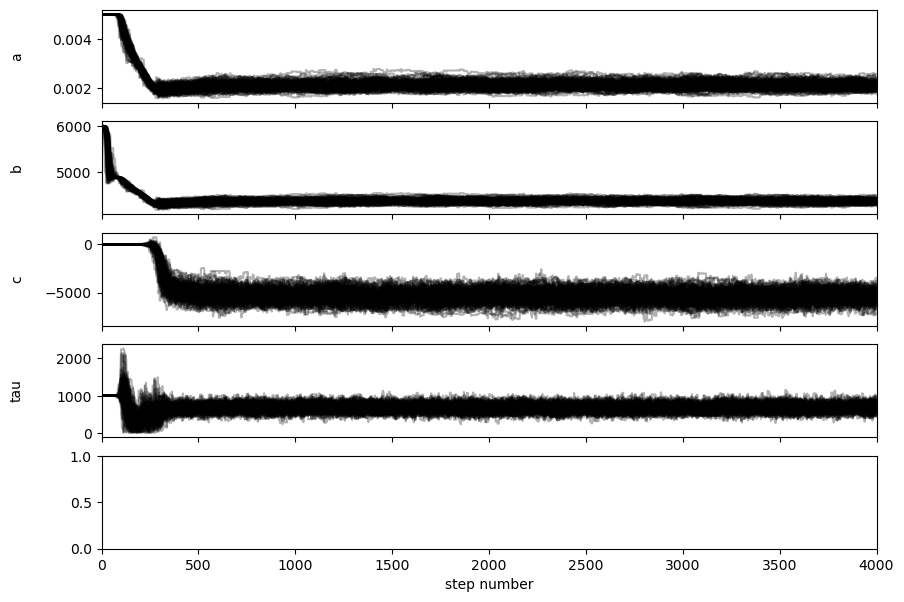

In [27]:
fig, axes = plt.subplots(5, figsize=(10, 7), sharex=True)
samples = sampler.get_chain()
labels = ["a", "b", "c", "tau"]
for i in range(ndim):
    ax = axes[i]
    ax.plot(samples[:, :, i], "k", alpha=0.3)
    ax.set_xlim(0, len(samples))
    ax.set_ylabel(labels[i])
    ax.yaxis.set_label_coords(-0.1, 0.5)

axes[-1].set_xlabel("step number");

(20000, 4)


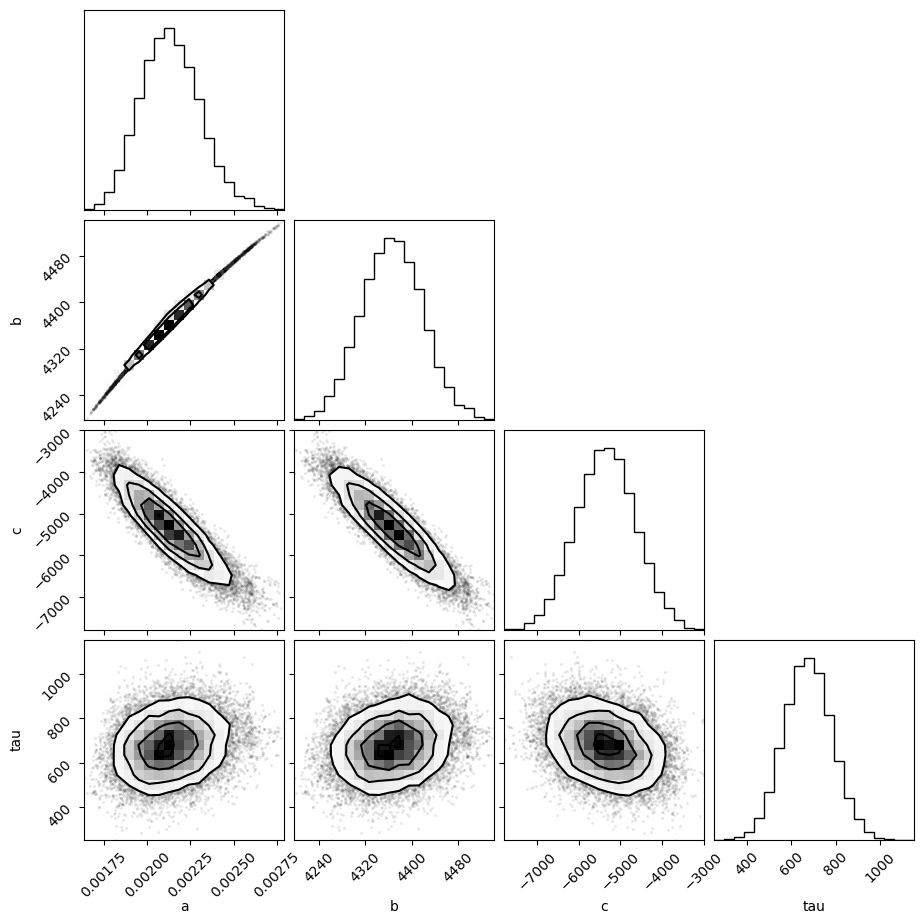

In [28]:
import corner

flat_samples = sampler.get_chain(discard=1000, thin=15, flat=True)
print(flat_samples.shape)

fig = corner.corner(flat_samples, labels=labels)

Text(0.5, 0, 'Time [s]')

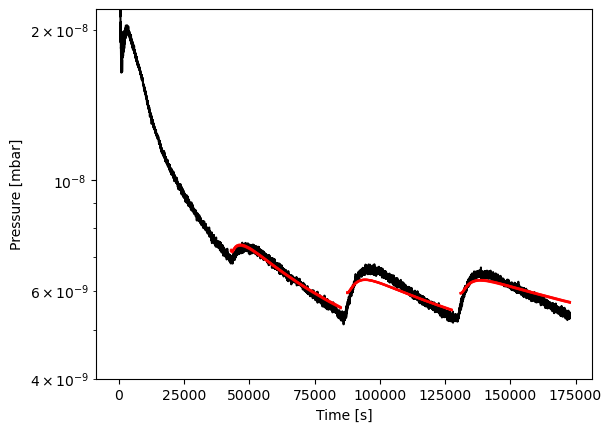

In [29]:
plt.figure()
plt.semilogy(time, p, 'k')
tT_final = []
for j,ts in enumerate(time_slices):
    gpts = (time > ts[0]) & (time < ts[1])
    tT_final.append((np.vstack((time[gpts],temp[gpts]))))
inds = np.random.randint(len(flat_samples), size=10)
for ind in inds:
    sample = flat_samples[ind]
    for j in range(len(time_slices)):
        tvals = combined_data[j][0]
        plt.plot(tvals, e.fitfunction_short_temp_offset(tT_final[j], sample[0], sample[1], sample[2], sample[3]), 'r', alpha=0.5)

plt.ylim(4e-9, 2.2e-8)
plt.ylabel('Pressure [mbar]')
plt.xlabel("Time [s]")



In [30]:
from IPython.display import display, Math

CI = 10 ## L/s
Area = 0.01 ## m^2
mbar_to_Pa = 100
K = 0.22
p_atm = 1.01e5 #Pa
m_to_cm = 100
L_to_m3 = 1e-3
KbT = 4.14e-21 #J

mcmc_D0 = np.percentile((flat_samples[:, 0]*CI*mbar_to_Pa*L_to_m3/(K*p_atm*Area) * m_to_cm)**2, [16, 50, 84])
mcmc_Ea = np.percentile(flat_samples[:, 1], [16, 50, 84])

print("D0 [cm^2/s]: ", mcmc_D0)
print("Activation energy [K]: ", mcmc_Ea)
print(flat_samples[:,0])


D0 [cm^2/s]:  [7.81920281e-07 9.18734741e-07 1.07712416e-06]
Activation energy [K]:  [4313.94409635 4366.18995186 4417.92748943]
[0.00241934 0.00199802 0.00204685 ... 0.00200759 0.00209123 0.00204302]
